In [1]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

C:\Users\Venom\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 13247191416519152209
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 2254123828
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 18171069817005201610
 physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1650, pci bus id: 0000:01:00.0, compute capability: 7.5"
 xla_global_id: 416903419]

In [2]:
import tensorflow as tf

In [3]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [4]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## Imports

In [29]:
import keras
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard
from keras.engine.compile_utils import Container
from keras.layers import *
from keras.models import Model
from keras.preprocessing import image
import keras.backend as K
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import scipy.misc
from tqdm import *
%matplotlib inline

In [30]:
print(keras.__version__)

2.9.0


## Config

In [31]:
Data = "./data"
Train = os.path.join(Data, "train")
Test = os.path.join(Data, "test")
IMG_SHAPE = (64, 64)

## Dataset creation

In [32]:
def load_dataset_small(num_images_per_class_train=10, num_images_test=500):
    """
                 num_images_test: total number of images to load into training dataset.
    """
    X_train = []
    X_test = []
    for c in os.listdir(Train):
        c_dir = os.path.join(Train, c, 'images')
        c_imgs = os.listdir(c_dir)
        random.shuffle(c_imgs)
        #num_images_per_class_train:number of images per class to load into training dataset.
        for img_name_i in c_imgs[0:num_images_per_class_train]:
            img_i = tf.keras.utils.load_img(os.path.join(c_dir, img_name_i))
            x = tf.keras.utils.img_to_array(img_i)
            X_train.append(x)
    random.shuffle(X_train)
    test_dir = os.path.join(Test, 'images')
    test_imgs = os.listdir(test_dir)
    random.shuffle(test_imgs)
    #num_images_test:number of images per class to load into test dataset.
    for img_name_i in test_imgs[0:num_images_test]:
        img_i = tf.keras.utils.load_img(os.path.join(test_dir, img_name_i))
        x = tf.keras.utils.img_to_array(img_i)
        X_test.append(x)
    return np.array(X_train), np.array(X_test)

In [33]:
X_train_orig, X_test_orig = load_dataset_small()
X_train = X_train_orig/255.
X_test = X_test_orig/255.
print ("Number of training examples = " + str(X_train.shape[0]))
print ("Number of test examples = " + str(X_test.shape[0]))
print ("X_train shape: " + str(X_train.shape)) # Should be (train_size, 64, 64, 3).

Number of training examples = 2000
Number of test examples = 500
X_train shape: (2000, 64, 64, 3)


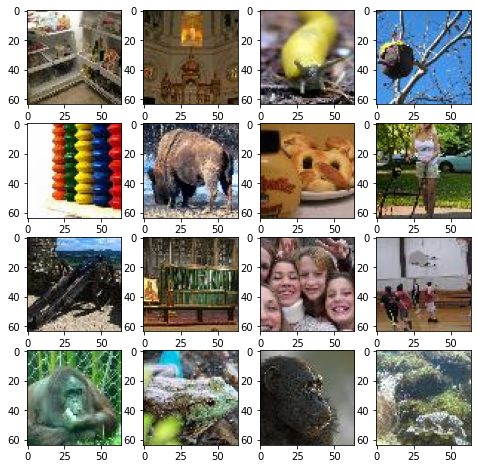

In [34]:

fig=plt.figure(figsize=(8, 8))
columns = 4
rows = 4
for i in range(1, columns*rows +1):
    # Random sample from the  dataset
    img_idx = np.random.choice(X_train.shape[0])
    fig.add_subplot(rows, columns, i)
    plt.imshow(X_train[img_idx])
plt.show()

In [35]:
# First half is used for training as secret images, second half for cover images.
input_S = X_train[0:X_train.shape[0] // 2]
input_C = X_train[X_train.shape[0] // 2:]

## Model

In [36]:
beta = 1.0
def rloss(s_true, s_pred):
    return beta * K.sum(K.square(s_true - s_pred))
def floss(y_true, y_pred):
    # Loss for the full model is: |C-C'| + beta * |S-S'|
    s_true, c_true = y_true[:,:,:,0:3], y_true[:,:,:,3:6]
    s_pred, c_pred = y_pred[:,:,:,0:3], y_pred[:,:,:,3:6]
    
    s_loss = beta * K.sum(K.square(s_true - s_pred))
    c_loss = K.sum(K.square(c_true - c_pred))
    
    return s_loss + c_loss


# Encoder defining and comprising of Preparation and Hiding network
def make_encoder(input_size):
    input_S = Input(shape=(input_size))
    input_C= Input(shape=(input_size))

    # Preparation Network
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_prep0_3x3')(input_S)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_prep0_4x4')(input_S)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_prep0_5x5')(input_S)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_prep1_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_prep1_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_prep1_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x = concatenate([input_C, x])
    
    # Hiding network
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid0_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid0_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid0_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid1_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid1_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid1_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid2_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid2_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid2_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid3_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid3_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid3_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_hid4_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_hid4_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_hid5_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    output_Cprime = Conv2D(3, (3, 3), strides = (1, 1), padding='same', activation='relu', name='output_C')(x)
    
    return Model(inputs=[input_S, input_C],
                 outputs=output_Cprime,
                 name = 'Encoder')

# Decoder comprising of Reveal Network
def make_decoder(input_size, fixed=False):
    
    # Reveal network
    reveal_input = Input(shape=(input_size))
    
    # Adding Gaussian noise with 0.01 aka standard deviation is applied which will help model train.
    input_with_noise = GaussianNoise(0.01, name='output_C_noise')(reveal_input)
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev0_3x3')(input_with_noise)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev0_4x4')(input_with_noise)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev0_5x5')(input_with_noise)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev1_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev1_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev1_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev2_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev2_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev2_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev3_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev3_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev3_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    x3 = Conv2D(50, (3, 3), strides = (1, 1), padding='same', activation='relu', name='conv_rev4_3x3')(x)
    x4 = Conv2D(10, (4, 4), strides = (1, 1), padding='same', activation='relu', name='conv_rev4_4x4')(x)
    x5 = Conv2D(5, (5, 5), strides = (1, 1), padding='same', activation='relu', name='conv_rev5_5x5')(x)
    x = concatenate([x3, x4, x5])
    
    output_Sprime = Conv2D(3, (3, 3), strides = (1, 1), padding='same', activation='relu', name='output_S')(x)
    
    if not fixed:
        return Model(inputs=reveal_input,
                     outputs=output_Sprime,
                     name = 'Decoder')
    else:
        return Container(inputs=reveal_input,
                         outputs=output_Sprime,
                         name = 'DecoderFixed')

# Complete model comprising of Encoder and Decoder.
def make_model(input_size):
    input_S = Input(shape=(input_size))
    input_C= Input(shape=(input_size))
    
    encoder = make_encoder(input_size)
    
    decoder = make_decoder(input_size)
    decoder.compile(optimizer='adam', loss=rloss)
    decoder.trainable = False
    
    output_Cprime = encoder([input_S, input_C])
    output_Sprime = decoder(output_Cprime)

    autoencoder = Model(inputs=[input_S, input_C],
                        outputs=concatenate([output_Sprime, output_Cprime]))
    autoencoder.compile(optimizer='adam', loss=floss)
    
    return encoder, decoder, autoencoder


In [37]:
encoder_model, reveal_model, autoencoder_model = make_model(input_S.shape[1:])

## Training

In [38]:
# Method defined to update learning rate by ratio of epochs
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

In [15]:
NB_EPOCHS = 1000
BATCH_SIZE = 32

m = input_S.shape[0]
loss_history = []
for epoch in range(NB_EPOCHS):
    np.random.shuffle(input_S)
    np.random.shuffle(input_C)
    
    t = tqdm(range(0, input_S.shape[0], BATCH_SIZE),mininterval=0)
    completeloss = []
    revealoss = []
    for idx in t:
        
        batch_S = input_S[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]
        
        C_prime = encoder_model.predict([batch_S, batch_C])
        
        completeloss.append(autoencoder_model.train_on_batch(x=[batch_S, batch_C],y=np.concatenate((batch_S, batch_C),axis=3)))
        revealloss.append(reveal_model.train_on_batch(x=C_prime,
                                              y=batch_S))
        
        # Update learning rate
        K.set_value(autoencoder_model.optimizer.lr, lr_schedule
                    (epoch))
        K.set_value(reveal_model.optimizer.lr, lr_schedule(epoch))
        
        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Rev {:10.2f}'.format(epoch + 1, idx, m, np.mean(completeloss), np.mean(revealoss)))
    loss_history.append(np.mean(completeloss))

  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 7s 7s/step


Epoch 1 | Batch:   0 of 1000. Loss AE  202080.22 | Loss Rev  108251.59:   3%|▎         | 1/32 [00:13<06:46, 13.13s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 1 | Batch:  32 of 1000. Loss AE  196039.83 | Loss Rev   84162.24:   6%|▋         | 2/32 [00:14<02:58,  5.94s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 1 | Batch:  64 of 1000. Loss AE  179127.31 | Loss Rev   80403.13:   9%|▉         | 3/32 [00:14<01:44,  3.60s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 1 | Batch:  96 of 1000. Loss AE  173916.32 | Loss Rev   77893.68:  12%|█▎        | 4/32 [00:15<01:09,  2.50s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 1 | Batch: 128 of 1000. Loss AE  168296.29 | Loss Rev   75311.10:  16%|█▌        | 5/32 [00:16<00:51,  1.89s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 1 | Batch: 160 of 1000. Loss AE  167055.78 | Loss Rev   78273.21:  19%|█▉        | 6/32 [00:17<00:39,  1.53s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 1 | Batch: 192 of 1000. Loss AE  163789.90 | Loss Rev   76912.40:  22%|██▏       | 7/32 [00:18<00:32,  1.30s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 1 | Batch: 224 of 1000. Loss AE  161643.04 | Loss Rev   75846.31:  25%|██▌       | 8/32 [00:18<00:27,  1.15s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 1 | Batch: 256 of 1000. Loss AE  156954.04 | Loss Rev   75351.78:  28%|██▊       | 9/32 [00:19<00:24,  1.05s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 1 | Batch: 288 of 1000. Loss AE  150498.75 | Loss Rev   73331.29:  31%|███▏      | 10/32 [00:20<00:21,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 1 | Batch: 320 of 1000. Loss AE  148159.31 | Loss Rev   74705.91:  34%|███▍      | 11/32 [00:21<00:19,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 1 | Batch: 352 of 1000. Loss AE  142375.16 | Loss Rev   72766.07:  38%|███▊      | 12/32 [00:22<00:17,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 1 | Batch: 384 of 1000. Loss AE  137855.15 | Loss Rev   71659.60:  41%|████      | 13/32 [00:23<00:16,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 1 | Batch: 416 of 1000. Loss AE  134534.34 | Loss Rev   71377.23:  44%|████▍     | 14/32 [00:23<00:15,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 1 | Batch: 448 of 1000. Loss AE  131085.56 | Loss Rev   70609.14:  47%|████▋     | 15/32 [00:24<00:14,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 1 | Batch: 480 of 1000. Loss AE  128329.01 | Loss Rev   70082.15:  50%|█████     | 16/32 [00:25<00:13,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 1 | Batch: 512 of 1000. Loss AE  126395.71 | Loss Rev   69891.82:  53%|█████▎    | 17/32 [00:26<00:12,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 1 | Batch: 544 of 1000. Loss AE  123687.82 | Loss Rev   69282.25:  56%|█████▋    | 18/32 [00:27<00:11,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 1 | Batch: 576 of 1000. Loss AE  121030.12 | Loss Rev   68741.11:  59%|█████▉    | 19/32 [00:27<00:10,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 1 | Batch: 608 of 1000. Loss AE  118779.59 | Loss Rev   68463.49:  62%|██████▎   | 20/32 [00:28<00:09,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 1 | Batch: 640 of 1000. Loss AE  116505.84 | Loss Rev   67954.49:  66%|██████▌   | 21/32 [00:29<00:09,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 1 | Batch: 672 of 1000. Loss AE  113817.34 | Loss Rev   66776.96:  69%|██████▉   | 22/32 [00:30<00:08,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 1 | Batch: 704 of 1000. Loss AE  110876.99 | Loss Rev   65258.89:  72%|███████▏  | 23/32 [00:31<00:07,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 1 | Batch: 736 of 1000. Loss AE  108253.03 | Loss Rev   63985.18:  75%|███████▌  | 24/32 [00:32<00:06,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 1 | Batch: 768 of 1000. Loss AE  106081.54 | Loss Rev   62816.17:  78%|███████▊  | 25/32 [00:32<00:05,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 1 | Batch: 800 of 1000. Loss AE  104090.75 | Loss Rev   61843.99:  81%|████████▏ | 26/32 [00:33<00:04,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 1 | Batch: 832 of 1000. Loss AE  101967.59 | Loss Rev   60748.39:  84%|████████▍ | 27/32 [00:34<00:04,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 1 | Batch: 864 of 1000. Loss AE  100034.34 | Loss Rev   59714.81:  88%|████████▊ | 28/32 [00:35<00:03,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 1 | Batch: 896 of 1000. Loss AE   98105.54 | Loss Rev   58649.58:  91%|█████████ | 29/32 [00:36<00:02,  1.21it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 1 | Batch: 928 of 1000. Loss AE   96420.11 | Loss Rev   57714.40:  94%|█████████▍| 30/32 [00:37<00:01,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 1 | Batch: 960 of 1000. Loss AE   94681.70 | Loss Rev   56750.65:  97%|█████████▋| 31/32 [00:37<00:00,  1.21it/s]

1/1 [==============================] - 1s 756ms/step


Epoch 1 | Batch: 992 of 1000. Loss AE   92095.83 | Loss Rev   55194.04: 100%|██████████| 32/32 [00:42<00:00,  1.32s/it]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 2 | Batch:   0 of 1000. Loss AE   50380.36 | Loss Rev   24847.96:   3%|▎         | 1/32 [00:00<00:25,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 2 | Batch:  32 of 1000. Loss AE   46802.97 | Loss Rev   25350.67:   6%|▋         | 2/32 [00:01<00:24,  1.21it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 2 | Batch:  64 of 1000. Loss AE   47396.54 | Loss Rev   27398.09:   9%|▉         | 3/32 [00:02<00:24,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 2 | Batch:  96 of 1000. Loss AE   46073.64 | Loss Rev   26770.60:  12%|█▎        | 4/32 [00:03<00:23,  1.20it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 2 | Batch: 128 of 1000. Loss AE   44640.12 | Loss Rev   26275.44:  16%|█▌        | 5/32 [00:04<00:22,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 2 | Batch: 160 of 1000. Loss AE   45215.01 | Loss Rev   27148.81:  19%|█▉        | 6/32 [00:05<00:21,  1.18it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 2 | Batch: 192 of 1000. Loss AE   44756.11 | Loss Rev   27091.34:  22%|██▏       | 7/32 [00:05<00:21,  1.18it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 2 | Batch: 224 of 1000. Loss AE   44201.38 | Loss Rev   26709.74:  25%|██▌       | 8/32 [00:06<00:20,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 2 | Batch: 256 of 1000. Loss AE   43963.07 | Loss Rev   26704.17:  28%|██▊       | 9/32 [00:07<00:19,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 2 | Batch: 288 of 1000. Loss AE   43583.04 | Loss Rev   26404.22:  31%|███▏      | 10/32 [00:08<00:18,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 2 | Batch: 320 of 1000. Loss AE   43354.67 | Loss Rev   26005.71:  34%|███▍      | 11/32 [00:09<00:17,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 2 | Batch: 352 of 1000. Loss AE   43031.92 | Loss Rev   25673.87:  38%|███▊      | 12/32 [00:10<00:17,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 2 | Batch: 384 of 1000. Loss AE   42448.60 | Loss Rev   25182.94:  41%|████      | 13/32 [00:11<00:16,  1.18it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 2 | Batch: 416 of 1000. Loss AE   41977.19 | Loss Rev   24839.43:  44%|████▍     | 14/32 [00:11<00:15,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 2 | Batch: 448 of 1000. Loss AE   41440.06 | Loss Rev   24374.46:  47%|████▋     | 15/32 [00:12<00:14,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 2 | Batch: 480 of 1000. Loss AE   40976.72 | Loss Rev   23982.57:  50%|█████     | 16/32 [00:13<00:13,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 2 | Batch: 512 of 1000. Loss AE   40337.78 | Loss Rev   23483.42:  53%|█████▎    | 17/32 [00:14<00:12,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 2 | Batch: 544 of 1000. Loss AE   39754.52 | Loss Rev   23100.48:  56%|█████▋    | 18/32 [00:15<00:11,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 2 | Batch: 576 of 1000. Loss AE   39056.08 | Loss Rev   22637.87:  59%|█████▉    | 19/32 [00:16<00:10,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 2 | Batch: 608 of 1000. Loss AE   38601.32 | Loss Rev   22324.80:  62%|██████▎   | 20/32 [00:16<00:10,  1.19it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 2 | Batch: 640 of 1000. Loss AE   38061.35 | Loss Rev   22009.10:  66%|██████▌   | 21/32 [00:17<00:09,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 2 | Batch: 672 of 1000. Loss AE   37463.13 | Loss Rev   21693.67:  69%|██████▉   | 22/32 [00:18<00:08,  1.19it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 2 | Batch: 704 of 1000. Loss AE   36969.38 | Loss Rev   21395.43:  72%|███████▏  | 23/32 [00:19<00:07,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 2 | Batch: 736 of 1000. Loss AE   36477.32 | Loss Rev   21102.77:  75%|███████▌  | 24/32 [00:20<00:06,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 2 | Batch: 768 of 1000. Loss AE   35802.58 | Loss Rev   20675.59:  78%|███████▊  | 25/32 [00:21<00:05,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 2 | Batch: 800 of 1000. Loss AE   35397.84 | Loss Rev   20440.64:  81%|████████▏ | 26/32 [00:21<00:05,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 2 | Batch: 832 of 1000. Loss AE   34977.35 | Loss Rev   20254.55:  84%|████████▍ | 27/32 [00:22<00:04,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 2 | Batch: 864 of 1000. Loss AE   34540.04 | Loss Rev   19974.56:  88%|████████▊ | 28/32 [00:23<00:03,  1.18it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 2 | Batch: 896 of 1000. Loss AE   34403.29 | Loss Rev   20052.72:  91%|█████████ | 29/32 [00:24<00:02,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 2 | Batch: 928 of 1000. Loss AE   34283.78 | Loss Rev   20119.48:  94%|█████████▍| 30/32 [00:25<00:01,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 2 | Batch: 960 of 1000. Loss AE   34254.71 | Loss Rev   20289.72:  97%|█████████▋| 31/32 [00:26<00:00,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 2 | Batch: 992 of 1000. Loss AE   33362.22 | Loss Rev   19753.35: 100%|██████████| 32/32 [00:26<00:00,  1.21it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 3 | Batch:   0 of 1000. Loss AE   40410.56 | Loss Rev   29123.33:   3%|▎         | 1/32 [00:00<00:26,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 3 | Batch:  32 of 1000. Loss AE   33239.33 | Loss Rev   23219.42:   6%|▋         | 2/32 [00:01<00:25,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 3 | Batch:  64 of 1000. Loss AE   33250.20 | Loss Rev   23606.07:   9%|▉         | 3/32 [00:02<00:24,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 3 | Batch:  96 of 1000. Loss AE   32804.19 | Loss Rev   23200.06:  12%|█▎        | 4/32 [00:03<00:23,  1.19it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 3 | Batch: 128 of 1000. Loss AE   30817.02 | Loss Rev   20701.72:  16%|█▌        | 5/32 [00:04<00:22,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 3 | Batch: 160 of 1000. Loss AE   31209.31 | Loss Rev   20732.49:  19%|█▉        | 6/32 [00:05<00:22,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 3 | Batch: 192 of 1000. Loss AE   29583.05 | Loss Rev   19370.33:  22%|██▏       | 7/32 [00:05<00:21,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 3 | Batch: 224 of 1000. Loss AE   29389.59 | Loss Rev   19330.97:  25%|██▌       | 8/32 [00:06<00:20,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 3 | Batch: 256 of 1000. Loss AE   28847.09 | Loss Rev   19051.30:  28%|██▊       | 9/32 [00:07<00:19,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 3 | Batch: 288 of 1000. Loss AE   28326.80 | Loss Rev   18563.73:  31%|███▏      | 10/32 [00:08<00:18,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 3 | Batch: 320 of 1000. Loss AE   28277.54 | Loss Rev   18437.38:  34%|███▍      | 11/32 [00:09<00:17,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 3 | Batch: 352 of 1000. Loss AE   28288.74 | Loss Rev   18369.53:  38%|███▊      | 12/32 [00:10<00:16,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 3 | Batch: 384 of 1000. Loss AE   27869.01 | Loss Rev   17916.87:  41%|████      | 13/32 [00:10<00:15,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 3 | Batch: 416 of 1000. Loss AE   27686.22 | Loss Rev   17647.83:  44%|████▍     | 14/32 [00:11<00:13,  1.32it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 3 | Batch: 448 of 1000. Loss AE   27459.54 | Loss Rev   17475.88:  47%|████▋     | 15/32 [00:12<00:12,  1.34it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 3 | Batch: 480 of 1000. Loss AE   27183.22 | Loss Rev   17129.82:  50%|█████     | 16/32 [00:12<00:11,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 3 | Batch: 512 of 1000. Loss AE   26967.58 | Loss Rev   16945.06:  53%|█████▎    | 17/32 [00:13<00:10,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 3 | Batch: 544 of 1000. Loss AE   26515.19 | Loss Rev   16614.27:  56%|█████▋    | 18/32 [00:14<00:09,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 3 | Batch: 576 of 1000. Loss AE   26378.10 | Loss Rev   16521.61:  59%|█████▉    | 19/32 [00:14<00:08,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 3 | Batch: 608 of 1000. Loss AE   26137.00 | Loss Rev   16291.42:  62%|██████▎   | 20/32 [00:15<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 640 of 1000. Loss AE   25846.42 | Loss Rev   16067.19:  66%|██████▌   | 21/32 [00:16<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 3 | Batch: 672 of 1000. Loss AE   25705.07 | Loss Rev   15987.42:  69%|██████▉   | 22/32 [00:16<00:06,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 3 | Batch: 704 of 1000. Loss AE   25346.06 | Loss Rev   15763.34:  72%|███████▏  | 23/32 [00:17<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 736 of 1000. Loss AE   25208.75 | Loss Rev   15681.85:  75%|███████▌  | 24/32 [00:17<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 3 | Batch: 768 of 1000. Loss AE   24909.08 | Loss Rev   15486.93:  78%|███████▊  | 25/32 [00:18<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 3 | Batch: 800 of 1000. Loss AE   24620.35 | Loss Rev   15317.66:  81%|████████▏ | 26/32 [00:19<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 832 of 1000. Loss AE   24414.28 | Loss Rev   15151.72:  84%|████████▍ | 27/32 [00:19<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 864 of 1000. Loss AE   24241.15 | Loss Rev   15012.77:  88%|████████▊ | 28/32 [00:20<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 3 | Batch: 896 of 1000. Loss AE   24060.11 | Loss Rev   14907.48:  91%|█████████ | 29/32 [00:21<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 3 | Batch: 928 of 1000. Loss AE   23878.38 | Loss Rev   14805.46:  94%|█████████▍| 30/32 [00:21<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 3 | Batch: 960 of 1000. Loss AE   23620.74 | Loss Rev   14652.31:  97%|█████████▋| 31/32 [00:22<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 3 | Batch: 992 of 1000. Loss AE   23019.96 | Loss Rev   14278.98: 100%|██████████| 32/32 [00:22<00:00,  1.42it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 4 | Batch:   0 of 1000. Loss AE   20038.82 | Loss Rev   13608.21:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch:  32 of 1000. Loss AE   18502.07 | Loss Rev   12207.50:   6%|▋         | 2/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch:  64 of 1000. Loss AE   18890.67 | Loss Rev   12384.38:   9%|▉         | 3/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch:  96 of 1000. Loss AE   18684.19 | Loss Rev   12165.57:  12%|█▎        | 4/32 [00:02<00:17,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 4 | Batch: 128 of 1000. Loss AE   18612.01 | Loss Rev   12265.83:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 160 of 1000. Loss AE   18092.76 | Loss Rev   11808.21:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 192 of 1000. Loss AE   17891.48 | Loss Rev   11508.21:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 224 of 1000. Loss AE   17865.38 | Loss Rev   11560.36:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 256 of 1000. Loss AE   17660.46 | Loss Rev   11472.03:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 288 of 1000. Loss AE   18152.40 | Loss Rev   11905.78:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 320 of 1000. Loss AE   17739.36 | Loss Rev   11629.49:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 352 of 1000. Loss AE   17598.66 | Loss Rev   11587.97:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 384 of 1000. Loss AE   17333.14 | Loss Rev   11401.59:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 416 of 1000. Loss AE   17209.20 | Loss Rev   11347.99:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 4 | Batch: 448 of 1000. Loss AE   17302.56 | Loss Rev   11448.44:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 480 of 1000. Loss AE   17127.65 | Loss Rev   11313.10:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 512 of 1000. Loss AE   17133.87 | Loss Rev   11329.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 4 | Batch: 544 of 1000. Loss AE   16985.84 | Loss Rev   11201.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 576 of 1000. Loss AE   16791.72 | Loss Rev   11079.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 608 of 1000. Loss AE   16754.22 | Loss Rev   11064.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 640 of 1000. Loss AE   16528.31 | Loss Rev   10916.78:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 672 of 1000. Loss AE   16511.96 | Loss Rev   10962.74:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 704 of 1000. Loss AE   16408.37 | Loss Rev   10906.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 4 | Batch: 736 of 1000. Loss AE   16258.35 | Loss Rev   10807.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.59it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 768 of 1000. Loss AE   16103.78 | Loss Rev   10711.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.59it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 800 of 1000. Loss AE   16017.69 | Loss Rev   10668.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.59it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 4 | Batch: 832 of 1000. Loss AE   15915.98 | Loss Rev   10619.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 864 of 1000. Loss AE   15741.13 | Loss Rev   10476.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 4 | Batch: 896 of 1000. Loss AE   15718.47 | Loss Rev   10471.90:  91%|█████████ | 29/32 [00:18<00:01,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 928 of 1000. Loss AE   15636.25 | Loss Rev   10425.79:  94%|█████████▍| 30/32 [00:18<00:01,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 4 | Batch: 960 of 1000. Loss AE   15581.87 | Loss Rev   10401.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.59it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 4 | Batch: 992 of 1000. Loss AE   15196.25 | Loss Rev   10142.79: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch:   0 of 1000. Loss AE   13665.36 | Loss Rev   10232.12:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch:  32 of 1000. Loss AE   16224.90 | Loss Rev   12252.36:   6%|▋         | 2/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch:  64 of 1000. Loss AE   20589.24 | Loss Rev   16697.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch:  96 of 1000. Loss AE   19495.60 | Loss Rev   15520.33:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 128 of 1000. Loss AE   19633.69 | Loss Rev   15550.59:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch: 160 of 1000. Loss AE   19873.95 | Loss Rev   15540.55:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch: 192 of 1000. Loss AE   20401.38 | Loss Rev   16095.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 224 of 1000. Loss AE   19576.08 | Loss Rev   15234.05:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 256 of 1000. Loss AE   19874.78 | Loss Rev   15414.37:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 288 of 1000. Loss AE   19554.32 | Loss Rev   15077.19:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 320 of 1000. Loss AE   19453.86 | Loss Rev   14891.06:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 352 of 1000. Loss AE   19206.11 | Loss Rev   14430.88:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 384 of 1000. Loss AE   19154.60 | Loss Rev   14274.07:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 5 | Batch: 416 of 1000. Loss AE   18799.39 | Loss Rev   13853.75:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 448 of 1000. Loss AE   18764.48 | Loss Rev   13768.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 5 | Batch: 480 of 1000. Loss AE   18619.67 | Loss Rev   13640.26:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 5 | Batch: 512 of 1000. Loss AE   18471.94 | Loss Rev   13494.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch: 544 of 1000. Loss AE   18408.21 | Loss Rev   13388.93:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch: 576 of 1000. Loss AE   18300.19 | Loss Rev   13263.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch: 608 of 1000. Loss AE   18246.01 | Loss Rev   13195.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 5 | Batch: 640 of 1000. Loss AE   18172.28 | Loss Rev   13119.79:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 5 | Batch: 672 of 1000. Loss AE   18015.60 | Loss Rev   12900.81:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 704 of 1000. Loss AE   17882.88 | Loss Rev   12773.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 736 of 1000. Loss AE   17756.40 | Loss Rev   12611.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch: 768 of 1000. Loss AE   17626.14 | Loss Rev   12449.42:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch: 800 of 1000. Loss AE   17441.65 | Loss Rev   12264.50:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 5 | Batch: 832 of 1000. Loss AE   17296.55 | Loss Rev   12144.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 5 | Batch: 864 of 1000. Loss AE   17203.17 | Loss Rev   12057.43:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 5 | Batch: 896 of 1000. Loss AE   17052.63 | Loss Rev   11935.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 5 | Batch: 928 of 1000. Loss AE   16924.08 | Loss Rev   11843.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 5 | Batch: 960 of 1000. Loss AE   16771.40 | Loss Rev   11729.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 5 | Batch: 992 of 1000. Loss AE   16357.12 | Loss Rev   11448.57: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch:   0 of 1000. Loss AE   12977.59 | Loss Rev    8640.47:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 6 | Batch:  32 of 1000. Loss AE   13211.14 | Loss Rev    9166.36:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 6 | Batch:  64 of 1000. Loss AE   13457.69 | Loss Rev    9230.16:   9%|▉         | 3/32 [00:01<00:19,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 6 | Batch:  96 of 1000. Loss AE   13439.12 | Loss Rev    9256.85:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 128 of 1000. Loss AE   13038.48 | Loss Rev    8973.80:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 6 | Batch: 160 of 1000. Loss AE   13250.96 | Loss Rev    9132.57:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 192 of 1000. Loss AE   13027.48 | Loss Rev    8969.59:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 224 of 1000. Loss AE   13006.95 | Loss Rev    8989.33:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 6 | Batch: 256 of 1000. Loss AE   12953.70 | Loss Rev    9011.11:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 288 of 1000. Loss AE   12681.73 | Loss Rev    8796.25:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 6 | Batch: 320 of 1000. Loss AE   12673.91 | Loss Rev    8808.51:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 352 of 1000. Loss AE   12602.66 | Loss Rev    8766.97:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 384 of 1000. Loss AE   12650.32 | Loss Rev    8844.65:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 416 of 1000. Loss AE   12473.69 | Loss Rev    8695.34:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 6 | Batch: 448 of 1000. Loss AE   12543.42 | Loss Rev    8802.31:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 480 of 1000. Loss AE   12408.71 | Loss Rev    8703.14:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 6 | Batch: 512 of 1000. Loss AE   12345.98 | Loss Rev    8605.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 6 | Batch: 544 of 1000. Loss AE   12292.77 | Loss Rev    8566.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 6 | Batch: 576 of 1000. Loss AE   12219.62 | Loss Rev    8534.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 6 | Batch: 608 of 1000. Loss AE   12169.30 | Loss Rev    8500.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 640 of 1000. Loss AE   12122.30 | Loss Rev    8473.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 6 | Batch: 672 of 1000. Loss AE   12034.37 | Loss Rev    8418.02:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 6 | Batch: 704 of 1000. Loss AE   11896.74 | Loss Rev    8312.37:  72%|███████▏  | 23/32 [00:14<00:06,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 6 | Batch: 736 of 1000. Loss AE   11846.14 | Loss Rev    8294.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 6 | Batch: 768 of 1000. Loss AE   11763.36 | Loss Rev    8240.45:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 6 | Batch: 800 of 1000. Loss AE   11794.75 | Loss Rev    8279.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 6 | Batch: 832 of 1000. Loss AE   11844.46 | Loss Rev    8348.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 864 of 1000. Loss AE   11809.15 | Loss Rev    8322.32:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 6 | Batch: 896 of 1000. Loss AE   11763.07 | Loss Rev    8295.76:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 6 | Batch: 928 of 1000. Loss AE   11743.55 | Loss Rev    8303.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 6 | Batch: 960 of 1000. Loss AE   11806.98 | Loss Rev    8395.23:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 6 | Batch: 992 of 1000. Loss AE   11576.91 | Loss Rev    8247.39: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch:   0 of 1000. Loss AE   18928.62 | Loss Rev   16122.07:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch:  32 of 1000. Loss AE   32760.22 | Loss Rev   29606.56:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch:  64 of 1000. Loss AE   26803.27 | Loss Rev   23093.29:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch:  96 of 1000. Loss AE   29744.34 | Loss Rev   25563.12:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 7 | Batch: 128 of 1000. Loss AE   26929.51 | Loss Rev   22491.78:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch: 160 of 1000. Loss AE   26725.37 | Loss Rev   22210.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 7 | Batch: 192 of 1000. Loss AE   26820.07 | Loss Rev   22237.91:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 7 | Batch: 224 of 1000. Loss AE   25671.33 | Loss Rev   20876.95:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch: 256 of 1000. Loss AE   25368.22 | Loss Rev   20489.33:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 7 | Batch: 288 of 1000. Loss AE   24430.82 | Loss Rev   19330.32:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 7 | Batch: 320 of 1000. Loss AE   24161.47 | Loss Rev   18748.40:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 352 of 1000. Loss AE   24003.23 | Loss Rev   18389.83:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch: 384 of 1000. Loss AE   23252.80 | Loss Rev   17659.33:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch: 416 of 1000. Loss AE   23062.16 | Loss Rev   17270.29:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch: 448 of 1000. Loss AE   22762.34 | Loss Rev   16844.63:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 7 | Batch: 480 of 1000. Loss AE   22310.87 | Loss Rev   16407.77:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 7 | Batch: 512 of 1000. Loss AE   21876.86 | Loss Rev   15959.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 7 | Batch: 544 of 1000. Loss AE   21492.95 | Loss Rev   15607.05:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 7 | Batch: 576 of 1000. Loss AE   21270.58 | Loss Rev   15372.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 7 | Batch: 608 of 1000. Loss AE   20965.02 | Loss Rev   15082.17:  62%|██████▎   | 20/32 [00:12<00:07,  1.51it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 7 | Batch: 640 of 1000. Loss AE   20632.43 | Loss Rev   14803.21:  66%|██████▌   | 21/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 7 | Batch: 672 of 1000. Loss AE   20282.64 | Loss Rev   14502.98:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 7 | Batch: 704 of 1000. Loss AE   20122.37 | Loss Rev   14363.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch: 736 of 1000. Loss AE   19779.14 | Loss Rev   14070.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 7 | Batch: 768 of 1000. Loss AE   19535.68 | Loss Rev   13855.86:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 7 | Batch: 800 of 1000. Loss AE   19213.26 | Loss Rev   13603.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 7 | Batch: 832 of 1000. Loss AE   18929.62 | Loss Rev   13365.66:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 7 | Batch: 864 of 1000. Loss AE   18708.79 | Loss Rev   13197.31:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 7 | Batch: 896 of 1000. Loss AE   18538.74 | Loss Rev   13053.46:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 7 | Batch: 928 of 1000. Loss AE   18362.94 | Loss Rev   12910.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 7 | Batch: 960 of 1000. Loss AE   18123.51 | Loss Rev   12711.20:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 7 | Batch: 992 of 1000. Loss AE   17684.87 | Loss Rev   12416.22: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 8 | Batch:   0 of 1000. Loss AE   14802.23 | Loss Rev   10347.49:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 8 | Batch:  32 of 1000. Loss AE   15176.27 | Loss Rev   10587.77:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 8 | Batch:  64 of 1000. Loss AE   14017.58 | Loss Rev    9876.83:   9%|▉         | 3/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 8 | Batch:  96 of 1000. Loss AE   13417.05 | Loss Rev    9371.34:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 8 | Batch: 128 of 1000. Loss AE   12951.74 | Loss Rev    8959.85:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 8 | Batch: 160 of 1000. Loss AE   13097.08 | Loss Rev    9218.74:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 8 | Batch: 192 of 1000. Loss AE   12941.36 | Loss Rev    9135.22:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 224 of 1000. Loss AE   12769.71 | Loss Rev    8943.27:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 8 | Batch: 256 of 1000. Loss AE   12607.17 | Loss Rev    8844.80:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 288 of 1000. Loss AE   12363.04 | Loss Rev    8652.70:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 8 | Batch: 320 of 1000. Loss AE   12192.09 | Loss Rev    8555.15:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 352 of 1000. Loss AE   11901.22 | Loss Rev    8349.27:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 384 of 1000. Loss AE   11936.88 | Loss Rev    8413.92:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 8 | Batch: 416 of 1000. Loss AE   11838.52 | Loss Rev    8345.63:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 448 of 1000. Loss AE   11681.03 | Loss Rev    8210.12:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 8 | Batch: 480 of 1000. Loss AE   11742.34 | Loss Rev    8281.66:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 8 | Batch: 512 of 1000. Loss AE   11710.71 | Loss Rev    8257.49:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 8 | Batch: 544 of 1000. Loss AE   11578.73 | Loss Rev    8164.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 8 | Batch: 576 of 1000. Loss AE   11490.98 | Loss Rev    8088.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 8 | Batch: 608 of 1000. Loss AE   11331.64 | Loss Rev    7978.44:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 8 | Batch: 640 of 1000. Loss AE   11252.84 | Loss Rev    7937.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 8 | Batch: 672 of 1000. Loss AE   11250.67 | Loss Rev    7938.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 8 | Batch: 704 of 1000. Loss AE   11202.65 | Loss Rev    7927.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 8 | Batch: 736 of 1000. Loss AE   11134.35 | Loss Rev    7879.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 8 | Batch: 768 of 1000. Loss AE   11075.72 | Loss Rev    7845.30:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 8 | Batch: 800 of 1000. Loss AE   11017.61 | Loss Rev    7816.06:  81%|████████▏ | 26/32 [00:17<00:04,  1.41it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 8 | Batch: 832 of 1000. Loss AE   10953.90 | Loss Rev    7770.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.44it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 8 | Batch: 864 of 1000. Loss AE   10882.37 | Loss Rev    7715.44:  88%|████████▊ | 28/32 [00:18<00:02,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 8 | Batch: 896 of 1000. Loss AE   10793.81 | Loss Rev    7660.73:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 8 | Batch: 928 of 1000. Loss AE   10835.63 | Loss Rev    7724.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 8 | Batch: 960 of 1000. Loss AE   10778.08 | Loss Rev    7692.29:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 8 | Batch: 992 of 1000. Loss AE   10502.84 | Loss Rev    7492.00: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch:   0 of 1000. Loss AE   10011.01 | Loss Rev    7534.11:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 9 | Batch:  32 of 1000. Loss AE   10188.56 | Loss Rev    7610.18:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 9 | Batch:  64 of 1000. Loss AE   10487.82 | Loss Rev    8088.55:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch:  96 of 1000. Loss AE   10885.32 | Loss Rev    8474.91:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 9 | Batch: 128 of 1000. Loss AE   12385.99 | Loss Rev    9848.59:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 9 | Batch: 160 of 1000. Loss AE   11913.27 | Loss Rev    9360.94:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 9 | Batch: 192 of 1000. Loss AE   12118.37 | Loss Rev    9576.23:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 9 | Batch: 224 of 1000. Loss AE   12159.12 | Loss Rev    9527.50:  25%|██▌       | 8/32 [00:05<00:16,  1.49it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 9 | Batch: 256 of 1000. Loss AE   12168.47 | Loss Rev    9557.24:  28%|██▊       | 9/32 [00:05<00:15,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 9 | Batch: 288 of 1000. Loss AE   12143.33 | Loss Rev    9522.40:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 9 | Batch: 320 of 1000. Loss AE   12047.16 | Loss Rev    9444.27:  34%|███▍      | 11/32 [00:07<00:14,  1.50it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 9 | Batch: 352 of 1000. Loss AE   12113.25 | Loss Rev    9503.81:  38%|███▊      | 12/32 [00:07<00:13,  1.49it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 9 | Batch: 384 of 1000. Loss AE   12019.51 | Loss Rev    9414.47:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 9 | Batch: 416 of 1000. Loss AE   11983.40 | Loss Rev    9381.68:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 9 | Batch: 448 of 1000. Loss AE   11888.71 | Loss Rev    9280.04:  47%|████▋     | 15/32 [00:09<00:11,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 9 | Batch: 480 of 1000. Loss AE   11772.97 | Loss Rev    9151.01:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 9 | Batch: 512 of 1000. Loss AE   11596.87 | Loss Rev    8967.65:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 9 | Batch: 544 of 1000. Loss AE   11602.74 | Loss Rev    8948.21:  56%|█████▋    | 18/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 9 | Batch: 576 of 1000. Loss AE   11473.45 | Loss Rev    8807.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 9 | Batch: 608 of 1000. Loss AE   11536.55 | Loss Rev    8863.02:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 640 of 1000. Loss AE   11436.90 | Loss Rev    8757.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 9 | Batch: 672 of 1000. Loss AE   11437.49 | Loss Rev    8741.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 9 | Batch: 704 of 1000. Loss AE   11370.48 | Loss Rev    8681.54:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 9 | Batch: 736 of 1000. Loss AE   11383.38 | Loss Rev    8679.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 9 | Batch: 768 of 1000. Loss AE   11260.37 | Loss Rev    8564.22:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 9 | Batch: 800 of 1000. Loss AE   11145.02 | Loss Rev    8461.24:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 9 | Batch: 832 of 1000. Loss AE   11146.67 | Loss Rev    8472.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 9 | Batch: 864 of 1000. Loss AE   11152.78 | Loss Rev    8467.92:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 9 | Batch: 896 of 1000. Loss AE   11093.91 | Loss Rev    8415.72:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 9 | Batch: 928 of 1000. Loss AE   11104.21 | Loss Rev    8416.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 9 | Batch: 960 of 1000. Loss AE   11090.59 | Loss Rev    8404.62:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 9 | Batch: 992 of 1000. Loss AE   10841.50 | Loss Rev    8224.04: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch:   0 of 1000. Loss AE   10017.88 | Loss Rev    7513.92:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 10 | Batch:  32 of 1000. Loss AE    9471.85 | Loss Rev    7093.45:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 10 | Batch:  64 of 1000. Loss AE    9113.89 | Loss Rev    6719.80:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 10 | Batch:  96 of 1000. Loss AE    9472.03 | Loss Rev    6969.79:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 10 | Batch: 128 of 1000. Loss AE    9285.67 | Loss Rev    6816.28:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 10 | Batch: 160 of 1000. Loss AE    9240.56 | Loss Rev    6679.03:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 10 | Batch: 192 of 1000. Loss AE    9302.22 | Loss Rev    6816.65:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 10 | Batch: 224 of 1000. Loss AE    9153.41 | Loss Rev    6696.74:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 10 | Batch: 256 of 1000. Loss AE    9017.75 | Loss Rev    6599.77:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 10 | Batch: 288 of 1000. Loss AE    9205.12 | Loss Rev    6817.49:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 10 | Batch: 320 of 1000. Loss AE    9283.82 | Loss Rev    6924.17:  34%|███▍      | 11/32 [00:07<00:14,  1.42it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 10 | Batch: 352 of 1000. Loss AE    9310.05 | Loss Rev    6940.90:  38%|███▊      | 12/32 [00:08<00:14,  1.42it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 10 | Batch: 384 of 1000. Loss AE    9219.96 | Loss Rev    6865.76:  41%|████      | 13/32 [00:08<00:13,  1.42it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 10 | Batch: 416 of 1000. Loss AE    9160.81 | Loss Rev    6771.69:  44%|████▍     | 14/32 [00:09<00:12,  1.42it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 10 | Batch: 448 of 1000. Loss AE    9159.81 | Loss Rev    6775.31:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 10 | Batch: 480 of 1000. Loss AE    9243.05 | Loss Rev    6878.60:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 10 | Batch: 512 of 1000. Loss AE    9221.52 | Loss Rev    6872.51:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 10 | Batch: 544 of 1000. Loss AE    9138.12 | Loss Rev    6785.60:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 10 | Batch: 576 of 1000. Loss AE    9103.18 | Loss Rev    6760.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 10 | Batch: 608 of 1000. Loss AE    9068.98 | Loss Rev    6736.77:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 10 | Batch: 640 of 1000. Loss AE    9119.89 | Loss Rev    6797.20:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 10 | Batch: 672 of 1000. Loss AE    9047.07 | Loss Rev    6731.27:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 10 | Batch: 704 of 1000. Loss AE    9021.28 | Loss Rev    6705.17:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 10 | Batch: 736 of 1000. Loss AE    8989.29 | Loss Rev    6693.12:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 10 | Batch: 768 of 1000. Loss AE    8936.40 | Loss Rev    6651.24:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 10 | Batch: 800 of 1000. Loss AE    8988.92 | Loss Rev    6725.31:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 10 | Batch: 832 of 1000. Loss AE    8960.18 | Loss Rev    6707.93:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 10 | Batch: 864 of 1000. Loss AE    8945.00 | Loss Rev    6700.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 10 | Batch: 896 of 1000. Loss AE    8896.00 | Loss Rev    6660.84:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 10 | Batch: 928 of 1000. Loss AE    8915.02 | Loss Rev    6692.89:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 10 | Batch: 960 of 1000. Loss AE    8967.58 | Loss Rev    6773.04:  97%|█████████▋| 31/32 [00:21<00:00,  1.46it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 10 | Batch: 992 of 1000. Loss AE    8784.20 | Loss Rev    6646.09: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 11 | Batch:   0 of 1000. Loss AE   17268.30 | Loss Rev   14742.13:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 11 | Batch:  32 of 1000. Loss AE   24775.42 | Loss Rev   22495.43:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 11 | Batch:  64 of 1000. Loss AE   22091.38 | Loss Rev   19393.07:   9%|▉         | 3/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 11 | Batch:  96 of 1000. Loss AE   24277.26 | Loss Rev   21442.33:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 11 | Batch: 128 of 1000. Loss AE   21455.27 | Loss Rev   18505.16:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 11 | Batch: 160 of 1000. Loss AE   21174.47 | Loss Rev   18140.60:  19%|█▉        | 6/32 [00:04<00:18,  1.42it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 11 | Batch: 192 of 1000. Loss AE   20154.19 | Loss Rev   17126.95:  22%|██▏       | 7/32 [00:04<00:17,  1.42it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 11 | Batch: 224 of 1000. Loss AE   19905.05 | Loss Rev   16776.60:  25%|██▌       | 8/32 [00:05<00:17,  1.41it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 11 | Batch: 256 of 1000. Loss AE   19176.83 | Loss Rev   15939.74:  28%|██▊       | 9/32 [00:06<00:16,  1.40it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 11 | Batch: 288 of 1000. Loss AE   18425.54 | Loss Rev   15184.18:  31%|███▏      | 10/32 [00:07<00:15,  1.41it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 11 | Batch: 320 of 1000. Loss AE   18185.99 | Loss Rev   14883.32:  34%|███▍      | 11/32 [00:07<00:14,  1.42it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 11 | Batch: 352 of 1000. Loss AE   17730.94 | Loss Rev   14382.25:  38%|███▊      | 12/32 [00:08<00:13,  1.43it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 11 | Batch: 384 of 1000. Loss AE   17287.13 | Loss Rev   13871.85:  41%|████      | 13/32 [00:09<00:13,  1.45it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 11 | Batch: 416 of 1000. Loss AE   17123.38 | Loss Rev   13670.44:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 11 | Batch: 448 of 1000. Loss AE   16711.45 | Loss Rev   13174.94:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 11 | Batch: 480 of 1000. Loss AE   16394.11 | Loss Rev   12850.43:  50%|█████     | 16/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 11 | Batch: 512 of 1000. Loss AE   16099.92 | Loss Rev   12543.16:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 11 | Batch: 544 of 1000. Loss AE   15849.23 | Loss Rev   12237.35:  56%|█████▋    | 18/32 [00:12<00:09,  1.44it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 11 | Batch: 576 of 1000. Loss AE   15643.18 | Loss Rev   12002.10:  59%|█████▉    | 19/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 11 | Batch: 608 of 1000. Loss AE   15343.80 | Loss Rev   11707.46:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 11 | Batch: 640 of 1000. Loss AE   15202.77 | Loss Rev   11573.53:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 11 | Batch: 672 of 1000. Loss AE   15050.55 | Loss Rev   11404.49:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 11 | Batch: 704 of 1000. Loss AE   14919.46 | Loss Rev   11255.16:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 11 | Batch: 736 of 1000. Loss AE   14721.22 | Loss Rev   11067.46:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 11 | Batch: 768 of 1000. Loss AE   14473.37 | Loss Rev   10845.36:  78%|███████▊  | 25/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 11 | Batch: 800 of 1000. Loss AE   14345.56 | Loss Rev   10746.90:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 11 | Batch: 832 of 1000. Loss AE   14188.11 | Loss Rev   10603.60:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 11 | Batch: 864 of 1000. Loss AE   14043.91 | Loss Rev   10452.86:  88%|████████▊ | 28/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 11 | Batch: 896 of 1000. Loss AE   13917.22 | Loss Rev   10342.42:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 11 | Batch: 928 of 1000. Loss AE   13779.67 | Loss Rev   10231.27:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 11 | Batch: 960 of 1000. Loss AE   13660.51 | Loss Rev   10117.12:  97%|█████████▋| 31/32 [00:21<00:00,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 11 | Batch: 992 of 1000. Loss AE   13340.74 | Loss Rev    9881.59: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 12 | Batch:   0 of 1000. Loss AE   10698.79 | Loss Rev    7506.88:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 12 | Batch:  32 of 1000. Loss AE    9424.58 | Loss Rev    6541.45:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 12 | Batch:  64 of 1000. Loss AE    9426.29 | Loss Rev    6693.04:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 12 | Batch:  96 of 1000. Loss AE    9360.47 | Loss Rev    6536.65:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 12 | Batch: 128 of 1000. Loss AE    9551.32 | Loss Rev    6776.67:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 12 | Batch: 160 of 1000. Loss AE    9650.76 | Loss Rev    6947.68:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 12 | Batch: 192 of 1000. Loss AE    9564.46 | Loss Rev    6870.02:  22%|██▏       | 7/32 [00:04<00:16,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 12 | Batch: 224 of 1000. Loss AE    9586.12 | Loss Rev    6949.27:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 12 | Batch: 256 of 1000. Loss AE    9445.80 | Loss Rev    6845.77:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 12 | Batch: 288 of 1000. Loss AE    9400.54 | Loss Rev    6757.81:  31%|███▏      | 10/32 [00:06<00:14,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 12 | Batch: 320 of 1000. Loss AE    9549.53 | Loss Rev    6917.05:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 12 | Batch: 352 of 1000. Loss AE    9520.12 | Loss Rev    6902.68:  38%|███▊      | 12/32 [00:08<00:13,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 12 | Batch: 384 of 1000. Loss AE    9464.83 | Loss Rev    6861.54:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 12 | Batch: 416 of 1000. Loss AE    9431.48 | Loss Rev    6825.56:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 12 | Batch: 448 of 1000. Loss AE    9301.58 | Loss Rev    6730.37:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 12 | Batch: 480 of 1000. Loss AE    9274.58 | Loss Rev    6717.53:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 12 | Batch: 512 of 1000. Loss AE    9198.01 | Loss Rev    6673.71:  53%|█████▎    | 17/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 12 | Batch: 544 of 1000. Loss AE    9222.21 | Loss Rev    6742.97:  56%|█████▋    | 18/32 [00:12<00:09,  1.50it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 12 | Batch: 576 of 1000. Loss AE    9111.48 | Loss Rev    6670.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 12 | Batch: 608 of 1000. Loss AE    9116.51 | Loss Rev    6699.24:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 12 | Batch: 640 of 1000. Loss AE    9037.45 | Loss Rev    6647.95:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 12 | Batch: 672 of 1000. Loss AE    8988.89 | Loss Rev    6619.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.50it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 12 | Batch: 704 of 1000. Loss AE    9001.03 | Loss Rev    6638.62:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 12 | Batch: 736 of 1000. Loss AE    8950.69 | Loss Rev    6585.49:  75%|███████▌  | 24/32 [00:16<00:05,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 12 | Batch: 768 of 1000. Loss AE    8940.37 | Loss Rev    6599.11:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 12 | Batch: 800 of 1000. Loss AE    8901.14 | Loss Rev    6584.85:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 12 | Batch: 832 of 1000. Loss AE    8839.04 | Loss Rev    6541.48:  84%|████████▍ | 27/32 [00:18<00:03,  1.50it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 12 | Batch: 864 of 1000. Loss AE    8793.87 | Loss Rev    6484.52:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 12 | Batch: 896 of 1000. Loss AE    8726.97 | Loss Rev    6432.47:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 12 | Batch: 928 of 1000. Loss AE    8730.92 | Loss Rev    6462.69:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 12 | Batch: 960 of 1000. Loss AE    8702.55 | Loss Rev    6441.10:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 12 | Batch: 992 of 1000. Loss AE    8521.81 | Loss Rev    6309.04: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 13 | Batch:   0 of 1000. Loss AE    7410.39 | Loss Rev    5432.61:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 13 | Batch:  32 of 1000. Loss AE    8455.57 | Loss Rev    6516.49:   6%|▋         | 2/32 [00:01<00:21,  1.43it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 13 | Batch:  64 of 1000. Loss AE    8548.24 | Loss Rev    6658.77:   9%|▉         | 3/32 [00:02<00:20,  1.42it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 13 | Batch:  96 of 1000. Loss AE    8182.27 | Loss Rev    6384.12:  12%|█▎        | 4/32 [00:02<00:19,  1.42it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 13 | Batch: 128 of 1000. Loss AE    7926.11 | Loss Rev    6147.46:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 13 | Batch: 160 of 1000. Loss AE    7953.38 | Loss Rev    6193.23:  19%|█▉        | 6/32 [00:04<00:18,  1.44it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 13 | Batch: 192 of 1000. Loss AE    7902.42 | Loss Rev    6131.52:  22%|██▏       | 7/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 13 | Batch: 224 of 1000. Loss AE    7751.21 | Loss Rev    5983.86:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 13 | Batch: 256 of 1000. Loss AE    7992.93 | Loss Rev    6219.68:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 13 | Batch: 288 of 1000. Loss AE    8139.82 | Loss Rev    6380.63:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 13 | Batch: 320 of 1000. Loss AE    8149.09 | Loss Rev    6399.55:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 13 | Batch: 352 of 1000. Loss AE    8044.72 | Loss Rev    6316.93:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 13 | Batch: 384 of 1000. Loss AE    7943.47 | Loss Rev    6174.63:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 13 | Batch: 416 of 1000. Loss AE    7854.26 | Loss Rev    6072.82:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 13 | Batch: 448 of 1000. Loss AE    7783.71 | Loss Rev    6005.27:  47%|████▋     | 15/32 [00:10<00:11,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 13 | Batch: 480 of 1000. Loss AE    7770.74 | Loss Rev    6006.01:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 13 | Batch: 512 of 1000. Loss AE    7808.85 | Loss Rev    6033.75:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 13 | Batch: 544 of 1000. Loss AE    7735.23 | Loss Rev    5965.09:  56%|█████▋    | 18/32 [00:12<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 576 of 1000. Loss AE    7663.11 | Loss Rev    5906.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 13 | Batch: 608 of 1000. Loss AE    7652.72 | Loss Rev    5895.16:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 640 of 1000. Loss AE    7622.44 | Loss Rev    5882.98:  66%|██████▌   | 21/32 [00:14<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 672 of 1000. Loss AE    7587.87 | Loss Rev    5855.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 13 | Batch: 704 of 1000. Loss AE    7543.96 | Loss Rev    5804.89:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 13 | Batch: 736 of 1000. Loss AE    7551.64 | Loss Rev    5827.77:  75%|███████▌  | 24/32 [00:16<00:05,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 13 | Batch: 768 of 1000. Loss AE    7563.40 | Loss Rev    5842.60:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 13 | Batch: 800 of 1000. Loss AE    7554.10 | Loss Rev    5835.96:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 13 | Batch: 832 of 1000. Loss AE    7605.81 | Loss Rev    5871.49:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 13 | Batch: 864 of 1000. Loss AE    7687.26 | Loss Rev    5955.79:  88%|████████▊ | 28/32 [00:18<00:02,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 13 | Batch: 896 of 1000. Loss AE    7682.86 | Loss Rev    5952.01:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 13 | Batch: 928 of 1000. Loss AE    7735.18 | Loss Rev    6018.53:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 13 | Batch: 960 of 1000. Loss AE    7733.11 | Loss Rev    6029.75:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 13 | Batch: 992 of 1000. Loss AE    7580.17 | Loss Rev    5916.96: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 14 | Batch:   0 of 1000. Loss AE   10002.20 | Loss Rev    8556.20:   3%|▎         | 1/32 [00:00<00:21,  1.42it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 14 | Batch:  32 of 1000. Loss AE   18462.45 | Loss Rev   16826.11:   6%|▋         | 2/32 [00:01<00:21,  1.39it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 14 | Batch:  64 of 1000. Loss AE   15445.46 | Loss Rev   13307.02:   9%|▉         | 3/32 [00:02<00:20,  1.43it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 14 | Batch:  96 of 1000. Loss AE   16016.18 | Loss Rev   13751.32:  12%|█▎        | 4/32 [00:02<00:19,  1.44it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 14 | Batch: 128 of 1000. Loss AE   15946.72 | Loss Rev   13701.30:  16%|█▌        | 5/32 [00:03<00:18,  1.43it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 14 | Batch: 160 of 1000. Loss AE   16769.30 | Loss Rev   14518.34:  19%|█▉        | 6/32 [00:04<00:18,  1.41it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 14 | Batch: 192 of 1000. Loss AE   16026.62 | Loss Rev   13757.03:  22%|██▏       | 7/32 [00:04<00:17,  1.42it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 14 | Batch: 224 of 1000. Loss AE   16008.40 | Loss Rev   13617.59:  25%|██▌       | 8/32 [00:05<00:16,  1.41it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 14 | Batch: 256 of 1000. Loss AE   15375.84 | Loss Rev   12846.46:  28%|██▊       | 9/32 [00:06<00:16,  1.42it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 14 | Batch: 288 of 1000. Loss AE   15460.58 | Loss Rev   12861.15:  31%|███▏      | 10/32 [00:07<00:15,  1.43it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 14 | Batch: 320 of 1000. Loss AE   15024.24 | Loss Rev   12359.70:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 14 | Batch: 352 of 1000. Loss AE   14765.07 | Loss Rev   12029.38:  38%|███▊      | 12/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 14 | Batch: 384 of 1000. Loss AE   14453.55 | Loss Rev   11615.06:  41%|████      | 13/32 [00:09<00:13,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 14 | Batch: 416 of 1000. Loss AE   14285.47 | Loss Rev   11291.88:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 14 | Batch: 448 of 1000. Loss AE   14441.97 | Loss Rev   11424.34:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 14 | Batch: 480 of 1000. Loss AE   14170.76 | Loss Rev   11085.70:  50%|█████     | 16/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 14 | Batch: 512 of 1000. Loss AE   14172.61 | Loss Rev   10968.26:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 14 | Batch: 544 of 1000. Loss AE   14059.21 | Loss Rev   10853.32:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 14 | Batch: 576 of 1000. Loss AE   13973.50 | Loss Rev   10666.46:  59%|█████▉    | 19/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 14 | Batch: 608 of 1000. Loss AE   13818.87 | Loss Rev   10515.86:  62%|██████▎   | 20/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 14 | Batch: 640 of 1000. Loss AE   13624.45 | Loss Rev   10317.87:  66%|██████▌   | 21/32 [00:14<00:07,  1.52it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 14 | Batch: 672 of 1000. Loss AE   13487.01 | Loss Rev   10149.45:  69%|██████▉   | 22/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 14 | Batch: 704 of 1000. Loss AE   13233.25 | Loss Rev    9930.49:  72%|███████▏  | 23/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 14 | Batch: 736 of 1000. Loss AE   13131.41 | Loss Rev    9796.61:  75%|███████▌  | 24/32 [00:16<00:05,  1.44it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 14 | Batch: 768 of 1000. Loss AE   12991.18 | Loss Rev    9650.43:  78%|███████▊  | 25/32 [00:17<00:04,  1.43it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 14 | Batch: 800 of 1000. Loss AE   12910.76 | Loss Rev    9611.43:  81%|████████▏ | 26/32 [00:17<00:04,  1.41it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 14 | Batch: 832 of 1000. Loss AE   12772.88 | Loss Rev    9482.14:  84%|████████▍ | 27/32 [00:18<00:03,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 14 | Batch: 864 of 1000. Loss AE   12598.36 | Loss Rev    9332.36:  88%|████████▊ | 28/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 14 | Batch: 896 of 1000. Loss AE   12487.02 | Loss Rev    9245.17:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 14 | Batch: 928 of 1000. Loss AE   12361.92 | Loss Rev    9135.96:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 14 | Batch: 960 of 1000. Loss AE   12282.21 | Loss Rev    9079.42:  97%|█████████▋| 31/32 [00:21<00:00,  1.49it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 14 | Batch: 992 of 1000. Loss AE   11970.59 | Loss Rev    8849.66: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 15 | Batch:   0 of 1000. Loss AE    9459.07 | Loss Rev    6767.24:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 15 | Batch:  32 of 1000. Loss AE    8799.06 | Loss Rev    6149.38:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 15 | Batch:  64 of 1000. Loss AE    8817.70 | Loss Rev    6372.23:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 15 | Batch:  96 of 1000. Loss AE    8517.45 | Loss Rev    6065.69:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 15 | Batch: 128 of 1000. Loss AE    8626.18 | Loss Rev    6198.21:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 15 | Batch: 160 of 1000. Loss AE    8626.03 | Loss Rev    6290.83:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 15 | Batch: 192 of 1000. Loss AE    8705.34 | Loss Rev    6373.26:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 15 | Batch: 224 of 1000. Loss AE    8576.19 | Loss Rev    6284.62:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 15 | Batch: 256 of 1000. Loss AE    8502.62 | Loss Rev    6210.43:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 15 | Batch: 288 of 1000. Loss AE    8445.34 | Loss Rev    6133.64:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 15 | Batch: 320 of 1000. Loss AE    8273.34 | Loss Rev    5998.35:  34%|███▍      | 11/32 [00:07<00:14,  1.50it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 15 | Batch: 352 of 1000. Loss AE    8148.92 | Loss Rev    5920.41:  38%|███▊      | 12/32 [00:08<00:13,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 384 of 1000. Loss AE    8155.36 | Loss Rev    5963.86:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 416 of 1000. Loss AE    8093.15 | Loss Rev    5937.21:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 15 | Batch: 448 of 1000. Loss AE    8033.73 | Loss Rev    5891.29:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 480 of 1000. Loss AE    7963.55 | Loss Rev    5852.49:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 15 | Batch: 512 of 1000. Loss AE    7986.89 | Loss Rev    5886.01:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 544 of 1000. Loss AE    8016.62 | Loss Rev    5938.14:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 576 of 1000. Loss AE    8041.91 | Loss Rev    5979.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 608 of 1000. Loss AE    8002.35 | Loss Rev    5967.65:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 15 | Batch: 640 of 1000. Loss AE    8048.70 | Loss Rev    6026.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 672 of 1000. Loss AE    7989.16 | Loss Rev    5972.31:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 704 of 1000. Loss AE    7944.36 | Loss Rev    5946.17:  72%|███████▏  | 23/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 736 of 1000. Loss AE    7930.24 | Loss Rev    5945.53:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 768 of 1000. Loss AE    7923.41 | Loss Rev    5948.01:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 15 | Batch: 800 of 1000. Loss AE    7847.30 | Loss Rev    5888.76:  81%|████████▏ | 26/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 832 of 1000. Loss AE    7771.02 | Loss Rev    5829.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 15 | Batch: 864 of 1000. Loss AE    7797.22 | Loss Rev    5865.06:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 15 | Batch: 896 of 1000. Loss AE    7783.80 | Loss Rev    5863.01:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 928 of 1000. Loss AE    7747.57 | Loss Rev    5834.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 15 | Batch: 960 of 1000. Loss AE    7734.26 | Loss Rev    5821.97:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 15 | Batch: 992 of 1000. Loss AE    7590.37 | Loss Rev    5724.97: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 16 | Batch:   0 of 1000. Loss AE    7811.69 | Loss Rev    6033.84:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch:  32 of 1000. Loss AE    8888.54 | Loss Rev    7242.04:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch:  64 of 1000. Loss AE    8255.84 | Loss Rev    6579.32:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch:  96 of 1000. Loss AE    8283.27 | Loss Rev    6613.73:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 128 of 1000. Loss AE    7796.39 | Loss Rev    6176.28:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 160 of 1000. Loss AE    7648.00 | Loss Rev    6067.92:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 192 of 1000. Loss AE    7702.51 | Loss Rev    6181.50:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 224 of 1000. Loss AE    7601.14 | Loss Rev    6105.87:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 256 of 1000. Loss AE    7638.77 | Loss Rev    6168.91:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 288 of 1000. Loss AE    7780.14 | Loss Rev    6329.06:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 320 of 1000. Loss AE    7755.85 | Loss Rev    6316.99:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 352 of 1000. Loss AE    7832.46 | Loss Rev    6403.56:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 16 | Batch: 384 of 1000. Loss AE    7933.63 | Loss Rev    6492.60:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 416 of 1000. Loss AE    7768.48 | Loss Rev    6305.29:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 448 of 1000. Loss AE    7771.72 | Loss Rev    6291.95:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 480 of 1000. Loss AE    7925.11 | Loss Rev    6443.86:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 512 of 1000. Loss AE    7898.86 | Loss Rev    6414.04:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 544 of 1000. Loss AE    7869.75 | Loss Rev    6404.71:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 576 of 1000. Loss AE    7782.67 | Loss Rev    6329.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 608 of 1000. Loss AE    7698.15 | Loss Rev    6249.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 640 of 1000. Loss AE    7750.38 | Loss Rev    6295.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 672 of 1000. Loss AE    7764.32 | Loss Rev    6313.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 16 | Batch: 704 of 1000. Loss AE    7738.27 | Loss Rev    6282.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 16 | Batch: 736 of 1000. Loss AE    7722.88 | Loss Rev    6268.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 16 | Batch: 768 of 1000. Loss AE    7680.45 | Loss Rev    6211.58:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 800 of 1000. Loss AE    7676.96 | Loss Rev    6197.44:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 832 of 1000. Loss AE    7728.85 | Loss Rev    6257.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 864 of 1000. Loss AE    7710.43 | Loss Rev    6230.22:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 16 | Batch: 896 of 1000. Loss AE    7673.17 | Loss Rev    6193.44:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 16 | Batch: 928 of 1000. Loss AE    7630.08 | Loss Rev    6151.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 16 | Batch: 960 of 1000. Loss AE    7619.23 | Loss Rev    6132.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 16 | Batch: 992 of 1000. Loss AE    7425.19 | Loss Rev    5975.20: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch:   0 of 1000. Loss AE    8833.60 | Loss Rev    7380.95:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 17 | Batch:  32 of 1000. Loss AE    9453.83 | Loss Rev    7985.14:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch:  64 of 1000. Loss AE    8855.89 | Loss Rev    7374.27:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch:  96 of 1000. Loss AE    8754.64 | Loss Rev    7192.88:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 128 of 1000. Loss AE    8216.23 | Loss Rev    6736.33:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 160 of 1000. Loss AE    8194.95 | Loss Rev    6710.35:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 192 of 1000. Loss AE    7903.78 | Loss Rev    6436.68:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 17 | Batch: 224 of 1000. Loss AE    7905.30 | Loss Rev    6425.09:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 256 of 1000. Loss AE    7923.12 | Loss Rev    6430.64:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 288 of 1000. Loss AE    7929.01 | Loss Rev    6412.57:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 17 | Batch: 320 of 1000. Loss AE    7937.76 | Loss Rev    6440.74:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 352 of 1000. Loss AE    7765.29 | Loss Rev    6285.68:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 384 of 1000. Loss AE    7712.62 | Loss Rev    6248.03:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 416 of 1000. Loss AE    7704.85 | Loss Rev    6234.34:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 17 | Batch: 448 of 1000. Loss AE    7655.27 | Loss Rev    6172.67:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 480 of 1000. Loss AE    7582.12 | Loss Rev    6079.32:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 512 of 1000. Loss AE    7586.46 | Loss Rev    6093.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 544 of 1000. Loss AE    7589.14 | Loss Rev    6089.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 576 of 1000. Loss AE    7560.78 | Loss Rev    6058.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 17 | Batch: 608 of 1000. Loss AE    7506.17 | Loss Rev    6013.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 640 of 1000. Loss AE    7557.25 | Loss Rev    6060.68:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 17 | Batch: 672 of 1000. Loss AE    7538.88 | Loss Rev    6031.54:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 704 of 1000. Loss AE    7530.40 | Loss Rev    6020.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 17 | Batch: 736 of 1000. Loss AE    7471.09 | Loss Rev    5977.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 768 of 1000. Loss AE    7458.05 | Loss Rev    5963.34:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 800 of 1000. Loss AE    7452.64 | Loss Rev    5959.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 832 of 1000. Loss AE    7400.90 | Loss Rev    5910.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 17 | Batch: 864 of 1000. Loss AE    7388.25 | Loss Rev    5900.58:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 17 | Batch: 896 of 1000. Loss AE    7421.71 | Loss Rev    5940.36:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 17 | Batch: 928 of 1000. Loss AE    7358.01 | Loss Rev    5874.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 17 | Batch: 960 of 1000. Loss AE    7307.86 | Loss Rev    5832.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 17 | Batch: 992 of 1000. Loss AE    7132.40 | Loss Rev    5696.10: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch:   0 of 1000. Loss AE    6394.65 | Loss Rev    5177.18:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch:  32 of 1000. Loss AE    7049.98 | Loss Rev    5817.10:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 18 | Batch:  64 of 1000. Loss AE    7491.85 | Loss Rev    6215.86:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch:  96 of 1000. Loss AE    7209.95 | Loss Rev    5911.08:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 128 of 1000. Loss AE    7162.47 | Loss Rev    5900.92:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 160 of 1000. Loss AE    6797.61 | Loss Rev    5536.91:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 192 of 1000. Loss AE    6710.07 | Loss Rev    5438.66:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 18 | Batch: 224 of 1000. Loss AE    6621.64 | Loss Rev    5322.13:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 256 of 1000. Loss AE    6594.44 | Loss Rev    5308.17:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 288 of 1000. Loss AE    6571.55 | Loss Rev    5267.45:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 320 of 1000. Loss AE    6524.71 | Loss Rev    5211.61:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 352 of 1000. Loss AE    6522.99 | Loss Rev    5225.40:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 384 of 1000. Loss AE    6595.47 | Loss Rev    5325.20:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 18 | Batch: 416 of 1000. Loss AE    6594.09 | Loss Rev    5325.53:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 448 of 1000. Loss AE    6527.69 | Loss Rev    5242.86:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 480 of 1000. Loss AE    6705.03 | Loss Rev    5421.11:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 512 of 1000. Loss AE    6691.04 | Loss Rev    5417.85:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 544 of 1000. Loss AE    6688.32 | Loss Rev    5385.49:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 576 of 1000. Loss AE    6666.35 | Loss Rev    5369.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 608 of 1000. Loss AE    6699.26 | Loss Rev    5413.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 640 of 1000. Loss AE    6644.10 | Loss Rev    5351.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 672 of 1000. Loss AE    6636.81 | Loss Rev    5344.98:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 18 | Batch: 704 of 1000. Loss AE    6572.22 | Loss Rev    5276.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 736 of 1000. Loss AE    6622.82 | Loss Rev    5323.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 768 of 1000. Loss AE    6652.09 | Loss Rev    5362.44:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 800 of 1000. Loss AE    6629.59 | Loss Rev    5337.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 832 of 1000. Loss AE    6645.18 | Loss Rev    5338.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 18 | Batch: 864 of 1000. Loss AE    6642.43 | Loss Rev    5331.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 896 of 1000. Loss AE    6639.52 | Loss Rev    5322.97:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 18 | Batch: 928 of 1000. Loss AE    6627.84 | Loss Rev    5309.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 18 | Batch: 960 of 1000. Loss AE    6598.42 | Loss Rev    5289.38:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 18 | Batch: 992 of 1000. Loss AE    6427.58 | Loss Rev    5148.67: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 19 | Batch:   0 of 1000. Loss AE    5137.73 | Loss Rev    3945.49:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch:  32 of 1000. Loss AE    5647.36 | Loss Rev    4208.67:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch:  64 of 1000. Loss AE    5736.08 | Loss Rev    4340.40:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch:  96 of 1000. Loss AE    6587.57 | Loss Rev    5238.17:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 128 of 1000. Loss AE    7350.29 | Loss Rev    6002.44:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 160 of 1000. Loss AE    8185.43 | Loss Rev    6788.81:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 192 of 1000. Loss AE    8095.19 | Loss Rev    6730.36:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 19 | Batch: 224 of 1000. Loss AE    8557.83 | Loss Rev    7197.05:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 256 of 1000. Loss AE    8979.07 | Loss Rev    7590.54:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 288 of 1000. Loss AE    8833.02 | Loss Rev    7432.16:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 320 of 1000. Loss AE    9179.75 | Loss Rev    7727.59:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 352 of 1000. Loss AE    8895.51 | Loss Rev    7425.59:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 384 of 1000. Loss AE    8953.55 | Loss Rev    7481.36:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch: 416 of 1000. Loss AE    8882.44 | Loss Rev    7395.11:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 448 of 1000. Loss AE    8861.94 | Loss Rev    7350.41:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 480 of 1000. Loss AE    8866.25 | Loss Rev    7330.72:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 512 of 1000. Loss AE    8887.69 | Loss Rev    7344.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch: 544 of 1000. Loss AE    8871.31 | Loss Rev    7306.51:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch: 576 of 1000. Loss AE    8895.19 | Loss Rev    7306.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 19 | Batch: 608 of 1000. Loss AE    8871.65 | Loss Rev    7247.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 640 of 1000. Loss AE    8865.70 | Loss Rev    7218.80:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch: 672 of 1000. Loss AE    8801.14 | Loss Rev    7161.70:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 19 | Batch: 704 of 1000. Loss AE    8762.33 | Loss Rev    7113.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 736 of 1000. Loss AE    8753.31 | Loss Rev    7100.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 19 | Batch: 768 of 1000. Loss AE    8714.68 | Loss Rev    7055.49:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 19 | Batch: 800 of 1000. Loss AE    8635.23 | Loss Rev    6976.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 19 | Batch: 832 of 1000. Loss AE    8550.32 | Loss Rev    6892.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch: 864 of 1000. Loss AE    8497.13 | Loss Rev    6827.21:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 896 of 1000. Loss AE    8432.58 | Loss Rev    6764.70:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 19 | Batch: 928 of 1000. Loss AE    8393.55 | Loss Rev    6735.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch: 960 of 1000. Loss AE    8374.85 | Loss Rev    6711.98:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 19 | Batch: 992 of 1000. Loss AE    8151.94 | Loss Rev    6529.80: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 20 | Batch:   0 of 1000. Loss AE    7412.96 | Loss Rev    5857.65:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch:  32 of 1000. Loss AE    7252.85 | Loss Rev    5665.25:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch:  64 of 1000. Loss AE    7467.69 | Loss Rev    5913.30:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 20 | Batch:  96 of 1000. Loss AE    7576.92 | Loss Rev    6024.13:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 128 of 1000. Loss AE    7544.62 | Loss Rev    6003.29:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 160 of 1000. Loss AE    7487.85 | Loss Rev    5943.84:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 192 of 1000. Loss AE    7523.64 | Loss Rev    5942.61:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 224 of 1000. Loss AE    7636.23 | Loss Rev    6037.74:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 256 of 1000. Loss AE    7606.69 | Loss Rev    6031.64:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 288 of 1000. Loss AE    7532.86 | Loss Rev    5921.37:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 320 of 1000. Loss AE    7474.08 | Loss Rev    5843.69:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 352 of 1000. Loss AE    7485.31 | Loss Rev    5872.39:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 384 of 1000. Loss AE    7410.85 | Loss Rev    5769.25:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 416 of 1000. Loss AE    7335.04 | Loss Rev    5689.38:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 448 of 1000. Loss AE    7203.32 | Loss Rev    5570.36:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 480 of 1000. Loss AE    7121.78 | Loss Rev    5503.40:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 512 of 1000. Loss AE    7037.81 | Loss Rev    5448.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 544 of 1000. Loss AE    7148.62 | Loss Rev    5545.50:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 576 of 1000. Loss AE    7139.04 | Loss Rev    5527.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 20 | Batch: 608 of 1000. Loss AE    7056.54 | Loss Rev    5457.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 640 of 1000. Loss AE    7066.99 | Loss Rev    5468.78:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 20 | Batch: 672 of 1000. Loss AE    7136.00 | Loss Rev    5550.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 20 | Batch: 704 of 1000. Loss AE    7191.97 | Loss Rev    5615.53:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 736 of 1000. Loss AE    7158.55 | Loss Rev    5590.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 20 | Batch: 768 of 1000. Loss AE    7102.01 | Loss Rev    5539.14:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 800 of 1000. Loss AE    7042.69 | Loss Rev    5492.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 832 of 1000. Loss AE    7012.85 | Loss Rev    5474.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 864 of 1000. Loss AE    6939.77 | Loss Rev    5414.82:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 20 | Batch: 896 of 1000. Loss AE    6897.51 | Loss Rev    5379.36:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 928 of 1000. Loss AE    6879.97 | Loss Rev    5367.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 20 | Batch: 960 of 1000. Loss AE    6873.70 | Loss Rev    5368.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 20 | Batch: 992 of 1000. Loss AE    6701.80 | Loss Rev    5234.44: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch:   0 of 1000. Loss AE    8482.19 | Loss Rev    6529.16:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch:  32 of 1000. Loss AE    7253.52 | Loss Rev    5593.23:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch:  64 of 1000. Loss AE    6560.01 | Loss Rev    5032.24:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 21 | Batch:  96 of 1000. Loss AE    6588.05 | Loss Rev    5125.79:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 21 | Batch: 128 of 1000. Loss AE    6816.32 | Loss Rev    5428.94:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 160 of 1000. Loss AE    6499.31 | Loss Rev    5163.54:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 192 of 1000. Loss AE    6366.03 | Loss Rev    5055.56:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 224 of 1000. Loss AE    6559.82 | Loss Rev    5252.58:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 21 | Batch: 256 of 1000. Loss AE    6340.06 | Loss Rev    5052.54:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 21 | Batch: 288 of 1000. Loss AE    6296.28 | Loss Rev    4990.25:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 320 of 1000. Loss AE    6398.01 | Loss Rev    5081.14:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 21 | Batch: 352 of 1000. Loss AE    6244.12 | Loss Rev    4931.54:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 21 | Batch: 384 of 1000. Loss AE    6478.70 | Loss Rev    5160.71:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 21 | Batch: 416 of 1000. Loss AE    6432.83 | Loss Rev    5126.89:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 448 of 1000. Loss AE    6312.53 | Loss Rev    5024.44:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 480 of 1000. Loss AE    6236.75 | Loss Rev    4969.86:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 21 | Batch: 512 of 1000. Loss AE    6192.07 | Loss Rev    4932.50:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 544 of 1000. Loss AE    6228.06 | Loss Rev    4968.01:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 576 of 1000. Loss AE    6270.63 | Loss Rev    5011.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 608 of 1000. Loss AE    6195.94 | Loss Rev    4938.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 21 | Batch: 640 of 1000. Loss AE    6166.13 | Loss Rev    4907.44:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 672 of 1000. Loss AE    6180.33 | Loss Rev    4919.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 704 of 1000. Loss AE    6137.07 | Loss Rev    4875.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 736 of 1000. Loss AE    6120.39 | Loss Rev    4856.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 768 of 1000. Loss AE    6058.29 | Loss Rev    4790.91:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 21 | Batch: 800 of 1000. Loss AE    6027.80 | Loss Rev    4769.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 21 | Batch: 832 of 1000. Loss AE    6074.88 | Loss Rev    4811.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 21 | Batch: 864 of 1000. Loss AE    6055.87 | Loss Rev    4805.17:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 21 | Batch: 896 of 1000. Loss AE    6055.39 | Loss Rev    4803.50:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 21 | Batch: 928 of 1000. Loss AE    6060.46 | Loss Rev    4803.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 21 | Batch: 960 of 1000. Loss AE    6055.60 | Loss Rev    4795.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 21 | Batch: 992 of 1000. Loss AE    5931.26 | Loss Rev    4703.25: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 22 | Batch:   0 of 1000. Loss AE    6197.35 | Loss Rev    4931.14:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch:  32 of 1000. Loss AE    6224.29 | Loss Rev    5103.19:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 22 | Batch:  64 of 1000. Loss AE    7812.75 | Loss Rev    6647.50:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 22 | Batch:  96 of 1000. Loss AE    9312.92 | Loss Rev    8198.73:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 22 | Batch: 128 of 1000. Loss AE    9824.30 | Loss Rev    8634.89:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 160 of 1000. Loss AE    9253.35 | Loss Rev    8023.81:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 192 of 1000. Loss AE    9634.57 | Loss Rev    8375.77:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 224 of 1000. Loss AE    9445.88 | Loss Rev    8136.35:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 22 | Batch: 256 of 1000. Loss AE    9413.80 | Loss Rev    8060.83:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 288 of 1000. Loss AE    9393.75 | Loss Rev    7969.88:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 22 | Batch: 320 of 1000. Loss AE    9270.45 | Loss Rev    7790.31:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 22 | Batch: 352 of 1000. Loss AE    9105.96 | Loss Rev    7608.04:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 22 | Batch: 384 of 1000. Loss AE    9124.47 | Loss Rev    7608.31:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 416 of 1000. Loss AE    9085.75 | Loss Rev    7521.56:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 448 of 1000. Loss AE    9045.32 | Loss Rev    7461.99:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 480 of 1000. Loss AE    8976.01 | Loss Rev    7362.79:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 512 of 1000. Loss AE    8901.32 | Loss Rev    7272.13:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 544 of 1000. Loss AE    8780.30 | Loss Rev    7141.77:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 22 | Batch: 576 of 1000. Loss AE    8665.61 | Loss Rev    7037.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 22 | Batch: 608 of 1000. Loss AE    8538.05 | Loss Rev    6909.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 640 of 1000. Loss AE    8590.70 | Loss Rev    6948.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 672 of 1000. Loss AE    8521.40 | Loss Rev    6875.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 704 of 1000. Loss AE    8542.70 | Loss Rev    6902.90:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 736 of 1000. Loss AE    8399.27 | Loss Rev    6760.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 22 | Batch: 768 of 1000. Loss AE    8296.42 | Loss Rev    6655.54:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 22 | Batch: 800 of 1000. Loss AE    8221.25 | Loss Rev    6574.21:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 22 | Batch: 832 of 1000. Loss AE    8205.03 | Loss Rev    6563.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 864 of 1000. Loss AE    8122.47 | Loss Rev    6457.67:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 22 | Batch: 896 of 1000. Loss AE    8033.57 | Loss Rev    6379.41:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 22 | Batch: 928 of 1000. Loss AE    7957.62 | Loss Rev    6309.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 22 | Batch: 960 of 1000. Loss AE    7869.98 | Loss Rev    6215.93:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 22 | Batch: 992 of 1000. Loss AE    7681.92 | Loss Rev    6067.81: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 23 | Batch:   0 of 1000. Loss AE    5584.03 | Loss Rev    3786.31:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 23 | Batch:  32 of 1000. Loss AE    6069.22 | Loss Rev    4299.08:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch:  64 of 1000. Loss AE    6403.87 | Loss Rev    4519.33:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch:  96 of 1000. Loss AE    6271.07 | Loss Rev    4455.39:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 23 | Batch: 128 of 1000. Loss AE    6197.19 | Loss Rev    4478.77:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 160 of 1000. Loss AE    6292.59 | Loss Rev    4626.91:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 192 of 1000. Loss AE    6468.61 | Loss Rev    4805.32:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 23 | Batch: 224 of 1000. Loss AE    6653.77 | Loss Rev    5002.06:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 256 of 1000. Loss AE    6517.06 | Loss Rev    4854.87:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 288 of 1000. Loss AE    6414.32 | Loss Rev    4795.16:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 320 of 1000. Loss AE    6308.24 | Loss Rev    4711.57:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 352 of 1000. Loss AE    6412.18 | Loss Rev    4839.20:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 23 | Batch: 384 of 1000. Loss AE    6358.04 | Loss Rev    4809.30:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 23 | Batch: 416 of 1000. Loss AE    6281.54 | Loss Rev    4760.88:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 23 | Batch: 448 of 1000. Loss AE    6326.96 | Loss Rev    4782.36:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 23 | Batch: 480 of 1000. Loss AE    6261.19 | Loss Rev    4728.30:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 23 | Batch: 512 of 1000. Loss AE    6190.28 | Loss Rev    4662.23:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 544 of 1000. Loss AE    6207.07 | Loss Rev    4710.93:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 576 of 1000. Loss AE    6165.07 | Loss Rev    4686.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 23 | Batch: 608 of 1000. Loss AE    6091.50 | Loss Rev    4625.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 640 of 1000. Loss AE    6072.95 | Loss Rev    4600.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 23 | Batch: 672 of 1000. Loss AE    6058.70 | Loss Rev    4581.81:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 704 of 1000. Loss AE    6038.78 | Loss Rev    4566.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 23 | Batch: 736 of 1000. Loss AE    5989.01 | Loss Rev    4535.17:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 768 of 1000. Loss AE    5967.95 | Loss Rev    4519.86:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 23 | Batch: 800 of 1000. Loss AE    5953.84 | Loss Rev    4518.11:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 832 of 1000. Loss AE    6039.61 | Loss Rev    4605.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 23 | Batch: 864 of 1000. Loss AE    6004.29 | Loss Rev    4578.08:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 23 | Batch: 896 of 1000. Loss AE    5973.32 | Loss Rev    4564.42:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 23 | Batch: 928 of 1000. Loss AE    5964.94 | Loss Rev    4558.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 23 | Batch: 960 of 1000. Loss AE    6027.39 | Loss Rev    4619.57:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 23 | Batch: 992 of 1000. Loss AE    5874.59 | Loss Rev    4497.45: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 24 | Batch:   0 of 1000. Loss AE    5528.91 | Loss Rev    4314.37:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 24 | Batch:  32 of 1000. Loss AE    6247.68 | Loss Rev    5051.32:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch:  64 of 1000. Loss AE    6318.35 | Loss Rev    4953.44:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch:  96 of 1000. Loss AE    6284.91 | Loss Rev    4982.58:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 24 | Batch: 128 of 1000. Loss AE    5819.20 | Loss Rev    4568.91:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch: 160 of 1000. Loss AE    5943.20 | Loss Rev    4673.40:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 24 | Batch: 192 of 1000. Loss AE    6102.56 | Loss Rev    4846.57:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 24 | Batch: 224 of 1000. Loss AE    6170.43 | Loss Rev    4910.92:  25%|██▌       | 8/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 24 | Batch: 256 of 1000. Loss AE    6157.79 | Loss Rev    4889.32:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 288 of 1000. Loss AE    6115.48 | Loss Rev    4876.81:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 24 | Batch: 320 of 1000. Loss AE    6132.55 | Loss Rev    4874.00:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 24 | Batch: 352 of 1000. Loss AE    6051.82 | Loss Rev    4809.28:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 384 of 1000. Loss AE    6054.12 | Loss Rev    4798.32:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 24 | Batch: 416 of 1000. Loss AE    6111.62 | Loss Rev    4845.48:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch: 448 of 1000. Loss AE    6129.99 | Loss Rev    4860.07:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 24 | Batch: 480 of 1000. Loss AE    6179.79 | Loss Rev    4913.04:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 24 | Batch: 512 of 1000. Loss AE    6258.84 | Loss Rev    4982.85:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 24 | Batch: 544 of 1000. Loss AE    6269.64 | Loss Rev    4994.58:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 24 | Batch: 576 of 1000. Loss AE    6317.81 | Loss Rev    5048.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 24 | Batch: 608 of 1000. Loss AE    6279.90 | Loss Rev    5017.93:  62%|██████▎   | 20/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 640 of 1000. Loss AE    6294.46 | Loss Rev    5018.32:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 672 of 1000. Loss AE    6268.58 | Loss Rev    4979.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 704 of 1000. Loss AE    6262.17 | Loss Rev    4970.90:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 736 of 1000. Loss AE    6291.85 | Loss Rev    4990.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch: 768 of 1000. Loss AE    6286.81 | Loss Rev    4970.64:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 24 | Batch: 800 of 1000. Loss AE    6363.69 | Loss Rev    5043.26:  81%|████████▏ | 26/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 24 | Batch: 832 of 1000. Loss AE    6411.49 | Loss Rev    5076.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 24 | Batch: 864 of 1000. Loss AE    6429.36 | Loss Rev    5089.71:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 896 of 1000. Loss AE    6415.56 | Loss Rev    5075.73:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 24 | Batch: 928 of 1000. Loss AE    6345.79 | Loss Rev    5010.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 24 | Batch: 960 of 1000. Loss AE    6328.57 | Loss Rev    4995.25:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 24 | Batch: 992 of 1000. Loss AE    6196.07 | Loss Rev    4893.50: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 25 | Batch:   0 of 1000. Loss AE    6016.61 | Loss Rev    4792.30:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch:  32 of 1000. Loss AE    7479.77 | Loss Rev    6146.28:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch:  64 of 1000. Loss AE    7492.21 | Loss Rev    6115.75:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch:  96 of 1000. Loss AE    8012.69 | Loss Rev    6604.20:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 128 of 1000. Loss AE    7708.13 | Loss Rev    6271.16:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 160 of 1000. Loss AE    7729.93 | Loss Rev    6278.59:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 192 of 1000. Loss AE    7725.97 | Loss Rev    6302.33:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 224 of 1000. Loss AE    7598.53 | Loss Rev    6175.79:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 256 of 1000. Loss AE    7868.23 | Loss Rev    6354.65:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 288 of 1000. Loss AE    7636.60 | Loss Rev    6141.27:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 320 of 1000. Loss AE    7513.35 | Loss Rev    6039.95:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 25 | Batch: 352 of 1000. Loss AE    7352.53 | Loss Rev    5892.13:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 384 of 1000. Loss AE    7394.25 | Loss Rev    5911.89:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 416 of 1000. Loss AE    7277.57 | Loss Rev    5776.39:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 448 of 1000. Loss AE    7225.52 | Loss Rev    5743.41:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 480 of 1000. Loss AE    7098.75 | Loss Rev    5617.86:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 512 of 1000. Loss AE    6990.07 | Loss Rev    5517.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 25 | Batch: 544 of 1000. Loss AE    6941.32 | Loss Rev    5462.24:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 576 of 1000. Loss AE    6844.67 | Loss Rev    5358.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 608 of 1000. Loss AE    6851.00 | Loss Rev    5352.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 25 | Batch: 640 of 1000. Loss AE    6754.71 | Loss Rev    5245.52:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 672 of 1000. Loss AE    6711.54 | Loss Rev    5200.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 25 | Batch: 704 of 1000. Loss AE    6669.98 | Loss Rev    5156.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 25 | Batch: 736 of 1000. Loss AE    6658.93 | Loss Rev    5122.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 768 of 1000. Loss AE    6608.66 | Loss Rev    5078.76:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 25 | Batch: 800 of 1000. Loss AE    6532.53 | Loss Rev    5005.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 25 | Batch: 832 of 1000. Loss AE    6529.20 | Loss Rev    5009.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 864 of 1000. Loss AE    6518.38 | Loss Rev    4996.59:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 25 | Batch: 896 of 1000. Loss AE    6522.03 | Loss Rev    5010.79:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 928 of 1000. Loss AE    6480.46 | Loss Rev    4976.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 25 | Batch: 960 of 1000. Loss AE    6428.47 | Loss Rev    4935.79:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 25 | Batch: 992 of 1000. Loss AE    6265.26 | Loss Rev    4811.40: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 26 | Batch:   0 of 1000. Loss AE    5238.79 | Loss Rev    3702.65:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch:  32 of 1000. Loss AE    5428.75 | Loss Rev    3960.53:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 26 | Batch:  64 of 1000. Loss AE    5431.44 | Loss Rev    3897.18:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch:  96 of 1000. Loss AE    5486.58 | Loss Rev    3940.38:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 26 | Batch: 128 of 1000. Loss AE    5518.19 | Loss Rev    4012.79:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 26 | Batch: 160 of 1000. Loss AE    5500.58 | Loss Rev    4052.63:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 26 | Batch: 192 of 1000. Loss AE    5618.03 | Loss Rev    4102.94:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 26 | Batch: 224 of 1000. Loss AE    5577.41 | Loss Rev    4071.69:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 256 of 1000. Loss AE    5513.92 | Loss Rev    4044.53:  28%|██▊       | 9/32 [00:06<00:16,  1.41it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 26 | Batch: 288 of 1000. Loss AE    5620.63 | Loss Rev    4177.52:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 320 of 1000. Loss AE    5619.73 | Loss Rev    4220.24:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 26 | Batch: 352 of 1000. Loss AE    5620.28 | Loss Rev    4216.42:  38%|███▊      | 12/32 [00:08<00:13,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch: 384 of 1000. Loss AE    5743.05 | Loss Rev    4351.83:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch: 416 of 1000. Loss AE    5747.92 | Loss Rev    4293.59:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 448 of 1000. Loss AE    5644.56 | Loss Rev    4197.83:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 26 | Batch: 480 of 1000. Loss AE    5625.45 | Loss Rev    4174.39:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch: 512 of 1000. Loss AE    5605.94 | Loss Rev    4166.77:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 26 | Batch: 544 of 1000. Loss AE    5628.06 | Loss Rev    4198.17:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 26 | Batch: 576 of 1000. Loss AE    5654.23 | Loss Rev    4239.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch: 608 of 1000. Loss AE    5664.27 | Loss Rev    4241.22:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 26 | Batch: 640 of 1000. Loss AE    5580.93 | Loss Rev    4159.85:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 26 | Batch: 672 of 1000. Loss AE    5587.73 | Loss Rev    4177.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 26 | Batch: 704 of 1000. Loss AE    5597.49 | Loss Rev    4193.82:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 26 | Batch: 736 of 1000. Loss AE    5580.08 | Loss Rev    4180.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 26 | Batch: 768 of 1000. Loss AE    5575.19 | Loss Rev    4175.27:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 800 of 1000. Loss AE    5615.02 | Loss Rev    4200.35:  81%|████████▏ | 26/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 26 | Batch: 832 of 1000. Loss AE    5597.20 | Loss Rev    4185.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 26 | Batch: 864 of 1000. Loss AE    5644.78 | Loss Rev    4228.50:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 896 of 1000. Loss AE    5674.57 | Loss Rev    4253.90:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 26 | Batch: 928 of 1000. Loss AE    5685.36 | Loss Rev    4266.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 26 | Batch: 960 of 1000. Loss AE    5832.45 | Loss Rev    4409.32:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 26 | Batch: 992 of 1000. Loss AE    5714.41 | Loss Rev    4315.81: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch:   0 of 1000. Loss AE   14409.32 | Loss Rev   11914.22:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch:  32 of 1000. Loss AE   12158.15 | Loss Rev    9938.06:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch:  64 of 1000. Loss AE   10686.27 | Loss Rev    8365.18:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 27 | Batch:  96 of 1000. Loss AE   10938.26 | Loss Rev    8568.84:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 128 of 1000. Loss AE   11034.58 | Loss Rev    8665.17:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 27 | Batch: 160 of 1000. Loss AE   10774.24 | Loss Rev    8368.17:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 192 of 1000. Loss AE   10231.80 | Loss Rev    7931.82:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 27 | Batch: 224 of 1000. Loss AE    9930.63 | Loss Rev    7696.78:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 27 | Batch: 256 of 1000. Loss AE    9923.71 | Loss Rev    7687.12:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 288 of 1000. Loss AE    9562.74 | Loss Rev    7345.46:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 27 | Batch: 320 of 1000. Loss AE    9451.21 | Loss Rev    7186.37:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 352 of 1000. Loss AE    9214.30 | Loss Rev    6984.91:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 384 of 1000. Loss AE    9228.04 | Loss Rev    7000.45:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 416 of 1000. Loss AE    9016.26 | Loss Rev    6777.30:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 448 of 1000. Loss AE    8941.63 | Loss Rev    6694.30:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 27 | Batch: 480 of 1000. Loss AE    8720.35 | Loss Rev    6489.89:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 27 | Batch: 512 of 1000. Loss AE    8704.95 | Loss Rev    6449.14:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 544 of 1000. Loss AE    8563.89 | Loss Rev    6302.75:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 27 | Batch: 576 of 1000. Loss AE    8445.88 | Loss Rev    6227.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 27 | Batch: 608 of 1000. Loss AE    8307.51 | Loss Rev    6101.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 640 of 1000. Loss AE    8200.31 | Loss Rev    6018.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 672 of 1000. Loss AE    8089.37 | Loss Rev    5917.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 27 | Batch: 704 of 1000. Loss AE    7974.06 | Loss Rev    5811.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 27 | Batch: 736 of 1000. Loss AE    7880.78 | Loss Rev    5708.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 27 | Batch: 768 of 1000. Loss AE    7769.62 | Loss Rev    5611.51:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 800 of 1000. Loss AE    7710.67 | Loss Rev    5559.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 832 of 1000. Loss AE    7656.57 | Loss Rev    5519.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 27 | Batch: 864 of 1000. Loss AE    7604.34 | Loss Rev    5497.47:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 27 | Batch: 896 of 1000. Loss AE    7524.38 | Loss Rev    5430.45:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 27 | Batch: 928 of 1000. Loss AE    7435.22 | Loss Rev    5349.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 27 | Batch: 960 of 1000. Loss AE    7345.96 | Loss Rev    5267.30:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 27 | Batch: 992 of 1000. Loss AE    7149.47 | Loss Rev    5123.58: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch:   0 of 1000. Loss AE    4845.28 | Loss Rev    3189.88:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 28 | Batch:  32 of 1000. Loss AE    5174.35 | Loss Rev    3445.01:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 28 | Batch:  64 of 1000. Loss AE    5579.91 | Loss Rev    3849.39:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch:  96 of 1000. Loss AE    5465.52 | Loss Rev    3786.64:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 128 of 1000. Loss AE    5678.45 | Loss Rev    4050.02:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 160 of 1000. Loss AE    5577.62 | Loss Rev    3958.30:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch: 192 of 1000. Loss AE    5473.60 | Loss Rev    3858.11:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 224 of 1000. Loss AE    5364.99 | Loss Rev    3770.66:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 256 of 1000. Loss AE    5338.74 | Loss Rev    3757.33:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 288 of 1000. Loss AE    5299.54 | Loss Rev    3747.40:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 320 of 1000. Loss AE    5218.93 | Loss Rev    3679.07:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 28 | Batch: 352 of 1000. Loss AE    5200.35 | Loss Rev    3674.42:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 384 of 1000. Loss AE    5179.35 | Loss Rev    3656.40:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 416 of 1000. Loss AE    5114.27 | Loss Rev    3606.37:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 448 of 1000. Loss AE    5093.06 | Loss Rev    3558.14:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 28 | Batch: 480 of 1000. Loss AE    5083.72 | Loss Rev    3566.11:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 512 of 1000. Loss AE    5018.87 | Loss Rev    3515.45:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 28 | Batch: 544 of 1000. Loss AE    5004.59 | Loss Rev    3505.39:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch: 576 of 1000. Loss AE    5003.99 | Loss Rev    3529.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 28 | Batch: 608 of 1000. Loss AE    4959.25 | Loss Rev    3493.44:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch: 640 of 1000. Loss AE    4960.96 | Loss Rev    3504.12:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch: 672 of 1000. Loss AE    4936.75 | Loss Rev    3483.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 704 of 1000. Loss AE    4993.57 | Loss Rev    3544.50:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 736 of 1000. Loss AE    4973.67 | Loss Rev    3534.71:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 28 | Batch: 768 of 1000. Loss AE    4945.24 | Loss Rev    3517.68:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch: 800 of 1000. Loss AE    4923.77 | Loss Rev    3502.55:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch: 832 of 1000. Loss AE    4902.44 | Loss Rev    3491.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 864 of 1000. Loss AE    4872.87 | Loss Rev    3469.73:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 28 | Batch: 896 of 1000. Loss AE    4872.50 | Loss Rev    3475.68:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 28 | Batch: 928 of 1000. Loss AE    4910.58 | Loss Rev    3516.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 28 | Batch: 960 of 1000. Loss AE    4871.73 | Loss Rev    3486.01:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 28 | Batch: 992 of 1000. Loss AE    4741.24 | Loss Rev    3391.84: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 29 | Batch:   0 of 1000. Loss AE    6051.95 | Loss Rev    4418.38:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 29 | Batch:  32 of 1000. Loss AE    5425.38 | Loss Rev    3977.25:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 29 | Batch:  64 of 1000. Loss AE    5140.34 | Loss Rev    3742.06:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch:  96 of 1000. Loss AE    5272.48 | Loss Rev    3876.20:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 128 of 1000. Loss AE    5193.29 | Loss Rev    3787.89:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 29 | Batch: 160 of 1000. Loss AE    5008.99 | Loss Rev    3633.67:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 29 | Batch: 192 of 1000. Loss AE    4867.82 | Loss Rev    3505.24:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 29 | Batch: 224 of 1000. Loss AE    4799.55 | Loss Rev    3460.87:  25%|██▌       | 8/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 29 | Batch: 256 of 1000. Loss AE    4956.34 | Loss Rev    3638.62:  28%|██▊       | 9/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 288 of 1000. Loss AE    5020.04 | Loss Rev    3701.33:  31%|███▏      | 10/32 [00:06<00:16,  1.30it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 29 | Batch: 320 of 1000. Loss AE    4913.82 | Loss Rev    3618.51:  34%|███▍      | 11/32 [00:07<00:15,  1.32it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 29 | Batch: 352 of 1000. Loss AE    4955.46 | Loss Rev    3683.05:  38%|███▊      | 12/32 [00:08<00:15,  1.33it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 29 | Batch: 384 of 1000. Loss AE    4962.01 | Loss Rev    3693.57:  41%|████      | 13/32 [00:09<00:14,  1.30it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 29 | Batch: 416 of 1000. Loss AE    4936.01 | Loss Rev    3657.61:  44%|████▍     | 14/32 [00:09<00:13,  1.36it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 29 | Batch: 448 of 1000. Loss AE    4929.08 | Loss Rev    3658.98:  47%|████▋     | 15/32 [00:10<00:12,  1.39it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 480 of 1000. Loss AE    4880.98 | Loss Rev    3599.99:  50%|█████     | 16/32 [00:11<00:11,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 29 | Batch: 512 of 1000. Loss AE    4909.77 | Loss Rev    3620.09:  53%|█████▎    | 17/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 544 of 1000. Loss AE    4884.79 | Loss Rev    3606.27:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 576 of 1000. Loss AE    4928.30 | Loss Rev    3653.70:  59%|█████▉    | 19/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 608 of 1000. Loss AE    4876.12 | Loss Rev    3600.26:  62%|██████▎   | 20/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 640 of 1000. Loss AE    4893.96 | Loss Rev    3625.04:  66%|██████▌   | 21/32 [00:14<00:07,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 29 | Batch: 672 of 1000. Loss AE    4913.60 | Loss Rev    3652.12:  69%|██████▉   | 22/32 [00:15<00:06,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 704 of 1000. Loss AE    4872.27 | Loss Rev    3613.80:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 29 | Batch: 736 of 1000. Loss AE    4933.06 | Loss Rev    3672.75:  75%|███████▌  | 24/32 [00:16<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 768 of 1000. Loss AE    5030.35 | Loss Rev    3768.06:  78%|███████▊  | 25/32 [00:17<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 800 of 1000. Loss AE    5016.60 | Loss Rev    3742.37:  81%|████████▏ | 26/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 832 of 1000. Loss AE    5088.36 | Loss Rev    3795.05:  84%|████████▍ | 27/32 [00:18<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 29 | Batch: 864 of 1000. Loss AE    5125.81 | Loss Rev    3832.38:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 29 | Batch: 896 of 1000. Loss AE    5098.55 | Loss Rev    3801.07:  91%|█████████ | 29/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 29 | Batch: 928 of 1000. Loss AE    5173.05 | Loss Rev    3864.29:  94%|█████████▍| 30/32 [00:20<00:01,  1.52it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 29 | Batch: 960 of 1000. Loss AE    5204.68 | Loss Rev    3895.37:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 29 | Batch: 992 of 1000. Loss AE    5080.68 | Loss Rev    3802.56: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 30 | Batch:   0 of 1000. Loss AE    4921.05 | Loss Rev    3399.59:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch:  32 of 1000. Loss AE    5294.47 | Loss Rev    3765.40:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 30 | Batch:  64 of 1000. Loss AE    4965.09 | Loss Rev    3493.28:   9%|▉         | 3/32 [00:02<00:25,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 30 | Batch:  96 of 1000. Loss AE    5364.00 | Loss Rev    3958.55:  12%|█▎        | 4/32 [00:03<00:24,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch: 128 of 1000. Loss AE    5125.26 | Loss Rev    3707.68:  16%|█▌        | 5/32 [00:04<00:21,  1.26it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 30 | Batch: 160 of 1000. Loss AE    4987.71 | Loss Rev    3562.35:  19%|█▉        | 6/32 [00:04<00:19,  1.32it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 192 of 1000. Loss AE    4857.15 | Loss Rev    3420.08:  22%|██▏       | 7/32 [00:05<00:18,  1.39it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 30 | Batch: 224 of 1000. Loss AE    4793.41 | Loss Rev    3353.42:  25%|██▌       | 8/32 [00:05<00:16,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 256 of 1000. Loss AE    4754.99 | Loss Rev    3310.43:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 288 of 1000. Loss AE    4708.75 | Loss Rev    3257.62:  31%|███▏      | 10/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 30 | Batch: 320 of 1000. Loss AE    4648.36 | Loss Rev    3202.71:  34%|███▍      | 11/32 [00:07<00:14,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 30 | Batch: 352 of 1000. Loss AE    4676.30 | Loss Rev    3204.65:  38%|███▊      | 12/32 [00:08<00:13,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 30 | Batch: 384 of 1000. Loss AE    4732.37 | Loss Rev    3266.02:  41%|████      | 13/32 [00:09<00:12,  1.50it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 30 | Batch: 416 of 1000. Loss AE    4651.02 | Loss Rev    3204.74:  44%|████▍     | 14/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 448 of 1000. Loss AE    4640.59 | Loss Rev    3191.25:  47%|████▋     | 15/32 [00:10<00:11,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 30 | Batch: 480 of 1000. Loss AE    4630.89 | Loss Rev    3183.28:  50%|█████     | 16/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 30 | Batch: 512 of 1000. Loss AE    4716.22 | Loss Rev    3270.90:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch: 544 of 1000. Loss AE    4707.46 | Loss Rev    3272.23:  56%|█████▋    | 18/32 [00:12<00:09,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 30 | Batch: 576 of 1000. Loss AE    4671.52 | Loss Rev    3253.05:  59%|█████▉    | 19/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 30 | Batch: 608 of 1000. Loss AE    4654.42 | Loss Rev    3219.68:  62%|██████▎   | 20/32 [00:13<00:07,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 640 of 1000. Loss AE    4626.24 | Loss Rev    3183.14:  66%|██████▌   | 21/32 [00:14<00:07,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 30 | Batch: 672 of 1000. Loss AE    4598.45 | Loss Rev    3173.40:  69%|██████▉   | 22/32 [00:15<00:06,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch: 704 of 1000. Loss AE    4551.09 | Loss Rev    3139.39:  72%|███████▏  | 23/32 [00:16<00:06,  1.32it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 30 | Batch: 736 of 1000. Loss AE    4529.68 | Loss Rev    3122.89:  75%|███████▌  | 24/32 [00:16<00:05,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 768 of 1000. Loss AE    4549.35 | Loss Rev    3142.17:  78%|███████▊  | 25/32 [00:17<00:04,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch: 800 of 1000. Loss AE    4580.09 | Loss Rev    3185.68:  81%|████████▏ | 26/32 [00:18<00:04,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 30 | Batch: 832 of 1000. Loss AE    4580.62 | Loss Rev    3198.31:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 864 of 1000. Loss AE    4555.39 | Loss Rev    3180.30:  88%|████████▊ | 28/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 896 of 1000. Loss AE    4571.27 | Loss Rev    3202.67:  91%|█████████ | 29/32 [00:20<00:01,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 30 | Batch: 928 of 1000. Loss AE    4543.40 | Loss Rev    3180.03:  94%|█████████▍| 30/32 [00:20<00:01,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 30 | Batch: 960 of 1000. Loss AE    4526.32 | Loss Rev    3164.09:  97%|█████████▋| 31/32 [00:21<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 30 | Batch: 992 of 1000. Loss AE    4414.57 | Loss Rev    3088.41: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 31 | Batch:   0 of 1000. Loss AE    5482.89 | Loss Rev    4151.50:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 31 | Batch:  32 of 1000. Loss AE    5186.66 | Loss Rev    3767.68:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 31 | Batch:  64 of 1000. Loss AE    5644.33 | Loss Rev    4205.32:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch:  96 of 1000. Loss AE    5214.48 | Loss Rev    3817.57:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 31 | Batch: 128 of 1000. Loss AE    4921.95 | Loss Rev    3587.69:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 31 | Batch: 160 of 1000. Loss AE    4884.47 | Loss Rev    3574.18:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 31 | Batch: 192 of 1000. Loss AE    5190.01 | Loss Rev    3886.15:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 31 | Batch: 224 of 1000. Loss AE    5208.85 | Loss Rev    3922.96:  25%|██▌       | 8/32 [00:05<00:16,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 31 | Batch: 256 of 1000. Loss AE    5150.64 | Loss Rev    3885.82:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 31 | Batch: 288 of 1000. Loss AE    5047.09 | Loss Rev    3777.04:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 320 of 1000. Loss AE    4996.79 | Loss Rev    3709.74:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 31 | Batch: 352 of 1000. Loss AE    4912.98 | Loss Rev    3624.68:  38%|███▊      | 12/32 [00:07<00:13,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 384 of 1000. Loss AE    4813.79 | Loss Rev    3548.06:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 416 of 1000. Loss AE    4766.02 | Loss Rev    3492.68:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 448 of 1000. Loss AE    4712.91 | Loss Rev    3443.35:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 480 of 1000. Loss AE    4643.76 | Loss Rev    3363.96:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 31 | Batch: 512 of 1000. Loss AE    4673.68 | Loss Rev    3405.10:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 544 of 1000. Loss AE    4685.22 | Loss Rev    3426.34:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 31 | Batch: 576 of 1000. Loss AE    4664.07 | Loss Rev    3417.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 31 | Batch: 608 of 1000. Loss AE    4619.77 | Loss Rev    3375.50:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 31 | Batch: 640 of 1000. Loss AE    4587.44 | Loss Rev    3338.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 672 of 1000. Loss AE    4527.04 | Loss Rev    3290.17:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 31 | Batch: 704 of 1000. Loss AE    4515.29 | Loss Rev    3272.38:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 31 | Batch: 736 of 1000. Loss AE    4470.11 | Loss Rev    3234.65:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 31 | Batch: 768 of 1000. Loss AE    4479.34 | Loss Rev    3242.40:  78%|███████▊  | 25/32 [00:16<00:04,  1.44it/s]

1/1 [==============================] - 0s 102ms/step


Epoch 31 | Batch: 800 of 1000. Loss AE    4499.47 | Loss Rev    3264.54:  81%|████████▏ | 26/32 [00:17<00:04,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 31 | Batch: 832 of 1000. Loss AE    4479.28 | Loss Rev    3246.85:  84%|████████▍ | 27/32 [00:18<00:03,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 31 | Batch: 864 of 1000. Loss AE    4481.67 | Loss Rev    3248.97:  88%|████████▊ | 28/32 [00:18<00:02,  1.34it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 31 | Batch: 896 of 1000. Loss AE    4440.15 | Loss Rev    3212.54:  91%|█████████ | 29/32 [00:19<00:02,  1.38it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 31 | Batch: 928 of 1000. Loss AE    4422.68 | Loss Rev    3184.70:  94%|█████████▍| 30/32 [00:20<00:01,  1.41it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 31 | Batch: 960 of 1000. Loss AE    4427.10 | Loss Rev    3186.02:  97%|█████████▋| 31/32 [00:20<00:00,  1.43it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 31 | Batch: 992 of 1000. Loss AE    4318.18 | Loss Rev    3108.37: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 32 | Batch:   0 of 1000. Loss AE    6777.05 | Loss Rev    5584.46:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 32 | Batch:  32 of 1000. Loss AE    9070.12 | Loss Rev    7773.26:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 32 | Batch:  64 of 1000. Loss AE   10908.28 | Loss Rev    9467.03:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch:  96 of 1000. Loss AE    9479.91 | Loss Rev    8021.48:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 32 | Batch: 128 of 1000. Loss AE   11547.43 | Loss Rev    9989.98:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 32 | Batch: 160 of 1000. Loss AE   12437.15 | Loss Rev   10755.74:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 32 | Batch: 192 of 1000. Loss AE   14181.24 | Loss Rev   12108.38:  22%|██▏       | 7/32 [00:04<00:17,  1.42it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 32 | Batch: 224 of 1000. Loss AE   13725.90 | Loss Rev   11359.45:  25%|██▌       | 8/32 [00:05<00:17,  1.36it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 32 | Batch: 256 of 1000. Loss AE   14631.00 | Loss Rev   11970.41:  28%|██▊       | 9/32 [00:06<00:17,  1.33it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 32 | Batch: 288 of 1000. Loss AE   14192.07 | Loss Rev   11505.21:  31%|███▏      | 10/32 [00:07<00:17,  1.25it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 32 | Batch: 320 of 1000. Loss AE   14978.47 | Loss Rev   12167.76:  34%|███▍      | 11/32 [00:07<00:16,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 352 of 1000. Loss AE   15081.30 | Loss Rev   12079.20:  38%|███▊      | 12/32 [00:08<00:14,  1.36it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 32 | Batch: 384 of 1000. Loss AE   15048.01 | Loss Rev   11956.96:  41%|████      | 13/32 [00:09<00:13,  1.38it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 32 | Batch: 416 of 1000. Loss AE   15103.47 | Loss Rev   11905.47:  44%|████▍     | 14/32 [00:10<00:12,  1.39it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 32 | Batch: 448 of 1000. Loss AE   14938.77 | Loss Rev   11661.25:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 480 of 1000. Loss AE   14978.97 | Loss Rev   11674.81:  50%|█████     | 16/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 32 | Batch: 512 of 1000. Loss AE   14735.58 | Loss Rev   11333.89:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 32 | Batch: 544 of 1000. Loss AE   14695.23 | Loss Rev   11222.31:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 32 | Batch: 576 of 1000. Loss AE   14463.65 | Loss Rev   10951.45:  59%|█████▉    | 19/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 32 | Batch: 608 of 1000. Loss AE   14390.12 | Loss Rev   10888.13:  62%|██████▎   | 20/32 [00:14<00:08,  1.46it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 32 | Batch: 640 of 1000. Loss AE   14119.25 | Loss Rev   10668.07:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 32 | Batch: 672 of 1000. Loss AE   13926.03 | Loss Rev   10500.41:  69%|██████▉   | 22/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 32 | Batch: 704 of 1000. Loss AE   13699.64 | Loss Rev   10302.96:  72%|███████▏  | 23/32 [00:16<00:05,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 736 of 1000. Loss AE   13494.12 | Loss Rev   10126.20:  75%|███████▌  | 24/32 [00:16<00:05,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 32 | Batch: 768 of 1000. Loss AE   13370.04 | Loss Rev   10024.30:  78%|███████▊  | 25/32 [00:17<00:04,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 800 of 1000. Loss AE   13167.90 | Loss Rev    9825.27:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 832 of 1000. Loss AE   12980.88 | Loss Rev    9672.75:  84%|████████▍ | 27/32 [00:18<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 864 of 1000. Loss AE   12729.41 | Loss Rev    9438.85:  88%|████████▊ | 28/32 [00:19<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 32 | Batch: 896 of 1000. Loss AE   12602.33 | Loss Rev    9354.06:  91%|█████████ | 29/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 928 of 1000. Loss AE   12370.51 | Loss Rev    9162.27:  94%|█████████▍| 30/32 [00:20<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 32 | Batch: 960 of 1000. Loss AE   12212.56 | Loss Rev    9039.16:  97%|█████████▋| 31/32 [00:21<00:00,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 32 | Batch: 992 of 1000. Loss AE   11869.18 | Loss Rev    8776.00: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch:   0 of 1000. Loss AE    5699.07 | Loss Rev    3641.70:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch:  32 of 1000. Loss AE    6285.73 | Loss Rev    4095.83:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 33 | Batch:  64 of 1000. Loss AE    6027.11 | Loss Rev    3935.68:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch:  96 of 1000. Loss AE    6089.92 | Loss Rev    3957.88:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 128 of 1000. Loss AE    6230.87 | Loss Rev    4112.91:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 160 of 1000. Loss AE    6117.57 | Loss Rev    3945.80:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 33 | Batch: 192 of 1000. Loss AE    6180.02 | Loss Rev    3957.29:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 224 of 1000. Loss AE    5972.22 | Loss Rev    3820.78:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 256 of 1000. Loss AE    5925.16 | Loss Rev    3773.15:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch: 288 of 1000. Loss AE    5829.98 | Loss Rev    3700.30:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 320 of 1000. Loss AE    5850.51 | Loss Rev    3744.05:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 352 of 1000. Loss AE    5753.31 | Loss Rev    3710.87:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 384 of 1000. Loss AE    5840.75 | Loss Rev    3811.17:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 416 of 1000. Loss AE    5779.64 | Loss Rev    3783.71:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 448 of 1000. Loss AE    5743.40 | Loss Rev    3780.13:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 480 of 1000. Loss AE    5630.12 | Loss Rev    3706.94:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 512 of 1000. Loss AE    5560.92 | Loss Rev    3664.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch: 544 of 1000. Loss AE    5491.44 | Loss Rev    3617.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 576 of 1000. Loss AE    5418.19 | Loss Rev    3565.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 608 of 1000. Loss AE    5383.22 | Loss Rev    3559.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 640 of 1000. Loss AE    5364.91 | Loss Rev    3546.31:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 672 of 1000. Loss AE    5350.02 | Loss Rev    3537.05:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 704 of 1000. Loss AE    5377.36 | Loss Rev    3568.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 33 | Batch: 736 of 1000. Loss AE    5342.00 | Loss Rev    3553.23:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 33 | Batch: 768 of 1000. Loss AE    5293.71 | Loss Rev    3525.26:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 33 | Batch: 800 of 1000. Loss AE    5303.49 | Loss Rev    3518.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 33 | Batch: 832 of 1000. Loss AE    5302.41 | Loss Rev    3521.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 864 of 1000. Loss AE    5262.17 | Loss Rev    3492.91:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 896 of 1000. Loss AE    5225.10 | Loss Rev    3468.84:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 33 | Batch: 928 of 1000. Loss AE    5215.22 | Loss Rev    3466.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 33 | Batch: 960 of 1000. Loss AE    5194.81 | Loss Rev    3465.54:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 33 | Batch: 992 of 1000. Loss AE    5066.77 | Loss Rev    3374.42: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch:   0 of 1000. Loss AE    4258.82 | Loss Rev    2662.93:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch:  32 of 1000. Loss AE    4337.60 | Loss Rev    2818.14:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch:  64 of 1000. Loss AE    4323.06 | Loss Rev    2836.82:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch:  96 of 1000. Loss AE    4332.80 | Loss Rev    2941.36:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 128 of 1000. Loss AE    4822.34 | Loss Rev    3469.99:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 34 | Batch: 160 of 1000. Loss AE    4845.75 | Loss Rev    3508.24:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch: 192 of 1000. Loss AE    5014.39 | Loss Rev    3688.19:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 224 of 1000. Loss AE    5172.75 | Loss Rev    3835.76:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch: 256 of 1000. Loss AE    5059.87 | Loss Rev    3752.63:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 288 of 1000. Loss AE    5143.23 | Loss Rev    3838.41:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 320 of 1000. Loss AE    5362.19 | Loss Rev    4047.18:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 34 | Batch: 352 of 1000. Loss AE    5380.32 | Loss Rev    4067.56:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 384 of 1000. Loss AE    5252.49 | Loss Rev    3931.79:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 416 of 1000. Loss AE    5273.03 | Loss Rev    3948.12:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 448 of 1000. Loss AE    5237.50 | Loss Rev    3883.01:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 480 of 1000. Loss AE    5165.81 | Loss Rev    3825.28:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 512 of 1000. Loss AE    5145.26 | Loss Rev    3799.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 544 of 1000. Loss AE    5240.95 | Loss Rev    3893.61:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 34 | Batch: 576 of 1000. Loss AE    5206.27 | Loss Rev    3861.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 608 of 1000. Loss AE    5138.61 | Loss Rev    3790.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch: 640 of 1000. Loss AE    5118.76 | Loss Rev    3746.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 672 of 1000. Loss AE    5082.81 | Loss Rev    3693.95:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch: 704 of 1000. Loss AE    5083.60 | Loss Rev    3694.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 34 | Batch: 736 of 1000. Loss AE    5013.91 | Loss Rev    3629.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 768 of 1000. Loss AE    4970.80 | Loss Rev    3587.81:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 800 of 1000. Loss AE    4954.13 | Loss Rev    3561.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 832 of 1000. Loss AE    4921.45 | Loss Rev    3527.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 34 | Batch: 864 of 1000. Loss AE    4881.80 | Loss Rev    3482.76:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch: 896 of 1000. Loss AE    4854.77 | Loss Rev    3462.88:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 34 | Batch: 928 of 1000. Loss AE    4817.00 | Loss Rev    3428.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 34 | Batch: 960 of 1000. Loss AE    4826.05 | Loss Rev    3411.55:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 34 | Batch: 992 of 1000. Loss AE    4712.63 | Loss Rev    3324.40: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 35 | Batch:   0 of 1000. Loss AE    4623.87 | Loss Rev    3315.54:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch:  32 of 1000. Loss AE    3978.35 | Loss Rev    2710.75:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch:  64 of 1000. Loss AE    3798.68 | Loss Rev    2618.77:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch:  96 of 1000. Loss AE    4070.88 | Loss Rev    2714.84:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 128 of 1000. Loss AE    4116.42 | Loss Rev    2714.40:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 35 | Batch: 160 of 1000. Loss AE    4105.57 | Loss Rev    2722.13:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 35 | Batch: 192 of 1000. Loss AE    4120.37 | Loss Rev    2742.66:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 224 of 1000. Loss AE    4150.24 | Loss Rev    2755.89:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 256 of 1000. Loss AE    4233.50 | Loss Rev    2855.41:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 288 of 1000. Loss AE    4161.31 | Loss Rev    2820.48:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 35 | Batch: 320 of 1000. Loss AE    4258.95 | Loss Rev    2854.99:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 35 | Batch: 352 of 1000. Loss AE    4249.79 | Loss Rev    2835.70:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 384 of 1000. Loss AE    4229.22 | Loss Rev    2811.59:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 416 of 1000. Loss AE    4208.03 | Loss Rev    2798.01:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 448 of 1000. Loss AE    4296.74 | Loss Rev    2892.92:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 480 of 1000. Loss AE    4298.03 | Loss Rev    2915.33:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 512 of 1000. Loss AE    4247.09 | Loss Rev    2878.59:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 35 | Batch: 544 of 1000. Loss AE    4266.88 | Loss Rev    2911.21:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 576 of 1000. Loss AE    4227.27 | Loss Rev    2889.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 35 | Batch: 608 of 1000. Loss AE    4230.45 | Loss Rev    2885.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 35 | Batch: 640 of 1000. Loss AE    4215.40 | Loss Rev    2860.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 35 | Batch: 672 of 1000. Loss AE    4204.71 | Loss Rev    2842.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 35 | Batch: 704 of 1000. Loss AE    4192.69 | Loss Rev    2832.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 35 | Batch: 736 of 1000. Loss AE    4150.16 | Loss Rev    2805.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 768 of 1000. Loss AE    4112.29 | Loss Rev    2777.61:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 800 of 1000. Loss AE    4119.45 | Loss Rev    2795.90:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 35 | Batch: 832 of 1000. Loss AE    4158.89 | Loss Rev    2843.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 35 | Batch: 864 of 1000. Loss AE    4136.83 | Loss Rev    2825.77:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 35 | Batch: 896 of 1000. Loss AE    4138.35 | Loss Rev    2835.61:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 928 of 1000. Loss AE    4120.36 | Loss Rev    2828.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 35 | Batch: 960 of 1000. Loss AE    4107.19 | Loss Rev    2820.99:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 35 | Batch: 992 of 1000. Loss AE    4003.78 | Loss Rev    2750.45: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch:   0 of 1000. Loss AE    4278.30 | Loss Rev    3147.03:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 36 | Batch:  32 of 1000. Loss AE    6075.49 | Loss Rev    4966.49:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch:  64 of 1000. Loss AE    8591.30 | Loss Rev    7391.46:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 36 | Batch:  96 of 1000. Loss AE    7795.11 | Loss Rev    6502.33:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 36 | Batch: 128 of 1000. Loss AE    7481.49 | Loss Rev    6187.17:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 160 of 1000. Loss AE    7871.15 | Loss Rev    6505.82:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 192 of 1000. Loss AE    7588.70 | Loss Rev    6139.81:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 36 | Batch: 224 of 1000. Loss AE    7988.63 | Loss Rev    6447.00:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 36 | Batch: 256 of 1000. Loss AE    7715.25 | Loss Rev    6122.83:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 288 of 1000. Loss AE    7761.20 | Loss Rev    6122.19:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 36 | Batch: 320 of 1000. Loss AE    7606.21 | Loss Rev    5907.04:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 36 | Batch: 352 of 1000. Loss AE    7581.58 | Loss Rev    5899.32:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 384 of 1000. Loss AE    7536.94 | Loss Rev    5770.90:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 416 of 1000. Loss AE    7563.40 | Loss Rev    5770.85:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 36 | Batch: 448 of 1000. Loss AE    7472.44 | Loss Rev    5625.80:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 36 | Batch: 480 of 1000. Loss AE    7392.71 | Loss Rev    5502.88:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 512 of 1000. Loss AE    7341.47 | Loss Rev    5428.41:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 544 of 1000. Loss AE    7243.05 | Loss Rev    5306.79:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 576 of 1000. Loss AE    7115.02 | Loss Rev    5189.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 36 | Batch: 608 of 1000. Loss AE    7043.99 | Loss Rev    5092.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 640 of 1000. Loss AE    7008.22 | Loss Rev    5045.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 672 of 1000. Loss AE    6934.69 | Loss Rev    4955.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 704 of 1000. Loss AE    6823.28 | Loss Rev    4856.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 736 of 1000. Loss AE    6749.86 | Loss Rev    4784.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 36 | Batch: 768 of 1000. Loss AE    6640.18 | Loss Rev    4685.12:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 800 of 1000. Loss AE    6618.53 | Loss Rev    4665.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 36 | Batch: 832 of 1000. Loss AE    6585.70 | Loss Rev    4632.07:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 36 | Batch: 864 of 1000. Loss AE    6526.41 | Loss Rev    4573.70:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 36 | Batch: 896 of 1000. Loss AE    6473.38 | Loss Rev    4520.42:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 36 | Batch: 928 of 1000. Loss AE    6379.36 | Loss Rev    4439.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 36 | Batch: 960 of 1000. Loss AE    6298.33 | Loss Rev    4372.64:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 36 | Batch: 992 of 1000. Loss AE    6132.23 | Loss Rev    4252.00: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch:   0 of 1000. Loss AE    4175.38 | Loss Rev    2811.07:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 37 | Batch:  32 of 1000. Loss AE    5331.94 | Loss Rev    3897.31:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch:  64 of 1000. Loss AE    4770.13 | Loss Rev    3391.16:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 37 | Batch:  96 of 1000. Loss AE    4608.63 | Loss Rev    3142.83:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 37 | Batch: 128 of 1000. Loss AE    4595.40 | Loss Rev    3084.79:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 37 | Batch: 160 of 1000. Loss AE    4768.84 | Loss Rev    3220.06:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 192 of 1000. Loss AE    4638.83 | Loss Rev    3104.59:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 37 | Batch: 224 of 1000. Loss AE    4585.16 | Loss Rev    3049.50:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 256 of 1000. Loss AE    4576.72 | Loss Rev    3067.72:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 37 | Batch: 288 of 1000. Loss AE    4493.92 | Loss Rev    3006.73:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 37 | Batch: 320 of 1000. Loss AE    4445.86 | Loss Rev    2955.92:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 37 | Batch: 352 of 1000. Loss AE    4394.73 | Loss Rev    2903.43:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 384 of 1000. Loss AE    4310.50 | Loss Rev    2835.06:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 37 | Batch: 416 of 1000. Loss AE    4269.02 | Loss Rev    2806.97:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 448 of 1000. Loss AE    4225.55 | Loss Rev    2779.77:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 37 | Batch: 480 of 1000. Loss AE    4164.70 | Loss Rev    2743.33:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 37 | Batch: 512 of 1000. Loss AE    4133.03 | Loss Rev    2724.45:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 37 | Batch: 544 of 1000. Loss AE    4112.27 | Loss Rev    2717.50:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 576 of 1000. Loss AE    4074.30 | Loss Rev    2678.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 608 of 1000. Loss AE    4062.73 | Loss Rev    2667.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 37 | Batch: 640 of 1000. Loss AE    4015.06 | Loss Rev    2637.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 37 | Batch: 672 of 1000. Loss AE    4006.12 | Loss Rev    2619.87:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 37 | Batch: 704 of 1000. Loss AE    3977.77 | Loss Rev    2606.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 736 of 1000. Loss AE    3957.26 | Loss Rev    2601.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 768 of 1000. Loss AE    4016.71 | Loss Rev    2670.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 37 | Batch: 800 of 1000. Loss AE    4016.75 | Loss Rev    2662.19:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 37 | Batch: 832 of 1000. Loss AE    4022.73 | Loss Rev    2664.48:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 864 of 1000. Loss AE    4007.57 | Loss Rev    2641.66:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 37 | Batch: 896 of 1000. Loss AE    3991.61 | Loss Rev    2632.02:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 37 | Batch: 928 of 1000. Loss AE    3961.73 | Loss Rev    2619.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 37 | Batch: 960 of 1000. Loss AE    3938.43 | Loss Rev    2604.80:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 37 | Batch: 992 of 1000. Loss AE    3840.28 | Loss Rev    2541.31: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 38 | Batch:   0 of 1000. Loss AE    3801.00 | Loss Rev    2606.85:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 38 | Batch:  32 of 1000. Loss AE    3969.91 | Loss Rev    2817.28:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 38 | Batch:  64 of 1000. Loss AE    4309.65 | Loss Rev    3160.66:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 38 | Batch:  96 of 1000. Loss AE    4320.27 | Loss Rev    3147.70:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 38 | Batch: 128 of 1000. Loss AE    4302.09 | Loss Rev    3173.46:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 160 of 1000. Loss AE    4382.06 | Loss Rev    3186.13:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 38 | Batch: 192 of 1000. Loss AE    4426.21 | Loss Rev    3185.22:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 38 | Batch: 224 of 1000. Loss AE    4380.20 | Loss Rev    3082.41:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 38 | Batch: 256 of 1000. Loss AE    4264.81 | Loss Rev    2980.18:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 38 | Batch: 288 of 1000. Loss AE    4317.96 | Loss Rev    3020.70:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 38 | Batch: 320 of 1000. Loss AE    4207.79 | Loss Rev    2926.80:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 38 | Batch: 352 of 1000. Loss AE    4244.75 | Loss Rev    2944.45:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 38 | Batch: 384 of 1000. Loss AE    4258.72 | Loss Rev    2970.83:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 38 | Batch: 416 of 1000. Loss AE    4199.09 | Loss Rev    2920.66:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 38 | Batch: 448 of 1000. Loss AE    4153.00 | Loss Rev    2888.73:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 38 | Batch: 480 of 1000. Loss AE    4187.16 | Loss Rev    2934.39:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 38 | Batch: 512 of 1000. Loss AE    4151.42 | Loss Rev    2897.83:  53%|█████▎    | 17/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 38 | Batch: 544 of 1000. Loss AE    4144.87 | Loss Rev    2888.79:  56%|█████▋    | 18/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 38 | Batch: 576 of 1000. Loss AE    4168.25 | Loss Rev    2914.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 38 | Batch: 608 of 1000. Loss AE    4154.13 | Loss Rev    2917.39:  62%|██████▎   | 20/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 38 | Batch: 640 of 1000. Loss AE    4144.31 | Loss Rev    2903.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 38 | Batch: 672 of 1000. Loss AE    4096.59 | Loss Rev    2862.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 38 | Batch: 704 of 1000. Loss AE    4100.46 | Loss Rev    2863.12:  72%|███████▏  | 23/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 38 | Batch: 736 of 1000. Loss AE    4103.98 | Loss Rev    2869.84:  75%|███████▌  | 24/32 [00:15<00:05,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 768 of 1000. Loss AE    4107.11 | Loss Rev    2870.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 800 of 1000. Loss AE    4103.23 | Loss Rev    2867.08:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 38 | Batch: 832 of 1000. Loss AE    4099.08 | Loss Rev    2860.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 864 of 1000. Loss AE    4076.38 | Loss Rev    2844.76:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 38 | Batch: 896 of 1000. Loss AE    4038.29 | Loss Rev    2811.16:  91%|█████████ | 29/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 38 | Batch: 928 of 1000. Loss AE    4046.37 | Loss Rev    2814.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 38 | Batch: 960 of 1000. Loss AE    4035.06 | Loss Rev    2806.02:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 38 | Batch: 992 of 1000. Loss AE    3940.18 | Loss Rev    2733.22: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 39 | Batch:   0 of 1000. Loss AE    3539.11 | Loss Rev    2452.31:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch:  32 of 1000. Loss AE    4094.81 | Loss Rev    2851.45:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 39 | Batch:  64 of 1000. Loss AE    3821.50 | Loss Rev    2665.62:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 39 | Batch:  96 of 1000. Loss AE    3713.97 | Loss Rev    2584.57:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 128 of 1000. Loss AE    3770.40 | Loss Rev    2595.57:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 160 of 1000. Loss AE    3804.27 | Loss Rev    2589.95:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 39 | Batch: 192 of 1000. Loss AE    3782.88 | Loss Rev    2604.48:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 39 | Batch: 224 of 1000. Loss AE    3807.73 | Loss Rev    2639.38:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 256 of 1000. Loss AE    3749.11 | Loss Rev    2542.74:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 288 of 1000. Loss AE    3741.04 | Loss Rev    2546.33:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 39 | Batch: 320 of 1000. Loss AE    3752.82 | Loss Rev    2574.71:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 352 of 1000. Loss AE    3812.91 | Loss Rev    2629.64:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 384 of 1000. Loss AE    3747.83 | Loss Rev    2582.71:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 39 | Batch: 416 of 1000. Loss AE    3745.48 | Loss Rev    2549.47:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 39 | Batch: 448 of 1000. Loss AE    3714.03 | Loss Rev    2520.26:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 480 of 1000. Loss AE    3748.36 | Loss Rev    2558.97:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 39 | Batch: 512 of 1000. Loss AE    3724.99 | Loss Rev    2538.23:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 544 of 1000. Loss AE    3722.15 | Loss Rev    2545.45:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 576 of 1000. Loss AE    3697.34 | Loss Rev    2516.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 608 of 1000. Loss AE    3680.37 | Loss Rev    2501.06:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 640 of 1000. Loss AE    3670.66 | Loss Rev    2493.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 39 | Batch: 672 of 1000. Loss AE    3675.70 | Loss Rev    2507.05:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 39 | Batch: 704 of 1000. Loss AE    3682.94 | Loss Rev    2519.53:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 39 | Batch: 736 of 1000. Loss AE    3640.69 | Loss Rev    2494.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 39 | Batch: 768 of 1000. Loss AE    3635.16 | Loss Rev    2490.14:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 39 | Batch: 800 of 1000. Loss AE    3620.83 | Loss Rev    2469.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 39 | Batch: 832 of 1000. Loss AE    3619.85 | Loss Rev    2461.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 39 | Batch: 864 of 1000. Loss AE    3645.94 | Loss Rev    2496.78:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 896 of 1000. Loss AE    3620.98 | Loss Rev    2478.10:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 39 | Batch: 928 of 1000. Loss AE    3597.99 | Loss Rev    2453.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 39 | Batch: 960 of 1000. Loss AE    3597.98 | Loss Rev    2450.86:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 39 | Batch: 992 of 1000. Loss AE    3509.44 | Loss Rev    2388.17: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 40 | Batch:   0 of 1000. Loss AE    3274.23 | Loss Rev    2275.68:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch:  32 of 1000. Loss AE    3408.78 | Loss Rev    2280.57:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 40 | Batch:  64 of 1000. Loss AE    3797.43 | Loss Rev    2743.93:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 40 | Batch:  96 of 1000. Loss AE    4214.59 | Loss Rev    3205.34:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch: 128 of 1000. Loss AE    4909.24 | Loss Rev    3908.92:  16%|█▌        | 5/32 [00:03<00:18,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 160 of 1000. Loss AE    4940.15 | Loss Rev    3886.33:  19%|█▉        | 6/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 40 | Batch: 192 of 1000. Loss AE    4780.38 | Loss Rev    3690.26:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 224 of 1000. Loss AE    4841.80 | Loss Rev    3629.06:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 40 | Batch: 256 of 1000. Loss AE    4747.93 | Loss Rev    3512.71:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 288 of 1000. Loss AE    4642.25 | Loss Rev    3430.56:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch: 320 of 1000. Loss AE    4533.27 | Loss Rev    3332.95:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 40 | Batch: 352 of 1000. Loss AE    4463.60 | Loss Rev    3266.47:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 384 of 1000. Loss AE    4433.47 | Loss Rev    3205.79:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 40 | Batch: 416 of 1000. Loss AE    4355.09 | Loss Rev    3142.44:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 40 | Batch: 448 of 1000. Loss AE    4289.77 | Loss Rev    3078.75:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 40 | Batch: 480 of 1000. Loss AE    4233.57 | Loss Rev    3025.00:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 40 | Batch: 512 of 1000. Loss AE    4199.36 | Loss Rev    2994.67:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 544 of 1000. Loss AE    4150.79 | Loss Rev    2945.96:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 576 of 1000. Loss AE    4106.81 | Loss Rev    2898.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 40 | Batch: 608 of 1000. Loss AE    4128.24 | Loss Rev    2930.74:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 40 | Batch: 640 of 1000. Loss AE    4069.96 | Loss Rev    2882.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 40 | Batch: 672 of 1000. Loss AE    4098.85 | Loss Rev    2893.05:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 40 | Batch: 704 of 1000. Loss AE    4069.54 | Loss Rev    2850.92:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 40 | Batch: 736 of 1000. Loss AE    4061.31 | Loss Rev    2840.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 768 of 1000. Loss AE    4052.16 | Loss Rev    2839.59:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 40 | Batch: 800 of 1000. Loss AE    4047.47 | Loss Rev    2812.23:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 40 | Batch: 832 of 1000. Loss AE    4049.01 | Loss Rev    2808.87:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 864 of 1000. Loss AE    4081.66 | Loss Rev    2835.37:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 40 | Batch: 896 of 1000. Loss AE    4058.27 | Loss Rev    2810.61:  91%|█████████ | 29/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 40 | Batch: 928 of 1000. Loss AE    4044.15 | Loss Rev    2799.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 40 | Batch: 960 of 1000. Loss AE    4034.39 | Loss Rev    2781.28:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 40 | Batch: 992 of 1000. Loss AE    3932.14 | Loss Rev    2711.41: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch:   0 of 1000. Loss AE    3054.66 | Loss Rev    1825.43:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 41 | Batch:  32 of 1000. Loss AE    3196.39 | Loss Rev    1934.45:   6%|▋         | 2/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch:  64 of 1000. Loss AE    3420.13 | Loss Rev    2156.66:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 41 | Batch:  96 of 1000. Loss AE    3461.53 | Loss Rev    2240.17:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 41 | Batch: 128 of 1000. Loss AE    3379.31 | Loss Rev    2188.68:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 41 | Batch: 160 of 1000. Loss AE    3331.96 | Loss Rev    2142.17:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 41 | Batch: 192 of 1000. Loss AE    3412.89 | Loss Rev    2232.47:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch: 224 of 1000. Loss AE    3442.59 | Loss Rev    2252.16:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 41 | Batch: 256 of 1000. Loss AE    3464.73 | Loss Rev    2273.42:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 41 | Batch: 288 of 1000. Loss AE    3446.45 | Loss Rev    2274.52:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 41 | Batch: 320 of 1000. Loss AE    3492.33 | Loss Rev    2331.20:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 41 | Batch: 352 of 1000. Loss AE    3597.38 | Loss Rev    2384.62:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 41 | Batch: 384 of 1000. Loss AE    3550.06 | Loss Rev    2352.87:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch: 416 of 1000. Loss AE    3493.02 | Loss Rev    2302.77:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 41 | Batch: 448 of 1000. Loss AE    3465.18 | Loss Rev    2283.99:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch: 480 of 1000. Loss AE    3508.04 | Loss Rev    2322.62:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 41 | Batch: 512 of 1000. Loss AE    3460.51 | Loss Rev    2278.95:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 41 | Batch: 544 of 1000. Loss AE    3447.39 | Loss Rev    2259.30:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 41 | Batch: 576 of 1000. Loss AE    3475.76 | Loss Rev    2272.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 41 | Batch: 608 of 1000. Loss AE    3457.94 | Loss Rev    2257.18:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 41 | Batch: 640 of 1000. Loss AE    3430.92 | Loss Rev    2243.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 41 | Batch: 672 of 1000. Loss AE    3427.28 | Loss Rev    2225.90:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 41 | Batch: 704 of 1000. Loss AE    3411.83 | Loss Rev    2213.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 41 | Batch: 736 of 1000. Loss AE    3409.34 | Loss Rev    2211.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch: 768 of 1000. Loss AE    3396.08 | Loss Rev    2207.88:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch: 800 of 1000. Loss AE    3362.88 | Loss Rev    2188.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 41 | Batch: 832 of 1000. Loss AE    3336.98 | Loss Rev    2172.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 41 | Batch: 864 of 1000. Loss AE    3317.05 | Loss Rev    2158.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 41 | Batch: 896 of 1000. Loss AE    3323.87 | Loss Rev    2149.67:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 41 | Batch: 928 of 1000. Loss AE    3306.53 | Loss Rev    2139.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 41 | Batch: 960 of 1000. Loss AE    3345.73 | Loss Rev    2181.46:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 41 | Batch: 992 of 1000. Loss AE    3280.70 | Loss Rev    2144.23: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 42 | Batch:   0 of 1000. Loss AE    5195.68 | Loss Rev    3973.42:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 42 | Batch:  32 of 1000. Loss AE    8430.29 | Loss Rev    7259.51:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 42 | Batch:  64 of 1000. Loss AE   12205.50 | Loss Rev   10764.30:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 42 | Batch:  96 of 1000. Loss AE   10402.06 | Loss Rev    8698.39:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 42 | Batch: 128 of 1000. Loss AE   12078.17 | Loss Rev   10299.77:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 42 | Batch: 160 of 1000. Loss AE   13459.40 | Loss Rev   11622.11:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 42 | Batch: 192 of 1000. Loss AE   14331.24 | Loss Rev   12290.02:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 42 | Batch: 224 of 1000. Loss AE   14164.48 | Loss Rev   11742.42:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 42 | Batch: 256 of 1000. Loss AE   14169.61 | Loss Rev   11754.23:  28%|██▊       | 9/32 [00:05<00:14,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 42 | Batch: 288 of 1000. Loss AE   13802.98 | Loss Rev   11336.95:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 42 | Batch: 320 of 1000. Loss AE   13698.30 | Loss Rev   11232.91:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 42 | Batch: 352 of 1000. Loss AE   13845.69 | Loss Rev   11283.07:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 42 | Batch: 384 of 1000. Loss AE   13543.20 | Loss Rev   10970.20:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 42 | Batch: 416 of 1000. Loss AE   13643.59 | Loss Rev   11000.59:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 42 | Batch: 448 of 1000. Loss AE   13267.67 | Loss Rev   10575.75:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 42 | Batch: 480 of 1000. Loss AE   13176.34 | Loss Rev   10403.77:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 42 | Batch: 512 of 1000. Loss AE   12804.53 | Loss Rev   10051.75:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 42 | Batch: 544 of 1000. Loss AE   12676.41 | Loss Rev    9803.77:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 42 | Batch: 576 of 1000. Loss AE   12382.50 | Loss Rev    9515.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 42 | Batch: 608 of 1000. Loss AE   12179.54 | Loss Rev    9298.69:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 42 | Batch: 640 of 1000. Loss AE   11999.30 | Loss Rev    9075.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 42 | Batch: 672 of 1000. Loss AE   11864.32 | Loss Rev    8922.44:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 42 | Batch: 704 of 1000. Loss AE   11621.82 | Loss Rev    8710.94:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 42 | Batch: 736 of 1000. Loss AE   11444.61 | Loss Rev    8547.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 42 | Batch: 768 of 1000. Loss AE   11263.31 | Loss Rev    8375.59:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 42 | Batch: 800 of 1000. Loss AE   11058.33 | Loss Rev    8190.83:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 42 | Batch: 832 of 1000. Loss AE   10896.88 | Loss Rev    8051.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 42 | Batch: 864 of 1000. Loss AE   10762.90 | Loss Rev    7931.50:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 42 | Batch: 896 of 1000. Loss AE   10558.11 | Loss Rev    7765.04:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 42 | Batch: 928 of 1000. Loss AE   10377.08 | Loss Rev    7614.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 42 | Batch: 960 of 1000. Loss AE   10199.87 | Loss Rev    7467.85:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 42 | Batch: 992 of 1000. Loss AE    9912.05 | Loss Rev    7254.22: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 43 | Batch:   0 of 1000. Loss AE    4966.70 | Loss Rev    3238.83:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 43 | Batch:  32 of 1000. Loss AE    4687.95 | Loss Rev    3055.36:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 43 | Batch:  64 of 1000. Loss AE    4780.60 | Loss Rev    3186.64:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 43 | Batch:  96 of 1000. Loss AE    4648.15 | Loss Rev    3059.70:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 43 | Batch: 128 of 1000. Loss AE    4701.18 | Loss Rev    3032.99:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 43 | Batch: 160 of 1000. Loss AE    4813.27 | Loss Rev    3126.75:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 43 | Batch: 192 of 1000. Loss AE    4917.20 | Loss Rev    3250.68:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 43 | Batch: 224 of 1000. Loss AE    4890.06 | Loss Rev    3243.27:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 43 | Batch: 256 of 1000. Loss AE    4846.18 | Loss Rev    3233.35:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 43 | Batch: 288 of 1000. Loss AE    4783.05 | Loss Rev    3171.21:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 43 | Batch: 320 of 1000. Loss AE    4694.93 | Loss Rev    3097.49:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 43 | Batch: 352 of 1000. Loss AE    4675.81 | Loss Rev    3068.83:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 43 | Batch: 384 of 1000. Loss AE    4777.45 | Loss Rev    3201.60:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 43 | Batch: 416 of 1000. Loss AE    4696.63 | Loss Rev    3151.89:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 43 | Batch: 448 of 1000. Loss AE    4648.56 | Loss Rev    3132.05:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 43 | Batch: 480 of 1000. Loss AE    4590.77 | Loss Rev    3082.74:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 43 | Batch: 512 of 1000. Loss AE    4520.28 | Loss Rev    3035.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 43 | Batch: 544 of 1000. Loss AE    4494.47 | Loss Rev    3024.92:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 43 | Batch: 576 of 1000. Loss AE    4475.93 | Loss Rev    2997.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 43 | Batch: 608 of 1000. Loss AE    4467.07 | Loss Rev    2995.09:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 43 | Batch: 640 of 1000. Loss AE    4491.95 | Loss Rev    3021.55:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 43 | Batch: 672 of 1000. Loss AE    4458.32 | Loss Rev    2997.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 43 | Batch: 704 of 1000. Loss AE    4422.89 | Loss Rev    2975.00:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 43 | Batch: 736 of 1000. Loss AE    4448.74 | Loss Rev    3006.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 43 | Batch: 768 of 1000. Loss AE    4414.20 | Loss Rev    2980.46:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 43 | Batch: 800 of 1000. Loss AE    4390.09 | Loss Rev    2966.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 43 | Batch: 832 of 1000. Loss AE    4361.99 | Loss Rev    2953.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 43 | Batch: 864 of 1000. Loss AE    4415.90 | Loss Rev    2985.98:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 43 | Batch: 896 of 1000. Loss AE    4404.79 | Loss Rev    2987.81:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 43 | Batch: 928 of 1000. Loss AE    4429.86 | Loss Rev    3023.07:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 43 | Batch: 960 of 1000. Loss AE    4450.04 | Loss Rev    3051.35:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 43 | Batch: 992 of 1000. Loss AE    4335.27 | Loss Rev    2974.81: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch:   0 of 1000. Loss AE    4427.64 | Loss Rev    3285.43:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch:  32 of 1000. Loss AE    4681.16 | Loss Rev    3433.60:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 44 | Batch:  64 of 1000. Loss AE    4593.18 | Loss Rev    3356.01:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch:  96 of 1000. Loss AE    4280.29 | Loss Rev    3012.99:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 44 | Batch: 128 of 1000. Loss AE    4157.89 | Loss Rev    2903.32:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 44 | Batch: 160 of 1000. Loss AE    4028.08 | Loss Rev    2757.38:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 192 of 1000. Loss AE    3914.40 | Loss Rev    2649.50:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 44 | Batch: 224 of 1000. Loss AE    4101.83 | Loss Rev    2832.44:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 44 | Batch: 256 of 1000. Loss AE    4109.34 | Loss Rev    2850.10:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 288 of 1000. Loss AE    4215.86 | Loss Rev    2925.20:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 44 | Batch: 320 of 1000. Loss AE    4147.47 | Loss Rev    2882.15:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 352 of 1000. Loss AE    4103.12 | Loss Rev    2842.49:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 384 of 1000. Loss AE    4078.82 | Loss Rev    2821.27:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 416 of 1000. Loss AE    4072.68 | Loss Rev    2833.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 448 of 1000. Loss AE    4030.19 | Loss Rev    2794.38:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 44 | Batch: 480 of 1000. Loss AE    4015.04 | Loss Rev    2758.39:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 512 of 1000. Loss AE    3976.07 | Loss Rev    2730.68:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 544 of 1000. Loss AE    3943.48 | Loss Rev    2696.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 576 of 1000. Loss AE    3933.02 | Loss Rev    2685.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 608 of 1000. Loss AE    3928.03 | Loss Rev    2668.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 640 of 1000. Loss AE    3907.53 | Loss Rev    2662.70:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 672 of 1000. Loss AE    3907.96 | Loss Rev    2660.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 44 | Batch: 704 of 1000. Loss AE    3914.29 | Loss Rev    2660.61:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 44 | Batch: 736 of 1000. Loss AE    3877.91 | Loss Rev    2628.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 768 of 1000. Loss AE    3850.41 | Loss Rev    2607.69:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 800 of 1000. Loss AE    3830.18 | Loss Rev    2587.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 832 of 1000. Loss AE    3797.26 | Loss Rev    2549.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 44 | Batch: 864 of 1000. Loss AE    3792.85 | Loss Rev    2544.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 44 | Batch: 896 of 1000. Loss AE    3783.00 | Loss Rev    2530.78:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 44 | Batch: 928 of 1000. Loss AE    3806.47 | Loss Rev    2565.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 44 | Batch: 960 of 1000. Loss AE    3802.80 | Loss Rev    2564.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 44 | Batch: 992 of 1000. Loss AE    3709.59 | Loss Rev    2499.40: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 45 | Batch:   0 of 1000. Loss AE    3437.71 | Loss Rev    2275.30:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch:  32 of 1000. Loss AE    4122.51 | Loss Rev    2829.65:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch:  64 of 1000. Loss AE    4101.46 | Loss Rev    2722.69:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch:  96 of 1000. Loss AE    3885.51 | Loss Rev    2542.75:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 128 of 1000. Loss AE    3666.87 | Loss Rev    2375.33:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 160 of 1000. Loss AE    3753.07 | Loss Rev    2519.80:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 192 of 1000. Loss AE    3879.87 | Loss Rev    2584.86:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 45 | Batch: 224 of 1000. Loss AE    3838.49 | Loss Rev    2578.51:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 45 | Batch: 256 of 1000. Loss AE    3738.56 | Loss Rev    2482.68:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 45 | Batch: 288 of 1000. Loss AE    3737.75 | Loss Rev    2483.61:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 320 of 1000. Loss AE    3760.12 | Loss Rev    2512.04:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 45 | Batch: 352 of 1000. Loss AE    3772.33 | Loss Rev    2551.75:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 45 | Batch: 384 of 1000. Loss AE    3723.29 | Loss Rev    2513.51:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 416 of 1000. Loss AE    3669.77 | Loss Rev    2480.30:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 45 | Batch: 448 of 1000. Loss AE    3626.01 | Loss Rev    2420.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 45 | Batch: 480 of 1000. Loss AE    3574.36 | Loss Rev    2385.94:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 45 | Batch: 512 of 1000. Loss AE    3542.56 | Loss Rev    2367.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 45 | Batch: 544 of 1000. Loss AE    3512.89 | Loss Rev    2342.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 576 of 1000. Loss AE    3512.37 | Loss Rev    2331.05:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 45 | Batch: 608 of 1000. Loss AE    3504.23 | Loss Rev    2323.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 45 | Batch: 640 of 1000. Loss AE    3539.96 | Loss Rev    2349.89:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 45 | Batch: 672 of 1000. Loss AE    3541.32 | Loss Rev    2347.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 704 of 1000. Loss AE    3552.70 | Loss Rev    2362.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 736 of 1000. Loss AE    3526.10 | Loss Rev    2336.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 45 | Batch: 768 of 1000. Loss AE    3550.56 | Loss Rev    2369.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 45 | Batch: 800 of 1000. Loss AE    3564.23 | Loss Rev    2376.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 832 of 1000. Loss AE    3610.09 | Loss Rev    2417.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 45 | Batch: 864 of 1000. Loss AE    3608.50 | Loss Rev    2422.72:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 45 | Batch: 896 of 1000. Loss AE    3624.05 | Loss Rev    2442.26:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 45 | Batch: 928 of 1000. Loss AE    3667.16 | Loss Rev    2486.97:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 45 | Batch: 960 of 1000. Loss AE    3682.63 | Loss Rev    2493.72:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 45 | Batch: 992 of 1000. Loss AE    3594.55 | Loss Rev    2435.34: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 46 | Batch:   0 of 1000. Loss AE    4285.14 | Loss Rev    2851.74:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 46 | Batch:  32 of 1000. Loss AE    4858.30 | Loss Rev    3553.74:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 46 | Batch:  64 of 1000. Loss AE    4482.27 | Loss Rev    3228.12:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 46 | Batch:  96 of 1000. Loss AE    4552.84 | Loss Rev    3224.46:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 46 | Batch: 128 of 1000. Loss AE    4649.29 | Loss Rev    3247.25:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 46 | Batch: 160 of 1000. Loss AE    4582.45 | Loss Rev    3184.74:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 46 | Batch: 192 of 1000. Loss AE    4540.22 | Loss Rev    3148.56:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 46 | Batch: 224 of 1000. Loss AE    4445.59 | Loss Rev    3063.26:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 46 | Batch: 256 of 1000. Loss AE    4369.10 | Loss Rev    2992.13:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 46 | Batch: 288 of 1000. Loss AE    4277.66 | Loss Rev    2915.33:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 46 | Batch: 320 of 1000. Loss AE    4222.01 | Loss Rev    2846.51:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 46 | Batch: 352 of 1000. Loss AE    4137.76 | Loss Rev    2795.00:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 46 | Batch: 384 of 1000. Loss AE    4071.51 | Loss Rev    2734.56:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 46 | Batch: 416 of 1000. Loss AE    4060.62 | Loss Rev    2729.12:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 46 | Batch: 448 of 1000. Loss AE    4021.43 | Loss Rev    2691.36:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 46 | Batch: 480 of 1000. Loss AE    3992.48 | Loss Rev    2656.67:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 46 | Batch: 512 of 1000. Loss AE    4011.80 | Loss Rev    2686.24:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 46 | Batch: 544 of 1000. Loss AE    3980.78 | Loss Rev    2665.16:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 46 | Batch: 576 of 1000. Loss AE    3984.17 | Loss Rev    2683.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 46 | Batch: 608 of 1000. Loss AE    3969.31 | Loss Rev    2673.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 46 | Batch: 640 of 1000. Loss AE    3928.88 | Loss Rev    2639.93:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 46 | Batch: 672 of 1000. Loss AE    3890.88 | Loss Rev    2602.36:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 46 | Batch: 704 of 1000. Loss AE    3874.35 | Loss Rev    2586.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 46 | Batch: 736 of 1000. Loss AE    3923.63 | Loss Rev    2623.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 46 | Batch: 768 of 1000. Loss AE    3882.36 | Loss Rev    2585.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 46 | Batch: 800 of 1000. Loss AE    3879.12 | Loss Rev    2589.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 46 | Batch: 832 of 1000. Loss AE    3888.28 | Loss Rev    2595.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 46 | Batch: 864 of 1000. Loss AE    3876.39 | Loss Rev    2572.37:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 46 | Batch: 896 of 1000. Loss AE    3849.52 | Loss Rev    2553.31:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 46 | Batch: 928 of 1000. Loss AE    3807.87 | Loss Rev    2526.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 46 | Batch: 960 of 1000. Loss AE    3807.63 | Loss Rev    2536.49:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 46 | Batch: 992 of 1000. Loss AE    3704.38 | Loss Rev    2467.32: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch:   0 of 1000. Loss AE    3483.95 | Loss Rev    2201.83:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch:  32 of 1000. Loss AE    3341.56 | Loss Rev    2176.97:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 47 | Batch:  64 of 1000. Loss AE    3542.78 | Loss Rev    2440.78:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 47 | Batch:  96 of 1000. Loss AE    3432.83 | Loss Rev    2317.84:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 47 | Batch: 128 of 1000. Loss AE    4028.03 | Loss Rev    2808.18:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 47 | Batch: 160 of 1000. Loss AE    3983.91 | Loss Rev    2767.60:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 47 | Batch: 192 of 1000. Loss AE    3979.04 | Loss Rev    2789.37:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 47 | Batch: 224 of 1000. Loss AE    4016.11 | Loss Rev    2842.43:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 47 | Batch: 256 of 1000. Loss AE    3854.61 | Loss Rev    2707.03:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 47 | Batch: 288 of 1000. Loss AE    3813.72 | Loss Rev    2681.10:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 47 | Batch: 320 of 1000. Loss AE    3850.58 | Loss Rev    2707.67:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 352 of 1000. Loss AE    3818.53 | Loss Rev    2660.66:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 47 | Batch: 384 of 1000. Loss AE    3795.18 | Loss Rev    2615.37:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 416 of 1000. Loss AE    3800.12 | Loss Rev    2619.41:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 47 | Batch: 448 of 1000. Loss AE    3855.98 | Loss Rev    2656.92:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 480 of 1000. Loss AE    3818.00 | Loss Rev    2605.76:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 512 of 1000. Loss AE    3779.32 | Loss Rev    2574.82:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 47 | Batch: 544 of 1000. Loss AE    3784.54 | Loss Rev    2564.85:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 576 of 1000. Loss AE    3742.11 | Loss Rev    2509.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 47 | Batch: 608 of 1000. Loss AE    3770.73 | Loss Rev    2549.11:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 47 | Batch: 640 of 1000. Loss AE    3762.61 | Loss Rev    2547.10:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 672 of 1000. Loss AE    3774.81 | Loss Rev    2555.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 704 of 1000. Loss AE    3761.13 | Loss Rev    2545.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 736 of 1000. Loss AE    3742.78 | Loss Rev    2528.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 47 | Batch: 768 of 1000. Loss AE    3723.28 | Loss Rev    2503.94:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 47 | Batch: 800 of 1000. Loss AE    3704.67 | Loss Rev    2488.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 47 | Batch: 832 of 1000. Loss AE    3681.96 | Loss Rev    2463.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 47 | Batch: 864 of 1000. Loss AE    3661.46 | Loss Rev    2446.79:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 47 | Batch: 896 of 1000. Loss AE    3646.43 | Loss Rev    2440.64:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 47 | Batch: 928 of 1000. Loss AE    3627.02 | Loss Rev    2420.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 47 | Batch: 960 of 1000. Loss AE    3608.56 | Loss Rev    2409.35:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 47 | Batch: 992 of 1000. Loss AE    3521.77 | Loss Rev    2351.16: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 48 | Batch:   0 of 1000. Loss AE    5032.19 | Loss Rev    3662.71:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch:  32 of 1000. Loss AE    4257.99 | Loss Rev    3036.91:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch:  64 of 1000. Loss AE    3883.26 | Loss Rev    2576.44:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch:  96 of 1000. Loss AE    3858.57 | Loss Rev    2611.84:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 128 of 1000. Loss AE    3816.27 | Loss Rev    2535.19:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 160 of 1000. Loss AE    3748.65 | Loss Rev    2466.59:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 48 | Batch: 192 of 1000. Loss AE    3794.15 | Loss Rev    2502.59:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 48 | Batch: 224 of 1000. Loss AE    3742.81 | Loss Rev    2442.48:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch: 256 of 1000. Loss AE    3662.70 | Loss Rev    2386.82:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 288 of 1000. Loss AE    3678.00 | Loss Rev    2412.55:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 48 | Batch: 320 of 1000. Loss AE    3675.40 | Loss Rev    2422.46:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 352 of 1000. Loss AE    3661.79 | Loss Rev    2403.24:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 48 | Batch: 384 of 1000. Loss AE    3629.42 | Loss Rev    2355.72:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 416 of 1000. Loss AE    3566.91 | Loss Rev    2317.26:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 48 | Batch: 448 of 1000. Loss AE    3556.90 | Loss Rev    2309.77:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 48 | Batch: 480 of 1000. Loss AE    3559.76 | Loss Rev    2308.72:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch: 512 of 1000. Loss AE    3544.82 | Loss Rev    2306.81:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 544 of 1000. Loss AE    3579.07 | Loss Rev    2342.83:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch: 576 of 1000. Loss AE    3545.23 | Loss Rev    2324.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 608 of 1000. Loss AE    3549.38 | Loss Rev    2324.43:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 48 | Batch: 640 of 1000. Loss AE    3569.94 | Loss Rev    2337.13:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch: 672 of 1000. Loss AE    3525.09 | Loss Rev    2303.27:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 48 | Batch: 704 of 1000. Loss AE    3590.66 | Loss Rev    2369.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 48 | Batch: 736 of 1000. Loss AE    3565.66 | Loss Rev    2344.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 48 | Batch: 768 of 1000. Loss AE    3551.11 | Loss Rev    2331.61:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 800 of 1000. Loss AE    3537.89 | Loss Rev    2318.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 48 | Batch: 832 of 1000. Loss AE    3507.75 | Loss Rev    2293.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 48 | Batch: 864 of 1000. Loss AE    3487.83 | Loss Rev    2272.70:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 48 | Batch: 896 of 1000. Loss AE    3494.41 | Loss Rev    2287.56:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 48 | Batch: 928 of 1000. Loss AE    3488.74 | Loss Rev    2285.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 48 | Batch: 960 of 1000. Loss AE    3474.51 | Loss Rev    2270.15:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 48 | Batch: 992 of 1000. Loss AE    3388.76 | Loss Rev    2213.72: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch:   0 of 1000. Loss AE    3462.64 | Loss Rev    2343.25:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch:  32 of 1000. Loss AE    3685.37 | Loss Rev    2631.46:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch:  64 of 1000. Loss AE    3704.54 | Loss Rev    2532.71:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 49 | Batch:  96 of 1000. Loss AE    3697.84 | Loss Rev    2363.05:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch: 128 of 1000. Loss AE    3699.89 | Loss Rev    2426.42:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch: 160 of 1000. Loss AE    3855.31 | Loss Rev    2576.28:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 49 | Batch: 192 of 1000. Loss AE    3710.10 | Loss Rev    2475.05:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 49 | Batch: 224 of 1000. Loss AE    3809.42 | Loss Rev    2564.94:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch: 256 of 1000. Loss AE    3687.10 | Loss Rev    2461.43:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 288 of 1000. Loss AE    3733.44 | Loss Rev    2506.28:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 49 | Batch: 320 of 1000. Loss AE    3770.40 | Loss Rev    2558.72:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 352 of 1000. Loss AE    3702.81 | Loss Rev    2498.40:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch: 384 of 1000. Loss AE    3801.04 | Loss Rev    2594.39:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch: 416 of 1000. Loss AE    3803.29 | Loss Rev    2594.83:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 49 | Batch: 448 of 1000. Loss AE    3833.66 | Loss Rev    2623.86:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 480 of 1000. Loss AE    3842.69 | Loss Rev    2645.06:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 49 | Batch: 512 of 1000. Loss AE    3793.85 | Loss Rev    2604.10:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch: 544 of 1000. Loss AE    3775.16 | Loss Rev    2583.73:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 49 | Batch: 576 of 1000. Loss AE    3778.10 | Loss Rev    2589.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 608 of 1000. Loss AE    3733.26 | Loss Rev    2537.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 640 of 1000. Loss AE    3724.12 | Loss Rev    2527.90:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 672 of 1000. Loss AE    3704.43 | Loss Rev    2510.68:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch: 704 of 1000. Loss AE    3689.96 | Loss Rev    2497.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch: 736 of 1000. Loss AE    3670.77 | Loss Rev    2480.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch: 768 of 1000. Loss AE    3629.43 | Loss Rev    2445.97:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 800 of 1000. Loss AE    3602.33 | Loss Rev    2423.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 49 | Batch: 832 of 1000. Loss AE    3603.06 | Loss Rev    2417.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch: 864 of 1000. Loss AE    3589.64 | Loss Rev    2402.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch: 896 of 1000. Loss AE    3587.38 | Loss Rev    2380.27:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch: 928 of 1000. Loss AE    3561.97 | Loss Rev    2353.66:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 49 | Batch: 960 of 1000. Loss AE    3547.66 | Loss Rev    2337.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 49 | Batch: 992 of 1000. Loss AE    3469.08 | Loss Rev    2283.54: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch:   0 of 1000. Loss AE    3669.29 | Loss Rev    2244.94:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch:  32 of 1000. Loss AE    3534.27 | Loss Rev    2253.00:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch:  64 of 1000. Loss AE    3606.55 | Loss Rev    2190.47:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch:  96 of 1000. Loss AE    3965.48 | Loss Rev    2584.43:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 128 of 1000. Loss AE    3787.82 | Loss Rev    2510.10:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 160 of 1000. Loss AE    3654.11 | Loss Rev    2439.56:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 192 of 1000. Loss AE    3573.80 | Loss Rev    2331.48:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 50 | Batch: 224 of 1000. Loss AE    3550.38 | Loss Rev    2347.18:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 50 | Batch: 256 of 1000. Loss AE    3493.32 | Loss Rev    2299.26:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 50 | Batch: 288 of 1000. Loss AE    3411.01 | Loss Rev    2223.63:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch: 320 of 1000. Loss AE    3394.86 | Loss Rev    2209.48:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 50 | Batch: 352 of 1000. Loss AE    3399.07 | Loss Rev    2214.39:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 50 | Batch: 384 of 1000. Loss AE    3312.23 | Loss Rev    2138.79:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 416 of 1000. Loss AE    3293.91 | Loss Rev    2126.69:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 448 of 1000. Loss AE    3324.35 | Loss Rev    2159.52:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 50 | Batch: 480 of 1000. Loss AE    3319.23 | Loss Rev    2148.77:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 50 | Batch: 512 of 1000. Loss AE    3308.56 | Loss Rev    2143.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 544 of 1000. Loss AE    3304.82 | Loss Rev    2148.79:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch: 576 of 1000. Loss AE    3292.02 | Loss Rev    2139.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch: 608 of 1000. Loss AE    3283.70 | Loss Rev    2127.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch: 640 of 1000. Loss AE    3303.29 | Loss Rev    2145.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 50 | Batch: 672 of 1000. Loss AE    3300.57 | Loss Rev    2136.57:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 704 of 1000. Loss AE    3274.80 | Loss Rev    2111.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch: 736 of 1000. Loss AE    3259.99 | Loss Rev    2100.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 768 of 1000. Loss AE    3231.26 | Loss Rev    2077.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch: 800 of 1000. Loss AE    3209.70 | Loss Rev    2058.18:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 50 | Batch: 832 of 1000. Loss AE    3215.31 | Loss Rev    2056.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 864 of 1000. Loss AE    3212.44 | Loss Rev    2050.08:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 50 | Batch: 896 of 1000. Loss AE    3220.01 | Loss Rev    2054.39:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 50 | Batch: 928 of 1000. Loss AE    3208.14 | Loss Rev    2041.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 50 | Batch: 960 of 1000. Loss AE    3194.07 | Loss Rev    2034.17:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 50 | Batch: 992 of 1000. Loss AE    3112.51 | Loss Rev    1982.21: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch:   0 of 1000. Loss AE    2691.25 | Loss Rev    1564.99:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch:  32 of 1000. Loss AE    2563.20 | Loss Rev    1548.40:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch:  64 of 1000. Loss AE    2482.07 | Loss Rev    1478.12:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch:  96 of 1000. Loss AE    2635.11 | Loss Rev    1635.62:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 51 | Batch: 128 of 1000. Loss AE    2698.73 | Loss Rev    1698.96:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 51 | Batch: 160 of 1000. Loss AE    2749.96 | Loss Rev    1722.95:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch: 192 of 1000. Loss AE    2748.69 | Loss Rev    1701.96:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 224 of 1000. Loss AE    2776.23 | Loss Rev    1729.79:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 256 of 1000. Loss AE    2745.38 | Loss Rev    1723.10:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 288 of 1000. Loss AE    2738.63 | Loss Rev    1725.84:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 51 | Batch: 320 of 1000. Loss AE    2745.89 | Loss Rev    1718.95:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 51 | Batch: 352 of 1000. Loss AE    2816.87 | Loss Rev    1786.15:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 384 of 1000. Loss AE    2823.94 | Loss Rev    1793.83:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 416 of 1000. Loss AE    2808.13 | Loss Rev    1773.14:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 448 of 1000. Loss AE    2877.85 | Loss Rev    1843.55:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 480 of 1000. Loss AE    2869.51 | Loss Rev    1836.85:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch: 512 of 1000. Loss AE    2850.37 | Loss Rev    1819.82:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 51 | Batch: 544 of 1000. Loss AE    2845.25 | Loss Rev    1812.86:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 576 of 1000. Loss AE    2869.73 | Loss Rev    1830.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 608 of 1000. Loss AE    2921.12 | Loss Rev    1874.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch: 640 of 1000. Loss AE    2945.45 | Loss Rev    1894.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 51 | Batch: 672 of 1000. Loss AE    3025.27 | Loss Rev    1960.40:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 51 | Batch: 704 of 1000. Loss AE    3103.13 | Loss Rev    2039.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 736 of 1000. Loss AE    3176.70 | Loss Rev    2111.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch: 768 of 1000. Loss AE    3162.79 | Loss Rev    2097.12:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 51 | Batch: 800 of 1000. Loss AE    3165.59 | Loss Rev    2100.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 832 of 1000. Loss AE    3193.12 | Loss Rev    2118.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 51 | Batch: 864 of 1000. Loss AE    3191.54 | Loss Rev    2116.11:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch: 896 of 1000. Loss AE    3245.31 | Loss Rev    2140.61:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 51 | Batch: 928 of 1000. Loss AE    3271.64 | Loss Rev    2163.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 51 | Batch: 960 of 1000. Loss AE    3269.41 | Loss Rev    2152.87:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 51 | Batch: 992 of 1000. Loss AE    3193.25 | Loss Rev    2103.14: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 52 | Batch:   0 of 1000. Loss AE    3413.84 | Loss Rev    2066.31:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 52 | Batch:  32 of 1000. Loss AE    4004.74 | Loss Rev    2803.31:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch:  64 of 1000. Loss AE    3818.96 | Loss Rev    2617.39:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 52 | Batch:  96 of 1000. Loss AE    3783.15 | Loss Rev    2554.17:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 128 of 1000. Loss AE    3829.22 | Loss Rev    2598.42:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 52 | Batch: 160 of 1000. Loss AE    3751.33 | Loss Rev    2465.74:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 52 | Batch: 192 of 1000. Loss AE    3970.58 | Loss Rev    2624.96:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 52 | Batch: 224 of 1000. Loss AE    3839.07 | Loss Rev    2482.97:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 52 | Batch: 256 of 1000. Loss AE    3819.59 | Loss Rev    2479.10:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 288 of 1000. Loss AE    3760.87 | Loss Rev    2444.12:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 320 of 1000. Loss AE    3648.48 | Loss Rev    2359.99:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 352 of 1000. Loss AE    3594.42 | Loss Rev    2328.92:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 384 of 1000. Loss AE    3543.37 | Loss Rev    2295.15:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 52 | Batch: 416 of 1000. Loss AE    3502.42 | Loss Rev    2258.36:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 52 | Batch: 448 of 1000. Loss AE    3533.09 | Loss Rev    2267.18:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 52 | Batch: 480 of 1000. Loss AE    3508.58 | Loss Rev    2240.93:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 52 | Batch: 512 of 1000. Loss AE    3473.21 | Loss Rev    2218.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 544 of 1000. Loss AE    3456.36 | Loss Rev    2192.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 52 | Batch: 576 of 1000. Loss AE    3457.66 | Loss Rev    2204.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 52 | Batch: 608 of 1000. Loss AE    3465.95 | Loss Rev    2197.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 52 | Batch: 640 of 1000. Loss AE    3492.27 | Loss Rev    2239.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 52 | Batch: 672 of 1000. Loss AE    3478.74 | Loss Rev    2226.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 52 | Batch: 704 of 1000. Loss AE    3479.21 | Loss Rev    2237.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch: 736 of 1000. Loss AE    3466.17 | Loss Rev    2223.74:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 52 | Batch: 768 of 1000. Loss AE    3442.94 | Loss Rev    2204.32:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 800 of 1000. Loss AE    3423.01 | Loss Rev    2179.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 52 | Batch: 832 of 1000. Loss AE    3419.60 | Loss Rev    2181.80:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 52 | Batch: 864 of 1000. Loss AE    3408.67 | Loss Rev    2167.52:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 52 | Batch: 896 of 1000. Loss AE    3407.09 | Loss Rev    2164.22:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 52 | Batch: 928 of 1000. Loss AE    3377.96 | Loss Rev    2142.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 52 | Batch: 960 of 1000. Loss AE    3387.68 | Loss Rev    2155.00:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 52 | Batch: 992 of 1000. Loss AE    3304.00 | Loss Rev    2101.34: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 53 | Batch:   0 of 1000. Loss AE    2421.58 | Loss Rev    1538.62:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 53 | Batch:  32 of 1000. Loss AE    2791.33 | Loss Rev    1737.32:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch:  64 of 1000. Loss AE    2745.76 | Loss Rev    1670.99:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 53 | Batch:  96 of 1000. Loss AE    2705.99 | Loss Rev    1657.83:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 53 | Batch: 128 of 1000. Loss AE    2753.36 | Loss Rev    1660.54:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 53 | Batch: 160 of 1000. Loss AE    2795.22 | Loss Rev    1683.28:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 53 | Batch: 192 of 1000. Loss AE    2805.85 | Loss Rev    1700.62:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 53 | Batch: 224 of 1000. Loss AE    2807.75 | Loss Rev    1695.54:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 256 of 1000. Loss AE    2790.98 | Loss Rev    1678.57:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 53 | Batch: 288 of 1000. Loss AE    2799.39 | Loss Rev    1695.99:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 53 | Batch: 320 of 1000. Loss AE    2813.48 | Loss Rev    1713.00:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 352 of 1000. Loss AE    2858.47 | Loss Rev    1759.52:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 384 of 1000. Loss AE    2889.42 | Loss Rev    1769.87:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 53 | Batch: 416 of 1000. Loss AE    2874.05 | Loss Rev    1765.17:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch: 448 of 1000. Loss AE    2931.60 | Loss Rev    1827.75:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 480 of 1000. Loss AE    2960.19 | Loss Rev    1849.03:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 53 | Batch: 512 of 1000. Loss AE    2972.20 | Loss Rev    1859.39:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 53 | Batch: 544 of 1000. Loss AE    2974.68 | Loss Rev    1867.77:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 53 | Batch: 576 of 1000. Loss AE    3022.28 | Loss Rev    1916.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 53 | Batch: 608 of 1000. Loss AE    3035.95 | Loss Rev    1926.74:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 53 | Batch: 640 of 1000. Loss AE    3029.54 | Loss Rev    1922.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 672 of 1000. Loss AE    3025.17 | Loss Rev    1915.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 53 | Batch: 704 of 1000. Loss AE    3004.04 | Loss Rev    1895.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 736 of 1000. Loss AE    2984.77 | Loss Rev    1879.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch: 768 of 1000. Loss AE    2997.62 | Loss Rev    1872.02:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch: 800 of 1000. Loss AE    2981.48 | Loss Rev    1859.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 53 | Batch: 832 of 1000. Loss AE    2979.32 | Loss Rev    1858.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch: 864 of 1000. Loss AE    2970.72 | Loss Rev    1854.08:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 53 | Batch: 896 of 1000. Loss AE    2969.64 | Loss Rev    1849.29:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch: 928 of 1000. Loss AE    2976.74 | Loss Rev    1858.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch: 960 of 1000. Loss AE    2978.48 | Loss Rev    1864.85:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 53 | Batch: 992 of 1000. Loss AE    2913.81 | Loss Rev    1827.00: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch:   0 of 1000. Loss AE    5266.87 | Loss Rev    4361.07:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 54 | Batch:  32 of 1000. Loss AE   10056.22 | Loss Rev    8984.93:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 54 | Batch:  64 of 1000. Loss AE   15542.82 | Loss Rev   14124.00:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 54 | Batch:  96 of 1000. Loss AE   14138.06 | Loss Rev   12169.25:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 54 | Batch: 128 of 1000. Loss AE   14670.88 | Loss Rev   12699.55:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 54 | Batch: 160 of 1000. Loss AE   13259.74 | Loss Rev   11329.78:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 54 | Batch: 192 of 1000. Loss AE   13059.57 | Loss Rev   11104.15:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 224 of 1000. Loss AE   12517.41 | Loss Rev   10523.15:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 54 | Batch: 256 of 1000. Loss AE   11824.45 | Loss Rev    9788.16:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 288 of 1000. Loss AE   11563.17 | Loss Rev    9405.94:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 54 | Batch: 320 of 1000. Loss AE   11136.09 | Loss Rev    8921.78:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 352 of 1000. Loss AE   10969.22 | Loss Rev    8743.62:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 54 | Batch: 384 of 1000. Loss AE   10581.03 | Loss Rev    8288.84:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 54 | Batch: 416 of 1000. Loss AE   10369.57 | Loss Rev    8020.29:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 54 | Batch: 448 of 1000. Loss AE   10076.55 | Loss Rev    7684.92:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 480 of 1000. Loss AE    9992.44 | Loss Rev    7567.04:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 512 of 1000. Loss AE    9712.45 | Loss Rev    7307.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 544 of 1000. Loss AE    9507.17 | Loss Rev    7074.71:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 54 | Batch: 576 of 1000. Loss AE    9279.65 | Loss Rev    6828.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 54 | Batch: 608 of 1000. Loss AE    9085.57 | Loss Rev    6626.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 54 | Batch: 640 of 1000. Loss AE    8886.35 | Loss Rev    6415.49:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 54 | Batch: 672 of 1000. Loss AE    8680.87 | Loss Rev    6222.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 704 of 1000. Loss AE    8557.18 | Loss Rev    6127.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 54 | Batch: 736 of 1000. Loss AE    8415.71 | Loss Rev    5972.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 54 | Batch: 768 of 1000. Loss AE    8257.67 | Loss Rev    5824.37:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 54 | Batch: 800 of 1000. Loss AE    8120.73 | Loss Rev    5706.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 832 of 1000. Loss AE    7975.41 | Loss Rev    5571.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 54 | Batch: 864 of 1000. Loss AE    7848.90 | Loss Rev    5452.00:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 896 of 1000. Loss AE    7721.52 | Loss Rev    5338.74:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 54 | Batch: 928 of 1000. Loss AE    7601.24 | Loss Rev    5232.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 54 | Batch: 960 of 1000. Loss AE    7487.36 | Loss Rev    5141.39:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 54 | Batch: 992 of 1000. Loss AE    7278.25 | Loss Rev    4992.18: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 55 | Batch:   0 of 1000. Loss AE    4090.30 | Loss Rev    2103.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch:  32 of 1000. Loss AE    4409.91 | Loss Rev    2699.83:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch:  64 of 1000. Loss AE    4273.58 | Loss Rev    2568.11:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 55 | Batch:  96 of 1000. Loss AE    4210.01 | Loss Rev    2439.23:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 55 | Batch: 128 of 1000. Loss AE    3969.14 | Loss Rev    2273.86:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 55 | Batch: 160 of 1000. Loss AE    3943.15 | Loss Rev    2226.42:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 55 | Batch: 192 of 1000. Loss AE    3917.97 | Loss Rev    2249.12:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 224 of 1000. Loss AE    3789.95 | Loss Rev    2166.68:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 55 | Batch: 256 of 1000. Loss AE    3807.02 | Loss Rev    2180.20:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 288 of 1000. Loss AE    3810.07 | Loss Rev    2204.37:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 320 of 1000. Loss AE    3726.40 | Loss Rev    2136.00:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 55 | Batch: 352 of 1000. Loss AE    3672.65 | Loss Rev    2113.51:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 55 | Batch: 384 of 1000. Loss AE    3654.11 | Loss Rev    2111.49:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 416 of 1000. Loss AE    3692.58 | Loss Rev    2180.39:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 448 of 1000. Loss AE    3685.82 | Loss Rev    2176.21:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 55 | Batch: 480 of 1000. Loss AE    3638.58 | Loss Rev    2151.00:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 512 of 1000. Loss AE    3599.30 | Loss Rev    2129.71:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 55 | Batch: 544 of 1000. Loss AE    3558.19 | Loss Rev    2099.99:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 55 | Batch: 576 of 1000. Loss AE    3575.69 | Loss Rev    2116.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 55 | Batch: 608 of 1000. Loss AE    3529.36 | Loss Rev    2090.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 640 of 1000. Loss AE    3488.50 | Loss Rev    2060.04:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 55 | Batch: 672 of 1000. Loss AE    3466.63 | Loss Rev    2038.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 55 | Batch: 704 of 1000. Loss AE    3443.40 | Loss Rev    2024.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 55 | Batch: 736 of 1000. Loss AE    3410.45 | Loss Rev    2007.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 768 of 1000. Loss AE    3403.79 | Loss Rev    1997.11:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 55 | Batch: 800 of 1000. Loss AE    3385.01 | Loss Rev    1981.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 55 | Batch: 832 of 1000. Loss AE    3420.93 | Loss Rev    2016.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 55 | Batch: 864 of 1000. Loss AE    3413.60 | Loss Rev    2015.60:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 896 of 1000. Loss AE    3388.57 | Loss Rev    2002.34:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 55 | Batch: 928 of 1000. Loss AE    3370.35 | Loss Rev    1993.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 55 | Batch: 960 of 1000. Loss AE    3364.40 | Loss Rev    1980.01:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 55 | Batch: 992 of 1000. Loss AE    3296.03 | Loss Rev    1944.86: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch:   0 of 1000. Loss AE    4255.63 | Loss Rev    2848.01:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 56 | Batch:  32 of 1000. Loss AE    5752.43 | Loss Rev    4328.43:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 56 | Batch:  64 of 1000. Loss AE    5902.86 | Loss Rev    4577.30:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch:  96 of 1000. Loss AE    5292.79 | Loss Rev    3951.63:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 128 of 1000. Loss AE    5560.76 | Loss Rev    4244.77:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 160 of 1000. Loss AE    5403.16 | Loss Rev    4117.69:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 192 of 1000. Loss AE    5199.32 | Loss Rev    3941.33:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 224 of 1000. Loss AE    5075.80 | Loss Rev    3804.46:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 56 | Batch: 256 of 1000. Loss AE    4890.94 | Loss Rev    3605.36:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 288 of 1000. Loss AE    4784.58 | Loss Rev    3514.73:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 56 | Batch: 320 of 1000. Loss AE    4678.49 | Loss Rev    3421.29:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 352 of 1000. Loss AE    4591.28 | Loss Rev    3326.98:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 56 | Batch: 384 of 1000. Loss AE    4478.54 | Loss Rev    3205.54:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 416 of 1000. Loss AE    4426.01 | Loss Rev    3144.19:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 448 of 1000. Loss AE    4387.18 | Loss Rev    3103.96:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 56 | Batch: 480 of 1000. Loss AE    4306.58 | Loss Rev    3018.17:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 56 | Batch: 512 of 1000. Loss AE    4236.47 | Loss Rev    2938.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 56 | Batch: 544 of 1000. Loss AE    4198.71 | Loss Rev    2893.16:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch: 576 of 1000. Loss AE    4159.39 | Loss Rev    2844.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 608 of 1000. Loss AE    4115.21 | Loss Rev    2800.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 640 of 1000. Loss AE    4079.95 | Loss Rev    2764.68:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 56 | Batch: 672 of 1000. Loss AE    4060.60 | Loss Rev    2741.81:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 56 | Batch: 704 of 1000. Loss AE    4019.38 | Loss Rev    2689.81:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 736 of 1000. Loss AE    3996.23 | Loss Rev    2651.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 56 | Batch: 768 of 1000. Loss AE    3949.81 | Loss Rev    2606.58:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 800 of 1000. Loss AE    3942.22 | Loss Rev    2586.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 56 | Batch: 832 of 1000. Loss AE    3901.50 | Loss Rev    2546.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 864 of 1000. Loss AE    3887.68 | Loss Rev    2522.58:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 896 of 1000. Loss AE    3867.51 | Loss Rev    2505.91:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 56 | Batch: 928 of 1000. Loss AE    3838.78 | Loss Rev    2484.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 56 | Batch: 960 of 1000. Loss AE    3820.72 | Loss Rev    2467.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 56 | Batch: 992 of 1000. Loss AE    3729.15 | Loss Rev    2407.80: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch:   0 of 1000. Loss AE    2885.44 | Loss Rev    1651.39:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 57 | Batch:  32 of 1000. Loss AE    2992.56 | Loss Rev    1755.05:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch:  64 of 1000. Loss AE    3220.75 | Loss Rev    1861.79:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 57 | Batch:  96 of 1000. Loss AE    3253.66 | Loss Rev    1857.14:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 128 of 1000. Loss AE    3147.23 | Loss Rev    1807.46:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 57 | Batch: 160 of 1000. Loss AE    3099.80 | Loss Rev    1787.89:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch: 192 of 1000. Loss AE    3018.86 | Loss Rev    1728.13:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 57 | Batch: 224 of 1000. Loss AE    2971.13 | Loss Rev    1712.92:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch: 256 of 1000. Loss AE    2935.46 | Loss Rev    1685.61:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 57 | Batch: 288 of 1000. Loss AE    2889.44 | Loss Rev    1674.71:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 57 | Batch: 320 of 1000. Loss AE    2913.23 | Loss Rev    1693.61:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 352 of 1000. Loss AE    2883.03 | Loss Rev    1682.78:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 384 of 1000. Loss AE    2846.20 | Loss Rev    1660.25:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 416 of 1000. Loss AE    2845.02 | Loss Rev    1666.14:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 448 of 1000. Loss AE    2866.22 | Loss Rev    1658.14:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 480 of 1000. Loss AE    2888.12 | Loss Rev    1670.97:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch: 512 of 1000. Loss AE    2859.77 | Loss Rev    1660.89:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 57 | Batch: 544 of 1000. Loss AE    2843.29 | Loss Rev    1660.36:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 57 | Batch: 576 of 1000. Loss AE    2841.84 | Loss Rev    1655.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 57 | Batch: 608 of 1000. Loss AE    2877.51 | Loss Rev    1676.40:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch: 640 of 1000. Loss AE    2894.99 | Loss Rev    1703.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch: 672 of 1000. Loss AE    2887.14 | Loss Rev    1692.52:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch: 704 of 1000. Loss AE    2889.18 | Loss Rev    1697.21:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 57 | Batch: 736 of 1000. Loss AE    2859.48 | Loss Rev    1679.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 768 of 1000. Loss AE    2868.18 | Loss Rev    1683.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 57 | Batch: 800 of 1000. Loss AE    2852.73 | Loss Rev    1680.34:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 832 of 1000. Loss AE    2846.26 | Loss Rev    1675.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 57 | Batch: 864 of 1000. Loss AE    2823.92 | Loss Rev    1661.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 57 | Batch: 896 of 1000. Loss AE    2825.00 | Loss Rev    1656.05:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 57 | Batch: 928 of 1000. Loss AE    2844.12 | Loss Rev    1679.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 57 | Batch: 960 of 1000. Loss AE    2849.52 | Loss Rev    1678.98:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 57 | Batch: 992 of 1000. Loss AE    2777.03 | Loss Rev    1635.61: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 58 | Batch:   0 of 1000. Loss AE    3261.18 | Loss Rev    1992.20:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch:  32 of 1000. Loss AE    3217.49 | Loss Rev    2080.13:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch:  64 of 1000. Loss AE    3112.98 | Loss Rev    1998.28:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 58 | Batch:  96 of 1000. Loss AE    3058.83 | Loss Rev    1949.62:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch: 128 of 1000. Loss AE    3207.78 | Loss Rev    2095.44:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 58 | Batch: 160 of 1000. Loss AE    3132.89 | Loss Rev    2044.58:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 58 | Batch: 192 of 1000. Loss AE    3162.67 | Loss Rev    2064.01:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 58 | Batch: 224 of 1000. Loss AE    3162.77 | Loss Rev    2018.01:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 58 | Batch: 256 of 1000. Loss AE    3059.61 | Loss Rev    1951.39:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 288 of 1000. Loss AE    3077.43 | Loss Rev    1964.28:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 58 | Batch: 320 of 1000. Loss AE    3018.13 | Loss Rev    1931.91:  34%|███▍      | 11/32 [00:07<00:14,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 58 | Batch: 352 of 1000. Loss AE    3007.18 | Loss Rev    1913.64:  38%|███▊      | 12/32 [00:07<00:13,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 384 of 1000. Loss AE    2967.30 | Loss Rev    1873.25:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 416 of 1000. Loss AE    2923.07 | Loss Rev    1832.80:  44%|████▍     | 14/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 448 of 1000. Loss AE    2912.33 | Loss Rev    1819.30:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 58 | Batch: 480 of 1000. Loss AE    2900.75 | Loss Rev    1818.12:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 512 of 1000. Loss AE    2927.71 | Loss Rev    1848.68:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 544 of 1000. Loss AE    2977.23 | Loss Rev    1889.61:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 576 of 1000. Loss AE    2996.79 | Loss Rev    1896.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 58 | Batch: 608 of 1000. Loss AE    3020.94 | Loss Rev    1921.75:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 58 | Batch: 640 of 1000. Loss AE    3013.92 | Loss Rev    1915.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 672 of 1000. Loss AE    2990.11 | Loss Rev    1891.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 704 of 1000. Loss AE    2968.12 | Loss Rev    1872.34:  72%|███████▏  | 23/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 736 of 1000. Loss AE    2981.87 | Loss Rev    1883.75:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 58 | Batch: 768 of 1000. Loss AE    2980.67 | Loss Rev    1878.16:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 58 | Batch: 800 of 1000. Loss AE    2988.64 | Loss Rev    1878.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 58 | Batch: 832 of 1000. Loss AE    2987.88 | Loss Rev    1884.68:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 864 of 1000. Loss AE    2987.90 | Loss Rev    1883.49:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 58 | Batch: 896 of 1000. Loss AE    2979.34 | Loss Rev    1878.60:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 58 | Batch: 928 of 1000. Loss AE    2967.17 | Loss Rev    1865.96:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 960 of 1000. Loss AE    2952.54 | Loss Rev    1854.38:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 58 | Batch: 992 of 1000. Loss AE    2885.19 | Loss Rev    1806.75: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch:   0 of 1000. Loss AE    3327.62 | Loss Rev    1772.99:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 59 | Batch:  32 of 1000. Loss AE    3510.53 | Loss Rev    2330.58:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 59 | Batch:  64 of 1000. Loss AE    3443.87 | Loss Rev    2284.54:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch:  96 of 1000. Loss AE    3239.97 | Loss Rev    2043.32:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 128 of 1000. Loss AE    3151.69 | Loss Rev    1950.60:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 160 of 1000. Loss AE    3212.24 | Loss Rev    2039.81:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 192 of 1000. Loss AE    3352.29 | Loss Rev    2139.52:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 224 of 1000. Loss AE    3370.16 | Loss Rev    2165.02:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 256 of 1000. Loss AE    3300.94 | Loss Rev    2115.01:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 288 of 1000. Loss AE    3308.49 | Loss Rev    2120.69:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 59 | Batch: 320 of 1000. Loss AE    3320.36 | Loss Rev    2112.75:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 352 of 1000. Loss AE    3274.43 | Loss Rev    2075.51:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 384 of 1000. Loss AE    3270.29 | Loss Rev    2072.68:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 416 of 1000. Loss AE    3369.98 | Loss Rev    2169.82:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 59 | Batch: 448 of 1000. Loss AE    3359.13 | Loss Rev    2155.49:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 480 of 1000. Loss AE    3331.52 | Loss Rev    2130.62:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 512 of 1000. Loss AE    3313.16 | Loss Rev    2112.54:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 59 | Batch: 544 of 1000. Loss AE    3300.00 | Loss Rev    2099.62:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 576 of 1000. Loss AE    3265.33 | Loss Rev    2059.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 608 of 1000. Loss AE    3246.07 | Loss Rev    2044.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 640 of 1000. Loss AE    3230.73 | Loss Rev    2033.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch: 672 of 1000. Loss AE    3201.28 | Loss Rev    2003.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch: 704 of 1000. Loss AE    3171.41 | Loss Rev    1977.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 736 of 1000. Loss AE    3179.22 | Loss Rev    1980.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 768 of 1000. Loss AE    3142.58 | Loss Rev    1953.91:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 800 of 1000. Loss AE    3136.12 | Loss Rev    1951.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 832 of 1000. Loss AE    3120.95 | Loss Rev    1932.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 59 | Batch: 864 of 1000. Loss AE    3136.42 | Loss Rev    1950.78:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch: 896 of 1000. Loss AE    3118.23 | Loss Rev    1934.19:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 59 | Batch: 928 of 1000. Loss AE    3095.41 | Loss Rev    1919.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 59 | Batch: 960 of 1000. Loss AE    3092.16 | Loss Rev    1917.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 59 | Batch: 992 of 1000. Loss AE    3025.37 | Loss Rev    1878.07: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 60 | Batch:   0 of 1000. Loss AE    4382.24 | Loss Rev    3265.53:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 60 | Batch:  32 of 1000. Loss AE    4155.38 | Loss Rev    2941.23:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 60 | Batch:  64 of 1000. Loss AE    3874.36 | Loss Rev    2730.74:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 60 | Batch:  96 of 1000. Loss AE    3691.72 | Loss Rev    2473.86:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 60 | Batch: 128 of 1000. Loss AE    3695.99 | Loss Rev    2548.33:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 160 of 1000. Loss AE    3912.64 | Loss Rev    2744.45:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 60 | Batch: 192 of 1000. Loss AE    3857.57 | Loss Rev    2645.79:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 224 of 1000. Loss AE    3858.82 | Loss Rev    2635.22:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 256 of 1000. Loss AE    3939.85 | Loss Rev    2748.04:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 288 of 1000. Loss AE    3845.63 | Loss Rev    2658.53:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 60 | Batch: 320 of 1000. Loss AE    3862.41 | Loss Rev    2688.65:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 60 | Batch: 352 of 1000. Loss AE    3909.85 | Loss Rev    2741.57:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 384 of 1000. Loss AE    3835.68 | Loss Rev    2661.21:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 60 | Batch: 416 of 1000. Loss AE    3791.84 | Loss Rev    2641.71:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 60 | Batch: 448 of 1000. Loss AE    3779.28 | Loss Rev    2621.32:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 60 | Batch: 480 of 1000. Loss AE    3747.69 | Loss Rev    2565.73:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 512 of 1000. Loss AE    3802.41 | Loss Rev    2629.87:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 544 of 1000. Loss AE    3733.87 | Loss Rev    2566.56:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 60 | Batch: 576 of 1000. Loss AE    3723.20 | Loss Rev    2547.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 608 of 1000. Loss AE    3715.67 | Loss Rev    2543.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 60 | Batch: 640 of 1000. Loss AE    3648.55 | Loss Rev    2474.91:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 672 of 1000. Loss AE    3622.35 | Loss Rev    2447.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 60 | Batch: 704 of 1000. Loss AE    3572.23 | Loss Rev    2401.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 60 | Batch: 736 of 1000. Loss AE    3540.40 | Loss Rev    2375.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 60 | Batch: 768 of 1000. Loss AE    3538.96 | Loss Rev    2371.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 60 | Batch: 800 of 1000. Loss AE    3536.30 | Loss Rev    2361.50:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 60 | Batch: 832 of 1000. Loss AE    3510.73 | Loss Rev    2339.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 60 | Batch: 864 of 1000. Loss AE    3482.50 | Loss Rev    2311.95:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 60 | Batch: 896 of 1000. Loss AE    3480.02 | Loss Rev    2293.55:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 928 of 1000. Loss AE    3452.26 | Loss Rev    2270.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 960 of 1000. Loss AE    3429.72 | Loss Rev    2250.35:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 992 of 1000. Loss AE    3344.91 | Loss Rev    2194.52: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 61 | Batch:   0 of 1000. Loss AE    3802.46 | Loss Rev    2568.74:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 61 | Batch:  32 of 1000. Loss AE    3278.85 | Loss Rev    2201.60:   6%|▋         | 2/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 61 | Batch:  64 of 1000. Loss AE    3465.73 | Loss Rev    2277.05:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 61 | Batch:  96 of 1000. Loss AE    3704.78 | Loss Rev    2504.70:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 61 | Batch: 128 of 1000. Loss AE    3490.55 | Loss Rev    2287.73:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 61 | Batch: 160 of 1000. Loss AE    3437.39 | Loss Rev    2248.52:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 61 | Batch: 192 of 1000. Loss AE    3425.90 | Loss Rev    2231.83:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 224 of 1000. Loss AE    3383.16 | Loss Rev    2197.60:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 61 | Batch: 256 of 1000. Loss AE    3409.94 | Loss Rev    2225.39:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 61 | Batch: 288 of 1000. Loss AE    3337.36 | Loss Rev    2161.35:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 320 of 1000. Loss AE    3388.90 | Loss Rev    2208.44:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 61 | Batch: 352 of 1000. Loss AE    3323.60 | Loss Rev    2137.81:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 61 | Batch: 384 of 1000. Loss AE    3295.94 | Loss Rev    2108.58:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 61 | Batch: 416 of 1000. Loss AE    3271.35 | Loss Rev    2080.52:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 448 of 1000. Loss AE    3302.40 | Loss Rev    2070.02:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 480 of 1000. Loss AE    3322.77 | Loss Rev    2074.90:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 61 | Batch: 512 of 1000. Loss AE    3270.22 | Loss Rev    2029.30:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 61 | Batch: 544 of 1000. Loss AE    3235.26 | Loss Rev    2008.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 576 of 1000. Loss AE    3203.28 | Loss Rev    1982.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 61 | Batch: 608 of 1000. Loss AE    3157.82 | Loss Rev    1948.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 640 of 1000. Loss AE    3144.00 | Loss Rev    1940.78:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 672 of 1000. Loss AE    3115.12 | Loss Rev    1922.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 704 of 1000. Loss AE    3149.18 | Loss Rev    1943.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 61 | Batch: 736 of 1000. Loss AE    3137.72 | Loss Rev    1929.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 61 | Batch: 768 of 1000. Loss AE    3116.43 | Loss Rev    1914.94:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 800 of 1000. Loss AE    3146.07 | Loss Rev    1954.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 832 of 1000. Loss AE    3140.25 | Loss Rev    1940.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 864 of 1000. Loss AE    3123.67 | Loss Rev    1925.86:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 61 | Batch: 896 of 1000. Loss AE    3104.87 | Loss Rev    1913.61:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 928 of 1000. Loss AE    3082.83 | Loss Rev    1899.13:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 61 | Batch: 960 of 1000. Loss AE    3061.67 | Loss Rev    1879.57:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 61 | Batch: 992 of 1000. Loss AE    2978.27 | Loss Rev    1827.43: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch:   0 of 1000. Loss AE    2850.11 | Loss Rev    1890.32:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 62 | Batch:  32 of 1000. Loss AE    2949.60 | Loss Rev    1915.60:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch:  64 of 1000. Loss AE    2788.41 | Loss Rev    1745.71:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 62 | Batch:  96 of 1000. Loss AE    2790.76 | Loss Rev    1757.05:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 128 of 1000. Loss AE    2887.01 | Loss Rev    1829.10:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 62 | Batch: 160 of 1000. Loss AE    2840.69 | Loss Rev    1779.85:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 192 of 1000. Loss AE    3032.16 | Loss Rev    1960.63:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 62 | Batch: 224 of 1000. Loss AE    3034.78 | Loss Rev    1963.90:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch: 256 of 1000. Loss AE    2954.16 | Loss Rev    1897.06:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 62 | Batch: 288 of 1000. Loss AE    2931.44 | Loss Rev    1858.63:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 320 of 1000. Loss AE    2915.27 | Loss Rev    1817.14:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 352 of 1000. Loss AE    2843.87 | Loss Rev    1764.29:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 384 of 1000. Loss AE    2821.14 | Loss Rev    1745.79:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 62 | Batch: 416 of 1000. Loss AE    2816.58 | Loss Rev    1730.03:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 62 | Batch: 448 of 1000. Loss AE    2844.56 | Loss Rev    1732.86:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 480 of 1000. Loss AE    2846.39 | Loss Rev    1725.26:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 62 | Batch: 512 of 1000. Loss AE    2827.64 | Loss Rev    1702.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 62 | Batch: 544 of 1000. Loss AE    2807.68 | Loss Rev    1691.26:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 62 | Batch: 576 of 1000. Loss AE    2803.98 | Loss Rev    1685.05:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 62 | Batch: 608 of 1000. Loss AE    2775.56 | Loss Rev    1667.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 62 | Batch: 640 of 1000. Loss AE    2754.71 | Loss Rev    1653.20:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 62 | Batch: 672 of 1000. Loss AE    2755.65 | Loss Rev    1647.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 704 of 1000. Loss AE    2740.78 | Loss Rev    1635.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 62 | Batch: 736 of 1000. Loss AE    2726.88 | Loss Rev    1622.15:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 768 of 1000. Loss AE    2712.74 | Loss Rev    1610.41:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 62 | Batch: 800 of 1000. Loss AE    2703.34 | Loss Rev    1602.25:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 62 | Batch: 832 of 1000. Loss AE    2690.55 | Loss Rev    1595.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 62 | Batch: 864 of 1000. Loss AE    2690.97 | Loss Rev    1599.56:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 62 | Batch: 896 of 1000. Loss AE    2680.88 | Loss Rev    1591.29:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 928 of 1000. Loss AE    2696.00 | Loss Rev    1605.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 62 | Batch: 960 of 1000. Loss AE    2706.88 | Loss Rev    1608.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 62 | Batch: 992 of 1000. Loss AE    2641.66 | Loss Rev    1568.29: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch:   0 of 1000. Loss AE    3478.11 | Loss Rev    2303.29:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch:  32 of 1000. Loss AE    3536.97 | Loss Rev    2356.55:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch:  64 of 1000. Loss AE    3325.89 | Loss Rev    2096.27:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 63 | Batch:  96 of 1000. Loss AE    3223.81 | Loss Rev    2046.98:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 128 of 1000. Loss AE    3131.30 | Loss Rev    2001.22:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 63 | Batch: 160 of 1000. Loss AE    3253.39 | Loss Rev    2160.68:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 192 of 1000. Loss AE    3250.01 | Loss Rev    2176.50:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 224 of 1000. Loss AE    3287.88 | Loss Rev    2218.41:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 256 of 1000. Loss AE    3491.12 | Loss Rev    2411.39:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 63 | Batch: 288 of 1000. Loss AE    3637.81 | Loss Rev    2531.23:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 320 of 1000. Loss AE    3577.33 | Loss Rev    2478.93:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 352 of 1000. Loss AE    3534.59 | Loss Rev    2433.52:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 384 of 1000. Loss AE    3533.59 | Loss Rev    2440.74:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 63 | Batch: 416 of 1000. Loss AE    3540.26 | Loss Rev    2441.28:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 448 of 1000. Loss AE    3485.25 | Loss Rev    2382.78:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 480 of 1000. Loss AE    3587.12 | Loss Rev    2446.70:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 63 | Batch: 512 of 1000. Loss AE    3758.84 | Loss Rev    2623.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 544 of 1000. Loss AE    3720.68 | Loss Rev    2571.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 63 | Batch: 576 of 1000. Loss AE    3873.21 | Loss Rev    2682.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 63 | Batch: 608 of 1000. Loss AE    3897.40 | Loss Rev    2716.40:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 63 | Batch: 640 of 1000. Loss AE    3903.53 | Loss Rev    2696.44:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 63 | Batch: 672 of 1000. Loss AE    3971.23 | Loss Rev    2765.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 704 of 1000. Loss AE    3945.06 | Loss Rev    2737.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 63 | Batch: 736 of 1000. Loss AE    4002.71 | Loss Rev    2786.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 768 of 1000. Loss AE    3982.68 | Loss Rev    2772.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 800 of 1000. Loss AE    3978.46 | Loss Rev    2765.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 832 of 1000. Loss AE    3973.23 | Loss Rev    2751.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 63 | Batch: 864 of 1000. Loss AE    3977.55 | Loss Rev    2740.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 63 | Batch: 896 of 1000. Loss AE    3964.05 | Loss Rev    2721.84:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 928 of 1000. Loss AE    3940.13 | Loss Rev    2686.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 63 | Batch: 960 of 1000. Loss AE    3920.85 | Loss Rev    2658.21:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 63 | Batch: 992 of 1000. Loss AE    3819.52 | Loss Rev    2586.73: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 64 | Batch:   0 of 1000. Loss AE    3068.57 | Loss Rev    1812.23:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch:  32 of 1000. Loss AE    2987.05 | Loss Rev    1653.47:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 64 | Batch:  64 of 1000. Loss AE    3032.01 | Loss Rev    1649.23:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch:  96 of 1000. Loss AE    2886.70 | Loss Rev    1572.19:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 128 of 1000. Loss AE    2954.68 | Loss Rev    1648.72:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 64 | Batch: 160 of 1000. Loss AE    2927.22 | Loss Rev    1609.59:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 192 of 1000. Loss AE    3174.65 | Loss Rev    1834.14:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 64 | Batch: 224 of 1000. Loss AE    3156.25 | Loss Rev    1822.08:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 256 of 1000. Loss AE    3148.94 | Loss Rev    1802.99:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 288 of 1000. Loss AE    3111.14 | Loss Rev    1762.75:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch: 320 of 1000. Loss AE    3054.26 | Loss Rev    1744.30:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 64 | Batch: 352 of 1000. Loss AE    3089.60 | Loss Rev    1736.22:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 384 of 1000. Loss AE    3014.72 | Loss Rev    1691.94:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 64 | Batch: 416 of 1000. Loss AE    2970.86 | Loss Rev    1663.70:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 64 | Batch: 448 of 1000. Loss AE    2966.29 | Loss Rev    1649.21:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 480 of 1000. Loss AE    2939.63 | Loss Rev    1644.28:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 512 of 1000. Loss AE    2965.79 | Loss Rev    1665.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 64 | Batch: 544 of 1000. Loss AE    2975.68 | Loss Rev    1674.55:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 576 of 1000. Loss AE    2949.08 | Loss Rev    1662.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 608 of 1000. Loss AE    2928.71 | Loss Rev    1646.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 64 | Batch: 640 of 1000. Loss AE    2930.29 | Loss Rev    1654.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 64 | Batch: 672 of 1000. Loss AE    2925.40 | Loss Rev    1663.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 704 of 1000. Loss AE    2899.05 | Loss Rev    1652.55:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 64 | Batch: 736 of 1000. Loss AE    2897.44 | Loss Rev    1644.24:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 768 of 1000. Loss AE    2878.66 | Loss Rev    1631.58:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 800 of 1000. Loss AE    2863.74 | Loss Rev    1622.19:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 832 of 1000. Loss AE    2851.07 | Loss Rev    1617.07:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 864 of 1000. Loss AE    2846.59 | Loss Rev    1619.14:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 896 of 1000. Loss AE    2840.83 | Loss Rev    1618.14:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 928 of 1000. Loss AE    2839.40 | Loss Rev    1615.17:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 64 | Batch: 960 of 1000. Loss AE    2833.15 | Loss Rev    1612.93:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 64 | Batch: 992 of 1000. Loss AE    2761.43 | Loss Rev    1574.11: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch:   0 of 1000. Loss AE    2721.28 | Loss Rev    1784.72:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 65 | Batch:  32 of 1000. Loss AE    2930.73 | Loss Rev    1837.78:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 65 | Batch:  64 of 1000. Loss AE    3152.37 | Loss Rev    2018.81:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch:  96 of 1000. Loss AE    3143.91 | Loss Rev    1996.30:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 128 of 1000. Loss AE    3118.19 | Loss Rev    1908.88:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 160 of 1000. Loss AE    3202.94 | Loss Rev    2016.88:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 65 | Batch: 192 of 1000. Loss AE    3255.02 | Loss Rev    2095.55:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 65 | Batch: 224 of 1000. Loss AE    3203.77 | Loss Rev    2036.73:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 65 | Batch: 256 of 1000. Loss AE    3174.33 | Loss Rev    2036.09:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 288 of 1000. Loss AE    3241.85 | Loss Rev    2112.45:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 320 of 1000. Loss AE    3208.02 | Loss Rev    2081.31:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 65 | Batch: 352 of 1000. Loss AE    3187.95 | Loss Rev    2056.61:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 65 | Batch: 384 of 1000. Loss AE    3228.65 | Loss Rev    2062.39:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 65 | Batch: 416 of 1000. Loss AE    3183.01 | Loss Rev    1996.70:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 448 of 1000. Loss AE    3138.90 | Loss Rev    1963.68:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 65 | Batch: 480 of 1000. Loss AE    3179.27 | Loss Rev    1960.88:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 65 | Batch: 512 of 1000. Loss AE    3170.33 | Loss Rev    1938.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 65 | Batch: 544 of 1000. Loss AE    3141.16 | Loss Rev    1913.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 65 | Batch: 576 of 1000. Loss AE    3118.18 | Loss Rev    1902.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 65 | Batch: 608 of 1000. Loss AE    3139.45 | Loss Rev    1919.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 65 | Batch: 640 of 1000. Loss AE    3143.68 | Loss Rev    1918.41:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 672 of 1000. Loss AE    3112.90 | Loss Rev    1898.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 65 | Batch: 704 of 1000. Loss AE    3105.99 | Loss Rev    1895.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 65 | Batch: 736 of 1000. Loss AE    3112.09 | Loss Rev    1898.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 65 | Batch: 768 of 1000. Loss AE    3083.19 | Loss Rev    1871.74:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 800 of 1000. Loss AE    3053.90 | Loss Rev    1853.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 832 of 1000. Loss AE    3053.55 | Loss Rev    1850.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 864 of 1000. Loss AE    3027.19 | Loss Rev    1834.25:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 896 of 1000. Loss AE    3025.37 | Loss Rev    1837.62:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 928 of 1000. Loss AE    3022.11 | Loss Rev    1832.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 65 | Batch: 960 of 1000. Loss AE    3020.37 | Loss Rev    1836.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 65 | Batch: 992 of 1000. Loss AE    2946.18 | Loss Rev    1792.53: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 66 | Batch:   0 of 1000. Loss AE    3676.10 | Loss Rev    2256.81:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 66 | Batch:  32 of 1000. Loss AE    3245.51 | Loss Rev    2044.67:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch:  64 of 1000. Loss AE    2963.46 | Loss Rev    1842.51:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch:  96 of 1000. Loss AE    2921.52 | Loss Rev    1809.32:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch: 128 of 1000. Loss AE    2830.75 | Loss Rev    1690.54:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch: 160 of 1000. Loss AE    2914.92 | Loss Rev    1759.73:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 66 | Batch: 192 of 1000. Loss AE    2895.66 | Loss Rev    1768.63:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 224 of 1000. Loss AE    2847.56 | Loss Rev    1726.87:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 256 of 1000. Loss AE    2818.71 | Loss Rev    1716.19:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 66 | Batch: 288 of 1000. Loss AE    2894.10 | Loss Rev    1786.77:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 320 of 1000. Loss AE    2846.55 | Loss Rev    1739.39:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 352 of 1000. Loss AE    2873.57 | Loss Rev    1752.00:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch: 384 of 1000. Loss AE    2862.97 | Loss Rev    1747.62:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 416 of 1000. Loss AE    2908.40 | Loss Rev    1758.64:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 448 of 1000. Loss AE    2919.92 | Loss Rev    1755.71:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 66 | Batch: 480 of 1000. Loss AE    3009.81 | Loss Rev    1845.70:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 512 of 1000. Loss AE    2988.42 | Loss Rev    1823.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 66 | Batch: 544 of 1000. Loss AE    2969.27 | Loss Rev    1808.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch: 576 of 1000. Loss AE    2943.49 | Loss Rev    1790.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 608 of 1000. Loss AE    2930.65 | Loss Rev    1783.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch: 640 of 1000. Loss AE    2920.62 | Loss Rev    1777.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 66 | Batch: 672 of 1000. Loss AE    2926.13 | Loss Rev    1763.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 66 | Batch: 704 of 1000. Loss AE    2901.25 | Loss Rev    1744.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 66 | Batch: 736 of 1000. Loss AE    2897.97 | Loss Rev    1741.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 66 | Batch: 768 of 1000. Loss AE    2888.45 | Loss Rev    1741.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 66 | Batch: 800 of 1000. Loss AE    2863.15 | Loss Rev    1729.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 832 of 1000. Loss AE    2855.28 | Loss Rev    1723.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch: 864 of 1000. Loss AE    2848.57 | Loss Rev    1719.34:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 66 | Batch: 896 of 1000. Loss AE    2837.04 | Loss Rev    1715.11:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 66 | Batch: 928 of 1000. Loss AE    2839.59 | Loss Rev    1717.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 66 | Batch: 960 of 1000. Loss AE    2827.41 | Loss Rev    1703.83:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 66 | Batch: 992 of 1000. Loss AE    2758.15 | Loss Rev    1660.89: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch:   0 of 1000. Loss AE    2507.67 | Loss Rev    1474.09:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch:  32 of 1000. Loss AE    2720.15 | Loss Rev    1709.08:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch:  64 of 1000. Loss AE    2823.13 | Loss Rev    1663.59:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch:  96 of 1000. Loss AE    2678.59 | Loss Rev    1598.75:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 67 | Batch: 128 of 1000. Loss AE    2739.12 | Loss Rev    1670.94:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 67 | Batch: 160 of 1000. Loss AE    2764.42 | Loss Rev    1697.31:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 67 | Batch: 192 of 1000. Loss AE    2682.65 | Loss Rev    1628.30:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 67 | Batch: 224 of 1000. Loss AE    2676.93 | Loss Rev    1619.76:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 67 | Batch: 256 of 1000. Loss AE    2660.62 | Loss Rev    1602.31:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 67 | Batch: 288 of 1000. Loss AE    2690.43 | Loss Rev    1643.59:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 67 | Batch: 320 of 1000. Loss AE    2637.59 | Loss Rev    1596.17:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 352 of 1000. Loss AE    2656.92 | Loss Rev    1600.60:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 384 of 1000. Loss AE    2727.82 | Loss Rev    1661.93:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 416 of 1000. Loss AE    2720.50 | Loss Rev    1654.00:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 67 | Batch: 448 of 1000. Loss AE    2732.91 | Loss Rev    1638.76:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 480 of 1000. Loss AE    2780.46 | Loss Rev    1685.28:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 512 of 1000. Loss AE    2745.11 | Loss Rev    1665.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 544 of 1000. Loss AE    2779.05 | Loss Rev    1676.50:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 576 of 1000. Loss AE    2761.33 | Loss Rev    1668.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 67 | Batch: 608 of 1000. Loss AE    2760.34 | Loss Rev    1661.43:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 640 of 1000. Loss AE    2744.87 | Loss Rev    1655.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 67 | Batch: 672 of 1000. Loss AE    2727.76 | Loss Rev    1638.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 704 of 1000. Loss AE    2750.60 | Loss Rev    1644.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 67 | Batch: 736 of 1000. Loss AE    2764.69 | Loss Rev    1658.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 67 | Batch: 768 of 1000. Loss AE    2769.56 | Loss Rev    1655.57:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 67 | Batch: 800 of 1000. Loss AE    2745.59 | Loss Rev    1634.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 832 of 1000. Loss AE    2741.54 | Loss Rev    1629.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 67 | Batch: 864 of 1000. Loss AE    2736.39 | Loss Rev    1631.15:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 896 of 1000. Loss AE    2716.31 | Loss Rev    1622.23:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 67 | Batch: 928 of 1000. Loss AE    2703.45 | Loss Rev    1613.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 67 | Batch: 960 of 1000. Loss AE    2693.31 | Loss Rev    1608.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 67 | Batch: 992 of 1000. Loss AE    2628.49 | Loss Rev    1571.07: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch:   0 of 1000. Loss AE    2646.03 | Loss Rev    1577.19:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch:  32 of 1000. Loss AE    2764.90 | Loss Rev    1502.01:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch:  64 of 1000. Loss AE    2737.73 | Loss Rev    1494.66:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 68 | Batch:  96 of 1000. Loss AE    2573.06 | Loss Rev    1430.58:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 68 | Batch: 128 of 1000. Loss AE    2638.28 | Loss Rev    1475.19:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 68 | Batch: 160 of 1000. Loss AE    2643.39 | Loss Rev    1462.81:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 68 | Batch: 192 of 1000. Loss AE    2596.09 | Loss Rev    1464.33:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 224 of 1000. Loss AE    2594.03 | Loss Rev    1485.36:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 256 of 1000. Loss AE    2611.50 | Loss Rev    1501.17:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 288 of 1000. Loss AE    2696.02 | Loss Rev    1585.69:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 68 | Batch: 320 of 1000. Loss AE    2770.26 | Loss Rev    1645.54:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 352 of 1000. Loss AE    2831.17 | Loss Rev    1701.18:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 384 of 1000. Loss AE    2805.56 | Loss Rev    1678.10:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 416 of 1000. Loss AE    2780.73 | Loss Rev    1657.23:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 448 of 1000. Loss AE    2835.24 | Loss Rev    1712.89:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 68 | Batch: 480 of 1000. Loss AE    2841.10 | Loss Rev    1695.71:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 512 of 1000. Loss AE    2822.89 | Loss Rev    1690.71:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 544 of 1000. Loss AE    2862.54 | Loss Rev    1737.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 576 of 1000. Loss AE    2897.75 | Loss Rev    1770.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 608 of 1000. Loss AE    2881.44 | Loss Rev    1761.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 640 of 1000. Loss AE    2884.93 | Loss Rev    1774.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 672 of 1000. Loss AE    2915.41 | Loss Rev    1801.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 68 | Batch: 704 of 1000. Loss AE    2886.87 | Loss Rev    1780.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 736 of 1000. Loss AE    2897.84 | Loss Rev    1790.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 68 | Batch: 768 of 1000. Loss AE    2974.67 | Loss Rev    1861.32:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 68 | Batch: 800 of 1000. Loss AE    2980.79 | Loss Rev    1858.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 832 of 1000. Loss AE    2966.01 | Loss Rev    1852.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 864 of 1000. Loss AE    3009.34 | Loss Rev    1892.43:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 68 | Batch: 896 of 1000. Loss AE    3007.07 | Loss Rev    1880.39:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 928 of 1000. Loss AE    2996.15 | Loss Rev    1874.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 68 | Batch: 960 of 1000. Loss AE    2996.15 | Loss Rev    1874.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 68 | Batch: 992 of 1000. Loss AE    2926.43 | Loss Rev    1828.07: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch:   0 of 1000. Loss AE    3218.02 | Loss Rev    1769.42:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 69 | Batch:  32 of 1000. Loss AE    2924.18 | Loss Rev    1591.46:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch:  64 of 1000. Loss AE    2794.06 | Loss Rev    1592.01:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 69 | Batch:  96 of 1000. Loss AE    2733.92 | Loss Rev    1608.30:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 69 | Batch: 128 of 1000. Loss AE    2737.68 | Loss Rev    1592.08:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 69 | Batch: 160 of 1000. Loss AE    2991.98 | Loss Rev    1845.51:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 69 | Batch: 192 of 1000. Loss AE    2909.80 | Loss Rev    1782.69:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 224 of 1000. Loss AE    2895.86 | Loss Rev    1748.98:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 256 of 1000. Loss AE    2954.45 | Loss Rev    1738.97:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 288 of 1000. Loss AE    2888.62 | Loss Rev    1695.40:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 320 of 1000. Loss AE    2879.28 | Loss Rev    1690.20:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch: 352 of 1000. Loss AE    2839.98 | Loss Rev    1665.85:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 69 | Batch: 384 of 1000. Loss AE    2800.55 | Loss Rev    1639.38:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 416 of 1000. Loss AE    2782.12 | Loss Rev    1633.65:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 69 | Batch: 448 of 1000. Loss AE    2765.29 | Loss Rev    1626.15:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 69 | Batch: 480 of 1000. Loss AE    2736.46 | Loss Rev    1606.98:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 69 | Batch: 512 of 1000. Loss AE    2756.72 | Loss Rev    1632.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 69 | Batch: 544 of 1000. Loss AE    2736.80 | Loss Rev    1620.06:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch: 576 of 1000. Loss AE    2720.78 | Loss Rev    1596.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 69 | Batch: 608 of 1000. Loss AE    2720.14 | Loss Rev    1580.49:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch: 640 of 1000. Loss AE    2730.36 | Loss Rev    1568.37:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 672 of 1000. Loss AE    2710.36 | Loss Rev    1559.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 69 | Batch: 704 of 1000. Loss AE    2688.66 | Loss Rev    1542.15:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch: 736 of 1000. Loss AE    2663.37 | Loss Rev    1531.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 768 of 1000. Loss AE    2641.22 | Loss Rev    1520.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch: 800 of 1000. Loss AE    2632.64 | Loss Rev    1519.10:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 69 | Batch: 832 of 1000. Loss AE    2608.83 | Loss Rev    1502.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 69 | Batch: 864 of 1000. Loss AE    2596.72 | Loss Rev    1488.97:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch: 896 of 1000. Loss AE    2591.48 | Loss Rev    1489.66:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 69 | Batch: 928 of 1000. Loss AE    2599.79 | Loss Rev    1493.46:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 69 | Batch: 960 of 1000. Loss AE    2597.30 | Loss Rev    1490.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 69 | Batch: 992 of 1000. Loss AE    2534.56 | Loss Rev    1453.60: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch:   0 of 1000. Loss AE    2791.74 | Loss Rev    1708.15:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch:  32 of 1000. Loss AE    3005.16 | Loss Rev    1830.53:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 70 | Batch:  64 of 1000. Loss AE    2822.52 | Loss Rev    1704.49:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch:  96 of 1000. Loss AE    2842.42 | Loss Rev    1715.25:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 70 | Batch: 128 of 1000. Loss AE    2743.43 | Loss Rev    1659.27:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 160 of 1000. Loss AE    2716.35 | Loss Rev    1599.48:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 70 | Batch: 192 of 1000. Loss AE    2775.84 | Loss Rev    1635.37:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch: 224 of 1000. Loss AE    2796.18 | Loss Rev    1663.02:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch: 256 of 1000. Loss AE    2907.19 | Loss Rev    1813.31:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch: 288 of 1000. Loss AE    2931.17 | Loss Rev    1838.97:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 320 of 1000. Loss AE    2901.34 | Loss Rev    1814.79:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 352 of 1000. Loss AE    2853.98 | Loss Rev    1782.30:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 384 of 1000. Loss AE    2819.08 | Loss Rev    1733.51:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 70 | Batch: 416 of 1000. Loss AE    2784.13 | Loss Rev    1720.22:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 448 of 1000. Loss AE    2743.88 | Loss Rev    1696.52:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 70 | Batch: 480 of 1000. Loss AE    2719.37 | Loss Rev    1678.23:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 512 of 1000. Loss AE    2689.80 | Loss Rev    1656.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 544 of 1000. Loss AE    2659.49 | Loss Rev    1630.06:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 70 | Batch: 576 of 1000. Loss AE    2658.84 | Loss Rev    1619.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 608 of 1000. Loss AE    2643.53 | Loss Rev    1596.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch: 640 of 1000. Loss AE    2648.19 | Loss Rev    1600.70:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 70 | Batch: 672 of 1000. Loss AE    2660.79 | Loss Rev    1612.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch: 704 of 1000. Loss AE    2682.24 | Loss Rev    1631.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 70 | Batch: 736 of 1000. Loss AE    2667.61 | Loss Rev    1619.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 70 | Batch: 768 of 1000. Loss AE    2656.64 | Loss Rev    1603.92:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 800 of 1000. Loss AE    2642.69 | Loss Rev    1596.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch: 832 of 1000. Loss AE    2623.55 | Loss Rev    1579.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 70 | Batch: 864 of 1000. Loss AE    2621.55 | Loss Rev    1576.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 70 | Batch: 896 of 1000. Loss AE    2624.16 | Loss Rev    1572.46:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 70 | Batch: 928 of 1000. Loss AE    2609.16 | Loss Rev    1563.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 70 | Batch: 960 of 1000. Loss AE    2593.00 | Loss Rev    1549.13:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 70 | Batch: 992 of 1000. Loss AE    2536.05 | Loss Rev    1512.72: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch:   0 of 1000. Loss AE    3660.98 | Loss Rev    2663.34:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch:  32 of 1000. Loss AE    3685.64 | Loss Rev    2736.94:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch:  64 of 1000. Loss AE    4983.76 | Loss Rev    3947.37:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch:  96 of 1000. Loss AE    4692.51 | Loss Rev    3591.30:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 71 | Batch: 128 of 1000. Loss AE    4426.55 | Loss Rev    3346.34:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 71 | Batch: 160 of 1000. Loss AE    4461.40 | Loss Rev    3380.38:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 192 of 1000. Loss AE    4317.61 | Loss Rev    3143.12:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 71 | Batch: 224 of 1000. Loss AE    4219.25 | Loss Rev    3025.74:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 256 of 1000. Loss AE    4254.63 | Loss Rev    3016.47:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 71 | Batch: 288 of 1000. Loss AE    4223.78 | Loss Rev    2945.88:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 71 | Batch: 320 of 1000. Loss AE    4135.91 | Loss Rev    2851.68:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 352 of 1000. Loss AE    4115.52 | Loss Rev    2796.76:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 71 | Batch: 384 of 1000. Loss AE    4028.96 | Loss Rev    2710.78:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 416 of 1000. Loss AE    3983.50 | Loss Rev    2668.08:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 71 | Batch: 448 of 1000. Loss AE    3887.06 | Loss Rev    2588.43:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 71 | Batch: 480 of 1000. Loss AE    3804.58 | Loss Rev    2517.61:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 512 of 1000. Loss AE    3777.98 | Loss Rev    2476.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 71 | Batch: 544 of 1000. Loss AE    3747.01 | Loss Rev    2441.05:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 576 of 1000. Loss AE    3739.11 | Loss Rev    2420.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 608 of 1000. Loss AE    3689.06 | Loss Rev    2364.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 640 of 1000. Loss AE    3662.77 | Loss Rev    2331.23:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 71 | Batch: 672 of 1000. Loss AE    3599.71 | Loss Rev    2279.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 704 of 1000. Loss AE    3572.19 | Loss Rev    2254.54:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 736 of 1000. Loss AE    3518.62 | Loss Rev    2215.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 768 of 1000. Loss AE    3480.01 | Loss Rev    2186.93:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 800 of 1000. Loss AE    3458.90 | Loss Rev    2151.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 832 of 1000. Loss AE    3438.06 | Loss Rev    2136.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 71 | Batch: 864 of 1000. Loss AE    3421.54 | Loss Rev    2123.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 896 of 1000. Loss AE    3383.96 | Loss Rev    2095.70:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 71 | Batch: 928 of 1000. Loss AE    3347.12 | Loss Rev    2063.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 71 | Batch: 960 of 1000. Loss AE    3334.59 | Loss Rev    2050.50:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 71 | Batch: 992 of 1000. Loss AE    3244.94 | Loss Rev    1994.56: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch:   0 of 1000. Loss AE    2377.36 | Loss Rev    1341.75:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch:  32 of 1000. Loss AE    2286.91 | Loss Rev    1290.35:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 72 | Batch:  64 of 1000. Loss AE    2687.74 | Loss Rev    1650.02:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch:  96 of 1000. Loss AE    2565.57 | Loss Rev    1536.17:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 128 of 1000. Loss AE    2601.76 | Loss Rev    1548.16:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 160 of 1000. Loss AE    2612.88 | Loss Rev    1548.36:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 192 of 1000. Loss AE    2519.04 | Loss Rev    1471.04:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 224 of 1000. Loss AE    2583.79 | Loss Rev    1504.37:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 256 of 1000. Loss AE    2546.27 | Loss Rev    1465.77:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 288 of 1000. Loss AE    2594.35 | Loss Rev    1495.17:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 72 | Batch: 320 of 1000. Loss AE    2581.86 | Loss Rev    1480.71:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 72 | Batch: 352 of 1000. Loss AE    2560.34 | Loss Rev    1465.27:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 384 of 1000. Loss AE    2572.47 | Loss Rev    1476.44:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 416 of 1000. Loss AE    2554.03 | Loss Rev    1478.59:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 448 of 1000. Loss AE    2526.33 | Loss Rev    1472.09:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 480 of 1000. Loss AE    2538.61 | Loss Rev    1462.58:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 512 of 1000. Loss AE    2531.33 | Loss Rev    1463.52:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 544 of 1000. Loss AE    2526.62 | Loss Rev    1471.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 72 | Batch: 576 of 1000. Loss AE    2508.02 | Loss Rev    1455.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 608 of 1000. Loss AE    2519.40 | Loss Rev    1464.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 640 of 1000. Loss AE    2515.16 | Loss Rev    1451.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 672 of 1000. Loss AE    2499.82 | Loss Rev    1438.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 704 of 1000. Loss AE    2477.29 | Loss Rev    1427.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 72 | Batch: 736 of 1000. Loss AE    2466.65 | Loss Rev    1420.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 768 of 1000. Loss AE    2462.04 | Loss Rev    1419.71:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 800 of 1000. Loss AE    2446.90 | Loss Rev    1409.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 832 of 1000. Loss AE    2429.41 | Loss Rev    1398.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 72 | Batch: 864 of 1000. Loss AE    2421.73 | Loss Rev    1398.19:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 896 of 1000. Loss AE    2438.72 | Loss Rev    1404.70:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 928 of 1000. Loss AE    2435.45 | Loss Rev    1406.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 72 | Batch: 960 of 1000. Loss AE    2454.24 | Loss Rev    1417.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 72 | Batch: 992 of 1000. Loss AE    2414.65 | Loss Rev    1397.04: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 73 | Batch:   0 of 1000. Loss AE    5878.48 | Loss Rev    4918.79:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 73 | Batch:  32 of 1000. Loss AE   11773.97 | Loss Rev   10876.61:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch:  64 of 1000. Loss AE   18018.74 | Loss Rev   16108.57:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch:  96 of 1000. Loss AE   19275.69 | Loss Rev   16723.89:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 73 | Batch: 128 of 1000. Loss AE   17646.84 | Loss Rev   15068.73:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 73 | Batch: 160 of 1000. Loss AE   17875.98 | Loss Rev   15108.87:  19%|█▉        | 6/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 192 of 1000. Loss AE   17185.39 | Loss Rev   14306.67:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 73 | Batch: 224 of 1000. Loss AE   17124.63 | Loss Rev   14098.32:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch: 256 of 1000. Loss AE   16454.41 | Loss Rev   13400.64:  28%|██▊       | 9/32 [00:06<00:16,  1.42it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 288 of 1000. Loss AE   17085.11 | Loss Rev   13700.61:  31%|███▏      | 10/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 73 | Batch: 320 of 1000. Loss AE   18241.27 | Loss Rev   13663.74:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 73 | Batch: 352 of 1000. Loss AE   18755.13 | Loss Rev   14004.17:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 73 | Batch: 384 of 1000. Loss AE   18856.11 | Loss Rev   13821.89:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 73 | Batch: 416 of 1000. Loss AE   19195.09 | Loss Rev   14101.02:  44%|████▍     | 14/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch: 448 of 1000. Loss AE   19454.08 | Loss Rev   14057.89:  47%|████▋     | 15/32 [00:10<00:11,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 480 of 1000. Loss AE   20192.76 | Loss Rev   14438.72:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch: 512 of 1000. Loss AE   20130.62 | Loss Rev   14312.15:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 73 | Batch: 544 of 1000. Loss AE   20204.80 | Loss Rev   14450.72:  56%|█████▋    | 18/32 [00:12<00:09,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 73 | Batch: 576 of 1000. Loss AE   19884.41 | Loss Rev   14168.10:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 608 of 1000. Loss AE   19984.98 | Loss Rev   14230.17:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 73 | Batch: 640 of 1000. Loss AE   20146.06 | Loss Rev   14364.66:  66%|██████▌   | 21/32 [00:14<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 73 | Batch: 672 of 1000. Loss AE   19988.11 | Loss Rev   14286.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 73 | Batch: 704 of 1000. Loss AE   19841.12 | Loss Rev   14145.33:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch: 736 of 1000. Loss AE   19699.53 | Loss Rev   14059.59:  75%|███████▌  | 24/32 [00:16<00:05,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch: 768 of 1000. Loss AE   19487.01 | Loss Rev   13850.17:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 73 | Batch: 800 of 1000. Loss AE   19247.78 | Loss Rev   13569.59:  81%|████████▏ | 26/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 73 | Batch: 832 of 1000. Loss AE   19316.55 | Loss Rev   13340.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 73 | Batch: 864 of 1000. Loss AE   19709.85 | Loss Rev   13156.81:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch: 896 of 1000. Loss AE   20267.47 | Loss Rev   13708.78:  91%|█████████ | 29/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 73 | Batch: 928 of 1000. Loss AE   20928.74 | Loss Rev   14384.73:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 73 | Batch: 960 of 1000. Loss AE   21751.42 | Loss Rev   15223.43:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 73 | Batch: 992 of 1000. Loss AE   21344.80 | Loss Rev   14953.63: 100%|██████████| 32/32 [00:20<00:00,  1.53it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 74 | Batch:   0 of 1000. Loss AE   34479.62 | Loss Rev   30244.59:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 74 | Batch:  32 of 1000. Loss AE   34706.81 | Loss Rev   28749.50:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch:  64 of 1000. Loss AE   33622.22 | Loss Rev   27547.04:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch:  96 of 1000. Loss AE   32438.72 | Loss Rev   26605.73:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 74 | Batch: 128 of 1000. Loss AE   31439.92 | Loss Rev   25389.91:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch: 160 of 1000. Loss AE   31143.03 | Loss Rev   24444.15:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 192 of 1000. Loss AE   29898.53 | Loss Rev   22959.89:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 74 | Batch: 224 of 1000. Loss AE   28417.92 | Loss Rev   21368.37:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 74 | Batch: 256 of 1000. Loss AE   27044.59 | Loss Rev   20093.53:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 74 | Batch: 288 of 1000. Loss AE   26872.08 | Loss Rev   19866.33:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 74 | Batch: 320 of 1000. Loss AE   27173.25 | Loss Rev   19907.18:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 74 | Batch: 352 of 1000. Loss AE   27914.94 | Loss Rev   20422.14:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 74 | Batch: 384 of 1000. Loss AE   27878.47 | Loss Rev   20217.18:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch: 416 of 1000. Loss AE   27196.37 | Loss Rev   19725.08:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 74 | Batch: 448 of 1000. Loss AE   27335.53 | Loss Rev   19709.01:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 480 of 1000. Loss AE   26743.31 | Loss Rev   19215.57:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch: 512 of 1000. Loss AE   26205.78 | Loss Rev   18674.39:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 74 | Batch: 544 of 1000. Loss AE   25932.15 | Loss Rev   18362.91:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch: 576 of 1000. Loss AE   25331.33 | Loss Rev   17849.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch: 608 of 1000. Loss AE   24912.24 | Loss Rev   17499.17:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 640 of 1000. Loss AE   24763.06 | Loss Rev   17323.77:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 672 of 1000. Loss AE   24255.10 | Loss Rev   16826.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 74 | Batch: 704 of 1000. Loss AE   23778.31 | Loss Rev   16385.98:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch: 736 of 1000. Loss AE   23315.04 | Loss Rev   16017.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch: 768 of 1000. Loss AE   22914.26 | Loss Rev   15670.14:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 74 | Batch: 800 of 1000. Loss AE   22607.24 | Loss Rev   15416.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 832 of 1000. Loss AE   22223.56 | Loss Rev   15129.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 74 | Batch: 864 of 1000. Loss AE   21867.67 | Loss Rev   14847.86:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 896 of 1000. Loss AE   21430.97 | Loss Rev   14505.19:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 74 | Batch: 928 of 1000. Loss AE   21145.90 | Loss Rev   14281.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 960 of 1000. Loss AE   20752.24 | Loss Rev   13975.58:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 74 | Batch: 992 of 1000. Loss AE   20198.95 | Loss Rev   13586.93: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch:   0 of 1000. Loss AE   10432.19 | Loss Rev    6881.19:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 75 | Batch:  32 of 1000. Loss AE   11175.41 | Loss Rev    7109.21:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 75 | Batch:  64 of 1000. Loss AE   10248.10 | Loss Rev    6376.55:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 75 | Batch:  96 of 1000. Loss AE   10705.49 | Loss Rev    6749.66:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 75 | Batch: 128 of 1000. Loss AE    9841.45 | Loss Rev    6130.19:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 75 | Batch: 160 of 1000. Loss AE    9939.93 | Loss Rev    6193.28:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 75 | Batch: 192 of 1000. Loss AE    9489.46 | Loss Rev    5904.11:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 224 of 1000. Loss AE    9655.07 | Loss Rev    6144.42:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch: 256 of 1000. Loss AE    9263.22 | Loss Rev    5851.77:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 75 | Batch: 288 of 1000. Loss AE    9039.75 | Loss Rev    5675.74:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 75 | Batch: 320 of 1000. Loss AE    8922.19 | Loss Rev    5626.15:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 75 | Batch: 352 of 1000. Loss AE    8819.10 | Loss Rev    5574.11:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch: 384 of 1000. Loss AE    8636.84 | Loss Rev    5445.04:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch: 416 of 1000. Loss AE    8425.84 | Loss Rev    5319.39:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 448 of 1000. Loss AE    8257.82 | Loss Rev    5222.51:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 480 of 1000. Loss AE    8121.09 | Loss Rev    5164.58:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch: 512 of 1000. Loss AE    8063.20 | Loss Rev    5146.26:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch: 544 of 1000. Loss AE    7922.64 | Loss Rev    5061.73:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch: 576 of 1000. Loss AE    7767.28 | Loss Rev    4957.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch: 608 of 1000. Loss AE    7644.23 | Loss Rev    4861.46:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch: 640 of 1000. Loss AE    7533.36 | Loss Rev    4785.73:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 75 | Batch: 672 of 1000. Loss AE    7394.81 | Loss Rev    4680.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 75 | Batch: 704 of 1000. Loss AE    7418.60 | Loss Rev    4750.64:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch: 736 of 1000. Loss AE    7346.32 | Loss Rev    4709.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 75 | Batch: 768 of 1000. Loss AE    7256.42 | Loss Rev    4659.68:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 75 | Batch: 800 of 1000. Loss AE    7159.14 | Loss Rev    4603.29:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 75 | Batch: 832 of 1000. Loss AE    7072.00 | Loss Rev    4540.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 75 | Batch: 864 of 1000. Loss AE    6976.71 | Loss Rev    4479.89:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 896 of 1000. Loss AE    6883.98 | Loss Rev    4415.96:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 75 | Batch: 928 of 1000. Loss AE    6812.09 | Loss Rev    4369.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 75 | Batch: 960 of 1000. Loss AE    6736.34 | Loss Rev    4329.11:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 75 | Batch: 992 of 1000. Loss AE    6553.92 | Loss Rev    4212.31: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 76 | Batch:   0 of 1000. Loss AE    6621.06 | Loss Rev    5177.84:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 76 | Batch:  32 of 1000. Loss AE    6372.54 | Loss Rev    4942.13:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 76 | Batch:  64 of 1000. Loss AE    5910.15 | Loss Rev    4432.65:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 76 | Batch:  96 of 1000. Loss AE    5512.39 | Loss Rev    4039.84:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 76 | Batch: 128 of 1000. Loss AE    5669.85 | Loss Rev    4184.57:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 76 | Batch: 160 of 1000. Loss AE    5477.28 | Loss Rev    3968.95:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 192 of 1000. Loss AE    5382.78 | Loss Rev    3831.03:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 224 of 1000. Loss AE    5233.03 | Loss Rev    3680.95:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 256 of 1000. Loss AE    5124.64 | Loss Rev    3561.05:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 76 | Batch: 288 of 1000. Loss AE    5107.13 | Loss Rev    3572.39:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 320 of 1000. Loss AE    5048.23 | Loss Rev    3515.85:  34%|███▍      | 11/32 [00:07<00:13,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 76 | Batch: 352 of 1000. Loss AE    4972.19 | Loss Rev    3425.13:  38%|███▊      | 12/32 [00:07<00:13,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 76 | Batch: 384 of 1000. Loss AE    4895.09 | Loss Rev    3332.03:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 416 of 1000. Loss AE    4822.91 | Loss Rev    3249.53:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 76 | Batch: 448 of 1000. Loss AE    4787.97 | Loss Rev    3228.78:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 76 | Batch: 480 of 1000. Loss AE    4787.10 | Loss Rev    3232.81:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch: 512 of 1000. Loss AE    4743.66 | Loss Rev    3190.34:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 76 | Batch: 544 of 1000. Loss AE    4729.80 | Loss Rev    3189.61:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 76 | Batch: 576 of 1000. Loss AE    4744.38 | Loss Rev    3181.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 76 | Batch: 608 of 1000. Loss AE    4718.14 | Loss Rev    3140.66:  62%|██████▎   | 20/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 640 of 1000. Loss AE    4683.77 | Loss Rev    3117.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.49it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 76 | Batch: 672 of 1000. Loss AE    4668.46 | Loss Rev    3094.89:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 76 | Batch: 704 of 1000. Loss AE    4642.58 | Loss Rev    3083.78:  72%|███████▏  | 23/32 [00:15<00:06,  1.44it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 76 | Batch: 736 of 1000. Loss AE    4598.49 | Loss Rev    3046.17:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch: 768 of 1000. Loss AE    4569.44 | Loss Rev    3012.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.46it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 76 | Batch: 800 of 1000. Loss AE    4536.65 | Loss Rev    2989.02:  81%|████████▏ | 26/32 [00:17<00:04,  1.44it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 76 | Batch: 832 of 1000. Loss AE    4522.25 | Loss Rev    2972.93:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 76 | Batch: 864 of 1000. Loss AE    4480.51 | Loss Rev    2934.51:  88%|████████▊ | 28/32 [00:18<00:02,  1.46it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 896 of 1000. Loss AE    4485.95 | Loss Rev    2947.48:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch: 928 of 1000. Loss AE    4474.05 | Loss Rev    2935.36:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 960 of 1000. Loss AE    4483.85 | Loss Rev    2947.41:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 76 | Batch: 992 of 1000. Loss AE    4366.73 | Loss Rev    2866.85: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 77 | Batch:   0 of 1000. Loss AE    3686.44 | Loss Rev    2374.24:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch:  32 of 1000. Loss AE    3680.43 | Loss Rev    2370.87:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch:  64 of 1000. Loss AE    3925.37 | Loss Rev    2516.50:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch:  96 of 1000. Loss AE    3747.75 | Loss Rev    2403.02:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch: 128 of 1000. Loss AE    3754.49 | Loss Rev    2351.55:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 77 | Batch: 160 of 1000. Loss AE    4129.89 | Loss Rev    2661.72:  19%|█▉        | 6/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 77 | Batch: 192 of 1000. Loss AE    4423.15 | Loss Rev    2916.71:  22%|██▏       | 7/32 [00:04<00:16,  1.49it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 224 of 1000. Loss AE    4613.87 | Loss Rev    3117.17:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 77 | Batch: 256 of 1000. Loss AE    4520.86 | Loss Rev    3039.63:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 288 of 1000. Loss AE    4468.75 | Loss Rev    2993.56:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch: 320 of 1000. Loss AE    4582.13 | Loss Rev    3122.84:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 352 of 1000. Loss AE    4514.29 | Loss Rev    3042.00:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 77 | Batch: 384 of 1000. Loss AE    4557.67 | Loss Rev    3079.97:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 77 | Batch: 416 of 1000. Loss AE    4563.94 | Loss Rev    3080.21:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch: 448 of 1000. Loss AE    4552.14 | Loss Rev    3067.43:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 77 | Batch: 480 of 1000. Loss AE    4566.55 | Loss Rev    3083.48:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch: 512 of 1000. Loss AE    4513.83 | Loss Rev    3030.43:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch: 544 of 1000. Loss AE    4501.50 | Loss Rev    3024.37:  56%|█████▋    | 18/32 [00:12<00:09,  1.50it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 77 | Batch: 576 of 1000. Loss AE    4448.72 | Loss Rev    2971.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 77 | Batch: 608 of 1000. Loss AE    4412.83 | Loss Rev    2942.98:  62%|██████▎   | 20/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 640 of 1000. Loss AE    4395.49 | Loss Rev    2920.59:  66%|██████▌   | 21/32 [00:14<00:07,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch: 672 of 1000. Loss AE    4378.93 | Loss Rev    2898.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 77 | Batch: 704 of 1000. Loss AE    4324.64 | Loss Rev    2845.14:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 736 of 1000. Loss AE    4350.33 | Loss Rev    2858.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 77 | Batch: 768 of 1000. Loss AE    4320.20 | Loss Rev    2831.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 77 | Batch: 800 of 1000. Loss AE    4343.69 | Loss Rev    2851.71:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 832 of 1000. Loss AE    4336.73 | Loss Rev    2843.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 864 of 1000. Loss AE    4304.22 | Loss Rev    2812.17:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 77 | Batch: 896 of 1000. Loss AE    4279.53 | Loss Rev    2790.25:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 77 | Batch: 928 of 1000. Loss AE    4276.12 | Loss Rev    2776.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 77 | Batch: 960 of 1000. Loss AE    4283.70 | Loss Rev    2791.41:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 77 | Batch: 992 of 1000. Loss AE    4184.45 | Loss Rev    2725.51: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch:   0 of 1000. Loss AE    4242.61 | Loss Rev    2658.05:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 78 | Batch:  32 of 1000. Loss AE    3848.12 | Loss Rev    2372.89:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch:  64 of 1000. Loss AE    3826.70 | Loss Rev    2271.65:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch:  96 of 1000. Loss AE    3795.45 | Loss Rev    2261.23:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 78 | Batch: 128 of 1000. Loss AE    3602.40 | Loss Rev    2145.92:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch: 160 of 1000. Loss AE    3586.42 | Loss Rev    2115.06:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch: 192 of 1000. Loss AE    3772.42 | Loss Rev    2353.85:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 78 | Batch: 224 of 1000. Loss AE    3711.62 | Loss Rev    2300.06:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 78 | Batch: 256 of 1000. Loss AE    3720.89 | Loss Rev    2332.07:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 78 | Batch: 288 of 1000. Loss AE    3663.45 | Loss Rev    2287.65:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 78 | Batch: 320 of 1000. Loss AE    3654.80 | Loss Rev    2288.21:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 78 | Batch: 352 of 1000. Loss AE    3697.28 | Loss Rev    2335.34:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 78 | Batch: 384 of 1000. Loss AE    3649.30 | Loss Rev    2297.17:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch: 416 of 1000. Loss AE    3606.21 | Loss Rev    2270.67:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch: 448 of 1000. Loss AE    3597.86 | Loss Rev    2281.96:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 78 | Batch: 480 of 1000. Loss AE    3569.08 | Loss Rev    2261.24:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 512 of 1000. Loss AE    3523.22 | Loss Rev    2228.28:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 78 | Batch: 544 of 1000. Loss AE    3536.57 | Loss Rev    2252.36:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 78 | Batch: 576 of 1000. Loss AE    3517.57 | Loss Rev    2238.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 78 | Batch: 608 of 1000. Loss AE    3489.47 | Loss Rev    2213.14:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 78 | Batch: 640 of 1000. Loss AE    3500.31 | Loss Rev    2234.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 78 | Batch: 672 of 1000. Loss AE    3534.09 | Loss Rev    2268.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 78 | Batch: 704 of 1000. Loss AE    3543.58 | Loss Rev    2278.75:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 78 | Batch: 736 of 1000. Loss AE    3512.19 | Loss Rev    2256.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch: 768 of 1000. Loss AE    3497.93 | Loss Rev    2235.69:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 78 | Batch: 800 of 1000. Loss AE    3467.94 | Loss Rev    2211.53:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 78 | Batch: 832 of 1000. Loss AE    3456.06 | Loss Rev    2198.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 78 | Batch: 864 of 1000. Loss AE    3432.68 | Loss Rev    2181.89:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 78 | Batch: 896 of 1000. Loss AE    3426.94 | Loss Rev    2165.99:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch: 928 of 1000. Loss AE    3419.38 | Loss Rev    2154.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 78 | Batch: 960 of 1000. Loss AE    3420.14 | Loss Rev    2137.81:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 78 | Batch: 992 of 1000. Loss AE    3340.70 | Loss Rev    2083.50: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 79 | Batch:   0 of 1000. Loss AE    2775.30 | Loss Rev    1559.72:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 79 | Batch:  32 of 1000. Loss AE    2926.09 | Loss Rev    1746.45:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 79 | Batch:  64 of 1000. Loss AE    3088.02 | Loss Rev    1981.53:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch:  96 of 1000. Loss AE    3652.58 | Loss Rev    2545.69:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 79 | Batch: 128 of 1000. Loss AE    3901.94 | Loss Rev    2760.52:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 79 | Batch: 160 of 1000. Loss AE    3907.20 | Loss Rev    2753.16:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 79 | Batch: 192 of 1000. Loss AE    3817.89 | Loss Rev    2639.69:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 79 | Batch: 224 of 1000. Loss AE    3778.82 | Loss Rev    2603.01:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 256 of 1000. Loss AE    3740.78 | Loss Rev    2537.22:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch: 288 of 1000. Loss AE    3639.85 | Loss Rev    2435.08:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 79 | Batch: 320 of 1000. Loss AE    3566.92 | Loss Rev    2372.50:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 79 | Batch: 352 of 1000. Loss AE    3510.55 | Loss Rev    2330.94:  38%|███▊      | 12/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 79 | Batch: 384 of 1000. Loss AE    3458.04 | Loss Rev    2282.11:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 79 | Batch: 416 of 1000. Loss AE    3478.90 | Loss Rev    2276.33:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 79 | Batch: 448 of 1000. Loss AE    3476.64 | Loss Rev    2264.35:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 79 | Batch: 480 of 1000. Loss AE    3438.22 | Loss Rev    2215.05:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 79 | Batch: 512 of 1000. Loss AE    3501.60 | Loss Rev    2280.57:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 79 | Batch: 544 of 1000. Loss AE    3451.06 | Loss Rev    2233.81:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 79 | Batch: 576 of 1000. Loss AE    3413.55 | Loss Rev    2186.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 79 | Batch: 608 of 1000. Loss AE    3385.98 | Loss Rev    2160.40:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 79 | Batch: 640 of 1000. Loss AE    3378.70 | Loss Rev    2140.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 79 | Batch: 672 of 1000. Loss AE    3333.16 | Loss Rev    2109.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 79 | Batch: 704 of 1000. Loss AE    3313.36 | Loss Rev    2078.50:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 736 of 1000. Loss AE    3290.86 | Loss Rev    2051.08:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 79 | Batch: 768 of 1000. Loss AE    3284.94 | Loss Rev    2045.56:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 79 | Batch: 800 of 1000. Loss AE    3270.59 | Loss Rev    2039.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 79 | Batch: 832 of 1000. Loss AE    3253.36 | Loss Rev    2021.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 864 of 1000. Loss AE    3240.99 | Loss Rev    2011.54:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 79 | Batch: 896 of 1000. Loss AE    3230.78 | Loss Rev    1997.06:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 79 | Batch: 928 of 1000. Loss AE    3211.82 | Loss Rev    1986.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 79 | Batch: 960 of 1000. Loss AE    3237.01 | Loss Rev    1994.28:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 79 | Batch: 992 of 1000. Loss AE    3158.87 | Loss Rev    1942.93: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 80 | Batch:   0 of 1000. Loss AE    2562.87 | Loss Rev    1488.38:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 80 | Batch:  32 of 1000. Loss AE    2494.07 | Loss Rev    1488.20:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch:  64 of 1000. Loss AE    3113.45 | Loss Rev    2032.89:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch:  96 of 1000. Loss AE    3241.42 | Loss Rev    2182.70:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 80 | Batch: 128 of 1000. Loss AE    3663.05 | Loss Rev    2563.11:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 160 of 1000. Loss AE    4121.28 | Loss Rev    2944.56:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 80 | Batch: 192 of 1000. Loss AE    4388.17 | Loss Rev    3237.72:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 80 | Batch: 224 of 1000. Loss AE    4263.81 | Loss Rev    3085.46:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 80 | Batch: 256 of 1000. Loss AE    4321.67 | Loss Rev    3122.47:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 80 | Batch: 288 of 1000. Loss AE    4434.09 | Loss Rev    3197.71:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 80 | Batch: 320 of 1000. Loss AE    4328.51 | Loss Rev    3101.76:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 80 | Batch: 352 of 1000. Loss AE    4413.38 | Loss Rev    3161.10:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 80 | Batch: 384 of 1000. Loss AE    4372.73 | Loss Rev    3115.69:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 80 | Batch: 416 of 1000. Loss AE    4367.51 | Loss Rev    3111.98:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 448 of 1000. Loss AE    4366.87 | Loss Rev    3086.37:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 80 | Batch: 480 of 1000. Loss AE    4350.13 | Loss Rev    3052.96:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 80 | Batch: 512 of 1000. Loss AE    4332.44 | Loss Rev    3034.06:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 80 | Batch: 544 of 1000. Loss AE    4351.69 | Loss Rev    3021.03:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 80 | Batch: 576 of 1000. Loss AE    4340.43 | Loss Rev    2980.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 80 | Batch: 608 of 1000. Loss AE    4363.38 | Loss Rev    2967.10:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 80 | Batch: 640 of 1000. Loss AE    4298.93 | Loss Rev    2905.68:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 80 | Batch: 672 of 1000. Loss AE    4351.29 | Loss Rev    2942.12:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch: 704 of 1000. Loss AE    4292.04 | Loss Rev    2891.92:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 80 | Batch: 736 of 1000. Loss AE    4263.37 | Loss Rev    2856.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 768 of 1000. Loss AE    4227.88 | Loss Rev    2811.71:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 80 | Batch: 800 of 1000. Loss AE    4211.87 | Loss Rev    2781.19:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 80 | Batch: 832 of 1000. Loss AE    4194.73 | Loss Rev    2756.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 80 | Batch: 864 of 1000. Loss AE    4165.07 | Loss Rev    2726.09:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 80 | Batch: 896 of 1000. Loss AE    4160.48 | Loss Rev    2721.95:  91%|█████████ | 29/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 80 | Batch: 928 of 1000. Loss AE    4143.57 | Loss Rev    2702.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 80 | Batch: 960 of 1000. Loss AE    4097.50 | Loss Rev    2664.81:  97%|█████████▋| 31/32 [00:20<00:00,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 80 | Batch: 992 of 1000. Loss AE    3991.86 | Loss Rev    2593.67: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch:   0 of 1000. Loss AE    3766.54 | Loss Rev    2118.81:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 81 | Batch:  32 of 1000. Loss AE    3371.47 | Loss Rev    1885.77:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch:  64 of 1000. Loss AE    3415.39 | Loss Rev    1904.07:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 81 | Batch:  96 of 1000. Loss AE    3541.57 | Loss Rev    2115.26:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 81 | Batch: 128 of 1000. Loss AE    3616.80 | Loss Rev    2214.02:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 81 | Batch: 160 of 1000. Loss AE    3506.45 | Loss Rev    2107.20:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 81 | Batch: 192 of 1000. Loss AE    3386.10 | Loss Rev    2020.67:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 81 | Batch: 224 of 1000. Loss AE    3408.09 | Loss Rev    2037.36:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 81 | Batch: 256 of 1000. Loss AE    3359.11 | Loss Rev    1990.02:  28%|██▊       | 9/32 [00:05<00:14,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 288 of 1000. Loss AE    3293.08 | Loss Rev    1935.93:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 81 | Batch: 320 of 1000. Loss AE    3274.10 | Loss Rev    1912.82:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 81 | Batch: 352 of 1000. Loss AE    3325.91 | Loss Rev    1946.79:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 81 | Batch: 384 of 1000. Loss AE    3287.94 | Loss Rev    1924.12:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 81 | Batch: 416 of 1000. Loss AE    3319.41 | Loss Rev    1955.77:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 81 | Batch: 448 of 1000. Loss AE    3353.51 | Loss Rev    1983.13:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 81 | Batch: 480 of 1000. Loss AE    3308.17 | Loss Rev    1943.36:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 81 | Batch: 512 of 1000. Loss AE    3291.19 | Loss Rev    1934.72:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 81 | Batch: 544 of 1000. Loss AE    3254.59 | Loss Rev    1914.10:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 81 | Batch: 576 of 1000. Loss AE    3228.92 | Loss Rev    1901.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 608 of 1000. Loss AE    3221.97 | Loss Rev    1900.80:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch: 640 of 1000. Loss AE    3201.39 | Loss Rev    1893.07:  66%|██████▌   | 21/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 81 | Batch: 672 of 1000. Loss AE    3168.24 | Loss Rev    1874.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 81 | Batch: 704 of 1000. Loss AE    3148.76 | Loss Rev    1863.78:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 81 | Batch: 736 of 1000. Loss AE    3107.37 | Loss Rev    1838.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 81 | Batch: 768 of 1000. Loss AE    3110.36 | Loss Rev    1848.24:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 800 of 1000. Loss AE    3134.48 | Loss Rev    1873.98:  81%|████████▏ | 26/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 81 | Batch: 832 of 1000. Loss AE    3135.83 | Loss Rev    1875.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 81 | Batch: 864 of 1000. Loss AE    3124.21 | Loss Rev    1868.76:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 896 of 1000. Loss AE    3111.63 | Loss Rev    1861.19:  91%|█████████ | 29/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 81 | Batch: 928 of 1000. Loss AE    3103.31 | Loss Rev    1861.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch: 960 of 1000. Loss AE    3115.01 | Loss Rev    1877.75:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 81 | Batch: 992 of 1000. Loss AE    3045.96 | Loss Rev    1839.31: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 82 | Batch:   0 of 1000. Loss AE    5006.64 | Loss Rev    4019.42:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch:  32 of 1000. Loss AE    7772.85 | Loss Rev    6642.30:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch:  64 of 1000. Loss AE    7827.01 | Loss Rev    6636.34:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 82 | Batch:  96 of 1000. Loss AE    7094.70 | Loss Rev    5834.39:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 82 | Batch: 128 of 1000. Loss AE    6875.14 | Loss Rev    5571.95:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch: 160 of 1000. Loss AE    6389.66 | Loss Rev    5090.21:  19%|█▉        | 6/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 82 | Batch: 192 of 1000. Loss AE    6205.23 | Loss Rev    4900.90:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch: 224 of 1000. Loss AE    5958.33 | Loss Rev    4607.63:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 82 | Batch: 256 of 1000. Loss AE    5818.99 | Loss Rev    4413.13:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 82 | Batch: 288 of 1000. Loss AE    5671.97 | Loss Rev    4235.04:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 320 of 1000. Loss AE    5552.60 | Loss Rev    4088.69:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 82 | Batch: 352 of 1000. Loss AE    5444.74 | Loss Rev    3962.66:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 82 | Batch: 384 of 1000. Loss AE    5319.76 | Loss Rev    3821.58:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 82 | Batch: 416 of 1000. Loss AE    5242.22 | Loss Rev    3732.99:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 82 | Batch: 448 of 1000. Loss AE    5156.25 | Loss Rev    3603.26:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch: 480 of 1000. Loss AE    5060.92 | Loss Rev    3518.69:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 82 | Batch: 512 of 1000. Loss AE    5015.08 | Loss Rev    3445.25:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch: 544 of 1000. Loss AE    4940.66 | Loss Rev    3360.38:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 82 | Batch: 576 of 1000. Loss AE    4875.18 | Loss Rev    3278.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 82 | Batch: 608 of 1000. Loss AE    4804.26 | Loss Rev    3206.83:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 82 | Batch: 640 of 1000. Loss AE    4752.79 | Loss Rev    3158.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 82 | Batch: 672 of 1000. Loss AE    4683.93 | Loss Rev    3087.52:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 82 | Batch: 704 of 1000. Loss AE    4616.74 | Loss Rev    3024.03:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch: 736 of 1000. Loss AE    4550.56 | Loss Rev    2960.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 82 | Batch: 768 of 1000. Loss AE    4586.85 | Loss Rev    2993.05:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 82 | Batch: 800 of 1000. Loss AE    4543.08 | Loss Rev    2930.96:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 82 | Batch: 832 of 1000. Loss AE    4495.40 | Loss Rev    2894.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 82 | Batch: 864 of 1000. Loss AE    4477.14 | Loss Rev    2876.31:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 82 | Batch: 896 of 1000. Loss AE    4426.61 | Loss Rev    2833.13:  91%|█████████ | 29/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 82 | Batch: 928 of 1000. Loss AE    4388.54 | Loss Rev    2803.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 82 | Batch: 960 of 1000. Loss AE    4359.65 | Loss Rev    2763.18:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 82 | Batch: 992 of 1000. Loss AE    4243.05 | Loss Rev    2686.41: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch:   0 of 1000. Loss AE    3559.36 | Loss Rev    1673.87:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch:  32 of 1000. Loss AE    3356.76 | Loss Rev    1741.39:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 83 | Batch:  64 of 1000. Loss AE    3369.09 | Loss Rev    1724.49:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 83 | Batch:  96 of 1000. Loss AE    3242.70 | Loss Rev    1686.94:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 83 | Batch: 128 of 1000. Loss AE    3149.87 | Loss Rev    1635.26:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 160 of 1000. Loss AE    3068.37 | Loss Rev    1607.03:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 83 | Batch: 192 of 1000. Loss AE    3020.87 | Loss Rev    1585.05:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch: 224 of 1000. Loss AE    3056.11 | Loss Rev    1650.89:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 83 | Batch: 256 of 1000. Loss AE    3029.19 | Loss Rev    1658.52:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 83 | Batch: 288 of 1000. Loss AE    3030.77 | Loss Rev    1637.14:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 83 | Batch: 320 of 1000. Loss AE    2998.57 | Loss Rev    1630.31:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 83 | Batch: 352 of 1000. Loss AE    3000.57 | Loss Rev    1648.72:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch: 384 of 1000. Loss AE    2965.67 | Loss Rev    1632.04:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 83 | Batch: 416 of 1000. Loss AE    3032.97 | Loss Rev    1725.46:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 83 | Batch: 448 of 1000. Loss AE    3014.57 | Loss Rev    1712.49:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch: 480 of 1000. Loss AE    3016.85 | Loss Rev    1705.02:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 83 | Batch: 512 of 1000. Loss AE    3038.50 | Loss Rev    1712.34:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch: 544 of 1000. Loss AE    3005.13 | Loss Rev    1697.62:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 83 | Batch: 576 of 1000. Loss AE    3006.43 | Loss Rev    1704.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 608 of 1000. Loss AE    2977.06 | Loss Rev    1693.88:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 640 of 1000. Loss AE    2972.50 | Loss Rev    1691.86:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 83 | Batch: 672 of 1000. Loss AE    2974.68 | Loss Rev    1691.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 83 | Batch: 704 of 1000. Loss AE    2991.57 | Loss Rev    1711.44:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 83 | Batch: 736 of 1000. Loss AE    2993.16 | Loss Rev    1719.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 83 | Batch: 768 of 1000. Loss AE    2974.23 | Loss Rev    1713.57:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 83 | Batch: 800 of 1000. Loss AE    2971.74 | Loss Rev    1706.19:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 83 | Batch: 832 of 1000. Loss AE    2950.50 | Loss Rev    1695.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch: 864 of 1000. Loss AE    2940.33 | Loss Rev    1694.24:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 83 | Batch: 896 of 1000. Loss AE    2939.96 | Loss Rev    1701.72:  91%|█████████ | 29/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 83 | Batch: 928 of 1000. Loss AE    2944.58 | Loss Rev    1709.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 83 | Batch: 960 of 1000. Loss AE    2948.22 | Loss Rev    1706.13:  97%|█████████▋| 31/32 [00:20<00:00,  1.52it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 83 | Batch: 992 of 1000. Loss AE    2874.05 | Loss Rev    1664.54: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 84 | Batch:   0 of 1000. Loss AE    2806.16 | Loss Rev    1699.64:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch:  32 of 1000. Loss AE    2727.87 | Loss Rev    1640.79:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 84 | Batch:  64 of 1000. Loss AE    2608.33 | Loss Rev    1590.29:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 84 | Batch:  96 of 1000. Loss AE    2677.65 | Loss Rev    1685.85:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 84 | Batch: 128 of 1000. Loss AE    2846.73 | Loss Rev    1788.11:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 84 | Batch: 160 of 1000. Loss AE    2999.38 | Loss Rev    1938.55:  19%|█▉        | 6/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 84 | Batch: 192 of 1000. Loss AE    3330.14 | Loss Rev    2205.00:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 84 | Batch: 224 of 1000. Loss AE    3397.49 | Loss Rev    2268.15:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 84 | Batch: 256 of 1000. Loss AE    3309.32 | Loss Rev    2193.89:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 84 | Batch: 288 of 1000. Loss AE    3412.47 | Loss Rev    2274.38:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 84 | Batch: 320 of 1000. Loss AE    3430.30 | Loss Rev    2305.67:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 84 | Batch: 352 of 1000. Loss AE    3473.44 | Loss Rev    2313.55:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 84 | Batch: 384 of 1000. Loss AE    3397.26 | Loss Rev    2232.20:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 84 | Batch: 416 of 1000. Loss AE    3375.85 | Loss Rev    2206.85:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 84 | Batch: 448 of 1000. Loss AE    3362.42 | Loss Rev    2188.28:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 84 | Batch: 480 of 1000. Loss AE    3371.77 | Loss Rev    2171.62:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 84 | Batch: 512 of 1000. Loss AE    3346.40 | Loss Rev    2147.41:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch: 544 of 1000. Loss AE    3361.06 | Loss Rev    2153.52:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 84 | Batch: 576 of 1000. Loss AE    3320.75 | Loss Rev    2116.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 84 | Batch: 608 of 1000. Loss AE    3314.98 | Loss Rev    2099.51:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 84 | Batch: 640 of 1000. Loss AE    3299.16 | Loss Rev    2084.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 84 | Batch: 672 of 1000. Loss AE    3260.97 | Loss Rev    2048.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 84 | Batch: 704 of 1000. Loss AE    3265.34 | Loss Rev    2039.19:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch: 736 of 1000. Loss AE    3253.72 | Loss Rev    2030.35:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 84 | Batch: 768 of 1000. Loss AE    3238.45 | Loss Rev    2015.88:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 84 | Batch: 800 of 1000. Loss AE    3234.75 | Loss Rev    2011.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 84 | Batch: 832 of 1000. Loss AE    3212.99 | Loss Rev    2000.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 84 | Batch: 864 of 1000. Loss AE    3192.22 | Loss Rev    1986.35:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 84 | Batch: 896 of 1000. Loss AE    3183.65 | Loss Rev    1987.05:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch: 928 of 1000. Loss AE    3166.60 | Loss Rev    1970.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 84 | Batch: 960 of 1000. Loss AE    3149.29 | Loss Rev    1959.56:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 84 | Batch: 992 of 1000. Loss AE    3077.32 | Loss Rev    1913.59: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 85 | Batch:   0 of 1000. Loss AE    3991.22 | Loss Rev    2883.21:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 85 | Batch:  32 of 1000. Loss AE    4803.37 | Loss Rev    3738.98:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 85 | Batch:  64 of 1000. Loss AE    4390.51 | Loss Rev    3265.24:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch:  96 of 1000. Loss AE    5259.79 | Loss Rev    4018.69:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 85 | Batch: 128 of 1000. Loss AE    5043.34 | Loss Rev    3829.20:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 85 | Batch: 160 of 1000. Loss AE    4938.55 | Loss Rev    3687.90:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 192 of 1000. Loss AE    4717.07 | Loss Rev    3471.02:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 85 | Batch: 224 of 1000. Loss AE    4641.06 | Loss Rev    3378.59:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 85 | Batch: 256 of 1000. Loss AE    4543.86 | Loss Rev    3280.89:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 85 | Batch: 288 of 1000. Loss AE    4571.72 | Loss Rev    3212.08:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 320 of 1000. Loss AE    4460.57 | Loss Rev    3088.05:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 85 | Batch: 352 of 1000. Loss AE    4423.12 | Loss Rev    3033.49:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 85 | Batch: 384 of 1000. Loss AE    4358.06 | Loss Rev    2981.85:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 85 | Batch: 416 of 1000. Loss AE    4313.04 | Loss Rev    2940.54:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 85 | Batch: 448 of 1000. Loss AE    4215.33 | Loss Rev    2851.90:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 85 | Batch: 480 of 1000. Loss AE    4187.90 | Loss Rev    2826.95:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 85 | Batch: 512 of 1000. Loss AE    4134.63 | Loss Rev    2773.06:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 85 | Batch: 544 of 1000. Loss AE    4091.18 | Loss Rev    2722.71:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 85 | Batch: 576 of 1000. Loss AE    4011.54 | Loss Rev    2657.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 85 | Batch: 608 of 1000. Loss AE    4021.38 | Loss Rev    2635.83:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 85 | Batch: 640 of 1000. Loss AE    3981.38 | Loss Rev    2588.20:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 85 | Batch: 672 of 1000. Loss AE    3975.26 | Loss Rev    2587.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 85 | Batch: 704 of 1000. Loss AE    3951.81 | Loss Rev    2543.45:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 85 | Batch: 736 of 1000. Loss AE    3938.11 | Loss Rev    2524.74:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 85 | Batch: 768 of 1000. Loss AE    3908.26 | Loss Rev    2503.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 85 | Batch: 800 of 1000. Loss AE    3883.67 | Loss Rev    2490.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 85 | Batch: 832 of 1000. Loss AE    3862.11 | Loss Rev    2465.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch: 864 of 1000. Loss AE    3825.18 | Loss Rev    2437.89:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 85 | Batch: 896 of 1000. Loss AE    3787.01 | Loss Rev    2407.61:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 85 | Batch: 928 of 1000. Loss AE    3753.95 | Loss Rev    2383.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 85 | Batch: 960 of 1000. Loss AE    3764.42 | Loss Rev    2391.43:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 85 | Batch: 992 of 1000. Loss AE    3667.51 | Loss Rev    2328.65: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 86 | Batch:   0 of 1000. Loss AE    3689.48 | Loss Rev    2031.86:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 86 | Batch:  32 of 1000. Loss AE    3266.05 | Loss Rev    1850.27:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 86 | Batch:  64 of 1000. Loss AE    3253.57 | Loss Rev    1868.26:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 86 | Batch:  96 of 1000. Loss AE    3150.79 | Loss Rev    1795.82:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 128 of 1000. Loss AE    3121.37 | Loss Rev    1791.48:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 86 | Batch: 160 of 1000. Loss AE    3222.59 | Loss Rev    1870.45:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 86 | Batch: 192 of 1000. Loss AE    3125.40 | Loss Rev    1833.81:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 86 | Batch: 224 of 1000. Loss AE    3136.19 | Loss Rev    1834.88:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 256 of 1000. Loss AE    3079.43 | Loss Rev    1789.13:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 86 | Batch: 288 of 1000. Loss AE    3038.86 | Loss Rev    1747.04:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 320 of 1000. Loss AE    2998.13 | Loss Rev    1732.14:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 352 of 1000. Loss AE    2990.69 | Loss Rev    1711.37:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 86 | Batch: 384 of 1000. Loss AE    3015.73 | Loss Rev    1756.69:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 86 | Batch: 416 of 1000. Loss AE    2981.28 | Loss Rev    1736.12:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 86 | Batch: 448 of 1000. Loss AE    2973.92 | Loss Rev    1738.47:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 86 | Batch: 480 of 1000. Loss AE    2949.37 | Loss Rev    1739.33:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 512 of 1000. Loss AE    2974.89 | Loss Rev    1753.03:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch: 544 of 1000. Loss AE    2948.61 | Loss Rev    1736.58:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 86 | Batch: 576 of 1000. Loss AE    2977.49 | Loss Rev    1778.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 86 | Batch: 608 of 1000. Loss AE    2983.16 | Loss Rev    1772.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 86 | Batch: 640 of 1000. Loss AE    2959.06 | Loss Rev    1753.68:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 86 | Batch: 672 of 1000. Loss AE    2935.37 | Loss Rev    1744.97:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 86 | Batch: 704 of 1000. Loss AE    2918.44 | Loss Rev    1731.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 86 | Batch: 736 of 1000. Loss AE    2897.53 | Loss Rev    1716.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 86 | Batch: 768 of 1000. Loss AE    2881.82 | Loss Rev    1701.70:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 86 | Batch: 800 of 1000. Loss AE    2856.03 | Loss Rev    1683.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 86 | Batch: 832 of 1000. Loss AE    2864.64 | Loss Rev    1691.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 86 | Batch: 864 of 1000. Loss AE    2846.92 | Loss Rev    1676.43:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 86 | Batch: 896 of 1000. Loss AE    2838.34 | Loss Rev    1663.98:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 86 | Batch: 928 of 1000. Loss AE    2829.23 | Loss Rev    1660.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 86 | Batch: 960 of 1000. Loss AE    2810.96 | Loss Rev    1645.45:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 86 | Batch: 992 of 1000. Loss AE    2755.44 | Loss Rev    1610.85: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch:   0 of 1000. Loss AE    2546.78 | Loss Rev    1339.11:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch:  32 of 1000. Loss AE    2457.52 | Loss Rev    1321.90:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch:  64 of 1000. Loss AE    2436.76 | Loss Rev    1383.69:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch:  96 of 1000. Loss AE    2420.34 | Loss Rev    1347.18:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 87 | Batch: 128 of 1000. Loss AE    2366.60 | Loss Rev    1329.44:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 87 | Batch: 160 of 1000. Loss AE    2406.70 | Loss Rev    1355.42:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch: 192 of 1000. Loss AE    2425.95 | Loss Rev    1360.08:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 224 of 1000. Loss AE    2564.83 | Loss Rev    1512.18:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 87 | Batch: 256 of 1000. Loss AE    2621.58 | Loss Rev    1568.80:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 288 of 1000. Loss AE    2617.57 | Loss Rev    1570.07:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 87 | Batch: 320 of 1000. Loss AE    2624.03 | Loss Rev    1580.20:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 87 | Batch: 352 of 1000. Loss AE    2669.46 | Loss Rev    1571.57:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch: 384 of 1000. Loss AE    2709.26 | Loss Rev    1596.24:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 87 | Batch: 416 of 1000. Loss AE    2694.36 | Loss Rev    1577.64:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 87 | Batch: 448 of 1000. Loss AE    2685.37 | Loss Rev    1583.98:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 480 of 1000. Loss AE    2700.57 | Loss Rev    1579.58:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 87 | Batch: 512 of 1000. Loss AE    2701.62 | Loss Rev    1582.27:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch: 544 of 1000. Loss AE    2719.69 | Loss Rev    1597.59:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 87 | Batch: 576 of 1000. Loss AE    2720.03 | Loss Rev    1610.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 87 | Batch: 608 of 1000. Loss AE    2702.33 | Loss Rev    1601.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 87 | Batch: 640 of 1000. Loss AE    2669.64 | Loss Rev    1579.96:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 87 | Batch: 672 of 1000. Loss AE    2673.65 | Loss Rev    1581.89:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 87 | Batch: 704 of 1000. Loss AE    2668.69 | Loss Rev    1580.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 87 | Batch: 736 of 1000. Loss AE    2689.61 | Loss Rev    1596.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 87 | Batch: 768 of 1000. Loss AE    2672.01 | Loss Rev    1589.03:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 87 | Batch: 800 of 1000. Loss AE    2658.66 | Loss Rev    1571.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 87 | Batch: 832 of 1000. Loss AE    2654.51 | Loss Rev    1575.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 864 of 1000. Loss AE    2670.38 | Loss Rev    1600.14:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 87 | Batch: 896 of 1000. Loss AE    2672.13 | Loss Rev    1606.36:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 87 | Batch: 928 of 1000. Loss AE    2665.40 | Loss Rev    1599.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 87 | Batch: 960 of 1000. Loss AE    2659.63 | Loss Rev    1599.51:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 87 | Batch: 992 of 1000. Loss AE    2602.26 | Loss Rev    1563.14: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 88 | Batch:   0 of 1000. Loss AE    2727.46 | Loss Rev    1562.66:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 88 | Batch:  32 of 1000. Loss AE    3159.88 | Loss Rev    2027.52:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 88 | Batch:  64 of 1000. Loss AE    3229.48 | Loss Rev    2038.67:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 88 | Batch:  96 of 1000. Loss AE    2968.60 | Loss Rev    1849.29:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 88 | Batch: 128 of 1000. Loss AE    2896.56 | Loss Rev    1818.75:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 160 of 1000. Loss AE    2946.54 | Loss Rev    1894.42:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 88 | Batch: 192 of 1000. Loss AE    2907.55 | Loss Rev    1874.52:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 224 of 1000. Loss AE    2809.17 | Loss Rev    1791.84:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 256 of 1000. Loss AE    2800.80 | Loss Rev    1789.81:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 88 | Batch: 288 of 1000. Loss AE    2831.85 | Loss Rev    1797.88:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 320 of 1000. Loss AE    2783.31 | Loss Rev    1747.90:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch: 352 of 1000. Loss AE    2789.16 | Loss Rev    1750.92:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 88 | Batch: 384 of 1000. Loss AE    2793.81 | Loss Rev    1719.61:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 88 | Batch: 416 of 1000. Loss AE    2768.13 | Loss Rev    1697.36:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 88 | Batch: 448 of 1000. Loss AE    2779.08 | Loss Rev    1707.37:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 480 of 1000. Loss AE    2766.47 | Loss Rev    1692.44:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 88 | Batch: 512 of 1000. Loss AE    2774.55 | Loss Rev    1690.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 88 | Batch: 544 of 1000. Loss AE    2795.66 | Loss Rev    1690.87:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 88 | Batch: 576 of 1000. Loss AE    2801.50 | Loss Rev    1677.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 608 of 1000. Loss AE    2801.15 | Loss Rev    1672.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 88 | Batch: 640 of 1000. Loss AE    2787.48 | Loss Rev    1662.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 88 | Batch: 672 of 1000. Loss AE    2786.13 | Loss Rev    1661.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 704 of 1000. Loss AE    2770.85 | Loss Rev    1647.21:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 88 | Batch: 736 of 1000. Loss AE    2761.61 | Loss Rev    1646.24:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 768 of 1000. Loss AE    2755.66 | Loss Rev    1637.73:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 800 of 1000. Loss AE    2734.51 | Loss Rev    1624.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 88 | Batch: 832 of 1000. Loss AE    2724.67 | Loss Rev    1609.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 88 | Batch: 864 of 1000. Loss AE    2727.36 | Loss Rev    1612.19:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 88 | Batch: 896 of 1000. Loss AE    2720.22 | Loss Rev    1608.81:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 928 of 1000. Loss AE    2744.85 | Loss Rev    1635.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch: 960 of 1000. Loss AE    2741.24 | Loss Rev    1633.18:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 88 | Batch: 992 of 1000. Loss AE    2681.19 | Loss Rev    1599.34: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 89 | Batch:   0 of 1000. Loss AE    2942.84 | Loss Rev    1774.25:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 89 | Batch:  32 of 1000. Loss AE    3178.37 | Loss Rev    2147.62:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 89 | Batch:  64 of 1000. Loss AE    3437.00 | Loss Rev    2269.91:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 89 | Batch:  96 of 1000. Loss AE    3180.68 | Loss Rev    2059.90:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 89 | Batch: 128 of 1000. Loss AE    3243.03 | Loss Rev    2103.81:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 89 | Batch: 160 of 1000. Loss AE    3310.72 | Loss Rev    2181.10:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 192 of 1000. Loss AE    3192.21 | Loss Rev    2096.10:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 89 | Batch: 224 of 1000. Loss AE    3184.87 | Loss Rev    2083.35:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 256 of 1000. Loss AE    3176.52 | Loss Rev    2097.72:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 288 of 1000. Loss AE    3097.17 | Loss Rev    2009.64:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 320 of 1000. Loss AE    3125.50 | Loss Rev    2036.96:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 352 of 1000. Loss AE    3189.17 | Loss Rev    2067.21:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 89 | Batch: 384 of 1000. Loss AE    3108.47 | Loss Rev    2007.37:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 89 | Batch: 416 of 1000. Loss AE    3196.39 | Loss Rev    2080.11:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch: 448 of 1000. Loss AE    3278.12 | Loss Rev    2138.03:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 89 | Batch: 480 of 1000. Loss AE    3220.84 | Loss Rev    2090.58:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 89 | Batch: 512 of 1000. Loss AE    3270.73 | Loss Rev    2121.79:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 544 of 1000. Loss AE    3218.83 | Loss Rev    2074.31:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch: 576 of 1000. Loss AE    3218.17 | Loss Rev    2072.94:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 89 | Batch: 608 of 1000. Loss AE    3189.55 | Loss Rev    2041.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 89 | Batch: 640 of 1000. Loss AE    3197.65 | Loss Rev    2043.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 89 | Batch: 672 of 1000. Loss AE    3255.89 | Loss Rev    2090.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch: 704 of 1000. Loss AE    3242.28 | Loss Rev    2068.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 89 | Batch: 736 of 1000. Loss AE    3227.00 | Loss Rev    2053.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 768 of 1000. Loss AE    3188.38 | Loss Rev    2026.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 800 of 1000. Loss AE    3179.10 | Loss Rev    2016.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 832 of 1000. Loss AE    3166.51 | Loss Rev    1996.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 89 | Batch: 864 of 1000. Loss AE    3147.15 | Loss Rev    1976.78:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 89 | Batch: 896 of 1000. Loss AE    3122.98 | Loss Rev    1957.49:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 89 | Batch: 928 of 1000. Loss AE    3093.63 | Loss Rev    1935.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 89 | Batch: 960 of 1000. Loss AE    3080.32 | Loss Rev    1929.38:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 992 of 1000. Loss AE    3006.10 | Loss Rev    1878.99: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch:   0 of 1000. Loss AE    3427.88 | Loss Rev    1985.32:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 90 | Batch:  32 of 1000. Loss AE    3363.48 | Loss Rev    2082.86:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 90 | Batch:  64 of 1000. Loss AE    3119.76 | Loss Rev    1819.15:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch:  96 of 1000. Loss AE    3238.56 | Loss Rev    1790.51:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 90 | Batch: 128 of 1000. Loss AE    3124.69 | Loss Rev    1749.50:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 90 | Batch: 160 of 1000. Loss AE    3116.11 | Loss Rev    1759.68:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 192 of 1000. Loss AE    3000.16 | Loss Rev    1707.33:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 90 | Batch: 224 of 1000. Loss AE    2992.75 | Loss Rev    1718.62:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 90 | Batch: 256 of 1000. Loss AE    2902.43 | Loss Rev    1668.44:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 90 | Batch: 288 of 1000. Loss AE    2869.36 | Loss Rev    1638.18:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 90 | Batch: 320 of 1000. Loss AE    2838.48 | Loss Rev    1621.26:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 90 | Batch: 352 of 1000. Loss AE    2827.08 | Loss Rev    1610.12:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 90 | Batch: 384 of 1000. Loss AE    2820.66 | Loss Rev    1608.20:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 90 | Batch: 416 of 1000. Loss AE    2814.70 | Loss Rev    1582.96:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 90 | Batch: 448 of 1000. Loss AE    2840.67 | Loss Rev    1611.00:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 480 of 1000. Loss AE    2810.21 | Loss Rev    1599.37:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 90 | Batch: 512 of 1000. Loss AE    2795.87 | Loss Rev    1583.55:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 90 | Batch: 544 of 1000. Loss AE    2797.93 | Loss Rev    1599.55:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 576 of 1000. Loss AE    2816.14 | Loss Rev    1622.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch: 608 of 1000. Loss AE    2788.05 | Loss Rev    1613.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 640 of 1000. Loss AE    2768.80 | Loss Rev    1611.12:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 90 | Batch: 672 of 1000. Loss AE    2762.50 | Loss Rev    1606.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch: 704 of 1000. Loss AE    2747.16 | Loss Rev    1600.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 736 of 1000. Loss AE    2745.04 | Loss Rev    1596.71:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 768 of 1000. Loss AE    2732.02 | Loss Rev    1594.81:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 800 of 1000. Loss AE    2728.06 | Loss Rev    1597.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 832 of 1000. Loss AE    2763.42 | Loss Rev    1643.93:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 90 | Batch: 864 of 1000. Loss AE    2745.53 | Loss Rev    1631.85:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 896 of 1000. Loss AE    2751.26 | Loss Rev    1639.82:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 90 | Batch: 928 of 1000. Loss AE    2750.11 | Loss Rev    1638.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch: 960 of 1000. Loss AE    2792.82 | Loss Rev    1673.20:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 90 | Batch: 992 of 1000. Loss AE    2730.02 | Loss Rev    1640.32: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 91 | Batch:   0 of 1000. Loss AE    6550.51 | Loss Rev    5271.41:   3%|▎         | 1/32 [00:00<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 91 | Batch:  32 of 1000. Loss AE   10846.97 | Loss Rev    9663.78:   6%|▋         | 2/32 [00:01<00:22,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 91 | Batch:  64 of 1000. Loss AE   12840.76 | Loss Rev   11362.65:   9%|▉         | 3/32 [00:02<00:20,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 91 | Batch:  96 of 1000. Loss AE   12818.34 | Loss Rev   11135.06:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 91 | Batch: 128 of 1000. Loss AE   11522.97 | Loss Rev    9809.30:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 91 | Batch: 160 of 1000. Loss AE   11658.93 | Loss Rev    9880.41:  19%|█▉        | 6/32 [00:04<00:17,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 91 | Batch: 192 of 1000. Loss AE   10740.02 | Loss Rev    8952.63:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 224 of 1000. Loss AE   10568.39 | Loss Rev    8634.44:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 256 of 1000. Loss AE   10543.11 | Loss Rev    8471.26:  28%|██▊       | 9/32 [00:06<00:15,  1.52it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 91 | Batch: 288 of 1000. Loss AE   10079.38 | Loss Rev    7946.53:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 320 of 1000. Loss AE    9987.19 | Loss Rev    7581.80:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 91 | Batch: 352 of 1000. Loss AE    9605.10 | Loss Rev    7126.19:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 384 of 1000. Loss AE    9405.65 | Loss Rev    6788.48:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 416 of 1000. Loss AE    9106.17 | Loss Rev    6507.75:  44%|████▍     | 14/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 91 | Batch: 448 of 1000. Loss AE    9007.17 | Loss Rev    6254.26:  47%|████▋     | 15/32 [00:10<00:11,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 91 | Batch: 480 of 1000. Loss AE    8757.57 | Loss Rev    6002.12:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 91 | Batch: 512 of 1000. Loss AE    8570.43 | Loss Rev    5794.46:  53%|█████▎    | 17/32 [00:11<00:10,  1.42it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 91 | Batch: 544 of 1000. Loss AE    8370.14 | Loss Rev    5575.66:  56%|█████▋    | 18/32 [00:12<00:09,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 91 | Batch: 576 of 1000. Loss AE    8171.42 | Loss Rev    5408.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 91 | Batch: 608 of 1000. Loss AE    7992.02 | Loss Rev    5236.29:  62%|██████▎   | 20/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 91 | Batch: 640 of 1000. Loss AE    7831.31 | Loss Rev    5073.63:  66%|██████▌   | 21/32 [00:14<00:07,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 91 | Batch: 672 of 1000. Loss AE    7680.07 | Loss Rev    4954.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 91 | Batch: 704 of 1000. Loss AE    7518.04 | Loss Rev    4824.78:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 736 of 1000. Loss AE    7382.27 | Loss Rev    4710.88:  75%|███████▌  | 24/32 [00:16<00:05,  1.53it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 91 | Batch: 768 of 1000. Loss AE    7245.72 | Loss Rev    4591.05:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 800 of 1000. Loss AE    7141.16 | Loss Rev    4509.77:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 91 | Batch: 832 of 1000. Loss AE    7007.80 | Loss Rev    4416.69:  84%|████████▍ | 27/32 [00:18<00:03,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 91 | Batch: 864 of 1000. Loss AE    6878.51 | Loss Rev    4325.37:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 91 | Batch: 896 of 1000. Loss AE    6771.43 | Loss Rev    4250.64:  91%|█████████ | 29/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 91 | Batch: 928 of 1000. Loss AE    6676.04 | Loss Rev    4185.74:  94%|█████████▍| 30/32 [00:20<00:01,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 91 | Batch: 960 of 1000. Loss AE    6563.87 | Loss Rev    4107.83:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 91 | Batch: 992 of 1000. Loss AE    6381.47 | Loss Rev    3990.59: 100%|██████████| 32/32 [00:20<00:00,  1.53it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 92 | Batch:   0 of 1000. Loss AE    3541.27 | Loss Rev    2138.79:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch:  32 of 1000. Loss AE    3360.25 | Loss Rev    2051.66:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch:  64 of 1000. Loss AE    3486.39 | Loss Rev    2053.14:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch:  96 of 1000. Loss AE    3551.37 | Loss Rev    2091.18:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 92 | Batch: 128 of 1000. Loss AE    3611.48 | Loss Rev    2199.12:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 160 of 1000. Loss AE    3570.34 | Loss Rev    2113.92:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 192 of 1000. Loss AE    3568.39 | Loss Rev    2106.95:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 92 | Batch: 224 of 1000. Loss AE    3622.90 | Loss Rev    2112.65:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 92 | Batch: 256 of 1000. Loss AE    3590.73 | Loss Rev    2098.00:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 92 | Batch: 288 of 1000. Loss AE    3516.98 | Loss Rev    2049.47:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 92 | Batch: 320 of 1000. Loss AE    3503.84 | Loss Rev    2051.37:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 92 | Batch: 352 of 1000. Loss AE    3478.41 | Loss Rev    2037.14:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 92 | Batch: 384 of 1000. Loss AE    3470.39 | Loss Rev    2047.33:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 92 | Batch: 416 of 1000. Loss AE    3444.37 | Loss Rev    2041.60:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 448 of 1000. Loss AE    3377.31 | Loss Rev    2004.06:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 480 of 1000. Loss AE    3378.37 | Loss Rev    1999.20:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 512 of 1000. Loss AE    3327.09 | Loss Rev    1971.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 92 | Batch: 544 of 1000. Loss AE    3326.12 | Loss Rev    1975.87:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch: 576 of 1000. Loss AE    3317.01 | Loss Rev    1957.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch: 608 of 1000. Loss AE    3274.25 | Loss Rev    1928.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 92 | Batch: 640 of 1000. Loss AE    3304.89 | Loss Rev    1964.69:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 672 of 1000. Loss AE    3274.61 | Loss Rev    1946.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 704 of 1000. Loss AE    3257.09 | Loss Rev    1940.61:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 736 of 1000. Loss AE    3219.00 | Loss Rev    1911.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 92 | Batch: 768 of 1000. Loss AE    3196.81 | Loss Rev    1895.30:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 92 | Batch: 800 of 1000. Loss AE    3161.93 | Loss Rev    1871.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 832 of 1000. Loss AE    3131.64 | Loss Rev    1853.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 92 | Batch: 864 of 1000. Loss AE    3096.58 | Loss Rev    1826.93:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch: 896 of 1000. Loss AE    3073.49 | Loss Rev    1811.56:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 92 | Batch: 928 of 1000. Loss AE    3061.45 | Loss Rev    1802.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 92 | Batch: 960 of 1000. Loss AE    3044.57 | Loss Rev    1791.31:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 92 | Batch: 992 of 1000. Loss AE    2967.81 | Loss Rev    1746.18: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 93 | Batch:   0 of 1000. Loss AE    2719.03 | Loss Rev    1586.29:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 93 | Batch:  32 of 1000. Loss AE    2644.76 | Loss Rev    1536.10:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 93 | Batch:  64 of 1000. Loss AE    2482.13 | Loss Rev    1485.23:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch:  96 of 1000. Loss AE    2759.79 | Loss Rev    1740.30:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 93 | Batch: 128 of 1000. Loss AE    2837.05 | Loss Rev    1731.65:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 93 | Batch: 160 of 1000. Loss AE    2762.19 | Loss Rev    1622.93:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 93 | Batch: 192 of 1000. Loss AE    2722.22 | Loss Rev    1604.75:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 93 | Batch: 224 of 1000. Loss AE    2664.49 | Loss Rev    1549.17:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch: 256 of 1000. Loss AE    2625.55 | Loss Rev    1525.51:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch: 288 of 1000. Loss AE    2667.67 | Loss Rev    1539.18:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch: 320 of 1000. Loss AE    2643.59 | Loss Rev    1522.46:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 352 of 1000. Loss AE    2633.54 | Loss Rev    1512.83:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch: 384 of 1000. Loss AE    2614.82 | Loss Rev    1493.90:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 93 | Batch: 416 of 1000. Loss AE    2615.49 | Loss Rev    1495.72:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch: 448 of 1000. Loss AE    2603.66 | Loss Rev    1498.83:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 93 | Batch: 480 of 1000. Loss AE    2598.29 | Loss Rev    1509.60:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch: 512 of 1000. Loss AE    2610.95 | Loss Rev    1527.79:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 93 | Batch: 544 of 1000. Loss AE    2612.54 | Loss Rev    1521.02:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 93 | Batch: 576 of 1000. Loss AE    2607.42 | Loss Rev    1516.74:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch: 608 of 1000. Loss AE    2617.25 | Loss Rev    1519.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch: 640 of 1000. Loss AE    2610.36 | Loss Rev    1517.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 93 | Batch: 672 of 1000. Loss AE    2620.79 | Loss Rev    1529.44:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 93 | Batch: 704 of 1000. Loss AE    2613.05 | Loss Rev    1532.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 93 | Batch: 736 of 1000. Loss AE    2610.16 | Loss Rev    1531.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 93 | Batch: 768 of 1000. Loss AE    2621.85 | Loss Rev    1547.87:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch: 800 of 1000. Loss AE    2687.07 | Loss Rev    1613.77:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 93 | Batch: 832 of 1000. Loss AE    2755.84 | Loss Rev    1682.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 93 | Batch: 864 of 1000. Loss AE    2764.13 | Loss Rev    1688.34:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch: 896 of 1000. Loss AE    2744.00 | Loss Rev    1680.62:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 93 | Batch: 928 of 1000. Loss AE    2768.44 | Loss Rev    1698.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 93 | Batch: 960 of 1000. Loss AE    2764.65 | Loss Rev    1687.59:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 93 | Batch: 992 of 1000. Loss AE    2705.40 | Loss Rev    1652.01: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 94 | Batch:   0 of 1000. Loss AE    4063.57 | Loss Rev    2735.36:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 94 | Batch:  32 of 1000. Loss AE    4306.26 | Loss Rev    3208.57:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 94 | Batch:  64 of 1000. Loss AE    4021.36 | Loss Rev    2951.01:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch:  96 of 1000. Loss AE    4590.21 | Loss Rev    3500.75:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 128 of 1000. Loss AE    4307.18 | Loss Rev    3158.41:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 94 | Batch: 160 of 1000. Loss AE    4393.60 | Loss Rev    3247.16:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 94 | Batch: 192 of 1000. Loss AE    4173.12 | Loss Rev    2995.90:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 94 | Batch: 224 of 1000. Loss AE    4156.34 | Loss Rev    2957.06:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 94 | Batch: 256 of 1000. Loss AE    4037.75 | Loss Rev    2837.73:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 94 | Batch: 288 of 1000. Loss AE    4033.49 | Loss Rev    2796.04:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 94 | Batch: 320 of 1000. Loss AE    3924.79 | Loss Rev    2672.13:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 94 | Batch: 352 of 1000. Loss AE    4019.46 | Loss Rev    2759.51:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 94 | Batch: 384 of 1000. Loss AE    3951.31 | Loss Rev    2661.72:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 94 | Batch: 416 of 1000. Loss AE    3917.18 | Loss Rev    2631.17:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 94 | Batch: 448 of 1000. Loss AE    3856.68 | Loss Rev    2566.61:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 94 | Batch: 480 of 1000. Loss AE    3837.83 | Loss Rev    2535.70:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 512 of 1000. Loss AE    3804.72 | Loss Rev    2493.66:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 94 | Batch: 544 of 1000. Loss AE    3755.66 | Loss Rev    2447.05:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 94 | Batch: 576 of 1000. Loss AE    3733.26 | Loss Rev    2404.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 94 | Batch: 608 of 1000. Loss AE    3712.64 | Loss Rev    2380.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 94 | Batch: 640 of 1000. Loss AE    3665.96 | Loss Rev    2338.85:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch: 672 of 1000. Loss AE    3626.81 | Loss Rev    2308.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 94 | Batch: 704 of 1000. Loss AE    3593.23 | Loss Rev    2279.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 94 | Batch: 736 of 1000. Loss AE    3561.19 | Loss Rev    2246.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 94 | Batch: 768 of 1000. Loss AE    3530.01 | Loss Rev    2218.48:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 94 | Batch: 800 of 1000. Loss AE    3487.96 | Loss Rev    2176.35:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 832 of 1000. Loss AE    3474.06 | Loss Rev    2157.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 94 | Batch: 864 of 1000. Loss AE    3469.48 | Loss Rev    2151.22:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 94 | Batch: 896 of 1000. Loss AE    3433.94 | Loss Rev    2118.14:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 928 of 1000. Loss AE    3401.43 | Loss Rev    2092.49:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 94 | Batch: 960 of 1000. Loss AE    3375.04 | Loss Rev    2076.79:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 94 | Batch: 992 of 1000. Loss AE    3291.36 | Loss Rev    2021.14: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 95 | Batch:   0 of 1000. Loss AE    2495.00 | Loss Rev    1466.67:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch:  32 of 1000. Loss AE    2437.42 | Loss Rev    1319.44:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 95 | Batch:  64 of 1000. Loss AE    2555.39 | Loss Rev    1428.04:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 95 | Batch:  96 of 1000. Loss AE    2575.56 | Loss Rev    1440.89:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 128 of 1000. Loss AE    2613.45 | Loss Rev    1521.81:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 160 of 1000. Loss AE    2629.29 | Loss Rev    1522.94:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 95 | Batch: 192 of 1000. Loss AE    2616.30 | Loss Rev    1473.27:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 224 of 1000. Loss AE    2597.20 | Loss Rev    1429.84:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 95 | Batch: 256 of 1000. Loss AE    2586.74 | Loss Rev    1412.87:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 288 of 1000. Loss AE    2612.75 | Loss Rev    1431.27:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 95 | Batch: 320 of 1000. Loss AE    2599.86 | Loss Rev    1430.22:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch: 352 of 1000. Loss AE    2561.77 | Loss Rev    1414.74:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 95 | Batch: 384 of 1000. Loss AE    2527.39 | Loss Rev    1380.98:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 416 of 1000. Loss AE    2543.47 | Loss Rev    1409.14:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 448 of 1000. Loss AE    2537.59 | Loss Rev    1397.43:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 480 of 1000. Loss AE    2535.92 | Loss Rev    1403.06:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 95 | Batch: 512 of 1000. Loss AE    2515.17 | Loss Rev    1398.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 544 of 1000. Loss AE    2514.78 | Loss Rev    1391.53:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 95 | Batch: 576 of 1000. Loss AE    2590.92 | Loss Rev    1458.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 608 of 1000. Loss AE    2586.30 | Loss Rev    1464.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 95 | Batch: 640 of 1000. Loss AE    2582.76 | Loss Rev    1459.65:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 95 | Batch: 672 of 1000. Loss AE    2593.42 | Loss Rev    1464.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 704 of 1000. Loss AE    2589.01 | Loss Rev    1463.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch: 736 of 1000. Loss AE    2595.53 | Loss Rev    1470.84:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 95 | Batch: 768 of 1000. Loss AE    2588.46 | Loss Rev    1462.19:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 95 | Batch: 800 of 1000. Loss AE    2586.15 | Loss Rev    1465.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 95 | Batch: 832 of 1000. Loss AE    2580.58 | Loss Rev    1465.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 95 | Batch: 864 of 1000. Loss AE    2576.34 | Loss Rev    1470.57:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 95 | Batch: 896 of 1000. Loss AE    2559.82 | Loss Rev    1465.77:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 95 | Batch: 928 of 1000. Loss AE    2556.06 | Loss Rev    1465.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 95 | Batch: 960 of 1000. Loss AE    2564.03 | Loss Rev    1468.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 95 | Batch: 992 of 1000. Loss AE    2504.72 | Loss Rev    1436.29: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 96 | Batch:   0 of 1000. Loss AE    3300.35 | Loss Rev    2240.06:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 96 | Batch:  32 of 1000. Loss AE    3896.35 | Loss Rev    2936.75:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 96 | Batch:  64 of 1000. Loss AE    4029.75 | Loss Rev    2964.03:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 96 | Batch:  96 of 1000. Loss AE    3918.26 | Loss Rev    2911.62:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 96 | Batch: 128 of 1000. Loss AE    3679.92 | Loss Rev    2593.97:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 96 | Batch: 160 of 1000. Loss AE    3660.51 | Loss Rev    2601.91:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 96 | Batch: 192 of 1000. Loss AE    3606.07 | Loss Rev    2549.54:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 96 | Batch: 224 of 1000. Loss AE    3524.97 | Loss Rev    2435.31:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 256 of 1000. Loss AE    3503.38 | Loss Rev    2420.29:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 288 of 1000. Loss AE    3443.18 | Loss Rev    2361.91:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 96 | Batch: 320 of 1000. Loss AE    3402.37 | Loss Rev    2290.79:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 96 | Batch: 352 of 1000. Loss AE    3396.90 | Loss Rev    2284.87:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 96 | Batch: 384 of 1000. Loss AE    3346.35 | Loss Rev    2231.78:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 416 of 1000. Loss AE    3343.94 | Loss Rev    2215.93:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 96 | Batch: 448 of 1000. Loss AE    3289.09 | Loss Rev    2169.23:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 96 | Batch: 480 of 1000. Loss AE    3240.35 | Loss Rev    2118.63:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 96 | Batch: 512 of 1000. Loss AE    3206.00 | Loss Rev    2076.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 544 of 1000. Loss AE    3179.09 | Loss Rev    2027.58:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 96 | Batch: 576 of 1000. Loss AE    3135.14 | Loss Rev    1993.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 608 of 1000. Loss AE    3108.59 | Loss Rev    1966.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 640 of 1000. Loss AE    3132.68 | Loss Rev    1986.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 96 | Batch: 672 of 1000. Loss AE    3087.05 | Loss Rev    1952.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 96 | Batch: 704 of 1000. Loss AE    3083.13 | Loss Rev    1949.15:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 736 of 1000. Loss AE    3055.56 | Loss Rev    1932.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 768 of 1000. Loss AE    3039.70 | Loss Rev    1903.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 800 of 1000. Loss AE    3025.32 | Loss Rev    1884.20:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 96 | Batch: 832 of 1000. Loss AE    3011.63 | Loss Rev    1866.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 96 | Batch: 864 of 1000. Loss AE    2994.90 | Loss Rev    1843.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 896 of 1000. Loss AE    2966.89 | Loss Rev    1827.04:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 96 | Batch: 928 of 1000. Loss AE    2975.40 | Loss Rev    1841.54:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 96 | Batch: 960 of 1000. Loss AE    2960.78 | Loss Rev    1829.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 96 | Batch: 992 of 1000. Loss AE    2889.53 | Loss Rev    1787.35: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 97 | Batch:   0 of 1000. Loss AE    2033.00 | Loss Rev    1065.02:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 97 | Batch:  32 of 1000. Loss AE    2236.52 | Loss Rev    1112.70:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 97 | Batch:  64 of 1000. Loss AE    2357.92 | Loss Rev    1174.44:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 97 | Batch:  96 of 1000. Loss AE    2314.50 | Loss Rev    1194.72:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 97 | Batch: 128 of 1000. Loss AE    2350.11 | Loss Rev    1236.29:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 97 | Batch: 160 of 1000. Loss AE    2321.19 | Loss Rev    1246.76:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 97 | Batch: 192 of 1000. Loss AE    2317.83 | Loss Rev    1265.35:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 97 | Batch: 224 of 1000. Loss AE    2383.92 | Loss Rev    1294.40:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 97 | Batch: 256 of 1000. Loss AE    2368.13 | Loss Rev    1277.78:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 97 | Batch: 288 of 1000. Loss AE    2326.66 | Loss Rev    1257.31:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 97 | Batch: 320 of 1000. Loss AE    2350.03 | Loss Rev    1249.49:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 97 | Batch: 352 of 1000. Loss AE    2356.27 | Loss Rev    1266.99:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 97 | Batch: 384 of 1000. Loss AE    2344.26 | Loss Rev    1270.95:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 97 | Batch: 416 of 1000. Loss AE    2321.30 | Loss Rev    1266.37:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 97 | Batch: 448 of 1000. Loss AE    2308.11 | Loss Rev    1267.25:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 97 | Batch: 480 of 1000. Loss AE    2307.96 | Loss Rev    1273.14:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 97 | Batch: 512 of 1000. Loss AE    2346.98 | Loss Rev    1314.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 97 | Batch: 544 of 1000. Loss AE    2345.21 | Loss Rev    1323.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 97 | Batch: 576 of 1000. Loss AE    2339.60 | Loss Rev    1323.20:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 97 | Batch: 608 of 1000. Loss AE    2342.33 | Loss Rev    1322.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 97 | Batch: 640 of 1000. Loss AE    2338.55 | Loss Rev    1322.34:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 97 | Batch: 672 of 1000. Loss AE    2348.84 | Loss Rev    1331.17:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 97 | Batch: 704 of 1000. Loss AE    2360.95 | Loss Rev    1341.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 97 | Batch: 736 of 1000. Loss AE    2379.88 | Loss Rev    1358.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 97 | Batch: 768 of 1000. Loss AE    2391.41 | Loss Rev    1353.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 97 | Batch: 800 of 1000. Loss AE    2395.72 | Loss Rev    1361.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 97 | Batch: 832 of 1000. Loss AE    2398.77 | Loss Rev    1365.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 97 | Batch: 864 of 1000. Loss AE    2394.98 | Loss Rev    1362.08:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 97 | Batch: 896 of 1000. Loss AE    2429.78 | Loss Rev    1398.27:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 97 | Batch: 928 of 1000. Loss AE    2431.85 | Loss Rev    1398.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 97 | Batch: 960 of 1000. Loss AE    2421.47 | Loss Rev    1394.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 97 | Batch: 992 of 1000. Loss AE    2368.19 | Loss Rev    1358.94: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 98 | Batch:   0 of 1000. Loss AE    2352.89 | Loss Rev    1365.31:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 98 | Batch:  32 of 1000. Loss AE    3205.42 | Loss Rev    2169.63:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch:  64 of 1000. Loss AE    4214.06 | Loss Rev    3127.48:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch:  96 of 1000. Loss AE    4088.03 | Loss Rev    2887.07:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 98 | Batch: 128 of 1000. Loss AE    3853.72 | Loss Rev    2699.58:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 98 | Batch: 160 of 1000. Loss AE    4031.70 | Loss Rev    2867.81:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch: 192 of 1000. Loss AE    3863.42 | Loss Rev    2644.03:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch: 224 of 1000. Loss AE    3987.37 | Loss Rev    2774.75:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch: 256 of 1000. Loss AE    4132.03 | Loss Rev    2901.46:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 98 | Batch: 288 of 1000. Loss AE    4075.98 | Loss Rev    2838.56:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 98 | Batch: 320 of 1000. Loss AE    4202.19 | Loss Rev    2947.70:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 98 | Batch: 352 of 1000. Loss AE    4214.68 | Loss Rev    2922.54:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch: 384 of 1000. Loss AE    4304.30 | Loss Rev    2993.24:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 98 | Batch: 416 of 1000. Loss AE    4175.31 | Loss Rev    2880.86:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 98 | Batch: 448 of 1000. Loss AE    4189.98 | Loss Rev    2890.25:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 98 | Batch: 480 of 1000. Loss AE    4080.55 | Loss Rev    2796.11:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 98 | Batch: 512 of 1000. Loss AE    4081.11 | Loss Rev    2786.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 98 | Batch: 544 of 1000. Loss AE    4028.73 | Loss Rev    2713.12:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch: 576 of 1000. Loss AE    4004.97 | Loss Rev    2686.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 98 | Batch: 608 of 1000. Loss AE    3941.25 | Loss Rev    2631.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 98 | Batch: 640 of 1000. Loss AE    3913.59 | Loss Rev    2584.65:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 98 | Batch: 672 of 1000. Loss AE    3858.92 | Loss Rev    2528.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 98 | Batch: 704 of 1000. Loss AE    3813.97 | Loss Rev    2488.30:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 98 | Batch: 736 of 1000. Loss AE    3777.31 | Loss Rev    2441.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 98 | Batch: 768 of 1000. Loss AE    3716.79 | Loss Rev    2392.91:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 98 | Batch: 800 of 1000. Loss AE    3678.40 | Loss Rev    2352.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 98 | Batch: 832 of 1000. Loss AE    3632.17 | Loss Rev    2311.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 98 | Batch: 864 of 1000. Loss AE    3610.93 | Loss Rev    2286.34:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 98 | Batch: 896 of 1000. Loss AE    3581.41 | Loss Rev    2258.84:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 98 | Batch: 928 of 1000. Loss AE    3547.69 | Loss Rev    2237.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 98 | Batch: 960 of 1000. Loss AE    3529.60 | Loss Rev    2210.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 98 | Batch: 992 of 1000. Loss AE    3439.94 | Loss Rev    2152.25: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 99 | Batch:   0 of 1000. Loss AE    2628.76 | Loss Rev    1453.64:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch:  32 of 1000. Loss AE    2512.22 | Loss Rev    1390.15:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 99 | Batch:  64 of 1000. Loss AE    2795.14 | Loss Rev    1519.97:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch:  96 of 1000. Loss AE    2602.72 | Loss Rev    1374.87:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch: 128 of 1000. Loss AE    2614.94 | Loss Rev    1390.51:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 99 | Batch: 160 of 1000. Loss AE    2574.71 | Loss Rev    1366.62:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 99 | Batch: 192 of 1000. Loss AE    2629.77 | Loss Rev    1408.36:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 99 | Batch: 224 of 1000. Loss AE    2617.18 | Loss Rev    1424.85:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 99 | Batch: 256 of 1000. Loss AE    2606.71 | Loss Rev    1417.21:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch: 288 of 1000. Loss AE    2710.50 | Loss Rev    1536.68:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 99 | Batch: 320 of 1000. Loss AE    2710.94 | Loss Rev    1533.44:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 99 | Batch: 352 of 1000. Loss AE    2740.08 | Loss Rev    1546.79:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 99 | Batch: 384 of 1000. Loss AE    2705.90 | Loss Rev    1529.73:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 99 | Batch: 416 of 1000. Loss AE    2699.80 | Loss Rev    1515.13:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 99 | Batch: 448 of 1000. Loss AE    2684.46 | Loss Rev    1500.61:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 99 | Batch: 480 of 1000. Loss AE    2685.32 | Loss Rev    1488.35:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch: 512 of 1000. Loss AE    2646.74 | Loss Rev    1462.34:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 99 | Batch: 544 of 1000. Loss AE    2636.75 | Loss Rev    1444.32:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 99 | Batch: 576 of 1000. Loss AE    2607.22 | Loss Rev    1429.26:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 99 | Batch: 608 of 1000. Loss AE    2607.31 | Loss Rev    1433.18:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 99 | Batch: 640 of 1000. Loss AE    2600.37 | Loss Rev    1426.90:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 99 | Batch: 672 of 1000. Loss AE    2594.08 | Loss Rev    1423.03:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 99 | Batch: 704 of 1000. Loss AE    2584.31 | Loss Rev    1410.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 99 | Batch: 736 of 1000. Loss AE    2596.54 | Loss Rev    1420.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch: 768 of 1000. Loss AE    2588.90 | Loss Rev    1417.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch: 800 of 1000. Loss AE    2586.44 | Loss Rev    1411.53:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 99 | Batch: 832 of 1000. Loss AE    2578.17 | Loss Rev    1407.21:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 99 | Batch: 864 of 1000. Loss AE    2570.98 | Loss Rev    1410.02:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 99 | Batch: 896 of 1000. Loss AE    2578.49 | Loss Rev    1421.66:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 99 | Batch: 928 of 1000. Loss AE    2563.77 | Loss Rev    1414.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 99 | Batch: 960 of 1000. Loss AE    2547.23 | Loss Rev    1409.21:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 99 | Batch: 992 of 1000. Loss AE    2494.08 | Loss Rev    1376.80: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch:   0 of 1000. Loss AE    2241.77 | Loss Rev    1282.98:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 100 | Batch:  32 of 1000. Loss AE    2231.84 | Loss Rev    1293.23:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 100 | Batch:  64 of 1000. Loss AE    2363.92 | Loss Rev    1401.83:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 100 | Batch:  96 of 1000. Loss AE    2357.58 | Loss Rev    1348.95:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 100 | Batch: 128 of 1000. Loss AE    2287.85 | Loss Rev    1291.05:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 100 | Batch: 160 of 1000. Loss AE    2258.69 | Loss Rev    1280.82:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 192 of 1000. Loss AE    2192.07 | Loss Rev    1244.59:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 100 | Batch: 224 of 1000. Loss AE    2160.90 | Loss Rev    1238.30:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 256 of 1000. Loss AE    2249.67 | Loss Rev    1332.70:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 100 | Batch: 288 of 1000. Loss AE    2274.68 | Loss Rev    1335.14:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 320 of 1000. Loss AE    2289.77 | Loss Rev    1339.81:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 100 | Batch: 352 of 1000. Loss AE    2290.31 | Loss Rev    1320.92:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 100 | Batch: 384 of 1000. Loss AE    2289.38 | Loss Rev    1322.62:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 416 of 1000. Loss AE    2305.65 | Loss Rev    1333.45:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 448 of 1000. Loss AE    2320.38 | Loss Rev    1347.34:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 100 | Batch: 480 of 1000. Loss AE    2323.01 | Loss Rev    1355.89:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 100 | Batch: 512 of 1000. Loss AE    2333.21 | Loss Rev    1364.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 544 of 1000. Loss AE    2331.39 | Loss Rev    1367.14:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 100 | Batch: 576 of 1000. Loss AE    2343.58 | Loss Rev    1378.15:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 608 of 1000. Loss AE    2388.47 | Loss Rev    1425.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 100 | Batch: 640 of 1000. Loss AE    2444.98 | Loss Rev    1477.20:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 100 | Batch: 672 of 1000. Loss AE    2458.61 | Loss Rev    1499.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 100 | Batch: 704 of 1000. Loss AE    2481.84 | Loss Rev    1492.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 100 | Batch: 736 of 1000. Loss AE    2489.59 | Loss Rev    1496.06:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 768 of 1000. Loss AE    2496.52 | Loss Rev    1494.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch: 800 of 1000. Loss AE    2489.47 | Loss Rev    1488.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 100 | Batch: 832 of 1000. Loss AE    2487.17 | Loss Rev    1488.66:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 864 of 1000. Loss AE    2512.42 | Loss Rev    1505.78:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 100 | Batch: 896 of 1000. Loss AE    2528.53 | Loss Rev    1518.16:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 100 | Batch: 928 of 1000. Loss AE    2532.55 | Loss Rev    1521.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 100 | Batch: 960 of 1000. Loss AE    2551.66 | Loss Rev    1538.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 100 | Batch: 992 of 1000. Loss AE    2501.63 | Loss Rev    1499.95: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 101 | Batch:   0 of 1000. Loss AE    3667.51 | Loss Rev    2704.89:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 101 | Batch:  32 of 1000. Loss AE    3964.86 | Loss Rev    2991.33:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 101 | Batch:  64 of 1000. Loss AE    3536.19 | Loss Rev    2500.30:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 101 | Batch:  96 of 1000. Loss AE    3584.36 | Loss Rev    2567.12:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 101 | Batch: 128 of 1000. Loss AE    3710.99 | Loss Rev    2652.55:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 101 | Batch: 160 of 1000. Loss AE    3631.16 | Loss Rev    2568.80:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 101 | Batch: 192 of 1000. Loss AE    3844.79 | Loss Rev    2714.25:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 101 | Batch: 224 of 1000. Loss AE    3682.20 | Loss Rev    2550.91:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch: 256 of 1000. Loss AE    3636.14 | Loss Rev    2520.74:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch: 288 of 1000. Loss AE    3641.52 | Loss Rev    2501.61:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 101 | Batch: 320 of 1000. Loss AE    3601.28 | Loss Rev    2482.45:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 101 | Batch: 352 of 1000. Loss AE    3534.17 | Loss Rev    2418.82:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 101 | Batch: 384 of 1000. Loss AE    3507.79 | Loss Rev    2391.32:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 101 | Batch: 416 of 1000. Loss AE    3409.66 | Loss Rev    2299.52:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 101 | Batch: 448 of 1000. Loss AE    3391.00 | Loss Rev    2270.20:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 101 | Batch: 480 of 1000. Loss AE    3331.59 | Loss Rev    2209.98:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 101 | Batch: 512 of 1000. Loss AE    3308.48 | Loss Rev    2178.58:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 101 | Batch: 544 of 1000. Loss AE    3284.76 | Loss Rev    2137.80:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 101 | Batch: 576 of 1000. Loss AE    3276.51 | Loss Rev    2114.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 101 | Batch: 608 of 1000. Loss AE    3243.42 | Loss Rev    2078.09:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 101 | Batch: 640 of 1000. Loss AE    3209.74 | Loss Rev    2052.29:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 101 | Batch: 672 of 1000. Loss AE    3180.73 | Loss Rev    2025.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 101 | Batch: 704 of 1000. Loss AE    3150.60 | Loss Rev    1986.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 101 | Batch: 736 of 1000. Loss AE    3158.41 | Loss Rev    2006.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.49it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 101 | Batch: 768 of 1000. Loss AE    3135.24 | Loss Rev    1974.33:  78%|███████▊  | 25/32 [00:16<00:04,  1.45it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 800 of 1000. Loss AE    3118.25 | Loss Rev    1941.17:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 101 | Batch: 832 of 1000. Loss AE    3101.21 | Loss Rev    1923.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 101 | Batch: 864 of 1000. Loss AE    3080.51 | Loss Rev    1904.99:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 101 | Batch: 896 of 1000. Loss AE    3044.04 | Loss Rev    1882.53:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 101 | Batch: 928 of 1000. Loss AE    3013.45 | Loss Rev    1859.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 101 | Batch: 960 of 1000. Loss AE    2986.73 | Loss Rev    1843.47:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 101 | Batch: 992 of 1000. Loss AE    2908.50 | Loss Rev    1794.13: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch:   0 of 1000. Loss AE    2333.91 | Loss Rev    1375.25:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch:  32 of 1000. Loss AE    2230.84 | Loss Rev    1232.11:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 102 | Batch:  64 of 1000. Loss AE    2522.55 | Loss Rev    1389.30:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 102 | Batch:  96 of 1000. Loss AE    2484.81 | Loss Rev    1389.34:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 102 | Batch: 128 of 1000. Loss AE    2401.28 | Loss Rev    1336.65:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 160 of 1000. Loss AE    2462.39 | Loss Rev    1372.96:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 102 | Batch: 192 of 1000. Loss AE    2481.77 | Loss Rev    1362.54:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 102 | Batch: 224 of 1000. Loss AE    2422.00 | Loss Rev    1331.12:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 102 | Batch: 256 of 1000. Loss AE    2383.53 | Loss Rev    1319.02:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 288 of 1000. Loss AE    2490.16 | Loss Rev    1417.63:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 102 | Batch: 320 of 1000. Loss AE    2513.13 | Loss Rev    1394.88:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 352 of 1000. Loss AE    2488.56 | Loss Rev    1378.84:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 384 of 1000. Loss AE    2441.23 | Loss Rev    1364.01:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 416 of 1000. Loss AE    2431.16 | Loss Rev    1350.22:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 448 of 1000. Loss AE    2429.75 | Loss Rev    1343.17:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 102 | Batch: 480 of 1000. Loss AE    2427.03 | Loss Rev    1349.37:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 102 | Batch: 512 of 1000. Loss AE    2418.16 | Loss Rev    1340.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 544 of 1000. Loss AE    2400.63 | Loss Rev    1338.26:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 102 | Batch: 576 of 1000. Loss AE    2384.35 | Loss Rev    1333.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 102 | Batch: 608 of 1000. Loss AE    2396.77 | Loss Rev    1340.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 102 | Batch: 640 of 1000. Loss AE    2377.69 | Loss Rev    1332.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 672 of 1000. Loss AE    2364.22 | Loss Rev    1327.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 704 of 1000. Loss AE    2367.30 | Loss Rev    1325.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 736 of 1000. Loss AE    2362.48 | Loss Rev    1324.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 768 of 1000. Loss AE    2357.51 | Loss Rev    1326.16:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 102 | Batch: 800 of 1000. Loss AE    2348.39 | Loss Rev    1318.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 102 | Batch: 832 of 1000. Loss AE    2351.14 | Loss Rev    1312.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 102 | Batch: 864 of 1000. Loss AE    2349.01 | Loss Rev    1315.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 896 of 1000. Loss AE    2347.82 | Loss Rev    1315.88:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 102 | Batch: 928 of 1000. Loss AE    2335.58 | Loss Rev    1314.11:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 960 of 1000. Loss AE    2345.55 | Loss Rev    1313.01:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 102 | Batch: 992 of 1000. Loss AE    2300.16 | Loss Rev    1280.66: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 103 | Batch:   0 of 1000. Loss AE    2118.07 | Loss Rev    1347.65:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 103 | Batch:  32 of 1000. Loss AE    2605.79 | Loss Rev    1678.81:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch:  64 of 1000. Loss AE    2824.87 | Loss Rev    1944.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch:  96 of 1000. Loss AE    3309.02 | Loss Rev    2360.41:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 103 | Batch: 128 of 1000. Loss AE    3669.25 | Loss Rev    2685.99:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 103 | Batch: 160 of 1000. Loss AE    3695.84 | Loss Rev    2746.50:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch: 192 of 1000. Loss AE    3505.64 | Loss Rev    2542.48:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 103 | Batch: 224 of 1000. Loss AE    3510.15 | Loss Rev    2528.66:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 103 | Batch: 256 of 1000. Loss AE    3459.41 | Loss Rev    2459.86:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 103 | Batch: 288 of 1000. Loss AE    3396.41 | Loss Rev    2374.95:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 320 of 1000. Loss AE    3377.63 | Loss Rev    2344.93:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 352 of 1000. Loss AE    3397.54 | Loss Rev    2343.33:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 103 | Batch: 384 of 1000. Loss AE    3360.91 | Loss Rev    2285.09:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 103 | Batch: 416 of 1000. Loss AE    3288.50 | Loss Rev    2228.55:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 103 | Batch: 448 of 1000. Loss AE    3240.44 | Loss Rev    2183.51:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 480 of 1000. Loss AE    3201.91 | Loss Rev    2127.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 512 of 1000. Loss AE    3174.96 | Loss Rev    2102.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 103 | Batch: 544 of 1000. Loss AE    3131.06 | Loss Rev    2057.43:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 103 | Batch: 576 of 1000. Loss AE    3092.60 | Loss Rev    2010.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch: 608 of 1000. Loss AE    3073.82 | Loss Rev    1988.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 103 | Batch: 640 of 1000. Loss AE    3047.78 | Loss Rev    1961.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 672 of 1000. Loss AE    3025.48 | Loss Rev    1934.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 103 | Batch: 704 of 1000. Loss AE    3008.25 | Loss Rev    1907.53:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 736 of 1000. Loss AE    2995.91 | Loss Rev    1886.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 103 | Batch: 768 of 1000. Loss AE    2986.21 | Loss Rev    1879.61:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 800 of 1000. Loss AE    2940.29 | Loss Rev    1843.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 832 of 1000. Loss AE    2924.14 | Loss Rev    1820.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 103 | Batch: 864 of 1000. Loss AE    2908.03 | Loss Rev    1801.88:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 103 | Batch: 896 of 1000. Loss AE    2915.52 | Loss Rev    1791.48:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 928 of 1000. Loss AE    2892.98 | Loss Rev    1777.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 960 of 1000. Loss AE    2884.37 | Loss Rev    1766.24:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 103 | Batch: 992 of 1000. Loss AE    2817.90 | Loss Rev    1723.49: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 104 | Batch:   0 of 1000. Loss AE    3453.28 | Loss Rev    2111.30:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch:  32 of 1000. Loss AE    3788.81 | Loss Rev    2490.78:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 104 | Batch:  64 of 1000. Loss AE    3419.32 | Loss Rev    2155.51:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 104 | Batch:  96 of 1000. Loss AE    3220.19 | Loss Rev    1970.07:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 104 | Batch: 128 of 1000. Loss AE    3034.14 | Loss Rev    1839.94:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 160 of 1000. Loss AE    2950.08 | Loss Rev    1793.00:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 104 | Batch: 192 of 1000. Loss AE    2839.31 | Loss Rev    1708.19:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 104 | Batch: 224 of 1000. Loss AE    2771.70 | Loss Rev    1657.05:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 256 of 1000. Loss AE    2720.99 | Loss Rev    1623.79:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 288 of 1000. Loss AE    2691.00 | Loss Rev    1586.80:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch: 320 of 1000. Loss AE    2606.14 | Loss Rev    1526.33:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 104 | Batch: 352 of 1000. Loss AE    2557.80 | Loss Rev    1496.11:  38%|███▊      | 12/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 104 | Batch: 384 of 1000. Loss AE    2559.10 | Loss Rev    1486.81:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 104 | Batch: 416 of 1000. Loss AE    2512.11 | Loss Rev    1450.32:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 104 | Batch: 448 of 1000. Loss AE    2509.44 | Loss Rev    1438.67:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 104 | Batch: 480 of 1000. Loss AE    2483.94 | Loss Rev    1415.26:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 104 | Batch: 512 of 1000. Loss AE    2465.66 | Loss Rev    1404.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 104 | Batch: 544 of 1000. Loss AE    2453.20 | Loss Rev    1401.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 576 of 1000. Loss AE    2440.44 | Loss Rev    1396.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 104 | Batch: 608 of 1000. Loss AE    2447.61 | Loss Rev    1397.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 640 of 1000. Loss AE    2428.16 | Loss Rev    1386.29:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 672 of 1000. Loss AE    2410.09 | Loss Rev    1372.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 104 | Batch: 704 of 1000. Loss AE    2408.89 | Loss Rev    1369.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 736 of 1000. Loss AE    2408.58 | Loss Rev    1360.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 104 | Batch: 768 of 1000. Loss AE    2390.11 | Loss Rev    1347.20:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 104 | Batch: 800 of 1000. Loss AE    2387.87 | Loss Rev    1341.48:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 104 | Batch: 832 of 1000. Loss AE    2389.97 | Loss Rev    1355.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 864 of 1000. Loss AE    2401.33 | Loss Rev    1370.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 104 | Batch: 896 of 1000. Loss AE    2417.70 | Loss Rev    1373.77:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 104 | Batch: 928 of 1000. Loss AE    2429.18 | Loss Rev    1376.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 104 | Batch: 960 of 1000. Loss AE    2430.74 | Loss Rev    1376.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 104 | Batch: 992 of 1000. Loss AE    2369.81 | Loss Rev    1339.65: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch:   0 of 1000. Loss AE    2616.06 | Loss Rev    1494.07:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch:  32 of 1000. Loss AE    2502.60 | Loss Rev    1450.03:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch:  64 of 1000. Loss AE    2745.36 | Loss Rev    1667.97:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch:  96 of 1000. Loss AE    2643.05 | Loss Rev    1527.33:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch: 128 of 1000. Loss AE    2555.36 | Loss Rev    1431.56:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch: 160 of 1000. Loss AE    2582.93 | Loss Rev    1462.94:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch: 192 of 1000. Loss AE    2575.19 | Loss Rev    1484.50:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch: 224 of 1000. Loss AE    2523.90 | Loss Rev    1444.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch: 256 of 1000. Loss AE    2462.68 | Loss Rev    1402.01:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 105 | Batch: 288 of 1000. Loss AE    2473.50 | Loss Rev    1383.21:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch: 320 of 1000. Loss AE    2490.22 | Loss Rev    1398.06:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 105 | Batch: 352 of 1000. Loss AE    2510.37 | Loss Rev    1372.07:  38%|███▊      | 12/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 105 | Batch: 384 of 1000. Loss AE    2491.86 | Loss Rev    1366.91:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch: 416 of 1000. Loss AE    2467.74 | Loss Rev    1365.68:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 105 | Batch: 448 of 1000. Loss AE    2454.57 | Loss Rev    1352.41:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch: 480 of 1000. Loss AE    2434.79 | Loss Rev    1345.33:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 105 | Batch: 512 of 1000. Loss AE    2409.99 | Loss Rev    1336.80:  53%|█████▎    | 17/32 [00:10<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 105 | Batch: 544 of 1000. Loss AE    2397.47 | Loss Rev    1339.92:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 105 | Batch: 576 of 1000. Loss AE    2400.58 | Loss Rev    1349.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 105 | Batch: 608 of 1000. Loss AE    2446.17 | Loss Rev    1387.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 105 | Batch: 640 of 1000. Loss AE    2478.08 | Loss Rev    1422.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 105 | Batch: 672 of 1000. Loss AE    2494.57 | Loss Rev    1451.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch: 704 of 1000. Loss AE    2482.33 | Loss Rev    1448.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 105 | Batch: 736 of 1000. Loss AE    2471.80 | Loss Rev    1443.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 105 | Batch: 768 of 1000. Loss AE    2467.15 | Loss Rev    1450.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 105 | Batch: 800 of 1000. Loss AE    2481.54 | Loss Rev    1464.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch: 832 of 1000. Loss AE    2480.47 | Loss Rev    1464.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch: 864 of 1000. Loss AE    2462.52 | Loss Rev    1453.85:  88%|████████▊ | 28/32 [00:18<00:02,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch: 896 of 1000. Loss AE    2476.59 | Loss Rev    1461.75:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 105 | Batch: 928 of 1000. Loss AE    2478.12 | Loss Rev    1468.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch: 960 of 1000. Loss AE    2472.69 | Loss Rev    1463.43:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 105 | Batch: 992 of 1000. Loss AE    2410.14 | Loss Rev    1427.02: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch:   0 of 1000. Loss AE    2634.31 | Loss Rev    1385.53:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 106 | Batch:  32 of 1000. Loss AE    2648.87 | Loss Rev    1495.76:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch:  64 of 1000. Loss AE    2580.07 | Loss Rev    1503.20:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch:  96 of 1000. Loss AE    2467.33 | Loss Rev    1449.79:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 128 of 1000. Loss AE    2412.37 | Loss Rev    1395.22:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 160 of 1000. Loss AE    2433.62 | Loss Rev    1398.71:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 192 of 1000. Loss AE    2446.24 | Loss Rev    1383.13:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 224 of 1000. Loss AE    2415.94 | Loss Rev    1383.83:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 106 | Batch: 256 of 1000. Loss AE    2411.84 | Loss Rev    1378.85:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 288 of 1000. Loss AE    2415.78 | Loss Rev    1347.41:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 320 of 1000. Loss AE    2399.88 | Loss Rev    1344.31:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 352 of 1000. Loss AE    2389.78 | Loss Rev    1337.36:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 106 | Batch: 384 of 1000. Loss AE    2386.35 | Loss Rev    1326.36:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 416 of 1000. Loss AE    2384.09 | Loss Rev    1331.36:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 448 of 1000. Loss AE    2394.95 | Loss Rev    1329.73:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 480 of 1000. Loss AE    2412.30 | Loss Rev    1352.49:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 512 of 1000. Loss AE    2405.93 | Loss Rev    1337.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 544 of 1000. Loss AE    2402.15 | Loss Rev    1335.83:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 576 of 1000. Loss AE    2412.76 | Loss Rev    1347.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 608 of 1000. Loss AE    2395.54 | Loss Rev    1333.85:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 640 of 1000. Loss AE    2385.65 | Loss Rev    1330.33:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 672 of 1000. Loss AE    2375.69 | Loss Rev    1326.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 704 of 1000. Loss AE    2358.12 | Loss Rev    1322.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 736 of 1000. Loss AE    2344.92 | Loss Rev    1313.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 768 of 1000. Loss AE    2340.36 | Loss Rev    1303.83:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 106 | Batch: 800 of 1000. Loss AE    2330.56 | Loss Rev    1297.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 106 | Batch: 832 of 1000. Loss AE    2325.62 | Loss Rev    1293.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 106 | Batch: 864 of 1000. Loss AE    2319.89 | Loss Rev    1293.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 106 | Batch: 896 of 1000. Loss AE    2305.15 | Loss Rev    1282.21:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 928 of 1000. Loss AE    2307.95 | Loss Rev    1287.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 106 | Batch: 960 of 1000. Loss AE    2303.20 | Loss Rev    1291.20:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 106 | Batch: 992 of 1000. Loss AE    2281.44 | Loss Rev    1292.19: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch:   0 of 1000. Loss AE    2751.68 | Loss Rev    1807.53:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 107 | Batch:  32 of 1000. Loss AE    3320.48 | Loss Rev    2373.81:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 107 | Batch:  64 of 1000. Loss AE    4061.31 | Loss Rev    3078.47:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 107 | Batch:  96 of 1000. Loss AE    4100.52 | Loss Rev    3037.29:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 107 | Batch: 128 of 1000. Loss AE    3747.00 | Loss Rev    2713.43:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 160 of 1000. Loss AE    3758.68 | Loss Rev    2762.94:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 192 of 1000. Loss AE    3614.93 | Loss Rev    2601.07:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 107 | Batch: 224 of 1000. Loss AE    3486.07 | Loss Rev    2453.21:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 107 | Batch: 256 of 1000. Loss AE    3440.12 | Loss Rev    2369.48:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 107 | Batch: 288 of 1000. Loss AE    3315.01 | Loss Rev    2272.55:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 320 of 1000. Loss AE    3205.98 | Loss Rev    2166.74:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 352 of 1000. Loss AE    3175.43 | Loss Rev    2118.69:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 384 of 1000. Loss AE    3111.80 | Loss Rev    2055.59:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 107 | Batch: 416 of 1000. Loss AE    3096.92 | Loss Rev    1999.41:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 107 | Batch: 448 of 1000. Loss AE    3037.71 | Loss Rev    1952.77:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 480 of 1000. Loss AE    3002.81 | Loss Rev    1921.86:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 512 of 1000. Loss AE    2954.56 | Loss Rev    1880.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 107 | Batch: 544 of 1000. Loss AE    2922.56 | Loss Rev    1848.62:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 576 of 1000. Loss AE    2891.99 | Loss Rev    1815.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 608 of 1000. Loss AE    2871.36 | Loss Rev    1790.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 107 | Batch: 640 of 1000. Loss AE    2848.57 | Loss Rev    1757.96:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 107 | Batch: 672 of 1000. Loss AE    2822.63 | Loss Rev    1734.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 107 | Batch: 704 of 1000. Loss AE    2820.21 | Loss Rev    1738.90:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 736 of 1000. Loss AE    2808.51 | Loss Rev    1719.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 768 of 1000. Loss AE    2792.56 | Loss Rev    1710.73:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 107 | Batch: 800 of 1000. Loss AE    2770.27 | Loss Rev    1695.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 107 | Batch: 832 of 1000. Loss AE    2753.79 | Loss Rev    1676.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 107 | Batch: 864 of 1000. Loss AE    2739.67 | Loss Rev    1666.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 107 | Batch: 896 of 1000. Loss AE    2711.30 | Loss Rev    1642.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 107 | Batch: 928 of 1000. Loss AE    2689.47 | Loss Rev    1627.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 107 | Batch: 960 of 1000. Loss AE    2680.89 | Loss Rev    1610.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 107 | Batch: 992 of 1000. Loss AE    2622.37 | Loss Rev    1570.66: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch:   0 of 1000. Loss AE    2720.36 | Loss Rev    1231.50:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 108 | Batch:  32 of 1000. Loss AE    2559.65 | Loss Rev    1269.43:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch:  64 of 1000. Loss AE    2492.61 | Loss Rev    1355.56:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch:  96 of 1000. Loss AE    2444.39 | Loss Rev    1341.92:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch: 128 of 1000. Loss AE    2359.28 | Loss Rev    1326.31:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 108 | Batch: 160 of 1000. Loss AE    2433.75 | Loss Rev    1371.97:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 192 of 1000. Loss AE    2406.50 | Loss Rev    1343.88:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 108 | Batch: 224 of 1000. Loss AE    2371.06 | Loss Rev    1316.23:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 256 of 1000. Loss AE    2398.82 | Loss Rev    1338.03:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 108 | Batch: 288 of 1000. Loss AE    2392.85 | Loss Rev    1327.20:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 108 | Batch: 320 of 1000. Loss AE    2362.63 | Loss Rev    1324.64:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 108 | Batch: 352 of 1000. Loss AE    2361.48 | Loss Rev    1345.16:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch: 384 of 1000. Loss AE    2479.27 | Loss Rev    1433.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 416 of 1000. Loss AE    2476.17 | Loss Rev    1434.72:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 448 of 1000. Loss AE    2451.07 | Loss Rev    1419.68:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 480 of 1000. Loss AE    2435.53 | Loss Rev    1421.92:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 512 of 1000. Loss AE    2454.01 | Loss Rev    1439.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 108 | Batch: 544 of 1000. Loss AE    2462.70 | Loss Rev    1458.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 108 | Batch: 576 of 1000. Loss AE    2447.22 | Loss Rev    1455.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 108 | Batch: 608 of 1000. Loss AE    2444.25 | Loss Rev    1451.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch: 640 of 1000. Loss AE    2434.54 | Loss Rev    1439.90:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch: 672 of 1000. Loss AE    2427.06 | Loss Rev    1424.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch: 704 of 1000. Loss AE    2410.90 | Loss Rev    1410.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 108 | Batch: 736 of 1000. Loss AE    2418.21 | Loss Rev    1411.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch: 768 of 1000. Loss AE    2430.48 | Loss Rev    1419.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 800 of 1000. Loss AE    2417.21 | Loss Rev    1409.50:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 108 | Batch: 832 of 1000. Loss AE    2411.88 | Loss Rev    1404.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 108 | Batch: 864 of 1000. Loss AE    2415.24 | Loss Rev    1414.54:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 896 of 1000. Loss AE    2432.23 | Loss Rev    1435.78:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 928 of 1000. Loss AE    2429.67 | Loss Rev    1438.11:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 108 | Batch: 960 of 1000. Loss AE    2430.22 | Loss Rev    1435.73:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 108 | Batch: 992 of 1000. Loss AE    2368.85 | Loss Rev    1399.77: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch:   0 of 1000. Loss AE    3157.11 | Loss Rev    2094.74:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch:  32 of 1000. Loss AE    4165.52 | Loss Rev    3093.90:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 109 | Batch:  64 of 1000. Loss AE    4533.78 | Loss Rev    3452.07:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch:  96 of 1000. Loss AE    4458.58 | Loss Rev    3424.12:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 128 of 1000. Loss AE    4100.20 | Loss Rev    3034.78:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 109 | Batch: 160 of 1000. Loss AE    4266.35 | Loss Rev    3147.13:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 192 of 1000. Loss AE    4277.85 | Loss Rev    3108.34:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 224 of 1000. Loss AE    4129.21 | Loss Rev    2974.34:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 256 of 1000. Loss AE    4277.73 | Loss Rev    3073.17:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 288 of 1000. Loss AE    4164.01 | Loss Rev    2969.46:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 320 of 1000. Loss AE    4081.13 | Loss Rev    2882.46:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 352 of 1000. Loss AE    3992.25 | Loss Rev    2807.67:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 384 of 1000. Loss AE    3918.83 | Loss Rev    2717.50:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 416 of 1000. Loss AE    3833.89 | Loss Rev    2643.51:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 448 of 1000. Loss AE    3779.38 | Loss Rev    2590.71:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 480 of 1000. Loss AE    3705.44 | Loss Rev    2519.11:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 512 of 1000. Loss AE    3625.53 | Loss Rev    2451.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 544 of 1000. Loss AE    3601.67 | Loss Rev    2400.40:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 109 | Batch: 576 of 1000. Loss AE    3565.16 | Loss Rev    2354.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 608 of 1000. Loss AE    3512.31 | Loss Rev    2290.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 640 of 1000. Loss AE    3457.61 | Loss Rev    2242.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch: 672 of 1000. Loss AE    3412.77 | Loss Rev    2196.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 704 of 1000. Loss AE    3359.01 | Loss Rev    2148.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 736 of 1000. Loss AE    3310.59 | Loss Rev    2104.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 768 of 1000. Loss AE    3282.90 | Loss Rev    2073.16:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 800 of 1000. Loss AE    3266.18 | Loss Rev    2045.25:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 832 of 1000. Loss AE    3242.18 | Loss Rev    2029.87:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 864 of 1000. Loss AE    3230.03 | Loss Rev    2006.35:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 109 | Batch: 896 of 1000. Loss AE    3199.64 | Loss Rev    1980.62:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 928 of 1000. Loss AE    3166.07 | Loss Rev    1953.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 109 | Batch: 960 of 1000. Loss AE    3165.84 | Loss Rev    1935.70:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 109 | Batch: 992 of 1000. Loss AE    3091.58 | Loss Rev    1887.05: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch:   0 of 1000. Loss AE    2482.74 | Loss Rev    1328.74:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch:  32 of 1000. Loss AE    2499.03 | Loss Rev    1344.55:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch:  64 of 1000. Loss AE    2496.99 | Loss Rev    1350.67:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch:  96 of 1000. Loss AE    2478.44 | Loss Rev    1350.06:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 128 of 1000. Loss AE    2712.10 | Loss Rev    1399.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 160 of 1000. Loss AE    2677.67 | Loss Rev    1391.94:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 192 of 1000. Loss AE    2607.84 | Loss Rev    1385.40:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 224 of 1000. Loss AE    2594.47 | Loss Rev    1389.28:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 256 of 1000. Loss AE    2617.98 | Loss Rev    1406.08:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 288 of 1000. Loss AE    2558.36 | Loss Rev    1380.46:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 110 | Batch: 320 of 1000. Loss AE    2512.93 | Loss Rev    1367.80:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 352 of 1000. Loss AE    2519.40 | Loss Rev    1356.91:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 384 of 1000. Loss AE    2523.22 | Loss Rev    1364.81:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 110 | Batch: 416 of 1000. Loss AE    2505.70 | Loss Rev    1360.07:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 448 of 1000. Loss AE    2528.26 | Loss Rev    1391.12:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 110 | Batch: 480 of 1000. Loss AE    2508.60 | Loss Rev    1379.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 512 of 1000. Loss AE    2496.70 | Loss Rev    1366.24:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 544 of 1000. Loss AE    2460.22 | Loss Rev    1349.63:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 576 of 1000. Loss AE    2437.01 | Loss Rev    1345.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 608 of 1000. Loss AE    2430.82 | Loss Rev    1340.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 640 of 1000. Loss AE    2415.34 | Loss Rev    1338.14:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 110 | Batch: 672 of 1000. Loss AE    2392.92 | Loss Rev    1332.41:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 704 of 1000. Loss AE    2395.59 | Loss Rev    1336.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 736 of 1000. Loss AE    2383.49 | Loss Rev    1324.06:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 110 | Batch: 768 of 1000. Loss AE    2431.54 | Loss Rev    1357.87:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 110 | Batch: 800 of 1000. Loss AE    2426.54 | Loss Rev    1352.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 832 of 1000. Loss AE    2421.72 | Loss Rev    1350.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 864 of 1000. Loss AE    2403.57 | Loss Rev    1344.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 110 | Batch: 896 of 1000. Loss AE    2386.61 | Loss Rev    1333.88:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 110 | Batch: 928 of 1000. Loss AE    2379.45 | Loss Rev    1324.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 960 of 1000. Loss AE    2372.69 | Loss Rev    1312.05:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 110 | Batch: 992 of 1000. Loss AE    2317.36 | Loss Rev    1282.35: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 111 | Batch:   0 of 1000. Loss AE    2335.44 | Loss Rev    1229.04:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch:  32 of 1000. Loss AE    2227.08 | Loss Rev    1218.92:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 111 | Batch:  64 of 1000. Loss AE    2218.35 | Loss Rev    1284.75:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch:  96 of 1000. Loss AE    2445.97 | Loss Rev    1518.14:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 128 of 1000. Loss AE    2452.92 | Loss Rev    1536.20:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 160 of 1000. Loss AE    2399.23 | Loss Rev    1497.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 111 | Batch: 192 of 1000. Loss AE    2332.79 | Loss Rev    1460.62:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch: 224 of 1000. Loss AE    2300.33 | Loss Rev    1428.39:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 111 | Batch: 256 of 1000. Loss AE    2281.02 | Loss Rev    1425.34:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 111 | Batch: 288 of 1000. Loss AE    2334.36 | Loss Rev    1424.10:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 320 of 1000. Loss AE    2382.97 | Loss Rev    1473.47:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 111 | Batch: 352 of 1000. Loss AE    2401.22 | Loss Rev    1469.25:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 384 of 1000. Loss AE    2391.80 | Loss Rev    1463.69:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 416 of 1000. Loss AE    2367.75 | Loss Rev    1441.61:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 111 | Batch: 448 of 1000. Loss AE    2380.47 | Loss Rev    1438.15:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 480 of 1000. Loss AE    2383.74 | Loss Rev    1425.97:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 512 of 1000. Loss AE    2371.58 | Loss Rev    1419.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 111 | Batch: 544 of 1000. Loss AE    2385.92 | Loss Rev    1422.62:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 111 | Batch: 576 of 1000. Loss AE    2391.26 | Loss Rev    1423.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 608 of 1000. Loss AE    2374.08 | Loss Rev    1412.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 640 of 1000. Loss AE    2381.10 | Loss Rev    1421.70:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 672 of 1000. Loss AE    2393.19 | Loss Rev    1434.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 704 of 1000. Loss AE    2381.13 | Loss Rev    1432.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 736 of 1000. Loss AE    2375.46 | Loss Rev    1428.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 768 of 1000. Loss AE    2362.92 | Loss Rev    1414.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 111 | Batch: 800 of 1000. Loss AE    2363.91 | Loss Rev    1414.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 111 | Batch: 832 of 1000. Loss AE    2355.41 | Loss Rev    1401.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 864 of 1000. Loss AE    2361.72 | Loss Rev    1394.95:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 111 | Batch: 896 of 1000. Loss AE    2358.99 | Loss Rev    1388.03:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 928 of 1000. Loss AE    2347.44 | Loss Rev    1370.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 111 | Batch: 960 of 1000. Loss AE    2341.91 | Loss Rev    1365.61:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 111 | Batch: 992 of 1000. Loss AE    2286.81 | Loss Rev    1330.88: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 112 | Batch:   0 of 1000. Loss AE    2541.96 | Loss Rev    1644.85:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 112 | Batch:  32 of 1000. Loss AE    2831.69 | Loss Rev    1851.10:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch:  64 of 1000. Loss AE    3008.51 | Loss Rev    2016.28:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch:  96 of 1000. Loss AE    3015.94 | Loss Rev    2061.14:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 128 of 1000. Loss AE    2948.93 | Loss Rev    1934.24:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 112 | Batch: 160 of 1000. Loss AE    2935.61 | Loss Rev    1928.19:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 112 | Batch: 192 of 1000. Loss AE    3068.55 | Loss Rev    1976.48:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 224 of 1000. Loss AE    2960.16 | Loss Rev    1865.43:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 256 of 1000. Loss AE    3129.21 | Loss Rev    2019.03:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 112 | Batch: 288 of 1000. Loss AE    3164.26 | Loss Rev    2079.04:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 112 | Batch: 320 of 1000. Loss AE    3091.95 | Loss Rev    1996.78:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 352 of 1000. Loss AE    3113.00 | Loss Rev    2022.78:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 384 of 1000. Loss AE    3114.52 | Loss Rev    2003.04:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 416 of 1000. Loss AE    3085.90 | Loss Rev    1985.52:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 448 of 1000. Loss AE    3088.82 | Loss Rev    1990.17:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 480 of 1000. Loss AE    3076.53 | Loss Rev    1963.78:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 112 | Batch: 512 of 1000. Loss AE    3046.09 | Loss Rev    1930.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 544 of 1000. Loss AE    3013.78 | Loss Rev    1905.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 576 of 1000. Loss AE    2984.05 | Loss Rev    1879.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 608 of 1000. Loss AE    2976.84 | Loss Rev    1869.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 640 of 1000. Loss AE    2947.23 | Loss Rev    1843.65:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 112 | Batch: 672 of 1000. Loss AE    2950.16 | Loss Rev    1838.23:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 704 of 1000. Loss AE    2934.89 | Loss Rev    1827.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 736 of 1000. Loss AE    2917.02 | Loss Rev    1816.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 768 of 1000. Loss AE    2916.72 | Loss Rev    1807.29:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 800 of 1000. Loss AE    2888.64 | Loss Rev    1784.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 832 of 1000. Loss AE    2881.11 | Loss Rev    1775.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 112 | Batch: 864 of 1000. Loss AE    2861.66 | Loss Rev    1758.07:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 896 of 1000. Loss AE    2851.24 | Loss Rev    1745.73:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 112 | Batch: 928 of 1000. Loss AE    2830.49 | Loss Rev    1730.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 112 | Batch: 960 of 1000. Loss AE    2805.76 | Loss Rev    1711.01:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 112 | Batch: 992 of 1000. Loss AE    2738.30 | Loss Rev    1666.37: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch:   0 of 1000. Loss AE    3256.65 | Loss Rev    2077.05:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 113 | Batch:  32 of 1000. Loss AE    3157.90 | Loss Rev    2068.70:   6%|▋         | 2/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 113 | Batch:  64 of 1000. Loss AE    2800.73 | Loss Rev    1758.94:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch:  96 of 1000. Loss AE    2874.23 | Loss Rev    1820.72:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 128 of 1000. Loss AE    2799.77 | Loss Rev    1732.30:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 113 | Batch: 160 of 1000. Loss AE    2837.36 | Loss Rev    1797.92:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 113 | Batch: 192 of 1000. Loss AE    2819.07 | Loss Rev    1732.51:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 113 | Batch: 224 of 1000. Loss AE    2804.31 | Loss Rev    1747.94:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 113 | Batch: 256 of 1000. Loss AE    2839.11 | Loss Rev    1770.23:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 288 of 1000. Loss AE    2806.85 | Loss Rev    1739.18:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 320 of 1000. Loss AE    2870.21 | Loss Rev    1810.68:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 352 of 1000. Loss AE    2837.85 | Loss Rev    1769.68:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 384 of 1000. Loss AE    2835.23 | Loss Rev    1758.04:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 416 of 1000. Loss AE    2814.79 | Loss Rev    1728.35:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 448 of 1000. Loss AE    2795.84 | Loss Rev    1692.89:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 113 | Batch: 480 of 1000. Loss AE    2809.41 | Loss Rev    1684.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 512 of 1000. Loss AE    2787.20 | Loss Rev    1665.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 544 of 1000. Loss AE    2747.52 | Loss Rev    1634.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 113 | Batch: 576 of 1000. Loss AE    2768.73 | Loss Rev    1634.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 113 | Batch: 608 of 1000. Loss AE    2739.92 | Loss Rev    1604.39:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 640 of 1000. Loss AE    2711.27 | Loss Rev    1584.56:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 672 of 1000. Loss AE    2688.22 | Loss Rev    1568.87:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 113 | Batch: 704 of 1000. Loss AE    2672.95 | Loss Rev    1556.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 113 | Batch: 736 of 1000. Loss AE    2672.97 | Loss Rev    1552.26:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 768 of 1000. Loss AE    2669.54 | Loss Rev    1556.15:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 800 of 1000. Loss AE    2657.12 | Loss Rev    1546.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 113 | Batch: 832 of 1000. Loss AE    2638.42 | Loss Rev    1538.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 113 | Batch: 864 of 1000. Loss AE    2642.45 | Loss Rev    1532.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 896 of 1000. Loss AE    2628.67 | Loss Rev    1522.55:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 113 | Batch: 928 of 1000. Loss AE    2618.40 | Loss Rev    1512.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 113 | Batch: 960 of 1000. Loss AE    2600.98 | Loss Rev    1494.70:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 113 | Batch: 992 of 1000. Loss AE    2531.97 | Loss Rev    1454.66: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 114 | Batch:   0 of 1000. Loss AE    2306.52 | Loss Rev    1436.37:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch:  32 of 1000. Loss AE    2168.71 | Loss Rev    1357.05:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch:  64 of 1000. Loss AE    2261.65 | Loss Rev    1347.13:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch:  96 of 1000. Loss AE    2257.82 | Loss Rev    1323.84:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 128 of 1000. Loss AE    2186.94 | Loss Rev    1278.47:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 160 of 1000. Loss AE    2210.71 | Loss Rev    1282.54:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 192 of 1000. Loss AE    2213.67 | Loss Rev    1262.89:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 224 of 1000. Loss AE    2238.49 | Loss Rev    1258.13:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 114 | Batch: 256 of 1000. Loss AE    2206.31 | Loss Rev    1226.79:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 288 of 1000. Loss AE    2192.57 | Loss Rev    1236.00:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 320 of 1000. Loss AE    2165.84 | Loss Rev    1229.70:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 114 | Batch: 352 of 1000. Loss AE    2152.93 | Loss Rev    1217.98:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 114 | Batch: 384 of 1000. Loss AE    2157.68 | Loss Rev    1236.10:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 416 of 1000. Loss AE    2158.13 | Loss Rev    1225.04:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 114 | Batch: 448 of 1000. Loss AE    2215.66 | Loss Rev    1283.55:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 114 | Batch: 480 of 1000. Loss AE    2276.47 | Loss Rev    1304.63:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 114 | Batch: 512 of 1000. Loss AE    2298.57 | Loss Rev    1301.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 114 | Batch: 544 of 1000. Loss AE    2294.35 | Loss Rev    1303.35:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 576 of 1000. Loss AE    2283.44 | Loss Rev    1290.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 114 | Batch: 608 of 1000. Loss AE    2283.01 | Loss Rev    1281.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 640 of 1000. Loss AE    2295.27 | Loss Rev    1293.91:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 672 of 1000. Loss AE    2283.53 | Loss Rev    1280.99:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 704 of 1000. Loss AE    2253.08 | Loss Rev    1265.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 114 | Batch: 736 of 1000. Loss AE    2250.98 | Loss Rev    1260.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 768 of 1000. Loss AE    2243.44 | Loss Rev    1258.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 114 | Batch: 800 of 1000. Loss AE    2250.12 | Loss Rev    1260.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 114 | Batch: 832 of 1000. Loss AE    2245.67 | Loss Rev    1252.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 114 | Batch: 864 of 1000. Loss AE    2233.09 | Loss Rev    1246.45:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 896 of 1000. Loss AE    2231.31 | Loss Rev    1246.57:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 114 | Batch: 928 of 1000. Loss AE    2214.69 | Loss Rev    1238.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 114 | Batch: 960 of 1000. Loss AE    2202.75 | Loss Rev    1227.71:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 114 | Batch: 992 of 1000. Loss AE    2150.51 | Loss Rev    1197.71: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch:   0 of 1000. Loss AE    1947.44 | Loss Rev     990.66:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch:  32 of 1000. Loss AE    2182.16 | Loss Rev    1195.61:   6%|▋         | 2/32 [00:01<00:18,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch:  64 of 1000. Loss AE    2206.37 | Loss Rev    1160.96:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch:  96 of 1000. Loss AE    2064.54 | Loss Rev    1109.63:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 115 | Batch: 128 of 1000. Loss AE    2068.82 | Loss Rev    1143.13:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 115 | Batch: 160 of 1000. Loss AE    2136.64 | Loss Rev    1143.36:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 115 | Batch: 192 of 1000. Loss AE    2342.94 | Loss Rev    1326.35:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 115 | Batch: 224 of 1000. Loss AE    2381.02 | Loss Rev    1365.52:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 115 | Batch: 256 of 1000. Loss AE    2510.04 | Loss Rev    1495.31:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 288 of 1000. Loss AE    2900.16 | Loss Rev    1867.88:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 115 | Batch: 320 of 1000. Loss AE    3440.13 | Loss Rev    2433.43:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 115 | Batch: 352 of 1000. Loss AE    3458.87 | Loss Rev    2437.01:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 115 | Batch: 384 of 1000. Loss AE    3535.23 | Loss Rev    2507.39:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 416 of 1000. Loss AE    3754.90 | Loss Rev    2704.65:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 115 | Batch: 448 of 1000. Loss AE    3703.93 | Loss Rev    2647.50:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 480 of 1000. Loss AE    3786.90 | Loss Rev    2697.31:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 512 of 1000. Loss AE    3753.08 | Loss Rev    2636.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 115 | Batch: 544 of 1000. Loss AE    3788.55 | Loss Rev    2658.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 115 | Batch: 576 of 1000. Loss AE    3777.90 | Loss Rev    2633.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 115 | Batch: 608 of 1000. Loss AE    3776.48 | Loss Rev    2620.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 115 | Batch: 640 of 1000. Loss AE    3747.82 | Loss Rev    2570.54:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 672 of 1000. Loss AE    3719.62 | Loss Rev    2531.46:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 115 | Batch: 704 of 1000. Loss AE    3693.60 | Loss Rev    2483.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 736 of 1000. Loss AE    3697.21 | Loss Rev    2466.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 768 of 1000. Loss AE    3676.61 | Loss Rev    2420.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 800 of 1000. Loss AE    3656.06 | Loss Rev    2375.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 115 | Batch: 832 of 1000. Loss AE    3619.62 | Loss Rev    2332.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 864 of 1000. Loss AE    3587.15 | Loss Rev    2292.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 115 | Batch: 896 of 1000. Loss AE    3554.15 | Loss Rev    2250.40:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 115 | Batch: 928 of 1000. Loss AE    3519.14 | Loss Rev    2219.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 115 | Batch: 960 of 1000. Loss AE    3497.96 | Loss Rev    2189.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 115 | Batch: 992 of 1000. Loss AE    3416.89 | Loss Rev    2135.12: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 116 | Batch:   0 of 1000. Loss AE    3155.04 | Loss Rev    1790.81:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch:  32 of 1000. Loss AE    2922.35 | Loss Rev    1579.63:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 116 | Batch:  64 of 1000. Loss AE    2938.32 | Loss Rev    1652.11:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 116 | Batch:  96 of 1000. Loss AE    2845.42 | Loss Rev    1558.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 116 | Batch: 128 of 1000. Loss AE    2805.22 | Loss Rev    1559.98:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 116 | Batch: 160 of 1000. Loss AE    2772.47 | Loss Rev    1525.59:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 192 of 1000. Loss AE    2739.51 | Loss Rev    1521.52:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 116 | Batch: 224 of 1000. Loss AE    2685.64 | Loss Rev    1468.91:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 256 of 1000. Loss AE    2662.34 | Loss Rev    1431.46:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 288 of 1000. Loss AE    2623.63 | Loss Rev    1407.83:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 116 | Batch: 320 of 1000. Loss AE    2739.24 | Loss Rev    1511.69:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 352 of 1000. Loss AE    2746.84 | Loss Rev    1517.58:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 116 | Batch: 384 of 1000. Loss AE    2747.59 | Loss Rev    1531.42:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 116 | Batch: 416 of 1000. Loss AE    2733.13 | Loss Rev    1506.74:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 116 | Batch: 448 of 1000. Loss AE    2690.29 | Loss Rev    1485.72:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 116 | Batch: 480 of 1000. Loss AE    2663.93 | Loss Rev    1462.74:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 512 of 1000. Loss AE    2644.81 | Loss Rev    1447.81:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 544 of 1000. Loss AE    2657.29 | Loss Rev    1431.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 116 | Batch: 576 of 1000. Loss AE    2652.84 | Loss Rev    1437.08:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 116 | Batch: 608 of 1000. Loss AE    2638.94 | Loss Rev    1429.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 116 | Batch: 640 of 1000. Loss AE    2611.59 | Loss Rev    1413.96:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 672 of 1000. Loss AE    2580.80 | Loss Rev    1397.37:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 704 of 1000. Loss AE    2557.21 | Loss Rev    1383.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 116 | Batch: 736 of 1000. Loss AE    2535.04 | Loss Rev    1374.08:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 768 of 1000. Loss AE    2539.66 | Loss Rev    1373.86:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 116 | Batch: 800 of 1000. Loss AE    2518.42 | Loss Rev    1360.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 832 of 1000. Loss AE    2503.65 | Loss Rev    1351.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 116 | Batch: 864 of 1000. Loss AE    2491.97 | Loss Rev    1349.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 116 | Batch: 896 of 1000. Loss AE    2482.28 | Loss Rev    1341.89:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 116 | Batch: 928 of 1000. Loss AE    2464.30 | Loss Rev    1333.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 116 | Batch: 960 of 1000. Loss AE    2460.49 | Loss Rev    1329.59:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 116 | Batch: 992 of 1000. Loss AE    2398.16 | Loss Rev    1296.39: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch:   0 of 1000. Loss AE    2801.59 | Loss Rev    1199.25:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch:  32 of 1000. Loss AE    2738.08 | Loss Rev    1434.75:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch:  64 of 1000. Loss AE    2798.24 | Loss Rev    1572.75:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch:  96 of 1000. Loss AE    2704.48 | Loss Rev    1555.93:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 128 of 1000. Loss AE    2784.60 | Loss Rev    1684.60:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 160 of 1000. Loss AE    2736.55 | Loss Rev    1662.84:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 192 of 1000. Loss AE    2723.25 | Loss Rev    1654.09:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 224 of 1000. Loss AE    2691.03 | Loss Rev    1631.66:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 256 of 1000. Loss AE    2671.63 | Loss Rev    1602.56:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 288 of 1000. Loss AE    2633.32 | Loss Rev    1592.54:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 320 of 1000. Loss AE    2585.27 | Loss Rev    1562.58:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 352 of 1000. Loss AE    2571.95 | Loss Rev    1548.31:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 384 of 1000. Loss AE    2568.32 | Loss Rev    1532.04:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 416 of 1000. Loss AE    2570.40 | Loss Rev    1532.45:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 448 of 1000. Loss AE    2571.98 | Loss Rev    1514.01:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 117 | Batch: 480 of 1000. Loss AE    2550.49 | Loss Rev    1496.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 512 of 1000. Loss AE    2532.99 | Loss Rev    1485.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 544 of 1000. Loss AE    2534.33 | Loss Rev    1468.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 117 | Batch: 576 of 1000. Loss AE    2521.35 | Loss Rev    1460.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 608 of 1000. Loss AE    2511.91 | Loss Rev    1458.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 117 | Batch: 640 of 1000. Loss AE    2503.17 | Loss Rev    1444.93:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 672 of 1000. Loss AE    2488.72 | Loss Rev    1435.51:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 704 of 1000. Loss AE    2502.86 | Loss Rev    1442.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 117 | Batch: 736 of 1000. Loss AE    2504.07 | Loss Rev    1453.66:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 768 of 1000. Loss AE    2480.29 | Loss Rev    1435.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 117 | Batch: 800 of 1000. Loss AE    2457.50 | Loss Rev    1424.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 117 | Batch: 832 of 1000. Loss AE    2435.23 | Loss Rev    1407.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 117 | Batch: 864 of 1000. Loss AE    2418.67 | Loss Rev    1398.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 896 of 1000. Loss AE    2393.71 | Loss Rev    1382.33:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 117 | Batch: 928 of 1000. Loss AE    2375.66 | Loss Rev    1371.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 117 | Batch: 960 of 1000. Loss AE    2384.11 | Loss Rev    1373.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 117 | Batch: 992 of 1000. Loss AE    2326.72 | Loss Rev    1340.67: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 118 | Batch:   0 of 1000. Loss AE    2225.99 | Loss Rev    1235.83:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch:  32 of 1000. Loss AE    2491.02 | Loss Rev    1300.77:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 118 | Batch:  64 of 1000. Loss AE    2510.46 | Loss Rev    1287.33:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch:  96 of 1000. Loss AE    2435.01 | Loss Rev    1218.57:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 128 of 1000. Loss AE    2435.59 | Loss Rev    1212.61:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 160 of 1000. Loss AE    2370.21 | Loss Rev    1197.31:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 192 of 1000. Loss AE    2416.60 | Loss Rev    1232.84:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 224 of 1000. Loss AE    2398.96 | Loss Rev    1219.94:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 118 | Batch: 256 of 1000. Loss AE    2350.35 | Loss Rev    1201.99:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 118 | Batch: 288 of 1000. Loss AE    2292.07 | Loss Rev    1182.20:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 118 | Batch: 320 of 1000. Loss AE    2266.87 | Loss Rev    1173.61:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 352 of 1000. Loss AE    2254.04 | Loss Rev    1188.47:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 384 of 1000. Loss AE    2350.63 | Loss Rev    1274.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 118 | Batch: 416 of 1000. Loss AE    2337.26 | Loss Rev    1265.05:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 448 of 1000. Loss AE    2309.51 | Loss Rev    1263.19:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 480 of 1000. Loss AE    2290.65 | Loss Rev    1255.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 512 of 1000. Loss AE    2277.20 | Loss Rev    1246.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 118 | Batch: 544 of 1000. Loss AE    2267.03 | Loss Rev    1253.13:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 576 of 1000. Loss AE    2276.31 | Loss Rev    1270.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 608 of 1000. Loss AE    2291.21 | Loss Rev    1283.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 640 of 1000. Loss AE    2314.00 | Loss Rev    1282.78:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 118 | Batch: 672 of 1000. Loss AE    2295.96 | Loss Rev    1276.19:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 704 of 1000. Loss AE    2291.73 | Loss Rev    1280.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 736 of 1000. Loss AE    2306.92 | Loss Rev    1297.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 118 | Batch: 768 of 1000. Loss AE    2312.04 | Loss Rev    1309.19:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 118 | Batch: 800 of 1000. Loss AE    2302.98 | Loss Rev    1302.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 118 | Batch: 832 of 1000. Loss AE    2298.07 | Loss Rev    1301.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 118 | Batch: 864 of 1000. Loss AE    2298.81 | Loss Rev    1305.43:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 896 of 1000. Loss AE    2292.81 | Loss Rev    1300.44:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 118 | Batch: 928 of 1000. Loss AE    2291.76 | Loss Rev    1299.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 118 | Batch: 960 of 1000. Loss AE    2289.90 | Loss Rev    1297.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 118 | Batch: 992 of 1000. Loss AE    2237.00 | Loss Rev    1270.41: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 119 | Batch:   0 of 1000. Loss AE    2980.07 | Loss Rev    1848.92:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch:  32 of 1000. Loss AE    3472.05 | Loss Rev    2265.71:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch:  64 of 1000. Loss AE    3904.36 | Loss Rev    2759.54:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 119 | Batch:  96 of 1000. Loss AE    3923.56 | Loss Rev    2757.34:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 119 | Batch: 128 of 1000. Loss AE    3596.62 | Loss Rev    2481.26:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 119 | Batch: 160 of 1000. Loss AE    3450.95 | Loss Rev    2369.24:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 192 of 1000. Loss AE    3396.03 | Loss Rev    2333.78:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 119 | Batch: 224 of 1000. Loss AE    3443.90 | Loss Rev    2339.67:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 256 of 1000. Loss AE    3291.84 | Loss Rev    2213.56:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 288 of 1000. Loss AE    3307.01 | Loss Rev    2224.10:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 320 of 1000. Loss AE    3308.46 | Loss Rev    2229.35:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 352 of 1000. Loss AE    3268.10 | Loss Rev    2153.74:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 384 of 1000. Loss AE    3281.86 | Loss Rev    2146.91:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 416 of 1000. Loss AE    3316.06 | Loss Rev    2183.86:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 448 of 1000. Loss AE    3252.65 | Loss Rev    2126.62:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 119 | Batch: 480 of 1000. Loss AE    3258.12 | Loss Rev    2131.36:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 512 of 1000. Loss AE    3239.76 | Loss Rev    2089.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 119 | Batch: 544 of 1000. Loss AE    3229.14 | Loss Rev    2085.35:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 119 | Batch: 576 of 1000. Loss AE    3186.05 | Loss Rev    2046.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 119 | Batch: 608 of 1000. Loss AE    3146.71 | Loss Rev    2020.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 119 | Batch: 640 of 1000. Loss AE    3123.88 | Loss Rev    1997.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 119 | Batch: 672 of 1000. Loss AE    3091.58 | Loss Rev    1961.54:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 704 of 1000. Loss AE    3081.27 | Loss Rev    1951.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 736 of 1000. Loss AE    3044.44 | Loss Rev    1922.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 768 of 1000. Loss AE    3020.91 | Loss Rev    1907.16:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 119 | Batch: 800 of 1000. Loss AE    2989.10 | Loss Rev    1878.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 119 | Batch: 832 of 1000. Loss AE    2951.94 | Loss Rev    1847.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 864 of 1000. Loss AE    2931.69 | Loss Rev    1831.83:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 896 of 1000. Loss AE    2899.38 | Loss Rev    1809.00:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 119 | Batch: 928 of 1000. Loss AE    2887.14 | Loss Rev    1797.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 119 | Batch: 960 of 1000. Loss AE    2863.83 | Loss Rev    1779.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 119 | Batch: 992 of 1000. Loss AE    2794.99 | Loss Rev    1734.07: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 120 | Batch:   0 of 1000. Loss AE    2895.47 | Loss Rev    1788.05:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch:  32 of 1000. Loss AE    2922.11 | Loss Rev    1789.22:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch:  64 of 1000. Loss AE    2750.47 | Loss Rev    1668.11:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch:  96 of 1000. Loss AE    2629.67 | Loss Rev    1584.19:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 120 | Batch: 128 of 1000. Loss AE    2617.30 | Loss Rev    1581.87:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch: 160 of 1000. Loss AE    2689.70 | Loss Rev    1679.59:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 120 | Batch: 192 of 1000. Loss AE    2619.68 | Loss Rev    1634.26:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 224 of 1000. Loss AE    2665.29 | Loss Rev    1701.10:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 256 of 1000. Loss AE    2627.11 | Loss Rev    1658.47:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 288 of 1000. Loss AE    2630.92 | Loss Rev    1647.43:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 120 | Batch: 320 of 1000. Loss AE    2595.90 | Loss Rev    1618.22:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 120 | Batch: 352 of 1000. Loss AE    2603.72 | Loss Rev    1589.17:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 384 of 1000. Loss AE    2565.15 | Loss Rev    1567.07:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch: 416 of 1000. Loss AE    2599.34 | Loss Rev    1568.96:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch: 448 of 1000. Loss AE    2595.33 | Loss Rev    1572.32:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 120 | Batch: 480 of 1000. Loss AE    2588.43 | Loss Rev    1559.80:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 512 of 1000. Loss AE    2588.63 | Loss Rev    1536.75:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 544 of 1000. Loss AE    2580.56 | Loss Rev    1525.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 576 of 1000. Loss AE    2556.02 | Loss Rev    1504.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 120 | Batch: 608 of 1000. Loss AE    2602.27 | Loss Rev    1556.09:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 120 | Batch: 640 of 1000. Loss AE    2587.16 | Loss Rev    1532.58:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 672 of 1000. Loss AE    2561.06 | Loss Rev    1509.00:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 704 of 1000. Loss AE    2537.59 | Loss Rev    1494.53:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch: 736 of 1000. Loss AE    2539.80 | Loss Rev    1492.74:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 768 of 1000. Loss AE    2516.83 | Loss Rev    1478.12:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 120 | Batch: 800 of 1000. Loss AE    2517.76 | Loss Rev    1480.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch: 832 of 1000. Loss AE    2517.28 | Loss Rev    1471.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 120 | Batch: 864 of 1000. Loss AE    2509.46 | Loss Rev    1469.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 896 of 1000. Loss AE    2491.59 | Loss Rev    1459.80:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 928 of 1000. Loss AE    2486.25 | Loss Rev    1456.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 120 | Batch: 960 of 1000. Loss AE    2466.08 | Loss Rev    1441.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 120 | Batch: 992 of 1000. Loss AE    2410.62 | Loss Rev    1411.94: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch:   0 of 1000. Loss AE    2752.44 | Loss Rev    1836.68:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch:  32 of 1000. Loss AE    2532.15 | Loss Rev    1643.79:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch:  64 of 1000. Loss AE    2829.56 | Loss Rev    2013.33:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch:  96 of 1000. Loss AE    2930.48 | Loss Rev    2119.21:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 121 | Batch: 128 of 1000. Loss AE    3201.21 | Loss Rev    2377.92:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 160 of 1000. Loss AE    3379.74 | Loss Rev    2508.13:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 192 of 1000. Loss AE    3197.11 | Loss Rev    2334.17:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 121 | Batch: 224 of 1000. Loss AE    3091.87 | Loss Rev    2207.93:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 121 | Batch: 256 of 1000. Loss AE    3089.28 | Loss Rev    2174.88:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 121 | Batch: 288 of 1000. Loss AE    3098.47 | Loss Rev    2180.33:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 121 | Batch: 320 of 1000. Loss AE    3035.77 | Loss Rev    2084.52:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 121 | Batch: 352 of 1000. Loss AE    3031.15 | Loss Rev    2070.44:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 121 | Batch: 384 of 1000. Loss AE    3037.58 | Loss Rev    2063.97:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 121 | Batch: 416 of 1000. Loss AE    3007.23 | Loss Rev    2030.80:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 448 of 1000. Loss AE    2950.17 | Loss Rev    1977.62:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 121 | Batch: 480 of 1000. Loss AE    2989.83 | Loss Rev    1970.94:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 121 | Batch: 512 of 1000. Loss AE    2949.59 | Loss Rev    1928.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 121 | Batch: 544 of 1000. Loss AE    2905.17 | Loss Rev    1886.26:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 121 | Batch: 576 of 1000. Loss AE    2914.26 | Loss Rev    1887.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 608 of 1000. Loss AE    2865.92 | Loss Rev    1841.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 121 | Batch: 640 of 1000. Loss AE    2840.30 | Loss Rev    1815.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 672 of 1000. Loss AE    2822.46 | Loss Rev    1784.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 704 of 1000. Loss AE    2805.09 | Loss Rev    1765.47:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 736 of 1000. Loss AE    2795.23 | Loss Rev    1749.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 768 of 1000. Loss AE    2785.63 | Loss Rev    1731.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 800 of 1000. Loss AE    2763.61 | Loss Rev    1705.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 832 of 1000. Loss AE    2753.80 | Loss Rev    1700.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 121 | Batch: 864 of 1000. Loss AE    2739.66 | Loss Rev    1677.51:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 121 | Batch: 896 of 1000. Loss AE    2712.75 | Loss Rev    1659.54:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 928 of 1000. Loss AE    2695.95 | Loss Rev    1645.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 121 | Batch: 960 of 1000. Loss AE    2672.20 | Loss Rev    1622.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 121 | Batch: 992 of 1000. Loss AE    2607.28 | Loss Rev    1579.24: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch:   0 of 1000. Loss AE    2226.83 | Loss Rev    1136.49:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 122 | Batch:  32 of 1000. Loss AE    2416.39 | Loss Rev    1399.88:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch:  64 of 1000. Loss AE    2370.63 | Loss Rev    1351.04:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 122 | Batch:  96 of 1000. Loss AE    2676.30 | Loss Rev    1563.34:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 128 of 1000. Loss AE    2586.66 | Loss Rev    1489.39:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 122 | Batch: 160 of 1000. Loss AE    2475.82 | Loss Rev    1428.50:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 192 of 1000. Loss AE    2409.08 | Loss Rev    1406.66:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 122 | Batch: 224 of 1000. Loss AE    2356.70 | Loss Rev    1341.78:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 122 | Batch: 256 of 1000. Loss AE    2380.79 | Loss Rev    1328.15:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 288 of 1000. Loss AE    2334.04 | Loss Rev    1291.98:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 320 of 1000. Loss AE    2305.74 | Loss Rev    1268.34:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 352 of 1000. Loss AE    2266.98 | Loss Rev    1253.39:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 384 of 1000. Loss AE    2258.60 | Loss Rev    1247.54:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 416 of 1000. Loss AE    2231.36 | Loss Rev    1228.12:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 448 of 1000. Loss AE    2213.71 | Loss Rev    1222.16:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 480 of 1000. Loss AE    2210.57 | Loss Rev    1216.84:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 512 of 1000. Loss AE    2223.07 | Loss Rev    1218.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 122 | Batch: 544 of 1000. Loss AE    2205.82 | Loss Rev    1217.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 576 of 1000. Loss AE    2175.22 | Loss Rev    1202.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 608 of 1000. Loss AE    2184.29 | Loss Rev    1196.90:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 640 of 1000. Loss AE    2200.58 | Loss Rev    1191.14:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 672 of 1000. Loss AE    2193.85 | Loss Rev    1183.07:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 704 of 1000. Loss AE    2185.50 | Loss Rev    1177.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 736 of 1000. Loss AE    2179.37 | Loss Rev    1178.21:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 768 of 1000. Loss AE    2168.23 | Loss Rev    1165.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 122 | Batch: 800 of 1000. Loss AE    2163.82 | Loss Rev    1161.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 832 of 1000. Loss AE    2154.69 | Loss Rev    1163.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 864 of 1000. Loss AE    2166.62 | Loss Rev    1171.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 896 of 1000. Loss AE    2165.27 | Loss Rev    1172.62:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 122 | Batch: 928 of 1000. Loss AE    2158.48 | Loss Rev    1165.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 122 | Batch: 960 of 1000. Loss AE    2166.63 | Loss Rev    1176.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 122 | Batch: 992 of 1000. Loss AE    2116.99 | Loss Rev    1148.54: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 123 | Batch:   0 of 1000. Loss AE    2323.79 | Loss Rev    1432.81:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 123 | Batch:  32 of 1000. Loss AE    2191.61 | Loss Rev    1218.86:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 123 | Batch:  64 of 1000. Loss AE    2166.78 | Loss Rev    1160.04:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch:  96 of 1000. Loss AE    2152.47 | Loss Rev    1175.29:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 123 | Batch: 128 of 1000. Loss AE    2152.16 | Loss Rev    1189.29:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 123 | Batch: 160 of 1000. Loss AE    2121.35 | Loss Rev    1202.96:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch: 192 of 1000. Loss AE    2178.05 | Loss Rev    1232.03:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 123 | Batch: 224 of 1000. Loss AE    2166.11 | Loss Rev    1218.63:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 123 | Batch: 256 of 1000. Loss AE    2154.11 | Loss Rev    1201.87:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 123 | Batch: 288 of 1000. Loss AE    2152.77 | Loss Rev    1193.01:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 123 | Batch: 320 of 1000. Loss AE    2180.90 | Loss Rev    1230.00:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 123 | Batch: 352 of 1000. Loss AE    2197.78 | Loss Rev    1254.84:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 384 of 1000. Loss AE    2241.99 | Loss Rev    1296.91:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch: 416 of 1000. Loss AE    2407.94 | Loss Rev    1436.17:  44%|████▍     | 14/32 [00:09<00:12,  1.43it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 123 | Batch: 448 of 1000. Loss AE    2513.57 | Loss Rev    1543.83:  47%|████▋     | 15/32 [00:09<00:11,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch: 480 of 1000. Loss AE    2539.67 | Loss Rev    1578.59:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 123 | Batch: 512 of 1000. Loss AE    2558.21 | Loss Rev    1585.30:  53%|█████▎    | 17/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 123 | Batch: 544 of 1000. Loss AE    2589.93 | Loss Rev    1617.77:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 123 | Batch: 576 of 1000. Loss AE    2645.73 | Loss Rev    1654.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 123 | Batch: 608 of 1000. Loss AE    2633.00 | Loss Rev    1641.28:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 123 | Batch: 640 of 1000. Loss AE    2688.46 | Loss Rev    1695.64:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 123 | Batch: 672 of 1000. Loss AE    2730.27 | Loss Rev    1739.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 123 | Batch: 704 of 1000. Loss AE    2729.46 | Loss Rev    1724.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 123 | Batch: 736 of 1000. Loss AE    2801.31 | Loss Rev    1777.49:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch: 768 of 1000. Loss AE    2822.81 | Loss Rev    1806.64:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 123 | Batch: 800 of 1000. Loss AE    2805.78 | Loss Rev    1778.03:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 123 | Batch: 832 of 1000. Loss AE    2860.71 | Loss Rev    1827.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 123 | Batch: 864 of 1000. Loss AE    2854.05 | Loss Rev    1817.36:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch: 896 of 1000. Loss AE    2845.85 | Loss Rev    1796.91:  91%|█████████ | 29/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch: 928 of 1000. Loss AE    2849.94 | Loss Rev    1798.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 960 of 1000. Loss AE    2843.00 | Loss Rev    1775.74:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 123 | Batch: 992 of 1000. Loss AE    2778.59 | Loss Rev    1733.94: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 124 | Batch:   0 of 1000. Loss AE    3621.49 | Loss Rev    1589.56:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 124 | Batch:  32 of 1000. Loss AE    3600.33 | Loss Rev    1469.01:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 124 | Batch:  64 of 1000. Loss AE    3437.71 | Loss Rev    1417.34:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch:  96 of 1000. Loss AE    3451.76 | Loss Rev    1422.72:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 124 | Batch: 128 of 1000. Loss AE    3281.49 | Loss Rev    1403.31:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 160 of 1000. Loss AE    3278.65 | Loss Rev    1398.66:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 124 | Batch: 192 of 1000. Loss AE    3173.76 | Loss Rev    1390.86:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 124 | Batch: 224 of 1000. Loss AE    3128.19 | Loss Rev    1409.55:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 124 | Batch: 256 of 1000. Loss AE    3003.18 | Loss Rev    1360.96:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 288 of 1000. Loss AE    2933.22 | Loss Rev    1350.95:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 320 of 1000. Loss AE    2851.59 | Loss Rev    1321.02:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 124 | Batch: 352 of 1000. Loss AE    2861.51 | Loss Rev    1339.31:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 124 | Batch: 384 of 1000. Loss AE    2831.05 | Loss Rev    1345.92:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 124 | Batch: 416 of 1000. Loss AE    2785.43 | Loss Rev    1337.75:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 448 of 1000. Loss AE    2741.45 | Loss Rev    1322.00:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 480 of 1000. Loss AE    2687.55 | Loss Rev    1313.41:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 512 of 1000. Loss AE    2667.99 | Loss Rev    1317.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 124 | Batch: 544 of 1000. Loss AE    2670.79 | Loss Rev    1328.64:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 576 of 1000. Loss AE    2638.63 | Loss Rev    1320.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 124 | Batch: 608 of 1000. Loss AE    2620.11 | Loss Rev    1315.44:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 640 of 1000. Loss AE    2602.83 | Loss Rev    1307.40:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 672 of 1000. Loss AE    2574.82 | Loss Rev    1285.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 124 | Batch: 704 of 1000. Loss AE    2553.02 | Loss Rev    1280.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 124 | Batch: 736 of 1000. Loss AE    2536.75 | Loss Rev    1274.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 124 | Batch: 768 of 1000. Loss AE    2549.90 | Loss Rev    1307.11:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 124 | Batch: 800 of 1000. Loss AE    2533.39 | Loss Rev    1302.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 124 | Batch: 832 of 1000. Loss AE    2534.18 | Loss Rev    1308.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 124 | Batch: 864 of 1000. Loss AE    2530.47 | Loss Rev    1307.33:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 124 | Batch: 896 of 1000. Loss AE    2533.22 | Loss Rev    1310.96:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 124 | Batch: 928 of 1000. Loss AE    2512.61 | Loss Rev    1299.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 124 | Batch: 960 of 1000. Loss AE    2506.90 | Loss Rev    1298.42:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 124 | Batch: 992 of 1000. Loss AE    2446.11 | Loss Rev    1267.95: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 125 | Batch:   0 of 1000. Loss AE    4652.96 | Loss Rev    3221.06:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 125 | Batch:  32 of 1000. Loss AE    4655.55 | Loss Rev    3440.25:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 125 | Batch:  64 of 1000. Loss AE    3896.53 | Loss Rev    2750.37:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 125 | Batch:  96 of 1000. Loss AE    3605.56 | Loss Rev    2519.23:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 125 | Batch: 128 of 1000. Loss AE    3686.52 | Loss Rev    2573.11:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 125 | Batch: 160 of 1000. Loss AE    3553.23 | Loss Rev    2408.46:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 125 | Batch: 192 of 1000. Loss AE    3581.52 | Loss Rev    2424.12:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 125 | Batch: 224 of 1000. Loss AE    3528.26 | Loss Rev    2372.45:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 125 | Batch: 256 of 1000. Loss AE    3412.72 | Loss Rev    2275.89:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 125 | Batch: 288 of 1000. Loss AE    3462.29 | Loss Rev    2316.23:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 125 | Batch: 320 of 1000. Loss AE    3392.47 | Loss Rev    2227.59:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 125 | Batch: 352 of 1000. Loss AE    3357.44 | Loss Rev    2206.87:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 125 | Batch: 384 of 1000. Loss AE    3312.05 | Loss Rev    2184.73:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 125 | Batch: 416 of 1000. Loss AE    3250.48 | Loss Rev    2132.07:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 125 | Batch: 448 of 1000. Loss AE    3241.39 | Loss Rev    2105.05:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 125 | Batch: 480 of 1000. Loss AE    3189.03 | Loss Rev    2046.52:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 125 | Batch: 512 of 1000. Loss AE    3155.06 | Loss Rev    2003.23:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 125 | Batch: 544 of 1000. Loss AE    3100.91 | Loss Rev    1952.30:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 125 | Batch: 576 of 1000. Loss AE    3064.46 | Loss Rev    1911.77:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 125 | Batch: 608 of 1000. Loss AE    3037.63 | Loss Rev    1863.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 640 of 1000. Loss AE    3010.25 | Loss Rev    1826.80:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 125 | Batch: 672 of 1000. Loss AE    2975.64 | Loss Rev    1800.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 125 | Batch: 704 of 1000. Loss AE    2949.00 | Loss Rev    1778.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 125 | Batch: 736 of 1000. Loss AE    2924.55 | Loss Rev    1760.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 125 | Batch: 768 of 1000. Loss AE    2893.43 | Loss Rev    1736.09:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 125 | Batch: 800 of 1000. Loss AE    2855.15 | Loss Rev    1708.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 125 | Batch: 832 of 1000. Loss AE    2837.30 | Loss Rev    1691.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 125 | Batch: 864 of 1000. Loss AE    2804.68 | Loss Rev    1667.97:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 125 | Batch: 896 of 1000. Loss AE    2780.26 | Loss Rev    1642.75:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 125 | Batch: 928 of 1000. Loss AE    2763.46 | Loss Rev    1627.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 125 | Batch: 960 of 1000. Loss AE    2742.08 | Loss Rev    1611.08:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 125 | Batch: 992 of 1000. Loss AE    2672.01 | Loss Rev    1568.18: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 126 | Batch:   0 of 1000. Loss AE    2695.17 | Loss Rev    1611.02:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch:  32 of 1000. Loss AE    2792.00 | Loss Rev    1722.26:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch:  64 of 1000. Loss AE    2673.84 | Loss Rev    1589.51:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch:  96 of 1000. Loss AE    2570.32 | Loss Rev    1507.33:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 128 of 1000. Loss AE    2620.76 | Loss Rev    1489.61:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 160 of 1000. Loss AE    2530.93 | Loss Rev    1439.04:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 126 | Batch: 192 of 1000. Loss AE    2508.73 | Loss Rev    1427.64:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch: 224 of 1000. Loss AE    2485.88 | Loss Rev    1428.83:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch: 256 of 1000. Loss AE    2498.76 | Loss Rev    1429.95:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 288 of 1000. Loss AE    2491.94 | Loss Rev    1449.54:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch: 320 of 1000. Loss AE    2440.96 | Loss Rev    1416.28:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 352 of 1000. Loss AE    2447.43 | Loss Rev    1412.64:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 384 of 1000. Loss AE    2419.08 | Loss Rev    1396.54:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 416 of 1000. Loss AE    2419.11 | Loss Rev    1376.41:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 448 of 1000. Loss AE    2408.15 | Loss Rev    1370.57:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 480 of 1000. Loss AE    2383.16 | Loss Rev    1347.07:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch: 512 of 1000. Loss AE    2357.96 | Loss Rev    1332.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch: 544 of 1000. Loss AE    2395.18 | Loss Rev    1382.66:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 576 of 1000. Loss AE    2380.33 | Loss Rev    1372.51:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 608 of 1000. Loss AE    2387.61 | Loss Rev    1375.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 126 | Batch: 640 of 1000. Loss AE    2373.22 | Loss Rev    1362.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 126 | Batch: 672 of 1000. Loss AE    2355.77 | Loss Rev    1347.84:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 126 | Batch: 704 of 1000. Loss AE    2357.28 | Loss Rev    1349.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch: 736 of 1000. Loss AE    2347.47 | Loss Rev    1341.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 126 | Batch: 768 of 1000. Loss AE    2331.87 | Loss Rev    1328.23:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 126 | Batch: 800 of 1000. Loss AE    2315.42 | Loss Rev    1316.93:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 126 | Batch: 832 of 1000. Loss AE    2310.76 | Loss Rev    1306.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 864 of 1000. Loss AE    2302.86 | Loss Rev    1298.09:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 126 | Batch: 896 of 1000. Loss AE    2308.97 | Loss Rev    1292.74:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 126 | Batch: 928 of 1000. Loss AE    2299.43 | Loss Rev    1290.69:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 960 of 1000. Loss AE    2298.48 | Loss Rev    1285.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 126 | Batch: 992 of 1000. Loss AE    2248.14 | Loss Rev    1256.73: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 127 | Batch:   0 of 1000. Loss AE    3326.43 | Loss Rev    1932.42:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 127 | Batch:  32 of 1000. Loss AE    2974.92 | Loss Rev    1813.93:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch:  64 of 1000. Loss AE    2878.59 | Loss Rev    1838.84:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch:  96 of 1000. Loss AE    2759.38 | Loss Rev    1708.62:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 128 of 1000. Loss AE    2698.72 | Loss Rev    1661.56:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 160 of 1000. Loss AE    2660.81 | Loss Rev    1667.52:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 127 | Batch: 192 of 1000. Loss AE    2575.87 | Loss Rev    1586.25:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 224 of 1000. Loss AE    2560.98 | Loss Rev    1565.83:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 256 of 1000. Loss AE    2562.78 | Loss Rev    1579.01:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 127 | Batch: 288 of 1000. Loss AE    2516.68 | Loss Rev    1556.20:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 320 of 1000. Loss AE    2558.17 | Loss Rev    1549.97:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 127 | Batch: 352 of 1000. Loss AE    2536.99 | Loss Rev    1539.46:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 127 | Batch: 384 of 1000. Loss AE    2493.43 | Loss Rev    1495.03:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 416 of 1000. Loss AE    2499.23 | Loss Rev    1500.17:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 127 | Batch: 448 of 1000. Loss AE    2517.63 | Loss Rev    1504.72:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 127 | Batch: 480 of 1000. Loss AE    2491.33 | Loss Rev    1489.62:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 127 | Batch: 512 of 1000. Loss AE    2477.80 | Loss Rev    1493.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 127 | Batch: 544 of 1000. Loss AE    2456.25 | Loss Rev    1481.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 127 | Batch: 576 of 1000. Loss AE    2465.99 | Loss Rev    1474.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 127 | Batch: 608 of 1000. Loss AE    2459.83 | Loss Rev    1473.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 640 of 1000. Loss AE    2458.04 | Loss Rev    1468.27:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 127 | Batch: 672 of 1000. Loss AE    2453.27 | Loss Rev    1460.35:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 704 of 1000. Loss AE    2463.67 | Loss Rev    1461.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 127 | Batch: 736 of 1000. Loss AE    2471.47 | Loss Rev    1472.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 768 of 1000. Loss AE    2459.80 | Loss Rev    1457.01:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 800 of 1000. Loss AE    2466.70 | Loss Rev    1467.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 832 of 1000. Loss AE    2484.04 | Loss Rev    1484.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 127 | Batch: 864 of 1000. Loss AE    2464.86 | Loss Rev    1467.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 896 of 1000. Loss AE    2469.63 | Loss Rev    1474.16:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 928 of 1000. Loss AE    2465.52 | Loss Rev    1472.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 127 | Batch: 960 of 1000. Loss AE    2455.45 | Loss Rev    1457.23:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 127 | Batch: 992 of 1000. Loss AE    2395.98 | Loss Rev    1420.66: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 128 | Batch:   0 of 1000. Loss AE    3191.75 | Loss Rev    1846.48:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 128 | Batch:  32 of 1000. Loss AE    3281.64 | Loss Rev    2030.95:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch:  64 of 1000. Loss AE    2894.42 | Loss Rev    1754.78:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 128 | Batch:  96 of 1000. Loss AE    3123.10 | Loss Rev    1983.50:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 128 of 1000. Loss AE    3311.42 | Loss Rev    2009.65:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 128 | Batch: 160 of 1000. Loss AE    3192.19 | Loss Rev    1927.82:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 192 of 1000. Loss AE    3314.80 | Loss Rev    2057.32:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 128 | Batch: 224 of 1000. Loss AE    3236.03 | Loss Rev    1992.41:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 256 of 1000. Loss AE    3189.41 | Loss Rev    1973.02:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 288 of 1000. Loss AE    3151.37 | Loss Rev    1941.03:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 320 of 1000. Loss AE    3054.64 | Loss Rev    1867.24:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 352 of 1000. Loss AE    3035.82 | Loss Rev    1836.08:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch: 384 of 1000. Loss AE    2971.29 | Loss Rev    1781.75:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 416 of 1000. Loss AE    3018.10 | Loss Rev    1806.76:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 448 of 1000. Loss AE    2981.59 | Loss Rev    1789.54:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 128 | Batch: 480 of 1000. Loss AE    3042.90 | Loss Rev    1848.05:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 128 | Batch: 512 of 1000. Loss AE    2997.09 | Loss Rev    1813.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 544 of 1000. Loss AE    2957.93 | Loss Rev    1784.48:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 128 | Batch: 576 of 1000. Loss AE    2948.40 | Loss Rev    1769.94:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 128 | Batch: 608 of 1000. Loss AE    2913.59 | Loss Rev    1738.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 128 | Batch: 640 of 1000. Loss AE    2946.96 | Loss Rev    1753.50:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 672 of 1000. Loss AE    2924.07 | Loss Rev    1735.55:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 704 of 1000. Loss AE    2897.54 | Loss Rev    1714.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 736 of 1000. Loss AE    2880.72 | Loss Rev    1707.36:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 768 of 1000. Loss AE    2851.55 | Loss Rev    1688.78:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 128 | Batch: 800 of 1000. Loss AE    2824.84 | Loss Rev    1669.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 832 of 1000. Loss AE    2788.34 | Loss Rev    1640.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 128 | Batch: 864 of 1000. Loss AE    2780.45 | Loss Rev    1635.41:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 128 | Batch: 896 of 1000. Loss AE    2762.42 | Loss Rev    1628.50:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 928 of 1000. Loss AE    2747.16 | Loss Rev    1612.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 128 | Batch: 960 of 1000. Loss AE    2717.50 | Loss Rev    1593.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 128 | Batch: 992 of 1000. Loss AE    2647.42 | Loss Rev    1551.46: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch:   0 of 1000. Loss AE    2689.36 | Loss Rev    1826.98:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 129 | Batch:  32 of 1000. Loss AE    2571.53 | Loss Rev    1451.11:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch:  64 of 1000. Loss AE    2408.22 | Loss Rev    1382.73:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch:  96 of 1000. Loss AE    2371.19 | Loss Rev    1361.29:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch: 128 of 1000. Loss AE    2287.51 | Loss Rev    1280.13:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 160 of 1000. Loss AE    2313.61 | Loss Rev    1258.41:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 192 of 1000. Loss AE    2333.06 | Loss Rev    1288.77:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 224 of 1000. Loss AE    2277.36 | Loss Rev    1258.53:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 256 of 1000. Loss AE    2267.84 | Loss Rev    1243.55:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch: 288 of 1000. Loss AE    2244.20 | Loss Rev    1214.46:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 320 of 1000. Loss AE    2256.58 | Loss Rev    1200.12:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 352 of 1000. Loss AE    2247.82 | Loss Rev    1180.44:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 384 of 1000. Loss AE    2222.30 | Loss Rev    1179.85:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 129 | Batch: 416 of 1000. Loss AE    2193.83 | Loss Rev    1170.87:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch: 448 of 1000. Loss AE    2175.59 | Loss Rev    1155.54:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 480 of 1000. Loss AE    2161.75 | Loss Rev    1154.05:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 129 | Batch: 512 of 1000. Loss AE    2151.76 | Loss Rev    1150.76:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 129 | Batch: 544 of 1000. Loss AE    2194.49 | Loss Rev    1189.08:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch: 576 of 1000. Loss AE    2216.19 | Loss Rev    1185.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 608 of 1000. Loss AE    2220.09 | Loss Rev    1184.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 129 | Batch: 640 of 1000. Loss AE    2200.97 | Loss Rev    1172.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 129 | Batch: 672 of 1000. Loss AE    2215.22 | Loss Rev    1163.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 704 of 1000. Loss AE    2198.66 | Loss Rev    1161.14:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 129 | Batch: 736 of 1000. Loss AE    2185.69 | Loss Rev    1157.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 129 | Batch: 768 of 1000. Loss AE    2172.27 | Loss Rev    1143.34:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 129 | Batch: 800 of 1000. Loss AE    2162.90 | Loss Rev    1137.48:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 832 of 1000. Loss AE    2156.80 | Loss Rev    1135.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 129 | Batch: 864 of 1000. Loss AE    2155.60 | Loss Rev    1142.32:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch: 896 of 1000. Loss AE    2156.60 | Loss Rev    1154.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 129 | Batch: 928 of 1000. Loss AE    2158.49 | Loss Rev    1161.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 129 | Batch: 960 of 1000. Loss AE    2164.05 | Loss Rev    1155.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 129 | Batch: 992 of 1000. Loss AE    2110.82 | Loss Rev    1127.47: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch:   0 of 1000. Loss AE    2781.55 | Loss Rev    1782.17:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch:  32 of 1000. Loss AE    3257.04 | Loss Rev    2280.89:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch:  64 of 1000. Loss AE    3206.87 | Loss Rev    2239.28:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch:  96 of 1000. Loss AE    2995.95 | Loss Rev    2026.62:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 128 of 1000. Loss AE    2781.35 | Loss Rev    1823.57:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 160 of 1000. Loss AE    2701.07 | Loss Rev    1745.08:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 192 of 1000. Loss AE    2628.44 | Loss Rev    1707.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 224 of 1000. Loss AE    2563.45 | Loss Rev    1607.05:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 130 | Batch: 256 of 1000. Loss AE    2518.76 | Loss Rev    1569.22:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 288 of 1000. Loss AE    2493.49 | Loss Rev    1526.23:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 320 of 1000. Loss AE    2433.41 | Loss Rev    1465.09:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 352 of 1000. Loss AE    2455.80 | Loss Rev    1453.24:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 384 of 1000. Loss AE    2419.47 | Loss Rev    1433.11:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 416 of 1000. Loss AE    2426.31 | Loss Rev    1409.32:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 130 | Batch: 448 of 1000. Loss AE    2406.36 | Loss Rev    1396.04:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 480 of 1000. Loss AE    2441.49 | Loss Rev    1441.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 512 of 1000. Loss AE    2430.92 | Loss Rev    1409.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 544 of 1000. Loss AE    2415.85 | Loss Rev    1391.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 576 of 1000. Loss AE    2381.80 | Loss Rev    1361.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 608 of 1000. Loss AE    2353.62 | Loss Rev    1333.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 640 of 1000. Loss AE    2328.56 | Loss Rev    1319.26:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 130 | Batch: 672 of 1000. Loss AE    2316.27 | Loss Rev    1317.01:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 130 | Batch: 704 of 1000. Loss AE    2316.97 | Loss Rev    1300.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 130 | Batch: 736 of 1000. Loss AE    2289.02 | Loss Rev    1281.26:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 768 of 1000. Loss AE    2288.62 | Loss Rev    1272.56:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 130 | Batch: 800 of 1000. Loss AE    2279.37 | Loss Rev    1271.55:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 832 of 1000. Loss AE    2268.56 | Loss Rev    1260.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 864 of 1000. Loss AE    2276.80 | Loss Rev    1262.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 130 | Batch: 896 of 1000. Loss AE    2266.55 | Loss Rev    1258.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 130 | Batch: 928 of 1000. Loss AE    2253.21 | Loss Rev    1256.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 130 | Batch: 960 of 1000. Loss AE    2244.12 | Loss Rev    1256.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 130 | Batch: 992 of 1000. Loss AE    2188.27 | Loss Rev    1225.91: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 131 | Batch:   0 of 1000. Loss AE    2113.92 | Loss Rev    1285.01:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch:  32 of 1000. Loss AE    1977.54 | Loss Rev    1152.75:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 131 | Batch:  64 of 1000. Loss AE    2171.19 | Loss Rev    1242.13:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 131 | Batch:  96 of 1000. Loss AE    2166.66 | Loss Rev    1277.93:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 131 | Batch: 128 of 1000. Loss AE    2249.80 | Loss Rev    1332.92:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 131 | Batch: 160 of 1000. Loss AE    2132.69 | Loss Rev    1255.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 131 | Batch: 192 of 1000. Loss AE    2132.32 | Loss Rev    1247.10:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 131 | Batch: 224 of 1000. Loss AE    2108.29 | Loss Rev    1222.28:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 131 | Batch: 256 of 1000. Loss AE    2112.41 | Loss Rev    1214.88:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 288 of 1000. Loss AE    2058.84 | Loss Rev    1179.16:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 131 | Batch: 320 of 1000. Loss AE    2087.48 | Loss Rev    1206.04:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 131 | Batch: 352 of 1000. Loss AE    2087.22 | Loss Rev    1182.55:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 131 | Batch: 384 of 1000. Loss AE    2104.15 | Loss Rev    1185.35:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 131 | Batch: 416 of 1000. Loss AE    2097.75 | Loss Rev    1184.74:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 131 | Batch: 448 of 1000. Loss AE    2083.11 | Loss Rev    1181.49:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 480 of 1000. Loss AE    2182.38 | Loss Rev    1243.51:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 131 | Batch: 512 of 1000. Loss AE    2188.29 | Loss Rev    1246.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 544 of 1000. Loss AE    2165.62 | Loss Rev    1225.88:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 131 | Batch: 576 of 1000. Loss AE    2177.55 | Loss Rev    1244.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 608 of 1000. Loss AE    2194.73 | Loss Rev    1263.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 131 | Batch: 640 of 1000. Loss AE    2281.42 | Loss Rev    1350.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 131 | Batch: 672 of 1000. Loss AE    2431.92 | Loss Rev    1483.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 704 of 1000. Loss AE    2459.94 | Loss Rev    1516.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 131 | Batch: 736 of 1000. Loss AE    2445.96 | Loss Rev    1497.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 768 of 1000. Loss AE    2455.46 | Loss Rev    1493.13:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 800 of 1000. Loss AE    2472.47 | Loss Rev    1504.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 131 | Batch: 832 of 1000. Loss AE    2462.45 | Loss Rev    1494.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 864 of 1000. Loss AE    2455.36 | Loss Rev    1484.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 131 | Batch: 896 of 1000. Loss AE    2452.44 | Loss Rev    1485.31:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 131 | Batch: 928 of 1000. Loss AE    2449.86 | Loss Rev    1475.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 131 | Batch: 960 of 1000. Loss AE    2450.05 | Loss Rev    1476.17:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 131 | Batch: 992 of 1000. Loss AE    2387.46 | Loss Rev    1437.17: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 132 | Batch:   0 of 1000. Loss AE    2843.03 | Loss Rev    1858.35:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 132 | Batch:  32 of 1000. Loss AE    3530.47 | Loss Rev    2397.84:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch:  64 of 1000. Loss AE    3041.05 | Loss Rev    1987.64:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch:  96 of 1000. Loss AE    3141.02 | Loss Rev    2044.91:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 132 | Batch: 128 of 1000. Loss AE    3073.12 | Loss Rev    1956.84:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 132 | Batch: 160 of 1000. Loss AE    3069.12 | Loss Rev    1944.80:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 192 of 1000. Loss AE    3046.13 | Loss Rev    1938.73:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 224 of 1000. Loss AE    2909.15 | Loss Rev    1828.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 256 of 1000. Loss AE    2910.72 | Loss Rev    1828.55:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 132 | Batch: 288 of 1000. Loss AE    2815.83 | Loss Rev    1739.96:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 132 | Batch: 320 of 1000. Loss AE    2771.59 | Loss Rev    1705.04:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 132 | Batch: 352 of 1000. Loss AE    2755.25 | Loss Rev    1686.13:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 384 of 1000. Loss AE    2745.09 | Loss Rev    1657.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 416 of 1000. Loss AE    2728.38 | Loss Rev    1625.55:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 132 | Batch: 448 of 1000. Loss AE    2716.60 | Loss Rev    1584.99:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 132 | Batch: 480 of 1000. Loss AE    2685.89 | Loss Rev    1571.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 512 of 1000. Loss AE    2647.36 | Loss Rev    1546.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 544 of 1000. Loss AE    2645.42 | Loss Rev    1537.45:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 132 | Batch: 576 of 1000. Loss AE    2642.14 | Loss Rev    1530.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 132 | Batch: 608 of 1000. Loss AE    2614.17 | Loss Rev    1510.53:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 132 | Batch: 640 of 1000. Loss AE    2628.21 | Loss Rev    1520.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 132 | Batch: 672 of 1000. Loss AE    2615.69 | Loss Rev    1510.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 132 | Batch: 704 of 1000. Loss AE    2603.76 | Loss Rev    1491.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 132 | Batch: 736 of 1000. Loss AE    2598.18 | Loss Rev    1478.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 768 of 1000. Loss AE    2580.21 | Loss Rev    1466.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 800 of 1000. Loss AE    2570.13 | Loss Rev    1455.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 832 of 1000. Loss AE    2551.67 | Loss Rev    1441.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 132 | Batch: 864 of 1000. Loss AE    2529.17 | Loss Rev    1424.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 896 of 1000. Loss AE    2539.29 | Loss Rev    1432.28:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 132 | Batch: 928 of 1000. Loss AE    2541.80 | Loss Rev    1426.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 132 | Batch: 960 of 1000. Loss AE    2524.81 | Loss Rev    1417.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 132 | Batch: 992 of 1000. Loss AE    2462.23 | Loss Rev    1382.47: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 133 | Batch:   0 of 1000. Loss AE    2544.34 | Loss Rev    1258.68:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch:  32 of 1000. Loss AE    2465.43 | Loss Rev    1398.03:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch:  64 of 1000. Loss AE    2397.19 | Loss Rev    1255.18:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch:  96 of 1000. Loss AE    2352.44 | Loss Rev    1240.04:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 133 | Batch: 128 of 1000. Loss AE    2271.99 | Loss Rev    1220.13:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 133 | Batch: 160 of 1000. Loss AE    2238.33 | Loss Rev    1193.67:  19%|█▉        | 6/32 [00:03<00:17,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 133 | Batch: 192 of 1000. Loss AE    2197.90 | Loss Rev    1171.63:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 224 of 1000. Loss AE    2137.81 | Loss Rev    1144.97:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 256 of 1000. Loss AE    2167.82 | Loss Rev    1172.07:  28%|██▊       | 9/32 [00:05<00:14,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 288 of 1000. Loss AE    2211.07 | Loss Rev    1182.26:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 320 of 1000. Loss AE    2219.06 | Loss Rev    1197.95:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 133 | Batch: 352 of 1000. Loss AE    2216.61 | Loss Rev    1188.65:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 133 | Batch: 384 of 1000. Loss AE    2207.78 | Loss Rev    1187.89:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 416 of 1000. Loss AE    2209.19 | Loss Rev    1191.06:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 448 of 1000. Loss AE    2213.39 | Loss Rev    1182.88:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 133 | Batch: 480 of 1000. Loss AE    2199.19 | Loss Rev    1172.99:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 512 of 1000. Loss AE    2182.25 | Loss Rev    1162.62:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 544 of 1000. Loss AE    2168.61 | Loss Rev    1155.02:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 576 of 1000. Loss AE    2185.38 | Loss Rev    1151.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 608 of 1000. Loss AE    2168.66 | Loss Rev    1142.82:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 133 | Batch: 640 of 1000. Loss AE    2165.76 | Loss Rev    1143.64:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 672 of 1000. Loss AE    2170.26 | Loss Rev    1152.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 704 of 1000. Loss AE    2203.51 | Loss Rev    1197.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 736 of 1000. Loss AE    2212.59 | Loss Rev    1204.62:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 133 | Batch: 768 of 1000. Loss AE    2199.77 | Loss Rev    1200.46:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 800 of 1000. Loss AE    2187.05 | Loss Rev    1196.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 832 of 1000. Loss AE    2189.25 | Loss Rev    1196.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 864 of 1000. Loss AE    2194.68 | Loss Rev    1206.47:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 133 | Batch: 896 of 1000. Loss AE    2208.05 | Loss Rev    1220.71:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 133 | Batch: 928 of 1000. Loss AE    2215.36 | Loss Rev    1228.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 133 | Batch: 960 of 1000. Loss AE    2222.38 | Loss Rev    1225.35:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 133 | Batch: 992 of 1000. Loss AE    2170.25 | Loss Rev    1195.96: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch:   0 of 1000. Loss AE    2400.84 | Loss Rev    1555.35:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch:  32 of 1000. Loss AE    3451.27 | Loss Rev    2539.60:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 134 | Batch:  64 of 1000. Loss AE    3608.56 | Loss Rev    2601.61:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch:  96 of 1000. Loss AE    3332.39 | Loss Rev    2300.76:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 128 of 1000. Loss AE    3144.32 | Loss Rev    2136.88:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch: 160 of 1000. Loss AE    3104.48 | Loss Rev    2086.91:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 192 of 1000. Loss AE    2989.74 | Loss Rev    1959.33:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 134 | Batch: 224 of 1000. Loss AE    2936.94 | Loss Rev    1895.29:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 256 of 1000. Loss AE    2883.01 | Loss Rev    1855.84:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 134 | Batch: 288 of 1000. Loss AE    2846.16 | Loss Rev    1813.80:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch: 320 of 1000. Loss AE    2802.50 | Loss Rev    1750.01:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 352 of 1000. Loss AE    2770.62 | Loss Rev    1717.40:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch: 384 of 1000. Loss AE    2728.43 | Loss Rev    1673.66:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 416 of 1000. Loss AE    2705.10 | Loss Rev    1648.57:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 134 | Batch: 448 of 1000. Loss AE    2673.50 | Loss Rev    1612.63:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 480 of 1000. Loss AE    2655.33 | Loss Rev    1588.95:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 512 of 1000. Loss AE    2650.94 | Loss Rev    1585.79:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 544 of 1000. Loss AE    2634.04 | Loss Rev    1574.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 134 | Batch: 576 of 1000. Loss AE    2617.59 | Loss Rev    1555.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 608 of 1000. Loss AE    2599.35 | Loss Rev    1542.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 640 of 1000. Loss AE    2588.54 | Loss Rev    1516.72:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch: 672 of 1000. Loss AE    2586.18 | Loss Rev    1507.31:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 704 of 1000. Loss AE    2602.18 | Loss Rev    1528.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 134 | Batch: 736 of 1000. Loss AE    2569.18 | Loss Rev    1499.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 768 of 1000. Loss AE    2563.78 | Loss Rev    1489.43:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 800 of 1000. Loss AE    2546.22 | Loss Rev    1474.55:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 134 | Batch: 832 of 1000. Loss AE    2531.49 | Loss Rev    1460.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch: 864 of 1000. Loss AE    2526.47 | Loss Rev    1451.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch: 896 of 1000. Loss AE    2499.68 | Loss Rev    1437.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 134 | Batch: 928 of 1000. Loss AE    2484.86 | Loss Rev    1430.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 960 of 1000. Loss AE    2481.70 | Loss Rev    1417.89:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 134 | Batch: 992 of 1000. Loss AE    2415.57 | Loss Rev    1379.65: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch:   0 of 1000. Loss AE    2585.38 | Loss Rev    1288.77:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 135 | Batch:  32 of 1000. Loss AE    2620.38 | Loss Rev    1375.50:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch:  64 of 1000. Loss AE    2555.33 | Loss Rev    1400.10:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch:  96 of 1000. Loss AE    2411.62 | Loss Rev    1265.97:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch: 128 of 1000. Loss AE    2325.28 | Loss Rev    1200.85:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 160 of 1000. Loss AE    2372.18 | Loss Rev    1218.44:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 135 | Batch: 192 of 1000. Loss AE    2303.09 | Loss Rev    1177.71:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch: 224 of 1000. Loss AE    2273.87 | Loss Rev    1173.35:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 256 of 1000. Loss AE    2255.30 | Loss Rev    1180.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 135 | Batch: 288 of 1000. Loss AE    2209.95 | Loss Rev    1136.68:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 320 of 1000. Loss AE    2215.90 | Loss Rev    1147.40:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 352 of 1000. Loss AE    2245.70 | Loss Rev    1160.89:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 384 of 1000. Loss AE    2235.47 | Loss Rev    1152.75:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch: 416 of 1000. Loss AE    2197.98 | Loss Rev    1142.97:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 135 | Batch: 448 of 1000. Loss AE    2169.42 | Loss Rev    1139.23:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 480 of 1000. Loss AE    2177.45 | Loss Rev    1156.93:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 135 | Batch: 512 of 1000. Loss AE    2173.61 | Loss Rev    1161.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch: 544 of 1000. Loss AE    2167.52 | Loss Rev    1170.64:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 576 of 1000. Loss AE    2154.46 | Loss Rev    1171.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 608 of 1000. Loss AE    2130.91 | Loss Rev    1165.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 135 | Batch: 640 of 1000. Loss AE    2119.42 | Loss Rev    1162.10:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 135 | Batch: 672 of 1000. Loss AE    2145.09 | Loss Rev    1166.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 135 | Batch: 704 of 1000. Loss AE    2136.40 | Loss Rev    1157.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 135 | Batch: 736 of 1000. Loss AE    2137.62 | Loss Rev    1159.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 135 | Batch: 768 of 1000. Loss AE    2130.39 | Loss Rev    1160.67:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 800 of 1000. Loss AE    2136.76 | Loss Rev    1162.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 135 | Batch: 832 of 1000. Loss AE    2173.99 | Loss Rev    1200.76:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 135 | Batch: 864 of 1000. Loss AE    2178.91 | Loss Rev    1201.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch: 896 of 1000. Loss AE    2159.02 | Loss Rev    1190.74:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 135 | Batch: 928 of 1000. Loss AE    2174.63 | Loss Rev    1197.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 135 | Batch: 960 of 1000. Loss AE    2184.72 | Loss Rev    1209.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 135 | Batch: 992 of 1000. Loss AE    2137.02 | Loss Rev    1184.86: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch:   0 of 1000. Loss AE    3589.32 | Loss Rev    2667.63:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 136 | Batch:  32 of 1000. Loss AE    5366.61 | Loss Rev    4380.19:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch:  64 of 1000. Loss AE    5921.13 | Loss Rev    4951.22:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch:  96 of 1000. Loss AE    5040.82 | Loss Rev    4098.05:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 136 | Batch: 128 of 1000. Loss AE    5395.22 | Loss Rev    4418.96:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 136 | Batch: 160 of 1000. Loss AE    5268.16 | Loss Rev    4230.41:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 136 | Batch: 192 of 1000. Loss AE    5372.72 | Loss Rev    4262.20:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 136 | Batch: 224 of 1000. Loss AE    5270.89 | Loss Rev    4150.66:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 136 | Batch: 256 of 1000. Loss AE    5195.75 | Loss Rev    4035.54:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 136 | Batch: 288 of 1000. Loss AE    5031.51 | Loss Rev    3826.74:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 136 | Batch: 320 of 1000. Loss AE    5051.91 | Loss Rev    3836.03:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch: 352 of 1000. Loss AE    4894.43 | Loss Rev    3656.69:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 136 | Batch: 384 of 1000. Loss AE    4931.27 | Loss Rev    3657.40:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch: 416 of 1000. Loss AE    4988.69 | Loss Rev    3617.01:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 136 | Batch: 448 of 1000. Loss AE    4942.64 | Loss Rev    3533.41:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch: 480 of 1000. Loss AE    4868.06 | Loss Rev    3406.47:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch: 512 of 1000. Loss AE    4839.80 | Loss Rev    3321.04:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch: 544 of 1000. Loss AE    4750.61 | Loss Rev    3202.87:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 136 | Batch: 576 of 1000. Loss AE    4715.54 | Loss Rev    3112.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 136 | Batch: 608 of 1000. Loss AE    4652.87 | Loss Rev    3017.40:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 136 | Batch: 640 of 1000. Loss AE    4580.63 | Loss Rev    2935.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 136 | Batch: 672 of 1000. Loss AE    4543.90 | Loss Rev    2886.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 136 | Batch: 704 of 1000. Loss AE    4482.40 | Loss Rev    2830.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 136 | Batch: 736 of 1000. Loss AE    4424.62 | Loss Rev    2767.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 136 | Batch: 768 of 1000. Loss AE    4378.15 | Loss Rev    2719.70:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 136 | Batch: 800 of 1000. Loss AE    4327.80 | Loss Rev    2672.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 136 | Batch: 832 of 1000. Loss AE    4281.45 | Loss Rev    2626.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 136 | Batch: 864 of 1000. Loss AE    4245.90 | Loss Rev    2579.66:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 136 | Batch: 896 of 1000. Loss AE    4211.52 | Loss Rev    2550.28:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 136 | Batch: 928 of 1000. Loss AE    4173.56 | Loss Rev    2516.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 136 | Batch: 960 of 1000. Loss AE    4135.86 | Loss Rev    2486.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 136 | Batch: 992 of 1000. Loss AE    4029.88 | Loss Rev    2420.10: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 137 | Batch:   0 of 1000. Loss AE    3409.82 | Loss Rev    1776.81:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 137 | Batch:  32 of 1000. Loss AE    3125.06 | Loss Rev    1451.31:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch:  64 of 1000. Loss AE    3094.19 | Loss Rev    1471.65:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch:  96 of 1000. Loss AE    3177.11 | Loss Rev    1504.09:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 137 | Batch: 128 of 1000. Loss AE    3073.06 | Loss Rev    1508.23:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 137 | Batch: 160 of 1000. Loss AE    3009.82 | Loss Rev    1426.87:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 192 of 1000. Loss AE    2934.31 | Loss Rev    1406.11:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 224 of 1000. Loss AE    2973.65 | Loss Rev    1399.48:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 256 of 1000. Loss AE    2954.68 | Loss Rev    1372.25:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 288 of 1000. Loss AE    2955.14 | Loss Rev    1361.06:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 320 of 1000. Loss AE    2901.67 | Loss Rev    1331.10:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 137 | Batch: 352 of 1000. Loss AE    2903.34 | Loss Rev    1345.64:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 384 of 1000. Loss AE    2885.92 | Loss Rev    1352.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 416 of 1000. Loss AE    2832.20 | Loss Rev    1346.24:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 448 of 1000. Loss AE    2805.88 | Loss Rev    1343.39:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 480 of 1000. Loss AE    2762.74 | Loss Rev    1331.44:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 512 of 1000. Loss AE    2730.57 | Loss Rev    1331.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 544 of 1000. Loss AE    2726.86 | Loss Rev    1348.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 576 of 1000. Loss AE    2703.34 | Loss Rev    1349.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 608 of 1000. Loss AE    2670.89 | Loss Rev    1333.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 640 of 1000. Loss AE    2686.52 | Loss Rev    1373.40:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 672 of 1000. Loss AE    2655.33 | Loss Rev    1364.35:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 704 of 1000. Loss AE    2629.61 | Loss Rev    1347.98:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 736 of 1000. Loss AE    2607.24 | Loss Rev    1343.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 768 of 1000. Loss AE    2584.66 | Loss Rev    1335.04:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 137 | Batch: 800 of 1000. Loss AE    2574.47 | Loss Rev    1330.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 832 of 1000. Loss AE    2557.00 | Loss Rev    1320.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 137 | Batch: 864 of 1000. Loss AE    2560.93 | Loss Rev    1317.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 137 | Batch: 896 of 1000. Loss AE    2550.37 | Loss Rev    1318.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 137 | Batch: 928 of 1000. Loss AE    2537.82 | Loss Rev    1313.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 137 | Batch: 960 of 1000. Loss AE    2523.41 | Loss Rev    1310.20:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 137 | Batch: 992 of 1000. Loss AE    2466.95 | Loss Rev    1281.28: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch:   0 of 1000. Loss AE    2624.51 | Loss Rev    1598.16:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch:  32 of 1000. Loss AE    2564.14 | Loss Rev    1684.27:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch:  64 of 1000. Loss AE    3059.04 | Loss Rev    2096.05:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 138 | Batch:  96 of 1000. Loss AE    3234.54 | Loss Rev    2296.04:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 138 | Batch: 128 of 1000. Loss AE    3190.01 | Loss Rev    2206.88:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 160 of 1000. Loss AE    3067.09 | Loss Rev    2070.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 138 | Batch: 192 of 1000. Loss AE    3027.20 | Loss Rev    2056.80:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 224 of 1000. Loss AE    2963.45 | Loss Rev    2000.73:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 138 | Batch: 256 of 1000. Loss AE    2856.09 | Loss Rev    1912.92:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 138 | Batch: 288 of 1000. Loss AE    2810.85 | Loss Rev    1866.64:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch: 320 of 1000. Loss AE    2754.94 | Loss Rev    1818.89:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 352 of 1000. Loss AE    2711.34 | Loss Rev    1775.99:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 138 | Batch: 384 of 1000. Loss AE    2666.40 | Loss Rev    1729.17:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch: 416 of 1000. Loss AE    2589.82 | Loss Rev    1663.02:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 448 of 1000. Loss AE    2566.32 | Loss Rev    1625.98:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 138 | Batch: 480 of 1000. Loss AE    2570.94 | Loss Rev    1591.33:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch: 512 of 1000. Loss AE    2587.33 | Loss Rev    1573.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch: 544 of 1000. Loss AE    2564.26 | Loss Rev    1540.19:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 138 | Batch: 576 of 1000. Loss AE    2541.78 | Loss Rev    1514.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch: 608 of 1000. Loss AE    2518.42 | Loss Rev    1490.26:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 640 of 1000. Loss AE    2518.64 | Loss Rev    1484.40:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 138 | Batch: 672 of 1000. Loss AE    2494.15 | Loss Rev    1466.81:  69%|██████▉   | 22/32 [00:13<00:06,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 138 | Batch: 704 of 1000. Loss AE    2490.70 | Loss Rev    1455.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 138 | Batch: 736 of 1000. Loss AE    2511.23 | Loss Rev    1482.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 768 of 1000. Loss AE    2487.99 | Loss Rev    1461.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 138 | Batch: 800 of 1000. Loss AE    2479.78 | Loss Rev    1461.72:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch: 832 of 1000. Loss AE    2463.70 | Loss Rev    1449.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 864 of 1000. Loss AE    2464.97 | Loss Rev    1442.25:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 138 | Batch: 896 of 1000. Loss AE    2452.59 | Loss Rev    1425.72:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 138 | Batch: 928 of 1000. Loss AE    2437.18 | Loss Rev    1412.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 138 | Batch: 960 of 1000. Loss AE    2427.51 | Loss Rev    1397.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 138 | Batch: 992 of 1000. Loss AE    2364.53 | Loss Rev    1359.67: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 139 | Batch:   0 of 1000. Loss AE    2186.26 | Loss Rev    1289.83:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch:  32 of 1000. Loss AE    2121.03 | Loss Rev    1161.76:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch:  64 of 1000. Loss AE    2102.01 | Loss Rev    1121.64:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 139 | Batch:  96 of 1000. Loss AE    2042.75 | Loss Rev    1103.28:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 128 of 1000. Loss AE    2088.66 | Loss Rev    1131.05:  16%|█▌        | 5/32 [00:03<00:21,  1.28it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 160 of 1000. Loss AE    2077.95 | Loss Rev    1096.93:  19%|█▉        | 6/32 [00:04<00:19,  1.37it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 139 | Batch: 192 of 1000. Loss AE    2115.03 | Loss Rev    1104.11:  22%|██▏       | 7/32 [00:04<00:17,  1.43it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 224 of 1000. Loss AE    2076.08 | Loss Rev    1082.21:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 139 | Batch: 256 of 1000. Loss AE    2072.31 | Loss Rev    1072.93:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 139 | Batch: 288 of 1000. Loss AE    2063.26 | Loss Rev    1057.90:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 139 | Batch: 320 of 1000. Loss AE    2029.96 | Loss Rev    1044.48:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 352 of 1000. Loss AE    2014.61 | Loss Rev    1041.98:  38%|███▊      | 12/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 384 of 1000. Loss AE    2071.66 | Loss Rev    1109.19:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 416 of 1000. Loss AE    2031.98 | Loss Rev    1088.36:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 448 of 1000. Loss AE    2050.74 | Loss Rev    1100.39:  47%|████▋     | 15/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 139 | Batch: 480 of 1000. Loss AE    2070.36 | Loss Rev    1106.33:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 139 | Batch: 512 of 1000. Loss AE    2064.40 | Loss Rev    1107.28:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 139 | Batch: 544 of 1000. Loss AE    2074.51 | Loss Rev    1102.22:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 139 | Batch: 576 of 1000. Loss AE    2065.20 | Loss Rev    1098.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 608 of 1000. Loss AE    2076.92 | Loss Rev    1102.15:  62%|██████▎   | 20/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 139 | Batch: 640 of 1000. Loss AE    2077.73 | Loss Rev    1101.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 672 of 1000. Loss AE    2077.75 | Loss Rev    1108.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 704 of 1000. Loss AE    2109.64 | Loss Rev    1147.84:  72%|███████▏  | 23/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 736 of 1000. Loss AE    2137.73 | Loss Rev    1177.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 139 | Batch: 768 of 1000. Loss AE    2164.07 | Loss Rev    1212.41:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 800 of 1000. Loss AE    2167.68 | Loss Rev    1219.58:  81%|████████▏ | 26/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 139 | Batch: 832 of 1000. Loss AE    2169.37 | Loss Rev    1224.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 864 of 1000. Loss AE    2173.31 | Loss Rev    1232.34:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 139 | Batch: 896 of 1000. Loss AE    2177.03 | Loss Rev    1237.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 139 | Batch: 928 of 1000. Loss AE    2184.26 | Loss Rev    1237.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 139 | Batch: 960 of 1000. Loss AE    2197.91 | Loss Rev    1246.42:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 139 | Batch: 992 of 1000. Loss AE    2163.69 | Loss Rev    1228.68: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 140 | Batch:   0 of 1000. Loss AE    4337.35 | Loss Rev    3219.56:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch:  32 of 1000. Loss AE    7602.33 | Loss Rev    6688.77:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch:  64 of 1000. Loss AE    6272.67 | Loss Rev    5164.42:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch:  96 of 1000. Loss AE    6453.83 | Loss Rev    5319.09:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 128 of 1000. Loss AE    6263.72 | Loss Rev    5122.50:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 160 of 1000. Loss AE    6158.33 | Loss Rev    5002.69:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 140 | Batch: 192 of 1000. Loss AE    5896.24 | Loss Rev    4696.76:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 140 | Batch: 224 of 1000. Loss AE    5732.74 | Loss Rev    4483.96:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 140 | Batch: 256 of 1000. Loss AE    5543.05 | Loss Rev    4303.83:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 140 | Batch: 288 of 1000. Loss AE    5399.84 | Loss Rev    4166.89:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 320 of 1000. Loss AE    5240.64 | Loss Rev    3943.29:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 352 of 1000. Loss AE    5160.36 | Loss Rev    3844.17:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 140 | Batch: 384 of 1000. Loss AE    5109.57 | Loss Rev    3691.15:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 416 of 1000. Loss AE    5006.94 | Loss Rev    3551.64:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch: 448 of 1000. Loss AE    4984.12 | Loss Rev    3490.72:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 140 | Batch: 480 of 1000. Loss AE    4930.24 | Loss Rev    3383.97:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 512 of 1000. Loss AE    4834.14 | Loss Rev    3264.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 140 | Batch: 544 of 1000. Loss AE    4763.71 | Loss Rev    3167.57:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 576 of 1000. Loss AE    4687.99 | Loss Rev    3068.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 608 of 1000. Loss AE    4623.73 | Loss Rev    2993.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 140 | Batch: 640 of 1000. Loss AE    4545.85 | Loss Rev    2913.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.47it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 140 | Batch: 672 of 1000. Loss AE    4492.45 | Loss Rev    2849.27:  69%|██████▉   | 22/32 [00:14<00:07,  1.37it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 140 | Batch: 704 of 1000. Loss AE    4407.14 | Loss Rev    2785.50:  72%|███████▏  | 23/32 [00:15<00:06,  1.38it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 140 | Batch: 736 of 1000. Loss AE    4357.45 | Loss Rev    2738.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 140 | Batch: 768 of 1000. Loss AE    4286.34 | Loss Rev    2679.47:  78%|███████▊  | 25/32 [00:16<00:04,  1.45it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 800 of 1000. Loss AE    4231.42 | Loss Rev    2627.35:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 140 | Batch: 832 of 1000. Loss AE    4170.17 | Loss Rev    2574.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.49it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 140 | Batch: 864 of 1000. Loss AE    4129.55 | Loss Rev    2525.51:  88%|████████▊ | 28/32 [00:18<00:02,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 896 of 1000. Loss AE    4063.00 | Loss Rev    2478.36:  91%|█████████ | 29/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 140 | Batch: 928 of 1000. Loss AE    4016.03 | Loss Rev    2439.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 140 | Batch: 960 of 1000. Loss AE    3962.94 | Loss Rev    2398.04:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 140 | Batch: 992 of 1000. Loss AE    3860.58 | Loss Rev    2332.61: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 141 | Batch:   0 of 1000. Loss AE    2689.16 | Loss Rev    1303.60:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 141 | Batch:  32 of 1000. Loss AE    2327.08 | Loss Rev    1177.22:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 141 | Batch:  64 of 1000. Loss AE    2334.58 | Loss Rev    1184.97:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 141 | Batch:  96 of 1000. Loss AE    2344.65 | Loss Rev    1173.35:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 141 | Batch: 128 of 1000. Loss AE    2274.42 | Loss Rev    1153.83:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 160 of 1000. Loss AE    2281.65 | Loss Rev    1154.39:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 141 | Batch: 192 of 1000. Loss AE    2245.09 | Loss Rev    1121.60:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 88ms/step


Epoch 141 | Batch: 224 of 1000. Loss AE    2243.62 | Loss Rev    1109.84:  25%|██▌       | 8/32 [00:05<00:17,  1.41it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 141 | Batch: 256 of 1000. Loss AE    2174.26 | Loss Rev    1075.86:  28%|██▊       | 9/32 [00:06<00:17,  1.35it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 141 | Batch: 288 of 1000. Loss AE    2164.82 | Loss Rev    1063.89:  31%|███▏      | 10/32 [00:06<00:16,  1.35it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 141 | Batch: 320 of 1000. Loss AE    2143.91 | Loss Rev    1063.78:  34%|███▍      | 11/32 [00:07<00:14,  1.40it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 141 | Batch: 352 of 1000. Loss AE    2139.68 | Loss Rev    1056.89:  38%|███▊      | 12/32 [00:08<00:14,  1.40it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 384 of 1000. Loss AE    2129.88 | Loss Rev    1048.10:  41%|████      | 13/32 [00:09<00:13,  1.40it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 141 | Batch: 416 of 1000. Loss AE    2187.86 | Loss Rev    1086.44:  44%|████▍     | 14/32 [00:09<00:13,  1.38it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 141 | Batch: 448 of 1000. Loss AE    2203.90 | Loss Rev    1102.55:  47%|████▋     | 15/32 [00:10<00:12,  1.38it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 141 | Batch: 480 of 1000. Loss AE    2214.61 | Loss Rev    1098.94:  50%|█████     | 16/32 [00:11<00:11,  1.37it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 141 | Batch: 512 of 1000. Loss AE    2219.98 | Loss Rev    1109.71:  53%|█████▎    | 17/32 [00:11<00:10,  1.39it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 141 | Batch: 544 of 1000. Loss AE    2218.18 | Loss Rev    1117.96:  56%|█████▋    | 18/32 [00:12<00:09,  1.42it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch: 576 of 1000. Loss AE    2207.51 | Loss Rev    1122.09:  59%|█████▉    | 19/32 [00:13<00:09,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 141 | Batch: 608 of 1000. Loss AE    2191.85 | Loss Rev    1125.49:  62%|██████▎   | 20/32 [00:14<00:08,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 141 | Batch: 640 of 1000. Loss AE    2212.61 | Loss Rev    1126.60:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 141 | Batch: 672 of 1000. Loss AE    2268.36 | Loss Rev    1171.97:  69%|██████▉   | 22/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 141 | Batch: 704 of 1000. Loss AE    2248.58 | Loss Rev    1166.76:  72%|███████▏  | 23/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 141 | Batch: 736 of 1000. Loss AE    2254.14 | Loss Rev    1171.33:  75%|███████▌  | 24/32 [00:16<00:05,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 141 | Batch: 768 of 1000. Loss AE    2257.82 | Loss Rev    1170.95:  78%|███████▊  | 25/32 [00:17<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 141 | Batch: 800 of 1000. Loss AE    2243.69 | Loss Rev    1165.46:  81%|████████▏ | 26/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 141 | Batch: 832 of 1000. Loss AE    2244.55 | Loss Rev    1173.77:  84%|████████▍ | 27/32 [00:18<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 141 | Batch: 864 of 1000. Loss AE    2234.25 | Loss Rev    1173.93:  88%|████████▊ | 28/32 [00:19<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 141 | Batch: 896 of 1000. Loss AE    2223.53 | Loss Rev    1168.73:  91%|█████████ | 29/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 141 | Batch: 928 of 1000. Loss AE    2224.08 | Loss Rev    1164.74:  94%|█████████▍| 30/32 [00:20<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 141 | Batch: 960 of 1000. Loss AE    2214.86 | Loss Rev    1156.17:  97%|█████████▋| 31/32 [00:21<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 141 | Batch: 992 of 1000. Loss AE    2159.32 | Loss Rev    1125.79: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 142 | Batch:   0 of 1000. Loss AE    2586.39 | Loss Rev    1278.53:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch:  32 of 1000. Loss AE    2258.55 | Loss Rev    1236.18:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch:  64 of 1000. Loss AE    2427.81 | Loss Rev    1348.59:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch:  96 of 1000. Loss AE    2427.38 | Loss Rev    1337.51:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 128 of 1000. Loss AE    2348.49 | Loss Rev    1300.83:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 160 of 1000. Loss AE    2268.66 | Loss Rev    1245.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 192 of 1000. Loss AE    2212.39 | Loss Rev    1223.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 224 of 1000. Loss AE    2192.45 | Loss Rev    1195.32:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 256 of 1000. Loss AE    2156.14 | Loss Rev    1172.33:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 288 of 1000. Loss AE    2118.89 | Loss Rev    1137.27:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 320 of 1000. Loss AE    2091.06 | Loss Rev    1119.49:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 352 of 1000. Loss AE    2079.05 | Loss Rev    1113.49:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 142 | Batch: 384 of 1000. Loss AE    2087.87 | Loss Rev    1129.37:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 142 | Batch: 416 of 1000. Loss AE    2078.71 | Loss Rev    1132.09:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 448 of 1000. Loss AE    2059.68 | Loss Rev    1116.92:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 480 of 1000. Loss AE    2055.83 | Loss Rev    1126.19:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 512 of 1000. Loss AE    2070.41 | Loss Rev    1120.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 544 of 1000. Loss AE    2114.68 | Loss Rev    1170.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 142 | Batch: 576 of 1000. Loss AE    2112.41 | Loss Rev    1173.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 142 | Batch: 608 of 1000. Loss AE    2099.23 | Loss Rev    1168.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 640 of 1000. Loss AE    2088.01 | Loss Rev    1154.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 672 of 1000. Loss AE    2097.67 | Loss Rev    1165.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 704 of 1000. Loss AE    2084.92 | Loss Rev    1156.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 736 of 1000. Loss AE    2083.80 | Loss Rev    1159.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 768 of 1000. Loss AE    2080.26 | Loss Rev    1149.53:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 800 of 1000. Loss AE    2069.07 | Loss Rev    1140.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 832 of 1000. Loss AE    2058.45 | Loss Rev    1132.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 142 | Batch: 864 of 1000. Loss AE    2062.03 | Loss Rev    1131.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 896 of 1000. Loss AE    2059.23 | Loss Rev    1127.58:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 142 | Batch: 928 of 1000. Loss AE    2060.66 | Loss Rev    1130.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 142 | Batch: 960 of 1000. Loss AE    2073.70 | Loss Rev    1126.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 142 | Batch: 992 of 1000. Loss AE    2023.65 | Loss Rev    1098.63: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 143 | Batch:   0 of 1000. Loss AE    1940.38 | Loss Rev    1167.25:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 143 | Batch:  32 of 1000. Loss AE    2299.97 | Loss Rev    1429.72:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 143 | Batch:  64 of 1000. Loss AE    2388.93 | Loss Rev    1516.37:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 143 | Batch:  96 of 1000. Loss AE    2483.60 | Loss Rev    1530.11:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 128 of 1000. Loss AE    2386.22 | Loss Rev    1425.10:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 143 | Batch: 160 of 1000. Loss AE    2265.82 | Loss Rev    1350.93:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 192 of 1000. Loss AE    2295.88 | Loss Rev    1337.74:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 143 | Batch: 224 of 1000. Loss AE    2284.73 | Loss Rev    1356.27:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 143 | Batch: 256 of 1000. Loss AE    2290.09 | Loss Rev    1352.32:  28%|██▊       | 9/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 143 | Batch: 288 of 1000. Loss AE    2248.65 | Loss Rev    1319.57:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 320 of 1000. Loss AE    2211.33 | Loss Rev    1313.27:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 143 | Batch: 352 of 1000. Loss AE    2198.72 | Loss Rev    1292.35:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 143 | Batch: 384 of 1000. Loss AE    2177.83 | Loss Rev    1274.09:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 143 | Batch: 416 of 1000. Loss AE    2180.57 | Loss Rev    1271.60:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 448 of 1000. Loss AE    2148.45 | Loss Rev    1244.71:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 480 of 1000. Loss AE    2155.63 | Loss Rev    1238.05:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 143 | Batch: 512 of 1000. Loss AE    2156.76 | Loss Rev    1237.06:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 143 | Batch: 544 of 1000. Loss AE    2151.88 | Loss Rev    1233.01:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 576 of 1000. Loss AE    2132.23 | Loss Rev    1214.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 143 | Batch: 608 of 1000. Loss AE    2117.08 | Loss Rev    1199.94:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 640 of 1000. Loss AE    2120.01 | Loss Rev    1185.47:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 672 of 1000. Loss AE    2115.99 | Loss Rev    1188.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 704 of 1000. Loss AE    2097.59 | Loss Rev    1177.14:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 143 | Batch: 736 of 1000. Loss AE    2097.15 | Loss Rev    1180.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 768 of 1000. Loss AE    2104.92 | Loss Rev    1188.55:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 143 | Batch: 800 of 1000. Loss AE    2107.80 | Loss Rev    1180.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 143 | Batch: 832 of 1000. Loss AE    2135.61 | Loss Rev    1211.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 864 of 1000. Loss AE    2130.11 | Loss Rev    1202.14:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 143 | Batch: 896 of 1000. Loss AE    2137.28 | Loss Rev    1205.26:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 143 | Batch: 928 of 1000. Loss AE    2142.64 | Loss Rev    1202.68:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 143 | Batch: 960 of 1000. Loss AE    2139.10 | Loss Rev    1198.38:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 143 | Batch: 992 of 1000. Loss AE    2086.88 | Loss Rev    1168.55: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch:   0 of 1000. Loss AE    1752.21 | Loss Rev    1034.03:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch:  32 of 1000. Loss AE    2223.71 | Loss Rev    1460.41:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch:  64 of 1000. Loss AE    2787.20 | Loss Rev    1884.14:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch:  96 of 1000. Loss AE    2667.46 | Loss Rev    1785.86:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 144 | Batch: 128 of 1000. Loss AE    2593.81 | Loss Rev    1657.20:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 144 | Batch: 160 of 1000. Loss AE    2663.27 | Loss Rev    1705.45:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 192 of 1000. Loss AE    2662.22 | Loss Rev    1692.11:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 224 of 1000. Loss AE    2640.18 | Loss Rev    1657.68:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 256 of 1000. Loss AE    2618.03 | Loss Rev    1631.63:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 144 | Batch: 288 of 1000. Loss AE    2605.12 | Loss Rev    1624.72:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 320 of 1000. Loss AE    2550.36 | Loss Rev    1570.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 352 of 1000. Loss AE    2532.37 | Loss Rev    1557.55:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 384 of 1000. Loss AE    2622.67 | Loss Rev    1619.46:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 416 of 1000. Loss AE    2573.82 | Loss Rev    1579.68:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 448 of 1000. Loss AE    2523.24 | Loss Rev    1537.59:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 480 of 1000. Loss AE    2482.29 | Loss Rev    1510.45:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 512 of 1000. Loss AE    2448.23 | Loss Rev    1472.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 544 of 1000. Loss AE    2414.54 | Loss Rev    1458.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 144 | Batch: 576 of 1000. Loss AE    2381.87 | Loss Rev    1437.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 608 of 1000. Loss AE    2368.36 | Loss Rev    1413.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 640 of 1000. Loss AE    2359.30 | Loss Rev    1397.89:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 144 | Batch: 672 of 1000. Loss AE    2361.49 | Loss Rev    1374.09:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 144 | Batch: 704 of 1000. Loss AE    2350.19 | Loss Rev    1361.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 736 of 1000. Loss AE    2338.98 | Loss Rev    1352.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 144 | Batch: 768 of 1000. Loss AE    2351.80 | Loss Rev    1352.91:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 800 of 1000. Loss AE    2344.93 | Loss Rev    1337.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 144 | Batch: 832 of 1000. Loss AE    2329.01 | Loss Rev    1323.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 864 of 1000. Loss AE    2308.75 | Loss Rev    1308.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 896 of 1000. Loss AE    2298.49 | Loss Rev    1297.21:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 144 | Batch: 928 of 1000. Loss AE    2307.52 | Loss Rev    1289.75:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 144 | Batch: 960 of 1000. Loss AE    2301.43 | Loss Rev    1282.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 144 | Batch: 992 of 1000. Loss AE    2239.84 | Loss Rev    1246.58: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch:   0 of 1000. Loss AE    2872.32 | Loss Rev    1853.29:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch:  32 of 1000. Loss AE    2531.94 | Loss Rev    1576.90:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch:  64 of 1000. Loss AE    2339.35 | Loss Rev    1391.82:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch:  96 of 1000. Loss AE    2286.03 | Loss Rev    1287.66:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 128 of 1000. Loss AE    2190.20 | Loss Rev    1201.04:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 160 of 1000. Loss AE    2100.95 | Loss Rev    1139.79:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 192 of 1000. Loss AE    2037.10 | Loss Rev    1108.44:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch: 224 of 1000. Loss AE    2031.51 | Loss Rev    1111.37:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 256 of 1000. Loss AE    2004.42 | Loss Rev    1092.01:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 288 of 1000. Loss AE    1995.79 | Loss Rev    1076.80:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch: 320 of 1000. Loss AE    1960.28 | Loss Rev    1050.85:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 145 | Batch: 352 of 1000. Loss AE    1945.66 | Loss Rev    1042.40:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 145 | Batch: 384 of 1000. Loss AE    1969.24 | Loss Rev    1060.44:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 145 | Batch: 416 of 1000. Loss AE    2003.45 | Loss Rev    1047.62:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 145 | Batch: 448 of 1000. Loss AE    2009.44 | Loss Rev    1052.93:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 480 of 1000. Loss AE    1998.92 | Loss Rev    1048.53:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 512 of 1000. Loss AE    2004.25 | Loss Rev    1046.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 145 | Batch: 544 of 1000. Loss AE    2004.04 | Loss Rev    1043.03:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 145 | Batch: 576 of 1000. Loss AE    1991.29 | Loss Rev    1041.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 145 | Batch: 608 of 1000. Loss AE    1970.23 | Loss Rev    1035.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch: 640 of 1000. Loss AE    1978.76 | Loss Rev    1044.62:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 145 | Batch: 672 of 1000. Loss AE    1982.05 | Loss Rev    1054.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 704 of 1000. Loss AE    2010.82 | Loss Rev    1072.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 145 | Batch: 736 of 1000. Loss AE    2011.49 | Loss Rev    1079.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 145 | Batch: 768 of 1000. Loss AE    2041.47 | Loss Rev    1098.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 800 of 1000. Loss AE    2041.52 | Loss Rev    1098.07:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 832 of 1000. Loss AE    2038.28 | Loss Rev    1095.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch: 864 of 1000. Loss AE    2040.62 | Loss Rev    1094.72:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 145 | Batch: 896 of 1000. Loss AE    2048.07 | Loss Rev    1102.88:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 145 | Batch: 928 of 1000. Loss AE    2067.40 | Loss Rev    1127.55:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 145 | Batch: 960 of 1000. Loss AE    2073.76 | Loss Rev    1136.52:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 145 | Batch: 992 of 1000. Loss AE    2030.99 | Loss Rev    1114.52: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch:   0 of 1000. Loss AE    4034.37 | Loss Rev    3285.78:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 146 | Batch:  32 of 1000. Loss AE    5146.50 | Loss Rev    4241.32:   6%|▋         | 2/32 [00:01<00:21,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch:  64 of 1000. Loss AE    4874.00 | Loss Rev    3839.57:   9%|▉         | 3/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 146 | Batch:  96 of 1000. Loss AE    4685.56 | Loss Rev    3614.77:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 146 | Batch: 128 of 1000. Loss AE    4826.51 | Loss Rev    3718.04:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 146 | Batch: 160 of 1000. Loss AE    4402.77 | Loss Rev    3303.36:  19%|█▉        | 6/32 [00:04<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 146 | Batch: 192 of 1000. Loss AE    4539.43 | Loss Rev    3382.14:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 146 | Batch: 224 of 1000. Loss AE    4298.87 | Loss Rev    3124.58:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 146 | Batch: 256 of 1000. Loss AE    4251.64 | Loss Rev    3055.41:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 146 | Batch: 288 of 1000. Loss AE    4262.45 | Loss Rev    3065.45:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 146 | Batch: 320 of 1000. Loss AE    4204.70 | Loss Rev    2990.98:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 352 of 1000. Loss AE    4152.27 | Loss Rev    2902.03:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 384 of 1000. Loss AE    4073.70 | Loss Rev    2799.29:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 416 of 1000. Loss AE    4054.70 | Loss Rev    2734.68:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 448 of 1000. Loss AE    3959.36 | Loss Rev    2643.91:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 146 | Batch: 480 of 1000. Loss AE    3915.37 | Loss Rev    2592.72:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 146 | Batch: 512 of 1000. Loss AE    3873.36 | Loss Rev    2525.75:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 146 | Batch: 544 of 1000. Loss AE    3826.80 | Loss Rev    2476.40:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 146 | Batch: 576 of 1000. Loss AE    3787.44 | Loss Rev    2428.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 146 | Batch: 608 of 1000. Loss AE    3739.57 | Loss Rev    2381.37:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 640 of 1000. Loss AE    3667.18 | Loss Rev    2323.78:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 146 | Batch: 672 of 1000. Loss AE    3616.52 | Loss Rev    2290.90:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 704 of 1000. Loss AE    3559.61 | Loss Rev    2240.34:  72%|███████▏  | 23/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 146 | Batch: 736 of 1000. Loss AE    3532.18 | Loss Rev    2206.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 146 | Batch: 768 of 1000. Loss AE    3488.47 | Loss Rev    2168.51:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 146 | Batch: 800 of 1000. Loss AE    3462.03 | Loss Rev    2149.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 832 of 1000. Loss AE    3420.53 | Loss Rev    2112.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 146 | Batch: 864 of 1000. Loss AE    3394.58 | Loss Rev    2090.11:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 896 of 1000. Loss AE    3351.56 | Loss Rev    2055.55:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 146 | Batch: 928 of 1000. Loss AE    3333.81 | Loss Rev    2043.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 146 | Batch: 960 of 1000. Loss AE    3304.94 | Loss Rev    2023.43:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 146 | Batch: 992 of 1000. Loss AE    3229.91 | Loss Rev    1972.42: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch:   0 of 1000. Loss AE    3443.26 | Loss Rev    2140.00:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch:  32 of 1000. Loss AE    3219.54 | Loss Rev    2058.95:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch:  64 of 1000. Loss AE    3140.36 | Loss Rev    1934.85:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch:  96 of 1000. Loss AE    3059.13 | Loss Rev    1932.40:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 128 of 1000. Loss AE    2955.91 | Loss Rev    1823.32:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 147 | Batch: 160 of 1000. Loss AE    2898.10 | Loss Rev    1769.07:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 192 of 1000. Loss AE    2825.92 | Loss Rev    1714.88:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 224 of 1000. Loss AE    2826.22 | Loss Rev    1693.63:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 147 | Batch: 256 of 1000. Loss AE    2788.72 | Loss Rev    1648.61:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 288 of 1000. Loss AE    2747.83 | Loss Rev    1604.38:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 147 | Batch: 320 of 1000. Loss AE    2758.11 | Loss Rev    1612.71:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 147 | Batch: 352 of 1000. Loss AE    2731.61 | Loss Rev    1579.19:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 384 of 1000. Loss AE    2691.55 | Loss Rev    1540.47:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 416 of 1000. Loss AE    2696.47 | Loss Rev    1525.48:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 147 | Batch: 448 of 1000. Loss AE    2687.97 | Loss Rev    1510.20:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 480 of 1000. Loss AE    2654.11 | Loss Rev    1496.34:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 512 of 1000. Loss AE    2627.71 | Loss Rev    1482.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 147 | Batch: 544 of 1000. Loss AE    2597.17 | Loss Rev    1459.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 576 of 1000. Loss AE    2565.40 | Loss Rev    1432.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 608 of 1000. Loss AE    2534.96 | Loss Rev    1406.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 640 of 1000. Loss AE    2557.29 | Loss Rev    1442.24:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 672 of 1000. Loss AE    2527.03 | Loss Rev    1423.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 704 of 1000. Loss AE    2499.90 | Loss Rev    1408.11:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 736 of 1000. Loss AE    2504.70 | Loss Rev    1406.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 147 | Batch: 768 of 1000. Loss AE    2481.63 | Loss Rev    1397.56:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 147 | Batch: 800 of 1000. Loss AE    2466.66 | Loss Rev    1377.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 832 of 1000. Loss AE    2445.68 | Loss Rev    1358.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 147 | Batch: 864 of 1000. Loss AE    2423.51 | Loss Rev    1342.30:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 147 | Batch: 896 of 1000. Loss AE    2409.18 | Loss Rev    1333.75:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 147 | Batch: 928 of 1000. Loss AE    2393.90 | Loss Rev    1320.30:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 147 | Batch: 960 of 1000. Loss AE    2378.46 | Loss Rev    1307.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 147 | Batch: 992 of 1000. Loss AE    2320.09 | Loss Rev    1272.27: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 148 | Batch:   0 of 1000. Loss AE    1937.67 | Loss Rev     981.26:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 148 | Batch:  32 of 1000. Loss AE    1892.99 | Loss Rev     956.37:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 148 | Batch:  64 of 1000. Loss AE    1892.52 | Loss Rev     932.39:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 148 | Batch:  96 of 1000. Loss AE    2027.12 | Loss Rev     994.94:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 148 | Batch: 128 of 1000. Loss AE    2085.67 | Loss Rev     991.49:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 148 | Batch: 160 of 1000. Loss AE    2069.85 | Loss Rev     961.79:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 148 | Batch: 192 of 1000. Loss AE    2030.80 | Loss Rev     969.88:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 148 | Batch: 224 of 1000. Loss AE    1990.81 | Loss Rev     957.37:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 148 | Batch: 256 of 1000. Loss AE    1981.37 | Loss Rev     948.00:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 148 | Batch: 288 of 1000. Loss AE    1945.00 | Loss Rev     941.23:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 148 | Batch: 320 of 1000. Loss AE    1930.83 | Loss Rev     940.97:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 148 | Batch: 352 of 1000. Loss AE    1933.21 | Loss Rev     935.74:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 148 | Batch: 384 of 1000. Loss AE    1946.73 | Loss Rev     946.80:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 148 | Batch: 416 of 1000. Loss AE    1959.06 | Loss Rev     974.78:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 148 | Batch: 448 of 1000. Loss AE    2004.97 | Loss Rev    1021.66:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 148 | Batch: 480 of 1000. Loss AE    2019.80 | Loss Rev    1031.57:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 148 | Batch: 512 of 1000. Loss AE    2026.75 | Loss Rev    1034.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 148 | Batch: 544 of 1000. Loss AE    2023.88 | Loss Rev    1028.55:  56%|█████▋    | 18/32 [00:11<00:09,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 148 | Batch: 576 of 1000. Loss AE    2052.82 | Loss Rev    1050.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 148 | Batch: 608 of 1000. Loss AE    2073.08 | Loss Rev    1066.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 148 | Batch: 640 of 1000. Loss AE    2084.72 | Loss Rev    1069.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 148 | Batch: 672 of 1000. Loss AE    2101.52 | Loss Rev    1065.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 148 | Batch: 704 of 1000. Loss AE    2138.06 | Loss Rev    1113.29:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 148 | Batch: 736 of 1000. Loss AE    2144.34 | Loss Rev    1122.75:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 148 | Batch: 768 of 1000. Loss AE    2129.19 | Loss Rev    1119.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.40it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 148 | Batch: 800 of 1000. Loss AE    2113.57 | Loss Rev    1113.29:  81%|████████▏ | 26/32 [00:17<00:04,  1.40it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 148 | Batch: 832 of 1000. Loss AE    2112.22 | Loss Rev    1118.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 148 | Batch: 864 of 1000. Loss AE    2120.05 | Loss Rev    1123.87:  88%|████████▊ | 28/32 [00:18<00:02,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 148 | Batch: 896 of 1000. Loss AE    2118.40 | Loss Rev    1126.91:  91%|█████████ | 29/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 148 | Batch: 928 of 1000. Loss AE    2116.01 | Loss Rev    1131.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.47it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 148 | Batch: 960 of 1000. Loss AE    2105.47 | Loss Rev    1126.01:  97%|█████████▋| 31/32 [00:20<00:00,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 148 | Batch: 992 of 1000. Loss AE    2059.84 | Loss Rev    1100.93: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch:   0 of 1000. Loss AE    1970.08 | Loss Rev     806.78:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 149 | Batch:  32 of 1000. Loss AE    1997.91 | Loss Rev    1040.72:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch:  64 of 1000. Loss AE    1944.49 | Loss Rev    1004.63:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch:  96 of 1000. Loss AE    1915.21 | Loss Rev     987.98:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch: 128 of 1000. Loss AE    2099.29 | Loss Rev    1146.20:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 149 | Batch: 160 of 1000. Loss AE    2084.45 | Loss Rev    1092.81:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 149 | Batch: 192 of 1000. Loss AE    2082.63 | Loss Rev    1085.05:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 149 | Batch: 224 of 1000. Loss AE    2083.65 | Loss Rev    1083.03:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 149 | Batch: 256 of 1000. Loss AE    2058.66 | Loss Rev    1064.20:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 149 | Batch: 288 of 1000. Loss AE    2061.86 | Loss Rev    1069.73:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch: 320 of 1000. Loss AE    2032.95 | Loss Rev    1060.17:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 149 | Batch: 352 of 1000. Loss AE    2028.26 | Loss Rev    1057.08:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch: 384 of 1000. Loss AE    2045.41 | Loss Rev    1062.19:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 149 | Batch: 416 of 1000. Loss AE    2019.76 | Loss Rev    1049.45:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch: 448 of 1000. Loss AE    2008.09 | Loss Rev    1044.99:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 149 | Batch: 480 of 1000. Loss AE    2017.81 | Loss Rev    1035.93:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 149 | Batch: 512 of 1000. Loss AE    1989.12 | Loss Rev    1024.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch: 544 of 1000. Loss AE    1992.03 | Loss Rev    1030.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 149 | Batch: 576 of 1000. Loss AE    1991.97 | Loss Rev    1025.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 149 | Batch: 608 of 1000. Loss AE    1988.57 | Loss Rev    1024.92:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 149 | Batch: 640 of 1000. Loss AE    1965.50 | Loss Rev    1012.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 149 | Batch: 672 of 1000. Loss AE    1987.71 | Loss Rev    1013.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.50it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 149 | Batch: 704 of 1000. Loss AE    1967.92 | Loss Rev    1006.05:  72%|███████▏  | 23/32 [00:14<00:06,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 149 | Batch: 736 of 1000. Loss AE    1979.75 | Loss Rev    1006.90:  75%|███████▌  | 24/32 [00:15<00:05,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 149 | Batch: 768 of 1000. Loss AE    1969.71 | Loss Rev     999.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.46it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 149 | Batch: 800 of 1000. Loss AE    1960.40 | Loss Rev    1002.79:  81%|████████▏ | 26/32 [00:17<00:04,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 149 | Batch: 832 of 1000. Loss AE    1964.15 | Loss Rev    1006.86:  84%|████████▍ | 27/32 [00:17<00:03,  1.45it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 149 | Batch: 864 of 1000. Loss AE    1971.45 | Loss Rev    1019.24:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 149 | Batch: 896 of 1000. Loss AE    1997.52 | Loss Rev    1048.39:  91%|█████████ | 29/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 149 | Batch: 928 of 1000. Loss AE    2013.49 | Loss Rev    1075.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 149 | Batch: 960 of 1000. Loss AE    2027.98 | Loss Rev    1095.00:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 149 | Batch: 992 of 1000. Loss AE    1983.03 | Loss Rev    1071.95: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 150 | Batch:   0 of 1000. Loss AE    4691.63 | Loss Rev    3812.33:   3%|▎         | 1/32 [00:00<00:22,  1.40it/s]

1/1 [==============================] - 0s 193ms/step


Epoch 150 | Batch:  32 of 1000. Loss AE    7479.81 | Loss Rev    6371.04:   6%|▋         | 2/32 [00:01<00:28,  1.06it/s]

1/1 [==============================] - 0s 373ms/step


Epoch 150 | Batch:  64 of 1000. Loss AE    7651.60 | Loss Rev    6408.36:   9%|▉         | 3/32 [00:03<00:33,  1.16s/it]

1/1 [==============================] - 0s 78ms/step


Epoch 150 | Batch:  96 of 1000. Loss AE    7600.37 | Loss Rev    6357.73:  12%|█▎        | 4/32 [00:04<00:30,  1.10s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 150 | Batch: 128 of 1000. Loss AE    7773.40 | Loss Rev    6506.91:  16%|█▌        | 5/32 [00:04<00:26,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 150 | Batch: 160 of 1000. Loss AE    7445.51 | Loss Rev    5842.80:  19%|█▉        | 6/32 [00:05<00:23,  1.12it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 150 | Batch: 192 of 1000. Loss AE    7040.07 | Loss Rev    5478.91:  22%|██▏       | 7/32 [00:06<00:20,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 150 | Batch: 224 of 1000. Loss AE    7106.26 | Loss Rev    5131.97:  25%|██▌       | 8/32 [00:07<00:19,  1.22it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 150 | Batch: 256 of 1000. Loss AE    6946.38 | Loss Rev    4773.41:  28%|██▊       | 9/32 [00:07<00:18,  1.27it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 150 | Batch: 288 of 1000. Loss AE    6868.59 | Loss Rev    4631.96:  31%|███▏      | 10/32 [00:08<00:17,  1.29it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 150 | Batch: 320 of 1000. Loss AE    6664.76 | Loss Rev    4377.95:  34%|███▍      | 11/32 [00:09<00:15,  1.32it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 150 | Batch: 352 of 1000. Loss AE    6561.57 | Loss Rev    4344.13:  38%|███▊      | 12/32 [00:10<00:14,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 150 | Batch: 384 of 1000. Loss AE    6441.12 | Loss Rev    4185.40:  41%|████      | 13/32 [00:10<00:13,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 150 | Batch: 416 of 1000. Loss AE    6259.05 | Loss Rev    4046.44:  44%|████▍     | 14/32 [00:11<00:12,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 150 | Batch: 448 of 1000. Loss AE    6137.93 | Loss Rev    3929.36:  47%|████▋     | 15/32 [00:11<00:11,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 150 | Batch: 480 of 1000. Loss AE    6012.51 | Loss Rev    3823.91:  50%|█████     | 16/32 [00:12<00:10,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 150 | Batch: 512 of 1000. Loss AE    5931.89 | Loss Rev    3758.93:  53%|█████▎    | 17/32 [00:13<00:10,  1.49it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 150 | Batch: 544 of 1000. Loss AE    5791.24 | Loss Rev    3628.21:  56%|█████▋    | 18/32 [00:13<00:09,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 150 | Batch: 576 of 1000. Loss AE    5707.94 | Loss Rev    3554.47:  59%|█████▉    | 19/32 [00:14<00:08,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 150 | Batch: 608 of 1000. Loss AE    5583.14 | Loss Rev    3443.66:  62%|██████▎   | 20/32 [00:15<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 150 | Batch: 640 of 1000. Loss AE    5484.94 | Loss Rev    3368.86:  66%|██████▌   | 21/32 [00:15<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 150 | Batch: 672 of 1000. Loss AE    5370.84 | Loss Rev    3285.60:  69%|██████▉   | 22/32 [00:16<00:06,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 150 | Batch: 704 of 1000. Loss AE    5265.65 | Loss Rev    3213.71:  72%|███████▏  | 23/32 [00:17<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 150 | Batch: 736 of 1000. Loss AE    5207.89 | Loss Rev    3144.50:  75%|███████▌  | 24/32 [00:17<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 150 | Batch: 768 of 1000. Loss AE    5134.33 | Loss Rev    3082.81:  78%|███████▊  | 25/32 [00:18<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 150 | Batch: 800 of 1000. Loss AE    5040.12 | Loss Rev    3014.30:  81%|████████▏ | 26/32 [00:19<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 150 | Batch: 832 of 1000. Loss AE    4961.70 | Loss Rev    2947.70:  84%|████████▍ | 27/32 [00:19<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 150 | Batch: 864 of 1000. Loss AE    4918.53 | Loss Rev    2919.62:  88%|████████▊ | 28/32 [00:20<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 150 | Batch: 896 of 1000. Loss AE    4844.35 | Loss Rev    2864.03:  91%|█████████ | 29/32 [00:20<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 150 | Batch: 928 of 1000. Loss AE    4781.90 | Loss Rev    2820.72:  94%|█████████▍| 30/32 [00:21<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 150 | Batch: 960 of 1000. Loss AE    4719.13 | Loss Rev    2765.33:  97%|█████████▋| 31/32 [00:22<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 150 | Batch: 992 of 1000. Loss AE    4592.78 | Loss Rev    2688.70: 100%|██████████| 32/32 [00:22<00:00,  1.42it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 151 | Batch:   0 of 1000. Loss AE    3160.76 | Loss Rev    1378.73:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 151 | Batch:  32 of 1000. Loss AE    2651.29 | Loss Rev    1248.15:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 151 | Batch:  64 of 1000. Loss AE    2609.87 | Loss Rev    1164.23:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 151 | Batch:  96 of 1000. Loss AE    2671.22 | Loss Rev    1313.30:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 151 | Batch: 128 of 1000. Loss AE    2726.12 | Loss Rev    1335.48:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 151 | Batch: 160 of 1000. Loss AE    2678.89 | Loss Rev    1301.59:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 151 | Batch: 192 of 1000. Loss AE    2632.17 | Loss Rev    1268.62:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 151 | Batch: 224 of 1000. Loss AE    2615.45 | Loss Rev    1278.73:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 151 | Batch: 256 of 1000. Loss AE    2642.59 | Loss Rev    1309.91:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 151 | Batch: 288 of 1000. Loss AE    2610.07 | Loss Rev    1304.10:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 151 | Batch: 320 of 1000. Loss AE    2588.68 | Loss Rev    1316.53:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 151 | Batch: 352 of 1000. Loss AE    2578.29 | Loss Rev    1309.76:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 151 | Batch: 384 of 1000. Loss AE    2546.00 | Loss Rev    1291.86:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 151 | Batch: 416 of 1000. Loss AE    2534.45 | Loss Rev    1282.94:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 151 | Batch: 448 of 1000. Loss AE    2517.03 | Loss Rev    1274.20:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 151 | Batch: 480 of 1000. Loss AE    2485.59 | Loss Rev    1257.28:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 151 | Batch: 512 of 1000. Loss AE    2459.69 | Loss Rev    1243.06:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 151 | Batch: 544 of 1000. Loss AE    2513.16 | Loss Rev    1313.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 151 | Batch: 576 of 1000. Loss AE    2486.22 | Loss Rev    1296.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 151 | Batch: 608 of 1000. Loss AE    2466.93 | Loss Rev    1294.77:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 151 | Batch: 640 of 1000. Loss AE    2451.07 | Loss Rev    1280.42:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 151 | Batch: 672 of 1000. Loss AE    2428.57 | Loss Rev    1271.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 151 | Batch: 704 of 1000. Loss AE    2432.08 | Loss Rev    1278.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 151 | Batch: 736 of 1000. Loss AE    2426.95 | Loss Rev    1281.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 151 | Batch: 768 of 1000. Loss AE    2435.89 | Loss Rev    1277.77:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 151 | Batch: 800 of 1000. Loss AE    2430.12 | Loss Rev    1274.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 151 | Batch: 832 of 1000. Loss AE    2446.50 | Loss Rev    1275.80:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 151 | Batch: 864 of 1000. Loss AE    2429.10 | Loss Rev    1266.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 151 | Batch: 896 of 1000. Loss AE    2417.25 | Loss Rev    1259.92:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 928 of 1000. Loss AE    2415.43 | Loss Rev    1259.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 151 | Batch: 960 of 1000. Loss AE    2403.45 | Loss Rev    1255.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 151 | Batch: 992 of 1000. Loss AE    2346.76 | Loss Rev    1224.78: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 152 | Batch:   0 of 1000. Loss AE    2509.35 | Loss Rev    1740.93:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 152 | Batch:  32 of 1000. Loss AE    3086.60 | Loss Rev    2132.14:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 152 | Batch:  64 of 1000. Loss AE    2931.75 | Loss Rev    1912.87:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch:  96 of 1000. Loss AE    2797.06 | Loss Rev    1745.17:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 128 of 1000. Loss AE    2964.72 | Loss Rev    1860.25:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 152 | Batch: 160 of 1000. Loss AE    2821.24 | Loss Rev    1736.86:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 192 of 1000. Loss AE    2848.23 | Loss Rev    1745.70:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 152 | Batch: 224 of 1000. Loss AE    2886.17 | Loss Rev    1769.27:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 152 | Batch: 256 of 1000. Loss AE    2772.17 | Loss Rev    1689.90:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 288 of 1000. Loss AE    2816.79 | Loss Rev    1759.21:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 152 | Batch: 320 of 1000. Loss AE    2787.87 | Loss Rev    1734.74:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 152 | Batch: 352 of 1000. Loss AE    2742.87 | Loss Rev    1695.18:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 384 of 1000. Loss AE    2751.25 | Loss Rev    1704.08:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 152 | Batch: 416 of 1000. Loss AE    2721.84 | Loss Rev    1661.55:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 152 | Batch: 448 of 1000. Loss AE    2683.60 | Loss Rev    1629.07:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 152 | Batch: 480 of 1000. Loss AE    2636.60 | Loss Rev    1594.06:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 152 | Batch: 512 of 1000. Loss AE    2619.24 | Loss Rev    1569.83:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 544 of 1000. Loss AE    2603.31 | Loss Rev    1546.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 576 of 1000. Loss AE    2628.74 | Loss Rev    1578.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 152 | Batch: 608 of 1000. Loss AE    2584.82 | Loss Rev    1546.83:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 152 | Batch: 640 of 1000. Loss AE    2557.77 | Loss Rev    1517.24:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 152 | Batch: 672 of 1000. Loss AE    2533.54 | Loss Rev    1499.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 152 | Batch: 704 of 1000. Loss AE    2506.20 | Loss Rev    1473.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 152 | Batch: 736 of 1000. Loss AE    2491.52 | Loss Rev    1452.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 152 | Batch: 768 of 1000. Loss AE    2473.05 | Loss Rev    1430.42:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 800 of 1000. Loss AE    2461.39 | Loss Rev    1423.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 152 | Batch: 832 of 1000. Loss AE    2440.33 | Loss Rev    1407.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 864 of 1000. Loss AE    2422.51 | Loss Rev    1389.82:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 896 of 1000. Loss AE    2404.41 | Loss Rev    1374.07:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 928 of 1000. Loss AE    2382.55 | Loss Rev    1354.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 152 | Batch: 960 of 1000. Loss AE    2370.12 | Loss Rev    1339.61:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 152 | Batch: 992 of 1000. Loss AE    2314.57 | Loss Rev    1304.84: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 153 | Batch:   0 of 1000. Loss AE    2752.28 | Loss Rev    1204.90:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch:  32 of 1000. Loss AE    2546.98 | Loss Rev    1147.45:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch:  64 of 1000. Loss AE    2300.88 | Loss Rev    1060.89:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch:  96 of 1000. Loss AE    2259.52 | Loss Rev    1069.25:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 128 of 1000. Loss AE    2118.85 | Loss Rev    1008.96:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 160 of 1000. Loss AE    2091.94 | Loss Rev     999.47:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 192 of 1000. Loss AE    2078.92 | Loss Rev    1011.70:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 224 of 1000. Loss AE    2046.34 | Loss Rev    1017.77:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 256 of 1000. Loss AE    2026.82 | Loss Rev    1012.77:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 153 | Batch: 288 of 1000. Loss AE    1977.29 | Loss Rev     998.69:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 153 | Batch: 320 of 1000. Loss AE    1977.82 | Loss Rev     997.81:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 153 | Batch: 352 of 1000. Loss AE    2029.67 | Loss Rev    1061.00:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 384 of 1000. Loss AE    2030.26 | Loss Rev    1060.13:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 153 | Batch: 416 of 1000. Loss AE    2013.28 | Loss Rev    1054.17:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 448 of 1000. Loss AE    2002.32 | Loss Rev    1039.20:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 480 of 1000. Loss AE    1994.61 | Loss Rev    1039.40:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 512 of 1000. Loss AE    1992.56 | Loss Rev    1041.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 544 of 1000. Loss AE    1977.93 | Loss Rev    1033.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 576 of 1000. Loss AE    1978.82 | Loss Rev    1027.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 153 | Batch: 608 of 1000. Loss AE    1975.21 | Loss Rev    1025.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 640 of 1000. Loss AE    1970.59 | Loss Rev    1021.97:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 672 of 1000. Loss AE    1960.22 | Loss Rev    1021.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 704 of 1000. Loss AE    1972.68 | Loss Rev    1013.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 153 | Batch: 736 of 1000. Loss AE    1971.08 | Loss Rev    1018.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 153 | Batch: 768 of 1000. Loss AE    1979.48 | Loss Rev    1013.03:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 800 of 1000. Loss AE    1984.17 | Loss Rev    1016.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 153 | Batch: 832 of 1000. Loss AE    1985.77 | Loss Rev    1016.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 153 | Batch: 864 of 1000. Loss AE    1975.18 | Loss Rev    1009.22:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 153 | Batch: 896 of 1000. Loss AE    1967.66 | Loss Rev    1003.71:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 153 | Batch: 928 of 1000. Loss AE    1962.59 | Loss Rev    1004.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 153 | Batch: 960 of 1000. Loss AE    1957.45 | Loss Rev    1006.89:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 153 | Batch: 992 of 1000. Loss AE    1911.48 | Loss Rev     982.48: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 154 | Batch:   0 of 1000. Loss AE    2159.41 | Loss Rev    1410.43:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 154 | Batch:  32 of 1000. Loss AE    2677.06 | Loss Rev    1841.80:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 154 | Batch:  64 of 1000. Loss AE    3274.29 | Loss Rev    2340.30:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 154 | Batch:  96 of 1000. Loss AE    3784.57 | Loss Rev    2829.72:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 154 | Batch: 128 of 1000. Loss AE    3494.93 | Loss Rev    2569.78:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 154 | Batch: 160 of 1000. Loss AE    3507.98 | Loss Rev    2535.68:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 192 of 1000. Loss AE    3510.74 | Loss Rev    2444.30:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 154 | Batch: 224 of 1000. Loss AE    3275.01 | Loss Rev    2247.25:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 256 of 1000. Loss AE    3230.82 | Loss Rev    2192.81:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 154 | Batch: 288 of 1000. Loss AE    3181.54 | Loss Rev    2120.21:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 154 | Batch: 320 of 1000. Loss AE    3086.40 | Loss Rev    2038.17:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 352 of 1000. Loss AE    3061.37 | Loss Rev    2002.69:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 384 of 1000. Loss AE    2964.81 | Loss Rev    1908.43:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 416 of 1000. Loss AE    2956.08 | Loss Rev    1865.67:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 154 | Batch: 448 of 1000. Loss AE    2886.02 | Loss Rev    1798.96:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 480 of 1000. Loss AE    2862.62 | Loss Rev    1773.17:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 154 | Batch: 512 of 1000. Loss AE    2816.83 | Loss Rev    1735.50:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 154 | Batch: 544 of 1000. Loss AE    2775.59 | Loss Rev    1697.99:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 154 | Batch: 576 of 1000. Loss AE    2747.09 | Loss Rev    1663.31:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 608 of 1000. Loss AE    2723.29 | Loss Rev    1634.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 640 of 1000. Loss AE    2699.19 | Loss Rev    1615.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 154 | Batch: 672 of 1000. Loss AE    2672.69 | Loss Rev    1590.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 704 of 1000. Loss AE    2642.94 | Loss Rev    1568.89:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 736 of 1000. Loss AE    2614.72 | Loss Rev    1543.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 154 | Batch: 768 of 1000. Loss AE    2587.97 | Loss Rev    1518.08:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 154 | Batch: 800 of 1000. Loss AE    2555.66 | Loss Rev    1498.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 832 of 1000. Loss AE    2539.00 | Loss Rev    1480.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 864 of 1000. Loss AE    2510.93 | Loss Rev    1458.38:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 154 | Batch: 896 of 1000. Loss AE    2491.26 | Loss Rev    1438.95:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 154 | Batch: 928 of 1000. Loss AE    2492.04 | Loss Rev    1429.67:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 154 | Batch: 960 of 1000. Loss AE    2478.52 | Loss Rev    1416.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 154 | Batch: 992 of 1000. Loss AE    2411.72 | Loss Rev    1378.18: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch:   0 of 1000. Loss AE    2321.23 | Loss Rev    1059.10:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch:  32 of 1000. Loss AE    2145.83 | Loss Rev    1052.34:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch:  64 of 1000. Loss AE    2116.83 | Loss Rev    1065.27:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 155 | Batch:  96 of 1000. Loss AE    2035.79 | Loss Rev    1044.68:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 128 of 1000. Loss AE    2039.86 | Loss Rev    1019.92:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 160 of 1000. Loss AE    2079.79 | Loss Rev    1031.29:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 192 of 1000. Loss AE    2052.35 | Loss Rev    1037.35:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 155 | Batch: 224 of 1000. Loss AE    2021.59 | Loss Rev    1008.95:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 256 of 1000. Loss AE    1987.67 | Loss Rev    1002.68:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 288 of 1000. Loss AE    1964.43 | Loss Rev     991.82:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 320 of 1000. Loss AE    1980.55 | Loss Rev     998.60:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 352 of 1000. Loss AE    1977.72 | Loss Rev     986.86:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 384 of 1000. Loss AE    1995.64 | Loss Rev    1003.91:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 416 of 1000. Loss AE    2015.78 | Loss Rev    1006.28:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 448 of 1000. Loss AE    2018.80 | Loss Rev    1003.59:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 480 of 1000. Loss AE    2030.73 | Loss Rev     996.24:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 512 of 1000. Loss AE    2017.23 | Loss Rev     987.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 544 of 1000. Loss AE    2008.67 | Loss Rev     985.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 576 of 1000. Loss AE    2001.21 | Loss Rev     993.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 608 of 1000. Loss AE    2047.24 | Loss Rev    1051.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 640 of 1000. Loss AE    2025.20 | Loss Rev    1043.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 672 of 1000. Loss AE    2019.61 | Loss Rev    1043.98:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 704 of 1000. Loss AE    2024.34 | Loss Rev    1039.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 155 | Batch: 736 of 1000. Loss AE    2025.46 | Loss Rev    1029.86:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 155 | Batch: 768 of 1000. Loss AE    2021.13 | Loss Rev    1021.64:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 155 | Batch: 800 of 1000. Loss AE    2015.27 | Loss Rev    1016.44:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 155 | Batch: 832 of 1000. Loss AE    2006.56 | Loss Rev    1021.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 864 of 1000. Loss AE    2003.72 | Loss Rev    1019.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 155 | Batch: 896 of 1000. Loss AE    1994.73 | Loss Rev    1013.75:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 155 | Batch: 928 of 1000. Loss AE    1989.84 | Loss Rev    1009.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 960 of 1000. Loss AE    1981.15 | Loss Rev    1007.00:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 155 | Batch: 992 of 1000. Loss AE    1933.41 | Loss Rev     984.31: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 156 | Batch:   0 of 1000. Loss AE    2133.43 | Loss Rev    1203.99:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch:  32 of 1000. Loss AE    2214.30 | Loss Rev    1277.26:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch:  64 of 1000. Loss AE    2476.69 | Loss Rev    1601.48:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 156 | Batch:  96 of 1000. Loss AE    2613.53 | Loss Rev    1670.42:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 128 of 1000. Loss AE    2515.33 | Loss Rev    1579.60:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 156 | Batch: 160 of 1000. Loss AE    2436.13 | Loss Rev    1481.01:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 156 | Batch: 192 of 1000. Loss AE    2376.02 | Loss Rev    1451.83:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 224 of 1000. Loss AE    2403.17 | Loss Rev    1484.67:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 256 of 1000. Loss AE    2346.80 | Loss Rev    1440.50:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 156 | Batch: 288 of 1000. Loss AE    2374.25 | Loss Rev    1417.83:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 156 | Batch: 320 of 1000. Loss AE    2380.79 | Loss Rev    1439.49:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 352 of 1000. Loss AE    2330.46 | Loss Rev    1395.30:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 384 of 1000. Loss AE    2310.88 | Loss Rev    1375.69:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 416 of 1000. Loss AE    2281.02 | Loss Rev    1353.49:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 156 | Batch: 448 of 1000. Loss AE    2235.60 | Loss Rev    1326.86:  47%|████▋     | 15/32 [00:09<00:11,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 156 | Batch: 480 of 1000. Loss AE    2248.40 | Loss Rev    1331.94:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 156 | Batch: 512 of 1000. Loss AE    2280.63 | Loss Rev    1343.35:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 156 | Batch: 544 of 1000. Loss AE    2309.38 | Loss Rev    1370.42:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 156 | Batch: 576 of 1000. Loss AE    2309.82 | Loss Rev    1368.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 156 | Batch: 608 of 1000. Loss AE    2299.24 | Loss Rev    1354.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 640 of 1000. Loss AE    2282.03 | Loss Rev    1344.99:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 156 | Batch: 672 of 1000. Loss AE    2293.86 | Loss Rev    1348.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 156 | Batch: 704 of 1000. Loss AE    2266.97 | Loss Rev    1323.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 156 | Batch: 736 of 1000. Loss AE    2278.22 | Loss Rev    1321.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 768 of 1000. Loss AE    2268.49 | Loss Rev    1303.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 156 | Batch: 800 of 1000. Loss AE    2260.19 | Loss Rev    1293.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 156 | Batch: 832 of 1000. Loss AE    2255.26 | Loss Rev    1285.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 156 | Batch: 864 of 1000. Loss AE    2248.28 | Loss Rev    1277.37:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 156 | Batch: 896 of 1000. Loss AE    2248.00 | Loss Rev    1276.39:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 928 of 1000. Loss AE    2230.13 | Loss Rev    1265.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 156 | Batch: 960 of 1000. Loss AE    2229.55 | Loss Rev    1268.48:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 156 | Batch: 992 of 1000. Loss AE    2181.45 | Loss Rev    1238.65: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch:   0 of 1000. Loss AE    2246.23 | Loss Rev    1454.42:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 157 | Batch:  32 of 1000. Loss AE    2563.60 | Loss Rev    1776.64:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch:  64 of 1000. Loss AE    2270.68 | Loss Rev    1492.65:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 157 | Batch:  96 of 1000. Loss AE    2532.86 | Loss Rev    1611.51:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 157 | Batch: 128 of 1000. Loss AE    2539.70 | Loss Rev    1586.98:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch: 160 of 1000. Loss AE    2597.40 | Loss Rev    1659.83:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 157 | Batch: 192 of 1000. Loss AE    2654.49 | Loss Rev    1720.16:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 157 | Batch: 224 of 1000. Loss AE    2618.66 | Loss Rev    1650.88:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch: 256 of 1000. Loss AE    2670.18 | Loss Rev    1705.72:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 157 | Batch: 288 of 1000. Loss AE    2657.78 | Loss Rev    1685.88:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch: 320 of 1000. Loss AE    2656.58 | Loss Rev    1633.39:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 157 | Batch: 352 of 1000. Loss AE    2648.78 | Loss Rev    1635.30:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 157 | Batch: 384 of 1000. Loss AE    2608.69 | Loss Rev    1605.56:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 157 | Batch: 416 of 1000. Loss AE    2610.50 | Loss Rev    1593.05:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 157 | Batch: 448 of 1000. Loss AE    2590.79 | Loss Rev    1580.29:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 157 | Batch: 480 of 1000. Loss AE    2556.24 | Loss Rev    1558.32:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 157 | Batch: 512 of 1000. Loss AE    2554.65 | Loss Rev    1547.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 157 | Batch: 544 of 1000. Loss AE    2527.31 | Loss Rev    1522.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch: 576 of 1000. Loss AE    2524.10 | Loss Rev    1518.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch: 608 of 1000. Loss AE    2507.56 | Loss Rev    1485.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 157 | Batch: 640 of 1000. Loss AE    2551.16 | Loss Rev    1521.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 157 | Batch: 672 of 1000. Loss AE    2536.79 | Loss Rev    1499.39:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 157 | Batch: 704 of 1000. Loss AE    2521.37 | Loss Rev    1486.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 157 | Batch: 736 of 1000. Loss AE    2505.79 | Loss Rev    1476.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 157 | Batch: 768 of 1000. Loss AE    2495.30 | Loss Rev    1456.71:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 157 | Batch: 800 of 1000. Loss AE    2474.28 | Loss Rev    1439.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 157 | Batch: 832 of 1000. Loss AE    2466.70 | Loss Rev    1427.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 157 | Batch: 864 of 1000. Loss AE    2452.06 | Loss Rev    1410.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 157 | Batch: 896 of 1000. Loss AE    2433.85 | Loss Rev    1398.61:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 157 | Batch: 928 of 1000. Loss AE    2412.38 | Loss Rev    1380.52:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 157 | Batch: 960 of 1000. Loss AE    2393.78 | Loss Rev    1365.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 157 | Batch: 992 of 1000. Loss AE    2340.44 | Loss Rev    1331.87: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 158 | Batch:   0 of 1000. Loss AE    1824.64 | Loss Rev     940.25:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 158 | Batch:  32 of 1000. Loss AE    2141.37 | Loss Rev    1107.85:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch:  64 of 1000. Loss AE    2021.24 | Loss Rev    1059.87:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 158 | Batch:  96 of 1000. Loss AE    2064.91 | Loss Rev    1038.56:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 158 | Batch: 128 of 1000. Loss AE    2101.40 | Loss Rev    1047.47:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 158 | Batch: 160 of 1000. Loss AE    2060.33 | Loss Rev    1043.77:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 192 of 1000. Loss AE    2019.78 | Loss Rev    1037.89:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 158 | Batch: 224 of 1000. Loss AE    2013.31 | Loss Rev    1040.77:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 158 | Batch: 256 of 1000. Loss AE    1988.85 | Loss Rev    1033.93:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 158 | Batch: 288 of 1000. Loss AE    2029.43 | Loss Rev    1036.29:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 158 | Batch: 320 of 1000. Loss AE    2015.73 | Loss Rev    1030.92:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 352 of 1000. Loss AE    2025.25 | Loss Rev    1018.05:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 158 | Batch: 384 of 1000. Loss AE    2021.77 | Loss Rev    1019.18:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 158 | Batch: 416 of 1000. Loss AE    2021.21 | Loss Rev    1026.00:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 158 | Batch: 448 of 1000. Loss AE    2012.18 | Loss Rev    1021.65:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 158 | Batch: 480 of 1000. Loss AE    2008.84 | Loss Rev    1012.70:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 512 of 1000. Loss AE    1988.66 | Loss Rev    1010.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 158 | Batch: 544 of 1000. Loss AE    1997.69 | Loss Rev    1020.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 158 | Batch: 576 of 1000. Loss AE    1992.16 | Loss Rev    1019.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 608 of 1000. Loss AE    2041.50 | Loss Rev    1071.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 640 of 1000. Loss AE    2038.11 | Loss Rev    1068.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 158 | Batch: 672 of 1000. Loss AE    2018.59 | Loss Rev    1061.03:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 158 | Batch: 704 of 1000. Loss AE    2005.23 | Loss Rev    1051.09:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 736 of 1000. Loss AE    1992.38 | Loss Rev    1040.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 768 of 1000. Loss AE    1985.78 | Loss Rev    1038.33:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 158 | Batch: 800 of 1000. Loss AE    1974.08 | Loss Rev    1035.66:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 832 of 1000. Loss AE    1964.98 | Loss Rev    1027.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 158 | Batch: 864 of 1000. Loss AE    1974.74 | Loss Rev    1030.45:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 158 | Batch: 896 of 1000. Loss AE    1978.14 | Loss Rev    1026.31:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 158 | Batch: 928 of 1000. Loss AE    1973.88 | Loss Rev    1026.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 158 | Batch: 960 of 1000. Loss AE    1978.08 | Loss Rev    1020.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 158 | Batch: 992 of 1000. Loss AE    1926.94 | Loss Rev     994.45: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch:   0 of 1000. Loss AE    2182.37 | Loss Rev     944.22:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 159 | Batch:  32 of 1000. Loss AE    2133.53 | Loss Rev    1114.77:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 159 | Batch:  64 of 1000. Loss AE    2238.98 | Loss Rev    1263.54:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch:  96 of 1000. Loss AE    2535.76 | Loss Rev    1533.39:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 159 | Batch: 128 of 1000. Loss AE    2623.84 | Loss Rev    1682.66:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 159 | Batch: 160 of 1000. Loss AE    2546.14 | Loss Rev    1581.49:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 159 | Batch: 192 of 1000. Loss AE    2476.53 | Loss Rev    1514.23:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 159 | Batch: 224 of 1000. Loss AE    2573.70 | Loss Rev    1619.53:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 159 | Batch: 256 of 1000. Loss AE    2484.04 | Loss Rev    1530.11:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 288 of 1000. Loss AE    2493.31 | Loss Rev    1500.75:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 159 | Batch: 320 of 1000. Loss AE    2476.64 | Loss Rev    1501.25:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 159 | Batch: 352 of 1000. Loss AE    2430.63 | Loss Rev    1459.44:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 159 | Batch: 384 of 1000. Loss AE    2430.72 | Loss Rev    1472.22:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch: 416 of 1000. Loss AE    2428.65 | Loss Rev    1474.09:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 159 | Batch: 448 of 1000. Loss AE    2417.22 | Loss Rev    1436.80:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 159 | Batch: 480 of 1000. Loss AE    2452.47 | Loss Rev    1467.69:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 159 | Batch: 512 of 1000. Loss AE    2493.60 | Loss Rev    1496.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 159 | Batch: 544 of 1000. Loss AE    2489.66 | Loss Rev    1486.37:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 576 of 1000. Loss AE    2537.60 | Loss Rev    1531.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 608 of 1000. Loss AE    2515.81 | Loss Rev    1512.86:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 640 of 1000. Loss AE    2526.02 | Loss Rev    1528.79:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 672 of 1000. Loss AE    2522.68 | Loss Rev    1526.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 704 of 1000. Loss AE    2501.34 | Loss Rev    1509.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 159 | Batch: 736 of 1000. Loss AE    2494.91 | Loss Rev    1507.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 159 | Batch: 768 of 1000. Loss AE    2474.73 | Loss Rev    1491.55:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 800 of 1000. Loss AE    2483.46 | Loss Rev    1495.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 159 | Batch: 832 of 1000. Loss AE    2472.41 | Loss Rev    1480.87:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 159 | Batch: 864 of 1000. Loss AE    2497.64 | Loss Rev    1491.90:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 159 | Batch: 896 of 1000. Loss AE    2485.33 | Loss Rev    1481.83:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 928 of 1000. Loss AE    2477.69 | Loss Rev    1472.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 159 | Batch: 960 of 1000. Loss AE    2487.16 | Loss Rev    1477.21:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 159 | Batch: 992 of 1000. Loss AE    2425.92 | Loss Rev    1441.34: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 160 | Batch:   0 of 1000. Loss AE    2329.41 | Loss Rev    1204.92:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 160 | Batch:  32 of 1000. Loss AE    2055.94 | Loss Rev    1054.47:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch:  64 of 1000. Loss AE    2044.51 | Loss Rev    1080.13:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 160 | Batch:  96 of 1000. Loss AE    2072.61 | Loss Rev    1064.19:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 128 of 1000. Loss AE    2110.25 | Loss Rev    1061.50:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 160 | Batch: 160 of 1000. Loss AE    2198.07 | Loss Rev    1056.20:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 160 | Batch: 192 of 1000. Loss AE    2182.52 | Loss Rev    1054.13:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 224 of 1000. Loss AE    2145.90 | Loss Rev    1026.38:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 160 | Batch: 256 of 1000. Loss AE    2094.00 | Loss Rev    1007.65:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 160 | Batch: 288 of 1000. Loss AE    2097.46 | Loss Rev    1016.44:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch: 320 of 1000. Loss AE    2081.19 | Loss Rev    1019.36:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 160 | Batch: 352 of 1000. Loss AE    2077.37 | Loss Rev    1002.69:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 160 | Batch: 384 of 1000. Loss AE    2086.52 | Loss Rev    1008.43:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 160 | Batch: 416 of 1000. Loss AE    2072.92 | Loss Rev     998.26:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 160 | Batch: 448 of 1000. Loss AE    2050.10 | Loss Rev     986.93:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 480 of 1000. Loss AE    2053.41 | Loss Rev     985.44:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 160 | Batch: 512 of 1000. Loss AE    2036.64 | Loss Rev     982.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 160 | Batch: 544 of 1000. Loss AE    2024.01 | Loss Rev     978.00:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 576 of 1000. Loss AE    2047.34 | Loss Rev     982.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 608 of 1000. Loss AE    2028.05 | Loss Rev     974.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 160 | Batch: 640 of 1000. Loss AE    2035.10 | Loss Rev     977.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 160 | Batch: 672 of 1000. Loss AE    2040.79 | Loss Rev     988.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 704 of 1000. Loss AE    2032.06 | Loss Rev     990.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 736 of 1000. Loss AE    2074.27 | Loss Rev    1027.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 768 of 1000. Loss AE    2066.97 | Loss Rev    1028.59:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 800 of 1000. Loss AE    2071.10 | Loss Rev    1028.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 160 | Batch: 832 of 1000. Loss AE    2067.18 | Loss Rev    1028.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 864 of 1000. Loss AE    2050.43 | Loss Rev    1023.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 160 | Batch: 896 of 1000. Loss AE    2044.73 | Loss Rev    1021.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 160 | Batch: 928 of 1000. Loss AE    2027.57 | Loss Rev    1015.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 160 | Batch: 960 of 1000. Loss AE    2018.62 | Loss Rev    1013.59:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 160 | Batch: 992 of 1000. Loss AE    1974.23 | Loss Rev     994.84: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch:   0 of 1000. Loss AE    1918.49 | Loss Rev    1083.41:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch:  32 of 1000. Loss AE    2205.28 | Loss Rev    1294.13:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch:  64 of 1000. Loss AE    2518.19 | Loss Rev    1614.51:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch:  96 of 1000. Loss AE    2352.21 | Loss Rev    1471.60:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 128 of 1000. Loss AE    2321.24 | Loss Rev    1371.36:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 160 of 1000. Loss AE    2344.55 | Loss Rev    1379.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 192 of 1000. Loss AE    2253.13 | Loss Rev    1315.72:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 161 | Batch: 224 of 1000. Loss AE    2285.93 | Loss Rev    1350.83:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 256 of 1000. Loss AE    2450.55 | Loss Rev    1461.11:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 288 of 1000. Loss AE    2422.90 | Loss Rev    1427.46:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 161 | Batch: 320 of 1000. Loss AE    2543.42 | Loss Rev    1485.53:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 161 | Batch: 352 of 1000. Loss AE    2690.39 | Loss Rev    1656.91:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 384 of 1000. Loss AE    2660.71 | Loss Rev    1608.86:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 161 | Batch: 416 of 1000. Loss AE    2698.43 | Loss Rev    1649.91:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 161 | Batch: 448 of 1000. Loss AE    2708.57 | Loss Rev    1660.42:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 480 of 1000. Loss AE    2745.15 | Loss Rev    1658.98:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 161 | Batch: 512 of 1000. Loss AE    2771.50 | Loss Rev    1688.47:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 161 | Batch: 544 of 1000. Loss AE    2755.24 | Loss Rev    1676.17:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 161 | Batch: 576 of 1000. Loss AE    2720.56 | Loss Rev    1652.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 161 | Batch: 608 of 1000. Loss AE    2743.52 | Loss Rev    1686.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 161 | Batch: 640 of 1000. Loss AE    2708.52 | Loss Rev    1657.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 672 of 1000. Loss AE    2692.01 | Loss Rev    1644.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 704 of 1000. Loss AE    2662.77 | Loss Rev    1611.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 161 | Batch: 736 of 1000. Loss AE    2663.79 | Loss Rev    1607.33:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 161 | Batch: 768 of 1000. Loss AE    2644.89 | Loss Rev    1593.33:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 800 of 1000. Loss AE    2640.99 | Loss Rev    1585.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 161 | Batch: 832 of 1000. Loss AE    2633.76 | Loss Rev    1577.35:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 161 | Batch: 864 of 1000. Loss AE    2612.16 | Loss Rev    1558.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 896 of 1000. Loss AE    2609.86 | Loss Rev    1552.74:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 928 of 1000. Loss AE    2585.89 | Loss Rev    1530.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 161 | Batch: 960 of 1000. Loss AE    2581.28 | Loss Rev    1520.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 161 | Batch: 992 of 1000. Loss AE    2513.32 | Loss Rev    1477.72: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 162 | Batch:   0 of 1000. Loss AE    2436.39 | Loss Rev    1410.90:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch:  32 of 1000. Loss AE    2261.58 | Loss Rev    1196.66:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 162 | Batch:  64 of 1000. Loss AE    2265.15 | Loss Rev    1205.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch:  96 of 1000. Loss AE    2227.08 | Loss Rev    1236.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 128 of 1000. Loss AE    2202.77 | Loss Rev    1225.67:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 160 of 1000. Loss AE    2275.36 | Loss Rev    1271.98:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 192 of 1000. Loss AE    2216.63 | Loss Rev    1230.77:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 162 | Batch: 224 of 1000. Loss AE    2182.63 | Loss Rev    1225.50:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 162 | Batch: 256 of 1000. Loss AE    2162.18 | Loss Rev    1211.67:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 288 of 1000. Loss AE    2138.47 | Loss Rev    1173.46:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 320 of 1000. Loss AE    2110.44 | Loss Rev    1153.16:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 162 | Batch: 352 of 1000. Loss AE    2090.61 | Loss Rev    1130.01:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 384 of 1000. Loss AE    2117.04 | Loss Rev    1123.95:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 416 of 1000. Loss AE    2163.83 | Loss Rev    1191.44:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 448 of 1000. Loss AE    2159.55 | Loss Rev    1179.97:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 480 of 1000. Loss AE    2141.28 | Loss Rev    1161.81:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 162 | Batch: 512 of 1000. Loss AE    2131.80 | Loss Rev    1146.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 544 of 1000. Loss AE    2104.60 | Loss Rev    1130.49:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 576 of 1000. Loss AE    2126.64 | Loss Rev    1130.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 608 of 1000. Loss AE    2100.31 | Loss Rev    1117.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 162 | Batch: 640 of 1000. Loss AE    2124.02 | Loss Rev    1118.24:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 162 | Batch: 672 of 1000. Loss AE    2114.44 | Loss Rev    1112.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 704 of 1000. Loss AE    2118.01 | Loss Rev    1106.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 736 of 1000. Loss AE    2136.19 | Loss Rev    1099.23:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 768 of 1000. Loss AE    2131.54 | Loss Rev    1097.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 162 | Batch: 800 of 1000. Loss AE    2116.38 | Loss Rev    1091.68:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 832 of 1000. Loss AE    2101.13 | Loss Rev    1085.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 864 of 1000. Loss AE    2107.38 | Loss Rev    1082.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 896 of 1000. Loss AE    2110.08 | Loss Rev    1082.58:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 928 of 1000. Loss AE    2110.31 | Loss Rev    1080.11:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 162 | Batch: 960 of 1000. Loss AE    2096.31 | Loss Rev    1072.12:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 162 | Batch: 992 of 1000. Loss AE    2049.82 | Loss Rev    1048.74: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 163 | Batch:   0 of 1000. Loss AE    2817.05 | Loss Rev    1857.59:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch:  32 of 1000. Loss AE    2321.15 | Loss Rev    1314.23:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 163 | Batch:  64 of 1000. Loss AE    2210.44 | Loss Rev    1219.14:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch:  96 of 1000. Loss AE    2085.16 | Loss Rev    1113.52:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 163 | Batch: 128 of 1000. Loss AE    2026.82 | Loss Rev    1087.25:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 160 of 1000. Loss AE    2017.46 | Loss Rev    1076.88:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 163 | Batch: 192 of 1000. Loss AE    1958.70 | Loss Rev    1048.96:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 224 of 1000. Loss AE    1979.66 | Loss Rev    1029.72:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 256 of 1000. Loss AE    1952.97 | Loss Rev    1019.73:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 288 of 1000. Loss AE    1916.58 | Loss Rev     998.64:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 163 | Batch: 320 of 1000. Loss AE    1911.51 | Loss Rev     990.23:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch: 352 of 1000. Loss AE    1899.54 | Loss Rev     974.93:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch: 384 of 1000. Loss AE    1925.94 | Loss Rev    1007.94:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 416 of 1000. Loss AE    1900.66 | Loss Rev     987.17:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch: 448 of 1000. Loss AE    1908.57 | Loss Rev     976.05:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 163 | Batch: 480 of 1000. Loss AE    1889.59 | Loss Rev     967.04:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 163 | Batch: 512 of 1000. Loss AE    1895.52 | Loss Rev     965.96:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 163 | Batch: 544 of 1000. Loss AE    1876.46 | Loss Rev     959.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch: 576 of 1000. Loss AE    1902.93 | Loss Rev     953.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 163 | Batch: 608 of 1000. Loss AE    1905.51 | Loss Rev     965.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch: 640 of 1000. Loss AE    1922.72 | Loss Rev     968.23:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 672 of 1000. Loss AE    1915.14 | Loss Rev     964.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch: 704 of 1000. Loss AE    1910.98 | Loss Rev     962.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 163 | Batch: 736 of 1000. Loss AE    1898.79 | Loss Rev     955.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 163 | Batch: 768 of 1000. Loss AE    1898.82 | Loss Rev     957.15:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 800 of 1000. Loss AE    1890.18 | Loss Rev     958.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 163 | Batch: 832 of 1000. Loss AE    1894.50 | Loss Rev     960.00:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 163 | Batch: 864 of 1000. Loss AE    1884.08 | Loss Rev     956.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 163 | Batch: 896 of 1000. Loss AE    1875.97 | Loss Rev     955.14:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 163 | Batch: 928 of 1000. Loss AE    1893.18 | Loss Rev     964.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 163 | Batch: 960 of 1000. Loss AE    1918.47 | Loss Rev     984.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 163 | Batch: 992 of 1000. Loss AE    1882.99 | Loss Rev     971.00: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 164 | Batch:   0 of 1000. Loss AE    7127.54 | Loss Rev    6142.12:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 164 | Batch:  32 of 1000. Loss AE   16209.91 | Loss Rev   15047.57:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 164 | Batch:  64 of 1000. Loss AE   14345.52 | Loss Rev   11908.72:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch:  96 of 1000. Loss AE   14967.21 | Loss Rev   12661.06:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 128 of 1000. Loss AE   13416.95 | Loss Rev   11058.18:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 160 of 1000. Loss AE   13576.00 | Loss Rev   11195.97:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 192 of 1000. Loss AE   12628.19 | Loss Rev   10272.31:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 164 | Batch: 224 of 1000. Loss AE   11781.40 | Loss Rev    9452.25:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 164 | Batch: 256 of 1000. Loss AE   11281.96 | Loss Rev    8906.21:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 164 | Batch: 288 of 1000. Loss AE   11010.53 | Loss Rev    8557.89:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 164 | Batch: 320 of 1000. Loss AE   10820.29 | Loss Rev    8352.12:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 164 | Batch: 352 of 1000. Loss AE   10363.16 | Loss Rev    7896.48:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 164 | Batch: 384 of 1000. Loss AE   10187.38 | Loss Rev    7652.66:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 164 | Batch: 416 of 1000. Loss AE    9897.76 | Loss Rev    7365.23:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 164 | Batch: 448 of 1000. Loss AE    9557.19 | Loss Rev    7051.57:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 164 | Batch: 480 of 1000. Loss AE    9283.04 | Loss Rev    6762.32:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 164 | Batch: 512 of 1000. Loss AE    9048.92 | Loss Rev    6524.61:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 164 | Batch: 544 of 1000. Loss AE    8874.38 | Loss Rev    6320.63:  56%|█████▋    | 18/32 [00:11<00:09,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 164 | Batch: 576 of 1000. Loss AE    8656.11 | Loss Rev    6092.26:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 164 | Batch: 608 of 1000. Loss AE    8531.04 | Loss Rev    5941.96:  62%|██████▎   | 20/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 164 | Batch: 640 of 1000. Loss AE    8323.65 | Loss Rev    5747.88:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 164 | Batch: 672 of 1000. Loss AE    8217.39 | Loss Rev    5636.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 164 | Batch: 704 of 1000. Loss AE    8043.22 | Loss Rev    5476.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 736 of 1000. Loss AE    7864.72 | Loss Rev    5324.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 164 | Batch: 768 of 1000. Loss AE    7701.32 | Loss Rev    5194.17:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 800 of 1000. Loss AE    7519.83 | Loss Rev    5056.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 164 | Batch: 832 of 1000. Loss AE    7366.79 | Loss Rev    4936.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 864 of 1000. Loss AE    7225.50 | Loss Rev    4823.56:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 164 | Batch: 896 of 1000. Loss AE    7095.59 | Loss Rev    4726.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 928 of 1000. Loss AE    6954.72 | Loss Rev    4620.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 164 | Batch: 960 of 1000. Loss AE    6830.37 | Loss Rev    4523.67:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 164 | Batch: 992 of 1000. Loss AE    6638.65 | Loss Rev    4394.43: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch:   0 of 1000. Loss AE    3369.17 | Loss Rev    1813.76:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 165 | Batch:  32 of 1000. Loss AE    4348.52 | Loss Rev    2886.41:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 165 | Batch:  64 of 1000. Loss AE    4010.72 | Loss Rev    2557.44:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 165 | Batch:  96 of 1000. Loss AE    3844.95 | Loss Rev    2397.62:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 165 | Batch: 128 of 1000. Loss AE    3820.84 | Loss Rev    2424.98:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 165 | Batch: 160 of 1000. Loss AE    3745.25 | Loss Rev    2327.08:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 165 | Batch: 192 of 1000. Loss AE    3629.45 | Loss Rev    2221.63:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch: 224 of 1000. Loss AE    3572.13 | Loss Rev    2222.12:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 165 | Batch: 256 of 1000. Loss AE    3604.52 | Loss Rev    2234.27:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch: 288 of 1000. Loss AE    3519.85 | Loss Rev    2147.21:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 165 | Batch: 320 of 1000. Loss AE    3538.07 | Loss Rev    2186.78:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 165 | Batch: 352 of 1000. Loss AE    3487.83 | Loss Rev    2143.41:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 165 | Batch: 384 of 1000. Loss AE    3479.72 | Loss Rev    2129.27:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 165 | Batch: 416 of 1000. Loss AE    3409.49 | Loss Rev    2075.70:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch: 448 of 1000. Loss AE    3344.10 | Loss Rev    2024.51:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 165 | Batch: 480 of 1000. Loss AE    3304.70 | Loss Rev    1997.37:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 165 | Batch: 512 of 1000. Loss AE    3268.64 | Loss Rev    1964.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 165 | Batch: 544 of 1000. Loss AE    3215.55 | Loss Rev    1934.23:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 165 | Batch: 576 of 1000. Loss AE    3198.76 | Loss Rev    1921.08:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 608 of 1000. Loss AE    3169.38 | Loss Rev    1891.87:  62%|██████▎   | 20/32 [00:12<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 165 | Batch: 640 of 1000. Loss AE    3149.72 | Loss Rev    1865.65:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 165 | Batch: 672 of 1000. Loss AE    3096.89 | Loss Rev    1823.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch: 704 of 1000. Loss AE    3063.49 | Loss Rev    1793.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 165 | Batch: 736 of 1000. Loss AE    3030.19 | Loss Rev    1768.75:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 165 | Batch: 768 of 1000. Loss AE    3000.06 | Loss Rev    1746.94:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch: 800 of 1000. Loss AE    2967.60 | Loss Rev    1720.66:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 165 | Batch: 832 of 1000. Loss AE    2940.77 | Loss Rev    1702.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch: 864 of 1000. Loss AE    2925.03 | Loss Rev    1694.38:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 165 | Batch: 896 of 1000. Loss AE    2928.01 | Loss Rev    1697.91:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch: 928 of 1000. Loss AE    2922.48 | Loss Rev    1693.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 165 | Batch: 960 of 1000. Loss AE    2894.80 | Loss Rev    1674.83:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 165 | Batch: 992 of 1000. Loss AE    2815.86 | Loss Rev    1628.75: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 166 | Batch:   0 of 1000. Loss AE    2456.83 | Loss Rev    1402.57:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch:  32 of 1000. Loss AE    2516.08 | Loss Rev    1413.89:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch:  64 of 1000. Loss AE    2366.05 | Loss Rev    1309.59:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch:  96 of 1000. Loss AE    2289.42 | Loss Rev    1261.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 128 of 1000. Loss AE    2211.06 | Loss Rev    1219.70:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 166 | Batch: 160 of 1000. Loss AE    2192.13 | Loss Rev    1199.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 192 of 1000. Loss AE    2164.19 | Loss Rev    1197.29:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 166 | Batch: 224 of 1000. Loss AE    2164.15 | Loss Rev    1172.15:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 256 of 1000. Loss AE    2202.43 | Loss Rev    1174.77:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 288 of 1000. Loss AE    2169.26 | Loss Rev    1155.95:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 166 | Batch: 320 of 1000. Loss AE    2197.07 | Loss Rev    1165.97:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch: 352 of 1000. Loss AE    2192.05 | Loss Rev    1169.22:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 384 of 1000. Loss AE    2193.11 | Loss Rev    1169.41:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 166 | Batch: 416 of 1000. Loss AE    2174.85 | Loss Rev    1167.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 166 | Batch: 448 of 1000. Loss AE    2162.66 | Loss Rev    1159.81:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 480 of 1000. Loss AE    2165.62 | Loss Rev    1167.61:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 512 of 1000. Loss AE    2190.55 | Loss Rev    1188.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 166 | Batch: 544 of 1000. Loss AE    2182.30 | Loss Rev    1187.03:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 166 | Batch: 576 of 1000. Loss AE    2211.84 | Loss Rev    1193.89:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch: 608 of 1000. Loss AE    2198.74 | Loss Rev    1191.90:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 166 | Batch: 640 of 1000. Loss AE    2190.23 | Loss Rev    1193.11:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch: 672 of 1000. Loss AE    2212.38 | Loss Rev    1206.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 704 of 1000. Loss AE    2268.70 | Loss Rev    1254.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch: 736 of 1000. Loss AE    2343.28 | Loss Rev    1309.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 768 of 1000. Loss AE    2389.99 | Loss Rev    1363.50:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 166 | Batch: 800 of 1000. Loss AE    2369.56 | Loss Rev    1350.20:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch: 832 of 1000. Loss AE    2369.73 | Loss Rev    1349.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 166 | Batch: 864 of 1000. Loss AE    2392.04 | Loss Rev    1371.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch: 896 of 1000. Loss AE    2375.82 | Loss Rev    1355.95:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 166 | Batch: 928 of 1000. Loss AE    2382.55 | Loss Rev    1359.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 166 | Batch: 960 of 1000. Loss AE    2371.86 | Loss Rev    1356.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 166 | Batch: 992 of 1000. Loss AE    2311.92 | Loss Rev    1321.58: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 167 | Batch:   0 of 1000. Loss AE    2597.96 | Loss Rev    1054.95:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 167 | Batch:  32 of 1000. Loss AE    2280.25 | Loss Rev     955.75:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch:  64 of 1000. Loss AE    2356.82 | Loss Rev    1143.71:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch:  96 of 1000. Loss AE    2273.97 | Loss Rev    1128.86:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 167 | Batch: 128 of 1000. Loss AE    2228.58 | Loss Rev    1089.87:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 160 of 1000. Loss AE    2155.68 | Loss Rev    1053.89:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 192 of 1000. Loss AE    2238.17 | Loss Rev    1091.75:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 224 of 1000. Loss AE    2227.68 | Loss Rev    1106.63:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 256 of 1000. Loss AE    2234.41 | Loss Rev    1124.72:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 167 | Batch: 288 of 1000. Loss AE    2208.52 | Loss Rev    1132.23:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 167 | Batch: 320 of 1000. Loss AE    2197.00 | Loss Rev    1129.36:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 167 | Batch: 352 of 1000. Loss AE    2162.10 | Loss Rev    1115.10:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 167 | Batch: 384 of 1000. Loss AE    2157.07 | Loss Rev    1105.39:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 416 of 1000. Loss AE    2153.01 | Loss Rev    1100.66:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 167 | Batch: 448 of 1000. Loss AE    2139.11 | Loss Rev    1099.61:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 167 | Batch: 480 of 1000. Loss AE    2155.07 | Loss Rev    1092.13:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 167 | Batch: 512 of 1000. Loss AE    2146.74 | Loss Rev    1088.65:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 544 of 1000. Loss AE    2165.59 | Loss Rev    1127.24:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 576 of 1000. Loss AE    2161.39 | Loss Rev    1116.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 167 | Batch: 608 of 1000. Loss AE    2152.97 | Loss Rev    1102.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 167 | Batch: 640 of 1000. Loss AE    2149.28 | Loss Rev    1095.13:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 167 | Batch: 672 of 1000. Loss AE    2134.11 | Loss Rev    1081.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 704 of 1000. Loss AE    2133.85 | Loss Rev    1075.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 736 of 1000. Loss AE    2139.54 | Loss Rev    1074.65:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 167 | Batch: 768 of 1000. Loss AE    2114.43 | Loss Rev    1064.68:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 167 | Batch: 800 of 1000. Loss AE    2092.80 | Loss Rev    1054.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 167 | Batch: 832 of 1000. Loss AE    2093.65 | Loss Rev    1056.08:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch: 864 of 1000. Loss AE    2086.69 | Loss Rev    1053.59:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 167 | Batch: 896 of 1000. Loss AE    2068.74 | Loss Rev    1045.04:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 928 of 1000. Loss AE    2062.44 | Loss Rev    1047.75:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 167 | Batch: 960 of 1000. Loss AE    2052.09 | Loss Rev    1045.59:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 167 | Batch: 992 of 1000. Loss AE    2001.55 | Loss Rev    1019.90: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch:   0 of 1000. Loss AE    1763.47 | Loss Rev    1032.08:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch:  32 of 1000. Loss AE    1908.32 | Loss Rev    1122.30:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 168 | Batch:  64 of 1000. Loss AE    1950.21 | Loss Rev    1152.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch:  96 of 1000. Loss AE    1954.82 | Loss Rev    1115.73:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 128 of 1000. Loss AE    1969.70 | Loss Rev    1084.77:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 160 of 1000. Loss AE    2028.24 | Loss Rev    1074.80:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 168 | Batch: 192 of 1000. Loss AE    2006.04 | Loss Rev    1073.44:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 224 of 1000. Loss AE    2033.96 | Loss Rev    1103.51:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 168 | Batch: 256 of 1000. Loss AE    2006.77 | Loss Rev    1109.66:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 288 of 1000. Loss AE    2009.30 | Loss Rev    1099.87:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 320 of 1000. Loss AE    2017.41 | Loss Rev    1100.56:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 352 of 1000. Loss AE    1999.04 | Loss Rev    1081.14:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 384 of 1000. Loss AE    1986.75 | Loss Rev    1069.39:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 416 of 1000. Loss AE    1965.54 | Loss Rev    1050.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 168 | Batch: 448 of 1000. Loss AE    1983.84 | Loss Rev    1049.57:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 480 of 1000. Loss AE    1989.09 | Loss Rev    1056.49:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 512 of 1000. Loss AE    1978.57 | Loss Rev    1050.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 544 of 1000. Loss AE    1962.46 | Loss Rev    1037.12:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 168 | Batch: 576 of 1000. Loss AE    1960.36 | Loss Rev    1033.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 608 of 1000. Loss AE    1947.22 | Loss Rev    1029.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 640 of 1000. Loss AE    1945.09 | Loss Rev    1029.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 672 of 1000. Loss AE    1976.05 | Loss Rev    1064.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 704 of 1000. Loss AE    1968.87 | Loss Rev    1057.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 736 of 1000. Loss AE    1960.97 | Loss Rev    1046.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 768 of 1000. Loss AE    1961.92 | Loss Rev    1051.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 800 of 1000. Loss AE    1963.81 | Loss Rev    1056.93:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 832 of 1000. Loss AE    1989.53 | Loss Rev    1070.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 864 of 1000. Loss AE    2003.93 | Loss Rev    1082.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 168 | Batch: 896 of 1000. Loss AE    2020.02 | Loss Rev    1095.16:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 168 | Batch: 928 of 1000. Loss AE    2058.53 | Loss Rev    1130.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 168 | Batch: 960 of 1000. Loss AE    2118.02 | Loss Rev    1187.41:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 168 | Batch: 992 of 1000. Loss AE    2094.09 | Loss Rev    1182.56: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 169 | Batch:   0 of 1000. Loss AE    9471.92 | Loss Rev    8627.54:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 169 | Batch:  32 of 1000. Loss AE   11316.13 | Loss Rev    9765.70:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 169 | Batch:  64 of 1000. Loss AE    9086.48 | Loss Rev    7563.17:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 169 | Batch:  96 of 1000. Loss AE    9791.93 | Loss Rev    8083.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 169 | Batch: 128 of 1000. Loss AE    8634.27 | Loss Rev    7007.95:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 169 | Batch: 160 of 1000. Loss AE    8739.68 | Loss Rev    7021.68:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 169 | Batch: 192 of 1000. Loss AE    8176.68 | Loss Rev    6370.15:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 169 | Batch: 224 of 1000. Loss AE    8110.03 | Loss Rev    6166.37:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 169 | Batch: 256 of 1000. Loss AE    7625.57 | Loss Rev    5668.27:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 169 | Batch: 288 of 1000. Loss AE    7396.93 | Loss Rev    5330.78:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 169 | Batch: 320 of 1000. Loss AE    7112.31 | Loss Rev    5026.69:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 169 | Batch: 352 of 1000. Loss AE    6897.67 | Loss Rev    4805.00:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 169 | Batch: 384 of 1000. Loss AE    6778.59 | Loss Rev    4632.98:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 169 | Batch: 416 of 1000. Loss AE    6548.90 | Loss Rev    4408.47:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 169 | Batch: 448 of 1000. Loss AE    6385.63 | Loss Rev    4244.22:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 169 | Batch: 480 of 1000. Loss AE    6205.65 | Loss Rev    4053.16:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 512 of 1000. Loss AE    6062.64 | Loss Rev    3928.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 169 | Batch: 544 of 1000. Loss AE    5906.43 | Loss Rev    3797.09:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch: 576 of 1000. Loss AE    5807.78 | Loss Rev    3697.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 169 | Batch: 608 of 1000. Loss AE    5698.50 | Loss Rev    3590.02:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch: 640 of 1000. Loss AE    5587.79 | Loss Rev    3488.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.46it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch: 672 of 1000. Loss AE    5496.65 | Loss Rev    3394.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.46it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch: 704 of 1000. Loss AE    5391.59 | Loss Rev    3302.41:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 169 | Batch: 736 of 1000. Loss AE    5307.16 | Loss Rev    3212.74:  75%|███████▌  | 24/32 [00:15<00:05,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 169 | Batch: 768 of 1000. Loss AE    5212.31 | Loss Rev    3128.46:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 169 | Batch: 800 of 1000. Loss AE    5149.78 | Loss Rev    3088.08:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 169 | Batch: 832 of 1000. Loss AE    5059.68 | Loss Rev    3027.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 169 | Batch: 864 of 1000. Loss AE    4985.63 | Loss Rev    2977.14:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 169 | Batch: 896 of 1000. Loss AE    4912.14 | Loss Rev    2927.26:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 169 | Batch: 928 of 1000. Loss AE    4831.30 | Loss Rev    2872.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 169 | Batch: 960 of 1000. Loss AE    4766.59 | Loss Rev    2822.97:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 992 of 1000. Loss AE    4636.03 | Loss Rev    2744.18: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 170 | Batch:   0 of 1000. Loss AE    2904.12 | Loss Rev    1677.66:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch:  32 of 1000. Loss AE    2641.68 | Loss Rev    1499.08:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch:  64 of 1000. Loss AE    2650.09 | Loss Rev    1453.36:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch:  96 of 1000. Loss AE    2547.21 | Loss Rev    1393.23:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 128 of 1000. Loss AE    2600.61 | Loss Rev    1417.28:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 170 | Batch: 160 of 1000. Loss AE    2528.82 | Loss Rev    1369.37:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 192 of 1000. Loss AE    2517.34 | Loss Rev    1333.47:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 170 | Batch: 224 of 1000. Loss AE    2523.43 | Loss Rev    1336.02:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 256 of 1000. Loss AE    2516.89 | Loss Rev    1345.22:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 288 of 1000. Loss AE    2476.28 | Loss Rev    1312.28:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 320 of 1000. Loss AE    2435.92 | Loss Rev    1282.37:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 352 of 1000. Loss AE    2417.67 | Loss Rev    1253.86:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 384 of 1000. Loss AE    2427.79 | Loss Rev    1238.53:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 416 of 1000. Loss AE    2413.70 | Loss Rev    1232.48:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 448 of 1000. Loss AE    2393.19 | Loss Rev    1232.72:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 480 of 1000. Loss AE    2408.19 | Loss Rev    1234.14:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 512 of 1000. Loss AE    2407.01 | Loss Rev    1220.61:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 544 of 1000. Loss AE    2398.85 | Loss Rev    1217.12:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 576 of 1000. Loss AE    2404.04 | Loss Rev    1212.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 608 of 1000. Loss AE    2385.78 | Loss Rev    1203.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 640 of 1000. Loss AE    2372.13 | Loss Rev    1204.46:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 170 | Batch: 672 of 1000. Loss AE    2344.85 | Loss Rev    1198.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 704 of 1000. Loss AE    2318.87 | Loss Rev    1185.50:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 736 of 1000. Loss AE    2316.46 | Loss Rev    1178.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 768 of 1000. Loss AE    2342.84 | Loss Rev    1204.04:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 800 of 1000. Loss AE    2332.65 | Loss Rev    1195.45:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 832 of 1000. Loss AE    2325.21 | Loss Rev    1191.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 170 | Batch: 864 of 1000. Loss AE    2326.42 | Loss Rev    1179.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 170 | Batch: 896 of 1000. Loss AE    2313.38 | Loss Rev    1173.34:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 170 | Batch: 928 of 1000. Loss AE    2304.74 | Loss Rev    1169.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 170 | Batch: 960 of 1000. Loss AE    2295.54 | Loss Rev    1164.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 170 | Batch: 992 of 1000. Loss AE    2240.72 | Loss Rev    1134.58: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch:   0 of 1000. Loss AE    2489.54 | Loss Rev    1284.45:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 171 | Batch:  32 of 1000. Loss AE    2515.28 | Loss Rev    1442.65:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 171 | Batch:  64 of 1000. Loss AE    2289.33 | Loss Rev    1237.54:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 171 | Batch:  96 of 1000. Loss AE    2254.70 | Loss Rev    1241.82:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 171 | Batch: 128 of 1000. Loss AE    2351.52 | Loss Rev    1374.58:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 171 | Batch: 160 of 1000. Loss AE    2393.03 | Loss Rev    1387.41:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 171 | Batch: 192 of 1000. Loss AE    2371.35 | Loss Rev    1371.97:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 171 | Batch: 224 of 1000. Loss AE    2395.56 | Loss Rev    1405.07:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 171 | Batch: 256 of 1000. Loss AE    2347.82 | Loss Rev    1363.01:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 171 | Batch: 288 of 1000. Loss AE    2371.17 | Loss Rev    1386.31:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 171 | Batch: 320 of 1000. Loss AE    2397.44 | Loss Rev    1412.83:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 171 | Batch: 352 of 1000. Loss AE    2418.20 | Loss Rev    1428.41:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 171 | Batch: 384 of 1000. Loss AE    2434.88 | Loss Rev    1424.54:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 416 of 1000. Loss AE    2416.74 | Loss Rev    1395.80:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 448 of 1000. Loss AE    2425.23 | Loss Rev    1397.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 480 of 1000. Loss AE    2402.88 | Loss Rev    1367.87:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 512 of 1000. Loss AE    2405.85 | Loss Rev    1368.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 171 | Batch: 544 of 1000. Loss AE    2396.13 | Loss Rev    1360.83:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 576 of 1000. Loss AE    2376.93 | Loss Rev    1353.47:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 171 | Batch: 608 of 1000. Loss AE    2381.34 | Loss Rev    1364.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 640 of 1000. Loss AE    2357.09 | Loss Rev    1341.37:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 171 | Batch: 672 of 1000. Loss AE    2344.14 | Loss Rev    1331.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 171 | Batch: 704 of 1000. Loss AE    2327.37 | Loss Rev    1323.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 171 | Batch: 736 of 1000. Loss AE    2314.51 | Loss Rev    1315.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 171 | Batch: 768 of 1000. Loss AE    2307.12 | Loss Rev    1304.70:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 800 of 1000. Loss AE    2309.51 | Loss Rev    1299.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 171 | Batch: 832 of 1000. Loss AE    2300.73 | Loss Rev    1289.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 171 | Batch: 864 of 1000. Loss AE    2292.03 | Loss Rev    1288.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 171 | Batch: 896 of 1000. Loss AE    2291.60 | Loss Rev    1277.22:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 171 | Batch: 928 of 1000. Loss AE    2281.21 | Loss Rev    1268.42:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 171 | Batch: 960 of 1000. Loss AE    2290.81 | Loss Rev    1256.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 171 | Batch: 992 of 1000. Loss AE    2241.18 | Loss Rev    1227.14: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch:   0 of 1000. Loss AE    2656.78 | Loss Rev    1732.51:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 172 | Batch:  32 of 1000. Loss AE    2694.12 | Loss Rev    1480.09:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch:  64 of 1000. Loss AE    2669.09 | Loss Rev    1549.91:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 172 | Batch:  96 of 1000. Loss AE    2625.08 | Loss Rev    1540.76:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 128 of 1000. Loss AE    2574.71 | Loss Rev    1495.08:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 172 | Batch: 160 of 1000. Loss AE    2664.49 | Loss Rev    1601.89:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch: 192 of 1000. Loss AE    2586.62 | Loss Rev    1538.15:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 224 of 1000. Loss AE    2592.12 | Loss Rev    1536.43:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch: 256 of 1000. Loss AE    2552.33 | Loss Rev    1498.98:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 172 | Batch: 288 of 1000. Loss AE    2596.76 | Loss Rev    1532.43:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch: 320 of 1000. Loss AE    2581.97 | Loss Rev    1515.15:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 352 of 1000. Loss AE    2541.27 | Loss Rev    1489.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 384 of 1000. Loss AE    2527.22 | Loss Rev    1485.48:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 416 of 1000. Loss AE    2496.23 | Loss Rev    1462.40:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch: 448 of 1000. Loss AE    2504.79 | Loss Rev    1462.05:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 172 | Batch: 480 of 1000. Loss AE    2480.30 | Loss Rev    1427.57:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 172 | Batch: 512 of 1000. Loss AE    2479.66 | Loss Rev    1413.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 172 | Batch: 544 of 1000. Loss AE    2458.86 | Loss Rev    1388.64:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 576 of 1000. Loss AE    2448.63 | Loss Rev    1376.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 172 | Batch: 608 of 1000. Loss AE    2413.86 | Loss Rev    1352.52:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 640 of 1000. Loss AE    2401.81 | Loss Rev    1330.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch: 672 of 1000. Loss AE    2388.56 | Loss Rev    1319.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 704 of 1000. Loss AE    2360.73 | Loss Rev    1296.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch: 736 of 1000. Loss AE    2352.67 | Loss Rev    1289.66:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 768 of 1000. Loss AE    2329.47 | Loss Rev    1276.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 172 | Batch: 800 of 1000. Loss AE    2311.76 | Loss Rev    1268.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 832 of 1000. Loss AE    2303.88 | Loss Rev    1262.52:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 172 | Batch: 864 of 1000. Loss AE    2288.69 | Loss Rev    1251.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 172 | Batch: 896 of 1000. Loss AE    2272.05 | Loss Rev    1236.68:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 172 | Batch: 928 of 1000. Loss AE    2253.84 | Loss Rev    1222.66:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 960 of 1000. Loss AE    2246.65 | Loss Rev    1215.43:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 172 | Batch: 992 of 1000. Loss AE    2192.32 | Loss Rev    1186.51: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch:   0 of 1000. Loss AE    2124.24 | Loss Rev    1098.73:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch:  32 of 1000. Loss AE    2161.74 | Loss Rev    1174.17:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch:  64 of 1000. Loss AE    1992.22 | Loss Rev    1046.89:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 173 | Batch:  96 of 1000. Loss AE    2094.71 | Loss Rev    1079.63:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 128 of 1000. Loss AE    2038.35 | Loss Rev    1005.72:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 160 of 1000. Loss AE    2059.62 | Loss Rev     988.83:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 192 of 1000. Loss AE    2044.25 | Loss Rev    1003.75:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 224 of 1000. Loss AE    2090.50 | Loss Rev     984.00:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 256 of 1000. Loss AE    2040.03 | Loss Rev     965.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 173 | Batch: 288 of 1000. Loss AE    2015.77 | Loss Rev     952.27:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 173 | Batch: 320 of 1000. Loss AE    2003.40 | Loss Rev     965.64:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 173 | Batch: 352 of 1000. Loss AE    2000.64 | Loss Rev     964.88:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 173 | Batch: 384 of 1000. Loss AE    1988.72 | Loss Rev     964.12:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 416 of 1000. Loss AE    1961.26 | Loss Rev     951.77:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 173 | Batch: 448 of 1000. Loss AE    1976.01 | Loss Rev     990.41:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 480 of 1000. Loss AE    1962.49 | Loss Rev     983.43:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 512 of 1000. Loss AE    1944.83 | Loss Rev     974.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 544 of 1000. Loss AE    1931.44 | Loss Rev     965.55:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 576 of 1000. Loss AE    1940.36 | Loss Rev     973.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 608 of 1000. Loss AE    1942.95 | Loss Rev     965.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 640 of 1000. Loss AE    1947.51 | Loss Rev     965.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 672 of 1000. Loss AE    1924.63 | Loss Rev     952.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 704 of 1000. Loss AE    1929.01 | Loss Rev     956.61:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 173 | Batch: 736 of 1000. Loss AE    1925.45 | Loss Rev     955.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 768 of 1000. Loss AE    1921.88 | Loss Rev     950.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 800 of 1000. Loss AE    1918.34 | Loss Rev     952.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 173 | Batch: 832 of 1000. Loss AE    1901.26 | Loss Rev     944.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 864 of 1000. Loss AE    1884.99 | Loss Rev     938.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 173 | Batch: 896 of 1000. Loss AE    1887.51 | Loss Rev     944.81:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 173 | Batch: 928 of 1000. Loss AE    1886.63 | Loss Rev     943.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 173 | Batch: 960 of 1000. Loss AE    1899.06 | Loss Rev     942.71:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 173 | Batch: 992 of 1000. Loss AE    1853.63 | Loss Rev     919.96: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch:   0 of 1000. Loss AE    2130.82 | Loss Rev    1095.43:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 174 | Batch:  32 of 1000. Loss AE    2124.61 | Loss Rev    1242.93:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch:  64 of 1000. Loss AE    2239.15 | Loss Rev    1315.26:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch:  96 of 1000. Loss AE    2229.23 | Loss Rev    1298.58:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 174 | Batch: 128 of 1000. Loss AE    2161.30 | Loss Rev    1219.42:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 174 | Batch: 160 of 1000. Loss AE    2128.61 | Loss Rev    1206.65:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 192 of 1000. Loss AE    2097.58 | Loss Rev    1211.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 224 of 1000. Loss AE    2080.38 | Loss Rev    1183.27:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 174 | Batch: 256 of 1000. Loss AE    2052.72 | Loss Rev    1149.86:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 288 of 1000. Loss AE    2038.09 | Loss Rev    1133.78:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 320 of 1000. Loss AE    2017.40 | Loss Rev    1120.48:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 352 of 1000. Loss AE    2008.66 | Loss Rev    1099.79:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 384 of 1000. Loss AE    1978.17 | Loss Rev    1083.72:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 416 of 1000. Loss AE    1958.70 | Loss Rev    1067.43:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 448 of 1000. Loss AE    1924.44 | Loss Rev    1048.52:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 480 of 1000. Loss AE    1921.58 | Loss Rev    1041.09:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 512 of 1000. Loss AE    1960.80 | Loss Rev    1065.69:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 544 of 1000. Loss AE    1999.01 | Loss Rev    1078.97:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 576 of 1000. Loss AE    1979.48 | Loss Rev    1071.20:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 174 | Batch: 608 of 1000. Loss AE    1967.68 | Loss Rev    1059.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 174 | Batch: 640 of 1000. Loss AE    1956.11 | Loss Rev    1044.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 672 of 1000. Loss AE    1951.44 | Loss Rev    1037.02:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 704 of 1000. Loss AE    1949.60 | Loss Rev    1028.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 174 | Batch: 736 of 1000. Loss AE    1945.63 | Loss Rev    1018.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 768 of 1000. Loss AE    1927.93 | Loss Rev    1007.23:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 174 | Batch: 800 of 1000. Loss AE    1936.72 | Loss Rev    1007.34:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 832 of 1000. Loss AE    1924.96 | Loss Rev    1002.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 174 | Batch: 864 of 1000. Loss AE    1919.18 | Loss Rev     994.03:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 174 | Batch: 896 of 1000. Loss AE    1916.77 | Loss Rev     990.11:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 928 of 1000. Loss AE    1914.79 | Loss Rev     979.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 174 | Batch: 960 of 1000. Loss AE    1905.16 | Loss Rev     974.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 174 | Batch: 992 of 1000. Loss AE    1861.79 | Loss Rev     954.57: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch:   0 of 1000. Loss AE    1735.89 | Loss Rev     860.99:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch:  32 of 1000. Loss AE    1734.26 | Loss Rev     939.40:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch:  64 of 1000. Loss AE    1706.11 | Loss Rev     912.12:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 175 | Batch:  96 of 1000. Loss AE    1845.67 | Loss Rev     921.94:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 128 of 1000. Loss AE    1782.76 | Loss Rev     885.57:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 175 | Batch: 160 of 1000. Loss AE    1819.80 | Loss Rev     893.22:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch: 192 of 1000. Loss AE    1868.90 | Loss Rev     956.17:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch: 224 of 1000. Loss AE    1936.11 | Loss Rev     967.89:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 256 of 1000. Loss AE    1940.00 | Loss Rev     977.12:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 175 | Batch: 288 of 1000. Loss AE    1952.63 | Loss Rev     981.36:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 175 | Batch: 320 of 1000. Loss AE    1910.30 | Loss Rev     961.12:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 175 | Batch: 352 of 1000. Loss AE    1900.66 | Loss Rev     958.52:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch: 384 of 1000. Loss AE    1886.40 | Loss Rev     964.88:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 416 of 1000. Loss AE    1871.46 | Loss Rev     966.42:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 175 | Batch: 448 of 1000. Loss AE    1855.07 | Loss Rev     961.72:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch: 480 of 1000. Loss AE    1855.99 | Loss Rev     954.16:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 175 | Batch: 512 of 1000. Loss AE    1867.21 | Loss Rev     948.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 544 of 1000. Loss AE    1865.28 | Loss Rev     947.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 175 | Batch: 576 of 1000. Loss AE    1863.59 | Loss Rev     944.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 608 of 1000. Loss AE    1849.23 | Loss Rev     937.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 640 of 1000. Loss AE    1854.73 | Loss Rev     941.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 672 of 1000. Loss AE    1843.41 | Loss Rev     941.70:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch: 704 of 1000. Loss AE    1844.90 | Loss Rev     939.09:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 175 | Batch: 736 of 1000. Loss AE    1843.02 | Loss Rev     940.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 175 | Batch: 768 of 1000. Loss AE    1838.98 | Loss Rev     936.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 800 of 1000. Loss AE    1843.27 | Loss Rev     932.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 175 | Batch: 832 of 1000. Loss AE    1835.96 | Loss Rev     928.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch: 864 of 1000. Loss AE    1834.27 | Loss Rev     921.23:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 175 | Batch: 896 of 1000. Loss AE    1823.65 | Loss Rev     918.18:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 175 | Batch: 928 of 1000. Loss AE    1821.26 | Loss Rev     915.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 175 | Batch: 960 of 1000. Loss AE    1831.75 | Loss Rev     919.12:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 175 | Batch: 992 of 1000. Loss AE    1787.57 | Loss Rev     897.41: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 176 | Batch:   0 of 1000. Loss AE    2099.66 | Loss Rev    1340.53:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch:  32 of 1000. Loss AE    3194.61 | Loss Rev    2390.57:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch:  64 of 1000. Loss AE    3127.81 | Loss Rev    2283.98:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 176 | Batch:  96 of 1000. Loss AE    2867.96 | Loss Rev    1961.41:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 176 | Batch: 128 of 1000. Loss AE    2704.19 | Loss Rev    1791.24:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 176 | Batch: 160 of 1000. Loss AE    2726.81 | Loss Rev    1796.05:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 192 of 1000. Loss AE    2745.14 | Loss Rev    1763.56:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 224 of 1000. Loss AE    2617.33 | Loss Rev    1662.97:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 176 | Batch: 256 of 1000. Loss AE    2641.10 | Loss Rev    1709.95:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 288 of 1000. Loss AE    2686.94 | Loss Rev    1769.86:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 176 | Batch: 320 of 1000. Loss AE    2626.69 | Loss Rev    1692.55:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 176 | Batch: 352 of 1000. Loss AE    2653.07 | Loss Rev    1707.54:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 176 | Batch: 384 of 1000. Loss AE    2642.94 | Loss Rev    1707.63:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 416 of 1000. Loss AE    2626.08 | Loss Rev    1647.20:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 176 | Batch: 448 of 1000. Loss AE    2625.13 | Loss Rev    1636.36:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 176 | Batch: 480 of 1000. Loss AE    2564.27 | Loss Rev    1582.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 176 | Batch: 512 of 1000. Loss AE    2601.96 | Loss Rev    1593.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 176 | Batch: 544 of 1000. Loss AE    2562.19 | Loss Rev    1556.72:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 576 of 1000. Loss AE    2550.08 | Loss Rev    1538.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 176 | Batch: 608 of 1000. Loss AE    2516.97 | Loss Rev    1513.74:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 640 of 1000. Loss AE    2512.52 | Loss Rev    1509.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 176 | Batch: 672 of 1000. Loss AE    2525.06 | Loss Rev    1506.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 704 of 1000. Loss AE    2487.54 | Loss Rev    1476.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 736 of 1000. Loss AE    2473.85 | Loss Rev    1470.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 176 | Batch: 768 of 1000. Loss AE    2458.87 | Loss Rev    1453.51:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 800 of 1000. Loss AE    2468.25 | Loss Rev    1450.95:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 832 of 1000. Loss AE    2443.08 | Loss Rev    1430.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 176 | Batch: 864 of 1000. Loss AE    2452.05 | Loss Rev    1424.90:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 176 | Batch: 896 of 1000. Loss AE    2437.09 | Loss Rev    1415.26:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 176 | Batch: 928 of 1000. Loss AE    2415.34 | Loss Rev    1396.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 176 | Batch: 960 of 1000. Loss AE    2407.22 | Loss Rev    1384.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 176 | Batch: 992 of 1000. Loss AE    2344.58 | Loss Rev    1346.37: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch:   0 of 1000. Loss AE    2702.47 | Loss Rev    1699.16:   3%|▎         | 1/32 [00:00<00:30,  1.01it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 177 | Batch:  32 of 1000. Loss AE    2561.12 | Loss Rev    1627.43:   6%|▋         | 2/32 [00:01<00:23,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 177 | Batch:  64 of 1000. Loss AE    2423.77 | Loss Rev    1437.34:   9%|▉         | 3/32 [00:02<00:21,  1.38it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch:  96 of 1000. Loss AE    2348.20 | Loss Rev    1362.88:  12%|█▎        | 4/32 [00:02<00:19,  1.41it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch: 128 of 1000. Loss AE    2297.81 | Loss Rev    1265.50:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 177 | Batch: 160 of 1000. Loss AE    2284.15 | Loss Rev    1233.19:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 177 | Batch: 192 of 1000. Loss AE    2216.12 | Loss Rev    1179.33:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 177 | Batch: 224 of 1000. Loss AE    2198.27 | Loss Rev    1168.26:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 256 of 1000. Loss AE    2167.48 | Loss Rev    1136.69:  28%|██▊       | 9/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 177 | Batch: 288 of 1000. Loss AE    2194.63 | Loss Rev    1119.07:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 177 | Batch: 320 of 1000. Loss AE    2177.64 | Loss Rev    1104.85:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 352 of 1000. Loss AE    2122.74 | Loss Rev    1073.81:  38%|███▊      | 12/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 177 | Batch: 384 of 1000. Loss AE    2108.31 | Loss Rev    1067.30:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 416 of 1000. Loss AE    2096.78 | Loss Rev    1056.72:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 177 | Batch: 448 of 1000. Loss AE    2087.33 | Loss Rev    1049.57:  47%|████▋     | 15/32 [00:10<00:11,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 177 | Batch: 480 of 1000. Loss AE    2089.03 | Loss Rev    1045.98:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 177 | Batch: 512 of 1000. Loss AE    2058.13 | Loss Rev    1025.22:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 544 of 1000. Loss AE    2077.02 | Loss Rev    1044.49:  56%|█████▋    | 18/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 177 | Batch: 576 of 1000. Loss AE    2082.89 | Loss Rev    1027.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 177 | Batch: 608 of 1000. Loss AE    2071.72 | Loss Rev    1018.03:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 177 | Batch: 640 of 1000. Loss AE    2068.67 | Loss Rev    1005.21:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 672 of 1000. Loss AE    2063.11 | Loss Rev     997.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 704 of 1000. Loss AE    2062.34 | Loss Rev    1004.46:  72%|███████▏  | 23/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 177 | Batch: 736 of 1000. Loss AE    2048.74 | Loss Rev     994.05:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 177 | Batch: 768 of 1000. Loss AE    2054.58 | Loss Rev     988.67:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 800 of 1000. Loss AE    2043.72 | Loss Rev     985.51:  81%|████████▏ | 26/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 177 | Batch: 832 of 1000. Loss AE    2032.38 | Loss Rev     982.25:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 864 of 1000. Loss AE    2014.68 | Loss Rev     969.68:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 177 | Batch: 896 of 1000. Loss AE    2008.03 | Loss Rev     963.08:  91%|█████████ | 29/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 177 | Batch: 928 of 1000. Loss AE    1990.71 | Loss Rev     955.40:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 177 | Batch: 960 of 1000. Loss AE    1981.88 | Loss Rev     950.09:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 177 | Batch: 992 of 1000. Loss AE    1932.65 | Loss Rev     927.11: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 178 | Batch:   0 of 1000. Loss AE    1790.93 | Loss Rev     925.07:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch:  32 of 1000. Loss AE    1893.01 | Loss Rev     976.16:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 178 | Batch:  64 of 1000. Loss AE    1802.20 | Loss Rev     901.13:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch:  96 of 1000. Loss AE    1729.84 | Loss Rev     857.74:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 128 of 1000. Loss AE    1740.93 | Loss Rev     877.66:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 178 | Batch: 160 of 1000. Loss AE    1726.46 | Loss Rev     867.34:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 178 | Batch: 192 of 1000. Loss AE    1729.83 | Loss Rev     856.62:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 224 of 1000. Loss AE    1715.17 | Loss Rev     849.69:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 256 of 1000. Loss AE    1752.36 | Loss Rev     884.53:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 178 | Batch: 288 of 1000. Loss AE    1761.92 | Loss Rev     871.22:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 178 | Batch: 320 of 1000. Loss AE    1754.87 | Loss Rev     876.14:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 178 | Batch: 352 of 1000. Loss AE    1738.94 | Loss Rev     861.28:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 384 of 1000. Loss AE    1764.44 | Loss Rev     850.73:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 416 of 1000. Loss AE    1747.85 | Loss Rev     843.08:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 178 | Batch: 448 of 1000. Loss AE    1745.65 | Loss Rev     846.55:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 178 | Batch: 480 of 1000. Loss AE    1742.25 | Loss Rev     853.45:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 178 | Batch: 512 of 1000. Loss AE    1754.86 | Loss Rev     844.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 178 | Batch: 544 of 1000. Loss AE    1751.76 | Loss Rev     841.78:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 178 | Batch: 576 of 1000. Loss AE    1750.01 | Loss Rev     849.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 608 of 1000. Loss AE    1753.21 | Loss Rev     853.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 178 | Batch: 640 of 1000. Loss AE    1746.07 | Loss Rev     848.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 672 of 1000. Loss AE    1737.85 | Loss Rev     839.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 178 | Batch: 704 of 1000. Loss AE    1739.54 | Loss Rev     837.69:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 178 | Batch: 736 of 1000. Loss AE    1749.25 | Loss Rev     841.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 178 | Batch: 768 of 1000. Loss AE    1765.34 | Loss Rev     845.36:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 800 of 1000. Loss AE    1763.48 | Loss Rev     847.76:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 178 | Batch: 832 of 1000. Loss AE    1765.88 | Loss Rev     847.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 178 | Batch: 864 of 1000. Loss AE    1758.00 | Loss Rev     843.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 178 | Batch: 896 of 1000. Loss AE    1768.17 | Loss Rev     852.93:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 178 | Batch: 928 of 1000. Loss AE    1782.30 | Loss Rev     873.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 178 | Batch: 960 of 1000. Loss AE    1814.24 | Loss Rev     889.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 178 | Batch: 992 of 1000. Loss AE    1769.39 | Loss Rev     867.24: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch:   0 of 1000. Loss AE    2352.47 | Loss Rev    1255.11:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch:  32 of 1000. Loss AE    2869.69 | Loss Rev    1744.91:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 179 | Batch:  64 of 1000. Loss AE    2950.18 | Loss Rev    1957.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch:  96 of 1000. Loss AE    2703.40 | Loss Rev    1762.51:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 179 | Batch: 128 of 1000. Loss AE    3080.90 | Loss Rev    2122.10:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 179 | Batch: 160 of 1000. Loss AE    3573.23 | Loss Rev    2650.18:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 179 | Batch: 192 of 1000. Loss AE    3413.03 | Loss Rev    2451.48:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 179 | Batch: 224 of 1000. Loss AE    3729.08 | Loss Rev    2766.93:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 179 | Batch: 256 of 1000. Loss AE    3692.25 | Loss Rev    2737.26:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 179 | Batch: 288 of 1000. Loss AE    3697.25 | Loss Rev    2730.23:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 320 of 1000. Loss AE    3610.51 | Loss Rev    2630.72:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 179 | Batch: 352 of 1000. Loss AE    3589.47 | Loss Rev    2575.30:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 384 of 1000. Loss AE    3536.76 | Loss Rev    2507.52:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 179 | Batch: 416 of 1000. Loss AE    3498.79 | Loss Rev    2476.78:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 179 | Batch: 448 of 1000. Loss AE    3438.87 | Loss Rev    2397.77:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 179 | Batch: 480 of 1000. Loss AE    3390.47 | Loss Rev    2333.68:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 512 of 1000. Loss AE    3391.29 | Loss Rev    2305.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 179 | Batch: 544 of 1000. Loss AE    3344.93 | Loss Rev    2250.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 576 of 1000. Loss AE    3318.93 | Loss Rev    2202.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 608 of 1000. Loss AE    3305.16 | Loss Rev    2177.86:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 179 | Batch: 640 of 1000. Loss AE    3247.08 | Loss Rev    2123.10:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 179 | Batch: 672 of 1000. Loss AE    3230.00 | Loss Rev    2076.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 179 | Batch: 704 of 1000. Loss AE    3191.74 | Loss Rev    2029.90:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 179 | Batch: 736 of 1000. Loss AE    3155.34 | Loss Rev    1990.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 179 | Batch: 768 of 1000. Loss AE    3123.84 | Loss Rev    1951.41:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 179 | Batch: 800 of 1000. Loss AE    3101.57 | Loss Rev    1926.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 179 | Batch: 832 of 1000. Loss AE    3051.86 | Loss Rev    1883.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 179 | Batch: 864 of 1000. Loss AE    3020.34 | Loss Rev    1846.15:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 179 | Batch: 896 of 1000. Loss AE    2989.22 | Loss Rev    1815.47:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 928 of 1000. Loss AE    2956.89 | Loss Rev    1784.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 960 of 1000. Loss AE    2926.28 | Loss Rev    1760.73:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 179 | Batch: 992 of 1000. Loss AE    2850.48 | Loss Rev    1712.09: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 180 | Batch:   0 of 1000. Loss AE    2491.44 | Loss Rev     766.33:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch:  32 of 1000. Loss AE    2332.67 | Loss Rev     900.36:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 180 | Batch:  64 of 1000. Loss AE    2282.98 | Loss Rev     901.99:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch:  96 of 1000. Loss AE    2242.62 | Loss Rev     932.37:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 128 of 1000. Loss AE    2188.11 | Loss Rev     896.61:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 180 | Batch: 160 of 1000. Loss AE    2161.12 | Loss Rev     899.41:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 192 of 1000. Loss AE    2121.50 | Loss Rev     879.15:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 224 of 1000. Loss AE    2120.66 | Loss Rev     869.80:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 256 of 1000. Loss AE    2139.62 | Loss Rev     916.60:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 180 | Batch: 288 of 1000. Loss AE    2132.21 | Loss Rev     925.30:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 320 of 1000. Loss AE    2082.36 | Loss Rev     904.17:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 352 of 1000. Loss AE    2069.07 | Loss Rev     903.10:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 180 | Batch: 384 of 1000. Loss AE    2055.53 | Loss Rev     896.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 180 | Batch: 416 of 1000. Loss AE    2046.42 | Loss Rev     901.67:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 180 | Batch: 448 of 1000. Loss AE    2022.97 | Loss Rev     898.66:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 180 | Batch: 480 of 1000. Loss AE    2019.71 | Loss Rev     891.17:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 180 | Batch: 512 of 1000. Loss AE    2003.90 | Loss Rev     887.76:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 544 of 1000. Loss AE    1983.46 | Loss Rev     883.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 576 of 1000. Loss AE    1968.25 | Loss Rev     881.72:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 608 of 1000. Loss AE    1956.58 | Loss Rev     878.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 180 | Batch: 640 of 1000. Loss AE    1940.00 | Loss Rev     871.99:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 180 | Batch: 672 of 1000. Loss AE    1927.27 | Loss Rev     871.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 704 of 1000. Loss AE    1920.68 | Loss Rev     868.50:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 736 of 1000. Loss AE    1930.09 | Loss Rev     865.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 768 of 1000. Loss AE    1929.16 | Loss Rev     859.90:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 800 of 1000. Loss AE    1921.58 | Loss Rev     857.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 180 | Batch: 832 of 1000. Loss AE    1921.62 | Loss Rev     859.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 864 of 1000. Loss AE    1909.76 | Loss Rev     856.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 896 of 1000. Loss AE    1910.30 | Loss Rev     862.85:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 180 | Batch: 928 of 1000. Loss AE    1904.64 | Loss Rev     862.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 180 | Batch: 960 of 1000. Loss AE    1893.09 | Loss Rev     859.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 180 | Batch: 992 of 1000. Loss AE    1852.86 | Loss Rev     845.37: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 181 | Batch:   0 of 1000. Loss AE    1857.97 | Loss Rev     989.19:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch:  32 of 1000. Loss AE    2495.50 | Loss Rev    1453.61:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 181 | Batch:  64 of 1000. Loss AE    2558.64 | Loss Rev    1508.57:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch:  96 of 1000. Loss AE    2361.40 | Loss Rev    1336.39:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 181 | Batch: 128 of 1000. Loss AE    2321.19 | Loss Rev    1326.05:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 181 | Batch: 160 of 1000. Loss AE    2340.66 | Loss Rev    1356.84:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 181 | Batch: 192 of 1000. Loss AE    2254.43 | Loss Rev    1300.76:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 224 of 1000. Loss AE    2247.25 | Loss Rev    1260.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 181 | Batch: 256 of 1000. Loss AE    2231.59 | Loss Rev    1250.85:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 181 | Batch: 288 of 1000. Loss AE    2167.67 | Loss Rev    1200.62:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 320 of 1000. Loss AE    2187.56 | Loss Rev    1199.18:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 352 of 1000. Loss AE    2238.25 | Loss Rev    1210.35:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 384 of 1000. Loss AE    2188.71 | Loss Rev    1177.25:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 416 of 1000. Loss AE    2182.19 | Loss Rev    1183.73:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 181 | Batch: 448 of 1000. Loss AE    2182.20 | Loss Rev    1178.13:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 181 | Batch: 480 of 1000. Loss AE    2150.91 | Loss Rev    1155.37:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 181 | Batch: 512 of 1000. Loss AE    2188.41 | Loss Rev    1165.04:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 544 of 1000. Loss AE    2185.69 | Loss Rev    1158.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 181 | Batch: 576 of 1000. Loss AE    2170.58 | Loss Rev    1154.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 181 | Batch: 608 of 1000. Loss AE    2181.47 | Loss Rev    1155.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 181 | Batch: 640 of 1000. Loss AE    2172.94 | Loss Rev    1139.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 672 of 1000. Loss AE    2156.98 | Loss Rev    1134.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 704 of 1000. Loss AE    2138.36 | Loss Rev    1125.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 181 | Batch: 736 of 1000. Loss AE    2121.17 | Loss Rev    1113.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 181 | Batch: 768 of 1000. Loss AE    2109.01 | Loss Rev    1100.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 800 of 1000. Loss AE    2098.44 | Loss Rev    1092.37:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 181 | Batch: 832 of 1000. Loss AE    2090.47 | Loss Rev    1082.07:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 864 of 1000. Loss AE    2074.30 | Loss Rev    1072.66:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 181 | Batch: 896 of 1000. Loss AE    2066.34 | Loss Rev    1065.47:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 181 | Batch: 928 of 1000. Loss AE    2051.67 | Loss Rev    1057.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 960 of 1000. Loss AE    2039.31 | Loss Rev    1050.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 181 | Batch: 992 of 1000. Loss AE    1995.55 | Loss Rev    1028.45: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 182 | Batch:   0 of 1000. Loss AE    1830.72 | Loss Rev     792.61:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 182 | Batch:  32 of 1000. Loss AE    1858.80 | Loss Rev     886.24:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 182 | Batch:  64 of 1000. Loss AE    1753.83 | Loss Rev     840.97:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 182 | Batch:  96 of 1000. Loss AE    1699.20 | Loss Rev     809.49:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 182 | Batch: 128 of 1000. Loss AE    1779.64 | Loss Rev     843.58:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 182 | Batch: 160 of 1000. Loss AE    1848.62 | Loss Rev     845.96:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 182 | Batch: 192 of 1000. Loss AE    1820.66 | Loss Rev     847.89:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 182 | Batch: 224 of 1000. Loss AE    1842.92 | Loss Rev     864.79:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 182 | Batch: 256 of 1000. Loss AE    1846.13 | Loss Rev     874.40:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch: 288 of 1000. Loss AE    1842.82 | Loss Rev     891.08:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 182 | Batch: 320 of 1000. Loss AE    1832.52 | Loss Rev     894.63:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 182 | Batch: 352 of 1000. Loss AE    1839.31 | Loss Rev     899.91:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 182 | Batch: 384 of 1000. Loss AE    1861.95 | Loss Rev     905.61:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 182 | Batch: 416 of 1000. Loss AE    1911.27 | Loss Rev     897.42:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 182 | Batch: 448 of 1000. Loss AE    1895.21 | Loss Rev     899.54:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 182 | Batch: 480 of 1000. Loss AE    1871.71 | Loss Rev     888.53:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 182 | Batch: 512 of 1000. Loss AE    1875.36 | Loss Rev     887.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 182 | Batch: 544 of 1000. Loss AE    1855.48 | Loss Rev     875.86:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 182 | Batch: 576 of 1000. Loss AE    1867.41 | Loss Rev     883.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 182 | Batch: 608 of 1000. Loss AE    1861.22 | Loss Rev     889.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 182 | Batch: 640 of 1000. Loss AE    1870.26 | Loss Rev     889.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 182 | Batch: 672 of 1000. Loss AE    1861.14 | Loss Rev     887.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 182 | Batch: 704 of 1000. Loss AE    1857.26 | Loss Rev     886.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 182 | Batch: 736 of 1000. Loss AE    1860.55 | Loss Rev     883.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 182 | Batch: 768 of 1000. Loss AE    1853.31 | Loss Rev     877.67:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch: 800 of 1000. Loss AE    1846.66 | Loss Rev     877.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 182 | Batch: 832 of 1000. Loss AE    1837.10 | Loss Rev     874.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 182 | Batch: 864 of 1000. Loss AE    1832.81 | Loss Rev     873.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 182 | Batch: 896 of 1000. Loss AE    1828.57 | Loss Rev     872.30:  91%|█████████ | 29/32 [00:18<00:01,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 182 | Batch: 928 of 1000. Loss AE    1819.76 | Loss Rev     866.51:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 182 | Batch: 960 of 1000. Loss AE    1809.91 | Loss Rev     862.88:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 182 | Batch: 992 of 1000. Loss AE    1762.75 | Loss Rev     840.54: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 183 | Batch:   0 of 1000. Loss AE    1727.02 | Loss Rev     724.12:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 183 | Batch:  32 of 1000. Loss AE    1756.50 | Loss Rev     838.24:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 183 | Batch:  64 of 1000. Loss AE    1789.45 | Loss Rev     941.13:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 183 | Batch:  96 of 1000. Loss AE    1996.76 | Loss Rev    1110.83:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 183 | Batch: 128 of 1000. Loss AE    2063.12 | Loss Rev    1197.50:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 183 | Batch: 160 of 1000. Loss AE    2106.53 | Loss Rev    1193.66:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 183 | Batch: 192 of 1000. Loss AE    2056.11 | Loss Rev    1131.84:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 183 | Batch: 224 of 1000. Loss AE    2016.30 | Loss Rev    1100.28:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 183 | Batch: 256 of 1000. Loss AE    2001.54 | Loss Rev    1099.13:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 183 | Batch: 288 of 1000. Loss AE    2018.73 | Loss Rev    1077.73:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 183 | Batch: 320 of 1000. Loss AE    1993.81 | Loss Rev    1058.51:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 352 of 1000. Loss AE    2002.22 | Loss Rev    1060.38:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 183 | Batch: 384 of 1000. Loss AE    1993.96 | Loss Rev    1059.35:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 183 | Batch: 416 of 1000. Loss AE    1961.96 | Loss Rev    1036.75:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 183 | Batch: 448 of 1000. Loss AE    1927.12 | Loss Rev    1009.73:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 183 | Batch: 480 of 1000. Loss AE    1942.47 | Loss Rev    1014.32:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 183 | Batch: 512 of 1000. Loss AE    1921.18 | Loss Rev    1004.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 183 | Batch: 544 of 1000. Loss AE    1912.06 | Loss Rev     991.65:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 183 | Batch: 576 of 1000. Loss AE    1898.12 | Loss Rev     978.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 183 | Batch: 608 of 1000. Loss AE    1893.31 | Loss Rev     974.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 183 | Batch: 640 of 1000. Loss AE    1871.56 | Loss Rev     962.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 183 | Batch: 672 of 1000. Loss AE    1861.23 | Loss Rev     950.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 183 | Batch: 704 of 1000. Loss AE    1852.56 | Loss Rev     945.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 183 | Batch: 736 of 1000. Loss AE    1849.46 | Loss Rev     942.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 183 | Batch: 768 of 1000. Loss AE    1853.01 | Loss Rev     933.30:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 183 | Batch: 800 of 1000. Loss AE    1844.36 | Loss Rev     927.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 183 | Batch: 832 of 1000. Loss AE    1840.31 | Loss Rev     922.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 183 | Batch: 864 of 1000. Loss AE    1851.98 | Loss Rev     921.34:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 183 | Batch: 896 of 1000. Loss AE    1848.43 | Loss Rev     925.45:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 183 | Batch: 928 of 1000. Loss AE    1846.37 | Loss Rev     926.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 183 | Batch: 960 of 1000. Loss AE    1844.96 | Loss Rev     921.56:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 183 | Batch: 992 of 1000. Loss AE    1802.53 | Loss Rev     899.17: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 184 | Batch:   0 of 1000. Loss AE    1482.89 | Loss Rev     694.68:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 184 | Batch:  32 of 1000. Loss AE    1863.22 | Loss Rev     909.13:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 184 | Batch:  64 of 1000. Loss AE    1877.13 | Loss Rev     927.26:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 184 | Batch:  96 of 1000. Loss AE    1899.19 | Loss Rev     894.98:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 184 | Batch: 128 of 1000. Loss AE    1936.93 | Loss Rev     885.94:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 184 | Batch: 160 of 1000. Loss AE    1945.44 | Loss Rev     907.89:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 184 | Batch: 192 of 1000. Loss AE    1945.50 | Loss Rev     915.72:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 184 | Batch: 224 of 1000. Loss AE    1961.39 | Loss Rev     937.16:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 184 | Batch: 256 of 1000. Loss AE    1975.36 | Loss Rev     937.79:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 184 | Batch: 288 of 1000. Loss AE    1978.34 | Loss Rev     951.65:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 184 | Batch: 320 of 1000. Loss AE    1959.48 | Loss Rev     940.67:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 184 | Batch: 352 of 1000. Loss AE    1934.32 | Loss Rev     934.42:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 184 | Batch: 384 of 1000. Loss AE    1916.20 | Loss Rev     926.32:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 184 | Batch: 416 of 1000. Loss AE    1887.77 | Loss Rev     919.23:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 184 | Batch: 448 of 1000. Loss AE    1873.28 | Loss Rev     911.85:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 184 | Batch: 480 of 1000. Loss AE    1854.04 | Loss Rev     906.96:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 184 | Batch: 512 of 1000. Loss AE    1828.49 | Loss Rev     901.27:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 544 of 1000. Loss AE    1843.70 | Loss Rev     900.85:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 576 of 1000. Loss AE    1837.98 | Loss Rev     894.42:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 184 | Batch: 608 of 1000. Loss AE    1836.23 | Loss Rev     895.16:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 640 of 1000. Loss AE    1830.50 | Loss Rev     895.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 184 | Batch: 672 of 1000. Loss AE    1838.07 | Loss Rev     892.79:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch: 704 of 1000. Loss AE    1835.43 | Loss Rev     889.69:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 184 | Batch: 736 of 1000. Loss AE    1831.01 | Loss Rev     888.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.48it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 184 | Batch: 768 of 1000. Loss AE    1817.78 | Loss Rev     884.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 184 | Batch: 800 of 1000. Loss AE    1806.25 | Loss Rev     883.07:  81%|████████▏ | 26/32 [00:17<00:04,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 184 | Batch: 832 of 1000. Loss AE    1815.66 | Loss Rev     888.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 184 | Batch: 864 of 1000. Loss AE    1812.78 | Loss Rev     889.34:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 184 | Batch: 896 of 1000. Loss AE    1828.94 | Loss Rev     902.93:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 184 | Batch: 928 of 1000. Loss AE    1830.34 | Loss Rev     904.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 960 of 1000. Loss AE    1848.12 | Loss Rev     908.39:  97%|█████████▋| 31/32 [00:20<00:00,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 184 | Batch: 992 of 1000. Loss AE    1806.44 | Loss Rev     886.83: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 185 | Batch:   0 of 1000. Loss AE    1988.50 | Loss Rev    1114.10:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 185 | Batch:  32 of 1000. Loss AE    2282.44 | Loss Rev    1460.01:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 185 | Batch:  64 of 1000. Loss AE    2563.35 | Loss Rev    1758.27:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch:  96 of 1000. Loss AE    2389.12 | Loss Rev    1596.11:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 128 of 1000. Loss AE    2278.90 | Loss Rev    1481.08:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 185 | Batch: 160 of 1000. Loss AE    2318.65 | Loss Rev    1486.36:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 185 | Batch: 192 of 1000. Loss AE    2417.64 | Loss Rev    1513.71:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 185 | Batch: 224 of 1000. Loss AE    2366.83 | Loss Rev    1446.62:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 256 of 1000. Loss AE    2305.32 | Loss Rev    1389.07:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 185 | Batch: 288 of 1000. Loss AE    2289.02 | Loss Rev    1378.16:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 185 | Batch: 320 of 1000. Loss AE    2258.72 | Loss Rev    1365.08:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 185 | Batch: 352 of 1000. Loss AE    2218.07 | Loss Rev    1326.30:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 185 | Batch: 384 of 1000. Loss AE    2217.38 | Loss Rev    1299.69:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 185 | Batch: 416 of 1000. Loss AE    2192.75 | Loss Rev    1266.21:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 448 of 1000. Loss AE    2162.87 | Loss Rev    1245.22:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 185 | Batch: 480 of 1000. Loss AE    2150.05 | Loss Rev    1240.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 512 of 1000. Loss AE    2110.63 | Loss Rev    1214.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 544 of 1000. Loss AE    2098.62 | Loss Rev    1206.89:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 185 | Batch: 576 of 1000. Loss AE    2092.03 | Loss Rev    1199.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 185 | Batch: 608 of 1000. Loss AE    2088.31 | Loss Rev    1175.52:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 640 of 1000. Loss AE    2083.62 | Loss Rev    1165.57:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 185 | Batch: 672 of 1000. Loss AE    2085.23 | Loss Rev    1164.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 704 of 1000. Loss AE    2083.05 | Loss Rev    1155.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 185 | Batch: 736 of 1000. Loss AE    2060.92 | Loss Rev    1141.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 185 | Batch: 768 of 1000. Loss AE    2052.59 | Loss Rev    1137.93:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 185 | Batch: 800 of 1000. Loss AE    2040.72 | Loss Rev    1125.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 185 | Batch: 832 of 1000. Loss AE    2048.22 | Loss Rev    1112.66:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 185 | Batch: 864 of 1000. Loss AE    2033.63 | Loss Rev    1100.73:  88%|████████▊ | 28/32 [00:17<00:02,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 185 | Batch: 896 of 1000. Loss AE    2036.24 | Loss Rev    1093.76:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 185 | Batch: 928 of 1000. Loss AE    2030.02 | Loss Rev    1083.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 185 | Batch: 960 of 1000. Loss AE    2023.56 | Loss Rev    1074.99:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch: 992 of 1000. Loss AE    1974.03 | Loss Rev    1048.58: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 186 | Batch:   0 of 1000. Loss AE    1993.10 | Loss Rev     823.45:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 186 | Batch:  32 of 1000. Loss AE    2122.15 | Loss Rev     912.29:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 186 | Batch:  64 of 1000. Loss AE    2118.39 | Loss Rev    1032.23:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 186 | Batch:  96 of 1000. Loss AE    2048.15 | Loss Rev     969.22:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 186 | Batch: 128 of 1000. Loss AE    2037.96 | Loss Rev     993.08:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 186 | Batch: 160 of 1000. Loss AE    2037.89 | Loss Rev    1005.80:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 186 | Batch: 192 of 1000. Loss AE    2029.86 | Loss Rev     990.07:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 186 | Batch: 224 of 1000. Loss AE    1993.18 | Loss Rev     974.72:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 186 | Batch: 256 of 1000. Loss AE    2017.82 | Loss Rev     982.07:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 186 | Batch: 288 of 1000. Loss AE    2039.24 | Loss Rev     972.63:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 186 | Batch: 320 of 1000. Loss AE    2001.83 | Loss Rev     956.99:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 186 | Batch: 352 of 1000. Loss AE    1973.83 | Loss Rev     942.51:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 186 | Batch: 384 of 1000. Loss AE    1953.64 | Loss Rev     936.91:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 186 | Batch: 416 of 1000. Loss AE    1916.93 | Loss Rev     919.86:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 186 | Batch: 448 of 1000. Loss AE    1904.73 | Loss Rev     915.70:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 186 | Batch: 480 of 1000. Loss AE    1894.35 | Loss Rev     907.39:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 186 | Batch: 512 of 1000. Loss AE    1898.12 | Loss Rev     906.40:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 186 | Batch: 544 of 1000. Loss AE    1897.49 | Loss Rev     900.69:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 186 | Batch: 576 of 1000. Loss AE    1876.96 | Loss Rev     892.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 186 | Batch: 608 of 1000. Loss AE    1865.08 | Loss Rev     889.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 186 | Batch: 640 of 1000. Loss AE    1872.00 | Loss Rev     902.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 186 | Batch: 672 of 1000. Loss AE    1879.93 | Loss Rev     911.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 186 | Batch: 704 of 1000. Loss AE    1866.37 | Loss Rev     911.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 186 | Batch: 736 of 1000. Loss AE    1861.80 | Loss Rev     902.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 186 | Batch: 768 of 1000. Loss AE    1855.59 | Loss Rev     896.51:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 186 | Batch: 800 of 1000. Loss AE    1862.63 | Loss Rev     905.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 186 | Batch: 832 of 1000. Loss AE    1849.21 | Loss Rev     903.07:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 186 | Batch: 864 of 1000. Loss AE    1850.62 | Loss Rev     899.03:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 186 | Batch: 896 of 1000. Loss AE    1846.76 | Loss Rev     891.88:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 186 | Batch: 928 of 1000. Loss AE    1849.13 | Loss Rev     894.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 186 | Batch: 960 of 1000. Loss AE    1846.84 | Loss Rev     897.69:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 186 | Batch: 992 of 1000. Loss AE    1802.47 | Loss Rev     876.05: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch:   0 of 1000. Loss AE    2396.15 | Loss Rev    1145.13:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch:  32 of 1000. Loss AE    2706.64 | Loss Rev    1688.15:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch:  64 of 1000. Loss AE    2891.56 | Loss Rev    1889.01:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch:  96 of 1000. Loss AE    2647.33 | Loss Rev    1647.76:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 128 of 1000. Loss AE    2927.33 | Loss Rev    1892.88:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 187 | Batch: 160 of 1000. Loss AE    3075.04 | Loss Rev    2057.75:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 192 of 1000. Loss AE    2950.02 | Loss Rev    1933.55:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 187 | Batch: 224 of 1000. Loss AE    3329.96 | Loss Rev    2332.54:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 256 of 1000. Loss AE    3625.21 | Loss Rev    2542.68:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 288 of 1000. Loss AE    3762.84 | Loss Rev    2644.45:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 187 | Batch: 320 of 1000. Loss AE    3937.27 | Loss Rev    2751.21:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 352 of 1000. Loss AE    3831.55 | Loss Rev    2646.06:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 187 | Batch: 384 of 1000. Loss AE    3833.44 | Loss Rev    2626.99:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 416 of 1000. Loss AE    3800.88 | Loss Rev    2588.47:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 448 of 1000. Loss AE    3786.08 | Loss Rev    2548.02:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 480 of 1000. Loss AE    3755.25 | Loss Rev    2490.13:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 512 of 1000. Loss AE    3713.76 | Loss Rev    2423.24:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 544 of 1000. Loss AE    3692.64 | Loss Rev    2401.31:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 187 | Batch: 576 of 1000. Loss AE    3651.39 | Loss Rev    2341.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 608 of 1000. Loss AE    3628.40 | Loss Rev    2304.22:  62%|██████▎   | 20/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 640 of 1000. Loss AE    3570.20 | Loss Rev    2248.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 672 of 1000. Loss AE    3543.44 | Loss Rev    2214.36:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 704 of 1000. Loss AE    3522.84 | Loss Rev    2169.65:  72%|███████▏  | 23/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 187 | Batch: 736 of 1000. Loss AE    3474.76 | Loss Rev    2124.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 768 of 1000. Loss AE    3455.64 | Loss Rev    2097.02:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 800 of 1000. Loss AE    3392.72 | Loss Rev    2047.68:  81%|████████▏ | 26/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 187 | Batch: 832 of 1000. Loss AE    3360.94 | Loss Rev    2009.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 864 of 1000. Loss AE    3328.25 | Loss Rev    1972.91:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 896 of 1000. Loss AE    3307.15 | Loss Rev    1951.97:  91%|█████████ | 29/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 928 of 1000. Loss AE    3273.09 | Loss Rev    1925.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 187 | Batch: 960 of 1000. Loss AE    3240.34 | Loss Rev    1901.35:  97%|█████████▋| 31/32 [00:20<00:00,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 187 | Batch: 992 of 1000. Loss AE    3153.04 | Loss Rev    1849.13: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 188 | Batch:   0 of 1000. Loss AE    2404.11 | Loss Rev    1100.88:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 188 | Batch:  32 of 1000. Loss AE    2160.76 | Loss Rev    1034.47:   6%|▋         | 2/32 [00:01<00:20,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 188 | Batch:  64 of 1000. Loss AE    2170.49 | Loss Rev    1021.82:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 188 | Batch:  96 of 1000. Loss AE    2245.39 | Loss Rev    1027.02:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 188 | Batch: 128 of 1000. Loss AE    2163.15 | Loss Rev     990.79:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 188 | Batch: 160 of 1000. Loss AE    2188.61 | Loss Rev     992.18:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 188 | Batch: 192 of 1000. Loss AE    2196.90 | Loss Rev     991.08:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 188 | Batch: 224 of 1000. Loss AE    2150.94 | Loss Rev     970.71:  25%|██▌       | 8/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 188 | Batch: 256 of 1000. Loss AE    2107.14 | Loss Rev     947.58:  28%|██▊       | 9/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 188 | Batch: 288 of 1000. Loss AE    2142.40 | Loss Rev     984.54:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 188 | Batch: 320 of 1000. Loss AE    2111.45 | Loss Rev     972.32:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 352 of 1000. Loss AE    2083.10 | Loss Rev     960.54:  38%|███▊      | 12/32 [00:07<00:13,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 188 | Batch: 384 of 1000. Loss AE    2056.64 | Loss Rev     947.70:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 188 | Batch: 416 of 1000. Loss AE    2048.82 | Loss Rev     946.67:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 188 | Batch: 448 of 1000. Loss AE    2042.28 | Loss Rev     943.21:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 188 | Batch: 480 of 1000. Loss AE    2028.30 | Loss Rev     934.61:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 188 | Batch: 512 of 1000. Loss AE    2025.54 | Loss Rev     932.33:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 188 | Batch: 544 of 1000. Loss AE    2018.33 | Loss Rev     929.70:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 188 | Batch: 576 of 1000. Loss AE    2002.97 | Loss Rev     919.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 188 | Batch: 608 of 1000. Loss AE    2004.43 | Loss Rev     918.91:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 188 | Batch: 640 of 1000. Loss AE    2006.52 | Loss Rev     925.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 188 | Batch: 672 of 1000. Loss AE    2010.10 | Loss Rev     929.62:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 188 | Batch: 704 of 1000. Loss AE    1989.99 | Loss Rev     918.58:  72%|███████▏  | 23/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 188 | Batch: 736 of 1000. Loss AE    1992.66 | Loss Rev     930.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.49it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 768 of 1000. Loss AE    1989.50 | Loss Rev     920.42:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 188 | Batch: 800 of 1000. Loss AE    1992.53 | Loss Rev     922.31:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 188 | Batch: 832 of 1000. Loss AE    1980.21 | Loss Rev     917.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.48it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 188 | Batch: 864 of 1000. Loss AE    1974.41 | Loss Rev     911.74:  88%|████████▊ | 28/32 [00:18<00:02,  1.45it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 188 | Batch: 896 of 1000. Loss AE    1978.22 | Loss Rev     910.89:  91%|█████████ | 29/32 [00:19<00:02,  1.44it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 188 | Batch: 928 of 1000. Loss AE    1975.36 | Loss Rev     907.43:  94%|█████████▍| 30/32 [00:20<00:01,  1.44it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 960 of 1000. Loss AE    1969.67 | Loss Rev     907.00:  97%|█████████▋| 31/32 [00:20<00:00,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 188 | Batch: 992 of 1000. Loss AE    1921.02 | Loss Rev     884.84: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 189 | Batch:   0 of 1000. Loss AE    1679.80 | Loss Rev     780.63:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 189 | Batch:  32 of 1000. Loss AE    1722.14 | Loss Rev     826.74:   6%|▋         | 2/32 [00:01<00:22,  1.32it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 189 | Batch:  64 of 1000. Loss AE    1759.17 | Loss Rev     792.37:   9%|▉         | 3/32 [00:02<00:20,  1.40it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 189 | Batch:  96 of 1000. Loss AE    1761.91 | Loss Rev     791.17:  12%|█▎        | 4/32 [00:02<00:19,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 189 | Batch: 128 of 1000. Loss AE    1748.48 | Loss Rev     794.12:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 189 | Batch: 160 of 1000. Loss AE    1744.84 | Loss Rev     793.52:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 189 | Batch: 192 of 1000. Loss AE    1794.41 | Loss Rev     810.50:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 189 | Batch: 224 of 1000. Loss AE    1774.89 | Loss Rev     820.53:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 189 | Batch: 256 of 1000. Loss AE    1751.57 | Loss Rev     807.97:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 189 | Batch: 288 of 1000. Loss AE    1750.12 | Loss Rev     806.69:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 189 | Batch: 320 of 1000. Loss AE    1754.69 | Loss Rev     808.66:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 189 | Batch: 352 of 1000. Loss AE    1733.20 | Loss Rev     801.17:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 189 | Batch: 384 of 1000. Loss AE    1705.67 | Loss Rev     791.70:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 189 | Batch: 416 of 1000. Loss AE    1706.81 | Loss Rev     804.81:  44%|████▍     | 14/32 [00:09<00:12,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 189 | Batch: 448 of 1000. Loss AE    1708.22 | Loss Rev     811.76:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 189 | Batch: 480 of 1000. Loss AE    1704.62 | Loss Rev     823.77:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 189 | Batch: 512 of 1000. Loss AE    1712.03 | Loss Rev     827.70:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 189 | Batch: 544 of 1000. Loss AE    1734.60 | Loss Rev     846.81:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 189 | Batch: 576 of 1000. Loss AE    1766.27 | Loss Rev     877.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 189 | Batch: 608 of 1000. Loss AE    1769.81 | Loss Rev     891.52:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 189 | Batch: 640 of 1000. Loss AE    1757.62 | Loss Rev     882.86:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 189 | Batch: 672 of 1000. Loss AE    1760.16 | Loss Rev     882.96:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 189 | Batch: 704 of 1000. Loss AE    1779.77 | Loss Rev     891.27:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 189 | Batch: 736 of 1000. Loss AE    1816.01 | Loss Rev     926.57:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 189 | Batch: 768 of 1000. Loss AE    1835.66 | Loss Rev     946.16:  78%|███████▊  | 25/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 189 | Batch: 800 of 1000. Loss AE    1857.86 | Loss Rev     945.59:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 832 of 1000. Loss AE    1875.20 | Loss Rev     944.08:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 189 | Batch: 864 of 1000. Loss AE    1906.54 | Loss Rev     964.88:  88%|████████▊ | 28/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 189 | Batch: 896 of 1000. Loss AE    1918.49 | Loss Rev     974.29:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 189 | Batch: 928 of 1000. Loss AE    1908.61 | Loss Rev     963.38:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 189 | Batch: 960 of 1000. Loss AE    1920.54 | Loss Rev     969.97:  97%|█████████▋| 31/32 [00:21<00:00,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 189 | Batch: 992 of 1000. Loss AE    1877.63 | Loss Rev     951.18: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 190 | Batch:   0 of 1000. Loss AE    3672.26 | Loss Rev    2730.42:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 190 | Batch:  32 of 1000. Loss AE    4097.20 | Loss Rev    2943.94:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 190 | Batch:  64 of 1000. Loss AE    3456.47 | Loss Rev    2349.76:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 190 | Batch:  96 of 1000. Loss AE    3210.77 | Loss Rev    2098.48:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 190 | Batch: 128 of 1000. Loss AE    3053.18 | Loss Rev    1924.35:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 190 | Batch: 160 of 1000. Loss AE    2911.60 | Loss Rev    1779.01:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 192 of 1000. Loss AE    2904.47 | Loss Rev    1758.98:  22%|██▏       | 7/32 [00:04<00:16,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 224 of 1000. Loss AE    2818.97 | Loss Rev    1669.90:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 256 of 1000. Loss AE    2804.91 | Loss Rev    1674.04:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 288 of 1000. Loss AE    2746.21 | Loss Rev    1617.01:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 320 of 1000. Loss AE    2695.11 | Loss Rev    1587.29:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 352 of 1000. Loss AE    2627.33 | Loss Rev    1531.81:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 190 | Batch: 384 of 1000. Loss AE    2590.87 | Loss Rev    1490.02:  41%|████      | 13/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 190 | Batch: 416 of 1000. Loss AE    2547.12 | Loss Rev    1461.30:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 190 | Batch: 448 of 1000. Loss AE    2524.08 | Loss Rev    1428.15:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 480 of 1000. Loss AE    2493.33 | Loss Rev    1407.52:  50%|█████     | 16/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 190 | Batch: 512 of 1000. Loss AE    2475.66 | Loss Rev    1378.61:  53%|█████▎    | 17/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 190 | Batch: 544 of 1000. Loss AE    2428.18 | Loss Rev    1342.44:  56%|█████▋    | 18/32 [00:12<00:09,  1.45it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch: 576 of 1000. Loss AE    2387.98 | Loss Rev    1313.13:  59%|█████▉    | 19/32 [00:13<00:09,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 608 of 1000. Loss AE    2364.38 | Loss Rev    1284.93:  62%|██████▎   | 20/32 [00:13<00:08,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 190 | Batch: 640 of 1000. Loss AE    2350.77 | Loss Rev    1258.32:  66%|██████▌   | 21/32 [00:14<00:07,  1.42it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 190 | Batch: 672 of 1000. Loss AE    2344.74 | Loss Rev    1243.29:  69%|██████▉   | 22/32 [00:15<00:07,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 704 of 1000. Loss AE    2312.53 | Loss Rev    1218.78:  72%|███████▏  | 23/32 [00:15<00:06,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 190 | Batch: 736 of 1000. Loss AE    2290.26 | Loss Rev    1197.54:  75%|███████▌  | 24/32 [00:16<00:05,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 190 | Batch: 768 of 1000. Loss AE    2266.52 | Loss Rev    1182.64:  78%|███████▊  | 25/32 [00:17<00:04,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 190 | Batch: 800 of 1000. Loss AE    2244.28 | Loss Rev    1169.88:  81%|████████▏ | 26/32 [00:17<00:04,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 190 | Batch: 832 of 1000. Loss AE    2215.44 | Loss Rev    1152.34:  84%|████████▍ | 27/32 [00:18<00:03,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 190 | Batch: 864 of 1000. Loss AE    2205.64 | Loss Rev    1136.13:  88%|████████▊ | 28/32 [00:19<00:02,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 190 | Batch: 896 of 1000. Loss AE    2191.34 | Loss Rev    1122.09:  91%|█████████ | 29/32 [00:20<00:02,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 190 | Batch: 928 of 1000. Loss AE    2172.79 | Loss Rev    1114.95:  94%|█████████▍| 30/32 [00:20<00:01,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 190 | Batch: 960 of 1000. Loss AE    2154.82 | Loss Rev    1105.29:  97%|█████████▋| 31/32 [00:21<00:00,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 190 | Batch: 992 of 1000. Loss AE    2098.21 | Loss Rev    1075.08: 100%|██████████| 32/32 [00:21<00:00,  1.47it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 191 | Batch:   0 of 1000. Loss AE    1974.01 | Loss Rev    1033.45:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch:  32 of 1000. Loss AE    1870.72 | Loss Rev     890.75:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 191 | Batch:  64 of 1000. Loss AE    1694.57 | Loss Rev     827.58:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 191 | Batch:  96 of 1000. Loss AE    1678.84 | Loss Rev     813.00:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 191 | Batch: 128 of 1000. Loss AE    1782.37 | Loss Rev     815.41:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 191 | Batch: 160 of 1000. Loss AE    1746.53 | Loss Rev     805.79:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 191 | Batch: 192 of 1000. Loss AE    1739.95 | Loss Rev     799.78:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 191 | Batch: 224 of 1000. Loss AE    1782.18 | Loss Rev     809.30:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 191 | Batch: 256 of 1000. Loss AE    1780.52 | Loss Rev     809.49:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 288 of 1000. Loss AE    1750.31 | Loss Rev     803.59:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 191 | Batch: 320 of 1000. Loss AE    1749.61 | Loss Rev     792.14:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 191 | Batch: 352 of 1000. Loss AE    1722.33 | Loss Rev     783.94:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 384 of 1000. Loss AE    1732.90 | Loss Rev     790.86:  41%|████      | 13/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 191 | Batch: 416 of 1000. Loss AE    1727.09 | Loss Rev     789.81:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 448 of 1000. Loss AE    1703.57 | Loss Rev     778.41:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 480 of 1000. Loss AE    1714.12 | Loss Rev     778.98:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 512 of 1000. Loss AE    1700.25 | Loss Rev     772.78:  53%|█████▎    | 17/32 [00:11<00:10,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 191 | Batch: 544 of 1000. Loss AE    1693.86 | Loss Rev     773.88:  56%|█████▋    | 18/32 [00:12<00:09,  1.44it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 191 | Batch: 576 of 1000. Loss AE    1703.20 | Loss Rev     770.38:  59%|█████▉    | 19/32 [00:13<00:09,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 191 | Batch: 608 of 1000. Loss AE    1713.45 | Loss Rev     768.45:  62%|██████▎   | 20/32 [00:13<00:08,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 640 of 1000. Loss AE    1715.28 | Loss Rev     771.57:  66%|██████▌   | 21/32 [00:14<00:07,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 191 | Batch: 672 of 1000. Loss AE    1727.96 | Loss Rev     773.32:  69%|██████▉   | 22/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 704 of 1000. Loss AE    1740.39 | Loss Rev     774.44:  72%|███████▏  | 23/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 191 | Batch: 736 of 1000. Loss AE    1733.96 | Loss Rev     775.30:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 768 of 1000. Loss AE    1717.91 | Loss Rev     772.35:  78%|███████▊  | 25/32 [00:17<00:04,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 191 | Batch: 800 of 1000. Loss AE    1707.37 | Loss Rev     769.08:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 191 | Batch: 832 of 1000. Loss AE    1694.40 | Loss Rev     763.93:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 191 | Batch: 864 of 1000. Loss AE    1698.70 | Loss Rev     762.76:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 896 of 1000. Loss AE    1706.16 | Loss Rev     768.52:  91%|█████████ | 29/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 191 | Batch: 928 of 1000. Loss AE    1701.90 | Loss Rev     767.74:  94%|█████████▍| 30/32 [00:20<00:01,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 191 | Batch: 960 of 1000. Loss AE    1704.85 | Loss Rev     764.98:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 191 | Batch: 992 of 1000. Loss AE    1664.82 | Loss Rev     746.61: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch:   0 of 1000. Loss AE    1554.33 | Loss Rev     769.78:   3%|▎         | 1/32 [00:00<00:21,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 192 | Batch:  32 of 1000. Loss AE    1884.27 | Loss Rev     894.58:   6%|▋         | 2/32 [00:01<00:20,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 192 | Batch:  64 of 1000. Loss AE    2069.05 | Loss Rev    1074.44:   9%|▉         | 3/32 [00:02<00:20,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch:  96 of 1000. Loss AE    2178.80 | Loss Rev    1238.17:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 128 of 1000. Loss AE    2395.81 | Loss Rev    1426.57:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 192 | Batch: 160 of 1000. Loss AE    2741.92 | Loss Rev    1743.84:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 192 | Batch: 192 of 1000. Loss AE    2777.27 | Loss Rev    1778.11:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 192 | Batch: 224 of 1000. Loss AE    2664.21 | Loss Rev    1668.11:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 192 | Batch: 256 of 1000. Loss AE    2607.01 | Loss Rev    1643.94:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 288 of 1000. Loss AE    2630.86 | Loss Rev    1664.74:  31%|███▏      | 10/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 192 | Batch: 320 of 1000. Loss AE    2556.70 | Loss Rev    1592.61:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 352 of 1000. Loss AE    2493.45 | Loss Rev    1542.66:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 192 | Batch: 384 of 1000. Loss AE    2436.04 | Loss Rev    1496.92:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 192 | Batch: 416 of 1000. Loss AE    2382.33 | Loss Rev    1442.41:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 192 | Batch: 448 of 1000. Loss AE    2368.99 | Loss Rev    1415.32:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 192 | Batch: 480 of 1000. Loss AE    2330.40 | Loss Rev    1375.33:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 192 | Batch: 512 of 1000. Loss AE    2311.60 | Loss Rev    1350.48:  53%|█████▎    | 17/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 544 of 1000. Loss AE    2297.54 | Loss Rev    1322.60:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 192 | Batch: 576 of 1000. Loss AE    2273.76 | Loss Rev    1289.67:  59%|█████▉    | 19/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 192 | Batch: 608 of 1000. Loss AE    2250.52 | Loss Rev    1270.78:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 640 of 1000. Loss AE    2220.64 | Loss Rev    1244.84:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 672 of 1000. Loss AE    2216.40 | Loss Rev    1230.63:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 192 | Batch: 704 of 1000. Loss AE    2189.57 | Loss Rev    1208.33:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 192 | Batch: 736 of 1000. Loss AE    2169.03 | Loss Rev    1188.46:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 768 of 1000. Loss AE    2144.82 | Loss Rev    1171.07:  78%|███████▊  | 25/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 192 | Batch: 800 of 1000. Loss AE    2145.43 | Loss Rev    1155.00:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 192 | Batch: 832 of 1000. Loss AE    2128.11 | Loss Rev    1139.66:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 192 | Batch: 864 of 1000. Loss AE    2111.31 | Loss Rev    1124.95:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 192 | Batch: 896 of 1000. Loss AE    2098.11 | Loss Rev    1108.79:  91%|█████████ | 29/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 192 | Batch: 928 of 1000. Loss AE    2094.45 | Loss Rev    1097.67:  94%|█████████▍| 30/32 [00:20<00:01,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 192 | Batch: 960 of 1000. Loss AE    2093.11 | Loss Rev    1086.59:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 192 | Batch: 992 of 1000. Loss AE    2038.19 | Loss Rev    1057.43: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 193 | Batch:   0 of 1000. Loss AE    1851.71 | Loss Rev     712.13:   3%|▎         | 1/32 [00:00<00:21,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch:  32 of 1000. Loss AE    1945.52 | Loss Rev     707.64:   6%|▋         | 2/32 [00:01<00:20,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 193 | Batch:  64 of 1000. Loss AE    2014.22 | Loss Rev     692.50:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch:  96 of 1000. Loss AE    1891.33 | Loss Rev     681.27:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 193 | Batch: 128 of 1000. Loss AE    1844.32 | Loss Rev     680.83:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch: 160 of 1000. Loss AE    1834.93 | Loss Rev     677.83:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 193 | Batch: 192 of 1000. Loss AE    1805.61 | Loss Rev     674.28:  22%|██▏       | 7/32 [00:04<00:17,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch: 224 of 1000. Loss AE    1837.08 | Loss Rev     675.46:  25%|██▌       | 8/32 [00:05<00:16,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 193 | Batch: 256 of 1000. Loss AE    1808.98 | Loss Rev     677.39:  28%|██▊       | 9/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 193 | Batch: 288 of 1000. Loss AE    1780.52 | Loss Rev     675.47:  31%|███▏      | 10/32 [00:06<00:15,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 193 | Batch: 320 of 1000. Loss AE    1771.37 | Loss Rev     678.61:  34%|███▍      | 11/32 [00:07<00:14,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 193 | Batch: 352 of 1000. Loss AE    1769.86 | Loss Rev     676.01:  38%|███▊      | 12/32 [00:08<00:14,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 193 | Batch: 384 of 1000. Loss AE    1781.91 | Loss Rev     683.81:  41%|████      | 13/32 [00:09<00:13,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 193 | Batch: 416 of 1000. Loss AE    1783.25 | Loss Rev     690.37:  44%|████▍     | 14/32 [00:09<00:12,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 193 | Batch: 448 of 1000. Loss AE    1761.58 | Loss Rev     693.59:  47%|████▋     | 15/32 [00:10<00:11,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch: 480 of 1000. Loss AE    1759.77 | Loss Rev     702.15:  50%|█████     | 16/32 [00:11<00:11,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 193 | Batch: 512 of 1000. Loss AE    1775.02 | Loss Rev     710.57:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 193 | Batch: 544 of 1000. Loss AE    1760.28 | Loss Rev     708.99:  56%|█████▋    | 18/32 [00:12<00:09,  1.42it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 193 | Batch: 576 of 1000. Loss AE    1758.41 | Loss Rev     707.39:  59%|█████▉    | 19/32 [00:13<00:09,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch: 608 of 1000. Loss AE    1760.89 | Loss Rev     717.14:  62%|██████▎   | 20/32 [00:13<00:08,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch: 640 of 1000. Loss AE    1751.81 | Loss Rev     717.03:  66%|██████▌   | 21/32 [00:14<00:07,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch: 672 of 1000. Loss AE    1744.67 | Loss Rev     717.42:  69%|██████▉   | 22/32 [00:15<00:06,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 193 | Batch: 704 of 1000. Loss AE    1743.63 | Loss Rev     729.10:  72%|███████▏  | 23/32 [00:16<00:06,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 193 | Batch: 736 of 1000. Loss AE    1734.97 | Loss Rev     725.46:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 193 | Batch: 768 of 1000. Loss AE    1730.32 | Loss Rev     725.32:  78%|███████▊  | 25/32 [00:17<00:04,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 193 | Batch: 800 of 1000. Loss AE    1719.40 | Loss Rev     723.34:  81%|████████▏ | 26/32 [00:18<00:04,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 193 | Batch: 832 of 1000. Loss AE    1728.73 | Loss Rev     732.27:  84%|████████▍ | 27/32 [00:18<00:03,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 193 | Batch: 864 of 1000. Loss AE    1734.29 | Loss Rev     734.08:  88%|████████▊ | 28/32 [00:19<00:02,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 193 | Batch: 896 of 1000. Loss AE    1749.57 | Loss Rev     740.86:  91%|█████████ | 29/32 [00:20<00:02,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 193 | Batch: 928 of 1000. Loss AE    1753.94 | Loss Rev     754.63:  94%|█████████▍| 30/32 [00:20<00:01,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 193 | Batch: 960 of 1000. Loss AE    1765.37 | Loss Rev     767.12:  97%|█████████▋| 31/32 [00:21<00:00,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 193 | Batch: 992 of 1000. Loss AE    1725.27 | Loss Rev     753.23: 100%|██████████| 32/32 [00:21<00:00,  1.47it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 194 | Batch:   0 of 1000. Loss AE    4238.31 | Loss Rev    2638.04:   3%|▎         | 1/32 [00:00<00:21,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 194 | Batch:  32 of 1000. Loss AE    7059.33 | Loss Rev    5754.98:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch:  64 of 1000. Loss AE    9737.42 | Loss Rev    8266.13:   9%|▉         | 3/32 [00:02<00:20,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 194 | Batch:  96 of 1000. Loss AE   10430.80 | Loss Rev    8817.93:  12%|█▎        | 4/32 [00:02<00:19,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 194 | Batch: 128 of 1000. Loss AE   10319.22 | Loss Rev    8552.84:  16%|█▌        | 5/32 [00:03<00:19,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch: 160 of 1000. Loss AE   10213.67 | Loss Rev    7922.06:  19%|█▉        | 6/32 [00:04<00:18,  1.40it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 194 | Batch: 192 of 1000. Loss AE    9677.34 | Loss Rev    7273.79:  22%|██▏       | 7/32 [00:04<00:17,  1.39it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 194 | Batch: 224 of 1000. Loss AE    9425.45 | Loss Rev    6968.42:  25%|██▌       | 8/32 [00:05<00:17,  1.39it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 194 | Batch: 256 of 1000. Loss AE    8954.88 | Loss Rev    6501.22:  28%|██▊       | 9/32 [00:06<00:16,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 194 | Batch: 288 of 1000. Loss AE    8534.41 | Loss Rev    6150.60:  31%|███▏      | 10/32 [00:07<00:15,  1.38it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 194 | Batch: 320 of 1000. Loss AE    8377.44 | Loss Rev    5908.30:  34%|███▍      | 11/32 [00:07<00:15,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch: 352 of 1000. Loss AE    8191.00 | Loss Rev    5667.51:  38%|███▊      | 12/32 [00:08<00:14,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch: 384 of 1000. Loss AE    7947.02 | Loss Rev    5452.39:  41%|████      | 13/32 [00:09<00:13,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch: 416 of 1000. Loss AE    7662.38 | Loss Rev    5204.55:  44%|████▍     | 14/32 [00:10<00:12,  1.39it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 194 | Batch: 448 of 1000. Loss AE    7522.13 | Loss Rev    5052.63:  47%|████▋     | 15/32 [00:10<00:12,  1.38it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 194 | Batch: 480 of 1000. Loss AE    7297.92 | Loss Rev    4872.87:  50%|█████     | 16/32 [00:11<00:11,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 194 | Batch: 512 of 1000. Loss AE    7057.67 | Loss Rev    4683.57:  53%|█████▎    | 17/32 [00:12<00:10,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 194 | Batch: 544 of 1000. Loss AE    6910.62 | Loss Rev    4572.21:  56%|█████▋    | 18/32 [00:12<00:10,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch: 576 of 1000. Loss AE    6775.80 | Loss Rev    4457.74:  59%|█████▉    | 19/32 [00:13<00:09,  1.40it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 194 | Batch: 608 of 1000. Loss AE    6646.07 | Loss Rev    4353.05:  62%|██████▎   | 20/32 [00:14<00:08,  1.39it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch: 640 of 1000. Loss AE    6546.56 | Loss Rev    4301.64:  66%|██████▌   | 21/32 [00:15<00:07,  1.39it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 194 | Batch: 672 of 1000. Loss AE    6409.33 | Loss Rev    4195.48:  69%|██████▉   | 22/32 [00:15<00:07,  1.39it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 194 | Batch: 704 of 1000. Loss AE    6318.85 | Loss Rev    4136.10:  72%|███████▏  | 23/32 [00:16<00:06,  1.38it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 194 | Batch: 736 of 1000. Loss AE    6176.10 | Loss Rev    4024.33:  75%|███████▌  | 24/32 [00:17<00:05,  1.39it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 194 | Batch: 768 of 1000. Loss AE    6057.31 | Loss Rev    3925.27:  78%|███████▊  | 25/32 [00:17<00:05,  1.39it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 194 | Batch: 800 of 1000. Loss AE    5954.57 | Loss Rev    3836.53:  81%|████████▏ | 26/32 [00:18<00:04,  1.38it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 194 | Batch: 832 of 1000. Loss AE    5845.97 | Loss Rev    3748.75:  84%|████████▍ | 27/32 [00:19<00:03,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 194 | Batch: 864 of 1000. Loss AE    5742.64 | Loss Rev    3677.32:  88%|████████▊ | 28/32 [00:20<00:02,  1.38it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 194 | Batch: 896 of 1000. Loss AE    5690.97 | Loss Rev    3640.47:  91%|█████████ | 29/32 [00:20<00:02,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 194 | Batch: 928 of 1000. Loss AE    5592.34 | Loss Rev    3571.28:  94%|█████████▍| 30/32 [00:21<00:01,  1.37it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 194 | Batch: 960 of 1000. Loss AE    5501.11 | Loss Rev    3500.10:  97%|█████████▋| 31/32 [00:22<00:00,  1.37it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 194 | Batch: 992 of 1000. Loss AE    5344.75 | Loss Rev    3399.46: 100%|██████████| 32/32 [00:22<00:00,  1.41it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 195 | Batch:   0 of 1000. Loss AE    3107.96 | Loss Rev    1369.28:   3%|▎         | 1/32 [00:00<00:22,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 195 | Batch:  32 of 1000. Loss AE    2784.26 | Loss Rev    1333.50:   6%|▋         | 2/32 [00:01<00:21,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 195 | Batch:  64 of 1000. Loss AE    2791.54 | Loss Rev    1378.42:   9%|▉         | 3/32 [00:02<00:20,  1.38it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 195 | Batch:  96 of 1000. Loss AE    2640.02 | Loss Rev    1281.84:  12%|█▎        | 4/32 [00:02<00:20,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 195 | Batch: 128 of 1000. Loss AE    2562.59 | Loss Rev    1270.11:  16%|█▌        | 5/32 [00:03<00:19,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 195 | Batch: 160 of 1000. Loss AE    2580.21 | Loss Rev    1262.40:  19%|█▉        | 6/32 [00:04<00:19,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 195 | Batch: 192 of 1000. Loss AE    2586.11 | Loss Rev    1247.31:  22%|██▏       | 7/32 [00:05<00:18,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 195 | Batch: 224 of 1000. Loss AE    2539.73 | Loss Rev    1223.88:  25%|██▌       | 8/32 [00:05<00:17,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 195 | Batch: 256 of 1000. Loss AE    2482.91 | Loss Rev    1206.81:  28%|██▊       | 9/32 [00:06<00:16,  1.37it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 195 | Batch: 288 of 1000. Loss AE    2437.24 | Loss Rev    1199.08:  31%|███▏      | 10/32 [00:07<00:16,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 195 | Batch: 320 of 1000. Loss AE    2406.13 | Loss Rev    1178.87:  34%|███▍      | 11/32 [00:08<00:15,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 195 | Batch: 352 of 1000. Loss AE    2372.15 | Loss Rev    1159.30:  38%|███▊      | 12/32 [00:08<00:14,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 195 | Batch: 384 of 1000. Loss AE    2337.50 | Loss Rev    1145.57:  41%|████      | 13/32 [00:09<00:14,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 195 | Batch: 416 of 1000. Loss AE    2323.62 | Loss Rev    1141.35:  44%|████▍     | 14/32 [00:10<00:13,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 195 | Batch: 448 of 1000. Loss AE    2331.00 | Loss Rev    1172.04:  47%|████▋     | 15/32 [00:10<00:12,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 195 | Batch: 480 of 1000. Loss AE    2344.59 | Loss Rev    1201.33:  50%|█████     | 16/32 [00:11<00:11,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 195 | Batch: 512 of 1000. Loss AE    2315.50 | Loss Rev    1189.76:  53%|█████▎    | 17/32 [00:12<00:10,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 195 | Batch: 544 of 1000. Loss AE    2303.50 | Loss Rev    1189.48:  56%|█████▋    | 18/32 [00:13<00:10,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 195 | Batch: 576 of 1000. Loss AE    2286.04 | Loss Rev    1179.41:  59%|█████▉    | 19/32 [00:13<00:09,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 195 | Batch: 608 of 1000. Loss AE    2266.62 | Loss Rev    1159.85:  62%|██████▎   | 20/32 [00:14<00:08,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 195 | Batch: 640 of 1000. Loss AE    2251.88 | Loss Rev    1150.72:  66%|██████▌   | 21/32 [00:15<00:08,  1.36it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 195 | Batch: 672 of 1000. Loss AE    2226.02 | Loss Rev    1137.18:  69%|██████▉   | 22/32 [00:16<00:07,  1.35it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 195 | Batch: 704 of 1000. Loss AE    2224.10 | Loss Rev    1131.79:  72%|███████▏  | 23/32 [00:16<00:06,  1.34it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 195 | Batch: 736 of 1000. Loss AE    2219.62 | Loss Rev    1134.49:  75%|███████▌  | 24/32 [00:17<00:05,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 195 | Batch: 768 of 1000. Loss AE    2209.24 | Loss Rev    1132.67:  78%|███████▊  | 25/32 [00:18<00:05,  1.34it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 195 | Batch: 800 of 1000. Loss AE    2204.72 | Loss Rev    1129.30:  81%|████████▏ | 26/32 [00:19<00:04,  1.34it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 195 | Batch: 832 of 1000. Loss AE    2204.25 | Loss Rev    1131.99:  84%|████████▍ | 27/32 [00:19<00:03,  1.34it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 195 | Batch: 864 of 1000. Loss AE    2207.76 | Loss Rev    1132.34:  88%|████████▊ | 28/32 [00:20<00:02,  1.34it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 195 | Batch: 896 of 1000. Loss AE    2218.24 | Loss Rev    1148.05:  91%|█████████ | 29/32 [00:21<00:02,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 195 | Batch: 928 of 1000. Loss AE    2212.63 | Loss Rev    1150.63:  94%|█████████▍| 30/32 [00:22<00:01,  1.35it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 195 | Batch: 960 of 1000. Loss AE    2206.67 | Loss Rev    1150.26:  97%|█████████▋| 31/32 [00:22<00:00,  1.35it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 195 | Batch: 992 of 1000. Loss AE    2155.32 | Loss Rev    1121.15: 100%|██████████| 32/32 [00:23<00:00,  1.38it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 196 | Batch:   0 of 1000. Loss AE    2602.11 | Loss Rev    1459.30:   3%|▎         | 1/32 [00:00<00:22,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 196 | Batch:  32 of 1000. Loss AE    3518.09 | Loss Rev    2525.12:   6%|▋         | 2/32 [00:01<00:21,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 196 | Batch:  64 of 1000. Loss AE    3772.74 | Loss Rev    2763.95:   9%|▉         | 3/32 [00:02<00:21,  1.37it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 196 | Batch:  96 of 1000. Loss AE    3536.49 | Loss Rev    2542.54:  12%|█▎        | 4/32 [00:02<00:20,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 128 of 1000. Loss AE    3319.05 | Loss Rev    2248.51:  16%|█▌        | 5/32 [00:03<00:19,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 160 of 1000. Loss AE    3322.00 | Loss Rev    2240.86:  19%|█▉        | 6/32 [00:04<00:19,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 196 | Batch: 192 of 1000. Loss AE    3210.48 | Loss Rev    2143.56:  22%|██▏       | 7/32 [00:05<00:18,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 196 | Batch: 224 of 1000. Loss AE    3083.40 | Loss Rev    2048.31:  25%|██▌       | 8/32 [00:05<00:17,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 196 | Batch: 256 of 1000. Loss AE    3023.72 | Loss Rev    1988.47:  28%|██▊       | 9/32 [00:06<00:16,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 196 | Batch: 288 of 1000. Loss AE    2909.52 | Loss Rev    1877.33:  31%|███▏      | 10/32 [00:07<00:15,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 196 | Batch: 320 of 1000. Loss AE    2843.24 | Loss Rev    1820.26:  34%|███▍      | 11/32 [00:08<00:15,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 196 | Batch: 352 of 1000. Loss AE    2758.49 | Loss Rev    1743.77:  38%|███▊      | 12/32 [00:08<00:14,  1.36it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 196 | Batch: 384 of 1000. Loss AE    2748.64 | Loss Rev    1722.44:  41%|████      | 13/32 [00:09<00:14,  1.35it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 196 | Batch: 416 of 1000. Loss AE    2677.57 | Loss Rev    1657.06:  44%|████▍     | 14/32 [00:10<00:13,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 448 of 1000. Loss AE    2640.50 | Loss Rev    1619.80:  47%|████▋     | 15/32 [00:10<00:12,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 196 | Batch: 480 of 1000. Loss AE    2612.76 | Loss Rev    1585.79:  50%|█████     | 16/32 [00:11<00:11,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 512 of 1000. Loss AE    2573.19 | Loss Rev    1552.23:  53%|█████▎    | 17/32 [00:12<00:11,  1.36it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 196 | Batch: 544 of 1000. Loss AE    2537.93 | Loss Rev    1518.81:  56%|█████▋    | 18/32 [00:13<00:10,  1.36it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 196 | Batch: 576 of 1000. Loss AE    2511.19 | Loss Rev    1493.04:  59%|█████▉    | 19/32 [00:13<00:09,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 196 | Batch: 608 of 1000. Loss AE    2519.55 | Loss Rev    1483.09:  62%|██████▎   | 20/32 [00:14<00:08,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 196 | Batch: 640 of 1000. Loss AE    2498.66 | Loss Rev    1451.45:  66%|██████▌   | 21/32 [00:15<00:08,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 672 of 1000. Loss AE    2510.79 | Loss Rev    1459.02:  69%|██████▉   | 22/32 [00:16<00:07,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 704 of 1000. Loss AE    2506.00 | Loss Rev    1446.53:  72%|███████▏  | 23/32 [00:16<00:06,  1.36it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 196 | Batch: 736 of 1000. Loss AE    2483.74 | Loss Rev    1426.45:  75%|███████▌  | 24/32 [00:17<00:05,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 196 | Batch: 768 of 1000. Loss AE    2499.43 | Loss Rev    1427.26:  78%|███████▊  | 25/32 [00:18<00:05,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 800 of 1000. Loss AE    2497.85 | Loss Rev    1422.49:  81%|████████▏ | 26/32 [00:19<00:04,  1.36it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 196 | Batch: 832 of 1000. Loss AE    2489.18 | Loss Rev    1414.10:  84%|████████▍ | 27/32 [00:19<00:03,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 196 | Batch: 864 of 1000. Loss AE    2468.67 | Loss Rev    1403.74:  88%|████████▊ | 28/32 [00:20<00:02,  1.35it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 196 | Batch: 896 of 1000. Loss AE    2453.13 | Loss Rev    1392.51:  91%|█████████ | 29/32 [00:21<00:02,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 196 | Batch: 928 of 1000. Loss AE    2438.32 | Loss Rev    1373.02:  94%|█████████▍| 30/32 [00:22<00:01,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 196 | Batch: 960 of 1000. Loss AE    2441.54 | Loss Rev    1360.67:  97%|█████████▋| 31/32 [00:22<00:00,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 196 | Batch: 992 of 1000. Loss AE    2381.51 | Loss Rev    1326.87: 100%|██████████| 32/32 [00:23<00:00,  1.39it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 197 | Batch:   0 of 1000. Loss AE    2624.63 | Loss Rev    1480.42:   3%|▎         | 1/32 [00:00<00:22,  1.38it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 197 | Batch:  32 of 1000. Loss AE    2490.47 | Loss Rev    1373.36:   6%|▋         | 2/32 [00:01<00:21,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 197 | Batch:  64 of 1000. Loss AE    2323.09 | Loss Rev    1249.59:   9%|▉         | 3/32 [00:02<00:21,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 197 | Batch:  96 of 1000. Loss AE    2337.76 | Loss Rev    1283.62:  12%|█▎        | 4/32 [00:02<00:20,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 197 | Batch: 128 of 1000. Loss AE    2255.52 | Loss Rev    1204.63:  16%|█▌        | 5/32 [00:03<00:19,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 197 | Batch: 160 of 1000. Loss AE    2279.56 | Loss Rev    1219.86:  19%|█▉        | 6/32 [00:04<00:19,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 197 | Batch: 192 of 1000. Loss AE    2265.85 | Loss Rev    1225.98:  22%|██▏       | 7/32 [00:05<00:18,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 197 | Batch: 224 of 1000. Loss AE    2258.51 | Loss Rev    1230.91:  25%|██▌       | 8/32 [00:05<00:17,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 197 | Batch: 256 of 1000. Loss AE    2225.40 | Loss Rev    1222.14:  28%|██▊       | 9/32 [00:06<00:16,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 197 | Batch: 288 of 1000. Loss AE    2227.47 | Loss Rev    1195.30:  31%|███▏      | 10/32 [00:07<00:16,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 197 | Batch: 320 of 1000. Loss AE    2229.71 | Loss Rev    1190.58:  34%|███▍      | 11/32 [00:08<00:15,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 197 | Batch: 352 of 1000. Loss AE    2210.43 | Loss Rev    1167.46:  38%|███▊      | 12/32 [00:08<00:14,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 197 | Batch: 384 of 1000. Loss AE    2192.47 | Loss Rev    1163.68:  41%|████      | 13/32 [00:09<00:14,  1.36it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 197 | Batch: 416 of 1000. Loss AE    2189.24 | Loss Rev    1158.02:  44%|████▍     | 14/32 [00:10<00:13,  1.36it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 197 | Batch: 448 of 1000. Loss AE    2163.01 | Loss Rev    1146.21:  47%|████▋     | 15/32 [00:11<00:12,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 197 | Batch: 480 of 1000. Loss AE    2162.23 | Loss Rev    1152.09:  50%|█████     | 16/32 [00:11<00:11,  1.36it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 197 | Batch: 512 of 1000. Loss AE    2130.27 | Loss Rev    1125.03:  53%|█████▎    | 17/32 [00:12<00:11,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 197 | Batch: 544 of 1000. Loss AE    2121.97 | Loss Rev    1124.06:  56%|█████▋    | 18/32 [00:13<00:10,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 197 | Batch: 576 of 1000. Loss AE    2098.32 | Loss Rev    1103.59:  59%|█████▉    | 19/32 [00:13<00:09,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 197 | Batch: 608 of 1000. Loss AE    2091.68 | Loss Rev    1093.86:  62%|██████▎   | 20/32 [00:14<00:08,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 197 | Batch: 640 of 1000. Loss AE    2068.65 | Loss Rev    1080.27:  66%|██████▌   | 21/32 [00:15<00:08,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 197 | Batch: 672 of 1000. Loss AE    2066.90 | Loss Rev    1077.47:  69%|██████▉   | 22/32 [00:16<00:07,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 197 | Batch: 704 of 1000. Loss AE    2059.24 | Loss Rev    1062.85:  72%|███████▏  | 23/32 [00:16<00:06,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 197 | Batch: 736 of 1000. Loss AE    2046.52 | Loss Rev    1051.16:  75%|███████▌  | 24/32 [00:17<00:05,  1.37it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 197 | Batch: 768 of 1000. Loss AE    2060.73 | Loss Rev    1043.63:  78%|███████▊  | 25/32 [00:18<00:05,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 197 | Batch: 800 of 1000. Loss AE    2065.44 | Loss Rev    1038.06:  81%|████████▏ | 26/32 [00:19<00:04,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 197 | Batch: 832 of 1000. Loss AE    2059.64 | Loss Rev    1028.84:  84%|████████▍ | 27/32 [00:19<00:03,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 197 | Batch: 864 of 1000. Loss AE    2048.87 | Loss Rev    1022.17:  88%|████████▊ | 28/32 [00:20<00:02,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 197 | Batch: 896 of 1000. Loss AE    2031.62 | Loss Rev    1013.62:  91%|█████████ | 29/32 [00:21<00:02,  1.36it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 197 | Batch: 928 of 1000. Loss AE    2029.46 | Loss Rev    1005.46:  94%|█████████▍| 30/32 [00:22<00:01,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 197 | Batch: 960 of 1000. Loss AE    2013.12 | Loss Rev    1000.09:  97%|█████████▋| 31/32 [00:22<00:00,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 197 | Batch: 992 of 1000. Loss AE    1961.98 | Loss Rev     973.89: 100%|██████████| 32/32 [00:23<00:00,  1.39it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch:   0 of 1000. Loss AE    1571.19 | Loss Rev     852.62:   3%|▎         | 1/32 [00:00<00:22,  1.39it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 198 | Batch:  32 of 1000. Loss AE    1861.16 | Loss Rev     874.57:   6%|▋         | 2/32 [00:01<00:21,  1.38it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch:  64 of 1000. Loss AE    1789.03 | Loss Rev     831.43:   9%|▉         | 3/32 [00:02<00:21,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 198 | Batch:  96 of 1000. Loss AE    1732.68 | Loss Rev     806.01:  12%|█▎        | 4/32 [00:02<00:20,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 198 | Batch: 128 of 1000. Loss AE    1671.97 | Loss Rev     780.43:  16%|█▌        | 5/32 [00:03<00:19,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 198 | Batch: 160 of 1000. Loss AE    1662.71 | Loss Rev     773.27:  19%|█▉        | 6/32 [00:04<00:19,  1.36it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 198 | Batch: 192 of 1000. Loss AE    1686.03 | Loss Rev     770.21:  22%|██▏       | 7/32 [00:05<00:18,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 224 of 1000. Loss AE    1745.41 | Loss Rev     793.65:  25%|██▌       | 8/32 [00:05<00:17,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 256 of 1000. Loss AE    1751.99 | Loss Rev     787.57:  28%|██▊       | 9/32 [00:06<00:17,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 288 of 1000. Loss AE    1767.36 | Loss Rev     793.92:  31%|███▏      | 10/32 [00:07<00:16,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 198 | Batch: 320 of 1000. Loss AE    1770.26 | Loss Rev     806.06:  34%|███▍      | 11/32 [00:08<00:15,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 198 | Batch: 352 of 1000. Loss AE    1753.35 | Loss Rev     800.95:  38%|███▊      | 12/32 [00:08<00:14,  1.37it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 198 | Batch: 384 of 1000. Loss AE    1752.99 | Loss Rev     800.59:  41%|████      | 13/32 [00:09<00:13,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 198 | Batch: 416 of 1000. Loss AE    1751.84 | Loss Rev     801.21:  44%|████▍     | 14/32 [00:10<00:13,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 198 | Batch: 448 of 1000. Loss AE    1786.07 | Loss Rev     802.89:  47%|████▋     | 15/32 [00:11<00:12,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 198 | Batch: 480 of 1000. Loss AE    1781.70 | Loss Rev     810.41:  50%|█████     | 16/32 [00:11<00:11,  1.35it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 198 | Batch: 512 of 1000. Loss AE    1775.91 | Loss Rev     805.98:  53%|█████▎    | 17/32 [00:12<00:11,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 198 | Batch: 544 of 1000. Loss AE    1766.31 | Loss Rev     802.36:  56%|█████▋    | 18/32 [00:13<00:10,  1.35it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch: 576 of 1000. Loss AE    1762.79 | Loss Rev     797.04:  59%|█████▉    | 19/32 [00:14<00:09,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 198 | Batch: 608 of 1000. Loss AE    1774.11 | Loss Rev     789.78:  62%|██████▎   | 20/32 [00:14<00:08,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 640 of 1000. Loss AE    1767.76 | Loss Rev     791.85:  66%|██████▌   | 21/32 [00:15<00:08,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 198 | Batch: 672 of 1000. Loss AE    1771.94 | Loss Rev     793.19:  69%|██████▉   | 22/32 [00:16<00:07,  1.37it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 198 | Batch: 704 of 1000. Loss AE    1768.26 | Loss Rev     796.84:  72%|███████▏  | 23/32 [00:16<00:06,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 736 of 1000. Loss AE    1758.77 | Loss Rev     798.40:  75%|███████▌  | 24/32 [00:17<00:05,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 768 of 1000. Loss AE    1748.71 | Loss Rev     795.14:  78%|███████▊  | 25/32 [00:18<00:05,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 800 of 1000. Loss AE    1743.42 | Loss Rev     791.39:  81%|████████▏ | 26/32 [00:19<00:04,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 198 | Batch: 832 of 1000. Loss AE    1763.59 | Loss Rev     812.39:  84%|████████▍ | 27/32 [00:19<00:03,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 198 | Batch: 864 of 1000. Loss AE    1759.46 | Loss Rev     815.96:  88%|████████▊ | 28/32 [00:20<00:02,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 198 | Batch: 896 of 1000. Loss AE    1757.47 | Loss Rev     824.24:  91%|█████████ | 29/32 [00:21<00:02,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 198 | Batch: 928 of 1000. Loss AE    1767.72 | Loss Rev     827.49:  94%|█████████▍| 30/32 [00:22<00:01,  1.37it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 198 | Batch: 960 of 1000. Loss AE    1774.97 | Loss Rev     829.61:  97%|█████████▋| 31/32 [00:22<00:00,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 198 | Batch: 992 of 1000. Loss AE    1730.81 | Loss Rev     809.32: 100%|██████████| 32/32 [00:23<00:00,  1.39it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 199 | Batch:   0 of 1000. Loss AE    1849.58 | Loss Rev    1047.55:   3%|▎         | 1/32 [00:00<00:22,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 199 | Batch:  32 of 1000. Loss AE    2260.56 | Loss Rev    1421.04:   6%|▋         | 2/32 [00:01<00:21,  1.37it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 199 | Batch:  64 of 1000. Loss AE    2217.79 | Loss Rev    1379.51:   9%|▉         | 3/32 [00:02<00:21,  1.37it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 199 | Batch:  96 of 1000. Loss AE    2102.15 | Loss Rev    1272.91:  12%|█▎        | 4/32 [00:02<00:20,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 199 | Batch: 128 of 1000. Loss AE    2046.07 | Loss Rev    1172.13:  16%|█▌        | 5/32 [00:03<00:19,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 199 | Batch: 160 of 1000. Loss AE    2041.04 | Loss Rev    1131.50:  19%|█▉        | 6/32 [00:04<00:19,  1.36it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 199 | Batch: 192 of 1000. Loss AE    2113.28 | Loss Rev    1140.24:  22%|██▏       | 7/32 [00:05<00:18,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 199 | Batch: 224 of 1000. Loss AE    2075.74 | Loss Rev    1105.29:  25%|██▌       | 8/32 [00:05<00:17,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 199 | Batch: 256 of 1000. Loss AE    2047.12 | Loss Rev    1064.85:  28%|██▊       | 9/32 [00:06<00:16,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 199 | Batch: 288 of 1000. Loss AE    2066.64 | Loss Rev    1073.38:  31%|███▏      | 10/32 [00:07<00:16,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 199 | Batch: 320 of 1000. Loss AE    2046.98 | Loss Rev    1067.78:  34%|███▍      | 11/32 [00:08<00:15,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 199 | Batch: 352 of 1000. Loss AE    1999.78 | Loss Rev    1040.95:  38%|███▊      | 12/32 [00:08<00:14,  1.38it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 199 | Batch: 384 of 1000. Loss AE    1977.83 | Loss Rev    1023.07:  41%|████      | 13/32 [00:09<00:13,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 199 | Batch: 416 of 1000. Loss AE    1934.66 | Loss Rev    1004.27:  44%|████▍     | 14/32 [00:10<00:13,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 199 | Batch: 448 of 1000. Loss AE    1925.34 | Loss Rev     990.64:  47%|████▋     | 15/32 [00:10<00:12,  1.38it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 199 | Batch: 480 of 1000. Loss AE    1930.02 | Loss Rev     969.07:  50%|█████     | 16/32 [00:11<00:11,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 199 | Batch: 512 of 1000. Loss AE    1907.74 | Loss Rev     959.80:  53%|█████▎    | 17/32 [00:12<00:10,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 199 | Batch: 544 of 1000. Loss AE    1920.67 | Loss Rev     943.74:  56%|█████▋    | 18/32 [00:13<00:10,  1.38it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 199 | Batch: 576 of 1000. Loss AE    1903.67 | Loss Rev     929.92:  59%|█████▉    | 19/32 [00:13<00:09,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 199 | Batch: 608 of 1000. Loss AE    1895.53 | Loss Rev     927.05:  62%|██████▎   | 20/32 [00:14<00:08,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 199 | Batch: 640 of 1000. Loss AE    1872.06 | Loss Rev     915.44:  66%|██████▌   | 21/32 [00:15<00:07,  1.38it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 199 | Batch: 672 of 1000. Loss AE    1852.38 | Loss Rev     904.82:  69%|██████▉   | 22/32 [00:16<00:07,  1.37it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 199 | Batch: 704 of 1000. Loss AE    1846.77 | Loss Rev     896.92:  72%|███████▏  | 23/32 [00:16<00:06,  1.36it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 199 | Batch: 736 of 1000. Loss AE    1833.76 | Loss Rev     889.98:  75%|███████▌  | 24/32 [00:17<00:05,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 199 | Batch: 768 of 1000. Loss AE    1820.70 | Loss Rev     882.17:  78%|███████▊  | 25/32 [00:18<00:05,  1.36it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 199 | Batch: 800 of 1000. Loss AE    1814.51 | Loss Rev     873.98:  81%|████████▏ | 26/32 [00:19<00:04,  1.35it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 199 | Batch: 832 of 1000. Loss AE    1795.01 | Loss Rev     864.96:  84%|████████▍ | 27/32 [00:19<00:03,  1.35it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 864 of 1000. Loss AE    1780.26 | Loss Rev     860.00:  88%|████████▊ | 28/32 [00:20<00:02,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 199 | Batch: 896 of 1000. Loss AE    1774.50 | Loss Rev     858.75:  91%|█████████ | 29/32 [00:21<00:02,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 199 | Batch: 928 of 1000. Loss AE    1764.95 | Loss Rev     854.29:  94%|█████████▍| 30/32 [00:21<00:01,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 199 | Batch: 960 of 1000. Loss AE    1775.86 | Loss Rev     851.11:  97%|█████████▋| 31/32 [00:22<00:00,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 199 | Batch: 992 of 1000. Loss AE    1730.96 | Loss Rev     829.81: 100%|██████████| 32/32 [00:22<00:00,  1.39it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 200 | Batch:   0 of 1000. Loss AE    2224.24 | Loss Rev     836.17:   3%|▎         | 1/32 [00:00<00:22,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 200 | Batch:  32 of 1000. Loss AE    2075.06 | Loss Rev    1009.61:   6%|▋         | 2/32 [00:01<00:22,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 200 | Batch:  64 of 1000. Loss AE    2186.99 | Loss Rev    1199.24:   9%|▉         | 3/32 [00:02<00:21,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch:  96 of 1000. Loss AE    2091.46 | Loss Rev    1114.98:  12%|█▎        | 4/32 [00:02<00:20,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch: 128 of 1000. Loss AE    2002.98 | Loss Rev    1083.19:  16%|█▌        | 5/32 [00:03<00:19,  1.37it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 200 | Batch: 160 of 1000. Loss AE    2115.09 | Loss Rev    1162.74:  19%|█▉        | 6/32 [00:04<00:18,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 200 | Batch: 192 of 1000. Loss AE    2131.60 | Loss Rev    1147.40:  22%|██▏       | 7/32 [00:05<00:18,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch: 224 of 1000. Loss AE    2087.30 | Loss Rev    1106.29:  25%|██▌       | 8/32 [00:05<00:17,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch: 256 of 1000. Loss AE    2066.85 | Loss Rev    1065.81:  28%|██▊       | 9/32 [00:06<00:16,  1.38it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 200 | Batch: 288 of 1000. Loss AE    2039.53 | Loss Rev    1054.40:  31%|███▏      | 10/32 [00:07<00:16,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 200 | Batch: 320 of 1000. Loss AE    2087.74 | Loss Rev    1047.91:  34%|███▍      | 11/32 [00:08<00:15,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 200 | Batch: 352 of 1000. Loss AE    2041.59 | Loss Rev    1026.97:  38%|███▊      | 12/32 [00:08<00:14,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 200 | Batch: 384 of 1000. Loss AE    2018.09 | Loss Rev    1013.43:  41%|████      | 13/32 [00:09<00:13,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch: 416 of 1000. Loss AE    1993.88 | Loss Rev    1003.44:  44%|████▍     | 14/32 [00:10<00:13,  1.38it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 200 | Batch: 448 of 1000. Loss AE    2008.35 | Loss Rev    1003.93:  47%|████▋     | 15/32 [00:10<00:12,  1.38it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 200 | Batch: 480 of 1000. Loss AE    1983.82 | Loss Rev     988.15:  50%|█████     | 16/32 [00:11<00:11,  1.38it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 200 | Batch: 512 of 1000. Loss AE    1971.95 | Loss Rev     980.63:  53%|█████▎    | 17/32 [00:12<00:10,  1.37it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 200 | Batch: 544 of 1000. Loss AE    1963.38 | Loss Rev     968.99:  56%|█████▋    | 18/32 [00:13<00:10,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 200 | Batch: 576 of 1000. Loss AE    1945.88 | Loss Rev     958.26:  59%|█████▉    | 19/32 [00:13<00:09,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch: 608 of 1000. Loss AE    1917.82 | Loss Rev     944.70:  62%|██████▎   | 20/32 [00:14<00:08,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 200 | Batch: 640 of 1000. Loss AE    1911.04 | Loss Rev     934.47:  66%|██████▌   | 21/32 [00:15<00:07,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 200 | Batch: 672 of 1000. Loss AE    1903.97 | Loss Rev     929.71:  69%|██████▉   | 22/32 [00:16<00:07,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 200 | Batch: 704 of 1000. Loss AE    1898.75 | Loss Rev     926.57:  72%|███████▏  | 23/32 [00:16<00:06,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch: 736 of 1000. Loss AE    1893.16 | Loss Rev     926.40:  75%|███████▌  | 24/32 [00:17<00:05,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 200 | Batch: 768 of 1000. Loss AE    1883.85 | Loss Rev     921.54:  78%|███████▊  | 25/32 [00:18<00:05,  1.38it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 800 of 1000. Loss AE    1877.94 | Loss Rev     919.78:  81%|████████▏ | 26/32 [00:18<00:04,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 200 | Batch: 832 of 1000. Loss AE    1862.44 | Loss Rev     915.22:  84%|████████▍ | 27/32 [00:19<00:03,  1.37it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 864 of 1000. Loss AE    1857.43 | Loss Rev     910.62:  88%|████████▊ | 28/32 [00:20<00:02,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 200 | Batch: 896 of 1000. Loss AE    1846.90 | Loss Rev     905.21:  91%|█████████ | 29/32 [00:21<00:02,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 200 | Batch: 928 of 1000. Loss AE    1854.17 | Loss Rev     908.87:  94%|█████████▍| 30/32 [00:21<00:01,  1.36it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 200 | Batch: 960 of 1000. Loss AE    1839.98 | Loss Rev     901.49:  97%|█████████▋| 31/32 [00:22<00:00,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 200 | Batch: 992 of 1000. Loss AE    1797.25 | Loss Rev     879.61: 100%|██████████| 32/32 [00:22<00:00,  1.40it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 201 | Batch:   0 of 1000. Loss AE    1733.29 | Loss Rev     713.91:   3%|▎         | 1/32 [00:00<00:22,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 201 | Batch:  32 of 1000. Loss AE    1612.65 | Loss Rev     793.55:   6%|▋         | 2/32 [00:01<00:21,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch:  64 of 1000. Loss AE    1654.53 | Loss Rev     797.45:   9%|▉         | 3/32 [00:02<00:20,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch:  96 of 1000. Loss AE    1638.12 | Loss Rev     770.63:  12%|█▎        | 4/32 [00:02<00:19,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 128 of 1000. Loss AE    1641.87 | Loss Rev     794.46:  16%|█▌        | 5/32 [00:03<00:18,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 201 | Batch: 160 of 1000. Loss AE    1673.64 | Loss Rev     785.74:  19%|█▉        | 6/32 [00:04<00:18,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 201 | Batch: 192 of 1000. Loss AE    1709.27 | Loss Rev     772.83:  22%|██▏       | 7/32 [00:04<00:17,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 201 | Batch: 224 of 1000. Loss AE    1706.71 | Loss Rev     774.83:  25%|██▌       | 8/32 [00:05<00:16,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 256 of 1000. Loss AE    1723.10 | Loss Rev     794.54:  28%|██▊       | 9/32 [00:06<00:16,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 288 of 1000. Loss AE    1719.01 | Loss Rev     788.61:  31%|███▏      | 10/32 [00:07<00:15,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 320 of 1000. Loss AE    1756.71 | Loss Rev     794.48:  34%|███▍      | 11/32 [00:07<00:14,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 352 of 1000. Loss AE    1736.43 | Loss Rev     792.95:  38%|███▊      | 12/32 [00:08<00:13,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 201 | Batch: 384 of 1000. Loss AE    1749.25 | Loss Rev     792.52:  41%|████      | 13/32 [00:09<00:13,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 201 | Batch: 416 of 1000. Loss AE    1733.58 | Loss Rev     784.12:  44%|████▍     | 14/32 [00:09<00:12,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 448 of 1000. Loss AE    1708.92 | Loss Rev     776.59:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 480 of 1000. Loss AE    1708.92 | Loss Rev     781.33:  50%|█████     | 16/32 [00:11<00:11,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 512 of 1000. Loss AE    1695.55 | Loss Rev     778.91:  53%|█████▎    | 17/32 [00:11<00:10,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 201 | Batch: 544 of 1000. Loss AE    1678.80 | Loss Rev     772.80:  56%|█████▋    | 18/32 [00:12<00:09,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 576 of 1000. Loss AE    1670.85 | Loss Rev     771.75:  59%|█████▉    | 19/32 [00:13<00:09,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 201 | Batch: 608 of 1000. Loss AE    1659.58 | Loss Rev     765.03:  62%|██████▎   | 20/32 [00:14<00:08,  1.42it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 201 | Batch: 640 of 1000. Loss AE    1670.79 | Loss Rev     771.95:  66%|██████▌   | 21/32 [00:14<00:07,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 201 | Batch: 672 of 1000. Loss AE    1692.64 | Loss Rev     767.09:  69%|██████▉   | 22/32 [00:15<00:07,  1.42it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 201 | Batch: 704 of 1000. Loss AE    1688.47 | Loss Rev     762.98:  72%|███████▏  | 23/32 [00:16<00:06,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 201 | Batch: 736 of 1000. Loss AE    1674.78 | Loss Rev     755.80:  75%|███████▌  | 24/32 [00:16<00:05,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 201 | Batch: 768 of 1000. Loss AE    1674.43 | Loss Rev     755.20:  78%|███████▊  | 25/32 [00:17<00:04,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 201 | Batch: 800 of 1000. Loss AE    1667.84 | Loss Rev     754.60:  81%|████████▏ | 26/32 [00:18<00:04,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 201 | Batch: 832 of 1000. Loss AE    1660.51 | Loss Rev     751.39:  84%|████████▍ | 27/32 [00:18<00:03,  1.41it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 201 | Batch: 864 of 1000. Loss AE    1651.43 | Loss Rev     747.48:  88%|████████▊ | 28/32 [00:19<00:02,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 896 of 1000. Loss AE    1651.91 | Loss Rev     746.63:  91%|█████████ | 29/32 [00:20<00:02,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 201 | Batch: 928 of 1000. Loss AE    1648.55 | Loss Rev     744.43:  94%|█████████▍| 30/32 [00:21<00:01,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 201 | Batch: 960 of 1000. Loss AE    1648.10 | Loss Rev     740.42:  97%|█████████▋| 31/32 [00:21<00:00,  1.42it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 201 | Batch: 992 of 1000. Loss AE    1607.71 | Loss Rev     721.65: 100%|██████████| 32/32 [00:22<00:00,  1.45it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 202 | Batch:   0 of 1000. Loss AE    1547.23 | Loss Rev     739.10:   3%|▎         | 1/32 [00:00<00:21,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 202 | Batch:  32 of 1000. Loss AE    1446.79 | Loss Rev     705.65:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 202 | Batch:  64 of 1000. Loss AE    1416.84 | Loss Rev     678.53:   9%|▉         | 3/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 202 | Batch:  96 of 1000. Loss AE    1487.13 | Loss Rev     663.14:  12%|█▎        | 4/32 [00:02<00:19,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 128 of 1000. Loss AE    1454.88 | Loss Rev     643.77:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 160 of 1000. Loss AE    1490.03 | Loss Rev     660.73:  19%|█▉        | 6/32 [00:04<00:18,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 192 of 1000. Loss AE    1503.80 | Loss Rev     658.99:  22%|██▏       | 7/32 [00:04<00:17,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 224 of 1000. Loss AE    1534.05 | Loss Rev     666.22:  25%|██▌       | 8/32 [00:05<00:16,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 256 of 1000. Loss AE    1517.89 | Loss Rev     656.77:  28%|██▊       | 9/32 [00:06<00:16,  1.42it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 202 | Batch: 288 of 1000. Loss AE    1519.58 | Loss Rev     659.25:  31%|███▏      | 10/32 [00:06<00:15,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 202 | Batch: 320 of 1000. Loss AE    1532.93 | Loss Rev     663.05:  34%|███▍      | 11/32 [00:07<00:14,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 352 of 1000. Loss AE    1527.49 | Loss Rev     671.69:  38%|███▊      | 12/32 [00:08<00:14,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 384 of 1000. Loss AE    1539.95 | Loss Rev     672.09:  41%|████      | 13/32 [00:09<00:13,  1.41it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 202 | Batch: 416 of 1000. Loss AE    1555.63 | Loss Rev     674.66:  44%|████▍     | 14/32 [00:09<00:12,  1.41it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 202 | Batch: 448 of 1000. Loss AE    1553.89 | Loss Rev     673.70:  47%|████▋     | 15/32 [00:10<00:12,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 480 of 1000. Loss AE    1556.03 | Loss Rev     682.14:  50%|█████     | 16/32 [00:11<00:11,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 512 of 1000. Loss AE    1568.32 | Loss Rev     686.96:  53%|█████▎    | 17/32 [00:11<00:10,  1.40it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 202 | Batch: 544 of 1000. Loss AE    1561.55 | Loss Rev     684.26:  56%|█████▋    | 18/32 [00:12<00:09,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 202 | Batch: 576 of 1000. Loss AE    1563.29 | Loss Rev     685.83:  59%|█████▉    | 19/32 [00:13<00:09,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 608 of 1000. Loss AE    1553.57 | Loss Rev     682.24:  62%|██████▎   | 20/32 [00:14<00:08,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 202 | Batch: 640 of 1000. Loss AE    1553.13 | Loss Rev     683.76:  66%|██████▌   | 21/32 [00:14<00:07,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 672 of 1000. Loss AE    1569.75 | Loss Rev     686.87:  69%|██████▉   | 22/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 202 | Batch: 704 of 1000. Loss AE    1563.36 | Loss Rev     684.05:  72%|███████▏  | 23/32 [00:16<00:06,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 736 of 1000. Loss AE    1565.24 | Loss Rev     688.84:  75%|███████▌  | 24/32 [00:16<00:05,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 768 of 1000. Loss AE    1575.06 | Loss Rev     685.68:  78%|███████▊  | 25/32 [00:17<00:04,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 202 | Batch: 800 of 1000. Loss AE    1565.10 | Loss Rev     686.54:  81%|████████▏ | 26/32 [00:18<00:04,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 832 of 1000. Loss AE    1570.85 | Loss Rev     686.39:  84%|████████▍ | 27/32 [00:18<00:03,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 202 | Batch: 864 of 1000. Loss AE    1590.13 | Loss Rev     687.33:  88%|████████▊ | 28/32 [00:19<00:02,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 202 | Batch: 896 of 1000. Loss AE    1587.74 | Loss Rev     687.09:  91%|█████████ | 29/32 [00:20<00:02,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 202 | Batch: 928 of 1000. Loss AE    1585.80 | Loss Rev     690.40:  94%|█████████▍| 30/32 [00:21<00:01,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 202 | Batch: 960 of 1000. Loss AE    1582.26 | Loss Rev     689.48:  97%|█████████▋| 31/32 [00:21<00:00,  1.43it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 202 | Batch: 992 of 1000. Loss AE    1543.80 | Loss Rev     672.50: 100%|██████████| 32/32 [00:22<00:00,  1.45it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 203 | Batch:   0 of 1000. Loss AE    1354.64 | Loss Rev     712.68:   3%|▎         | 1/32 [00:00<00:22,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 203 | Batch:  32 of 1000. Loss AE    1490.01 | Loss Rev     659.73:   6%|▋         | 2/32 [00:01<00:21,  1.39it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch:  64 of 1000. Loss AE    1522.73 | Loss Rev     663.85:   9%|▉         | 3/32 [00:02<00:20,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch:  96 of 1000. Loss AE    1518.42 | Loss Rev     721.64:  12%|█▎        | 4/32 [00:02<00:20,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 128 of 1000. Loss AE    1541.46 | Loss Rev     721.24:  16%|█▌        | 5/32 [00:03<00:19,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 160 of 1000. Loss AE    1516.39 | Loss Rev     707.74:  19%|█▉        | 6/32 [00:04<00:18,  1.43it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 203 | Batch: 192 of 1000. Loss AE    1517.04 | Loss Rev     713.36:  22%|██▏       | 7/32 [00:04<00:17,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 224 of 1000. Loss AE    1534.29 | Loss Rev     702.17:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 256 of 1000. Loss AE    1527.64 | Loss Rev     706.47:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 288 of 1000. Loss AE    1560.49 | Loss Rev     699.70:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 320 of 1000. Loss AE    1561.47 | Loss Rev     700.75:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 352 of 1000. Loss AE    1552.06 | Loss Rev     701.91:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 203 | Batch: 384 of 1000. Loss AE    1547.61 | Loss Rev     697.75:  41%|████      | 13/32 [00:09<00:13,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 203 | Batch: 416 of 1000. Loss AE    1559.28 | Loss Rev     698.50:  44%|████▍     | 14/32 [00:09<00:12,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 448 of 1000. Loss AE    1548.59 | Loss Rev     694.41:  47%|████▋     | 15/32 [00:10<00:11,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 203 | Batch: 480 of 1000. Loss AE    1553.83 | Loss Rev     694.47:  50%|█████     | 16/32 [00:11<00:11,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 512 of 1000. Loss AE    1542.37 | Loss Rev     695.27:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 544 of 1000. Loss AE    1536.30 | Loss Rev     689.54:  56%|█████▋    | 18/32 [00:12<00:09,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 576 of 1000. Loss AE    1532.18 | Loss Rev     685.92:  59%|█████▉    | 19/32 [00:13<00:09,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 203 | Batch: 608 of 1000. Loss AE    1551.22 | Loss Rev     690.75:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 203 | Batch: 640 of 1000. Loss AE    1557.79 | Loss Rev     693.79:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 672 of 1000. Loss AE    1557.40 | Loss Rev     690.66:  69%|██████▉   | 22/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 704 of 1000. Loss AE    1547.52 | Loss Rev     687.03:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 736 of 1000. Loss AE    1549.08 | Loss Rev     684.42:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 768 of 1000. Loss AE    1543.92 | Loss Rev     686.00:  78%|███████▊  | 25/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 800 of 1000. Loss AE    1559.56 | Loss Rev     692.75:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 832 of 1000. Loss AE    1558.23 | Loss Rev     692.41:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 203 | Batch: 864 of 1000. Loss AE    1555.27 | Loss Rev     690.57:  88%|████████▊ | 28/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 203 | Batch: 896 of 1000. Loss AE    1551.06 | Loss Rev     687.18:  91%|█████████ | 29/32 [00:20<00:02,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 203 | Batch: 928 of 1000. Loss AE    1556.80 | Loss Rev     686.31:  94%|█████████▍| 30/32 [00:20<00:01,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 203 | Batch: 960 of 1000. Loss AE    1570.99 | Loss Rev     689.70:  97%|█████████▋| 31/32 [00:21<00:00,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 203 | Batch: 992 of 1000. Loss AE    1533.15 | Loss Rev     673.70: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch:   0 of 1000. Loss AE    1485.28 | Loss Rev     627.30:   3%|▎         | 1/32 [00:00<00:21,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 204 | Batch:  32 of 1000. Loss AE    1461.47 | Loss Rev     601.67:   6%|▋         | 2/32 [00:01<00:21,  1.40it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch:  64 of 1000. Loss AE    1372.14 | Loss Rev     624.94:   9%|▉         | 3/32 [00:02<00:20,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 204 | Batch:  96 of 1000. Loss AE    1521.66 | Loss Rev     640.22:  12%|█▎        | 4/32 [00:02<00:19,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 204 | Batch: 128 of 1000. Loss AE    1500.65 | Loss Rev     631.31:  16%|█▌        | 5/32 [00:03<00:18,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 204 | Batch: 160 of 1000. Loss AE    1537.27 | Loss Rev     670.78:  19%|█▉        | 6/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 204 | Batch: 192 of 1000. Loss AE    1519.48 | Loss Rev     682.38:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 204 | Batch: 224 of 1000. Loss AE    1501.46 | Loss Rev     672.21:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 204 | Batch: 256 of 1000. Loss AE    1483.37 | Loss Rev     671.94:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 204 | Batch: 288 of 1000. Loss AE    1495.05 | Loss Rev     668.13:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 320 of 1000. Loss AE    1520.88 | Loss Rev     667.96:  34%|███▍      | 11/32 [00:07<00:14,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 352 of 1000. Loss AE    1524.84 | Loss Rev     679.73:  38%|███▊      | 12/32 [00:08<00:14,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 204 | Batch: 384 of 1000. Loss AE    1526.82 | Loss Rev     676.56:  41%|████      | 13/32 [00:09<00:13,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 416 of 1000. Loss AE    1528.79 | Loss Rev     685.62:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 204 | Batch: 448 of 1000. Loss AE    1541.31 | Loss Rev     684.22:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 204 | Batch: 480 of 1000. Loss AE    1525.33 | Loss Rev     678.88:  50%|█████     | 16/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 512 of 1000. Loss AE    1523.79 | Loss Rev     673.66:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 204 | Batch: 544 of 1000. Loss AE    1525.13 | Loss Rev     673.10:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 576 of 1000. Loss AE    1521.96 | Loss Rev     675.53:  59%|█████▉    | 19/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 204 | Batch: 608 of 1000. Loss AE    1536.91 | Loss Rev     680.51:  62%|██████▎   | 20/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 204 | Batch: 640 of 1000. Loss AE    1536.93 | Loss Rev     680.27:  66%|██████▌   | 21/32 [00:14<00:07,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 672 of 1000. Loss AE    1538.46 | Loss Rev     679.02:  69%|██████▉   | 22/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 704 of 1000. Loss AE    1542.84 | Loss Rev     680.99:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 736 of 1000. Loss AE    1553.57 | Loss Rev     690.05:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 768 of 1000. Loss AE    1547.91 | Loss Rev     688.72:  78%|███████▊  | 25/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 204 | Batch: 800 of 1000. Loss AE    1550.56 | Loss Rev     688.70:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 204 | Batch: 832 of 1000. Loss AE    1563.21 | Loss Rev     686.67:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 204 | Batch: 864 of 1000. Loss AE    1555.18 | Loss Rev     684.55:  88%|████████▊ | 28/32 [00:19<00:02,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 204 | Batch: 896 of 1000. Loss AE    1561.37 | Loss Rev     690.97:  91%|█████████ | 29/32 [00:20<00:02,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 928 of 1000. Loss AE    1559.97 | Loss Rev     689.61:  94%|█████████▍| 30/32 [00:20<00:01,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 960 of 1000. Loss AE    1553.64 | Loss Rev     689.27:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 204 | Batch: 992 of 1000. Loss AE    1513.73 | Loss Rev     672.68: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 205 | Batch:   0 of 1000. Loss AE    1446.51 | Loss Rev     701.19:   3%|▎         | 1/32 [00:00<00:22,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch:  32 of 1000. Loss AE    1443.32 | Loss Rev     688.74:   6%|▋         | 2/32 [00:01<00:21,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 205 | Batch:  64 of 1000. Loss AE    1522.55 | Loss Rev     684.94:   9%|▉         | 3/32 [00:02<00:20,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 205 | Batch:  96 of 1000. Loss AE    1533.35 | Loss Rev     677.21:  12%|█▎        | 4/32 [00:02<00:19,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 205 | Batch: 128 of 1000. Loss AE    1547.08 | Loss Rev     695.95:  16%|█▌        | 5/32 [00:03<00:19,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 160 of 1000. Loss AE    1603.92 | Loss Rev     702.24:  19%|█▉        | 6/32 [00:04<00:18,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 205 | Batch: 192 of 1000. Loss AE    1637.29 | Loss Rev     703.38:  22%|██▏       | 7/32 [00:04<00:17,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 205 | Batch: 224 of 1000. Loss AE    1649.40 | Loss Rev     709.29:  25%|██▌       | 8/32 [00:05<00:16,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 205 | Batch: 256 of 1000. Loss AE    1632.05 | Loss Rev     698.75:  28%|██▊       | 9/32 [00:06<00:16,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 205 | Batch: 288 of 1000. Loss AE    1649.33 | Loss Rev     718.54:  31%|███▏      | 10/32 [00:07<00:15,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 320 of 1000. Loss AE    1667.06 | Loss Rev     724.16:  34%|███▍      | 11/32 [00:07<00:14,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 205 | Batch: 352 of 1000. Loss AE    1635.96 | Loss Rev     715.97:  38%|███▊      | 12/32 [00:08<00:14,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 384 of 1000. Loss AE    1610.53 | Loss Rev     709.65:  41%|████      | 13/32 [00:09<00:13,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 205 | Batch: 416 of 1000. Loss AE    1607.95 | Loss Rev     706.05:  44%|████▍     | 14/32 [00:09<00:12,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 448 of 1000. Loss AE    1608.33 | Loss Rev     701.72:  47%|████▋     | 15/32 [00:10<00:12,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 205 | Batch: 480 of 1000. Loss AE    1624.32 | Loss Rev     699.14:  50%|█████     | 16/32 [00:11<00:11,  1.40it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 512 of 1000. Loss AE    1616.56 | Loss Rev     700.06:  53%|█████▎    | 17/32 [00:12<00:10,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 544 of 1000. Loss AE    1611.67 | Loss Rev     697.65:  56%|█████▋    | 18/32 [00:12<00:09,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 205 | Batch: 576 of 1000. Loss AE    1604.49 | Loss Rev     702.89:  59%|█████▉    | 19/32 [00:13<00:09,  1.41it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 205 | Batch: 608 of 1000. Loss AE    1598.22 | Loss Rev     700.19:  62%|██████▎   | 20/32 [00:14<00:08,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 640 of 1000. Loss AE    1583.21 | Loss Rev     697.09:  66%|██████▌   | 21/32 [00:14<00:07,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 205 | Batch: 672 of 1000. Loss AE    1579.29 | Loss Rev     696.11:  69%|██████▉   | 22/32 [00:15<00:07,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 704 of 1000. Loss AE    1567.63 | Loss Rev     691.62:  72%|███████▏  | 23/32 [00:16<00:06,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 205 | Batch: 736 of 1000. Loss AE    1559.81 | Loss Rev     687.99:  75%|███████▌  | 24/32 [00:17<00:05,  1.42it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 205 | Batch: 768 of 1000. Loss AE    1557.58 | Loss Rev     688.19:  78%|███████▊  | 25/32 [00:17<00:04,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 800 of 1000. Loss AE    1555.46 | Loss Rev     684.73:  81%|████████▏ | 26/32 [00:18<00:04,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 205 | Batch: 832 of 1000. Loss AE    1561.42 | Loss Rev     685.45:  84%|████████▍ | 27/32 [00:19<00:03,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 205 | Batch: 864 of 1000. Loss AE    1557.95 | Loss Rev     686.95:  88%|████████▊ | 28/32 [00:19<00:02,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 205 | Batch: 896 of 1000. Loss AE    1550.92 | Loss Rev     685.81:  91%|█████████ | 29/32 [00:20<00:02,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 205 | Batch: 928 of 1000. Loss AE    1547.24 | Loss Rev     685.05:  94%|█████████▍| 30/32 [00:21<00:01,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 205 | Batch: 960 of 1000. Loss AE    1552.59 | Loss Rev     682.50:  97%|█████████▋| 31/32 [00:21<00:00,  1.41it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 205 | Batch: 992 of 1000. Loss AE    1514.46 | Loss Rev     666.09: 100%|██████████| 32/32 [00:22<00:00,  1.44it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 206 | Batch:   0 of 1000. Loss AE    1192.14 | Loss Rev     637.28:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 206 | Batch:  32 of 1000. Loss AE    1358.17 | Loss Rev     654.52:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 206 | Batch:  64 of 1000. Loss AE    1368.96 | Loss Rev     630.33:   9%|▉         | 3/32 [00:02<00:20,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 206 | Batch:  96 of 1000. Loss AE    1424.45 | Loss Rev     633.11:  12%|█▎        | 4/32 [00:02<00:19,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 206 | Batch: 128 of 1000. Loss AE    1429.60 | Loss Rev     643.44:  16%|█▌        | 5/32 [00:03<00:19,  1.41it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 206 | Batch: 160 of 1000. Loss AE    1495.13 | Loss Rev     660.34:  19%|█▉        | 6/32 [00:04<00:18,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 206 | Batch: 192 of 1000. Loss AE    1495.50 | Loss Rev     660.39:  22%|██▏       | 7/32 [00:04<00:17,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 206 | Batch: 224 of 1000. Loss AE    1478.73 | Loss Rev     654.08:  25%|██▌       | 8/32 [00:05<00:16,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 206 | Batch: 256 of 1000. Loss AE    1528.34 | Loss Rev     654.34:  28%|██▊       | 9/32 [00:06<00:16,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 206 | Batch: 288 of 1000. Loss AE    1507.58 | Loss Rev     650.38:  31%|███▏      | 10/32 [00:07<00:15,  1.44it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch: 320 of 1000. Loss AE    1503.00 | Loss Rev     650.78:  34%|███▍      | 11/32 [00:07<00:14,  1.43it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 206 | Batch: 352 of 1000. Loss AE    1507.58 | Loss Rev     652.22:  38%|███▊      | 12/32 [00:08<00:14,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 206 | Batch: 384 of 1000. Loss AE    1569.45 | Loss Rev     664.53:  41%|████      | 13/32 [00:09<00:13,  1.40it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 206 | Batch: 416 of 1000. Loss AE    1576.16 | Loss Rev     670.22:  44%|████▍     | 14/32 [00:09<00:12,  1.39it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 206 | Batch: 448 of 1000. Loss AE    1605.44 | Loss Rev     673.06:  47%|████▋     | 15/32 [00:10<00:12,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 206 | Batch: 480 of 1000. Loss AE    1610.62 | Loss Rev     673.94:  50%|█████     | 16/32 [00:11<00:11,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 206 | Batch: 512 of 1000. Loss AE    1597.49 | Loss Rev     669.39:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 206 | Batch: 544 of 1000. Loss AE    1590.74 | Loss Rev     677.60:  56%|█████▋    | 18/32 [00:12<00:09,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 206 | Batch: 576 of 1000. Loss AE    1583.19 | Loss Rev     680.17:  59%|█████▉    | 19/32 [00:13<00:09,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 206 | Batch: 608 of 1000. Loss AE    1590.29 | Loss Rev     693.31:  62%|██████▎   | 20/32 [00:14<00:08,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 206 | Batch: 640 of 1000. Loss AE    1578.02 | Loss Rev     689.17:  66%|██████▌   | 21/32 [00:14<00:07,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 206 | Batch: 672 of 1000. Loss AE    1574.88 | Loss Rev     693.34:  69%|██████▉   | 22/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 206 | Batch: 704 of 1000. Loss AE    1565.11 | Loss Rev     691.41:  72%|███████▏  | 23/32 [00:16<00:06,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 206 | Batch: 736 of 1000. Loss AE    1576.49 | Loss Rev     694.12:  75%|███████▌  | 24/32 [00:16<00:05,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 206 | Batch: 768 of 1000. Loss AE    1573.02 | Loss Rev     692.23:  78%|███████▊  | 25/32 [00:17<00:04,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 206 | Batch: 800 of 1000. Loss AE    1567.88 | Loss Rev     692.27:  81%|████████▏ | 26/32 [00:18<00:04,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 206 | Batch: 832 of 1000. Loss AE    1569.15 | Loss Rev     693.98:  84%|████████▍ | 27/32 [00:18<00:03,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 206 | Batch: 864 of 1000. Loss AE    1565.49 | Loss Rev     691.50:  88%|████████▊ | 28/32 [00:19<00:02,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 206 | Batch: 896 of 1000. Loss AE    1565.30 | Loss Rev     689.40:  91%|█████████ | 29/32 [00:20<00:02,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 206 | Batch: 928 of 1000. Loss AE    1565.62 | Loss Rev     690.07:  94%|█████████▍| 30/32 [00:20<00:01,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 206 | Batch: 960 of 1000. Loss AE    1555.59 | Loss Rev     687.26:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 206 | Batch: 992 of 1000. Loss AE    1515.57 | Loss Rev     670.68: 100%|██████████| 32/32 [00:21<00:00,  1.46it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 207 | Batch:   0 of 1000. Loss AE    1483.34 | Loss Rev     656.97:   3%|▎         | 1/32 [00:00<00:22,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 207 | Batch:  32 of 1000. Loss AE    1485.73 | Loss Rev     662.62:   6%|▋         | 2/32 [00:01<00:21,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 207 | Batch:  64 of 1000. Loss AE    1384.73 | Loss Rev     624.68:   9%|▉         | 3/32 [00:02<00:20,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 207 | Batch:  96 of 1000. Loss AE    1374.64 | Loss Rev     634.06:  12%|█▎        | 4/32 [00:02<00:19,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 207 | Batch: 128 of 1000. Loss AE    1371.73 | Loss Rev     628.66:  16%|█▌        | 5/32 [00:03<00:19,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 160 of 1000. Loss AE    1423.99 | Loss Rev     624.31:  19%|█▉        | 6/32 [00:04<00:18,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 207 | Batch: 192 of 1000. Loss AE    1449.27 | Loss Rev     647.65:  22%|██▏       | 7/32 [00:04<00:17,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 207 | Batch: 224 of 1000. Loss AE    1444.93 | Loss Rev     651.04:  25%|██▌       | 8/32 [00:05<00:16,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 256 of 1000. Loss AE    1445.97 | Loss Rev     650.97:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 288 of 1000. Loss AE    1485.48 | Loss Rev     649.65:  31%|███▏      | 10/32 [00:07<00:15,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 207 | Batch: 320 of 1000. Loss AE    1510.94 | Loss Rev     662.13:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 352 of 1000. Loss AE    1521.84 | Loss Rev     673.03:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 207 | Batch: 384 of 1000. Loss AE    1511.54 | Loss Rev     670.36:  41%|████      | 13/32 [00:09<00:13,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 207 | Batch: 416 of 1000. Loss AE    1525.67 | Loss Rev     676.19:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 448 of 1000. Loss AE    1531.27 | Loss Rev     675.83:  47%|████▋     | 15/32 [00:10<00:11,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 207 | Batch: 480 of 1000. Loss AE    1519.24 | Loss Rev     672.16:  50%|█████     | 16/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 512 of 1000. Loss AE    1531.84 | Loss Rev     678.70:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 207 | Batch: 544 of 1000. Loss AE    1520.13 | Loss Rev     672.21:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 207 | Batch: 576 of 1000. Loss AE    1544.54 | Loss Rev     672.15:  59%|█████▉    | 19/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 207 | Batch: 608 of 1000. Loss AE    1531.06 | Loss Rev     669.46:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 207 | Batch: 640 of 1000. Loss AE    1529.30 | Loss Rev     666.98:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 207 | Batch: 672 of 1000. Loss AE    1540.93 | Loss Rev     672.80:  69%|██████▉   | 22/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 207 | Batch: 704 of 1000. Loss AE    1546.96 | Loss Rev     677.60:  72%|███████▏  | 23/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 736 of 1000. Loss AE    1538.47 | Loss Rev     677.37:  75%|███████▌  | 24/32 [00:16<00:05,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 768 of 1000. Loss AE    1532.59 | Loss Rev     678.26:  78%|███████▊  | 25/32 [00:17<00:04,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 207 | Batch: 800 of 1000. Loss AE    1526.30 | Loss Rev     679.29:  81%|████████▏ | 26/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 207 | Batch: 832 of 1000. Loss AE    1529.04 | Loss Rev     685.36:  84%|████████▍ | 27/32 [00:18<00:03,  1.52it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 207 | Batch: 864 of 1000. Loss AE    1540.05 | Loss Rev     688.42:  88%|████████▊ | 28/32 [00:19<00:02,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 896 of 1000. Loss AE    1533.88 | Loss Rev     685.99:  91%|█████████ | 29/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 207 | Batch: 928 of 1000. Loss AE    1538.39 | Loss Rev     685.20:  94%|█████████▍| 30/32 [00:20<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 207 | Batch: 960 of 1000. Loss AE    1545.11 | Loss Rev     683.93:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 207 | Batch: 992 of 1000. Loss AE    1506.52 | Loss Rev     667.28: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 208 | Batch:   0 of 1000. Loss AE    1328.27 | Loss Rev     769.51:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch:  32 of 1000. Loss AE    1460.63 | Loss Rev     734.53:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 208 | Batch:  64 of 1000. Loss AE    1588.19 | Loss Rev     724.34:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch:  96 of 1000. Loss AE    1625.98 | Loss Rev     723.21:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 128 of 1000. Loss AE    1668.86 | Loss Rev     736.34:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 208 | Batch: 160 of 1000. Loss AE    1615.74 | Loss Rev     723.20:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 192 of 1000. Loss AE    1640.96 | Loss Rev     727.65:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 224 of 1000. Loss AE    1631.41 | Loss Rev     724.17:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 256 of 1000. Loss AE    1614.31 | Loss Rev     718.78:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 208 | Batch: 288 of 1000. Loss AE    1607.45 | Loss Rev     709.89:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 320 of 1000. Loss AE    1595.28 | Loss Rev     713.37:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 352 of 1000. Loss AE    1577.84 | Loss Rev     702.03:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 384 of 1000. Loss AE    1557.73 | Loss Rev     697.38:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 416 of 1000. Loss AE    1574.25 | Loss Rev     695.29:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 448 of 1000. Loss AE    1569.82 | Loss Rev     694.48:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 480 of 1000. Loss AE    1551.73 | Loss Rev     691.85:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 512 of 1000. Loss AE    1550.73 | Loss Rev     692.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 544 of 1000. Loss AE    1550.26 | Loss Rev     694.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 208 | Batch: 576 of 1000. Loss AE    1544.33 | Loss Rev     691.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 208 | Batch: 608 of 1000. Loss AE    1551.24 | Loss Rev     691.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 640 of 1000. Loss AE    1534.76 | Loss Rev     687.18:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 672 of 1000. Loss AE    1537.03 | Loss Rev     688.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 704 of 1000. Loss AE    1524.64 | Loss Rev     688.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 736 of 1000. Loss AE    1531.91 | Loss Rev     687.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 768 of 1000. Loss AE    1532.25 | Loss Rev     686.83:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 800 of 1000. Loss AE    1527.10 | Loss Rev     682.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 832 of 1000. Loss AE    1519.51 | Loss Rev     683.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 864 of 1000. Loss AE    1544.82 | Loss Rev     680.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 896 of 1000. Loss AE    1539.22 | Loss Rev     681.66:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 208 | Batch: 928 of 1000. Loss AE    1552.57 | Loss Rev     683.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 208 | Batch: 960 of 1000. Loss AE    1544.13 | Loss Rev     680.79:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 208 | Batch: 992 of 1000. Loss AE    1507.95 | Loss Rev     665.21: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch:   0 of 1000. Loss AE    1552.37 | Loss Rev     676.76:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch:  32 of 1000. Loss AE    1388.31 | Loss Rev     669.93:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch:  64 of 1000. Loss AE    1460.34 | Loss Rev     661.17:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 209 | Batch:  96 of 1000. Loss AE    1504.87 | Loss Rev     676.33:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 209 | Batch: 128 of 1000. Loss AE    1528.65 | Loss Rev     681.82:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 209 | Batch: 160 of 1000. Loss AE    1510.13 | Loss Rev     675.95:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 209 | Batch: 192 of 1000. Loss AE    1491.25 | Loss Rev     662.61:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch: 224 of 1000. Loss AE    1488.77 | Loss Rev     664.17:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch: 256 of 1000. Loss AE    1507.25 | Loss Rev     661.67:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch: 288 of 1000. Loss AE    1489.17 | Loss Rev     658.00:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 209 | Batch: 320 of 1000. Loss AE    1481.04 | Loss Rev     652.59:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 209 | Batch: 352 of 1000. Loss AE    1475.62 | Loss Rev     649.30:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 209 | Batch: 384 of 1000. Loss AE    1495.89 | Loss Rev     648.07:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 416 of 1000. Loss AE    1507.57 | Loss Rev     650.68:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 448 of 1000. Loss AE    1518.72 | Loss Rev     662.10:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch: 480 of 1000. Loss AE    1506.47 | Loss Rev     662.03:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch: 512 of 1000. Loss AE    1499.62 | Loss Rev     663.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 209 | Batch: 544 of 1000. Loss AE    1507.77 | Loss Rev     660.89:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 209 | Batch: 576 of 1000. Loss AE    1509.16 | Loss Rev     662.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch: 608 of 1000. Loss AE    1504.90 | Loss Rev     659.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 640 of 1000. Loss AE    1499.94 | Loss Rev     662.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 209 | Batch: 672 of 1000. Loss AE    1505.84 | Loss Rev     672.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 209 | Batch: 704 of 1000. Loss AE    1502.40 | Loss Rev     669.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 736 of 1000. Loss AE    1494.42 | Loss Rev     668.36:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 768 of 1000. Loss AE    1499.69 | Loss Rev     671.81:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 800 of 1000. Loss AE    1495.56 | Loss Rev     669.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 832 of 1000. Loss AE    1507.46 | Loss Rev     667.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 209 | Batch: 864 of 1000. Loss AE    1519.92 | Loss Rev     671.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 209 | Batch: 896 of 1000. Loss AE    1522.45 | Loss Rev     671.36:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 209 | Batch: 928 of 1000. Loss AE    1517.74 | Loss Rev     673.10:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 209 | Batch: 960 of 1000. Loss AE    1526.79 | Loss Rev     676.54:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 209 | Batch: 992 of 1000. Loss AE    1488.99 | Loss Rev     659.96: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 210 | Batch:   0 of 1000. Loss AE    1582.85 | Loss Rev     632.93:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch:  32 of 1000. Loss AE    1529.84 | Loss Rev     618.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch:  64 of 1000. Loss AE    1484.41 | Loss Rev     618.83:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 210 | Batch:  96 of 1000. Loss AE    1434.32 | Loss Rev     628.86:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 128 of 1000. Loss AE    1420.20 | Loss Rev     653.23:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 210 | Batch: 160 of 1000. Loss AE    1433.60 | Loss Rev     649.90:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 210 | Batch: 192 of 1000. Loss AE    1450.99 | Loss Rev     671.10:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 210 | Batch: 224 of 1000. Loss AE    1480.06 | Loss Rev     685.72:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 256 of 1000. Loss AE    1481.35 | Loss Rev     679.03:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 210 | Batch: 288 of 1000. Loss AE    1516.84 | Loss Rev     686.51:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch: 320 of 1000. Loss AE    1585.84 | Loss Rev     686.49:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 352 of 1000. Loss AE    1586.24 | Loss Rev     684.84:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 384 of 1000. Loss AE    1575.32 | Loss Rev     693.18:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 416 of 1000. Loss AE    1583.74 | Loss Rev     692.16:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 448 of 1000. Loss AE    1588.27 | Loss Rev     692.86:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 480 of 1000. Loss AE    1588.24 | Loss Rev     689.65:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch: 512 of 1000. Loss AE    1585.51 | Loss Rev     686.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch: 544 of 1000. Loss AE    1568.08 | Loss Rev     681.89:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch: 576 of 1000. Loss AE    1555.60 | Loss Rev     679.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 210 | Batch: 608 of 1000. Loss AE    1543.79 | Loss Rev     677.07:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch: 640 of 1000. Loss AE    1541.08 | Loss Rev     678.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 672 of 1000. Loss AE    1537.59 | Loss Rev     676.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 704 of 1000. Loss AE    1546.28 | Loss Rev     676.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 210 | Batch: 736 of 1000. Loss AE    1532.73 | Loss Rev     675.71:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 210 | Batch: 768 of 1000. Loss AE    1533.95 | Loss Rev     672.67:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch: 800 of 1000. Loss AE    1529.17 | Loss Rev     674.34:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 832 of 1000. Loss AE    1527.55 | Loss Rev     676.71:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 864 of 1000. Loss AE    1526.39 | Loss Rev     679.15:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 896 of 1000. Loss AE    1518.99 | Loss Rev     675.00:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 210 | Batch: 928 of 1000. Loss AE    1517.01 | Loss Rev     676.46:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 210 | Batch: 960 of 1000. Loss AE    1527.98 | Loss Rev     675.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 210 | Batch: 992 of 1000. Loss AE    1491.39 | Loss Rev     659.51: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 211 | Batch:   0 of 1000. Loss AE    1578.76 | Loss Rev     618.64:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 211 | Batch:  32 of 1000. Loss AE    1538.56 | Loss Rev     645.89:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 211 | Batch:  64 of 1000. Loss AE    1441.25 | Loss Rev     658.04:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch:  96 of 1000. Loss AE    1422.57 | Loss Rev     666.49:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 128 of 1000. Loss AE    1441.28 | Loss Rev     673.67:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 211 | Batch: 160 of 1000. Loss AE    1453.81 | Loss Rev     663.93:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 192 of 1000. Loss AE    1433.69 | Loss Rev     661.12:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 224 of 1000. Loss AE    1435.23 | Loss Rev     654.63:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 256 of 1000. Loss AE    1433.99 | Loss Rev     652.09:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 211 | Batch: 288 of 1000. Loss AE    1451.40 | Loss Rev     652.49:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 320 of 1000. Loss AE    1454.92 | Loss Rev     654.55:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 352 of 1000. Loss AE    1484.27 | Loss Rev     653.76:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 384 of 1000. Loss AE    1473.10 | Loss Rev     654.58:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 416 of 1000. Loss AE    1492.40 | Loss Rev     664.74:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 448 of 1000. Loss AE    1523.63 | Loss Rev     664.59:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 480 of 1000. Loss AE    1514.03 | Loss Rev     670.51:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 211 | Batch: 512 of 1000. Loss AE    1518.68 | Loss Rev     666.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 544 of 1000. Loss AE    1525.01 | Loss Rev     669.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 576 of 1000. Loss AE    1510.11 | Loss Rev     663.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 608 of 1000. Loss AE    1503.51 | Loss Rev     664.12:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 640 of 1000. Loss AE    1492.82 | Loss Rev     660.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 672 of 1000. Loss AE    1492.45 | Loss Rev     659.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 704 of 1000. Loss AE    1483.57 | Loss Rev     655.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 736 of 1000. Loss AE    1482.62 | Loss Rev     658.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 211 | Batch: 768 of 1000. Loss AE    1490.09 | Loss Rev     661.36:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 800 of 1000. Loss AE    1514.93 | Loss Rev     660.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 211 | Batch: 832 of 1000. Loss AE    1519.94 | Loss Rev     665.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 211 | Batch: 864 of 1000. Loss AE    1521.20 | Loss Rev     667.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 896 of 1000. Loss AE    1517.79 | Loss Rev     667.00:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 928 of 1000. Loss AE    1514.98 | Loss Rev     670.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 211 | Batch: 960 of 1000. Loss AE    1517.16 | Loss Rev     671.91:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 211 | Batch: 992 of 1000. Loss AE    1482.15 | Loss Rev     655.70: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch:   0 of 1000. Loss AE    1586.11 | Loss Rev     824.89:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch:  32 of 1000. Loss AE    1569.22 | Loss Rev     731.02:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 212 | Batch:  64 of 1000. Loss AE    1586.17 | Loss Rev     705.49:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 212 | Batch:  96 of 1000. Loss AE    1625.22 | Loss Rev     693.85:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 212 | Batch: 128 of 1000. Loss AE    1566.06 | Loss Rev     677.45:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 212 | Batch: 160 of 1000. Loss AE    1545.89 | Loss Rev     666.39:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 212 | Batch: 192 of 1000. Loss AE    1534.71 | Loss Rev     667.95:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 212 | Batch: 224 of 1000. Loss AE    1570.15 | Loss Rev     670.79:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 212 | Batch: 256 of 1000. Loss AE    1554.90 | Loss Rev     682.60:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 212 | Batch: 288 of 1000. Loss AE    1530.76 | Loss Rev     673.52:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 212 | Batch: 320 of 1000. Loss AE    1520.16 | Loss Rev     678.24:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 212 | Batch: 352 of 1000. Loss AE    1516.68 | Loss Rev     679.53:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 212 | Batch: 384 of 1000. Loss AE    1506.38 | Loss Rev     675.30:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 212 | Batch: 416 of 1000. Loss AE    1496.62 | Loss Rev     672.94:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch: 448 of 1000. Loss AE    1482.82 | Loss Rev     665.62:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 212 | Batch: 480 of 1000. Loss AE    1472.59 | Loss Rev     664.48:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch: 512 of 1000. Loss AE    1475.88 | Loss Rev     662.33:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 212 | Batch: 544 of 1000. Loss AE    1483.24 | Loss Rev     660.24:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 212 | Batch: 576 of 1000. Loss AE    1476.28 | Loss Rev     660.01:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 212 | Batch: 608 of 1000. Loss AE    1508.35 | Loss Rev     665.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch: 640 of 1000. Loss AE    1495.86 | Loss Rev     659.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch: 672 of 1000. Loss AE    1497.31 | Loss Rev     658.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch: 704 of 1000. Loss AE    1516.72 | Loss Rev     656.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 212 | Batch: 736 of 1000. Loss AE    1504.62 | Loss Rev     652.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 212 | Batch: 768 of 1000. Loss AE    1508.12 | Loss Rev     656.10:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 212 | Batch: 800 of 1000. Loss AE    1504.46 | Loss Rev     659.66:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch: 832 of 1000. Loss AE    1496.95 | Loss Rev     657.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 212 | Batch: 864 of 1000. Loss AE    1504.43 | Loss Rev     660.53:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 212 | Batch: 896 of 1000. Loss AE    1507.49 | Loss Rev     660.04:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 212 | Batch: 928 of 1000. Loss AE    1513.16 | Loss Rev     659.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 212 | Batch: 960 of 1000. Loss AE    1521.40 | Loss Rev     664.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 212 | Batch: 992 of 1000. Loss AE    1481.99 | Loss Rev     648.29: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 213 | Batch:   0 of 1000. Loss AE    1303.46 | Loss Rev     647.49:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch:  32 of 1000. Loss AE    1388.45 | Loss Rev     637.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 213 | Batch:  64 of 1000. Loss AE    1519.86 | Loss Rev     616.39:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 213 | Batch:  96 of 1000. Loss AE    1496.02 | Loss Rev     614.49:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 128 of 1000. Loss AE    1521.63 | Loss Rev     624.83:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 160 of 1000. Loss AE    1550.22 | Loss Rev     637.02:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 192 of 1000. Loss AE    1519.63 | Loss Rev     644.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 224 of 1000. Loss AE    1538.48 | Loss Rev     648.15:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 256 of 1000. Loss AE    1545.34 | Loss Rev     650.78:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 288 of 1000. Loss AE    1564.26 | Loss Rev     646.45:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 213 | Batch: 320 of 1000. Loss AE    1538.94 | Loss Rev     640.66:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 213 | Batch: 352 of 1000. Loss AE    1551.90 | Loss Rev     651.40:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 384 of 1000. Loss AE    1545.84 | Loss Rev     669.45:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 416 of 1000. Loss AE    1565.82 | Loss Rev     671.52:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 448 of 1000. Loss AE    1590.92 | Loss Rev     668.61:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 480 of 1000. Loss AE    1567.39 | Loss Rev     665.90:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 512 of 1000. Loss AE    1553.74 | Loss Rev     665.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 213 | Batch: 544 of 1000. Loss AE    1552.80 | Loss Rev     664.33:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 213 | Batch: 576 of 1000. Loss AE    1559.55 | Loss Rev     664.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 608 of 1000. Loss AE    1548.57 | Loss Rev     661.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 640 of 1000. Loss AE    1539.18 | Loss Rev     660.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 213 | Batch: 672 of 1000. Loss AE    1532.75 | Loss Rev     663.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 213 | Batch: 704 of 1000. Loss AE    1526.02 | Loss Rev     663.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 736 of 1000. Loss AE    1527.11 | Loss Rev     665.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 213 | Batch: 768 of 1000. Loss AE    1525.73 | Loss Rev     668.54:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 800 of 1000. Loss AE    1528.19 | Loss Rev     667.42:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 832 of 1000. Loss AE    1525.64 | Loss Rev     667.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 213 | Batch: 864 of 1000. Loss AE    1519.20 | Loss Rev     664.50:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 896 of 1000. Loss AE    1510.22 | Loss Rev     665.38:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 928 of 1000. Loss AE    1517.56 | Loss Rev     662.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 213 | Batch: 960 of 1000. Loss AE    1516.69 | Loss Rev     662.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 213 | Batch: 992 of 1000. Loss AE    1481.78 | Loss Rev     646.83: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch:   0 of 1000. Loss AE    1760.94 | Loss Rev     709.98:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 214 | Batch:  32 of 1000. Loss AE    1672.18 | Loss Rev     732.84:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch:  64 of 1000. Loss AE    1696.56 | Loss Rev     701.97:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch:  96 of 1000. Loss AE    1585.64 | Loss Rev     682.63:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 214 | Batch: 128 of 1000. Loss AE    1555.07 | Loss Rev     664.35:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 214 | Batch: 160 of 1000. Loss AE    1515.81 | Loss Rev     650.40:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 214 | Batch: 192 of 1000. Loss AE    1511.48 | Loss Rev     653.87:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch: 224 of 1000. Loss AE    1492.13 | Loss Rev     649.65:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 256 of 1000. Loss AE    1570.29 | Loss Rev     645.81:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 288 of 1000. Loss AE    1563.45 | Loss Rev     651.11:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 320 of 1000. Loss AE    1578.87 | Loss Rev     665.91:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 352 of 1000. Loss AE    1556.04 | Loss Rev     665.54:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch: 384 of 1000. Loss AE    1555.56 | Loss Rev     676.45:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch: 416 of 1000. Loss AE    1537.31 | Loss Rev     671.48:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 214 | Batch: 448 of 1000. Loss AE    1527.45 | Loss Rev     662.26:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch: 480 of 1000. Loss AE    1516.27 | Loss Rev     660.29:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 214 | Batch: 512 of 1000. Loss AE    1511.66 | Loss Rev     662.63:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 544 of 1000. Loss AE    1507.23 | Loss Rev     664.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 214 | Batch: 576 of 1000. Loss AE    1502.43 | Loss Rev     661.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 608 of 1000. Loss AE    1491.42 | Loss Rev     662.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch: 640 of 1000. Loss AE    1497.24 | Loss Rev     662.59:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch: 672 of 1000. Loss AE    1493.30 | Loss Rev     661.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 704 of 1000. Loss AE    1496.98 | Loss Rev     664.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 214 | Batch: 736 of 1000. Loss AE    1494.49 | Loss Rev     660.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 768 of 1000. Loss AE    1485.60 | Loss Rev     660.73:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 800 of 1000. Loss AE    1488.31 | Loss Rev     664.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 832 of 1000. Loss AE    1489.99 | Loss Rev     663.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 864 of 1000. Loss AE    1490.75 | Loss Rev     663.92:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 896 of 1000. Loss AE    1499.42 | Loss Rev     661.59:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 214 | Batch: 928 of 1000. Loss AE    1508.95 | Loss Rev     660.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 214 | Batch: 960 of 1000. Loss AE    1513.93 | Loss Rev     662.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 214 | Batch: 992 of 1000. Loss AE    1478.36 | Loss Rev     647.47: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch:   0 of 1000. Loss AE    1525.60 | Loss Rev     757.54:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 215 | Batch:  32 of 1000. Loss AE    1431.89 | Loss Rev     683.53:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 215 | Batch:  64 of 1000. Loss AE    1412.96 | Loss Rev     656.93:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 215 | Batch:  96 of 1000. Loss AE    1464.69 | Loss Rev     643.11:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 128 of 1000. Loss AE    1473.07 | Loss Rev     682.49:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 215 | Batch: 160 of 1000. Loss AE    1444.46 | Loss Rev     676.22:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 215 | Batch: 192 of 1000. Loss AE    1468.43 | Loss Rev     668.96:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 215 | Batch: 224 of 1000. Loss AE    1469.01 | Loss Rev     662.60:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 256 of 1000. Loss AE    1482.81 | Loss Rev     662.29:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 215 | Batch: 288 of 1000. Loss AE    1512.44 | Loss Rev     664.25:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 320 of 1000. Loss AE    1499.22 | Loss Rev     652.04:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 215 | Batch: 352 of 1000. Loss AE    1512.18 | Loss Rev     658.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 384 of 1000. Loss AE    1490.37 | Loss Rev     653.63:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 416 of 1000. Loss AE    1482.39 | Loss Rev     653.25:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 448 of 1000. Loss AE    1484.65 | Loss Rev     650.54:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 215 | Batch: 480 of 1000. Loss AE    1491.64 | Loss Rev     653.45:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 512 of 1000. Loss AE    1488.68 | Loss Rev     652.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 215 | Batch: 544 of 1000. Loss AE    1484.96 | Loss Rev     648.91:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 576 of 1000. Loss AE    1487.13 | Loss Rev     648.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 608 of 1000. Loss AE    1488.92 | Loss Rev     650.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 215 | Batch: 640 of 1000. Loss AE    1493.53 | Loss Rev     652.80:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 215 | Batch: 672 of 1000. Loss AE    1488.32 | Loss Rev     653.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 215 | Batch: 704 of 1000. Loss AE    1513.22 | Loss Rev     657.39:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 215 | Batch: 736 of 1000. Loss AE    1500.66 | Loss Rev     657.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 215 | Batch: 768 of 1000. Loss AE    1508.68 | Loss Rev     660.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 800 of 1000. Loss AE    1504.89 | Loss Rev     657.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 215 | Batch: 832 of 1000. Loss AE    1505.83 | Loss Rev     658.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 864 of 1000. Loss AE    1500.75 | Loss Rev     658.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 215 | Batch: 896 of 1000. Loss AE    1502.82 | Loss Rev     658.38:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 215 | Batch: 928 of 1000. Loss AE    1498.94 | Loss Rev     658.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 215 | Batch: 960 of 1000. Loss AE    1499.07 | Loss Rev     656.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 215 | Batch: 992 of 1000. Loss AE    1468.50 | Loss Rev     641.41: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch:   0 of 1000. Loss AE    1418.96 | Loss Rev     607.53:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch:  32 of 1000. Loss AE    1488.75 | Loss Rev     618.54:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 216 | Batch:  64 of 1000. Loss AE    1497.79 | Loss Rev     645.26:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 216 | Batch:  96 of 1000. Loss AE    1475.99 | Loss Rev     652.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 128 of 1000. Loss AE    1555.36 | Loss Rev     649.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 160 of 1000. Loss AE    1544.28 | Loss Rev     662.02:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 192 of 1000. Loss AE    1542.81 | Loss Rev     664.07:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 216 | Batch: 224 of 1000. Loss AE    1524.68 | Loss Rev     665.11:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 216 | Batch: 256 of 1000. Loss AE    1517.13 | Loss Rev     664.28:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 216 | Batch: 288 of 1000. Loss AE    1510.19 | Loss Rev     662.24:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 320 of 1000. Loss AE    1516.76 | Loss Rev     657.64:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 216 | Batch: 352 of 1000. Loss AE    1525.87 | Loss Rev     656.53:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 384 of 1000. Loss AE    1506.68 | Loss Rev     653.79:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 216 | Batch: 416 of 1000. Loss AE    1503.61 | Loss Rev     653.73:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 448 of 1000. Loss AE    1539.80 | Loss Rev     659.11:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 480 of 1000. Loss AE    1529.55 | Loss Rev     660.68:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 216 | Batch: 512 of 1000. Loss AE    1531.58 | Loss Rev     661.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 216 | Batch: 544 of 1000. Loss AE    1531.14 | Loss Rev     662.73:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 216 | Batch: 576 of 1000. Loss AE    1539.08 | Loss Rev     660.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 608 of 1000. Loss AE    1523.05 | Loss Rev     659.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 640 of 1000. Loss AE    1516.32 | Loss Rev     664.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 216 | Batch: 672 of 1000. Loss AE    1529.80 | Loss Rev     661.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 704 of 1000. Loss AE    1518.15 | Loss Rev     658.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 736 of 1000. Loss AE    1510.31 | Loss Rev     657.86:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 216 | Batch: 768 of 1000. Loss AE    1510.18 | Loss Rev     660.72:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 216 | Batch: 800 of 1000. Loss AE    1505.44 | Loss Rev     655.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 216 | Batch: 832 of 1000. Loss AE    1504.64 | Loss Rev     658.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 864 of 1000. Loss AE    1511.88 | Loss Rev     658.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 216 | Batch: 896 of 1000. Loss AE    1508.32 | Loss Rev     659.50:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 928 of 1000. Loss AE    1505.49 | Loss Rev     658.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 216 | Batch: 960 of 1000. Loss AE    1504.12 | Loss Rev     656.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 216 | Batch: 992 of 1000. Loss AE    1468.59 | Loss Rev     642.66: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 217 | Batch:   0 of 1000. Loss AE    1400.29 | Loss Rev     672.37:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 217 | Batch:  32 of 1000. Loss AE    1694.86 | Loss Rev     641.21:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 217 | Batch:  64 of 1000. Loss AE    1595.60 | Loss Rev     638.88:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 217 | Batch:  96 of 1000. Loss AE    1536.23 | Loss Rev     650.11:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 217 | Batch: 128 of 1000. Loss AE    1548.21 | Loss Rev     644.56:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 217 | Batch: 160 of 1000. Loss AE    1550.58 | Loss Rev     649.76:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 217 | Batch: 192 of 1000. Loss AE    1516.41 | Loss Rev     660.74:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 217 | Batch: 224 of 1000. Loss AE    1491.98 | Loss Rev     656.20:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 217 | Batch: 256 of 1000. Loss AE    1488.47 | Loss Rev     658.51:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 217 | Batch: 288 of 1000. Loss AE    1513.05 | Loss Rev     661.22:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 217 | Batch: 320 of 1000. Loss AE    1498.04 | Loss Rev     657.83:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 217 | Batch: 352 of 1000. Loss AE    1491.04 | Loss Rev     652.75:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 217 | Batch: 384 of 1000. Loss AE    1484.44 | Loss Rev     645.61:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 217 | Batch: 416 of 1000. Loss AE    1493.17 | Loss Rev     647.60:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 217 | Batch: 448 of 1000. Loss AE    1516.36 | Loss Rev     654.48:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 217 | Batch: 480 of 1000. Loss AE    1533.61 | Loss Rev     663.39:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 217 | Batch: 512 of 1000. Loss AE    1531.71 | Loss Rev     662.82:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 217 | Batch: 544 of 1000. Loss AE    1522.63 | Loss Rev     662.89:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 217 | Batch: 576 of 1000. Loss AE    1527.16 | Loss Rev     659.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 217 | Batch: 608 of 1000. Loss AE    1528.57 | Loss Rev     659.53:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 217 | Batch: 640 of 1000. Loss AE    1533.20 | Loss Rev     659.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 217 | Batch: 672 of 1000. Loss AE    1533.48 | Loss Rev     658.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 217 | Batch: 704 of 1000. Loss AE    1530.86 | Loss Rev     658.11:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 217 | Batch: 736 of 1000. Loss AE    1517.93 | Loss Rev     657.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 217 | Batch: 768 of 1000. Loss AE    1510.19 | Loss Rev     657.40:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 217 | Batch: 800 of 1000. Loss AE    1502.87 | Loss Rev     652.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 217 | Batch: 832 of 1000. Loss AE    1504.50 | Loss Rev     649.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 217 | Batch: 864 of 1000. Loss AE    1506.24 | Loss Rev     656.07:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 217 | Batch: 896 of 1000. Loss AE    1514.35 | Loss Rev     658.98:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 217 | Batch: 928 of 1000. Loss AE    1508.31 | Loss Rev     660.52:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 217 | Batch: 960 of 1000. Loss AE    1505.43 | Loss Rev     660.44:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 217 | Batch: 992 of 1000. Loss AE    1470.64 | Loss Rev     645.26: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 218 | Batch:   0 of 1000. Loss AE    1433.53 | Loss Rev     670.08:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 218 | Batch:  32 of 1000. Loss AE    1520.73 | Loss Rev     683.33:   6%|▋         | 2/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 218 | Batch:  64 of 1000. Loss AE    1583.57 | Loss Rev     714.10:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 218 | Batch:  96 of 1000. Loss AE    1592.04 | Loss Rev     724.06:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 218 | Batch: 128 of 1000. Loss AE    1586.08 | Loss Rev     704.68:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 218 | Batch: 160 of 1000. Loss AE    1543.73 | Loss Rev     684.84:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 218 | Batch: 192 of 1000. Loss AE    1500.45 | Loss Rev     672.71:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 218 | Batch: 224 of 1000. Loss AE    1518.11 | Loss Rev     672.93:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 218 | Batch: 256 of 1000. Loss AE    1510.80 | Loss Rev     674.95:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 218 | Batch: 288 of 1000. Loss AE    1504.93 | Loss Rev     671.41:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 218 | Batch: 320 of 1000. Loss AE    1494.19 | Loss Rev     672.80:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 218 | Batch: 352 of 1000. Loss AE    1478.06 | Loss Rev     669.95:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 218 | Batch: 384 of 1000. Loss AE    1475.04 | Loss Rev     670.37:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 416 of 1000. Loss AE    1457.72 | Loss Rev     672.96:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 448 of 1000. Loss AE    1456.75 | Loss Rev     678.92:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 218 | Batch: 480 of 1000. Loss AE    1479.10 | Loss Rev     678.26:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 512 of 1000. Loss AE    1475.56 | Loss Rev     675.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 544 of 1000. Loss AE    1479.05 | Loss Rev     672.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 576 of 1000. Loss AE    1494.67 | Loss Rev     677.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 608 of 1000. Loss AE    1487.91 | Loss Rev     676.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 218 | Batch: 640 of 1000. Loss AE    1493.18 | Loss Rev     674.54:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 218 | Batch: 672 of 1000. Loss AE    1526.23 | Loss Rev     676.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 704 of 1000. Loss AE    1516.47 | Loss Rev     671.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 218 | Batch: 736 of 1000. Loss AE    1520.42 | Loss Rev     669.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 218 | Batch: 768 of 1000. Loss AE    1520.30 | Loss Rev     665.97:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 218 | Batch: 800 of 1000. Loss AE    1513.72 | Loss Rev     668.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 218 | Batch: 832 of 1000. Loss AE    1509.91 | Loss Rev     669.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 218 | Batch: 864 of 1000. Loss AE    1506.73 | Loss Rev     666.90:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 218 | Batch: 896 of 1000. Loss AE    1511.91 | Loss Rev     668.99:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 218 | Batch: 928 of 1000. Loss AE    1511.20 | Loss Rev     665.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 218 | Batch: 960 of 1000. Loss AE    1519.02 | Loss Rev     664.40:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 218 | Batch: 992 of 1000. Loss AE    1483.81 | Loss Rev     649.23: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 219 | Batch:   0 of 1000. Loss AE    1561.63 | Loss Rev     623.34:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 219 | Batch:  32 of 1000. Loss AE    1507.66 | Loss Rev     636.46:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 219 | Batch:  64 of 1000. Loss AE    1444.55 | Loss Rev     641.99:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 219 | Batch:  96 of 1000. Loss AE    1371.25 | Loss Rev     645.18:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 219 | Batch: 128 of 1000. Loss AE    1375.49 | Loss Rev     643.42:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 160 of 1000. Loss AE    1388.68 | Loss Rev     642.68:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 219 | Batch: 192 of 1000. Loss AE    1380.85 | Loss Rev     645.29:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 219 | Batch: 224 of 1000. Loss AE    1395.65 | Loss Rev     639.01:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 256 of 1000. Loss AE    1426.07 | Loss Rev     634.89:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 219 | Batch: 288 of 1000. Loss AE    1457.88 | Loss Rev     640.62:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 219 | Batch: 320 of 1000. Loss AE    1457.71 | Loss Rev     640.86:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 219 | Batch: 352 of 1000. Loss AE    1455.72 | Loss Rev     642.47:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 384 of 1000. Loss AE    1446.34 | Loss Rev     639.35:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 219 | Batch: 416 of 1000. Loss AE    1460.55 | Loss Rev     651.78:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 219 | Batch: 448 of 1000. Loss AE    1449.19 | Loss Rev     655.76:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 219 | Batch: 480 of 1000. Loss AE    1448.68 | Loss Rev     658.61:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 219 | Batch: 512 of 1000. Loss AE    1458.24 | Loss Rev     660.44:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 219 | Batch: 544 of 1000. Loss AE    1469.15 | Loss Rev     666.17:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 219 | Batch: 576 of 1000. Loss AE    1474.07 | Loss Rev     661.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 219 | Batch: 608 of 1000. Loss AE    1495.79 | Loss Rev     662.41:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 219 | Batch: 640 of 1000. Loss AE    1484.66 | Loss Rev     662.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 219 | Batch: 672 of 1000. Loss AE    1483.38 | Loss Rev     665.39:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 219 | Batch: 704 of 1000. Loss AE    1470.96 | Loss Rev     661.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 736 of 1000. Loss AE    1474.91 | Loss Rev     661.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 768 of 1000. Loss AE    1473.85 | Loss Rev     661.17:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 219 | Batch: 800 of 1000. Loss AE    1481.64 | Loss Rev     660.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 832 of 1000. Loss AE    1472.20 | Loss Rev     656.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 219 | Batch: 864 of 1000. Loss AE    1473.69 | Loss Rev     653.63:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 219 | Batch: 896 of 1000. Loss AE    1493.73 | Loss Rev     656.39:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 928 of 1000. Loss AE    1485.64 | Loss Rev     653.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 219 | Batch: 960 of 1000. Loss AE    1483.11 | Loss Rev     652.45:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 219 | Batch: 992 of 1000. Loss AE    1457.87 | Loss Rev     637.89: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 220 | Batch:   0 of 1000. Loss AE    1485.01 | Loss Rev     712.10:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch:  32 of 1000. Loss AE    1596.39 | Loss Rev     698.88:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 220 | Batch:  64 of 1000. Loss AE    1578.71 | Loss Rev     706.49:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch:  96 of 1000. Loss AE    1543.26 | Loss Rev     681.01:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 220 | Batch: 128 of 1000. Loss AE    1508.29 | Loss Rev     671.40:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 220 | Batch: 160 of 1000. Loss AE    1487.85 | Loss Rev     662.06:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 220 | Batch: 192 of 1000. Loss AE    1473.68 | Loss Rev     658.94:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 224 of 1000. Loss AE    1446.75 | Loss Rev     653.74:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 220 | Batch: 256 of 1000. Loss AE    1507.79 | Loss Rev     661.37:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 288 of 1000. Loss AE    1480.45 | Loss Rev     658.61:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 220 | Batch: 320 of 1000. Loss AE    1470.25 | Loss Rev     654.91:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 220 | Batch: 352 of 1000. Loss AE    1459.12 | Loss Rev     649.80:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 220 | Batch: 384 of 1000. Loss AE    1472.04 | Loss Rev     651.86:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 416 of 1000. Loss AE    1473.50 | Loss Rev     648.91:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 220 | Batch: 448 of 1000. Loss AE    1464.08 | Loss Rev     646.42:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 220 | Batch: 480 of 1000. Loss AE    1468.38 | Loss Rev     646.11:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 220 | Batch: 512 of 1000. Loss AE    1490.83 | Loss Rev     649.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 220 | Batch: 544 of 1000. Loss AE    1481.15 | Loss Rev     648.53:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 220 | Batch: 576 of 1000. Loss AE    1484.30 | Loss Rev     651.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 608 of 1000. Loss AE    1479.20 | Loss Rev     652.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 640 of 1000. Loss AE    1485.32 | Loss Rev     651.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 220 | Batch: 672 of 1000. Loss AE    1494.55 | Loss Rev     647.99:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 704 of 1000. Loss AE    1499.71 | Loss Rev     648.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 220 | Batch: 736 of 1000. Loss AE    1496.83 | Loss Rev     649.76:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 768 of 1000. Loss AE    1494.79 | Loss Rev     646.26:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 220 | Batch: 800 of 1000. Loss AE    1498.92 | Loss Rev     649.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 220 | Batch: 832 of 1000. Loss AE    1504.31 | Loss Rev     652.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 864 of 1000. Loss AE    1500.29 | Loss Rev     654.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 220 | Batch: 896 of 1000. Loss AE    1501.59 | Loss Rev     656.53:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 928 of 1000. Loss AE    1499.27 | Loss Rev     656.67:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 220 | Batch: 960 of 1000. Loss AE    1505.86 | Loss Rev     655.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 220 | Batch: 992 of 1000. Loss AE    1468.54 | Loss Rev     640.08: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 221 | Batch:   0 of 1000. Loss AE    1512.39 | Loss Rev     699.53:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch:  32 of 1000. Loss AE    1551.05 | Loss Rev     656.59:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch:  64 of 1000. Loss AE    1538.98 | Loss Rev     661.32:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch:  96 of 1000. Loss AE    1630.79 | Loss Rev     655.20:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 128 of 1000. Loss AE    1592.07 | Loss Rev     659.67:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 160 of 1000. Loss AE    1570.32 | Loss Rev     644.84:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 192 of 1000. Loss AE    1558.40 | Loss Rev     639.85:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 224 of 1000. Loss AE    1554.41 | Loss Rev     642.75:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 256 of 1000. Loss AE    1558.49 | Loss Rev     651.11:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 221 | Batch: 288 of 1000. Loss AE    1578.75 | Loss Rev     663.29:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 320 of 1000. Loss AE    1578.31 | Loss Rev     665.67:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 352 of 1000. Loss AE    1553.90 | Loss Rev     660.42:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 221 | Batch: 384 of 1000. Loss AE    1558.05 | Loss Rev     655.12:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 416 of 1000. Loss AE    1533.96 | Loss Rev     649.35:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 221 | Batch: 448 of 1000. Loss AE    1537.44 | Loss Rev     650.58:  47%|████▋     | 15/32 [00:09<00:11,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 480 of 1000. Loss AE    1532.68 | Loss Rev     655.61:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 512 of 1000. Loss AE    1532.90 | Loss Rev     659.01:  53%|█████▎    | 17/32 [00:10<00:09,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 544 of 1000. Loss AE    1536.38 | Loss Rev     658.41:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 576 of 1000. Loss AE    1547.99 | Loss Rev     656.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 608 of 1000. Loss AE    1535.65 | Loss Rev     657.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 640 of 1000. Loss AE    1536.70 | Loss Rev     657.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 672 of 1000. Loss AE    1528.91 | Loss Rev     654.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 704 of 1000. Loss AE    1523.12 | Loss Rev     654.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 221 | Batch: 736 of 1000. Loss AE    1525.89 | Loss Rev     653.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 768 of 1000. Loss AE    1522.06 | Loss Rev     655.42:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 221 | Batch: 800 of 1000. Loss AE    1525.47 | Loss Rev     656.07:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 832 of 1000. Loss AE    1526.15 | Loss Rev     656.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 864 of 1000. Loss AE    1518.05 | Loss Rev     658.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 896 of 1000. Loss AE    1518.14 | Loss Rev     660.50:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 221 | Batch: 928 of 1000. Loss AE    1511.67 | Loss Rev     657.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 221 | Batch: 960 of 1000. Loss AE    1507.77 | Loss Rev     655.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 221 | Batch: 992 of 1000. Loss AE    1469.74 | Loss Rev     638.91: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch:   0 of 1000. Loss AE    1481.96 | Loss Rev     660.25:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch:  32 of 1000. Loss AE    1426.69 | Loss Rev     679.73:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 222 | Batch:  64 of 1000. Loss AE    1590.44 | Loss Rev     652.57:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 222 | Batch:  96 of 1000. Loss AE    1530.94 | Loss Rev     650.29:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 222 | Batch: 128 of 1000. Loss AE    1538.34 | Loss Rev     658.82:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch: 160 of 1000. Loss AE    1494.52 | Loss Rev     649.79:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 222 | Batch: 192 of 1000. Loss AE    1495.31 | Loss Rev     652.07:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch: 224 of 1000. Loss AE    1517.33 | Loss Rev     659.24:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch: 256 of 1000. Loss AE    1522.74 | Loss Rev     656.44:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch: 288 of 1000. Loss AE    1503.84 | Loss Rev     655.43:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 222 | Batch: 320 of 1000. Loss AE    1501.03 | Loss Rev     659.48:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 222 | Batch: 352 of 1000. Loss AE    1489.65 | Loss Rev     660.04:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 222 | Batch: 384 of 1000. Loss AE    1488.97 | Loss Rev     651.82:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 222 | Batch: 416 of 1000. Loss AE    1470.97 | Loss Rev     646.30:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch: 448 of 1000. Loss AE    1482.35 | Loss Rev     646.05:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch: 480 of 1000. Loss AE    1460.63 | Loss Rev     641.21:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch: 512 of 1000. Loss AE    1466.76 | Loss Rev     643.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 222 | Batch: 544 of 1000. Loss AE    1482.94 | Loss Rev     647.09:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 222 | Batch: 576 of 1000. Loss AE    1496.72 | Loss Rev     653.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch: 608 of 1000. Loss AE    1497.20 | Loss Rev     651.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch: 640 of 1000. Loss AE    1504.39 | Loss Rev     652.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 222 | Batch: 672 of 1000. Loss AE    1498.73 | Loss Rev     654.44:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch: 704 of 1000. Loss AE    1494.29 | Loss Rev     650.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 222 | Batch: 736 of 1000. Loss AE    1483.56 | Loss Rev     647.34:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch: 768 of 1000. Loss AE    1487.50 | Loss Rev     647.47:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch: 800 of 1000. Loss AE    1481.49 | Loss Rev     643.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch: 832 of 1000. Loss AE    1472.69 | Loss Rev     646.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 222 | Batch: 864 of 1000. Loss AE    1479.31 | Loss Rev     645.57:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 222 | Batch: 896 of 1000. Loss AE    1484.61 | Loss Rev     646.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 222 | Batch: 928 of 1000. Loss AE    1488.80 | Loss Rev     644.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 222 | Batch: 960 of 1000. Loss AE    1494.80 | Loss Rev     644.79:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 222 | Batch: 992 of 1000. Loss AE    1458.01 | Loss Rev     629.64: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 223 | Batch:   0 of 1000. Loss AE    1390.65 | Loss Rev     643.32:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch:  32 of 1000. Loss AE    1654.49 | Loss Rev     625.28:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 223 | Batch:  64 of 1000. Loss AE    1656.48 | Loss Rev     660.13:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 223 | Batch:  96 of 1000. Loss AE    1594.00 | Loss Rev     662.81:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 128 of 1000. Loss AE    1647.90 | Loss Rev     682.36:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 223 | Batch: 160 of 1000. Loss AE    1626.23 | Loss Rev     675.48:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 223 | Batch: 192 of 1000. Loss AE    1616.77 | Loss Rev     683.53:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 224 of 1000. Loss AE    1654.19 | Loss Rev     677.96:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 256 of 1000. Loss AE    1703.42 | Loss Rev     683.12:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 223 | Batch: 288 of 1000. Loss AE    1659.50 | Loss Rev     676.10:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 320 of 1000. Loss AE    1620.86 | Loss Rev     667.09:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 223 | Batch: 352 of 1000. Loss AE    1602.74 | Loss Rev     661.82:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 223 | Batch: 384 of 1000. Loss AE    1597.07 | Loss Rev     654.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 223 | Batch: 416 of 1000. Loss AE    1578.55 | Loss Rev     654.80:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 448 of 1000. Loss AE    1576.79 | Loss Rev     653.55:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 223 | Batch: 480 of 1000. Loss AE    1558.51 | Loss Rev     649.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 223 | Batch: 512 of 1000. Loss AE    1568.72 | Loss Rev     655.29:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 544 of 1000. Loss AE    1560.02 | Loss Rev     655.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 576 of 1000. Loss AE    1550.52 | Loss Rev     652.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 223 | Batch: 608 of 1000. Loss AE    1538.79 | Loss Rev     651.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 223 | Batch: 640 of 1000. Loss AE    1542.47 | Loss Rev     650.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 223 | Batch: 672 of 1000. Loss AE    1538.60 | Loss Rev     649.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 223 | Batch: 704 of 1000. Loss AE    1538.69 | Loss Rev     651.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 736 of 1000. Loss AE    1535.24 | Loss Rev     650.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 768 of 1000. Loss AE    1524.31 | Loss Rev     649.02:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 223 | Batch: 800 of 1000. Loss AE    1516.97 | Loss Rev     648.00:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 223 | Batch: 832 of 1000. Loss AE    1518.40 | Loss Rev     648.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 223 | Batch: 864 of 1000. Loss AE    1511.23 | Loss Rev     646.89:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 223 | Batch: 896 of 1000. Loss AE    1508.54 | Loss Rev     648.47:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 223 | Batch: 928 of 1000. Loss AE    1496.79 | Loss Rev     646.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 223 | Batch: 960 of 1000. Loss AE    1493.18 | Loss Rev     643.91:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 223 | Batch: 992 of 1000. Loss AE    1455.60 | Loss Rev     628.51: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 224 | Batch:   0 of 1000. Loss AE    1538.61 | Loss Rev     806.38:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 224 | Batch:  32 of 1000. Loss AE    1468.85 | Loss Rev     719.08:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 224 | Batch:  64 of 1000. Loss AE    1437.35 | Loss Rev     685.96:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 224 | Batch:  96 of 1000. Loss AE    1519.54 | Loss Rev     693.86:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 224 | Batch: 128 of 1000. Loss AE    1536.70 | Loss Rev     689.69:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 224 | Batch: 160 of 1000. Loss AE    1522.34 | Loss Rev     665.66:  19%|█▉        | 6/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 224 | Batch: 192 of 1000. Loss AE    1520.90 | Loss Rev     666.19:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 224 | Batch: 224 of 1000. Loss AE    1507.37 | Loss Rev     663.83:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 224 | Batch: 256 of 1000. Loss AE    1515.91 | Loss Rev     654.88:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 224 | Batch: 288 of 1000. Loss AE    1509.36 | Loss Rev     653.69:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 224 | Batch: 320 of 1000. Loss AE    1502.65 | Loss Rev     651.35:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 224 | Batch: 352 of 1000. Loss AE    1484.53 | Loss Rev     646.83:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 224 | Batch: 384 of 1000. Loss AE    1499.17 | Loss Rev     649.27:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 224 | Batch: 416 of 1000. Loss AE    1493.10 | Loss Rev     647.84:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 224 | Batch: 448 of 1000. Loss AE    1505.90 | Loss Rev     646.86:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 224 | Batch: 480 of 1000. Loss AE    1492.06 | Loss Rev     644.79:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 224 | Batch: 512 of 1000. Loss AE    1493.58 | Loss Rev     647.18:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 224 | Batch: 544 of 1000. Loss AE    1489.35 | Loss Rev     644.40:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 224 | Batch: 576 of 1000. Loss AE    1475.44 | Loss Rev     642.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 224 | Batch: 608 of 1000. Loss AE    1462.66 | Loss Rev     639.45:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 224 | Batch: 640 of 1000. Loss AE    1488.90 | Loss Rev     641.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 224 | Batch: 672 of 1000. Loss AE    1483.26 | Loss Rev     642.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 224 | Batch: 704 of 1000. Loss AE    1485.91 | Loss Rev     640.77:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 224 | Batch: 736 of 1000. Loss AE    1507.56 | Loss Rev     649.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 224 | Batch: 768 of 1000. Loss AE    1503.80 | Loss Rev     649.25:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 224 | Batch: 800 of 1000. Loss AE    1499.90 | Loss Rev     652.20:  81%|████████▏ | 26/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 224 | Batch: 832 of 1000. Loss AE    1493.61 | Loss Rev     653.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 224 | Batch: 864 of 1000. Loss AE    1494.40 | Loss Rev     653.69:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 224 | Batch: 896 of 1000. Loss AE    1500.34 | Loss Rev     653.27:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 224 | Batch: 928 of 1000. Loss AE    1498.99 | Loss Rev     655.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 224 | Batch: 960 of 1000. Loss AE    1493.50 | Loss Rev     654.58:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 224 | Batch: 992 of 1000. Loss AE    1457.91 | Loss Rev     639.96: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch:   0 of 1000. Loss AE    1581.76 | Loss Rev     636.20:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch:  32 of 1000. Loss AE    1607.32 | Loss Rev     641.48:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 225 | Batch:  64 of 1000. Loss AE    1506.48 | Loss Rev     657.73:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch:  96 of 1000. Loss AE    1537.99 | Loss Rev     646.68:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch: 128 of 1000. Loss AE    1499.10 | Loss Rev     644.30:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch: 160 of 1000. Loss AE    1567.10 | Loss Rev     655.64:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 225 | Batch: 192 of 1000. Loss AE    1528.62 | Loss Rev     653.58:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 224 of 1000. Loss AE    1525.34 | Loss Rev     654.05:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 225 | Batch: 256 of 1000. Loss AE    1540.66 | Loss Rev     671.96:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 288 of 1000. Loss AE    1528.42 | Loss Rev     672.74:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 320 of 1000. Loss AE    1537.26 | Loss Rev     675.07:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch: 352 of 1000. Loss AE    1542.02 | Loss Rev     686.34:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 384 of 1000. Loss AE    1545.35 | Loss Rev     687.65:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 416 of 1000. Loss AE    1531.16 | Loss Rev     680.88:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch: 448 of 1000. Loss AE    1525.90 | Loss Rev     681.41:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 225 | Batch: 480 of 1000. Loss AE    1516.62 | Loss Rev     679.81:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 512 of 1000. Loss AE    1512.42 | Loss Rev     687.34:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 225 | Batch: 544 of 1000. Loss AE    1544.12 | Loss Rev     689.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 576 of 1000. Loss AE    1543.71 | Loss Rev     687.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 608 of 1000. Loss AE    1534.93 | Loss Rev     684.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 225 | Batch: 640 of 1000. Loss AE    1533.67 | Loss Rev     682.93:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 225 | Batch: 672 of 1000. Loss AE    1522.03 | Loss Rev     678.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch: 704 of 1000. Loss AE    1533.36 | Loss Rev     680.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 225 | Batch: 736 of 1000. Loss AE    1521.65 | Loss Rev     676.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch: 768 of 1000. Loss AE    1520.55 | Loss Rev     676.39:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 800 of 1000. Loss AE    1516.60 | Loss Rev     674.66:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 225 | Batch: 832 of 1000. Loss AE    1515.82 | Loss Rev     672.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 225 | Batch: 864 of 1000. Loss AE    1514.94 | Loss Rev     668.61:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 225 | Batch: 896 of 1000. Loss AE    1515.38 | Loss Rev     665.76:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 225 | Batch: 928 of 1000. Loss AE    1514.35 | Loss Rev     663.42:  94%|█████████▍| 30/32 [00:19<00:01,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 225 | Batch: 960 of 1000. Loss AE    1512.11 | Loss Rev     663.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.51it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 225 | Batch: 992 of 1000. Loss AE    1475.08 | Loss Rev     647.87: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch:   0 of 1000. Loss AE    1539.23 | Loss Rev     622.72:   3%|▎         | 1/32 [00:00<00:21,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 226 | Batch:  32 of 1000. Loss AE    1520.23 | Loss Rev     604.76:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 226 | Batch:  64 of 1000. Loss AE    1549.01 | Loss Rev     667.30:   9%|▉         | 3/32 [00:02<00:19,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch:  96 of 1000. Loss AE    1544.13 | Loss Rev     664.62:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 226 | Batch: 128 of 1000. Loss AE    1511.66 | Loss Rev     653.41:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 226 | Batch: 160 of 1000. Loss AE    1488.69 | Loss Rev     634.20:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch: 192 of 1000. Loss AE    1467.25 | Loss Rev     631.08:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 226 | Batch: 224 of 1000. Loss AE    1476.51 | Loss Rev     626.57:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 226 | Batch: 256 of 1000. Loss AE    1480.41 | Loss Rev     634.25:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 226 | Batch: 288 of 1000. Loss AE    1473.55 | Loss Rev     630.33:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch: 320 of 1000. Loss AE    1468.79 | Loss Rev     633.22:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 226 | Batch: 352 of 1000. Loss AE    1498.55 | Loss Rev     649.03:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch: 384 of 1000. Loss AE    1513.35 | Loss Rev     650.19:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch: 416 of 1000. Loss AE    1500.58 | Loss Rev     648.47:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 448 of 1000. Loss AE    1506.10 | Loss Rev     649.56:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 480 of 1000. Loss AE    1483.99 | Loss Rev     647.43:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 512 of 1000. Loss AE    1476.32 | Loss Rev     647.83:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 544 of 1000. Loss AE    1474.02 | Loss Rev     645.59:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 226 | Batch: 576 of 1000. Loss AE    1482.36 | Loss Rev     640.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 608 of 1000. Loss AE    1487.35 | Loss Rev     639.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 226 | Batch: 640 of 1000. Loss AE    1473.90 | Loss Rev     637.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 226 | Batch: 672 of 1000. Loss AE    1465.65 | Loss Rev     637.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch: 704 of 1000. Loss AE    1468.59 | Loss Rev     636.91:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch: 736 of 1000. Loss AE    1473.46 | Loss Rev     636.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 768 of 1000. Loss AE    1468.25 | Loss Rev     635.62:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 226 | Batch: 800 of 1000. Loss AE    1470.29 | Loss Rev     636.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 832 of 1000. Loss AE    1492.55 | Loss Rev     640.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 864 of 1000. Loss AE    1480.84 | Loss Rev     639.21:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 226 | Batch: 896 of 1000. Loss AE    1476.86 | Loss Rev     639.98:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 226 | Batch: 928 of 1000. Loss AE    1473.22 | Loss Rev     640.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 226 | Batch: 960 of 1000. Loss AE    1475.99 | Loss Rev     638.60:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 226 | Batch: 992 of 1000. Loss AE    1441.93 | Loss Rev     625.40: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch:   0 of 1000. Loss AE    1289.83 | Loss Rev     610.88:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 227 | Batch:  32 of 1000. Loss AE    1429.46 | Loss Rev     612.36:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 227 | Batch:  64 of 1000. Loss AE    1543.72 | Loss Rev     652.93:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch:  96 of 1000. Loss AE    1472.44 | Loss Rev     655.93:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 227 | Batch: 128 of 1000. Loss AE    1434.26 | Loss Rev     648.72:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 160 of 1000. Loss AE    1417.99 | Loss Rev     645.40:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 192 of 1000. Loss AE    1439.78 | Loss Rev     641.14:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 227 | Batch: 224 of 1000. Loss AE    1434.78 | Loss Rev     634.20:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 256 of 1000. Loss AE    1409.43 | Loss Rev     628.02:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 227 | Batch: 288 of 1000. Loss AE    1420.02 | Loss Rev     635.18:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 227 | Batch: 320 of 1000. Loss AE    1412.92 | Loss Rev     639.31:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 352 of 1000. Loss AE    1407.72 | Loss Rev     636.56:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 227 | Batch: 384 of 1000. Loss AE    1414.43 | Loss Rev     633.45:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 227 | Batch: 416 of 1000. Loss AE    1449.94 | Loss Rev     641.03:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 227 | Batch: 448 of 1000. Loss AE    1447.87 | Loss Rev     641.30:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 227 | Batch: 480 of 1000. Loss AE    1488.39 | Loss Rev     647.45:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 227 | Batch: 512 of 1000. Loss AE    1491.28 | Loss Rev     647.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 227 | Batch: 544 of 1000. Loss AE    1481.52 | Loss Rev     644.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 227 | Batch: 576 of 1000. Loss AE    1474.66 | Loss Rev     644.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 227 | Batch: 608 of 1000. Loss AE    1467.03 | Loss Rev     640.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 227 | Batch: 640 of 1000. Loss AE    1474.95 | Loss Rev     637.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 672 of 1000. Loss AE    1481.52 | Loss Rev     636.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 704 of 1000. Loss AE    1468.80 | Loss Rev     635.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 736 of 1000. Loss AE    1463.40 | Loss Rev     636.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 227 | Batch: 768 of 1000. Loss AE    1460.62 | Loss Rev     637.35:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 227 | Batch: 800 of 1000. Loss AE    1464.19 | Loss Rev     636.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 227 | Batch: 832 of 1000. Loss AE    1466.03 | Loss Rev     636.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 227 | Batch: 864 of 1000. Loss AE    1463.47 | Loss Rev     633.43:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 227 | Batch: 896 of 1000. Loss AE    1465.17 | Loss Rev     635.10:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 928 of 1000. Loss AE    1473.42 | Loss Rev     632.46:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 227 | Batch: 960 of 1000. Loss AE    1473.78 | Loss Rev     633.60:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 227 | Batch: 992 of 1000. Loss AE    1437.70 | Loss Rev     618.39: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch:   0 of 1000. Loss AE    1515.21 | Loss Rev     653.23:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch:  32 of 1000. Loss AE    1463.35 | Loss Rev     629.08:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch:  64 of 1000. Loss AE    1565.20 | Loss Rev     630.85:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch:  96 of 1000. Loss AE    1499.39 | Loss Rev     614.44:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 128 of 1000. Loss AE    1471.87 | Loss Rev     608.72:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 228 | Batch: 160 of 1000. Loss AE    1476.76 | Loss Rev     636.36:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 192 of 1000. Loss AE    1471.07 | Loss Rev     634.55:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 224 of 1000. Loss AE    1472.41 | Loss Rev     631.48:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 228 | Batch: 256 of 1000. Loss AE    1476.79 | Loss Rev     637.49:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 288 of 1000. Loss AE    1457.24 | Loss Rev     640.03:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 320 of 1000. Loss AE    1470.52 | Loss Rev     643.50:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 352 of 1000. Loss AE    1484.50 | Loss Rev     645.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 384 of 1000. Loss AE    1473.01 | Loss Rev     639.42:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 228 | Batch: 416 of 1000. Loss AE    1461.54 | Loss Rev     641.99:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 228 | Batch: 448 of 1000. Loss AE    1454.86 | Loss Rev     638.90:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 228 | Batch: 480 of 1000. Loss AE    1447.78 | Loss Rev     635.91:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 512 of 1000. Loss AE    1454.90 | Loss Rev     639.16:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 544 of 1000. Loss AE    1456.81 | Loss Rev     638.37:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 576 of 1000. Loss AE    1448.89 | Loss Rev     636.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 608 of 1000. Loss AE    1469.48 | Loss Rev     640.93:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 640 of 1000. Loss AE    1466.79 | Loss Rev     639.91:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 672 of 1000. Loss AE    1464.41 | Loss Rev     636.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 704 of 1000. Loss AE    1464.64 | Loss Rev     634.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 228 | Batch: 736 of 1000. Loss AE    1458.57 | Loss Rev     631.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 228 | Batch: 768 of 1000. Loss AE    1462.40 | Loss Rev     634.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 800 of 1000. Loss AE    1476.37 | Loss Rev     641.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 832 of 1000. Loss AE    1476.46 | Loss Rev     642.71:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 864 of 1000. Loss AE    1477.73 | Loss Rev     642.56:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 228 | Batch: 896 of 1000. Loss AE    1496.18 | Loss Rev     643.31:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 228 | Batch: 928 of 1000. Loss AE    1489.87 | Loss Rev     642.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 228 | Batch: 960 of 1000. Loss AE    1486.33 | Loss Rev     642.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 228 | Batch: 992 of 1000. Loss AE    1449.65 | Loss Rev     626.57: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 229 | Batch:   0 of 1000. Loss AE    1454.29 | Loss Rev     714.43:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 229 | Batch:  32 of 1000. Loss AE    1336.52 | Loss Rev     679.97:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 229 | Batch:  64 of 1000. Loss AE    1383.18 | Loss Rev     701.04:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 229 | Batch:  96 of 1000. Loss AE    1373.63 | Loss Rev     691.73:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 229 | Batch: 128 of 1000. Loss AE    1383.61 | Loss Rev     686.77:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 229 | Batch: 160 of 1000. Loss AE    1379.65 | Loss Rev     669.38:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch: 192 of 1000. Loss AE    1503.83 | Loss Rev     663.72:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 229 | Batch: 224 of 1000. Loss AE    1507.78 | Loss Rev     662.54:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 229 | Batch: 256 of 1000. Loss AE    1472.04 | Loss Rev     655.47:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 229 | Batch: 288 of 1000. Loss AE    1490.52 | Loss Rev     671.95:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 229 | Batch: 320 of 1000. Loss AE    1482.35 | Loss Rev     669.90:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 229 | Batch: 352 of 1000. Loss AE    1469.42 | Loss Rev     663.41:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 229 | Batch: 384 of 1000. Loss AE    1454.11 | Loss Rev     659.32:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 229 | Batch: 416 of 1000. Loss AE    1463.51 | Loss Rev     663.44:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 229 | Batch: 448 of 1000. Loss AE    1486.94 | Loss Rev     664.08:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 229 | Batch: 480 of 1000. Loss AE    1488.44 | Loss Rev     661.66:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 229 | Batch: 512 of 1000. Loss AE    1482.43 | Loss Rev     660.77:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 229 | Batch: 544 of 1000. Loss AE    1487.08 | Loss Rev     658.50:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 229 | Batch: 576 of 1000. Loss AE    1493.37 | Loss Rev     662.50:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 229 | Batch: 608 of 1000. Loss AE    1497.85 | Loss Rev     664.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 229 | Batch: 640 of 1000. Loss AE    1495.96 | Loss Rev     665.42:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 229 | Batch: 672 of 1000. Loss AE    1497.97 | Loss Rev     667.40:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 229 | Batch: 704 of 1000. Loss AE    1484.49 | Loss Rev     664.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 229 | Batch: 736 of 1000. Loss AE    1481.29 | Loss Rev     662.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 229 | Batch: 768 of 1000. Loss AE    1483.04 | Loss Rev     663.70:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 229 | Batch: 800 of 1000. Loss AE    1480.46 | Loss Rev     662.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 229 | Batch: 832 of 1000. Loss AE    1497.46 | Loss Rev     660.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 229 | Batch: 864 of 1000. Loss AE    1494.20 | Loss Rev     659.33:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 229 | Batch: 896 of 1000. Loss AE    1500.52 | Loss Rev     659.18:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 229 | Batch: 928 of 1000. Loss AE    1501.69 | Loss Rev     658.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 229 | Batch: 960 of 1000. Loss AE    1497.39 | Loss Rev     658.28:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 229 | Batch: 992 of 1000. Loss AE    1463.10 | Loss Rev     642.75: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 230 | Batch:   0 of 1000. Loss AE    2204.36 | Loss Rev     970.25:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 230 | Batch:  32 of 1000. Loss AE    2005.21 | Loss Rev    1081.83:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 230 | Batch:  64 of 1000. Loss AE    1901.08 | Loss Rev     951.73:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 230 | Batch:  96 of 1000. Loss AE    1896.53 | Loss Rev     908.22:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 230 | Batch: 128 of 1000. Loss AE    1852.20 | Loss Rev     922.50:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 230 | Batch: 160 of 1000. Loss AE    1812.55 | Loss Rev     871.73:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 230 | Batch: 192 of 1000. Loss AE    1771.36 | Loss Rev     847.63:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 230 | Batch: 224 of 1000. Loss AE    1752.82 | Loss Rev     835.45:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 230 | Batch: 256 of 1000. Loss AE    1766.62 | Loss Rev     812.15:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 230 | Batch: 288 of 1000. Loss AE    1733.59 | Loss Rev     809.30:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 320 of 1000. Loss AE    1711.35 | Loss Rev     793.62:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 230 | Batch: 352 of 1000. Loss AE    1689.34 | Loss Rev     788.53:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 384 of 1000. Loss AE    1687.63 | Loss Rev     785.67:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 416 of 1000. Loss AE    1685.23 | Loss Rev     773.32:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 230 | Batch: 448 of 1000. Loss AE    1693.43 | Loss Rev     767.98:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 230 | Batch: 480 of 1000. Loss AE    1670.06 | Loss Rev     757.35:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 230 | Batch: 512 of 1000. Loss AE    1642.49 | Loss Rev     750.47:  53%|█████▎    | 17/32 [00:11<00:10,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 230 | Batch: 544 of 1000. Loss AE    1630.59 | Loss Rev     742.79:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 576 of 1000. Loss AE    1610.33 | Loss Rev     737.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 230 | Batch: 608 of 1000. Loss AE    1601.29 | Loss Rev     731.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 230 | Batch: 640 of 1000. Loss AE    1599.93 | Loss Rev     725.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 672 of 1000. Loss AE    1599.36 | Loss Rev     730.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 704 of 1000. Loss AE    1586.13 | Loss Rev     724.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 230 | Batch: 736 of 1000. Loss AE    1588.20 | Loss Rev     722.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 230 | Batch: 768 of 1000. Loss AE    1584.34 | Loss Rev     725.18:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 230 | Batch: 800 of 1000. Loss AE    1580.32 | Loss Rev     720.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 832 of 1000. Loss AE    1579.25 | Loss Rev     722.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 230 | Batch: 864 of 1000. Loss AE    1571.67 | Loss Rev     719.60:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 230 | Batch: 896 of 1000. Loss AE    1574.19 | Loss Rev     715.53:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 230 | Batch: 928 of 1000. Loss AE    1570.20 | Loss Rev     712.97:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 230 | Batch: 960 of 1000. Loss AE    1563.91 | Loss Rev     710.91:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 230 | Batch: 992 of 1000. Loss AE    1526.15 | Loss Rev     693.27: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch:   0 of 1000. Loss AE    1375.80 | Loss Rev     692.11:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch:  32 of 1000. Loss AE    1535.87 | Loss Rev     743.24:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 231 | Batch:  64 of 1000. Loss AE    1499.51 | Loss Rev     715.05:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch:  96 of 1000. Loss AE    1455.65 | Loss Rev     721.26:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 231 | Batch: 128 of 1000. Loss AE    1435.92 | Loss Rev     696.95:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 231 | Batch: 160 of 1000. Loss AE    1435.21 | Loss Rev     685.02:  19%|█▉        | 6/32 [00:03<00:17,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 231 | Batch: 192 of 1000. Loss AE    1480.67 | Loss Rev     676.11:  22%|██▏       | 7/32 [00:04<00:16,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 224 of 1000. Loss AE    1507.58 | Loss Rev     673.98:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 231 | Batch: 256 of 1000. Loss AE    1508.58 | Loss Rev     667.82:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 231 | Batch: 288 of 1000. Loss AE    1529.69 | Loss Rev     678.21:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 320 of 1000. Loss AE    1498.39 | Loss Rev     665.99:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 231 | Batch: 352 of 1000. Loss AE    1488.31 | Loss Rev     666.36:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch: 384 of 1000. Loss AE    1483.50 | Loss Rev     666.35:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 416 of 1000. Loss AE    1475.79 | Loss Rev     659.25:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 448 of 1000. Loss AE    1471.16 | Loss Rev     658.51:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 480 of 1000. Loss AE    1462.57 | Loss Rev     653.64:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch: 512 of 1000. Loss AE    1449.39 | Loss Rev     648.27:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 231 | Batch: 544 of 1000. Loss AE    1442.85 | Loss Rev     645.14:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 231 | Batch: 576 of 1000. Loss AE    1442.04 | Loss Rev     646.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 231 | Batch: 608 of 1000. Loss AE    1433.53 | Loss Rev     643.36:  62%|██████▎   | 20/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 640 of 1000. Loss AE    1437.83 | Loss Rev     643.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 231 | Batch: 672 of 1000. Loss AE    1431.98 | Loss Rev     643.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch: 704 of 1000. Loss AE    1427.93 | Loss Rev     643.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch: 736 of 1000. Loss AE    1434.88 | Loss Rev     641.24:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 768 of 1000. Loss AE    1433.96 | Loss Rev     645.06:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch: 800 of 1000. Loss AE    1431.06 | Loss Rev     642.44:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 231 | Batch: 832 of 1000. Loss AE    1427.40 | Loss Rev     640.76:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 864 of 1000. Loss AE    1436.07 | Loss Rev     640.20:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 896 of 1000. Loss AE    1462.02 | Loss Rev     640.57:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 928 of 1000. Loss AE    1454.69 | Loss Rev     640.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 231 | Batch: 960 of 1000. Loss AE    1474.34 | Loss Rev     640.31:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 231 | Batch: 992 of 1000. Loss AE    1440.62 | Loss Rev     624.78: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 232 | Batch:   0 of 1000. Loss AE    1319.30 | Loss Rev     712.85:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 232 | Batch:  32 of 1000. Loss AE    1446.63 | Loss Rev     775.44:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch:  64 of 1000. Loss AE    1369.30 | Loss Rev     720.92:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch:  96 of 1000. Loss AE    1375.26 | Loss Rev     713.71:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 128 of 1000. Loss AE    1414.54 | Loss Rev     719.86:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 232 | Batch: 160 of 1000. Loss AE    1377.94 | Loss Rev     707.92:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 232 | Batch: 192 of 1000. Loss AE    1373.94 | Loss Rev     723.08:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 232 | Batch: 224 of 1000. Loss AE    1353.53 | Loss Rev     707.38:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 256 of 1000. Loss AE    1399.91 | Loss Rev     721.15:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 232 | Batch: 288 of 1000. Loss AE    1398.81 | Loss Rev     715.96:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 320 of 1000. Loss AE    1406.64 | Loss Rev     714.00:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 232 | Batch: 352 of 1000. Loss AE    1407.72 | Loss Rev     703.52:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 232 | Batch: 384 of 1000. Loss AE    1417.77 | Loss Rev     695.18:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 416 of 1000. Loss AE    1460.63 | Loss Rev     707.37:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 448 of 1000. Loss AE    1481.97 | Loss Rev     700.57:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 480 of 1000. Loss AE    1477.82 | Loss Rev     692.86:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 512 of 1000. Loss AE    1481.91 | Loss Rev     691.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 544 of 1000. Loss AE    1488.09 | Loss Rev     691.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 576 of 1000. Loss AE    1488.04 | Loss Rev     690.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 608 of 1000. Loss AE    1489.70 | Loss Rev     690.11:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 640 of 1000. Loss AE    1494.63 | Loss Rev     684.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 672 of 1000. Loss AE    1492.60 | Loss Rev     681.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 704 of 1000. Loss AE    1496.94 | Loss Rev     680.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 736 of 1000. Loss AE    1489.61 | Loss Rev     678.66:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 768 of 1000. Loss AE    1490.78 | Loss Rev     675.86:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 800 of 1000. Loss AE    1505.46 | Loss Rev     674.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 232 | Batch: 832 of 1000. Loss AE    1497.99 | Loss Rev     671.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 232 | Batch: 864 of 1000. Loss AE    1506.45 | Loss Rev     667.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 896 of 1000. Loss AE    1508.37 | Loss Rev     667.22:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 232 | Batch: 928 of 1000. Loss AE    1506.79 | Loss Rev     665.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 232 | Batch: 960 of 1000. Loss AE    1507.91 | Loss Rev     663.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 232 | Batch: 992 of 1000. Loss AE    1471.81 | Loss Rev     647.45: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 233 | Batch:   0 of 1000. Loss AE    1809.62 | Loss Rev     683.32:   3%|▎         | 1/32 [00:00<00:26,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 233 | Batch:  32 of 1000. Loss AE    1687.26 | Loss Rev     648.94:   6%|▋         | 2/32 [00:01<00:22,  1.34it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 233 | Batch:  64 of 1000. Loss AE    1673.16 | Loss Rev     643.94:   9%|▉         | 3/32 [00:02<00:20,  1.43it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch:  96 of 1000. Loss AE    1695.20 | Loss Rev     642.30:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 233 | Batch: 128 of 1000. Loss AE    1675.17 | Loss Rev     632.06:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 233 | Batch: 160 of 1000. Loss AE    1604.79 | Loss Rev     639.02:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 192 of 1000. Loss AE    1564.31 | Loss Rev     630.08:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 233 | Batch: 224 of 1000. Loss AE    1566.04 | Loss Rev     625.06:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 256 of 1000. Loss AE    1537.29 | Loss Rev     618.97:  28%|██▊       | 9/32 [00:06<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 288 of 1000. Loss AE    1520.66 | Loss Rev     635.14:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 320 of 1000. Loss AE    1521.61 | Loss Rev     641.66:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 352 of 1000. Loss AE    1511.48 | Loss Rev     645.65:  38%|███▊      | 12/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 384 of 1000. Loss AE    1488.09 | Loss Rev     640.85:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 416 of 1000. Loss AE    1479.79 | Loss Rev     637.66:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 448 of 1000. Loss AE    1484.51 | Loss Rev     637.90:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 480 of 1000. Loss AE    1480.60 | Loss Rev     636.20:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 512 of 1000. Loss AE    1476.78 | Loss Rev     631.55:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 544 of 1000. Loss AE    1486.69 | Loss Rev     629.22:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 576 of 1000. Loss AE    1497.41 | Loss Rev     625.01:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 608 of 1000. Loss AE    1498.23 | Loss Rev     632.34:  62%|██████▎   | 20/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 640 of 1000. Loss AE    1493.53 | Loss Rev     629.23:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 672 of 1000. Loss AE    1496.49 | Loss Rev     628.31:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 704 of 1000. Loss AE    1479.92 | Loss Rev     626.40:  72%|███████▏  | 23/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 736 of 1000. Loss AE    1476.92 | Loss Rev     625.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 233 | Batch: 768 of 1000. Loss AE    1473.12 | Loss Rev     625.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 800 of 1000. Loss AE    1478.38 | Loss Rev     624.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 832 of 1000. Loss AE    1477.75 | Loss Rev     621.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 864 of 1000. Loss AE    1469.20 | Loss Rev     620.36:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 233 | Batch: 896 of 1000. Loss AE    1466.02 | Loss Rev     621.26:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 233 | Batch: 928 of 1000. Loss AE    1456.98 | Loss Rev     619.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 233 | Batch: 960 of 1000. Loss AE    1452.68 | Loss Rev     619.14:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 233 | Batch: 992 of 1000. Loss AE    1416.20 | Loss Rev     604.75: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 234 | Batch:   0 of 1000. Loss AE    1522.43 | Loss Rev     636.71:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 234 | Batch:  32 of 1000. Loss AE    1604.96 | Loss Rev     658.74:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch:  64 of 1000. Loss AE    1599.15 | Loss Rev     651.25:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch:  96 of 1000. Loss AE    1503.90 | Loss Rev     618.82:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 128 of 1000. Loss AE    1440.83 | Loss Rev     620.77:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch: 160 of 1000. Loss AE    1395.53 | Loss Rev     602.75:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 192 of 1000. Loss AE    1390.77 | Loss Rev     612.58:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch: 224 of 1000. Loss AE    1431.44 | Loss Rev     628.47:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 256 of 1000. Loss AE    1495.45 | Loss Rev     621.04:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 288 of 1000. Loss AE    1500.06 | Loss Rev     621.37:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 320 of 1000. Loss AE    1474.16 | Loss Rev     614.30:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 352 of 1000. Loss AE    1457.41 | Loss Rev     613.05:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 384 of 1000. Loss AE    1445.85 | Loss Rev     612.44:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 416 of 1000. Loss AE    1440.53 | Loss Rev     616.89:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 448 of 1000. Loss AE    1437.60 | Loss Rev     616.25:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 234 | Batch: 480 of 1000. Loss AE    1431.90 | Loss Rev     614.12:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch: 512 of 1000. Loss AE    1432.35 | Loss Rev     613.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch: 544 of 1000. Loss AE    1425.47 | Loss Rev     613.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 234 | Batch: 576 of 1000. Loss AE    1416.73 | Loss Rev     609.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 234 | Batch: 608 of 1000. Loss AE    1428.40 | Loss Rev     617.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch: 640 of 1000. Loss AE    1439.87 | Loss Rev     620.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 234 | Batch: 672 of 1000. Loss AE    1436.84 | Loss Rev     619.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 234 | Batch: 704 of 1000. Loss AE    1444.94 | Loss Rev     630.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 736 of 1000. Loss AE    1465.20 | Loss Rev     632.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 768 of 1000. Loss AE    1464.63 | Loss Rev     630.55:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch: 800 of 1000. Loss AE    1461.21 | Loss Rev     633.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 234 | Batch: 832 of 1000. Loss AE    1471.18 | Loss Rev     636.93:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 864 of 1000. Loss AE    1475.75 | Loss Rev     636.99:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 234 | Batch: 896 of 1000. Loss AE    1472.71 | Loss Rev     635.60:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 234 | Batch: 928 of 1000. Loss AE    1467.29 | Loss Rev     635.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 234 | Batch: 960 of 1000. Loss AE    1474.42 | Loss Rev     635.83:  97%|█████████▋| 31/32 [00:19<00:00,  1.52it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 234 | Batch: 992 of 1000. Loss AE    1436.75 | Loss Rev     620.26: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch:   0 of 1000. Loss AE    1385.24 | Loss Rev     625.74:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 235 | Batch:  32 of 1000. Loss AE    1372.73 | Loss Rev     622.31:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 235 | Batch:  64 of 1000. Loss AE    1351.21 | Loss Rev     610.31:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch:  96 of 1000. Loss AE    1339.85 | Loss Rev     621.72:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 235 | Batch: 128 of 1000. Loss AE    1391.12 | Loss Rev     634.99:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 235 | Batch: 160 of 1000. Loss AE    1438.86 | Loss Rev     644.75:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 192 of 1000. Loss AE    1493.79 | Loss Rev     662.89:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 224 of 1000. Loss AE    1520.32 | Loss Rev     664.51:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 235 | Batch: 256 of 1000. Loss AE    1563.64 | Loss Rev     659.69:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 235 | Batch: 288 of 1000. Loss AE    1535.30 | Loss Rev     650.42:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 235 | Batch: 320 of 1000. Loss AE    1534.27 | Loss Rev     660.43:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 352 of 1000. Loss AE    1538.35 | Loss Rev     663.10:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 235 | Batch: 384 of 1000. Loss AE    1531.50 | Loss Rev     658.08:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 416 of 1000. Loss AE    1504.99 | Loss Rev     651.16:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 448 of 1000. Loss AE    1502.20 | Loss Rev     649.09:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 480 of 1000. Loss AE    1509.79 | Loss Rev     647.25:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 235 | Batch: 512 of 1000. Loss AE    1501.18 | Loss Rev     641.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 235 | Batch: 544 of 1000. Loss AE    1493.06 | Loss Rev     639.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 235 | Batch: 576 of 1000. Loss AE    1489.81 | Loss Rev     640.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 608 of 1000. Loss AE    1476.87 | Loss Rev     640.26:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 640 of 1000. Loss AE    1487.36 | Loss Rev     639.29:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 672 of 1000. Loss AE    1488.35 | Loss Rev     638.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 235 | Batch: 704 of 1000. Loss AE    1488.79 | Loss Rev     637.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 736 of 1000. Loss AE    1485.28 | Loss Rev     639.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 235 | Batch: 768 of 1000. Loss AE    1483.87 | Loss Rev     638.18:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 235 | Batch: 800 of 1000. Loss AE    1476.95 | Loss Rev     635.45:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 235 | Batch: 832 of 1000. Loss AE    1469.80 | Loss Rev     636.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 235 | Batch: 864 of 1000. Loss AE    1477.33 | Loss Rev     638.83:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 235 | Batch: 896 of 1000. Loss AE    1476.89 | Loss Rev     637.72:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 235 | Batch: 928 of 1000. Loss AE    1479.57 | Loss Rev     638.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 235 | Batch: 960 of 1000. Loss AE    1479.40 | Loss Rev     637.98:  97%|█████████▋| 31/32 [00:19<00:00,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 235 | Batch: 992 of 1000. Loss AE    1444.31 | Loss Rev     622.86: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 236 | Batch:   0 of 1000. Loss AE    1453.43 | Loss Rev     706.45:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 236 | Batch:  32 of 1000. Loss AE    1687.40 | Loss Rev     727.11:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 236 | Batch:  64 of 1000. Loss AE    1602.75 | Loss Rev     689.93:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 236 | Batch:  96 of 1000. Loss AE    1534.28 | Loss Rev     690.38:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 236 | Batch: 128 of 1000. Loss AE    1511.44 | Loss Rev     676.70:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 236 | Batch: 160 of 1000. Loss AE    1484.70 | Loss Rev     667.20:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 192 of 1000. Loss AE    1488.26 | Loss Rev     652.73:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 236 | Batch: 224 of 1000. Loss AE    1464.90 | Loss Rev     650.58:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 256 of 1000. Loss AE    1475.67 | Loss Rev     655.48:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 288 of 1000. Loss AE    1502.40 | Loss Rev     662.00:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 236 | Batch: 320 of 1000. Loss AE    1533.46 | Loss Rev     662.40:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 352 of 1000. Loss AE    1515.84 | Loss Rev     656.46:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 384 of 1000. Loss AE    1513.23 | Loss Rev     654.09:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 416 of 1000. Loss AE    1534.00 | Loss Rev     667.58:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 448 of 1000. Loss AE    1522.83 | Loss Rev     663.08:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 480 of 1000. Loss AE    1514.47 | Loss Rev     660.04:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 512 of 1000. Loss AE    1506.81 | Loss Rev     659.22:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 544 of 1000. Loss AE    1496.12 | Loss Rev     652.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 576 of 1000. Loss AE    1492.60 | Loss Rev     657.69:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 608 of 1000. Loss AE    1499.82 | Loss Rev     662.40:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 640 of 1000. Loss AE    1516.83 | Loss Rev     659.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 672 of 1000. Loss AE    1521.36 | Loss Rev     659.54:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 704 of 1000. Loss AE    1522.03 | Loss Rev     663.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 736 of 1000. Loss AE    1508.10 | Loss Rev     660.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 236 | Batch: 768 of 1000. Loss AE    1499.81 | Loss Rev     660.03:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 800 of 1000. Loss AE    1494.85 | Loss Rev     661.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 832 of 1000. Loss AE    1491.85 | Loss Rev     659.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 236 | Batch: 864 of 1000. Loss AE    1491.78 | Loss Rev     660.26:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 236 | Batch: 896 of 1000. Loss AE    1487.91 | Loss Rev     660.56:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 928 of 1000. Loss AE    1493.28 | Loss Rev     658.69:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 236 | Batch: 960 of 1000. Loss AE    1486.54 | Loss Rev     656.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 236 | Batch: 992 of 1000. Loss AE    1450.74 | Loss Rev     640.74: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch:   0 of 1000. Loss AE    1584.47 | Loss Rev     797.76:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch:  32 of 1000. Loss AE    1537.85 | Loss Rev     783.40:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 237 | Batch:  64 of 1000. Loss AE    1675.07 | Loss Rev     728.80:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 237 | Batch:  96 of 1000. Loss AE    1625.00 | Loss Rev     729.43:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch: 128 of 1000. Loss AE    1679.97 | Loss Rev     747.50:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 237 | Batch: 160 of 1000. Loss AE    1598.30 | Loss Rev     714.53:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch: 192 of 1000. Loss AE    1573.30 | Loss Rev     725.33:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 224 of 1000. Loss AE    1533.91 | Loss Rev     712.66:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch: 256 of 1000. Loss AE    1531.51 | Loss Rev     704.95:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 288 of 1000. Loss AE    1563.16 | Loss Rev     709.54:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 320 of 1000. Loss AE    1532.84 | Loss Rev     701.01:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 352 of 1000. Loss AE    1545.98 | Loss Rev     703.23:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 384 of 1000. Loss AE    1568.14 | Loss Rev     710.27:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 237 | Batch: 416 of 1000. Loss AE    1581.30 | Loss Rev     699.05:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 237 | Batch: 448 of 1000. Loss AE    1582.41 | Loss Rev     695.91:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 237 | Batch: 480 of 1000. Loss AE    1573.72 | Loss Rev     695.90:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 512 of 1000. Loss AE    1566.36 | Loss Rev     688.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 237 | Batch: 544 of 1000. Loss AE    1559.36 | Loss Rev     687.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 576 of 1000. Loss AE    1557.02 | Loss Rev     686.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 237 | Batch: 608 of 1000. Loss AE    1566.94 | Loss Rev     688.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch: 640 of 1000. Loss AE    1567.60 | Loss Rev     683.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 672 of 1000. Loss AE    1561.09 | Loss Rev     679.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 704 of 1000. Loss AE    1552.44 | Loss Rev     674.16:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch: 736 of 1000. Loss AE    1544.63 | Loss Rev     675.73:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 768 of 1000. Loss AE    1535.53 | Loss Rev     674.25:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch: 800 of 1000. Loss AE    1526.73 | Loss Rev     674.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 237 | Batch: 832 of 1000. Loss AE    1523.07 | Loss Rev     669.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 237 | Batch: 864 of 1000. Loss AE    1518.25 | Loss Rev     665.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 237 | Batch: 896 of 1000. Loss AE    1516.41 | Loss Rev     664.73:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 237 | Batch: 928 of 1000. Loss AE    1517.13 | Loss Rev     663.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 237 | Batch: 960 of 1000. Loss AE    1505.82 | Loss Rev     660.13:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 237 | Batch: 992 of 1000. Loss AE    1470.74 | Loss Rev     645.12: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch:   0 of 1000. Loss AE    1432.21 | Loss Rev     569.84:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 238 | Batch:  32 of 1000. Loss AE    1552.39 | Loss Rev     617.55:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch:  64 of 1000. Loss AE    1478.04 | Loss Rev     604.68:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch:  96 of 1000. Loss AE    1473.31 | Loss Rev     608.43:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 128 of 1000. Loss AE    1450.27 | Loss Rev     604.64:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 160 of 1000. Loss AE    1425.72 | Loss Rev     615.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 192 of 1000. Loss AE    1436.50 | Loss Rev     612.60:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 224 of 1000. Loss AE    1432.52 | Loss Rev     612.88:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 256 of 1000. Loss AE    1432.56 | Loss Rev     607.96:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 288 of 1000. Loss AE    1444.51 | Loss Rev     602.02:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 320 of 1000. Loss AE    1458.97 | Loss Rev     598.80:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 352 of 1000. Loss AE    1473.92 | Loss Rev     598.19:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 384 of 1000. Loss AE    1459.11 | Loss Rev     595.64:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 416 of 1000. Loss AE    1442.39 | Loss Rev     597.19:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 448 of 1000. Loss AE    1434.91 | Loss Rev     600.30:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 480 of 1000. Loss AE    1439.32 | Loss Rev     609.63:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 512 of 1000. Loss AE    1450.91 | Loss Rev     609.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 238 | Batch: 544 of 1000. Loss AE    1450.16 | Loss Rev     608.20:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 576 of 1000. Loss AE    1451.03 | Loss Rev     608.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 608 of 1000. Loss AE    1446.67 | Loss Rev     605.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 640 of 1000. Loss AE    1449.12 | Loss Rev     602.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 238 | Batch: 672 of 1000. Loss AE    1442.40 | Loss Rev     601.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 238 | Batch: 704 of 1000. Loss AE    1450.42 | Loss Rev     604.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 736 of 1000. Loss AE    1439.51 | Loss Rev     603.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 238 | Batch: 768 of 1000. Loss AE    1436.97 | Loss Rev     600.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 238 | Batch: 800 of 1000. Loss AE    1435.46 | Loss Rev     602.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 832 of 1000. Loss AE    1441.96 | Loss Rev     604.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 238 | Batch: 864 of 1000. Loss AE    1443.35 | Loss Rev     605.79:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 896 of 1000. Loss AE    1444.52 | Loss Rev     609.52:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 928 of 1000. Loss AE    1448.27 | Loss Rev     614.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 238 | Batch: 960 of 1000. Loss AE    1454.26 | Loss Rev     615.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 238 | Batch: 992 of 1000. Loss AE    1422.14 | Loss Rev     600.33: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch:   0 of 1000. Loss AE    1487.45 | Loss Rev     507.79:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 239 | Batch:  32 of 1000. Loss AE    1407.90 | Loss Rev     531.21:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch:  64 of 1000. Loss AE    1442.04 | Loss Rev     565.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch:  96 of 1000. Loss AE    1411.90 | Loss Rev     574.96:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 128 of 1000. Loss AE    1404.93 | Loss Rev     582.22:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 160 of 1000. Loss AE    1413.21 | Loss Rev     582.25:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 192 of 1000. Loss AE    1416.33 | Loss Rev     591.85:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 224 of 1000. Loss AE    1414.60 | Loss Rev     592.92:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 256 of 1000. Loss AE    1430.46 | Loss Rev     595.71:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 288 of 1000. Loss AE    1424.69 | Loss Rev     599.83:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 320 of 1000. Loss AE    1406.90 | Loss Rev     597.12:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 352 of 1000. Loss AE    1412.52 | Loss Rev     599.20:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 384 of 1000. Loss AE    1412.97 | Loss Rev     601.74:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 416 of 1000. Loss AE    1421.89 | Loss Rev     610.60:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 448 of 1000. Loss AE    1412.98 | Loss Rev     608.21:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 239 | Batch: 480 of 1000. Loss AE    1425.50 | Loss Rev     616.52:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 512 of 1000. Loss AE    1421.44 | Loss Rev     612.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 544 of 1000. Loss AE    1409.57 | Loss Rev     610.48:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 576 of 1000. Loss AE    1426.32 | Loss Rev     615.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 608 of 1000. Loss AE    1411.48 | Loss Rev     612.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 239 | Batch: 640 of 1000. Loss AE    1437.71 | Loss Rev     616.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 239 | Batch: 672 of 1000. Loss AE    1428.27 | Loss Rev     615.12:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 239 | Batch: 704 of 1000. Loss AE    1423.75 | Loss Rev     614.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 239 | Batch: 736 of 1000. Loss AE    1429.79 | Loss Rev     614.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 239 | Batch: 768 of 1000. Loss AE    1434.28 | Loss Rev     615.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 239 | Batch: 800 of 1000. Loss AE    1440.49 | Loss Rev     618.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 832 of 1000. Loss AE    1451.75 | Loss Rev     619.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 239 | Batch: 864 of 1000. Loss AE    1452.17 | Loss Rev     619.95:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 239 | Batch: 896 of 1000. Loss AE    1457.31 | Loss Rev     619.56:  91%|█████████ | 29/32 [00:18<00:01,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 239 | Batch: 928 of 1000. Loss AE    1448.16 | Loss Rev     618.68:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 239 | Batch: 960 of 1000. Loss AE    1457.20 | Loss Rev     617.07:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 239 | Batch: 992 of 1000. Loss AE    1420.59 | Loss Rev     601.57: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 240 | Batch:   0 of 1000. Loss AE    1665.70 | Loss Rev     691.06:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch:  32 of 1000. Loss AE    1593.15 | Loss Rev     793.18:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch:  64 of 1000. Loss AE    1620.94 | Loss Rev     789.62:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch:  96 of 1000. Loss AE    1593.32 | Loss Rev     749.36:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 128 of 1000. Loss AE    1614.54 | Loss Rev     739.18:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 160 of 1000. Loss AE    1574.60 | Loss Rev     747.39:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 192 of 1000. Loss AE    1568.77 | Loss Rev     744.18:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 224 of 1000. Loss AE    1527.74 | Loss Rev     725.93:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 240 | Batch: 256 of 1000. Loss AE    1523.92 | Loss Rev     717.84:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 240 | Batch: 288 of 1000. Loss AE    1502.34 | Loss Rev     708.13:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 320 of 1000. Loss AE    1523.33 | Loss Rev     701.78:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 352 of 1000. Loss AE    1517.10 | Loss Rev     702.20:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 384 of 1000. Loss AE    1520.24 | Loss Rev     707.34:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 416 of 1000. Loss AE    1515.07 | Loss Rev     700.14:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 240 | Batch: 448 of 1000. Loss AE    1516.63 | Loss Rev     700.68:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 240 | Batch: 480 of 1000. Loss AE    1532.25 | Loss Rev     713.99:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 512 of 1000. Loss AE    1516.02 | Loss Rev     710.55:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 544 of 1000. Loss AE    1524.50 | Loss Rev     711.97:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 576 of 1000. Loss AE    1525.63 | Loss Rev     720.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 240 | Batch: 608 of 1000. Loss AE    1512.11 | Loss Rev     716.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 640 of 1000. Loss AE    1507.90 | Loss Rev     714.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 672 of 1000. Loss AE    1528.15 | Loss Rev     727.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 704 of 1000. Loss AE    1527.18 | Loss Rev     729.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 736 of 1000. Loss AE    1519.80 | Loss Rev     724.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 768 of 1000. Loss AE    1518.74 | Loss Rev     723.58:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 800 of 1000. Loss AE    1517.04 | Loss Rev     719.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 832 of 1000. Loss AE    1511.52 | Loss Rev     715.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 240 | Batch: 864 of 1000. Loss AE    1508.12 | Loss Rev     713.76:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 896 of 1000. Loss AE    1511.53 | Loss Rev     711.35:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 240 | Batch: 928 of 1000. Loss AE    1514.33 | Loss Rev     709.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 240 | Batch: 960 of 1000. Loss AE    1527.59 | Loss Rev     709.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 240 | Batch: 992 of 1000. Loss AE    1513.52 | Loss Rev     691.90: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch:   0 of 1000. Loss AE    1520.15 | Loss Rev     752.56:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 241 | Batch:  32 of 1000. Loss AE    1494.39 | Loss Rev     747.34:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 241 | Batch:  64 of 1000. Loss AE    1471.36 | Loss Rev     706.37:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch:  96 of 1000. Loss AE    1548.89 | Loss Rev     757.09:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 128 of 1000. Loss AE    1556.20 | Loss Rev     737.24:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 241 | Batch: 160 of 1000. Loss AE    1545.78 | Loss Rev     728.24:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch: 192 of 1000. Loss AE    1597.48 | Loss Rev     744.82:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch: 224 of 1000. Loss AE    1548.51 | Loss Rev     725.32:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 241 | Batch: 256 of 1000. Loss AE    1553.24 | Loss Rev     723.68:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 288 of 1000. Loss AE    1542.63 | Loss Rev     732.64:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 320 of 1000. Loss AE    1537.87 | Loss Rev     717.30:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch: 352 of 1000. Loss AE    1535.32 | Loss Rev     713.93:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch: 384 of 1000. Loss AE    1534.96 | Loss Rev     712.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 416 of 1000. Loss AE    1541.11 | Loss Rev     710.96:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 448 of 1000. Loss AE    1530.41 | Loss Rev     704.65:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 480 of 1000. Loss AE    1531.85 | Loss Rev     701.11:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch: 512 of 1000. Loss AE    1531.74 | Loss Rev     695.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 544 of 1000. Loss AE    1531.61 | Loss Rev     690.27:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch: 576 of 1000. Loss AE    1527.40 | Loss Rev     685.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 608 of 1000. Loss AE    1526.72 | Loss Rev     681.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 640 of 1000. Loss AE    1540.22 | Loss Rev     677.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 241 | Batch: 672 of 1000. Loss AE    1544.58 | Loss Rev     672.52:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 241 | Batch: 704 of 1000. Loss AE    1533.13 | Loss Rev     668.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 241 | Batch: 736 of 1000. Loss AE    1566.92 | Loss Rev     666.71:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 241 | Batch: 768 of 1000. Loss AE    1559.76 | Loss Rev     667.76:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 241 | Batch: 800 of 1000. Loss AE    1546.48 | Loss Rev     667.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 241 | Batch: 832 of 1000. Loss AE    1535.45 | Loss Rev     663.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 241 | Batch: 864 of 1000. Loss AE    1528.07 | Loss Rev     661.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 241 | Batch: 896 of 1000. Loss AE    1519.72 | Loss Rev     660.54:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 241 | Batch: 928 of 1000. Loss AE    1505.73 | Loss Rev     656.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 241 | Batch: 960 of 1000. Loss AE    1513.35 | Loss Rev     655.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 241 | Batch: 992 of 1000. Loss AE    1478.66 | Loss Rev     640.25: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 242 | Batch:   0 of 1000. Loss AE    1722.15 | Loss Rev     642.03:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch:  32 of 1000. Loss AE    1648.29 | Loss Rev     620.96:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch:  64 of 1000. Loss AE    1511.67 | Loss Rev     612.05:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 242 | Batch:  96 of 1000. Loss AE    1484.59 | Loss Rev     618.13:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 128 of 1000. Loss AE    1452.87 | Loss Rev     615.11:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 242 | Batch: 160 of 1000. Loss AE    1465.07 | Loss Rev     613.66:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 192 of 1000. Loss AE    1435.80 | Loss Rev     607.61:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch: 224 of 1000. Loss AE    1462.53 | Loss Rev     608.93:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch: 256 of 1000. Loss AE    1444.75 | Loss Rev     605.55:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 288 of 1000. Loss AE    1447.16 | Loss Rev     606.09:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 320 of 1000. Loss AE    1434.41 | Loss Rev     605.16:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 352 of 1000. Loss AE    1425.25 | Loss Rev     602.30:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 384 of 1000. Loss AE    1417.28 | Loss Rev     608.48:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch: 416 of 1000. Loss AE    1417.51 | Loss Rev     614.38:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 242 | Batch: 448 of 1000. Loss AE    1409.44 | Loss Rev     612.41:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 480 of 1000. Loss AE    1409.19 | Loss Rev     612.20:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 242 | Batch: 512 of 1000. Loss AE    1422.52 | Loss Rev     612.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 544 of 1000. Loss AE    1419.30 | Loss Rev     609.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch: 576 of 1000. Loss AE    1412.39 | Loss Rev     607.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 242 | Batch: 608 of 1000. Loss AE    1418.89 | Loss Rev     610.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch: 640 of 1000. Loss AE    1418.33 | Loss Rev     612.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 242 | Batch: 672 of 1000. Loss AE    1417.38 | Loss Rev     612.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch: 704 of 1000. Loss AE    1430.81 | Loss Rev     611.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 242 | Batch: 736 of 1000. Loss AE    1429.00 | Loss Rev     611.34:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 242 | Batch: 768 of 1000. Loss AE    1442.70 | Loss Rev     610.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 800 of 1000. Loss AE    1438.14 | Loss Rev     609.37:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 832 of 1000. Loss AE    1444.14 | Loss Rev     610.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 864 of 1000. Loss AE    1447.82 | Loss Rev     611.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 896 of 1000. Loss AE    1448.85 | Loss Rev     611.60:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 242 | Batch: 928 of 1000. Loss AE    1448.28 | Loss Rev     610.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 242 | Batch: 960 of 1000. Loss AE    1439.49 | Loss Rev     609.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 242 | Batch: 992 of 1000. Loss AE    1404.31 | Loss Rev     595.36: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 243 | Batch:   0 of 1000. Loss AE    1549.17 | Loss Rev     705.97:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 243 | Batch:  32 of 1000. Loss AE    1750.49 | Loss Rev     650.80:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch:  64 of 1000. Loss AE    1640.16 | Loss Rev     635.95:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch:  96 of 1000. Loss AE    1606.40 | Loss Rev     630.36:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 243 | Batch: 128 of 1000. Loss AE    1621.03 | Loss Rev     636.47:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 160 of 1000. Loss AE    1600.93 | Loss Rev     642.22:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 243 | Batch: 192 of 1000. Loss AE    1586.01 | Loss Rev     636.10:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 224 of 1000. Loss AE    1561.33 | Loss Rev     634.89:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 243 | Batch: 256 of 1000. Loss AE    1535.47 | Loss Rev     637.10:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 243 | Batch: 288 of 1000. Loss AE    1521.58 | Loss Rev     637.07:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 320 of 1000. Loss AE    1533.37 | Loss Rev     633.28:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 243 | Batch: 352 of 1000. Loss AE    1516.33 | Loss Rev     629.33:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 384 of 1000. Loss AE    1509.44 | Loss Rev     629.79:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 243 | Batch: 416 of 1000. Loss AE    1515.55 | Loss Rev     629.65:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 243 | Batch: 448 of 1000. Loss AE    1518.57 | Loss Rev     631.36:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 480 of 1000. Loss AE    1513.36 | Loss Rev     629.34:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 512 of 1000. Loss AE    1502.22 | Loss Rev     625.43:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 544 of 1000. Loss AE    1487.51 | Loss Rev     625.34:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 243 | Batch: 576 of 1000. Loss AE    1498.71 | Loss Rev     625.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 608 of 1000. Loss AE    1492.33 | Loss Rev     626.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 640 of 1000. Loss AE    1484.83 | Loss Rev     624.19:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 672 of 1000. Loss AE    1476.38 | Loss Rev     619.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 243 | Batch: 704 of 1000. Loss AE    1463.63 | Loss Rev     616.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 736 of 1000. Loss AE    1458.69 | Loss Rev     617.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 768 of 1000. Loss AE    1448.27 | Loss Rev     615.18:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 800 of 1000. Loss AE    1466.82 | Loss Rev     618.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 832 of 1000. Loss AE    1459.52 | Loss Rev     618.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 864 of 1000. Loss AE    1454.34 | Loss Rev     617.73:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 243 | Batch: 896 of 1000. Loss AE    1456.57 | Loss Rev     619.87:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 243 | Batch: 928 of 1000. Loss AE    1453.76 | Loss Rev     620.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 243 | Batch: 960 of 1000. Loss AE    1454.66 | Loss Rev     621.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 243 | Batch: 992 of 1000. Loss AE    1417.41 | Loss Rev     606.12: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch:   0 of 1000. Loss AE    1467.84 | Loss Rev     618.65:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch:  32 of 1000. Loss AE    1506.61 | Loss Rev     601.75:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch:  64 of 1000. Loss AE    1504.09 | Loss Rev     613.31:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch:  96 of 1000. Loss AE    1496.72 | Loss Rev     605.67:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 128 of 1000. Loss AE    1493.09 | Loss Rev     610.01:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 244 | Batch: 160 of 1000. Loss AE    1474.42 | Loss Rev     599.11:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch: 192 of 1000. Loss AE    1429.75 | Loss Rev     597.65:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 244 | Batch: 224 of 1000. Loss AE    1431.78 | Loss Rev     596.33:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 244 | Batch: 256 of 1000. Loss AE    1446.42 | Loss Rev     600.94:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 244 | Batch: 288 of 1000. Loss AE    1433.64 | Loss Rev     599.67:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch: 320 of 1000. Loss AE    1411.00 | Loss Rev     598.05:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 244 | Batch: 352 of 1000. Loss AE    1409.80 | Loss Rev     600.49:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch: 384 of 1000. Loss AE    1390.12 | Loss Rev     595.15:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 244 | Batch: 416 of 1000. Loss AE    1392.53 | Loss Rev     599.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 244 | Batch: 448 of 1000. Loss AE    1388.80 | Loss Rev     598.07:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch: 480 of 1000. Loss AE    1396.86 | Loss Rev     595.58:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 244 | Batch: 512 of 1000. Loss AE    1397.25 | Loss Rev     599.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 244 | Batch: 544 of 1000. Loss AE    1391.16 | Loss Rev     600.69:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 576 of 1000. Loss AE    1399.93 | Loss Rev     600.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 608 of 1000. Loss AE    1394.27 | Loss Rev     599.92:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 244 | Batch: 640 of 1000. Loss AE    1397.11 | Loss Rev     601.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch: 672 of 1000. Loss AE    1389.77 | Loss Rev     599.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 704 of 1000. Loss AE    1396.42 | Loss Rev     599.54:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 736 of 1000. Loss AE    1415.81 | Loss Rev     603.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 768 of 1000. Loss AE    1414.17 | Loss Rev     603.85:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 800 of 1000. Loss AE    1403.68 | Loss Rev     602.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 244 | Batch: 832 of 1000. Loss AE    1413.49 | Loss Rev     607.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 864 of 1000. Loss AE    1428.62 | Loss Rev     609.10:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 244 | Batch: 896 of 1000. Loss AE    1440.30 | Loss Rev     610.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 244 | Batch: 928 of 1000. Loss AE    1445.90 | Loss Rev     610.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 244 | Batch: 960 of 1000. Loss AE    1448.77 | Loss Rev     611.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 244 | Batch: 992 of 1000. Loss AE    1413.94 | Loss Rev     598.11: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch:   0 of 1000. Loss AE    1999.60 | Loss Rev     751.74:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch:  32 of 1000. Loss AE    1774.83 | Loss Rev     791.23:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 245 | Batch:  64 of 1000. Loss AE    1871.52 | Loss Rev     800.48:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch:  96 of 1000. Loss AE    1727.66 | Loss Rev     742.10:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 128 of 1000. Loss AE    1669.74 | Loss Rev     732.76:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 160 of 1000. Loss AE    1691.50 | Loss Rev     749.45:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 192 of 1000. Loss AE    1633.82 | Loss Rev     732.86:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 224 of 1000. Loss AE    1605.02 | Loss Rev     716.26:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 256 of 1000. Loss AE    1578.01 | Loss Rev     713.20:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 288 of 1000. Loss AE    1587.45 | Loss Rev     712.57:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 320 of 1000. Loss AE    1550.73 | Loss Rev     700.77:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 352 of 1000. Loss AE    1542.93 | Loss Rev     700.10:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 245 | Batch: 384 of 1000. Loss AE    1555.05 | Loss Rev     696.47:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 416 of 1000. Loss AE    1543.00 | Loss Rev     689.12:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 448 of 1000. Loss AE    1532.61 | Loss Rev     680.01:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 480 of 1000. Loss AE    1531.40 | Loss Rev     678.94:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 512 of 1000. Loss AE    1531.55 | Loss Rev     679.83:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 544 of 1000. Loss AE    1541.28 | Loss Rev     678.88:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 576 of 1000. Loss AE    1521.10 | Loss Rev     672.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 608 of 1000. Loss AE    1537.16 | Loss Rev     675.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 245 | Batch: 640 of 1000. Loss AE    1518.10 | Loss Rev     669.22:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 672 of 1000. Loss AE    1508.56 | Loss Rev     666.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 245 | Batch: 704 of 1000. Loss AE    1515.91 | Loss Rev     666.73:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 736 of 1000. Loss AE    1507.03 | Loss Rev     665.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 768 of 1000. Loss AE    1502.35 | Loss Rev     667.39:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 800 of 1000. Loss AE    1508.36 | Loss Rev     667.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 245 | Batch: 832 of 1000. Loss AE    1499.20 | Loss Rev     664.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 245 | Batch: 864 of 1000. Loss AE    1494.40 | Loss Rev     665.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 896 of 1000. Loss AE    1492.10 | Loss Rev     666.62:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 245 | Batch: 928 of 1000. Loss AE    1495.29 | Loss Rev     666.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 245 | Batch: 960 of 1000. Loss AE    1491.65 | Loss Rev     664.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 245 | Batch: 992 of 1000. Loss AE    1458.21 | Loss Rev     648.23: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 246 | Batch:   0 of 1000. Loss AE    1918.77 | Loss Rev     967.28:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 246 | Batch:  32 of 1000. Loss AE    1937.65 | Loss Rev    1125.20:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 246 | Batch:  64 of 1000. Loss AE    1792.73 | Loss Rev     999.05:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch:  96 of 1000. Loss AE    1723.44 | Loss Rev     918.51:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 128 of 1000. Loss AE    1689.45 | Loss Rev     907.12:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 160 of 1000. Loss AE    1663.14 | Loss Rev     859.08:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 192 of 1000. Loss AE    1667.91 | Loss Rev     836.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 224 of 1000. Loss AE    1667.68 | Loss Rev     823.77:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 256 of 1000. Loss AE    1624.87 | Loss Rev     790.76:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 288 of 1000. Loss AE    1619.26 | Loss Rev     776.36:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 320 of 1000. Loss AE    1570.81 | Loss Rev     755.22:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 246 | Batch: 352 of 1000. Loss AE    1565.41 | Loss Rev     744.28:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 384 of 1000. Loss AE    1550.52 | Loss Rev     743.84:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 246 | Batch: 416 of 1000. Loss AE    1534.68 | Loss Rev     732.60:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 246 | Batch: 448 of 1000. Loss AE    1519.63 | Loss Rev     728.82:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 480 of 1000. Loss AE    1509.40 | Loss Rev     724.30:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 246 | Batch: 512 of 1000. Loss AE    1505.41 | Loss Rev     723.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 544 of 1000. Loss AE    1544.16 | Loss Rev     720.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 576 of 1000. Loss AE    1542.23 | Loss Rev     715.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 246 | Batch: 608 of 1000. Loss AE    1542.61 | Loss Rev     711.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 246 | Batch: 640 of 1000. Loss AE    1561.77 | Loss Rev     710.59:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 246 | Batch: 672 of 1000. Loss AE    1557.51 | Loss Rev     707.15:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 704 of 1000. Loss AE    1545.04 | Loss Rev     701.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 736 of 1000. Loss AE    1535.23 | Loss Rev     697.15:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 768 of 1000. Loss AE    1523.45 | Loss Rev     691.03:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 246 | Batch: 800 of 1000. Loss AE    1520.08 | Loss Rev     685.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 246 | Batch: 832 of 1000. Loss AE    1521.27 | Loss Rev     683.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 246 | Batch: 864 of 1000. Loss AE    1513.87 | Loss Rev     680.27:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 246 | Batch: 896 of 1000. Loss AE    1513.43 | Loss Rev     678.74:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 928 of 1000. Loss AE    1503.67 | Loss Rev     675.54:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 246 | Batch: 960 of 1000. Loss AE    1520.83 | Loss Rev     678.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 246 | Batch: 992 of 1000. Loss AE    1482.47 | Loss Rev     661.96: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 247 | Batch:   0 of 1000. Loss AE    1618.63 | Loss Rev     625.03:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch:  32 of 1000. Loss AE    1548.97 | Loss Rev     629.40:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch:  64 of 1000. Loss AE    1512.81 | Loss Rev     609.84:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 247 | Batch:  96 of 1000. Loss AE    1503.98 | Loss Rev     607.38:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 128 of 1000. Loss AE    1485.63 | Loss Rev     613.62:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 247 | Batch: 160 of 1000. Loss AE    1494.89 | Loss Rev     619.20:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 247 | Batch: 192 of 1000. Loss AE    1467.11 | Loss Rev     615.33:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 224 of 1000. Loss AE    1517.35 | Loss Rev     618.75:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 256 of 1000. Loss AE    1493.74 | Loss Rev     612.20:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 247 | Batch: 288 of 1000. Loss AE    1505.40 | Loss Rev     619.91:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 320 of 1000. Loss AE    1503.92 | Loss Rev     635.73:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 352 of 1000. Loss AE    1495.59 | Loss Rev     634.10:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 384 of 1000. Loss AE    1488.15 | Loss Rev     630.56:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 416 of 1000. Loss AE    1470.75 | Loss Rev     629.18:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 247 | Batch: 448 of 1000. Loss AE    1523.03 | Loss Rev     629.53:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 247 | Batch: 480 of 1000. Loss AE    1502.76 | Loss Rev     625.59:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 512 of 1000. Loss AE    1499.38 | Loss Rev     624.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 544 of 1000. Loss AE    1477.72 | Loss Rev     621.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 247 | Batch: 576 of 1000. Loss AE    1473.45 | Loss Rev     622.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 247 | Batch: 608 of 1000. Loss AE    1456.19 | Loss Rev     618.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 640 of 1000. Loss AE    1444.87 | Loss Rev     620.47:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 247 | Batch: 672 of 1000. Loss AE    1439.50 | Loss Rev     617.76:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 247 | Batch: 704 of 1000. Loss AE    1433.22 | Loss Rev     618.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 247 | Batch: 736 of 1000. Loss AE    1433.03 | Loss Rev     617.28:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 247 | Batch: 768 of 1000. Loss AE    1444.39 | Loss Rev     617.37:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 247 | Batch: 800 of 1000. Loss AE    1450.12 | Loss Rev     617.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 247 | Batch: 832 of 1000. Loss AE    1449.78 | Loss Rev     620.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 247 | Batch: 864 of 1000. Loss AE    1449.48 | Loss Rev     619.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 247 | Batch: 896 of 1000. Loss AE    1457.23 | Loss Rev     619.53:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 247 | Batch: 928 of 1000. Loss AE    1459.84 | Loss Rev     619.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 247 | Batch: 960 of 1000. Loss AE    1455.60 | Loss Rev     617.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 247 | Batch: 992 of 1000. Loss AE    1423.70 | Loss Rev     603.90: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 248 | Batch:   0 of 1000. Loss AE    1545.66 | Loss Rev     650.28:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 248 | Batch:  32 of 1000. Loss AE    1608.33 | Loss Rev     687.65:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch:  64 of 1000. Loss AE    1520.98 | Loss Rev     689.50:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch:  96 of 1000. Loss AE    1468.05 | Loss Rev     677.50:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 128 of 1000. Loss AE    1497.48 | Loss Rev     670.19:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch: 160 of 1000. Loss AE    1534.44 | Loss Rev     670.35:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 248 | Batch: 192 of 1000. Loss AE    1508.75 | Loss Rev     648.40:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 248 | Batch: 224 of 1000. Loss AE    1502.10 | Loss Rev     650.43:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 248 | Batch: 256 of 1000. Loss AE    1483.38 | Loss Rev     659.27:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch: 288 of 1000. Loss AE    1456.61 | Loss Rev     644.51:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 320 of 1000. Loss AE    1429.48 | Loss Rev     641.84:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 352 of 1000. Loss AE    1433.45 | Loss Rev     638.41:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch: 384 of 1000. Loss AE    1434.89 | Loss Rev     636.02:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 248 | Batch: 416 of 1000. Loss AE    1456.61 | Loss Rev     639.40:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 448 of 1000. Loss AE    1451.32 | Loss Rev     640.81:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 480 of 1000. Loss AE    1454.52 | Loss Rev     643.43:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 512 of 1000. Loss AE    1442.63 | Loss Rev     637.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 248 | Batch: 544 of 1000. Loss AE    1444.94 | Loss Rev     635.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 576 of 1000. Loss AE    1469.24 | Loss Rev     633.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 608 of 1000. Loss AE    1465.96 | Loss Rev     632.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 640 of 1000. Loss AE    1454.99 | Loss Rev     628.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 672 of 1000. Loss AE    1452.78 | Loss Rev     627.25:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 704 of 1000. Loss AE    1444.87 | Loss Rev     624.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch: 736 of 1000. Loss AE    1474.51 | Loss Rev     624.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch: 768 of 1000. Loss AE    1468.42 | Loss Rev     626.75:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 248 | Batch: 800 of 1000. Loss AE    1473.99 | Loss Rev     627.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 832 of 1000. Loss AE    1468.45 | Loss Rev     626.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch: 864 of 1000. Loss AE    1476.45 | Loss Rev     632.91:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 896 of 1000. Loss AE    1471.71 | Loss Rev     633.16:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 248 | Batch: 928 of 1000. Loss AE    1469.21 | Loss Rev     629.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 248 | Batch: 960 of 1000. Loss AE    1463.49 | Loss Rev     629.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 248 | Batch: 992 of 1000. Loss AE    1431.13 | Loss Rev     614.64: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch:   0 of 1000. Loss AE    1745.47 | Loss Rev     710.69:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch:  32 of 1000. Loss AE    1673.36 | Loss Rev     800.84:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch:  64 of 1000. Loss AE    1638.58 | Loss Rev     757.68:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch:  96 of 1000. Loss AE    1535.05 | Loss Rev     706.99:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 128 of 1000. Loss AE    1529.87 | Loss Rev     728.60:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 160 of 1000. Loss AE    1491.34 | Loss Rev     698.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 192 of 1000. Loss AE    1504.41 | Loss Rev     698.73:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 224 of 1000. Loss AE    1514.07 | Loss Rev     711.86:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 256 of 1000. Loss AE    1520.23 | Loss Rev     711.50:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 288 of 1000. Loss AE    1503.97 | Loss Rev     708.94:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 320 of 1000. Loss AE    1495.35 | Loss Rev     706.97:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 249 | Batch: 352 of 1000. Loss AE    1481.51 | Loss Rev     692.54:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 384 of 1000. Loss AE    1482.97 | Loss Rev     693.52:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 416 of 1000. Loss AE    1461.39 | Loss Rev     682.25:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 448 of 1000. Loss AE    1446.29 | Loss Rev     672.15:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 480 of 1000. Loss AE    1441.76 | Loss Rev     670.14:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 249 | Batch: 512 of 1000. Loss AE    1441.52 | Loss Rev     664.79:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 544 of 1000. Loss AE    1437.02 | Loss Rev     660.02:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 576 of 1000. Loss AE    1448.51 | Loss Rev     655.20:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 608 of 1000. Loss AE    1464.53 | Loss Rev     650.54:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 249 | Batch: 640 of 1000. Loss AE    1456.13 | Loss Rev     650.96:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 672 of 1000. Loss AE    1458.74 | Loss Rev     648.35:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 704 of 1000. Loss AE    1479.21 | Loss Rev     651.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 736 of 1000. Loss AE    1477.41 | Loss Rev     647.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 768 of 1000. Loss AE    1470.69 | Loss Rev     643.09:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 249 | Batch: 800 of 1000. Loss AE    1463.01 | Loss Rev     643.00:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 249 | Batch: 832 of 1000. Loss AE    1459.26 | Loss Rev     640.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 864 of 1000. Loss AE    1467.50 | Loss Rev     641.44:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 249 | Batch: 896 of 1000. Loss AE    1462.46 | Loss Rev     639.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 928 of 1000. Loss AE    1463.90 | Loss Rev     636.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 249 | Batch: 960 of 1000. Loss AE    1465.38 | Loss Rev     636.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 249 | Batch: 992 of 1000. Loss AE    1428.69 | Loss Rev     620.01: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch:   0 of 1000. Loss AE    1334.55 | Loss Rev     582.10:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch:  32 of 1000. Loss AE    1430.14 | Loss Rev     559.26:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch:  64 of 1000. Loss AE    1413.35 | Loss Rev     546.56:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 250 | Batch:  96 of 1000. Loss AE    1504.56 | Loss Rev     562.68:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 128 of 1000. Loss AE    1468.00 | Loss Rev     574.99:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 250 | Batch: 160 of 1000. Loss AE    1449.12 | Loss Rev     586.03:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 192 of 1000. Loss AE    1426.52 | Loss Rev     586.13:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 224 of 1000. Loss AE    1421.98 | Loss Rev     594.76:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 250 | Batch: 256 of 1000. Loss AE    1408.54 | Loss Rev     602.14:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 288 of 1000. Loss AE    1383.23 | Loss Rev     596.05:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 320 of 1000. Loss AE    1391.05 | Loss Rev     590.69:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 352 of 1000. Loss AE    1413.71 | Loss Rev     601.17:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 250 | Batch: 384 of 1000. Loss AE    1436.46 | Loss Rev     600.43:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 250 | Batch: 416 of 1000. Loss AE    1423.38 | Loss Rev     598.03:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 448 of 1000. Loss AE    1421.35 | Loss Rev     604.37:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 250 | Batch: 480 of 1000. Loss AE    1405.68 | Loss Rev     601.03:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 512 of 1000. Loss AE    1428.94 | Loss Rev     601.74:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 544 of 1000. Loss AE    1447.21 | Loss Rev     607.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 250 | Batch: 576 of 1000. Loss AE    1453.16 | Loss Rev     606.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 250 | Batch: 608 of 1000. Loss AE    1467.78 | Loss Rev     609.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 640 of 1000. Loss AE    1479.07 | Loss Rev     611.17:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 250 | Batch: 672 of 1000. Loss AE    1470.31 | Loss Rev     609.68:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 250 | Batch: 704 of 1000. Loss AE    1459.89 | Loss Rev     606.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 250 | Batch: 736 of 1000. Loss AE    1451.53 | Loss Rev     604.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 768 of 1000. Loss AE    1444.65 | Loss Rev     604.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 800 of 1000. Loss AE    1451.20 | Loss Rev     606.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 832 of 1000. Loss AE    1454.68 | Loss Rev     606.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 864 of 1000. Loss AE    1447.12 | Loss Rev     604.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 896 of 1000. Loss AE    1445.84 | Loss Rev     603.53:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 250 | Batch: 928 of 1000. Loss AE    1442.08 | Loss Rev     604.04:  94%|█████████▍| 30/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 250 | Batch: 960 of 1000. Loss AE    1434.27 | Loss Rev     601.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 250 | Batch: 992 of 1000. Loss AE    1399.07 | Loss Rev     587.86: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch:   0 of 1000. Loss AE    1463.08 | Loss Rev     629.60:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch:  32 of 1000. Loss AE    1458.83 | Loss Rev     620.74:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch:  64 of 1000. Loss AE    1403.48 | Loss Rev     618.29:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 251 | Batch:  96 of 1000. Loss AE    1438.68 | Loss Rev     601.27:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 128 of 1000. Loss AE    1418.59 | Loss Rev     601.10:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 251 | Batch: 160 of 1000. Loss AE    1442.61 | Loss Rev     616.71:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 192 of 1000. Loss AE    1405.91 | Loss Rev     619.38:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 224 of 1000. Loss AE    1396.79 | Loss Rev     614.10:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 256 of 1000. Loss AE    1382.78 | Loss Rev     615.68:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 251 | Batch: 288 of 1000. Loss AE    1442.36 | Loss Rev     625.74:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 320 of 1000. Loss AE    1440.59 | Loss Rev     630.84:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 352 of 1000. Loss AE    1434.47 | Loss Rev     626.29:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 384 of 1000. Loss AE    1432.76 | Loss Rev     626.50:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 251 | Batch: 416 of 1000. Loss AE    1426.41 | Loss Rev     631.12:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 251 | Batch: 448 of 1000. Loss AE    1432.05 | Loss Rev     628.39:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 251 | Batch: 480 of 1000. Loss AE    1432.31 | Loss Rev     629.74:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 251 | Batch: 512 of 1000. Loss AE    1415.18 | Loss Rev     625.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 544 of 1000. Loss AE    1410.62 | Loss Rev     626.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 576 of 1000. Loss AE    1410.06 | Loss Rev     628.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 608 of 1000. Loss AE    1415.42 | Loss Rev     625.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 251 | Batch: 640 of 1000. Loss AE    1424.74 | Loss Rev     627.84:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 251 | Batch: 672 of 1000. Loss AE    1438.49 | Loss Rev     629.21:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 704 of 1000. Loss AE    1442.55 | Loss Rev     627.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 251 | Batch: 736 of 1000. Loss AE    1454.24 | Loss Rev     629.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 768 of 1000. Loss AE    1448.81 | Loss Rev     631.36:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 800 of 1000. Loss AE    1448.27 | Loss Rev     632.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 251 | Batch: 832 of 1000. Loss AE    1441.82 | Loss Rev     629.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 251 | Batch: 864 of 1000. Loss AE    1443.17 | Loss Rev     626.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 896 of 1000. Loss AE    1450.12 | Loss Rev     624.98:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 251 | Batch: 928 of 1000. Loss AE    1449.09 | Loss Rev     624.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 251 | Batch: 960 of 1000. Loss AE    1446.29 | Loss Rev     624.86:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 251 | Batch: 992 of 1000. Loss AE    1409.79 | Loss Rev     609.38: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 252 | Batch:   0 of 1000. Loss AE    1582.41 | Loss Rev     605.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 252 | Batch:  32 of 1000. Loss AE    1509.39 | Loss Rev     604.26:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 252 | Batch:  64 of 1000. Loss AE    1487.33 | Loss Rev     619.90:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 252 | Batch:  96 of 1000. Loss AE    1510.10 | Loss Rev     622.38:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 252 | Batch: 128 of 1000. Loss AE    1538.66 | Loss Rev     612.93:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 252 | Batch: 160 of 1000. Loss AE    1555.41 | Loss Rev     617.63:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 252 | Batch: 192 of 1000. Loss AE    1604.55 | Loss Rev     613.00:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 252 | Batch: 224 of 1000. Loss AE    1575.12 | Loss Rev     605.66:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 252 | Batch: 256 of 1000. Loss AE    1577.74 | Loss Rev     606.35:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 252 | Batch: 288 of 1000. Loss AE    1583.79 | Loss Rev     605.55:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 252 | Batch: 320 of 1000. Loss AE    1559.88 | Loss Rev     615.30:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 252 | Batch: 352 of 1000. Loss AE    1563.54 | Loss Rev     611.68:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 252 | Batch: 384 of 1000. Loss AE    1543.85 | Loss Rev     605.87:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 252 | Batch: 416 of 1000. Loss AE    1514.72 | Loss Rev     600.84:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 252 | Batch: 448 of 1000. Loss AE    1512.84 | Loss Rev     607.45:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 252 | Batch: 480 of 1000. Loss AE    1488.08 | Loss Rev     606.94:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 252 | Batch: 512 of 1000. Loss AE    1467.78 | Loss Rev     608.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 252 | Batch: 544 of 1000. Loss AE    1466.31 | Loss Rev     609.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 252 | Batch: 576 of 1000. Loss AE    1462.07 | Loss Rev     609.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 252 | Batch: 608 of 1000. Loss AE    1459.54 | Loss Rev     607.53:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 252 | Batch: 640 of 1000. Loss AE    1447.05 | Loss Rev     605.78:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 252 | Batch: 672 of 1000. Loss AE    1445.87 | Loss Rev     607.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 252 | Batch: 704 of 1000. Loss AE    1446.81 | Loss Rev     607.43:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 252 | Batch: 736 of 1000. Loss AE    1438.01 | Loss Rev     607.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 252 | Batch: 768 of 1000. Loss AE    1446.72 | Loss Rev     609.97:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 252 | Batch: 800 of 1000. Loss AE    1445.16 | Loss Rev     610.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 252 | Batch: 832 of 1000. Loss AE    1448.73 | Loss Rev     616.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 252 | Batch: 864 of 1000. Loss AE    1447.12 | Loss Rev     615.30:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 252 | Batch: 896 of 1000. Loss AE    1448.24 | Loss Rev     614.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 252 | Batch: 928 of 1000. Loss AE    1446.59 | Loss Rev     616.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 252 | Batch: 960 of 1000. Loss AE    1452.16 | Loss Rev     618.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 252 | Batch: 992 of 1000. Loss AE    1416.75 | Loss Rev     603.86: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 253 | Batch:   0 of 1000. Loss AE    1610.74 | Loss Rev     690.76:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 253 | Batch:  32 of 1000. Loss AE    1621.67 | Loss Rev     717.43:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 253 | Batch:  64 of 1000. Loss AE    1613.23 | Loss Rev     731.36:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 253 | Batch:  96 of 1000. Loss AE    1650.63 | Loss Rev     714.52:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 253 | Batch: 128 of 1000. Loss AE    1625.38 | Loss Rev     681.78:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 253 | Batch: 160 of 1000. Loss AE    1595.70 | Loss Rev     675.23:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 253 | Batch: 192 of 1000. Loss AE    1576.56 | Loss Rev     680.08:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 253 | Batch: 224 of 1000. Loss AE    1577.87 | Loss Rev     671.20:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 253 | Batch: 256 of 1000. Loss AE    1596.73 | Loss Rev     674.14:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 253 | Batch: 288 of 1000. Loss AE    1575.31 | Loss Rev     676.98:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 253 | Batch: 320 of 1000. Loss AE    1586.14 | Loss Rev     672.40:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 253 | Batch: 352 of 1000. Loss AE    1587.28 | Loss Rev     663.76:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 253 | Batch: 384 of 1000. Loss AE    1573.00 | Loss Rev     667.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 253 | Batch: 416 of 1000. Loss AE    1560.26 | Loss Rev     660.35:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 253 | Batch: 448 of 1000. Loss AE    1553.71 | Loss Rev     659.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 253 | Batch: 480 of 1000. Loss AE    1540.82 | Loss Rev     656.42:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 253 | Batch: 512 of 1000. Loss AE    1532.54 | Loss Rev     654.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 253 | Batch: 544 of 1000. Loss AE    1522.02 | Loss Rev     656.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 253 | Batch: 576 of 1000. Loss AE    1522.70 | Loss Rev     654.58:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 253 | Batch: 608 of 1000. Loss AE    1507.06 | Loss Rev     652.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 253 | Batch: 640 of 1000. Loss AE    1504.33 | Loss Rev     651.13:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 253 | Batch: 672 of 1000. Loss AE    1509.53 | Loss Rev     652.95:  69%|██████▉   | 22/32 [00:14<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 253 | Batch: 704 of 1000. Loss AE    1505.41 | Loss Rev     658.69:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 253 | Batch: 736 of 1000. Loss AE    1503.07 | Loss Rev     660.17:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 253 | Batch: 768 of 1000. Loss AE    1496.24 | Loss Rev     656.34:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 253 | Batch: 800 of 1000. Loss AE    1483.08 | Loss Rev     655.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 253 | Batch: 832 of 1000. Loss AE    1496.62 | Loss Rev     661.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 253 | Batch: 864 of 1000. Loss AE    1506.43 | Loss Rev     662.22:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 253 | Batch: 896 of 1000. Loss AE    1502.03 | Loss Rev     658.19:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 253 | Batch: 928 of 1000. Loss AE    1512.48 | Loss Rev     657.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 253 | Batch: 960 of 1000. Loss AE    1501.04 | Loss Rev     656.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 253 | Batch: 992 of 1000. Loss AE    1463.83 | Loss Rev     639.98: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch:   0 of 1000. Loss AE    1227.22 | Loss Rev     597.70:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 254 | Batch:  32 of 1000. Loss AE    1191.87 | Loss Rev     582.11:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch:  64 of 1000. Loss AE    1233.50 | Loss Rev     582.23:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch:  96 of 1000. Loss AE    1208.83 | Loss Rev     573.88:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 254 | Batch: 128 of 1000. Loss AE    1208.95 | Loss Rev     561.28:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 254 | Batch: 160 of 1000. Loss AE    1224.91 | Loss Rev     578.61:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 254 | Batch: 192 of 1000. Loss AE    1233.47 | Loss Rev     587.03:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 254 | Batch: 224 of 1000. Loss AE    1250.21 | Loss Rev     593.56:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 256 of 1000. Loss AE    1302.93 | Loss Rev     594.83:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 288 of 1000. Loss AE    1343.60 | Loss Rev     594.06:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 320 of 1000. Loss AE    1372.29 | Loss Rev     598.73:  34%|███▍      | 11/32 [00:07<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 254 | Batch: 352 of 1000. Loss AE    1376.29 | Loss Rev     598.02:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 384 of 1000. Loss AE    1366.38 | Loss Rev     593.11:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 416 of 1000. Loss AE    1366.20 | Loss Rev     593.30:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 254 | Batch: 448 of 1000. Loss AE    1372.36 | Loss Rev     592.92:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 254 | Batch: 480 of 1000. Loss AE    1367.70 | Loss Rev     592.16:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 512 of 1000. Loss AE    1380.48 | Loss Rev     590.13:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 544 of 1000. Loss AE    1375.21 | Loss Rev     587.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 576 of 1000. Loss AE    1415.10 | Loss Rev     586.10:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 608 of 1000. Loss AE    1401.39 | Loss Rev     581.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 254 | Batch: 640 of 1000. Loss AE    1406.59 | Loss Rev     583.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 672 of 1000. Loss AE    1402.13 | Loss Rev     583.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 704 of 1000. Loss AE    1400.83 | Loss Rev     582.52:  72%|███████▏  | 23/32 [00:14<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 736 of 1000. Loss AE    1405.23 | Loss Rev     585.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 768 of 1000. Loss AE    1401.68 | Loss Rev     585.40:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 800 of 1000. Loss AE    1407.32 | Loss Rev     584.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 832 of 1000. Loss AE    1406.88 | Loss Rev     582.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 254 | Batch: 864 of 1000. Loss AE    1407.31 | Loss Rev     584.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 254 | Batch: 896 of 1000. Loss AE    1412.75 | Loss Rev     583.70:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 928 of 1000. Loss AE    1421.30 | Loss Rev     585.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 254 | Batch: 960 of 1000. Loss AE    1421.47 | Loss Rev     586.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 254 | Batch: 992 of 1000. Loss AE    1389.07 | Loss Rev     574.06: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch:   0 of 1000. Loss AE    1347.45 | Loss Rev     579.89:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch:  32 of 1000. Loss AE    1401.16 | Loss Rev     568.03:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 255 | Batch:  64 of 1000. Loss AE    1382.37 | Loss Rev     573.11:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 255 | Batch:  96 of 1000. Loss AE    1396.89 | Loss Rev     583.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 128 of 1000. Loss AE    1365.90 | Loss Rev     582.79:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 160 of 1000. Loss AE    1373.24 | Loss Rev     591.58:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 192 of 1000. Loss AE    1379.44 | Loss Rev     588.31:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 224 of 1000. Loss AE    1375.98 | Loss Rev     590.86:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 256 of 1000. Loss AE    1385.85 | Loss Rev     585.17:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 255 | Batch: 288 of 1000. Loss AE    1389.50 | Loss Rev     585.90:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 320 of 1000. Loss AE    1405.06 | Loss Rev     585.79:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 352 of 1000. Loss AE    1420.34 | Loss Rev     587.52:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 384 of 1000. Loss AE    1416.76 | Loss Rev     589.93:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 416 of 1000. Loss AE    1430.00 | Loss Rev     596.56:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 255 | Batch: 448 of 1000. Loss AE    1414.33 | Loss Rev     591.52:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 255 | Batch: 480 of 1000. Loss AE    1400.40 | Loss Rev     586.61:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 255 | Batch: 512 of 1000. Loss AE    1397.57 | Loss Rev     592.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 255 | Batch: 544 of 1000. Loss AE    1403.72 | Loss Rev     595.72:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 576 of 1000. Loss AE    1401.42 | Loss Rev     592.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 608 of 1000. Loss AE    1390.04 | Loss Rev     590.92:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 255 | Batch: 640 of 1000. Loss AE    1389.65 | Loss Rev     594.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 672 of 1000. Loss AE    1384.81 | Loss Rev     594.81:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 704 of 1000. Loss AE    1388.93 | Loss Rev     595.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 736 of 1000. Loss AE    1389.16 | Loss Rev     593.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 255 | Batch: 768 of 1000. Loss AE    1397.93 | Loss Rev     591.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 255 | Batch: 800 of 1000. Loss AE    1393.97 | Loss Rev     590.44:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 832 of 1000. Loss AE    1396.04 | Loss Rev     589.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 864 of 1000. Loss AE    1422.35 | Loss Rev     590.28:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 255 | Batch: 896 of 1000. Loss AE    1419.39 | Loss Rev     589.58:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 255 | Batch: 928 of 1000. Loss AE    1408.68 | Loss Rev     587.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 255 | Batch: 960 of 1000. Loss AE    1409.16 | Loss Rev     587.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 255 | Batch: 992 of 1000. Loss AE    1375.99 | Loss Rev     572.64: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch:   0 of 1000. Loss AE    1721.77 | Loss Rev     689.74:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch:  32 of 1000. Loss AE    1627.18 | Loss Rev     704.95:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 256 | Batch:  64 of 1000. Loss AE    1719.59 | Loss Rev     799.74:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 256 | Batch:  96 of 1000. Loss AE    1704.24 | Loss Rev     832.78:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch: 128 of 1000. Loss AE    1654.76 | Loss Rev     778.04:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 160 of 1000. Loss AE    1664.80 | Loss Rev     763.94:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 192 of 1000. Loss AE    1651.87 | Loss Rev     785.89:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 256 | Batch: 224 of 1000. Loss AE    1701.64 | Loss Rev     825.15:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 256 | Batch: 256 of 1000. Loss AE    1690.93 | Loss Rev     822.19:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 256 | Batch: 288 of 1000. Loss AE    1673.18 | Loss Rev     799.88:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 256 | Batch: 320 of 1000. Loss AE    1677.44 | Loss Rev     783.28:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch: 352 of 1000. Loss AE    1666.63 | Loss Rev     771.61:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 256 | Batch: 384 of 1000. Loss AE    1650.91 | Loss Rev     753.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 416 of 1000. Loss AE    1641.34 | Loss Rev     752.11:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 256 | Batch: 448 of 1000. Loss AE    1621.46 | Loss Rev     749.47:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 480 of 1000. Loss AE    1622.73 | Loss Rev     741.41:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 256 | Batch: 512 of 1000. Loss AE    1623.66 | Loss Rev     744.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch: 544 of 1000. Loss AE    1624.96 | Loss Rev     757.71:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 576 of 1000. Loss AE    1614.17 | Loss Rev     752.77:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 608 of 1000. Loss AE    1623.27 | Loss Rev     747.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch: 640 of 1000. Loss AE    1616.80 | Loss Rev     746.54:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch: 672 of 1000. Loss AE    1615.37 | Loss Rev     746.41:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 704 of 1000. Loss AE    1615.66 | Loss Rev     739.36:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 256 | Batch: 736 of 1000. Loss AE    1609.94 | Loss Rev     738.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 768 of 1000. Loss AE    1600.13 | Loss Rev     732.58:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 256 | Batch: 800 of 1000. Loss AE    1598.26 | Loss Rev     729.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 256 | Batch: 832 of 1000. Loss AE    1597.26 | Loss Rev     729.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch: 864 of 1000. Loss AE    1595.65 | Loss Rev     730.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 256 | Batch: 896 of 1000. Loss AE    1585.76 | Loss Rev     726.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 256 | Batch: 928 of 1000. Loss AE    1585.53 | Loss Rev     726.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 256 | Batch: 960 of 1000. Loss AE    1583.13 | Loss Rev     729.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 256 | Batch: 992 of 1000. Loss AE    1540.72 | Loss Rev     710.66: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch:   0 of 1000. Loss AE    1679.16 | Loss Rev     767.90:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 257 | Batch:  32 of 1000. Loss AE    1600.27 | Loss Rev     719.57:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 257 | Batch:  64 of 1000. Loss AE    1502.57 | Loss Rev     671.10:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch:  96 of 1000. Loss AE    1530.85 | Loss Rev     679.46:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 128 of 1000. Loss AE    1499.46 | Loss Rev     654.42:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 257 | Batch: 160 of 1000. Loss AE    1496.07 | Loss Rev     664.45:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 192 of 1000. Loss AE    1486.37 | Loss Rev     659.34:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 224 of 1000. Loss AE    1502.88 | Loss Rev     654.63:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 256 of 1000. Loss AE    1545.11 | Loss Rev     661.29:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 288 of 1000. Loss AE    1546.93 | Loss Rev     659.89:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 320 of 1000. Loss AE    1530.40 | Loss Rev     652.80:  34%|███▍      | 11/32 [00:07<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 257 | Batch: 352 of 1000. Loss AE    1524.30 | Loss Rev     654.19:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 384 of 1000. Loss AE    1510.72 | Loss Rev     646.74:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 416 of 1000. Loss AE    1497.35 | Loss Rev     643.55:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 448 of 1000. Loss AE    1489.24 | Loss Rev     647.80:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 257 | Batch: 480 of 1000. Loss AE    1479.40 | Loss Rev     642.99:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 257 | Batch: 512 of 1000. Loss AE    1470.51 | Loss Rev     641.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 544 of 1000. Loss AE    1467.76 | Loss Rev     646.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 576 of 1000. Loss AE    1470.30 | Loss Rev     643.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 257 | Batch: 608 of 1000. Loss AE    1475.99 | Loss Rev     644.74:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 640 of 1000. Loss AE    1470.00 | Loss Rev     641.50:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 672 of 1000. Loss AE    1479.21 | Loss Rev     635.74:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 704 of 1000. Loss AE    1491.01 | Loss Rev     633.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 257 | Batch: 736 of 1000. Loss AE    1482.45 | Loss Rev     630.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 257 | Batch: 768 of 1000. Loss AE    1491.96 | Loss Rev     627.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 800 of 1000. Loss AE    1487.65 | Loss Rev     624.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 257 | Batch: 832 of 1000. Loss AE    1489.67 | Loss Rev     624.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 257 | Batch: 864 of 1000. Loss AE    1485.45 | Loss Rev     626.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 257 | Batch: 896 of 1000. Loss AE    1480.44 | Loss Rev     623.75:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 257 | Batch: 928 of 1000. Loss AE    1471.78 | Loss Rev     621.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 257 | Batch: 960 of 1000. Loss AE    1464.50 | Loss Rev     619.26:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 257 | Batch: 992 of 1000. Loss AE    1428.45 | Loss Rev     605.15: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 258 | Batch:   0 of 1000. Loss AE    1555.28 | Loss Rev     666.72:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 258 | Batch:  32 of 1000. Loss AE    1475.77 | Loss Rev     662.61:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch:  64 of 1000. Loss AE    1439.85 | Loss Rev     639.79:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch:  96 of 1000. Loss AE    1456.13 | Loss Rev     655.49:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch: 128 of 1000. Loss AE    1483.49 | Loss Rev     657.33:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 258 | Batch: 160 of 1000. Loss AE    1491.14 | Loss Rev     649.47:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 258 | Batch: 192 of 1000. Loss AE    1455.95 | Loss Rev     638.62:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 224 of 1000. Loss AE    1480.24 | Loss Rev     638.02:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 256 of 1000. Loss AE    1448.47 | Loss Rev     628.07:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch: 288 of 1000. Loss AE    1421.78 | Loss Rev     618.30:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 320 of 1000. Loss AE    1413.58 | Loss Rev     612.45:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 352 of 1000. Loss AE    1420.08 | Loss Rev     611.48:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch: 384 of 1000. Loss AE    1419.74 | Loss Rev     607.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 416 of 1000. Loss AE    1435.75 | Loss Rev     603.73:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 448 of 1000. Loss AE    1445.50 | Loss Rev     607.67:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 480 of 1000. Loss AE    1452.60 | Loss Rev     606.46:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 258 | Batch: 512 of 1000. Loss AE    1441.21 | Loss Rev     607.04:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 258 | Batch: 544 of 1000. Loss AE    1478.26 | Loss Rev     603.88:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 258 | Batch: 576 of 1000. Loss AE    1473.30 | Loss Rev     604.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 608 of 1000. Loss AE    1468.62 | Loss Rev     605.30:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 640 of 1000. Loss AE    1474.33 | Loss Rev     602.37:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch: 672 of 1000. Loss AE    1470.54 | Loss Rev     602.07:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 704 of 1000. Loss AE    1463.99 | Loss Rev     602.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 736 of 1000. Loss AE    1450.76 | Loss Rev     600.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 258 | Batch: 768 of 1000. Loss AE    1456.45 | Loss Rev     600.72:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 800 of 1000. Loss AE    1447.65 | Loss Rev     598.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch: 832 of 1000. Loss AE    1439.41 | Loss Rev     597.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 864 of 1000. Loss AE    1437.41 | Loss Rev     598.26:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 258 | Batch: 896 of 1000. Loss AE    1430.88 | Loss Rev     596.11:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch: 928 of 1000. Loss AE    1430.85 | Loss Rev     594.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 258 | Batch: 960 of 1000. Loss AE    1427.25 | Loss Rev     592.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 258 | Batch: 992 of 1000. Loss AE    1394.81 | Loss Rev     579.00: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 259 | Batch:   0 of 1000. Loss AE    1389.82 | Loss Rev     625.95:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch:  32 of 1000. Loss AE    1504.10 | Loss Rev     721.78:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 259 | Batch:  64 of 1000. Loss AE    1532.84 | Loss Rev     749.20:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch:  96 of 1000. Loss AE    1510.96 | Loss Rev     717.65:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 259 | Batch: 128 of 1000. Loss AE    1466.24 | Loss Rev     695.23:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 160 of 1000. Loss AE    1503.92 | Loss Rev     707.95:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 192 of 1000. Loss AE    1520.79 | Loss Rev     732.50:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 224 of 1000. Loss AE    1529.63 | Loss Rev     724.58:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 256 of 1000. Loss AE    1501.58 | Loss Rev     710.96:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 259 | Batch: 288 of 1000. Loss AE    1517.88 | Loss Rev     704.61:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 259 | Batch: 320 of 1000. Loss AE    1510.46 | Loss Rev     692.00:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 352 of 1000. Loss AE    1502.33 | Loss Rev     687.05:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 259 | Batch: 384 of 1000. Loss AE    1497.80 | Loss Rev     693.66:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 416 of 1000. Loss AE    1500.27 | Loss Rev     688.21:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 448 of 1000. Loss AE    1500.13 | Loss Rev     678.96:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 259 | Batch: 480 of 1000. Loss AE    1484.87 | Loss Rev     674.71:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 512 of 1000. Loss AE    1476.69 | Loss Rev     669.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 544 of 1000. Loss AE    1489.56 | Loss Rev     670.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 259 | Batch: 576 of 1000. Loss AE    1479.73 | Loss Rev     666.58:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 608 of 1000. Loss AE    1471.93 | Loss Rev     663.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 640 of 1000. Loss AE    1481.56 | Loss Rev     662.00:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 672 of 1000. Loss AE    1482.13 | Loss Rev     664.45:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 704 of 1000. Loss AE    1492.29 | Loss Rev     659.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 259 | Batch: 736 of 1000. Loss AE    1497.29 | Loss Rev     663.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 768 of 1000. Loss AE    1489.48 | Loss Rev     664.63:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 259 | Batch: 800 of 1000. Loss AE    1489.58 | Loss Rev     662.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 259 | Batch: 832 of 1000. Loss AE    1500.82 | Loss Rev     664.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 864 of 1000. Loss AE    1509.26 | Loss Rev     669.08:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 259 | Batch: 896 of 1000. Loss AE    1511.18 | Loss Rev     666.81:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 259 | Batch: 928 of 1000. Loss AE    1514.54 | Loss Rev     673.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 259 | Batch: 960 of 1000. Loss AE    1522.68 | Loss Rev     675.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 259 | Batch: 992 of 1000. Loss AE    1483.46 | Loss Rev     658.61: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 260 | Batch:   0 of 1000. Loss AE    1594.85 | Loss Rev     738.29:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 260 | Batch:  32 of 1000. Loss AE    1712.22 | Loss Rev     774.83:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 260 | Batch:  64 of 1000. Loss AE    1557.99 | Loss Rev     696.74:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch:  96 of 1000. Loss AE    1628.61 | Loss Rev     736.42:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 260 | Batch: 128 of 1000. Loss AE    1579.67 | Loss Rev     715.31:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 160 of 1000. Loss AE    1541.25 | Loss Rev     699.10:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 260 | Batch: 192 of 1000. Loss AE    1541.90 | Loss Rev     702.78:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 260 | Batch: 224 of 1000. Loss AE    1516.00 | Loss Rev     696.88:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 260 | Batch: 256 of 1000. Loss AE    1513.24 | Loss Rev     692.20:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 260 | Batch: 288 of 1000. Loss AE    1508.00 | Loss Rev     697.06:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 320 of 1000. Loss AE    1498.42 | Loss Rev     689.89:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 260 | Batch: 352 of 1000. Loss AE    1496.93 | Loss Rev     689.89:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 260 | Batch: 384 of 1000. Loss AE    1484.03 | Loss Rev     685.43:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 416 of 1000. Loss AE    1493.47 | Loss Rev     685.29:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 448 of 1000. Loss AE    1488.87 | Loss Rev     678.66:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 260 | Batch: 480 of 1000. Loss AE    1500.17 | Loss Rev     676.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 260 | Batch: 512 of 1000. Loss AE    1496.59 | Loss Rev     670.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 260 | Batch: 544 of 1000. Loss AE    1500.72 | Loss Rev     668.46:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 576 of 1000. Loss AE    1510.15 | Loss Rev     663.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 260 | Batch: 608 of 1000. Loss AE    1505.79 | Loss Rev     660.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 640 of 1000. Loss AE    1506.90 | Loss Rev     656.40:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 260 | Batch: 672 of 1000. Loss AE    1502.16 | Loss Rev     649.87:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 704 of 1000. Loss AE    1498.80 | Loss Rev     649.15:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 736 of 1000. Loss AE    1499.19 | Loss Rev     650.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 768 of 1000. Loss AE    1493.24 | Loss Rev     649.14:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 260 | Batch: 800 of 1000. Loss AE    1489.97 | Loss Rev     646.37:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 260 | Batch: 832 of 1000. Loss AE    1486.70 | Loss Rev     642.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 864 of 1000. Loss AE    1484.52 | Loss Rev     638.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 260 | Batch: 896 of 1000. Loss AE    1487.95 | Loss Rev     636.95:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 260 | Batch: 928 of 1000. Loss AE    1501.42 | Loss Rev     639.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 260 | Batch: 960 of 1000. Loss AE    1493.49 | Loss Rev     639.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 260 | Batch: 992 of 1000. Loss AE    1457.59 | Loss Rev     623.81: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 261 | Batch:   0 of 1000. Loss AE    1727.95 | Loss Rev     556.27:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch:  32 of 1000. Loss AE    1587.70 | Loss Rev     579.51:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch:  64 of 1000. Loss AE    1574.91 | Loss Rev     573.46:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 261 | Batch:  96 of 1000. Loss AE    1539.91 | Loss Rev     571.22:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 128 of 1000. Loss AE    1518.06 | Loss Rev     576.31:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 160 of 1000. Loss AE    1478.94 | Loss Rev     579.91:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 192 of 1000. Loss AE    1469.55 | Loss Rev     568.34:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 261 | Batch: 224 of 1000. Loss AE    1476.72 | Loss Rev     566.74:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 261 | Batch: 256 of 1000. Loss AE    1434.32 | Loss Rev     564.11:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 261 | Batch: 288 of 1000. Loss AE    1457.38 | Loss Rev     569.88:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch: 320 of 1000. Loss AE    1438.47 | Loss Rev     565.58:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 352 of 1000. Loss AE    1430.19 | Loss Rev     568.92:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 384 of 1000. Loss AE    1435.08 | Loss Rev     565.89:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 416 of 1000. Loss AE    1428.02 | Loss Rev     575.03:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 448 of 1000. Loss AE    1413.65 | Loss Rev     578.52:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 480 of 1000. Loss AE    1406.84 | Loss Rev     580.28:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 261 | Batch: 512 of 1000. Loss AE    1404.30 | Loss Rev     578.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 544 of 1000. Loss AE    1412.84 | Loss Rev     582.69:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 576 of 1000. Loss AE    1432.47 | Loss Rev     583.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 608 of 1000. Loss AE    1419.21 | Loss Rev     580.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 640 of 1000. Loss AE    1412.19 | Loss Rev     579.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 261 | Batch: 672 of 1000. Loss AE    1419.55 | Loss Rev     583.50:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 261 | Batch: 704 of 1000. Loss AE    1419.57 | Loss Rev     583.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 736 of 1000. Loss AE    1417.49 | Loss Rev     584.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 261 | Batch: 768 of 1000. Loss AE    1417.85 | Loss Rev     583.18:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 800 of 1000. Loss AE    1412.92 | Loss Rev     581.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 832 of 1000. Loss AE    1418.73 | Loss Rev     580.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 864 of 1000. Loss AE    1421.44 | Loss Rev     581.65:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 896 of 1000. Loss AE    1422.35 | Loss Rev     581.07:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 928 of 1000. Loss AE    1417.08 | Loss Rev     579.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 261 | Batch: 960 of 1000. Loss AE    1412.95 | Loss Rev     579.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 261 | Batch: 992 of 1000. Loss AE    1379.10 | Loss Rev     564.56: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 262 | Batch:   0 of 1000. Loss AE    1672.51 | Loss Rev     769.24:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch:  32 of 1000. Loss AE    1748.10 | Loss Rev     786.37:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 262 | Batch:  64 of 1000. Loss AE    1664.01 | Loss Rev     741.86:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch:  96 of 1000. Loss AE    1577.03 | Loss Rev     696.77:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 128 of 1000. Loss AE    1558.53 | Loss Rev     697.63:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 160 of 1000. Loss AE    1571.28 | Loss Rev     707.23:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 192 of 1000. Loss AE    1531.64 | Loss Rev     701.53:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 224 of 1000. Loss AE    1561.44 | Loss Rev     697.00:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 256 of 1000. Loss AE    1539.68 | Loss Rev     694.95:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 262 | Batch: 288 of 1000. Loss AE    1541.39 | Loss Rev     694.52:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 320 of 1000. Loss AE    1524.48 | Loss Rev     688.45:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 352 of 1000. Loss AE    1525.76 | Loss Rev     690.44:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 384 of 1000. Loss AE    1509.60 | Loss Rev     689.83:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 416 of 1000. Loss AE    1503.00 | Loss Rev     682.42:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 448 of 1000. Loss AE    1534.05 | Loss Rev     676.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 480 of 1000. Loss AE    1521.45 | Loss Rev     672.89:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 512 of 1000. Loss AE    1521.80 | Loss Rev     667.95:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 262 | Batch: 544 of 1000. Loss AE    1512.33 | Loss Rev     664.48:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 576 of 1000. Loss AE    1503.71 | Loss Rev     664.20:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 608 of 1000. Loss AE    1490.60 | Loss Rev     657.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 640 of 1000. Loss AE    1482.58 | Loss Rev     653.68:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 262 | Batch: 672 of 1000. Loss AE    1474.68 | Loss Rev     650.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 704 of 1000. Loss AE    1466.06 | Loss Rev     645.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 736 of 1000. Loss AE    1473.54 | Loss Rev     646.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 768 of 1000. Loss AE    1464.12 | Loss Rev     642.63:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 800 of 1000. Loss AE    1466.90 | Loss Rev     642.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 832 of 1000. Loss AE    1464.27 | Loss Rev     640.71:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 262 | Batch: 864 of 1000. Loss AE    1457.99 | Loss Rev     640.84:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 896 of 1000. Loss AE    1454.11 | Loss Rev     637.68:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 262 | Batch: 928 of 1000. Loss AE    1473.76 | Loss Rev     637.20:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 262 | Batch: 960 of 1000. Loss AE    1474.22 | Loss Rev     636.54:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 262 | Batch: 992 of 1000. Loss AE    1435.50 | Loss Rev     620.30: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 263 | Batch:   0 of 1000. Loss AE    1483.36 | Loss Rev     586.25:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch:  32 of 1000. Loss AE    1411.10 | Loss Rev     599.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch:  64 of 1000. Loss AE    1363.98 | Loss Rev     579.47:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch:  96 of 1000. Loss AE    1341.59 | Loss Rev     560.57:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 128 of 1000. Loss AE    1370.90 | Loss Rev     556.05:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 160 of 1000. Loss AE    1377.51 | Loss Rev     573.58:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 192 of 1000. Loss AE    1374.18 | Loss Rev     595.22:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 224 of 1000. Loss AE    1369.58 | Loss Rev     592.88:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 256 of 1000. Loss AE    1398.18 | Loss Rev     607.19:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 288 of 1000. Loss AE    1388.25 | Loss Rev     608.13:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 320 of 1000. Loss AE    1385.47 | Loss Rev     608.09:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 352 of 1000. Loss AE    1392.07 | Loss Rev     607.19:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 384 of 1000. Loss AE    1398.16 | Loss Rev     611.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 263 | Batch: 416 of 1000. Loss AE    1393.97 | Loss Rev     608.34:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 448 of 1000. Loss AE    1401.21 | Loss Rev     613.96:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 480 of 1000. Loss AE    1416.59 | Loss Rev     618.37:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 512 of 1000. Loss AE    1430.95 | Loss Rev     622.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 544 of 1000. Loss AE    1426.19 | Loss Rev     625.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 263 | Batch: 576 of 1000. Loss AE    1428.09 | Loss Rev     624.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 608 of 1000. Loss AE    1452.40 | Loss Rev     621.82:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 640 of 1000. Loss AE    1441.76 | Loss Rev     618.10:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 263 | Batch: 672 of 1000. Loss AE    1443.11 | Loss Rev     617.04:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 704 of 1000. Loss AE    1444.56 | Loss Rev     615.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 263 | Batch: 736 of 1000. Loss AE    1437.05 | Loss Rev     613.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 768 of 1000. Loss AE    1436.93 | Loss Rev     611.30:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 263 | Batch: 800 of 1000. Loss AE    1436.57 | Loss Rev     610.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 263 | Batch: 832 of 1000. Loss AE    1432.81 | Loss Rev     611.52:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 864 of 1000. Loss AE    1426.98 | Loss Rev     608.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 896 of 1000. Loss AE    1441.70 | Loss Rev     611.29:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 928 of 1000. Loss AE    1439.12 | Loss Rev     608.55:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 263 | Batch: 960 of 1000. Loss AE    1446.40 | Loss Rev     610.35:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 263 | Batch: 992 of 1000. Loss AE    1411.06 | Loss Rev     596.43: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch:   0 of 1000. Loss AE    1278.30 | Loss Rev     643.28:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch:  32 of 1000. Loss AE    1345.95 | Loss Rev     648.02:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch:  64 of 1000. Loss AE    1444.94 | Loss Rev     662.71:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch:  96 of 1000. Loss AE    1403.44 | Loss Rev     625.88:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 128 of 1000. Loss AE    1433.52 | Loss Rev     633.28:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 160 of 1000. Loss AE    1504.21 | Loss Rev     630.96:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 192 of 1000. Loss AE    1451.64 | Loss Rev     625.01:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 224 of 1000. Loss AE    1433.25 | Loss Rev     617.57:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 256 of 1000. Loss AE    1442.04 | Loss Rev     631.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 288 of 1000. Loss AE    1435.36 | Loss Rev     633.11:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 320 of 1000. Loss AE    1437.38 | Loss Rev     632.29:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 264 | Batch: 352 of 1000. Loss AE    1454.61 | Loss Rev     629.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 384 of 1000. Loss AE    1451.85 | Loss Rev     636.57:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 264 | Batch: 416 of 1000. Loss AE    1468.32 | Loss Rev     640.95:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 448 of 1000. Loss AE    1460.84 | Loss Rev     636.73:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 264 | Batch: 480 of 1000. Loss AE    1511.36 | Loss Rev     632.21:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 512 of 1000. Loss AE    1526.17 | Loss Rev     637.50:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 544 of 1000. Loss AE    1511.89 | Loss Rev     635.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 576 of 1000. Loss AE    1514.28 | Loss Rev     633.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 264 | Batch: 608 of 1000. Loss AE    1511.47 | Loss Rev     633.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 640 of 1000. Loss AE    1500.27 | Loss Rev     631.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 672 of 1000. Loss AE    1491.56 | Loss Rev     625.02:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 704 of 1000. Loss AE    1490.92 | Loss Rev     630.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 736 of 1000. Loss AE    1486.18 | Loss Rev     633.90:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 768 of 1000. Loss AE    1479.33 | Loss Rev     633.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 800 of 1000. Loss AE    1470.28 | Loss Rev     630.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 832 of 1000. Loss AE    1473.03 | Loss Rev     631.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 864 of 1000. Loss AE    1474.83 | Loss Rev     633.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 896 of 1000. Loss AE    1466.70 | Loss Rev     632.08:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 264 | Batch: 928 of 1000. Loss AE    1461.64 | Loss Rev     630.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 264 | Batch: 960 of 1000. Loss AE    1458.10 | Loss Rev     628.56:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 264 | Batch: 992 of 1000. Loss AE    1420.20 | Loss Rev     613.65: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch:   0 of 1000. Loss AE    1422.81 | Loss Rev     492.17:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 265 | Batch:  32 of 1000. Loss AE    1385.37 | Loss Rev     559.65:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch:  64 of 1000. Loss AE    1334.13 | Loss Rev     557.11:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch:  96 of 1000. Loss AE    1307.72 | Loss Rev     558.40:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 128 of 1000. Loss AE    1303.00 | Loss Rev     557.73:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 265 | Batch: 160 of 1000. Loss AE    1401.01 | Loss Rev     584.15:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 192 of 1000. Loss AE    1392.65 | Loss Rev     583.36:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 224 of 1000. Loss AE    1412.06 | Loss Rev     577.58:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 256 of 1000. Loss AE    1425.27 | Loss Rev     577.61:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 288 of 1000. Loss AE    1414.93 | Loss Rev     577.68:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 265 | Batch: 320 of 1000. Loss AE    1405.31 | Loss Rev     573.10:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 352 of 1000. Loss AE    1390.75 | Loss Rev     570.18:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 384 of 1000. Loss AE    1388.01 | Loss Rev     570.29:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 416 of 1000. Loss AE    1390.81 | Loss Rev     570.61:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 448 of 1000. Loss AE    1392.66 | Loss Rev     571.77:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 480 of 1000. Loss AE    1397.99 | Loss Rev     569.06:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 512 of 1000. Loss AE    1411.84 | Loss Rev     575.28:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 265 | Batch: 544 of 1000. Loss AE    1407.85 | Loss Rev     575.95:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 576 of 1000. Loss AE    1399.27 | Loss Rev     575.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 608 of 1000. Loss AE    1402.05 | Loss Rev     578.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 640 of 1000. Loss AE    1406.14 | Loss Rev     575.75:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 672 of 1000. Loss AE    1412.95 | Loss Rev     574.59:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 704 of 1000. Loss AE    1417.68 | Loss Rev     574.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 265 | Batch: 736 of 1000. Loss AE    1422.56 | Loss Rev     578.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 768 of 1000. Loss AE    1415.10 | Loss Rev     578.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 800 of 1000. Loss AE    1406.14 | Loss Rev     579.10:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 832 of 1000. Loss AE    1407.09 | Loss Rev     578.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 864 of 1000. Loss AE    1430.07 | Loss Rev     577.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 265 | Batch: 896 of 1000. Loss AE    1415.63 | Loss Rev     573.64:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 265 | Batch: 928 of 1000. Loss AE    1413.34 | Loss Rev     572.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 265 | Batch: 960 of 1000. Loss AE    1408.81 | Loss Rev     573.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 265 | Batch: 992 of 1000. Loss AE    1374.76 | Loss Rev     559.55: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 266 | Batch:   0 of 1000. Loss AE    1361.22 | Loss Rev     580.89:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 266 | Batch:  32 of 1000. Loss AE    1323.27 | Loss Rev     551.76:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 266 | Batch:  64 of 1000. Loss AE    1333.18 | Loss Rev     548.25:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch:  96 of 1000. Loss AE    1311.08 | Loss Rev     553.36:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 266 | Batch: 128 of 1000. Loss AE    1286.29 | Loss Rev     557.52:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 160 of 1000. Loss AE    1273.95 | Loss Rev     552.24:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 192 of 1000. Loss AE    1267.01 | Loss Rev     562.36:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 224 of 1000. Loss AE    1330.24 | Loss Rev     564.23:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 256 of 1000. Loss AE    1341.54 | Loss Rev     564.19:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 266 | Batch: 288 of 1000. Loss AE    1354.89 | Loss Rev     567.89:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 320 of 1000. Loss AE    1345.45 | Loss Rev     572.11:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 352 of 1000. Loss AE    1330.39 | Loss Rev     569.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 266 | Batch: 384 of 1000. Loss AE    1324.78 | Loss Rev     570.90:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 416 of 1000. Loss AE    1343.90 | Loss Rev     579.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 448 of 1000. Loss AE    1387.32 | Loss Rev     591.25:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 480 of 1000. Loss AE    1414.44 | Loss Rev     595.90:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 266 | Batch: 512 of 1000. Loss AE    1421.55 | Loss Rev     598.01:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 544 of 1000. Loss AE    1429.64 | Loss Rev     599.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 576 of 1000. Loss AE    1436.88 | Loss Rev     602.74:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 608 of 1000. Loss AE    1447.70 | Loss Rev     609.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 640 of 1000. Loss AE    1451.84 | Loss Rev     617.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 266 | Batch: 672 of 1000. Loss AE    1462.84 | Loss Rev     619.79:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 704 of 1000. Loss AE    1451.90 | Loss Rev     618.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 736 of 1000. Loss AE    1453.91 | Loss Rev     619.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 768 of 1000. Loss AE    1451.38 | Loss Rev     621.80:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 800 of 1000. Loss AE    1445.97 | Loss Rev     620.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 832 of 1000. Loss AE    1436.43 | Loss Rev     618.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 266 | Batch: 864 of 1000. Loss AE    1439.29 | Loss Rev     620.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 896 of 1000. Loss AE    1440.32 | Loss Rev     621.95:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 928 of 1000. Loss AE    1440.20 | Loss Rev     622.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 266 | Batch: 960 of 1000. Loss AE    1446.31 | Loss Rev     619.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 266 | Batch: 992 of 1000. Loss AE    1410.72 | Loss Rev     604.72: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 267 | Batch:   0 of 1000. Loss AE    1432.34 | Loss Rev     612.88:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch:  32 of 1000. Loss AE    1675.90 | Loss Rev     865.92:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch:  64 of 1000. Loss AE    1803.15 | Loss Rev    1007.98:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch:  96 of 1000. Loss AE    1751.59 | Loss Rev     926.25:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 128 of 1000. Loss AE    1819.22 | Loss Rev     915.47:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch: 160 of 1000. Loss AE    1809.96 | Loss Rev     931.41:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 192 of 1000. Loss AE    1745.15 | Loss Rev     886.70:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch: 224 of 1000. Loss AE    1737.84 | Loss Rev     854.78:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch: 256 of 1000. Loss AE    1729.44 | Loss Rev     854.12:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 267 | Batch: 288 of 1000. Loss AE    1701.45 | Loss Rev     832.10:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch: 320 of 1000. Loss AE    1695.22 | Loss Rev     829.31:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch: 352 of 1000. Loss AE    1663.19 | Loss Rev     813.99:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 384 of 1000. Loss AE    1634.36 | Loss Rev     795.96:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch: 416 of 1000. Loss AE    1608.37 | Loss Rev     780.78:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch: 448 of 1000. Loss AE    1597.71 | Loss Rev     775.56:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch: 480 of 1000. Loss AE    1601.03 | Loss Rev     767.95:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 512 of 1000. Loss AE    1591.21 | Loss Rev     759.96:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 267 | Batch: 544 of 1000. Loss AE    1588.02 | Loss Rev     752.88:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch: 576 of 1000. Loss AE    1577.98 | Loss Rev     745.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 608 of 1000. Loss AE    1581.48 | Loss Rev     736.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch: 640 of 1000. Loss AE    1600.49 | Loss Rev     733.07:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 672 of 1000. Loss AE    1600.28 | Loss Rev     729.57:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 704 of 1000. Loss AE    1588.47 | Loss Rev     723.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch: 736 of 1000. Loss AE    1579.93 | Loss Rev     717.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 768 of 1000. Loss AE    1566.54 | Loss Rev     714.62:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 267 | Batch: 800 of 1000. Loss AE    1563.54 | Loss Rev     711.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 267 | Batch: 832 of 1000. Loss AE    1556.46 | Loss Rev     704.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch: 864 of 1000. Loss AE    1555.08 | Loss Rev     703.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 896 of 1000. Loss AE    1556.22 | Loss Rev     700.18:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 267 | Batch: 928 of 1000. Loss AE    1543.09 | Loss Rev     693.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 267 | Batch: 960 of 1000. Loss AE    1542.26 | Loss Rev     690.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 267 | Batch: 992 of 1000. Loss AE    1502.88 | Loss Rev     672.38: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch:   0 of 1000. Loss AE    1468.57 | Loss Rev     587.55:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch:  32 of 1000. Loss AE    1433.69 | Loss Rev     615.84:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch:  64 of 1000. Loss AE    1398.15 | Loss Rev     599.46:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch:  96 of 1000. Loss AE    1386.85 | Loss Rev     603.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 128 of 1000. Loss AE    1388.14 | Loss Rev     607.82:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 160 of 1000. Loss AE    1386.89 | Loss Rev     603.28:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 268 | Batch: 192 of 1000. Loss AE    1361.06 | Loss Rev     590.62:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 224 of 1000. Loss AE    1347.08 | Loss Rev     593.62:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 268 | Batch: 256 of 1000. Loss AE    1326.04 | Loss Rev     589.62:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 268 | Batch: 288 of 1000. Loss AE    1363.00 | Loss Rev     601.74:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 268 | Batch: 320 of 1000. Loss AE    1382.98 | Loss Rev     598.22:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 268 | Batch: 352 of 1000. Loss AE    1400.03 | Loss Rev     594.94:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 268 | Batch: 384 of 1000. Loss AE    1390.08 | Loss Rev     590.66:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 416 of 1000. Loss AE    1411.28 | Loss Rev     590.63:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 448 of 1000. Loss AE    1395.64 | Loss Rev     587.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 480 of 1000. Loss AE    1406.72 | Loss Rev     584.87:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 512 of 1000. Loss AE    1399.12 | Loss Rev     582.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 544 of 1000. Loss AE    1390.69 | Loss Rev     579.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 576 of 1000. Loss AE    1391.12 | Loss Rev     579.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 608 of 1000. Loss AE    1414.16 | Loss Rev     582.30:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 640 of 1000. Loss AE    1425.63 | Loss Rev     584.02:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 672 of 1000. Loss AE    1432.19 | Loss Rev     586.73:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 704 of 1000. Loss AE    1431.14 | Loss Rev     583.47:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 736 of 1000. Loss AE    1428.19 | Loss Rev     580.54:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 268 | Batch: 768 of 1000. Loss AE    1417.57 | Loss Rev     578.42:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 800 of 1000. Loss AE    1415.04 | Loss Rev     576.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 268 | Batch: 832 of 1000. Loss AE    1417.32 | Loss Rev     575.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 864 of 1000. Loss AE    1425.91 | Loss Rev     576.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 268 | Batch: 896 of 1000. Loss AE    1426.72 | Loss Rev     574.90:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 928 of 1000. Loss AE    1428.84 | Loss Rev     574.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 268 | Batch: 960 of 1000. Loss AE    1422.10 | Loss Rev     574.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 268 | Batch: 992 of 1000. Loss AE    1388.14 | Loss Rev     561.64: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 269 | Batch:   0 of 1000. Loss AE    1226.33 | Loss Rev     609.26:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch:  32 of 1000. Loss AE    1439.24 | Loss Rev     695.76:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 269 | Batch:  64 of 1000. Loss AE    1503.72 | Loss Rev     799.71:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch:  96 of 1000. Loss AE    1518.94 | Loss Rev     780.46:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 128 of 1000. Loss AE    1491.25 | Loss Rev     740.90:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 160 of 1000. Loss AE    1527.14 | Loss Rev     748.92:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 192 of 1000. Loss AE    1486.88 | Loss Rev     729.81:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 224 of 1000. Loss AE    1459.70 | Loss Rev     703.86:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 269 | Batch: 256 of 1000. Loss AE    1464.01 | Loss Rev     702.85:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 288 of 1000. Loss AE    1535.02 | Loss Rev     713.36:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 320 of 1000. Loss AE    1536.24 | Loss Rev     706.32:  34%|███▍      | 11/32 [00:07<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 352 of 1000. Loss AE    1547.20 | Loss Rev     706.25:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 384 of 1000. Loss AE    1538.81 | Loss Rev     711.70:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 269 | Batch: 416 of 1000. Loss AE    1510.74 | Loss Rev     702.51:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 448 of 1000. Loss AE    1523.33 | Loss Rev     700.31:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 480 of 1000. Loss AE    1519.81 | Loss Rev     699.23:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 512 of 1000. Loss AE    1505.93 | Loss Rev     694.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 544 of 1000. Loss AE    1500.38 | Loss Rev     685.58:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 576 of 1000. Loss AE    1503.00 | Loss Rev     681.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 608 of 1000. Loss AE    1495.44 | Loss Rev     674.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 640 of 1000. Loss AE    1493.24 | Loss Rev     673.60:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 269 | Batch: 672 of 1000. Loss AE    1488.68 | Loss Rev     669.39:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 269 | Batch: 704 of 1000. Loss AE    1476.47 | Loss Rev     664.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 736 of 1000. Loss AE    1481.24 | Loss Rev     660.97:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 768 of 1000. Loss AE    1476.05 | Loss Rev     656.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 800 of 1000. Loss AE    1464.73 | Loss Rev     651.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 832 of 1000. Loss AE    1477.67 | Loss Rev     651.66:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 864 of 1000. Loss AE    1475.89 | Loss Rev     648.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 269 | Batch: 896 of 1000. Loss AE    1470.25 | Loss Rev     646.52:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 928 of 1000. Loss AE    1473.83 | Loss Rev     643.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 269 | Batch: 960 of 1000. Loss AE    1472.46 | Loss Rev     640.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 269 | Batch: 992 of 1000. Loss AE    1435.15 | Loss Rev     624.80: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 270 | Batch:   0 of 1000. Loss AE    1493.28 | Loss Rev     656.34:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch:  32 of 1000. Loss AE    1565.28 | Loss Rev     707.61:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch:  64 of 1000. Loss AE    1491.68 | Loss Rev     678.65:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch:  96 of 1000. Loss AE    1589.62 | Loss Rev     667.31:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 128 of 1000. Loss AE    1603.11 | Loss Rev     679.89:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 160 of 1000. Loss AE    1553.23 | Loss Rev     672.99:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 192 of 1000. Loss AE    1525.71 | Loss Rev     672.04:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 224 of 1000. Loss AE    1503.54 | Loss Rev     671.59:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 256 of 1000. Loss AE    1466.59 | Loss Rev     659.74:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 288 of 1000. Loss AE    1454.64 | Loss Rev     649.25:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 320 of 1000. Loss AE    1461.13 | Loss Rev     650.03:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 270 | Batch: 352 of 1000. Loss AE    1484.60 | Loss Rev     643.83:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 270 | Batch: 384 of 1000. Loss AE    1488.97 | Loss Rev     647.07:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 416 of 1000. Loss AE    1480.33 | Loss Rev     643.91:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 448 of 1000. Loss AE    1482.40 | Loss Rev     636.82:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 480 of 1000. Loss AE    1477.15 | Loss Rev     638.09:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 270 | Batch: 512 of 1000. Loss AE    1473.88 | Loss Rev     635.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 270 | Batch: 544 of 1000. Loss AE    1494.62 | Loss Rev     632.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 270 | Batch: 576 of 1000. Loss AE    1480.18 | Loss Rev     628.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 608 of 1000. Loss AE    1479.32 | Loss Rev     624.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 640 of 1000. Loss AE    1477.71 | Loss Rev     632.20:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 672 of 1000. Loss AE    1470.80 | Loss Rev     633.57:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 704 of 1000. Loss AE    1463.46 | Loss Rev     628.53:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 736 of 1000. Loss AE    1458.44 | Loss Rev     624.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 768 of 1000. Loss AE    1460.04 | Loss Rev     626.53:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 270 | Batch: 800 of 1000. Loss AE    1471.48 | Loss Rev     625.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 832 of 1000. Loss AE    1463.26 | Loss Rev     622.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 864 of 1000. Loss AE    1463.78 | Loss Rev     623.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 270 | Batch: 896 of 1000. Loss AE    1458.46 | Loss Rev     621.75:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 928 of 1000. Loss AE    1455.69 | Loss Rev     621.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 270 | Batch: 960 of 1000. Loss AE    1457.11 | Loss Rev     618.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 270 | Batch: 992 of 1000. Loss AE    1421.30 | Loss Rev     604.59: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 271 | Batch:   0 of 1000. Loss AE    1431.85 | Loss Rev     702.89:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch:  32 of 1000. Loss AE    1600.99 | Loss Rev     769.56:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 271 | Batch:  64 of 1000. Loss AE    1541.33 | Loss Rev     767.93:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 271 | Batch:  96 of 1000. Loss AE    1499.16 | Loss Rev     724.99:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 271 | Batch: 128 of 1000. Loss AE    1457.68 | Loss Rev     705.40:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 271 | Batch: 160 of 1000. Loss AE    1423.66 | Loss Rev     694.25:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 192 of 1000. Loss AE    1387.72 | Loss Rev     672.90:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 271 | Batch: 224 of 1000. Loss AE    1451.06 | Loss Rev     678.08:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 271 | Batch: 256 of 1000. Loss AE    1473.18 | Loss Rev     673.10:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 288 of 1000. Loss AE    1487.39 | Loss Rev     658.79:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 320 of 1000. Loss AE    1507.34 | Loss Rev     663.54:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 352 of 1000. Loss AE    1545.34 | Loss Rev     664.18:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 271 | Batch: 384 of 1000. Loss AE    1552.44 | Loss Rev     661.32:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 416 of 1000. Loss AE    1519.22 | Loss Rev     652.85:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 448 of 1000. Loss AE    1512.55 | Loss Rev     654.30:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 480 of 1000. Loss AE    1507.73 | Loss Rev     654.07:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 271 | Batch: 512 of 1000. Loss AE    1487.54 | Loss Rev     650.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 271 | Batch: 544 of 1000. Loss AE    1486.58 | Loss Rev     651.69:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 271 | Batch: 576 of 1000. Loss AE    1489.02 | Loss Rev     652.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 608 of 1000. Loss AE    1475.85 | Loss Rev     649.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 640 of 1000. Loss AE    1477.44 | Loss Rev     649.70:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 672 of 1000. Loss AE    1474.79 | Loss Rev     646.67:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 704 of 1000. Loss AE    1462.88 | Loss Rev     642.39:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 736 of 1000. Loss AE    1466.99 | Loss Rev     640.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 768 of 1000. Loss AE    1456.79 | Loss Rev     634.70:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 800 of 1000. Loss AE    1454.38 | Loss Rev     633.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 832 of 1000. Loss AE    1446.83 | Loss Rev     631.15:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 864 of 1000. Loss AE    1448.98 | Loss Rev     629.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 896 of 1000. Loss AE    1450.39 | Loss Rev     629.18:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 928 of 1000. Loss AE    1449.43 | Loss Rev     627.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 271 | Batch: 960 of 1000. Loss AE    1459.86 | Loss Rev     625.15:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 271 | Batch: 992 of 1000. Loss AE    1424.73 | Loss Rev     610.58: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch:   0 of 1000. Loss AE    1523.80 | Loss Rev     576.73:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch:  32 of 1000. Loss AE    1396.54 | Loss Rev     622.10:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch:  64 of 1000. Loss AE    1348.95 | Loss Rev     604.54:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch:  96 of 1000. Loss AE    1317.45 | Loss Rev     582.67:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 128 of 1000. Loss AE    1396.96 | Loss Rev     595.40:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 272 | Batch: 160 of 1000. Loss AE    1420.29 | Loss Rev     585.05:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 192 of 1000. Loss AE    1399.66 | Loss Rev     583.63:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 224 of 1000. Loss AE    1420.08 | Loss Rev     583.16:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 256 of 1000. Loss AE    1435.87 | Loss Rev     587.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 288 of 1000. Loss AE    1423.08 | Loss Rev     587.16:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 320 of 1000. Loss AE    1399.86 | Loss Rev     582.61:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 352 of 1000. Loss AE    1421.76 | Loss Rev     582.15:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 384 of 1000. Loss AE    1400.36 | Loss Rev     580.91:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 416 of 1000. Loss AE    1414.35 | Loss Rev     588.05:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 448 of 1000. Loss AE    1393.26 | Loss Rev     588.00:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 480 of 1000. Loss AE    1388.60 | Loss Rev     583.23:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 512 of 1000. Loss AE    1375.84 | Loss Rev     581.22:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 544 of 1000. Loss AE    1359.92 | Loss Rev     579.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 272 | Batch: 576 of 1000. Loss AE    1354.00 | Loss Rev     580.09:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 608 of 1000. Loss AE    1370.21 | Loss Rev     584.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 272 | Batch: 640 of 1000. Loss AE    1376.19 | Loss Rev     586.85:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 672 of 1000. Loss AE    1385.70 | Loss Rev     585.11:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 704 of 1000. Loss AE    1389.97 | Loss Rev     586.36:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 736 of 1000. Loss AE    1387.12 | Loss Rev     584.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 768 of 1000. Loss AE    1395.61 | Loss Rev     584.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 272 | Batch: 800 of 1000. Loss AE    1388.92 | Loss Rev     583.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 832 of 1000. Loss AE    1391.40 | Loss Rev     584.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 272 | Batch: 864 of 1000. Loss AE    1391.19 | Loss Rev     583.12:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 896 of 1000. Loss AE    1394.31 | Loss Rev     585.38:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 272 | Batch: 928 of 1000. Loss AE    1410.13 | Loss Rev     586.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 960 of 1000. Loss AE    1407.96 | Loss Rev     586.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 272 | Batch: 992 of 1000. Loss AE    1375.54 | Loss Rev     574.17: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 273 | Batch:   0 of 1000. Loss AE    1562.35 | Loss Rev     694.72:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 273 | Batch:  32 of 1000. Loss AE    1849.80 | Loss Rev     951.58:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch:  64 of 1000. Loss AE    1949.06 | Loss Rev    1044.94:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch:  96 of 1000. Loss AE    1863.37 | Loss Rev    1006.12:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 128 of 1000. Loss AE    1766.76 | Loss Rev     918.35:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 160 of 1000. Loss AE    1788.19 | Loss Rev     944.95:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 192 of 1000. Loss AE    1847.29 | Loss Rev     988.04:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 224 of 1000. Loss AE    1789.64 | Loss Rev     948.49:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 256 of 1000. Loss AE    1767.96 | Loss Rev     917.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 288 of 1000. Loss AE    1778.42 | Loss Rev     919.85:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 273 | Batch: 320 of 1000. Loss AE    1758.69 | Loss Rev     889.81:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 352 of 1000. Loss AE    1749.61 | Loss Rev     872.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 384 of 1000. Loss AE    1734.80 | Loss Rev     856.94:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 416 of 1000. Loss AE    1707.14 | Loss Rev     839.10:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 273 | Batch: 448 of 1000. Loss AE    1705.75 | Loss Rev     828.45:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 273 | Batch: 480 of 1000. Loss AE    1688.09 | Loss Rev     809.67:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 512 of 1000. Loss AE    1669.82 | Loss Rev     795.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 544 of 1000. Loss AE    1654.23 | Loss Rev     785.40:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 576 of 1000. Loss AE    1661.18 | Loss Rev     779.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 608 of 1000. Loss AE    1667.24 | Loss Rev     771.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 640 of 1000. Loss AE    1655.42 | Loss Rev     766.88:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 672 of 1000. Loss AE    1634.63 | Loss Rev     757.22:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 704 of 1000. Loss AE    1620.84 | Loss Rev     752.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 736 of 1000. Loss AE    1605.27 | Loss Rev     744.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 273 | Batch: 768 of 1000. Loss AE    1593.67 | Loss Rev     738.64:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 800 of 1000. Loss AE    1592.28 | Loss Rev     731.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 273 | Batch: 832 of 1000. Loss AE    1586.75 | Loss Rev     728.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 273 | Batch: 864 of 1000. Loss AE    1580.77 | Loss Rev     721.09:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 273 | Batch: 896 of 1000. Loss AE    1579.38 | Loss Rev     716.33:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 273 | Batch: 928 of 1000. Loss AE    1572.64 | Loss Rev     712.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 273 | Batch: 960 of 1000. Loss AE    1565.78 | Loss Rev     712.43:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 273 | Batch: 992 of 1000. Loss AE    1526.22 | Loss Rev     694.31: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 274 | Batch:   0 of 1000. Loss AE    1272.15 | Loss Rev     590.88:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 274 | Batch:  32 of 1000. Loss AE    1230.41 | Loss Rev     556.37:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch:  64 of 1000. Loss AE    1433.88 | Loss Rev     537.07:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch:  96 of 1000. Loss AE    1401.08 | Loss Rev     544.57:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 274 | Batch: 128 of 1000. Loss AE    1371.51 | Loss Rev     552.14:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 274 | Batch: 160 of 1000. Loss AE    1366.23 | Loss Rev     565.44:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 274 | Batch: 192 of 1000. Loss AE    1445.22 | Loss Rev     572.49:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 224 of 1000. Loss AE    1424.14 | Loss Rev     563.74:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 256 of 1000. Loss AE    1409.20 | Loss Rev     567.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 288 of 1000. Loss AE    1428.70 | Loss Rev     564.81:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 320 of 1000. Loss AE    1434.22 | Loss Rev     571.69:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 352 of 1000. Loss AE    1426.31 | Loss Rev     570.43:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 274 | Batch: 384 of 1000. Loss AE    1396.36 | Loss Rev     563.34:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 274 | Batch: 416 of 1000. Loss AE    1390.94 | Loss Rev     559.98:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 274 | Batch: 448 of 1000. Loss AE    1382.74 | Loss Rev     558.34:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 274 | Batch: 480 of 1000. Loss AE    1385.92 | Loss Rev     558.44:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 512 of 1000. Loss AE    1396.37 | Loss Rev     564.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 274 | Batch: 544 of 1000. Loss AE    1401.37 | Loss Rev     572.19:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 576 of 1000. Loss AE    1399.74 | Loss Rev     573.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 608 of 1000. Loss AE    1392.11 | Loss Rev     572.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 640 of 1000. Loss AE    1402.08 | Loss Rev     571.86:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 672 of 1000. Loss AE    1409.13 | Loss Rev     571.45:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 274 | Batch: 704 of 1000. Loss AE    1395.25 | Loss Rev     568.69:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 274 | Batch: 736 of 1000. Loss AE    1398.32 | Loss Rev     571.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 274 | Batch: 768 of 1000. Loss AE    1392.14 | Loss Rev     571.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 274 | Batch: 800 of 1000. Loss AE    1401.61 | Loss Rev     570.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 832 of 1000. Loss AE    1399.42 | Loss Rev     571.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 274 | Batch: 864 of 1000. Loss AE    1395.47 | Loss Rev     571.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 896 of 1000. Loss AE    1398.32 | Loss Rev     574.43:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 928 of 1000. Loss AE    1402.55 | Loss Rev     578.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 274 | Batch: 960 of 1000. Loss AE    1406.07 | Loss Rev     577.53:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 274 | Batch: 992 of 1000. Loss AE    1373.30 | Loss Rev     566.04: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 275 | Batch:   0 of 1000. Loss AE    1624.12 | Loss Rev     740.12:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 275 | Batch:  32 of 1000. Loss AE    1682.97 | Loss Rev     817.13:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 275 | Batch:  64 of 1000. Loss AE    1750.96 | Loss Rev     764.22:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch:  96 of 1000. Loss AE    1646.27 | Loss Rev     716.32:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 128 of 1000. Loss AE    1661.71 | Loss Rev     775.53:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 275 | Batch: 160 of 1000. Loss AE    1641.87 | Loss Rev     783.21:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 192 of 1000. Loss AE    1576.21 | Loss Rev     750.69:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 224 of 1000. Loss AE    1581.26 | Loss Rev     737.23:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 256 of 1000. Loss AE    1551.13 | Loss Rev     729.51:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 288 of 1000. Loss AE    1529.72 | Loss Rev     715.59:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 320 of 1000. Loss AE    1561.21 | Loss Rev     705.40:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 352 of 1000. Loss AE    1554.44 | Loss Rev     701.34:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 275 | Batch: 384 of 1000. Loss AE    1538.41 | Loss Rev     693.98:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 416 of 1000. Loss AE    1533.84 | Loss Rev     690.11:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 448 of 1000. Loss AE    1533.58 | Loss Rev     685.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 480 of 1000. Loss AE    1519.54 | Loss Rev     676.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 512 of 1000. Loss AE    1539.31 | Loss Rev     670.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 544 of 1000. Loss AE    1539.56 | Loss Rev     666.59:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 275 | Batch: 576 of 1000. Loss AE    1526.20 | Loss Rev     663.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 608 of 1000. Loss AE    1509.12 | Loss Rev     656.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 640 of 1000. Loss AE    1499.69 | Loss Rev     651.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 672 of 1000. Loss AE    1497.84 | Loss Rev     645.39:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 704 of 1000. Loss AE    1487.14 | Loss Rev     641.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 736 of 1000. Loss AE    1487.28 | Loss Rev     640.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 768 of 1000. Loss AE    1480.01 | Loss Rev     636.40:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 275 | Batch: 800 of 1000. Loss AE    1473.03 | Loss Rev     634.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 832 of 1000. Loss AE    1484.11 | Loss Rev     632.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 864 of 1000. Loss AE    1479.58 | Loss Rev     632.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 896 of 1000. Loss AE    1471.45 | Loss Rev     628.46:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 275 | Batch: 928 of 1000. Loss AE    1461.14 | Loss Rev     625.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 275 | Batch: 960 of 1000. Loss AE    1455.83 | Loss Rev     622.25:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 275 | Batch: 992 of 1000. Loss AE    1418.07 | Loss Rev     606.59: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch:   0 of 1000. Loss AE    1317.31 | Loss Rev     553.19:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 276 | Batch:  32 of 1000. Loss AE    1416.55 | Loss Rev     558.12:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 276 | Batch:  64 of 1000. Loss AE    1576.64 | Loss Rev     597.52:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 276 | Batch:  96 of 1000. Loss AE    1558.74 | Loss Rev     602.72:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 276 | Batch: 128 of 1000. Loss AE    1600.03 | Loss Rev     613.32:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 276 | Batch: 160 of 1000. Loss AE    1611.72 | Loss Rev     613.33:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 192 of 1000. Loss AE    1581.11 | Loss Rev     598.25:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 224 of 1000. Loss AE    1543.53 | Loss Rev     609.18:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 276 | Batch: 256 of 1000. Loss AE    1544.67 | Loss Rev     625.88:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 288 of 1000. Loss AE    1542.55 | Loss Rev     632.31:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 320 of 1000. Loss AE    1543.66 | Loss Rev     628.41:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 276 | Batch: 352 of 1000. Loss AE    1511.99 | Loss Rev     620.40:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 276 | Batch: 384 of 1000. Loss AE    1517.70 | Loss Rev     620.97:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 416 of 1000. Loss AE    1504.52 | Loss Rev     618.84:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 448 of 1000. Loss AE    1481.68 | Loss Rev     617.15:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 276 | Batch: 480 of 1000. Loss AE    1471.01 | Loss Rev     614.12:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 512 of 1000. Loss AE    1458.61 | Loss Rev     613.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 544 of 1000. Loss AE    1448.53 | Loss Rev     608.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 276 | Batch: 576 of 1000. Loss AE    1451.29 | Loss Rev     607.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 276 | Batch: 608 of 1000. Loss AE    1454.53 | Loss Rev     606.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 640 of 1000. Loss AE    1453.86 | Loss Rev     605.72:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 276 | Batch: 672 of 1000. Loss AE    1460.87 | Loss Rev     603.94:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 704 of 1000. Loss AE    1450.95 | Loss Rev     602.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 276 | Batch: 736 of 1000. Loss AE    1453.58 | Loss Rev     606.05:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 276 | Batch: 768 of 1000. Loss AE    1439.85 | Loss Rev     604.19:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 800 of 1000. Loss AE    1429.70 | Loss Rev     602.55:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 276 | Batch: 832 of 1000. Loss AE    1432.03 | Loss Rev     601.93:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 276 | Batch: 864 of 1000. Loss AE    1425.59 | Loss Rev     600.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 276 | Batch: 896 of 1000. Loss AE    1421.08 | Loss Rev     600.23:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 276 | Batch: 928 of 1000. Loss AE    1429.65 | Loss Rev     600.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 276 | Batch: 960 of 1000. Loss AE    1422.15 | Loss Rev     596.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 276 | Batch: 992 of 1000. Loss AE    1391.72 | Loss Rev     582.46: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 277 | Batch:   0 of 1000. Loss AE    1268.14 | Loss Rev     525.31:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch:  32 of 1000. Loss AE    1477.99 | Loss Rev     558.07:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 277 | Batch:  64 of 1000. Loss AE    1443.23 | Loss Rev     567.08:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch:  96 of 1000. Loss AE    1427.27 | Loss Rev     563.22:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 128 of 1000. Loss AE    1377.13 | Loss Rev     557.68:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 160 of 1000. Loss AE    1395.76 | Loss Rev     553.33:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 192 of 1000. Loss AE    1394.19 | Loss Rev     559.75:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 224 of 1000. Loss AE    1356.12 | Loss Rev     551.88:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 277 | Batch: 256 of 1000. Loss AE    1334.98 | Loss Rev     555.95:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 288 of 1000. Loss AE    1345.94 | Loss Rev     556.17:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 277 | Batch: 320 of 1000. Loss AE    1326.91 | Loss Rev     558.59:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 277 | Batch: 352 of 1000. Loss AE    1333.96 | Loss Rev     563.72:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 384 of 1000. Loss AE    1350.50 | Loss Rev     575.25:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 416 of 1000. Loss AE    1357.49 | Loss Rev     581.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 448 of 1000. Loss AE    1364.05 | Loss Rev     586.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 277 | Batch: 480 of 1000. Loss AE    1366.58 | Loss Rev     592.47:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 512 of 1000. Loss AE    1375.36 | Loss Rev     595.44:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 544 of 1000. Loss AE    1375.70 | Loss Rev     593.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 576 of 1000. Loss AE    1389.53 | Loss Rev     593.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 277 | Batch: 608 of 1000. Loss AE    1386.35 | Loss Rev     592.52:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 640 of 1000. Loss AE    1393.67 | Loss Rev     593.60:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 672 of 1000. Loss AE    1385.88 | Loss Rev     594.28:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 704 of 1000. Loss AE    1373.74 | Loss Rev     591.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 736 of 1000. Loss AE    1368.22 | Loss Rev     588.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 768 of 1000. Loss AE    1397.91 | Loss Rev     585.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 800 of 1000. Loss AE    1402.64 | Loss Rev     586.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 832 of 1000. Loss AE    1401.21 | Loss Rev     587.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 864 of 1000. Loss AE    1407.36 | Loss Rev     589.46:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 896 of 1000. Loss AE    1407.05 | Loss Rev     590.55:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 277 | Batch: 928 of 1000. Loss AE    1417.43 | Loss Rev     593.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 960 of 1000. Loss AE    1407.35 | Loss Rev     590.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 277 | Batch: 992 of 1000. Loss AE    1372.04 | Loss Rev     577.01: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch:   0 of 1000. Loss AE    1360.02 | Loss Rev     531.81:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch:  32 of 1000. Loss AE    1256.52 | Loss Rev     540.85:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch:  64 of 1000. Loss AE    1434.47 | Loss Rev     568.32:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch:  96 of 1000. Loss AE    1487.97 | Loss Rev     568.88:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 128 of 1000. Loss AE    1429.06 | Loss Rev     556.89:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 160 of 1000. Loss AE    1426.89 | Loss Rev     551.77:  19%|█▉        | 6/32 [00:03<00:17,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch: 192 of 1000. Loss AE    1404.70 | Loss Rev     563.86:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch: 224 of 1000. Loss AE    1388.74 | Loss Rev     571.93:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 256 of 1000. Loss AE    1425.78 | Loss Rev     573.24:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 288 of 1000. Loss AE    1424.05 | Loss Rev     588.34:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 278 | Batch: 320 of 1000. Loss AE    1410.50 | Loss Rev     591.59:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch: 352 of 1000. Loss AE    1417.67 | Loss Rev     591.56:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 384 of 1000. Loss AE    1412.38 | Loss Rev     586.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 416 of 1000. Loss AE    1425.21 | Loss Rev     593.35:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 448 of 1000. Loss AE    1441.45 | Loss Rev     599.16:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 480 of 1000. Loss AE    1435.22 | Loss Rev     599.46:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 512 of 1000. Loss AE    1445.84 | Loss Rev     598.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch: 544 of 1000. Loss AE    1434.57 | Loss Rev     601.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 576 of 1000. Loss AE    1436.93 | Loss Rev     612.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 278 | Batch: 608 of 1000. Loss AE    1431.80 | Loss Rev     614.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 278 | Batch: 640 of 1000. Loss AE    1420.79 | Loss Rev     611.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch: 672 of 1000. Loss AE    1417.74 | Loss Rev     609.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch: 704 of 1000. Loss AE    1419.87 | Loss Rev     615.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 278 | Batch: 736 of 1000. Loss AE    1423.75 | Loss Rev     617.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch: 768 of 1000. Loss AE    1429.82 | Loss Rev     620.87:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 800 of 1000. Loss AE    1430.15 | Loss Rev     617.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 278 | Batch: 832 of 1000. Loss AE    1435.04 | Loss Rev     622.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 278 | Batch: 864 of 1000. Loss AE    1434.03 | Loss Rev     625.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 278 | Batch: 896 of 1000. Loss AE    1434.66 | Loss Rev     624.93:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 278 | Batch: 928 of 1000. Loss AE    1444.74 | Loss Rev     622.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 278 | Batch: 960 of 1000. Loss AE    1444.55 | Loss Rev     624.72:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 278 | Batch: 992 of 1000. Loss AE    1410.09 | Loss Rev     610.04: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 279 | Batch:   0 of 1000. Loss AE    1532.56 | Loss Rev     900.14:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch:  32 of 1000. Loss AE    1927.54 | Loss Rev    1229.64:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch:  64 of 1000. Loss AE    1686.10 | Loss Rev    1026.17:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 279 | Batch:  96 of 1000. Loss AE    1743.87 | Loss Rev    1067.56:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 128 of 1000. Loss AE    1853.91 | Loss Rev    1170.59:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 160 of 1000. Loss AE    1768.30 | Loss Rev    1077.60:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 192 of 1000. Loss AE    1791.41 | Loss Rev    1079.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 279 | Batch: 224 of 1000. Loss AE    1805.06 | Loss Rev    1056.49:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 256 of 1000. Loss AE    1774.31 | Loss Rev    1018.06:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 288 of 1000. Loss AE    1793.61 | Loss Rev    1011.66:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 320 of 1000. Loss AE    1771.01 | Loss Rev     973.40:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 279 | Batch: 352 of 1000. Loss AE    1774.81 | Loss Rev     949.08:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 279 | Batch: 384 of 1000. Loss AE    1798.98 | Loss Rev     938.59:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 416 of 1000. Loss AE    1774.59 | Loss Rev     920.99:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 279 | Batch: 448 of 1000. Loss AE    1763.09 | Loss Rev     902.07:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 480 of 1000. Loss AE    1755.24 | Loss Rev     889.94:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 512 of 1000. Loss AE    1762.17 | Loss Rev     875.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 544 of 1000. Loss AE    1782.59 | Loss Rev     880.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 576 of 1000. Loss AE    1763.50 | Loss Rev     863.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 608 of 1000. Loss AE    1746.47 | Loss Rev     855.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 640 of 1000. Loss AE    1735.17 | Loss Rev     847.13:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 672 of 1000. Loss AE    1722.47 | Loss Rev     834.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 279 | Batch: 704 of 1000. Loss AE    1725.20 | Loss Rev     828.43:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 736 of 1000. Loss AE    1711.15 | Loss Rev     817.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 279 | Batch: 768 of 1000. Loss AE    1700.00 | Loss Rev     809.94:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 800 of 1000. Loss AE    1686.44 | Loss Rev     798.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 832 of 1000. Loss AE    1678.79 | Loss Rev     789.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 864 of 1000. Loss AE    1677.87 | Loss Rev     784.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 279 | Batch: 896 of 1000. Loss AE    1684.11 | Loss Rev     780.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 279 | Batch: 928 of 1000. Loss AE    1678.67 | Loss Rev     777.48:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 279 | Batch: 960 of 1000. Loss AE    1673.05 | Loss Rev     773.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 279 | Batch: 992 of 1000. Loss AE    1630.65 | Loss Rev     753.96: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch:   0 of 1000. Loss AE    1357.43 | Loss Rev     600.24:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch:  32 of 1000. Loss AE    1422.85 | Loss Rev     585.70:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 280 | Batch:  64 of 1000. Loss AE    1621.33 | Loss Rev     591.92:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch:  96 of 1000. Loss AE    1540.35 | Loss Rev     572.14:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 128 of 1000. Loss AE    1555.20 | Loss Rev     572.32:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 160 of 1000. Loss AE    1518.37 | Loss Rev     575.86:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 192 of 1000. Loss AE    1490.16 | Loss Rev     586.63:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 280 | Batch: 224 of 1000. Loss AE    1457.44 | Loss Rev     583.66:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 280 | Batch: 256 of 1000. Loss AE    1436.23 | Loss Rev     582.26:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 288 of 1000. Loss AE    1436.18 | Loss Rev     573.94:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 320 of 1000. Loss AE    1436.79 | Loss Rev     582.18:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 352 of 1000. Loss AE    1447.48 | Loss Rev     580.00:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 384 of 1000. Loss AE    1457.86 | Loss Rev     582.81:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 416 of 1000. Loss AE    1446.70 | Loss Rev     582.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 280 | Batch: 448 of 1000. Loss AE    1452.85 | Loss Rev     590.18:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 480 of 1000. Loss AE    1447.30 | Loss Rev     586.40:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 280 | Batch: 512 of 1000. Loss AE    1438.80 | Loss Rev     586.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 544 of 1000. Loss AE    1449.04 | Loss Rev     589.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 576 of 1000. Loss AE    1436.38 | Loss Rev     587.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 608 of 1000. Loss AE    1422.70 | Loss Rev     585.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 640 of 1000. Loss AE    1425.20 | Loss Rev     582.48:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 672 of 1000. Loss AE    1433.56 | Loss Rev     582.44:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 280 | Batch: 704 of 1000. Loss AE    1419.48 | Loss Rev     577.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 736 of 1000. Loss AE    1418.52 | Loss Rev     578.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 280 | Batch: 768 of 1000. Loss AE    1413.69 | Loss Rev     579.94:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 800 of 1000. Loss AE    1413.12 | Loss Rev     580.21:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 280 | Batch: 832 of 1000. Loss AE    1413.33 | Loss Rev     578.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 864 of 1000. Loss AE    1411.20 | Loss Rev     578.54:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 280 | Batch: 896 of 1000. Loss AE    1417.53 | Loss Rev     578.03:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 280 | Batch: 928 of 1000. Loss AE    1425.20 | Loss Rev     577.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 280 | Batch: 960 of 1000. Loss AE    1424.49 | Loss Rev     574.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 280 | Batch: 992 of 1000. Loss AE    1389.09 | Loss Rev     560.49: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch:   0 of 1000. Loss AE    1630.96 | Loss Rev     605.28:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 281 | Batch:  32 of 1000. Loss AE    1501.03 | Loss Rev     626.58:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch:  64 of 1000. Loss AE    1469.09 | Loss Rev     610.82:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch:  96 of 1000. Loss AE    1417.31 | Loss Rev     606.77:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 281 | Batch: 128 of 1000. Loss AE    1376.43 | Loss Rev     595.58:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 160 of 1000. Loss AE    1441.34 | Loss Rev     583.06:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 281 | Batch: 192 of 1000. Loss AE    1418.35 | Loss Rev     579.11:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 224 of 1000. Loss AE    1424.39 | Loss Rev     575.31:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 256 of 1000. Loss AE    1428.70 | Loss Rev     576.95:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 288 of 1000. Loss AE    1405.81 | Loss Rev     571.50:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 320 of 1000. Loss AE    1426.89 | Loss Rev     569.41:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 281 | Batch: 352 of 1000. Loss AE    1407.73 | Loss Rev     568.01:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 384 of 1000. Loss AE    1391.16 | Loss Rev     562.61:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 416 of 1000. Loss AE    1393.36 | Loss Rev     562.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 448 of 1000. Loss AE    1381.67 | Loss Rev     560.82:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 281 | Batch: 480 of 1000. Loss AE    1385.29 | Loss Rev     557.33:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 281 | Batch: 512 of 1000. Loss AE    1371.88 | Loss Rev     554.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 544 of 1000. Loss AE    1378.85 | Loss Rev     557.70:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 576 of 1000. Loss AE    1368.07 | Loss Rev     556.74:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 608 of 1000. Loss AE    1373.59 | Loss Rev     562.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 281 | Batch: 640 of 1000. Loss AE    1377.58 | Loss Rev     562.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 281 | Batch: 672 of 1000. Loss AE    1386.91 | Loss Rev     562.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 281 | Batch: 704 of 1000. Loss AE    1380.18 | Loss Rev     561.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 281 | Batch: 736 of 1000. Loss AE    1392.70 | Loss Rev     561.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 281 | Batch: 768 of 1000. Loss AE    1390.73 | Loss Rev     561.47:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 800 of 1000. Loss AE    1392.84 | Loss Rev     562.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 281 | Batch: 832 of 1000. Loss AE    1391.83 | Loss Rev     563.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 281 | Batch: 864 of 1000. Loss AE    1388.12 | Loss Rev     564.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 281 | Batch: 896 of 1000. Loss AE    1382.85 | Loss Rev     563.69:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 281 | Batch: 928 of 1000. Loss AE    1379.55 | Loss Rev     565.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 281 | Batch: 960 of 1000. Loss AE    1385.03 | Loss Rev     564.23:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 281 | Batch: 992 of 1000. Loss AE    1351.76 | Loss Rev     551.51: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 282 | Batch:   0 of 1000. Loss AE    1311.66 | Loss Rev     573.14:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 282 | Batch:  32 of 1000. Loss AE    1337.51 | Loss Rev     639.69:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 282 | Batch:  64 of 1000. Loss AE    1485.20 | Loss Rev     708.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch:  96 of 1000. Loss AE    1449.55 | Loss Rev     692.96:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 282 | Batch: 128 of 1000. Loss AE    1386.13 | Loss Rev     652.45:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 282 | Batch: 160 of 1000. Loss AE    1392.13 | Loss Rev     647.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 282 | Batch: 192 of 1000. Loss AE    1378.99 | Loss Rev     644.56:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 282 | Batch: 224 of 1000. Loss AE    1414.00 | Loss Rev     640.20:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 256 of 1000. Loss AE    1397.77 | Loss Rev     630.46:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 288 of 1000. Loss AE    1390.77 | Loss Rev     622.36:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 282 | Batch: 320 of 1000. Loss AE    1418.40 | Loss Rev     623.37:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 352 of 1000. Loss AE    1455.72 | Loss Rev     617.82:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 384 of 1000. Loss AE    1448.36 | Loss Rev     609.74:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 282 | Batch: 416 of 1000. Loss AE    1429.08 | Loss Rev     605.79:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 282 | Batch: 448 of 1000. Loss AE    1426.98 | Loss Rev     602.58:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 480 of 1000. Loss AE    1427.12 | Loss Rev     604.54:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 282 | Batch: 512 of 1000. Loss AE    1416.84 | Loss Rev     601.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 544 of 1000. Loss AE    1423.23 | Loss Rev     603.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 576 of 1000. Loss AE    1415.48 | Loss Rev     601.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch: 608 of 1000. Loss AE    1407.31 | Loss Rev     600.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 282 | Batch: 640 of 1000. Loss AE    1402.76 | Loss Rev     599.10:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 282 | Batch: 672 of 1000. Loss AE    1394.43 | Loss Rev     594.65:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 282 | Batch: 704 of 1000. Loss AE    1394.22 | Loss Rev     592.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 282 | Batch: 736 of 1000. Loss AE    1410.75 | Loss Rev     590.54:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 282 | Batch: 768 of 1000. Loss AE    1413.62 | Loss Rev     590.57:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 800 of 1000. Loss AE    1419.28 | Loss Rev     590.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 832 of 1000. Loss AE    1423.34 | Loss Rev     591.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 282 | Batch: 864 of 1000. Loss AE    1425.09 | Loss Rev     590.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 282 | Batch: 896 of 1000. Loss AE    1418.97 | Loss Rev     589.07:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 282 | Batch: 928 of 1000. Loss AE    1412.59 | Loss Rev     588.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 282 | Batch: 960 of 1000. Loss AE    1412.60 | Loss Rev     589.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 282 | Batch: 992 of 1000. Loss AE    1378.82 | Loss Rev     575.16: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 283 | Batch:   0 of 1000. Loss AE    1260.66 | Loss Rev     568.75:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch:  32 of 1000. Loss AE    1278.60 | Loss Rev     560.78:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch:  64 of 1000. Loss AE    1225.31 | Loss Rev     553.20:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch:  96 of 1000. Loss AE    1274.59 | Loss Rev     554.61:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 128 of 1000. Loss AE    1225.86 | Loss Rev     542.65:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 160 of 1000. Loss AE    1230.82 | Loss Rev     550.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 283 | Batch: 192 of 1000. Loss AE    1251.92 | Loss Rev     545.49:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 224 of 1000. Loss AE    1258.23 | Loss Rev     538.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 256 of 1000. Loss AE    1301.94 | Loss Rev     545.40:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 288 of 1000. Loss AE    1311.20 | Loss Rev     548.37:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 320 of 1000. Loss AE    1316.52 | Loss Rev     545.95:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 352 of 1000. Loss AE    1316.54 | Loss Rev     543.52:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 384 of 1000. Loss AE    1315.63 | Loss Rev     547.31:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 416 of 1000. Loss AE    1323.28 | Loss Rev     550.23:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 448 of 1000. Loss AE    1321.38 | Loss Rev     549.95:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 283 | Batch: 480 of 1000. Loss AE    1316.20 | Loss Rev     550.42:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 512 of 1000. Loss AE    1338.80 | Loss Rev     552.83:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 544 of 1000. Loss AE    1349.18 | Loss Rev     557.53:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 576 of 1000. Loss AE    1337.57 | Loss Rev     556.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 608 of 1000. Loss AE    1338.34 | Loss Rev     563.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 640 of 1000. Loss AE    1348.23 | Loss Rev     561.75:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 672 of 1000. Loss AE    1354.46 | Loss Rev     562.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 704 of 1000. Loss AE    1348.56 | Loss Rev     560.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 736 of 1000. Loss AE    1348.23 | Loss Rev     561.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 283 | Batch: 768 of 1000. Loss AE    1353.59 | Loss Rev     558.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 283 | Batch: 800 of 1000. Loss AE    1367.65 | Loss Rev     559.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 832 of 1000. Loss AE    1375.95 | Loss Rev     563.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 864 of 1000. Loss AE    1377.09 | Loss Rev     565.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 283 | Batch: 896 of 1000. Loss AE    1376.88 | Loss Rev     563.17:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 283 | Batch: 928 of 1000. Loss AE    1373.12 | Loss Rev     562.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 283 | Batch: 960 of 1000. Loss AE    1370.70 | Loss Rev     562.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 283 | Batch: 992 of 1000. Loss AE    1349.60 | Loss Rev     549.83: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch:   0 of 1000. Loss AE    1176.83 | Loss Rev     577.96:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch:  32 of 1000. Loss AE    1396.46 | Loss Rev     579.88:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch:  64 of 1000. Loss AE    1364.48 | Loss Rev     601.82:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch:  96 of 1000. Loss AE    1367.25 | Loss Rev     608.07:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 128 of 1000. Loss AE    1375.27 | Loss Rev     599.43:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 160 of 1000. Loss AE    1349.74 | Loss Rev     581.71:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 192 of 1000. Loss AE    1343.34 | Loss Rev     574.69:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 224 of 1000. Loss AE    1411.38 | Loss Rev     583.43:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 256 of 1000. Loss AE    1406.35 | Loss Rev     597.02:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 288 of 1000. Loss AE    1416.14 | Loss Rev     612.07:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 320 of 1000. Loss AE    1413.75 | Loss Rev     607.66:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 352 of 1000. Loss AE    1435.63 | Loss Rev     606.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 384 of 1000. Loss AE    1433.37 | Loss Rev     614.57:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 416 of 1000. Loss AE    1440.36 | Loss Rev     625.08:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 448 of 1000. Loss AE    1441.48 | Loss Rev     620.52:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 480 of 1000. Loss AE    1434.40 | Loss Rev     625.44:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 512 of 1000. Loss AE    1451.06 | Loss Rev     632.68:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 544 of 1000. Loss AE    1456.32 | Loss Rev     637.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 576 of 1000. Loss AE    1439.18 | Loss Rev     631.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 608 of 1000. Loss AE    1429.25 | Loss Rev     626.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 640 of 1000. Loss AE    1440.01 | Loss Rev     630.99:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 672 of 1000. Loss AE    1437.78 | Loss Rev     630.54:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 704 of 1000. Loss AE    1432.63 | Loss Rev     627.11:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 736 of 1000. Loss AE    1429.44 | Loss Rev     623.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 284 | Batch: 768 of 1000. Loss AE    1432.37 | Loss Rev     625.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 800 of 1000. Loss AE    1429.22 | Loss Rev     624.77:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 284 | Batch: 832 of 1000. Loss AE    1424.43 | Loss Rev     623.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 864 of 1000. Loss AE    1422.24 | Loss Rev     623.41:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 284 | Batch: 896 of 1000. Loss AE    1443.27 | Loss Rev     627.62:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 284 | Batch: 928 of 1000. Loss AE    1435.19 | Loss Rev     624.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 284 | Batch: 960 of 1000. Loss AE    1442.93 | Loss Rev     621.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 284 | Batch: 992 of 1000. Loss AE    1410.36 | Loss Rev     607.10: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 285 | Batch:   0 of 1000. Loss AE    1833.27 | Loss Rev     630.63:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 285 | Batch:  32 of 1000. Loss AE    1506.14 | Loss Rev     590.90:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch:  64 of 1000. Loss AE    1507.37 | Loss Rev     607.64:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch:  96 of 1000. Loss AE    1523.41 | Loss Rev     621.30:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 128 of 1000. Loss AE    1503.28 | Loss Rev     610.54:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 160 of 1000. Loss AE    1508.27 | Loss Rev     614.96:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 285 | Batch: 192 of 1000. Loss AE    1494.56 | Loss Rev     618.76:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 224 of 1000. Loss AE    1488.59 | Loss Rev     625.98:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 256 of 1000. Loss AE    1500.01 | Loss Rev     644.18:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 285 | Batch: 288 of 1000. Loss AE    1483.46 | Loss Rev     652.64:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 320 of 1000. Loss AE    1479.39 | Loss Rev     664.73:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 352 of 1000. Loss AE    1478.29 | Loss Rev     663.13:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 384 of 1000. Loss AE    1466.32 | Loss Rev     659.44:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 416 of 1000. Loss AE    1471.91 | Loss Rev     654.47:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 448 of 1000. Loss AE    1489.52 | Loss Rev     658.60:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 480 of 1000. Loss AE    1478.17 | Loss Rev     657.85:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 512 of 1000. Loss AE    1479.96 | Loss Rev     652.85:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 544 of 1000. Loss AE    1474.14 | Loss Rev     651.59:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 576 of 1000. Loss AE    1466.28 | Loss Rev     648.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 608 of 1000. Loss AE    1446.57 | Loss Rev     639.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 640 of 1000. Loss AE    1436.53 | Loss Rev     638.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 285 | Batch: 672 of 1000. Loss AE    1437.81 | Loss Rev     636.83:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 704 of 1000. Loss AE    1433.11 | Loss Rev     633.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 736 of 1000. Loss AE    1436.40 | Loss Rev     630.97:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 285 | Batch: 768 of 1000. Loss AE    1455.30 | Loss Rev     627.14:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 285 | Batch: 800 of 1000. Loss AE    1440.78 | Loss Rev     622.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 285 | Batch: 832 of 1000. Loss AE    1449.73 | Loss Rev     623.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 864 of 1000. Loss AE    1443.64 | Loss Rev     619.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 285 | Batch: 896 of 1000. Loss AE    1440.07 | Loss Rev     617.81:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 285 | Batch: 928 of 1000. Loss AE    1432.03 | Loss Rev     616.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 285 | Batch: 960 of 1000. Loss AE    1435.34 | Loss Rev     613.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 285 | Batch: 992 of 1000. Loss AE    1400.01 | Loss Rev     598.71: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 286 | Batch:   0 of 1000. Loss AE    1375.93 | Loss Rev     515.07:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 286 | Batch:  32 of 1000. Loss AE    1476.46 | Loss Rev     522.47:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch:  64 of 1000. Loss AE    1411.59 | Loss Rev     554.85:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch:  96 of 1000. Loss AE    1381.04 | Loss Rev     547.51:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 128 of 1000. Loss AE    1362.17 | Loss Rev     547.24:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 286 | Batch: 160 of 1000. Loss AE    1366.95 | Loss Rev     541.15:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 192 of 1000. Loss AE    1345.79 | Loss Rev     541.57:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 224 of 1000. Loss AE    1324.05 | Loss Rev     540.35:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 256 of 1000. Loss AE    1302.65 | Loss Rev     535.57:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 288 of 1000. Loss AE    1343.38 | Loss Rev     540.52:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 320 of 1000. Loss AE    1341.62 | Loss Rev     537.62:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 352 of 1000. Loss AE    1331.76 | Loss Rev     537.56:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 286 | Batch: 384 of 1000. Loss AE    1318.97 | Loss Rev     541.07:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 416 of 1000. Loss AE    1328.04 | Loss Rev     539.29:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 448 of 1000. Loss AE    1318.85 | Loss Rev     539.42:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 286 | Batch: 480 of 1000. Loss AE    1336.49 | Loss Rev     539.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 512 of 1000. Loss AE    1340.06 | Loss Rev     548.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 286 | Batch: 544 of 1000. Loss AE    1354.19 | Loss Rev     551.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 286 | Batch: 576 of 1000. Loss AE    1355.15 | Loss Rev     550.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 608 of 1000. Loss AE    1354.26 | Loss Rev     551.82:  62%|██████▎   | 20/32 [00:12<00:08,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 640 of 1000. Loss AE    1359.76 | Loss Rev     559.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 672 of 1000. Loss AE    1353.40 | Loss Rev     558.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 704 of 1000. Loss AE    1368.70 | Loss Rev     561.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 736 of 1000. Loss AE    1376.40 | Loss Rev     562.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 768 of 1000. Loss AE    1374.29 | Loss Rev     560.82:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 286 | Batch: 800 of 1000. Loss AE    1383.08 | Loss Rev     561.55:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 286 | Batch: 832 of 1000. Loss AE    1395.98 | Loss Rev     563.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 864 of 1000. Loss AE    1389.86 | Loss Rev     567.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 896 of 1000. Loss AE    1390.92 | Loss Rev     567.26:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 928 of 1000. Loss AE    1388.01 | Loss Rev     567.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 286 | Batch: 960 of 1000. Loss AE    1391.09 | Loss Rev     567.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 286 | Batch: 992 of 1000. Loss AE    1358.39 | Loss Rev     554.47: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 287 | Batch:   0 of 1000. Loss AE    1586.89 | Loss Rev     770.20:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 287 | Batch:  32 of 1000. Loss AE    1658.56 | Loss Rev     939.29:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch:  64 of 1000. Loss AE    1688.13 | Loss Rev     978.06:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch:  96 of 1000. Loss AE    1585.68 | Loss Rev     881.16:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 287 | Batch: 128 of 1000. Loss AE    1634.06 | Loss Rev     886.57:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 160 of 1000. Loss AE    1720.17 | Loss Rev     946.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 192 of 1000. Loss AE    1744.82 | Loss Rev     925.82:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 224 of 1000. Loss AE    1774.40 | Loss Rev     889.42:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 256 of 1000. Loss AE    1802.55 | Loss Rev     879.25:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 288 of 1000. Loss AE    1766.61 | Loss Rev     862.77:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 320 of 1000. Loss AE    1741.15 | Loss Rev     846.86:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 352 of 1000. Loss AE    1735.51 | Loss Rev     830.90:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 384 of 1000. Loss AE    1736.18 | Loss Rev     824.52:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 416 of 1000. Loss AE    1721.50 | Loss Rev     810.10:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 448 of 1000. Loss AE    1693.93 | Loss Rev     793.47:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 480 of 1000. Loss AE    1680.12 | Loss Rev     782.67:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 512 of 1000. Loss AE    1665.68 | Loss Rev     772.74:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 544 of 1000. Loss AE    1643.99 | Loss Rev     760.38:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 576 of 1000. Loss AE    1632.72 | Loss Rev     757.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 608 of 1000. Loss AE    1629.23 | Loss Rev     748.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 640 of 1000. Loss AE    1609.45 | Loss Rev     738.69:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 672 of 1000. Loss AE    1594.94 | Loss Rev     733.12:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 704 of 1000. Loss AE    1576.61 | Loss Rev     723.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 287 | Batch: 736 of 1000. Loss AE    1563.72 | Loss Rev     714.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 768 of 1000. Loss AE    1557.60 | Loss Rev     707.79:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 287 | Batch: 800 of 1000. Loss AE    1551.07 | Loss Rev     701.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 832 of 1000. Loss AE    1548.75 | Loss Rev     697.75:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 864 of 1000. Loss AE    1542.31 | Loss Rev     693.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 287 | Batch: 896 of 1000. Loss AE    1531.25 | Loss Rev     689.66:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 287 | Batch: 928 of 1000. Loss AE    1526.74 | Loss Rev     685.30:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 287 | Batch: 960 of 1000. Loss AE    1519.99 | Loss Rev     681.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 287 | Batch: 992 of 1000. Loss AE    1482.07 | Loss Rev     664.67: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch:   0 of 1000. Loss AE    1296.73 | Loss Rev     572.91:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch:  32 of 1000. Loss AE    1296.53 | Loss Rev     573.97:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 288 | Batch:  64 of 1000. Loss AE    1252.96 | Loss Rev     551.26:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch:  96 of 1000. Loss AE    1288.47 | Loss Rev     554.82:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 128 of 1000. Loss AE    1304.86 | Loss Rev     553.42:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 160 of 1000. Loss AE    1326.03 | Loss Rev     557.89:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 288 | Batch: 192 of 1000. Loss AE    1309.51 | Loss Rev     551.16:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 288 | Batch: 224 of 1000. Loss AE    1309.48 | Loss Rev     548.38:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 288 | Batch: 256 of 1000. Loss AE    1294.42 | Loss Rev     556.14:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 288 of 1000. Loss AE    1346.52 | Loss Rev     556.58:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 320 of 1000. Loss AE    1341.14 | Loss Rev     553.67:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 288 | Batch: 352 of 1000. Loss AE    1330.56 | Loss Rev     555.05:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 384 of 1000. Loss AE    1326.14 | Loss Rev     557.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 288 | Batch: 416 of 1000. Loss AE    1326.65 | Loss Rev     557.34:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 448 of 1000. Loss AE    1335.35 | Loss Rev     559.74:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 480 of 1000. Loss AE    1330.36 | Loss Rev     559.02:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 512 of 1000. Loss AE    1338.81 | Loss Rev     558.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 544 of 1000. Loss AE    1337.55 | Loss Rev     560.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 576 of 1000. Loss AE    1352.22 | Loss Rev     562.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 608 of 1000. Loss AE    1350.98 | Loss Rev     561.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 640 of 1000. Loss AE    1356.40 | Loss Rev     560.03:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 672 of 1000. Loss AE    1355.41 | Loss Rev     560.88:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 704 of 1000. Loss AE    1359.98 | Loss Rev     561.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 736 of 1000. Loss AE    1347.74 | Loss Rev     560.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 768 of 1000. Loss AE    1357.79 | Loss Rev     558.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 288 | Batch: 800 of 1000. Loss AE    1372.71 | Loss Rev     559.18:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 288 | Batch: 832 of 1000. Loss AE    1388.36 | Loss Rev     559.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 288 | Batch: 864 of 1000. Loss AE    1391.02 | Loss Rev     559.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 288 | Batch: 896 of 1000. Loss AE    1390.04 | Loss Rev     559.61:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 288 | Batch: 928 of 1000. Loss AE    1388.55 | Loss Rev     561.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 288 | Batch: 960 of 1000. Loss AE    1384.67 | Loss Rev     562.44:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 288 | Batch: 992 of 1000. Loss AE    1350.24 | Loss Rev     549.34: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 289 | Batch:   0 of 1000. Loss AE    1740.94 | Loss Rev     747.93:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 289 | Batch:  32 of 1000. Loss AE    1926.91 | Loss Rev    1013.05:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 289 | Batch:  64 of 1000. Loss AE    2034.38 | Loss Rev    1085.09:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch:  96 of 1000. Loss AE    1891.38 | Loss Rev    1005.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 128 of 1000. Loss AE    1844.72 | Loss Rev     912.49:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch: 160 of 1000. Loss AE    1817.14 | Loss Rev     897.03:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch: 192 of 1000. Loss AE    1823.63 | Loss Rev     905.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 224 of 1000. Loss AE    1753.28 | Loss Rev     866.68:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch: 256 of 1000. Loss AE    1744.06 | Loss Rev     860.29:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 288 of 1000. Loss AE    1726.69 | Loss Rev     868.63:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 289 | Batch: 320 of 1000. Loss AE    1676.98 | Loss Rev     843.52:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 352 of 1000. Loss AE    1698.09 | Loss Rev     861.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch: 384 of 1000. Loss AE    1681.92 | Loss Rev     852.97:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 416 of 1000. Loss AE    1685.12 | Loss Rev     836.86:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 448 of 1000. Loss AE    1696.17 | Loss Rev     847.83:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 480 of 1000. Loss AE    1674.07 | Loss Rev     831.21:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 289 | Batch: 512 of 1000. Loss AE    1668.37 | Loss Rev     821.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 544 of 1000. Loss AE    1663.59 | Loss Rev     817.64:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch: 576 of 1000. Loss AE    1635.50 | Loss Rev     803.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 289 | Batch: 608 of 1000. Loss AE    1626.38 | Loss Rev     800.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch: 640 of 1000. Loss AE    1633.00 | Loss Rev     791.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 289 | Batch: 672 of 1000. Loss AE    1613.80 | Loss Rev     778.67:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 704 of 1000. Loss AE    1605.01 | Loss Rev     774.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 736 of 1000. Loss AE    1608.92 | Loss Rev     764.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 289 | Batch: 768 of 1000. Loss AE    1601.90 | Loss Rev     762.40:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 289 | Batch: 800 of 1000. Loss AE    1592.54 | Loss Rev     757.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 289 | Batch: 832 of 1000. Loss AE    1595.32 | Loss Rev     751.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 864 of 1000. Loss AE    1598.55 | Loss Rev     745.78:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 289 | Batch: 896 of 1000. Loss AE    1596.10 | Loss Rev     743.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 928 of 1000. Loss AE    1585.26 | Loss Rev     734.13:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 289 | Batch: 960 of 1000. Loss AE    1579.41 | Loss Rev     732.24:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 289 | Batch: 992 of 1000. Loss AE    1537.77 | Loss Rev     713.13: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch:   0 of 1000. Loss AE    1765.97 | Loss Rev     945.95:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch:  32 of 1000. Loss AE    1743.00 | Loss Rev     903.67:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch:  64 of 1000. Loss AE    1666.09 | Loss Rev     793.96:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch:  96 of 1000. Loss AE    1741.42 | Loss Rev     781.82:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 128 of 1000. Loss AE    1737.35 | Loss Rev     750.54:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 290 | Batch: 160 of 1000. Loss AE    1677.01 | Loss Rev     724.08:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 290 | Batch: 192 of 1000. Loss AE    1640.13 | Loss Rev     714.02:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 224 of 1000. Loss AE    1593.72 | Loss Rev     703.46:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 256 of 1000. Loss AE    1559.69 | Loss Rev     691.43:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 288 of 1000. Loss AE    1540.44 | Loss Rev     677.61:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 320 of 1000. Loss AE    1545.00 | Loss Rev     678.88:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 352 of 1000. Loss AE    1535.00 | Loss Rev     672.04:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 384 of 1000. Loss AE    1522.24 | Loss Rev     659.96:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 416 of 1000. Loss AE    1523.83 | Loss Rev     657.85:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 448 of 1000. Loss AE    1505.60 | Loss Rev     649.11:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 290 | Batch: 480 of 1000. Loss AE    1502.41 | Loss Rev     643.28:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 512 of 1000. Loss AE    1481.83 | Loss Rev     640.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 290 | Batch: 544 of 1000. Loss AE    1475.99 | Loss Rev     639.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 576 of 1000. Loss AE    1469.21 | Loss Rev     634.20:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 608 of 1000. Loss AE    1469.79 | Loss Rev     632.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 640 of 1000. Loss AE    1470.23 | Loss Rev     628.00:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 672 of 1000. Loss AE    1461.13 | Loss Rev     624.97:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 704 of 1000. Loss AE    1462.84 | Loss Rev     626.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 290 | Batch: 736 of 1000. Loss AE    1472.89 | Loss Rev     622.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 768 of 1000. Loss AE    1464.54 | Loss Rev     621.01:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 290 | Batch: 800 of 1000. Loss AE    1469.24 | Loss Rev     617.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 290 | Batch: 832 of 1000. Loss AE    1463.83 | Loss Rev     615.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 290 | Batch: 864 of 1000. Loss AE    1463.10 | Loss Rev     614.14:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 896 of 1000. Loss AE    1455.58 | Loss Rev     609.66:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 290 | Batch: 928 of 1000. Loss AE    1457.25 | Loss Rev     610.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 290 | Batch: 960 of 1000. Loss AE    1455.31 | Loss Rev     607.90:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 290 | Batch: 992 of 1000. Loss AE    1420.30 | Loss Rev     593.64: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch:   0 of 1000. Loss AE    2229.35 | Loss Rev     622.06:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 291 | Batch:  32 of 1000. Loss AE    1746.80 | Loss Rev     582.05:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 291 | Batch:  64 of 1000. Loss AE    1574.98 | Loss Rev     565.73:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch:  96 of 1000. Loss AE    1516.88 | Loss Rev     550.53:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 291 | Batch: 128 of 1000. Loss AE    1478.46 | Loss Rev     544.13:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 160 of 1000. Loss AE    1446.24 | Loss Rev     544.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 192 of 1000. Loss AE    1414.72 | Loss Rev     545.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 224 of 1000. Loss AE    1435.09 | Loss Rev     546.91:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 256 of 1000. Loss AE    1419.97 | Loss Rev     548.82:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 288 of 1000. Loss AE    1421.30 | Loss Rev     551.93:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 291 | Batch: 320 of 1000. Loss AE    1393.02 | Loss Rev     546.09:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 352 of 1000. Loss AE    1410.38 | Loss Rev     548.43:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 384 of 1000. Loss AE    1415.77 | Loss Rev     548.85:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 416 of 1000. Loss AE    1413.98 | Loss Rev     548.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 291 | Batch: 448 of 1000. Loss AE    1415.02 | Loss Rev     550.23:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 291 | Batch: 480 of 1000. Loss AE    1410.23 | Loss Rev     552.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 512 of 1000. Loss AE    1420.47 | Loss Rev     553.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 544 of 1000. Loss AE    1410.31 | Loss Rev     555.93:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 576 of 1000. Loss AE    1407.47 | Loss Rev     554.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 608 of 1000. Loss AE    1402.45 | Loss Rev     556.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 640 of 1000. Loss AE    1395.97 | Loss Rev     557.34:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 672 of 1000. Loss AE    1390.39 | Loss Rev     556.84:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 704 of 1000. Loss AE    1378.54 | Loss Rev     554.25:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 736 of 1000. Loss AE    1381.06 | Loss Rev     556.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 291 | Batch: 768 of 1000. Loss AE    1381.46 | Loss Rev     556.76:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 800 of 1000. Loss AE    1376.87 | Loss Rev     557.45:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 832 of 1000. Loss AE    1384.19 | Loss Rev     556.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 864 of 1000. Loss AE    1376.37 | Loss Rev     559.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 896 of 1000. Loss AE    1372.80 | Loss Rev     561.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 291 | Batch: 928 of 1000. Loss AE    1374.33 | Loss Rev     560.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 291 | Batch: 960 of 1000. Loss AE    1364.96 | Loss Rev     558.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 291 | Batch: 992 of 1000. Loss AE    1330.84 | Loss Rev     545.55: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch:   0 of 1000. Loss AE    1588.06 | Loss Rev     557.91:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 292 | Batch:  32 of 1000. Loss AE    1515.17 | Loss Rev     567.55:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch:  64 of 1000. Loss AE    1474.58 | Loss Rev     577.32:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 292 | Batch:  96 of 1000. Loss AE    1425.34 | Loss Rev     566.52:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 292 | Batch: 128 of 1000. Loss AE    1364.49 | Loss Rev     550.22:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 160 of 1000. Loss AE    1391.20 | Loss Rev     537.85:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 292 | Batch: 192 of 1000. Loss AE    1375.47 | Loss Rev     534.73:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 224 of 1000. Loss AE    1397.89 | Loss Rev     538.38:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch: 256 of 1000. Loss AE    1370.68 | Loss Rev     538.63:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 288 of 1000. Loss AE    1354.09 | Loss Rev     537.83:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 320 of 1000. Loss AE    1349.71 | Loss Rev     541.84:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 352 of 1000. Loss AE    1380.44 | Loss Rev     549.66:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 384 of 1000. Loss AE    1388.09 | Loss Rev     555.27:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 416 of 1000. Loss AE    1380.81 | Loss Rev     556.62:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 448 of 1000. Loss AE    1409.25 | Loss Rev     566.90:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 292 | Batch: 480 of 1000. Loss AE    1396.96 | Loss Rev     563.69:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 292 | Batch: 512 of 1000. Loss AE    1401.11 | Loss Rev     565.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 292 | Batch: 544 of 1000. Loss AE    1393.25 | Loss Rev     563.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 292 | Batch: 576 of 1000. Loss AE    1384.41 | Loss Rev     564.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 292 | Batch: 608 of 1000. Loss AE    1374.84 | Loss Rev     564.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 292 | Batch: 640 of 1000. Loss AE    1382.28 | Loss Rev     565.95:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 672 of 1000. Loss AE    1390.65 | Loss Rev     565.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 292 | Batch: 704 of 1000. Loss AE    1388.29 | Loss Rev     563.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 736 of 1000. Loss AE    1388.17 | Loss Rev     562.28:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 768 of 1000. Loss AE    1389.08 | Loss Rev     565.64:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 800 of 1000. Loss AE    1383.72 | Loss Rev     567.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 292 | Batch: 832 of 1000. Loss AE    1376.61 | Loss Rev     565.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 292 | Batch: 864 of 1000. Loss AE    1379.71 | Loss Rev     563.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 292 | Batch: 896 of 1000. Loss AE    1376.10 | Loss Rev     565.51:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 292 | Batch: 928 of 1000. Loss AE    1389.61 | Loss Rev     568.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 292 | Batch: 960 of 1000. Loss AE    1382.51 | Loss Rev     569.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 292 | Batch: 992 of 1000. Loss AE    1348.36 | Loss Rev     556.28: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 293 | Batch:   0 of 1000. Loss AE    1350.50 | Loss Rev     679.09:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch:  32 of 1000. Loss AE    1673.06 | Loss Rev     827.93:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 293 | Batch:  64 of 1000. Loss AE    1638.51 | Loss Rev     789.34:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch:  96 of 1000. Loss AE    1572.04 | Loss Rev     757.96:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 128 of 1000. Loss AE    1615.56 | Loss Rev     819.81:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 160 of 1000. Loss AE    1680.33 | Loss Rev     850.54:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 192 of 1000. Loss AE    1629.33 | Loss Rev     815.68:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 224 of 1000. Loss AE    1595.82 | Loss Rev     796.98:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 256 of 1000. Loss AE    1634.63 | Loss Rev     809.15:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 288 of 1000. Loss AE    1610.07 | Loss Rev     792.43:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 320 of 1000. Loss AE    1584.59 | Loss Rev     775.66:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 352 of 1000. Loss AE    1604.28 | Loss Rev     778.33:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 384 of 1000. Loss AE    1591.64 | Loss Rev     769.51:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 416 of 1000. Loss AE    1587.86 | Loss Rev     754.75:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 448 of 1000. Loss AE    1580.82 | Loss Rev     754.66:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 293 | Batch: 480 of 1000. Loss AE    1573.53 | Loss Rev     746.54:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 512 of 1000. Loss AE    1565.32 | Loss Rev     736.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 544 of 1000. Loss AE    1582.25 | Loss Rev     731.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 576 of 1000. Loss AE    1580.28 | Loss Rev     723.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 608 of 1000. Loss AE    1570.31 | Loss Rev     721.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 640 of 1000. Loss AE    1585.74 | Loss Rev     719.05:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 672 of 1000. Loss AE    1575.73 | Loss Rev     711.51:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 704 of 1000. Loss AE    1569.49 | Loss Rev     710.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 293 | Batch: 736 of 1000. Loss AE    1560.54 | Loss Rev     704.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 768 of 1000. Loss AE    1556.14 | Loss Rev     702.55:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 293 | Batch: 800 of 1000. Loss AE    1552.44 | Loss Rev     702.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 832 of 1000. Loss AE    1554.37 | Loss Rev     700.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 864 of 1000. Loss AE    1546.33 | Loss Rev     698.17:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 896 of 1000. Loss AE    1542.01 | Loss Rev     697.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 293 | Batch: 928 of 1000. Loss AE    1537.04 | Loss Rev     693.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 293 | Batch: 960 of 1000. Loss AE    1530.96 | Loss Rev     691.50:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 293 | Batch: 992 of 1000. Loss AE    1494.23 | Loss Rev     676.11: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 294 | Batch:   0 of 1000. Loss AE    1902.50 | Loss Rev    1001.49:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch:  32 of 1000. Loss AE    2078.05 | Loss Rev    1173.15:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 294 | Batch:  64 of 1000. Loss AE    2000.17 | Loss Rev    1036.25:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch:  96 of 1000. Loss AE    1924.10 | Loss Rev     983.60:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 294 | Batch: 128 of 1000. Loss AE    1968.77 | Loss Rev     949.66:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 160 of 1000. Loss AE    1885.86 | Loss Rev     890.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 294 | Batch: 192 of 1000. Loss AE    1822.14 | Loss Rev     881.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 294 | Batch: 224 of 1000. Loss AE    1758.27 | Loss Rev     839.50:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 294 | Batch: 256 of 1000. Loss AE    1735.51 | Loss Rev     826.03:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 288 of 1000. Loss AE    1701.25 | Loss Rev     816.92:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 320 of 1000. Loss AE    1661.55 | Loss Rev     798.35:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 352 of 1000. Loss AE    1651.87 | Loss Rev     791.17:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 294 | Batch: 384 of 1000. Loss AE    1628.32 | Loss Rev     771.47:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 294 | Batch: 416 of 1000. Loss AE    1622.86 | Loss Rev     767.70:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 448 of 1000. Loss AE    1611.37 | Loss Rev     757.24:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 294 | Batch: 480 of 1000. Loss AE    1601.92 | Loss Rev     745.63:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 512 of 1000. Loss AE    1609.89 | Loss Rev     741.39:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 544 of 1000. Loss AE    1585.89 | Loss Rev     729.03:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 294 | Batch: 576 of 1000. Loss AE    1595.56 | Loss Rev     724.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 294 | Batch: 608 of 1000. Loss AE    1593.09 | Loss Rev     715.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 294 | Batch: 640 of 1000. Loss AE    1575.45 | Loss Rev     706.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 294 | Batch: 672 of 1000. Loss AE    1557.25 | Loss Rev     698.44:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 704 of 1000. Loss AE    1556.60 | Loss Rev     695.14:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 294 | Batch: 736 of 1000. Loss AE    1546.88 | Loss Rev     688.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 294 | Batch: 768 of 1000. Loss AE    1558.42 | Loss Rev     684.71:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 800 of 1000. Loss AE    1545.21 | Loss Rev     679.93:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 294 | Batch: 832 of 1000. Loss AE    1534.61 | Loss Rev     672.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 864 of 1000. Loss AE    1526.10 | Loss Rev     669.17:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 896 of 1000. Loss AE    1518.41 | Loss Rev     664.06:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 294 | Batch: 928 of 1000. Loss AE    1509.60 | Loss Rev     660.48:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 294 | Batch: 960 of 1000. Loss AE    1517.16 | Loss Rev     656.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 294 | Batch: 992 of 1000. Loss AE    1478.61 | Loss Rev     640.07: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch:   0 of 1000. Loss AE    1416.10 | Loss Rev     621.70:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 295 | Batch:  32 of 1000. Loss AE    1330.28 | Loss Rev     603.68:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch:  64 of 1000. Loss AE    1290.51 | Loss Rev     587.55:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch:  96 of 1000. Loss AE    1319.77 | Loss Rev     597.82:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 128 of 1000. Loss AE    1343.77 | Loss Rev     600.73:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 160 of 1000. Loss AE    1438.35 | Loss Rev     601.29:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 192 of 1000. Loss AE    1426.03 | Loss Rev     602.44:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 224 of 1000. Loss AE    1421.25 | Loss Rev     594.58:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 256 of 1000. Loss AE    1439.67 | Loss Rev     600.73:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 288 of 1000. Loss AE    1461.96 | Loss Rev     595.33:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 320 of 1000. Loss AE    1455.35 | Loss Rev     588.28:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 352 of 1000. Loss AE    1458.06 | Loss Rev     591.70:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 384 of 1000. Loss AE    1443.07 | Loss Rev     590.50:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 416 of 1000. Loss AE    1431.13 | Loss Rev     586.78:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 448 of 1000. Loss AE    1425.96 | Loss Rev     583.70:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 480 of 1000. Loss AE    1414.94 | Loss Rev     581.91:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 512 of 1000. Loss AE    1430.39 | Loss Rev     583.11:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 544 of 1000. Loss AE    1425.98 | Loss Rev     579.84:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 576 of 1000. Loss AE    1409.75 | Loss Rev     576.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 608 of 1000. Loss AE    1404.61 | Loss Rev     577.26:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 640 of 1000. Loss AE    1396.99 | Loss Rev     574.35:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 672 of 1000. Loss AE    1388.54 | Loss Rev     573.89:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 704 of 1000. Loss AE    1390.79 | Loss Rev     572.94:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 736 of 1000. Loss AE    1385.30 | Loss Rev     573.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 295 | Batch: 768 of 1000. Loss AE    1378.41 | Loss Rev     573.51:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 800 of 1000. Loss AE    1385.15 | Loss Rev     572.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 832 of 1000. Loss AE    1388.05 | Loss Rev     570.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 295 | Batch: 864 of 1000. Loss AE    1379.36 | Loss Rev     568.49:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 295 | Batch: 896 of 1000. Loss AE    1379.38 | Loss Rev     568.50:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 928 of 1000. Loss AE    1379.86 | Loss Rev     567.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 295 | Batch: 960 of 1000. Loss AE    1377.57 | Loss Rev     568.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 295 | Batch: 992 of 1000. Loss AE    1350.16 | Loss Rev     554.89: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch:   0 of 1000. Loss AE    1290.18 | Loss Rev     603.27:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 296 | Batch:  32 of 1000. Loss AE    1460.48 | Loss Rev     644.90:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch:  64 of 1000. Loss AE    1561.20 | Loss Rev     642.62:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch:  96 of 1000. Loss AE    1593.81 | Loss Rev     635.54:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 296 | Batch: 128 of 1000. Loss AE    1542.50 | Loss Rev     629.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 160 of 1000. Loss AE    1524.30 | Loss Rev     629.06:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 192 of 1000. Loss AE    1485.25 | Loss Rev     617.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 224 of 1000. Loss AE    1476.51 | Loss Rev     618.08:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 256 of 1000. Loss AE    1496.36 | Loss Rev     607.87:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 288 of 1000. Loss AE    1473.82 | Loss Rev     610.27:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 320 of 1000. Loss AE    1474.87 | Loss Rev     608.15:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 352 of 1000. Loss AE    1478.00 | Loss Rev     608.13:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 384 of 1000. Loss AE    1485.27 | Loss Rev     615.07:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 416 of 1000. Loss AE    1470.07 | Loss Rev     617.83:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 448 of 1000. Loss AE    1463.35 | Loss Rev     615.59:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 480 of 1000. Loss AE    1477.42 | Loss Rev     616.61:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 512 of 1000. Loss AE    1484.15 | Loss Rev     613.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 544 of 1000. Loss AE    1469.19 | Loss Rev     609.51:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 296 | Batch: 576 of 1000. Loss AE    1463.30 | Loss Rev     610.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 608 of 1000. Loss AE    1452.45 | Loss Rev     606.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 640 of 1000. Loss AE    1444.31 | Loss Rev     606.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 672 of 1000. Loss AE    1437.71 | Loss Rev     606.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 704 of 1000. Loss AE    1433.43 | Loss Rev     604.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 736 of 1000. Loss AE    1447.47 | Loss Rev     602.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 768 of 1000. Loss AE    1448.97 | Loss Rev     600.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 296 | Batch: 800 of 1000. Loss AE    1437.35 | Loss Rev     598.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 832 of 1000. Loss AE    1431.39 | Loss Rev     598.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 864 of 1000. Loss AE    1425.13 | Loss Rev     596.23:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 896 of 1000. Loss AE    1414.16 | Loss Rev     595.21:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 296 | Batch: 928 of 1000. Loss AE    1408.46 | Loss Rev     594.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 296 | Batch: 960 of 1000. Loss AE    1414.56 | Loss Rev     595.23:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 296 | Batch: 992 of 1000. Loss AE    1379.14 | Loss Rev     580.76: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch:   0 of 1000. Loss AE    1273.25 | Loss Rev     664.42:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 297 | Batch:  32 of 1000. Loss AE    1603.11 | Loss Rev     757.55:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch:  64 of 1000. Loss AE    1563.05 | Loss Rev     728.15:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch:  96 of 1000. Loss AE    1488.36 | Loss Rev     704.03:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 128 of 1000. Loss AE    1469.73 | Loss Rev     707.04:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 160 of 1000. Loss AE    1494.15 | Loss Rev     725.37:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 192 of 1000. Loss AE    1505.88 | Loss Rev     702.46:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 224 of 1000. Loss AE    1486.96 | Loss Rev     686.22:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 256 of 1000. Loss AE    1500.83 | Loss Rev     676.92:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 288 of 1000. Loss AE    1496.34 | Loss Rev     673.97:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 320 of 1000. Loss AE    1494.04 | Loss Rev     672.26:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 297 | Batch: 352 of 1000. Loss AE    1498.75 | Loss Rev     668.29:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 297 | Batch: 384 of 1000. Loss AE    1489.86 | Loss Rev     668.51:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 416 of 1000. Loss AE    1504.33 | Loss Rev     673.41:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 448 of 1000. Loss AE    1504.05 | Loss Rev     670.21:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 297 | Batch: 480 of 1000. Loss AE    1500.71 | Loss Rev     668.53:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 512 of 1000. Loss AE    1491.63 | Loss Rev     667.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 544 of 1000. Loss AE    1477.18 | Loss Rev     663.13:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 297 | Batch: 576 of 1000. Loss AE    1468.08 | Loss Rev     658.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 297 | Batch: 608 of 1000. Loss AE    1469.45 | Loss Rev     653.26:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 640 of 1000. Loss AE    1461.90 | Loss Rev     649.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 672 of 1000. Loss AE    1470.67 | Loss Rev     646.42:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 704 of 1000. Loss AE    1469.07 | Loss Rev     645.91:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 297 | Batch: 736 of 1000. Loss AE    1454.39 | Loss Rev     639.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 297 | Batch: 768 of 1000. Loss AE    1445.55 | Loss Rev     636.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 800 of 1000. Loss AE    1448.94 | Loss Rev     635.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 832 of 1000. Loss AE    1436.85 | Loss Rev     630.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 297 | Batch: 864 of 1000. Loss AE    1449.14 | Loss Rev     628.45:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 896 of 1000. Loss AE    1443.54 | Loss Rev     628.36:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 297 | Batch: 928 of 1000. Loss AE    1451.88 | Loss Rev     625.48:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 297 | Batch: 960 of 1000. Loss AE    1445.31 | Loss Rev     622.63:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 297 | Batch: 992 of 1000. Loss AE    1409.78 | Loss Rev     608.75: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 298 | Batch:   0 of 1000. Loss AE    1594.93 | Loss Rev     862.84:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 298 | Batch:  32 of 1000. Loss AE    1773.91 | Loss Rev     960.00:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch:  64 of 1000. Loss AE    1705.31 | Loss Rev     882.95:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 298 | Batch:  96 of 1000. Loss AE    1612.91 | Loss Rev     814.62:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 128 of 1000. Loss AE    1577.27 | Loss Rev     823.72:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 160 of 1000. Loss AE    1558.89 | Loss Rev     813.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 192 of 1000. Loss AE    1613.04 | Loss Rev     791.79:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 298 | Batch: 224 of 1000. Loss AE    1631.71 | Loss Rev     799.34:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 298 | Batch: 256 of 1000. Loss AE    1659.92 | Loss Rev     784.74:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 288 of 1000. Loss AE    1647.38 | Loss Rev     766.27:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 298 | Batch: 320 of 1000. Loss AE    1652.96 | Loss Rev     777.83:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 298 | Batch: 352 of 1000. Loss AE    1639.06 | Loss Rev     774.02:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 298 | Batch: 384 of 1000. Loss AE    1611.15 | Loss Rev     758.98:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 298 | Batch: 416 of 1000. Loss AE    1595.89 | Loss Rev     753.08:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 298 | Batch: 448 of 1000. Loss AE    1587.19 | Loss Rev     743.70:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 298 | Batch: 480 of 1000. Loss AE    1568.66 | Loss Rev     734.54:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 298 | Batch: 512 of 1000. Loss AE    1543.76 | Loss Rev     724.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 544 of 1000. Loss AE    1528.57 | Loss Rev     712.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 576 of 1000. Loss AE    1522.93 | Loss Rev     705.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 608 of 1000. Loss AE    1526.26 | Loss Rev     696.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 298 | Batch: 640 of 1000. Loss AE    1526.64 | Loss Rev     691.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 672 of 1000. Loss AE    1520.90 | Loss Rev     685.59:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 298 | Batch: 704 of 1000. Loss AE    1515.71 | Loss Rev     680.09:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 736 of 1000. Loss AE    1512.76 | Loss Rev     676.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 298 | Batch: 768 of 1000. Loss AE    1512.87 | Loss Rev     670.35:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 298 | Batch: 800 of 1000. Loss AE    1523.93 | Loss Rev     668.75:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 832 of 1000. Loss AE    1515.41 | Loss Rev     664.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 864 of 1000. Loss AE    1513.02 | Loss Rev     661.25:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 298 | Batch: 896 of 1000. Loss AE    1504.46 | Loss Rev     657.05:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 298 | Batch: 928 of 1000. Loss AE    1502.55 | Loss Rev     652.44:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 298 | Batch: 960 of 1000. Loss AE    1496.21 | Loss Rev     647.95:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 298 | Batch: 992 of 1000. Loss AE    1459.50 | Loss Rev     631.86: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 299 | Batch:   0 of 1000. Loss AE    1297.73 | Loss Rev     535.00:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch:  32 of 1000. Loss AE    1351.33 | Loss Rev     594.38:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 299 | Batch:  64 of 1000. Loss AE    1360.92 | Loss Rev     583.45:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 299 | Batch:  96 of 1000. Loss AE    1375.18 | Loss Rev     582.41:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 128 of 1000. Loss AE    1358.68 | Loss Rev     571.00:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 160 of 1000. Loss AE    1378.65 | Loss Rev     581.06:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 192 of 1000. Loss AE    1385.27 | Loss Rev     587.33:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 224 of 1000. Loss AE    1386.88 | Loss Rev     579.23:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 256 of 1000. Loss AE    1382.97 | Loss Rev     582.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 299 | Batch: 288 of 1000. Loss AE    1384.44 | Loss Rev     584.06:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 299 | Batch: 320 of 1000. Loss AE    1387.54 | Loss Rev     582.73:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 299 | Batch: 352 of 1000. Loss AE    1386.03 | Loss Rev     585.31:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 384 of 1000. Loss AE    1391.92 | Loss Rev     587.07:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 416 of 1000. Loss AE    1401.40 | Loss Rev     584.45:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 448 of 1000. Loss AE    1398.82 | Loss Rev     583.97:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 480 of 1000. Loss AE    1400.23 | Loss Rev     582.45:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 512 of 1000. Loss AE    1404.23 | Loss Rev     580.59:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 299 | Batch: 544 of 1000. Loss AE    1392.75 | Loss Rev     578.95:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 299 | Batch: 576 of 1000. Loss AE    1387.48 | Loss Rev     579.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 608 of 1000. Loss AE    1404.03 | Loss Rev     581.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 299 | Batch: 640 of 1000. Loss AE    1407.86 | Loss Rev     580.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 672 of 1000. Loss AE    1402.16 | Loss Rev     579.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 704 of 1000. Loss AE    1403.79 | Loss Rev     577.53:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 736 of 1000. Loss AE    1411.33 | Loss Rev     574.97:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 768 of 1000. Loss AE    1398.89 | Loss Rev     573.58:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 800 of 1000. Loss AE    1395.88 | Loss Rev     569.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 299 | Batch: 832 of 1000. Loss AE    1405.41 | Loss Rev     568.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 864 of 1000. Loss AE    1402.68 | Loss Rev     567.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 896 of 1000. Loss AE    1403.10 | Loss Rev     569.17:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 928 of 1000. Loss AE    1398.04 | Loss Rev     568.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 299 | Batch: 960 of 1000. Loss AE    1400.23 | Loss Rev     570.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 299 | Batch: 992 of 1000. Loss AE    1368.52 | Loss Rev     558.13: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 300 | Batch:   0 of 1000. Loss AE    1532.19 | Loss Rev     741.04:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 300 | Batch:  32 of 1000. Loss AE    1695.98 | Loss Rev     915.04:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch:  64 of 1000. Loss AE    1619.96 | Loss Rev     814.64:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch:  96 of 1000. Loss AE    1640.90 | Loss Rev     784.72:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 128 of 1000. Loss AE    1632.99 | Loss Rev     811.62:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 160 of 1000. Loss AE    1608.98 | Loss Rev     781.80:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 192 of 1000. Loss AE    1618.63 | Loss Rev     786.79:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 224 of 1000. Loss AE    1609.84 | Loss Rev     773.49:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 256 of 1000. Loss AE    1608.44 | Loss Rev     755.85:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 288 of 1000. Loss AE    1630.87 | Loss Rev     757.50:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 300 | Batch: 320 of 1000. Loss AE    1615.65 | Loss Rev     757.00:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 352 of 1000. Loss AE    1586.91 | Loss Rev     741.09:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 384 of 1000. Loss AE    1573.85 | Loss Rev     735.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 416 of 1000. Loss AE    1605.15 | Loss Rev     730.30:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 300 | Batch: 448 of 1000. Loss AE    1580.34 | Loss Rev     720.91:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 480 of 1000. Loss AE    1571.82 | Loss Rev     721.82:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 512 of 1000. Loss AE    1547.98 | Loss Rev     712.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 300 | Batch: 544 of 1000. Loss AE    1534.12 | Loss Rev     704.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 300 | Batch: 576 of 1000. Loss AE    1523.94 | Loss Rev     699.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 608 of 1000. Loss AE    1510.85 | Loss Rev     692.24:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 640 of 1000. Loss AE    1514.78 | Loss Rev     688.69:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 672 of 1000. Loss AE    1503.27 | Loss Rev     682.54:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 300 | Batch: 704 of 1000. Loss AE    1504.02 | Loss Rev     676.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 736 of 1000. Loss AE    1499.35 | Loss Rev     670.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 300 | Batch: 768 of 1000. Loss AE    1488.59 | Loss Rev     665.98:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 300 | Batch: 800 of 1000. Loss AE    1477.74 | Loss Rev     662.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 300 | Batch: 832 of 1000. Loss AE    1463.59 | Loss Rev     657.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 864 of 1000. Loss AE    1465.68 | Loss Rev     652.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 896 of 1000. Loss AE    1475.30 | Loss Rev     656.46:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 928 of 1000. Loss AE    1467.53 | Loss Rev     652.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 300 | Batch: 960 of 1000. Loss AE    1467.60 | Loss Rev     649.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 300 | Batch: 992 of 1000. Loss AE    1433.79 | Loss Rev     632.78: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 301 | Batch:   0 of 1000. Loss AE    1590.01 | Loss Rev     522.02:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 301 | Batch:  32 of 1000. Loss AE    1391.23 | Loss Rev     519.67:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 301 | Batch:  64 of 1000. Loss AE    1336.98 | Loss Rev     521.01:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 301 | Batch:  96 of 1000. Loss AE    1298.23 | Loss Rev     532.04:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 128 of 1000. Loss AE    1322.05 | Loss Rev     535.70:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 160 of 1000. Loss AE    1371.09 | Loss Rev     540.59:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 301 | Batch: 192 of 1000. Loss AE    1392.63 | Loss Rev     553.02:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 224 of 1000. Loss AE    1401.14 | Loss Rev     565.59:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 256 of 1000. Loss AE    1408.03 | Loss Rev     564.46:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 288 of 1000. Loss AE    1378.33 | Loss Rev     558.25:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch: 320 of 1000. Loss AE    1373.66 | Loss Rev     556.24:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 352 of 1000. Loss AE    1362.96 | Loss Rev     558.03:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 301 | Batch: 384 of 1000. Loss AE    1364.14 | Loss Rev     556.55:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 301 | Batch: 416 of 1000. Loss AE    1370.62 | Loss Rev     554.17:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 448 of 1000. Loss AE    1360.52 | Loss Rev     553.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 480 of 1000. Loss AE    1352.54 | Loss Rev     551.93:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 301 | Batch: 512 of 1000. Loss AE    1355.63 | Loss Rev     555.63:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 544 of 1000. Loss AE    1360.38 | Loss Rev     562.27:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 576 of 1000. Loss AE    1359.69 | Loss Rev     560.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 608 of 1000. Loss AE    1368.46 | Loss Rev     561.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 640 of 1000. Loss AE    1360.91 | Loss Rev     561.36:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 672 of 1000. Loss AE    1366.79 | Loss Rev     563.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 704 of 1000. Loss AE    1378.96 | Loss Rev     563.72:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 736 of 1000. Loss AE    1379.27 | Loss Rev     563.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 768 of 1000. Loss AE    1371.93 | Loss Rev     563.47:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 301 | Batch: 800 of 1000. Loss AE    1381.30 | Loss Rev     561.51:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 301 | Batch: 832 of 1000. Loss AE    1380.88 | Loss Rev     564.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 301 | Batch: 864 of 1000. Loss AE    1379.04 | Loss Rev     565.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 301 | Batch: 896 of 1000. Loss AE    1372.26 | Loss Rev     564.67:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 928 of 1000. Loss AE    1383.11 | Loss Rev     564.51:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 301 | Batch: 960 of 1000. Loss AE    1392.52 | Loss Rev     564.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 301 | Batch: 992 of 1000. Loss AE    1359.58 | Loss Rev     550.87: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 302 | Batch:   0 of 1000. Loss AE    1197.59 | Loss Rev     554.70:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch:  32 of 1000. Loss AE    1197.38 | Loss Rev     551.59:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch:  64 of 1000. Loss AE    1273.43 | Loss Rev     537.89:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch:  96 of 1000. Loss AE    1285.41 | Loss Rev     532.24:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 128 of 1000. Loss AE    1311.48 | Loss Rev     556.82:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 160 of 1000. Loss AE    1296.86 | Loss Rev     553.56:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 192 of 1000. Loss AE    1321.09 | Loss Rev     552.40:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 224 of 1000. Loss AE    1331.04 | Loss Rev     556.26:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 256 of 1000. Loss AE    1351.10 | Loss Rev     545.15:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 302 | Batch: 288 of 1000. Loss AE    1388.40 | Loss Rev     545.65:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 320 of 1000. Loss AE    1372.61 | Loss Rev     539.35:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 302 | Batch: 352 of 1000. Loss AE    1364.86 | Loss Rev     540.74:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 384 of 1000. Loss AE    1359.89 | Loss Rev     540.85:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 416 of 1000. Loss AE    1349.43 | Loss Rev     537.47:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 448 of 1000. Loss AE    1360.84 | Loss Rev     536.59:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 302 | Batch: 480 of 1000. Loss AE    1377.44 | Loss Rev     537.45:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 512 of 1000. Loss AE    1366.60 | Loss Rev     540.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 544 of 1000. Loss AE    1365.82 | Loss Rev     543.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 576 of 1000. Loss AE    1364.91 | Loss Rev     540.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 608 of 1000. Loss AE    1360.10 | Loss Rev     541.41:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 640 of 1000. Loss AE    1376.47 | Loss Rev     542.20:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 302 | Batch: 672 of 1000. Loss AE    1386.06 | Loss Rev     544.55:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 302 | Batch: 704 of 1000. Loss AE    1393.12 | Loss Rev     545.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 736 of 1000. Loss AE    1381.46 | Loss Rev     545.53:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 302 | Batch: 768 of 1000. Loss AE    1381.82 | Loss Rev     545.73:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 302 | Batch: 800 of 1000. Loss AE    1383.64 | Loss Rev     543.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 302 | Batch: 832 of 1000. Loss AE    1373.87 | Loss Rev     543.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 864 of 1000. Loss AE    1373.31 | Loss Rev     545.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 896 of 1000. Loss AE    1368.55 | Loss Rev     547.87:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 928 of 1000. Loss AE    1369.13 | Loss Rev     548.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 302 | Batch: 960 of 1000. Loss AE    1368.91 | Loss Rev     549.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 302 | Batch: 992 of 1000. Loss AE    1335.86 | Loss Rev     536.48: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch:   0 of 1000. Loss AE    1249.43 | Loss Rev     650.68:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch:  32 of 1000. Loss AE    1597.01 | Loss Rev     852.61:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch:  64 of 1000. Loss AE    1742.15 | Loss Rev     967.09:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch:  96 of 1000. Loss AE    1610.10 | Loss Rev     882.72:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 128 of 1000. Loss AE    1664.35 | Loss Rev     939.44:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 303 | Batch: 160 of 1000. Loss AE    1765.09 | Loss Rev     967.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 192 of 1000. Loss AE    1716.97 | Loss Rev     924.24:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 303 | Batch: 224 of 1000. Loss AE    1737.47 | Loss Rev     913.57:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 256 of 1000. Loss AE    1722.53 | Loss Rev     900.94:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 288 of 1000. Loss AE    1728.38 | Loss Rev     880.07:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 320 of 1000. Loss AE    1701.56 | Loss Rev     873.10:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 352 of 1000. Loss AE    1680.53 | Loss Rev     856.13:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 303 | Batch: 384 of 1000. Loss AE    1653.55 | Loss Rev     836.51:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 303 | Batch: 416 of 1000. Loss AE    1670.82 | Loss Rev     837.35:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 303 | Batch: 448 of 1000. Loss AE    1668.32 | Loss Rev     823.12:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 303 | Batch: 480 of 1000. Loss AE    1658.24 | Loss Rev     816.58:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 512 of 1000. Loss AE    1673.22 | Loss Rev     806.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 544 of 1000. Loss AE    1689.19 | Loss Rev     796.63:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 576 of 1000. Loss AE    1679.45 | Loss Rev     783.14:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 608 of 1000. Loss AE    1665.74 | Loss Rev     774.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 640 of 1000. Loss AE    1661.02 | Loss Rev     764.34:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 672 of 1000. Loss AE    1653.22 | Loss Rev     760.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 704 of 1000. Loss AE    1642.13 | Loss Rev     750.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 736 of 1000. Loss AE    1631.29 | Loss Rev     744.49:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 768 of 1000. Loss AE    1618.75 | Loss Rev     735.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 800 of 1000. Loss AE    1614.03 | Loss Rev     731.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 303 | Batch: 832 of 1000. Loss AE    1607.60 | Loss Rev     725.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 303 | Batch: 864 of 1000. Loss AE    1607.90 | Loss Rev     722.64:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 896 of 1000. Loss AE    1607.23 | Loss Rev     719.20:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 928 of 1000. Loss AE    1599.11 | Loss Rev     713.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 303 | Batch: 960 of 1000. Loss AE    1587.63 | Loss Rev     708.88:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 303 | Batch: 992 of 1000. Loss AE    1548.36 | Loss Rev     692.03: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 304 | Batch:   0 of 1000. Loss AE    1771.96 | Loss Rev     620.90:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch:  32 of 1000. Loss AE    1553.53 | Loss Rev     561.13:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch:  64 of 1000. Loss AE    1476.33 | Loss Rev     576.93:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 304 | Batch:  96 of 1000. Loss AE    1449.36 | Loss Rev     574.96:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 304 | Batch: 128 of 1000. Loss AE    1424.97 | Loss Rev     595.95:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 160 of 1000. Loss AE    1410.52 | Loss Rev     595.50:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 304 | Batch: 192 of 1000. Loss AE    1434.77 | Loss Rev     607.65:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 224 of 1000. Loss AE    1432.12 | Loss Rev     607.20:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 304 | Batch: 256 of 1000. Loss AE    1408.13 | Loss Rev     597.92:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 304 | Batch: 288 of 1000. Loss AE    1453.05 | Loss Rev     590.15:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 304 | Batch: 320 of 1000. Loss AE    1465.36 | Loss Rev     585.85:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 352 of 1000. Loss AE    1440.94 | Loss Rev     587.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 304 | Batch: 384 of 1000. Loss AE    1440.02 | Loss Rev     583.89:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 416 of 1000. Loss AE    1440.21 | Loss Rev     583.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 448 of 1000. Loss AE    1445.78 | Loss Rev     584.46:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 304 | Batch: 480 of 1000. Loss AE    1432.73 | Loss Rev     580.15:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 512 of 1000. Loss AE    1447.78 | Loss Rev     581.09:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 304 | Batch: 544 of 1000. Loss AE    1433.54 | Loss Rev     574.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 304 | Batch: 576 of 1000. Loss AE    1440.87 | Loss Rev     576.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 304 | Batch: 608 of 1000. Loss AE    1430.82 | Loss Rev     577.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 640 of 1000. Loss AE    1427.48 | Loss Rev     578.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 304 | Batch: 672 of 1000. Loss AE    1410.51 | Loss Rev     572.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 704 of 1000. Loss AE    1405.41 | Loss Rev     572.21:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 304 | Batch: 736 of 1000. Loss AE    1397.66 | Loss Rev     569.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 768 of 1000. Loss AE    1404.46 | Loss Rev     570.71:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 800 of 1000. Loss AE    1403.65 | Loss Rev     565.82:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 832 of 1000. Loss AE    1394.38 | Loss Rev     563.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 864 of 1000. Loss AE    1390.49 | Loss Rev     562.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 304 | Batch: 896 of 1000. Loss AE    1382.89 | Loss Rev     560.33:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 928 of 1000. Loss AE    1378.81 | Loss Rev     557.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 304 | Batch: 960 of 1000. Loss AE    1380.70 | Loss Rev     555.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 304 | Batch: 992 of 1000. Loss AE    1350.87 | Loss Rev     542.80: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch:   0 of 1000. Loss AE    1352.42 | Loss Rev     528.93:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch:  32 of 1000. Loss AE    1236.61 | Loss Rev     547.63:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch:  64 of 1000. Loss AE    1223.18 | Loss Rev     561.54:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 305 | Batch:  96 of 1000. Loss AE    1244.12 | Loss Rev     546.03:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 128 of 1000. Loss AE    1289.58 | Loss Rev     547.80:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 160 of 1000. Loss AE    1269.26 | Loss Rev     544.41:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 192 of 1000. Loss AE    1271.96 | Loss Rev     535.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 305 | Batch: 224 of 1000. Loss AE    1295.97 | Loss Rev     538.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 256 of 1000. Loss AE    1312.20 | Loss Rev     540.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 288 of 1000. Loss AE    1349.12 | Loss Rev     543.39:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 305 | Batch: 320 of 1000. Loss AE    1348.46 | Loss Rev     542.86:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 352 of 1000. Loss AE    1355.59 | Loss Rev     540.95:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch: 384 of 1000. Loss AE    1343.99 | Loss Rev     543.85:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 416 of 1000. Loss AE    1338.68 | Loss Rev     548.99:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 448 of 1000. Loss AE    1330.31 | Loss Rev     548.64:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 480 of 1000. Loss AE    1336.72 | Loss Rev     546.75:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch: 512 of 1000. Loss AE    1343.74 | Loss Rev     554.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 305 | Batch: 544 of 1000. Loss AE    1348.35 | Loss Rev     553.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch: 576 of 1000. Loss AE    1363.23 | Loss Rev     553.47:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 305 | Batch: 608 of 1000. Loss AE    1369.18 | Loss Rev     556.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 305 | Batch: 640 of 1000. Loss AE    1364.64 | Loss Rev     557.42:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch: 672 of 1000. Loss AE    1359.88 | Loss Rev     555.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 305 | Batch: 704 of 1000. Loss AE    1354.82 | Loss Rev     556.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch: 736 of 1000. Loss AE    1356.67 | Loss Rev     554.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 768 of 1000. Loss AE    1354.32 | Loss Rev     553.95:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch: 800 of 1000. Loss AE    1355.31 | Loss Rev     553.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch: 832 of 1000. Loss AE    1354.66 | Loss Rev     552.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 864 of 1000. Loss AE    1355.04 | Loss Rev     553.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 896 of 1000. Loss AE    1350.39 | Loss Rev     554.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 305 | Batch: 928 of 1000. Loss AE    1359.81 | Loss Rev     555.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 305 | Batch: 960 of 1000. Loss AE    1372.27 | Loss Rev     555.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 305 | Batch: 992 of 1000. Loss AE    1337.47 | Loss Rev     541.81: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 306 | Batch:   0 of 1000. Loss AE    1382.29 | Loss Rev     569.90:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch:  32 of 1000. Loss AE    1468.98 | Loss Rev     692.98:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch:  64 of 1000. Loss AE    1478.02 | Loss Rev     710.74:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch:  96 of 1000. Loss AE    1495.05 | Loss Rev     673.58:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 128 of 1000. Loss AE    1566.11 | Loss Rev     672.97:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 160 of 1000. Loss AE    1550.79 | Loss Rev     673.34:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 192 of 1000. Loss AE    1539.83 | Loss Rev     673.54:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 224 of 1000. Loss AE    1486.50 | Loss Rev     652.18:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 256 of 1000. Loss AE    1463.23 | Loss Rev     650.09:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 288 of 1000. Loss AE    1451.64 | Loss Rev     650.38:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 320 of 1000. Loss AE    1446.14 | Loss Rev     649.09:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 352 of 1000. Loss AE    1429.16 | Loss Rev     647.69:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 384 of 1000. Loss AE    1437.59 | Loss Rev     647.68:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 416 of 1000. Loss AE    1475.44 | Loss Rev     647.25:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 306 | Batch: 448 of 1000. Loss AE    1459.47 | Loss Rev     639.02:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 480 of 1000. Loss AE    1446.26 | Loss Rev     644.46:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 512 of 1000. Loss AE    1455.53 | Loss Rev     651.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 544 of 1000. Loss AE    1461.34 | Loss Rev     650.34:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 576 of 1000. Loss AE    1458.92 | Loss Rev     645.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 306 | Batch: 608 of 1000. Loss AE    1488.69 | Loss Rev     652.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 640 of 1000. Loss AE    1487.76 | Loss Rev     653.49:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 672 of 1000. Loss AE    1490.28 | Loss Rev     647.50:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 704 of 1000. Loss AE    1490.15 | Loss Rev     650.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 736 of 1000. Loss AE    1482.62 | Loss Rev     651.36:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 768 of 1000. Loss AE    1473.94 | Loss Rev     647.36:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 800 of 1000. Loss AE    1469.08 | Loss Rev     648.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 306 | Batch: 832 of 1000. Loss AE    1465.81 | Loss Rev     648.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 306 | Batch: 864 of 1000. Loss AE    1460.76 | Loss Rev     644.37:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 896 of 1000. Loss AE    1464.62 | Loss Rev     643.67:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 306 | Batch: 928 of 1000. Loss AE    1467.13 | Loss Rev     646.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 306 | Batch: 960 of 1000. Loss AE    1458.26 | Loss Rev     643.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 306 | Batch: 992 of 1000. Loss AE    1421.35 | Loss Rev     628.06: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch:   0 of 1000. Loss AE    1694.78 | Loss Rev     479.30:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch:  32 of 1000. Loss AE    1596.08 | Loss Rev     514.73:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch:  64 of 1000. Loss AE    1560.79 | Loss Rev     547.49:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch:  96 of 1000. Loss AE    1463.20 | Loss Rev     547.87:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 128 of 1000. Loss AE    1434.84 | Loss Rev     550.35:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 160 of 1000. Loss AE    1418.48 | Loss Rev     553.44:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 307 | Batch: 192 of 1000. Loss AE    1415.60 | Loss Rev     563.01:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 224 of 1000. Loss AE    1405.70 | Loss Rev     567.64:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 256 of 1000. Loss AE    1410.39 | Loss Rev     565.55:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 307 | Batch: 288 of 1000. Loss AE    1417.46 | Loss Rev     565.63:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 320 of 1000. Loss AE    1403.41 | Loss Rev     560.13:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 307 | Batch: 352 of 1000. Loss AE    1392.38 | Loss Rev     563.80:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 307 | Batch: 384 of 1000. Loss AE    1402.41 | Loss Rev     557.95:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 416 of 1000. Loss AE    1393.76 | Loss Rev     557.86:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 448 of 1000. Loss AE    1382.36 | Loss Rev     555.71:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 480 of 1000. Loss AE    1418.69 | Loss Rev     559.73:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 307 | Batch: 512 of 1000. Loss AE    1424.50 | Loss Rev     559.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 544 of 1000. Loss AE    1429.22 | Loss Rev     561.88:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 576 of 1000. Loss AE    1431.63 | Loss Rev     563.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 608 of 1000. Loss AE    1415.40 | Loss Rev     561.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 307 | Batch: 640 of 1000. Loss AE    1407.40 | Loss Rev     559.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 307 | Batch: 672 of 1000. Loss AE    1409.43 | Loss Rev     559.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 307 | Batch: 704 of 1000. Loss AE    1407.75 | Loss Rev     559.45:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 307 | Batch: 736 of 1000. Loss AE    1402.17 | Loss Rev     558.90:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 768 of 1000. Loss AE    1405.13 | Loss Rev     559.59:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 800 of 1000. Loss AE    1406.88 | Loss Rev     559.42:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 307 | Batch: 832 of 1000. Loss AE    1403.89 | Loss Rev     559.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 307 | Batch: 864 of 1000. Loss AE    1396.25 | Loss Rev     558.25:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 307 | Batch: 896 of 1000. Loss AE    1392.31 | Loss Rev     557.48:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 307 | Batch: 928 of 1000. Loss AE    1391.56 | Loss Rev     558.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 307 | Batch: 960 of 1000. Loss AE    1385.85 | Loss Rev     556.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 307 | Batch: 992 of 1000. Loss AE    1354.23 | Loss Rev     544.14: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch:   0 of 1000. Loss AE    1386.76 | Loss Rev     584.91:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch:  32 of 1000. Loss AE    1408.31 | Loss Rev     690.07:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch:  64 of 1000. Loss AE    1410.12 | Loss Rev     678.83:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch:  96 of 1000. Loss AE    1429.05 | Loss Rev     664.65:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 128 of 1000. Loss AE    1427.05 | Loss Rev     648.36:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 308 | Batch: 160 of 1000. Loss AE    1405.91 | Loss Rev     657.47:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 192 of 1000. Loss AE    1405.38 | Loss Rev     647.17:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 224 of 1000. Loss AE    1423.84 | Loss Rev     640.66:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 256 of 1000. Loss AE    1402.53 | Loss Rev     633.29:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 288 of 1000. Loss AE    1425.43 | Loss Rev     624.84:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 308 | Batch: 320 of 1000. Loss AE    1437.99 | Loss Rev     612.45:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 308 | Batch: 352 of 1000. Loss AE    1433.05 | Loss Rev     612.30:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 384 of 1000. Loss AE    1424.95 | Loss Rev     609.11:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 308 | Batch: 416 of 1000. Loss AE    1405.00 | Loss Rev     598.29:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 448 of 1000. Loss AE    1390.46 | Loss Rev     596.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 480 of 1000. Loss AE    1384.86 | Loss Rev     594.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 512 of 1000. Loss AE    1402.86 | Loss Rev     591.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 544 of 1000. Loss AE    1406.86 | Loss Rev     587.14:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 576 of 1000. Loss AE    1411.95 | Loss Rev     584.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 308 | Batch: 608 of 1000. Loss AE    1404.84 | Loss Rev     583.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 640 of 1000. Loss AE    1399.71 | Loss Rev     581.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 308 | Batch: 672 of 1000. Loss AE    1406.53 | Loss Rev     581.12:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 308 | Batch: 704 of 1000. Loss AE    1396.06 | Loss Rev     579.09:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 736 of 1000. Loss AE    1394.07 | Loss Rev     575.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 768 of 1000. Loss AE    1389.05 | Loss Rev     572.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 800 of 1000. Loss AE    1393.80 | Loss Rev     574.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 832 of 1000. Loss AE    1381.06 | Loss Rev     571.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 864 of 1000. Loss AE    1381.99 | Loss Rev     568.66:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 308 | Batch: 896 of 1000. Loss AE    1377.33 | Loss Rev     567.18:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 928 of 1000. Loss AE    1370.74 | Loss Rev     565.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 308 | Batch: 960 of 1000. Loss AE    1379.68 | Loss Rev     566.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 308 | Batch: 992 of 1000. Loss AE    1344.01 | Loss Rev     552.65: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 309 | Batch:   0 of 1000. Loss AE    1200.17 | Loss Rev     512.13:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 309 | Batch:  32 of 1000. Loss AE    1240.08 | Loss Rev     540.64:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 309 | Batch:  64 of 1000. Loss AE    1309.03 | Loss Rev     535.15:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch:  96 of 1000. Loss AE    1380.66 | Loss Rev     544.39:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 128 of 1000. Loss AE    1318.05 | Loss Rev     538.39:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 160 of 1000. Loss AE    1324.96 | Loss Rev     538.08:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 192 of 1000. Loss AE    1311.65 | Loss Rev     544.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 224 of 1000. Loss AE    1307.01 | Loss Rev     544.36:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 256 of 1000. Loss AE    1336.06 | Loss Rev     546.42:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 288 of 1000. Loss AE    1319.73 | Loss Rev     543.50:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 320 of 1000. Loss AE    1304.70 | Loss Rev     543.50:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 309 | Batch: 352 of 1000. Loss AE    1345.36 | Loss Rev     549.62:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 309 | Batch: 384 of 1000. Loss AE    1347.50 | Loss Rev     555.14:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 309 | Batch: 416 of 1000. Loss AE    1352.73 | Loss Rev     557.64:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 448 of 1000. Loss AE    1344.45 | Loss Rev     559.30:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 480 of 1000. Loss AE    1364.50 | Loss Rev     563.56:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 512 of 1000. Loss AE    1384.09 | Loss Rev     564.19:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 544 of 1000. Loss AE    1389.88 | Loss Rev     565.71:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 309 | Batch: 576 of 1000. Loss AE    1387.26 | Loss Rev     568.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 608 of 1000. Loss AE    1386.63 | Loss Rev     568.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 309 | Batch: 640 of 1000. Loss AE    1386.21 | Loss Rev     570.63:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 672 of 1000. Loss AE    1375.62 | Loss Rev     571.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 309 | Batch: 704 of 1000. Loss AE    1381.36 | Loss Rev     578.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 736 of 1000. Loss AE    1385.24 | Loss Rev     582.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 309 | Batch: 768 of 1000. Loss AE    1394.81 | Loss Rev     581.78:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 800 of 1000. Loss AE    1384.55 | Loss Rev     579.53:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 832 of 1000. Loss AE    1390.30 | Loss Rev     581.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 864 of 1000. Loss AE    1387.26 | Loss Rev     583.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 896 of 1000. Loss AE    1391.45 | Loss Rev     583.04:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 309 | Batch: 928 of 1000. Loss AE    1384.89 | Loss Rev     581.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 309 | Batch: 960 of 1000. Loss AE    1383.35 | Loss Rev     584.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 309 | Batch: 992 of 1000. Loss AE    1350.21 | Loss Rev     570.09: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 310 | Batch:   0 of 1000. Loss AE    2092.76 | Loss Rev    1044.50:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch:  32 of 1000. Loss AE    2484.16 | Loss Rev    1443.11:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch:  64 of 1000. Loss AE    2047.53 | Loss Rev    1138.32:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 310 | Batch:  96 of 1000. Loss AE    2139.86 | Loss Rev    1251.60:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 310 | Batch: 128 of 1000. Loss AE    2256.35 | Loss Rev    1380.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 310 | Batch: 160 of 1000. Loss AE    2161.18 | Loss Rev    1262.32:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 192 of 1000. Loss AE    2253.66 | Loss Rev    1359.51:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 224 of 1000. Loss AE    2258.62 | Loss Rev    1370.23:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 256 of 1000. Loss AE    2230.23 | Loss Rev    1347.51:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 288 of 1000. Loss AE    2287.15 | Loss Rev    1405.39:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 310 | Batch: 320 of 1000. Loss AE    2200.77 | Loss Rev    1334.91:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 352 of 1000. Loss AE    2205.11 | Loss Rev    1348.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 310 | Batch: 384 of 1000. Loss AE    2128.82 | Loss Rev    1288.63:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 310 | Batch: 416 of 1000. Loss AE    2141.30 | Loss Rev    1288.16:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 310 | Batch: 448 of 1000. Loss AE    2096.64 | Loss Rev    1241.83:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 480 of 1000. Loss AE    2082.56 | Loss Rev    1234.33:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 512 of 1000. Loss AE    2042.90 | Loss Rev    1195.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 544 of 1000. Loss AE    2044.42 | Loss Rev    1181.61:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 576 of 1000. Loss AE    2028.52 | Loss Rev    1149.09:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 310 | Batch: 608 of 1000. Loss AE    2008.29 | Loss Rev    1134.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 310 | Batch: 640 of 1000. Loss AE    1985.10 | Loss Rev    1111.21:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 310 | Batch: 672 of 1000. Loss AE    1959.99 | Loss Rev    1093.80:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 310 | Batch: 704 of 1000. Loss AE    1939.89 | Loss Rev    1076.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 310 | Batch: 736 of 1000. Loss AE    1920.94 | Loss Rev    1059.05:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 310 | Batch: 768 of 1000. Loss AE    1908.75 | Loss Rev    1041.47:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 310 | Batch: 800 of 1000. Loss AE    1895.10 | Loss Rev    1026.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 310 | Batch: 832 of 1000. Loss AE    1877.85 | Loss Rev    1008.68:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 310 | Batch: 864 of 1000. Loss AE    1868.31 | Loss Rev     993.55:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 310 | Batch: 896 of 1000. Loss AE    1850.82 | Loss Rev     975.55:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 928 of 1000. Loss AE    1834.58 | Loss Rev     962.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 310 | Batch: 960 of 1000. Loss AE    1826.36 | Loss Rev     949.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 310 | Batch: 992 of 1000. Loss AE    1777.10 | Loss Rev     924.12: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch:   0 of 1000. Loss AE    1492.16 | Loss Rev     713.82:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch:  32 of 1000. Loss AE    1583.94 | Loss Rev     655.10:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch:  64 of 1000. Loss AE    1612.48 | Loss Rev     670.40:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch:  96 of 1000. Loss AE    1608.50 | Loss Rev     646.27:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 128 of 1000. Loss AE    1589.81 | Loss Rev     641.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 160 of 1000. Loss AE    1584.54 | Loss Rev     635.10:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 311 | Batch: 192 of 1000. Loss AE    1563.35 | Loss Rev     634.71:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 224 of 1000. Loss AE    1547.10 | Loss Rev     640.71:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 311 | Batch: 256 of 1000. Loss AE    1538.95 | Loss Rev     629.67:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 288 of 1000. Loss AE    1520.49 | Loss Rev     621.76:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 320 of 1000. Loss AE    1516.50 | Loss Rev     617.04:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 311 | Batch: 352 of 1000. Loss AE    1493.05 | Loss Rev     611.31:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 311 | Batch: 384 of 1000. Loss AE    1492.46 | Loss Rev     608.22:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 311 | Batch: 416 of 1000. Loss AE    1488.01 | Loss Rev     607.31:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 448 of 1000. Loss AE    1505.71 | Loss Rev     605.98:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 480 of 1000. Loss AE    1490.17 | Loss Rev     606.67:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 512 of 1000. Loss AE    1478.75 | Loss Rev     600.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 544 of 1000. Loss AE    1471.25 | Loss Rev     596.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 576 of 1000. Loss AE    1460.24 | Loss Rev     595.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 311 | Batch: 608 of 1000. Loss AE    1462.45 | Loss Rev     598.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 640 of 1000. Loss AE    1451.62 | Loss Rev     597.67:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 672 of 1000. Loss AE    1451.02 | Loss Rev     593.96:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 704 of 1000. Loss AE    1439.64 | Loss Rev     589.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 736 of 1000. Loss AE    1436.06 | Loss Rev     589.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 768 of 1000. Loss AE    1431.36 | Loss Rev     586.95:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 800 of 1000. Loss AE    1425.70 | Loss Rev     585.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 832 of 1000. Loss AE    1442.07 | Loss Rev     583.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 864 of 1000. Loss AE    1441.07 | Loss Rev     580.98:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 896 of 1000. Loss AE    1433.69 | Loss Rev     580.46:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 311 | Batch: 928 of 1000. Loss AE    1433.53 | Loss Rev     581.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 311 | Batch: 960 of 1000. Loss AE    1431.72 | Loss Rev     583.25:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 311 | Batch: 992 of 1000. Loss AE    1400.73 | Loss Rev     569.18: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch:   0 of 1000. Loss AE    1535.89 | Loss Rev     546.48:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch:  32 of 1000. Loss AE    1484.93 | Loss Rev     586.50:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch:  64 of 1000. Loss AE    1481.81 | Loss Rev     557.74:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch:  96 of 1000. Loss AE    1431.95 | Loss Rev     546.89:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 128 of 1000. Loss AE    1502.10 | Loss Rev     544.13:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 312 | Batch: 160 of 1000. Loss AE    1502.92 | Loss Rev     546.26:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 312 | Batch: 192 of 1000. Loss AE    1467.28 | Loss Rev     554.49:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 224 of 1000. Loss AE    1467.65 | Loss Rev     568.33:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch: 256 of 1000. Loss AE    1457.70 | Loss Rev     576.94:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 288 of 1000. Loss AE    1492.87 | Loss Rev     574.04:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 320 of 1000. Loss AE    1495.50 | Loss Rev     573.54:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 352 of 1000. Loss AE    1484.75 | Loss Rev     568.59:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 384 of 1000. Loss AE    1460.57 | Loss Rev     571.94:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 416 of 1000. Loss AE    1447.47 | Loss Rev     574.75:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 448 of 1000. Loss AE    1456.28 | Loss Rev     572.43:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 480 of 1000. Loss AE    1452.00 | Loss Rev     573.15:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 512 of 1000. Loss AE    1442.73 | Loss Rev     574.33:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 544 of 1000. Loss AE    1435.51 | Loss Rev     571.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 312 | Batch: 576 of 1000. Loss AE    1433.66 | Loss Rev     578.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 608 of 1000. Loss AE    1433.96 | Loss Rev     581.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 640 of 1000. Loss AE    1429.89 | Loss Rev     581.58:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 672 of 1000. Loss AE    1432.71 | Loss Rev     583.00:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 704 of 1000. Loss AE    1423.43 | Loss Rev     582.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 312 | Batch: 736 of 1000. Loss AE    1417.77 | Loss Rev     580.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 768 of 1000. Loss AE    1411.59 | Loss Rev     580.07:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 800 of 1000. Loss AE    1398.40 | Loss Rev     578.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 832 of 1000. Loss AE    1394.94 | Loss Rev     581.35:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 312 | Batch: 864 of 1000. Loss AE    1400.70 | Loss Rev     586.02:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 312 | Batch: 896 of 1000. Loss AE    1407.57 | Loss Rev     587.79:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 928 of 1000. Loss AE    1406.08 | Loss Rev     588.51:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 312 | Batch: 960 of 1000. Loss AE    1402.70 | Loss Rev     588.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 312 | Batch: 992 of 1000. Loss AE    1370.05 | Loss Rev     575.32: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch:   0 of 1000. Loss AE    1560.67 | Loss Rev     725.53:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 313 | Batch:  32 of 1000. Loss AE    1525.85 | Loss Rev     710.05:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch:  64 of 1000. Loss AE    1428.45 | Loss Rev     674.08:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch:  96 of 1000. Loss AE    1411.17 | Loss Rev     650.45:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 128 of 1000. Loss AE    1426.16 | Loss Rev     653.25:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 160 of 1000. Loss AE    1482.22 | Loss Rev     648.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 192 of 1000. Loss AE    1434.23 | Loss Rev     632.46:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 224 of 1000. Loss AE    1396.09 | Loss Rev     619.72:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 313 | Batch: 256 of 1000. Loss AE    1368.40 | Loss Rev     610.16:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 288 of 1000. Loss AE    1360.46 | Loss Rev     599.48:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 320 of 1000. Loss AE    1338.45 | Loss Rev     593.14:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 313 | Batch: 352 of 1000. Loss AE    1341.29 | Loss Rev     593.77:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 313 | Batch: 384 of 1000. Loss AE    1357.33 | Loss Rev     591.58:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 313 | Batch: 416 of 1000. Loss AE    1356.37 | Loss Rev     589.07:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 448 of 1000. Loss AE    1350.86 | Loss Rev     586.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 313 | Batch: 480 of 1000. Loss AE    1352.11 | Loss Rev     587.73:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 512 of 1000. Loss AE    1350.83 | Loss Rev     580.24:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 544 of 1000. Loss AE    1345.54 | Loss Rev     579.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 576 of 1000. Loss AE    1363.46 | Loss Rev     579.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 608 of 1000. Loss AE    1371.08 | Loss Rev     577.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 640 of 1000. Loss AE    1361.59 | Loss Rev     574.77:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 672 of 1000. Loss AE    1361.93 | Loss Rev     574.59:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 704 of 1000. Loss AE    1354.70 | Loss Rev     571.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 736 of 1000. Loss AE    1366.21 | Loss Rev     571.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 768 of 1000. Loss AE    1373.88 | Loss Rev     571.23:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 800 of 1000. Loss AE    1374.40 | Loss Rev     570.76:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 832 of 1000. Loss AE    1378.34 | Loss Rev     573.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 313 | Batch: 864 of 1000. Loss AE    1369.99 | Loss Rev     571.80:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 313 | Batch: 896 of 1000. Loss AE    1374.31 | Loss Rev     569.49:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 313 | Batch: 928 of 1000. Loss AE    1374.68 | Loss Rev     570.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 313 | Batch: 960 of 1000. Loss AE    1371.66 | Loss Rev     569.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 313 | Batch: 992 of 1000. Loss AE    1337.70 | Loss Rev     555.32: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 314 | Batch:   0 of 1000. Loss AE    1063.57 | Loss Rev     548.30:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch:  32 of 1000. Loss AE    1184.80 | Loss Rev     527.87:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 314 | Batch:  64 of 1000. Loss AE    1212.57 | Loss Rev     543.08:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch:  96 of 1000. Loss AE    1292.87 | Loss Rev     548.75:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 128 of 1000. Loss AE    1366.48 | Loss Rev     554.51:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 160 of 1000. Loss AE    1426.49 | Loss Rev     566.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 192 of 1000. Loss AE    1396.16 | Loss Rev     572.15:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 224 of 1000. Loss AE    1377.03 | Loss Rev     583.55:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 256 of 1000. Loss AE    1371.04 | Loss Rev     586.49:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 314 | Batch: 288 of 1000. Loss AE    1367.75 | Loss Rev     582.58:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 314 | Batch: 320 of 1000. Loss AE    1358.81 | Loss Rev     577.61:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 352 of 1000. Loss AE    1351.84 | Loss Rev     571.86:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 384 of 1000. Loss AE    1351.39 | Loss Rev     565.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 314 | Batch: 416 of 1000. Loss AE    1341.72 | Loss Rev     565.58:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 448 of 1000. Loss AE    1346.92 | Loss Rev     562.56:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 480 of 1000. Loss AE    1327.92 | Loss Rev     556.59:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 314 | Batch: 512 of 1000. Loss AE    1329.24 | Loss Rev     556.72:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 314 | Batch: 544 of 1000. Loss AE    1350.00 | Loss Rev     556.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 576 of 1000. Loss AE    1344.39 | Loss Rev     551.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 608 of 1000. Loss AE    1336.84 | Loss Rev     552.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 640 of 1000. Loss AE    1335.73 | Loss Rev     552.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 314 | Batch: 672 of 1000. Loss AE    1336.64 | Loss Rev     551.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 704 of 1000. Loss AE    1338.42 | Loss Rev     550.16:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 736 of 1000. Loss AE    1351.61 | Loss Rev     548.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 314 | Batch: 768 of 1000. Loss AE    1365.37 | Loss Rev     550.56:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 314 | Batch: 800 of 1000. Loss AE    1364.19 | Loss Rev     551.37:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 832 of 1000. Loss AE    1360.77 | Loss Rev     550.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 864 of 1000. Loss AE    1361.24 | Loss Rev     550.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 314 | Batch: 896 of 1000. Loss AE    1356.36 | Loss Rev     550.28:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 314 | Batch: 928 of 1000. Loss AE    1356.55 | Loss Rev     550.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 314 | Batch: 960 of 1000. Loss AE    1356.18 | Loss Rev     550.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 314 | Batch: 992 of 1000. Loss AE    1324.40 | Loss Rev     536.70: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 315 | Batch:   0 of 1000. Loss AE    1532.87 | Loss Rev     718.76:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch:  32 of 1000. Loss AE    1670.41 | Loss Rev     879.95:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch:  64 of 1000. Loss AE    1714.80 | Loss Rev     882.45:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch:  96 of 1000. Loss AE    1566.22 | Loss Rev     797.02:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 128 of 1000. Loss AE    1494.46 | Loss Rev     763.28:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 315 | Batch: 160 of 1000. Loss AE    1489.52 | Loss Rev     768.57:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 192 of 1000. Loss AE    1489.26 | Loss Rev     754.11:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 315 | Batch: 224 of 1000. Loss AE    1454.66 | Loss Rev     731.32:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 256 of 1000. Loss AE    1428.62 | Loss Rev     715.94:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 315 | Batch: 288 of 1000. Loss AE    1434.19 | Loss Rev     711.94:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 320 of 1000. Loss AE    1434.05 | Loss Rev     703.05:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 352 of 1000. Loss AE    1425.44 | Loss Rev     703.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 384 of 1000. Loss AE    1453.24 | Loss Rev     704.84:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 416 of 1000. Loss AE    1478.89 | Loss Rev     705.24:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 448 of 1000. Loss AE    1489.65 | Loss Rev     701.27:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 480 of 1000. Loss AE    1489.29 | Loss Rev     701.25:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 512 of 1000. Loss AE    1494.52 | Loss Rev     690.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 315 | Batch: 544 of 1000. Loss AE    1482.48 | Loss Rev     682.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 576 of 1000. Loss AE    1476.06 | Loss Rev     677.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 315 | Batch: 608 of 1000. Loss AE    1458.66 | Loss Rev     672.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 640 of 1000. Loss AE    1466.70 | Loss Rev     668.55:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 672 of 1000. Loss AE    1464.86 | Loss Rev     664.03:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 704 of 1000. Loss AE    1458.70 | Loss Rev     658.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 736 of 1000. Loss AE    1455.96 | Loss Rev     655.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 768 of 1000. Loss AE    1452.89 | Loss Rev     651.66:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 315 | Batch: 800 of 1000. Loss AE    1457.79 | Loss Rev     646.90:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 832 of 1000. Loss AE    1454.20 | Loss Rev     645.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 315 | Batch: 864 of 1000. Loss AE    1449.04 | Loss Rev     641.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 315 | Batch: 896 of 1000. Loss AE    1446.72 | Loss Rev     638.91:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 315 | Batch: 928 of 1000. Loss AE    1444.21 | Loss Rev     637.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 315 | Batch: 960 of 1000. Loss AE    1447.41 | Loss Rev     635.13:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 315 | Batch: 992 of 1000. Loss AE    1413.23 | Loss Rev     619.79: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch:   0 of 1000. Loss AE    1851.67 | Loss Rev     607.56:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch:  32 of 1000. Loss AE    1560.83 | Loss Rev     563.30:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch:  64 of 1000. Loss AE    1458.85 | Loss Rev     544.31:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch:  96 of 1000. Loss AE    1451.23 | Loss Rev     542.24:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 128 of 1000. Loss AE    1433.89 | Loss Rev     532.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 316 | Batch: 160 of 1000. Loss AE    1424.34 | Loss Rev     534.31:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 192 of 1000. Loss AE    1474.28 | Loss Rev     541.76:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch: 224 of 1000. Loss AE    1477.28 | Loss Rev     538.34:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 256 of 1000. Loss AE    1442.28 | Loss Rev     540.32:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 288 of 1000. Loss AE    1479.11 | Loss Rev     537.84:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 320 of 1000. Loss AE    1467.53 | Loss Rev     537.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 352 of 1000. Loss AE    1456.93 | Loss Rev     537.15:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 384 of 1000. Loss AE    1442.47 | Loss Rev     536.01:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 316 | Batch: 416 of 1000. Loss AE    1439.38 | Loss Rev     537.91:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 316 | Batch: 448 of 1000. Loss AE    1430.88 | Loss Rev     533.41:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 480 of 1000. Loss AE    1408.23 | Loss Rev     529.96:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 316 | Batch: 512 of 1000. Loss AE    1404.39 | Loss Rev     531.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 544 of 1000. Loss AE    1411.70 | Loss Rev     536.14:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 576 of 1000. Loss AE    1399.65 | Loss Rev     536.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 608 of 1000. Loss AE    1395.52 | Loss Rev     534.39:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 640 of 1000. Loss AE    1389.95 | Loss Rev     533.20:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 672 of 1000. Loss AE    1374.70 | Loss Rev     530.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 316 | Batch: 704 of 1000. Loss AE    1367.01 | Loss Rev     531.30:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 736 of 1000. Loss AE    1363.68 | Loss Rev     532.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 768 of 1000. Loss AE    1360.06 | Loss Rev     534.26:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 800 of 1000. Loss AE    1355.67 | Loss Rev     532.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 832 of 1000. Loss AE    1364.35 | Loss Rev     538.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 316 | Batch: 864 of 1000. Loss AE    1368.01 | Loss Rev     537.12:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 316 | Batch: 896 of 1000. Loss AE    1362.40 | Loss Rev     538.40:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 316 | Batch: 928 of 1000. Loss AE    1358.68 | Loss Rev     537.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 316 | Batch: 960 of 1000. Loss AE    1355.28 | Loss Rev     538.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 316 | Batch: 992 of 1000. Loss AE    1321.44 | Loss Rev     525.22: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 317 | Batch:   0 of 1000. Loss AE    1391.97 | Loss Rev     539.57:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 317 | Batch:  32 of 1000. Loss AE    1726.55 | Loss Rev     590.23:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 317 | Batch:  64 of 1000. Loss AE    1552.28 | Loss Rev     565.97:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch:  96 of 1000. Loss AE    1447.91 | Loss Rev     552.96:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 128 of 1000. Loss AE    1418.40 | Loss Rev     543.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 317 | Batch: 160 of 1000. Loss AE    1450.84 | Loss Rev     554.62:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 192 of 1000. Loss AE    1431.46 | Loss Rev     554.71:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 317 | Batch: 224 of 1000. Loss AE    1388.70 | Loss Rev     550.91:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 256 of 1000. Loss AE    1380.79 | Loss Rev     549.54:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 288 of 1000. Loss AE    1406.08 | Loss Rev     551.90:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 317 | Batch: 320 of 1000. Loss AE    1381.78 | Loss Rev     547.95:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 317 | Batch: 352 of 1000. Loss AE    1383.82 | Loss Rev     549.28:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 317 | Batch: 384 of 1000. Loss AE    1385.95 | Loss Rev     553.55:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 416 of 1000. Loss AE    1391.27 | Loss Rev     555.97:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 448 of 1000. Loss AE    1380.45 | Loss Rev     550.88:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 317 | Batch: 480 of 1000. Loss AE    1372.85 | Loss Rev     555.28:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 317 | Batch: 512 of 1000. Loss AE    1384.26 | Loss Rev     551.72:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 544 of 1000. Loss AE    1365.35 | Loss Rev     548.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 576 of 1000. Loss AE    1366.47 | Loss Rev     551.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 608 of 1000. Loss AE    1371.90 | Loss Rev     552.85:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 317 | Batch: 640 of 1000. Loss AE    1358.38 | Loss Rev     553.34:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 672 of 1000. Loss AE    1350.94 | Loss Rev     553.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 317 | Batch: 704 of 1000. Loss AE    1353.26 | Loss Rev     556.47:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 736 of 1000. Loss AE    1347.95 | Loss Rev     553.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 317 | Batch: 768 of 1000. Loss AE    1353.08 | Loss Rev     558.41:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 317 | Batch: 800 of 1000. Loss AE    1350.16 | Loss Rev     554.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 317 | Batch: 832 of 1000. Loss AE    1357.79 | Loss Rev     554.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 864 of 1000. Loss AE    1358.48 | Loss Rev     556.68:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 317 | Batch: 896 of 1000. Loss AE    1354.57 | Loss Rev     558.88:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 317 | Batch: 928 of 1000. Loss AE    1353.67 | Loss Rev     559.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 317 | Batch: 960 of 1000. Loss AE    1361.73 | Loss Rev     558.88:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 317 | Batch: 992 of 1000. Loss AE    1331.53 | Loss Rev     545.65: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 318 | Batch:   0 of 1000. Loss AE    1044.70 | Loss Rev     502.84:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 318 | Batch:  32 of 1000. Loss AE    1295.48 | Loss Rev     525.14:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 318 | Batch:  64 of 1000. Loss AE    1389.98 | Loss Rev     545.32:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch:  96 of 1000. Loss AE    1380.04 | Loss Rev     539.45:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 318 | Batch: 128 of 1000. Loss AE    1522.33 | Loss Rev     552.70:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 160 of 1000. Loss AE    1472.32 | Loss Rev     545.55:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 318 | Batch: 192 of 1000. Loss AE    1467.79 | Loss Rev     546.53:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 224 of 1000. Loss AE    1449.76 | Loss Rev     551.28:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 256 of 1000. Loss AE    1443.74 | Loss Rev     566.87:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 288 of 1000. Loss AE    1417.60 | Loss Rev     567.68:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 320 of 1000. Loss AE    1401.62 | Loss Rev     566.96:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 352 of 1000. Loss AE    1419.63 | Loss Rev     565.55:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 318 | Batch: 384 of 1000. Loss AE    1406.52 | Loss Rev     562.46:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 416 of 1000. Loss AE    1402.12 | Loss Rev     560.59:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 448 of 1000. Loss AE    1398.54 | Loss Rev     559.64:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 480 of 1000. Loss AE    1384.60 | Loss Rev     556.05:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 512 of 1000. Loss AE    1381.82 | Loss Rev     552.30:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 544 of 1000. Loss AE    1367.89 | Loss Rev     553.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 576 of 1000. Loss AE    1356.37 | Loss Rev     552.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 608 of 1000. Loss AE    1350.28 | Loss Rev     551.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 318 | Batch: 640 of 1000. Loss AE    1348.15 | Loss Rev     550.24:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 672 of 1000. Loss AE    1344.21 | Loss Rev     547.55:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 704 of 1000. Loss AE    1356.57 | Loss Rev     549.42:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 736 of 1000. Loss AE    1349.09 | Loss Rev     550.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 318 | Batch: 768 of 1000. Loss AE    1341.24 | Loss Rev     549.01:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 318 | Batch: 800 of 1000. Loss AE    1349.24 | Loss Rev     550.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 318 | Batch: 832 of 1000. Loss AE    1344.73 | Loss Rev     549.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 864 of 1000. Loss AE    1339.47 | Loss Rev     548.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 318 | Batch: 896 of 1000. Loss AE    1336.55 | Loss Rev     545.12:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 318 | Batch: 928 of 1000. Loss AE    1341.01 | Loss Rev     545.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 318 | Batch: 960 of 1000. Loss AE    1333.79 | Loss Rev     544.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 318 | Batch: 992 of 1000. Loss AE    1303.82 | Loss Rev     531.45: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch:   0 of 1000. Loss AE    1298.32 | Loss Rev     572.27:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch:  32 of 1000. Loss AE    1381.88 | Loss Rev     615.69:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch:  64 of 1000. Loss AE    1588.81 | Loss Rev     738.33:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch:  96 of 1000. Loss AE    1668.27 | Loss Rev     803.78:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 128 of 1000. Loss AE    1730.79 | Loss Rev     865.96:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 160 of 1000. Loss AE    1683.81 | Loss Rev     840.50:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch: 192 of 1000. Loss AE    1665.32 | Loss Rev     812.01:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 319 | Batch: 224 of 1000. Loss AE    1691.75 | Loss Rev     846.92:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch: 256 of 1000. Loss AE    1732.50 | Loss Rev     916.13:  28%|██▊       | 9/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 288 of 1000. Loss AE    1734.15 | Loss Rev     899.40:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 319 | Batch: 320 of 1000. Loss AE    1711.40 | Loss Rev     875.70:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 319 | Batch: 352 of 1000. Loss AE    1758.83 | Loss Rev     891.40:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 384 of 1000. Loss AE    1739.51 | Loss Rev     869.45:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 416 of 1000. Loss AE    1728.17 | Loss Rev     866.02:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 319 | Batch: 448 of 1000. Loss AE    1724.49 | Loss Rev     867.71:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 319 | Batch: 480 of 1000. Loss AE    1694.99 | Loss Rev     849.06:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch: 512 of 1000. Loss AE    1684.09 | Loss Rev     847.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 544 of 1000. Loss AE    1676.63 | Loss Rev     836.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 319 | Batch: 576 of 1000. Loss AE    1658.72 | Loss Rev     823.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 608 of 1000. Loss AE    1651.90 | Loss Rev     819.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch: 640 of 1000. Loss AE    1642.39 | Loss Rev     806.04:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch: 672 of 1000. Loss AE    1636.07 | Loss Rev     804.54:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 319 | Batch: 704 of 1000. Loss AE    1613.24 | Loss Rev     792.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch: 736 of 1000. Loss AE    1615.20 | Loss Rev     782.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 768 of 1000. Loss AE    1627.18 | Loss Rev     781.12:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 319 | Batch: 800 of 1000. Loss AE    1611.48 | Loss Rev     769.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 319 | Batch: 832 of 1000. Loss AE    1592.35 | Loss Rev     761.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 864 of 1000. Loss AE    1587.35 | Loss Rev     753.19:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 896 of 1000. Loss AE    1575.88 | Loss Rev     747.31:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 928 of 1000. Loss AE    1568.28 | Loss Rev     740.40:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 319 | Batch: 960 of 1000. Loss AE    1574.43 | Loss Rev     734.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 319 | Batch: 992 of 1000. Loss AE    1534.77 | Loss Rev     715.67: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch:   0 of 1000. Loss AE    1348.15 | Loss Rev     696.06:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch:  32 of 1000. Loss AE    1374.69 | Loss Rev     657.03:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch:  64 of 1000. Loss AE    1375.50 | Loss Rev     610.30:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch:  96 of 1000. Loss AE    1382.10 | Loss Rev     641.03:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 128 of 1000. Loss AE    1355.68 | Loss Rev     617.56:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 160 of 1000. Loss AE    1382.37 | Loss Rev     623.27:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 320 | Batch: 192 of 1000. Loss AE    1377.61 | Loss Rev     616.22:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 224 of 1000. Loss AE    1371.59 | Loss Rev     613.30:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 320 | Batch: 256 of 1000. Loss AE    1377.19 | Loss Rev     614.16:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 288 of 1000. Loss AE    1362.66 | Loss Rev     606.57:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 320 of 1000. Loss AE    1383.55 | Loss Rev     607.67:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 352 of 1000. Loss AE    1394.29 | Loss Rev     604.01:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 384 of 1000. Loss AE    1397.88 | Loss Rev     599.73:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 416 of 1000. Loss AE    1409.08 | Loss Rev     601.70:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 448 of 1000. Loss AE    1417.21 | Loss Rev     599.40:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 320 | Batch: 480 of 1000. Loss AE    1412.12 | Loss Rev     603.81:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 320 | Batch: 512 of 1000. Loss AE    1434.56 | Loss Rev     606.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 544 of 1000. Loss AE    1434.63 | Loss Rev     605.41:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 320 | Batch: 576 of 1000. Loss AE    1431.41 | Loss Rev     606.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 320 | Batch: 608 of 1000. Loss AE    1433.55 | Loss Rev     601.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 640 of 1000. Loss AE    1418.69 | Loss Rev     598.93:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 672 of 1000. Loss AE    1405.32 | Loss Rev     596.56:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 704 of 1000. Loss AE    1412.88 | Loss Rev     593.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 320 | Batch: 736 of 1000. Loss AE    1419.82 | Loss Rev     594.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 320 | Batch: 768 of 1000. Loss AE    1429.76 | Loss Rev     593.56:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 800 of 1000. Loss AE    1424.54 | Loss Rev     592.18:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 832 of 1000. Loss AE    1424.83 | Loss Rev     589.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 320 | Batch: 864 of 1000. Loss AE    1417.82 | Loss Rev     587.98:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 896 of 1000. Loss AE    1426.40 | Loss Rev     587.27:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 928 of 1000. Loss AE    1420.72 | Loss Rev     586.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 320 | Batch: 960 of 1000. Loss AE    1419.54 | Loss Rev     584.93:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 320 | Batch: 992 of 1000. Loss AE    1384.77 | Loss Rev     571.67: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch:   0 of 1000. Loss AE    1232.56 | Loss Rev     645.16:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch:  32 of 1000. Loss AE    1518.73 | Loss Rev     809.38:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 321 | Batch:  64 of 1000. Loss AE    1470.21 | Loss Rev     720.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch:  96 of 1000. Loss AE    1536.59 | Loss Rev     727.07:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 128 of 1000. Loss AE    1524.82 | Loss Rev     740.43:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 160 of 1000. Loss AE    1505.89 | Loss Rev     711.68:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 192 of 1000. Loss AE    1572.20 | Loss Rev     735.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 224 of 1000. Loss AE    1566.68 | Loss Rev     724.82:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 256 of 1000. Loss AE    1531.92 | Loss Rev     707.06:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 321 | Batch: 288 of 1000. Loss AE    1535.10 | Loss Rev     708.32:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 320 of 1000. Loss AE    1531.42 | Loss Rev     690.35:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 352 of 1000. Loss AE    1513.65 | Loss Rev     682.63:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 384 of 1000. Loss AE    1489.95 | Loss Rev     668.70:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 321 | Batch: 416 of 1000. Loss AE    1486.84 | Loss Rev     660.55:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 448 of 1000. Loss AE    1472.93 | Loss Rev     659.77:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 480 of 1000. Loss AE    1457.86 | Loss Rev     651.60:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 512 of 1000. Loss AE    1470.45 | Loss Rev     651.16:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 321 | Batch: 544 of 1000. Loss AE    1466.12 | Loss Rev     646.43:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 576 of 1000. Loss AE    1460.51 | Loss Rev     644.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 608 of 1000. Loss AE    1466.91 | Loss Rev     643.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 640 of 1000. Loss AE    1450.08 | Loss Rev     637.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 672 of 1000. Loss AE    1446.24 | Loss Rev     636.42:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 704 of 1000. Loss AE    1438.44 | Loss Rev     633.55:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 736 of 1000. Loss AE    1434.22 | Loss Rev     630.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 768 of 1000. Loss AE    1439.64 | Loss Rev     631.62:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 800 of 1000. Loss AE    1437.44 | Loss Rev     625.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 832 of 1000. Loss AE    1428.30 | Loss Rev     622.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 321 | Batch: 864 of 1000. Loss AE    1431.94 | Loss Rev     622.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 896 of 1000. Loss AE    1434.40 | Loss Rev     619.26:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 928 of 1000. Loss AE    1442.47 | Loss Rev     616.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 321 | Batch: 960 of 1000. Loss AE    1445.87 | Loss Rev     614.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 321 | Batch: 992 of 1000. Loss AE    1412.82 | Loss Rev     598.98: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch:   0 of 1000. Loss AE    1952.42 | Loss Rev     591.95:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch:  32 of 1000. Loss AE    1572.85 | Loss Rev     571.90:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch:  64 of 1000. Loss AE    1490.67 | Loss Rev     570.99:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch:  96 of 1000. Loss AE    1479.54 | Loss Rev     570.71:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 128 of 1000. Loss AE    1426.76 | Loss Rev     564.84:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch: 160 of 1000. Loss AE    1392.84 | Loss Rev     563.59:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 192 of 1000. Loss AE    1375.09 | Loss Rev     558.10:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 224 of 1000. Loss AE    1372.18 | Loss Rev     555.44:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 256 of 1000. Loss AE    1374.44 | Loss Rev     560.61:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 288 of 1000. Loss AE    1359.41 | Loss Rev     553.36:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 320 of 1000. Loss AE    1365.11 | Loss Rev     551.42:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch: 352 of 1000. Loss AE    1363.56 | Loss Rev     551.93:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 322 | Batch: 384 of 1000. Loss AE    1367.60 | Loss Rev     547.93:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 416 of 1000. Loss AE    1375.30 | Loss Rev     551.62:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 448 of 1000. Loss AE    1371.23 | Loss Rev     554.11:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch: 480 of 1000. Loss AE    1354.56 | Loss Rev     554.81:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 512 of 1000. Loss AE    1348.67 | Loss Rev     552.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch: 544 of 1000. Loss AE    1366.52 | Loss Rev     553.62:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch: 576 of 1000. Loss AE    1355.82 | Loss Rev     554.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 322 | Batch: 608 of 1000. Loss AE    1349.99 | Loss Rev     551.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 640 of 1000. Loss AE    1350.11 | Loss Rev     554.03:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 322 | Batch: 672 of 1000. Loss AE    1346.73 | Loss Rev     553.87:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 322 | Batch: 704 of 1000. Loss AE    1349.21 | Loss Rev     553.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 736 of 1000. Loss AE    1355.06 | Loss Rev     551.58:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch: 768 of 1000. Loss AE    1365.26 | Loss Rev     552.01:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 800 of 1000. Loss AE    1370.26 | Loss Rev     550.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 832 of 1000. Loss AE    1365.45 | Loss Rev     549.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 322 | Batch: 864 of 1000. Loss AE    1361.86 | Loss Rev     549.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 896 of 1000. Loss AE    1360.95 | Loss Rev     551.60:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 322 | Batch: 928 of 1000. Loss AE    1371.23 | Loss Rev     555.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 322 | Batch: 960 of 1000. Loss AE    1369.23 | Loss Rev     552.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 322 | Batch: 992 of 1000. Loss AE    1337.03 | Loss Rev     538.95: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch:   0 of 1000. Loss AE    1949.58 | Loss Rev     552.12:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch:  32 of 1000. Loss AE    1661.05 | Loss Rev     597.31:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch:  64 of 1000. Loss AE    1495.62 | Loss Rev     567.93:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch:  96 of 1000. Loss AE    1399.62 | Loss Rev     562.58:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 128 of 1000. Loss AE    1342.89 | Loss Rev     556.70:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 323 | Batch: 160 of 1000. Loss AE    1324.21 | Loss Rev     549.64:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 192 of 1000. Loss AE    1311.64 | Loss Rev     546.20:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 224 of 1000. Loss AE    1321.10 | Loss Rev     545.38:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 256 of 1000. Loss AE    1322.34 | Loss Rev     547.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 288 of 1000. Loss AE    1312.84 | Loss Rev     548.97:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 320 of 1000. Loss AE    1315.35 | Loss Rev     552.24:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 352 of 1000. Loss AE    1333.39 | Loss Rev     550.57:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 384 of 1000. Loss AE    1327.51 | Loss Rev     545.94:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 416 of 1000. Loss AE    1333.46 | Loss Rev     547.30:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 448 of 1000. Loss AE    1324.53 | Loss Rev     548.54:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 480 of 1000. Loss AE    1335.76 | Loss Rev     547.86:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 323 | Batch: 512 of 1000. Loss AE    1331.53 | Loss Rev     550.85:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 544 of 1000. Loss AE    1343.62 | Loss Rev     551.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 323 | Batch: 576 of 1000. Loss AE    1337.44 | Loss Rev     550.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 608 of 1000. Loss AE    1343.10 | Loss Rev     550.92:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 640 of 1000. Loss AE    1333.96 | Loss Rev     553.14:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 672 of 1000. Loss AE    1343.57 | Loss Rev     553.48:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 704 of 1000. Loss AE    1336.91 | Loss Rev     553.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 736 of 1000. Loss AE    1329.64 | Loss Rev     552.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 768 of 1000. Loss AE    1325.64 | Loss Rev     554.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 800 of 1000. Loss AE    1329.57 | Loss Rev     556.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 832 of 1000. Loss AE    1329.69 | Loss Rev     556.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 323 | Batch: 864 of 1000. Loss AE    1336.79 | Loss Rev     555.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 896 of 1000. Loss AE    1342.02 | Loss Rev     555.66:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 928 of 1000. Loss AE    1358.72 | Loss Rev     556.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 323 | Batch: 960 of 1000. Loss AE    1359.25 | Loss Rev     555.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 323 | Batch: 992 of 1000. Loss AE    1326.16 | Loss Rev     541.77: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch:   0 of 1000. Loss AE    1154.38 | Loss Rev     556.55:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch:  32 of 1000. Loss AE    1291.71 | Loss Rev     559.39:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch:  64 of 1000. Loss AE    1317.66 | Loss Rev     566.61:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch:  96 of 1000. Loss AE    1369.76 | Loss Rev     559.11:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 324 | Batch: 128 of 1000. Loss AE    1357.39 | Loss Rev     542.73:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch: 160 of 1000. Loss AE    1332.79 | Loss Rev     546.74:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch: 192 of 1000. Loss AE    1351.39 | Loss Rev     542.02:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 324 | Batch: 224 of 1000. Loss AE    1334.48 | Loss Rev     546.08:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 324 | Batch: 256 of 1000. Loss AE    1316.99 | Loss Rev     536.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 324 | Batch: 288 of 1000. Loss AE    1321.86 | Loss Rev     532.49:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 320 of 1000. Loss AE    1307.45 | Loss Rev     535.85:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 324 | Batch: 352 of 1000. Loss AE    1306.29 | Loss Rev     535.30:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 324 | Batch: 384 of 1000. Loss AE    1299.59 | Loss Rev     539.61:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch: 416 of 1000. Loss AE    1304.11 | Loss Rev     538.33:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 448 of 1000. Loss AE    1333.15 | Loss Rev     539.44:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 480 of 1000. Loss AE    1324.01 | Loss Rev     535.93:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 512 of 1000. Loss AE    1331.16 | Loss Rev     534.76:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch: 544 of 1000. Loss AE    1332.33 | Loss Rev     534.61:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 576 of 1000. Loss AE    1328.04 | Loss Rev     536.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 324 | Batch: 608 of 1000. Loss AE    1326.34 | Loss Rev     537.07:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 640 of 1000. Loss AE    1315.83 | Loss Rev     535.54:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 324 | Batch: 672 of 1000. Loss AE    1317.68 | Loss Rev     536.17:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 704 of 1000. Loss AE    1345.37 | Loss Rev     535.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch: 736 of 1000. Loss AE    1342.29 | Loss Rev     539.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch: 768 of 1000. Loss AE    1346.39 | Loss Rev     537.47:  78%|███████▊  | 25/32 [00:15<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 324 | Batch: 800 of 1000. Loss AE    1342.74 | Loss Rev     536.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch: 832 of 1000. Loss AE    1331.53 | Loss Rev     536.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch: 864 of 1000. Loss AE    1332.25 | Loss Rev     535.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch: 896 of 1000. Loss AE    1323.86 | Loss Rev     533.38:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 324 | Batch: 928 of 1000. Loss AE    1323.80 | Loss Rev     533.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 324 | Batch: 960 of 1000. Loss AE    1317.99 | Loss Rev     533.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 324 | Batch: 992 of 1000. Loss AE    1295.04 | Loss Rev     521.27: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 325 | Batch:   0 of 1000. Loss AE    1755.89 | Loss Rev     652.70:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 325 | Batch:  32 of 1000. Loss AE    1576.01 | Loss Rev     674.70:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch:  64 of 1000. Loss AE    1590.48 | Loss Rev     677.39:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 325 | Batch:  96 of 1000. Loss AE    1550.28 | Loss Rev     666.70:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 128 of 1000. Loss AE    1494.28 | Loss Rev     637.81:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 160 of 1000. Loss AE    1456.99 | Loss Rev     629.98:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 192 of 1000. Loss AE    1455.21 | Loss Rev     624.12:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 224 of 1000. Loss AE    1431.71 | Loss Rev     605.85:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 256 of 1000. Loss AE    1427.61 | Loss Rev     602.39:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 288 of 1000. Loss AE    1429.62 | Loss Rev     616.22:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 325 | Batch: 320 of 1000. Loss AE    1414.50 | Loss Rev     609.10:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 352 of 1000. Loss AE    1422.40 | Loss Rev     610.02:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 325 | Batch: 384 of 1000. Loss AE    1455.45 | Loss Rev     625.04:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 416 of 1000. Loss AE    1472.71 | Loss Rev     627.07:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 448 of 1000. Loss AE    1459.72 | Loss Rev     627.10:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 480 of 1000. Loss AE    1474.94 | Loss Rev     641.94:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 512 of 1000. Loss AE    1465.65 | Loss Rev     640.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 325 | Batch: 544 of 1000. Loss AE    1460.21 | Loss Rev     636.24:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 576 of 1000. Loss AE    1452.06 | Loss Rev     639.89:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 608 of 1000. Loss AE    1448.94 | Loss Rev     641.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 640 of 1000. Loss AE    1430.09 | Loss Rev     633.63:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 672 of 1000. Loss AE    1423.66 | Loss Rev     629.45:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 325 | Batch: 704 of 1000. Loss AE    1433.44 | Loss Rev     630.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 325 | Batch: 736 of 1000. Loss AE    1421.82 | Loss Rev     626.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 768 of 1000. Loss AE    1431.02 | Loss Rev     625.31:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 800 of 1000. Loss AE    1427.75 | Loss Rev     623.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 325 | Batch: 832 of 1000. Loss AE    1426.22 | Loss Rev     620.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 325 | Batch: 864 of 1000. Loss AE    1423.91 | Loss Rev     618.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 896 of 1000. Loss AE    1427.35 | Loss Rev     620.60:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 325 | Batch: 928 of 1000. Loss AE    1423.04 | Loss Rev     616.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 325 | Batch: 960 of 1000. Loss AE    1426.19 | Loss Rev     613.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 325 | Batch: 992 of 1000. Loss AE    1390.33 | Loss Rev     598.91: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 326 | Batch:   0 of 1000. Loss AE    1473.67 | Loss Rev     691.94:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 326 | Batch:  32 of 1000. Loss AE    1747.18 | Loss Rev     905.28:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch:  64 of 1000. Loss AE    1602.87 | Loss Rev     788.36:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 326 | Batch:  96 of 1000. Loss AE    1616.38 | Loss Rev     780.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 128 of 1000. Loss AE    1651.86 | Loss Rev     835.70:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 326 | Batch: 160 of 1000. Loss AE    1620.99 | Loss Rev     792.86:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 326 | Batch: 192 of 1000. Loss AE    1581.77 | Loss Rev     773.10:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 224 of 1000. Loss AE    1559.93 | Loss Rev     778.37:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 256 of 1000. Loss AE    1571.60 | Loss Rev     749.11:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 288 of 1000. Loss AE    1626.30 | Loss Rev     763.37:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 320 of 1000. Loss AE    1616.32 | Loss Rev     753.84:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 326 | Batch: 352 of 1000. Loss AE    1595.29 | Loss Rev     742.49:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 384 of 1000. Loss AE    1608.74 | Loss Rev     743.62:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 326 | Batch: 416 of 1000. Loss AE    1601.11 | Loss Rev     728.42:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 448 of 1000. Loss AE    1589.34 | Loss Rev     727.38:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 326 | Batch: 480 of 1000. Loss AE    1580.51 | Loss Rev     725.44:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 326 | Batch: 512 of 1000. Loss AE    1583.11 | Loss Rev     718.37:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 544 of 1000. Loss AE    1579.70 | Loss Rev     719.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 326 | Batch: 576 of 1000. Loss AE    1575.62 | Loss Rev     720.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 326 | Batch: 608 of 1000. Loss AE    1570.16 | Loss Rev     716.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 326 | Batch: 640 of 1000. Loss AE    1561.17 | Loss Rev     710.86:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 326 | Batch: 672 of 1000. Loss AE    1553.21 | Loss Rev     701.89:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 326 | Batch: 704 of 1000. Loss AE    1538.64 | Loss Rev     696.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 326 | Batch: 736 of 1000. Loss AE    1541.75 | Loss Rev     691.23:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 768 of 1000. Loss AE    1547.35 | Loss Rev     683.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 326 | Batch: 800 of 1000. Loss AE    1550.66 | Loss Rev     679.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 832 of 1000. Loss AE    1546.31 | Loss Rev     673.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 326 | Batch: 864 of 1000. Loss AE    1553.21 | Loss Rev     674.58:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 326 | Batch: 896 of 1000. Loss AE    1556.75 | Loss Rev     669.32:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 326 | Batch: 928 of 1000. Loss AE    1539.87 | Loss Rev     660.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 326 | Batch: 960 of 1000. Loss AE    1528.77 | Loss Rev     657.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 326 | Batch: 992 of 1000. Loss AE    1490.26 | Loss Rev     640.93: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch:   0 of 1000. Loss AE    1225.79 | Loss Rev     546.45:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 327 | Batch:  32 of 1000. Loss AE    1283.02 | Loss Rev     547.17:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch:  64 of 1000. Loss AE    1343.46 | Loss Rev     522.60:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch:  96 of 1000. Loss AE    1350.90 | Loss Rev     524.85:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 327 | Batch: 128 of 1000. Loss AE    1363.53 | Loss Rev     529.37:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 160 of 1000. Loss AE    1364.89 | Loss Rev     537.02:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 327 | Batch: 192 of 1000. Loss AE    1391.75 | Loss Rev     538.68:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 224 of 1000. Loss AE    1411.88 | Loss Rev     541.01:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 256 of 1000. Loss AE    1412.04 | Loss Rev     542.22:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 327 | Batch: 288 of 1000. Loss AE    1430.21 | Loss Rev     544.26:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 320 of 1000. Loss AE    1429.45 | Loss Rev     547.58:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 352 of 1000. Loss AE    1439.11 | Loss Rev     548.30:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 327 | Batch: 384 of 1000. Loss AE    1444.99 | Loss Rev     549.27:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 416 of 1000. Loss AE    1421.79 | Loss Rev     546.97:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 448 of 1000. Loss AE    1407.42 | Loss Rev     541.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 327 | Batch: 480 of 1000. Loss AE    1388.59 | Loss Rev     535.83:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 512 of 1000. Loss AE    1380.04 | Loss Rev     533.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 544 of 1000. Loss AE    1383.94 | Loss Rev     531.84:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 576 of 1000. Loss AE    1377.00 | Loss Rev     529.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 608 of 1000. Loss AE    1381.99 | Loss Rev     529.77:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 640 of 1000. Loss AE    1386.34 | Loss Rev     531.54:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 672 of 1000. Loss AE    1378.69 | Loss Rev     532.15:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 327 | Batch: 704 of 1000. Loss AE    1375.57 | Loss Rev     534.44:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 736 of 1000. Loss AE    1372.29 | Loss Rev     533.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 768 of 1000. Loss AE    1361.48 | Loss Rev     533.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 327 | Batch: 800 of 1000. Loss AE    1358.87 | Loss Rev     535.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 832 of 1000. Loss AE    1354.29 | Loss Rev     536.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 864 of 1000. Loss AE    1343.18 | Loss Rev     534.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 327 | Batch: 896 of 1000. Loss AE    1337.40 | Loss Rev     533.04:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 327 | Batch: 928 of 1000. Loss AE    1330.85 | Loss Rev     531.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 327 | Batch: 960 of 1000. Loss AE    1341.00 | Loss Rev     533.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 327 | Batch: 992 of 1000. Loss AE    1319.18 | Loss Rev     521.45: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch:   0 of 1000. Loss AE    1287.30 | Loss Rev     602.31:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch:  32 of 1000. Loss AE    1569.39 | Loss Rev     649.00:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch:  64 of 1000. Loss AE    1506.29 | Loss Rev     603.74:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch:  96 of 1000. Loss AE    1475.85 | Loss Rev     596.75:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 128 of 1000. Loss AE    1510.51 | Loss Rev     605.68:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 160 of 1000. Loss AE    1500.72 | Loss Rev     599.53:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 192 of 1000. Loss AE    1460.32 | Loss Rev     593.41:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 328 | Batch: 224 of 1000. Loss AE    1451.64 | Loss Rev     603.08:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 256 of 1000. Loss AE    1447.24 | Loss Rev     600.44:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 288 of 1000. Loss AE    1465.50 | Loss Rev     615.19:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 320 of 1000. Loss AE    1480.68 | Loss Rev     635.17:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 352 of 1000. Loss AE    1474.85 | Loss Rev     637.16:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 328 | Batch: 384 of 1000. Loss AE    1462.71 | Loss Rev     630.28:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 416 of 1000. Loss AE    1458.42 | Loss Rev     633.49:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 448 of 1000. Loss AE    1458.34 | Loss Rev     633.96:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 480 of 1000. Loss AE    1439.57 | Loss Rev     629.63:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 512 of 1000. Loss AE    1431.97 | Loss Rev     628.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 544 of 1000. Loss AE    1433.94 | Loss Rev     623.64:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 576 of 1000. Loss AE    1424.84 | Loss Rev     619.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 328 | Batch: 608 of 1000. Loss AE    1414.81 | Loss Rev     618.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 640 of 1000. Loss AE    1404.29 | Loss Rev     615.18:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 672 of 1000. Loss AE    1390.42 | Loss Rev     611.29:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 704 of 1000. Loss AE    1387.21 | Loss Rev     609.13:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 328 | Batch: 736 of 1000. Loss AE    1389.88 | Loss Rev     606.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 768 of 1000. Loss AE    1397.60 | Loss Rev     604.07:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 800 of 1000. Loss AE    1399.65 | Loss Rev     601.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 832 of 1000. Loss AE    1416.25 | Loss Rev     602.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 864 of 1000. Loss AE    1418.98 | Loss Rev     600.89:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 328 | Batch: 896 of 1000. Loss AE    1413.48 | Loss Rev     598.68:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 328 | Batch: 928 of 1000. Loss AE    1408.63 | Loss Rev     595.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 328 | Batch: 960 of 1000. Loss AE    1399.75 | Loss Rev     593.13:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 328 | Batch: 992 of 1000. Loss AE    1368.42 | Loss Rev     578.92: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 329 | Batch:   0 of 1000. Loss AE    1331.70 | Loss Rev     590.96:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 329 | Batch:  32 of 1000. Loss AE    1282.46 | Loss Rev     567.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch:  64 of 1000. Loss AE    1445.13 | Loss Rev     555.76:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch:  96 of 1000. Loss AE    1364.50 | Loss Rev     552.02:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 128 of 1000. Loss AE    1367.58 | Loss Rev     558.54:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 329 | Batch: 160 of 1000. Loss AE    1356.63 | Loss Rev     549.16:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 192 of 1000. Loss AE    1349.39 | Loss Rev     546.23:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 224 of 1000. Loss AE    1344.85 | Loss Rev     549.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 256 of 1000. Loss AE    1319.18 | Loss Rev     539.85:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 329 | Batch: 288 of 1000. Loss AE    1342.20 | Loss Rev     539.72:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 320 of 1000. Loss AE    1366.04 | Loss Rev     539.39:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 329 | Batch: 352 of 1000. Loss AE    1357.28 | Loss Rev     535.02:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 384 of 1000. Loss AE    1354.45 | Loss Rev     540.83:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 416 of 1000. Loss AE    1349.11 | Loss Rev     544.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 448 of 1000. Loss AE    1350.49 | Loss Rev     544.55:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 480 of 1000. Loss AE    1352.67 | Loss Rev     543.20:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 329 | Batch: 512 of 1000. Loss AE    1340.95 | Loss Rev     541.22:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 544 of 1000. Loss AE    1341.99 | Loss Rev     538.70:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 576 of 1000. Loss AE    1331.88 | Loss Rev     536.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 608 of 1000. Loss AE    1330.06 | Loss Rev     535.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 640 of 1000. Loss AE    1343.97 | Loss Rev     537.62:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 672 of 1000. Loss AE    1364.91 | Loss Rev     538.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 329 | Batch: 704 of 1000. Loss AE    1361.81 | Loss Rev     535.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 736 of 1000. Loss AE    1363.54 | Loss Rev     535.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 768 of 1000. Loss AE    1354.34 | Loss Rev     534.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 800 of 1000. Loss AE    1349.39 | Loss Rev     532.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 832 of 1000. Loss AE    1343.03 | Loss Rev     531.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 864 of 1000. Loss AE    1339.38 | Loss Rev     530.41:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 896 of 1000. Loss AE    1335.56 | Loss Rev     530.74:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 329 | Batch: 928 of 1000. Loss AE    1329.56 | Loss Rev     529.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 329 | Batch: 960 of 1000. Loss AE    1329.44 | Loss Rev     528.37:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 329 | Batch: 992 of 1000. Loss AE    1299.45 | Loss Rev     517.41: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 330 | Batch:   0 of 1000. Loss AE    1379.96 | Loss Rev     667.56:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 330 | Batch:  32 of 1000. Loss AE    1358.55 | Loss Rev     673.26:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch:  64 of 1000. Loss AE    1402.22 | Loss Rev     642.51:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch:  96 of 1000. Loss AE    1384.07 | Loss Rev     632.29:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 128 of 1000. Loss AE    1392.16 | Loss Rev     612.49:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 160 of 1000. Loss AE    1408.60 | Loss Rev     611.01:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 192 of 1000. Loss AE    1391.88 | Loss Rev     591.11:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 224 of 1000. Loss AE    1440.85 | Loss Rev     579.28:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 256 of 1000. Loss AE    1406.08 | Loss Rev     571.97:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 288 of 1000. Loss AE    1390.01 | Loss Rev     577.57:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 330 | Batch: 320 of 1000. Loss AE    1387.90 | Loss Rev     572.63:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 330 | Batch: 352 of 1000. Loss AE    1388.12 | Loss Rev     565.34:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 330 | Batch: 384 of 1000. Loss AE    1366.60 | Loss Rev     558.59:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 416 of 1000. Loss AE    1363.66 | Loss Rev     556.16:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 330 | Batch: 448 of 1000. Loss AE    1344.03 | Loss Rev     552.69:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 480 of 1000. Loss AE    1340.79 | Loss Rev     551.89:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 330 | Batch: 512 of 1000. Loss AE    1347.41 | Loss Rev     550.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 544 of 1000. Loss AE    1355.25 | Loss Rev     556.17:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 576 of 1000. Loss AE    1359.14 | Loss Rev     553.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 330 | Batch: 608 of 1000. Loss AE    1361.36 | Loss Rev     552.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 640 of 1000. Loss AE    1352.91 | Loss Rev     551.52:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 330 | Batch: 672 of 1000. Loss AE    1344.38 | Loss Rev     552.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 704 of 1000. Loss AE    1347.52 | Loss Rev     549.73:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 736 of 1000. Loss AE    1349.34 | Loss Rev     550.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 768 of 1000. Loss AE    1342.74 | Loss Rev     548.20:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 800 of 1000. Loss AE    1337.46 | Loss Rev     547.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 330 | Batch: 832 of 1000. Loss AE    1338.79 | Loss Rev     546.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 864 of 1000. Loss AE    1339.04 | Loss Rev     547.27:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 896 of 1000. Loss AE    1338.47 | Loss Rev     546.72:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 330 | Batch: 928 of 1000. Loss AE    1333.49 | Loss Rev     547.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 330 | Batch: 960 of 1000. Loss AE    1339.60 | Loss Rev     547.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 330 | Batch: 992 of 1000. Loss AE    1307.43 | Loss Rev     534.71: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 331 | Batch:   0 of 1000. Loss AE    1361.25 | Loss Rev     638.42:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 331 | Batch:  32 of 1000. Loss AE    1318.66 | Loss Rev     667.48:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 331 | Batch:  64 of 1000. Loss AE    1410.30 | Loss Rev     657.92:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 331 | Batch:  96 of 1000. Loss AE    1380.09 | Loss Rev     637.31:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 331 | Batch: 128 of 1000. Loss AE    1336.80 | Loss Rev     622.86:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 160 of 1000. Loss AE    1362.04 | Loss Rev     618.39:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 192 of 1000. Loss AE    1364.12 | Loss Rev     605.84:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 331 | Batch: 224 of 1000. Loss AE    1408.15 | Loss Rev     608.44:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 331 | Batch: 256 of 1000. Loss AE    1430.39 | Loss Rev     619.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 288 of 1000. Loss AE    1443.22 | Loss Rev     635.84:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 320 of 1000. Loss AE    1442.58 | Loss Rev     639.23:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 352 of 1000. Loss AE    1426.23 | Loss Rev     635.19:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 331 | Batch: 384 of 1000. Loss AE    1436.92 | Loss Rev     636.87:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 416 of 1000. Loss AE    1422.92 | Loss Rev     637.33:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 448 of 1000. Loss AE    1441.12 | Loss Rev     633.87:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 331 | Batch: 480 of 1000. Loss AE    1438.71 | Loss Rev     633.20:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 331 | Batch: 512 of 1000. Loss AE    1437.65 | Loss Rev     638.43:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 331 | Batch: 544 of 1000. Loss AE    1443.14 | Loss Rev     640.41:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 576 of 1000. Loss AE    1439.38 | Loss Rev     640.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 608 of 1000. Loss AE    1432.58 | Loss Rev     636.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 331 | Batch: 640 of 1000. Loss AE    1428.84 | Loss Rev     634.67:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 672 of 1000. Loss AE    1429.64 | Loss Rev     628.40:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 331 | Batch: 704 of 1000. Loss AE    1429.06 | Loss Rev     624.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 331 | Batch: 736 of 1000. Loss AE    1433.21 | Loss Rev     624.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 331 | Batch: 768 of 1000. Loss AE    1418.49 | Loss Rev     620.29:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 331 | Batch: 800 of 1000. Loss AE    1417.66 | Loss Rev     617.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 331 | Batch: 832 of 1000. Loss AE    1414.02 | Loss Rev     613.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 331 | Batch: 864 of 1000. Loss AE    1415.12 | Loss Rev     609.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 331 | Batch: 896 of 1000. Loss AE    1421.35 | Loss Rev     605.70:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 331 | Batch: 928 of 1000. Loss AE    1416.62 | Loss Rev     602.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 331 | Batch: 960 of 1000. Loss AE    1412.19 | Loss Rev     599.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 331 | Batch: 992 of 1000. Loss AE    1377.03 | Loss Rev     584.98: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch:   0 of 1000. Loss AE    1173.20 | Loss Rev     548.08:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch:  32 of 1000. Loss AE    1401.97 | Loss Rev     613.53:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch:  64 of 1000. Loss AE    1426.94 | Loss Rev     614.25:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch:  96 of 1000. Loss AE    1376.16 | Loss Rev     587.15:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 332 | Batch: 128 of 1000. Loss AE    1444.74 | Loss Rev     604.37:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 160 of 1000. Loss AE    1434.42 | Loss Rev     610.92:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 192 of 1000. Loss AE    1457.86 | Loss Rev     600.84:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 224 of 1000. Loss AE    1489.71 | Loss Rev     585.99:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 256 of 1000. Loss AE    1483.09 | Loss Rev     584.47:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 332 | Batch: 288 of 1000. Loss AE    1469.76 | Loss Rev     586.66:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 320 of 1000. Loss AE    1460.48 | Loss Rev     585.70:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 352 of 1000. Loss AE    1444.96 | Loss Rev     583.89:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 332 | Batch: 384 of 1000. Loss AE    1440.65 | Loss Rev     581.09:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 416 of 1000. Loss AE    1433.05 | Loss Rev     584.04:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 332 | Batch: 448 of 1000. Loss AE    1431.53 | Loss Rev     589.49:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 332 | Batch: 480 of 1000. Loss AE    1419.49 | Loss Rev     586.85:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 512 of 1000. Loss AE    1404.47 | Loss Rev     589.68:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 544 of 1000. Loss AE    1403.94 | Loss Rev     592.47:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 576 of 1000. Loss AE    1408.01 | Loss Rev     587.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 608 of 1000. Loss AE    1404.76 | Loss Rev     589.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 640 of 1000. Loss AE    1407.31 | Loss Rev     591.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 672 of 1000. Loss AE    1407.26 | Loss Rev     591.45:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 704 of 1000. Loss AE    1408.90 | Loss Rev     596.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 736 of 1000. Loss AE    1413.51 | Loss Rev     599.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 768 of 1000. Loss AE    1413.02 | Loss Rev     596.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 800 of 1000. Loss AE    1410.75 | Loss Rev     601.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 832 of 1000. Loss AE    1411.77 | Loss Rev     603.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 864 of 1000. Loss AE    1402.52 | Loss Rev     601.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 896 of 1000. Loss AE    1421.08 | Loss Rev     611.94:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 332 | Batch: 928 of 1000. Loss AE    1434.27 | Loss Rev     620.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 332 | Batch: 960 of 1000. Loss AE    1426.09 | Loss Rev     619.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 332 | Batch: 992 of 1000. Loss AE    1393.65 | Loss Rev     605.87: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch:   0 of 1000. Loss AE    1523.12 | Loss Rev     694.46:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 333 | Batch:  32 of 1000. Loss AE    1711.22 | Loss Rev     937.50:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch:  64 of 1000. Loss AE    1631.17 | Loss Rev     805.29:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch:  96 of 1000. Loss AE    1619.83 | Loss Rev     810.14:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 128 of 1000. Loss AE    1629.94 | Loss Rev     786.28:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 160 of 1000. Loss AE    1560.03 | Loss Rev     762.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 192 of 1000. Loss AE    1551.60 | Loss Rev     746.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 333 | Batch: 224 of 1000. Loss AE    1538.08 | Loss Rev     731.35:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 256 of 1000. Loss AE    1559.40 | Loss Rev     742.78:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 288 of 1000. Loss AE    1507.28 | Loss Rev     720.23:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 333 | Batch: 320 of 1000. Loss AE    1505.58 | Loss Rev     715.35:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 352 of 1000. Loss AE    1504.38 | Loss Rev     717.90:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 384 of 1000. Loss AE    1508.95 | Loss Rev     713.99:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 416 of 1000. Loss AE    1504.94 | Loss Rev     711.13:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 448 of 1000. Loss AE    1513.93 | Loss Rev     709.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 480 of 1000. Loss AE    1501.72 | Loss Rev     700.82:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 512 of 1000. Loss AE    1492.97 | Loss Rev     698.16:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 333 | Batch: 544 of 1000. Loss AE    1489.44 | Loss Rev     691.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 576 of 1000. Loss AE    1475.40 | Loss Rev     687.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 608 of 1000. Loss AE    1460.53 | Loss Rev     678.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 640 of 1000. Loss AE    1458.53 | Loss Rev     676.83:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 333 | Batch: 672 of 1000. Loss AE    1492.21 | Loss Rev     676.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 704 of 1000. Loss AE    1486.60 | Loss Rev     671.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 736 of 1000. Loss AE    1499.52 | Loss Rev     673.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 333 | Batch: 768 of 1000. Loss AE    1494.12 | Loss Rev     668.36:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 333 | Batch: 800 of 1000. Loss AE    1492.98 | Loss Rev     664.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 832 of 1000. Loss AE    1494.60 | Loss Rev     665.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 333 | Batch: 864 of 1000. Loss AE    1487.65 | Loss Rev     662.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 896 of 1000. Loss AE    1481.34 | Loss Rev     661.00:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 333 | Batch: 928 of 1000. Loss AE    1478.50 | Loss Rev     659.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 333 | Batch: 960 of 1000. Loss AE    1478.83 | Loss Rev     656.24:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 333 | Batch: 992 of 1000. Loss AE    1442.82 | Loss Rev     639.32: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 334 | Batch:   0 of 1000. Loss AE    1852.85 | Loss Rev     605.46:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch:  32 of 1000. Loss AE    1676.70 | Loss Rev     658.59:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch:  64 of 1000. Loss AE    1522.22 | Loss Rev     633.08:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch:  96 of 1000. Loss AE    1519.47 | Loss Rev     617.01:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 334 | Batch: 128 of 1000. Loss AE    1547.70 | Loss Rev     627.16:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 160 of 1000. Loss AE    1533.07 | Loss Rev     607.61:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 192 of 1000. Loss AE    1499.60 | Loss Rev     603.74:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 224 of 1000. Loss AE    1475.05 | Loss Rev     593.17:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 256 of 1000. Loss AE    1460.43 | Loss Rev     581.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 288 of 1000. Loss AE    1462.70 | Loss Rev     584.34:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 320 of 1000. Loss AE    1449.97 | Loss Rev     582.24:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 334 | Batch: 352 of 1000. Loss AE    1425.92 | Loss Rev     578.87:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 384 of 1000. Loss AE    1411.86 | Loss Rev     581.64:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 334 | Batch: 416 of 1000. Loss AE    1441.38 | Loss Rev     575.73:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 334 | Batch: 448 of 1000. Loss AE    1433.70 | Loss Rev     571.47:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 334 | Batch: 480 of 1000. Loss AE    1438.44 | Loss Rev     570.02:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 512 of 1000. Loss AE    1432.88 | Loss Rev     563.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 334 | Batch: 544 of 1000. Loss AE    1426.42 | Loss Rev     568.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 576 of 1000. Loss AE    1420.13 | Loss Rev     567.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 608 of 1000. Loss AE    1415.58 | Loss Rev     566.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch: 640 of 1000. Loss AE    1402.07 | Loss Rev     563.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 672 of 1000. Loss AE    1400.81 | Loss Rev     567.48:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 704 of 1000. Loss AE    1410.66 | Loss Rev     568.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 736 of 1000. Loss AE    1398.07 | Loss Rev     569.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 334 | Batch: 768 of 1000. Loss AE    1393.57 | Loss Rev     567.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 800 of 1000. Loss AE    1395.61 | Loss Rev     566.95:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 832 of 1000. Loss AE    1396.32 | Loss Rev     566.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 334 | Batch: 864 of 1000. Loss AE    1386.63 | Loss Rev     564.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 334 | Batch: 896 of 1000. Loss AE    1376.15 | Loss Rev     562.18:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 928 of 1000. Loss AE    1381.71 | Loss Rev     562.55:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 334 | Batch: 960 of 1000. Loss AE    1388.84 | Loss Rev     562.15:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 334 | Batch: 992 of 1000. Loss AE    1356.31 | Loss Rev     548.77: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 335 | Batch:   0 of 1000. Loss AE    1508.38 | Loss Rev     837.43:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch:  32 of 1000. Loss AE    1762.99 | Loss Rev    1071.61:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch:  64 of 1000. Loss AE    1804.93 | Loss Rev    1044.22:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch:  96 of 1000. Loss AE    1727.29 | Loss Rev     959.67:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 128 of 1000. Loss AE    1736.55 | Loss Rev    1002.62:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 160 of 1000. Loss AE    1662.58 | Loss Rev     932.79:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 192 of 1000. Loss AE    1664.73 | Loss Rev     913.47:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 224 of 1000. Loss AE    1670.18 | Loss Rev     907.81:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 256 of 1000. Loss AE    1643.44 | Loss Rev     881.40:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 288 of 1000. Loss AE    1625.24 | Loss Rev     874.91:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 320 of 1000. Loss AE    1623.82 | Loss Rev     858.29:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 352 of 1000. Loss AE    1629.16 | Loss Rev     857.35:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 335 | Batch: 384 of 1000. Loss AE    1630.63 | Loss Rev     845.00:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 416 of 1000. Loss AE    1624.59 | Loss Rev     832.49:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 335 | Batch: 448 of 1000. Loss AE    1617.37 | Loss Rev     825.49:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 480 of 1000. Loss AE    1600.21 | Loss Rev     809.26:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 512 of 1000. Loss AE    1581.03 | Loss Rev     801.63:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 335 | Batch: 544 of 1000. Loss AE    1581.53 | Loss Rev     792.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 576 of 1000. Loss AE    1571.06 | Loss Rev     782.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 608 of 1000. Loss AE    1588.60 | Loss Rev     774.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 640 of 1000. Loss AE    1586.70 | Loss Rev     766.58:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 672 of 1000. Loss AE    1575.76 | Loss Rev     760.29:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 335 | Batch: 704 of 1000. Loss AE    1561.10 | Loss Rev     749.44:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 335 | Batch: 736 of 1000. Loss AE    1570.83 | Loss Rev     743.33:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 768 of 1000. Loss AE    1566.59 | Loss Rev     736.19:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 800 of 1000. Loss AE    1554.04 | Loss Rev     731.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 832 of 1000. Loss AE    1544.62 | Loss Rev     723.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 335 | Batch: 864 of 1000. Loss AE    1544.77 | Loss Rev     716.55:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 335 | Batch: 896 of 1000. Loss AE    1545.77 | Loss Rev     710.19:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 928 of 1000. Loss AE    1553.05 | Loss Rev     708.17:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 335 | Batch: 960 of 1000. Loss AE    1548.86 | Loss Rev     701.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 335 | Batch: 992 of 1000. Loss AE    1509.26 | Loss Rev     684.98: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch:   0 of 1000. Loss AE    1745.95 | Loss Rev     625.64:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch:  32 of 1000. Loss AE    1501.46 | Loss Rev     617.21:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch:  64 of 1000. Loss AE    1531.39 | Loss Rev     599.24:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch:  96 of 1000. Loss AE    1460.20 | Loss Rev     583.79:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch: 128 of 1000. Loss AE    1499.51 | Loss Rev     598.07:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 160 of 1000. Loss AE    1473.33 | Loss Rev     580.90:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 336 | Batch: 192 of 1000. Loss AE    1455.56 | Loss Rev     591.26:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 224 of 1000. Loss AE    1460.56 | Loss Rev     586.73:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 256 of 1000. Loss AE    1455.89 | Loss Rev     587.29:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 288 of 1000. Loss AE    1428.25 | Loss Rev     582.88:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch: 320 of 1000. Loss AE    1414.23 | Loss Rev     580.37:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 336 | Batch: 352 of 1000. Loss AE    1408.93 | Loss Rev     577.55:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 384 of 1000. Loss AE    1420.44 | Loss Rev     582.02:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch: 416 of 1000. Loss AE    1421.33 | Loss Rev     580.43:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch: 448 of 1000. Loss AE    1416.90 | Loss Rev     582.39:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 480 of 1000. Loss AE    1406.05 | Loss Rev     575.97:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 512 of 1000. Loss AE    1430.22 | Loss Rev     573.45:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 544 of 1000. Loss AE    1427.88 | Loss Rev     573.07:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch: 576 of 1000. Loss AE    1418.03 | Loss Rev     572.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 336 | Batch: 608 of 1000. Loss AE    1412.91 | Loss Rev     572.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 336 | Batch: 640 of 1000. Loss AE    1403.08 | Loss Rev     573.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 672 of 1000. Loss AE    1391.40 | Loss Rev     570.49:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 336 | Batch: 704 of 1000. Loss AE    1388.14 | Loss Rev     568.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 736 of 1000. Loss AE    1394.54 | Loss Rev     570.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 336 | Batch: 768 of 1000. Loss AE    1399.21 | Loss Rev     570.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 336 | Batch: 800 of 1000. Loss AE    1398.55 | Loss Rev     569.51:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch: 832 of 1000. Loss AE    1399.14 | Loss Rev     569.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 864 of 1000. Loss AE    1394.31 | Loss Rev     567.82:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 896 of 1000. Loss AE    1397.96 | Loss Rev     567.95:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 336 | Batch: 928 of 1000. Loss AE    1400.64 | Loss Rev     566.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 336 | Batch: 960 of 1000. Loss AE    1404.54 | Loss Rev     564.56:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 336 | Batch: 992 of 1000. Loss AE    1372.39 | Loss Rev     551.56: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 337 | Batch:   0 of 1000. Loss AE    1151.72 | Loss Rev     584.38:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 337 | Batch:  32 of 1000. Loss AE    1438.87 | Loss Rev     635.36:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch:  64 of 1000. Loss AE    1432.60 | Loss Rev     601.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch:  96 of 1000. Loss AE    1403.50 | Loss Rev     584.39:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 128 of 1000. Loss AE    1373.74 | Loss Rev     583.39:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 160 of 1000. Loss AE    1352.63 | Loss Rev     568.07:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 337 | Batch: 192 of 1000. Loss AE    1317.69 | Loss Rev     567.84:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch: 224 of 1000. Loss AE    1299.68 | Loss Rev     566.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 337 | Batch: 256 of 1000. Loss AE    1308.74 | Loss Rev     577.89:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch: 288 of 1000. Loss AE    1337.60 | Loss Rev     571.95:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 337 | Batch: 320 of 1000. Loss AE    1342.94 | Loss Rev     570.13:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 337 | Batch: 352 of 1000. Loss AE    1341.25 | Loss Rev     570.68:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch: 384 of 1000. Loss AE    1338.97 | Loss Rev     572.75:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 416 of 1000. Loss AE    1337.00 | Loss Rev     570.55:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 448 of 1000. Loss AE    1348.86 | Loss Rev     570.91:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 480 of 1000. Loss AE    1350.54 | Loss Rev     570.00:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 337 | Batch: 512 of 1000. Loss AE    1351.15 | Loss Rev     570.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch: 544 of 1000. Loss AE    1335.71 | Loss Rev     565.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 576 of 1000. Loss AE    1333.58 | Loss Rev     562.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 608 of 1000. Loss AE    1325.21 | Loss Rev     560.93:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 337 | Batch: 640 of 1000. Loss AE    1323.93 | Loss Rev     559.05:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch: 672 of 1000. Loss AE    1316.52 | Loss Rev     558.28:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch: 704 of 1000. Loss AE    1331.58 | Loss Rev     559.81:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 337 | Batch: 736 of 1000. Loss AE    1328.18 | Loss Rev     558.28:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 337 | Batch: 768 of 1000. Loss AE    1327.78 | Loss Rev     558.91:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 337 | Batch: 800 of 1000. Loss AE    1341.04 | Loss Rev     556.83:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 337 | Batch: 832 of 1000. Loss AE    1339.17 | Loss Rev     555.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 337 | Batch: 864 of 1000. Loss AE    1335.70 | Loss Rev     554.73:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 337 | Batch: 896 of 1000. Loss AE    1347.61 | Loss Rev     555.19:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 337 | Batch: 928 of 1000. Loss AE    1357.91 | Loss Rev     554.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 337 | Batch: 960 of 1000. Loss AE    1355.74 | Loss Rev     555.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 337 | Batch: 992 of 1000. Loss AE    1320.91 | Loss Rev     541.94: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch:   0 of 1000. Loss AE    1078.56 | Loss Rev     513.19:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch:  32 of 1000. Loss AE    1310.00 | Loss Rev     584.80:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch:  64 of 1000. Loss AE    1310.75 | Loss Rev     576.56:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch:  96 of 1000. Loss AE    1294.12 | Loss Rev     559.69:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 128 of 1000. Loss AE    1285.80 | Loss Rev     559.89:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 338 | Batch: 160 of 1000. Loss AE    1285.42 | Loss Rev     552.77:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 192 of 1000. Loss AE    1287.40 | Loss Rev     554.02:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 224 of 1000. Loss AE    1270.35 | Loss Rev     550.45:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 338 | Batch: 256 of 1000. Loss AE    1265.28 | Loss Rev     550.07:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 288 of 1000. Loss AE    1276.22 | Loss Rev     551.43:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 320 of 1000. Loss AE    1291.37 | Loss Rev     563.05:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 352 of 1000. Loss AE    1335.64 | Loss Rev     574.00:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 384 of 1000. Loss AE    1335.40 | Loss Rev     570.72:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 416 of 1000. Loss AE    1337.59 | Loss Rev     573.08:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 448 of 1000. Loss AE    1338.17 | Loss Rev     575.48:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 480 of 1000. Loss AE    1340.76 | Loss Rev     578.05:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 512 of 1000. Loss AE    1338.62 | Loss Rev     575.52:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 544 of 1000. Loss AE    1325.71 | Loss Rev     573.97:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 576 of 1000. Loss AE    1343.16 | Loss Rev     572.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 608 of 1000. Loss AE    1344.05 | Loss Rev     569.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch: 640 of 1000. Loss AE    1360.19 | Loss Rev     570.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 672 of 1000. Loss AE    1354.92 | Loss Rev     568.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 704 of 1000. Loss AE    1351.42 | Loss Rev     564.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 736 of 1000. Loss AE    1349.30 | Loss Rev     564.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 768 of 1000. Loss AE    1349.58 | Loss Rev     564.29:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 800 of 1000. Loss AE    1348.66 | Loss Rev     564.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 832 of 1000. Loss AE    1353.04 | Loss Rev     567.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 338 | Batch: 864 of 1000. Loss AE    1350.53 | Loss Rev     566.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 338 | Batch: 896 of 1000. Loss AE    1349.53 | Loss Rev     564.55:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 928 of 1000. Loss AE    1347.72 | Loss Rev     561.42:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 960 of 1000. Loss AE    1359.51 | Loss Rev     560.30:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 338 | Batch: 992 of 1000. Loss AE    1326.05 | Loss Rev     546.75: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 339 | Batch:   0 of 1000. Loss AE    1255.60 | Loss Rev     470.32:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch:  32 of 1000. Loss AE    1636.93 | Loss Rev     484.00:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 339 | Batch:  64 of 1000. Loss AE    1599.60 | Loss Rev     484.14:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch:  96 of 1000. Loss AE    1522.17 | Loss Rev     480.12:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 128 of 1000. Loss AE    1463.27 | Loss Rev     490.99:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 160 of 1000. Loss AE    1395.66 | Loss Rev     491.96:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 192 of 1000. Loss AE    1338.75 | Loss Rev     490.57:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 224 of 1000. Loss AE    1331.06 | Loss Rev     491.82:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 256 of 1000. Loss AE    1316.88 | Loss Rev     496.30:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 288 of 1000. Loss AE    1330.77 | Loss Rev     496.95:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 320 of 1000. Loss AE    1329.46 | Loss Rev     498.71:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 339 | Batch: 352 of 1000. Loss AE    1324.69 | Loss Rev     510.00:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 384 of 1000. Loss AE    1309.93 | Loss Rev     513.66:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 416 of 1000. Loss AE    1314.37 | Loss Rev     519.41:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 448 of 1000. Loss AE    1316.34 | Loss Rev     523.91:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 339 | Batch: 480 of 1000. Loss AE    1334.83 | Loss Rev     526.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 512 of 1000. Loss AE    1337.49 | Loss Rev     529.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 544 of 1000. Loss AE    1341.06 | Loss Rev     537.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 576 of 1000. Loss AE    1347.42 | Loss Rev     539.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 339 | Batch: 608 of 1000. Loss AE    1340.82 | Loss Rev     539.40:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 640 of 1000. Loss AE    1339.53 | Loss Rev     536.79:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 339 | Batch: 672 of 1000. Loss AE    1342.67 | Loss Rev     540.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 339 | Batch: 704 of 1000. Loss AE    1342.67 | Loss Rev     541.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 736 of 1000. Loss AE    1339.41 | Loss Rev     542.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 768 of 1000. Loss AE    1342.86 | Loss Rev     542.19:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 339 | Batch: 800 of 1000. Loss AE    1344.71 | Loss Rev     546.95:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 832 of 1000. Loss AE    1342.97 | Loss Rev     550.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 339 | Batch: 864 of 1000. Loss AE    1342.23 | Loss Rev     549.14:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 896 of 1000. Loss AE    1341.39 | Loss Rev     551.13:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 339 | Batch: 928 of 1000. Loss AE    1345.34 | Loss Rev     554.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 339 | Batch: 960 of 1000. Loss AE    1341.63 | Loss Rev     554.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 339 | Batch: 992 of 1000. Loss AE    1307.85 | Loss Rev     540.89: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 340 | Batch:   0 of 1000. Loss AE    1291.97 | Loss Rev     652.92:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch:  32 of 1000. Loss AE    1362.45 | Loss Rev     756.87:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch:  64 of 1000. Loss AE    1395.69 | Loss Rev     735.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 340 | Batch:  96 of 1000. Loss AE    1402.95 | Loss Rev     687.53:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 128 of 1000. Loss AE    1413.55 | Loss Rev     689.09:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 160 of 1000. Loss AE    1444.80 | Loss Rev     688.95:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 192 of 1000. Loss AE    1425.90 | Loss Rev     661.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 224 of 1000. Loss AE    1432.46 | Loss Rev     675.16:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 256 of 1000. Loss AE    1442.05 | Loss Rev     682.98:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 288 of 1000. Loss AE    1421.84 | Loss Rev     671.98:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 320 of 1000. Loss AE    1419.84 | Loss Rev     670.16:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 352 of 1000. Loss AE    1419.94 | Loss Rev     676.81:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 384 of 1000. Loss AE    1403.73 | Loss Rev     665.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 416 of 1000. Loss AE    1410.00 | Loss Rev     665.64:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 448 of 1000. Loss AE    1401.20 | Loss Rev     663.09:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 480 of 1000. Loss AE    1400.69 | Loss Rev     650.80:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 512 of 1000. Loss AE    1409.48 | Loss Rev     647.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 544 of 1000. Loss AE    1412.59 | Loss Rev     648.22:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 576 of 1000. Loss AE    1395.29 | Loss Rev     638.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 608 of 1000. Loss AE    1410.59 | Loss Rev     638.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 340 | Batch: 640 of 1000. Loss AE    1415.70 | Loss Rev     632.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 672 of 1000. Loss AE    1414.98 | Loss Rev     628.68:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 704 of 1000. Loss AE    1424.46 | Loss Rev     629.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 736 of 1000. Loss AE    1417.73 | Loss Rev     625.49:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 768 of 1000. Loss AE    1420.21 | Loss Rev     623.81:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 800 of 1000. Loss AE    1418.92 | Loss Rev     623.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 832 of 1000. Loss AE    1412.69 | Loss Rev     620.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 864 of 1000. Loss AE    1413.73 | Loss Rev     617.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 340 | Batch: 896 of 1000. Loss AE    1422.05 | Loss Rev     615.35:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 340 | Batch: 928 of 1000. Loss AE    1424.70 | Loss Rev     614.30:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 340 | Batch: 960 of 1000. Loss AE    1424.84 | Loss Rev     612.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 340 | Batch: 992 of 1000. Loss AE    1388.78 | Loss Rev     596.79: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 341 | Batch:   0 of 1000. Loss AE    1285.53 | Loss Rev     583.65:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch:  32 of 1000. Loss AE    1379.81 | Loss Rev     613.84:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 341 | Batch:  64 of 1000. Loss AE    1430.95 | Loss Rev     591.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch:  96 of 1000. Loss AE    1429.79 | Loss Rev     567.79:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 128 of 1000. Loss AE    1451.71 | Loss Rev     570.27:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch: 160 of 1000. Loss AE    1415.69 | Loss Rev     565.07:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 341 | Batch: 192 of 1000. Loss AE    1422.26 | Loss Rev     566.86:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 341 | Batch: 224 of 1000. Loss AE    1423.08 | Loss Rev     577.63:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 341 | Batch: 256 of 1000. Loss AE    1410.16 | Loss Rev     580.02:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 288 of 1000. Loss AE    1429.52 | Loss Rev     572.92:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 341 | Batch: 320 of 1000. Loss AE    1460.40 | Loss Rev     579.36:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch: 352 of 1000. Loss AE    1428.16 | Loss Rev     571.75:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch: 384 of 1000. Loss AE    1409.23 | Loss Rev     569.38:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 416 of 1000. Loss AE    1391.48 | Loss Rev     568.41:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 341 | Batch: 448 of 1000. Loss AE    1390.10 | Loss Rev     565.88:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 480 of 1000. Loss AE    1379.99 | Loss Rev     565.40:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 512 of 1000. Loss AE    1366.88 | Loss Rev     565.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 341 | Batch: 544 of 1000. Loss AE    1358.24 | Loss Rev     561.70:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 576 of 1000. Loss AE    1358.15 | Loss Rev     559.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 608 of 1000. Loss AE    1366.89 | Loss Rev     564.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 341 | Batch: 640 of 1000. Loss AE    1367.12 | Loss Rev     561.55:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 672 of 1000. Loss AE    1368.59 | Loss Rev     560.34:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch: 704 of 1000. Loss AE    1359.28 | Loss Rev     560.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch: 736 of 1000. Loss AE    1356.34 | Loss Rev     557.71:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 768 of 1000. Loss AE    1365.40 | Loss Rev     558.99:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 341 | Batch: 800 of 1000. Loss AE    1366.50 | Loss Rev     558.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 341 | Batch: 832 of 1000. Loss AE    1365.05 | Loss Rev     557.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 341 | Batch: 864 of 1000. Loss AE    1359.66 | Loss Rev     556.70:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 341 | Batch: 896 of 1000. Loss AE    1363.67 | Loss Rev     556.73:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 341 | Batch: 928 of 1000. Loss AE    1374.12 | Loss Rev     554.20:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 341 | Batch: 960 of 1000. Loss AE    1372.35 | Loss Rev     556.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 341 | Batch: 992 of 1000. Loss AE    1337.43 | Loss Rev     542.65: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch:   0 of 1000. Loss AE    1467.37 | Loss Rev     628.16:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 342 | Batch:  32 of 1000. Loss AE    1645.30 | Loss Rev     700.21:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch:  64 of 1000. Loss AE    1608.73 | Loss Rev     677.53:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch:  96 of 1000. Loss AE    1519.37 | Loss Rev     632.14:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 128 of 1000. Loss AE    1491.04 | Loss Rev     622.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 160 of 1000. Loss AE    1483.85 | Loss Rev     621.71:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 192 of 1000. Loss AE    1451.21 | Loss Rev     612.33:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 224 of 1000. Loss AE    1436.48 | Loss Rev     606.64:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 256 of 1000. Loss AE    1406.31 | Loss Rev     603.81:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 288 of 1000. Loss AE    1403.00 | Loss Rev     595.50:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 320 of 1000. Loss AE    1389.60 | Loss Rev     599.92:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 342 | Batch: 352 of 1000. Loss AE    1388.60 | Loss Rev     603.47:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 384 of 1000. Loss AE    1413.21 | Loss Rev     604.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 416 of 1000. Loss AE    1397.89 | Loss Rev     599.89:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 448 of 1000. Loss AE    1385.11 | Loss Rev     599.94:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 342 | Batch: 480 of 1000. Loss AE    1395.43 | Loss Rev     595.26:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 512 of 1000. Loss AE    1396.49 | Loss Rev     596.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 544 of 1000. Loss AE    1394.87 | Loss Rev     601.01:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 576 of 1000. Loss AE    1396.10 | Loss Rev     598.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 342 | Batch: 608 of 1000. Loss AE    1389.45 | Loss Rev     597.52:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 640 of 1000. Loss AE    1390.74 | Loss Rev     601.12:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 672 of 1000. Loss AE    1388.03 | Loss Rev     599.24:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 704 of 1000. Loss AE    1385.69 | Loss Rev     598.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 736 of 1000. Loss AE    1382.10 | Loss Rev     599.05:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 768 of 1000. Loss AE    1381.45 | Loss Rev     596.51:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 800 of 1000. Loss AE    1379.77 | Loss Rev     593.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 832 of 1000. Loss AE    1401.79 | Loss Rev     594.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 342 | Batch: 864 of 1000. Loss AE    1393.23 | Loss Rev     591.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 896 of 1000. Loss AE    1392.87 | Loss Rev     589.43:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 342 | Batch: 928 of 1000. Loss AE    1393.80 | Loss Rev     589.67:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 342 | Batch: 960 of 1000. Loss AE    1391.28 | Loss Rev     587.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 342 | Batch: 992 of 1000. Loss AE    1357.60 | Loss Rev     572.79: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 343 | Batch:   0 of 1000. Loss AE    1263.34 | Loss Rev     537.22:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch:  32 of 1000. Loss AE    1299.88 | Loss Rev     523.40:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch:  64 of 1000. Loss AE    1265.70 | Loss Rev     524.17:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 343 | Batch:  96 of 1000. Loss AE    1249.44 | Loss Rev     523.66:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 343 | Batch: 128 of 1000. Loss AE    1285.85 | Loss Rev     521.90:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 343 | Batch: 160 of 1000. Loss AE    1344.32 | Loss Rev     523.14:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 343 | Batch: 192 of 1000. Loss AE    1376.62 | Loss Rev     538.26:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 343 | Batch: 224 of 1000. Loss AE    1356.31 | Loss Rev     535.59:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 343 | Batch: 256 of 1000. Loss AE    1351.93 | Loss Rev     543.14:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 288 of 1000. Loss AE    1366.11 | Loss Rev     548.99:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 343 | Batch: 320 of 1000. Loss AE    1365.25 | Loss Rev     549.31:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 352 of 1000. Loss AE    1345.08 | Loss Rev     549.18:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 384 of 1000. Loss AE    1318.15 | Loss Rev     543.78:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 416 of 1000. Loss AE    1307.02 | Loss Rev     537.92:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 448 of 1000. Loss AE    1321.83 | Loss Rev     541.21:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 343 | Batch: 480 of 1000. Loss AE    1313.34 | Loss Rev     541.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 512 of 1000. Loss AE    1326.16 | Loss Rev     542.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 343 | Batch: 544 of 1000. Loss AE    1336.02 | Loss Rev     539.43:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 576 of 1000. Loss AE    1323.61 | Loss Rev     538.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 343 | Batch: 608 of 1000. Loss AE    1334.45 | Loss Rev     536.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 640 of 1000. Loss AE    1336.98 | Loss Rev     535.55:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 672 of 1000. Loss AE    1337.87 | Loss Rev     535.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 704 of 1000. Loss AE    1331.60 | Loss Rev     533.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 736 of 1000. Loss AE    1335.84 | Loss Rev     532.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 768 of 1000. Loss AE    1324.11 | Loss Rev     530.42:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 343 | Batch: 800 of 1000. Loss AE    1319.46 | Loss Rev     531.38:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 343 | Batch: 832 of 1000. Loss AE    1316.75 | Loss Rev     529.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 864 of 1000. Loss AE    1317.52 | Loss Rev     528.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 896 of 1000. Loss AE    1317.87 | Loss Rev     530.25:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 928 of 1000. Loss AE    1322.32 | Loss Rev     529.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 343 | Batch: 960 of 1000. Loss AE    1318.22 | Loss Rev     528.43:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 343 | Batch: 992 of 1000. Loss AE    1286.59 | Loss Rev     515.81: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch:   0 of 1000. Loss AE    1431.48 | Loss Rev     606.72:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 344 | Batch:  32 of 1000. Loss AE    1439.05 | Loss Rev     579.56:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 344 | Batch:  64 of 1000. Loss AE    1416.68 | Loss Rev     595.29:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 344 | Batch:  96 of 1000. Loss AE    1422.61 | Loss Rev     589.04:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 344 | Batch: 128 of 1000. Loss AE    1446.57 | Loss Rev     584.35:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 160 of 1000. Loss AE    1432.78 | Loss Rev     586.87:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 192 of 1000. Loss AE    1412.55 | Loss Rev     579.35:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 344 | Batch: 224 of 1000. Loss AE    1375.43 | Loss Rev     573.27:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 256 of 1000. Loss AE    1345.52 | Loss Rev     565.73:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 344 | Batch: 288 of 1000. Loss AE    1326.02 | Loss Rev     568.13:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 344 | Batch: 320 of 1000. Loss AE    1320.87 | Loss Rev     572.16:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 352 of 1000. Loss AE    1302.55 | Loss Rev     567.61:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 384 of 1000. Loss AE    1304.50 | Loss Rev     570.09:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 344 | Batch: 416 of 1000. Loss AE    1310.47 | Loss Rev     574.57:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 344 | Batch: 448 of 1000. Loss AE    1305.61 | Loss Rev     573.44:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 480 of 1000. Loss AE    1297.63 | Loss Rev     567.01:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 512 of 1000. Loss AE    1286.89 | Loss Rev     565.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 544 of 1000. Loss AE    1300.53 | Loss Rev     565.53:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 576 of 1000. Loss AE    1299.44 | Loss Rev     565.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 608 of 1000. Loss AE    1323.88 | Loss Rev     563.46:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 344 | Batch: 640 of 1000. Loss AE    1321.38 | Loss Rev     567.33:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 672 of 1000. Loss AE    1330.61 | Loss Rev     565.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 344 | Batch: 704 of 1000. Loss AE    1324.20 | Loss Rev     566.47:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 344 | Batch: 736 of 1000. Loss AE    1329.14 | Loss Rev     567.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 344 | Batch: 768 of 1000. Loss AE    1330.52 | Loss Rev     568.01:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 800 of 1000. Loss AE    1325.13 | Loss Rev     566.82:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 344 | Batch: 832 of 1000. Loss AE    1319.25 | Loss Rev     565.66:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 344 | Batch: 864 of 1000. Loss AE    1328.30 | Loss Rev     565.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 896 of 1000. Loss AE    1329.63 | Loss Rev     564.57:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 928 of 1000. Loss AE    1333.46 | Loss Rev     565.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 344 | Batch: 960 of 1000. Loss AE    1343.26 | Loss Rev     564.37:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 344 | Batch: 992 of 1000. Loss AE    1312.01 | Loss Rev     550.13: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 345 | Batch:   0 of 1000. Loss AE    1308.01 | Loss Rev     614.30:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 345 | Batch:  32 of 1000. Loss AE    1568.30 | Loss Rev     696.35:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 345 | Batch:  64 of 1000. Loss AE    1568.73 | Loss Rev     667.78:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch:  96 of 1000. Loss AE    1474.58 | Loss Rev     641.18:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 128 of 1000. Loss AE    1426.56 | Loss Rev     617.82:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 160 of 1000. Loss AE    1418.37 | Loss Rev     612.44:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 192 of 1000. Loss AE    1441.18 | Loss Rev     606.99:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 224 of 1000. Loss AE    1450.41 | Loss Rev     602.84:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 256 of 1000. Loss AE    1450.43 | Loss Rev     600.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 345 | Batch: 288 of 1000. Loss AE    1445.72 | Loss Rev     596.56:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 320 of 1000. Loss AE    1408.06 | Loss Rev     586.36:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 345 | Batch: 352 of 1000. Loss AE    1395.83 | Loss Rev     580.95:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 384 of 1000. Loss AE    1429.30 | Loss Rev     579.72:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 416 of 1000. Loss AE    1411.23 | Loss Rev     577.88:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 345 | Batch: 448 of 1000. Loss AE    1417.47 | Loss Rev     576.76:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 345 | Batch: 480 of 1000. Loss AE    1404.61 | Loss Rev     576.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 512 of 1000. Loss AE    1406.97 | Loss Rev     576.72:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 544 of 1000. Loss AE    1413.81 | Loss Rev     577.01:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 576 of 1000. Loss AE    1401.67 | Loss Rev     574.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 608 of 1000. Loss AE    1405.19 | Loss Rev     576.85:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 640 of 1000. Loss AE    1399.99 | Loss Rev     573.97:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 345 | Batch: 672 of 1000. Loss AE    1385.99 | Loss Rev     569.85:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 345 | Batch: 704 of 1000. Loss AE    1388.65 | Loss Rev     567.44:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 736 of 1000. Loss AE    1384.87 | Loss Rev     567.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 768 of 1000. Loss AE    1377.66 | Loss Rev     567.77:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 800 of 1000. Loss AE    1374.44 | Loss Rev     565.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 832 of 1000. Loss AE    1384.20 | Loss Rev     563.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 864 of 1000. Loss AE    1379.37 | Loss Rev     560.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 896 of 1000. Loss AE    1370.21 | Loss Rev     559.49:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 345 | Batch: 928 of 1000. Loss AE    1363.86 | Loss Rev     556.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 345 | Batch: 960 of 1000. Loss AE    1353.18 | Loss Rev     554.99:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 345 | Batch: 992 of 1000. Loss AE    1320.74 | Loss Rev     541.99: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch:   0 of 1000. Loss AE    1354.71 | Loss Rev     559.89:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 346 | Batch:  32 of 1000. Loss AE    1167.90 | Loss Rev     549.71:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch:  64 of 1000. Loss AE    1163.86 | Loss Rev     549.73:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 346 | Batch:  96 of 1000. Loss AE    1186.11 | Loss Rev     551.10:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 128 of 1000. Loss AE    1226.79 | Loss Rev     555.53:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 160 of 1000. Loss AE    1208.62 | Loss Rev     543.15:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 192 of 1000. Loss AE    1204.47 | Loss Rev     542.54:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 224 of 1000. Loss AE    1213.99 | Loss Rev     545.23:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 256 of 1000. Loss AE    1249.68 | Loss Rev     546.40:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 288 of 1000. Loss AE    1251.98 | Loss Rev     541.88:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 346 | Batch: 320 of 1000. Loss AE    1247.83 | Loss Rev     535.94:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 352 of 1000. Loss AE    1238.09 | Loss Rev     529.37:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 384 of 1000. Loss AE    1269.33 | Loss Rev     533.22:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 346 | Batch: 416 of 1000. Loss AE    1317.58 | Loss Rev     533.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 346 | Batch: 448 of 1000. Loss AE    1331.09 | Loss Rev     533.83:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 480 of 1000. Loss AE    1315.15 | Loss Rev     532.90:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 512 of 1000. Loss AE    1314.37 | Loss Rev     532.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 544 of 1000. Loss AE    1317.37 | Loss Rev     531.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 576 of 1000. Loss AE    1319.94 | Loss Rev     532.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 608 of 1000. Loss AE    1334.50 | Loss Rev     533.05:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 346 | Batch: 640 of 1000. Loss AE    1327.02 | Loss Rev     531.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 672 of 1000. Loss AE    1317.26 | Loss Rev     529.03:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 704 of 1000. Loss AE    1338.98 | Loss Rev     532.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 346 | Batch: 736 of 1000. Loss AE    1334.18 | Loss Rev     531.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 346 | Batch: 768 of 1000. Loss AE    1330.22 | Loss Rev     529.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 800 of 1000. Loss AE    1328.12 | Loss Rev     530.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 832 of 1000. Loss AE    1317.19 | Loss Rev     529.88:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 346 | Batch: 864 of 1000. Loss AE    1310.45 | Loss Rev     529.19:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 346 | Batch: 896 of 1000. Loss AE    1314.15 | Loss Rev     530.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 346 | Batch: 928 of 1000. Loss AE    1316.69 | Loss Rev     531.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 346 | Batch: 960 of 1000. Loss AE    1324.47 | Loss Rev     530.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 346 | Batch: 992 of 1000. Loss AE    1290.36 | Loss Rev     517.24: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch:   0 of 1000. Loss AE    1270.23 | Loss Rev     499.21:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch:  32 of 1000. Loss AE    1402.91 | Loss Rev     529.30:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch:  64 of 1000. Loss AE    1326.93 | Loss Rev     522.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch:  96 of 1000. Loss AE    1358.89 | Loss Rev     508.81:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 128 of 1000. Loss AE    1374.62 | Loss Rev     503.03:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 347 | Batch: 160 of 1000. Loss AE    1388.36 | Loss Rev     502.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 192 of 1000. Loss AE    1378.44 | Loss Rev     510.61:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 224 of 1000. Loss AE    1381.25 | Loss Rev     526.90:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 256 of 1000. Loss AE    1380.69 | Loss Rev     535.54:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 288 of 1000. Loss AE    1372.20 | Loss Rev     538.62:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 320 of 1000. Loss AE    1352.93 | Loss Rev     530.72:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 352 of 1000. Loss AE    1341.71 | Loss Rev     532.27:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 347 | Batch: 384 of 1000. Loss AE    1339.49 | Loss Rev     530.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 416 of 1000. Loss AE    1339.51 | Loss Rev     526.38:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 448 of 1000. Loss AE    1332.88 | Loss Rev     527.16:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 347 | Batch: 480 of 1000. Loss AE    1324.75 | Loss Rev     534.17:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 512 of 1000. Loss AE    1325.75 | Loss Rev     536.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 544 of 1000. Loss AE    1318.98 | Loss Rev     535.33:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 347 | Batch: 576 of 1000. Loss AE    1308.62 | Loss Rev     539.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 608 of 1000. Loss AE    1302.28 | Loss Rev     539.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 640 of 1000. Loss AE    1324.03 | Loss Rev     539.40:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 347 | Batch: 672 of 1000. Loss AE    1318.52 | Loss Rev     536.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 347 | Batch: 704 of 1000. Loss AE    1315.44 | Loss Rev     535.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 736 of 1000. Loss AE    1319.40 | Loss Rev     532.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 768 of 1000. Loss AE    1320.52 | Loss Rev     531.83:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 800 of 1000. Loss AE    1326.88 | Loss Rev     532.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 347 | Batch: 832 of 1000. Loss AE    1320.82 | Loss Rev     533.15:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 347 | Batch: 864 of 1000. Loss AE    1328.93 | Loss Rev     536.02:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 347 | Batch: 896 of 1000. Loss AE    1325.71 | Loss Rev     538.59:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 347 | Batch: 928 of 1000. Loss AE    1327.77 | Loss Rev     542.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 347 | Batch: 960 of 1000. Loss AE    1321.99 | Loss Rev     542.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 347 | Batch: 992 of 1000. Loss AE    1296.43 | Loss Rev     530.91: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch:   0 of 1000. Loss AE    1683.87 | Loss Rev     641.05:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 348 | Batch:  32 of 1000. Loss AE    1595.81 | Loss Rev     761.56:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch:  64 of 1000. Loss AE    1513.00 | Loss Rev     771.09:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch:  96 of 1000. Loss AE    1546.58 | Loss Rev     748.07:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 128 of 1000. Loss AE    1478.75 | Loss Rev     708.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 348 | Batch: 160 of 1000. Loss AE    1427.80 | Loss Rev     681.91:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch: 192 of 1000. Loss AE    1402.28 | Loss Rev     666.77:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 224 of 1000. Loss AE    1420.66 | Loss Rev     661.02:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 348 | Batch: 256 of 1000. Loss AE    1385.06 | Loss Rev     643.09:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch: 288 of 1000. Loss AE    1391.74 | Loss Rev     628.64:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 348 | Batch: 320 of 1000. Loss AE    1371.58 | Loss Rev     618.63:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 352 of 1000. Loss AE    1367.85 | Loss Rev     613.01:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 384 of 1000. Loss AE    1367.51 | Loss Rev     606.35:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 416 of 1000. Loss AE    1369.56 | Loss Rev     603.60:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch: 448 of 1000. Loss AE    1380.71 | Loss Rev     600.94:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 348 | Batch: 480 of 1000. Loss AE    1378.45 | Loss Rev     599.07:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 512 of 1000. Loss AE    1404.37 | Loss Rev     594.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 544 of 1000. Loss AE    1392.06 | Loss Rev     591.58:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 348 | Batch: 576 of 1000. Loss AE    1385.79 | Loss Rev     585.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 608 of 1000. Loss AE    1384.25 | Loss Rev     582.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 640 of 1000. Loss AE    1378.88 | Loss Rev     577.64:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 348 | Batch: 672 of 1000. Loss AE    1362.39 | Loss Rev     573.44:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 348 | Batch: 704 of 1000. Loss AE    1355.10 | Loss Rev     572.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch: 736 of 1000. Loss AE    1351.95 | Loss Rev     568.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 768 of 1000. Loss AE    1353.50 | Loss Rev     565.58:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 800 of 1000. Loss AE    1343.10 | Loss Rev     561.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 348 | Batch: 832 of 1000. Loss AE    1345.74 | Loss Rev     561.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 348 | Batch: 864 of 1000. Loss AE    1350.46 | Loss Rev     560.30:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch: 896 of 1000. Loss AE    1368.43 | Loss Rev     559.71:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch: 928 of 1000. Loss AE    1364.85 | Loss Rev     559.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 348 | Batch: 960 of 1000. Loss AE    1353.14 | Loss Rev     557.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 348 | Batch: 992 of 1000. Loss AE    1319.43 | Loss Rev     543.83: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch:   0 of 1000. Loss AE    1340.59 | Loss Rev     505.81:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 349 | Batch:  32 of 1000. Loss AE    1288.99 | Loss Rev     514.78:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch:  64 of 1000. Loss AE    1275.70 | Loss Rev     526.52:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch:  96 of 1000. Loss AE    1229.97 | Loss Rev     519.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 128 of 1000. Loss AE    1229.90 | Loss Rev     525.33:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 160 of 1000. Loss AE    1257.92 | Loss Rev     531.59:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 192 of 1000. Loss AE    1289.04 | Loss Rev     527.86:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 224 of 1000. Loss AE    1287.84 | Loss Rev     523.35:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 256 of 1000. Loss AE    1264.10 | Loss Rev     524.05:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 288 of 1000. Loss AE    1245.33 | Loss Rev     516.08:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 349 | Batch: 320 of 1000. Loss AE    1254.71 | Loss Rev     519.55:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 352 of 1000. Loss AE    1246.03 | Loss Rev     520.19:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 384 of 1000. Loss AE    1252.54 | Loss Rev     518.18:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 416 of 1000. Loss AE    1252.65 | Loss Rev     520.59:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 448 of 1000. Loss AE    1250.65 | Loss Rev     520.19:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 480 of 1000. Loss AE    1252.35 | Loss Rev     518.24:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 512 of 1000. Loss AE    1260.09 | Loss Rev     520.55:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 544 of 1000. Loss AE    1262.00 | Loss Rev     522.94:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 576 of 1000. Loss AE    1289.09 | Loss Rev     523.89:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 608 of 1000. Loss AE    1295.73 | Loss Rev     525.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 640 of 1000. Loss AE    1301.30 | Loss Rev     524.25:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 672 of 1000. Loss AE    1301.16 | Loss Rev     522.70:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 704 of 1000. Loss AE    1296.95 | Loss Rev     523.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 736 of 1000. Loss AE    1301.07 | Loss Rev     524.06:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 768 of 1000. Loss AE    1300.38 | Loss Rev     522.38:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 349 | Batch: 800 of 1000. Loss AE    1295.04 | Loss Rev     524.10:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 349 | Batch: 832 of 1000. Loss AE    1298.05 | Loss Rev     526.48:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 864 of 1000. Loss AE    1295.64 | Loss Rev     529.02:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 896 of 1000. Loss AE    1310.27 | Loss Rev     536.59:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 928 of 1000. Loss AE    1330.53 | Loss Rev     547.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 349 | Batch: 960 of 1000. Loss AE    1331.22 | Loss Rev     550.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 349 | Batch: 992 of 1000. Loss AE    1300.80 | Loss Rev     537.30: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch:   0 of 1000. Loss AE    1408.40 | Loss Rev     639.65:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch:  32 of 1000. Loss AE    1605.46 | Loss Rev     790.31:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 350 | Batch:  64 of 1000. Loss AE    1785.25 | Loss Rev     889.40:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch:  96 of 1000. Loss AE    1678.50 | Loss Rev     826.92:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 128 of 1000. Loss AE    1621.10 | Loss Rev     782.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 160 of 1000. Loss AE    1618.10 | Loss Rev     787.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 192 of 1000. Loss AE    1608.07 | Loss Rev     760.15:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 224 of 1000. Loss AE    1560.31 | Loss Rev     754.46:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 256 of 1000. Loss AE    1572.24 | Loss Rev     776.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 288 of 1000. Loss AE    1534.09 | Loss Rev     758.22:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 320 of 1000. Loss AE    1530.80 | Loss Rev     748.65:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 352 of 1000. Loss AE    1540.98 | Loss Rev     761.07:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 384 of 1000. Loss AE    1531.36 | Loss Rev     754.06:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 350 | Batch: 416 of 1000. Loss AE    1518.41 | Loss Rev     734.89:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 448 of 1000. Loss AE    1518.35 | Loss Rev     736.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 480 of 1000. Loss AE    1514.57 | Loss Rev     725.79:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 512 of 1000. Loss AE    1514.01 | Loss Rev     721.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 544 of 1000. Loss AE    1513.60 | Loss Rev     722.99:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 576 of 1000. Loss AE    1509.14 | Loss Rev     712.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 350 | Batch: 608 of 1000. Loss AE    1506.00 | Loss Rev     708.44:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 640 of 1000. Loss AE    1492.59 | Loss Rev     706.41:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 350 | Batch: 672 of 1000. Loss AE    1503.69 | Loss Rev     697.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 704 of 1000. Loss AE    1493.92 | Loss Rev     690.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 350 | Batch: 736 of 1000. Loss AE    1487.22 | Loss Rev     686.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 768 of 1000. Loss AE    1471.68 | Loss Rev     677.53:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 800 of 1000. Loss AE    1471.14 | Loss Rev     672.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 832 of 1000. Loss AE    1464.54 | Loss Rev     667.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 350 | Batch: 864 of 1000. Loss AE    1460.64 | Loss Rev     663.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 350 | Batch: 896 of 1000. Loss AE    1466.66 | Loss Rev     658.92:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 350 | Batch: 928 of 1000. Loss AE    1461.17 | Loss Rev     655.27:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 350 | Batch: 960 of 1000. Loss AE    1453.94 | Loss Rev     649.83:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 350 | Batch: 992 of 1000. Loss AE    1417.42 | Loss Rev     634.00: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 351 | Batch:   0 of 1000. Loss AE    1460.20 | Loss Rev     556.37:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch:  32 of 1000. Loss AE    1624.53 | Loss Rev     517.20:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch:  64 of 1000. Loss AE    1461.72 | Loss Rev     514.69:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch:  96 of 1000. Loss AE    1399.49 | Loss Rev     519.54:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 128 of 1000. Loss AE    1385.88 | Loss Rev     522.32:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 160 of 1000. Loss AE    1400.04 | Loss Rev     529.20:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 192 of 1000. Loss AE    1360.63 | Loss Rev     526.38:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 224 of 1000. Loss AE    1371.49 | Loss Rev     531.83:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 256 of 1000. Loss AE    1356.76 | Loss Rev     523.58:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 288 of 1000. Loss AE    1350.78 | Loss Rev     519.33:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 320 of 1000. Loss AE    1338.64 | Loss Rev     521.70:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 352 of 1000. Loss AE    1328.39 | Loss Rev     524.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 384 of 1000. Loss AE    1311.61 | Loss Rev     524.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 416 of 1000. Loss AE    1329.56 | Loss Rev     528.67:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 448 of 1000. Loss AE    1309.66 | Loss Rev     524.72:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 351 | Batch: 480 of 1000. Loss AE    1301.76 | Loss Rev     528.91:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 351 | Batch: 512 of 1000. Loss AE    1300.20 | Loss Rev     534.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 544 of 1000. Loss AE    1300.91 | Loss Rev     532.24:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 351 | Batch: 576 of 1000. Loss AE    1297.59 | Loss Rev     533.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 608 of 1000. Loss AE    1301.64 | Loss Rev     533.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 640 of 1000. Loss AE    1295.65 | Loss Rev     532.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 672 of 1000. Loss AE    1296.60 | Loss Rev     530.90:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 704 of 1000. Loss AE    1301.24 | Loss Rev     531.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 736 of 1000. Loss AE    1302.35 | Loss Rev     531.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 768 of 1000. Loss AE    1306.34 | Loss Rev     530.53:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 800 of 1000. Loss AE    1322.91 | Loss Rev     531.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 832 of 1000. Loss AE    1308.83 | Loss Rev     529.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 864 of 1000. Loss AE    1313.09 | Loss Rev     530.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 351 | Batch: 896 of 1000. Loss AE    1316.39 | Loss Rev     531.22:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 351 | Batch: 928 of 1000. Loss AE    1335.69 | Loss Rev     532.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 351 | Batch: 960 of 1000. Loss AE    1328.24 | Loss Rev     530.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.49it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 351 | Batch: 992 of 1000. Loss AE    1297.21 | Loss Rev     517.65: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch:   0 of 1000. Loss AE    1161.77 | Loss Rev     533.90:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch:  32 of 1000. Loss AE    1372.36 | Loss Rev     532.51:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch:  64 of 1000. Loss AE    1480.93 | Loss Rev     526.71:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch:  96 of 1000. Loss AE    1474.20 | Loss Rev     532.43:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 352 | Batch: 128 of 1000. Loss AE    1453.95 | Loss Rev     533.69:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 160 of 1000. Loss AE    1395.06 | Loss Rev     529.23:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 352 | Batch: 192 of 1000. Loss AE    1412.81 | Loss Rev     527.10:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 224 of 1000. Loss AE    1407.10 | Loss Rev     535.53:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 352 | Batch: 256 of 1000. Loss AE    1394.51 | Loss Rev     541.10:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 288 of 1000. Loss AE    1383.25 | Loss Rev     541.99:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 320 of 1000. Loss AE    1353.39 | Loss Rev     543.08:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 352 of 1000. Loss AE    1353.78 | Loss Rev     542.52:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 384 of 1000. Loss AE    1351.39 | Loss Rev     543.67:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 416 of 1000. Loss AE    1335.63 | Loss Rev     543.46:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 448 of 1000. Loss AE    1370.87 | Loss Rev     547.32:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 352 | Batch: 480 of 1000. Loss AE    1361.39 | Loss Rev     544.07:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 512 of 1000. Loss AE    1351.89 | Loss Rev     543.25:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 544 of 1000. Loss AE    1381.28 | Loss Rev     541.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 576 of 1000. Loss AE    1369.38 | Loss Rev     539.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 608 of 1000. Loss AE    1378.82 | Loss Rev     542.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 640 of 1000. Loss AE    1374.27 | Loss Rev     541.84:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 672 of 1000. Loss AE    1359.56 | Loss Rev     540.68:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 704 of 1000. Loss AE    1351.71 | Loss Rev     539.13:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 352 | Batch: 736 of 1000. Loss AE    1344.57 | Loss Rev     538.08:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 352 | Batch: 768 of 1000. Loss AE    1344.27 | Loss Rev     537.45:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 800 of 1000. Loss AE    1342.40 | Loss Rev     535.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 832 of 1000. Loss AE    1343.49 | Loss Rev     535.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 352 | Batch: 864 of 1000. Loss AE    1335.55 | Loss Rev     534.50:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 352 | Batch: 896 of 1000. Loss AE    1333.83 | Loss Rev     534.26:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 928 of 1000. Loss AE    1337.14 | Loss Rev     533.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 352 | Batch: 960 of 1000. Loss AE    1328.93 | Loss Rev     531.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 352 | Batch: 992 of 1000. Loss AE    1298.17 | Loss Rev     520.27: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 353 | Batch:   0 of 1000. Loss AE    1081.80 | Loss Rev     518.55:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 353 | Batch:  32 of 1000. Loss AE    1225.49 | Loss Rev     554.75:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 353 | Batch:  64 of 1000. Loss AE    1255.95 | Loss Rev     538.51:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch:  96 of 1000. Loss AE    1313.91 | Loss Rev     525.49:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 128 of 1000. Loss AE    1327.80 | Loss Rev     520.33:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 353 | Batch: 160 of 1000. Loss AE    1314.58 | Loss Rev     515.36:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 192 of 1000. Loss AE    1295.48 | Loss Rev     516.48:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 224 of 1000. Loss AE    1321.12 | Loss Rev     523.91:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 256 of 1000. Loss AE    1294.94 | Loss Rev     517.03:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 353 | Batch: 288 of 1000. Loss AE    1300.48 | Loss Rev     519.99:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 353 | Batch: 320 of 1000. Loss AE    1289.09 | Loss Rev     521.79:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 352 of 1000. Loss AE    1282.17 | Loss Rev     524.22:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 384 of 1000. Loss AE    1294.04 | Loss Rev     523.00:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 416 of 1000. Loss AE    1306.22 | Loss Rev     526.25:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 448 of 1000. Loss AE    1304.85 | Loss Rev     529.10:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 480 of 1000. Loss AE    1312.88 | Loss Rev     528.83:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 353 | Batch: 512 of 1000. Loss AE    1322.09 | Loss Rev     527.37:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 544 of 1000. Loss AE    1314.33 | Loss Rev     525.92:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 576 of 1000. Loss AE    1317.80 | Loss Rev     530.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 353 | Batch: 608 of 1000. Loss AE    1312.49 | Loss Rev     534.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 640 of 1000. Loss AE    1310.03 | Loss Rev     536.67:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 353 | Batch: 672 of 1000. Loss AE    1311.27 | Loss Rev     537.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 704 of 1000. Loss AE    1307.68 | Loss Rev     538.73:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 736 of 1000. Loss AE    1342.15 | Loss Rev     539.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 353 | Batch: 768 of 1000. Loss AE    1338.00 | Loss Rev     539.40:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 800 of 1000. Loss AE    1336.40 | Loss Rev     543.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 353 | Batch: 832 of 1000. Loss AE    1333.98 | Loss Rev     547.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 353 | Batch: 864 of 1000. Loss AE    1333.76 | Loss Rev     549.72:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 896 of 1000. Loss AE    1330.75 | Loss Rev     547.71:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 353 | Batch: 928 of 1000. Loss AE    1330.01 | Loss Rev     548.13:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 353 | Batch: 960 of 1000. Loss AE    1354.78 | Loss Rev     554.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 353 | Batch: 992 of 1000. Loss AE    1324.06 | Loss Rev     542.23: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 354 | Batch:   0 of 1000. Loss AE    1679.68 | Loss Rev    1042.13:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch:  32 of 1000. Loss AE    2529.25 | Loss Rev    1811.84:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch:  64 of 1000. Loss AE    2418.43 | Loss Rev    1710.90:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 354 | Batch:  96 of 1000. Loss AE    2203.10 | Loss Rev    1428.03:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 128 of 1000. Loss AE    2256.04 | Loss Rev    1388.75:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 160 of 1000. Loss AE    2165.18 | Loss Rev    1293.48:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 354 | Batch: 192 of 1000. Loss AE    2080.08 | Loss Rev    1228.07:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 224 of 1000. Loss AE    2062.28 | Loss Rev    1238.29:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 256 of 1000. Loss AE    1990.80 | Loss Rev    1166.96:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 354 | Batch: 288 of 1000. Loss AE    1973.13 | Loss Rev    1140.06:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 354 | Batch: 320 of 1000. Loss AE    1965.10 | Loss Rev    1113.62:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 354 | Batch: 352 of 1000. Loss AE    1927.95 | Loss Rev    1080.68:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 384 of 1000. Loss AE    1906.68 | Loss Rev    1052.09:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 416 of 1000. Loss AE    1875.72 | Loss Rev    1020.88:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 448 of 1000. Loss AE    1854.84 | Loss Rev    1000.24:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 354 | Batch: 480 of 1000. Loss AE    1838.08 | Loss Rev     981.45:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 512 of 1000. Loss AE    1828.35 | Loss Rev     960.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 354 | Batch: 544 of 1000. Loss AE    1807.45 | Loss Rev     946.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 576 of 1000. Loss AE    1794.53 | Loss Rev     925.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 608 of 1000. Loss AE    1777.62 | Loss Rev     912.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 354 | Batch: 640 of 1000. Loss AE    1774.23 | Loss Rev     899.01:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 354 | Batch: 672 of 1000. Loss AE    1745.65 | Loss Rev     882.92:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 704 of 1000. Loss AE    1720.15 | Loss Rev     870.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 736 of 1000. Loss AE    1696.02 | Loss Rev     858.54:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 354 | Batch: 768 of 1000. Loss AE    1695.68 | Loss Rev     851.57:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 800 of 1000. Loss AE    1678.63 | Loss Rev     837.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 354 | Batch: 832 of 1000. Loss AE    1668.03 | Loss Rev     828.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 864 of 1000. Loss AE    1652.35 | Loss Rev     818.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 896 of 1000. Loss AE    1651.67 | Loss Rev     812.21:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 928 of 1000. Loss AE    1646.67 | Loss Rev     806.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 354 | Batch: 960 of 1000. Loss AE    1646.13 | Loss Rev     800.79:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 354 | Batch: 992 of 1000. Loss AE    1607.78 | Loss Rev     782.23: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch:   0 of 1000. Loss AE    1383.56 | Loss Rev     552.59:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch:  32 of 1000. Loss AE    1315.88 | Loss Rev     544.29:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch:  64 of 1000. Loss AE    1292.72 | Loss Rev     557.17:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch:  96 of 1000. Loss AE    1331.99 | Loss Rev     567.29:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 128 of 1000. Loss AE    1335.52 | Loss Rev     571.39:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 160 of 1000. Loss AE    1342.34 | Loss Rev     553.08:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 355 | Batch: 192 of 1000. Loss AE    1339.76 | Loss Rev     557.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 224 of 1000. Loss AE    1314.70 | Loss Rev     554.58:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 355 | Batch: 256 of 1000. Loss AE    1312.58 | Loss Rev     557.59:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 288 of 1000. Loss AE    1297.56 | Loss Rev     554.94:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 320 of 1000. Loss AE    1302.26 | Loss Rev     562.67:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 355 | Batch: 352 of 1000. Loss AE    1322.16 | Loss Rev     564.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 384 of 1000. Loss AE    1323.76 | Loss Rev     564.41:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 416 of 1000. Loss AE    1344.44 | Loss Rev     563.70:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 355 | Batch: 448 of 1000. Loss AE    1344.44 | Loss Rev     559.46:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 480 of 1000. Loss AE    1338.76 | Loss Rev     553.94:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 512 of 1000. Loss AE    1342.45 | Loss Rev     553.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 355 | Batch: 544 of 1000. Loss AE    1339.78 | Loss Rev     550.41:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 576 of 1000. Loss AE    1343.83 | Loss Rev     549.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 608 of 1000. Loss AE    1338.40 | Loss Rev     547.40:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 355 | Batch: 640 of 1000. Loss AE    1342.46 | Loss Rev     546.56:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 672 of 1000. Loss AE    1363.07 | Loss Rev     544.88:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 704 of 1000. Loss AE    1366.14 | Loss Rev     543.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 736 of 1000. Loss AE    1362.98 | Loss Rev     540.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 355 | Batch: 768 of 1000. Loss AE    1360.73 | Loss Rev     539.97:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 800 of 1000. Loss AE    1346.63 | Loss Rev     538.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 355 | Batch: 832 of 1000. Loss AE    1341.84 | Loss Rev     537.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 864 of 1000. Loss AE    1346.53 | Loss Rev     536.84:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 896 of 1000. Loss AE    1356.47 | Loss Rev     536.39:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 355 | Batch: 928 of 1000. Loss AE    1363.36 | Loss Rev     535.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 355 | Batch: 960 of 1000. Loss AE    1362.13 | Loss Rev     535.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 355 | Batch: 992 of 1000. Loss AE    1330.20 | Loss Rev     523.01: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch:   0 of 1000. Loss AE    1235.79 | Loss Rev     551.06:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch:  32 of 1000. Loss AE    1320.13 | Loss Rev     571.93:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch:  64 of 1000. Loss AE    1269.75 | Loss Rev     536.97:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch:  96 of 1000. Loss AE    1247.17 | Loss Rev     525.55:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 128 of 1000. Loss AE    1261.85 | Loss Rev     524.35:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 160 of 1000. Loss AE    1299.96 | Loss Rev     525.60:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 192 of 1000. Loss AE    1304.09 | Loss Rev     526.40:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 224 of 1000. Loss AE    1312.12 | Loss Rev     530.02:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch: 256 of 1000. Loss AE    1382.59 | Loss Rev     538.17:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 356 | Batch: 288 of 1000. Loss AE    1386.94 | Loss Rev     537.49:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 320 of 1000. Loss AE    1372.51 | Loss Rev     529.66:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 352 of 1000. Loss AE    1366.63 | Loss Rev     531.33:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 384 of 1000. Loss AE    1362.46 | Loss Rev     530.66:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 356 | Batch: 416 of 1000. Loss AE    1355.26 | Loss Rev     530.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 356 | Batch: 448 of 1000. Loss AE    1354.46 | Loss Rev     528.72:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch: 480 of 1000. Loss AE    1359.89 | Loss Rev     529.07:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 356 | Batch: 512 of 1000. Loss AE    1349.13 | Loss Rev     528.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 544 of 1000. Loss AE    1358.72 | Loss Rev     528.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch: 576 of 1000. Loss AE    1351.58 | Loss Rev     529.03:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch: 608 of 1000. Loss AE    1360.83 | Loss Rev     528.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 640 of 1000. Loss AE    1366.73 | Loss Rev     531.49:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 356 | Batch: 672 of 1000. Loss AE    1366.46 | Loss Rev     534.97:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 704 of 1000. Loss AE    1357.20 | Loss Rev     531.47:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch: 736 of 1000. Loss AE    1348.99 | Loss Rev     531.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch: 768 of 1000. Loss AE    1343.82 | Loss Rev     531.36:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 800 of 1000. Loss AE    1340.26 | Loss Rev     529.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 832 of 1000. Loss AE    1329.91 | Loss Rev     529.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 864 of 1000. Loss AE    1326.84 | Loss Rev     530.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 356 | Batch: 896 of 1000. Loss AE    1329.23 | Loss Rev     529.84:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 928 of 1000. Loss AE    1333.91 | Loss Rev     530.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 356 | Batch: 960 of 1000. Loss AE    1341.64 | Loss Rev     534.00:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 356 | Batch: 992 of 1000. Loss AE    1307.98 | Loss Rev     521.32: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 357 | Batch:   0 of 1000. Loss AE    1696.12 | Loss Rev     574.67:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch:  32 of 1000. Loss AE    1634.57 | Loss Rev     652.10:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch:  64 of 1000. Loss AE    1545.68 | Loss Rev     633.14:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch:  96 of 1000. Loss AE    1539.32 | Loss Rev     616.34:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 128 of 1000. Loss AE    1510.50 | Loss Rev     638.06:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 357 | Batch: 160 of 1000. Loss AE    1520.17 | Loss Rev     664.87:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 192 of 1000. Loss AE    1500.80 | Loss Rev     657.70:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 357 | Batch: 224 of 1000. Loss AE    1500.04 | Loss Rev     655.60:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 357 | Batch: 256 of 1000. Loss AE    1531.11 | Loss Rev     680.97:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 357 | Batch: 288 of 1000. Loss AE    1519.11 | Loss Rev     671.57:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 357 | Batch: 320 of 1000. Loss AE    1503.19 | Loss Rev     666.09:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 357 | Batch: 352 of 1000. Loss AE    1490.03 | Loss Rev     672.45:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 384 of 1000. Loss AE    1496.55 | Loss Rev     664.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 416 of 1000. Loss AE    1482.24 | Loss Rev     660.00:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 448 of 1000. Loss AE    1485.53 | Loss Rev     664.00:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 357 | Batch: 480 of 1000. Loss AE    1483.41 | Loss Rev     662.65:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 357 | Batch: 512 of 1000. Loss AE    1487.57 | Loss Rev     655.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 544 of 1000. Loss AE    1492.21 | Loss Rev     650.98:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 357 | Batch: 576 of 1000. Loss AE    1475.43 | Loss Rev     643.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 357 | Batch: 608 of 1000. Loss AE    1457.04 | Loss Rev     634.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 357 | Batch: 640 of 1000. Loss AE    1451.80 | Loss Rev     630.53:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 357 | Batch: 672 of 1000. Loss AE    1447.05 | Loss Rev     631.74:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 704 of 1000. Loss AE    1448.07 | Loss Rev     626.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 736 of 1000. Loss AE    1437.80 | Loss Rev     623.17:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 357 | Batch: 768 of 1000. Loss AE    1433.38 | Loss Rev     617.01:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 357 | Batch: 800 of 1000. Loss AE    1424.97 | Loss Rev     613.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 357 | Batch: 832 of 1000. Loss AE    1418.28 | Loss Rev     608.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 864 of 1000. Loss AE    1410.55 | Loss Rev     606.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 896 of 1000. Loss AE    1405.77 | Loss Rev     603.65:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 357 | Batch: 928 of 1000. Loss AE    1398.18 | Loss Rev     601.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 357 | Batch: 960 of 1000. Loss AE    1389.63 | Loss Rev     596.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 357 | Batch: 992 of 1000. Loss AE    1357.45 | Loss Rev     581.88: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 358 | Batch:   0 of 1000. Loss AE    1509.42 | Loss Rev     543.55:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch:  32 of 1000. Loss AE    1546.38 | Loss Rev     558.82:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch:  64 of 1000. Loss AE    1437.59 | Loss Rev     533.33:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 358 | Batch:  96 of 1000. Loss AE    1484.41 | Loss Rev     536.89:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch: 128 of 1000. Loss AE    1479.11 | Loss Rev     548.40:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 160 of 1000. Loss AE    1527.47 | Loss Rev     548.04:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 358 | Batch: 192 of 1000. Loss AE    1508.97 | Loss Rev     549.47:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch: 224 of 1000. Loss AE    1495.53 | Loss Rev     554.46:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 256 of 1000. Loss AE    1480.85 | Loss Rev     561.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch: 288 of 1000. Loss AE    1437.01 | Loss Rev     552.39:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch: 320 of 1000. Loss AE    1432.65 | Loss Rev     549.55:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 358 | Batch: 352 of 1000. Loss AE    1418.68 | Loss Rev     553.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 384 of 1000. Loss AE    1420.10 | Loss Rev     559.45:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 416 of 1000. Loss AE    1403.03 | Loss Rev     555.38:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 358 | Batch: 448 of 1000. Loss AE    1420.42 | Loss Rev     559.32:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch: 480 of 1000. Loss AE    1407.85 | Loss Rev     558.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 358 | Batch: 512 of 1000. Loss AE    1396.48 | Loss Rev     558.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 358 | Batch: 544 of 1000. Loss AE    1384.92 | Loss Rev     559.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 576 of 1000. Loss AE    1398.49 | Loss Rev     560.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 608 of 1000. Loss AE    1410.76 | Loss Rev     563.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 358 | Batch: 640 of 1000. Loss AE    1402.55 | Loss Rev     561.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 672 of 1000. Loss AE    1386.81 | Loss Rev     560.79:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 704 of 1000. Loss AE    1388.35 | Loss Rev     559.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 358 | Batch: 736 of 1000. Loss AE    1381.49 | Loss Rev     558.75:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 358 | Batch: 768 of 1000. Loss AE    1377.69 | Loss Rev     560.17:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 358 | Batch: 800 of 1000. Loss AE    1384.16 | Loss Rev     557.87:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 358 | Batch: 832 of 1000. Loss AE    1377.87 | Loss Rev     558.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 358 | Batch: 864 of 1000. Loss AE    1376.52 | Loss Rev     555.95:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 358 | Batch: 896 of 1000. Loss AE    1363.71 | Loss Rev     552.92:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 358 | Batch: 928 of 1000. Loss AE    1361.39 | Loss Rev     552.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 358 | Batch: 960 of 1000. Loss AE    1349.37 | Loss Rev     549.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 358 | Batch: 992 of 1000. Loss AE    1314.95 | Loss Rev     535.73: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch:   0 of 1000. Loss AE    1190.44 | Loss Rev     577.31:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch:  32 of 1000. Loss AE    1265.01 | Loss Rev     572.77:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch:  64 of 1000. Loss AE    1290.82 | Loss Rev     548.61:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 359 | Batch:  96 of 1000. Loss AE    1235.97 | Loss Rev     536.43:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch: 128 of 1000. Loss AE    1267.13 | Loss Rev     542.24:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch: 160 of 1000. Loss AE    1248.14 | Loss Rev     545.96:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 359 | Batch: 192 of 1000. Loss AE    1245.18 | Loss Rev     552.46:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 359 | Batch: 224 of 1000. Loss AE    1238.35 | Loss Rev     549.48:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 256 of 1000. Loss AE    1261.56 | Loss Rev     544.03:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 359 | Batch: 288 of 1000. Loss AE    1296.69 | Loss Rev     546.10:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 320 of 1000. Loss AE    1283.58 | Loss Rev     541.76:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 352 of 1000. Loss AE    1281.02 | Loss Rev     534.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 359 | Batch: 384 of 1000. Loss AE    1294.69 | Loss Rev     535.91:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 416 of 1000. Loss AE    1294.84 | Loss Rev     531.57:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 359 | Batch: 448 of 1000. Loss AE    1303.88 | Loss Rev     529.78:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch: 480 of 1000. Loss AE    1310.27 | Loss Rev     528.80:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 512 of 1000. Loss AE    1309.49 | Loss Rev     529.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 359 | Batch: 544 of 1000. Loss AE    1304.98 | Loss Rev     531.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch: 576 of 1000. Loss AE    1298.71 | Loss Rev     530.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 608 of 1000. Loss AE    1288.29 | Loss Rev     526.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch: 640 of 1000. Loss AE    1279.09 | Loss Rev     525.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 359 | Batch: 672 of 1000. Loss AE    1296.22 | Loss Rev     524.36:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 704 of 1000. Loss AE    1306.02 | Loss Rev     523.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch: 736 of 1000. Loss AE    1299.78 | Loss Rev     524.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 768 of 1000. Loss AE    1299.19 | Loss Rev     523.77:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 359 | Batch: 800 of 1000. Loss AE    1309.83 | Loss Rev     527.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 832 of 1000. Loss AE    1308.67 | Loss Rev     526.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 359 | Batch: 864 of 1000. Loss AE    1313.88 | Loss Rev     525.83:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 896 of 1000. Loss AE    1309.94 | Loss Rev     524.95:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 359 | Batch: 928 of 1000. Loss AE    1302.60 | Loss Rev     524.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 359 | Batch: 960 of 1000. Loss AE    1302.85 | Loss Rev     524.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 359 | Batch: 992 of 1000. Loss AE    1274.84 | Loss Rev     512.40: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 360 | Batch:   0 of 1000. Loss AE    1073.88 | Loss Rev     530.93:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch:  32 of 1000. Loss AE    1220.15 | Loss Rev     542.32:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 360 | Batch:  64 of 1000. Loss AE    1281.78 | Loss Rev     531.73:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 360 | Batch:  96 of 1000. Loss AE    1377.80 | Loss Rev     541.95:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 360 | Batch: 128 of 1000. Loss AE    1330.58 | Loss Rev     540.11:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 360 | Batch: 160 of 1000. Loss AE    1370.55 | Loss Rev     558.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 192 of 1000. Loss AE    1375.03 | Loss Rev     571.00:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 224 of 1000. Loss AE    1424.05 | Loss Rev     577.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 360 | Batch: 256 of 1000. Loss AE    1405.26 | Loss Rev     574.15:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 288 of 1000. Loss AE    1393.41 | Loss Rev     565.23:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 320 of 1000. Loss AE    1396.54 | Loss Rev     570.70:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 352 of 1000. Loss AE    1410.58 | Loss Rev     566.05:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 384 of 1000. Loss AE    1387.98 | Loss Rev     558.47:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 416 of 1000. Loss AE    1376.56 | Loss Rev     552.72:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 448 of 1000. Loss AE    1366.67 | Loss Rev     552.47:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 480 of 1000. Loss AE    1361.13 | Loss Rev     551.76:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 512 of 1000. Loss AE    1361.87 | Loss Rev     549.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 544 of 1000. Loss AE    1349.91 | Loss Rev     549.13:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 360 | Batch: 576 of 1000. Loss AE    1350.23 | Loss Rev     550.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 608 of 1000. Loss AE    1354.07 | Loss Rev     547.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 640 of 1000. Loss AE    1348.81 | Loss Rev     548.37:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 672 of 1000. Loss AE    1351.51 | Loss Rev     553.89:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 360 | Batch: 704 of 1000. Loss AE    1364.24 | Loss Rev     557.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 736 of 1000. Loss AE    1357.42 | Loss Rev     559.36:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 768 of 1000. Loss AE    1362.30 | Loss Rev     556.63:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 360 | Batch: 800 of 1000. Loss AE    1363.43 | Loss Rev     560.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 360 | Batch: 832 of 1000. Loss AE    1364.66 | Loss Rev     565.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 360 | Batch: 864 of 1000. Loss AE    1357.54 | Loss Rev     566.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 896 of 1000. Loss AE    1351.76 | Loss Rev     563.63:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 360 | Batch: 928 of 1000. Loss AE    1352.21 | Loss Rev     565.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 360 | Batch: 960 of 1000. Loss AE    1362.13 | Loss Rev     576.15:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 360 | Batch: 992 of 1000. Loss AE    1330.16 | Loss Rev     564.40: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch:   0 of 1000. Loss AE    2446.85 | Loss Rev    1786.50:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 361 | Batch:  32 of 1000. Loss AE    2779.27 | Loss Rev    2115.07:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch:  64 of 1000. Loss AE    2456.01 | Loss Rev    1729.18:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 361 | Batch:  96 of 1000. Loss AE    2304.16 | Loss Rev    1577.15:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 128 of 1000. Loss AE    2341.03 | Loss Rev    1539.21:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch: 160 of 1000. Loss AE    2237.70 | Loss Rev    1398.40:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 192 of 1000. Loss AE    2192.14 | Loss Rev    1376.41:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 361 | Batch: 224 of 1000. Loss AE    2142.97 | Loss Rev    1321.49:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 256 of 1000. Loss AE    2074.34 | Loss Rev    1240.36:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch: 288 of 1000. Loss AE    2027.20 | Loss Rev    1215.34:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 320 of 1000. Loss AE    2012.27 | Loss Rev    1171.07:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 352 of 1000. Loss AE    1975.22 | Loss Rev    1136.72:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch: 384 of 1000. Loss AE    1918.81 | Loss Rev    1093.32:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch: 416 of 1000. Loss AE    1905.02 | Loss Rev    1064.91:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch: 448 of 1000. Loss AE    1900.58 | Loss Rev    1035.17:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 361 | Batch: 480 of 1000. Loss AE    1863.07 | Loss Rev    1005.68:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 512 of 1000. Loss AE    1836.87 | Loss Rev     977.10:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 544 of 1000. Loss AE    1816.51 | Loss Rev     958.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 576 of 1000. Loss AE    1798.34 | Loss Rev     939.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch: 608 of 1000. Loss AE    1773.44 | Loss Rev     917.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 361 | Batch: 640 of 1000. Loss AE    1751.03 | Loss Rev     899.92:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 361 | Batch: 672 of 1000. Loss AE    1731.00 | Loss Rev     884.40:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 704 of 1000. Loss AE    1719.01 | Loss Rev     868.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 361 | Batch: 736 of 1000. Loss AE    1715.38 | Loss Rev     854.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 768 of 1000. Loss AE    1701.32 | Loss Rev     840.32:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 800 of 1000. Loss AE    1705.75 | Loss Rev     830.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 361 | Batch: 832 of 1000. Loss AE    1695.55 | Loss Rev     819.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 864 of 1000. Loss AE    1687.51 | Loss Rev     806.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 896 of 1000. Loss AE    1673.87 | Loss Rev     798.95:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 928 of 1000. Loss AE    1675.84 | Loss Rev     792.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 960 of 1000. Loss AE    1664.39 | Loss Rev     784.14:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 361 | Batch: 992 of 1000. Loss AE    1621.15 | Loss Rev     763.20: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch:   0 of 1000. Loss AE    1243.24 | Loss Rev     547.84:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch:  32 of 1000. Loss AE    1226.47 | Loss Rev     528.54:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch:  64 of 1000. Loss AE    1376.96 | Loss Rev     526.32:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch:  96 of 1000. Loss AE    1365.92 | Loss Rev     538.77:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 128 of 1000. Loss AE    1325.42 | Loss Rev     533.47:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 362 | Batch: 160 of 1000. Loss AE    1324.13 | Loss Rev     539.89:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 192 of 1000. Loss AE    1318.85 | Loss Rev     535.20:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 224 of 1000. Loss AE    1296.62 | Loss Rev     530.78:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 256 of 1000. Loss AE    1328.95 | Loss Rev     529.10:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 288 of 1000. Loss AE    1325.22 | Loss Rev     526.01:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 320 of 1000. Loss AE    1339.93 | Loss Rev     523.85:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 352 of 1000. Loss AE    1362.57 | Loss Rev     518.04:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 384 of 1000. Loss AE    1360.94 | Loss Rev     517.74:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 362 | Batch: 416 of 1000. Loss AE    1369.44 | Loss Rev     518.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 362 | Batch: 448 of 1000. Loss AE    1350.70 | Loss Rev     515.95:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 480 of 1000. Loss AE    1344.70 | Loss Rev     515.76:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 362 | Batch: 512 of 1000. Loss AE    1353.45 | Loss Rev     513.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 544 of 1000. Loss AE    1357.70 | Loss Rev     510.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 576 of 1000. Loss AE    1368.16 | Loss Rev     510.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 362 | Batch: 608 of 1000. Loss AE    1365.13 | Loss Rev     510.22:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 362 | Batch: 640 of 1000. Loss AE    1355.72 | Loss Rev     507.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 362 | Batch: 672 of 1000. Loss AE    1359.75 | Loss Rev     508.68:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 704 of 1000. Loss AE    1362.11 | Loss Rev     511.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 736 of 1000. Loss AE    1358.35 | Loss Rev     509.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 362 | Batch: 768 of 1000. Loss AE    1360.30 | Loss Rev     510.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 362 | Batch: 800 of 1000. Loss AE    1357.49 | Loss Rev     508.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 362 | Batch: 832 of 1000. Loss AE    1358.86 | Loss Rev     508.22:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 362 | Batch: 864 of 1000. Loss AE    1346.44 | Loss Rev     507.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 896 of 1000. Loss AE    1342.94 | Loss Rev     508.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 362 | Batch: 928 of 1000. Loss AE    1335.57 | Loss Rev     507.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 362 | Batch: 960 of 1000. Loss AE    1333.33 | Loss Rev     506.63:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 362 | Batch: 992 of 1000. Loss AE    1302.99 | Loss Rev     496.01: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 363 | Batch:   0 of 1000. Loss AE    1407.81 | Loss Rev     518.99:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 363 | Batch:  32 of 1000. Loss AE    1315.62 | Loss Rev     511.02:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 363 | Batch:  64 of 1000. Loss AE    1284.33 | Loss Rev     496.35:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 363 | Batch:  96 of 1000. Loss AE    1323.10 | Loss Rev     505.95:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 363 | Batch: 128 of 1000. Loss AE    1342.84 | Loss Rev     511.47:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 363 | Batch: 160 of 1000. Loss AE    1311.09 | Loss Rev     514.58:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 192 of 1000. Loss AE    1312.25 | Loss Rev     516.45:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 363 | Batch: 224 of 1000. Loss AE    1289.37 | Loss Rev     519.28:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 363 | Batch: 256 of 1000. Loss AE    1355.09 | Loss Rev     519.37:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 363 | Batch: 288 of 1000. Loss AE    1356.05 | Loss Rev     517.42:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 320 of 1000. Loss AE    1335.33 | Loss Rev     515.73:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 363 | Batch: 352 of 1000. Loss AE    1333.11 | Loss Rev     519.26:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 363 | Batch: 384 of 1000. Loss AE    1355.32 | Loss Rev     518.28:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 416 of 1000. Loss AE    1362.84 | Loss Rev     522.61:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 363 | Batch: 448 of 1000. Loss AE    1347.93 | Loss Rev     522.86:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 363 | Batch: 480 of 1000. Loss AE    1351.27 | Loss Rev     521.06:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 363 | Batch: 512 of 1000. Loss AE    1348.77 | Loss Rev     517.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 544 of 1000. Loss AE    1348.66 | Loss Rev     516.91:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 576 of 1000. Loss AE    1347.90 | Loss Rev     517.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 608 of 1000. Loss AE    1340.35 | Loss Rev     517.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 640 of 1000. Loss AE    1334.91 | Loss Rev     515.07:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 363 | Batch: 672 of 1000. Loss AE    1339.37 | Loss Rev     515.79:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 363 | Batch: 704 of 1000. Loss AE    1331.67 | Loss Rev     516.37:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 736 of 1000. Loss AE    1335.63 | Loss Rev     514.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 768 of 1000. Loss AE    1327.40 | Loss Rev     512.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 363 | Batch: 800 of 1000. Loss AE    1320.78 | Loss Rev     512.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 832 of 1000. Loss AE    1317.65 | Loss Rev     512.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 363 | Batch: 864 of 1000. Loss AE    1315.00 | Loss Rev     514.43:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 363 | Batch: 896 of 1000. Loss AE    1306.10 | Loss Rev     514.25:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 363 | Batch: 928 of 1000. Loss AE    1313.59 | Loss Rev     515.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 363 | Batch: 960 of 1000. Loss AE    1310.10 | Loss Rev     515.08:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 363 | Batch: 992 of 1000. Loss AE    1280.22 | Loss Rev     502.58: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 364 | Batch:   0 of 1000. Loss AE    1311.05 | Loss Rev     475.74:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch:  32 of 1000. Loss AE    1394.81 | Loss Rev     504.27:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch:  64 of 1000. Loss AE    1294.63 | Loss Rev     518.84:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch:  96 of 1000. Loss AE    1290.68 | Loss Rev     516.14:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 128 of 1000. Loss AE    1329.63 | Loss Rev     504.42:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 160 of 1000. Loss AE    1299.29 | Loss Rev     509.05:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 364 | Batch: 192 of 1000. Loss AE    1333.85 | Loss Rev     517.71:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 224 of 1000. Loss AE    1324.55 | Loss Rev     516.52:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 364 | Batch: 256 of 1000. Loss AE    1301.23 | Loss Rev     516.46:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 288 of 1000. Loss AE    1287.47 | Loss Rev     520.07:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 364 | Batch: 320 of 1000. Loss AE    1277.36 | Loss Rev     513.58:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 352 of 1000. Loss AE    1282.60 | Loss Rev     514.28:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 384 of 1000. Loss AE    1295.07 | Loss Rev     519.80:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 364 | Batch: 416 of 1000. Loss AE    1299.46 | Loss Rev     521.15:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 364 | Batch: 448 of 1000. Loss AE    1303.98 | Loss Rev     521.14:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 480 of 1000. Loss AE    1313.19 | Loss Rev     518.43:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 512 of 1000. Loss AE    1308.60 | Loss Rev     517.76:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 544 of 1000. Loss AE    1295.95 | Loss Rev     517.64:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 576 of 1000. Loss AE    1299.86 | Loss Rev     518.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 608 of 1000. Loss AE    1310.25 | Loss Rev     517.24:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 640 of 1000. Loss AE    1309.98 | Loss Rev     517.29:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 364 | Batch: 672 of 1000. Loss AE    1301.77 | Loss Rev     516.90:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 364 | Batch: 704 of 1000. Loss AE    1296.88 | Loss Rev     517.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 364 | Batch: 736 of 1000. Loss AE    1291.27 | Loss Rev     516.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 768 of 1000. Loss AE    1289.66 | Loss Rev     513.66:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 364 | Batch: 800 of 1000. Loss AE    1287.74 | Loss Rev     511.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 364 | Batch: 832 of 1000. Loss AE    1291.58 | Loss Rev     513.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 864 of 1000. Loss AE    1295.27 | Loss Rev     513.89:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 896 of 1000. Loss AE    1300.41 | Loss Rev     516.21:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 364 | Batch: 928 of 1000. Loss AE    1301.06 | Loss Rev     514.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 364 | Batch: 960 of 1000. Loss AE    1302.11 | Loss Rev     516.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 364 | Batch: 992 of 1000. Loss AE    1269.39 | Loss Rev     504.60: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 365 | Batch:   0 of 1000. Loss AE    1183.05 | Loss Rev     475.37:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 365 | Batch:  32 of 1000. Loss AE    1419.83 | Loss Rev     547.26:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 365 | Batch:  64 of 1000. Loss AE    1562.72 | Loss Rev     570.34:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch:  96 of 1000. Loss AE    1526.59 | Loss Rev     550.15:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 128 of 1000. Loss AE    1517.64 | Loss Rev     544.28:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 160 of 1000. Loss AE    1537.77 | Loss Rev     551.52:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 192 of 1000. Loss AE    1488.65 | Loss Rev     551.64:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 224 of 1000. Loss AE    1457.25 | Loss Rev     547.73:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 256 of 1000. Loss AE    1437.46 | Loss Rev     540.59:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 288 of 1000. Loss AE    1422.79 | Loss Rev     542.50:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 320 of 1000. Loss AE    1398.57 | Loss Rev     540.27:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 352 of 1000. Loss AE    1377.37 | Loss Rev     538.07:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 384 of 1000. Loss AE    1360.82 | Loss Rev     534.17:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 365 | Batch: 416 of 1000. Loss AE    1346.49 | Loss Rev     535.48:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 448 of 1000. Loss AE    1345.81 | Loss Rev     536.15:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 480 of 1000. Loss AE    1330.62 | Loss Rev     532.75:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 365 | Batch: 512 of 1000. Loss AE    1335.38 | Loss Rev     535.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 544 of 1000. Loss AE    1332.50 | Loss Rev     539.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 576 of 1000. Loss AE    1327.50 | Loss Rev     536.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 365 | Batch: 608 of 1000. Loss AE    1324.04 | Loss Rev     533.93:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 365 | Batch: 640 of 1000. Loss AE    1318.91 | Loss Rev     533.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 672 of 1000. Loss AE    1332.29 | Loss Rev     533.81:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 365 | Batch: 704 of 1000. Loss AE    1332.14 | Loss Rev     534.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 736 of 1000. Loss AE    1333.56 | Loss Rev     536.23:  75%|███████▌  | 24/32 [00:15<00:05,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 768 of 1000. Loss AE    1331.99 | Loss Rev     537.99:  78%|███████▊  | 25/32 [00:16<00:04,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 365 | Batch: 800 of 1000. Loss AE    1328.12 | Loss Rev     538.27:  81%|████████▏ | 26/32 [00:16<00:04,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 832 of 1000. Loss AE    1331.42 | Loss Rev     537.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 365 | Batch: 864 of 1000. Loss AE    1333.31 | Loss Rev     539.04:  88%|████████▊ | 28/32 [00:18<00:02,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 896 of 1000. Loss AE    1331.34 | Loss Rev     542.36:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 365 | Batch: 928 of 1000. Loss AE    1333.79 | Loss Rev     543.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 365 | Batch: 960 of 1000. Loss AE    1331.56 | Loss Rev     544.25:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 365 | Batch: 992 of 1000. Loss AE    1303.73 | Loss Rev     533.08: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 366 | Batch:   0 of 1000. Loss AE    1570.85 | Loss Rev     739.56:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 366 | Batch:  32 of 1000. Loss AE    1817.69 | Loss Rev    1077.42:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch:  64 of 1000. Loss AE    1792.76 | Loss Rev     965.78:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 366 | Batch:  96 of 1000. Loss AE    1689.76 | Loss Rev     875.63:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 366 | Batch: 128 of 1000. Loss AE    1774.17 | Loss Rev     929.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 366 | Batch: 160 of 1000. Loss AE    1713.92 | Loss Rev     894.21:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 192 of 1000. Loss AE    1684.10 | Loss Rev     858.35:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 366 | Batch: 224 of 1000. Loss AE    1667.12 | Loss Rev     865.29:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 256 of 1000. Loss AE    1652.22 | Loss Rev     841.72:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 288 of 1000. Loss AE    1679.41 | Loss Rev     826.42:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 320 of 1000. Loss AE    1645.02 | Loss Rev     815.77:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 366 | Batch: 352 of 1000. Loss AE    1611.80 | Loss Rev     790.65:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 384 of 1000. Loss AE    1620.94 | Loss Rev     789.62:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 366 | Batch: 416 of 1000. Loss AE    1601.24 | Loss Rev     772.45:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 448 of 1000. Loss AE    1588.23 | Loss Rev     763.96:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 480 of 1000. Loss AE    1585.04 | Loss Rev     769.74:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 366 | Batch: 512 of 1000. Loss AE    1572.92 | Loss Rev     754.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 366 | Batch: 544 of 1000. Loss AE    1574.39 | Loss Rev     755.37:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 366 | Batch: 576 of 1000. Loss AE    1567.65 | Loss Rev     752.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 608 of 1000. Loss AE    1555.51 | Loss Rev     741.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 366 | Batch: 640 of 1000. Loss AE    1562.21 | Loss Rev     739.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 366 | Batch: 672 of 1000. Loss AE    1560.39 | Loss Rev     732.11:  69%|██████▉   | 22/32 [00:13<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 366 | Batch: 704 of 1000. Loss AE    1545.42 | Loss Rev     721.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 366 | Batch: 736 of 1000. Loss AE    1541.42 | Loss Rev     717.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 366 | Batch: 768 of 1000. Loss AE    1531.73 | Loss Rev     711.70:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 366 | Batch: 800 of 1000. Loss AE    1527.33 | Loss Rev     704.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 366 | Batch: 832 of 1000. Loss AE    1519.29 | Loss Rev     697.52:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 864 of 1000. Loss AE    1516.49 | Loss Rev     690.58:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 366 | Batch: 896 of 1000. Loss AE    1501.76 | Loss Rev     684.47:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 366 | Batch: 928 of 1000. Loss AE    1496.27 | Loss Rev     678.49:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 366 | Batch: 960 of 1000. Loss AE    1494.36 | Loss Rev     674.61:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 366 | Batch: 992 of 1000. Loss AE    1457.89 | Loss Rev     658.46: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch:   0 of 1000. Loss AE    1485.13 | Loss Rev     587.15:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch:  32 of 1000. Loss AE    1546.15 | Loss Rev     632.82:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 367 | Batch:  64 of 1000. Loss AE    1460.86 | Loss Rev     607.33:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 367 | Batch:  96 of 1000. Loss AE    1496.99 | Loss Rev     665.81:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 367 | Batch: 128 of 1000. Loss AE    1460.05 | Loss Rev     633.65:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 160 of 1000. Loss AE    1467.25 | Loss Rev     656.72:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 367 | Batch: 192 of 1000. Loss AE    1471.22 | Loss Rev     659.37:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 224 of 1000. Loss AE    1480.87 | Loss Rev     646.17:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 367 | Batch: 256 of 1000. Loss AE    1504.71 | Loss Rev     659.34:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 367 | Batch: 288 of 1000. Loss AE    1499.85 | Loss Rev     654.39:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 367 | Batch: 320 of 1000. Loss AE    1504.53 | Loss Rev     655.59:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 352 of 1000. Loss AE    1484.38 | Loss Rev     654.32:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 384 of 1000. Loss AE    1485.02 | Loss Rev     652.30:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 367 | Batch: 416 of 1000. Loss AE    1480.82 | Loss Rev     653.75:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 367 | Batch: 448 of 1000. Loss AE    1478.40 | Loss Rev     645.92:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 367 | Batch: 480 of 1000. Loss AE    1489.99 | Loss Rev     642.81:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 367 | Batch: 512 of 1000. Loss AE    1476.41 | Loss Rev     641.71:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 544 of 1000. Loss AE    1477.20 | Loss Rev     638.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 576 of 1000. Loss AE    1485.85 | Loss Rev     634.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 608 of 1000. Loss AE    1483.71 | Loss Rev     631.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 367 | Batch: 640 of 1000. Loss AE    1487.16 | Loss Rev     626.93:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 367 | Batch: 672 of 1000. Loss AE    1469.71 | Loss Rev     623.18:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 704 of 1000. Loss AE    1454.54 | Loss Rev     618.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 367 | Batch: 736 of 1000. Loss AE    1449.33 | Loss Rev     613.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 768 of 1000. Loss AE    1443.34 | Loss Rev     611.12:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 800 of 1000. Loss AE    1440.20 | Loss Rev     609.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 832 of 1000. Loss AE    1442.28 | Loss Rev     608.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 864 of 1000. Loss AE    1441.45 | Loss Rev     607.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 367 | Batch: 896 of 1000. Loss AE    1431.24 | Loss Rev     603.15:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 367 | Batch: 928 of 1000. Loss AE    1434.42 | Loss Rev     601.66:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 367 | Batch: 960 of 1000. Loss AE    1423.27 | Loss Rev     600.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 367 | Batch: 992 of 1000. Loss AE    1388.77 | Loss Rev     585.72: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 368 | Batch:   0 of 1000. Loss AE    1729.36 | Loss Rev     570.34:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch:  32 of 1000. Loss AE    1541.54 | Loss Rev     514.66:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 368 | Batch:  64 of 1000. Loss AE    1419.43 | Loss Rev     526.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch:  96 of 1000. Loss AE    1426.57 | Loss Rev     525.34:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 128 of 1000. Loss AE    1394.95 | Loss Rev     524.42:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 368 | Batch: 160 of 1000. Loss AE    1345.68 | Loss Rev     527.09:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 192 of 1000. Loss AE    1320.80 | Loss Rev     520.77:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 368 | Batch: 224 of 1000. Loss AE    1322.71 | Loss Rev     520.29:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 368 | Batch: 256 of 1000. Loss AE    1306.04 | Loss Rev     522.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 288 of 1000. Loss AE    1288.54 | Loss Rev     517.92:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 368 | Batch: 320 of 1000. Loss AE    1296.91 | Loss Rev     521.90:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 352 of 1000. Loss AE    1302.96 | Loss Rev     526.89:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 384 of 1000. Loss AE    1294.18 | Loss Rev     528.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 416 of 1000. Loss AE    1289.83 | Loss Rev     525.12:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 448 of 1000. Loss AE    1286.44 | Loss Rev     527.37:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 480 of 1000. Loss AE    1295.71 | Loss Rev     528.27:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 512 of 1000. Loss AE    1297.53 | Loss Rev     533.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 368 | Batch: 544 of 1000. Loss AE    1282.41 | Loss Rev     530.19:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 576 of 1000. Loss AE    1292.07 | Loss Rev     531.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 608 of 1000. Loss AE    1289.25 | Loss Rev     528.18:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 640 of 1000. Loss AE    1287.38 | Loss Rev     526.57:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 672 of 1000. Loss AE    1297.40 | Loss Rev     526.35:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 704 of 1000. Loss AE    1297.28 | Loss Rev     526.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 736 of 1000. Loss AE    1291.19 | Loss Rev     524.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 368 | Batch: 768 of 1000. Loss AE    1311.58 | Loss Rev     524.91:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 368 | Batch: 800 of 1000. Loss AE    1307.77 | Loss Rev     522.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 368 | Batch: 832 of 1000. Loss AE    1310.88 | Loss Rev     524.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 864 of 1000. Loss AE    1313.33 | Loss Rev     525.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 896 of 1000. Loss AE    1309.43 | Loss Rev     524.95:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 368 | Batch: 928 of 1000. Loss AE    1319.64 | Loss Rev     525.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 368 | Batch: 960 of 1000. Loss AE    1315.13 | Loss Rev     525.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 368 | Batch: 992 of 1000. Loss AE    1286.97 | Loss Rev     513.12: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 369 | Batch:   0 of 1000. Loss AE    1080.47 | Loss Rev     514.89:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 369 | Batch:  32 of 1000. Loss AE    1285.88 | Loss Rev     527.81:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch:  64 of 1000. Loss AE    1289.63 | Loss Rev     527.89:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch:  96 of 1000. Loss AE    1304.14 | Loss Rev     531.03:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 128 of 1000. Loss AE    1301.35 | Loss Rev     536.24:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 160 of 1000. Loss AE    1264.99 | Loss Rev     525.36:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 192 of 1000. Loss AE    1258.01 | Loss Rev     523.00:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 224 of 1000. Loss AE    1262.43 | Loss Rev     526.68:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 369 | Batch: 256 of 1000. Loss AE    1250.67 | Loss Rev     520.89:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 288 of 1000. Loss AE    1262.48 | Loss Rev     524.61:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 320 of 1000. Loss AE    1298.62 | Loss Rev     522.00:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 352 of 1000. Loss AE    1278.94 | Loss Rev     524.55:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 369 | Batch: 384 of 1000. Loss AE    1278.80 | Loss Rev     521.87:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 416 of 1000. Loss AE    1288.84 | Loss Rev     521.66:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 448 of 1000. Loss AE    1286.72 | Loss Rev     522.83:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 480 of 1000. Loss AE    1293.73 | Loss Rev     523.11:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 512 of 1000. Loss AE    1292.50 | Loss Rev     522.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 544 of 1000. Loss AE    1289.01 | Loss Rev     521.25:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 369 | Batch: 576 of 1000. Loss AE    1281.72 | Loss Rev     521.69:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 608 of 1000. Loss AE    1280.46 | Loss Rev     519.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 640 of 1000. Loss AE    1282.45 | Loss Rev     519.14:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 672 of 1000. Loss AE    1286.10 | Loss Rev     518.57:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 369 | Batch: 704 of 1000. Loss AE    1279.00 | Loss Rev     517.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 736 of 1000. Loss AE    1274.28 | Loss Rev     518.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 768 of 1000. Loss AE    1283.50 | Loss Rev     517.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 800 of 1000. Loss AE    1275.53 | Loss Rev     516.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 832 of 1000. Loss AE    1279.41 | Loss Rev     517.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 864 of 1000. Loss AE    1274.16 | Loss Rev     515.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 369 | Batch: 896 of 1000. Loss AE    1270.74 | Loss Rev     514.40:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 369 | Batch: 928 of 1000. Loss AE    1285.36 | Loss Rev     513.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 369 | Batch: 960 of 1000. Loss AE    1286.87 | Loss Rev     512.37:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 369 | Batch: 992 of 1000. Loss AE    1254.67 | Loss Rev     500.52: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 370 | Batch:   0 of 1000. Loss AE    1491.85 | Loss Rev     590.92:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch:  32 of 1000. Loss AE    1421.57 | Loss Rev     559.65:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch:  64 of 1000. Loss AE    1407.02 | Loss Rev     559.22:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch:  96 of 1000. Loss AE    1432.18 | Loss Rev     549.34:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 128 of 1000. Loss AE    1364.63 | Loss Rev     532.29:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 160 of 1000. Loss AE    1317.66 | Loss Rev     531.23:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 192 of 1000. Loss AE    1400.89 | Loss Rev     542.17:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 224 of 1000. Loss AE    1393.64 | Loss Rev     538.83:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 256 of 1000. Loss AE    1356.62 | Loss Rev     532.43:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 288 of 1000. Loss AE    1333.14 | Loss Rev     528.44:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 320 of 1000. Loss AE    1326.76 | Loss Rev     530.89:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 352 of 1000. Loss AE    1326.65 | Loss Rev     532.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 384 of 1000. Loss AE    1314.64 | Loss Rev     530.80:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 416 of 1000. Loss AE    1305.69 | Loss Rev     527.06:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 448 of 1000. Loss AE    1294.43 | Loss Rev     528.65:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 370 | Batch: 480 of 1000. Loss AE    1291.45 | Loss Rev     533.14:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 512 of 1000. Loss AE    1275.00 | Loss Rev     527.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 544 of 1000. Loss AE    1274.03 | Loss Rev     524.12:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 576 of 1000. Loss AE    1268.89 | Loss Rev     522.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 608 of 1000. Loss AE    1273.76 | Loss Rev     521.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 640 of 1000. Loss AE    1284.72 | Loss Rev     523.18:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 370 | Batch: 672 of 1000. Loss AE    1306.13 | Loss Rev     521.62:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 704 of 1000. Loss AE    1299.18 | Loss Rev     521.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 370 | Batch: 736 of 1000. Loss AE    1290.22 | Loss Rev     517.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 370 | Batch: 768 of 1000. Loss AE    1295.24 | Loss Rev     518.08:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 800 of 1000. Loss AE    1294.49 | Loss Rev     518.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 370 | Batch: 832 of 1000. Loss AE    1287.17 | Loss Rev     519.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 864 of 1000. Loss AE    1304.38 | Loss Rev     520.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 370 | Batch: 896 of 1000. Loss AE    1297.96 | Loss Rev     519.55:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 370 | Batch: 928 of 1000. Loss AE    1302.70 | Loss Rev     519.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 370 | Batch: 960 of 1000. Loss AE    1305.79 | Loss Rev     523.48:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 370 | Batch: 992 of 1000. Loss AE    1275.97 | Loss Rev     512.12: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 371 | Batch:   0 of 1000. Loss AE    1574.64 | Loss Rev     672.31:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch:  32 of 1000. Loss AE    1855.04 | Loss Rev     809.42:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch:  64 of 1000. Loss AE    1746.21 | Loss Rev     806.24:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 371 | Batch:  96 of 1000. Loss AE    1695.39 | Loss Rev     728.38:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 371 | Batch: 128 of 1000. Loss AE    1605.06 | Loss Rev     728.49:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 371 | Batch: 160 of 1000. Loss AE    1553.47 | Loss Rev     720.71:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 192 of 1000. Loss AE    1522.81 | Loss Rev     695.40:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 224 of 1000. Loss AE    1535.23 | Loss Rev     689.37:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 256 of 1000. Loss AE    1501.61 | Loss Rev     677.09:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 288 of 1000. Loss AE    1509.93 | Loss Rev     658.93:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 371 | Batch: 320 of 1000. Loss AE    1492.83 | Loss Rev     654.76:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 371 | Batch: 352 of 1000. Loss AE    1481.24 | Loss Rev     652.80:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 371 | Batch: 384 of 1000. Loss AE    1472.50 | Loss Rev     643.29:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 371 | Batch: 416 of 1000. Loss AE    1457.88 | Loss Rev     634.18:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 371 | Batch: 448 of 1000. Loss AE    1451.92 | Loss Rev     626.50:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 371 | Batch: 480 of 1000. Loss AE    1476.46 | Loss Rev     620.84:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 371 | Batch: 512 of 1000. Loss AE    1462.14 | Loss Rev     615.43:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 371 | Batch: 544 of 1000. Loss AE    1451.45 | Loss Rev     614.32:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 371 | Batch: 576 of 1000. Loss AE    1445.69 | Loss Rev     611.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 371 | Batch: 608 of 1000. Loss AE    1429.97 | Loss Rev     608.18:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 371 | Batch: 640 of 1000. Loss AE    1419.44 | Loss Rev     602.73:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 672 of 1000. Loss AE    1413.80 | Loss Rev     599.81:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 704 of 1000. Loss AE    1414.69 | Loss Rev     595.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 736 of 1000. Loss AE    1403.57 | Loss Rev     592.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 371 | Batch: 768 of 1000. Loss AE    1394.63 | Loss Rev     592.30:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 800 of 1000. Loss AE    1393.24 | Loss Rev     590.37:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 832 of 1000. Loss AE    1392.50 | Loss Rev     585.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 371 | Batch: 864 of 1000. Loss AE    1389.36 | Loss Rev     582.07:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 371 | Batch: 896 of 1000. Loss AE    1383.41 | Loss Rev     580.23:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 371 | Batch: 928 of 1000. Loss AE    1378.68 | Loss Rev     577.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 371 | Batch: 960 of 1000. Loss AE    1367.70 | Loss Rev     576.38:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 371 | Batch: 992 of 1000. Loss AE    1334.04 | Loss Rev     562.41: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch:   0 of 1000. Loss AE    1153.97 | Loss Rev     514.75:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch:  32 of 1000. Loss AE    1152.54 | Loss Rev     511.07:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch:  64 of 1000. Loss AE    1241.01 | Loss Rev     515.10:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch:  96 of 1000. Loss AE    1223.06 | Loss Rev     511.58:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 128 of 1000. Loss AE    1239.28 | Loss Rev     518.04:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 160 of 1000. Loss AE    1232.39 | Loss Rev     514.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 372 | Batch: 192 of 1000. Loss AE    1227.85 | Loss Rev     505.85:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 224 of 1000. Loss AE    1233.87 | Loss Rev     509.10:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 256 of 1000. Loss AE    1242.49 | Loss Rev     502.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 372 | Batch: 288 of 1000. Loss AE    1252.46 | Loss Rev     505.84:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 320 of 1000. Loss AE    1247.43 | Loss Rev     505.59:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 352 of 1000. Loss AE    1240.15 | Loss Rev     505.13:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 384 of 1000. Loss AE    1264.05 | Loss Rev     504.16:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 416 of 1000. Loss AE    1266.14 | Loss Rev     504.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 372 | Batch: 448 of 1000. Loss AE    1264.51 | Loss Rev     506.82:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 372 | Batch: 480 of 1000. Loss AE    1269.44 | Loss Rev     506.27:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 512 of 1000. Loss AE    1278.34 | Loss Rev     509.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 544 of 1000. Loss AE    1278.67 | Loss Rev     512.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 372 | Batch: 576 of 1000. Loss AE    1279.09 | Loss Rev     512.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 608 of 1000. Loss AE    1278.08 | Loss Rev     512.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 372 | Batch: 640 of 1000. Loss AE    1285.39 | Loss Rev     515.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 372 | Batch: 672 of 1000. Loss AE    1285.24 | Loss Rev     517.87:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 704 of 1000. Loss AE    1285.59 | Loss Rev     514.72:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 736 of 1000. Loss AE    1279.74 | Loss Rev     514.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 768 of 1000. Loss AE    1280.08 | Loss Rev     512.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 800 of 1000. Loss AE    1290.28 | Loss Rev     515.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 832 of 1000. Loss AE    1298.51 | Loss Rev     514.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 372 | Batch: 864 of 1000. Loss AE    1294.44 | Loss Rev     513.28:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 372 | Batch: 896 of 1000. Loss AE    1289.19 | Loss Rev     512.36:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 372 | Batch: 928 of 1000. Loss AE    1288.18 | Loss Rev     514.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 372 | Batch: 960 of 1000. Loss AE    1289.80 | Loss Rev     515.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 372 | Batch: 992 of 1000. Loss AE    1256.93 | Loss Rev     503.38: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch:   0 of 1000. Loss AE    1286.26 | Loss Rev     511.78:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch:  32 of 1000. Loss AE    1338.29 | Loss Rev     541.11:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch:  64 of 1000. Loss AE    1358.52 | Loss Rev     568.63:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch:  96 of 1000. Loss AE    1319.67 | Loss Rev     559.30:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 128 of 1000. Loss AE    1392.15 | Loss Rev     550.00:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 160 of 1000. Loss AE    1357.84 | Loss Rev     557.66:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 192 of 1000. Loss AE    1363.47 | Loss Rev     566.76:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 373 | Batch: 224 of 1000. Loss AE    1351.77 | Loss Rev     558.09:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 256 of 1000. Loss AE    1344.08 | Loss Rev     561.64:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 288 of 1000. Loss AE    1341.57 | Loss Rev     569.90:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 373 | Batch: 320 of 1000. Loss AE    1345.86 | Loss Rev     586.46:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 373 | Batch: 352 of 1000. Loss AE    1355.29 | Loss Rev     589.10:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 384 of 1000. Loss AE    1356.29 | Loss Rev     588.65:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 373 | Batch: 416 of 1000. Loss AE    1346.19 | Loss Rev     586.97:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 448 of 1000. Loss AE    1365.70 | Loss Rev     583.92:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 480 of 1000. Loss AE    1363.24 | Loss Rev     582.81:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 512 of 1000. Loss AE    1351.54 | Loss Rev     580.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 544 of 1000. Loss AE    1336.22 | Loss Rev     575.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 576 of 1000. Loss AE    1331.88 | Loss Rev     572.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 608 of 1000. Loss AE    1350.81 | Loss Rev     573.82:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 640 of 1000. Loss AE    1353.57 | Loss Rev     570.52:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 672 of 1000. Loss AE    1354.27 | Loss Rev     570.82:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 704 of 1000. Loss AE    1345.14 | Loss Rev     568.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 373 | Batch: 736 of 1000. Loss AE    1346.57 | Loss Rev     567.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 768 of 1000. Loss AE    1340.63 | Loss Rev     565.55:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 800 of 1000. Loss AE    1349.55 | Loss Rev     565.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 832 of 1000. Loss AE    1345.44 | Loss Rev     564.75:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 864 of 1000. Loss AE    1349.27 | Loss Rev     563.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 896 of 1000. Loss AE    1352.62 | Loss Rev     561.07:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 373 | Batch: 928 of 1000. Loss AE    1353.77 | Loss Rev     564.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 373 | Batch: 960 of 1000. Loss AE    1354.32 | Loss Rev     562.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 373 | Batch: 992 of 1000. Loss AE    1320.35 | Loss Rev     549.88: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 374 | Batch:   0 of 1000. Loss AE    1535.16 | Loss Rev     663.71:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch:  32 of 1000. Loss AE    1543.17 | Loss Rev     721.33:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch:  64 of 1000. Loss AE    1551.76 | Loss Rev     686.02:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 374 | Batch:  96 of 1000. Loss AE    1464.08 | Loss Rev     639.23:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 128 of 1000. Loss AE    1460.11 | Loss Rev     644.07:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 160 of 1000. Loss AE    1504.92 | Loss Rev     662.43:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 192 of 1000. Loss AE    1501.15 | Loss Rev     662.25:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 374 | Batch: 224 of 1000. Loss AE    1481.54 | Loss Rev     642.20:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 374 | Batch: 256 of 1000. Loss AE    1477.83 | Loss Rev     638.92:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 288 of 1000. Loss AE    1478.82 | Loss Rev     635.77:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 320 of 1000. Loss AE    1459.84 | Loss Rev     630.45:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 374 | Batch: 352 of 1000. Loss AE    1439.11 | Loss Rev     625.20:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 374 | Batch: 384 of 1000. Loss AE    1427.31 | Loss Rev     620.43:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 374 | Batch: 416 of 1000. Loss AE    1407.68 | Loss Rev     609.57:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 448 of 1000. Loss AE    1390.64 | Loss Rev     602.33:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 374 | Batch: 480 of 1000. Loss AE    1393.74 | Loss Rev     602.55:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 374 | Batch: 512 of 1000. Loss AE    1397.49 | Loss Rev     596.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 374 | Batch: 544 of 1000. Loss AE    1383.92 | Loss Rev     593.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 374 | Batch: 576 of 1000. Loss AE    1382.36 | Loss Rev     589.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 374 | Batch: 608 of 1000. Loss AE    1402.40 | Loss Rev     588.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 374 | Batch: 640 of 1000. Loss AE    1399.97 | Loss Rev     585.65:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 374 | Batch: 672 of 1000. Loss AE    1400.02 | Loss Rev     585.35:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 704 of 1000. Loss AE    1391.69 | Loss Rev     582.73:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 736 of 1000. Loss AE    1405.30 | Loss Rev     580.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 374 | Batch: 768 of 1000. Loss AE    1404.03 | Loss Rev     581.98:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 374 | Batch: 800 of 1000. Loss AE    1395.78 | Loss Rev     579.07:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 832 of 1000. Loss AE    1407.44 | Loss Rev     577.04:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 374 | Batch: 864 of 1000. Loss AE    1397.60 | Loss Rev     577.25:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 374 | Batch: 896 of 1000. Loss AE    1390.49 | Loss Rev     575.13:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 374 | Batch: 928 of 1000. Loss AE    1389.98 | Loss Rev     574.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 374 | Batch: 960 of 1000. Loss AE    1380.82 | Loss Rev     572.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 374 | Batch: 992 of 1000. Loss AE    1347.07 | Loss Rev     557.68: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch:   0 of 1000. Loss AE    1497.80 | Loss Rev     776.47:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch:  32 of 1000. Loss AE    1723.00 | Loss Rev     945.90:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch:  64 of 1000. Loss AE    1781.77 | Loss Rev     833.01:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch:  96 of 1000. Loss AE    1679.28 | Loss Rev     778.89:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 128 of 1000. Loss AE    1659.11 | Loss Rev     792.48:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch: 160 of 1000. Loss AE    1632.64 | Loss Rev     747.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 192 of 1000. Loss AE    1593.36 | Loss Rev     735.57:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 375 | Batch: 224 of 1000. Loss AE    1608.35 | Loss Rev     736.21:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 375 | Batch: 256 of 1000. Loss AE    1565.14 | Loss Rev     713.76:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 288 of 1000. Loss AE    1565.14 | Loss Rev     726.27:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 320 of 1000. Loss AE    1535.03 | Loss Rev     719.65:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch: 352 of 1000. Loss AE    1531.58 | Loss Rev     708.04:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 384 of 1000. Loss AE    1539.44 | Loss Rev     715.08:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 416 of 1000. Loss AE    1519.64 | Loss Rev     704.49:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch: 448 of 1000. Loss AE    1501.06 | Loss Rev     698.13:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch: 480 of 1000. Loss AE    1505.51 | Loss Rev     706.37:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch: 512 of 1000. Loss AE    1511.55 | Loss Rev     701.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 544 of 1000. Loss AE    1504.57 | Loss Rev     696.21:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 375 | Batch: 576 of 1000. Loss AE    1496.91 | Loss Rev     693.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 375 | Batch: 608 of 1000. Loss AE    1485.46 | Loss Rev     686.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 375 | Batch: 640 of 1000. Loss AE    1476.37 | Loss Rev     678.74:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 672 of 1000. Loss AE    1466.68 | Loss Rev     674.57:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 704 of 1000. Loss AE    1452.91 | Loss Rev     666.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 736 of 1000. Loss AE    1475.25 | Loss Rev     663.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 768 of 1000. Loss AE    1476.43 | Loss Rev     657.66:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 800 of 1000. Loss AE    1473.13 | Loss Rev     655.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 832 of 1000. Loss AE    1463.09 | Loss Rev     649.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 864 of 1000. Loss AE    1462.20 | Loss Rev     644.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 896 of 1000. Loss AE    1449.60 | Loss Rev     641.33:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 375 | Batch: 928 of 1000. Loss AE    1441.08 | Loss Rev     637.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 375 | Batch: 960 of 1000. Loss AE    1441.12 | Loss Rev     633.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 375 | Batch: 992 of 1000. Loss AE    1406.10 | Loss Rev     617.00: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch:   0 of 1000. Loss AE    1426.78 | Loss Rev     660.37:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 376 | Batch:  32 of 1000. Loss AE    1310.25 | Loss Rev     624.92:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 376 | Batch:  64 of 1000. Loss AE    1313.95 | Loss Rev     594.05:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch:  96 of 1000. Loss AE    1341.60 | Loss Rev     596.52:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 128 of 1000. Loss AE    1309.36 | Loss Rev     587.72:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 376 | Batch: 160 of 1000. Loss AE    1293.02 | Loss Rev     569.37:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 192 of 1000. Loss AE    1304.80 | Loss Rev     579.15:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 224 of 1000. Loss AE    1298.18 | Loss Rev     573.44:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 256 of 1000. Loss AE    1295.18 | Loss Rev     567.32:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 376 | Batch: 288 of 1000. Loss AE    1325.73 | Loss Rev     583.80:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 320 of 1000. Loss AE    1337.73 | Loss Rev     575.14:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 352 of 1000. Loss AE    1354.73 | Loss Rev     581.61:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 384 of 1000. Loss AE    1339.01 | Loss Rev     585.40:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 376 | Batch: 416 of 1000. Loss AE    1330.75 | Loss Rev     578.59:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 376 | Batch: 448 of 1000. Loss AE    1342.23 | Loss Rev     577.83:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 480 of 1000. Loss AE    1363.23 | Loss Rev     577.57:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 512 of 1000. Loss AE    1371.32 | Loss Rev     573.34:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 544 of 1000. Loss AE    1376.90 | Loss Rev     579.37:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 576 of 1000. Loss AE    1368.15 | Loss Rev     576.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 608 of 1000. Loss AE    1377.89 | Loss Rev     575.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 640 of 1000. Loss AE    1373.88 | Loss Rev     577.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 376 | Batch: 672 of 1000. Loss AE    1366.34 | Loss Rev     575.44:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 704 of 1000. Loss AE    1362.11 | Loss Rev     574.16:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 736 of 1000. Loss AE    1374.78 | Loss Rev     572.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 768 of 1000. Loss AE    1369.71 | Loss Rev     570.81:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 376 | Batch: 800 of 1000. Loss AE    1377.32 | Loss Rev     571.18:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 832 of 1000. Loss AE    1372.48 | Loss Rev     570.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 376 | Batch: 864 of 1000. Loss AE    1369.79 | Loss Rev     567.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 376 | Batch: 896 of 1000. Loss AE    1363.00 | Loss Rev     566.33:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 376 | Batch: 928 of 1000. Loss AE    1357.32 | Loss Rev     565.55:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 376 | Batch: 960 of 1000. Loss AE    1357.98 | Loss Rev     563.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 376 | Batch: 992 of 1000. Loss AE    1323.38 | Loss Rev     548.59: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 377 | Batch:   0 of 1000. Loss AE    1407.46 | Loss Rev     513.17:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch:  32 of 1000. Loss AE    1377.32 | Loss Rev     488.82:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch:  64 of 1000. Loss AE    1347.88 | Loss Rev     489.42:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch:  96 of 1000. Loss AE    1306.21 | Loss Rev     490.52:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 128 of 1000. Loss AE    1245.43 | Loss Rev     492.32:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 160 of 1000. Loss AE    1246.94 | Loss Rev     493.29:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 377 | Batch: 192 of 1000. Loss AE    1285.96 | Loss Rev     491.54:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 224 of 1000. Loss AE    1272.44 | Loss Rev     489.87:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 256 of 1000. Loss AE    1299.34 | Loss Rev     493.05:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 288 of 1000. Loss AE    1302.30 | Loss Rev     496.84:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 320 of 1000. Loss AE    1300.59 | Loss Rev     495.75:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 352 of 1000. Loss AE    1300.56 | Loss Rev     494.81:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 384 of 1000. Loss AE    1297.37 | Loss Rev     497.08:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 416 of 1000. Loss AE    1299.41 | Loss Rev     498.85:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 448 of 1000. Loss AE    1299.23 | Loss Rev     502.05:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 480 of 1000. Loss AE    1314.58 | Loss Rev     506.12:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 512 of 1000. Loss AE    1305.26 | Loss Rev     506.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 544 of 1000. Loss AE    1301.88 | Loss Rev     504.93:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 576 of 1000. Loss AE    1288.65 | Loss Rev     503.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 377 | Batch: 608 of 1000. Loss AE    1279.78 | Loss Rev     504.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 377 | Batch: 640 of 1000. Loss AE    1286.27 | Loss Rev     502.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 672 of 1000. Loss AE    1312.73 | Loss Rev     502.38:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 377 | Batch: 704 of 1000. Loss AE    1307.04 | Loss Rev     501.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 736 of 1000. Loss AE    1308.62 | Loss Rev     502.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 377 | Batch: 768 of 1000. Loss AE    1301.45 | Loss Rev     503.20:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 800 of 1000. Loss AE    1300.80 | Loss Rev     502.79:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 832 of 1000. Loss AE    1293.90 | Loss Rev     501.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 377 | Batch: 864 of 1000. Loss AE    1287.24 | Loss Rev     500.90:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 377 | Batch: 896 of 1000. Loss AE    1294.43 | Loss Rev     499.26:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 928 of 1000. Loss AE    1293.02 | Loss Rev     501.11:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 377 | Batch: 960 of 1000. Loss AE    1307.14 | Loss Rev     503.33:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 377 | Batch: 992 of 1000. Loss AE    1278.77 | Loss Rev     493.75: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch:   0 of 1000. Loss AE    1175.84 | Loss Rev     546.96:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 378 | Batch:  32 of 1000. Loss AE    1347.35 | Loss Rev     511.12:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch:  64 of 1000. Loss AE    1264.12 | Loss Rev     495.98:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch:  96 of 1000. Loss AE    1317.96 | Loss Rev     495.58:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 378 | Batch: 128 of 1000. Loss AE    1279.22 | Loss Rev     499.75:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 378 | Batch: 160 of 1000. Loss AE    1306.04 | Loss Rev     495.62:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 192 of 1000. Loss AE    1283.68 | Loss Rev     501.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 378 | Batch: 224 of 1000. Loss AE    1300.50 | Loss Rev     503.42:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 256 of 1000. Loss AE    1315.46 | Loss Rev     512.32:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 378 | Batch: 288 of 1000. Loss AE    1317.86 | Loss Rev     513.26:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 378 | Batch: 320 of 1000. Loss AE    1343.24 | Loss Rev     522.10:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 378 | Batch: 352 of 1000. Loss AE    1323.68 | Loss Rev     518.11:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 384 of 1000. Loss AE    1318.90 | Loss Rev     520.25:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 416 of 1000. Loss AE    1335.92 | Loss Rev     525.54:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 448 of 1000. Loss AE    1323.68 | Loss Rev     523.64:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 378 | Batch: 480 of 1000. Loss AE    1316.52 | Loss Rev     521.29:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 378 | Batch: 512 of 1000. Loss AE    1335.79 | Loss Rev     523.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 544 of 1000. Loss AE    1330.64 | Loss Rev     522.25:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 576 of 1000. Loss AE    1329.39 | Loss Rev     521.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 608 of 1000. Loss AE    1316.16 | Loss Rev     518.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 378 | Batch: 640 of 1000. Loss AE    1311.00 | Loss Rev     519.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 672 of 1000. Loss AE    1301.42 | Loss Rev     520.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 704 of 1000. Loss AE    1297.51 | Loss Rev     520.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 378 | Batch: 736 of 1000. Loss AE    1311.56 | Loss Rev     521.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 768 of 1000. Loss AE    1318.94 | Loss Rev     519.74:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 378 | Batch: 800 of 1000. Loss AE    1316.96 | Loss Rev     521.75:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 832 of 1000. Loss AE    1311.62 | Loss Rev     522.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 864 of 1000. Loss AE    1310.60 | Loss Rev     522.79:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 378 | Batch: 896 of 1000. Loss AE    1305.20 | Loss Rev     522.27:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 928 of 1000. Loss AE    1302.79 | Loss Rev     521.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 378 | Batch: 960 of 1000. Loss AE    1307.84 | Loss Rev     523.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 378 | Batch: 992 of 1000. Loss AE    1273.81 | Loss Rev     510.96: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 379 | Batch:   0 of 1000. Loss AE    1546.05 | Loss Rev     660.43:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 379 | Batch:  32 of 1000. Loss AE    1642.90 | Loss Rev     758.21:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 379 | Batch:  64 of 1000. Loss AE    1610.10 | Loss Rev     753.32:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch:  96 of 1000. Loss AE    1513.14 | Loss Rev     694.91:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 379 | Batch: 128 of 1000. Loss AE    1512.43 | Loss Rev     721.82:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 379 | Batch: 160 of 1000. Loss AE    1543.54 | Loss Rev     719.04:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 192 of 1000. Loss AE    1507.02 | Loss Rev     684.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 224 of 1000. Loss AE    1501.08 | Loss Rev     679.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 256 of 1000. Loss AE    1462.52 | Loss Rev     669.18:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 379 | Batch: 288 of 1000. Loss AE    1452.39 | Loss Rev     653.94:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 379 | Batch: 320 of 1000. Loss AE    1468.42 | Loss Rev     649.33:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 379 | Batch: 352 of 1000. Loss AE    1460.20 | Loss Rev     650.11:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 384 of 1000. Loss AE    1448.65 | Loss Rev     640.80:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 379 | Batch: 416 of 1000. Loss AE    1432.78 | Loss Rev     632.39:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 379 | Batch: 448 of 1000. Loss AE    1432.32 | Loss Rev     631.90:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 480 of 1000. Loss AE    1413.85 | Loss Rev     630.39:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 379 | Batch: 512 of 1000. Loss AE    1411.82 | Loss Rev     623.98:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 379 | Batch: 544 of 1000. Loss AE    1401.97 | Loss Rev     622.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 379 | Batch: 576 of 1000. Loss AE    1389.91 | Loss Rev     618.14:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 608 of 1000. Loss AE    1379.29 | Loss Rev     613.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 379 | Batch: 640 of 1000. Loss AE    1374.44 | Loss Rev     607.42:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 379 | Batch: 672 of 1000. Loss AE    1365.94 | Loss Rev     605.88:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 379 | Batch: 704 of 1000. Loss AE    1367.26 | Loss Rev     602.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 379 | Batch: 736 of 1000. Loss AE    1370.54 | Loss Rev     595.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 768 of 1000. Loss AE    1381.13 | Loss Rev     594.08:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 800 of 1000. Loss AE    1382.45 | Loss Rev     594.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 832 of 1000. Loss AE    1377.16 | Loss Rev     590.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 864 of 1000. Loss AE    1388.02 | Loss Rev     589.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 379 | Batch: 896 of 1000. Loss AE    1381.69 | Loss Rev     586.61:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 379 | Batch: 928 of 1000. Loss AE    1378.94 | Loss Rev     583.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 379 | Batch: 960 of 1000. Loss AE    1378.49 | Loss Rev     581.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 379 | Batch: 992 of 1000. Loss AE    1347.54 | Loss Rev     567.67: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 380 | Batch:   0 of 1000. Loss AE    1455.48 | Loss Rev     573.37:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch:  32 of 1000. Loss AE    1563.16 | Loss Rev     666.44:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch:  64 of 1000. Loss AE    1546.95 | Loss Rev     639.97:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch:  96 of 1000. Loss AE    1613.44 | Loss Rev     623.15:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 380 | Batch: 128 of 1000. Loss AE    1596.84 | Loss Rev     637.01:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 160 of 1000. Loss AE    1574.65 | Loss Rev     631.98:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 192 of 1000. Loss AE    1528.62 | Loss Rev     618.09:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 224 of 1000. Loss AE    1489.12 | Loss Rev     617.54:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 256 of 1000. Loss AE    1448.86 | Loss Rev     612.76:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 380 | Batch: 288 of 1000. Loss AE    1446.35 | Loss Rev     599.52:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 320 of 1000. Loss AE    1426.95 | Loss Rev     600.21:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 352 of 1000. Loss AE    1418.96 | Loss Rev     598.68:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 384 of 1000. Loss AE    1397.09 | Loss Rev     590.07:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 416 of 1000. Loss AE    1391.92 | Loss Rev     592.83:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 448 of 1000. Loss AE    1422.37 | Loss Rev     588.20:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 480 of 1000. Loss AE    1409.60 | Loss Rev     584.20:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 512 of 1000. Loss AE    1401.10 | Loss Rev     587.19:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 544 of 1000. Loss AE    1388.93 | Loss Rev     583.14:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 576 of 1000. Loss AE    1386.28 | Loss Rev     577.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 380 | Batch: 608 of 1000. Loss AE    1384.69 | Loss Rev     577.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 640 of 1000. Loss AE    1370.42 | Loss Rev     573.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 672 of 1000. Loss AE    1356.12 | Loss Rev     568.17:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 380 | Batch: 704 of 1000. Loss AE    1345.27 | Loss Rev     566.25:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 736 of 1000. Loss AE    1340.96 | Loss Rev     564.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 768 of 1000. Loss AE    1338.49 | Loss Rev     561.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 380 | Batch: 800 of 1000. Loss AE    1335.11 | Loss Rev     561.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 832 of 1000. Loss AE    1336.96 | Loss Rev     560.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 864 of 1000. Loss AE    1330.37 | Loss Rev     556.13:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 380 | Batch: 896 of 1000. Loss AE    1336.76 | Loss Rev     557.38:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 928 of 1000. Loss AE    1328.27 | Loss Rev     557.67:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 380 | Batch: 960 of 1000. Loss AE    1344.79 | Loss Rev     556.55:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 380 | Batch: 992 of 1000. Loss AE    1311.51 | Loss Rev     543.42: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 381 | Batch:   0 of 1000. Loss AE    1496.53 | Loss Rev     521.57:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch:  32 of 1000. Loss AE    1329.70 | Loss Rev     546.99:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch:  64 of 1000. Loss AE    1267.84 | Loss Rev     532.15:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch:  96 of 1000. Loss AE    1335.31 | Loss Rev     522.57:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 128 of 1000. Loss AE    1300.83 | Loss Rev     520.86:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 381 | Batch: 160 of 1000. Loss AE    1309.28 | Loss Rev     523.83:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 192 of 1000. Loss AE    1330.89 | Loss Rev     516.40:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 381 | Batch: 224 of 1000. Loss AE    1310.58 | Loss Rev     517.80:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 256 of 1000. Loss AE    1321.53 | Loss Rev     522.62:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 288 of 1000. Loss AE    1310.27 | Loss Rev     521.54:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 320 of 1000. Loss AE    1296.62 | Loss Rev     523.82:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 352 of 1000. Loss AE    1271.22 | Loss Rev     521.20:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 384 of 1000. Loss AE    1272.27 | Loss Rev     520.11:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 416 of 1000. Loss AE    1277.06 | Loss Rev     521.55:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 381 | Batch: 448 of 1000. Loss AE    1278.71 | Loss Rev     519.56:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 381 | Batch: 480 of 1000. Loss AE    1284.06 | Loss Rev     517.50:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 512 of 1000. Loss AE    1290.14 | Loss Rev     516.55:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 544 of 1000. Loss AE    1281.87 | Loss Rev     516.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 576 of 1000. Loss AE    1269.17 | Loss Rev     516.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 608 of 1000. Loss AE    1270.98 | Loss Rev     516.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 381 | Batch: 640 of 1000. Loss AE    1269.88 | Loss Rev     520.58:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 672 of 1000. Loss AE    1268.62 | Loss Rev     520.48:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 704 of 1000. Loss AE    1274.33 | Loss Rev     519.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 381 | Batch: 736 of 1000. Loss AE    1272.42 | Loss Rev     516.65:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 381 | Batch: 768 of 1000. Loss AE    1276.68 | Loss Rev     517.43:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 800 of 1000. Loss AE    1278.00 | Loss Rev     521.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 381 | Batch: 832 of 1000. Loss AE    1285.97 | Loss Rev     520.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 381 | Batch: 864 of 1000. Loss AE    1300.36 | Loss Rev     521.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 381 | Batch: 896 of 1000. Loss AE    1307.86 | Loss Rev     524.32:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 928 of 1000. Loss AE    1311.54 | Loss Rev     523.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 381 | Batch: 960 of 1000. Loss AE    1312.86 | Loss Rev     522.90:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 381 | Batch: 992 of 1000. Loss AE    1281.53 | Loss Rev     510.21: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch:   0 of 1000. Loss AE    1172.26 | Loss Rev     496.88:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch:  32 of 1000. Loss AE    1303.90 | Loss Rev     516.01:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch:  64 of 1000. Loss AE    1269.88 | Loss Rev     498.12:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 382 | Batch:  96 of 1000. Loss AE    1244.00 | Loss Rev     490.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 382 | Batch: 128 of 1000. Loss AE    1277.59 | Loss Rev     495.78:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 160 of 1000. Loss AE    1251.27 | Loss Rev     493.86:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 192 of 1000. Loss AE    1254.17 | Loss Rev     492.74:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 382 | Batch: 224 of 1000. Loss AE    1267.74 | Loss Rev     496.03:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 256 of 1000. Loss AE    1251.72 | Loss Rev     491.11:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 288 of 1000. Loss AE    1249.71 | Loss Rev     491.48:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 320 of 1000. Loss AE    1231.24 | Loss Rev     489.25:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 382 | Batch: 352 of 1000. Loss AE    1225.18 | Loss Rev     491.00:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 384 of 1000. Loss AE    1233.46 | Loss Rev     491.18:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 416 of 1000. Loss AE    1223.84 | Loss Rev     492.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 382 | Batch: 448 of 1000. Loss AE    1237.94 | Loss Rev     494.47:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 480 of 1000. Loss AE    1229.77 | Loss Rev     493.60:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 382 | Batch: 512 of 1000. Loss AE    1243.63 | Loss Rev     496.30:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 382 | Batch: 544 of 1000. Loss AE    1242.23 | Loss Rev     496.13:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 576 of 1000. Loss AE    1238.03 | Loss Rev     496.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 608 of 1000. Loss AE    1232.47 | Loss Rev     495.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 640 of 1000. Loss AE    1229.89 | Loss Rev     496.47:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 672 of 1000. Loss AE    1225.47 | Loss Rev     498.70:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 704 of 1000. Loss AE    1221.57 | Loss Rev     499.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 736 of 1000. Loss AE    1233.02 | Loss Rev     501.62:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 768 of 1000. Loss AE    1235.35 | Loss Rev     505.36:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 800 of 1000. Loss AE    1240.27 | Loss Rev     507.87:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 832 of 1000. Loss AE    1263.11 | Loss Rev     509.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 382 | Batch: 864 of 1000. Loss AE    1262.99 | Loss Rev     510.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 382 | Batch: 896 of 1000. Loss AE    1270.37 | Loss Rev     511.34:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 382 | Batch: 928 of 1000. Loss AE    1265.99 | Loss Rev     509.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 382 | Batch: 960 of 1000. Loss AE    1271.23 | Loss Rev     511.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 382 | Batch: 992 of 1000. Loss AE    1240.64 | Loss Rev     498.79: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 383 | Batch:   0 of 1000. Loss AE    1402.02 | Loss Rev     566.55:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 383 | Batch:  32 of 1000. Loss AE    1374.44 | Loss Rev     544.09:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch:  64 of 1000. Loss AE    1486.09 | Loss Rev     588.24:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 383 | Batch:  96 of 1000. Loss AE    1558.66 | Loss Rev     625.71:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 383 | Batch: 128 of 1000. Loss AE    1558.04 | Loss Rev     644.25:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 383 | Batch: 160 of 1000. Loss AE    1497.38 | Loss Rev     644.92:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 383 | Batch: 192 of 1000. Loss AE    1463.49 | Loss Rev     629.13:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 383 | Batch: 224 of 1000. Loss AE    1474.41 | Loss Rev     626.41:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 256 of 1000. Loss AE    1462.09 | Loss Rev     631.08:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 288 of 1000. Loss AE    1454.28 | Loss Rev     624.79:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 320 of 1000. Loss AE    1443.98 | Loss Rev     610.87:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 383 | Batch: 352 of 1000. Loss AE    1428.57 | Loss Rev     606.14:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 384 of 1000. Loss AE    1427.86 | Loss Rev     600.39:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 416 of 1000. Loss AE    1438.42 | Loss Rev     592.68:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 383 | Batch: 448 of 1000. Loss AE    1442.64 | Loss Rev     584.08:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 383 | Batch: 480 of 1000. Loss AE    1437.33 | Loss Rev     581.35:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 383 | Batch: 512 of 1000. Loss AE    1421.60 | Loss Rev     575.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 383 | Batch: 544 of 1000. Loss AE    1424.88 | Loss Rev     578.13:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 383 | Batch: 576 of 1000. Loss AE    1416.82 | Loss Rev     574.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 383 | Batch: 608 of 1000. Loss AE    1409.24 | Loss Rev     576.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 383 | Batch: 640 of 1000. Loss AE    1407.92 | Loss Rev     579.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 672 of 1000. Loss AE    1396.52 | Loss Rev     577.22:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 383 | Batch: 704 of 1000. Loss AE    1383.54 | Loss Rev     573.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 383 | Batch: 736 of 1000. Loss AE    1379.52 | Loss Rev     572.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 768 of 1000. Loss AE    1386.43 | Loss Rev     571.24:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 800 of 1000. Loss AE    1381.97 | Loss Rev     568.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 383 | Batch: 832 of 1000. Loss AE    1379.51 | Loss Rev     567.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 383 | Batch: 864 of 1000. Loss AE    1381.36 | Loss Rev     566.45:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 383 | Batch: 896 of 1000. Loss AE    1376.54 | Loss Rev     565.35:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 383 | Batch: 928 of 1000. Loss AE    1371.22 | Loss Rev     563.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 383 | Batch: 960 of 1000. Loss AE    1372.19 | Loss Rev     563.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 383 | Batch: 992 of 1000. Loss AE    1339.25 | Loss Rev     549.68: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch:   0 of 1000. Loss AE    1430.94 | Loss Rev     606.67:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch:  32 of 1000. Loss AE    1453.26 | Loss Rev     674.07:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch:  64 of 1000. Loss AE    1417.70 | Loss Rev     669.46:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch:  96 of 1000. Loss AE    1350.79 | Loss Rev     636.36:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 128 of 1000. Loss AE    1412.92 | Loss Rev     614.41:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 384 | Batch: 160 of 1000. Loss AE    1452.76 | Loss Rev     609.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch: 192 of 1000. Loss AE    1427.66 | Loss Rev     609.82:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 384 | Batch: 224 of 1000. Loss AE    1384.89 | Loss Rev     590.92:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 384 | Batch: 256 of 1000. Loss AE    1366.46 | Loss Rev     587.11:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 384 | Batch: 288 of 1000. Loss AE    1383.31 | Loss Rev     592.55:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch: 320 of 1000. Loss AE    1389.48 | Loss Rev     582.54:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 384 | Batch: 352 of 1000. Loss AE    1404.53 | Loss Rev     579.42:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 384 of 1000. Loss AE    1385.46 | Loss Rev     577.33:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch: 416 of 1000. Loss AE    1370.68 | Loss Rev     575.21:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 448 of 1000. Loss AE    1358.81 | Loss Rev     568.97:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch: 480 of 1000. Loss AE    1378.22 | Loss Rev     570.12:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 512 of 1000. Loss AE    1375.78 | Loss Rev     571.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 544 of 1000. Loss AE    1385.52 | Loss Rev     568.92:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch: 576 of 1000. Loss AE    1376.02 | Loss Rev     565.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 608 of 1000. Loss AE    1382.19 | Loss Rev     565.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 640 of 1000. Loss AE    1370.93 | Loss Rev     560.54:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch: 672 of 1000. Loss AE    1367.55 | Loss Rev     557.98:  69%|██████▉   | 22/32 [00:14<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 384 | Batch: 704 of 1000. Loss AE    1358.74 | Loss Rev     558.13:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 384 | Batch: 736 of 1000. Loss AE    1358.22 | Loss Rev     557.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 768 of 1000. Loss AE    1347.91 | Loss Rev     554.92:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 384 | Batch: 800 of 1000. Loss AE    1346.98 | Loss Rev     553.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 384 | Batch: 832 of 1000. Loss AE    1344.10 | Loss Rev     550.87:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 864 of 1000. Loss AE    1339.96 | Loss Rev     548.23:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 896 of 1000. Loss AE    1332.04 | Loss Rev     546.21:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 384 | Batch: 928 of 1000. Loss AE    1332.52 | Loss Rev     545.46:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 384 | Batch: 960 of 1000. Loss AE    1337.28 | Loss Rev     545.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 384 | Batch: 992 of 1000. Loss AE    1308.09 | Loss Rev     533.85: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch:   0 of 1000. Loss AE    1193.51 | Loss Rev     525.98:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 385 | Batch:  32 of 1000. Loss AE    1141.40 | Loss Rev     504.38:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch:  64 of 1000. Loss AE    1220.33 | Loss Rev     509.44:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 385 | Batch:  96 of 1000. Loss AE    1238.81 | Loss Rev     525.17:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 385 | Batch: 128 of 1000. Loss AE    1288.83 | Loss Rev     520.87:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 385 | Batch: 160 of 1000. Loss AE    1264.22 | Loss Rev     521.46:  19%|█▉        | 6/32 [00:03<00:17,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 192 of 1000. Loss AE    1242.73 | Loss Rev     515.18:  22%|██▏       | 7/32 [00:04<00:16,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 224 of 1000. Loss AE    1230.60 | Loss Rev     506.28:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 385 | Batch: 256 of 1000. Loss AE    1254.38 | Loss Rev     509.58:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 288 of 1000. Loss AE    1245.30 | Loss Rev     506.34:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 320 of 1000. Loss AE    1230.23 | Loss Rev     503.36:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 385 | Batch: 352 of 1000. Loss AE    1247.43 | Loss Rev     502.05:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 384 of 1000. Loss AE    1245.95 | Loss Rev     503.11:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 385 | Batch: 416 of 1000. Loss AE    1271.42 | Loss Rev     503.55:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 448 of 1000. Loss AE    1256.32 | Loss Rev     501.64:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 480 of 1000. Loss AE    1252.12 | Loss Rev     500.92:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 512 of 1000. Loss AE    1256.21 | Loss Rev     501.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 544 of 1000. Loss AE    1245.89 | Loss Rev     498.97:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 576 of 1000. Loss AE    1245.87 | Loss Rev     496.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 608 of 1000. Loss AE    1257.29 | Loss Rev     497.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 640 of 1000. Loss AE    1253.98 | Loss Rev     497.47:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 672 of 1000. Loss AE    1272.61 | Loss Rev     497.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 385 | Batch: 704 of 1000. Loss AE    1270.63 | Loss Rev     497.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 385 | Batch: 736 of 1000. Loss AE    1270.24 | Loss Rev     496.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 768 of 1000. Loss AE    1272.80 | Loss Rev     498.86:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 800 of 1000. Loss AE    1281.31 | Loss Rev     500.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 832 of 1000. Loss AE    1283.20 | Loss Rev     502.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 385 | Batch: 864 of 1000. Loss AE    1282.10 | Loss Rev     501.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 385 | Batch: 896 of 1000. Loss AE    1287.65 | Loss Rev     502.34:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 928 of 1000. Loss AE    1284.81 | Loss Rev     503.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 385 | Batch: 960 of 1000. Loss AE    1279.99 | Loss Rev     503.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 385 | Batch: 992 of 1000. Loss AE    1250.67 | Loss Rev     493.05: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 386 | Batch:   0 of 1000. Loss AE    1118.59 | Loss Rev     560.09:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch:  32 of 1000. Loss AE    1210.27 | Loss Rev     529.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch:  64 of 1000. Loss AE    1205.30 | Loss Rev     501.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch:  96 of 1000. Loss AE    1164.43 | Loss Rev     500.20:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 128 of 1000. Loss AE    1158.52 | Loss Rev     498.05:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 386 | Batch: 160 of 1000. Loss AE    1149.20 | Loss Rev     499.91:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 192 of 1000. Loss AE    1175.12 | Loss Rev     492.49:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 224 of 1000. Loss AE    1180.66 | Loss Rev     492.59:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 256 of 1000. Loss AE    1239.48 | Loss Rev     503.44:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 288 of 1000. Loss AE    1242.04 | Loss Rev     505.61:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 320 of 1000. Loss AE    1261.72 | Loss Rev     505.99:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 352 of 1000. Loss AE    1255.27 | Loss Rev     508.59:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 384 of 1000. Loss AE    1260.71 | Loss Rev     503.93:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 416 of 1000. Loss AE    1255.74 | Loss Rev     510.77:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 448 of 1000. Loss AE    1264.93 | Loss Rev     513.39:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 480 of 1000. Loss AE    1267.71 | Loss Rev     508.65:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 512 of 1000. Loss AE    1265.65 | Loss Rev     510.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 386 | Batch: 544 of 1000. Loss AE    1270.00 | Loss Rev     512.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 576 of 1000. Loss AE    1271.98 | Loss Rev     512.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 608 of 1000. Loss AE    1261.66 | Loss Rev     511.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 640 of 1000. Loss AE    1279.93 | Loss Rev     515.44:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 386 | Batch: 672 of 1000. Loss AE    1284.75 | Loss Rev     520.46:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 704 of 1000. Loss AE    1292.18 | Loss Rev     528.90:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 386 | Batch: 736 of 1000. Loss AE    1299.87 | Loss Rev     536.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 768 of 1000. Loss AE    1296.38 | Loss Rev     537.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 386 | Batch: 800 of 1000. Loss AE    1291.24 | Loss Rev     535.95:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 832 of 1000. Loss AE    1288.20 | Loss Rev     536.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 864 of 1000. Loss AE    1308.64 | Loss Rev     541.23:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 896 of 1000. Loss AE    1317.00 | Loss Rev     547.42:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 386 | Batch: 928 of 1000. Loss AE    1319.08 | Loss Rev     545.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 386 | Batch: 960 of 1000. Loss AE    1324.19 | Loss Rev     548.88:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 386 | Batch: 992 of 1000. Loss AE    1293.95 | Loss Rev     538.29: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 387 | Batch:   0 of 1000. Loss AE    2088.47 | Loss Rev    1469.17:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch:  32 of 1000. Loss AE    3403.97 | Loss Rev    2667.62:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch:  64 of 1000. Loss AE    3565.16 | Loss Rev    2747.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch:  96 of 1000. Loss AE    3361.15 | Loss Rev    2550.70:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 128 of 1000. Loss AE    3553.13 | Loss Rev    2738.05:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 387 | Batch: 160 of 1000. Loss AE    3231.94 | Loss Rev    2403.39:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 192 of 1000. Loss AE    3232.52 | Loss Rev    2394.42:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 224 of 1000. Loss AE    3030.13 | Loss Rev    2202.73:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 387 | Batch: 256 of 1000. Loss AE    3073.01 | Loss Rev    2225.33:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 288 of 1000. Loss AE    2955.28 | Loss Rev    2089.90:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 387 | Batch: 320 of 1000. Loss AE    2865.70 | Loss Rev    2016.02:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 352 of 1000. Loss AE    2789.20 | Loss Rev    1917.61:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 384 of 1000. Loss AE    2722.72 | Loss Rev    1846.14:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 416 of 1000. Loss AE    2670.68 | Loss Rev    1777.19:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 387 | Batch: 448 of 1000. Loss AE    2642.01 | Loss Rev    1735.97:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 387 | Batch: 480 of 1000. Loss AE    2598.32 | Loss Rev    1691.60:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 387 | Batch: 512 of 1000. Loss AE    2550.88 | Loss Rev    1637.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 544 of 1000. Loss AE    2540.24 | Loss Rev    1594.91:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 576 of 1000. Loss AE    2486.45 | Loss Rev    1552.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 608 of 1000. Loss AE    2456.41 | Loss Rev    1515.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 640 of 1000. Loss AE    2426.68 | Loss Rev    1473.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 387 | Batch: 672 of 1000. Loss AE    2389.77 | Loss Rev    1436.49:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 704 of 1000. Loss AE    2358.18 | Loss Rev    1401.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 736 of 1000. Loss AE    2319.35 | Loss Rev    1366.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 768 of 1000. Loss AE    2296.31 | Loss Rev    1339.12:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 800 of 1000. Loss AE    2268.67 | Loss Rev    1310.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 387 | Batch: 832 of 1000. Loss AE    2270.48 | Loss Rev    1288.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 387 | Batch: 864 of 1000. Loss AE    2239.19 | Loss Rev    1261.61:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 896 of 1000. Loss AE    2209.51 | Loss Rev    1237.44:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 387 | Batch: 928 of 1000. Loss AE    2188.76 | Loss Rev    1214.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 387 | Batch: 960 of 1000. Loss AE    2175.44 | Loss Rev    1192.45:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 387 | Batch: 992 of 1000. Loss AE    2119.40 | Loss Rev    1160.86: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch:   0 of 1000. Loss AE    1645.98 | Loss Rev     670.07:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch:  32 of 1000. Loss AE    1577.60 | Loss Rev     618.98:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch:  64 of 1000. Loss AE    1502.10 | Loss Rev     606.78:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch:  96 of 1000. Loss AE    1477.39 | Loss Rev     590.41:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 128 of 1000. Loss AE    1431.96 | Loss Rev     581.92:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 160 of 1000. Loss AE    1460.36 | Loss Rev     587.01:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 388 | Batch: 192 of 1000. Loss AE    1455.05 | Loss Rev     581.13:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 224 of 1000. Loss AE    1464.56 | Loss Rev     577.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 388 | Batch: 256 of 1000. Loss AE    1486.65 | Loss Rev     574.66:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 288 of 1000. Loss AE    1490.97 | Loss Rev     575.52:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 320 of 1000. Loss AE    1492.53 | Loss Rev     567.01:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 388 | Batch: 352 of 1000. Loss AE    1485.52 | Loss Rev     563.87:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 384 of 1000. Loss AE    1464.17 | Loss Rev     557.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 416 of 1000. Loss AE    1447.27 | Loss Rev     553.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 448 of 1000. Loss AE    1454.82 | Loss Rev     552.23:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 480 of 1000. Loss AE    1440.23 | Loss Rev     547.71:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 512 of 1000. Loss AE    1437.60 | Loss Rev     546.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 544 of 1000. Loss AE    1436.93 | Loss Rev     545.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 576 of 1000. Loss AE    1433.41 | Loss Rev     540.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 608 of 1000. Loss AE    1425.35 | Loss Rev     536.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 640 of 1000. Loss AE    1408.14 | Loss Rev     532.88:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 672 of 1000. Loss AE    1400.85 | Loss Rev     528.83:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 704 of 1000. Loss AE    1400.96 | Loss Rev     529.09:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 736 of 1000. Loss AE    1393.87 | Loss Rev     525.65:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 388 | Batch: 768 of 1000. Loss AE    1384.52 | Loss Rev     523.30:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 388 | Batch: 800 of 1000. Loss AE    1377.12 | Loss Rev     520.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 832 of 1000. Loss AE    1386.89 | Loss Rev     521.52:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 864 of 1000. Loss AE    1380.56 | Loss Rev     519.07:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 896 of 1000. Loss AE    1388.64 | Loss Rev     519.72:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 928 of 1000. Loss AE    1385.05 | Loss Rev     518.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 388 | Batch: 960 of 1000. Loss AE    1388.21 | Loss Rev     515.71:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 388 | Batch: 992 of 1000. Loss AE    1352.84 | Loss Rev     503.34: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch:   0 of 1000. Loss AE    1048.57 | Loss Rev     468.08:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch:  32 of 1000. Loss AE    1170.53 | Loss Rev     475.21:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch:  64 of 1000. Loss AE    1305.39 | Loss Rev     487.87:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch:  96 of 1000. Loss AE    1300.46 | Loss Rev     482.04:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch: 128 of 1000. Loss AE    1259.65 | Loss Rev     482.19:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch: 160 of 1000. Loss AE    1262.72 | Loss Rev     485.34:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch: 192 of 1000. Loss AE    1263.53 | Loss Rev     483.89:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 224 of 1000. Loss AE    1298.36 | Loss Rev     486.93:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 256 of 1000. Loss AE    1294.66 | Loss Rev     495.99:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch: 288 of 1000. Loss AE    1281.12 | Loss Rev     493.89:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 389 | Batch: 320 of 1000. Loss AE    1266.40 | Loss Rev     492.01:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch: 352 of 1000. Loss AE    1264.83 | Loss Rev     496.99:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 389 | Batch: 384 of 1000. Loss AE    1281.49 | Loss Rev     496.73:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 389 | Batch: 416 of 1000. Loss AE    1276.28 | Loss Rev     497.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 389 | Batch: 448 of 1000. Loss AE    1265.10 | Loss Rev     496.33:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 480 of 1000. Loss AE    1261.38 | Loss Rev     497.05:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 512 of 1000. Loss AE    1270.19 | Loss Rev     498.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 544 of 1000. Loss AE    1290.95 | Loss Rev     499.13:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 389 | Batch: 576 of 1000. Loss AE    1284.47 | Loss Rev     497.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 389 | Batch: 608 of 1000. Loss AE    1279.38 | Loss Rev     496.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 389 | Batch: 640 of 1000. Loss AE    1276.88 | Loss Rev     497.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 672 of 1000. Loss AE    1272.81 | Loss Rev     497.25:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 704 of 1000. Loss AE    1269.87 | Loss Rev     498.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 736 of 1000. Loss AE    1269.46 | Loss Rev     497.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 389 | Batch: 768 of 1000. Loss AE    1273.45 | Loss Rev     499.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 389 | Batch: 800 of 1000. Loss AE    1283.72 | Loss Rev     499.69:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 389 | Batch: 832 of 1000. Loss AE    1287.60 | Loss Rev     501.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 389 | Batch: 864 of 1000. Loss AE    1284.77 | Loss Rev     501.30:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 389 | Batch: 896 of 1000. Loss AE    1290.46 | Loss Rev     501.19:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 389 | Batch: 928 of 1000. Loss AE    1296.71 | Loss Rev     501.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 389 | Batch: 960 of 1000. Loss AE    1293.68 | Loss Rev     500.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 389 | Batch: 992 of 1000. Loss AE    1261.99 | Loss Rev     489.17: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 390 | Batch:   0 of 1000. Loss AE    1370.79 | Loss Rev     508.28:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch:  32 of 1000. Loss AE    1425.26 | Loss Rev     520.80:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch:  64 of 1000. Loss AE    1408.34 | Loss Rev     533.45:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch:  96 of 1000. Loss AE    1437.15 | Loss Rev     523.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 128 of 1000. Loss AE    1487.48 | Loss Rev     520.73:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 160 of 1000. Loss AE    1440.78 | Loss Rev     514.99:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 192 of 1000. Loss AE    1393.07 | Loss Rev     508.93:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 224 of 1000. Loss AE    1379.12 | Loss Rev     500.06:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 256 of 1000. Loss AE    1350.06 | Loss Rev     497.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 288 of 1000. Loss AE    1364.46 | Loss Rev     499.65:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 320 of 1000. Loss AE    1352.33 | Loss Rev     499.98:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 390 | Batch: 352 of 1000. Loss AE    1346.89 | Loss Rev     498.48:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 384 of 1000. Loss AE    1372.94 | Loss Rev     501.75:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 390 | Batch: 416 of 1000. Loss AE    1376.86 | Loss Rev     502.50:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 448 of 1000. Loss AE    1351.70 | Loss Rev     500.80:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 480 of 1000. Loss AE    1339.77 | Loss Rev     502.31:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 512 of 1000. Loss AE    1338.34 | Loss Rev     502.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 544 of 1000. Loss AE    1332.08 | Loss Rev     503.84:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 390 | Batch: 576 of 1000. Loss AE    1325.37 | Loss Rev     504.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 608 of 1000. Loss AE    1330.39 | Loss Rev     501.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 390 | Batch: 640 of 1000. Loss AE    1333.55 | Loss Rev     501.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 672 of 1000. Loss AE    1320.48 | Loss Rev     499.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 704 of 1000. Loss AE    1315.32 | Loss Rev     498.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 390 | Batch: 736 of 1000. Loss AE    1310.26 | Loss Rev     498.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 768 of 1000. Loss AE    1308.39 | Loss Rev     498.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 800 of 1000. Loss AE    1304.14 | Loss Rev     499.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 832 of 1000. Loss AE    1297.60 | Loss Rev     501.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 864 of 1000. Loss AE    1290.85 | Loss Rev     500.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 390 | Batch: 896 of 1000. Loss AE    1289.25 | Loss Rev     499.55:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 928 of 1000. Loss AE    1288.91 | Loss Rev     499.54:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 390 | Batch: 960 of 1000. Loss AE    1289.71 | Loss Rev     498.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 390 | Batch: 992 of 1000. Loss AE    1259.94 | Loss Rev     487.78: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 391 | Batch:   0 of 1000. Loss AE    1331.82 | Loss Rev     572.86:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch:  32 of 1000. Loss AE    1490.38 | Loss Rev     525.50:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch:  64 of 1000. Loss AE    1411.06 | Loss Rev     520.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch:  96 of 1000. Loss AE    1355.25 | Loss Rev     513.63:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 128 of 1000. Loss AE    1334.91 | Loss Rev     522.75:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 160 of 1000. Loss AE    1274.94 | Loss Rev     511.58:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 192 of 1000. Loss AE    1276.98 | Loss Rev     508.38:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 224 of 1000. Loss AE    1283.25 | Loss Rev     500.14:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 256 of 1000. Loss AE    1280.42 | Loss Rev     501.85:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 288 of 1000. Loss AE    1280.54 | Loss Rev     506.54:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 320 of 1000. Loss AE    1254.22 | Loss Rev     499.90:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 352 of 1000. Loss AE    1252.68 | Loss Rev     500.63:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 384 of 1000. Loss AE    1259.72 | Loss Rev     502.50:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 416 of 1000. Loss AE    1255.83 | Loss Rev     503.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 448 of 1000. Loss AE    1269.46 | Loss Rev     507.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 480 of 1000. Loss AE    1264.85 | Loss Rev     506.72:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 391 | Batch: 512 of 1000. Loss AE    1269.73 | Loss Rev     507.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 391 | Batch: 544 of 1000. Loss AE    1271.75 | Loss Rev     505.98:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 576 of 1000. Loss AE    1278.89 | Loss Rev     503.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 608 of 1000. Loss AE    1276.40 | Loss Rev     503.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 640 of 1000. Loss AE    1271.14 | Loss Rev     503.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 672 of 1000. Loss AE    1280.05 | Loss Rev     504.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 704 of 1000. Loss AE    1273.67 | Loss Rev     505.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 391 | Batch: 736 of 1000. Loss AE    1283.09 | Loss Rev     507.15:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 768 of 1000. Loss AE    1282.30 | Loss Rev     505.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 800 of 1000. Loss AE    1283.75 | Loss Rev     506.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 832 of 1000. Loss AE    1291.05 | Loss Rev     505.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 864 of 1000. Loss AE    1301.06 | Loss Rev     507.99:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 391 | Batch: 896 of 1000. Loss AE    1293.98 | Loss Rev     505.44:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 928 of 1000. Loss AE    1295.33 | Loss Rev     504.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 391 | Batch: 960 of 1000. Loss AE    1288.02 | Loss Rev     504.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 391 | Batch: 992 of 1000. Loss AE    1255.10 | Loss Rev     492.59: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 392 | Batch:   0 of 1000. Loss AE    1466.41 | Loss Rev     520.86:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 392 | Batch:  32 of 1000. Loss AE    1644.48 | Loss Rev     541.37:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 392 | Batch:  64 of 1000. Loss AE    1536.59 | Loss Rev     545.91:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 392 | Batch:  96 of 1000. Loss AE    1422.87 | Loss Rev     534.11:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 128 of 1000. Loss AE    1378.52 | Loss Rev     524.78:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 160 of 1000. Loss AE    1343.81 | Loss Rev     513.16:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 192 of 1000. Loss AE    1361.11 | Loss Rev     511.97:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 224 of 1000. Loss AE    1363.76 | Loss Rev     513.78:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 392 | Batch: 256 of 1000. Loss AE    1361.40 | Loss Rev     514.34:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 288 of 1000. Loss AE    1340.37 | Loss Rev     508.67:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 320 of 1000. Loss AE    1327.73 | Loss Rev     506.70:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 352 of 1000. Loss AE    1343.14 | Loss Rev     507.57:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 384 of 1000. Loss AE    1330.03 | Loss Rev     512.16:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 416 of 1000. Loss AE    1337.02 | Loss Rev     511.12:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 392 | Batch: 448 of 1000. Loss AE    1325.83 | Loss Rev     515.04:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 480 of 1000. Loss AE    1332.37 | Loss Rev     514.54:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 512 of 1000. Loss AE    1326.60 | Loss Rev     510.74:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 544 of 1000. Loss AE    1331.36 | Loss Rev     511.11:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 392 | Batch: 576 of 1000. Loss AE    1312.59 | Loss Rev     508.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 608 of 1000. Loss AE    1308.74 | Loss Rev     509.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 640 of 1000. Loss AE    1298.24 | Loss Rev     508.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 672 of 1000. Loss AE    1308.41 | Loss Rev     507.03:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 392 | Batch: 704 of 1000. Loss AE    1298.60 | Loss Rev     507.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 736 of 1000. Loss AE    1289.83 | Loss Rev     507.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 768 of 1000. Loss AE    1287.18 | Loss Rev     505.29:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 392 | Batch: 800 of 1000. Loss AE    1293.96 | Loss Rev     504.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 392 | Batch: 832 of 1000. Loss AE    1285.39 | Loss Rev     502.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 864 of 1000. Loss AE    1280.66 | Loss Rev     500.65:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 392 | Batch: 896 of 1000. Loss AE    1287.52 | Loss Rev     500.94:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 392 | Batch: 928 of 1000. Loss AE    1277.10 | Loss Rev     501.52:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 392 | Batch: 960 of 1000. Loss AE    1277.11 | Loss Rev     502.31:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 392 | Batch: 992 of 1000. Loss AE    1247.75 | Loss Rev     491.61: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 393 | Batch:   0 of 1000. Loss AE    1052.44 | Loss Rev     456.11:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 393 | Batch:  32 of 1000. Loss AE    1288.93 | Loss Rev     494.46:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 393 | Batch:  64 of 1000. Loss AE    1231.90 | Loss Rev     504.36:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch:  96 of 1000. Loss AE    1187.34 | Loss Rev     498.03:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 393 | Batch: 128 of 1000. Loss AE    1207.81 | Loss Rev     506.07:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 160 of 1000. Loss AE    1270.62 | Loss Rev     507.03:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 192 of 1000. Loss AE    1278.71 | Loss Rev     510.86:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 393 | Batch: 224 of 1000. Loss AE    1274.18 | Loss Rev     512.98:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 256 of 1000. Loss AE    1285.50 | Loss Rev     511.18:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 288 of 1000. Loss AE    1270.82 | Loss Rev     506.59:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 320 of 1000. Loss AE    1280.74 | Loss Rev     509.23:  34%|███▍      | 11/32 [00:07<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 352 of 1000. Loss AE    1271.91 | Loss Rev     506.77:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 393 | Batch: 384 of 1000. Loss AE    1259.77 | Loss Rev     503.54:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 416 of 1000. Loss AE    1265.39 | Loss Rev     503.73:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 448 of 1000. Loss AE    1253.78 | Loss Rev     502.40:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 480 of 1000. Loss AE    1247.08 | Loss Rev     502.16:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 512 of 1000. Loss AE    1241.78 | Loss Rev     501.98:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 393 | Batch: 544 of 1000. Loss AE    1246.91 | Loss Rev     503.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 576 of 1000. Loss AE    1247.84 | Loss Rev     502.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 608 of 1000. Loss AE    1270.72 | Loss Rev     504.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 640 of 1000. Loss AE    1273.64 | Loss Rev     504.72:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 672 of 1000. Loss AE    1272.59 | Loss Rev     506.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 704 of 1000. Loss AE    1270.62 | Loss Rev     506.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 736 of 1000. Loss AE    1286.83 | Loss Rev     508.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 393 | Batch: 768 of 1000. Loss AE    1305.31 | Loss Rev     512.10:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 800 of 1000. Loss AE    1297.67 | Loss Rev     510.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 832 of 1000. Loss AE    1293.57 | Loss Rev     511.22:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 864 of 1000. Loss AE    1288.19 | Loss Rev     509.76:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 896 of 1000. Loss AE    1284.88 | Loss Rev     508.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 393 | Batch: 928 of 1000. Loss AE    1288.71 | Loss Rev     511.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 393 | Batch: 960 of 1000. Loss AE    1289.60 | Loss Rev     510.41:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 393 | Batch: 992 of 1000. Loss AE    1256.85 | Loss Rev     498.31: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch:   0 of 1000. Loss AE    1382.75 | Loss Rev     604.90:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 394 | Batch:  32 of 1000. Loss AE    1542.53 | Loss Rev     715.21:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 394 | Batch:  64 of 1000. Loss AE    1717.33 | Loss Rev     707.40:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch:  96 of 1000. Loss AE    1595.82 | Loss Rev     653.17:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 128 of 1000. Loss AE    1544.50 | Loss Rev     641.98:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 160 of 1000. Loss AE    1533.10 | Loss Rev     649.86:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 192 of 1000. Loss AE    1503.23 | Loss Rev     652.56:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 224 of 1000. Loss AE    1462.23 | Loss Rev     639.82:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 256 of 1000. Loss AE    1437.28 | Loss Rev     631.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 394 | Batch: 288 of 1000. Loss AE    1414.03 | Loss Rev     626.02:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 320 of 1000. Loss AE    1399.29 | Loss Rev     613.12:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 394 | Batch: 352 of 1000. Loss AE    1387.98 | Loss Rev     601.72:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 384 of 1000. Loss AE    1388.72 | Loss Rev     597.73:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 416 of 1000. Loss AE    1371.24 | Loss Rev     587.59:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 448 of 1000. Loss AE    1361.02 | Loss Rev     578.67:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 394 | Batch: 480 of 1000. Loss AE    1357.01 | Loss Rev     574.32:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 512 of 1000. Loss AE    1351.56 | Loss Rev     571.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 544 of 1000. Loss AE    1353.56 | Loss Rev     564.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 576 of 1000. Loss AE    1351.70 | Loss Rev     560.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 608 of 1000. Loss AE    1334.60 | Loss Rev     557.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 640 of 1000. Loss AE    1328.59 | Loss Rev     554.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 672 of 1000. Loss AE    1335.95 | Loss Rev     552.37:  69%|██████▉   | 22/32 [00:13<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 704 of 1000. Loss AE    1332.57 | Loss Rev     550.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 736 of 1000. Loss AE    1343.23 | Loss Rev     547.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 768 of 1000. Loss AE    1339.07 | Loss Rev     546.15:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 800 of 1000. Loss AE    1335.77 | Loss Rev     544.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 832 of 1000. Loss AE    1333.80 | Loss Rev     546.05:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 864 of 1000. Loss AE    1329.58 | Loss Rev     543.76:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 394 | Batch: 896 of 1000. Loss AE    1320.04 | Loss Rev     541.03:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 394 | Batch: 928 of 1000. Loss AE    1318.57 | Loss Rev     539.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 394 | Batch: 960 of 1000. Loss AE    1311.69 | Loss Rev     538.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 394 | Batch: 992 of 1000. Loss AE    1283.22 | Loss Rev     525.93: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch:   0 of 1000. Loss AE    1155.29 | Loss Rev     500.55:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 395 | Batch:  32 of 1000. Loss AE    1147.35 | Loss Rev     502.39:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch:  64 of 1000. Loss AE    1152.07 | Loss Rev     495.06:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch:  96 of 1000. Loss AE    1250.50 | Loss Rev     498.70:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 128 of 1000. Loss AE    1235.23 | Loss Rev     494.52:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 160 of 1000. Loss AE    1248.43 | Loss Rev     497.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 395 | Batch: 192 of 1000. Loss AE    1231.61 | Loss Rev     496.13:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 224 of 1000. Loss AE    1244.47 | Loss Rev     490.94:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 256 of 1000. Loss AE    1262.30 | Loss Rev     492.63:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 288 of 1000. Loss AE    1261.59 | Loss Rev     489.48:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 395 | Batch: 320 of 1000. Loss AE    1286.42 | Loss Rev     491.32:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 352 of 1000. Loss AE    1286.81 | Loss Rev     494.92:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 384 of 1000. Loss AE    1279.59 | Loss Rev     494.97:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 395 | Batch: 416 of 1000. Loss AE    1296.46 | Loss Rev     500.86:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 395 | Batch: 448 of 1000. Loss AE    1299.62 | Loss Rev     502.52:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 480 of 1000. Loss AE    1287.38 | Loss Rev     503.33:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 512 of 1000. Loss AE    1283.54 | Loss Rev     504.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 395 | Batch: 544 of 1000. Loss AE    1287.86 | Loss Rev     503.33:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 576 of 1000. Loss AE    1281.09 | Loss Rev     503.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 395 | Batch: 608 of 1000. Loss AE    1283.53 | Loss Rev     505.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 640 of 1000. Loss AE    1276.66 | Loss Rev     505.47:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 672 of 1000. Loss AE    1276.44 | Loss Rev     507.02:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 395 | Batch: 704 of 1000. Loss AE    1270.97 | Loss Rev     506.30:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 736 of 1000. Loss AE    1270.96 | Loss Rev     506.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 768 of 1000. Loss AE    1274.32 | Loss Rev     508.10:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 800 of 1000. Loss AE    1269.46 | Loss Rev     508.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 832 of 1000. Loss AE    1277.44 | Loss Rev     508.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 864 of 1000. Loss AE    1272.79 | Loss Rev     506.19:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 395 | Batch: 896 of 1000. Loss AE    1266.17 | Loss Rev     505.57:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 928 of 1000. Loss AE    1264.31 | Loss Rev     505.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 395 | Batch: 960 of 1000. Loss AE    1270.00 | Loss Rev     504.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 395 | Batch: 992 of 1000. Loss AE    1243.81 | Loss Rev     492.15: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch:   0 of 1000. Loss AE    1367.23 | Loss Rev     469.24:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 396 | Batch:  32 of 1000. Loss AE    1343.24 | Loss Rev     527.65:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 396 | Batch:  64 of 1000. Loss AE    1319.06 | Loss Rev     556.07:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch:  96 of 1000. Loss AE    1334.83 | Loss Rev     542.29:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 128 of 1000. Loss AE    1367.72 | Loss Rev     533.67:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 160 of 1000. Loss AE    1382.36 | Loss Rev     535.26:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 192 of 1000. Loss AE    1399.14 | Loss Rev     537.97:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 224 of 1000. Loss AE    1407.51 | Loss Rev     534.73:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 256 of 1000. Loss AE    1372.36 | Loss Rev     526.25:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 288 of 1000. Loss AE    1342.49 | Loss Rev     526.61:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 320 of 1000. Loss AE    1351.80 | Loss Rev     532.20:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 352 of 1000. Loss AE    1318.75 | Loss Rev     527.35:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 384 of 1000. Loss AE    1296.09 | Loss Rev     521.75:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 396 | Batch: 416 of 1000. Loss AE    1294.37 | Loss Rev     523.13:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 448 of 1000. Loss AE    1282.51 | Loss Rev     519.13:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 396 | Batch: 480 of 1000. Loss AE    1277.27 | Loss Rev     517.55:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 396 | Batch: 512 of 1000. Loss AE    1263.19 | Loss Rev     515.06:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 544 of 1000. Loss AE    1262.90 | Loss Rev     516.00:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 576 of 1000. Loss AE    1262.61 | Loss Rev     517.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 608 of 1000. Loss AE    1267.93 | Loss Rev     518.41:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 396 | Batch: 640 of 1000. Loss AE    1265.71 | Loss Rev     518.34:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 672 of 1000. Loss AE    1261.59 | Loss Rev     520.50:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 704 of 1000. Loss AE    1265.17 | Loss Rev     520.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 736 of 1000. Loss AE    1279.03 | Loss Rev     520.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 768 of 1000. Loss AE    1274.43 | Loss Rev     519.43:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 396 | Batch: 800 of 1000. Loss AE    1282.30 | Loss Rev     516.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 396 | Batch: 832 of 1000. Loss AE    1293.39 | Loss Rev     521.22:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 864 of 1000. Loss AE    1293.29 | Loss Rev     519.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 396 | Batch: 896 of 1000. Loss AE    1301.00 | Loss Rev     518.08:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 396 | Batch: 928 of 1000. Loss AE    1300.89 | Loss Rev     521.52:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 396 | Batch: 960 of 1000. Loss AE    1293.05 | Loss Rev     519.52:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 396 | Batch: 992 of 1000. Loss AE    1263.45 | Loss Rev     508.17: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 397 | Batch:   0 of 1000. Loss AE    1208.55 | Loss Rev     540.55:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 397 | Batch:  32 of 1000. Loss AE    1611.53 | Loss Rev     624.54:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch:  64 of 1000. Loss AE    1549.29 | Loss Rev     642.30:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch:  96 of 1000. Loss AE    1461.95 | Loss Rev     615.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 128 of 1000. Loss AE    1505.51 | Loss Rev     602.30:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 160 of 1000. Loss AE    1473.66 | Loss Rev     607.70:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 192 of 1000. Loss AE    1447.00 | Loss Rev     616.89:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 224 of 1000. Loss AE    1434.98 | Loss Rev     609.26:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 256 of 1000. Loss AE    1458.92 | Loss Rev     600.76:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 288 of 1000. Loss AE    1441.83 | Loss Rev     593.77:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 320 of 1000. Loss AE    1434.40 | Loss Rev     588.30:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 397 | Batch: 352 of 1000. Loss AE    1435.83 | Loss Rev     580.66:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 384 of 1000. Loss AE    1459.69 | Loss Rev     582.30:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 416 of 1000. Loss AE    1443.07 | Loss Rev     584.34:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 448 of 1000. Loss AE    1428.56 | Loss Rev     581.06:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 480 of 1000. Loss AE    1404.64 | Loss Rev     575.81:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 397 | Batch: 512 of 1000. Loss AE    1399.44 | Loss Rev     577.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 544 of 1000. Loss AE    1380.39 | Loss Rev     575.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 576 of 1000. Loss AE    1371.67 | Loss Rev     572.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 397 | Batch: 608 of 1000. Loss AE    1370.93 | Loss Rev     570.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 640 of 1000. Loss AE    1376.44 | Loss Rev     569.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 672 of 1000. Loss AE    1375.73 | Loss Rev     568.42:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 704 of 1000. Loss AE    1362.66 | Loss Rev     567.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 736 of 1000. Loss AE    1358.15 | Loss Rev     566.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 768 of 1000. Loss AE    1360.27 | Loss Rev     562.81:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 800 of 1000. Loss AE    1348.06 | Loss Rev     557.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 832 of 1000. Loss AE    1340.31 | Loss Rev     553.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 397 | Batch: 864 of 1000. Loss AE    1345.77 | Loss Rev     552.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 896 of 1000. Loss AE    1345.96 | Loss Rev     550.42:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 397 | Batch: 928 of 1000. Loss AE    1341.69 | Loss Rev     548.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 397 | Batch: 960 of 1000. Loss AE    1338.60 | Loss Rev     545.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 397 | Batch: 992 of 1000. Loss AE    1306.32 | Loss Rev     532.28: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 398 | Batch:   0 of 1000. Loss AE    1095.68 | Loss Rev     505.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 398 | Batch:  32 of 1000. Loss AE    1097.32 | Loss Rev     505.25:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch:  64 of 1000. Loss AE    1109.86 | Loss Rev     494.04:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch:  96 of 1000. Loss AE    1120.96 | Loss Rev     495.26:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 128 of 1000. Loss AE    1180.38 | Loss Rev     513.44:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 398 | Batch: 160 of 1000. Loss AE    1200.59 | Loss Rev     518.45:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 192 of 1000. Loss AE    1232.83 | Loss Rev     521.93:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 224 of 1000. Loss AE    1221.60 | Loss Rev     524.53:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 398 | Batch: 256 of 1000. Loss AE    1217.63 | Loss Rev     524.52:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 398 | Batch: 288 of 1000. Loss AE    1250.97 | Loss Rev     528.25:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 320 of 1000. Loss AE    1277.59 | Loss Rev     526.24:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 352 of 1000. Loss AE    1276.25 | Loss Rev     526.53:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 398 | Batch: 384 of 1000. Loss AE    1264.51 | Loss Rev     526.84:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 398 | Batch: 416 of 1000. Loss AE    1291.15 | Loss Rev     528.51:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 398 | Batch: 448 of 1000. Loss AE    1286.80 | Loss Rev     530.80:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 398 | Batch: 480 of 1000. Loss AE    1284.65 | Loss Rev     533.96:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 512 of 1000. Loss AE    1282.38 | Loss Rev     538.10:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 398 | Batch: 544 of 1000. Loss AE    1297.38 | Loss Rev     541.11:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 576 of 1000. Loss AE    1316.39 | Loss Rev     550.83:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 398 | Batch: 608 of 1000. Loss AE    1308.82 | Loss Rev     551.86:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 398 | Batch: 640 of 1000. Loss AE    1307.47 | Loss Rev     552.93:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 398 | Batch: 672 of 1000. Loss AE    1303.39 | Loss Rev     551.64:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 704 of 1000. Loss AE    1309.73 | Loss Rev     554.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 736 of 1000. Loss AE    1309.10 | Loss Rev     552.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 398 | Batch: 768 of 1000. Loss AE    1316.92 | Loss Rev     550.98:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 800 of 1000. Loss AE    1328.06 | Loss Rev     550.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 832 of 1000. Loss AE    1327.97 | Loss Rev     549.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 864 of 1000. Loss AE    1319.17 | Loss Rev     548.03:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 398 | Batch: 896 of 1000. Loss AE    1319.37 | Loss Rev     546.37:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 398 | Batch: 928 of 1000. Loss AE    1318.94 | Loss Rev     543.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 398 | Batch: 960 of 1000. Loss AE    1316.95 | Loss Rev     542.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 398 | Batch: 992 of 1000. Loss AE    1291.96 | Loss Rev     530.19: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 399 | Batch:   0 of 1000. Loss AE    1362.27 | Loss Rev     538.52:   3%|▎         | 1/32 [00:00<00:19,  1.59it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 399 | Batch:  32 of 1000. Loss AE    1553.09 | Loss Rev     581.32:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 399 | Batch:  64 of 1000. Loss AE    1477.72 | Loss Rev     569.72:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch:  96 of 1000. Loss AE    1432.77 | Loss Rev     549.24:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 128 of 1000. Loss AE    1449.03 | Loss Rev     547.46:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 160 of 1000. Loss AE    1432.45 | Loss Rev     560.25:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 192 of 1000. Loss AE    1432.06 | Loss Rev     570.98:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 224 of 1000. Loss AE    1414.36 | Loss Rev     577.99:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 256 of 1000. Loss AE    1396.74 | Loss Rev     570.43:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 288 of 1000. Loss AE    1393.45 | Loss Rev     572.00:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 320 of 1000. Loss AE    1373.61 | Loss Rev     569.52:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 399 | Batch: 352 of 1000. Loss AE    1391.86 | Loss Rev     570.99:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 384 of 1000. Loss AE    1384.59 | Loss Rev     569.75:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 416 of 1000. Loss AE    1371.15 | Loss Rev     566.11:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 399 | Batch: 448 of 1000. Loss AE    1363.95 | Loss Rev     560.76:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 480 of 1000. Loss AE    1381.87 | Loss Rev     560.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 512 of 1000. Loss AE    1377.93 | Loss Rev     557.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 544 of 1000. Loss AE    1363.64 | Loss Rev     555.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 576 of 1000. Loss AE    1351.78 | Loss Rev     556.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 608 of 1000. Loss AE    1360.38 | Loss Rev     553.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 640 of 1000. Loss AE    1356.75 | Loss Rev     551.27:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 672 of 1000. Loss AE    1363.50 | Loss Rev     548.44:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 704 of 1000. Loss AE    1353.36 | Loss Rev     544.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 399 | Batch: 736 of 1000. Loss AE    1345.33 | Loss Rev     540.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 768 of 1000. Loss AE    1345.76 | Loss Rev     540.42:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 800 of 1000. Loss AE    1344.20 | Loss Rev     539.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 832 of 1000. Loss AE    1344.81 | Loss Rev     538.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 399 | Batch: 864 of 1000. Loss AE    1348.98 | Loss Rev     536.56:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 399 | Batch: 896 of 1000. Loss AE    1355.97 | Loss Rev     536.02:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 399 | Batch: 928 of 1000. Loss AE    1349.69 | Loss Rev     535.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 399 | Batch: 960 of 1000. Loss AE    1343.68 | Loss Rev     533.35:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 399 | Batch: 992 of 1000. Loss AE    1312.20 | Loss Rev     520.73: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch:   0 of 1000. Loss AE    1141.63 | Loss Rev     516.16:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch:  32 of 1000. Loss AE    1379.77 | Loss Rev     537.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch:  64 of 1000. Loss AE    1407.35 | Loss Rev     516.11:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch:  96 of 1000. Loss AE    1370.13 | Loss Rev     510.80:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch: 128 of 1000. Loss AE    1337.61 | Loss Rev     514.78:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 160 of 1000. Loss AE    1315.33 | Loss Rev     509.06:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 192 of 1000. Loss AE    1317.04 | Loss Rev     513.29:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 224 of 1000. Loss AE    1342.46 | Loss Rev     512.18:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 400 | Batch: 256 of 1000. Loss AE    1333.69 | Loss Rev     511.71:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch: 288 of 1000. Loss AE    1299.92 | Loss Rev     507.38:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 320 of 1000. Loss AE    1293.57 | Loss Rev     506.89:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 352 of 1000. Loss AE    1310.33 | Loss Rev     513.33:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 400 | Batch: 384 of 1000. Loss AE    1293.43 | Loss Rev     510.09:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 416 of 1000. Loss AE    1270.96 | Loss Rev     505.30:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 448 of 1000. Loss AE    1294.86 | Loss Rev     507.15:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 480 of 1000. Loss AE    1282.70 | Loss Rev     506.93:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 512 of 1000. Loss AE    1285.14 | Loss Rev     509.59:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch: 544 of 1000. Loss AE    1284.98 | Loss Rev     510.35:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 400 | Batch: 576 of 1000. Loss AE    1277.39 | Loss Rev     512.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 608 of 1000. Loss AE    1290.66 | Loss Rev     512.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 400 | Batch: 640 of 1000. Loss AE    1287.32 | Loss Rev     517.95:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch: 672 of 1000. Loss AE    1288.41 | Loss Rev     519.09:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 704 of 1000. Loss AE    1293.55 | Loss Rev     522.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch: 736 of 1000. Loss AE    1294.80 | Loss Rev     524.84:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 768 of 1000. Loss AE    1289.60 | Loss Rev     524.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 400 | Batch: 800 of 1000. Loss AE    1296.30 | Loss Rev     523.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 832 of 1000. Loss AE    1292.47 | Loss Rev     524.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 400 | Batch: 864 of 1000. Loss AE    1288.53 | Loss Rev     525.23:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 896 of 1000. Loss AE    1299.22 | Loss Rev     531.92:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 400 | Batch: 928 of 1000. Loss AE    1304.78 | Loss Rev     532.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 400 | Batch: 960 of 1000. Loss AE    1300.07 | Loss Rev     530.38:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 400 | Batch: 992 of 1000. Loss AE    1267.85 | Loss Rev     517.63: 100%|██████████| 32/32 [00:19<00:00,  1.61it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch:   0 of 1000. Loss AE    1265.39 | Loss Rev     576.19:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch:  32 of 1000. Loss AE    1237.09 | Loss Rev     648.84:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 401 | Batch:  64 of 1000. Loss AE    1435.87 | Loss Rev     634.08:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 401 | Batch:  96 of 1000. Loss AE    1464.40 | Loss Rev     620.46:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 128 of 1000. Loss AE    1480.21 | Loss Rev     637.30:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 160 of 1000. Loss AE    1434.30 | Loss Rev     617.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 401 | Batch: 192 of 1000. Loss AE    1431.90 | Loss Rev     616.49:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 224 of 1000. Loss AE    1396.95 | Loss Rev     607.31:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 256 of 1000. Loss AE    1387.66 | Loss Rev     600.37:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 288 of 1000. Loss AE    1373.55 | Loss Rev     596.40:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 320 of 1000. Loss AE    1399.91 | Loss Rev     589.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 352 of 1000. Loss AE    1374.81 | Loss Rev     584.17:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 384 of 1000. Loss AE    1370.45 | Loss Rev     580.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 416 of 1000. Loss AE    1359.28 | Loss Rev     575.51:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 448 of 1000. Loss AE    1350.16 | Loss Rev     570.67:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 401 | Batch: 480 of 1000. Loss AE    1341.50 | Loss Rev     567.00:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 512 of 1000. Loss AE    1333.25 | Loss Rev     562.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 401 | Batch: 544 of 1000. Loss AE    1331.40 | Loss Rev     560.20:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 576 of 1000. Loss AE    1337.43 | Loss Rev     556.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 608 of 1000. Loss AE    1329.08 | Loss Rev     553.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 401 | Batch: 640 of 1000. Loss AE    1318.50 | Loss Rev     551.37:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 672 of 1000. Loss AE    1306.95 | Loss Rev     548.64:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 704 of 1000. Loss AE    1309.33 | Loss Rev     546.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 736 of 1000. Loss AE    1317.15 | Loss Rev     544.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 768 of 1000. Loss AE    1319.45 | Loss Rev     542.99:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 401 | Batch: 800 of 1000. Loss AE    1311.95 | Loss Rev     541.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 832 of 1000. Loss AE    1309.69 | Loss Rev     539.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 401 | Batch: 864 of 1000. Loss AE    1307.40 | Loss Rev     538.00:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 401 | Batch: 896 of 1000. Loss AE    1305.48 | Loss Rev     538.43:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 401 | Batch: 928 of 1000. Loss AE    1314.68 | Loss Rev     535.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 401 | Batch: 960 of 1000. Loss AE    1307.97 | Loss Rev     533.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 401 | Batch: 992 of 1000. Loss AE    1276.90 | Loss Rev     520.59: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch:   0 of 1000. Loss AE    1505.09 | Loss Rev     528.35:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch:  32 of 1000. Loss AE    1304.27 | Loss Rev     490.44:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch:  64 of 1000. Loss AE    1286.55 | Loss Rev     492.94:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 402 | Batch:  96 of 1000. Loss AE    1387.75 | Loss Rev     507.05:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 128 of 1000. Loss AE    1350.20 | Loss Rev     496.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 160 of 1000. Loss AE    1347.62 | Loss Rev     507.04:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 192 of 1000. Loss AE    1375.88 | Loss Rev     505.34:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 224 of 1000. Loss AE    1422.92 | Loss Rev     504.14:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 402 | Batch: 256 of 1000. Loss AE    1399.67 | Loss Rev     507.00:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 288 of 1000. Loss AE    1362.24 | Loss Rev     503.38:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 320 of 1000. Loss AE    1346.78 | Loss Rev     498.79:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 402 | Batch: 352 of 1000. Loss AE    1332.49 | Loss Rev     500.18:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 384 of 1000. Loss AE    1320.92 | Loss Rev     497.42:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 402 | Batch: 416 of 1000. Loss AE    1316.75 | Loss Rev     498.36:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 448 of 1000. Loss AE    1311.40 | Loss Rev     498.34:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 402 | Batch: 480 of 1000. Loss AE    1294.23 | Loss Rev     498.58:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 402 | Batch: 512 of 1000. Loss AE    1298.88 | Loss Rev     497.74:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 544 of 1000. Loss AE    1294.67 | Loss Rev     498.40:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 402 | Batch: 576 of 1000. Loss AE    1284.35 | Loss Rev     495.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 608 of 1000. Loss AE    1292.08 | Loss Rev     494.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 640 of 1000. Loss AE    1278.34 | Loss Rev     493.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 402 | Batch: 672 of 1000. Loss AE    1271.22 | Loss Rev     492.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 402 | Batch: 704 of 1000. Loss AE    1261.37 | Loss Rev     490.59:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 736 of 1000. Loss AE    1263.84 | Loss Rev     490.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 768 of 1000. Loss AE    1263.18 | Loss Rev     489.57:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 800 of 1000. Loss AE    1259.18 | Loss Rev     489.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 832 of 1000. Loss AE    1253.88 | Loss Rev     488.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 402 | Batch: 864 of 1000. Loss AE    1252.20 | Loss Rev     489.91:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 896 of 1000. Loss AE    1247.14 | Loss Rev     488.15:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 402 | Batch: 928 of 1000. Loss AE    1250.19 | Loss Rev     488.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 402 | Batch: 960 of 1000. Loss AE    1256.68 | Loss Rev     491.71:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 402 | Batch: 992 of 1000. Loss AE    1229.16 | Loss Rev     480.07: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 403 | Batch:   0 of 1000. Loss AE    1293.04 | Loss Rev     476.90:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch:  32 of 1000. Loss AE    1222.68 | Loss Rev     483.58:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch:  64 of 1000. Loss AE    1441.01 | Loss Rev     493.74:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 403 | Batch:  96 of 1000. Loss AE    1442.16 | Loss Rev     493.18:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 128 of 1000. Loss AE    1484.11 | Loss Rev     489.98:  16%|█▌        | 5/32 [00:03<00:20,  1.33it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 160 of 1000. Loss AE    1487.12 | Loss Rev     485.80:  19%|█▉        | 6/32 [00:04<00:18,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 403 | Batch: 192 of 1000. Loss AE    1431.51 | Loss Rev     492.86:  22%|██▏       | 7/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 403 | Batch: 224 of 1000. Loss AE    1392.72 | Loss Rev     489.67:  25%|██▌       | 8/32 [00:05<00:16,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 256 of 1000. Loss AE    1377.47 | Loss Rev     490.84:  28%|██▊       | 9/32 [00:06<00:15,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 403 | Batch: 288 of 1000. Loss AE    1353.75 | Loss Rev     487.76:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 320 of 1000. Loss AE    1331.62 | Loss Rev     485.16:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 352 of 1000. Loss AE    1322.66 | Loss Rev     482.11:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 384 of 1000. Loss AE    1305.23 | Loss Rev     482.70:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 403 | Batch: 416 of 1000. Loss AE    1291.51 | Loss Rev     485.38:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 448 of 1000. Loss AE    1285.18 | Loss Rev     487.32:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 480 of 1000. Loss AE    1263.39 | Loss Rev     486.12:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 512 of 1000. Loss AE    1261.00 | Loss Rev     485.20:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 544 of 1000. Loss AE    1290.88 | Loss Rev     486.49:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 576 of 1000. Loss AE    1284.46 | Loss Rev     483.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 608 of 1000. Loss AE    1273.67 | Loss Rev     482.41:  62%|██████▎   | 20/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 640 of 1000. Loss AE    1275.33 | Loss Rev     482.97:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 403 | Batch: 672 of 1000. Loss AE    1269.07 | Loss Rev     481.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 704 of 1000. Loss AE    1257.69 | Loss Rev     482.59:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 403 | Batch: 736 of 1000. Loss AE    1247.47 | Loss Rev     480.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 768 of 1000. Loss AE    1252.02 | Loss Rev     480.52:  78%|███████▊  | 25/32 [00:16<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 800 of 1000. Loss AE    1249.35 | Loss Rev     478.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 832 of 1000. Loss AE    1240.66 | Loss Rev     476.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 403 | Batch: 864 of 1000. Loss AE    1251.47 | Loss Rev     477.63:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 403 | Batch: 896 of 1000. Loss AE    1246.13 | Loss Rev     476.88:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 928 of 1000. Loss AE    1244.82 | Loss Rev     478.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 403 | Batch: 960 of 1000. Loss AE    1241.15 | Loss Rev     478.97:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 403 | Batch: 992 of 1000. Loss AE    1213.36 | Loss Rev     468.32: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 404 | Batch:   0 of 1000. Loss AE    1309.98 | Loss Rev     554.55:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch:  32 of 1000. Loss AE    1291.23 | Loss Rev     503.40:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 404 | Batch:  64 of 1000. Loss AE    1277.36 | Loss Rev     484.43:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch:  96 of 1000. Loss AE    1225.92 | Loss Rev     472.88:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 128 of 1000. Loss AE    1235.58 | Loss Rev     476.46:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 160 of 1000. Loss AE    1190.75 | Loss Rev     473.76:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 404 | Batch: 192 of 1000. Loss AE    1181.00 | Loss Rev     470.52:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 404 | Batch: 224 of 1000. Loss AE    1173.99 | Loss Rev     471.49:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 256 of 1000. Loss AE    1202.04 | Loss Rev     470.80:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch: 288 of 1000. Loss AE    1210.37 | Loss Rev     466.62:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch: 320 of 1000. Loss AE    1221.11 | Loss Rev     469.75:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch: 352 of 1000. Loss AE    1237.33 | Loss Rev     470.73:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 384 of 1000. Loss AE    1250.98 | Loss Rev     470.84:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 416 of 1000. Loss AE    1251.86 | Loss Rev     472.93:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 448 of 1000. Loss AE    1253.64 | Loss Rev     474.52:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 404 | Batch: 480 of 1000. Loss AE    1259.55 | Loss Rev     474.01:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 512 of 1000. Loss AE    1256.88 | Loss Rev     473.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 544 of 1000. Loss AE    1254.83 | Loss Rev     475.65:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 576 of 1000. Loss AE    1248.13 | Loss Rev     477.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 404 | Batch: 608 of 1000. Loss AE    1242.63 | Loss Rev     477.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 404 | Batch: 640 of 1000. Loss AE    1246.83 | Loss Rev     480.04:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 404 | Batch: 672 of 1000. Loss AE    1244.25 | Loss Rev     482.54:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 704 of 1000. Loss AE    1240.31 | Loss Rev     484.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 736 of 1000. Loss AE    1234.30 | Loss Rev     485.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch: 768 of 1000. Loss AE    1242.67 | Loss Rev     487.31:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch: 800 of 1000. Loss AE    1251.91 | Loss Rev     486.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch: 832 of 1000. Loss AE    1251.80 | Loss Rev     487.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 864 of 1000. Loss AE    1261.12 | Loss Rev     484.46:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 404 | Batch: 896 of 1000. Loss AE    1262.33 | Loss Rev     485.03:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 404 | Batch: 928 of 1000. Loss AE    1255.67 | Loss Rev     484.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 404 | Batch: 960 of 1000. Loss AE    1249.93 | Loss Rev     486.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 404 | Batch: 992 of 1000. Loss AE    1218.93 | Loss Rev     475.07: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 405 | Batch:   0 of 1000. Loss AE    1057.17 | Loss Rev     528.27:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch:  32 of 1000. Loss AE    1274.40 | Loss Rev     535.51:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch:  64 of 1000. Loss AE    1278.72 | Loss Rev     507.04:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch:  96 of 1000. Loss AE    1264.46 | Loss Rev     518.77:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 405 | Batch: 128 of 1000. Loss AE    1241.66 | Loss Rev     513.24:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 160 of 1000. Loss AE    1258.74 | Loss Rev     507.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 405 | Batch: 192 of 1000. Loss AE    1268.71 | Loss Rev     508.16:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 224 of 1000. Loss AE    1250.50 | Loss Rev     503.00:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 256 of 1000. Loss AE    1234.32 | Loss Rev     496.31:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 405 | Batch: 288 of 1000. Loss AE    1219.50 | Loss Rev     495.23:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 405 | Batch: 320 of 1000. Loss AE    1215.62 | Loss Rev     491.87:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 352 of 1000. Loss AE    1207.47 | Loss Rev     488.84:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 384 of 1000. Loss AE    1203.42 | Loss Rev     489.56:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 405 | Batch: 416 of 1000. Loss AE    1197.02 | Loss Rev     487.88:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 405 | Batch: 448 of 1000. Loss AE    1199.48 | Loss Rev     493.34:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 405 | Batch: 480 of 1000. Loss AE    1202.72 | Loss Rev     491.12:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 405 | Batch: 512 of 1000. Loss AE    1216.49 | Loss Rev     490.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 544 of 1000. Loss AE    1218.62 | Loss Rev     491.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 405 | Batch: 576 of 1000. Loss AE    1219.26 | Loss Rev     489.03:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 405 | Batch: 608 of 1000. Loss AE    1217.28 | Loss Rev     490.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 405 | Batch: 640 of 1000. Loss AE    1213.62 | Loss Rev     491.37:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 672 of 1000. Loss AE    1229.29 | Loss Rev     492.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 405 | Batch: 704 of 1000. Loss AE    1246.03 | Loss Rev     490.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 736 of 1000. Loss AE    1257.55 | Loss Rev     488.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 768 of 1000. Loss AE    1258.39 | Loss Rev     487.16:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 800 of 1000. Loss AE    1251.47 | Loss Rev     487.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 405 | Batch: 832 of 1000. Loss AE    1242.58 | Loss Rev     488.05:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 864 of 1000. Loss AE    1240.17 | Loss Rev     485.86:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 896 of 1000. Loss AE    1235.01 | Loss Rev     485.02:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 405 | Batch: 928 of 1000. Loss AE    1243.21 | Loss Rev     483.54:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 405 | Batch: 960 of 1000. Loss AE    1246.17 | Loss Rev     484.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 405 | Batch: 992 of 1000. Loss AE    1214.97 | Loss Rev     473.27: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch:   0 of 1000. Loss AE    1374.29 | Loss Rev     482.51:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 406 | Batch:  32 of 1000. Loss AE    1310.06 | Loss Rev     512.95:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch:  64 of 1000. Loss AE    1274.95 | Loss Rev     485.18:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch:  96 of 1000. Loss AE    1279.08 | Loss Rev     496.03:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 128 of 1000. Loss AE    1232.76 | Loss Rev     484.63:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 160 of 1000. Loss AE    1224.70 | Loss Rev     493.83:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 406 | Batch: 192 of 1000. Loss AE    1250.81 | Loss Rev     484.85:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 224 of 1000. Loss AE    1229.31 | Loss Rev     489.44:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 256 of 1000. Loss AE    1230.77 | Loss Rev     485.32:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 288 of 1000. Loss AE    1223.04 | Loss Rev     486.78:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 320 of 1000. Loss AE    1224.79 | Loss Rev     485.89:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 352 of 1000. Loss AE    1240.66 | Loss Rev     486.29:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 406 | Batch: 384 of 1000. Loss AE    1262.41 | Loss Rev     484.75:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 406 | Batch: 416 of 1000. Loss AE    1269.07 | Loss Rev     481.50:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 448 of 1000. Loss AE    1262.63 | Loss Rev     481.67:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 480 of 1000. Loss AE    1262.05 | Loss Rev     479.07:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 512 of 1000. Loss AE    1274.62 | Loss Rev     478.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 406 | Batch: 544 of 1000. Loss AE    1269.58 | Loss Rev     477.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 406 | Batch: 576 of 1000. Loss AE    1259.98 | Loss Rev     478.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 608 of 1000. Loss AE    1257.01 | Loss Rev     477.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 406 | Batch: 640 of 1000. Loss AE    1259.16 | Loss Rev     477.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 672 of 1000. Loss AE    1254.71 | Loss Rev     476.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 704 of 1000. Loss AE    1255.24 | Loss Rev     481.05:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 736 of 1000. Loss AE    1246.83 | Loss Rev     480.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 406 | Batch: 768 of 1000. Loss AE    1245.73 | Loss Rev     481.38:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 800 of 1000. Loss AE    1246.36 | Loss Rev     482.82:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 406 | Batch: 832 of 1000. Loss AE    1248.78 | Loss Rev     483.05:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 406 | Batch: 864 of 1000. Loss AE    1244.12 | Loss Rev     482.95:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 406 | Batch: 896 of 1000. Loss AE    1249.70 | Loss Rev     482.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 406 | Batch: 928 of 1000. Loss AE    1251.61 | Loss Rev     483.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 406 | Batch: 960 of 1000. Loss AE    1248.24 | Loss Rev     482.83:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 406 | Batch: 992 of 1000. Loss AE    1216.21 | Loss Rev     471.39: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 407 | Batch:   0 of 1000. Loss AE    1215.60 | Loss Rev     461.64:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch:  32 of 1000. Loss AE    1170.00 | Loss Rev     476.10:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch:  64 of 1000. Loss AE    1152.81 | Loss Rev     481.91:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch:  96 of 1000. Loss AE    1160.16 | Loss Rev     476.16:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch: 128 of 1000. Loss AE    1219.39 | Loss Rev     480.51:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 160 of 1000. Loss AE    1209.93 | Loss Rev     478.58:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch: 192 of 1000. Loss AE    1225.44 | Loss Rev     482.73:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 407 | Batch: 224 of 1000. Loss AE    1206.42 | Loss Rev     485.41:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch: 256 of 1000. Loss AE    1198.36 | Loss Rev     482.52:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 407 | Batch: 288 of 1000. Loss AE    1202.55 | Loss Rev     480.92:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 320 of 1000. Loss AE    1217.26 | Loss Rev     481.64:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 407 | Batch: 352 of 1000. Loss AE    1204.31 | Loss Rev     478.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 384 of 1000. Loss AE    1237.91 | Loss Rev     479.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 416 of 1000. Loss AE    1250.81 | Loss Rev     477.52:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 407 | Batch: 448 of 1000. Loss AE    1258.16 | Loss Rev     482.44:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 407 | Batch: 480 of 1000. Loss AE    1252.45 | Loss Rev     483.94:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 512 of 1000. Loss AE    1242.19 | Loss Rev     482.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch: 544 of 1000. Loss AE    1238.98 | Loss Rev     482.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 407 | Batch: 576 of 1000. Loss AE    1250.83 | Loss Rev     483.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 407 | Batch: 608 of 1000. Loss AE    1244.72 | Loss Rev     483.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 407 | Batch: 640 of 1000. Loss AE    1238.28 | Loss Rev     483.59:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch: 672 of 1000. Loss AE    1234.88 | Loss Rev     484.17:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 704 of 1000. Loss AE    1232.59 | Loss Rev     484.39:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 736 of 1000. Loss AE    1231.66 | Loss Rev     484.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 768 of 1000. Loss AE    1228.02 | Loss Rev     483.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch: 800 of 1000. Loss AE    1237.11 | Loss Rev     483.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 832 of 1000. Loss AE    1246.82 | Loss Rev     484.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 407 | Batch: 864 of 1000. Loss AE    1247.74 | Loss Rev     485.58:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 407 | Batch: 896 of 1000. Loss AE    1241.26 | Loss Rev     485.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 407 | Batch: 928 of 1000. Loss AE    1236.55 | Loss Rev     484.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 407 | Batch: 960 of 1000. Loss AE    1246.13 | Loss Rev     483.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 407 | Batch: 992 of 1000. Loss AE    1216.50 | Loss Rev     472.27: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 408 | Batch:   0 of 1000. Loss AE    1159.04 | Loss Rev     475.99:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch:  32 of 1000. Loss AE    1214.93 | Loss Rev     510.98:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 408 | Batch:  64 of 1000. Loss AE    1202.91 | Loss Rev     488.35:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 408 | Batch:  96 of 1000. Loss AE    1209.47 | Loss Rev     480.64:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 408 | Batch: 128 of 1000. Loss AE    1248.63 | Loss Rev     480.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 160 of 1000. Loss AE    1229.99 | Loss Rev     479.25:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 408 | Batch: 192 of 1000. Loss AE    1227.31 | Loss Rev     477.86:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 408 | Batch: 224 of 1000. Loss AE    1226.88 | Loss Rev     478.89:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 256 of 1000. Loss AE    1211.49 | Loss Rev     478.88:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 288 of 1000. Loss AE    1199.17 | Loss Rev     479.92:  31%|███▏      | 10/32 [00:06<00:16,  1.36it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 320 of 1000. Loss AE    1197.17 | Loss Rev     479.13:  34%|███▍      | 11/32 [00:07<00:14,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 408 | Batch: 352 of 1000. Loss AE    1206.22 | Loss Rev     481.57:  38%|███▊      | 12/32 [00:07<00:13,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 408 | Batch: 384 of 1000. Loss AE    1204.87 | Loss Rev     479.75:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 416 of 1000. Loss AE    1233.81 | Loss Rev     479.40:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 408 | Batch: 448 of 1000. Loss AE    1227.32 | Loss Rev     479.07:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 480 of 1000. Loss AE    1255.81 | Loss Rev     483.67:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 512 of 1000. Loss AE    1257.52 | Loss Rev     482.74:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 408 | Batch: 544 of 1000. Loss AE    1244.36 | Loss Rev     482.65:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 408 | Batch: 576 of 1000. Loss AE    1239.82 | Loss Rev     480.05:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 608 of 1000. Loss AE    1245.25 | Loss Rev     478.85:  62%|██████▎   | 20/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 640 of 1000. Loss AE    1243.56 | Loss Rev     479.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 408 | Batch: 672 of 1000. Loss AE    1237.74 | Loss Rev     480.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 704 of 1000. Loss AE    1234.19 | Loss Rev     481.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 408 | Batch: 736 of 1000. Loss AE    1234.84 | Loss Rev     481.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 408 | Batch: 768 of 1000. Loss AE    1237.84 | Loss Rev     480.23:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 800 of 1000. Loss AE    1234.92 | Loss Rev     480.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 832 of 1000. Loss AE    1244.16 | Loss Rev     480.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 408 | Batch: 864 of 1000. Loss AE    1237.11 | Loss Rev     478.69:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 408 | Batch: 896 of 1000. Loss AE    1239.08 | Loss Rev     479.32:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 408 | Batch: 928 of 1000. Loss AE    1241.01 | Loss Rev     480.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 408 | Batch: 960 of 1000. Loss AE    1242.38 | Loss Rev     481.02:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 408 | Batch: 992 of 1000. Loss AE    1215.45 | Loss Rev     471.57: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 409 | Batch:   0 of 1000. Loss AE    1239.34 | Loss Rev     460.34:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch:  32 of 1000. Loss AE    1323.49 | Loss Rev     477.71:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch:  64 of 1000. Loss AE    1255.32 | Loss Rev     475.74:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 409 | Batch:  96 of 1000. Loss AE    1244.94 | Loss Rev     471.34:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 409 | Batch: 128 of 1000. Loss AE    1211.55 | Loss Rev     474.52:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 160 of 1000. Loss AE    1244.76 | Loss Rev     474.56:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 409 | Batch: 192 of 1000. Loss AE    1232.06 | Loss Rev     475.96:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 409 | Batch: 224 of 1000. Loss AE    1215.68 | Loss Rev     470.86:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 256 of 1000. Loss AE    1225.85 | Loss Rev     473.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 409 | Batch: 288 of 1000. Loss AE    1261.55 | Loss Rev     482.40:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 320 of 1000. Loss AE    1258.16 | Loss Rev     485.48:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 409 | Batch: 352 of 1000. Loss AE    1262.39 | Loss Rev     487.83:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 384 of 1000. Loss AE    1253.53 | Loss Rev     486.33:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 416 of 1000. Loss AE    1243.67 | Loss Rev     483.68:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 409 | Batch: 448 of 1000. Loss AE    1239.81 | Loss Rev     482.80:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 409 | Batch: 480 of 1000. Loss AE    1243.85 | Loss Rev     483.27:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 512 of 1000. Loss AE    1252.14 | Loss Rev     487.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 544 of 1000. Loss AE    1249.54 | Loss Rev     489.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 409 | Batch: 576 of 1000. Loss AE    1262.39 | Loss Rev     486.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 409 | Batch: 608 of 1000. Loss AE    1255.07 | Loss Rev     485.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 640 of 1000. Loss AE    1256.86 | Loss Rev     483.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 672 of 1000. Loss AE    1250.11 | Loss Rev     483.99:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 409 | Batch: 704 of 1000. Loss AE    1255.68 | Loss Rev     484.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 736 of 1000. Loss AE    1255.39 | Loss Rev     483.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 768 of 1000. Loss AE    1256.86 | Loss Rev     485.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 409 | Batch: 800 of 1000. Loss AE    1253.10 | Loss Rev     484.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch: 832 of 1000. Loss AE    1257.12 | Loss Rev     483.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 409 | Batch: 864 of 1000. Loss AE    1250.10 | Loss Rev     484.65:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 896 of 1000. Loss AE    1243.08 | Loss Rev     485.10:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 409 | Batch: 928 of 1000. Loss AE    1238.47 | Loss Rev     483.42:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 409 | Batch: 960 of 1000. Loss AE    1239.92 | Loss Rev     483.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 409 | Batch: 992 of 1000. Loss AE    1211.16 | Loss Rev     472.89: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 410 | Batch:   0 of 1000. Loss AE    1306.28 | Loss Rev     513.26:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch:  32 of 1000. Loss AE    1205.06 | Loss Rev     496.38:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch:  64 of 1000. Loss AE    1155.32 | Loss Rev     490.22:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch:  96 of 1000. Loss AE    1126.70 | Loss Rev     486.67:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 128 of 1000. Loss AE    1126.41 | Loss Rev     483.38:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 160 of 1000. Loss AE    1113.81 | Loss Rev     477.64:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 410 | Batch: 192 of 1000. Loss AE    1149.34 | Loss Rev     477.33:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 224 of 1000. Loss AE    1149.13 | Loss Rev     484.15:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 256 of 1000. Loss AE    1189.09 | Loss Rev     483.06:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 410 | Batch: 288 of 1000. Loss AE    1168.44 | Loss Rev     480.70:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 410 | Batch: 320 of 1000. Loss AE    1160.49 | Loss Rev     480.45:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 352 of 1000. Loss AE    1153.29 | Loss Rev     480.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 384 of 1000. Loss AE    1195.16 | Loss Rev     481.74:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 416 of 1000. Loss AE    1215.55 | Loss Rev     480.97:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 448 of 1000. Loss AE    1212.94 | Loss Rev     482.90:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 480 of 1000. Loss AE    1219.49 | Loss Rev     484.78:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 512 of 1000. Loss AE    1224.83 | Loss Rev     485.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 544 of 1000. Loss AE    1227.07 | Loss Rev     484.02:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 410 | Batch: 576 of 1000. Loss AE    1224.01 | Loss Rev     484.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 410 | Batch: 608 of 1000. Loss AE    1219.30 | Loss Rev     482.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 640 of 1000. Loss AE    1209.66 | Loss Rev     480.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 672 of 1000. Loss AE    1208.76 | Loss Rev     481.70:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 410 | Batch: 704 of 1000. Loss AE    1210.32 | Loss Rev     480.59:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 736 of 1000. Loss AE    1205.19 | Loss Rev     480.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 768 of 1000. Loss AE    1203.34 | Loss Rev     481.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 800 of 1000. Loss AE    1201.38 | Loss Rev     481.38:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 410 | Batch: 832 of 1000. Loss AE    1203.52 | Loss Rev     481.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 864 of 1000. Loss AE    1195.54 | Loss Rev     479.86:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 896 of 1000. Loss AE    1204.47 | Loss Rev     479.02:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 928 of 1000. Loss AE    1211.17 | Loss Rev     480.10:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 410 | Batch: 960 of 1000. Loss AE    1231.62 | Loss Rev     479.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 410 | Batch: 992 of 1000. Loss AE    1215.04 | Loss Rev     469.17: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch:   0 of 1000. Loss AE    1219.21 | Loss Rev     480.00:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch:  32 of 1000. Loss AE    1273.99 | Loss Rev     476.25:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch:  64 of 1000. Loss AE    1208.84 | Loss Rev     480.23:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch:  96 of 1000. Loss AE    1189.92 | Loss Rev     469.63:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 128 of 1000. Loss AE    1176.04 | Loss Rev     464.10:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 160 of 1000. Loss AE    1173.05 | Loss Rev     466.78:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 192 of 1000. Loss AE    1174.12 | Loss Rev     466.87:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 224 of 1000. Loss AE    1166.10 | Loss Rev     468.09:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 256 of 1000. Loss AE    1160.35 | Loss Rev     471.02:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 288 of 1000. Loss AE    1161.30 | Loss Rev     471.72:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 411 | Batch: 320 of 1000. Loss AE    1167.14 | Loss Rev     469.32:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 352 of 1000. Loss AE    1177.79 | Loss Rev     473.34:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 384 of 1000. Loss AE    1189.96 | Loss Rev     474.95:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 411 | Batch: 416 of 1000. Loss AE    1191.33 | Loss Rev     477.64:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 411 | Batch: 448 of 1000. Loss AE    1191.62 | Loss Rev     478.93:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 480 of 1000. Loss AE    1227.17 | Loss Rev     478.73:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 411 | Batch: 512 of 1000. Loss AE    1222.99 | Loss Rev     478.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 544 of 1000. Loss AE    1221.68 | Loss Rev     480.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 411 | Batch: 576 of 1000. Loss AE    1221.94 | Loss Rev     482.05:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 608 of 1000. Loss AE    1212.57 | Loss Rev     481.40:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 411 | Batch: 640 of 1000. Loss AE    1207.16 | Loss Rev     479.55:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 672 of 1000. Loss AE    1198.68 | Loss Rev     479.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 411 | Batch: 704 of 1000. Loss AE    1215.71 | Loss Rev     480.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 411 | Batch: 736 of 1000. Loss AE    1212.99 | Loss Rev     480.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 768 of 1000. Loss AE    1212.60 | Loss Rev     479.54:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 800 of 1000. Loss AE    1208.96 | Loss Rev     479.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 411 | Batch: 832 of 1000. Loss AE    1214.78 | Loss Rev     481.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 864 of 1000. Loss AE    1217.92 | Loss Rev     480.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 896 of 1000. Loss AE    1216.97 | Loss Rev     479.75:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 411 | Batch: 928 of 1000. Loss AE    1229.38 | Loss Rev     480.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 411 | Batch: 960 of 1000. Loss AE    1242.03 | Loss Rev     480.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 411 | Batch: 992 of 1000. Loss AE    1211.75 | Loss Rev     469.48: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 412 | Batch:   0 of 1000. Loss AE    1174.43 | Loss Rev     562.45:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch:  32 of 1000. Loss AE    1479.14 | Loss Rev     521.26:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch:  64 of 1000. Loss AE    1339.30 | Loss Rev     516.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch:  96 of 1000. Loss AE    1299.94 | Loss Rev     509.86:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 128 of 1000. Loss AE    1276.31 | Loss Rev     505.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 160 of 1000. Loss AE    1268.05 | Loss Rev     500.96:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 192 of 1000. Loss AE    1244.27 | Loss Rev     494.78:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 224 of 1000. Loss AE    1247.32 | Loss Rev     492.85:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 412 | Batch: 256 of 1000. Loss AE    1239.50 | Loss Rev     492.88:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 288 of 1000. Loss AE    1283.89 | Loss Rev     493.31:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 320 of 1000. Loss AE    1261.16 | Loss Rev     490.81:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 352 of 1000. Loss AE    1268.96 | Loss Rev     490.24:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 384 of 1000. Loss AE    1252.25 | Loss Rev     490.37:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 412 | Batch: 416 of 1000. Loss AE    1266.34 | Loss Rev     487.83:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 412 | Batch: 448 of 1000. Loss AE    1263.31 | Loss Rev     488.88:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 480 of 1000. Loss AE    1247.91 | Loss Rev     487.10:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 512 of 1000. Loss AE    1243.51 | Loss Rev     487.29:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 544 of 1000. Loss AE    1229.81 | Loss Rev     487.32:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 576 of 1000. Loss AE    1220.87 | Loss Rev     485.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 608 of 1000. Loss AE    1221.16 | Loss Rev     486.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 640 of 1000. Loss AE    1223.93 | Loss Rev     485.66:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 672 of 1000. Loss AE    1234.19 | Loss Rev     485.67:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 412 | Batch: 704 of 1000. Loss AE    1229.56 | Loss Rev     484.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 736 of 1000. Loss AE    1236.76 | Loss Rev     485.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 768 of 1000. Loss AE    1236.72 | Loss Rev     485.26:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 800 of 1000. Loss AE    1241.18 | Loss Rev     484.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 832 of 1000. Loss AE    1246.04 | Loss Rev     484.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 864 of 1000. Loss AE    1235.75 | Loss Rev     482.00:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 412 | Batch: 896 of 1000. Loss AE    1235.32 | Loss Rev     482.43:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 412 | Batch: 928 of 1000. Loss AE    1241.51 | Loss Rev     482.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 960 of 1000. Loss AE    1241.00 | Loss Rev     482.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 412 | Batch: 992 of 1000. Loss AE    1210.27 | Loss Rev     471.40: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch:   0 of 1000. Loss AE    1212.08 | Loss Rev     461.60:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch:  32 of 1000. Loss AE    1240.82 | Loss Rev     484.25:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 413 | Batch:  64 of 1000. Loss AE    1213.62 | Loss Rev     485.92:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 413 | Batch:  96 of 1000. Loss AE    1226.62 | Loss Rev     483.28:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 128 of 1000. Loss AE    1227.96 | Loss Rev     477.76:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 160 of 1000. Loss AE    1230.37 | Loss Rev     480.52:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 192 of 1000. Loss AE    1247.52 | Loss Rev     483.80:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 224 of 1000. Loss AE    1274.54 | Loss Rev     482.36:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 256 of 1000. Loss AE    1262.43 | Loss Rev     479.03:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 288 of 1000. Loss AE    1226.73 | Loss Rev     476.05:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 320 of 1000. Loss AE    1221.52 | Loss Rev     479.53:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 352 of 1000. Loss AE    1242.52 | Loss Rev     478.04:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 384 of 1000. Loss AE    1237.94 | Loss Rev     478.93:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 413 | Batch: 416 of 1000. Loss AE    1230.74 | Loss Rev     475.31:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 448 of 1000. Loss AE    1256.87 | Loss Rev     478.46:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 413 | Batch: 480 of 1000. Loss AE    1237.84 | Loss Rev     474.63:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 512 of 1000. Loss AE    1258.21 | Loss Rev     479.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 413 | Batch: 544 of 1000. Loss AE    1254.05 | Loss Rev     480.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 413 | Batch: 576 of 1000. Loss AE    1255.05 | Loss Rev     477.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 608 of 1000. Loss AE    1263.41 | Loss Rev     476.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 640 of 1000. Loss AE    1265.75 | Loss Rev     477.37:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 672 of 1000. Loss AE    1269.01 | Loss Rev     480.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 704 of 1000. Loss AE    1272.28 | Loss Rev     480.09:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 736 of 1000. Loss AE    1269.83 | Loss Rev     477.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 768 of 1000. Loss AE    1262.65 | Loss Rev     478.51:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 413 | Batch: 800 of 1000. Loss AE    1256.05 | Loss Rev     478.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 413 | Batch: 832 of 1000. Loss AE    1251.62 | Loss Rev     477.68:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 413 | Batch: 864 of 1000. Loss AE    1255.96 | Loss Rev     480.02:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 896 of 1000. Loss AE    1251.08 | Loss Rev     480.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 928 of 1000. Loss AE    1245.08 | Loss Rev     480.68:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 413 | Batch: 960 of 1000. Loss AE    1243.98 | Loss Rev     482.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 413 | Batch: 992 of 1000. Loss AE    1213.98 | Loss Rev     471.36: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch:   0 of 1000. Loss AE    1544.31 | Loss Rev     474.57:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch:  32 of 1000. Loss AE    1360.56 | Loss Rev     471.50:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch:  64 of 1000. Loss AE    1232.72 | Loss Rev     463.01:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch:  96 of 1000. Loss AE    1200.86 | Loss Rev     459.21:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 414 | Batch: 128 of 1000. Loss AE    1181.85 | Loss Rev     460.27:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 414 | Batch: 160 of 1000. Loss AE    1162.99 | Loss Rev     461.56:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 192 of 1000. Loss AE    1155.44 | Loss Rev     467.65:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch: 224 of 1000. Loss AE    1140.13 | Loss Rev     462.47:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 256 of 1000. Loss AE    1131.19 | Loss Rev     460.78:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch: 288 of 1000. Loss AE    1123.97 | Loss Rev     462.09:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch: 320 of 1000. Loss AE    1117.94 | Loss Rev     460.99:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 352 of 1000. Loss AE    1130.51 | Loss Rev     461.49:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 414 | Batch: 384 of 1000. Loss AE    1161.00 | Loss Rev     467.62:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 414 | Batch: 416 of 1000. Loss AE    1158.43 | Loss Rev     467.66:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 448 of 1000. Loss AE    1199.76 | Loss Rev     471.90:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 414 | Batch: 480 of 1000. Loss AE    1220.79 | Loss Rev     472.30:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 414 | Batch: 512 of 1000. Loss AE    1227.38 | Loss Rev     474.19:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 544 of 1000. Loss AE    1223.20 | Loss Rev     474.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 414 | Batch: 576 of 1000. Loss AE    1234.63 | Loss Rev     474.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 414 | Batch: 608 of 1000. Loss AE    1228.25 | Loss Rev     475.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch: 640 of 1000. Loss AE    1220.64 | Loss Rev     475.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 414 | Batch: 672 of 1000. Loss AE    1217.56 | Loss Rev     475.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 704 of 1000. Loss AE    1218.60 | Loss Rev     477.25:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 414 | Batch: 736 of 1000. Loss AE    1216.91 | Loss Rev     479.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch: 768 of 1000. Loss AE    1211.76 | Loss Rev     480.20:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 800 of 1000. Loss AE    1220.85 | Loss Rev     481.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 414 | Batch: 832 of 1000. Loss AE    1228.05 | Loss Rev     482.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 414 | Batch: 864 of 1000. Loss AE    1228.02 | Loss Rev     482.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 414 | Batch: 896 of 1000. Loss AE    1235.76 | Loss Rev     480.60:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch: 928 of 1000. Loss AE    1248.29 | Loss Rev     483.20:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 414 | Batch: 960 of 1000. Loss AE    1245.24 | Loss Rev     482.93:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 414 | Batch: 992 of 1000. Loss AE    1216.27 | Loss Rev     472.12: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 415 | Batch:   0 of 1000. Loss AE    1256.41 | Loss Rev     487.99:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch:  32 of 1000. Loss AE    1199.84 | Loss Rev     462.27:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch:  64 of 1000. Loss AE    1230.43 | Loss Rev     473.45:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch:  96 of 1000. Loss AE    1180.97 | Loss Rev     472.81:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 128 of 1000. Loss AE    1212.57 | Loss Rev     474.30:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 160 of 1000. Loss AE    1244.28 | Loss Rev     476.78:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 192 of 1000. Loss AE    1226.96 | Loss Rev     477.46:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 224 of 1000. Loss AE    1199.54 | Loss Rev     471.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 256 of 1000. Loss AE    1203.91 | Loss Rev     472.67:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 288 of 1000. Loss AE    1205.31 | Loss Rev     466.75:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 320 of 1000. Loss AE    1199.48 | Loss Rev     465.69:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 415 | Batch: 352 of 1000. Loss AE    1205.41 | Loss Rev     469.28:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 384 of 1000. Loss AE    1213.86 | Loss Rev     477.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 415 | Batch: 416 of 1000. Loss AE    1214.42 | Loss Rev     478.80:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 448 of 1000. Loss AE    1208.70 | Loss Rev     481.25:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 480 of 1000. Loss AE    1200.37 | Loss Rev     480.64:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 512 of 1000. Loss AE    1202.77 | Loss Rev     480.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 544 of 1000. Loss AE    1220.81 | Loss Rev     480.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 576 of 1000. Loss AE    1230.92 | Loss Rev     480.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 608 of 1000. Loss AE    1229.97 | Loss Rev     480.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 640 of 1000. Loss AE    1235.02 | Loss Rev     480.05:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 415 | Batch: 672 of 1000. Loss AE    1223.93 | Loss Rev     479.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 415 | Batch: 704 of 1000. Loss AE    1225.69 | Loss Rev     480.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 736 of 1000. Loss AE    1220.80 | Loss Rev     478.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 768 of 1000. Loss AE    1236.89 | Loss Rev     480.79:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 800 of 1000. Loss AE    1239.82 | Loss Rev     481.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 832 of 1000. Loss AE    1249.92 | Loss Rev     482.48:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 864 of 1000. Loss AE    1253.51 | Loss Rev     484.67:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 415 | Batch: 896 of 1000. Loss AE    1248.16 | Loss Rev     485.82:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 415 | Batch: 928 of 1000. Loss AE    1246.28 | Loss Rev     483.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 415 | Batch: 960 of 1000. Loss AE    1244.46 | Loss Rev     484.93:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 415 | Batch: 992 of 1000. Loss AE    1213.57 | Loss Rev     474.02: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch:   0 of 1000. Loss AE    1326.96 | Loss Rev     502.30:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch:  32 of 1000. Loss AE    1214.71 | Loss Rev     459.19:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch:  64 of 1000. Loss AE    1281.28 | Loss Rev     464.15:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch:  96 of 1000. Loss AE    1251.49 | Loss Rev     466.53:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 128 of 1000. Loss AE    1296.88 | Loss Rev     471.34:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 160 of 1000. Loss AE    1299.34 | Loss Rev     471.98:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 192 of 1000. Loss AE    1276.86 | Loss Rev     476.04:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 224 of 1000. Loss AE    1281.69 | Loss Rev     479.02:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 256 of 1000. Loss AE    1315.86 | Loss Rev     478.33:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 288 of 1000. Loss AE    1327.57 | Loss Rev     481.45:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 320 of 1000. Loss AE    1326.49 | Loss Rev     482.14:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 352 of 1000. Loss AE    1307.32 | Loss Rev     483.14:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 384 of 1000. Loss AE    1290.45 | Loss Rev     481.47:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 416 of 1000. Loss AE    1284.17 | Loss Rev     480.06:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 448 of 1000. Loss AE    1280.76 | Loss Rev     480.06:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 416 | Batch: 480 of 1000. Loss AE    1277.96 | Loss Rev     479.08:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 512 of 1000. Loss AE    1280.85 | Loss Rev     480.37:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 416 | Batch: 544 of 1000. Loss AE    1271.78 | Loss Rev     478.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 416 | Batch: 576 of 1000. Loss AE    1260.64 | Loss Rev     480.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 608 of 1000. Loss AE    1256.90 | Loss Rev     479.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 640 of 1000. Loss AE    1253.75 | Loss Rev     479.29:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 672 of 1000. Loss AE    1255.92 | Loss Rev     478.80:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 704 of 1000. Loss AE    1252.28 | Loss Rev     477.09:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 736 of 1000. Loss AE    1246.14 | Loss Rev     478.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 768 of 1000. Loss AE    1242.84 | Loss Rev     479.04:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 416 | Batch: 800 of 1000. Loss AE    1246.11 | Loss Rev     479.72:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 832 of 1000. Loss AE    1243.36 | Loss Rev     481.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 416 | Batch: 864 of 1000. Loss AE    1240.83 | Loss Rev     481.89:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 416 | Batch: 896 of 1000. Loss AE    1245.07 | Loss Rev     481.51:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 416 | Batch: 928 of 1000. Loss AE    1245.63 | Loss Rev     481.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch: 960 of 1000. Loss AE    1241.46 | Loss Rev     481.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 416 | Batch: 992 of 1000. Loss AE    1213.60 | Loss Rev     470.42: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch:   0 of 1000. Loss AE    1170.26 | Loss Rev     529.92:   3%|▎         | 1/32 [00:00<00:24,  1.25it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 417 | Batch:  32 of 1000. Loss AE    1170.66 | Loss Rev     491.85:   6%|▋         | 2/32 [00:01<00:21,  1.42it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch:  64 of 1000. Loss AE    1116.01 | Loss Rev     468.86:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch:  96 of 1000. Loss AE    1162.93 | Loss Rev     474.02:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 128 of 1000. Loss AE    1166.90 | Loss Rev     484.04:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 160 of 1000. Loss AE    1159.40 | Loss Rev     481.26:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 192 of 1000. Loss AE    1222.91 | Loss Rev     481.01:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 417 | Batch: 224 of 1000. Loss AE    1209.37 | Loss Rev     476.46:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 256 of 1000. Loss AE    1228.06 | Loss Rev     484.51:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 288 of 1000. Loss AE    1232.22 | Loss Rev     480.85:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 417 | Batch: 320 of 1000. Loss AE    1230.57 | Loss Rev     480.29:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 352 of 1000. Loss AE    1248.34 | Loss Rev     482.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 384 of 1000. Loss AE    1239.41 | Loss Rev     478.14:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 417 | Batch: 416 of 1000. Loss AE    1236.90 | Loss Rev     474.73:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 448 of 1000. Loss AE    1229.53 | Loss Rev     473.51:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 480 of 1000. Loss AE    1230.78 | Loss Rev     474.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 512 of 1000. Loss AE    1225.42 | Loss Rev     473.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 544 of 1000. Loss AE    1226.86 | Loss Rev     474.07:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 417 | Batch: 576 of 1000. Loss AE    1247.25 | Loss Rev     474.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 608 of 1000. Loss AE    1246.16 | Loss Rev     474.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 417 | Batch: 640 of 1000. Loss AE    1252.04 | Loss Rev     479.17:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 672 of 1000. Loss AE    1255.92 | Loss Rev     478.50:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 417 | Batch: 704 of 1000. Loss AE    1248.54 | Loss Rev     476.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 736 of 1000. Loss AE    1240.27 | Loss Rev     477.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 417 | Batch: 768 of 1000. Loss AE    1239.21 | Loss Rev     477.98:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 417 | Batch: 800 of 1000. Loss AE    1238.21 | Loss Rev     480.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 417 | Batch: 832 of 1000. Loss AE    1240.11 | Loss Rev     481.35:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 864 of 1000. Loss AE    1235.02 | Loss Rev     479.46:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 896 of 1000. Loss AE    1232.07 | Loss Rev     479.52:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 928 of 1000. Loss AE    1236.00 | Loss Rev     482.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 417 | Batch: 960 of 1000. Loss AE    1237.05 | Loss Rev     483.20:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 417 | Batch: 992 of 1000. Loss AE    1206.54 | Loss Rev     471.96: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch:   0 of 1000. Loss AE    1097.90 | Loss Rev     436.54:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch:  32 of 1000. Loss AE    1153.38 | Loss Rev     454.81:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 418 | Batch:  64 of 1000. Loss AE    1312.70 | Loss Rev     472.95:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch:  96 of 1000. Loss AE    1262.16 | Loss Rev     469.40:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 128 of 1000. Loss AE    1260.25 | Loss Rev     462.97:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 160 of 1000. Loss AE    1281.13 | Loss Rev     461.33:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 192 of 1000. Loss AE    1263.33 | Loss Rev     464.00:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 418 | Batch: 224 of 1000. Loss AE    1247.38 | Loss Rev     463.81:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 256 of 1000. Loss AE    1243.92 | Loss Rev     467.16:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 418 | Batch: 288 of 1000. Loss AE    1236.39 | Loss Rev     467.10:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 320 of 1000. Loss AE    1236.29 | Loss Rev     465.88:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 352 of 1000. Loss AE    1219.80 | Loss Rev     468.56:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 384 of 1000. Loss AE    1238.48 | Loss Rev     471.72:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 416 of 1000. Loss AE    1246.64 | Loss Rev     475.13:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 448 of 1000. Loss AE    1244.85 | Loss Rev     475.05:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 480 of 1000. Loss AE    1268.13 | Loss Rev     479.40:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 512 of 1000. Loss AE    1257.28 | Loss Rev     481.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 544 of 1000. Loss AE    1253.27 | Loss Rev     481.53:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 576 of 1000. Loss AE    1266.02 | Loss Rev     484.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 608 of 1000. Loss AE    1262.90 | Loss Rev     485.44:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 418 | Batch: 640 of 1000. Loss AE    1270.76 | Loss Rev     484.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 672 of 1000. Loss AE    1271.91 | Loss Rev     485.97:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 704 of 1000. Loss AE    1274.76 | Loss Rev     487.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 418 | Batch: 736 of 1000. Loss AE    1261.05 | Loss Rev     485.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 418 | Batch: 768 of 1000. Loss AE    1263.81 | Loss Rev     484.02:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 800 of 1000. Loss AE    1255.87 | Loss Rev     484.11:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 418 | Batch: 832 of 1000. Loss AE    1249.37 | Loss Rev     482.48:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 864 of 1000. Loss AE    1243.10 | Loss Rev     483.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 896 of 1000. Loss AE    1244.21 | Loss Rev     484.47:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 928 of 1000. Loss AE    1244.39 | Loss Rev     482.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 418 | Batch: 960 of 1000. Loss AE    1239.01 | Loss Rev     482.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 418 | Batch: 992 of 1000. Loss AE    1207.48 | Loss Rev     471.61: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch:   0 of 1000. Loss AE    1193.89 | Loss Rev     484.39:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch:  32 of 1000. Loss AE    1247.17 | Loss Rev     497.36:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch:  64 of 1000. Loss AE    1220.64 | Loss Rev     470.02:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch:  96 of 1000. Loss AE    1278.36 | Loss Rev     476.74:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 128 of 1000. Loss AE    1238.10 | Loss Rev     478.00:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 419 | Batch: 160 of 1000. Loss AE    1221.99 | Loss Rev     478.56:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 192 of 1000. Loss AE    1206.72 | Loss Rev     480.94:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch: 224 of 1000. Loss AE    1211.75 | Loss Rev     478.61:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 419 | Batch: 256 of 1000. Loss AE    1202.11 | Loss Rev     483.00:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 288 of 1000. Loss AE    1216.56 | Loss Rev     486.72:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 320 of 1000. Loss AE    1213.80 | Loss Rev     483.77:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 419 | Batch: 352 of 1000. Loss AE    1197.23 | Loss Rev     478.61:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 384 of 1000. Loss AE    1201.72 | Loss Rev     482.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 419 | Batch: 416 of 1000. Loss AE    1229.24 | Loss Rev     482.35:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch: 448 of 1000. Loss AE    1227.55 | Loss Rev     484.69:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 480 of 1000. Loss AE    1232.01 | Loss Rev     486.19:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 512 of 1000. Loss AE    1232.95 | Loss Rev     486.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 419 | Batch: 544 of 1000. Loss AE    1239.68 | Loss Rev     483.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch: 576 of 1000. Loss AE    1238.03 | Loss Rev     484.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 419 | Batch: 608 of 1000. Loss AE    1239.45 | Loss Rev     484.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 419 | Batch: 640 of 1000. Loss AE    1241.64 | Loss Rev     484.20:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 672 of 1000. Loss AE    1238.06 | Loss Rev     482.68:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 419 | Batch: 704 of 1000. Loss AE    1228.99 | Loss Rev     480.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 736 of 1000. Loss AE    1222.99 | Loss Rev     480.34:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 768 of 1000. Loss AE    1227.00 | Loss Rev     481.10:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch: 800 of 1000. Loss AE    1242.54 | Loss Rev     482.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch: 832 of 1000. Loss AE    1243.76 | Loss Rev     482.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 419 | Batch: 864 of 1000. Loss AE    1247.91 | Loss Rev     482.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 419 | Batch: 896 of 1000. Loss AE    1248.99 | Loss Rev     483.19:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 419 | Batch: 928 of 1000. Loss AE    1245.57 | Loss Rev     483.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 419 | Batch: 960 of 1000. Loss AE    1241.97 | Loss Rev     482.93:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 419 | Batch: 992 of 1000. Loss AE    1210.03 | Loss Rev     471.05: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch:   0 of 1000. Loss AE     957.81 | Loss Rev     447.50:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 420 | Batch:  32 of 1000. Loss AE    1220.30 | Loss Rev     449.64:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 420 | Batch:  64 of 1000. Loss AE    1167.91 | Loss Rev     454.01:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch:  96 of 1000. Loss AE    1162.86 | Loss Rev     458.12:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 128 of 1000. Loss AE    1185.12 | Loss Rev     470.95:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 420 | Batch: 160 of 1000. Loss AE    1217.73 | Loss Rev     480.81:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 420 | Batch: 192 of 1000. Loss AE    1229.99 | Loss Rev     477.64:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch: 224 of 1000. Loss AE    1224.96 | Loss Rev     478.45:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 420 | Batch: 256 of 1000. Loss AE    1213.90 | Loss Rev     478.21:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 420 | Batch: 288 of 1000. Loss AE    1220.05 | Loss Rev     478.05:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 320 of 1000. Loss AE    1241.13 | Loss Rev     477.70:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 352 of 1000. Loss AE    1233.90 | Loss Rev     480.02:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 384 of 1000. Loss AE    1224.56 | Loss Rev     481.04:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 416 of 1000. Loss AE    1233.95 | Loss Rev     483.30:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 420 | Batch: 448 of 1000. Loss AE    1231.31 | Loss Rev     480.20:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch: 480 of 1000. Loss AE    1242.17 | Loss Rev     482.38:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch: 512 of 1000. Loss AE    1249.76 | Loss Rev     481.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 420 | Batch: 544 of 1000. Loss AE    1240.74 | Loss Rev     480.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 420 | Batch: 576 of 1000. Loss AE    1247.77 | Loss Rev     480.37:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch: 608 of 1000. Loss AE    1246.11 | Loss Rev     481.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 420 | Batch: 640 of 1000. Loss AE    1248.15 | Loss Rev     482.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 672 of 1000. Loss AE    1254.77 | Loss Rev     485.45:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch: 704 of 1000. Loss AE    1246.21 | Loss Rev     483.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch: 736 of 1000. Loss AE    1239.02 | Loss Rev     481.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 420 | Batch: 768 of 1000. Loss AE    1230.57 | Loss Rev     480.86:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch: 800 of 1000. Loss AE    1228.00 | Loss Rev     481.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 832 of 1000. Loss AE    1223.77 | Loss Rev     481.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 420 | Batch: 864 of 1000. Loss AE    1231.78 | Loss Rev     481.49:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 420 | Batch: 896 of 1000. Loss AE    1228.74 | Loss Rev     480.59:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 420 | Batch: 928 of 1000. Loss AE    1237.19 | Loss Rev     482.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 420 | Batch: 960 of 1000. Loss AE    1238.58 | Loss Rev     481.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 420 | Batch: 992 of 1000. Loss AE    1207.00 | Loss Rev     470.39: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch:   0 of 1000. Loss AE    1110.23 | Loss Rev     489.82:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 421 | Batch:  32 of 1000. Loss AE    1189.94 | Loss Rev     507.33:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch:  64 of 1000. Loss AE    1124.68 | Loss Rev     480.37:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch:  96 of 1000. Loss AE    1169.23 | Loss Rev     491.65:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 128 of 1000. Loss AE    1160.77 | Loss Rev     497.45:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 421 | Batch: 160 of 1000. Loss AE    1216.88 | Loss Rev     504.26:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 421 | Batch: 192 of 1000. Loss AE    1209.41 | Loss Rev     491.03:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 421 | Batch: 224 of 1000. Loss AE    1195.14 | Loss Rev     489.29:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 256 of 1000. Loss AE    1203.13 | Loss Rev     487.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 288 of 1000. Loss AE    1194.48 | Loss Rev     484.60:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 320 of 1000. Loss AE    1175.44 | Loss Rev     479.42:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 421 | Batch: 352 of 1000. Loss AE    1200.99 | Loss Rev     482.99:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 421 | Batch: 384 of 1000. Loss AE    1248.69 | Loss Rev     482.27:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 416 of 1000. Loss AE    1257.21 | Loss Rev     480.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 421 | Batch: 448 of 1000. Loss AE    1260.39 | Loss Rev     481.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 480 of 1000. Loss AE    1264.46 | Loss Rev     481.53:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 512 of 1000. Loss AE    1265.93 | Loss Rev     480.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 544 of 1000. Loss AE    1252.35 | Loss Rev     478.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 421 | Batch: 576 of 1000. Loss AE    1244.20 | Loss Rev     478.72:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 608 of 1000. Loss AE    1238.65 | Loss Rev     476.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 640 of 1000. Loss AE    1231.57 | Loss Rev     477.70:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 421 | Batch: 672 of 1000. Loss AE    1224.67 | Loss Rev     477.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 704 of 1000. Loss AE    1221.77 | Loss Rev     479.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 736 of 1000. Loss AE    1221.63 | Loss Rev     481.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 768 of 1000. Loss AE    1228.03 | Loss Rev     482.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 800 of 1000. Loss AE    1232.09 | Loss Rev     481.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 832 of 1000. Loss AE    1222.32 | Loss Rev     479.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 421 | Batch: 864 of 1000. Loss AE    1223.20 | Loss Rev     478.90:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 421 | Batch: 896 of 1000. Loss AE    1223.79 | Loss Rev     480.71:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 421 | Batch: 928 of 1000. Loss AE    1224.17 | Loss Rev     481.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 960 of 1000. Loss AE    1239.48 | Loss Rev     481.71:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 421 | Batch: 992 of 1000. Loss AE    1208.65 | Loss Rev     470.11: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch:   0 of 1000. Loss AE    1047.76 | Loss Rev     487.70:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch:  32 of 1000. Loss AE    1157.46 | Loss Rev     510.34:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 422 | Batch:  64 of 1000. Loss AE    1212.72 | Loss Rev     517.63:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 422 | Batch:  96 of 1000. Loss AE    1281.91 | Loss Rev     509.93:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 128 of 1000. Loss AE    1243.96 | Loss Rev     501.58:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 160 of 1000. Loss AE    1225.40 | Loss Rev     497.41:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 192 of 1000. Loss AE    1240.72 | Loss Rev     489.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 224 of 1000. Loss AE    1225.99 | Loss Rev     487.83:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 256 of 1000. Loss AE    1245.19 | Loss Rev     492.64:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 288 of 1000. Loss AE    1250.03 | Loss Rev     494.01:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 422 | Batch: 320 of 1000. Loss AE    1264.82 | Loss Rev     500.49:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 422 | Batch: 352 of 1000. Loss AE    1255.68 | Loss Rev     496.24:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 384 of 1000. Loss AE    1265.91 | Loss Rev     495.12:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 416 of 1000. Loss AE    1258.49 | Loss Rev     491.71:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 448 of 1000. Loss AE    1254.55 | Loss Rev     491.30:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 480 of 1000. Loss AE    1260.76 | Loss Rev     491.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 512 of 1000. Loss AE    1272.08 | Loss Rev     489.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 544 of 1000. Loss AE    1269.41 | Loss Rev     485.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 576 of 1000. Loss AE    1266.91 | Loss Rev     484.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 422 | Batch: 608 of 1000. Loss AE    1264.64 | Loss Rev     485.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 422 | Batch: 640 of 1000. Loss AE    1268.78 | Loss Rev     485.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 672 of 1000. Loss AE    1261.81 | Loss Rev     482.87:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 422 | Batch: 704 of 1000. Loss AE    1256.51 | Loss Rev     484.42:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 422 | Batch: 736 of 1000. Loss AE    1250.46 | Loss Rev     484.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 768 of 1000. Loss AE    1248.98 | Loss Rev     484.62:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 800 of 1000. Loss AE    1247.93 | Loss Rev     483.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 832 of 1000. Loss AE    1244.27 | Loss Rev     485.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 864 of 1000. Loss AE    1236.92 | Loss Rev     485.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 896 of 1000. Loss AE    1231.81 | Loss Rev     484.68:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 422 | Batch: 928 of 1000. Loss AE    1240.77 | Loss Rev     485.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 422 | Batch: 960 of 1000. Loss AE    1240.87 | Loss Rev     484.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 422 | Batch: 992 of 1000. Loss AE    1210.30 | Loss Rev     473.94: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 423 | Batch:   0 of 1000. Loss AE    1191.91 | Loss Rev     486.77:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch:  32 of 1000. Loss AE    1267.88 | Loss Rev     516.60:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch:  64 of 1000. Loss AE    1188.75 | Loss Rev     498.47:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch:  96 of 1000. Loss AE    1162.42 | Loss Rev     496.32:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 423 | Batch: 128 of 1000. Loss AE    1230.86 | Loss Rev     496.34:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 160 of 1000. Loss AE    1218.66 | Loss Rev     497.44:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 423 | Batch: 192 of 1000. Loss AE    1204.95 | Loss Rev     487.75:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 224 of 1000. Loss AE    1252.32 | Loss Rev     489.47:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 256 of 1000. Loss AE    1265.95 | Loss Rev     486.32:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 288 of 1000. Loss AE    1258.73 | Loss Rev     489.16:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 320 of 1000. Loss AE    1246.29 | Loss Rev     489.77:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 352 of 1000. Loss AE    1271.02 | Loss Rev     487.05:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 384 of 1000. Loss AE    1275.88 | Loss Rev     483.79:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 416 of 1000. Loss AE    1276.43 | Loss Rev     486.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 423 | Batch: 448 of 1000. Loss AE    1260.34 | Loss Rev     486.31:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 480 of 1000. Loss AE    1259.45 | Loss Rev     485.66:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 423 | Batch: 512 of 1000. Loss AE    1251.40 | Loss Rev     487.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 544 of 1000. Loss AE    1242.96 | Loss Rev     484.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 576 of 1000. Loss AE    1234.31 | Loss Rev     485.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 423 | Batch: 608 of 1000. Loss AE    1238.03 | Loss Rev     485.41:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 423 | Batch: 640 of 1000. Loss AE    1234.26 | Loss Rev     485.10:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 423 | Batch: 672 of 1000. Loss AE    1231.24 | Loss Rev     486.03:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 704 of 1000. Loss AE    1239.82 | Loss Rev     486.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 736 of 1000. Loss AE    1242.39 | Loss Rev     487.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 423 | Batch: 768 of 1000. Loss AE    1248.38 | Loss Rev     488.91:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 423 | Batch: 800 of 1000. Loss AE    1250.10 | Loss Rev     487.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 423 | Batch: 832 of 1000. Loss AE    1247.05 | Loss Rev     488.08:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 423 | Batch: 864 of 1000. Loss AE    1241.85 | Loss Rev     485.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 896 of 1000. Loss AE    1233.18 | Loss Rev     485.07:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 928 of 1000. Loss AE    1224.64 | Loss Rev     484.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 960 of 1000. Loss AE    1231.94 | Loss Rev     484.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 423 | Batch: 992 of 1000. Loss AE    1207.02 | Loss Rev     472.85: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 424 | Batch:   0 of 1000. Loss AE    1370.51 | Loss Rev     437.13:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 424 | Batch:  32 of 1000. Loss AE    1212.46 | Loss Rev     466.44:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 424 | Batch:  64 of 1000. Loss AE    1190.60 | Loss Rev     481.35:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch:  96 of 1000. Loss AE    1250.88 | Loss Rev     481.64:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 128 of 1000. Loss AE    1213.46 | Loss Rev     488.32:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 160 of 1000. Loss AE    1238.74 | Loss Rev     484.18:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 424 | Batch: 192 of 1000. Loss AE    1232.39 | Loss Rev     479.21:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 224 of 1000. Loss AE    1251.13 | Loss Rev     487.16:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 256 of 1000. Loss AE    1239.20 | Loss Rev     487.03:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 288 of 1000. Loss AE    1225.22 | Loss Rev     482.79:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 320 of 1000. Loss AE    1215.58 | Loss Rev     486.26:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 352 of 1000. Loss AE    1207.76 | Loss Rev     485.37:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 384 of 1000. Loss AE    1240.74 | Loss Rev     486.24:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 416 of 1000. Loss AE    1269.16 | Loss Rev     487.52:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 448 of 1000. Loss AE    1250.35 | Loss Rev     484.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 480 of 1000. Loss AE    1257.48 | Loss Rev     484.67:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 512 of 1000. Loss AE    1279.90 | Loss Rev     487.47:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 544 of 1000. Loss AE    1276.10 | Loss Rev     486.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 576 of 1000. Loss AE    1275.44 | Loss Rev     486.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 608 of 1000. Loss AE    1278.39 | Loss Rev     485.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 640 of 1000. Loss AE    1264.55 | Loss Rev     486.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 424 | Batch: 672 of 1000. Loss AE    1252.90 | Loss Rev     485.12:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 704 of 1000. Loss AE    1255.46 | Loss Rev     485.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 736 of 1000. Loss AE    1244.20 | Loss Rev     482.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 768 of 1000. Loss AE    1242.09 | Loss Rev     482.17:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 800 of 1000. Loss AE    1240.69 | Loss Rev     483.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 424 | Batch: 832 of 1000. Loss AE    1234.66 | Loss Rev     482.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 864 of 1000. Loss AE    1239.41 | Loss Rev     483.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 424 | Batch: 896 of 1000. Loss AE    1243.74 | Loss Rev     484.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 424 | Batch: 928 of 1000. Loss AE    1239.86 | Loss Rev     483.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 960 of 1000. Loss AE    1237.49 | Loss Rev     483.45:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 424 | Batch: 992 of 1000. Loss AE    1209.03 | Loss Rev     472.42: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 425 | Batch:   0 of 1000. Loss AE    1181.68 | Loss Rev     501.38:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 425 | Batch:  32 of 1000. Loss AE    1235.92 | Loss Rev     483.58:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 425 | Batch:  64 of 1000. Loss AE    1231.99 | Loss Rev     496.04:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 425 | Batch:  96 of 1000. Loss AE    1290.32 | Loss Rev     499.23:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 425 | Batch: 128 of 1000. Loss AE    1353.42 | Loss Rev     501.67:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 160 of 1000. Loss AE    1344.10 | Loss Rev     495.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 425 | Batch: 192 of 1000. Loss AE    1353.50 | Loss Rev     499.15:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 224 of 1000. Loss AE    1364.96 | Loss Rev     491.41:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 256 of 1000. Loss AE    1352.83 | Loss Rev     490.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 288 of 1000. Loss AE    1330.60 | Loss Rev     485.28:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 425 | Batch: 320 of 1000. Loss AE    1313.06 | Loss Rev     486.26:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 425 | Batch: 352 of 1000. Loss AE    1303.51 | Loss Rev     485.82:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 425 | Batch: 384 of 1000. Loss AE    1294.13 | Loss Rev     487.33:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 416 of 1000. Loss AE    1290.02 | Loss Rev     486.17:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 425 | Batch: 448 of 1000. Loss AE    1273.40 | Loss Rev     486.11:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 480 of 1000. Loss AE    1261.57 | Loss Rev     484.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 425 | Batch: 512 of 1000. Loss AE    1261.50 | Loss Rev     484.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 425 | Batch: 544 of 1000. Loss AE    1256.45 | Loss Rev     484.41:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 576 of 1000. Loss AE    1258.72 | Loss Rev     491.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 608 of 1000. Loss AE    1259.64 | Loss Rev     490.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 425 | Batch: 640 of 1000. Loss AE    1244.29 | Loss Rev     488.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 425 | Batch: 672 of 1000. Loss AE    1249.35 | Loss Rev     490.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 425 | Batch: 704 of 1000. Loss AE    1241.03 | Loss Rev     489.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 736 of 1000. Loss AE    1238.55 | Loss Rev     489.36:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 425 | Batch: 768 of 1000. Loss AE    1232.85 | Loss Rev     488.83:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 425 | Batch: 800 of 1000. Loss AE    1222.91 | Loss Rev     486.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch: 832 of 1000. Loss AE    1233.08 | Loss Rev     484.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 864 of 1000. Loss AE    1241.08 | Loss Rev     483.24:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 425 | Batch: 896 of 1000. Loss AE    1239.56 | Loss Rev     483.22:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 425 | Batch: 928 of 1000. Loss AE    1236.38 | Loss Rev     483.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 425 | Batch: 960 of 1000. Loss AE    1231.66 | Loss Rev     482.73:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 425 | Batch: 992 of 1000. Loss AE    1204.96 | Loss Rev     471.85: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch:   0 of 1000. Loss AE     945.70 | Loss Rev     429.45:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 426 | Batch:  32 of 1000. Loss AE    1056.31 | Loss Rev     452.97:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch:  64 of 1000. Loss AE    1063.76 | Loss Rev     445.81:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch:  96 of 1000. Loss AE    1108.14 | Loss Rev     459.29:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 128 of 1000. Loss AE    1165.82 | Loss Rev     477.11:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 160 of 1000. Loss AE    1193.86 | Loss Rev     487.15:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 426 | Batch: 192 of 1000. Loss AE    1269.33 | Loss Rev     492.76:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 224 of 1000. Loss AE    1273.64 | Loss Rev     486.63:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 256 of 1000. Loss AE    1272.17 | Loss Rev     485.19:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 288 of 1000. Loss AE    1293.37 | Loss Rev     483.91:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 320 of 1000. Loss AE    1272.00 | Loss Rev     481.10:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 426 | Batch: 352 of 1000. Loss AE    1268.24 | Loss Rev     481.38:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 384 of 1000. Loss AE    1260.11 | Loss Rev     480.62:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 416 of 1000. Loss AE    1265.59 | Loss Rev     481.94:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 426 | Batch: 448 of 1000. Loss AE    1251.78 | Loss Rev     480.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 426 | Batch: 480 of 1000. Loss AE    1248.58 | Loss Rev     479.30:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 426 | Batch: 512 of 1000. Loss AE    1241.99 | Loss Rev     477.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 426 | Batch: 544 of 1000. Loss AE    1241.45 | Loss Rev     475.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 576 of 1000. Loss AE    1244.69 | Loss Rev     475.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 608 of 1000. Loss AE    1240.07 | Loss Rev     476.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 640 of 1000. Loss AE    1235.00 | Loss Rev     475.52:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 672 of 1000. Loss AE    1232.18 | Loss Rev     475.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 704 of 1000. Loss AE    1232.45 | Loss Rev     476.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 426 | Batch: 736 of 1000. Loss AE    1230.81 | Loss Rev     478.10:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 426 | Batch: 768 of 1000. Loss AE    1242.13 | Loss Rev     476.93:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 800 of 1000. Loss AE    1239.22 | Loss Rev     477.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 832 of 1000. Loss AE    1243.95 | Loss Rev     477.15:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 864 of 1000. Loss AE    1237.62 | Loss Rev     477.65:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 426 | Batch: 896 of 1000. Loss AE    1233.34 | Loss Rev     477.37:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 426 | Batch: 928 of 1000. Loss AE    1233.72 | Loss Rev     477.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 426 | Batch: 960 of 1000. Loss AE    1236.12 | Loss Rev     478.88:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 426 | Batch: 992 of 1000. Loss AE    1205.04 | Loss Rev     467.14: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch:   0 of 1000. Loss AE    1983.46 | Loss Rev     530.39:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 427 | Batch:  32 of 1000. Loss AE    1554.63 | Loss Rev     513.54:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch:  64 of 1000. Loss AE    1409.59 | Loss Rev     505.90:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch:  96 of 1000. Loss AE    1358.70 | Loss Rev     487.49:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 128 of 1000. Loss AE    1293.72 | Loss Rev     485.60:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch: 160 of 1000. Loss AE    1304.17 | Loss Rev     481.10:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 427 | Batch: 192 of 1000. Loss AE    1311.13 | Loss Rev     477.63:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 224 of 1000. Loss AE    1290.14 | Loss Rev     483.24:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 256 of 1000. Loss AE    1285.62 | Loss Rev     477.83:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch: 288 of 1000. Loss AE    1268.58 | Loss Rev     478.31:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch: 320 of 1000. Loss AE    1281.91 | Loss Rev     481.79:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 352 of 1000. Loss AE    1270.42 | Loss Rev     480.82:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 384 of 1000. Loss AE    1274.83 | Loss Rev     479.76:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 427 | Batch: 416 of 1000. Loss AE    1264.42 | Loss Rev     476.17:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 427 | Batch: 448 of 1000. Loss AE    1252.20 | Loss Rev     478.71:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 427 | Batch: 480 of 1000. Loss AE    1254.86 | Loss Rev     479.05:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 512 of 1000. Loss AE    1242.02 | Loss Rev     478.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 544 of 1000. Loss AE    1231.65 | Loss Rev     477.17:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 576 of 1000. Loss AE    1238.69 | Loss Rev     478.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 608 of 1000. Loss AE    1230.77 | Loss Rev     476.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 640 of 1000. Loss AE    1224.09 | Loss Rev     477.69:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch: 672 of 1000. Loss AE    1217.55 | Loss Rev     477.81:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch: 704 of 1000. Loss AE    1229.86 | Loss Rev     479.43:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 427 | Batch: 736 of 1000. Loss AE    1238.33 | Loss Rev     478.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 768 of 1000. Loss AE    1238.17 | Loss Rev     478.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch: 800 of 1000. Loss AE    1234.96 | Loss Rev     479.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 427 | Batch: 832 of 1000. Loss AE    1238.88 | Loss Rev     479.88:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 427 | Batch: 864 of 1000. Loss AE    1233.58 | Loss Rev     478.76:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 896 of 1000. Loss AE    1235.99 | Loss Rev     478.70:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 427 | Batch: 928 of 1000. Loss AE    1238.44 | Loss Rev     477.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 427 | Batch: 960 of 1000. Loss AE    1238.83 | Loss Rev     477.56:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 427 | Batch: 992 of 1000. Loss AE    1207.06 | Loss Rev     465.89: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch:   0 of 1000. Loss AE    1077.41 | Loss Rev     502.91:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch:  32 of 1000. Loss AE    1162.23 | Loss Rev     499.96:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch:  64 of 1000. Loss AE    1128.85 | Loss Rev     501.48:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch:  96 of 1000. Loss AE    1173.62 | Loss Rev     486.88:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 128 of 1000. Loss AE    1167.14 | Loss Rev     496.66:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 160 of 1000. Loss AE    1165.00 | Loss Rev     494.04:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch: 192 of 1000. Loss AE    1156.78 | Loss Rev     501.94:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch: 224 of 1000. Loss AE    1166.38 | Loss Rev     497.28:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 256 of 1000. Loss AE    1204.76 | Loss Rev     497.57:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 288 of 1000. Loss AE    1236.92 | Loss Rev     494.24:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 428 | Batch: 320 of 1000. Loss AE    1234.81 | Loss Rev     490.16:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 352 of 1000. Loss AE    1222.37 | Loss Rev     494.01:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 384 of 1000. Loss AE    1225.78 | Loss Rev     493.65:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 416 of 1000. Loss AE    1225.01 | Loss Rev     493.72:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 448 of 1000. Loss AE    1222.01 | Loss Rev     494.33:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch: 480 of 1000. Loss AE    1215.27 | Loss Rev     493.88:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 512 of 1000. Loss AE    1210.51 | Loss Rev     492.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 544 of 1000. Loss AE    1206.76 | Loss Rev     491.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch: 576 of 1000. Loss AE    1207.70 | Loss Rev     493.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 428 | Batch: 608 of 1000. Loss AE    1206.33 | Loss Rev     491.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 640 of 1000. Loss AE    1198.42 | Loss Rev     489.09:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 672 of 1000. Loss AE    1202.50 | Loss Rev     488.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch: 704 of 1000. Loss AE    1194.27 | Loss Rev     487.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 736 of 1000. Loss AE    1185.82 | Loss Rev     484.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 768 of 1000. Loss AE    1204.80 | Loss Rev     485.45:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 428 | Batch: 800 of 1000. Loss AE    1223.55 | Loss Rev     486.21:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 832 of 1000. Loss AE    1219.43 | Loss Rev     487.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 428 | Batch: 864 of 1000. Loss AE    1219.04 | Loss Rev     486.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 896 of 1000. Loss AE    1222.35 | Loss Rev     485.08:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 428 | Batch: 928 of 1000. Loss AE    1245.09 | Loss Rev     484.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 428 | Batch: 960 of 1000. Loss AE    1241.63 | Loss Rev     484.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 428 | Batch: 992 of 1000. Loss AE    1214.57 | Loss Rev     472.75: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 429 | Batch:   0 of 1000. Loss AE    1134.06 | Loss Rev     488.30:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch:  32 of 1000. Loss AE    1187.19 | Loss Rev     516.74:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 429 | Batch:  64 of 1000. Loss AE    1191.76 | Loss Rev     501.42:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch:  96 of 1000. Loss AE    1189.21 | Loss Rev     492.12:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 429 | Batch: 128 of 1000. Loss AE    1201.22 | Loss Rev     490.18:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch: 160 of 1000. Loss AE    1160.37 | Loss Rev     485.05:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 429 | Batch: 192 of 1000. Loss AE    1145.51 | Loss Rev     487.95:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 429 | Batch: 224 of 1000. Loss AE    1186.88 | Loss Rev     487.57:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 429 | Batch: 256 of 1000. Loss AE    1203.81 | Loss Rev     488.86:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 429 | Batch: 288 of 1000. Loss AE    1199.19 | Loss Rev     492.09:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 429 | Batch: 320 of 1000. Loss AE    1189.60 | Loss Rev     490.03:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch: 352 of 1000. Loss AE    1189.67 | Loss Rev     492.29:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch: 384 of 1000. Loss AE    1192.64 | Loss Rev     488.71:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 416 of 1000. Loss AE    1202.66 | Loss Rev     488.12:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 448 of 1000. Loss AE    1211.88 | Loss Rev     486.80:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 480 of 1000. Loss AE    1219.95 | Loss Rev     486.38:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 429 | Batch: 512 of 1000. Loss AE    1231.55 | Loss Rev     484.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 429 | Batch: 544 of 1000. Loss AE    1225.53 | Loss Rev     484.50:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch: 576 of 1000. Loss AE    1228.56 | Loss Rev     483.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 608 of 1000. Loss AE    1230.82 | Loss Rev     483.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 640 of 1000. Loss AE    1247.47 | Loss Rev     484.38:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch: 672 of 1000. Loss AE    1245.66 | Loss Rev     483.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch: 704 of 1000. Loss AE    1246.29 | Loss Rev     484.21:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 429 | Batch: 736 of 1000. Loss AE    1240.50 | Loss Rev     484.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 768 of 1000. Loss AE    1249.41 | Loss Rev     485.54:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 800 of 1000. Loss AE    1261.98 | Loss Rev     487.82:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 429 | Batch: 832 of 1000. Loss AE    1256.03 | Loss Rev     487.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 429 | Batch: 864 of 1000. Loss AE    1246.66 | Loss Rev     486.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch: 896 of 1000. Loss AE    1242.29 | Loss Rev     484.68:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 429 | Batch: 928 of 1000. Loss AE    1241.03 | Loss Rev     484.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 429 | Batch: 960 of 1000. Loss AE    1239.00 | Loss Rev     485.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 429 | Batch: 992 of 1000. Loss AE    1208.79 | Loss Rev     474.73: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 430 | Batch:   0 of 1000. Loss AE    1256.39 | Loss Rev     507.01:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch:  32 of 1000. Loss AE    1251.45 | Loss Rev     515.13:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch:  64 of 1000. Loss AE    1203.84 | Loss Rev     498.72:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch:  96 of 1000. Loss AE    1191.52 | Loss Rev     490.82:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 430 | Batch: 128 of 1000. Loss AE    1164.62 | Loss Rev     496.18:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 160 of 1000. Loss AE    1162.09 | Loss Rev     492.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 430 | Batch: 192 of 1000. Loss AE    1165.29 | Loss Rev     494.52:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 224 of 1000. Loss AE    1149.90 | Loss Rev     492.31:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 430 | Batch: 256 of 1000. Loss AE    1149.64 | Loss Rev     494.25:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 288 of 1000. Loss AE    1166.03 | Loss Rev     494.84:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 430 | Batch: 320 of 1000. Loss AE    1190.89 | Loss Rev     494.49:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 430 | Batch: 352 of 1000. Loss AE    1220.91 | Loss Rev     493.87:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 384 of 1000. Loss AE    1216.40 | Loss Rev     489.68:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 430 | Batch: 416 of 1000. Loss AE    1217.35 | Loss Rev     487.24:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 430 | Batch: 448 of 1000. Loss AE    1229.75 | Loss Rev     487.18:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 430 | Batch: 480 of 1000. Loss AE    1221.58 | Loss Rev     486.79:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 430 | Batch: 512 of 1000. Loss AE    1243.17 | Loss Rev     487.04:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 430 | Batch: 544 of 1000. Loss AE    1235.66 | Loss Rev     487.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 430 | Batch: 576 of 1000. Loss AE    1242.36 | Loss Rev     489.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 430 | Batch: 608 of 1000. Loss AE    1231.94 | Loss Rev     486.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 430 | Batch: 640 of 1000. Loss AE    1227.34 | Loss Rev     486.32:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 672 of 1000. Loss AE    1227.47 | Loss Rev     486.62:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 430 | Batch: 704 of 1000. Loss AE    1237.28 | Loss Rev     488.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 736 of 1000. Loss AE    1226.08 | Loss Rev     486.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 768 of 1000. Loss AE    1224.05 | Loss Rev     485.73:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 430 | Batch: 800 of 1000. Loss AE    1227.68 | Loss Rev     485.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 832 of 1000. Loss AE    1239.40 | Loss Rev     486.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 864 of 1000. Loss AE    1247.44 | Loss Rev     486.70:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 896 of 1000. Loss AE    1242.03 | Loss Rev     486.44:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 430 | Batch: 928 of 1000. Loss AE    1241.09 | Loss Rev     486.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 430 | Batch: 960 of 1000. Loss AE    1237.03 | Loss Rev     484.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 430 | Batch: 992 of 1000. Loss AE    1209.41 | Loss Rev     474.58: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch:   0 of 1000. Loss AE    1416.82 | Loss Rev     476.28:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch:  32 of 1000. Loss AE    1353.02 | Loss Rev     459.06:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch:  64 of 1000. Loss AE    1353.29 | Loss Rev     462.21:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch:  96 of 1000. Loss AE    1344.19 | Loss Rev     479.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 128 of 1000. Loss AE    1371.84 | Loss Rev     478.58:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 160 of 1000. Loss AE    1354.58 | Loss Rev     478.66:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 431 | Batch: 192 of 1000. Loss AE    1337.48 | Loss Rev     474.03:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 224 of 1000. Loss AE    1293.86 | Loss Rev     472.18:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 256 of 1000. Loss AE    1276.36 | Loss Rev     474.00:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 288 of 1000. Loss AE    1266.97 | Loss Rev     475.67:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 320 of 1000. Loss AE    1252.63 | Loss Rev     480.67:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 352 of 1000. Loss AE    1252.23 | Loss Rev     480.68:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 431 | Batch: 384 of 1000. Loss AE    1243.11 | Loss Rev     480.87:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 416 of 1000. Loss AE    1240.58 | Loss Rev     482.09:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 448 of 1000. Loss AE    1225.95 | Loss Rev     479.68:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 431 | Batch: 480 of 1000. Loss AE    1226.03 | Loss Rev     478.94:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 512 of 1000. Loss AE    1217.83 | Loss Rev     478.83:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 431 | Batch: 544 of 1000. Loss AE    1235.15 | Loss Rev     479.62:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 576 of 1000. Loss AE    1243.83 | Loss Rev     480.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 431 | Batch: 608 of 1000. Loss AE    1242.39 | Loss Rev     480.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 640 of 1000. Loss AE    1232.44 | Loss Rev     479.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 431 | Batch: 672 of 1000. Loss AE    1234.78 | Loss Rev     477.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 704 of 1000. Loss AE    1234.52 | Loss Rev     478.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 431 | Batch: 736 of 1000. Loss AE    1230.13 | Loss Rev     476.53:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 431 | Batch: 768 of 1000. Loss AE    1232.56 | Loss Rev     478.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 800 of 1000. Loss AE    1245.15 | Loss Rev     479.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 832 of 1000. Loss AE    1244.76 | Loss Rev     480.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 431 | Batch: 864 of 1000. Loss AE    1244.89 | Loss Rev     480.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 896 of 1000. Loss AE    1240.32 | Loss Rev     480.58:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 928 of 1000. Loss AE    1233.47 | Loss Rev     480.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 431 | Batch: 960 of 1000. Loss AE    1228.22 | Loss Rev     479.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 431 | Batch: 992 of 1000. Loss AE    1200.44 | Loss Rev     468.69: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch:   0 of 1000. Loss AE    1130.17 | Loss Rev     483.64:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 432 | Batch:  32 of 1000. Loss AE    1385.03 | Loss Rev     509.59:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 432 | Batch:  64 of 1000. Loss AE    1290.20 | Loss Rev     505.60:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 432 | Batch:  96 of 1000. Loss AE    1267.31 | Loss Rev     506.07:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 128 of 1000. Loss AE    1265.29 | Loss Rev     504.25:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 160 of 1000. Loss AE    1265.98 | Loss Rev     506.94:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 432 | Batch: 192 of 1000. Loss AE    1240.04 | Loss Rev     499.42:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 432 | Batch: 224 of 1000. Loss AE    1231.72 | Loss Rev     500.43:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 432 | Batch: 256 of 1000. Loss AE    1230.07 | Loss Rev     499.81:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 432 | Batch: 288 of 1000. Loss AE    1224.97 | Loss Rev     495.30:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 320 of 1000. Loss AE    1224.78 | Loss Rev     495.15:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 432 | Batch: 352 of 1000. Loss AE    1206.17 | Loss Rev     490.77:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 432 | Batch: 384 of 1000. Loss AE    1255.53 | Loss Rev     493.86:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 432 | Batch: 416 of 1000. Loss AE    1250.12 | Loss Rev     493.37:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 432 | Batch: 448 of 1000. Loss AE    1244.54 | Loss Rev     491.79:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 480 of 1000. Loss AE    1250.25 | Loss Rev     489.49:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 432 | Batch: 512 of 1000. Loss AE    1256.39 | Loss Rev     488.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 432 | Batch: 544 of 1000. Loss AE    1246.48 | Loss Rev     489.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 432 | Batch: 576 of 1000. Loss AE    1249.36 | Loss Rev     489.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 608 of 1000. Loss AE    1254.51 | Loss Rev     488.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 640 of 1000. Loss AE    1252.13 | Loss Rev     489.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 672 of 1000. Loss AE    1242.66 | Loss Rev     487.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 432 | Batch: 704 of 1000. Loss AE    1247.93 | Loss Rev     487.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 736 of 1000. Loss AE    1245.05 | Loss Rev     489.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 768 of 1000. Loss AE    1232.39 | Loss Rev     488.39:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 432 | Batch: 800 of 1000. Loss AE    1223.70 | Loss Rev     488.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 432 | Batch: 832 of 1000. Loss AE    1224.85 | Loss Rev     488.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 432 | Batch: 864 of 1000. Loss AE    1224.06 | Loss Rev     488.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 432 | Batch: 896 of 1000. Loss AE    1226.77 | Loss Rev     487.07:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 432 | Batch: 928 of 1000. Loss AE    1230.90 | Loss Rev     486.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 432 | Batch: 960 of 1000. Loss AE    1240.74 | Loss Rev     484.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 432 | Batch: 992 of 1000. Loss AE    1211.07 | Loss Rev     474.15: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 433 | Batch:   0 of 1000. Loss AE    1181.56 | Loss Rev     534.31:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 433 | Batch:  32 of 1000. Loss AE    1272.03 | Loss Rev     533.97:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch:  64 of 1000. Loss AE    1417.57 | Loss Rev     520.93:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch:  96 of 1000. Loss AE    1413.09 | Loss Rev     539.89:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 433 | Batch: 128 of 1000. Loss AE    1355.87 | Loss Rev     518.58:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 160 of 1000. Loss AE    1395.20 | Loss Rev     520.26:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 192 of 1000. Loss AE    1360.59 | Loss Rev     517.29:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 433 | Batch: 224 of 1000. Loss AE    1365.14 | Loss Rev     514.50:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 256 of 1000. Loss AE    1379.25 | Loss Rev     521.72:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 433 | Batch: 288 of 1000. Loss AE    1362.76 | Loss Rev     518.85:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 320 of 1000. Loss AE    1344.69 | Loss Rev     514.29:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 352 of 1000. Loss AE    1334.72 | Loss Rev     516.04:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 433 | Batch: 384 of 1000. Loss AE    1328.35 | Loss Rev     513.85:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 433 | Batch: 416 of 1000. Loss AE    1315.31 | Loss Rev     508.78:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 433 | Batch: 448 of 1000. Loss AE    1318.62 | Loss Rev     509.18:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 480 of 1000. Loss AE    1326.69 | Loss Rev     505.44:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch: 512 of 1000. Loss AE    1327.72 | Loss Rev     507.29:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 433 | Batch: 544 of 1000. Loss AE    1326.69 | Loss Rev     508.16:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 433 | Batch: 576 of 1000. Loss AE    1312.55 | Loss Rev     503.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 433 | Batch: 608 of 1000. Loss AE    1303.30 | Loss Rev     503.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 433 | Batch: 640 of 1000. Loss AE    1293.33 | Loss Rev     502.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 433 | Batch: 672 of 1000. Loss AE    1282.41 | Loss Rev     502.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 704 of 1000. Loss AE    1279.23 | Loss Rev     500.98:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 736 of 1000. Loss AE    1272.08 | Loss Rev     500.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 768 of 1000. Loss AE    1266.69 | Loss Rev     500.12:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 800 of 1000. Loss AE    1264.11 | Loss Rev     501.93:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 433 | Batch: 832 of 1000. Loss AE    1259.72 | Loss Rev     500.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 864 of 1000. Loss AE    1257.45 | Loss Rev     498.30:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 433 | Batch: 896 of 1000. Loss AE    1262.00 | Loss Rev     498.16:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 433 | Batch: 928 of 1000. Loss AE    1257.07 | Loss Rev     496.44:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 433 | Batch: 960 of 1000. Loss AE    1252.34 | Loss Rev     496.44:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 433 | Batch: 992 of 1000. Loss AE    1219.29 | Loss Rev     483.75: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch:   0 of 1000. Loss AE    1119.42 | Loss Rev     499.92:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch:  32 of 1000. Loss AE    1091.30 | Loss Rev     480.19:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch:  64 of 1000. Loss AE    1175.98 | Loss Rev     490.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch:  96 of 1000. Loss AE    1236.27 | Loss Rev     477.39:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 434 | Batch: 128 of 1000. Loss AE    1207.59 | Loss Rev     481.22:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 160 of 1000. Loss AE    1194.43 | Loss Rev     481.68:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch: 192 of 1000. Loss AE    1174.38 | Loss Rev     479.36:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch: 224 of 1000. Loss AE    1198.31 | Loss Rev     484.59:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 256 of 1000. Loss AE    1206.91 | Loss Rev     484.56:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 288 of 1000. Loss AE    1222.84 | Loss Rev     485.84:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 320 of 1000. Loss AE    1240.19 | Loss Rev     484.06:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 352 of 1000. Loss AE    1242.37 | Loss Rev     486.56:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 434 | Batch: 384 of 1000. Loss AE    1239.76 | Loss Rev     482.12:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch: 416 of 1000. Loss AE    1228.32 | Loss Rev     480.25:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 448 of 1000. Loss AE    1243.20 | Loss Rev     479.72:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 480 of 1000. Loss AE    1241.11 | Loss Rev     479.88:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 434 | Batch: 512 of 1000. Loss AE    1249.20 | Loss Rev     481.13:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 544 of 1000. Loss AE    1246.38 | Loss Rev     480.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch: 576 of 1000. Loss AE    1248.93 | Loss Rev     481.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 608 of 1000. Loss AE    1250.05 | Loss Rev     482.77:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 434 | Batch: 640 of 1000. Loss AE    1249.82 | Loss Rev     483.62:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 434 | Batch: 672 of 1000. Loss AE    1242.91 | Loss Rev     480.90:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 704 of 1000. Loss AE    1248.97 | Loss Rev     480.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 736 of 1000. Loss AE    1247.64 | Loss Rev     481.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch: 768 of 1000. Loss AE    1240.76 | Loss Rev     481.16:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 800 of 1000. Loss AE    1239.51 | Loss Rev     481.51:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 434 | Batch: 832 of 1000. Loss AE    1246.38 | Loss Rev     479.80:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 864 of 1000. Loss AE    1242.67 | Loss Rev     481.82:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 896 of 1000. Loss AE    1239.67 | Loss Rev     481.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 928 of 1000. Loss AE    1237.65 | Loss Rev     481.64:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 434 | Batch: 960 of 1000. Loss AE    1234.62 | Loss Rev     479.33:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 434 | Batch: 992 of 1000. Loss AE    1204.68 | Loss Rev     469.59: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch:   0 of 1000. Loss AE    1255.83 | Loss Rev     513.17:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch:  32 of 1000. Loss AE    1218.92 | Loss Rev     484.37:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch:  64 of 1000. Loss AE    1160.20 | Loss Rev     484.77:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch:  96 of 1000. Loss AE    1162.16 | Loss Rev     483.85:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 435 | Batch: 128 of 1000. Loss AE    1169.84 | Loss Rev     485.18:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 160 of 1000. Loss AE    1218.36 | Loss Rev     479.80:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 435 | Batch: 192 of 1000. Loss AE    1211.17 | Loss Rev     479.23:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 224 of 1000. Loss AE    1199.99 | Loss Rev     479.71:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 435 | Batch: 256 of 1000. Loss AE    1224.36 | Loss Rev     479.13:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 435 | Batch: 288 of 1000. Loss AE    1208.14 | Loss Rev     478.73:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 320 of 1000. Loss AE    1206.20 | Loss Rev     481.70:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 435 | Batch: 352 of 1000. Loss AE    1198.98 | Loss Rev     480.95:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 435 | Batch: 384 of 1000. Loss AE    1195.50 | Loss Rev     481.08:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 435 | Batch: 416 of 1000. Loss AE    1184.17 | Loss Rev     482.52:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 448 of 1000. Loss AE    1186.20 | Loss Rev     480.75:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 480 of 1000. Loss AE    1183.19 | Loss Rev     479.97:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 435 | Batch: 512 of 1000. Loss AE    1189.70 | Loss Rev     487.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 435 | Batch: 544 of 1000. Loss AE    1209.52 | Loss Rev     485.47:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 576 of 1000. Loss AE    1213.93 | Loss Rev     485.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 435 | Batch: 608 of 1000. Loss AE    1218.18 | Loss Rev     486.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 640 of 1000. Loss AE    1225.04 | Loss Rev     485.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 672 of 1000. Loss AE    1227.54 | Loss Rev     485.31:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 435 | Batch: 704 of 1000. Loss AE    1252.55 | Loss Rev     485.20:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 435 | Batch: 736 of 1000. Loss AE    1245.86 | Loss Rev     482.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 768 of 1000. Loss AE    1241.57 | Loss Rev     484.87:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 800 of 1000. Loss AE    1235.51 | Loss Rev     484.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 435 | Batch: 832 of 1000. Loss AE    1242.78 | Loss Rev     484.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 435 | Batch: 864 of 1000. Loss AE    1249.20 | Loss Rev     485.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 435 | Batch: 896 of 1000. Loss AE    1251.36 | Loss Rev     485.11:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 435 | Batch: 928 of 1000. Loss AE    1246.59 | Loss Rev     485.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 435 | Batch: 960 of 1000. Loss AE    1246.29 | Loss Rev     486.13:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 435 | Batch: 992 of 1000. Loss AE    1216.28 | Loss Rev     475.25: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch:   0 of 1000. Loss AE    1385.84 | Loss Rev     505.59:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 436 | Batch:  32 of 1000. Loss AE    1263.87 | Loss Rev     494.47:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch:  64 of 1000. Loss AE    1253.42 | Loss Rev     494.39:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch:  96 of 1000. Loss AE    1199.31 | Loss Rev     492.70:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 128 of 1000. Loss AE    1230.16 | Loss Rev     493.85:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 160 of 1000. Loss AE    1215.37 | Loss Rev     496.05:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 192 of 1000. Loss AE    1236.13 | Loss Rev     490.80:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 224 of 1000. Loss AE    1239.99 | Loss Rev     490.39:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 256 of 1000. Loss AE    1245.66 | Loss Rev     489.86:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 288 of 1000. Loss AE    1224.79 | Loss Rev     490.00:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 320 of 1000. Loss AE    1219.61 | Loss Rev     490.99:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 352 of 1000. Loss AE    1211.92 | Loss Rev     492.45:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 384 of 1000. Loss AE    1218.18 | Loss Rev     490.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 416 of 1000. Loss AE    1230.79 | Loss Rev     493.20:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 436 | Batch: 448 of 1000. Loss AE    1227.46 | Loss Rev     490.06:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 480 of 1000. Loss AE    1230.31 | Loss Rev     492.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 512 of 1000. Loss AE    1221.98 | Loss Rev     487.98:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 544 of 1000. Loss AE    1264.36 | Loss Rev     491.59:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 576 of 1000. Loss AE    1257.09 | Loss Rev     489.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 608 of 1000. Loss AE    1246.55 | Loss Rev     486.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 640 of 1000. Loss AE    1250.12 | Loss Rev     485.64:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 672 of 1000. Loss AE    1244.28 | Loss Rev     485.84:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 436 | Batch: 704 of 1000. Loss AE    1269.90 | Loss Rev     485.44:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 736 of 1000. Loss AE    1263.82 | Loss Rev     485.10:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 436 | Batch: 768 of 1000. Loss AE    1267.86 | Loss Rev     483.56:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 800 of 1000. Loss AE    1267.74 | Loss Rev     481.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 436 | Batch: 832 of 1000. Loss AE    1260.92 | Loss Rev     481.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 864 of 1000. Loss AE    1255.02 | Loss Rev     481.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 896 of 1000. Loss AE    1249.40 | Loss Rev     482.16:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 436 | Batch: 928 of 1000. Loss AE    1242.69 | Loss Rev     481.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 436 | Batch: 960 of 1000. Loss AE    1240.63 | Loss Rev     480.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 436 | Batch: 992 of 1000. Loss AE    1209.77 | Loss Rev     469.28: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 437 | Batch:   0 of 1000. Loss AE    1141.00 | Loss Rev     478.12:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 437 | Batch:  32 of 1000. Loss AE    1148.82 | Loss Rev     482.24:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch:  64 of 1000. Loss AE    1186.55 | Loss Rev     470.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 437 | Batch:  96 of 1000. Loss AE    1242.59 | Loss Rev     472.15:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 128 of 1000. Loss AE    1245.97 | Loss Rev     475.47:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 437 | Batch: 160 of 1000. Loss AE    1218.06 | Loss Rev     476.50:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 437 | Batch: 192 of 1000. Loss AE    1229.83 | Loss Rev     475.99:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 224 of 1000. Loss AE    1217.72 | Loss Rev     473.75:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 256 of 1000. Loss AE    1242.53 | Loss Rev     474.71:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 437 | Batch: 288 of 1000. Loss AE    1233.95 | Loss Rev     480.20:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 437 | Batch: 320 of 1000. Loss AE    1258.64 | Loss Rev     480.69:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 352 of 1000. Loss AE    1250.51 | Loss Rev     483.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 437 | Batch: 384 of 1000. Loss AE    1234.52 | Loss Rev     486.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 416 of 1000. Loss AE    1242.83 | Loss Rev     486.09:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 437 | Batch: 448 of 1000. Loss AE    1258.45 | Loss Rev     484.06:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 480 of 1000. Loss AE    1242.65 | Loss Rev     480.41:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 512 of 1000. Loss AE    1240.21 | Loss Rev     480.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 544 of 1000. Loss AE    1248.76 | Loss Rev     481.55:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 576 of 1000. Loss AE    1239.14 | Loss Rev     480.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 437 | Batch: 608 of 1000. Loss AE    1235.55 | Loss Rev     480.30:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 640 of 1000. Loss AE    1251.53 | Loss Rev     481.20:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 672 of 1000. Loss AE    1247.12 | Loss Rev     482.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 704 of 1000. Loss AE    1241.76 | Loss Rev     483.45:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 437 | Batch: 736 of 1000. Loss AE    1247.67 | Loss Rev     485.62:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 768 of 1000. Loss AE    1256.40 | Loss Rev     486.22:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 437 | Batch: 800 of 1000. Loss AE    1251.32 | Loss Rev     484.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 437 | Batch: 832 of 1000. Loss AE    1247.86 | Loss Rev     483.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 437 | Batch: 864 of 1000. Loss AE    1250.04 | Loss Rev     481.96:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 437 | Batch: 896 of 1000. Loss AE    1244.59 | Loss Rev     481.61:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 437 | Batch: 928 of 1000. Loss AE    1236.07 | Loss Rev     481.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 437 | Batch: 960 of 1000. Loss AE    1238.97 | Loss Rev     482.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 437 | Batch: 992 of 1000. Loss AE    1207.21 | Loss Rev     470.54: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch:   0 of 1000. Loss AE    1558.39 | Loss Rev     502.82:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch:  32 of 1000. Loss AE    1686.83 | Loss Rev     485.83:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 438 | Batch:  64 of 1000. Loss AE    1513.25 | Loss Rev     484.44:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch:  96 of 1000. Loss AE    1405.71 | Loss Rev     486.11:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 438 | Batch: 128 of 1000. Loss AE    1366.97 | Loss Rev     486.88:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 438 | Batch: 160 of 1000. Loss AE    1373.98 | Loss Rev     493.73:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 192 of 1000. Loss AE    1365.05 | Loss Rev     493.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 438 | Batch: 224 of 1000. Loss AE    1332.76 | Loss Rev     494.69:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 256 of 1000. Loss AE    1346.92 | Loss Rev     497.41:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 438 | Batch: 288 of 1000. Loss AE    1313.77 | Loss Rev     496.50:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch: 320 of 1000. Loss AE    1331.82 | Loss Rev     498.14:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 352 of 1000. Loss AE    1316.42 | Loss Rev     495.45:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 438 | Batch: 384 of 1000. Loss AE    1298.18 | Loss Rev     493.96:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 438 | Batch: 416 of 1000. Loss AE    1286.67 | Loss Rev     492.18:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 438 | Batch: 448 of 1000. Loss AE    1268.55 | Loss Rev     491.98:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 438 | Batch: 480 of 1000. Loss AE    1276.31 | Loss Rev     492.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 512 of 1000. Loss AE    1277.91 | Loss Rev     494.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 544 of 1000. Loss AE    1282.21 | Loss Rev     496.03:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 438 | Batch: 576 of 1000. Loss AE    1282.47 | Loss Rev     493.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 438 | Batch: 608 of 1000. Loss AE    1279.52 | Loss Rev     494.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 438 | Batch: 640 of 1000. Loss AE    1263.98 | Loss Rev     492.18:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 438 | Batch: 672 of 1000. Loss AE    1257.29 | Loss Rev     491.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 438 | Batch: 704 of 1000. Loss AE    1259.80 | Loss Rev     490.69:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 438 | Batch: 736 of 1000. Loss AE    1258.99 | Loss Rev     489.84:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 768 of 1000. Loss AE    1252.80 | Loss Rev     488.47:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 438 | Batch: 800 of 1000. Loss AE    1252.48 | Loss Rev     489.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 832 of 1000. Loss AE    1253.26 | Loss Rev     490.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 864 of 1000. Loss AE    1249.69 | Loss Rev     491.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 438 | Batch: 896 of 1000. Loss AE    1250.38 | Loss Rev     491.92:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 438 | Batch: 928 of 1000. Loss AE    1248.94 | Loss Rev     493.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 438 | Batch: 960 of 1000. Loss AE    1250.16 | Loss Rev     492.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 438 | Batch: 992 of 1000. Loss AE    1218.52 | Loss Rev     480.91: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch:   0 of 1000. Loss AE    1356.18 | Loss Rev     477.05:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch:  32 of 1000. Loss AE    1266.84 | Loss Rev     454.96:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch:  64 of 1000. Loss AE    1253.45 | Loss Rev     480.40:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch:  96 of 1000. Loss AE    1257.86 | Loss Rev     482.06:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 128 of 1000. Loss AE    1235.22 | Loss Rev     486.03:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch: 160 of 1000. Loss AE    1239.22 | Loss Rev     486.75:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 192 of 1000. Loss AE    1223.19 | Loss Rev     481.57:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 224 of 1000. Loss AE    1210.20 | Loss Rev     486.12:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 256 of 1000. Loss AE    1198.71 | Loss Rev     483.15:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 439 | Batch: 288 of 1000. Loss AE    1190.52 | Loss Rev     480.26:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 439 | Batch: 320 of 1000. Loss AE    1213.79 | Loss Rev     480.21:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 352 of 1000. Loss AE    1227.52 | Loss Rev     481.22:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 439 | Batch: 384 of 1000. Loss AE    1233.98 | Loss Rev     483.76:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 439 | Batch: 416 of 1000. Loss AE    1233.24 | Loss Rev     481.36:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 448 of 1000. Loss AE    1224.90 | Loss Rev     482.69:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 480 of 1000. Loss AE    1245.12 | Loss Rev     483.06:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch: 512 of 1000. Loss AE    1234.68 | Loss Rev     479.50:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 544 of 1000. Loss AE    1232.05 | Loss Rev     479.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 576 of 1000. Loss AE    1236.59 | Loss Rev     479.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 608 of 1000. Loss AE    1227.42 | Loss Rev     477.90:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 439 | Batch: 640 of 1000. Loss AE    1230.85 | Loss Rev     476.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 672 of 1000. Loss AE    1232.65 | Loss Rev     478.50:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch: 704 of 1000. Loss AE    1236.42 | Loss Rev     479.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 736 of 1000. Loss AE    1240.39 | Loss Rev     480.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch: 768 of 1000. Loss AE    1233.96 | Loss Rev     479.47:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 800 of 1000. Loss AE    1228.99 | Loss Rev     479.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 439 | Batch: 832 of 1000. Loss AE    1228.72 | Loss Rev     479.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch: 864 of 1000. Loss AE    1229.53 | Loss Rev     479.28:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch: 896 of 1000. Loss AE    1229.56 | Loss Rev     479.71:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 439 | Batch: 928 of 1000. Loss AE    1230.57 | Loss Rev     481.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 439 | Batch: 960 of 1000. Loss AE    1229.06 | Loss Rev     480.79:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 439 | Batch: 992 of 1000. Loss AE    1201.44 | Loss Rev     469.07: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch:   0 of 1000. Loss AE    1102.80 | Loss Rev     506.49:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch:  32 of 1000. Loss AE    1098.02 | Loss Rev     494.00:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch:  64 of 1000. Loss AE    1271.12 | Loss Rev     492.60:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch:  96 of 1000. Loss AE    1224.32 | Loss Rev     485.07:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 128 of 1000. Loss AE    1213.36 | Loss Rev     482.15:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 160 of 1000. Loss AE    1249.84 | Loss Rev     481.96:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 440 | Batch: 192 of 1000. Loss AE    1260.29 | Loss Rev     483.54:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch: 224 of 1000. Loss AE    1255.10 | Loss Rev     487.14:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 256 of 1000. Loss AE    1247.19 | Loss Rev     482.62:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 288 of 1000. Loss AE    1230.52 | Loss Rev     481.22:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch: 320 of 1000. Loss AE    1223.11 | Loss Rev     482.66:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 352 of 1000. Loss AE    1238.78 | Loss Rev     482.75:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 440 | Batch: 384 of 1000. Loss AE    1232.87 | Loss Rev     482.79:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 416 of 1000. Loss AE    1227.79 | Loss Rev     485.21:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch: 448 of 1000. Loss AE    1228.57 | Loss Rev     481.24:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch: 480 of 1000. Loss AE    1253.06 | Loss Rev     483.39:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 440 | Batch: 512 of 1000. Loss AE    1254.80 | Loss Rev     483.69:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 544 of 1000. Loss AE    1260.99 | Loss Rev     483.98:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch: 576 of 1000. Loss AE    1253.15 | Loss Rev     483.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch: 608 of 1000. Loss AE    1241.13 | Loss Rev     481.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 640 of 1000. Loss AE    1243.07 | Loss Rev     483.33:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 440 | Batch: 672 of 1000. Loss AE    1232.11 | Loss Rev     481.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 440 | Batch: 704 of 1000. Loss AE    1238.25 | Loss Rev     481.70:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 440 | Batch: 736 of 1000. Loss AE    1237.90 | Loss Rev     482.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 768 of 1000. Loss AE    1240.26 | Loss Rev     483.75:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 440 | Batch: 800 of 1000. Loss AE    1234.76 | Loss Rev     482.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 440 | Batch: 832 of 1000. Loss AE    1229.03 | Loss Rev     482.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 440 | Batch: 864 of 1000. Loss AE    1238.76 | Loss Rev     484.92:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 896 of 1000. Loss AE    1241.13 | Loss Rev     484.78:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 440 | Batch: 928 of 1000. Loss AE    1238.75 | Loss Rev     484.66:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 440 | Batch: 960 of 1000. Loss AE    1237.72 | Loss Rev     484.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 440 | Batch: 992 of 1000. Loss AE    1208.62 | Loss Rev     473.13: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 441 | Batch:   0 of 1000. Loss AE    1575.79 | Loss Rev     482.25:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 441 | Batch:  32 of 1000. Loss AE    1323.25 | Loss Rev     476.73:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch:  64 of 1000. Loss AE    1264.39 | Loss Rev     467.74:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch:  96 of 1000. Loss AE    1291.73 | Loss Rev     477.45:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 441 | Batch: 128 of 1000. Loss AE    1252.85 | Loss Rev     486.66:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 160 of 1000. Loss AE    1220.85 | Loss Rev     488.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 192 of 1000. Loss AE    1259.87 | Loss Rev     485.25:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 441 | Batch: 224 of 1000. Loss AE    1225.67 | Loss Rev     482.57:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 256 of 1000. Loss AE    1200.03 | Loss Rev     485.05:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 288 of 1000. Loss AE    1183.96 | Loss Rev     486.64:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 441 | Batch: 320 of 1000. Loss AE    1210.04 | Loss Rev     491.49:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 441 | Batch: 352 of 1000. Loss AE    1208.12 | Loss Rev     494.29:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 384 of 1000. Loss AE    1200.85 | Loss Rev     491.15:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 416 of 1000. Loss AE    1199.99 | Loss Rev     491.44:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 448 of 1000. Loss AE    1211.01 | Loss Rev     489.55:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 480 of 1000. Loss AE    1211.11 | Loss Rev     487.61:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 441 | Batch: 512 of 1000. Loss AE    1209.70 | Loss Rev     485.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 544 of 1000. Loss AE    1216.89 | Loss Rev     484.98:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 441 | Batch: 576 of 1000. Loss AE    1205.44 | Loss Rev     481.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 608 of 1000. Loss AE    1212.02 | Loss Rev     483.24:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 640 of 1000. Loss AE    1204.19 | Loss Rev     482.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 672 of 1000. Loss AE    1205.46 | Loss Rev     481.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 704 of 1000. Loss AE    1203.56 | Loss Rev     479.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 736 of 1000. Loss AE    1206.46 | Loss Rev     480.54:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 441 | Batch: 768 of 1000. Loss AE    1214.93 | Loss Rev     479.07:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 441 | Batch: 800 of 1000. Loss AE    1222.06 | Loss Rev     478.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 441 | Batch: 832 of 1000. Loss AE    1228.60 | Loss Rev     480.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 441 | Batch: 864 of 1000. Loss AE    1236.67 | Loss Rev     480.84:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 896 of 1000. Loss AE    1233.13 | Loss Rev     480.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 441 | Batch: 928 of 1000. Loss AE    1242.53 | Loss Rev     480.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 441 | Batch: 960 of 1000. Loss AE    1239.74 | Loss Rev     481.44:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 441 | Batch: 992 of 1000. Loss AE    1209.15 | Loss Rev     470.23: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 442 | Batch:   0 of 1000. Loss AE    1219.72 | Loss Rev     486.18:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch:  32 of 1000. Loss AE    1188.34 | Loss Rev     485.47:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 442 | Batch:  64 of 1000. Loss AE    1253.46 | Loss Rev     476.55:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch:  96 of 1000. Loss AE    1303.32 | Loss Rev     483.04:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 128 of 1000. Loss AE    1298.58 | Loss Rev     485.42:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 442 | Batch: 160 of 1000. Loss AE    1305.01 | Loss Rev     478.18:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 192 of 1000. Loss AE    1299.51 | Loss Rev     479.61:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 442 | Batch: 224 of 1000. Loss AE    1269.32 | Loss Rev     477.15:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 256 of 1000. Loss AE    1248.53 | Loss Rev     478.18:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 288 of 1000. Loss AE    1236.14 | Loss Rev     476.72:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 320 of 1000. Loss AE    1233.43 | Loss Rev     478.90:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 352 of 1000. Loss AE    1239.98 | Loss Rev     475.06:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 384 of 1000. Loss AE    1236.44 | Loss Rev     475.71:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 416 of 1000. Loss AE    1255.26 | Loss Rev     476.13:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 448 of 1000. Loss AE    1246.94 | Loss Rev     475.25:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 480 of 1000. Loss AE    1236.03 | Loss Rev     471.93:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 512 of 1000. Loss AE    1231.18 | Loss Rev     476.25:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 544 of 1000. Loss AE    1224.98 | Loss Rev     479.03:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 576 of 1000. Loss AE    1214.68 | Loss Rev     476.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 608 of 1000. Loss AE    1207.71 | Loss Rev     477.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 442 | Batch: 640 of 1000. Loss AE    1201.79 | Loss Rev     478.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 672 of 1000. Loss AE    1196.59 | Loss Rev     478.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 442 | Batch: 704 of 1000. Loss AE    1192.29 | Loss Rev     478.72:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 736 of 1000. Loss AE    1210.44 | Loss Rev     479.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 768 of 1000. Loss AE    1205.24 | Loss Rev     478.80:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 800 of 1000. Loss AE    1209.28 | Loss Rev     481.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 832 of 1000. Loss AE    1214.71 | Loss Rev     481.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 864 of 1000. Loss AE    1232.59 | Loss Rev     482.27:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 896 of 1000. Loss AE    1237.77 | Loss Rev     484.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 442 | Batch: 928 of 1000. Loss AE    1238.64 | Loss Rev     485.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 442 | Batch: 960 of 1000. Loss AE    1232.24 | Loss Rev     483.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 442 | Batch: 992 of 1000. Loss AE    1206.70 | Loss Rev     471.40: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch:   0 of 1000. Loss AE    1064.61 | Loss Rev     429.23:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 443 | Batch:  32 of 1000. Loss AE    1169.74 | Loss Rev     452.35:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch:  64 of 1000. Loss AE    1138.76 | Loss Rev     465.64:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch:  96 of 1000. Loss AE    1138.19 | Loss Rev     470.39:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 443 | Batch: 128 of 1000. Loss AE    1260.97 | Loss Rev     478.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch: 160 of 1000. Loss AE    1278.96 | Loss Rev     473.57:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 192 of 1000. Loss AE    1292.10 | Loss Rev     487.25:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 224 of 1000. Loss AE    1268.66 | Loss Rev     482.50:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch: 256 of 1000. Loss AE    1242.76 | Loss Rev     479.44:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 288 of 1000. Loss AE    1251.62 | Loss Rev     479.97:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 320 of 1000. Loss AE    1240.91 | Loss Rev     481.12:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 352 of 1000. Loss AE    1216.06 | Loss Rev     478.86:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch: 384 of 1000. Loss AE    1212.19 | Loss Rev     478.87:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 443 | Batch: 416 of 1000. Loss AE    1214.70 | Loss Rev     475.28:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 443 | Batch: 448 of 1000. Loss AE    1200.39 | Loss Rev     474.48:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch: 480 of 1000. Loss AE    1206.72 | Loss Rev     474.55:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 443 | Batch: 512 of 1000. Loss AE    1205.16 | Loss Rev     478.68:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 544 of 1000. Loss AE    1206.17 | Loss Rev     477.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 443 | Batch: 576 of 1000. Loss AE    1204.70 | Loss Rev     478.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 608 of 1000. Loss AE    1214.84 | Loss Rev     480.39:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 640 of 1000. Loss AE    1221.34 | Loss Rev     482.86:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 672 of 1000. Loss AE    1225.92 | Loss Rev     482.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 704 of 1000. Loss AE    1222.06 | Loss Rev     480.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 736 of 1000. Loss AE    1220.22 | Loss Rev     478.26:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch: 768 of 1000. Loss AE    1215.08 | Loss Rev     477.14:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch: 800 of 1000. Loss AE    1230.80 | Loss Rev     478.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 443 | Batch: 832 of 1000. Loss AE    1230.08 | Loss Rev     478.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 864 of 1000. Loss AE    1235.10 | Loss Rev     480.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 896 of 1000. Loss AE    1238.22 | Loss Rev     480.18:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 928 of 1000. Loss AE    1234.22 | Loss Rev     480.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 443 | Batch: 960 of 1000. Loss AE    1230.85 | Loss Rev     478.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 443 | Batch: 992 of 1000. Loss AE    1201.01 | Loss Rev     467.42: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 444 | Batch:   0 of 1000. Loss AE    1214.46 | Loss Rev     487.61:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch:  32 of 1000. Loss AE    1375.88 | Loss Rev     473.66:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch:  64 of 1000. Loss AE    1326.31 | Loss Rev     463.80:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch:  96 of 1000. Loss AE    1375.53 | Loss Rev     470.65:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 444 | Batch: 128 of 1000. Loss AE    1349.76 | Loss Rev     476.47:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 160 of 1000. Loss AE    1288.38 | Loss Rev     467.54:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 444 | Batch: 192 of 1000. Loss AE    1277.93 | Loss Rev     470.12:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 444 | Batch: 224 of 1000. Loss AE    1278.79 | Loss Rev     475.75:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 256 of 1000. Loss AE    1263.80 | Loss Rev     483.70:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 444 | Batch: 288 of 1000. Loss AE    1257.35 | Loss Rev     479.99:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 320 of 1000. Loss AE    1245.43 | Loss Rev     480.03:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 444 | Batch: 352 of 1000. Loss AE    1267.68 | Loss Rev     483.50:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 384 of 1000. Loss AE    1259.38 | Loss Rev     483.66:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 444 | Batch: 416 of 1000. Loss AE    1257.08 | Loss Rev     486.64:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 448 of 1000. Loss AE    1239.74 | Loss Rev     485.40:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 444 | Batch: 480 of 1000. Loss AE    1232.05 | Loss Rev     482.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 444 | Batch: 512 of 1000. Loss AE    1220.52 | Loss Rev     483.01:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 444 | Batch: 544 of 1000. Loss AE    1213.71 | Loss Rev     482.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 444 | Batch: 576 of 1000. Loss AE    1204.26 | Loss Rev     480.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 608 of 1000. Loss AE    1200.34 | Loss Rev     479.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 444 | Batch: 640 of 1000. Loss AE    1201.90 | Loss Rev     475.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 672 of 1000. Loss AE    1207.51 | Loss Rev     475.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 444 | Batch: 704 of 1000. Loss AE    1226.31 | Loss Rev     475.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 444 | Batch: 736 of 1000. Loss AE    1232.31 | Loss Rev     476.06:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 444 | Batch: 768 of 1000. Loss AE    1234.79 | Loss Rev     480.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 800 of 1000. Loss AE    1247.52 | Loss Rev     481.37:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 444 | Batch: 832 of 1000. Loss AE    1239.27 | Loss Rev     480.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 864 of 1000. Loss AE    1236.81 | Loss Rev     480.57:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 444 | Batch: 896 of 1000. Loss AE    1231.82 | Loss Rev     481.79:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 928 of 1000. Loss AE    1228.69 | Loss Rev     482.27:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 444 | Batch: 960 of 1000. Loss AE    1235.96 | Loss Rev     481.79:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 444 | Batch: 992 of 1000. Loss AE    1206.96 | Loss Rev     471.31: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 445 | Batch:   0 of 1000. Loss AE    1250.66 | Loss Rev     486.68:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch:  32 of 1000. Loss AE    1174.65 | Loss Rev     520.22:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch:  64 of 1000. Loss AE    1178.13 | Loss Rev     478.70:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 445 | Batch:  96 of 1000. Loss AE    1209.90 | Loss Rev     494.39:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 128 of 1000. Loss AE    1180.37 | Loss Rev     490.68:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 160 of 1000. Loss AE    1160.45 | Loss Rev     485.14:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch: 192 of 1000. Loss AE    1129.23 | Loss Rev     477.28:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 445 | Batch: 224 of 1000. Loss AE    1154.80 | Loss Rev     474.51:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 256 of 1000. Loss AE    1155.61 | Loss Rev     476.25:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 288 of 1000. Loss AE    1200.83 | Loss Rev     486.30:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 320 of 1000. Loss AE    1211.55 | Loss Rev     484.69:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 352 of 1000. Loss AE    1226.00 | Loss Rev     486.35:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 384 of 1000. Loss AE    1219.72 | Loss Rev     484.14:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 416 of 1000. Loss AE    1220.63 | Loss Rev     485.67:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 448 of 1000. Loss AE    1216.28 | Loss Rev     486.89:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 480 of 1000. Loss AE    1213.51 | Loss Rev     486.24:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 512 of 1000. Loss AE    1206.14 | Loss Rev     487.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 544 of 1000. Loss AE    1206.02 | Loss Rev     485.98:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 576 of 1000. Loss AE    1202.17 | Loss Rev     487.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 608 of 1000. Loss AE    1206.22 | Loss Rev     486.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 640 of 1000. Loss AE    1219.37 | Loss Rev     486.18:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 445 | Batch: 672 of 1000. Loss AE    1219.47 | Loss Rev     486.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 445 | Batch: 704 of 1000. Loss AE    1225.56 | Loss Rev     484.81:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 445 | Batch: 736 of 1000. Loss AE    1237.34 | Loss Rev     483.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 768 of 1000. Loss AE    1229.11 | Loss Rev     483.81:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 445 | Batch: 800 of 1000. Loss AE    1234.21 | Loss Rev     484.18:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 832 of 1000. Loss AE    1227.25 | Loss Rev     483.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 445 | Batch: 864 of 1000. Loss AE    1235.23 | Loss Rev     483.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 445 | Batch: 896 of 1000. Loss AE    1229.17 | Loss Rev     482.82:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 928 of 1000. Loss AE    1222.06 | Loss Rev     482.11:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 445 | Batch: 960 of 1000. Loss AE    1225.97 | Loss Rev     482.95:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 445 | Batch: 992 of 1000. Loss AE    1198.65 | Loss Rev     471.32: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch:   0 of 1000. Loss AE    1152.57 | Loss Rev     499.88:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch:  32 of 1000. Loss AE    1242.96 | Loss Rev     485.59:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch:  64 of 1000. Loss AE    1235.71 | Loss Rev     491.47:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch:  96 of 1000. Loss AE    1321.87 | Loss Rev     487.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 128 of 1000. Loss AE    1351.36 | Loss Rev     476.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 160 of 1000. Loss AE    1302.39 | Loss Rev     474.77:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 446 | Batch: 192 of 1000. Loss AE    1272.14 | Loss Rev     471.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 224 of 1000. Loss AE    1243.28 | Loss Rev     474.36:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 256 of 1000. Loss AE    1269.72 | Loss Rev     477.22:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 288 of 1000. Loss AE    1269.11 | Loss Rev     482.80:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 320 of 1000. Loss AE    1265.18 | Loss Rev     479.00:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 446 | Batch: 352 of 1000. Loss AE    1261.60 | Loss Rev     484.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 384 of 1000. Loss AE    1239.08 | Loss Rev     480.96:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 446 | Batch: 416 of 1000. Loss AE    1241.86 | Loss Rev     483.00:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 446 | Batch: 448 of 1000. Loss AE    1243.98 | Loss Rev     482.94:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 480 of 1000. Loss AE    1247.56 | Loss Rev     484.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 512 of 1000. Loss AE    1236.34 | Loss Rev     480.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 544 of 1000. Loss AE    1256.68 | Loss Rev     483.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 446 | Batch: 576 of 1000. Loss AE    1285.24 | Loss Rev     483.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 608 of 1000. Loss AE    1288.59 | Loss Rev     482.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 640 of 1000. Loss AE    1278.73 | Loss Rev     481.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 672 of 1000. Loss AE    1270.11 | Loss Rev     481.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 704 of 1000. Loss AE    1266.96 | Loss Rev     480.55:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 736 of 1000. Loss AE    1270.59 | Loss Rev     481.54:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 768 of 1000. Loss AE    1269.73 | Loss Rev     481.27:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 800 of 1000. Loss AE    1262.99 | Loss Rev     480.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 832 of 1000. Loss AE    1262.55 | Loss Rev     479.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 864 of 1000. Loss AE    1262.50 | Loss Rev     481.78:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 896 of 1000. Loss AE    1261.47 | Loss Rev     482.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 446 | Batch: 928 of 1000. Loss AE    1254.36 | Loss Rev     483.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 446 | Batch: 960 of 1000. Loss AE    1245.57 | Loss Rev     482.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 446 | Batch: 992 of 1000. Loss AE    1217.58 | Loss Rev     471.89: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 447 | Batch:   0 of 1000. Loss AE    1334.35 | Loss Rev     500.03:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch:  32 of 1000. Loss AE    1225.90 | Loss Rev     480.56:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 447 | Batch:  64 of 1000. Loss AE    1249.04 | Loss Rev     487.46:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 447 | Batch:  96 of 1000. Loss AE    1208.90 | Loss Rev     490.92:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 128 of 1000. Loss AE    1182.60 | Loss Rev     482.81:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 160 of 1000. Loss AE    1200.63 | Loss Rev     490.66:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 447 | Batch: 192 of 1000. Loss AE    1192.89 | Loss Rev     492.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 224 of 1000. Loss AE    1185.94 | Loss Rev     485.07:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 447 | Batch: 256 of 1000. Loss AE    1175.76 | Loss Rev     487.14:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 288 of 1000. Loss AE    1181.90 | Loss Rev     488.75:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 447 | Batch: 320 of 1000. Loss AE    1184.38 | Loss Rev     487.00:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 447 | Batch: 352 of 1000. Loss AE    1179.63 | Loss Rev     490.02:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 447 | Batch: 384 of 1000. Loss AE    1178.41 | Loss Rev     489.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 416 of 1000. Loss AE    1184.23 | Loss Rev     486.23:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 447 | Batch: 448 of 1000. Loss AE    1191.59 | Loss Rev     487.00:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 447 | Batch: 480 of 1000. Loss AE    1205.99 | Loss Rev     485.58:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 447 | Batch: 512 of 1000. Loss AE    1212.89 | Loss Rev     484.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 447 | Batch: 544 of 1000. Loss AE    1208.31 | Loss Rev     483.35:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 576 of 1000. Loss AE    1203.14 | Loss Rev     480.69:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 447 | Batch: 608 of 1000. Loss AE    1222.01 | Loss Rev     479.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 640 of 1000. Loss AE    1217.88 | Loss Rev     477.51:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 672 of 1000. Loss AE    1216.65 | Loss Rev     477.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 447 | Batch: 704 of 1000. Loss AE    1228.16 | Loss Rev     476.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 736 of 1000. Loss AE    1230.95 | Loss Rev     476.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 447 | Batch: 768 of 1000. Loss AE    1228.53 | Loss Rev     475.99:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 447 | Batch: 800 of 1000. Loss AE    1229.46 | Loss Rev     476.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 447 | Batch: 832 of 1000. Loss AE    1224.84 | Loss Rev     476.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 864 of 1000. Loss AE    1238.92 | Loss Rev     478.44:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 447 | Batch: 896 of 1000. Loss AE    1232.98 | Loss Rev     480.38:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 447 | Batch: 928 of 1000. Loss AE    1233.83 | Loss Rev     482.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 447 | Batch: 960 of 1000. Loss AE    1243.32 | Loss Rev     484.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 447 | Batch: 992 of 1000. Loss AE    1214.31 | Loss Rev     473.44: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch:   0 of 1000. Loss AE    1123.31 | Loss Rev     476.14:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch:  32 of 1000. Loss AE    1197.04 | Loss Rev     497.68:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch:  64 of 1000. Loss AE    1182.40 | Loss Rev     494.95:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 448 | Batch:  96 of 1000. Loss AE    1242.28 | Loss Rev     493.29:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 128 of 1000. Loss AE    1203.62 | Loss Rev     485.46:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 160 of 1000. Loss AE    1268.69 | Loss Rev     482.60:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 192 of 1000. Loss AE    1223.90 | Loss Rev     482.62:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 448 | Batch: 224 of 1000. Loss AE    1207.62 | Loss Rev     484.37:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 256 of 1000. Loss AE    1210.04 | Loss Rev     491.30:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 448 | Batch: 288 of 1000. Loss AE    1189.31 | Loss Rev     486.00:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 320 of 1000. Loss AE    1191.95 | Loss Rev     489.51:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 352 of 1000. Loss AE    1197.42 | Loss Rev     490.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 384 of 1000. Loss AE    1215.04 | Loss Rev     490.45:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 416 of 1000. Loss AE    1214.44 | Loss Rev     493.91:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 448 of 1000. Loss AE    1234.08 | Loss Rev     493.08:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 448 | Batch: 480 of 1000. Loss AE    1266.75 | Loss Rev     494.49:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 512 of 1000. Loss AE    1258.24 | Loss Rev     493.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 544 of 1000. Loss AE    1265.85 | Loss Rev     493.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 576 of 1000. Loss AE    1263.24 | Loss Rev     494.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 608 of 1000. Loss AE    1250.60 | Loss Rev     494.26:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 640 of 1000. Loss AE    1254.73 | Loss Rev     493.19:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 672 of 1000. Loss AE    1253.96 | Loss Rev     494.92:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 704 of 1000. Loss AE    1253.20 | Loss Rev     494.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 448 | Batch: 736 of 1000. Loss AE    1251.97 | Loss Rev     495.17:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 448 | Batch: 768 of 1000. Loss AE    1248.91 | Loss Rev     492.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 800 of 1000. Loss AE    1245.29 | Loss Rev     490.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 832 of 1000. Loss AE    1246.40 | Loss Rev     491.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 448 | Batch: 864 of 1000. Loss AE    1253.18 | Loss Rev     492.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 448 | Batch: 896 of 1000. Loss AE    1250.59 | Loss Rev     491.52:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 928 of 1000. Loss AE    1247.29 | Loss Rev     490.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 448 | Batch: 960 of 1000. Loss AE    1243.90 | Loss Rev     490.21:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 448 | Batch: 992 of 1000. Loss AE    1218.58 | Loss Rev     477.87: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 449 | Batch:   0 of 1000. Loss AE    1540.59 | Loss Rev     436.56:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 449 | Batch:  32 of 1000. Loss AE    1288.83 | Loss Rev     440.27:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 449 | Batch:  64 of 1000. Loss AE    1253.55 | Loss Rev     448.98:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch:  96 of 1000. Loss AE    1246.02 | Loss Rev     451.48:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 128 of 1000. Loss AE    1230.54 | Loss Rev     459.63:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 449 | Batch: 160 of 1000. Loss AE    1245.77 | Loss Rev     468.67:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 192 of 1000. Loss AE    1216.35 | Loss Rev     471.02:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 224 of 1000. Loss AE    1197.19 | Loss Rev     466.69:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 449 | Batch: 256 of 1000. Loss AE    1204.49 | Loss Rev     464.53:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 449 | Batch: 288 of 1000. Loss AE    1199.61 | Loss Rev     464.69:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 320 of 1000. Loss AE    1206.18 | Loss Rev     468.80:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 449 | Batch: 352 of 1000. Loss AE    1217.14 | Loss Rev     470.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 384 of 1000. Loss AE    1199.74 | Loss Rev     468.75:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 416 of 1000. Loss AE    1195.86 | Loss Rev     471.30:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 448 of 1000. Loss AE    1194.09 | Loss Rev     472.57:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 480 of 1000. Loss AE    1200.73 | Loss Rev     475.40:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 512 of 1000. Loss AE    1207.57 | Loss Rev     477.25:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 544 of 1000. Loss AE    1236.42 | Loss Rev     482.92:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 576 of 1000. Loss AE    1223.13 | Loss Rev     481.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 608 of 1000. Loss AE    1217.76 | Loss Rev     482.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 449 | Batch: 640 of 1000. Loss AE    1218.83 | Loss Rev     483.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 449 | Batch: 672 of 1000. Loss AE    1210.15 | Loss Rev     479.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 449 | Batch: 704 of 1000. Loss AE    1209.21 | Loss Rev     478.02:  72%|███████▏  | 23/32 [00:14<00:06,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 736 of 1000. Loss AE    1205.91 | Loss Rev     480.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 449 | Batch: 768 of 1000. Loss AE    1206.90 | Loss Rev     480.74:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 800 of 1000. Loss AE    1206.97 | Loss Rev     479.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 449 | Batch: 832 of 1000. Loss AE    1198.03 | Loss Rev     477.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 449 | Batch: 864 of 1000. Loss AE    1195.24 | Loss Rev     476.98:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 896 of 1000. Loss AE    1208.97 | Loss Rev     476.07:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 449 | Batch: 928 of 1000. Loss AE    1209.99 | Loss Rev     476.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 449 | Batch: 960 of 1000. Loss AE    1224.41 | Loss Rev     478.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 449 | Batch: 992 of 1000. Loss AE    1196.95 | Loss Rev     467.69: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch:   0 of 1000. Loss AE    1095.32 | Loss Rev     481.97:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 450 | Batch:  32 of 1000. Loss AE    1088.66 | Loss Rev     497.37:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch:  64 of 1000. Loss AE    1163.09 | Loss Rev     481.51:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch:  96 of 1000. Loss AE    1177.83 | Loss Rev     485.79:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 128 of 1000. Loss AE    1280.55 | Loss Rev     487.04:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 450 | Batch: 160 of 1000. Loss AE    1255.02 | Loss Rev     491.57:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 450 | Batch: 192 of 1000. Loss AE    1227.89 | Loss Rev     487.74:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 450 | Batch: 224 of 1000. Loss AE    1241.71 | Loss Rev     484.77:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 450 | Batch: 256 of 1000. Loss AE    1218.45 | Loss Rev     483.94:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 450 | Batch: 288 of 1000. Loss AE    1200.66 | Loss Rev     484.49:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 450 | Batch: 320 of 1000. Loss AE    1182.50 | Loss Rev     480.67:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 450 | Batch: 352 of 1000. Loss AE    1166.57 | Loss Rev     479.92:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 384 of 1000. Loss AE    1178.33 | Loss Rev     481.93:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 450 | Batch: 416 of 1000. Loss AE    1161.39 | Loss Rev     477.94:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 450 | Batch: 448 of 1000. Loss AE    1180.18 | Loss Rev     478.25:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 450 | Batch: 480 of 1000. Loss AE    1178.99 | Loss Rev     475.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 450 | Batch: 512 of 1000. Loss AE    1173.85 | Loss Rev     473.22:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 544 of 1000. Loss AE    1177.16 | Loss Rev     476.37:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 450 | Batch: 576 of 1000. Loss AE    1183.82 | Loss Rev     473.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 450 | Batch: 608 of 1000. Loss AE    1185.23 | Loss Rev     474.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 450 | Batch: 640 of 1000. Loss AE    1182.54 | Loss Rev     474.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 672 of 1000. Loss AE    1180.53 | Loss Rev     477.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 450 | Batch: 704 of 1000. Loss AE    1190.11 | Loss Rev     478.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 450 | Batch: 736 of 1000. Loss AE    1205.31 | Loss Rev     475.66:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 768 of 1000. Loss AE    1222.64 | Loss Rev     479.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 450 | Batch: 800 of 1000. Loss AE    1222.38 | Loss Rev     480.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 450 | Batch: 832 of 1000. Loss AE    1214.89 | Loss Rev     480.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 864 of 1000. Loss AE    1209.10 | Loss Rev     478.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 896 of 1000. Loss AE    1210.66 | Loss Rev     478.98:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 450 | Batch: 928 of 1000. Loss AE    1215.77 | Loss Rev     479.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 450 | Batch: 960 of 1000. Loss AE    1222.71 | Loss Rev     480.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 450 | Batch: 992 of 1000. Loss AE    1190.91 | Loss Rev     468.32: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 451 | Batch:   0 of 1000. Loss AE    1370.56 | Loss Rev     463.73:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 451 | Batch:  32 of 1000. Loss AE    1197.93 | Loss Rev     451.59:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch:  64 of 1000. Loss AE    1184.06 | Loss Rev     451.26:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 451 | Batch:  96 of 1000. Loss AE    1190.11 | Loss Rev     463.24:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 451 | Batch: 128 of 1000. Loss AE    1163.03 | Loss Rev     469.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 451 | Batch: 160 of 1000. Loss AE    1145.85 | Loss Rev     474.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 451 | Batch: 192 of 1000. Loss AE    1153.41 | Loss Rev     478.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 451 | Batch: 224 of 1000. Loss AE    1176.79 | Loss Rev     476.54:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 256 of 1000. Loss AE    1163.71 | Loss Rev     477.44:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 288 of 1000. Loss AE    1168.63 | Loss Rev     474.06:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 320 of 1000. Loss AE    1173.05 | Loss Rev     474.16:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 451 | Batch: 352 of 1000. Loss AE    1201.37 | Loss Rev     479.17:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 451 | Batch: 384 of 1000. Loss AE    1196.00 | Loss Rev     480.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 416 of 1000. Loss AE    1194.30 | Loss Rev     482.78:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 451 | Batch: 448 of 1000. Loss AE    1194.01 | Loss Rev     478.79:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 480 of 1000. Loss AE    1191.94 | Loss Rev     476.84:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 451 | Batch: 512 of 1000. Loss AE    1189.33 | Loss Rev     478.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 451 | Batch: 544 of 1000. Loss AE    1203.17 | Loss Rev     479.72:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 576 of 1000. Loss AE    1209.80 | Loss Rev     478.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 608 of 1000. Loss AE    1216.66 | Loss Rev     477.54:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 451 | Batch: 640 of 1000. Loss AE    1220.64 | Loss Rev     481.89:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 451 | Batch: 672 of 1000. Loss AE    1227.67 | Loss Rev     481.70:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 451 | Batch: 704 of 1000. Loss AE    1224.85 | Loss Rev     484.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 736 of 1000. Loss AE    1221.52 | Loss Rev     482.10:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 768 of 1000. Loss AE    1232.59 | Loss Rev     482.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 451 | Batch: 800 of 1000. Loss AE    1234.74 | Loss Rev     482.68:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 451 | Batch: 832 of 1000. Loss AE    1229.99 | Loss Rev     483.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 864 of 1000. Loss AE    1223.62 | Loss Rev     482.40:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 896 of 1000. Loss AE    1225.84 | Loss Rev     482.38:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 451 | Batch: 928 of 1000. Loss AE    1222.68 | Loss Rev     481.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 451 | Batch: 960 of 1000. Loss AE    1228.24 | Loss Rev     481.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 451 | Batch: 992 of 1000. Loss AE    1198.00 | Loss Rev     469.89: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch:   0 of 1000. Loss AE    1137.64 | Loss Rev     426.13:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch:  32 of 1000. Loss AE    1142.37 | Loss Rev     435.53:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch:  64 of 1000. Loss AE    1209.32 | Loss Rev     466.36:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch:  96 of 1000. Loss AE    1269.53 | Loss Rev     453.90:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 128 of 1000. Loss AE    1225.46 | Loss Rev     451.16:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 452 | Batch: 160 of 1000. Loss AE    1214.35 | Loss Rev     458.52:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 452 | Batch: 192 of 1000. Loss AE    1215.86 | Loss Rev     465.91:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 224 of 1000. Loss AE    1180.82 | Loss Rev     466.35:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 256 of 1000. Loss AE    1178.23 | Loss Rev     465.10:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 288 of 1000. Loss AE    1165.58 | Loss Rev     464.45:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 320 of 1000. Loss AE    1204.68 | Loss Rev     466.38:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 352 of 1000. Loss AE    1205.62 | Loss Rev     467.37:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 384 of 1000. Loss AE    1219.52 | Loss Rev     469.33:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 416 of 1000. Loss AE    1265.10 | Loss Rev     475.51:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 448 of 1000. Loss AE    1242.19 | Loss Rev     472.19:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 480 of 1000. Loss AE    1246.78 | Loss Rev     475.55:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 512 of 1000. Loss AE    1235.34 | Loss Rev     475.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 544 of 1000. Loss AE    1245.56 | Loss Rev     474.61:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 452 | Batch: 576 of 1000. Loss AE    1252.86 | Loss Rev     477.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 608 of 1000. Loss AE    1245.18 | Loss Rev     479.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 640 of 1000. Loss AE    1252.64 | Loss Rev     481.37:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 672 of 1000. Loss AE    1254.38 | Loss Rev     478.95:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 452 | Batch: 704 of 1000. Loss AE    1258.04 | Loss Rev     480.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 452 | Batch: 736 of 1000. Loss AE    1264.20 | Loss Rev     481.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 768 of 1000. Loss AE    1264.55 | Loss Rev     481.53:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 800 of 1000. Loss AE    1265.01 | Loss Rev     482.66:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 832 of 1000. Loss AE    1261.69 | Loss Rev     483.05:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 864 of 1000. Loss AE    1264.79 | Loss Rev     484.24:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 896 of 1000. Loss AE    1263.54 | Loss Rev     485.00:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 928 of 1000. Loss AE    1256.05 | Loss Rev     487.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 452 | Batch: 960 of 1000. Loss AE    1250.81 | Loss Rev     487.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 452 | Batch: 992 of 1000. Loss AE    1221.43 | Loss Rev     477.31: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch:   0 of 1000. Loss AE    1177.74 | Loss Rev     497.56:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 453 | Batch:  32 of 1000. Loss AE    1592.74 | Loss Rev     538.42:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 453 | Batch:  64 of 1000. Loss AE    1414.81 | Loss Rev     521.08:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch:  96 of 1000. Loss AE    1342.98 | Loss Rev     509.24:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 128 of 1000. Loss AE    1293.18 | Loss Rev     506.37:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 160 of 1000. Loss AE    1270.05 | Loss Rev     504.43:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 192 of 1000. Loss AE    1267.17 | Loss Rev     505.99:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 224 of 1000. Loss AE    1248.32 | Loss Rev     509.34:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 256 of 1000. Loss AE    1211.25 | Loss Rev     500.15:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 453 | Batch: 288 of 1000. Loss AE    1197.58 | Loss Rev     497.49:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 453 | Batch: 320 of 1000. Loss AE    1189.56 | Loss Rev     499.01:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 352 of 1000. Loss AE    1228.28 | Loss Rev     505.89:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 384 of 1000. Loss AE    1229.02 | Loss Rev     502.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 416 of 1000. Loss AE    1233.65 | Loss Rev     498.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 448 of 1000. Loss AE    1237.33 | Loss Rev     498.24:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 453 | Batch: 480 of 1000. Loss AE    1238.52 | Loss Rev     492.06:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 512 of 1000. Loss AE    1244.88 | Loss Rev     499.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 544 of 1000. Loss AE    1249.71 | Loss Rev     497.78:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 576 of 1000. Loss AE    1264.51 | Loss Rev     498.09:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 608 of 1000. Loss AE    1290.46 | Loss Rev     499.05:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 640 of 1000. Loss AE    1280.72 | Loss Rev     497.07:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 672 of 1000. Loss AE    1273.14 | Loss Rev     498.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 704 of 1000. Loss AE    1271.80 | Loss Rev     499.00:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 736 of 1000. Loss AE    1275.37 | Loss Rev     497.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 453 | Batch: 768 of 1000. Loss AE    1273.96 | Loss Rev     496.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 453 | Batch: 800 of 1000. Loss AE    1266.41 | Loss Rev     495.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 832 of 1000. Loss AE    1260.86 | Loss Rev     495.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 864 of 1000. Loss AE    1257.10 | Loss Rev     497.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 453 | Batch: 896 of 1000. Loss AE    1253.56 | Loss Rev     497.91:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 928 of 1000. Loss AE    1247.20 | Loss Rev     497.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 453 | Batch: 960 of 1000. Loss AE    1246.18 | Loss Rev     497.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 453 | Batch: 992 of 1000. Loss AE    1215.32 | Loss Rev     486.15: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch:   0 of 1000. Loss AE    1091.08 | Loss Rev     536.74:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch:  32 of 1000. Loss AE    1136.34 | Loss Rev     537.45:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 454 | Batch:  64 of 1000. Loss AE    1191.01 | Loss Rev     515.98:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch:  96 of 1000. Loss AE    1226.57 | Loss Rev     506.19:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 454 | Batch: 128 of 1000. Loss AE    1217.29 | Loss Rev     501.19:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 160 of 1000. Loss AE    1264.81 | Loss Rev     509.92:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 192 of 1000. Loss AE    1239.46 | Loss Rev     506.95:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 224 of 1000. Loss AE    1218.67 | Loss Rev     502.23:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 454 | Batch: 256 of 1000. Loss AE    1207.57 | Loss Rev     499.39:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 288 of 1000. Loss AE    1218.58 | Loss Rev     498.98:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 454 | Batch: 320 of 1000. Loss AE    1201.14 | Loss Rev     498.24:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 454 | Batch: 352 of 1000. Loss AE    1189.69 | Loss Rev     492.96:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 384 of 1000. Loss AE    1179.61 | Loss Rev     490.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 416 of 1000. Loss AE    1188.40 | Loss Rev     490.27:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 448 of 1000. Loss AE    1194.12 | Loss Rev     492.55:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch: 480 of 1000. Loss AE    1200.19 | Loss Rev     491.83:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 512 of 1000. Loss AE    1189.93 | Loss Rev     490.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 544 of 1000. Loss AE    1195.20 | Loss Rev     493.26:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 454 | Batch: 576 of 1000. Loss AE    1210.53 | Loss Rev     490.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch: 608 of 1000. Loss AE    1212.53 | Loss Rev     492.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 640 of 1000. Loss AE    1208.31 | Loss Rev     492.42:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch: 672 of 1000. Loss AE    1239.70 | Loss Rev     492.16:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 704 of 1000. Loss AE    1229.58 | Loss Rev     489.05:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 736 of 1000. Loss AE    1229.55 | Loss Rev     488.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 768 of 1000. Loss AE    1223.04 | Loss Rev     487.40:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 800 of 1000. Loss AE    1221.08 | Loss Rev     487.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch: 832 of 1000. Loss AE    1225.35 | Loss Rev     487.75:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch: 864 of 1000. Loss AE    1219.90 | Loss Rev     485.24:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch: 896 of 1000. Loss AE    1230.86 | Loss Rev     486.99:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 454 | Batch: 928 of 1000. Loss AE    1232.23 | Loss Rev     486.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 454 | Batch: 960 of 1000. Loss AE    1241.03 | Loss Rev     487.20:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 454 | Batch: 992 of 1000. Loss AE    1211.69 | Loss Rev     475.41: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 455 | Batch:   0 of 1000. Loss AE    1341.13 | Loss Rev     520.78:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch:  32 of 1000. Loss AE    1274.38 | Loss Rev     507.30:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch:  64 of 1000. Loss AE    1260.68 | Loss Rev     511.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch:  96 of 1000. Loss AE    1282.49 | Loss Rev     498.17:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 455 | Batch: 128 of 1000. Loss AE    1275.13 | Loss Rev     488.79:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 160 of 1000. Loss AE    1260.08 | Loss Rev     488.10:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 192 of 1000. Loss AE    1240.16 | Loss Rev     487.61:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 455 | Batch: 224 of 1000. Loss AE    1236.92 | Loss Rev     485.34:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 256 of 1000. Loss AE    1225.44 | Loss Rev     484.97:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 288 of 1000. Loss AE    1263.41 | Loss Rev     485.55:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 320 of 1000. Loss AE    1280.81 | Loss Rev     486.49:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 352 of 1000. Loss AE    1286.99 | Loss Rev     486.80:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 384 of 1000. Loss AE    1262.72 | Loss Rev     485.74:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 416 of 1000. Loss AE    1254.88 | Loss Rev     487.41:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 448 of 1000. Loss AE    1256.90 | Loss Rev     486.84:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 455 | Batch: 480 of 1000. Loss AE    1257.34 | Loss Rev     484.91:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 512 of 1000. Loss AE    1249.92 | Loss Rev     484.69:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 544 of 1000. Loss AE    1252.43 | Loss Rev     484.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 576 of 1000. Loss AE    1247.75 | Loss Rev     484.72:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 608 of 1000. Loss AE    1243.27 | Loss Rev     483.07:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 640 of 1000. Loss AE    1236.45 | Loss Rev     482.41:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 455 | Batch: 672 of 1000. Loss AE    1228.13 | Loss Rev     481.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 704 of 1000. Loss AE    1238.26 | Loss Rev     478.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 455 | Batch: 736 of 1000. Loss AE    1237.40 | Loss Rev     478.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 768 of 1000. Loss AE    1227.61 | Loss Rev     477.19:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 800 of 1000. Loss AE    1225.04 | Loss Rev     478.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 832 of 1000. Loss AE    1229.54 | Loss Rev     477.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 864 of 1000. Loss AE    1224.65 | Loss Rev     478.14:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 896 of 1000. Loss AE    1223.15 | Loss Rev     478.21:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 455 | Batch: 928 of 1000. Loss AE    1223.54 | Loss Rev     477.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 455 | Batch: 960 of 1000. Loss AE    1227.59 | Loss Rev     477.72:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 455 | Batch: 992 of 1000. Loss AE    1197.94 | Loss Rev     465.98: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 456 | Batch:   0 of 1000. Loss AE    1380.08 | Loss Rev     487.00:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 456 | Batch:  32 of 1000. Loss AE    1329.01 | Loss Rev     511.71:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 456 | Batch:  64 of 1000. Loss AE    1200.87 | Loss Rev     490.69:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch:  96 of 1000. Loss AE    1159.11 | Loss Rev     488.52:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 456 | Batch: 128 of 1000. Loss AE    1174.77 | Loss Rev     489.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 456 | Batch: 160 of 1000. Loss AE    1169.76 | Loss Rev     486.68:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 456 | Batch: 192 of 1000. Loss AE    1201.66 | Loss Rev     491.45:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 456 | Batch: 224 of 1000. Loss AE    1184.84 | Loss Rev     493.55:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 456 | Batch: 256 of 1000. Loss AE    1161.99 | Loss Rev     490.89:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 456 | Batch: 288 of 1000. Loss AE    1163.08 | Loss Rev     491.93:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 456 | Batch: 320 of 1000. Loss AE    1171.49 | Loss Rev     497.80:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 352 of 1000. Loss AE    1172.33 | Loss Rev     498.15:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 456 | Batch: 384 of 1000. Loss AE    1203.46 | Loss Rev     505.11:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 416 of 1000. Loss AE    1229.19 | Loss Rev     501.32:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 448 of 1000. Loss AE    1232.35 | Loss Rev     502.00:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 456 | Batch: 480 of 1000. Loss AE    1232.19 | Loss Rev     503.87:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 456 | Batch: 512 of 1000. Loss AE    1231.00 | Loss Rev     501.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 544 of 1000. Loss AE    1233.25 | Loss Rev     501.02:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 456 | Batch: 576 of 1000. Loss AE    1225.60 | Loss Rev     498.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 456 | Batch: 608 of 1000. Loss AE    1237.17 | Loss Rev     500.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 456 | Batch: 640 of 1000. Loss AE    1232.15 | Loss Rev     500.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 672 of 1000. Loss AE    1226.76 | Loss Rev     499.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 456 | Batch: 704 of 1000. Loss AE    1239.16 | Loss Rev     501.59:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 456 | Batch: 736 of 1000. Loss AE    1238.09 | Loss Rev     503.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 456 | Batch: 768 of 1000. Loss AE    1246.13 | Loss Rev     503.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 456 | Batch: 800 of 1000. Loss AE    1245.54 | Loss Rev     501.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 832 of 1000. Loss AE    1245.32 | Loss Rev     499.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 864 of 1000. Loss AE    1249.81 | Loss Rev     498.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 896 of 1000. Loss AE    1250.44 | Loss Rev     498.10:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 456 | Batch: 928 of 1000. Loss AE    1244.48 | Loss Rev     498.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 456 | Batch: 960 of 1000. Loss AE    1244.13 | Loss Rev     498.24:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 456 | Batch: 992 of 1000. Loss AE    1216.50 | Loss Rev     486.50: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 457 | Batch:   0 of 1000. Loss AE    1103.23 | Loss Rev     492.08:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch:  32 of 1000. Loss AE    1189.55 | Loss Rev     500.23:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch:  64 of 1000. Loss AE    1220.11 | Loss Rev     485.77:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch:  96 of 1000. Loss AE    1346.60 | Loss Rev     516.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 128 of 1000. Loss AE    1361.28 | Loss Rev     513.79:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 160 of 1000. Loss AE    1327.25 | Loss Rev     503.10:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 192 of 1000. Loss AE    1349.39 | Loss Rev     510.21:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 224 of 1000. Loss AE    1345.36 | Loss Rev     502.31:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 256 of 1000. Loss AE    1309.43 | Loss Rev     502.97:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 288 of 1000. Loss AE    1309.86 | Loss Rev     505.34:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 320 of 1000. Loss AE    1312.87 | Loss Rev     499.96:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 457 | Batch: 352 of 1000. Loss AE    1291.95 | Loss Rev     494.73:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 457 | Batch: 384 of 1000. Loss AE    1312.04 | Loss Rev     495.48:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 416 of 1000. Loss AE    1308.06 | Loss Rev     495.65:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 457 | Batch: 448 of 1000. Loss AE    1293.53 | Loss Rev     493.15:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 480 of 1000. Loss AE    1299.37 | Loss Rev     493.40:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 512 of 1000. Loss AE    1292.53 | Loss Rev     490.22:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 544 of 1000. Loss AE    1296.44 | Loss Rev     488.51:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 576 of 1000. Loss AE    1292.02 | Loss Rev     492.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 608 of 1000. Loss AE    1292.15 | Loss Rev     493.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 457 | Batch: 640 of 1000. Loss AE    1286.24 | Loss Rev     493.07:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 672 of 1000. Loss AE    1274.89 | Loss Rev     492.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 457 | Batch: 704 of 1000. Loss AE    1271.92 | Loss Rev     490.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 736 of 1000. Loss AE    1272.26 | Loss Rev     492.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 768 of 1000. Loss AE    1264.17 | Loss Rev     491.58:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 457 | Batch: 800 of 1000. Loss AE    1258.80 | Loss Rev     491.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 457 | Batch: 832 of 1000. Loss AE    1258.64 | Loss Rev     490.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 457 | Batch: 864 of 1000. Loss AE    1258.23 | Loss Rev     488.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 896 of 1000. Loss AE    1248.70 | Loss Rev     487.28:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 928 of 1000. Loss AE    1243.04 | Loss Rev     485.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 457 | Batch: 960 of 1000. Loss AE    1235.73 | Loss Rev     483.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 457 | Batch: 992 of 1000. Loss AE    1204.73 | Loss Rev     472.12: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch:   0 of 1000. Loss AE    1374.99 | Loss Rev     457.99:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch:  32 of 1000. Loss AE    1356.60 | Loss Rev     476.48:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch:  64 of 1000. Loss AE    1265.40 | Loss Rev     476.01:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch:  96 of 1000. Loss AE    1243.00 | Loss Rev     469.84:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 458 | Batch: 128 of 1000. Loss AE    1215.76 | Loss Rev     467.45:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 160 of 1000. Loss AE    1324.84 | Loss Rev     457.12:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 458 | Batch: 192 of 1000. Loss AE    1294.16 | Loss Rev     458.94:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 224 of 1000. Loss AE    1298.95 | Loss Rev     459.71:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 256 of 1000. Loss AE    1272.77 | Loss Rev     458.84:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 288 of 1000. Loss AE    1285.80 | Loss Rev     456.32:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 458 | Batch: 320 of 1000. Loss AE    1287.85 | Loss Rev     458.93:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 458 | Batch: 352 of 1000. Loss AE    1273.71 | Loss Rev     460.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 458 | Batch: 384 of 1000. Loss AE    1270.04 | Loss Rev     463.67:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 458 | Batch: 416 of 1000. Loss AE    1269.44 | Loss Rev     460.84:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 458 | Batch: 448 of 1000. Loss AE    1276.16 | Loss Rev     463.43:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 480 of 1000. Loss AE    1265.61 | Loss Rev     465.12:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 512 of 1000. Loss AE    1253.25 | Loss Rev     462.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 544 of 1000. Loss AE    1249.74 | Loss Rev     462.53:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 458 | Batch: 576 of 1000. Loss AE    1259.12 | Loss Rev     462.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 608 of 1000. Loss AE    1252.53 | Loss Rev     464.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 640 of 1000. Loss AE    1258.20 | Loss Rev     465.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 672 of 1000. Loss AE    1254.30 | Loss Rev     466.53:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 704 of 1000. Loss AE    1249.23 | Loss Rev     467.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 736 of 1000. Loss AE    1258.34 | Loss Rev     471.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 768 of 1000. Loss AE    1248.93 | Loss Rev     471.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 458 | Batch: 800 of 1000. Loss AE    1244.60 | Loss Rev     473.25:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 832 of 1000. Loss AE    1243.33 | Loss Rev     473.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 458 | Batch: 864 of 1000. Loss AE    1241.91 | Loss Rev     475.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 896 of 1000. Loss AE    1237.46 | Loss Rev     473.87:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 458 | Batch: 928 of 1000. Loss AE    1233.23 | Loss Rev     475.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 458 | Batch: 960 of 1000. Loss AE    1228.20 | Loss Rev     474.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 458 | Batch: 992 of 1000. Loss AE    1200.65 | Loss Rev     464.19: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 459 | Batch:   0 of 1000. Loss AE    1054.81 | Loss Rev     434.28:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch:  32 of 1000. Loss AE    1406.92 | Loss Rev     506.68:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 459 | Batch:  64 of 1000. Loss AE    1396.10 | Loss Rev     489.04:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch:  96 of 1000. Loss AE    1390.27 | Loss Rev     497.63:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 459 | Batch: 128 of 1000. Loss AE    1387.64 | Loss Rev     496.95:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 160 of 1000. Loss AE    1346.67 | Loss Rev     501.12:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 459 | Batch: 192 of 1000. Loss AE    1358.35 | Loss Rev     504.19:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 224 of 1000. Loss AE    1322.10 | Loss Rev     499.09:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 459 | Batch: 256 of 1000. Loss AE    1298.28 | Loss Rev     493.40:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 459 | Batch: 288 of 1000. Loss AE    1295.55 | Loss Rev     494.10:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 320 of 1000. Loss AE    1271.76 | Loss Rev     492.77:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 459 | Batch: 352 of 1000. Loss AE    1271.93 | Loss Rev     493.78:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 459 | Batch: 384 of 1000. Loss AE    1262.72 | Loss Rev     493.39:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 459 | Batch: 416 of 1000. Loss AE    1284.53 | Loss Rev     489.91:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 459 | Batch: 448 of 1000. Loss AE    1274.14 | Loss Rev     488.45:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 480 of 1000. Loss AE    1267.82 | Loss Rev     485.57:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 512 of 1000. Loss AE    1257.91 | Loss Rev     486.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 459 | Batch: 544 of 1000. Loss AE    1264.86 | Loss Rev     490.34:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 576 of 1000. Loss AE    1266.19 | Loss Rev     491.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 608 of 1000. Loss AE    1271.84 | Loss Rev     492.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 640 of 1000. Loss AE    1274.46 | Loss Rev     492.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 672 of 1000. Loss AE    1273.83 | Loss Rev     492.35:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 459 | Batch: 704 of 1000. Loss AE    1262.37 | Loss Rev     489.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 736 of 1000. Loss AE    1261.46 | Loss Rev     489.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 768 of 1000. Loss AE    1255.45 | Loss Rev     488.13:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 459 | Batch: 800 of 1000. Loss AE    1256.76 | Loss Rev     487.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 459 | Batch: 832 of 1000. Loss AE    1252.51 | Loss Rev     486.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 459 | Batch: 864 of 1000. Loss AE    1250.34 | Loss Rev     485.12:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 459 | Batch: 896 of 1000. Loss AE    1246.79 | Loss Rev     485.32:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 459 | Batch: 928 of 1000. Loss AE    1242.43 | Loss Rev     484.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 459 | Batch: 960 of 1000. Loss AE    1242.63 | Loss Rev     486.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 459 | Batch: 992 of 1000. Loss AE    1212.94 | Loss Rev     475.08: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 460 | Batch:   0 of 1000. Loss AE    1141.55 | Loss Rev     489.80:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 460 | Batch:  32 of 1000. Loss AE    1120.34 | Loss Rev     478.70:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 460 | Batch:  64 of 1000. Loss AE    1178.31 | Loss Rev     487.80:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 460 | Batch:  96 of 1000. Loss AE    1180.09 | Loss Rev     496.04:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 128 of 1000. Loss AE    1192.48 | Loss Rev     490.87:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 460 | Batch: 160 of 1000. Loss AE    1215.77 | Loss Rev     492.03:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 192 of 1000. Loss AE    1218.71 | Loss Rev     496.09:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 224 of 1000. Loss AE    1235.06 | Loss Rev     492.38:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 460 | Batch: 256 of 1000. Loss AE    1269.96 | Loss Rev     487.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 288 of 1000. Loss AE    1258.91 | Loss Rev     483.15:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 460 | Batch: 320 of 1000. Loss AE    1248.40 | Loss Rev     484.15:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 352 of 1000. Loss AE    1246.56 | Loss Rev     483.16:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 460 | Batch: 384 of 1000. Loss AE    1252.02 | Loss Rev     495.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 460 | Batch: 416 of 1000. Loss AE    1247.92 | Loss Rev     491.36:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 460 | Batch: 448 of 1000. Loss AE    1244.15 | Loss Rev     492.09:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 460 | Batch: 480 of 1000. Loss AE    1229.78 | Loss Rev     489.61:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 512 of 1000. Loss AE    1218.81 | Loss Rev     487.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 544 of 1000. Loss AE    1222.14 | Loss Rev     487.93:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 460 | Batch: 576 of 1000. Loss AE    1233.91 | Loss Rev     488.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 460 | Batch: 608 of 1000. Loss AE    1225.98 | Loss Rev     486.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 460 | Batch: 640 of 1000. Loss AE    1248.62 | Loss Rev     490.24:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 460 | Batch: 672 of 1000. Loss AE    1241.26 | Loss Rev     491.81:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 460 | Batch: 704 of 1000. Loss AE    1234.99 | Loss Rev     492.59:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 460 | Batch: 736 of 1000. Loss AE    1232.88 | Loss Rev     492.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 768 of 1000. Loss AE    1236.40 | Loss Rev     491.76:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 800 of 1000. Loss AE    1233.19 | Loss Rev     491.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 832 of 1000. Loss AE    1230.35 | Loss Rev     490.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 460 | Batch: 864 of 1000. Loss AE    1231.18 | Loss Rev     491.10:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 460 | Batch: 896 of 1000. Loss AE    1228.78 | Loss Rev     491.56:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 460 | Batch: 928 of 1000. Loss AE    1238.33 | Loss Rev     489.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 460 | Batch: 960 of 1000. Loss AE    1238.01 | Loss Rev     489.56:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 460 | Batch: 992 of 1000. Loss AE    1209.74 | Loss Rev     477.96: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 461 | Batch:   0 of 1000. Loss AE    1328.52 | Loss Rev     489.99:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch:  32 of 1000. Loss AE    1321.60 | Loss Rev     488.48:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch:  64 of 1000. Loss AE    1228.30 | Loss Rev     469.78:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 461 | Batch:  96 of 1000. Loss AE    1245.08 | Loss Rev     476.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 461 | Batch: 128 of 1000. Loss AE    1235.82 | Loss Rev     484.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 461 | Batch: 160 of 1000. Loss AE    1244.49 | Loss Rev     479.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 192 of 1000. Loss AE    1285.31 | Loss Rev     482.17:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 224 of 1000. Loss AE    1306.01 | Loss Rev     488.06:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 461 | Batch: 256 of 1000. Loss AE    1304.09 | Loss Rev     483.46:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 288 of 1000. Loss AE    1278.20 | Loss Rev     486.84:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 320 of 1000. Loss AE    1259.53 | Loss Rev     483.72:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 352 of 1000. Loss AE    1243.22 | Loss Rev     485.10:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 461 | Batch: 384 of 1000. Loss AE    1252.71 | Loss Rev     484.17:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 416 of 1000. Loss AE    1244.71 | Loss Rev     483.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 448 of 1000. Loss AE    1237.63 | Loss Rev     484.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 480 of 1000. Loss AE    1246.38 | Loss Rev     485.34:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 461 | Batch: 512 of 1000. Loss AE    1240.82 | Loss Rev     485.01:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 461 | Batch: 544 of 1000. Loss AE    1233.54 | Loss Rev     484.97:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 576 of 1000. Loss AE    1230.20 | Loss Rev     483.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 608 of 1000. Loss AE    1234.26 | Loss Rev     483.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 461 | Batch: 640 of 1000. Loss AE    1238.04 | Loss Rev     482.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 672 of 1000. Loss AE    1233.51 | Loss Rev     480.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 461 | Batch: 704 of 1000. Loss AE    1247.81 | Loss Rev     480.44:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 736 of 1000. Loss AE    1242.51 | Loss Rev     481.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 461 | Batch: 768 of 1000. Loss AE    1234.91 | Loss Rev     480.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 461 | Batch: 800 of 1000. Loss AE    1236.63 | Loss Rev     481.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 832 of 1000. Loss AE    1235.28 | Loss Rev     481.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 864 of 1000. Loss AE    1230.42 | Loss Rev     479.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 461 | Batch: 896 of 1000. Loss AE    1220.76 | Loss Rev     478.38:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 461 | Batch: 928 of 1000. Loss AE    1228.19 | Loss Rev     478.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 461 | Batch: 960 of 1000. Loss AE    1223.69 | Loss Rev     477.00:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 461 | Batch: 992 of 1000. Loss AE    1197.27 | Loss Rev     465.80: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch:   0 of 1000. Loss AE    1511.69 | Loss Rev     494.72:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch:  32 of 1000. Loss AE    1416.36 | Loss Rev     516.75:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch:  64 of 1000. Loss AE    1265.91 | Loss Rev     495.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch:  96 of 1000. Loss AE    1265.63 | Loss Rev     488.72:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 462 | Batch: 128 of 1000. Loss AE    1230.75 | Loss Rev     479.94:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 160 of 1000. Loss AE    1197.22 | Loss Rev     474.81:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 192 of 1000. Loss AE    1217.55 | Loss Rev     476.34:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 462 | Batch: 224 of 1000. Loss AE    1231.90 | Loss Rev     477.49:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 256 of 1000. Loss AE    1243.83 | Loss Rev     478.89:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 288 of 1000. Loss AE    1230.21 | Loss Rev     475.73:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 320 of 1000. Loss AE    1221.34 | Loss Rev     477.92:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 352 of 1000. Loss AE    1220.83 | Loss Rev     478.81:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 384 of 1000. Loss AE    1219.40 | Loss Rev     477.73:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 416 of 1000. Loss AE    1210.74 | Loss Rev     478.68:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 448 of 1000. Loss AE    1222.30 | Loss Rev     479.15:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 480 of 1000. Loss AE    1209.71 | Loss Rev     476.76:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 462 | Batch: 512 of 1000. Loss AE    1207.90 | Loss Rev     477.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 544 of 1000. Loss AE    1216.43 | Loss Rev     481.20:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 576 of 1000. Loss AE    1231.51 | Loss Rev     479.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 608 of 1000. Loss AE    1222.45 | Loss Rev     477.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 462 | Batch: 640 of 1000. Loss AE    1236.93 | Loss Rev     477.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 462 | Batch: 672 of 1000. Loss AE    1236.76 | Loss Rev     478.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 462 | Batch: 704 of 1000. Loss AE    1239.84 | Loss Rev     477.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 736 of 1000. Loss AE    1242.96 | Loss Rev     478.90:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 462 | Batch: 768 of 1000. Loss AE    1247.90 | Loss Rev     477.83:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 462 | Batch: 800 of 1000. Loss AE    1243.93 | Loss Rev     477.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 832 of 1000. Loss AE    1242.55 | Loss Rev     477.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 864 of 1000. Loss AE    1244.23 | Loss Rev     476.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 462 | Batch: 896 of 1000. Loss AE    1240.81 | Loss Rev     476.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 928 of 1000. Loss AE    1241.02 | Loss Rev     477.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 960 of 1000. Loss AE    1236.68 | Loss Rev     476.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 462 | Batch: 992 of 1000. Loss AE    1205.35 | Loss Rev     464.87: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch:   0 of 1000. Loss AE    1198.93 | Loss Rev     479.87:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 463 | Batch:  32 of 1000. Loss AE    1106.69 | Loss Rev     485.53:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 463 | Batch:  64 of 1000. Loss AE    1119.72 | Loss Rev     478.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch:  96 of 1000. Loss AE    1216.53 | Loss Rev     478.14:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 128 of 1000. Loss AE    1225.36 | Loss Rev     475.57:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 463 | Batch: 160 of 1000. Loss AE    1243.08 | Loss Rev     473.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 192 of 1000. Loss AE    1233.52 | Loss Rev     476.52:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 224 of 1000. Loss AE    1218.93 | Loss Rev     479.90:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 256 of 1000. Loss AE    1217.85 | Loss Rev     482.04:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 463 | Batch: 288 of 1000. Loss AE    1199.29 | Loss Rev     479.97:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 320 of 1000. Loss AE    1201.23 | Loss Rev     479.82:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 463 | Batch: 352 of 1000. Loss AE    1220.56 | Loss Rev     477.62:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 384 of 1000. Loss AE    1240.58 | Loss Rev     476.84:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 416 of 1000. Loss AE    1222.69 | Loss Rev     474.39:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 448 of 1000. Loss AE    1212.87 | Loss Rev     471.05:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 480 of 1000. Loss AE    1215.44 | Loss Rev     472.04:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 512 of 1000. Loss AE    1213.34 | Loss Rev     471.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 544 of 1000. Loss AE    1216.96 | Loss Rev     469.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 576 of 1000. Loss AE    1223.47 | Loss Rev     469.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 463 | Batch: 608 of 1000. Loss AE    1219.73 | Loss Rev     471.10:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 640 of 1000. Loss AE    1216.59 | Loss Rev     472.67:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 463 | Batch: 672 of 1000. Loss AE    1220.34 | Loss Rev     472.59:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 704 of 1000. Loss AE    1230.51 | Loss Rev     472.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 736 of 1000. Loss AE    1228.00 | Loss Rev     472.35:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 768 of 1000. Loss AE    1220.37 | Loss Rev     472.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 800 of 1000. Loss AE    1228.94 | Loss Rev     476.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 832 of 1000. Loss AE    1222.07 | Loss Rev     476.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 463 | Batch: 864 of 1000. Loss AE    1223.75 | Loss Rev     477.11:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 896 of 1000. Loss AE    1224.58 | Loss Rev     476.32:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 463 | Batch: 928 of 1000. Loss AE    1235.59 | Loss Rev     475.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 463 | Batch: 960 of 1000. Loss AE    1230.76 | Loss Rev     476.55:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 463 | Batch: 992 of 1000. Loss AE    1207.11 | Loss Rev     466.24: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 464 | Batch:   0 of 1000. Loss AE    1135.14 | Loss Rev     532.34:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch:  32 of 1000. Loss AE    1085.46 | Loss Rev     540.52:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch:  64 of 1000. Loss AE    1182.48 | Loss Rev     546.72:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch:  96 of 1000. Loss AE    1201.37 | Loss Rev     528.27:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 128 of 1000. Loss AE    1191.96 | Loss Rev     517.46:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 464 | Batch: 160 of 1000. Loss AE    1203.98 | Loss Rev     507.25:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 192 of 1000. Loss AE    1199.20 | Loss Rev     497.36:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 224 of 1000. Loss AE    1188.66 | Loss Rev     502.50:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 256 of 1000. Loss AE    1204.37 | Loss Rev     502.64:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 288 of 1000. Loss AE    1223.90 | Loss Rev     506.51:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 320 of 1000. Loss AE    1208.41 | Loss Rev     504.09:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 352 of 1000. Loss AE    1213.03 | Loss Rev     501.41:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 384 of 1000. Loss AE    1208.21 | Loss Rev     501.00:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 464 | Batch: 416 of 1000. Loss AE    1205.24 | Loss Rev     503.55:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 464 | Batch: 448 of 1000. Loss AE    1200.39 | Loss Rev     501.88:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 480 of 1000. Loss AE    1205.93 | Loss Rev     498.33:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 464 | Batch: 512 of 1000. Loss AE    1211.41 | Loss Rev     495.95:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 544 of 1000. Loss AE    1225.93 | Loss Rev     498.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 576 of 1000. Loss AE    1218.63 | Loss Rev     494.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 608 of 1000. Loss AE    1231.29 | Loss Rev     492.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 464 | Batch: 640 of 1000. Loss AE    1238.89 | Loss Rev     491.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 464 | Batch: 672 of 1000. Loss AE    1236.49 | Loss Rev     488.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 704 of 1000. Loss AE    1229.73 | Loss Rev     488.55:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 736 of 1000. Loss AE    1225.08 | Loss Rev     489.49:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 768 of 1000. Loss AE    1228.20 | Loss Rev     489.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 800 of 1000. Loss AE    1229.80 | Loss Rev     487.68:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 464 | Batch: 832 of 1000. Loss AE    1239.56 | Loss Rev     492.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 864 of 1000. Loss AE    1244.81 | Loss Rev     493.99:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 896 of 1000. Loss AE    1248.78 | Loss Rev     494.20:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 464 | Batch: 928 of 1000. Loss AE    1242.81 | Loss Rev     492.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 464 | Batch: 960 of 1000. Loss AE    1247.87 | Loss Rev     491.91:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 464 | Batch: 992 of 1000. Loss AE    1217.57 | Loss Rev     480.74: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 465 | Batch:   0 of 1000. Loss AE    1311.59 | Loss Rev     494.43:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch:  32 of 1000. Loss AE    1172.21 | Loss Rev     459.10:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 465 | Batch:  64 of 1000. Loss AE    1265.60 | Loss Rev     456.34:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 465 | Batch:  96 of 1000. Loss AE    1274.10 | Loss Rev     475.23:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 128 of 1000. Loss AE    1229.78 | Loss Rev     467.67:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 160 of 1000. Loss AE    1330.09 | Loss Rev     471.57:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 465 | Batch: 192 of 1000. Loss AE    1288.61 | Loss Rev     470.73:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 224 of 1000. Loss AE    1306.33 | Loss Rev     480.01:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 256 of 1000. Loss AE    1276.25 | Loss Rev     481.04:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 288 of 1000. Loss AE    1293.30 | Loss Rev     479.68:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 320 of 1000. Loss AE    1287.58 | Loss Rev     480.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 465 | Batch: 352 of 1000. Loss AE    1277.20 | Loss Rev     478.74:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 384 of 1000. Loss AE    1263.66 | Loss Rev     481.66:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 416 of 1000. Loss AE    1246.70 | Loss Rev     477.96:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 448 of 1000. Loss AE    1238.82 | Loss Rev     479.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 465 | Batch: 480 of 1000. Loss AE    1243.68 | Loss Rev     479.44:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 465 | Batch: 512 of 1000. Loss AE    1233.55 | Loss Rev     475.98:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 544 of 1000. Loss AE    1234.11 | Loss Rev     477.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 576 of 1000. Loss AE    1226.01 | Loss Rev     474.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 608 of 1000. Loss AE    1223.18 | Loss Rev     471.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 640 of 1000. Loss AE    1223.29 | Loss Rev     471.36:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 465 | Batch: 672 of 1000. Loss AE    1221.93 | Loss Rev     472.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 465 | Batch: 704 of 1000. Loss AE    1216.34 | Loss Rev     472.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 465 | Batch: 736 of 1000. Loss AE    1213.53 | Loss Rev     472.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 465 | Batch: 768 of 1000. Loss AE    1204.67 | Loss Rev     472.20:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 800 of 1000. Loss AE    1216.03 | Loss Rev     472.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 832 of 1000. Loss AE    1219.79 | Loss Rev     474.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 465 | Batch: 864 of 1000. Loss AE    1211.67 | Loss Rev     474.46:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 896 of 1000. Loss AE    1215.71 | Loss Rev     474.82:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 465 | Batch: 928 of 1000. Loss AE    1216.37 | Loss Rev     474.75:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 465 | Batch: 960 of 1000. Loss AE    1224.53 | Loss Rev     476.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 465 | Batch: 992 of 1000. Loss AE    1193.79 | Loss Rev     465.19: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 466 | Batch:   0 of 1000. Loss AE    1310.94 | Loss Rev     511.83:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch:  32 of 1000. Loss AE    1275.07 | Loss Rev     512.97:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch:  64 of 1000. Loss AE    1210.91 | Loss Rev     498.61:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch:  96 of 1000. Loss AE    1149.83 | Loss Rev     482.75:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 128 of 1000. Loss AE    1210.20 | Loss Rev     485.06:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 466 | Batch: 160 of 1000. Loss AE    1223.53 | Loss Rev     485.99:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 192 of 1000. Loss AE    1213.49 | Loss Rev     484.81:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 224 of 1000. Loss AE    1253.85 | Loss Rev     479.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 256 of 1000. Loss AE    1274.33 | Loss Rev     476.65:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 466 | Batch: 288 of 1000. Loss AE    1274.43 | Loss Rev     480.05:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 320 of 1000. Loss AE    1269.00 | Loss Rev     481.83:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 352 of 1000. Loss AE    1264.83 | Loss Rev     481.99:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 384 of 1000. Loss AE    1239.44 | Loss Rev     477.34:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 416 of 1000. Loss AE    1267.10 | Loss Rev     480.95:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 448 of 1000. Loss AE    1251.22 | Loss Rev     480.38:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 466 | Batch: 480 of 1000. Loss AE    1250.83 | Loss Rev     479.05:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 512 of 1000. Loss AE    1236.84 | Loss Rev     479.68:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 466 | Batch: 544 of 1000. Loss AE    1235.89 | Loss Rev     480.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 576 of 1000. Loss AE    1237.26 | Loss Rev     482.58:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 608 of 1000. Loss AE    1236.60 | Loss Rev     487.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 640 of 1000. Loss AE    1224.03 | Loss Rev     486.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 672 of 1000. Loss AE    1232.34 | Loss Rev     488.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 704 of 1000. Loss AE    1221.67 | Loss Rev     489.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 736 of 1000. Loss AE    1216.94 | Loss Rev     488.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 466 | Batch: 768 of 1000. Loss AE    1212.53 | Loss Rev     487.15:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 800 of 1000. Loss AE    1218.13 | Loss Rev     489.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 832 of 1000. Loss AE    1240.05 | Loss Rev     488.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 864 of 1000. Loss AE    1245.16 | Loss Rev     489.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 466 | Batch: 896 of 1000. Loss AE    1255.86 | Loss Rev     489.79:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 466 | Batch: 928 of 1000. Loss AE    1248.62 | Loss Rev     490.49:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 466 | Batch: 960 of 1000. Loss AE    1242.15 | Loss Rev     490.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 466 | Batch: 992 of 1000. Loss AE    1215.45 | Loss Rev     479.74: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch:   0 of 1000. Loss AE    1293.76 | Loss Rev     554.94:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch:  32 of 1000. Loss AE    1486.48 | Loss Rev     579.72:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch:  64 of 1000. Loss AE    1495.48 | Loss Rev     556.33:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch:  96 of 1000. Loss AE    1440.03 | Loss Rev     540.69:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 467 | Batch: 128 of 1000. Loss AE    1491.64 | Loss Rev     541.44:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 160 of 1000. Loss AE    1466.87 | Loss Rev     532.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 467 | Batch: 192 of 1000. Loss AE    1427.99 | Loss Rev     531.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 224 of 1000. Loss AE    1403.83 | Loss Rev     537.21:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch: 256 of 1000. Loss AE    1371.91 | Loss Rev     526.18:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 288 of 1000. Loss AE    1353.11 | Loss Rev     535.31:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch: 320 of 1000. Loss AE    1331.72 | Loss Rev     533.49:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch: 352 of 1000. Loss AE    1317.48 | Loss Rev     527.31:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 384 of 1000. Loss AE    1332.91 | Loss Rev     529.90:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 467 | Batch: 416 of 1000. Loss AE    1320.53 | Loss Rev     526.74:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 467 | Batch: 448 of 1000. Loss AE    1316.14 | Loss Rev     522.91:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 467 | Batch: 480 of 1000. Loss AE    1308.10 | Loss Rev     523.86:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 467 | Batch: 512 of 1000. Loss AE    1290.87 | Loss Rev     521.45:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 467 | Batch: 544 of 1000. Loss AE    1274.81 | Loss Rev     519.19:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 467 | Batch: 576 of 1000. Loss AE    1277.49 | Loss Rev     519.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 608 of 1000. Loss AE    1272.03 | Loss Rev     517.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch: 640 of 1000. Loss AE    1262.99 | Loss Rev     513.78:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch: 672 of 1000. Loss AE    1276.28 | Loss Rev     514.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 467 | Batch: 704 of 1000. Loss AE    1277.36 | Loss Rev     515.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 736 of 1000. Loss AE    1274.21 | Loss Rev     517.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 467 | Batch: 768 of 1000. Loss AE    1266.20 | Loss Rev     516.66:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 800 of 1000. Loss AE    1269.02 | Loss Rev     517.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 467 | Batch: 832 of 1000. Loss AE    1271.41 | Loss Rev     515.22:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 467 | Batch: 864 of 1000. Loss AE    1269.17 | Loss Rev     514.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch: 896 of 1000. Loss AE    1270.14 | Loss Rev     514.61:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 467 | Batch: 928 of 1000. Loss AE    1267.27 | Loss Rev     514.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 467 | Batch: 960 of 1000. Loss AE    1264.43 | Loss Rev     514.44:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 467 | Batch: 992 of 1000. Loss AE    1234.90 | Loss Rev     502.32: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch:   0 of 1000. Loss AE    1543.54 | Loss Rev     527.17:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 468 | Batch:  32 of 1000. Loss AE    1420.26 | Loss Rev     546.33:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch:  64 of 1000. Loss AE    1422.80 | Loss Rev     511.05:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch:  96 of 1000. Loss AE    1317.91 | Loss Rev     510.65:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 468 | Batch: 128 of 1000. Loss AE    1294.26 | Loss Rev     499.51:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 468 | Batch: 160 of 1000. Loss AE    1289.62 | Loss Rev     514.63:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 468 | Batch: 192 of 1000. Loss AE    1282.69 | Loss Rev     512.21:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 224 of 1000. Loss AE    1262.54 | Loss Rev     508.39:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 256 of 1000. Loss AE    1289.10 | Loss Rev     515.90:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 288 of 1000. Loss AE    1291.86 | Loss Rev     511.33:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 320 of 1000. Loss AE    1274.95 | Loss Rev     508.02:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 352 of 1000. Loss AE    1269.29 | Loss Rev     509.41:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 468 | Batch: 384 of 1000. Loss AE    1273.75 | Loss Rev     507.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 416 of 1000. Loss AE    1270.36 | Loss Rev     505.43:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 448 of 1000. Loss AE    1251.72 | Loss Rev     502.07:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 480 of 1000. Loss AE    1262.54 | Loss Rev     502.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 512 of 1000. Loss AE    1256.12 | Loss Rev     500.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 468 | Batch: 544 of 1000. Loss AE    1258.49 | Loss Rev     500.01:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 468 | Batch: 576 of 1000. Loss AE    1265.32 | Loss Rev     498.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 608 of 1000. Loss AE    1264.08 | Loss Rev     500.22:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 468 | Batch: 640 of 1000. Loss AE    1265.02 | Loss Rev     498.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 672 of 1000. Loss AE    1258.18 | Loss Rev     497.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 704 of 1000. Loss AE    1253.32 | Loss Rev     495.91:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 736 of 1000. Loss AE    1254.39 | Loss Rev     496.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 768 of 1000. Loss AE    1255.82 | Loss Rev     497.42:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 800 of 1000. Loss AE    1254.38 | Loss Rev     495.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 832 of 1000. Loss AE    1254.12 | Loss Rev     497.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 864 of 1000. Loss AE    1247.55 | Loss Rev     499.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 468 | Batch: 896 of 1000. Loss AE    1252.07 | Loss Rev     498.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 468 | Batch: 928 of 1000. Loss AE    1251.64 | Loss Rev     496.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 468 | Batch: 960 of 1000. Loss AE    1259.87 | Loss Rev     495.70:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 468 | Batch: 992 of 1000. Loss AE    1226.94 | Loss Rev     483.41: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch:   0 of 1000. Loss AE    1248.30 | Loss Rev     477.73:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch:  32 of 1000. Loss AE    1214.17 | Loss Rev     460.11:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch:  64 of 1000. Loss AE    1115.23 | Loss Rev     449.18:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch:  96 of 1000. Loss AE    1131.54 | Loss Rev     458.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch: 128 of 1000. Loss AE    1106.67 | Loss Rev     454.85:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 160 of 1000. Loss AE    1207.78 | Loss Rev     457.64:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 192 of 1000. Loss AE    1202.45 | Loss Rev     463.91:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch: 224 of 1000. Loss AE    1252.72 | Loss Rev     463.72:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 256 of 1000. Loss AE    1241.15 | Loss Rev     460.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 288 of 1000. Loss AE    1268.32 | Loss Rev     466.57:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 469 | Batch: 320 of 1000. Loss AE    1257.54 | Loss Rev     470.73:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 469 | Batch: 352 of 1000. Loss AE    1253.92 | Loss Rev     468.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 469 | Batch: 384 of 1000. Loss AE    1251.34 | Loss Rev     469.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 469 | Batch: 416 of 1000. Loss AE    1256.18 | Loss Rev     468.87:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 469 | Batch: 448 of 1000. Loss AE    1245.19 | Loss Rev     466.63:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 469 | Batch: 480 of 1000. Loss AE    1246.06 | Loss Rev     465.91:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch: 512 of 1000. Loss AE    1238.65 | Loss Rev     467.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch: 544 of 1000. Loss AE    1231.54 | Loss Rev     468.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch: 576 of 1000. Loss AE    1220.09 | Loss Rev     468.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 469 | Batch: 608 of 1000. Loss AE    1212.18 | Loss Rev     468.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 469 | Batch: 640 of 1000. Loss AE    1229.10 | Loss Rev     467.97:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 672 of 1000. Loss AE    1229.25 | Loss Rev     468.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 704 of 1000. Loss AE    1230.89 | Loss Rev     469.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 736 of 1000. Loss AE    1233.66 | Loss Rev     470.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 469 | Batch: 768 of 1000. Loss AE    1222.33 | Loss Rev     468.78:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 800 of 1000. Loss AE    1217.60 | Loss Rev     469.45:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 832 of 1000. Loss AE    1226.26 | Loss Rev     469.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch: 864 of 1000. Loss AE    1227.17 | Loss Rev     471.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 469 | Batch: 896 of 1000. Loss AE    1230.97 | Loss Rev     471.19:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 469 | Batch: 928 of 1000. Loss AE    1224.35 | Loss Rev     471.40:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 469 | Batch: 960 of 1000. Loss AE    1223.42 | Loss Rev     473.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 469 | Batch: 992 of 1000. Loss AE    1194.61 | Loss Rev     462.56: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch:   0 of 1000. Loss AE    1375.41 | Loss Rev     500.19:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch:  32 of 1000. Loss AE    1372.14 | Loss Rev     511.32:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch:  64 of 1000. Loss AE    1287.92 | Loss Rev     494.09:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 470 | Batch:  96 of 1000. Loss AE    1253.49 | Loss Rev     484.93:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 128 of 1000. Loss AE    1220.32 | Loss Rev     480.95:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 470 | Batch: 160 of 1000. Loss AE    1240.82 | Loss Rev     478.98:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 470 | Batch: 192 of 1000. Loss AE    1238.87 | Loss Rev     479.93:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 224 of 1000. Loss AE    1260.69 | Loss Rev     477.97:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 256 of 1000. Loss AE    1265.62 | Loss Rev     475.20:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 288 of 1000. Loss AE    1263.69 | Loss Rev     478.42:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 470 | Batch: 320 of 1000. Loss AE    1242.90 | Loss Rev     476.29:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 470 | Batch: 352 of 1000. Loss AE    1251.01 | Loss Rev     479.00:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 384 of 1000. Loss AE    1244.27 | Loss Rev     479.02:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 470 | Batch: 416 of 1000. Loss AE    1242.66 | Loss Rev     476.10:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 470 | Batch: 448 of 1000. Loss AE    1238.11 | Loss Rev     478.92:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 470 | Batch: 480 of 1000. Loss AE    1222.51 | Loss Rev     477.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 470 | Batch: 512 of 1000. Loss AE    1222.35 | Loss Rev     475.43:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 470 | Batch: 544 of 1000. Loss AE    1223.64 | Loss Rev     473.36:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 470 | Batch: 576 of 1000. Loss AE    1220.42 | Loss Rev     472.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 608 of 1000. Loss AE    1234.94 | Loss Rev     470.93:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 640 of 1000. Loss AE    1231.81 | Loss Rev     471.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 672 of 1000. Loss AE    1234.15 | Loss Rev     470.97:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 704 of 1000. Loss AE    1242.37 | Loss Rev     471.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 736 of 1000. Loss AE    1242.41 | Loss Rev     470.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 768 of 1000. Loss AE    1231.49 | Loss Rev     471.50:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 800 of 1000. Loss AE    1228.78 | Loss Rev     472.79:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 470 | Batch: 832 of 1000. Loss AE    1224.19 | Loss Rev     474.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 864 of 1000. Loss AE    1221.02 | Loss Rev     474.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 470 | Batch: 896 of 1000. Loss AE    1230.83 | Loss Rev     474.36:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 470 | Batch: 928 of 1000. Loss AE    1231.27 | Loss Rev     474.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 470 | Batch: 960 of 1000. Loss AE    1232.82 | Loss Rev     472.54:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 470 | Batch: 992 of 1000. Loss AE    1201.78 | Loss Rev     461.67: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch:   0 of 1000. Loss AE    1526.87 | Loss Rev     499.34:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch:  32 of 1000. Loss AE    1337.57 | Loss Rev     481.88:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch:  64 of 1000. Loss AE    1266.30 | Loss Rev     497.71:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch:  96 of 1000. Loss AE    1312.09 | Loss Rev     486.60:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 128 of 1000. Loss AE    1276.85 | Loss Rev     489.37:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 160 of 1000. Loss AE    1378.73 | Loss Rev     489.80:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 192 of 1000. Loss AE    1319.75 | Loss Rev     486.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 471 | Batch: 224 of 1000. Loss AE    1314.74 | Loss Rev     486.27:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 471 | Batch: 256 of 1000. Loss AE    1308.86 | Loss Rev     486.52:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 288 of 1000. Loss AE    1289.49 | Loss Rev     487.17:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 471 | Batch: 320 of 1000. Loss AE    1295.09 | Loss Rev     488.36:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 471 | Batch: 352 of 1000. Loss AE    1292.38 | Loss Rev     489.03:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 384 of 1000. Loss AE    1281.96 | Loss Rev     490.06:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 416 of 1000. Loss AE    1267.64 | Loss Rev     489.99:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 448 of 1000. Loss AE    1249.03 | Loss Rev     485.15:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 471 | Batch: 480 of 1000. Loss AE    1257.72 | Loss Rev     484.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 512 of 1000. Loss AE    1257.04 | Loss Rev     483.61:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 471 | Batch: 544 of 1000. Loss AE    1261.09 | Loss Rev     483.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 576 of 1000. Loss AE    1254.24 | Loss Rev     483.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 608 of 1000. Loss AE    1248.80 | Loss Rev     483.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 640 of 1000. Loss AE    1248.79 | Loss Rev     484.31:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 672 of 1000. Loss AE    1255.91 | Loss Rev     484.40:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 471 | Batch: 704 of 1000. Loss AE    1254.19 | Loss Rev     482.13:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 471 | Batch: 736 of 1000. Loss AE    1246.52 | Loss Rev     481.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 768 of 1000. Loss AE    1252.07 | Loss Rev     484.83:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 800 of 1000. Loss AE    1248.01 | Loss Rev     484.52:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 832 of 1000. Loss AE    1241.99 | Loss Rev     483.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 864 of 1000. Loss AE    1235.06 | Loss Rev     483.15:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 896 of 1000. Loss AE    1235.55 | Loss Rev     483.95:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 471 | Batch: 928 of 1000. Loss AE    1236.95 | Loss Rev     485.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 960 of 1000. Loss AE    1234.51 | Loss Rev     485.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 471 | Batch: 992 of 1000. Loss AE    1205.72 | Loss Rev     474.34: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 472 | Batch:   0 of 1000. Loss AE    1215.42 | Loss Rev     454.69:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch:  32 of 1000. Loss AE    1293.58 | Loss Rev     463.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch:  64 of 1000. Loss AE    1258.22 | Loss Rev     468.06:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch:  96 of 1000. Loss AE    1347.34 | Loss Rev     474.04:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch: 128 of 1000. Loss AE    1306.29 | Loss Rev     475.77:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 472 | Batch: 160 of 1000. Loss AE    1342.96 | Loss Rev     475.50:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch: 192 of 1000. Loss AE    1308.44 | Loss Rev     470.78:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 472 | Batch: 224 of 1000. Loss AE    1363.00 | Loss Rev     478.72:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 256 of 1000. Loss AE    1338.96 | Loss Rev     476.99:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 288 of 1000. Loss AE    1318.19 | Loss Rev     479.84:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 472 | Batch: 320 of 1000. Loss AE    1339.35 | Loss Rev     474.64:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 352 of 1000. Loss AE    1334.79 | Loss Rev     472.53:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 384 of 1000. Loss AE    1319.34 | Loss Rev     473.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch: 416 of 1000. Loss AE    1307.14 | Loss Rev     470.87:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 472 | Batch: 448 of 1000. Loss AE    1299.73 | Loss Rev     469.40:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 472 | Batch: 480 of 1000. Loss AE    1295.19 | Loss Rev     469.69:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch: 512 of 1000. Loss AE    1286.84 | Loss Rev     468.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 544 of 1000. Loss AE    1288.80 | Loss Rev     469.78:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch: 576 of 1000. Loss AE    1274.65 | Loss Rev     468.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 472 | Batch: 608 of 1000. Loss AE    1262.05 | Loss Rev     467.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 640 of 1000. Loss AE    1258.72 | Loss Rev     466.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch: 672 of 1000. Loss AE    1255.31 | Loss Rev     467.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 472 | Batch: 704 of 1000. Loss AE    1257.28 | Loss Rev     469.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 736 of 1000. Loss AE    1254.68 | Loss Rev     471.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 768 of 1000. Loss AE    1252.91 | Loss Rev     473.50:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 800 of 1000. Loss AE    1247.56 | Loss Rev     474.69:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 832 of 1000. Loss AE    1242.18 | Loss Rev     473.76:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 864 of 1000. Loss AE    1251.68 | Loss Rev     476.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 472 | Batch: 896 of 1000. Loss AE    1241.76 | Loss Rev     475.81:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 472 | Batch: 928 of 1000. Loss AE    1232.83 | Loss Rev     474.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 472 | Batch: 960 of 1000. Loss AE    1230.35 | Loss Rev     473.90:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 472 | Batch: 992 of 1000. Loss AE    1202.80 | Loss Rev     463.34: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 473 | Batch:   0 of 1000. Loss AE    1159.19 | Loss Rev     506.11:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 473 | Batch:  32 of 1000. Loss AE    1268.32 | Loss Rev     487.08:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch:  64 of 1000. Loss AE    1246.24 | Loss Rev     491.52:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch:  96 of 1000. Loss AE    1263.57 | Loss Rev     511.37:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 473 | Batch: 128 of 1000. Loss AE    1270.76 | Loss Rev     508.87:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 473 | Batch: 160 of 1000. Loss AE    1245.57 | Loss Rev     504.35:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 473 | Batch: 192 of 1000. Loss AE    1245.87 | Loss Rev     498.06:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 224 of 1000. Loss AE    1246.19 | Loss Rev     495.81:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 473 | Batch: 256 of 1000. Loss AE    1219.66 | Loss Rev     491.71:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 288 of 1000. Loss AE    1206.80 | Loss Rev     485.27:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 473 | Batch: 320 of 1000. Loss AE    1247.85 | Loss Rev     487.53:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 352 of 1000. Loss AE    1244.08 | Loss Rev     486.90:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 384 of 1000. Loss AE    1233.39 | Loss Rev     486.00:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 416 of 1000. Loss AE    1220.51 | Loss Rev     483.23:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 448 of 1000. Loss AE    1202.17 | Loss Rev     482.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 473 | Batch: 480 of 1000. Loss AE    1212.04 | Loss Rev     483.67:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 473 | Batch: 512 of 1000. Loss AE    1206.89 | Loss Rev     486.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 473 | Batch: 544 of 1000. Loss AE    1227.79 | Loss Rev     489.25:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 473 | Batch: 576 of 1000. Loss AE    1228.11 | Loss Rev     486.03:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 608 of 1000. Loss AE    1227.32 | Loss Rev     484.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 473 | Batch: 640 of 1000. Loss AE    1226.54 | Loss Rev     484.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 672 of 1000. Loss AE    1220.20 | Loss Rev     483.12:  69%|██████▉   | 22/32 [00:14<00:07,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 473 | Batch: 704 of 1000. Loss AE    1228.32 | Loss Rev     481.65:  72%|███████▏  | 23/32 [00:15<00:06,  1.42it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 473 | Batch: 736 of 1000. Loss AE    1245.40 | Loss Rev     482.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 768 of 1000. Loss AE    1236.86 | Loss Rev     482.65:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 800 of 1000. Loss AE    1236.17 | Loss Rev     484.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 832 of 1000. Loss AE    1236.45 | Loss Rev     483.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 864 of 1000. Loss AE    1236.43 | Loss Rev     482.87:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 896 of 1000. Loss AE    1230.62 | Loss Rev     481.10:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 473 | Batch: 928 of 1000. Loss AE    1229.29 | Loss Rev     480.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 473 | Batch: 960 of 1000. Loss AE    1225.53 | Loss Rev     480.64:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 473 | Batch: 992 of 1000. Loss AE    1195.37 | Loss Rev     469.25: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 474 | Batch:   0 of 1000. Loss AE    1116.25 | Loss Rev     481.73:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch:  32 of 1000. Loss AE    1075.73 | Loss Rev     477.35:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch:  64 of 1000. Loss AE    1132.78 | Loss Rev     480.15:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch:  96 of 1000. Loss AE    1227.72 | Loss Rev     481.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 474 | Batch: 128 of 1000. Loss AE    1251.89 | Loss Rev     492.03:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 160 of 1000. Loss AE    1247.18 | Loss Rev     483.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 192 of 1000. Loss AE    1288.31 | Loss Rev     496.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 224 of 1000. Loss AE    1272.48 | Loss Rev     492.98:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 256 of 1000. Loss AE    1289.81 | Loss Rev     492.30:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 288 of 1000. Loss AE    1285.99 | Loss Rev     500.48:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 320 of 1000. Loss AE    1278.13 | Loss Rev     504.41:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 352 of 1000. Loss AE    1262.46 | Loss Rev     505.73:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 384 of 1000. Loss AE    1256.87 | Loss Rev     502.65:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 474 | Batch: 416 of 1000. Loss AE    1244.46 | Loss Rev     502.44:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 448 of 1000. Loss AE    1241.91 | Loss Rev     500.26:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 480 of 1000. Loss AE    1269.87 | Loss Rev     500.14:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 474 | Batch: 512 of 1000. Loss AE    1281.55 | Loss Rev     499.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 474 | Batch: 544 of 1000. Loss AE    1277.34 | Loss Rev     498.92:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 474 | Batch: 576 of 1000. Loss AE    1287.77 | Loss Rev     496.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 608 of 1000. Loss AE    1278.48 | Loss Rev     495.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 640 of 1000. Loss AE    1273.97 | Loss Rev     492.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 672 of 1000. Loss AE    1264.55 | Loss Rev     490.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 474 | Batch: 704 of 1000. Loss AE    1258.93 | Loss Rev     491.72:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 474 | Batch: 736 of 1000. Loss AE    1253.79 | Loss Rev     492.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 768 of 1000. Loss AE    1258.19 | Loss Rev     493.57:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 800 of 1000. Loss AE    1254.99 | Loss Rev     494.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 832 of 1000. Loss AE    1260.39 | Loss Rev     492.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 864 of 1000. Loss AE    1252.51 | Loss Rev     490.99:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 896 of 1000. Loss AE    1245.47 | Loss Rev     488.93:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 474 | Batch: 928 of 1000. Loss AE    1238.12 | Loss Rev     487.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 474 | Batch: 960 of 1000. Loss AE    1231.53 | Loss Rev     485.35:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 474 | Batch: 992 of 1000. Loss AE    1202.24 | Loss Rev     474.23: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 475 | Batch:   0 of 1000. Loss AE    1156.54 | Loss Rev     526.20:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch:  32 of 1000. Loss AE    1093.86 | Loss Rev     508.61:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch:  64 of 1000. Loss AE    1143.07 | Loss Rev     503.32:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch:  96 of 1000. Loss AE    1120.08 | Loss Rev     492.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 128 of 1000. Loss AE    1131.89 | Loss Rev     491.30:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 475 | Batch: 160 of 1000. Loss AE    1210.85 | Loss Rev     490.57:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 192 of 1000. Loss AE    1181.57 | Loss Rev     485.92:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 224 of 1000. Loss AE    1163.12 | Loss Rev     485.42:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 256 of 1000. Loss AE    1174.81 | Loss Rev     489.77:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 288 of 1000. Loss AE    1202.77 | Loss Rev     484.64:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 475 | Batch: 320 of 1000. Loss AE    1184.81 | Loss Rev     482.46:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 352 of 1000. Loss AE    1185.96 | Loss Rev     481.22:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 384 of 1000. Loss AE    1181.58 | Loss Rev     480.10:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 416 of 1000. Loss AE    1174.46 | Loss Rev     479.30:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 448 of 1000. Loss AE    1168.48 | Loss Rev     481.08:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 475 | Batch: 480 of 1000. Loss AE    1180.52 | Loss Rev     479.61:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 475 | Batch: 512 of 1000. Loss AE    1183.39 | Loss Rev     479.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 475 | Batch: 544 of 1000. Loss AE    1190.06 | Loss Rev     480.02:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 576 of 1000. Loss AE    1207.83 | Loss Rev     479.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 608 of 1000. Loss AE    1220.47 | Loss Rev     481.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 475 | Batch: 640 of 1000. Loss AE    1213.64 | Loss Rev     480.25:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 672 of 1000. Loss AE    1215.93 | Loss Rev     479.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 704 of 1000. Loss AE    1215.04 | Loss Rev     479.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 736 of 1000. Loss AE    1213.73 | Loss Rev     479.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 768 of 1000. Loss AE    1207.34 | Loss Rev     478.88:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 475 | Batch: 800 of 1000. Loss AE    1213.18 | Loss Rev     480.19:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 475 | Batch: 832 of 1000. Loss AE    1214.26 | Loss Rev     480.86:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 864 of 1000. Loss AE    1210.84 | Loss Rev     480.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 896 of 1000. Loss AE    1208.34 | Loss Rev     480.27:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 928 of 1000. Loss AE    1224.41 | Loss Rev     480.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 475 | Batch: 960 of 1000. Loss AE    1229.10 | Loss Rev     481.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 475 | Batch: 992 of 1000. Loss AE    1204.13 | Loss Rev     470.06: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 476 | Batch:   0 of 1000. Loss AE    1347.42 | Loss Rev     519.15:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 476 | Batch:  32 of 1000. Loss AE    1351.31 | Loss Rev     518.00:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 476 | Batch:  64 of 1000. Loss AE    1395.88 | Loss Rev     505.05:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 476 | Batch:  96 of 1000. Loss AE    1343.01 | Loss Rev     495.91:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 476 | Batch: 128 of 1000. Loss AE    1290.85 | Loss Rev     491.59:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 476 | Batch: 160 of 1000. Loss AE    1270.57 | Loss Rev     486.74:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 192 of 1000. Loss AE    1275.48 | Loss Rev     490.67:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 476 | Batch: 224 of 1000. Loss AE    1262.38 | Loss Rev     484.25:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 256 of 1000. Loss AE    1232.24 | Loss Rev     478.64:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 476 | Batch: 288 of 1000. Loss AE    1222.19 | Loss Rev     487.91:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 320 of 1000. Loss AE    1217.17 | Loss Rev     489.03:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 476 | Batch: 352 of 1000. Loss AE    1247.67 | Loss Rev     490.11:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 384 of 1000. Loss AE    1234.19 | Loss Rev     490.05:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 416 of 1000. Loss AE    1228.32 | Loss Rev     490.76:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 476 | Batch: 448 of 1000. Loss AE    1233.17 | Loss Rev     489.97:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 476 | Batch: 480 of 1000. Loss AE    1222.46 | Loss Rev     488.47:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 476 | Batch: 512 of 1000. Loss AE    1207.48 | Loss Rev     485.24:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 476 | Batch: 544 of 1000. Loss AE    1217.52 | Loss Rev     490.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 576 of 1000. Loss AE    1224.73 | Loss Rev     490.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 476 | Batch: 608 of 1000. Loss AE    1218.17 | Loss Rev     490.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 640 of 1000. Loss AE    1222.77 | Loss Rev     491.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 672 of 1000. Loss AE    1213.50 | Loss Rev     491.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 476 | Batch: 704 of 1000. Loss AE    1226.97 | Loss Rev     492.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 476 | Batch: 736 of 1000. Loss AE    1230.81 | Loss Rev     491.75:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 476 | Batch: 768 of 1000. Loss AE    1231.29 | Loss Rev     494.17:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 476 | Batch: 800 of 1000. Loss AE    1230.35 | Loss Rev     492.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 476 | Batch: 832 of 1000. Loss AE    1242.13 | Loss Rev     494.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 476 | Batch: 864 of 1000. Loss AE    1251.47 | Loss Rev     494.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 476 | Batch: 896 of 1000. Loss AE    1249.60 | Loss Rev     494.09:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 476 | Batch: 928 of 1000. Loss AE    1248.47 | Loss Rev     493.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 476 | Batch: 960 of 1000. Loss AE    1249.34 | Loss Rev     492.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 476 | Batch: 992 of 1000. Loss AE    1218.08 | Loss Rev     480.63: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch:   0 of 1000. Loss AE    1451.38 | Loss Rev     500.23:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch:  32 of 1000. Loss AE    1316.04 | Loss Rev     491.84:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch:  64 of 1000. Loss AE    1426.77 | Loss Rev     487.50:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch:  96 of 1000. Loss AE    1384.66 | Loss Rev     478.30:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 128 of 1000. Loss AE    1322.23 | Loss Rev     479.58:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch: 160 of 1000. Loss AE    1320.13 | Loss Rev     479.32:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 192 of 1000. Loss AE    1298.44 | Loss Rev     479.69:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 224 of 1000. Loss AE    1286.93 | Loss Rev     480.02:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 256 of 1000. Loss AE    1272.57 | Loss Rev     481.04:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch: 288 of 1000. Loss AE    1277.89 | Loss Rev     484.24:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 320 of 1000. Loss AE    1268.87 | Loss Rev     481.43:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch: 352 of 1000. Loss AE    1263.59 | Loss Rev     481.60:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch: 384 of 1000. Loss AE    1250.94 | Loss Rev     479.00:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch: 416 of 1000. Loss AE    1251.15 | Loss Rev     485.14:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 448 of 1000. Loss AE    1235.70 | Loss Rev     484.39:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 480 of 1000. Loss AE    1238.68 | Loss Rev     482.98:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch: 512 of 1000. Loss AE    1231.00 | Loss Rev     483.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 544 of 1000. Loss AE    1230.89 | Loss Rev     481.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 477 | Batch: 576 of 1000. Loss AE    1233.19 | Loss Rev     483.03:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 608 of 1000. Loss AE    1232.10 | Loss Rev     483.43:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 640 of 1000. Loss AE    1245.63 | Loss Rev     483.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 672 of 1000. Loss AE    1257.19 | Loss Rev     486.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 477 | Batch: 704 of 1000. Loss AE    1253.55 | Loss Rev     487.70:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 477 | Batch: 736 of 1000. Loss AE    1254.11 | Loss Rev     488.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 768 of 1000. Loss AE    1249.17 | Loss Rev     486.24:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 800 of 1000. Loss AE    1251.63 | Loss Rev     486.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 832 of 1000. Loss AE    1241.81 | Loss Rev     484.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 864 of 1000. Loss AE    1232.86 | Loss Rev     483.35:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 477 | Batch: 896 of 1000. Loss AE    1222.44 | Loss Rev     482.20:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 477 | Batch: 928 of 1000. Loss AE    1238.76 | Loss Rev     483.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 477 | Batch: 960 of 1000. Loss AE    1235.99 | Loss Rev     482.30:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 477 | Batch: 992 of 1000. Loss AE    1211.75 | Loss Rev     471.72: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 478 | Batch:   0 of 1000. Loss AE    1267.45 | Loss Rev     482.62:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch:  32 of 1000. Loss AE    1284.16 | Loss Rev     488.20:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 478 | Batch:  64 of 1000. Loss AE    1281.52 | Loss Rev     492.45:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 478 | Batch:  96 of 1000. Loss AE    1241.22 | Loss Rev     484.48:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 128 of 1000. Loss AE    1195.63 | Loss Rev     482.86:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 478 | Batch: 160 of 1000. Loss AE    1172.92 | Loss Rev     476.54:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 192 of 1000. Loss AE    1187.75 | Loss Rev     470.76:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 224 of 1000. Loss AE    1188.01 | Loss Rev     476.60:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 256 of 1000. Loss AE    1201.31 | Loss Rev     476.76:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 288 of 1000. Loss AE    1180.33 | Loss Rev     478.59:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 320 of 1000. Loss AE    1204.23 | Loss Rev     480.78:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 478 | Batch: 352 of 1000. Loss AE    1192.31 | Loss Rev     478.31:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 384 of 1000. Loss AE    1197.48 | Loss Rev     480.12:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 478 | Batch: 416 of 1000. Loss AE    1191.92 | Loss Rev     479.06:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 478 | Batch: 448 of 1000. Loss AE    1190.10 | Loss Rev     475.07:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 478 | Batch: 480 of 1000. Loss AE    1202.04 | Loss Rev     473.06:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 478 | Batch: 512 of 1000. Loss AE    1200.71 | Loss Rev     474.11:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 544 of 1000. Loss AE    1195.02 | Loss Rev     474.25:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 576 of 1000. Loss AE    1202.68 | Loss Rev     473.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 478 | Batch: 608 of 1000. Loss AE    1206.27 | Loss Rev     474.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 478 | Batch: 640 of 1000. Loss AE    1214.66 | Loss Rev     474.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 672 of 1000. Loss AE    1202.20 | Loss Rev     472.36:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 478 | Batch: 704 of 1000. Loss AE    1205.03 | Loss Rev     473.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 478 | Batch: 736 of 1000. Loss AE    1218.43 | Loss Rev     474.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 478 | Batch: 768 of 1000. Loss AE    1220.46 | Loss Rev     473.59:  78%|███████▊  | 25/32 [00:15<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 800 of 1000. Loss AE    1227.95 | Loss Rev     474.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 478 | Batch: 832 of 1000. Loss AE    1239.83 | Loss Rev     479.25:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 478 | Batch: 864 of 1000. Loss AE    1234.67 | Loss Rev     478.18:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 896 of 1000. Loss AE    1240.55 | Loss Rev     478.98:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 928 of 1000. Loss AE    1242.43 | Loss Rev     477.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 478 | Batch: 960 of 1000. Loss AE    1236.77 | Loss Rev     476.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 478 | Batch: 992 of 1000. Loss AE    1205.59 | Loss Rev     465.38: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch:   0 of 1000. Loss AE    1135.47 | Loss Rev     446.83:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch:  32 of 1000. Loss AE    1132.02 | Loss Rev     456.02:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch:  64 of 1000. Loss AE    1155.20 | Loss Rev     474.12:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch:  96 of 1000. Loss AE    1164.80 | Loss Rev     467.75:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 128 of 1000. Loss AE    1181.34 | Loss Rev     466.19:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 160 of 1000. Loss AE    1159.19 | Loss Rev     466.71:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 192 of 1000. Loss AE    1174.44 | Loss Rev     461.97:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 479 | Batch: 224 of 1000. Loss AE    1168.57 | Loss Rev     462.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 256 of 1000. Loss AE    1154.72 | Loss Rev     464.11:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 288 of 1000. Loss AE    1147.98 | Loss Rev     467.81:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 479 | Batch: 320 of 1000. Loss AE    1137.53 | Loss Rev     466.19:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 352 of 1000. Loss AE    1122.35 | Loss Rev     466.50:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 384 of 1000. Loss AE    1123.66 | Loss Rev     468.71:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 416 of 1000. Loss AE    1148.21 | Loss Rev     471.50:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 448 of 1000. Loss AE    1161.16 | Loss Rev     470.59:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 480 of 1000. Loss AE    1185.95 | Loss Rev     469.89:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 479 | Batch: 512 of 1000. Loss AE    1200.59 | Loss Rev     470.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 544 of 1000. Loss AE    1208.14 | Loss Rev     474.19:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 479 | Batch: 576 of 1000. Loss AE    1209.78 | Loss Rev     472.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 608 of 1000. Loss AE    1202.47 | Loss Rev     471.44:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 640 of 1000. Loss AE    1218.61 | Loss Rev     471.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 672 of 1000. Loss AE    1213.52 | Loss Rev     470.20:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 704 of 1000. Loss AE    1210.94 | Loss Rev     471.20:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 736 of 1000. Loss AE    1203.64 | Loss Rev     471.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 479 | Batch: 768 of 1000. Loss AE    1211.25 | Loss Rev     472.43:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 800 of 1000. Loss AE    1210.88 | Loss Rev     472.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 832 of 1000. Loss AE    1210.75 | Loss Rev     471.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 864 of 1000. Loss AE    1208.64 | Loss Rev     472.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 896 of 1000. Loss AE    1206.08 | Loss Rev     472.92:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 928 of 1000. Loss AE    1214.12 | Loss Rev     474.07:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 479 | Batch: 960 of 1000. Loss AE    1215.74 | Loss Rev     474.78:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 479 | Batch: 992 of 1000. Loss AE    1186.92 | Loss Rev     463.85: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch:   0 of 1000. Loss AE    1365.92 | Loss Rev     457.86:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 480 | Batch:  32 of 1000. Loss AE    1332.25 | Loss Rev     499.79:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 480 | Batch:  64 of 1000. Loss AE    1268.76 | Loss Rev     514.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 480 | Batch:  96 of 1000. Loss AE    1307.97 | Loss Rev     512.96:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 128 of 1000. Loss AE    1278.99 | Loss Rev     519.90:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 160 of 1000. Loss AE    1283.19 | Loss Rev     519.43:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 480 | Batch: 192 of 1000. Loss AE    1259.14 | Loss Rev     510.78:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 224 of 1000. Loss AE    1278.73 | Loss Rev     512.01:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 256 of 1000. Loss AE    1269.15 | Loss Rev     512.03:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 288 of 1000. Loss AE    1287.39 | Loss Rev     511.13:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 320 of 1000. Loss AE    1280.90 | Loss Rev     509.05:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 352 of 1000. Loss AE    1268.91 | Loss Rev     503.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 384 of 1000. Loss AE    1267.68 | Loss Rev     501.87:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 416 of 1000. Loss AE    1255.41 | Loss Rev     502.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 448 of 1000. Loss AE    1250.20 | Loss Rev     500.00:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 480 of 1000. Loss AE    1248.19 | Loss Rev     498.48:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 512 of 1000. Loss AE    1251.36 | Loss Rev     500.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 544 of 1000. Loss AE    1251.09 | Loss Rev     497.47:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 576 of 1000. Loss AE    1246.18 | Loss Rev     498.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 608 of 1000. Loss AE    1257.38 | Loss Rev     499.12:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 640 of 1000. Loss AE    1241.32 | Loss Rev     496.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 672 of 1000. Loss AE    1236.99 | Loss Rev     497.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 480 | Batch: 704 of 1000. Loss AE    1238.41 | Loss Rev     498.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 736 of 1000. Loss AE    1247.34 | Loss Rev     494.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 768 of 1000. Loss AE    1238.04 | Loss Rev     494.20:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 480 | Batch: 800 of 1000. Loss AE    1240.74 | Loss Rev     494.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 480 | Batch: 832 of 1000. Loss AE    1239.35 | Loss Rev     494.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 864 of 1000. Loss AE    1240.77 | Loss Rev     495.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 480 | Batch: 896 of 1000. Loss AE    1232.29 | Loss Rev     495.26:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 480 | Batch: 928 of 1000. Loss AE    1228.82 | Loss Rev     493.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 480 | Batch: 960 of 1000. Loss AE    1229.86 | Loss Rev     491.70:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 480 | Batch: 992 of 1000. Loss AE    1206.66 | Loss Rev     480.18: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch:   0 of 1000. Loss AE    1294.67 | Loss Rev     511.31:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch:  32 of 1000. Loss AE    1217.01 | Loss Rev     520.26:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch:  64 of 1000. Loss AE    1121.65 | Loss Rev     502.77:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch:  96 of 1000. Loss AE    1233.48 | Loss Rev     500.14:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 128 of 1000. Loss AE    1198.34 | Loss Rev     491.00:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 481 | Batch: 160 of 1000. Loss AE    1234.48 | Loss Rev     482.10:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 192 of 1000. Loss AE    1211.21 | Loss Rev     471.41:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 224 of 1000. Loss AE    1194.30 | Loss Rev     469.88:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 256 of 1000. Loss AE    1175.44 | Loss Rev     466.97:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 288 of 1000. Loss AE    1209.90 | Loss Rev     470.18:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 481 | Batch: 320 of 1000. Loss AE    1225.55 | Loss Rev     472.88:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 352 of 1000. Loss AE    1214.18 | Loss Rev     473.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 384 of 1000. Loss AE    1238.76 | Loss Rev     471.78:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 481 | Batch: 416 of 1000. Loss AE    1249.23 | Loss Rev     471.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 448 of 1000. Loss AE    1238.56 | Loss Rev     470.78:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 480 of 1000. Loss AE    1235.07 | Loss Rev     471.39:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 512 of 1000. Loss AE    1242.05 | Loss Rev     471.71:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 544 of 1000. Loss AE    1229.60 | Loss Rev     472.22:  56%|█████▋    | 18/32 [00:11<00:09,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 576 of 1000. Loss AE    1218.02 | Loss Rev     472.01:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 608 of 1000. Loss AE    1224.01 | Loss Rev     471.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 640 of 1000. Loss AE    1224.48 | Loss Rev     471.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 481 | Batch: 672 of 1000. Loss AE    1223.19 | Loss Rev     471.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 481 | Batch: 704 of 1000. Loss AE    1224.28 | Loss Rev     472.53:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 736 of 1000. Loss AE    1226.71 | Loss Rev     472.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 768 of 1000. Loss AE    1223.93 | Loss Rev     472.39:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 800 of 1000. Loss AE    1216.86 | Loss Rev     470.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 832 of 1000. Loss AE    1207.42 | Loss Rev     470.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 864 of 1000. Loss AE    1213.50 | Loss Rev     471.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 481 | Batch: 896 of 1000. Loss AE    1213.16 | Loss Rev     472.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 928 of 1000. Loss AE    1207.57 | Loss Rev     472.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 481 | Batch: 960 of 1000. Loss AE    1217.52 | Loss Rev     472.63:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 481 | Batch: 992 of 1000. Loss AE    1189.42 | Loss Rev     462.77: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch:   0 of 1000. Loss AE    1393.87 | Loss Rev     495.09:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 482 | Batch:  32 of 1000. Loss AE    1584.31 | Loss Rev     530.94:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 482 | Batch:  64 of 1000. Loss AE    1536.38 | Loss Rev     526.00:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch:  96 of 1000. Loss AE    1432.74 | Loss Rev     515.41:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 128 of 1000. Loss AE    1390.39 | Loss Rev     502.73:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 160 of 1000. Loss AE    1394.26 | Loss Rev     514.27:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 482 | Batch: 192 of 1000. Loss AE    1366.58 | Loss Rev     516.55:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 224 of 1000. Loss AE    1356.01 | Loss Rev     511.33:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 482 | Batch: 256 of 1000. Loss AE    1342.37 | Loss Rev     508.91:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 288 of 1000. Loss AE    1321.12 | Loss Rev     510.87:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 482 | Batch: 320 of 1000. Loss AE    1297.88 | Loss Rev     508.37:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 352 of 1000. Loss AE    1278.84 | Loss Rev     509.77:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 482 | Batch: 384 of 1000. Loss AE    1277.45 | Loss Rev     510.40:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 416 of 1000. Loss AE    1266.67 | Loss Rev     511.03:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 448 of 1000. Loss AE    1256.90 | Loss Rev     510.58:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 482 | Batch: 480 of 1000. Loss AE    1263.04 | Loss Rev     510.41:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 482 | Batch: 512 of 1000. Loss AE    1260.52 | Loss Rev     509.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 482 | Batch: 544 of 1000. Loss AE    1267.41 | Loss Rev     509.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 482 | Batch: 576 of 1000. Loss AE    1258.49 | Loss Rev     506.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 482 | Batch: 608 of 1000. Loss AE    1275.64 | Loss Rev     509.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 640 of 1000. Loss AE    1275.69 | Loss Rev     506.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 482 | Batch: 672 of 1000. Loss AE    1269.69 | Loss Rev     507.39:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 704 of 1000. Loss AE    1263.15 | Loss Rev     507.11:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 482 | Batch: 736 of 1000. Loss AE    1259.15 | Loss Rev     505.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 482 | Batch: 768 of 1000. Loss AE    1253.58 | Loss Rev     502.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 482 | Batch: 800 of 1000. Loss AE    1258.88 | Loss Rev     500.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 482 | Batch: 832 of 1000. Loss AE    1265.74 | Loss Rev     500.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 482 | Batch: 864 of 1000. Loss AE    1265.35 | Loss Rev     499.79:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 482 | Batch: 896 of 1000. Loss AE    1257.72 | Loss Rev     499.47:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 482 | Batch: 928 of 1000. Loss AE    1257.80 | Loss Rev     499.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 482 | Batch: 960 of 1000. Loss AE    1248.93 | Loss Rev     498.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 482 | Batch: 992 of 1000. Loss AE    1221.06 | Loss Rev     487.26: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 483 | Batch:   0 of 1000. Loss AE    1201.71 | Loss Rev     490.55:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch:  32 of 1000. Loss AE    1137.75 | Loss Rev     502.71:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 483 | Batch:  64 of 1000. Loss AE    1146.23 | Loss Rev     490.85:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch:  96 of 1000. Loss AE    1243.14 | Loss Rev     497.70:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 483 | Batch: 128 of 1000. Loss AE    1233.48 | Loss Rev     496.40:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 160 of 1000. Loss AE    1213.21 | Loss Rev     488.70:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 192 of 1000. Loss AE    1198.75 | Loss Rev     487.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 483 | Batch: 224 of 1000. Loss AE    1204.08 | Loss Rev     483.16:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 483 | Batch: 256 of 1000. Loss AE    1189.95 | Loss Rev     482.30:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 483 | Batch: 288 of 1000. Loss AE    1169.79 | Loss Rev     480.62:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 483 | Batch: 320 of 1000. Loss AE    1167.48 | Loss Rev     479.95:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 352 of 1000. Loss AE    1177.84 | Loss Rev     477.16:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 384 of 1000. Loss AE    1194.01 | Loss Rev     479.40:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 483 | Batch: 416 of 1000. Loss AE    1194.63 | Loss Rev     478.98:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 483 | Batch: 448 of 1000. Loss AE    1239.40 | Loss Rev     482.43:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 483 | Batch: 480 of 1000. Loss AE    1224.98 | Loss Rev     476.73:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 512 of 1000. Loss AE    1220.41 | Loss Rev     477.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 483 | Batch: 544 of 1000. Loss AE    1222.42 | Loss Rev     479.34:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 576 of 1000. Loss AE    1236.37 | Loss Rev     480.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 608 of 1000. Loss AE    1242.43 | Loss Rev     479.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 483 | Batch: 640 of 1000. Loss AE    1239.53 | Loss Rev     477.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 672 of 1000. Loss AE    1231.91 | Loss Rev     476.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 483 | Batch: 704 of 1000. Loss AE    1233.82 | Loss Rev     476.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 736 of 1000. Loss AE    1233.69 | Loss Rev     476.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 768 of 1000. Loss AE    1224.84 | Loss Rev     475.66:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 800 of 1000. Loss AE    1223.34 | Loss Rev     477.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 832 of 1000. Loss AE    1230.90 | Loss Rev     477.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 483 | Batch: 864 of 1000. Loss AE    1229.07 | Loss Rev     477.37:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 896 of 1000. Loss AE    1227.17 | Loss Rev     475.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 483 | Batch: 928 of 1000. Loss AE    1230.40 | Loss Rev     476.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 483 | Batch: 960 of 1000. Loss AE    1231.25 | Loss Rev     477.21:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 483 | Batch: 992 of 1000. Loss AE    1205.16 | Loss Rev     465.99: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch:   0 of 1000. Loss AE    1163.51 | Loss Rev     462.85:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch:  32 of 1000. Loss AE    1077.74 | Loss Rev     461.22:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 484 | Batch:  64 of 1000. Loss AE    1072.05 | Loss Rev     455.26:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 484 | Batch:  96 of 1000. Loss AE    1136.51 | Loss Rev     463.00:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 484 | Batch: 128 of 1000. Loss AE    1133.10 | Loss Rev     461.81:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 160 of 1000. Loss AE    1149.98 | Loss Rev     458.57:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 192 of 1000. Loss AE    1145.47 | Loss Rev     460.88:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 224 of 1000. Loss AE    1144.04 | Loss Rev     459.94:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 484 | Batch: 256 of 1000. Loss AE    1145.37 | Loss Rev     460.34:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 288 of 1000. Loss AE    1219.74 | Loss Rev     461.89:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 484 | Batch: 320 of 1000. Loss AE    1218.20 | Loss Rev     460.09:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 484 | Batch: 352 of 1000. Loss AE    1208.21 | Loss Rev     462.11:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 384 of 1000. Loss AE    1205.46 | Loss Rev     465.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 484 | Batch: 416 of 1000. Loss AE    1191.90 | Loss Rev     464.55:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 448 of 1000. Loss AE    1184.39 | Loss Rev     464.75:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 480 of 1000. Loss AE    1192.86 | Loss Rev     468.69:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 512 of 1000. Loss AE    1192.99 | Loss Rev     470.09:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 544 of 1000. Loss AE    1183.33 | Loss Rev     470.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 484 | Batch: 576 of 1000. Loss AE    1189.19 | Loss Rev     469.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 484 | Batch: 608 of 1000. Loss AE    1193.32 | Loss Rev     472.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 640 of 1000. Loss AE    1202.77 | Loss Rev     471.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 672 of 1000. Loss AE    1189.83 | Loss Rev     468.00:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 704 of 1000. Loss AE    1196.59 | Loss Rev     470.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 736 of 1000. Loss AE    1194.73 | Loss Rev     470.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 768 of 1000. Loss AE    1210.08 | Loss Rev     470.56:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 800 of 1000. Loss AE    1214.28 | Loss Rev     472.66:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 832 of 1000. Loss AE    1212.82 | Loss Rev     472.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 484 | Batch: 864 of 1000. Loss AE    1207.90 | Loss Rev     472.49:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 484 | Batch: 896 of 1000. Loss AE    1227.49 | Loss Rev     472.64:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 484 | Batch: 928 of 1000. Loss AE    1224.20 | Loss Rev     472.10:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 484 | Batch: 960 of 1000. Loss AE    1223.11 | Loss Rev     471.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 484 | Batch: 992 of 1000. Loss AE    1194.15 | Loss Rev     460.26: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch:   0 of 1000. Loss AE    1198.51 | Loss Rev     461.89:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch:  32 of 1000. Loss AE    1199.49 | Loss Rev     476.71:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch:  64 of 1000. Loss AE    1143.95 | Loss Rev     475.55:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 485 | Batch:  96 of 1000. Loss AE    1164.63 | Loss Rev     496.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 128 of 1000. Loss AE    1235.88 | Loss Rev     494.31:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 485 | Batch: 160 of 1000. Loss AE    1220.37 | Loss Rev     492.58:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 192 of 1000. Loss AE    1193.09 | Loss Rev     486.42:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 224 of 1000. Loss AE    1196.24 | Loss Rev     480.29:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 256 of 1000. Loss AE    1165.48 | Loss Rev     475.21:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 288 of 1000. Loss AE    1178.17 | Loss Rev     477.05:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 320 of 1000. Loss AE    1173.76 | Loss Rev     475.94:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 485 | Batch: 352 of 1000. Loss AE    1172.71 | Loss Rev     478.39:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 384 of 1000. Loss AE    1164.98 | Loss Rev     474.78:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 416 of 1000. Loss AE    1199.98 | Loss Rev     478.34:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 448 of 1000. Loss AE    1200.23 | Loss Rev     477.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 485 | Batch: 480 of 1000. Loss AE    1201.46 | Loss Rev     476.93:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 485 | Batch: 512 of 1000. Loss AE    1205.38 | Loss Rev     476.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 544 of 1000. Loss AE    1206.00 | Loss Rev     477.71:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 576 of 1000. Loss AE    1221.68 | Loss Rev     480.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 485 | Batch: 608 of 1000. Loss AE    1215.59 | Loss Rev     481.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 640 of 1000. Loss AE    1211.23 | Loss Rev     483.17:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 672 of 1000. Loss AE    1212.67 | Loss Rev     482.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 485 | Batch: 704 of 1000. Loss AE    1217.57 | Loss Rev     481.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 485 | Batch: 736 of 1000. Loss AE    1223.35 | Loss Rev     482.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 768 of 1000. Loss AE    1223.07 | Loss Rev     482.19:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 800 of 1000. Loss AE    1225.04 | Loss Rev     481.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 832 of 1000. Loss AE    1237.27 | Loss Rev     481.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 485 | Batch: 864 of 1000. Loss AE    1235.02 | Loss Rev     479.90:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 896 of 1000. Loss AE    1236.55 | Loss Rev     480.38:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 485 | Batch: 928 of 1000. Loss AE    1237.63 | Loss Rev     478.30:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 485 | Batch: 960 of 1000. Loss AE    1240.32 | Loss Rev     478.43:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 485 | Batch: 992 of 1000. Loss AE    1210.34 | Loss Rev     468.00: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch:   0 of 1000. Loss AE     973.69 | Loss Rev     457.64:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch:  32 of 1000. Loss AE    1065.02 | Loss Rev     437.45:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch:  64 of 1000. Loss AE    1053.45 | Loss Rev     452.67:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch:  96 of 1000. Loss AE    1081.68 | Loss Rev     460.22:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 128 of 1000. Loss AE    1134.04 | Loss Rev     469.25:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 160 of 1000. Loss AE    1124.81 | Loss Rev     461.55:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 192 of 1000. Loss AE    1130.08 | Loss Rev     468.00:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 224 of 1000. Loss AE    1161.38 | Loss Rev     469.37:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 486 | Batch: 256 of 1000. Loss AE    1160.08 | Loss Rev     471.03:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 288 of 1000. Loss AE    1153.86 | Loss Rev     469.87:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 320 of 1000. Loss AE    1162.57 | Loss Rev     473.36:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 352 of 1000. Loss AE    1160.81 | Loss Rev     472.52:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 384 of 1000. Loss AE    1184.15 | Loss Rev     472.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 416 of 1000. Loss AE    1184.35 | Loss Rev     473.44:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 448 of 1000. Loss AE    1196.46 | Loss Rev     475.91:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 486 | Batch: 480 of 1000. Loss AE    1202.01 | Loss Rev     477.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 486 | Batch: 512 of 1000. Loss AE    1193.22 | Loss Rev     477.86:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 544 of 1000. Loss AE    1185.20 | Loss Rev     478.40:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 576 of 1000. Loss AE    1176.89 | Loss Rev     478.26:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 486 | Batch: 608 of 1000. Loss AE    1184.47 | Loss Rev     477.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 640 of 1000. Loss AE    1186.26 | Loss Rev     476.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 672 of 1000. Loss AE    1196.99 | Loss Rev     475.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 704 of 1000. Loss AE    1198.44 | Loss Rev     475.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 736 of 1000. Loss AE    1194.22 | Loss Rev     477.66:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 768 of 1000. Loss AE    1195.01 | Loss Rev     477.59:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 800 of 1000. Loss AE    1194.02 | Loss Rev     478.07:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 832 of 1000. Loss AE    1187.90 | Loss Rev     475.75:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 486 | Batch: 864 of 1000. Loss AE    1202.97 | Loss Rev     476.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 486 | Batch: 896 of 1000. Loss AE    1221.67 | Loss Rev     474.93:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 928 of 1000. Loss AE    1222.57 | Loss Rev     475.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 486 | Batch: 960 of 1000. Loss AE    1222.71 | Loss Rev     476.54:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 486 | Batch: 992 of 1000. Loss AE    1198.35 | Loss Rev     466.08: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 487 | Batch:   0 of 1000. Loss AE    1098.34 | Loss Rev     490.70:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch:  32 of 1000. Loss AE    1070.95 | Loss Rev     462.72:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch:  64 of 1000. Loss AE    1199.36 | Loss Rev     471.03:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch:  96 of 1000. Loss AE    1165.47 | Loss Rev     465.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 128 of 1000. Loss AE    1167.16 | Loss Rev     459.92:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 160 of 1000. Loss AE    1211.34 | Loss Rev     460.61:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 192 of 1000. Loss AE    1245.62 | Loss Rev     468.10:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 224 of 1000. Loss AE    1228.26 | Loss Rev     467.61:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 256 of 1000. Loss AE    1225.51 | Loss Rev     467.23:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 288 of 1000. Loss AE    1201.15 | Loss Rev     464.13:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 320 of 1000. Loss AE    1198.33 | Loss Rev     466.77:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch: 352 of 1000. Loss AE    1194.46 | Loss Rev     462.66:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch: 384 of 1000. Loss AE    1178.15 | Loss Rev     462.46:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 416 of 1000. Loss AE    1187.09 | Loss Rev     463.83:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 487 | Batch: 448 of 1000. Loss AE    1201.02 | Loss Rev     464.64:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 480 of 1000. Loss AE    1201.91 | Loss Rev     463.96:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch: 512 of 1000. Loss AE    1202.14 | Loss Rev     465.50:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 544 of 1000. Loss AE    1198.34 | Loss Rev     465.35:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 576 of 1000. Loss AE    1191.95 | Loss Rev     469.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 608 of 1000. Loss AE    1186.02 | Loss Rev     468.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 640 of 1000. Loss AE    1186.22 | Loss Rev     471.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 672 of 1000. Loss AE    1193.23 | Loss Rev     472.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 487 | Batch: 704 of 1000. Loss AE    1189.61 | Loss Rev     471.45:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch: 736 of 1000. Loss AE    1194.94 | Loss Rev     472.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch: 768 of 1000. Loss AE    1199.90 | Loss Rev     471.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 487 | Batch: 800 of 1000. Loss AE    1221.56 | Loss Rev     471.87:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 832 of 1000. Loss AE    1230.51 | Loss Rev     471.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 864 of 1000. Loss AE    1222.77 | Loss Rev     471.42:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 487 | Batch: 896 of 1000. Loss AE    1230.90 | Loss Rev     470.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 487 | Batch: 928 of 1000. Loss AE    1226.61 | Loss Rev     471.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 487 | Batch: 960 of 1000. Loss AE    1222.14 | Loss Rev     469.14:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 487 | Batch: 992 of 1000. Loss AE    1193.34 | Loss Rev     459.05: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch:   0 of 1000. Loss AE    1150.92 | Loss Rev     460.19:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch:  32 of 1000. Loss AE    1185.13 | Loss Rev     449.66:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 488 | Batch:  64 of 1000. Loss AE    1281.62 | Loss Rev     476.76:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch:  96 of 1000. Loss AE    1248.27 | Loss Rev     475.06:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 488 | Batch: 128 of 1000. Loss AE    1285.87 | Loss Rev     485.21:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 488 | Batch: 160 of 1000. Loss AE    1263.59 | Loss Rev     472.74:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 192 of 1000. Loss AE    1223.51 | Loss Rev     467.70:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 488 | Batch: 224 of 1000. Loss AE    1229.52 | Loss Rev     466.17:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch: 256 of 1000. Loss AE    1216.00 | Loss Rev     470.57:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 288 of 1000. Loss AE    1196.89 | Loss Rev     472.66:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 320 of 1000. Loss AE    1203.18 | Loss Rev     472.56:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch: 352 of 1000. Loss AE    1195.41 | Loss Rev     469.92:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 384 of 1000. Loss AE    1195.21 | Loss Rev     472.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 416 of 1000. Loss AE    1226.88 | Loss Rev     478.25:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 488 | Batch: 448 of 1000. Loss AE    1223.85 | Loss Rev     478.66:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch: 480 of 1000. Loss AE    1228.50 | Loss Rev     479.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch: 512 of 1000. Loss AE    1225.46 | Loss Rev     477.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 544 of 1000. Loss AE    1225.43 | Loss Rev     474.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 576 of 1000. Loss AE    1221.02 | Loss Rev     474.31:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 608 of 1000. Loss AE    1221.54 | Loss Rev     472.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 488 | Batch: 640 of 1000. Loss AE    1207.73 | Loss Rev     469.24:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 672 of 1000. Loss AE    1206.75 | Loss Rev     471.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch: 704 of 1000. Loss AE    1206.77 | Loss Rev     472.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 736 of 1000. Loss AE    1224.31 | Loss Rev     473.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 488 | Batch: 768 of 1000. Loss AE    1220.18 | Loss Rev     471.35:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 488 | Batch: 800 of 1000. Loss AE    1222.63 | Loss Rev     471.82:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 488 | Batch: 832 of 1000. Loss AE    1216.06 | Loss Rev     472.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 488 | Batch: 864 of 1000. Loss AE    1211.38 | Loss Rev     472.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch: 896 of 1000. Loss AE    1224.85 | Loss Rev     474.21:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 488 | Batch: 928 of 1000. Loss AE    1225.75 | Loss Rev     475.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 488 | Batch: 960 of 1000. Loss AE    1223.79 | Loss Rev     474.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 488 | Batch: 992 of 1000. Loss AE    1193.85 | Loss Rev     463.41: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch:   0 of 1000. Loss AE    1097.94 | Loss Rev     463.56:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch:  32 of 1000. Loss AE    1107.95 | Loss Rev     458.03:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch:  64 of 1000. Loss AE    1102.35 | Loss Rev     452.57:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch:  96 of 1000. Loss AE    1127.68 | Loss Rev     456.73:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch: 128 of 1000. Loss AE    1095.76 | Loss Rev     460.87:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 160 of 1000. Loss AE    1137.80 | Loss Rev     461.70:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 192 of 1000. Loss AE    1198.00 | Loss Rev     466.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch: 224 of 1000. Loss AE    1205.54 | Loss Rev     472.33:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 256 of 1000. Loss AE    1230.72 | Loss Rev     478.61:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch: 288 of 1000. Loss AE    1238.89 | Loss Rev     479.41:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 320 of 1000. Loss AE    1237.20 | Loss Rev     480.92:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 489 | Batch: 352 of 1000. Loss AE    1239.42 | Loss Rev     482.84:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 489 | Batch: 384 of 1000. Loss AE    1237.41 | Loss Rev     482.08:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 416 of 1000. Loss AE    1226.58 | Loss Rev     480.86:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 448 of 1000. Loss AE    1232.80 | Loss Rev     480.26:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch: 480 of 1000. Loss AE    1221.30 | Loss Rev     478.20:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 489 | Batch: 512 of 1000. Loss AE    1215.00 | Loss Rev     477.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 544 of 1000. Loss AE    1214.10 | Loss Rev     477.99:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 489 | Batch: 576 of 1000. Loss AE    1222.22 | Loss Rev     477.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 608 of 1000. Loss AE    1232.50 | Loss Rev     477.46:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 489 | Batch: 640 of 1000. Loss AE    1231.30 | Loss Rev     478.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 489 | Batch: 672 of 1000. Loss AE    1223.46 | Loss Rev     477.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 489 | Batch: 704 of 1000. Loss AE    1214.18 | Loss Rev     474.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 489 | Batch: 736 of 1000. Loss AE    1213.11 | Loss Rev     472.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 768 of 1000. Loss AE    1232.52 | Loss Rev     473.92:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 489 | Batch: 800 of 1000. Loss AE    1228.01 | Loss Rev     473.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 489 | Batch: 832 of 1000. Loss AE    1219.39 | Loss Rev     472.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch: 864 of 1000. Loss AE    1229.81 | Loss Rev     472.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 489 | Batch: 896 of 1000. Loss AE    1222.95 | Loss Rev     472.14:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 489 | Batch: 928 of 1000. Loss AE    1217.39 | Loss Rev     472.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 489 | Batch: 960 of 1000. Loss AE    1223.59 | Loss Rev     472.89:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 489 | Batch: 992 of 1000. Loss AE    1193.56 | Loss Rev     461.29: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch:   0 of 1000. Loss AE    1262.05 | Loss Rev     449.16:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch:  32 of 1000. Loss AE    1266.48 | Loss Rev     477.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch:  64 of 1000. Loss AE    1270.10 | Loss Rev     490.23:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 490 | Batch:  96 of 1000. Loss AE    1216.90 | Loss Rev     477.66:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 490 | Batch: 128 of 1000. Loss AE    1227.65 | Loss Rev     481.26:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 160 of 1000. Loss AE    1212.77 | Loss Rev     478.39:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 192 of 1000. Loss AE    1191.52 | Loss Rev     469.83:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 224 of 1000. Loss AE    1251.70 | Loss Rev     472.08:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 490 | Batch: 256 of 1000. Loss AE    1255.48 | Loss Rev     473.23:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 288 of 1000. Loss AE    1246.13 | Loss Rev     472.25:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch: 320 of 1000. Loss AE    1239.34 | Loss Rev     470.10:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch: 352 of 1000. Loss AE    1225.63 | Loss Rev     472.54:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 384 of 1000. Loss AE    1223.84 | Loss Rev     475.38:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch: 416 of 1000. Loss AE    1226.89 | Loss Rev     472.17:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 490 | Batch: 448 of 1000. Loss AE    1213.33 | Loss Rev     471.95:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 490 | Batch: 480 of 1000. Loss AE    1208.89 | Loss Rev     470.10:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 512 of 1000. Loss AE    1222.43 | Loss Rev     469.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 544 of 1000. Loss AE    1218.54 | Loss Rev     468.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 490 | Batch: 576 of 1000. Loss AE    1218.49 | Loss Rev     470.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch: 608 of 1000. Loss AE    1210.58 | Loss Rev     468.93:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 490 | Batch: 640 of 1000. Loss AE    1208.13 | Loss Rev     472.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch: 672 of 1000. Loss AE    1222.71 | Loss Rev     472.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 704 of 1000. Loss AE    1220.25 | Loss Rev     473.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 736 of 1000. Loss AE    1225.34 | Loss Rev     473.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 768 of 1000. Loss AE    1225.96 | Loss Rev     473.67:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 490 | Batch: 800 of 1000. Loss AE    1232.92 | Loss Rev     475.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 832 of 1000. Loss AE    1237.47 | Loss Rev     476.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 864 of 1000. Loss AE    1239.69 | Loss Rev     476.22:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 896 of 1000. Loss AE    1232.33 | Loss Rev     475.78:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 490 | Batch: 928 of 1000. Loss AE    1231.77 | Loss Rev     475.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 490 | Batch: 960 of 1000. Loss AE    1226.45 | Loss Rev     475.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 490 | Batch: 992 of 1000. Loss AE    1196.22 | Loss Rev     463.96: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch:   0 of 1000. Loss AE    1384.88 | Loss Rev     528.61:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch:  32 of 1000. Loss AE    1297.20 | Loss Rev     557.27:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch:  64 of 1000. Loss AE    1331.63 | Loss Rev     556.65:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch:  96 of 1000. Loss AE    1286.24 | Loss Rev     550.57:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 128 of 1000. Loss AE    1240.56 | Loss Rev     545.50:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 160 of 1000. Loss AE    1237.42 | Loss Rev     546.33:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 491 | Batch: 192 of 1000. Loss AE    1236.02 | Loss Rev     531.70:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 224 of 1000. Loss AE    1234.60 | Loss Rev     529.76:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 491 | Batch: 256 of 1000. Loss AE    1216.95 | Loss Rev     529.01:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 491 | Batch: 288 of 1000. Loss AE    1200.72 | Loss Rev     526.14:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 320 of 1000. Loss AE    1220.75 | Loss Rev     529.31:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 352 of 1000. Loss AE    1254.07 | Loss Rev     525.23:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 384 of 1000. Loss AE    1260.89 | Loss Rev     526.75:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 491 | Batch: 416 of 1000. Loss AE    1251.70 | Loss Rev     526.87:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 448 of 1000. Loss AE    1247.45 | Loss Rev     525.06:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 491 | Batch: 480 of 1000. Loss AE    1236.48 | Loss Rev     523.21:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 512 of 1000. Loss AE    1241.64 | Loss Rev     525.63:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 491 | Batch: 544 of 1000. Loss AE    1239.42 | Loss Rev     522.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch: 576 of 1000. Loss AE    1226.73 | Loss Rev     521.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 608 of 1000. Loss AE    1228.09 | Loss Rev     517.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 491 | Batch: 640 of 1000. Loss AE    1215.14 | Loss Rev     514.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 491 | Batch: 672 of 1000. Loss AE    1240.89 | Loss Rev     512.81:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 491 | Batch: 704 of 1000. Loss AE    1248.04 | Loss Rev     514.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 491 | Batch: 736 of 1000. Loss AE    1246.15 | Loss Rev     512.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 491 | Batch: 768 of 1000. Loss AE    1244.73 | Loss Rev     514.09:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 800 of 1000. Loss AE    1237.77 | Loss Rev     511.53:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 832 of 1000. Loss AE    1236.13 | Loss Rev     510.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 491 | Batch: 864 of 1000. Loss AE    1236.79 | Loss Rev     509.57:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 491 | Batch: 896 of 1000. Loss AE    1247.09 | Loss Rev     506.93:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 491 | Batch: 928 of 1000. Loss AE    1254.14 | Loss Rev     505.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 491 | Batch: 960 of 1000. Loss AE    1252.07 | Loss Rev     505.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 491 | Batch: 992 of 1000. Loss AE    1227.22 | Loss Rev     493.68: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch:   0 of 1000. Loss AE    1057.55 | Loss Rev     481.81:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 492 | Batch:  32 of 1000. Loss AE    1139.57 | Loss Rev     472.67:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 492 | Batch:  64 of 1000. Loss AE    1250.95 | Loss Rev     480.68:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch:  96 of 1000. Loss AE    1264.22 | Loss Rev     473.40:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 492 | Batch: 128 of 1000. Loss AE    1313.16 | Loss Rev     475.17:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 160 of 1000. Loss AE    1286.88 | Loss Rev     475.24:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 192 of 1000. Loss AE    1274.79 | Loss Rev     474.13:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 492 | Batch: 224 of 1000. Loss AE    1253.61 | Loss Rev     473.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 256 of 1000. Loss AE    1258.73 | Loss Rev     474.88:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 288 of 1000. Loss AE    1261.07 | Loss Rev     478.37:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 492 | Batch: 320 of 1000. Loss AE    1244.88 | Loss Rev     480.00:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 352 of 1000. Loss AE    1239.82 | Loss Rev     480.98:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 492 | Batch: 384 of 1000. Loss AE    1255.91 | Loss Rev     480.73:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 492 | Batch: 416 of 1000. Loss AE    1258.06 | Loss Rev     480.87:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 448 of 1000. Loss AE    1253.81 | Loss Rev     483.09:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 492 | Batch: 480 of 1000. Loss AE    1254.00 | Loss Rev     483.76:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 512 of 1000. Loss AE    1237.95 | Loss Rev     480.06:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 492 | Batch: 544 of 1000. Loss AE    1232.63 | Loss Rev     480.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 492 | Batch: 576 of 1000. Loss AE    1230.79 | Loss Rev     480.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 608 of 1000. Loss AE    1238.68 | Loss Rev     481.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 492 | Batch: 640 of 1000. Loss AE    1231.83 | Loss Rev     481.32:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 672 of 1000. Loss AE    1227.10 | Loss Rev     481.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 704 of 1000. Loss AE    1228.96 | Loss Rev     482.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 492 | Batch: 736 of 1000. Loss AE    1222.86 | Loss Rev     481.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 768 of 1000. Loss AE    1232.06 | Loss Rev     480.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 492 | Batch: 800 of 1000. Loss AE    1230.01 | Loss Rev     480.45:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 492 | Batch: 832 of 1000. Loss AE    1228.96 | Loss Rev     480.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 492 | Batch: 864 of 1000. Loss AE    1244.76 | Loss Rev     480.66:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 492 | Batch: 896 of 1000. Loss AE    1236.40 | Loss Rev     478.87:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 492 | Batch: 928 of 1000. Loss AE    1235.43 | Loss Rev     479.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 492 | Batch: 960 of 1000. Loss AE    1228.65 | Loss Rev     479.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 492 | Batch: 992 of 1000. Loss AE    1200.24 | Loss Rev     467.87: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch:   0 of 1000. Loss AE    1232.79 | Loss Rev     524.37:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch:  32 of 1000. Loss AE    1309.68 | Loss Rev     503.85:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch:  64 of 1000. Loss AE    1254.14 | Loss Rev     491.15:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch:  96 of 1000. Loss AE    1280.71 | Loss Rev     479.70:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 128 of 1000. Loss AE    1252.26 | Loss Rev     470.09:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 160 of 1000. Loss AE    1243.64 | Loss Rev     470.89:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 192 of 1000. Loss AE    1241.88 | Loss Rev     472.96:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 224 of 1000. Loss AE    1218.94 | Loss Rev     470.41:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 493 | Batch: 256 of 1000. Loss AE    1216.07 | Loss Rev     471.08:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 288 of 1000. Loss AE    1231.03 | Loss Rev     488.12:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 320 of 1000. Loss AE    1212.38 | Loss Rev     485.65:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 352 of 1000. Loss AE    1216.48 | Loss Rev     484.99:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 384 of 1000. Loss AE    1216.47 | Loss Rev     489.04:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 416 of 1000. Loss AE    1209.53 | Loss Rev     486.75:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 448 of 1000. Loss AE    1194.71 | Loss Rev     486.54:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 480 of 1000. Loss AE    1182.01 | Loss Rev     484.91:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 512 of 1000. Loss AE    1183.96 | Loss Rev     482.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 493 | Batch: 544 of 1000. Loss AE    1197.19 | Loss Rev     483.49:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 493 | Batch: 576 of 1000. Loss AE    1208.50 | Loss Rev     484.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 608 of 1000. Loss AE    1203.19 | Loss Rev     485.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 493 | Batch: 640 of 1000. Loss AE    1205.64 | Loss Rev     486.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 493 | Batch: 672 of 1000. Loss AE    1208.15 | Loss Rev     486.62:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 704 of 1000. Loss AE    1205.07 | Loss Rev     485.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 736 of 1000. Loss AE    1209.08 | Loss Rev     486.53:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 768 of 1000. Loss AE    1213.01 | Loss Rev     487.59:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 493 | Batch: 800 of 1000. Loss AE    1217.69 | Loss Rev     487.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 832 of 1000. Loss AE    1216.03 | Loss Rev     485.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 493 | Batch: 864 of 1000. Loss AE    1212.73 | Loss Rev     484.98:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 493 | Batch: 896 of 1000. Loss AE    1224.03 | Loss Rev     485.17:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 493 | Batch: 928 of 1000. Loss AE    1231.90 | Loss Rev     485.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 493 | Batch: 960 of 1000. Loss AE    1236.30 | Loss Rev     483.91:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 493 | Batch: 992 of 1000. Loss AE    1210.63 | Loss Rev     472.50: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch:   0 of 1000. Loss AE    1060.92 | Loss Rev     456.35:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch:  32 of 1000. Loss AE    1161.31 | Loss Rev     495.12:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 494 | Batch:  64 of 1000. Loss AE    1234.60 | Loss Rev     505.71:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch:  96 of 1000. Loss AE    1208.93 | Loss Rev     499.45:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 128 of 1000. Loss AE    1233.00 | Loss Rev     515.07:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 494 | Batch: 160 of 1000. Loss AE    1260.72 | Loss Rev     506.25:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 192 of 1000. Loss AE    1268.58 | Loss Rev     503.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 224 of 1000. Loss AE    1236.90 | Loss Rev     500.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 256 of 1000. Loss AE    1237.69 | Loss Rev     500.25:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 288 of 1000. Loss AE    1222.37 | Loss Rev     499.59:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 320 of 1000. Loss AE    1244.65 | Loss Rev     499.41:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 352 of 1000. Loss AE    1231.69 | Loss Rev     496.13:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 384 of 1000. Loss AE    1217.83 | Loss Rev     492.94:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 416 of 1000. Loss AE    1216.75 | Loss Rev     489.12:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 448 of 1000. Loss AE    1203.50 | Loss Rev     488.18:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 480 of 1000. Loss AE    1206.28 | Loss Rev     488.02:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 512 of 1000. Loss AE    1212.37 | Loss Rev     487.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 544 of 1000. Loss AE    1254.78 | Loss Rev     486.22:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 576 of 1000. Loss AE    1252.41 | Loss Rev     485.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 608 of 1000. Loss AE    1267.58 | Loss Rev     484.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 640 of 1000. Loss AE    1256.78 | Loss Rev     482.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 672 of 1000. Loss AE    1253.37 | Loss Rev     482.74:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 704 of 1000. Loss AE    1252.45 | Loss Rev     482.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 736 of 1000. Loss AE    1247.74 | Loss Rev     483.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 768 of 1000. Loss AE    1246.88 | Loss Rev     483.73:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 800 of 1000. Loss AE    1241.48 | Loss Rev     482.42:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 494 | Batch: 832 of 1000. Loss AE    1244.57 | Loss Rev     482.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 494 | Batch: 864 of 1000. Loss AE    1238.31 | Loss Rev     480.65:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 896 of 1000. Loss AE    1233.14 | Loss Rev     479.74:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 494 | Batch: 928 of 1000. Loss AE    1226.13 | Loss Rev     478.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 494 | Batch: 960 of 1000. Loss AE    1225.07 | Loss Rev     477.41:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 494 | Batch: 992 of 1000. Loss AE    1195.84 | Loss Rev     466.19: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 495 | Batch:   0 of 1000. Loss AE    1154.51 | Loss Rev     488.66:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch:  32 of 1000. Loss AE    1160.44 | Loss Rev     475.63:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 495 | Batch:  64 of 1000. Loss AE    1171.47 | Loss Rev     482.82:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch:  96 of 1000. Loss AE    1227.01 | Loss Rev     477.94:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 128 of 1000. Loss AE    1198.50 | Loss Rev     495.88:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 160 of 1000. Loss AE    1220.53 | Loss Rev     498.78:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 192 of 1000. Loss AE    1235.62 | Loss Rev     495.17:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 224 of 1000. Loss AE    1211.15 | Loss Rev     488.45:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 495 | Batch: 256 of 1000. Loss AE    1217.48 | Loss Rev     484.15:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 495 | Batch: 288 of 1000. Loss AE    1224.45 | Loss Rev     485.81:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 320 of 1000. Loss AE    1227.67 | Loss Rev     485.88:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 495 | Batch: 352 of 1000. Loss AE    1243.12 | Loss Rev     483.50:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 384 of 1000. Loss AE    1251.92 | Loss Rev     482.43:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 416 of 1000. Loss AE    1233.49 | Loss Rev     479.32:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 448 of 1000. Loss AE    1235.19 | Loss Rev     480.23:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 480 of 1000. Loss AE    1221.15 | Loss Rev     479.27:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 512 of 1000. Loss AE    1216.55 | Loss Rev     481.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 544 of 1000. Loss AE    1224.86 | Loss Rev     483.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 576 of 1000. Loss AE    1219.50 | Loss Rev     482.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 608 of 1000. Loss AE    1208.03 | Loss Rev     479.74:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 495 | Batch: 640 of 1000. Loss AE    1207.34 | Loss Rev     477.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 672 of 1000. Loss AE    1215.39 | Loss Rev     476.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 704 of 1000. Loss AE    1211.28 | Loss Rev     474.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 736 of 1000. Loss AE    1206.69 | Loss Rev     473.76:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 768 of 1000. Loss AE    1209.85 | Loss Rev     475.30:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 800 of 1000. Loss AE    1202.95 | Loss Rev     474.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch: 832 of 1000. Loss AE    1195.81 | Loss Rev     474.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 495 | Batch: 864 of 1000. Loss AE    1192.42 | Loss Rev     473.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 896 of 1000. Loss AE    1202.11 | Loss Rev     473.44:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 928 of 1000. Loss AE    1215.17 | Loss Rev     471.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 495 | Batch: 960 of 1000. Loss AE    1211.90 | Loss Rev     470.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 495 | Batch: 992 of 1000. Loss AE    1188.33 | Loss Rev     459.37: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch:   0 of 1000. Loss AE    1148.11 | Loss Rev     476.72:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 496 | Batch:  32 of 1000. Loss AE    1100.30 | Loss Rev     477.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 496 | Batch:  64 of 1000. Loss AE    1126.69 | Loss Rev     475.01:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 496 | Batch:  96 of 1000. Loss AE    1182.88 | Loss Rev     487.04:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 496 | Batch: 128 of 1000. Loss AE    1145.25 | Loss Rev     486.39:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 496 | Batch: 160 of 1000. Loss AE    1215.90 | Loss Rev     490.72:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 496 | Batch: 192 of 1000. Loss AE    1240.01 | Loss Rev     493.31:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 496 | Batch: 224 of 1000. Loss AE    1230.26 | Loss Rev     490.77:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 496 | Batch: 256 of 1000. Loss AE    1228.83 | Loss Rev     488.76:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 288 of 1000. Loss AE    1241.60 | Loss Rev     489.54:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 496 | Batch: 320 of 1000. Loss AE    1214.58 | Loss Rev     483.87:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 352 of 1000. Loss AE    1211.56 | Loss Rev     480.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 496 | Batch: 384 of 1000. Loss AE    1218.09 | Loss Rev     478.55:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch: 416 of 1000. Loss AE    1221.34 | Loss Rev     478.85:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 448 of 1000. Loss AE    1209.71 | Loss Rev     476.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 480 of 1000. Loss AE    1197.63 | Loss Rev     475.10:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 496 | Batch: 512 of 1000. Loss AE    1192.25 | Loss Rev     473.08:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 544 of 1000. Loss AE    1206.41 | Loss Rev     470.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 576 of 1000. Loss AE    1214.45 | Loss Rev     472.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 496 | Batch: 608 of 1000. Loss AE    1208.78 | Loss Rev     471.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 640 of 1000. Loss AE    1204.55 | Loss Rev     471.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 496 | Batch: 672 of 1000. Loss AE    1197.96 | Loss Rev     471.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 496 | Batch: 704 of 1000. Loss AE    1200.12 | Loss Rev     471.90:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 736 of 1000. Loss AE    1195.17 | Loss Rev     473.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 768 of 1000. Loss AE    1204.86 | Loss Rev     472.72:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 800 of 1000. Loss AE    1215.62 | Loss Rev     472.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 496 | Batch: 832 of 1000. Loss AE    1219.83 | Loss Rev     473.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 496 | Batch: 864 of 1000. Loss AE    1219.05 | Loss Rev     475.28:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 896 of 1000. Loss AE    1208.40 | Loss Rev     473.99:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 496 | Batch: 928 of 1000. Loss AE    1218.00 | Loss Rev     473.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 496 | Batch: 960 of 1000. Loss AE    1224.74 | Loss Rev     472.52:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 496 | Batch: 992 of 1000. Loss AE    1198.97 | Loss Rev     462.25: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch:   0 of 1000. Loss AE    1115.65 | Loss Rev     480.25:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch:  32 of 1000. Loss AE    1111.06 | Loss Rev     505.18:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch:  64 of 1000. Loss AE    1200.31 | Loss Rev     490.60:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch:  96 of 1000. Loss AE    1215.77 | Loss Rev     486.24:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 128 of 1000. Loss AE    1293.00 | Loss Rev     495.68:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch: 160 of 1000. Loss AE    1310.14 | Loss Rev     489.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 192 of 1000. Loss AE    1301.07 | Loss Rev     497.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch: 224 of 1000. Loss AE    1298.06 | Loss Rev     503.02:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 256 of 1000. Loss AE    1269.05 | Loss Rev     494.21:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 288 of 1000. Loss AE    1276.85 | Loss Rev     492.80:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 320 of 1000. Loss AE    1264.63 | Loss Rev     491.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch: 352 of 1000. Loss AE    1270.78 | Loss Rev     488.00:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 384 of 1000. Loss AE    1276.48 | Loss Rev     489.10:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch: 416 of 1000. Loss AE    1273.30 | Loss Rev     487.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 448 of 1000. Loss AE    1271.94 | Loss Rev     487.97:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 480 of 1000. Loss AE    1265.03 | Loss Rev     486.93:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 512 of 1000. Loss AE    1271.00 | Loss Rev     485.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 544 of 1000. Loss AE    1263.72 | Loss Rev     487.11:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 576 of 1000. Loss AE    1263.74 | Loss Rev     489.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 497 | Batch: 608 of 1000. Loss AE    1255.53 | Loss Rev     487.24:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 497 | Batch: 640 of 1000. Loss AE    1260.83 | Loss Rev     486.44:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 497 | Batch: 672 of 1000. Loss AE    1266.76 | Loss Rev     487.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 497 | Batch: 704 of 1000. Loss AE    1265.85 | Loss Rev     487.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch: 736 of 1000. Loss AE    1265.78 | Loss Rev     487.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 768 of 1000. Loss AE    1260.42 | Loss Rev     487.56:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 800 of 1000. Loss AE    1260.66 | Loss Rev     488.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 832 of 1000. Loss AE    1251.83 | Loss Rev     486.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 864 of 1000. Loss AE    1250.05 | Loss Rev     486.98:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch: 896 of 1000. Loss AE    1241.87 | Loss Rev     486.48:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 497 | Batch: 928 of 1000. Loss AE    1240.12 | Loss Rev     486.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 497 | Batch: 960 of 1000. Loss AE    1238.29 | Loss Rev     487.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 497 | Batch: 992 of 1000. Loss AE    1208.26 | Loss Rev     475.90: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch:   0 of 1000. Loss AE    1242.76 | Loss Rev     503.17:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 498 | Batch:  32 of 1000. Loss AE    1103.11 | Loss Rev     490.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch:  64 of 1000. Loss AE    1171.54 | Loss Rev     479.59:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch:  96 of 1000. Loss AE    1231.46 | Loss Rev     483.60:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 128 of 1000. Loss AE    1305.41 | Loss Rev     487.52:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 160 of 1000. Loss AE    1264.28 | Loss Rev     492.22:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 498 | Batch: 192 of 1000. Loss AE    1269.41 | Loss Rev     493.99:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch: 224 of 1000. Loss AE    1265.44 | Loss Rev     497.11:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 256 of 1000. Loss AE    1245.67 | Loss Rev     494.38:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 288 of 1000. Loss AE    1255.01 | Loss Rev     488.49:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch: 320 of 1000. Loss AE    1259.58 | Loss Rev     485.35:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch: 352 of 1000. Loss AE    1240.24 | Loss Rev     484.95:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch: 384 of 1000. Loss AE    1235.74 | Loss Rev     485.81:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 498 | Batch: 416 of 1000. Loss AE    1238.93 | Loss Rev     487.09:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch: 448 of 1000. Loss AE    1246.74 | Loss Rev     483.95:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 498 | Batch: 480 of 1000. Loss AE    1248.77 | Loss Rev     484.89:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 512 of 1000. Loss AE    1233.51 | Loss Rev     483.11:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 498 | Batch: 544 of 1000. Loss AE    1244.13 | Loss Rev     481.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 576 of 1000. Loss AE    1252.18 | Loss Rev     485.03:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 608 of 1000. Loss AE    1251.16 | Loss Rev     484.72:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 640 of 1000. Loss AE    1240.95 | Loss Rev     485.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 672 of 1000. Loss AE    1236.34 | Loss Rev     483.02:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 498 | Batch: 704 of 1000. Loss AE    1234.47 | Loss Rev     484.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 498 | Batch: 736 of 1000. Loss AE    1232.09 | Loss Rev     483.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch: 768 of 1000. Loss AE    1223.44 | Loss Rev     481.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 498 | Batch: 800 of 1000. Loss AE    1223.82 | Loss Rev     480.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 832 of 1000. Loss AE    1229.11 | Loss Rev     479.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 498 | Batch: 864 of 1000. Loss AE    1230.07 | Loss Rev     479.18:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 896 of 1000. Loss AE    1231.83 | Loss Rev     478.82:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 498 | Batch: 928 of 1000. Loss AE    1234.37 | Loss Rev     481.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 498 | Batch: 960 of 1000. Loss AE    1235.99 | Loss Rev     481.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 498 | Batch: 992 of 1000. Loss AE    1205.02 | Loss Rev     470.06: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 499 | Batch:   0 of 1000. Loss AE    1142.69 | Loss Rev     509.00:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 499 | Batch:  32 of 1000. Loss AE    1291.32 | Loss Rev     539.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 499 | Batch:  64 of 1000. Loss AE    1231.37 | Loss Rev     519.37:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch:  96 of 1000. Loss AE    1282.61 | Loss Rev     512.93:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 128 of 1000. Loss AE    1279.73 | Loss Rev     514.49:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 160 of 1000. Loss AE    1258.71 | Loss Rev     513.29:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 499 | Batch: 192 of 1000. Loss AE    1319.55 | Loss Rev     518.54:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 499 | Batch: 224 of 1000. Loss AE    1306.54 | Loss Rev     517.07:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 499 | Batch: 256 of 1000. Loss AE    1299.52 | Loss Rev     515.30:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 499 | Batch: 288 of 1000. Loss AE    1298.43 | Loss Rev     512.92:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 320 of 1000. Loss AE    1293.08 | Loss Rev     511.67:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 499 | Batch: 352 of 1000. Loss AE    1285.77 | Loss Rev     508.02:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 384 of 1000. Loss AE    1276.39 | Loss Rev     506.06:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 416 of 1000. Loss AE    1278.72 | Loss Rev     501.35:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 448 of 1000. Loss AE    1277.63 | Loss Rev     498.30:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 499 | Batch: 480 of 1000. Loss AE    1270.60 | Loss Rev     497.29:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 499 | Batch: 512 of 1000. Loss AE    1258.72 | Loss Rev     494.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 499 | Batch: 544 of 1000. Loss AE    1257.71 | Loss Rev     491.91:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 499 | Batch: 576 of 1000. Loss AE    1264.75 | Loss Rev     494.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 499 | Batch: 608 of 1000. Loss AE    1261.66 | Loss Rev     492.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 499 | Batch: 640 of 1000. Loss AE    1260.32 | Loss Rev     493.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 672 of 1000. Loss AE    1256.05 | Loss Rev     492.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 499 | Batch: 704 of 1000. Loss AE    1255.94 | Loss Rev     489.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 736 of 1000. Loss AE    1244.91 | Loss Rev     487.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 768 of 1000. Loss AE    1251.71 | Loss Rev     487.17:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 499 | Batch: 800 of 1000. Loss AE    1238.01 | Loss Rev     484.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 832 of 1000. Loss AE    1235.55 | Loss Rev     485.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 499 | Batch: 864 of 1000. Loss AE    1241.32 | Loss Rev     484.42:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 499 | Batch: 896 of 1000. Loss AE    1239.17 | Loss Rev     484.19:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 499 | Batch: 928 of 1000. Loss AE    1239.63 | Loss Rev     483.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 499 | Batch: 960 of 1000. Loss AE    1235.48 | Loss Rev     483.78:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 499 | Batch: 992 of 1000. Loss AE    1204.64 | Loss Rev     472.07: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch:   0 of 1000. Loss AE    1127.09 | Loss Rev     485.76:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch:  32 of 1000. Loss AE    1124.63 | Loss Rev     484.69:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 500 | Batch:  64 of 1000. Loss AE    1278.40 | Loss Rev     461.88:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch:  96 of 1000. Loss AE    1232.88 | Loss Rev     466.82:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 128 of 1000. Loss AE    1219.08 | Loss Rev     472.69:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 160 of 1000. Loss AE    1215.80 | Loss Rev     470.60:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 192 of 1000. Loss AE    1216.06 | Loss Rev     473.71:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 224 of 1000. Loss AE    1230.73 | Loss Rev     468.51:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 256 of 1000. Loss AE    1227.98 | Loss Rev     469.67:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 500 | Batch: 288 of 1000. Loss AE    1220.48 | Loss Rev     470.54:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 320 of 1000. Loss AE    1204.63 | Loss Rev     469.13:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 352 of 1000. Loss AE    1188.30 | Loss Rev     467.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 500 | Batch: 384 of 1000. Loss AE    1195.03 | Loss Rev     470.34:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 416 of 1000. Loss AE    1184.82 | Loss Rev     470.56:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 448 of 1000. Loss AE    1186.64 | Loss Rev     467.86:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 480 of 1000. Loss AE    1193.47 | Loss Rev     468.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 512 of 1000. Loss AE    1219.27 | Loss Rev     468.55:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 544 of 1000. Loss AE    1219.45 | Loss Rev     468.03:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 576 of 1000. Loss AE    1214.25 | Loss Rev     468.42:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 500 | Batch: 608 of 1000. Loss AE    1212.17 | Loss Rev     468.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 640 of 1000. Loss AE    1212.83 | Loss Rev     470.04:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 672 of 1000. Loss AE    1205.31 | Loss Rev     469.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 704 of 1000. Loss AE    1221.61 | Loss Rev     467.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 736 of 1000. Loss AE    1216.49 | Loss Rev     467.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 768 of 1000. Loss AE    1212.78 | Loss Rev     468.67:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 800 of 1000. Loss AE    1221.05 | Loss Rev     467.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 500 | Batch: 832 of 1000. Loss AE    1212.32 | Loss Rev     468.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 864 of 1000. Loss AE    1217.44 | Loss Rev     468.17:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 500 | Batch: 896 of 1000. Loss AE    1216.35 | Loss Rev     468.14:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 928 of 1000. Loss AE    1212.95 | Loss Rev     467.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 500 | Batch: 960 of 1000. Loss AE    1218.06 | Loss Rev     467.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 500 | Batch: 992 of 1000. Loss AE    1190.05 | Loss Rev     456.05: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch:   0 of 1000. Loss AE    1514.89 | Loss Rev     435.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 501 | Batch:  32 of 1000. Loss AE    1386.09 | Loss Rev     443.92:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch:  64 of 1000. Loss AE    1261.45 | Loss Rev     449.84:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch:  96 of 1000. Loss AE    1218.56 | Loss Rev     445.60:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 128 of 1000. Loss AE    1187.92 | Loss Rev     437.80:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 501 | Batch: 160 of 1000. Loss AE    1248.00 | Loss Rev     448.59:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 192 of 1000. Loss AE    1242.35 | Loss Rev     449.94:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 224 of 1000. Loss AE    1233.19 | Loss Rev     457.21:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 256 of 1000. Loss AE    1209.03 | Loss Rev     456.72:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 288 of 1000. Loss AE    1195.46 | Loss Rev     454.27:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 320 of 1000. Loss AE    1199.03 | Loss Rev     455.90:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 352 of 1000. Loss AE    1200.63 | Loss Rev     459.46:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 384 of 1000. Loss AE    1193.77 | Loss Rev     460.55:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 416 of 1000. Loss AE    1183.70 | Loss Rev     461.48:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 501 | Batch: 448 of 1000. Loss AE    1190.42 | Loss Rev     461.92:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 480 of 1000. Loss AE    1201.15 | Loss Rev     466.84:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 512 of 1000. Loss AE    1215.33 | Loss Rev     471.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 501 | Batch: 544 of 1000. Loss AE    1223.93 | Loss Rev     470.66:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 576 of 1000. Loss AE    1227.54 | Loss Rev     473.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 608 of 1000. Loss AE    1231.22 | Loss Rev     474.43:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 501 | Batch: 640 of 1000. Loss AE    1219.07 | Loss Rev     473.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 672 of 1000. Loss AE    1219.97 | Loss Rev     475.57:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 704 of 1000. Loss AE    1214.83 | Loss Rev     475.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 736 of 1000. Loss AE    1215.63 | Loss Rev     477.17:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 768 of 1000. Loss AE    1208.95 | Loss Rev     474.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 800 of 1000. Loss AE    1202.46 | Loss Rev     474.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 501 | Batch: 832 of 1000. Loss AE    1199.74 | Loss Rev     474.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 501 | Batch: 864 of 1000. Loss AE    1202.21 | Loss Rev     475.91:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 501 | Batch: 896 of 1000. Loss AE    1209.77 | Loss Rev     476.18:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 928 of 1000. Loss AE    1218.12 | Loss Rev     475.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 501 | Batch: 960 of 1000. Loss AE    1222.39 | Loss Rev     475.40:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 501 | Batch: 992 of 1000. Loss AE    1192.65 | Loss Rev     464.31: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 502 | Batch:   0 of 1000. Loss AE    1353.46 | Loss Rev     615.23:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch:  32 of 1000. Loss AE    1454.14 | Loss Rev     685.29:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch:  64 of 1000. Loss AE    1422.14 | Loss Rev     611.74:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch:  96 of 1000. Loss AE    1388.23 | Loss Rev     610.01:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 128 of 1000. Loss AE    1381.44 | Loss Rev     599.13:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 160 of 1000. Loss AE    1365.82 | Loss Rev     582.36:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 192 of 1000. Loss AE    1389.95 | Loss Rev     605.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch: 224 of 1000. Loss AE    1365.14 | Loss Rev     590.69:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 256 of 1000. Loss AE    1346.08 | Loss Rev     581.40:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 502 | Batch: 288 of 1000. Loss AE    1336.85 | Loss Rev     576.80:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 502 | Batch: 320 of 1000. Loss AE    1329.12 | Loss Rev     567.40:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 502 | Batch: 352 of 1000. Loss AE    1319.15 | Loss Rev     564.77:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch: 384 of 1000. Loss AE    1311.87 | Loss Rev     557.30:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 502 | Batch: 416 of 1000. Loss AE    1304.52 | Loss Rev     554.16:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch: 448 of 1000. Loss AE    1277.92 | Loss Rev     545.08:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 480 of 1000. Loss AE    1269.30 | Loss Rev     539.28:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 512 of 1000. Loss AE    1278.60 | Loss Rev     535.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 544 of 1000. Loss AE    1275.61 | Loss Rev     535.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 502 | Batch: 576 of 1000. Loss AE    1265.77 | Loss Rev     535.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 502 | Batch: 608 of 1000. Loss AE    1271.82 | Loss Rev     532.26:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch: 640 of 1000. Loss AE    1280.41 | Loss Rev     529.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 672 of 1000. Loss AE    1299.74 | Loss Rev     526.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 502 | Batch: 704 of 1000. Loss AE    1287.98 | Loss Rev     523.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 736 of 1000. Loss AE    1284.15 | Loss Rev     521.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 768 of 1000. Loss AE    1280.42 | Loss Rev     517.99:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch: 800 of 1000. Loss AE    1272.52 | Loss Rev     515.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 502 | Batch: 832 of 1000. Loss AE    1268.52 | Loss Rev     513.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 864 of 1000. Loss AE    1266.61 | Loss Rev     512.56:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 896 of 1000. Loss AE    1268.85 | Loss Rev     512.24:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 502 | Batch: 928 of 1000. Loss AE    1261.05 | Loss Rev     511.97:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 502 | Batch: 960 of 1000. Loss AE    1258.64 | Loss Rev     509.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 502 | Batch: 992 of 1000. Loss AE    1229.26 | Loss Rev     497.32: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch:   0 of 1000. Loss AE    1165.56 | Loss Rev     464.45:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch:  32 of 1000. Loss AE    1160.93 | Loss Rev     457.97:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch:  64 of 1000. Loss AE    1270.12 | Loss Rev     468.09:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch:  96 of 1000. Loss AE    1288.82 | Loss Rev     469.63:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 503 | Batch: 128 of 1000. Loss AE    1241.32 | Loss Rev     457.72:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 503 | Batch: 160 of 1000. Loss AE    1210.46 | Loss Rev     459.27:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 192 of 1000. Loss AE    1189.87 | Loss Rev     454.36:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 224 of 1000. Loss AE    1184.68 | Loss Rev     458.79:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 503 | Batch: 256 of 1000. Loss AE    1163.12 | Loss Rev     464.04:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 288 of 1000. Loss AE    1156.83 | Loss Rev     464.83:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 503 | Batch: 320 of 1000. Loss AE    1153.35 | Loss Rev     464.42:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 352 of 1000. Loss AE    1167.84 | Loss Rev     464.64:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 384 of 1000. Loss AE    1159.19 | Loss Rev     464.98:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 416 of 1000. Loss AE    1153.24 | Loss Rev     463.12:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 448 of 1000. Loss AE    1163.34 | Loss Rev     463.40:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 480 of 1000. Loss AE    1163.26 | Loss Rev     464.20:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 512 of 1000. Loss AE    1176.88 | Loss Rev     463.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 544 of 1000. Loss AE    1173.38 | Loss Rev     463.59:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 503 | Batch: 576 of 1000. Loss AE    1158.97 | Loss Rev     461.08:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 503 | Batch: 608 of 1000. Loss AE    1177.77 | Loss Rev     462.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 640 of 1000. Loss AE    1201.55 | Loss Rev     464.74:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 672 of 1000. Loss AE    1211.95 | Loss Rev     465.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 704 of 1000. Loss AE    1227.15 | Loss Rev     463.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 736 of 1000. Loss AE    1219.72 | Loss Rev     464.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 503 | Batch: 768 of 1000. Loss AE    1212.49 | Loss Rev     465.21:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 503 | Batch: 800 of 1000. Loss AE    1206.17 | Loss Rev     466.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 832 of 1000. Loss AE    1204.04 | Loss Rev     466.76:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 864 of 1000. Loss AE    1210.12 | Loss Rev     465.43:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 503 | Batch: 896 of 1000. Loss AE    1210.25 | Loss Rev     465.88:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 503 | Batch: 928 of 1000. Loss AE    1212.49 | Loss Rev     465.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 503 | Batch: 960 of 1000. Loss AE    1208.51 | Loss Rev     465.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 503 | Batch: 992 of 1000. Loss AE    1187.20 | Loss Rev     455.05: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch:   0 of 1000. Loss AE    1455.58 | Loss Rev     492.21:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch:  32 of 1000. Loss AE    1389.29 | Loss Rev     492.68:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch:  64 of 1000. Loss AE    1307.69 | Loss Rev     501.78:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch:  96 of 1000. Loss AE    1290.52 | Loss Rev     500.63:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 128 of 1000. Loss AE    1271.78 | Loss Rev     496.09:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 504 | Batch: 160 of 1000. Loss AE    1217.17 | Loss Rev     483.94:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 192 of 1000. Loss AE    1227.43 | Loss Rev     482.41:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 504 | Batch: 224 of 1000. Loss AE    1222.04 | Loss Rev     481.25:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 256 of 1000. Loss AE    1257.55 | Loss Rev     483.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 504 | Batch: 288 of 1000. Loss AE    1238.03 | Loss Rev     478.50:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 320 of 1000. Loss AE    1249.13 | Loss Rev     474.07:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 504 | Batch: 352 of 1000. Loss AE    1230.95 | Loss Rev     474.91:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 504 | Batch: 384 of 1000. Loss AE    1218.13 | Loss Rev     474.21:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 504 | Batch: 416 of 1000. Loss AE    1220.28 | Loss Rev     478.72:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 504 | Batch: 448 of 1000. Loss AE    1204.07 | Loss Rev     477.12:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 480 of 1000. Loss AE    1214.02 | Loss Rev     478.27:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 512 of 1000. Loss AE    1220.41 | Loss Rev     478.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 544 of 1000. Loss AE    1207.31 | Loss Rev     476.72:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 576 of 1000. Loss AE    1212.48 | Loss Rev     476.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 608 of 1000. Loss AE    1210.22 | Loss Rev     475.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 504 | Batch: 640 of 1000. Loss AE    1203.15 | Loss Rev     473.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch: 672 of 1000. Loss AE    1203.38 | Loss Rev     472.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 704 of 1000. Loss AE    1204.42 | Loss Rev     473.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 736 of 1000. Loss AE    1204.66 | Loss Rev     474.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 504 | Batch: 768 of 1000. Loss AE    1196.82 | Loss Rev     474.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 504 | Batch: 800 of 1000. Loss AE    1214.81 | Loss Rev     475.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 504 | Batch: 832 of 1000. Loss AE    1212.75 | Loss Rev     477.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 504 | Batch: 864 of 1000. Loss AE    1236.23 | Loss Rev     477.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 896 of 1000. Loss AE    1232.44 | Loss Rev     477.40:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 504 | Batch: 928 of 1000. Loss AE    1233.60 | Loss Rev     478.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 504 | Batch: 960 of 1000. Loss AE    1228.27 | Loss Rev     476.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 504 | Batch: 992 of 1000. Loss AE    1201.97 | Loss Rev     465.80: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch:   0 of 1000. Loss AE    1135.95 | Loss Rev     434.59:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch:  32 of 1000. Loss AE    1137.80 | Loss Rev     454.38:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch:  64 of 1000. Loss AE    1147.15 | Loss Rev     447.62:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 505 | Batch:  96 of 1000. Loss AE    1211.43 | Loss Rev     461.34:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 128 of 1000. Loss AE    1206.38 | Loss Rev     466.33:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 505 | Batch: 160 of 1000. Loss AE    1204.89 | Loss Rev     466.59:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 192 of 1000. Loss AE    1217.90 | Loss Rev     467.63:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 224 of 1000. Loss AE    1271.28 | Loss Rev     472.28:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 505 | Batch: 256 of 1000. Loss AE    1246.15 | Loss Rev     477.59:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 288 of 1000. Loss AE    1230.53 | Loss Rev     478.04:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 505 | Batch: 320 of 1000. Loss AE    1254.61 | Loss Rev     477.29:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 505 | Batch: 352 of 1000. Loss AE    1262.39 | Loss Rev     477.08:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 384 of 1000. Loss AE    1254.63 | Loss Rev     476.57:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 505 | Batch: 416 of 1000. Loss AE    1258.78 | Loss Rev     475.10:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 505 | Batch: 448 of 1000. Loss AE    1257.79 | Loss Rev     475.74:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 480 of 1000. Loss AE    1257.39 | Loss Rev     474.46:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 505 | Batch: 512 of 1000. Loss AE    1250.09 | Loss Rev     474.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 505 | Batch: 544 of 1000. Loss AE    1253.26 | Loss Rev     474.33:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 576 of 1000. Loss AE    1237.45 | Loss Rev     472.69:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 505 | Batch: 608 of 1000. Loss AE    1237.86 | Loss Rev     473.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 505 | Batch: 640 of 1000. Loss AE    1242.23 | Loss Rev     471.29:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 672 of 1000. Loss AE    1238.39 | Loss Rev     471.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 505 | Batch: 704 of 1000. Loss AE    1234.81 | Loss Rev     470.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 736 of 1000. Loss AE    1230.07 | Loss Rev     471.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 505 | Batch: 768 of 1000. Loss AE    1223.77 | Loss Rev     472.79:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 505 | Batch: 800 of 1000. Loss AE    1227.71 | Loss Rev     472.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 832 of 1000. Loss AE    1219.60 | Loss Rev     471.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 505 | Batch: 864 of 1000. Loss AE    1230.22 | Loss Rev     473.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 896 of 1000. Loss AE    1221.50 | Loss Rev     472.94:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 505 | Batch: 928 of 1000. Loss AE    1229.42 | Loss Rev     472.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 505 | Batch: 960 of 1000. Loss AE    1228.54 | Loss Rev     473.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 505 | Batch: 992 of 1000. Loss AE    1198.54 | Loss Rev     463.41: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch:   0 of 1000. Loss AE    1021.40 | Loss Rev     500.77:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 506 | Batch:  32 of 1000. Loss AE    1290.20 | Loss Rev     497.48:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch:  64 of 1000. Loss AE    1286.75 | Loss Rev     488.77:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch:  96 of 1000. Loss AE    1252.52 | Loss Rev     483.78:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 128 of 1000. Loss AE    1216.46 | Loss Rev     480.09:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 160 of 1000. Loss AE    1235.95 | Loss Rev     474.79:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 192 of 1000. Loss AE    1211.73 | Loss Rev     472.62:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 506 | Batch: 224 of 1000. Loss AE    1214.92 | Loss Rev     476.02:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 256 of 1000. Loss AE    1219.31 | Loss Rev     478.16:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 288 of 1000. Loss AE    1234.99 | Loss Rev     474.64:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 320 of 1000. Loss AE    1233.24 | Loss Rev     472.18:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 352 of 1000. Loss AE    1230.59 | Loss Rev     471.84:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 384 of 1000. Loss AE    1211.92 | Loss Rev     468.08:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 416 of 1000. Loss AE    1201.13 | Loss Rev     465.97:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 448 of 1000. Loss AE    1203.66 | Loss Rev     464.84:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 480 of 1000. Loss AE    1196.52 | Loss Rev     463.10:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 512 of 1000. Loss AE    1215.46 | Loss Rev     464.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 544 of 1000. Loss AE    1232.83 | Loss Rev     465.93:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 506 | Batch: 576 of 1000. Loss AE    1227.51 | Loss Rev     466.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 608 of 1000. Loss AE    1213.97 | Loss Rev     464.24:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 640 of 1000. Loss AE    1209.72 | Loss Rev     464.73:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 672 of 1000. Loss AE    1214.23 | Loss Rev     463.05:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 704 of 1000. Loss AE    1215.76 | Loss Rev     463.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 736 of 1000. Loss AE    1209.41 | Loss Rev     464.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 768 of 1000. Loss AE    1208.49 | Loss Rev     464.50:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 800 of 1000. Loss AE    1207.37 | Loss Rev     464.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 506 | Batch: 832 of 1000. Loss AE    1208.72 | Loss Rev     464.04:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 864 of 1000. Loss AE    1214.86 | Loss Rev     465.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 896 of 1000. Loss AE    1221.71 | Loss Rev     468.03:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 506 | Batch: 928 of 1000. Loss AE    1217.01 | Loss Rev     468.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 506 | Batch: 960 of 1000. Loss AE    1216.07 | Loss Rev     468.45:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 506 | Batch: 992 of 1000. Loss AE    1185.92 | Loss Rev     457.57: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 507 | Batch:   0 of 1000. Loss AE    1075.75 | Loss Rev     491.81:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch:  32 of 1000. Loss AE    1175.00 | Loss Rev     518.47:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch:  64 of 1000. Loss AE    1147.37 | Loss Rev     504.46:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch:  96 of 1000. Loss AE    1159.53 | Loss Rev     494.23:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 507 | Batch: 128 of 1000. Loss AE    1214.79 | Loss Rev     494.00:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 160 of 1000. Loss AE    1258.54 | Loss Rev     480.49:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 507 | Batch: 192 of 1000. Loss AE    1257.64 | Loss Rev     480.22:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 507 | Batch: 224 of 1000. Loss AE    1258.81 | Loss Rev     478.11:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 256 of 1000. Loss AE    1254.08 | Loss Rev     478.40:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 288 of 1000. Loss AE    1249.19 | Loss Rev     480.75:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 320 of 1000. Loss AE    1247.86 | Loss Rev     480.57:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 507 | Batch: 352 of 1000. Loss AE    1243.60 | Loss Rev     482.49:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 384 of 1000. Loss AE    1236.83 | Loss Rev     479.70:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 416 of 1000. Loss AE    1232.44 | Loss Rev     481.62:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 448 of 1000. Loss AE    1219.23 | Loss Rev     479.89:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 480 of 1000. Loss AE    1212.84 | Loss Rev     479.58:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 512 of 1000. Loss AE    1211.25 | Loss Rev     478.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 544 of 1000. Loss AE    1208.51 | Loss Rev     479.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 576 of 1000. Loss AE    1222.13 | Loss Rev     477.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 608 of 1000. Loss AE    1224.82 | Loss Rev     478.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 640 of 1000. Loss AE    1237.29 | Loss Rev     478.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 507 | Batch: 672 of 1000. Loss AE    1228.06 | Loss Rev     477.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 704 of 1000. Loss AE    1228.20 | Loss Rev     479.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 736 of 1000. Loss AE    1227.12 | Loss Rev     478.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 768 of 1000. Loss AE    1231.55 | Loss Rev     480.29:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 800 of 1000. Loss AE    1226.07 | Loss Rev     480.69:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 507 | Batch: 832 of 1000. Loss AE    1229.90 | Loss Rev     478.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 507 | Batch: 864 of 1000. Loss AE    1229.01 | Loss Rev     479.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 896 of 1000. Loss AE    1233.60 | Loss Rev     479.46:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 507 | Batch: 928 of 1000. Loss AE    1227.23 | Loss Rev     477.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 507 | Batch: 960 of 1000. Loss AE    1229.99 | Loss Rev     478.10:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 507 | Batch: 992 of 1000. Loss AE    1199.44 | Loss Rev     467.17: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 508 | Batch:   0 of 1000. Loss AE    1402.26 | Loss Rev     499.19:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 508 | Batch:  32 of 1000. Loss AE    1541.90 | Loss Rev     529.15:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch:  64 of 1000. Loss AE    1382.08 | Loss Rev     508.91:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 508 | Batch:  96 of 1000. Loss AE    1387.49 | Loss Rev     528.49:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 508 | Batch: 128 of 1000. Loss AE    1311.57 | Loss Rev     515.77:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 508 | Batch: 160 of 1000. Loss AE    1291.50 | Loss Rev     509.70:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 192 of 1000. Loss AE    1274.39 | Loss Rev     507.89:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 508 | Batch: 224 of 1000. Loss AE    1249.57 | Loss Rev     502.05:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 256 of 1000. Loss AE    1245.98 | Loss Rev     502.00:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 288 of 1000. Loss AE    1260.59 | Loss Rev     500.44:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 320 of 1000. Loss AE    1255.17 | Loss Rev     498.90:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 508 | Batch: 352 of 1000. Loss AE    1252.90 | Loss Rev     498.00:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 508 | Batch: 384 of 1000. Loss AE    1238.58 | Loss Rev     495.88:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 416 of 1000. Loss AE    1241.24 | Loss Rev     493.34:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 508 | Batch: 448 of 1000. Loss AE    1240.82 | Loss Rev     490.19:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 480 of 1000. Loss AE    1263.51 | Loss Rev     490.05:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 508 | Batch: 512 of 1000. Loss AE    1263.38 | Loss Rev     490.01:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 508 | Batch: 544 of 1000. Loss AE    1249.98 | Loss Rev     486.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 576 of 1000. Loss AE    1239.87 | Loss Rev     489.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 508 | Batch: 608 of 1000. Loss AE    1234.58 | Loss Rev     487.37:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 640 of 1000. Loss AE    1241.95 | Loss Rev     486.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 672 of 1000. Loss AE    1248.19 | Loss Rev     487.88:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 704 of 1000. Loss AE    1247.94 | Loss Rev     486.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 736 of 1000. Loss AE    1248.05 | Loss Rev     486.89:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 508 | Batch: 768 of 1000. Loss AE    1257.11 | Loss Rev     486.34:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 508 | Batch: 800 of 1000. Loss AE    1252.66 | Loss Rev     489.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 508 | Batch: 832 of 1000. Loss AE    1253.06 | Loss Rev     488.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 864 of 1000. Loss AE    1249.79 | Loss Rev     489.08:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 508 | Batch: 896 of 1000. Loss AE    1246.12 | Loss Rev     488.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 508 | Batch: 928 of 1000. Loss AE    1245.41 | Loss Rev     488.30:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 508 | Batch: 960 of 1000. Loss AE    1238.16 | Loss Rev     487.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 508 | Batch: 992 of 1000. Loss AE    1220.46 | Loss Rev     476.03: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch:   0 of 1000. Loss AE    1185.63 | Loss Rev     447.70:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch:  32 of 1000. Loss AE    1066.63 | Loss Rev     454.86:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch:  64 of 1000. Loss AE    1098.72 | Loss Rev     467.28:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 509 | Batch:  96 of 1000. Loss AE    1184.93 | Loss Rev     463.18:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 128 of 1000. Loss AE    1203.13 | Loss Rev     460.00:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch: 160 of 1000. Loss AE    1165.34 | Loss Rev     460.71:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 192 of 1000. Loss AE    1177.37 | Loss Rev     465.73:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 509 | Batch: 224 of 1000. Loss AE    1185.57 | Loss Rev     470.58:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 256 of 1000. Loss AE    1176.33 | Loss Rev     471.86:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch: 288 of 1000. Loss AE    1167.26 | Loss Rev     472.91:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 320 of 1000. Loss AE    1174.09 | Loss Rev     472.31:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 509 | Batch: 352 of 1000. Loss AE    1155.09 | Loss Rev     471.34:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 509 | Batch: 384 of 1000. Loss AE    1154.23 | Loss Rev     472.39:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch: 416 of 1000. Loss AE    1169.28 | Loss Rev     471.80:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch: 448 of 1000. Loss AE    1179.84 | Loss Rev     479.87:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 480 of 1000. Loss AE    1190.79 | Loss Rev     480.81:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 512 of 1000. Loss AE    1179.76 | Loss Rev     479.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 509 | Batch: 544 of 1000. Loss AE    1187.04 | Loss Rev     482.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 576 of 1000. Loss AE    1178.01 | Loss Rev     482.58:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch: 608 of 1000. Loss AE    1186.05 | Loss Rev     479.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 509 | Batch: 640 of 1000. Loss AE    1197.84 | Loss Rev     479.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 672 of 1000. Loss AE    1211.32 | Loss Rev     478.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 509 | Batch: 704 of 1000. Loss AE    1208.28 | Loss Rev     478.39:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 509 | Batch: 736 of 1000. Loss AE    1207.95 | Loss Rev     478.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch: 768 of 1000. Loss AE    1217.20 | Loss Rev     477.53:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 800 of 1000. Loss AE    1214.03 | Loss Rev     476.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 509 | Batch: 832 of 1000. Loss AE    1206.79 | Loss Rev     475.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 509 | Batch: 864 of 1000. Loss AE    1212.40 | Loss Rev     476.11:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 896 of 1000. Loss AE    1212.12 | Loss Rev     475.16:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 928 of 1000. Loss AE    1216.03 | Loss Rev     474.55:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 509 | Batch: 960 of 1000. Loss AE    1213.17 | Loss Rev     475.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 509 | Batch: 992 of 1000. Loss AE    1189.65 | Loss Rev     465.00: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 510 | Batch:   0 of 1000. Loss AE    1098.73 | Loss Rev     514.62:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch:  32 of 1000. Loss AE    1183.98 | Loss Rev     559.83:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 510 | Batch:  64 of 1000. Loss AE    1098.38 | Loss Rev     511.02:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 510 | Batch:  96 of 1000. Loss AE    1130.39 | Loss Rev     526.47:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 128 of 1000. Loss AE    1157.48 | Loss Rev     526.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 160 of 1000. Loss AE    1188.78 | Loss Rev     523.44:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 192 of 1000. Loss AE    1196.26 | Loss Rev     525.25:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 224 of 1000. Loss AE    1198.34 | Loss Rev     518.84:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 256 of 1000. Loss AE    1191.30 | Loss Rev     509.58:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 510 | Batch: 288 of 1000. Loss AE    1184.21 | Loss Rev     500.10:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 320 of 1000. Loss AE    1221.02 | Loss Rev     494.53:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 352 of 1000. Loss AE    1211.68 | Loss Rev     494.51:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 510 | Batch: 384 of 1000. Loss AE    1221.11 | Loss Rev     492.51:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 510 | Batch: 416 of 1000. Loss AE    1221.82 | Loss Rev     489.76:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 448 of 1000. Loss AE    1216.81 | Loss Rev     485.91:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 510 | Batch: 480 of 1000. Loss AE    1216.48 | Loss Rev     483.15:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 512 of 1000. Loss AE    1200.19 | Loss Rev     483.39:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 510 | Batch: 544 of 1000. Loss AE    1195.64 | Loss Rev     482.12:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 510 | Batch: 576 of 1000. Loss AE    1190.86 | Loss Rev     480.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 510 | Batch: 608 of 1000. Loss AE    1188.14 | Loss Rev     479.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 640 of 1000. Loss AE    1180.10 | Loss Rev     476.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 510 | Batch: 672 of 1000. Loss AE    1180.35 | Loss Rev     477.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 510 | Batch: 704 of 1000. Loss AE    1177.09 | Loss Rev     478.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 510 | Batch: 736 of 1000. Loss AE    1175.41 | Loss Rev     478.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 768 of 1000. Loss AE    1180.07 | Loss Rev     476.73:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 510 | Batch: 800 of 1000. Loss AE    1192.68 | Loss Rev     476.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 832 of 1000. Loss AE    1209.82 | Loss Rev     476.88:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 864 of 1000. Loss AE    1215.56 | Loss Rev     476.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 896 of 1000. Loss AE    1213.01 | Loss Rev     475.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 510 | Batch: 928 of 1000. Loss AE    1229.44 | Loss Rev     477.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 510 | Batch: 960 of 1000. Loss AE    1226.54 | Loss Rev     476.61:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 510 | Batch: 992 of 1000. Loss AE    1195.70 | Loss Rev     464.90: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch:   0 of 1000. Loss AE    1140.45 | Loss Rev     406.02:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch:  32 of 1000. Loss AE    1158.72 | Loss Rev     452.21:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch:  64 of 1000. Loss AE    1204.83 | Loss Rev     482.92:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch:  96 of 1000. Loss AE    1181.57 | Loss Rev     477.35:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 128 of 1000. Loss AE    1231.64 | Loss Rev     474.05:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 160 of 1000. Loss AE    1252.72 | Loss Rev     472.41:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 511 | Batch: 192 of 1000. Loss AE    1205.95 | Loss Rev     466.99:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 511 | Batch: 224 of 1000. Loss AE    1184.94 | Loss Rev     462.69:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 256 of 1000. Loss AE    1187.39 | Loss Rev     465.83:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 288 of 1000. Loss AE    1165.77 | Loss Rev     463.32:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 320 of 1000. Loss AE    1178.84 | Loss Rev     463.58:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 511 | Batch: 352 of 1000. Loss AE    1190.19 | Loss Rev     463.68:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 384 of 1000. Loss AE    1221.80 | Loss Rev     464.04:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 416 of 1000. Loss AE    1223.58 | Loss Rev     461.74:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 448 of 1000. Loss AE    1227.83 | Loss Rev     459.66:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 480 of 1000. Loss AE    1224.59 | Loss Rev     458.65:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 512 of 1000. Loss AE    1218.71 | Loss Rev     459.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 544 of 1000. Loss AE    1212.39 | Loss Rev     460.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 576 of 1000. Loss AE    1212.21 | Loss Rev     461.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 608 of 1000. Loss AE    1215.47 | Loss Rev     463.90:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 640 of 1000. Loss AE    1207.99 | Loss Rev     464.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 672 of 1000. Loss AE    1202.77 | Loss Rev     464.77:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 511 | Batch: 704 of 1000. Loss AE    1196.36 | Loss Rev     463.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 736 of 1000. Loss AE    1195.24 | Loss Rev     461.33:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 768 of 1000. Loss AE    1203.54 | Loss Rev     462.60:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 800 of 1000. Loss AE    1201.55 | Loss Rev     462.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 832 of 1000. Loss AE    1194.41 | Loss Rev     461.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 864 of 1000. Loss AE    1190.57 | Loss Rev     463.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 511 | Batch: 896 of 1000. Loss AE    1201.09 | Loss Rev     464.24:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 511 | Batch: 928 of 1000. Loss AE    1198.08 | Loss Rev     465.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 511 | Batch: 960 of 1000. Loss AE    1209.86 | Loss Rev     463.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 511 | Batch: 992 of 1000. Loss AE    1179.49 | Loss Rev     453.21: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch:   0 of 1000. Loss AE     992.59 | Loss Rev     438.98:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 512 | Batch:  32 of 1000. Loss AE    1113.16 | Loss Rev     434.89:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch:  64 of 1000. Loss AE    1099.94 | Loss Rev     443.97:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch:  96 of 1000. Loss AE    1169.80 | Loss Rev     447.43:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 512 | Batch: 128 of 1000. Loss AE    1254.82 | Loss Rev     444.89:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 512 | Batch: 160 of 1000. Loss AE    1221.49 | Loss Rev     438.21:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 192 of 1000. Loss AE    1231.36 | Loss Rev     443.36:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 224 of 1000. Loss AE    1211.00 | Loss Rev     449.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 256 of 1000. Loss AE    1183.81 | Loss Rev     449.35:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 288 of 1000. Loss AE    1197.53 | Loss Rev     451.36:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 320 of 1000. Loss AE    1205.87 | Loss Rev     450.64:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 512 | Batch: 352 of 1000. Loss AE    1213.07 | Loss Rev     456.64:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 384 of 1000. Loss AE    1217.33 | Loss Rev     458.14:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 416 of 1000. Loss AE    1213.81 | Loss Rev     458.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 448 of 1000. Loss AE    1208.84 | Loss Rev     459.01:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 512 | Batch: 480 of 1000. Loss AE    1207.27 | Loss Rev     459.76:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 512 of 1000. Loss AE    1215.17 | Loss Rev     459.24:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 544 of 1000. Loss AE    1208.03 | Loss Rev     457.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 576 of 1000. Loss AE    1205.73 | Loss Rev     456.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 608 of 1000. Loss AE    1211.49 | Loss Rev     456.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 512 | Batch: 640 of 1000. Loss AE    1214.53 | Loss Rev     455.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 672 of 1000. Loss AE    1208.13 | Loss Rev     456.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 704 of 1000. Loss AE    1212.32 | Loss Rev     457.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 512 | Batch: 736 of 1000. Loss AE    1213.09 | Loss Rev     456.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 768 of 1000. Loss AE    1207.05 | Loss Rev     459.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 800 of 1000. Loss AE    1222.47 | Loss Rev     460.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 512 | Batch: 832 of 1000. Loss AE    1218.47 | Loss Rev     459.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 512 | Batch: 864 of 1000. Loss AE    1213.85 | Loss Rev     458.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 512 | Batch: 896 of 1000. Loss AE    1215.80 | Loss Rev     459.86:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 512 | Batch: 928 of 1000. Loss AE    1210.93 | Loss Rev     459.96:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 512 | Batch: 960 of 1000. Loss AE    1212.47 | Loss Rev     461.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 512 | Batch: 992 of 1000. Loss AE    1184.97 | Loss Rev     450.34: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 513 | Batch:   0 of 1000. Loss AE    1035.45 | Loss Rev     392.82:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 513 | Batch:  32 of 1000. Loss AE    1210.48 | Loss Rev     406.99:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 513 | Batch:  64 of 1000. Loss AE    1328.41 | Loss Rev     422.84:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch:  96 of 1000. Loss AE    1290.83 | Loss Rev     437.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 128 of 1000. Loss AE    1307.48 | Loss Rev     440.89:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 160 of 1000. Loss AE    1260.51 | Loss Rev     438.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 192 of 1000. Loss AE    1217.27 | Loss Rev     436.35:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 224 of 1000. Loss AE    1248.76 | Loss Rev     436.34:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 256 of 1000. Loss AE    1242.29 | Loss Rev     444.62:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 288 of 1000. Loss AE    1219.46 | Loss Rev     446.76:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 320 of 1000. Loss AE    1209.74 | Loss Rev     448.78:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 352 of 1000. Loss AE    1223.58 | Loss Rev     450.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 384 of 1000. Loss AE    1224.80 | Loss Rev     452.36:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 416 of 1000. Loss AE    1227.62 | Loss Rev     453.37:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 513 | Batch: 448 of 1000. Loss AE    1217.26 | Loss Rev     453.56:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 513 | Batch: 480 of 1000. Loss AE    1237.51 | Loss Rev     454.45:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 512 of 1000. Loss AE    1236.26 | Loss Rev     454.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 544 of 1000. Loss AE    1224.61 | Loss Rev     454.83:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 513 | Batch: 576 of 1000. Loss AE    1213.21 | Loss Rev     453.69:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 513 | Batch: 608 of 1000. Loss AE    1204.11 | Loss Rev     456.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 640 of 1000. Loss AE    1194.96 | Loss Rev     456.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 672 of 1000. Loss AE    1184.61 | Loss Rev     457.00:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 513 | Batch: 704 of 1000. Loss AE    1179.47 | Loss Rev     455.94:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 513 | Batch: 736 of 1000. Loss AE    1203.84 | Loss Rev     456.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 513 | Batch: 768 of 1000. Loss AE    1209.81 | Loss Rev     460.58:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 513 | Batch: 800 of 1000. Loss AE    1206.91 | Loss Rev     460.82:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 513 | Batch: 832 of 1000. Loss AE    1204.09 | Loss Rev     460.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 513 | Batch: 864 of 1000. Loss AE    1204.61 | Loss Rev     461.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 513 | Batch: 896 of 1000. Loss AE    1199.89 | Loss Rev     461.62:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 513 | Batch: 928 of 1000. Loss AE    1193.51 | Loss Rev     460.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 513 | Batch: 960 of 1000. Loss AE    1193.76 | Loss Rev     459.91:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 513 | Batch: 992 of 1000. Loss AE    1173.12 | Loss Rev     449.28: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch:   0 of 1000. Loss AE    1210.53 | Loss Rev     465.10:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 514 | Batch:  32 of 1000. Loss AE    1088.05 | Loss Rev     447.93:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch:  64 of 1000. Loss AE    1083.79 | Loss Rev     463.00:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 514 | Batch:  96 of 1000. Loss AE    1097.47 | Loss Rev     466.27:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 514 | Batch: 128 of 1000. Loss AE    1139.96 | Loss Rev     466.70:  16%|█▌        | 5/32 [00:03<00:18,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 160 of 1000. Loss AE    1127.68 | Loss Rev     458.40:  19%|█▉        | 6/32 [00:03<00:17,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 514 | Batch: 192 of 1000. Loss AE    1171.37 | Loss Rev     465.30:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 224 of 1000. Loss AE    1155.27 | Loss Rev     462.56:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 514 | Batch: 256 of 1000. Loss AE    1163.52 | Loss Rev     463.42:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 288 of 1000. Loss AE    1173.05 | Loss Rev     459.42:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 514 | Batch: 320 of 1000. Loss AE    1220.83 | Loss Rev     461.03:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 352 of 1000. Loss AE    1212.95 | Loss Rev     463.93:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 514 | Batch: 384 of 1000. Loss AE    1199.27 | Loss Rev     461.50:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 514 | Batch: 416 of 1000. Loss AE    1229.88 | Loss Rev     461.28:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 514 | Batch: 448 of 1000. Loss AE    1243.37 | Loss Rev     460.80:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 514 | Batch: 480 of 1000. Loss AE    1231.66 | Loss Rev     460.56:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 514 | Batch: 512 of 1000. Loss AE    1245.28 | Loss Rev     466.77:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 514 | Batch: 544 of 1000. Loss AE    1237.53 | Loss Rev     469.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 576 of 1000. Loss AE    1230.47 | Loss Rev     470.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 514 | Batch: 608 of 1000. Loss AE    1221.11 | Loss Rev     470.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 640 of 1000. Loss AE    1221.26 | Loss Rev     469.67:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 514 | Batch: 672 of 1000. Loss AE    1216.25 | Loss Rev     469.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 514 | Batch: 704 of 1000. Loss AE    1213.72 | Loss Rev     467.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 736 of 1000. Loss AE    1222.75 | Loss Rev     466.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 768 of 1000. Loss AE    1220.33 | Loss Rev     467.41:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 514 | Batch: 800 of 1000. Loss AE    1218.96 | Loss Rev     471.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 514 | Batch: 832 of 1000. Loss AE    1210.79 | Loss Rev     468.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 864 of 1000. Loss AE    1214.62 | Loss Rev     468.50:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 896 of 1000. Loss AE    1213.01 | Loss Rev     467.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 514 | Batch: 928 of 1000. Loss AE    1207.62 | Loss Rev     467.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 514 | Batch: 960 of 1000. Loss AE    1208.97 | Loss Rev     468.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 514 | Batch: 992 of 1000. Loss AE    1176.55 | Loss Rev     456.97: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch:   0 of 1000. Loss AE    1286.42 | Loss Rev     511.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 515 | Batch:  32 of 1000. Loss AE    1230.09 | Loss Rev     496.88:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 515 | Batch:  64 of 1000. Loss AE    1146.93 | Loss Rev     473.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 515 | Batch:  96 of 1000. Loss AE    1168.22 | Loss Rev     468.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 515 | Batch: 128 of 1000. Loss AE    1186.69 | Loss Rev     482.00:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 160 of 1000. Loss AE    1182.10 | Loss Rev     484.93:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch: 192 of 1000. Loss AE    1186.34 | Loss Rev     491.29:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 224 of 1000. Loss AE    1237.99 | Loss Rev     490.38:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 256 of 1000. Loss AE    1213.16 | Loss Rev     481.59:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 288 of 1000. Loss AE    1227.20 | Loss Rev     481.58:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 320 of 1000. Loss AE    1212.00 | Loss Rev     481.20:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 515 | Batch: 352 of 1000. Loss AE    1192.55 | Loss Rev     477.49:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 384 of 1000. Loss AE    1210.89 | Loss Rev     478.96:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 416 of 1000. Loss AE    1221.81 | Loss Rev     477.15:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 515 | Batch: 448 of 1000. Loss AE    1221.01 | Loss Rev     479.71:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 515 | Batch: 480 of 1000. Loss AE    1251.11 | Loss Rev     482.70:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 515 | Batch: 512 of 1000. Loss AE    1255.23 | Loss Rev     485.24:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 515 | Batch: 544 of 1000. Loss AE    1259.11 | Loss Rev     484.61:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 576 of 1000. Loss AE    1264.35 | Loss Rev     486.01:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 608 of 1000. Loss AE    1257.29 | Loss Rev     483.18:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 515 | Batch: 640 of 1000. Loss AE    1251.74 | Loss Rev     484.67:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 515 | Batch: 672 of 1000. Loss AE    1253.50 | Loss Rev     484.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 704 of 1000. Loss AE    1249.38 | Loss Rev     485.50:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 515 | Batch: 736 of 1000. Loss AE    1250.96 | Loss Rev     486.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 768 of 1000. Loss AE    1259.09 | Loss Rev     486.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 800 of 1000. Loss AE    1252.98 | Loss Rev     485.48:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 832 of 1000. Loss AE    1244.62 | Loss Rev     484.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 864 of 1000. Loss AE    1234.28 | Loss Rev     483.99:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 515 | Batch: 896 of 1000. Loss AE    1242.45 | Loss Rev     484.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 515 | Batch: 928 of 1000. Loss AE    1237.92 | Loss Rev     484.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 515 | Batch: 960 of 1000. Loss AE    1230.07 | Loss Rev     481.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 515 | Batch: 992 of 1000. Loss AE    1198.93 | Loss Rev     470.47: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 516 | Batch:   0 of 1000. Loss AE    1187.08 | Loss Rev     465.29:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch:  32 of 1000. Loss AE    1291.51 | Loss Rev     480.96:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch:  64 of 1000. Loss AE    1320.86 | Loss Rev     487.53:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch:  96 of 1000. Loss AE    1235.15 | Loss Rev     472.92:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 516 | Batch: 128 of 1000. Loss AE    1190.40 | Loss Rev     473.87:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 160 of 1000. Loss AE    1240.63 | Loss Rev     469.86:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 516 | Batch: 192 of 1000. Loss AE    1296.77 | Loss Rev     476.19:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 224 of 1000. Loss AE    1277.80 | Loss Rev     478.82:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 256 of 1000. Loss AE    1269.93 | Loss Rev     491.61:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 288 of 1000. Loss AE    1268.28 | Loss Rev     490.05:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 320 of 1000. Loss AE    1238.67 | Loss Rev     484.23:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 516 | Batch: 352 of 1000. Loss AE    1247.94 | Loss Rev     486.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 516 | Batch: 384 of 1000. Loss AE    1268.95 | Loss Rev     485.78:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 416 of 1000. Loss AE    1255.43 | Loss Rev     481.53:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 448 of 1000. Loss AE    1251.98 | Loss Rev     480.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 480 of 1000. Loss AE    1232.90 | Loss Rev     478.22:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 512 of 1000. Loss AE    1229.62 | Loss Rev     475.04:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 544 of 1000. Loss AE    1227.21 | Loss Rev     476.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 576 of 1000. Loss AE    1228.97 | Loss Rev     476.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 608 of 1000. Loss AE    1227.47 | Loss Rev     476.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 640 of 1000. Loss AE    1229.09 | Loss Rev     477.89:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 672 of 1000. Loss AE    1222.69 | Loss Rev     475.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 516 | Batch: 704 of 1000. Loss AE    1213.97 | Loss Rev     472.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 736 of 1000. Loss AE    1224.26 | Loss Rev     473.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 516 | Batch: 768 of 1000. Loss AE    1214.76 | Loss Rev     472.37:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 516 | Batch: 800 of 1000. Loss AE    1211.30 | Loss Rev     471.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 832 of 1000. Loss AE    1208.76 | Loss Rev     469.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 864 of 1000. Loss AE    1212.54 | Loss Rev     471.17:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 516 | Batch: 896 of 1000. Loss AE    1212.66 | Loss Rev     470.76:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 516 | Batch: 928 of 1000. Loss AE    1218.92 | Loss Rev     470.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 516 | Batch: 960 of 1000. Loss AE    1220.37 | Loss Rev     470.18:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 516 | Batch: 992 of 1000. Loss AE    1189.82 | Loss Rev     458.85: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch:   0 of 1000. Loss AE    1364.75 | Loss Rev     483.83:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 517 | Batch:  32 of 1000. Loss AE    1281.35 | Loss Rev     481.41:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch:  64 of 1000. Loss AE    1257.14 | Loss Rev     481.26:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch:  96 of 1000. Loss AE    1179.92 | Loss Rev     467.05:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 517 | Batch: 128 of 1000. Loss AE    1234.28 | Loss Rev     470.79:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 160 of 1000. Loss AE    1268.33 | Loss Rev     473.26:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 192 of 1000. Loss AE    1229.90 | Loss Rev     466.09:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 224 of 1000. Loss AE    1226.09 | Loss Rev     458.38:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 517 | Batch: 256 of 1000. Loss AE    1211.99 | Loss Rev     464.28:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 288 of 1000. Loss AE    1184.76 | Loss Rev     460.79:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 320 of 1000. Loss AE    1179.73 | Loss Rev     460.21:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 352 of 1000. Loss AE    1172.67 | Loss Rev     460.37:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 517 | Batch: 384 of 1000. Loss AE    1163.46 | Loss Rev     460.45:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 416 of 1000. Loss AE    1158.24 | Loss Rev     459.35:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 448 of 1000. Loss AE    1173.37 | Loss Rev     460.42:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 480 of 1000. Loss AE    1170.78 | Loss Rev     458.18:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 512 of 1000. Loss AE    1181.29 | Loss Rev     461.59:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 517 | Batch: 544 of 1000. Loss AE    1175.93 | Loss Rev     459.91:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 517 | Batch: 576 of 1000. Loss AE    1167.06 | Loss Rev     462.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 608 of 1000. Loss AE    1164.19 | Loss Rev     464.10:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 517 | Batch: 640 of 1000. Loss AE    1171.36 | Loss Rev     463.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 672 of 1000. Loss AE    1166.57 | Loss Rev     465.83:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 517 | Batch: 704 of 1000. Loss AE    1167.15 | Loss Rev     468.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 517 | Batch: 736 of 1000. Loss AE    1171.70 | Loss Rev     469.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 768 of 1000. Loss AE    1166.78 | Loss Rev     470.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 800 of 1000. Loss AE    1174.13 | Loss Rev     468.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 832 of 1000. Loss AE    1168.46 | Loss Rev     467.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 864 of 1000. Loss AE    1178.07 | Loss Rev     466.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 517 | Batch: 896 of 1000. Loss AE    1171.90 | Loss Rev     467.35:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 517 | Batch: 928 of 1000. Loss AE    1189.13 | Loss Rev     467.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 517 | Batch: 960 of 1000. Loss AE    1200.07 | Loss Rev     465.98:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 517 | Batch: 992 of 1000. Loss AE    1170.73 | Loss Rev     455.56: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 518 | Batch:   0 of 1000. Loss AE    1249.61 | Loss Rev     484.87:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 518 | Batch:  32 of 1000. Loss AE    1172.15 | Loss Rev     496.10:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch:  64 of 1000. Loss AE    1172.01 | Loss Rev     499.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 518 | Batch:  96 of 1000. Loss AE    1279.24 | Loss Rev     494.34:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 518 | Batch: 128 of 1000. Loss AE    1219.89 | Loss Rev     490.31:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 518 | Batch: 160 of 1000. Loss AE    1199.26 | Loss Rev     493.07:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 518 | Batch: 192 of 1000. Loss AE    1204.19 | Loss Rev     493.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 224 of 1000. Loss AE    1170.53 | Loss Rev     484.89:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 518 | Batch: 256 of 1000. Loss AE    1170.94 | Loss Rev     481.94:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 288 of 1000. Loss AE    1157.69 | Loss Rev     477.55:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 518 | Batch: 320 of 1000. Loss AE    1171.22 | Loss Rev     478.61:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 518 | Batch: 352 of 1000. Loss AE    1168.12 | Loss Rev     474.80:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 384 of 1000. Loss AE    1191.96 | Loss Rev     475.44:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 518 | Batch: 416 of 1000. Loss AE    1174.82 | Loss Rev     475.07:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 518 | Batch: 448 of 1000. Loss AE    1183.51 | Loss Rev     476.43:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 518 | Batch: 480 of 1000. Loss AE    1204.76 | Loss Rev     474.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 512 of 1000. Loss AE    1210.10 | Loss Rev     475.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 518 | Batch: 544 of 1000. Loss AE    1206.77 | Loss Rev     472.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 576 of 1000. Loss AE    1214.14 | Loss Rev     473.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 518 | Batch: 608 of 1000. Loss AE    1214.76 | Loss Rev     473.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 518 | Batch: 640 of 1000. Loss AE    1208.88 | Loss Rev     471.79:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 518 | Batch: 672 of 1000. Loss AE    1197.46 | Loss Rev     471.20:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 518 | Batch: 704 of 1000. Loss AE    1187.68 | Loss Rev     468.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 736 of 1000. Loss AE    1206.86 | Loss Rev     469.84:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 768 of 1000. Loss AE    1209.59 | Loss Rev     470.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 518 | Batch: 800 of 1000. Loss AE    1209.64 | Loss Rev     470.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 832 of 1000. Loss AE    1208.59 | Loss Rev     470.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 518 | Batch: 864 of 1000. Loss AE    1203.00 | Loss Rev     469.19:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 896 of 1000. Loss AE    1208.89 | Loss Rev     470.62:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 518 | Batch: 928 of 1000. Loss AE    1208.41 | Loss Rev     470.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 518 | Batch: 960 of 1000. Loss AE    1206.12 | Loss Rev     469.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 518 | Batch: 992 of 1000. Loss AE    1178.96 | Loss Rev     457.80: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch:   0 of 1000. Loss AE    1270.43 | Loss Rev     492.43:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 519 | Batch:  32 of 1000. Loss AE    1299.83 | Loss Rev     459.27:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch:  64 of 1000. Loss AE    1379.44 | Loss Rev     447.49:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch:  96 of 1000. Loss AE    1288.58 | Loss Rev     456.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 128 of 1000. Loss AE    1272.97 | Loss Rev     451.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 519 | Batch: 160 of 1000. Loss AE    1293.23 | Loss Rev     457.54:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 519 | Batch: 192 of 1000. Loss AE    1264.11 | Loss Rev     457.28:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 224 of 1000. Loss AE    1250.32 | Loss Rev     453.86:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 519 | Batch: 256 of 1000. Loss AE    1231.74 | Loss Rev     454.83:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 288 of 1000. Loss AE    1259.04 | Loss Rev     449.65:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 519 | Batch: 320 of 1000. Loss AE    1266.30 | Loss Rev     452.52:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 519 | Batch: 352 of 1000. Loss AE    1253.06 | Loss Rev     459.57:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 519 | Batch: 384 of 1000. Loss AE    1240.30 | Loss Rev     459.91:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 416 of 1000. Loss AE    1221.93 | Loss Rev     456.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 519 | Batch: 448 of 1000. Loss AE    1225.76 | Loss Rev     457.36:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 519 | Batch: 480 of 1000. Loss AE    1237.02 | Loss Rev     457.59:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 519 | Batch: 512 of 1000. Loss AE    1236.65 | Loss Rev     458.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 544 of 1000. Loss AE    1229.37 | Loss Rev     458.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 519 | Batch: 576 of 1000. Loss AE    1225.30 | Loss Rev     460.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 608 of 1000. Loss AE    1215.12 | Loss Rev     459.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 640 of 1000. Loss AE    1217.35 | Loss Rev     458.59:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 519 | Batch: 672 of 1000. Loss AE    1213.44 | Loss Rev     459.20:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 519 | Batch: 704 of 1000. Loss AE    1212.88 | Loss Rev     458.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 736 of 1000. Loss AE    1218.87 | Loss Rev     460.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 519 | Batch: 768 of 1000. Loss AE    1221.14 | Loss Rev     461.52:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 800 of 1000. Loss AE    1225.77 | Loss Rev     461.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 519 | Batch: 832 of 1000. Loss AE    1220.45 | Loss Rev     462.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 864 of 1000. Loss AE    1213.79 | Loss Rev     461.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 896 of 1000. Loss AE    1210.90 | Loss Rev     462.92:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 519 | Batch: 928 of 1000. Loss AE    1219.01 | Loss Rev     463.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 519 | Batch: 960 of 1000. Loss AE    1218.90 | Loss Rev     464.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 519 | Batch: 992 of 1000. Loss AE    1189.80 | Loss Rev     454.32: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 520 | Batch:   0 of 1000. Loss AE    1328.35 | Loss Rev     468.84:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 520 | Batch:  32 of 1000. Loss AE    1330.44 | Loss Rev     481.83:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch:  64 of 1000. Loss AE    1294.38 | Loss Rev     481.41:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 520 | Batch:  96 of 1000. Loss AE    1245.59 | Loss Rev     474.60:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 520 | Batch: 128 of 1000. Loss AE    1204.07 | Loss Rev     471.34:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 160 of 1000. Loss AE    1174.65 | Loss Rev     465.15:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 520 | Batch: 192 of 1000. Loss AE    1187.24 | Loss Rev     473.61:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 224 of 1000. Loss AE    1214.56 | Loss Rev     470.95:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 256 of 1000. Loss AE    1220.47 | Loss Rev     470.19:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 288 of 1000. Loss AE    1246.69 | Loss Rev     476.98:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 320 of 1000. Loss AE    1233.48 | Loss Rev     473.35:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 352 of 1000. Loss AE    1235.25 | Loss Rev     475.03:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 520 | Batch: 384 of 1000. Loss AE    1231.35 | Loss Rev     479.90:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 416 of 1000. Loss AE    1217.23 | Loss Rev     478.10:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 520 | Batch: 448 of 1000. Loss AE    1203.91 | Loss Rev     478.08:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 520 | Batch: 480 of 1000. Loss AE    1210.24 | Loss Rev     473.88:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 512 of 1000. Loss AE    1201.28 | Loss Rev     471.63:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 544 of 1000. Loss AE    1193.12 | Loss Rev     467.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 576 of 1000. Loss AE    1195.70 | Loss Rev     466.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 608 of 1000. Loss AE    1184.74 | Loss Rev     464.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 640 of 1000. Loss AE    1187.38 | Loss Rev     464.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 672 of 1000. Loss AE    1213.61 | Loss Rev     465.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 704 of 1000. Loss AE    1208.88 | Loss Rev     465.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 736 of 1000. Loss AE    1211.89 | Loss Rev     466.71:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 520 | Batch: 768 of 1000. Loss AE    1215.68 | Loss Rev     466.69:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 520 | Batch: 800 of 1000. Loss AE    1214.32 | Loss Rev     466.89:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 832 of 1000. Loss AE    1208.67 | Loss Rev     467.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 864 of 1000. Loss AE    1211.79 | Loss Rev     468.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 896 of 1000. Loss AE    1208.96 | Loss Rev     467.94:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 520 | Batch: 928 of 1000. Loss AE    1212.41 | Loss Rev     467.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 520 | Batch: 960 of 1000. Loss AE    1219.99 | Loss Rev     466.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 520 | Batch: 992 of 1000. Loss AE    1190.08 | Loss Rev     456.87: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 521 | Batch:   0 of 1000. Loss AE    1368.26 | Loss Rev     504.76:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch:  32 of 1000. Loss AE    1390.24 | Loss Rev     491.04:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 521 | Batch:  64 of 1000. Loss AE    1302.57 | Loss Rev     482.17:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch:  96 of 1000. Loss AE    1286.24 | Loss Rev     471.03:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 521 | Batch: 128 of 1000. Loss AE    1285.44 | Loss Rev     472.26:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 521 | Batch: 160 of 1000. Loss AE    1253.88 | Loss Rev     472.28:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 521 | Batch: 192 of 1000. Loss AE    1225.29 | Loss Rev     461.40:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 521 | Batch: 224 of 1000. Loss AE    1212.04 | Loss Rev     459.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 521 | Batch: 256 of 1000. Loss AE    1180.76 | Loss Rev     457.36:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 288 of 1000. Loss AE    1223.02 | Loss Rev     462.33:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 521 | Batch: 320 of 1000. Loss AE    1213.70 | Loss Rev     465.25:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 521 | Batch: 352 of 1000. Loss AE    1223.27 | Loss Rev     468.35:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 384 of 1000. Loss AE    1227.12 | Loss Rev     465.77:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 521 | Batch: 416 of 1000. Loss AE    1217.03 | Loss Rev     464.63:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 448 of 1000. Loss AE    1221.24 | Loss Rev     463.63:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 480 of 1000. Loss AE    1215.50 | Loss Rev     462.20:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 512 of 1000. Loss AE    1215.17 | Loss Rev     462.95:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 544 of 1000. Loss AE    1205.23 | Loss Rev     462.27:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 576 of 1000. Loss AE    1202.63 | Loss Rev     463.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 521 | Batch: 608 of 1000. Loss AE    1204.23 | Loss Rev     463.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 640 of 1000. Loss AE    1217.56 | Loss Rev     463.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 521 | Batch: 672 of 1000. Loss AE    1230.55 | Loss Rev     463.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 704 of 1000. Loss AE    1230.24 | Loss Rev     463.16:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 521 | Batch: 736 of 1000. Loss AE    1227.03 | Loss Rev     462.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 521 | Batch: 768 of 1000. Loss AE    1220.54 | Loss Rev     462.96:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 521 | Batch: 800 of 1000. Loss AE    1219.02 | Loss Rev     463.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 521 | Batch: 832 of 1000. Loss AE    1230.10 | Loss Rev     463.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 864 of 1000. Loss AE    1225.06 | Loss Rev     464.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 521 | Batch: 896 of 1000. Loss AE    1219.71 | Loss Rev     463.14:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 521 | Batch: 928 of 1000. Loss AE    1215.61 | Loss Rev     463.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 521 | Batch: 960 of 1000. Loss AE    1212.37 | Loss Rev     463.05:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 521 | Batch: 992 of 1000. Loss AE    1184.69 | Loss Rev     452.01: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch:   0 of 1000. Loss AE    1232.70 | Loss Rev     540.79:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 522 | Batch:  32 of 1000. Loss AE    1250.30 | Loss Rev     514.08:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch:  64 of 1000. Loss AE    1166.21 | Loss Rev     482.93:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 522 | Batch:  96 of 1000. Loss AE    1209.80 | Loss Rev     489.73:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 522 | Batch: 128 of 1000. Loss AE    1211.74 | Loss Rev     481.26:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 522 | Batch: 160 of 1000. Loss AE    1241.01 | Loss Rev     476.31:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 192 of 1000. Loss AE    1220.85 | Loss Rev     478.06:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 522 | Batch: 224 of 1000. Loss AE    1219.90 | Loss Rev     486.73:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 522 | Batch: 256 of 1000. Loss AE    1212.69 | Loss Rev     487.64:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 522 | Batch: 288 of 1000. Loss AE    1210.09 | Loss Rev     484.82:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 320 of 1000. Loss AE    1198.87 | Loss Rev     487.71:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 352 of 1000. Loss AE    1216.96 | Loss Rev     483.56:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 522 | Batch: 384 of 1000. Loss AE    1227.24 | Loss Rev     480.18:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 416 of 1000. Loss AE    1225.79 | Loss Rev     480.42:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 448 of 1000. Loss AE    1228.22 | Loss Rev     479.90:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 522 | Batch: 480 of 1000. Loss AE    1214.07 | Loss Rev     480.00:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 522 | Batch: 512 of 1000. Loss AE    1218.55 | Loss Rev     479.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 544 of 1000. Loss AE    1243.96 | Loss Rev     479.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 522 | Batch: 576 of 1000. Loss AE    1240.26 | Loss Rev     478.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 522 | Batch: 608 of 1000. Loss AE    1234.67 | Loss Rev     477.53:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 640 of 1000. Loss AE    1243.27 | Loss Rev     477.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 672 of 1000. Loss AE    1238.26 | Loss Rev     477.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 704 of 1000. Loss AE    1242.04 | Loss Rev     480.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 736 of 1000. Loss AE    1241.66 | Loss Rev     481.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 522 | Batch: 768 of 1000. Loss AE    1238.68 | Loss Rev     482.57:  78%|███████▊  | 25/32 [00:15<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 522 | Batch: 800 of 1000. Loss AE    1241.04 | Loss Rev     482.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 522 | Batch: 832 of 1000. Loss AE    1238.91 | Loss Rev     482.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 522 | Batch: 864 of 1000. Loss AE    1242.52 | Loss Rev     481.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 896 of 1000. Loss AE    1244.10 | Loss Rev     482.07:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 522 | Batch: 928 of 1000. Loss AE    1237.62 | Loss Rev     481.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 522 | Batch: 960 of 1000. Loss AE    1234.74 | Loss Rev     482.43:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 522 | Batch: 992 of 1000. Loss AE    1203.17 | Loss Rev     470.55: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch:   0 of 1000. Loss AE    1472.32 | Loss Rev     526.00:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 523 | Batch:  32 of 1000. Loss AE    1298.36 | Loss Rev     512.26:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 523 | Batch:  64 of 1000. Loss AE    1303.61 | Loss Rev     511.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch:  96 of 1000. Loss AE    1347.25 | Loss Rev     497.85:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 523 | Batch: 128 of 1000. Loss AE    1341.69 | Loss Rev     493.42:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 523 | Batch: 160 of 1000. Loss AE    1316.96 | Loss Rev     486.65:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 523 | Batch: 192 of 1000. Loss AE    1351.64 | Loss Rev     484.58:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 224 of 1000. Loss AE    1332.77 | Loss Rev     487.08:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 523 | Batch: 256 of 1000. Loss AE    1305.08 | Loss Rev     488.41:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 523 | Batch: 288 of 1000. Loss AE    1320.99 | Loss Rev     492.41:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 320 of 1000. Loss AE    1301.54 | Loss Rev     489.95:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 352 of 1000. Loss AE    1310.68 | Loss Rev     488.87:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 523 | Batch: 384 of 1000. Loss AE    1303.50 | Loss Rev     487.58:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 523 | Batch: 416 of 1000. Loss AE    1292.16 | Loss Rev     485.39:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 448 of 1000. Loss AE    1287.72 | Loss Rev     484.20:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 480 of 1000. Loss AE    1273.59 | Loss Rev     482.68:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 523 | Batch: 512 of 1000. Loss AE    1281.02 | Loss Rev     480.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 544 of 1000. Loss AE    1279.08 | Loss Rev     479.65:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 523 | Batch: 576 of 1000. Loss AE    1267.78 | Loss Rev     477.77:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 523 | Batch: 608 of 1000. Loss AE    1255.87 | Loss Rev     476.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 640 of 1000. Loss AE    1250.80 | Loss Rev     474.67:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 523 | Batch: 672 of 1000. Loss AE    1251.97 | Loss Rev     475.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 704 of 1000. Loss AE    1241.85 | Loss Rev     474.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch: 736 of 1000. Loss AE    1238.62 | Loss Rev     474.50:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 523 | Batch: 768 of 1000. Loss AE    1235.10 | Loss Rev     473.19:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 800 of 1000. Loss AE    1233.91 | Loss Rev     472.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 523 | Batch: 832 of 1000. Loss AE    1233.83 | Loss Rev     470.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 523 | Batch: 864 of 1000. Loss AE    1229.87 | Loss Rev     472.25:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 523 | Batch: 896 of 1000. Loss AE    1224.82 | Loss Rev     471.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 523 | Batch: 928 of 1000. Loss AE    1217.67 | Loss Rev     470.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 523 | Batch: 960 of 1000. Loss AE    1219.13 | Loss Rev     470.13:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 523 | Batch: 992 of 1000. Loss AE    1187.26 | Loss Rev     458.78: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 524 | Batch:   0 of 1000. Loss AE    1093.00 | Loss Rev     510.89:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch:  32 of 1000. Loss AE    1409.90 | Loss Rev     493.42:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 524 | Batch:  64 of 1000. Loss AE    1341.67 | Loss Rev     487.72:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch:  96 of 1000. Loss AE    1273.18 | Loss Rev     487.74:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 128 of 1000. Loss AE    1263.21 | Loss Rev     480.86:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 160 of 1000. Loss AE    1242.54 | Loss Rev     480.57:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 192 of 1000. Loss AE    1262.87 | Loss Rev     479.65:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 224 of 1000. Loss AE    1246.51 | Loss Rev     482.81:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 524 | Batch: 256 of 1000. Loss AE    1219.86 | Loss Rev     479.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 288 of 1000. Loss AE    1219.77 | Loss Rev     473.85:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 524 | Batch: 320 of 1000. Loss AE    1215.82 | Loss Rev     471.30:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 524 | Batch: 352 of 1000. Loss AE    1219.37 | Loss Rev     472.30:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 524 | Batch: 384 of 1000. Loss AE    1217.43 | Loss Rev     471.08:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 416 of 1000. Loss AE    1234.09 | Loss Rev     473.03:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 524 | Batch: 448 of 1000. Loss AE    1231.67 | Loss Rev     472.00:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 524 | Batch: 480 of 1000. Loss AE    1239.26 | Loss Rev     473.14:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 512 of 1000. Loss AE    1223.97 | Loss Rev     471.45:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 544 of 1000. Loss AE    1218.53 | Loss Rev     472.48:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 576 of 1000. Loss AE    1218.54 | Loss Rev     471.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 608 of 1000. Loss AE    1215.46 | Loss Rev     469.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 524 | Batch: 640 of 1000. Loss AE    1214.43 | Loss Rev     469.05:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 524 | Batch: 672 of 1000. Loss AE    1220.68 | Loss Rev     466.95:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 524 | Batch: 704 of 1000. Loss AE    1216.84 | Loss Rev     466.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 524 | Batch: 736 of 1000. Loss AE    1204.30 | Loss Rev     465.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 524 | Batch: 768 of 1000. Loss AE    1217.84 | Loss Rev     466.75:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 524 | Batch: 800 of 1000. Loss AE    1220.04 | Loss Rev     467.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 832 of 1000. Loss AE    1217.36 | Loss Rev     467.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 524 | Batch: 864 of 1000. Loss AE    1212.40 | Loss Rev     465.96:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 524 | Batch: 896 of 1000. Loss AE    1201.97 | Loss Rev     465.43:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 524 | Batch: 928 of 1000. Loss AE    1208.00 | Loss Rev     464.67:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 524 | Batch: 960 of 1000. Loss AE    1206.57 | Loss Rev     463.18:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 524 | Batch: 992 of 1000. Loss AE    1178.47 | Loss Rev     452.38: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch:   0 of 1000. Loss AE    1175.65 | Loss Rev     430.48:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 525 | Batch:  32 of 1000. Loss AE    1264.41 | Loss Rev     454.48:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch:  64 of 1000. Loss AE    1207.43 | Loss Rev     445.23:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch:  96 of 1000. Loss AE    1222.52 | Loss Rev     454.39:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 525 | Batch: 128 of 1000. Loss AE    1219.89 | Loss Rev     456.00:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 160 of 1000. Loss AE    1246.38 | Loss Rev     461.11:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 192 of 1000. Loss AE    1272.56 | Loss Rev     460.68:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 525 | Batch: 224 of 1000. Loss AE    1269.06 | Loss Rev     464.95:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 256 of 1000. Loss AE    1231.72 | Loss Rev     461.08:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 288 of 1000. Loss AE    1220.03 | Loss Rev     457.71:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 320 of 1000. Loss AE    1221.47 | Loss Rev     456.85:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 352 of 1000. Loss AE    1200.46 | Loss Rev     455.17:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 525 | Batch: 384 of 1000. Loss AE    1203.74 | Loss Rev     458.45:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 525 | Batch: 416 of 1000. Loss AE    1215.41 | Loss Rev     459.46:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 448 of 1000. Loss AE    1232.16 | Loss Rev     464.86:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 525 | Batch: 480 of 1000. Loss AE    1223.44 | Loss Rev     463.57:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 512 of 1000. Loss AE    1251.27 | Loss Rev     465.81:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 525 | Batch: 544 of 1000. Loss AE    1245.33 | Loss Rev     465.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 525 | Batch: 576 of 1000. Loss AE    1231.76 | Loss Rev     462.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 608 of 1000. Loss AE    1224.45 | Loss Rev     462.37:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 525 | Batch: 640 of 1000. Loss AE    1217.89 | Loss Rev     464.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 672 of 1000. Loss AE    1214.83 | Loss Rev     464.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 525 | Batch: 704 of 1000. Loss AE    1208.80 | Loss Rev     465.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 736 of 1000. Loss AE    1203.00 | Loss Rev     464.53:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 525 | Batch: 768 of 1000. Loss AE    1207.82 | Loss Rev     463.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 525 | Batch: 800 of 1000. Loss AE    1201.91 | Loss Rev     462.79:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 525 | Batch: 832 of 1000. Loss AE    1208.96 | Loss Rev     461.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 525 | Batch: 864 of 1000. Loss AE    1207.35 | Loss Rev     462.61:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 525 | Batch: 896 of 1000. Loss AE    1204.86 | Loss Rev     462.12:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 928 of 1000. Loss AE    1202.90 | Loss Rev     462.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 525 | Batch: 960 of 1000. Loss AE    1209.16 | Loss Rev     468.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 525 | Batch: 992 of 1000. Loss AE    1178.86 | Loss Rev     458.23: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch:   0 of 1000. Loss AE    1227.87 | Loss Rev     535.03:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch:  32 of 1000. Loss AE    1284.01 | Loss Rev     534.18:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch:  64 of 1000. Loss AE    1292.36 | Loss Rev     528.57:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 526 | Batch:  96 of 1000. Loss AE    1269.79 | Loss Rev     504.99:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 526 | Batch: 128 of 1000. Loss AE    1401.84 | Loss Rev     521.30:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 160 of 1000. Loss AE    1410.34 | Loss Rev     510.13:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 192 of 1000. Loss AE    1383.67 | Loss Rev     504.36:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 526 | Batch: 224 of 1000. Loss AE    1425.87 | Loss Rev     509.20:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 256 of 1000. Loss AE    1444.89 | Loss Rev     509.64:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 288 of 1000. Loss AE    1435.37 | Loss Rev     509.06:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 320 of 1000. Loss AE    1407.31 | Loss Rev     513.00:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 526 | Batch: 352 of 1000. Loss AE    1400.39 | Loss Rev     510.18:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 526 | Batch: 384 of 1000. Loss AE    1404.05 | Loss Rev     505.56:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 416 of 1000. Loss AE    1398.26 | Loss Rev     508.28:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 448 of 1000. Loss AE    1384.03 | Loss Rev     507.88:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 480 of 1000. Loss AE    1376.81 | Loss Rev     505.82:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 512 of 1000. Loss AE    1370.00 | Loss Rev     505.16:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 544 of 1000. Loss AE    1352.26 | Loss Rev     503.59:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 576 of 1000. Loss AE    1347.02 | Loss Rev     503.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 526 | Batch: 608 of 1000. Loss AE    1347.96 | Loss Rev     506.43:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 640 of 1000. Loss AE    1337.05 | Loss Rev     505.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 672 of 1000. Loss AE    1332.67 | Loss Rev     504.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 526 | Batch: 704 of 1000. Loss AE    1318.83 | Loss Rev     503.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 736 of 1000. Loss AE    1308.66 | Loss Rev     502.97:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 526 | Batch: 768 of 1000. Loss AE    1299.84 | Loss Rev     501.88:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 526 | Batch: 800 of 1000. Loss AE    1292.20 | Loss Rev     499.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 526 | Batch: 832 of 1000. Loss AE    1282.56 | Loss Rev     497.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 526 | Batch: 864 of 1000. Loss AE    1273.12 | Loss Rev     496.35:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 896 of 1000. Loss AE    1263.76 | Loss Rev     493.71:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 526 | Batch: 928 of 1000. Loss AE    1260.63 | Loss Rev     493.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 526 | Batch: 960 of 1000. Loss AE    1250.08 | Loss Rev     492.71:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 526 | Batch: 992 of 1000. Loss AE    1218.55 | Loss Rev     480.70: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch:   0 of 1000. Loss AE    1430.65 | Loss Rev     497.40:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch:  32 of 1000. Loss AE    1392.56 | Loss Rev     491.74:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 527 | Batch:  64 of 1000. Loss AE    1291.01 | Loss Rev     494.46:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 527 | Batch:  96 of 1000. Loss AE    1231.16 | Loss Rev     487.92:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 527 | Batch: 128 of 1000. Loss AE    1225.50 | Loss Rev     492.98:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 527 | Batch: 160 of 1000. Loss AE    1207.07 | Loss Rev     492.51:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 527 | Batch: 192 of 1000. Loss AE    1187.61 | Loss Rev     487.75:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 527 | Batch: 224 of 1000. Loss AE    1197.54 | Loss Rev     492.22:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 527 | Batch: 256 of 1000. Loss AE    1230.03 | Loss Rev     489.19:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 527 | Batch: 288 of 1000. Loss AE    1225.84 | Loss Rev     486.08:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 527 | Batch: 320 of 1000. Loss AE    1234.13 | Loss Rev     493.42:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 527 | Batch: 352 of 1000. Loss AE    1220.64 | Loss Rev     488.92:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 527 | Batch: 384 of 1000. Loss AE    1215.04 | Loss Rev     484.70:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch: 416 of 1000. Loss AE    1218.27 | Loss Rev     487.39:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 527 | Batch: 448 of 1000. Loss AE    1204.91 | Loss Rev     482.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 527 | Batch: 480 of 1000. Loss AE    1209.26 | Loss Rev     483.61:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 527 | Batch: 512 of 1000. Loss AE    1234.69 | Loss Rev     484.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch: 544 of 1000. Loss AE    1219.70 | Loss Rev     482.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 527 | Batch: 576 of 1000. Loss AE    1230.03 | Loss Rev     484.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch: 608 of 1000. Loss AE    1221.53 | Loss Rev     483.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch: 640 of 1000. Loss AE    1245.61 | Loss Rev     484.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch: 672 of 1000. Loss AE    1243.65 | Loss Rev     483.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 527 | Batch: 704 of 1000. Loss AE    1245.37 | Loss Rev     484.90:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 527 | Batch: 736 of 1000. Loss AE    1240.13 | Loss Rev     484.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 527 | Batch: 768 of 1000. Loss AE    1229.29 | Loss Rev     485.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 527 | Batch: 800 of 1000. Loss AE    1236.15 | Loss Rev     484.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 527 | Batch: 832 of 1000. Loss AE    1232.37 | Loss Rev     482.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch: 864 of 1000. Loss AE    1228.34 | Loss Rev     481.66:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 527 | Batch: 896 of 1000. Loss AE    1224.62 | Loss Rev     480.64:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 527 | Batch: 928 of 1000. Loss AE    1225.40 | Loss Rev     478.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 527 | Batch: 960 of 1000. Loss AE    1227.14 | Loss Rev     478.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 527 | Batch: 992 of 1000. Loss AE    1199.48 | Loss Rev     466.54: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 528 | Batch:   0 of 1000. Loss AE    1683.62 | Loss Rev     532.10:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch:  32 of 1000. Loss AE    1377.09 | Loss Rev     512.36:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch:  64 of 1000. Loss AE    1259.09 | Loss Rev     493.01:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 528 | Batch:  96 of 1000. Loss AE    1257.57 | Loss Rev     487.08:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 128 of 1000. Loss AE    1233.57 | Loss Rev     485.08:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 160 of 1000. Loss AE    1262.41 | Loss Rev     477.53:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 528 | Batch: 192 of 1000. Loss AE    1244.71 | Loss Rev     475.63:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 528 | Batch: 224 of 1000. Loss AE    1289.80 | Loss Rev     476.16:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 528 | Batch: 256 of 1000. Loss AE    1269.93 | Loss Rev     472.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 288 of 1000. Loss AE    1239.89 | Loss Rev     469.58:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 320 of 1000. Loss AE    1239.94 | Loss Rev     469.51:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 352 of 1000. Loss AE    1258.13 | Loss Rev     473.02:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 528 | Batch: 384 of 1000. Loss AE    1230.92 | Loss Rev     471.02:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 416 of 1000. Loss AE    1228.78 | Loss Rev     472.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 448 of 1000. Loss AE    1229.43 | Loss Rev     473.94:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 528 | Batch: 480 of 1000. Loss AE    1222.09 | Loss Rev     473.10:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 528 | Batch: 512 of 1000. Loss AE    1206.66 | Loss Rev     469.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 528 | Batch: 544 of 1000. Loss AE    1201.91 | Loss Rev     467.25:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 576 of 1000. Loss AE    1202.71 | Loss Rev     467.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 608 of 1000. Loss AE    1211.81 | Loss Rev     464.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 528 | Batch: 640 of 1000. Loss AE    1211.09 | Loss Rev     465.72:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 672 of 1000. Loss AE    1222.97 | Loss Rev     467.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 704 of 1000. Loss AE    1218.36 | Loss Rev     467.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 528 | Batch: 736 of 1000. Loss AE    1221.64 | Loss Rev     466.75:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 528 | Batch: 768 of 1000. Loss AE    1224.65 | Loss Rev     466.10:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 800 of 1000. Loss AE    1227.77 | Loss Rev     467.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 528 | Batch: 832 of 1000. Loss AE    1228.46 | Loss Rev     467.75:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 528 | Batch: 864 of 1000. Loss AE    1226.24 | Loss Rev     467.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 896 of 1000. Loss AE    1225.73 | Loss Rev     467.40:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 528 | Batch: 928 of 1000. Loss AE    1222.84 | Loss Rev     466.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 528 | Batch: 960 of 1000. Loss AE    1217.37 | Loss Rev     467.63:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 528 | Batch: 992 of 1000. Loss AE    1187.48 | Loss Rev     456.80: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch:   0 of 1000. Loss AE    1365.50 | Loss Rev     465.24:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 529 | Batch:  32 of 1000. Loss AE    1211.32 | Loss Rev     464.93:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 529 | Batch:  64 of 1000. Loss AE    1149.83 | Loss Rev     471.69:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch:  96 of 1000. Loss AE    1128.11 | Loss Rev     466.62:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 529 | Batch: 128 of 1000. Loss AE    1103.94 | Loss Rev     458.69:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 160 of 1000. Loss AE    1115.67 | Loss Rev     457.51:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 192 of 1000. Loss AE    1124.62 | Loss Rev     454.41:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 224 of 1000. Loss AE    1156.52 | Loss Rev     454.22:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 529 | Batch: 256 of 1000. Loss AE    1167.32 | Loss Rev     462.51:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 529 | Batch: 288 of 1000. Loss AE    1178.91 | Loss Rev     457.78:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 320 of 1000. Loss AE    1179.79 | Loss Rev     456.36:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 529 | Batch: 352 of 1000. Loss AE    1187.34 | Loss Rev     457.32:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 384 of 1000. Loss AE    1185.30 | Loss Rev     456.89:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 529 | Batch: 416 of 1000. Loss AE    1178.63 | Loss Rev     458.47:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 529 | Batch: 448 of 1000. Loss AE    1172.39 | Loss Rev     457.05:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 480 of 1000. Loss AE    1174.66 | Loss Rev     459.97:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 512 of 1000. Loss AE    1170.26 | Loss Rev     460.04:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 529 | Batch: 544 of 1000. Loss AE    1187.24 | Loss Rev     461.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 529 | Batch: 576 of 1000. Loss AE    1186.28 | Loss Rev     459.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 529 | Batch: 608 of 1000. Loss AE    1175.50 | Loss Rev     458.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 640 of 1000. Loss AE    1181.56 | Loss Rev     459.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 672 of 1000. Loss AE    1176.35 | Loss Rev     460.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 529 | Batch: 704 of 1000. Loss AE    1185.86 | Loss Rev     462.50:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 529 | Batch: 736 of 1000. Loss AE    1187.52 | Loss Rev     462.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 529 | Batch: 768 of 1000. Loss AE    1180.08 | Loss Rev     461.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 800 of 1000. Loss AE    1185.76 | Loss Rev     461.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 832 of 1000. Loss AE    1185.02 | Loss Rev     460.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 864 of 1000. Loss AE    1194.74 | Loss Rev     459.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 896 of 1000. Loss AE    1192.42 | Loss Rev     459.29:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 529 | Batch: 928 of 1000. Loss AE    1205.10 | Loss Rev     459.30:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 529 | Batch: 960 of 1000. Loss AE    1209.67 | Loss Rev     459.70:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 529 | Batch: 992 of 1000. Loss AE    1180.29 | Loss Rev     449.63: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 530 | Batch:   0 of 1000. Loss AE    1134.96 | Loss Rev     516.98:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch:  32 of 1000. Loss AE    1257.98 | Loss Rev     498.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 530 | Batch:  64 of 1000. Loss AE    1226.82 | Loss Rev     476.25:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 530 | Batch:  96 of 1000. Loss AE    1208.66 | Loss Rev     473.62:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 530 | Batch: 128 of 1000. Loss AE    1190.33 | Loss Rev     474.12:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 160 of 1000. Loss AE    1163.86 | Loss Rev     470.73:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 192 of 1000. Loss AE    1149.20 | Loss Rev     462.42:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 530 | Batch: 224 of 1000. Loss AE    1186.08 | Loss Rev     462.24:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 256 of 1000. Loss AE    1221.83 | Loss Rev     465.14:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 530 | Batch: 288 of 1000. Loss AE    1236.51 | Loss Rev     472.15:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 530 | Batch: 320 of 1000. Loss AE    1215.68 | Loss Rev     470.34:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 530 | Batch: 352 of 1000. Loss AE    1211.91 | Loss Rev     466.31:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 384 of 1000. Loss AE    1221.16 | Loss Rev     464.94:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 530 | Batch: 416 of 1000. Loss AE    1209.73 | Loss Rev     462.07:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 448 of 1000. Loss AE    1203.90 | Loss Rev     459.66:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 530 | Batch: 480 of 1000. Loss AE    1223.13 | Loss Rev     459.97:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 530 | Batch: 512 of 1000. Loss AE    1211.60 | Loss Rev     459.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 530 | Batch: 544 of 1000. Loss AE    1214.01 | Loss Rev     460.47:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 576 of 1000. Loss AE    1209.99 | Loss Rev     459.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 530 | Batch: 608 of 1000. Loss AE    1215.41 | Loss Rev     462.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 530 | Batch: 640 of 1000. Loss AE    1210.70 | Loss Rev     464.64:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 672 of 1000. Loss AE    1206.01 | Loss Rev     466.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 530 | Batch: 704 of 1000. Loss AE    1217.29 | Loss Rev     467.37:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 530 | Batch: 736 of 1000. Loss AE    1213.02 | Loss Rev     467.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 768 of 1000. Loss AE    1208.88 | Loss Rev     466.86:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 530 | Batch: 800 of 1000. Loss AE    1203.59 | Loss Rev     468.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 832 of 1000. Loss AE    1207.39 | Loss Rev     468.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 864 of 1000. Loss AE    1206.61 | Loss Rev     471.41:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 896 of 1000. Loss AE    1203.19 | Loss Rev     471.27:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 530 | Batch: 928 of 1000. Loss AE    1204.34 | Loss Rev     469.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 530 | Batch: 960 of 1000. Loss AE    1206.59 | Loss Rev     471.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 530 | Batch: 992 of 1000. Loss AE    1178.36 | Loss Rev     460.00: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 531 | Batch:   0 of 1000. Loss AE    1653.58 | Loss Rev     693.37:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch:  32 of 1000. Loss AE    1618.76 | Loss Rev     787.34:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch:  64 of 1000. Loss AE    1489.11 | Loss Rev     719.29:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch:  96 of 1000. Loss AE    1538.42 | Loss Rev     743.90:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 531 | Batch: 128 of 1000. Loss AE    1529.44 | Loss Rev     752.58:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 531 | Batch: 160 of 1000. Loss AE    1448.02 | Loss Rev     704.34:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 531 | Batch: 192 of 1000. Loss AE    1469.02 | Loss Rev     708.04:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 531 | Batch: 224 of 1000. Loss AE    1411.13 | Loss Rev     672.84:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 531 | Batch: 256 of 1000. Loss AE    1418.88 | Loss Rev     673.27:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 531 | Batch: 288 of 1000. Loss AE    1410.23 | Loss Rev     657.82:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch: 320 of 1000. Loss AE    1383.04 | Loss Rev     652.12:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 531 | Batch: 352 of 1000. Loss AE    1401.28 | Loss Rev     651.55:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 531 | Batch: 384 of 1000. Loss AE    1376.78 | Loss Rev     634.63:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 531 | Batch: 416 of 1000. Loss AE    1363.14 | Loss Rev     631.62:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch: 448 of 1000. Loss AE    1367.20 | Loss Rev     619.20:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 531 | Batch: 480 of 1000. Loss AE    1375.40 | Loss Rev     613.34:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch: 512 of 1000. Loss AE    1352.63 | Loss Rev     605.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 531 | Batch: 544 of 1000. Loss AE    1347.98 | Loss Rev     598.75:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 531 | Batch: 576 of 1000. Loss AE    1352.35 | Loss Rev     596.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 531 | Batch: 608 of 1000. Loss AE    1338.98 | Loss Rev     589.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch: 640 of 1000. Loss AE    1336.61 | Loss Rev     583.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 531 | Batch: 672 of 1000. Loss AE    1329.56 | Loss Rev     580.94:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch: 704 of 1000. Loss AE    1340.27 | Loss Rev     578.00:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 531 | Batch: 736 of 1000. Loss AE    1339.13 | Loss Rev     572.08:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 531 | Batch: 768 of 1000. Loss AE    1331.71 | Loss Rev     569.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 531 | Batch: 800 of 1000. Loss AE    1328.39 | Loss Rev     565.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 531 | Batch: 832 of 1000. Loss AE    1320.67 | Loss Rev     560.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 531 | Batch: 864 of 1000. Loss AE    1319.43 | Loss Rev     556.64:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 531 | Batch: 896 of 1000. Loss AE    1312.61 | Loss Rev     552.30:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 531 | Batch: 928 of 1000. Loss AE    1305.38 | Loss Rev     549.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 531 | Batch: 960 of 1000. Loss AE    1307.87 | Loss Rev     547.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 531 | Batch: 992 of 1000. Loss AE    1274.60 | Loss Rev     533.97: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 532 | Batch:   0 of 1000. Loss AE    1387.74 | Loss Rev     489.03:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch:  32 of 1000. Loss AE    1309.65 | Loss Rev     492.56:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch:  64 of 1000. Loss AE    1272.46 | Loss Rev     499.32:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch:  96 of 1000. Loss AE    1250.54 | Loss Rev     504.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch: 128 of 1000. Loss AE    1215.52 | Loss Rev     496.88:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 532 | Batch: 160 of 1000. Loss AE    1194.28 | Loss Rev     491.23:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 532 | Batch: 192 of 1000. Loss AE    1233.63 | Loss Rev     496.54:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 224 of 1000. Loss AE    1251.15 | Loss Rev     495.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 256 of 1000. Loss AE    1230.54 | Loss Rev     490.62:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 288 of 1000. Loss AE    1204.40 | Loss Rev     487.14:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 320 of 1000. Loss AE    1217.27 | Loss Rev     490.78:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch: 352 of 1000. Loss AE    1207.10 | Loss Rev     490.64:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch: 384 of 1000. Loss AE    1203.22 | Loss Rev     489.36:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 416 of 1000. Loss AE    1207.01 | Loss Rev     487.50:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 532 | Batch: 448 of 1000. Loss AE    1211.89 | Loss Rev     488.75:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 480 of 1000. Loss AE    1206.65 | Loss Rev     488.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch: 512 of 1000. Loss AE    1196.73 | Loss Rev     488.44:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 544 of 1000. Loss AE    1206.03 | Loss Rev     486.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch: 576 of 1000. Loss AE    1195.93 | Loss Rev     484.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 532 | Batch: 608 of 1000. Loss AE    1206.71 | Loss Rev     484.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 640 of 1000. Loss AE    1206.35 | Loss Rev     487.03:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch: 672 of 1000. Loss AE    1206.32 | Loss Rev     485.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 532 | Batch: 704 of 1000. Loss AE    1219.44 | Loss Rev     485.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 532 | Batch: 736 of 1000. Loss AE    1225.41 | Loss Rev     483.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 532 | Batch: 768 of 1000. Loss AE    1232.55 | Loss Rev     482.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 800 of 1000. Loss AE    1243.77 | Loss Rev     481.72:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 532 | Batch: 832 of 1000. Loss AE    1240.27 | Loss Rev     479.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 532 | Batch: 864 of 1000. Loss AE    1232.29 | Loss Rev     477.69:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 896 of 1000. Loss AE    1230.71 | Loss Rev     478.12:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 928 of 1000. Loss AE    1222.08 | Loss Rev     476.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 532 | Batch: 960 of 1000. Loss AE    1222.23 | Loss Rev     476.08:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 532 | Batch: 992 of 1000. Loss AE    1193.29 | Loss Rev     465.19: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 533 | Batch:   0 of 1000. Loss AE    1656.32 | Loss Rev     483.27:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 533 | Batch:  32 of 1000. Loss AE    1408.41 | Loss Rev     505.21:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch:  64 of 1000. Loss AE    1358.70 | Loss Rev     480.79:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch:  96 of 1000. Loss AE    1288.87 | Loss Rev     480.85:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 128 of 1000. Loss AE    1270.32 | Loss Rev     478.04:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 160 of 1000. Loss AE    1300.00 | Loss Rev     478.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 533 | Batch: 192 of 1000. Loss AE    1274.70 | Loss Rev     475.92:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 224 of 1000. Loss AE    1267.99 | Loss Rev     475.68:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 533 | Batch: 256 of 1000. Loss AE    1258.34 | Loss Rev     473.80:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 288 of 1000. Loss AE    1237.48 | Loss Rev     469.09:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 533 | Batch: 320 of 1000. Loss AE    1235.34 | Loss Rev     465.78:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 352 of 1000. Loss AE    1236.74 | Loss Rev     468.87:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 533 | Batch: 384 of 1000. Loss AE    1220.79 | Loss Rev     464.97:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 533 | Batch: 416 of 1000. Loss AE    1224.87 | Loss Rev     466.13:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 533 | Batch: 448 of 1000. Loss AE    1224.67 | Loss Rev     464.34:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 480 of 1000. Loss AE    1230.98 | Loss Rev     468.31:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 533 | Batch: 512 of 1000. Loss AE    1243.47 | Loss Rev     466.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 533 | Batch: 544 of 1000. Loss AE    1228.70 | Loss Rev     464.84:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 533 | Batch: 576 of 1000. Loss AE    1233.57 | Loss Rev     465.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 608 of 1000. Loss AE    1222.84 | Loss Rev     464.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 533 | Batch: 640 of 1000. Loss AE    1215.91 | Loss Rev     463.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 672 of 1000. Loss AE    1213.66 | Loss Rev     463.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 533 | Batch: 704 of 1000. Loss AE    1210.18 | Loss Rev     463.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 736 of 1000. Loss AE    1200.94 | Loss Rev     461.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 533 | Batch: 768 of 1000. Loss AE    1197.23 | Loss Rev     460.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 533 | Batch: 800 of 1000. Loss AE    1197.32 | Loss Rev     460.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 832 of 1000. Loss AE    1209.14 | Loss Rev     460.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 864 of 1000. Loss AE    1213.17 | Loss Rev     461.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 896 of 1000. Loss AE    1207.71 | Loss Rev     461.92:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 533 | Batch: 928 of 1000. Loss AE    1202.63 | Loss Rev     461.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 533 | Batch: 960 of 1000. Loss AE    1202.63 | Loss Rev     460.95:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 533 | Batch: 992 of 1000. Loss AE    1174.31 | Loss Rev     450.68: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 534 | Batch:   0 of 1000. Loss AE     992.10 | Loss Rev     432.70:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch:  32 of 1000. Loss AE    1131.70 | Loss Rev     440.41:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch:  64 of 1000. Loss AE    1203.57 | Loss Rev     441.77:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 534 | Batch:  96 of 1000. Loss AE    1196.83 | Loss Rev     455.52:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 128 of 1000. Loss AE    1169.67 | Loss Rev     462.33:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 160 of 1000. Loss AE    1168.48 | Loss Rev     468.51:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 534 | Batch: 192 of 1000. Loss AE    1148.64 | Loss Rev     465.28:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 534 | Batch: 224 of 1000. Loss AE    1168.04 | Loss Rev     463.00:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 256 of 1000. Loss AE    1157.47 | Loss Rev     464.12:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 288 of 1000. Loss AE    1161.46 | Loss Rev     467.79:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 534 | Batch: 320 of 1000. Loss AE    1149.62 | Loss Rev     466.26:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 352 of 1000. Loss AE    1149.51 | Loss Rev     467.64:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 534 | Batch: 384 of 1000. Loss AE    1146.54 | Loss Rev     465.69:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 416 of 1000. Loss AE    1144.42 | Loss Rev     470.10:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 534 | Batch: 448 of 1000. Loss AE    1160.11 | Loss Rev     475.01:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 480 of 1000. Loss AE    1157.61 | Loss Rev     473.97:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 512 of 1000. Loss AE    1155.12 | Loss Rev     475.06:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 544 of 1000. Loss AE    1161.71 | Loss Rev     475.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 576 of 1000. Loss AE    1167.89 | Loss Rev     478.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 608 of 1000. Loss AE    1170.01 | Loss Rev     476.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 640 of 1000. Loss AE    1166.32 | Loss Rev     476.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 672 of 1000. Loss AE    1164.79 | Loss Rev     474.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 704 of 1000. Loss AE    1169.00 | Loss Rev     474.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 736 of 1000. Loss AE    1181.93 | Loss Rev     474.90:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 768 of 1000. Loss AE    1181.14 | Loss Rev     473.93:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 534 | Batch: 800 of 1000. Loss AE    1199.80 | Loss Rev     473.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 832 of 1000. Loss AE    1209.86 | Loss Rev     474.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 864 of 1000. Loss AE    1208.23 | Loss Rev     473.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 534 | Batch: 896 of 1000. Loss AE    1210.19 | Loss Rev     473.81:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 534 | Batch: 928 of 1000. Loss AE    1218.07 | Loss Rev     473.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 534 | Batch: 960 of 1000. Loss AE    1220.33 | Loss Rev     472.73:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 534 | Batch: 992 of 1000. Loss AE    1188.91 | Loss Rev     461.20: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch:   0 of 1000. Loss AE     996.19 | Loss Rev     462.91:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 535 | Batch:  32 of 1000. Loss AE    1069.80 | Loss Rev     447.22:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 535 | Batch:  64 of 1000. Loss AE    1104.23 | Loss Rev     460.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 535 | Batch:  96 of 1000. Loss AE    1099.42 | Loss Rev     461.68:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 535 | Batch: 128 of 1000. Loss AE    1103.33 | Loss Rev     455.45:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 160 of 1000. Loss AE    1082.43 | Loss Rev     454.61:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 535 | Batch: 192 of 1000. Loss AE    1113.71 | Loss Rev     461.09:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 224 of 1000. Loss AE    1132.39 | Loss Rev     463.66:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 535 | Batch: 256 of 1000. Loss AE    1125.64 | Loss Rev     463.52:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 288 of 1000. Loss AE    1133.62 | Loss Rev     464.96:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 320 of 1000. Loss AE    1119.41 | Loss Rev     460.30:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 535 | Batch: 352 of 1000. Loss AE    1138.73 | Loss Rev     464.66:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 535 | Batch: 384 of 1000. Loss AE    1130.03 | Loss Rev     464.85:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 535 | Batch: 416 of 1000. Loss AE    1122.86 | Loss Rev     464.99:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 535 | Batch: 448 of 1000. Loss AE    1122.89 | Loss Rev     465.80:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 480 of 1000. Loss AE    1112.59 | Loss Rev     462.18:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 512 of 1000. Loss AE    1128.52 | Loss Rev     461.06:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 535 | Batch: 544 of 1000. Loss AE    1131.25 | Loss Rev     462.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 576 of 1000. Loss AE    1140.23 | Loss Rev     462.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 535 | Batch: 608 of 1000. Loss AE    1142.76 | Loss Rev     464.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 640 of 1000. Loss AE    1145.33 | Loss Rev     464.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 535 | Batch: 672 of 1000. Loss AE    1147.96 | Loss Rev     465.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 704 of 1000. Loss AE    1148.14 | Loss Rev     463.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 736 of 1000. Loss AE    1156.74 | Loss Rev     463.52:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 768 of 1000. Loss AE    1155.72 | Loss Rev     462.73:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 535 | Batch: 800 of 1000. Loss AE    1174.70 | Loss Rev     462.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 832 of 1000. Loss AE    1185.30 | Loss Rev     461.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 535 | Batch: 864 of 1000. Loss AE    1190.69 | Loss Rev     460.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 535 | Batch: 896 of 1000. Loss AE    1187.39 | Loss Rev     458.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 535 | Batch: 928 of 1000. Loss AE    1184.37 | Loss Rev     459.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 535 | Batch: 960 of 1000. Loss AE    1190.84 | Loss Rev     459.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 535 | Batch: 992 of 1000. Loss AE    1167.19 | Loss Rev     449.44: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 536 | Batch:   0 of 1000. Loss AE    1387.98 | Loss Rev     480.32:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch:  32 of 1000. Loss AE    1195.39 | Loss Rev     467.57:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 536 | Batch:  64 of 1000. Loss AE    1225.97 | Loss Rev     483.41:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch:  96 of 1000. Loss AE    1154.29 | Loss Rev     471.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 536 | Batch: 128 of 1000. Loss AE    1180.81 | Loss Rev     481.10:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 536 | Batch: 160 of 1000. Loss AE    1183.02 | Loss Rev     472.68:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 536 | Batch: 192 of 1000. Loss AE    1165.18 | Loss Rev     478.62:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 224 of 1000. Loss AE    1153.84 | Loss Rev     474.38:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 256 of 1000. Loss AE    1182.68 | Loss Rev     470.15:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 536 | Batch: 288 of 1000. Loss AE    1182.05 | Loss Rev     468.69:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 536 | Batch: 320 of 1000. Loss AE    1174.62 | Loss Rev     463.97:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 352 of 1000. Loss AE    1165.82 | Loss Rev     460.65:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 536 | Batch: 384 of 1000. Loss AE    1161.58 | Loss Rev     456.47:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 536 | Batch: 416 of 1000. Loss AE    1164.54 | Loss Rev     454.70:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 448 of 1000. Loss AE    1168.91 | Loss Rev     456.89:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 536 | Batch: 480 of 1000. Loss AE    1165.58 | Loss Rev     456.82:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 536 | Batch: 512 of 1000. Loss AE    1180.65 | Loss Rev     456.28:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 544 of 1000. Loss AE    1177.80 | Loss Rev     454.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 536 | Batch: 576 of 1000. Loss AE    1174.96 | Loss Rev     456.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 608 of 1000. Loss AE    1167.58 | Loss Rev     456.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 536 | Batch: 640 of 1000. Loss AE    1171.73 | Loss Rev     458.12:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 672 of 1000. Loss AE    1167.10 | Loss Rev     456.77:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 704 of 1000. Loss AE    1164.82 | Loss Rev     455.36:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 536 | Batch: 736 of 1000. Loss AE    1184.98 | Loss Rev     456.08:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 768 of 1000. Loss AE    1183.75 | Loss Rev     457.12:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 800 of 1000. Loss AE    1184.20 | Loss Rev     457.07:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 832 of 1000. Loss AE    1189.22 | Loss Rev     456.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 864 of 1000. Loss AE    1198.06 | Loss Rev     457.80:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 536 | Batch: 896 of 1000. Loss AE    1194.67 | Loss Rev     457.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 928 of 1000. Loss AE    1188.93 | Loss Rev     456.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 536 | Batch: 960 of 1000. Loss AE    1190.76 | Loss Rev     456.14:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 536 | Batch: 992 of 1000. Loss AE    1162.70 | Loss Rev     446.67: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 537 | Batch:   0 of 1000. Loss AE    1526.09 | Loss Rev     467.48:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch:  32 of 1000. Loss AE    1346.90 | Loss Rev     455.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch:  64 of 1000. Loss AE    1284.11 | Loss Rev     449.40:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch:  96 of 1000. Loss AE    1224.88 | Loss Rev     449.10:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 537 | Batch: 128 of 1000. Loss AE    1178.95 | Loss Rev     452.67:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 160 of 1000. Loss AE    1145.20 | Loss Rev     449.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch: 192 of 1000. Loss AE    1125.04 | Loss Rev     447.85:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 537 | Batch: 224 of 1000. Loss AE    1149.95 | Loss Rev     441.89:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 256 of 1000. Loss AE    1134.63 | Loss Rev     439.95:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch: 288 of 1000. Loss AE    1151.17 | Loss Rev     442.82:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 537 | Batch: 320 of 1000. Loss AE    1161.63 | Loss Rev     444.95:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch: 352 of 1000. Loss AE    1166.29 | Loss Rev     448.47:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 384 of 1000. Loss AE    1188.69 | Loss Rev     452.60:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 416 of 1000. Loss AE    1193.07 | Loss Rev     453.22:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 448 of 1000. Loss AE    1203.15 | Loss Rev     457.02:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 480 of 1000. Loss AE    1204.66 | Loss Rev     461.23:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 537 | Batch: 512 of 1000. Loss AE    1197.88 | Loss Rev     460.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 537 | Batch: 544 of 1000. Loss AE    1196.54 | Loss Rev     457.07:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 576 of 1000. Loss AE    1183.31 | Loss Rev     457.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 537 | Batch: 608 of 1000. Loss AE    1174.62 | Loss Rev     457.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch: 640 of 1000. Loss AE    1180.17 | Loss Rev     458.73:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch: 672 of 1000. Loss AE    1176.52 | Loss Rev     458.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch: 704 of 1000. Loss AE    1174.72 | Loss Rev     458.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 736 of 1000. Loss AE    1164.26 | Loss Rev     457.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 537 | Batch: 768 of 1000. Loss AE    1178.83 | Loss Rev     456.45:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 537 | Batch: 800 of 1000. Loss AE    1191.25 | Loss Rev     457.75:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 832 of 1000. Loss AE    1187.04 | Loss Rev     458.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 864 of 1000. Loss AE    1190.44 | Loss Rev     458.37:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 537 | Batch: 896 of 1000. Loss AE    1195.04 | Loss Rev     459.17:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 928 of 1000. Loss AE    1203.69 | Loss Rev     461.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 537 | Batch: 960 of 1000. Loss AE    1200.59 | Loss Rev     461.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 537 | Batch: 992 of 1000. Loss AE    1175.32 | Loss Rev     450.10: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch:   0 of 1000. Loss AE    1346.06 | Loss Rev     469.80:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 538 | Batch:  32 of 1000. Loss AE    1543.04 | Loss Rev     474.18:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch:  64 of 1000. Loss AE    1442.56 | Loss Rev     472.01:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 538 | Batch:  96 of 1000. Loss AE    1362.41 | Loss Rev     476.55:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 128 of 1000. Loss AE    1338.68 | Loss Rev     479.92:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 538 | Batch: 160 of 1000. Loss AE    1347.10 | Loss Rev     476.88:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 538 | Batch: 192 of 1000. Loss AE    1305.56 | Loss Rev     470.07:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 538 | Batch: 224 of 1000. Loss AE    1306.07 | Loss Rev     466.53:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 256 of 1000. Loss AE    1271.47 | Loss Rev     463.09:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 538 | Batch: 288 of 1000. Loss AE    1265.04 | Loss Rev     463.39:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 538 | Batch: 320 of 1000. Loss AE    1273.12 | Loss Rev     463.55:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 352 of 1000. Loss AE    1265.51 | Loss Rev     461.58:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 538 | Batch: 384 of 1000. Loss AE    1273.57 | Loss Rev     461.80:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 538 | Batch: 416 of 1000. Loss AE    1280.20 | Loss Rev     461.04:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 538 | Batch: 448 of 1000. Loss AE    1282.06 | Loss Rev     462.46:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 538 | Batch: 480 of 1000. Loss AE    1269.23 | Loss Rev     461.76:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 512 of 1000. Loss AE    1259.73 | Loss Rev     461.74:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 538 | Batch: 544 of 1000. Loss AE    1240.79 | Loss Rev     458.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 538 | Batch: 576 of 1000. Loss AE    1231.18 | Loss Rev     460.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 538 | Batch: 608 of 1000. Loss AE    1221.26 | Loss Rev     458.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 640 of 1000. Loss AE    1212.06 | Loss Rev     456.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 538 | Batch: 672 of 1000. Loss AE    1207.47 | Loss Rev     456.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 538 | Batch: 704 of 1000. Loss AE    1198.09 | Loss Rev     456.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 736 of 1000. Loss AE    1193.08 | Loss Rev     457.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 768 of 1000. Loss AE    1194.99 | Loss Rev     457.41:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 538 | Batch: 800 of 1000. Loss AE    1193.58 | Loss Rev     458.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 538 | Batch: 832 of 1000. Loss AE    1203.19 | Loss Rev     459.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 538 | Batch: 864 of 1000. Loss AE    1203.24 | Loss Rev     460.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 896 of 1000. Loss AE    1203.34 | Loss Rev     462.59:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 538 | Batch: 928 of 1000. Loss AE    1200.32 | Loss Rev     460.64:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 538 | Batch: 960 of 1000. Loss AE    1194.98 | Loss Rev     459.35:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 538 | Batch: 992 of 1000. Loss AE    1167.19 | Loss Rev     448.74: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch:   0 of 1000. Loss AE    1497.68 | Loss Rev     520.13:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch:  32 of 1000. Loss AE    1724.03 | Loss Rev     587.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 539 | Batch:  64 of 1000. Loss AE    1689.99 | Loss Rev     585.36:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 539 | Batch:  96 of 1000. Loss AE    1555.07 | Loss Rev     545.95:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 539 | Batch: 128 of 1000. Loss AE    1522.21 | Loss Rev     549.85:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 539 | Batch: 160 of 1000. Loss AE    1481.89 | Loss Rev     545.31:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 539 | Batch: 192 of 1000. Loss AE    1437.60 | Loss Rev     540.89:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 539 | Batch: 224 of 1000. Loss AE    1415.82 | Loss Rev     541.06:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 539 | Batch: 256 of 1000. Loss AE    1377.92 | Loss Rev     537.69:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 539 | Batch: 288 of 1000. Loss AE    1361.46 | Loss Rev     533.23:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 320 of 1000. Loss AE    1338.68 | Loss Rev     528.53:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 352 of 1000. Loss AE    1329.97 | Loss Rev     521.62:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 384 of 1000. Loss AE    1302.69 | Loss Rev     519.56:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 539 | Batch: 416 of 1000. Loss AE    1285.86 | Loss Rev     515.31:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 448 of 1000. Loss AE    1286.15 | Loss Rev     513.65:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 539 | Batch: 480 of 1000. Loss AE    1274.41 | Loss Rev     510.61:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 539 | Batch: 512 of 1000. Loss AE    1279.84 | Loss Rev     507.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 544 of 1000. Loss AE    1282.93 | Loss Rev     507.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 539 | Batch: 576 of 1000. Loss AE    1294.81 | Loss Rev     506.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 608 of 1000. Loss AE    1278.96 | Loss Rev     503.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 640 of 1000. Loss AE    1276.98 | Loss Rev     505.52:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 672 of 1000. Loss AE    1269.70 | Loss Rev     503.57:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 539 | Batch: 704 of 1000. Loss AE    1265.17 | Loss Rev     503.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 736 of 1000. Loss AE    1256.42 | Loss Rev     503.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 539 | Batch: 768 of 1000. Loss AE    1255.96 | Loss Rev     499.88:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 539 | Batch: 800 of 1000. Loss AE    1254.06 | Loss Rev     498.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 539 | Batch: 832 of 1000. Loss AE    1243.91 | Loss Rev     495.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 539 | Batch: 864 of 1000. Loss AE    1246.62 | Loss Rev     493.46:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 539 | Batch: 896 of 1000. Loss AE    1237.44 | Loss Rev     491.80:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 539 | Batch: 928 of 1000. Loss AE    1245.07 | Loss Rev     491.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 960 of 1000. Loss AE    1238.11 | Loss Rev     488.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 539 | Batch: 992 of 1000. Loss AE    1209.57 | Loss Rev     477.56: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch:   0 of 1000. Loss AE    1377.69 | Loss Rev     469.75:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch:  32 of 1000. Loss AE    1280.50 | Loss Rev     468.89:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch:  64 of 1000. Loss AE    1278.04 | Loss Rev     473.34:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch:  96 of 1000. Loss AE    1389.47 | Loss Rev     470.21:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 128 of 1000. Loss AE    1331.57 | Loss Rev     466.46:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 160 of 1000. Loss AE    1302.97 | Loss Rev     462.38:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 192 of 1000. Loss AE    1266.80 | Loss Rev     460.83:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 540 | Batch: 224 of 1000. Loss AE    1256.84 | Loss Rev     454.64:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 256 of 1000. Loss AE    1229.04 | Loss Rev     450.26:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 288 of 1000. Loss AE    1218.40 | Loss Rev     449.43:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 320 of 1000. Loss AE    1206.55 | Loss Rev     450.80:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 352 of 1000. Loss AE    1222.51 | Loss Rev     457.52:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 540 | Batch: 384 of 1000. Loss AE    1218.84 | Loss Rev     460.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 540 | Batch: 416 of 1000. Loss AE    1231.12 | Loss Rev     459.57:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 540 | Batch: 448 of 1000. Loss AE    1226.86 | Loss Rev     458.21:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 480 of 1000. Loss AE    1219.96 | Loss Rev     457.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 512 of 1000. Loss AE    1212.57 | Loss Rev     462.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 540 | Batch: 544 of 1000. Loss AE    1201.17 | Loss Rev     459.95:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 540 | Batch: 576 of 1000. Loss AE    1223.14 | Loss Rev     462.08:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 608 of 1000. Loss AE    1219.43 | Loss Rev     461.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 640 of 1000. Loss AE    1207.51 | Loss Rev     457.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 540 | Batch: 672 of 1000. Loss AE    1202.52 | Loss Rev     461.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 540 | Batch: 704 of 1000. Loss AE    1201.37 | Loss Rev     464.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 540 | Batch: 736 of 1000. Loss AE    1218.58 | Loss Rev     463.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 768 of 1000. Loss AE    1211.60 | Loss Rev     464.14:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 800 of 1000. Loss AE    1209.57 | Loss Rev     463.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 832 of 1000. Loss AE    1212.36 | Loss Rev     461.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 540 | Batch: 864 of 1000. Loss AE    1205.62 | Loss Rev     460.26:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 540 | Batch: 896 of 1000. Loss AE    1214.82 | Loss Rev     461.90:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 540 | Batch: 928 of 1000. Loss AE    1215.74 | Loss Rev     461.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 540 | Batch: 960 of 1000. Loss AE    1213.11 | Loss Rev     460.53:  97%|█████████▋| 31/32 [00:19<00:00,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 540 | Batch: 992 of 1000. Loss AE    1183.73 | Loss Rev     449.64: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch:   0 of 1000. Loss AE    1000.45 | Loss Rev     449.52:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 541 | Batch:  32 of 1000. Loss AE    1050.82 | Loss Rev     469.25:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 541 | Batch:  64 of 1000. Loss AE    1021.85 | Loss Rev     442.26:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch:  96 of 1000. Loss AE    1084.19 | Loss Rev     443.05:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 541 | Batch: 128 of 1000. Loss AE    1104.98 | Loss Rev     440.80:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 541 | Batch: 160 of 1000. Loss AE    1075.81 | Loss Rev     440.49:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 192 of 1000. Loss AE    1154.01 | Loss Rev     444.38:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 541 | Batch: 224 of 1000. Loss AE    1176.53 | Loss Rev     445.31:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 256 of 1000. Loss AE    1232.25 | Loss Rev     449.51:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 541 | Batch: 288 of 1000. Loss AE    1207.10 | Loss Rev     449.41:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 320 of 1000. Loss AE    1212.00 | Loss Rev     451.30:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 541 | Batch: 352 of 1000. Loss AE    1205.76 | Loss Rev     452.26:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 541 | Batch: 384 of 1000. Loss AE    1202.05 | Loss Rev     454.52:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 541 | Batch: 416 of 1000. Loss AE    1203.70 | Loss Rev     458.10:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 541 | Batch: 448 of 1000. Loss AE    1195.36 | Loss Rev     459.50:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 541 | Batch: 480 of 1000. Loss AE    1230.65 | Loss Rev     459.07:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 541 | Batch: 512 of 1000. Loss AE    1224.85 | Loss Rev     459.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 544 of 1000. Loss AE    1220.22 | Loss Rev     461.22:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 576 of 1000. Loss AE    1228.24 | Loss Rev     462.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 608 of 1000. Loss AE    1226.97 | Loss Rev     463.52:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 640 of 1000. Loss AE    1223.62 | Loss Rev     463.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 541 | Batch: 672 of 1000. Loss AE    1211.42 | Loss Rev     461.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 704 of 1000. Loss AE    1216.66 | Loss Rev     462.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 736 of 1000. Loss AE    1215.43 | Loss Rev     460.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 768 of 1000. Loss AE    1214.26 | Loss Rev     460.72:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 800 of 1000. Loss AE    1213.30 | Loss Rev     461.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 832 of 1000. Loss AE    1213.01 | Loss Rev     461.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 864 of 1000. Loss AE    1211.21 | Loss Rev     462.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 896 of 1000. Loss AE    1207.21 | Loss Rev     460.14:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 541 | Batch: 928 of 1000. Loss AE    1197.86 | Loss Rev     459.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 541 | Batch: 960 of 1000. Loss AE    1206.44 | Loss Rev     461.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 541 | Batch: 992 of 1000. Loss AE    1176.04 | Loss Rev     450.61: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch:   0 of 1000. Loss AE    1150.48 | Loss Rev     466.69:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch:  32 of 1000. Loss AE    1200.15 | Loss Rev     458.62:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch:  64 of 1000. Loss AE    1172.13 | Loss Rev     468.71:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch:  96 of 1000. Loss AE    1127.12 | Loss Rev     464.35:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 542 | Batch: 128 of 1000. Loss AE    1176.00 | Loss Rev     467.22:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 160 of 1000. Loss AE    1239.12 | Loss Rev     473.36:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 542 | Batch: 192 of 1000. Loss AE    1213.17 | Loss Rev     474.82:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 224 of 1000. Loss AE    1190.75 | Loss Rev     478.39:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch: 256 of 1000. Loss AE    1185.98 | Loss Rev     472.07:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 542 | Batch: 288 of 1000. Loss AE    1171.44 | Loss Rev     473.24:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 320 of 1000. Loss AE    1208.32 | Loss Rev     474.64:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 352 of 1000. Loss AE    1199.65 | Loss Rev     471.42:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch: 384 of 1000. Loss AE    1207.96 | Loss Rev     468.75:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch: 416 of 1000. Loss AE    1194.85 | Loss Rev     464.35:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 448 of 1000. Loss AE    1188.67 | Loss Rev     465.60:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 542 | Batch: 480 of 1000. Loss AE    1188.27 | Loss Rev     465.01:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 512 of 1000. Loss AE    1180.93 | Loss Rev     461.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 544 of 1000. Loss AE    1189.95 | Loss Rev     464.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 576 of 1000. Loss AE    1182.68 | Loss Rev     463.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 608 of 1000. Loss AE    1203.00 | Loss Rev     461.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch: 640 of 1000. Loss AE    1198.98 | Loss Rev     462.03:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 672 of 1000. Loss AE    1204.54 | Loss Rev     463.89:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 704 of 1000. Loss AE    1202.74 | Loss Rev     464.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 542 | Batch: 736 of 1000. Loss AE    1212.49 | Loss Rev     467.06:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch: 768 of 1000. Loss AE    1201.21 | Loss Rev     466.74:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 800 of 1000. Loss AE    1207.08 | Loss Rev     465.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch: 832 of 1000. Loss AE    1210.95 | Loss Rev     465.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 542 | Batch: 864 of 1000. Loss AE    1209.49 | Loss Rev     466.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 542 | Batch: 896 of 1000. Loss AE    1206.89 | Loss Rev     467.10:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 542 | Batch: 928 of 1000. Loss AE    1206.21 | Loss Rev     466.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 542 | Batch: 960 of 1000. Loss AE    1204.91 | Loss Rev     465.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 542 | Batch: 992 of 1000. Loss AE    1175.40 | Loss Rev     454.00: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch:   0 of 1000. Loss AE    1465.52 | Loss Rev     420.62:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch:  32 of 1000. Loss AE    1344.89 | Loss Rev     458.79:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 543 | Batch:  64 of 1000. Loss AE    1290.93 | Loss Rev     444.40:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 543 | Batch:  96 of 1000. Loss AE    1239.46 | Loss Rev     447.67:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 543 | Batch: 128 of 1000. Loss AE    1255.08 | Loss Rev     460.31:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 160 of 1000. Loss AE    1237.98 | Loss Rev     460.10:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 543 | Batch: 192 of 1000. Loss AE    1244.31 | Loss Rev     463.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 543 | Batch: 224 of 1000. Loss AE    1235.53 | Loss Rev     464.58:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 543 | Batch: 256 of 1000. Loss AE    1233.07 | Loss Rev     466.34:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 288 of 1000. Loss AE    1225.48 | Loss Rev     460.36:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 320 of 1000. Loss AE    1236.14 | Loss Rev     460.26:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 543 | Batch: 352 of 1000. Loss AE    1232.76 | Loss Rev     459.60:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 543 | Batch: 384 of 1000. Loss AE    1216.04 | Loss Rev     457.81:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 416 of 1000. Loss AE    1207.11 | Loss Rev     458.94:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 448 of 1000. Loss AE    1200.74 | Loss Rev     463.00:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 543 | Batch: 480 of 1000. Loss AE    1211.12 | Loss Rev     462.76:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 512 of 1000. Loss AE    1207.88 | Loss Rev     463.06:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 543 | Batch: 544 of 1000. Loss AE    1198.34 | Loss Rev     462.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 543 | Batch: 576 of 1000. Loss AE    1188.62 | Loss Rev     461.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 608 of 1000. Loss AE    1187.98 | Loss Rev     466.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 640 of 1000. Loss AE    1190.88 | Loss Rev     466.00:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 543 | Batch: 672 of 1000. Loss AE    1182.97 | Loss Rev     465.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 704 of 1000. Loss AE    1181.54 | Loss Rev     466.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 736 of 1000. Loss AE    1191.44 | Loss Rev     467.06:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 768 of 1000. Loss AE    1193.49 | Loss Rev     465.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 543 | Batch: 800 of 1000. Loss AE    1197.74 | Loss Rev     468.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 832 of 1000. Loss AE    1192.31 | Loss Rev     468.75:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 543 | Batch: 864 of 1000. Loss AE    1200.43 | Loss Rev     468.55:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 543 | Batch: 896 of 1000. Loss AE    1209.78 | Loss Rev     468.01:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 543 | Batch: 928 of 1000. Loss AE    1213.70 | Loss Rev     470.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 543 | Batch: 960 of 1000. Loss AE    1208.58 | Loss Rev     469.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 543 | Batch: 992 of 1000. Loss AE    1180.29 | Loss Rev     459.24: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 544 | Batch:   0 of 1000. Loss AE    1145.85 | Loss Rev     516.63:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 544 | Batch:  32 of 1000. Loss AE    1135.32 | Loss Rev     545.18:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch:  64 of 1000. Loss AE    1133.66 | Loss Rev     541.09:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch:  96 of 1000. Loss AE    1104.10 | Loss Rev     516.82:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 544 | Batch: 128 of 1000. Loss AE    1143.97 | Loss Rev     515.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 160 of 1000. Loss AE    1195.67 | Loss Rev     510.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 192 of 1000. Loss AE    1173.66 | Loss Rev     501.22:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 544 | Batch: 224 of 1000. Loss AE    1184.48 | Loss Rev     497.99:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 256 of 1000. Loss AE    1215.59 | Loss Rev     497.66:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 288 of 1000. Loss AE    1231.00 | Loss Rev     487.26:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 320 of 1000. Loss AE    1238.58 | Loss Rev     488.90:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 544 | Batch: 352 of 1000. Loss AE    1226.85 | Loss Rev     486.88:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 384 of 1000. Loss AE    1225.64 | Loss Rev     491.60:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 416 of 1000. Loss AE    1220.64 | Loss Rev     491.88:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 544 | Batch: 448 of 1000. Loss AE    1214.83 | Loss Rev     487.40:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 544 | Batch: 480 of 1000. Loss AE    1238.45 | Loss Rev     490.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 512 of 1000. Loss AE    1240.82 | Loss Rev     490.11:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 544 of 1000. Loss AE    1236.34 | Loss Rev     488.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 576 of 1000. Loss AE    1237.51 | Loss Rev     488.15:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 608 of 1000. Loss AE    1243.45 | Loss Rev     488.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 640 of 1000. Loss AE    1241.30 | Loss Rev     487.47:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 544 | Batch: 672 of 1000. Loss AE    1243.91 | Loss Rev     488.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 544 | Batch: 704 of 1000. Loss AE    1233.32 | Loss Rev     487.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 544 | Batch: 736 of 1000. Loss AE    1230.30 | Loss Rev     487.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 544 | Batch: 768 of 1000. Loss AE    1229.78 | Loss Rev     485.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 800 of 1000. Loss AE    1227.75 | Loss Rev     485.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 544 | Batch: 832 of 1000. Loss AE    1229.81 | Loss Rev     483.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 864 of 1000. Loss AE    1232.89 | Loss Rev     483.28:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 544 | Batch: 896 of 1000. Loss AE    1229.20 | Loss Rev     483.00:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 928 of 1000. Loss AE    1226.44 | Loss Rev     483.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 544 | Batch: 960 of 1000. Loss AE    1222.59 | Loss Rev     482.15:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 544 | Batch: 992 of 1000. Loss AE    1193.29 | Loss Rev     471.83: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch:   0 of 1000. Loss AE    1064.80 | Loss Rev     459.72:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 545 | Batch:  32 of 1000. Loss AE    1132.29 | Loss Rev     470.79:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch:  64 of 1000. Loss AE    1153.03 | Loss Rev     482.61:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch:  96 of 1000. Loss AE    1181.58 | Loss Rev     482.08:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 128 of 1000. Loss AE    1160.51 | Loss Rev     483.73:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 160 of 1000. Loss AE    1236.48 | Loss Rev     481.29:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 192 of 1000. Loss AE    1213.32 | Loss Rev     475.66:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 224 of 1000. Loss AE    1220.43 | Loss Rev     472.40:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 545 | Batch: 256 of 1000. Loss AE    1201.25 | Loss Rev     469.18:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 288 of 1000. Loss AE    1194.78 | Loss Rev     467.41:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 545 | Batch: 320 of 1000. Loss AE    1210.22 | Loss Rev     465.98:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 352 of 1000. Loss AE    1193.91 | Loss Rev     465.35:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 384 of 1000. Loss AE    1209.90 | Loss Rev     464.36:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 416 of 1000. Loss AE    1198.97 | Loss Rev     462.37:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 448 of 1000. Loss AE    1202.45 | Loss Rev     461.34:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 545 | Batch: 480 of 1000. Loss AE    1218.16 | Loss Rev     460.54:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 512 of 1000. Loss AE    1221.64 | Loss Rev     461.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 544 of 1000. Loss AE    1220.92 | Loss Rev     462.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 576 of 1000. Loss AE    1208.19 | Loss Rev     461.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 608 of 1000. Loss AE    1210.44 | Loss Rev     462.87:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 640 of 1000. Loss AE    1199.57 | Loss Rev     462.67:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 672 of 1000. Loss AE    1203.16 | Loss Rev     464.31:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 704 of 1000. Loss AE    1207.64 | Loss Rev     465.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 736 of 1000. Loss AE    1201.54 | Loss Rev     464.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 768 of 1000. Loss AE    1203.06 | Loss Rev     465.07:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 545 | Batch: 800 of 1000. Loss AE    1203.29 | Loss Rev     465.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 545 | Batch: 832 of 1000. Loss AE    1200.34 | Loss Rev     464.88:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 864 of 1000. Loss AE    1201.44 | Loss Rev     466.17:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 545 | Batch: 896 of 1000. Loss AE    1199.74 | Loss Rev     468.01:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 545 | Batch: 928 of 1000. Loss AE    1206.29 | Loss Rev     468.51:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 545 | Batch: 960 of 1000. Loss AE    1213.66 | Loss Rev     470.56:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 545 | Batch: 992 of 1000. Loss AE    1182.56 | Loss Rev     459.32: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 546 | Batch:   0 of 1000. Loss AE    1175.45 | Loss Rev     473.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 546 | Batch:  32 of 1000. Loss AE    1166.73 | Loss Rev     470.85:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch:  64 of 1000. Loss AE    1128.83 | Loss Rev     469.11:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 546 | Batch:  96 of 1000. Loss AE    1235.16 | Loss Rev     475.02:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 128 of 1000. Loss AE    1229.18 | Loss Rev     471.10:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 546 | Batch: 160 of 1000. Loss AE    1176.31 | Loss Rev     464.94:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 546 | Batch: 192 of 1000. Loss AE    1194.89 | Loss Rev     462.67:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 224 of 1000. Loss AE    1192.30 | Loss Rev     465.54:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 546 | Batch: 256 of 1000. Loss AE    1220.05 | Loss Rev     463.69:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 546 | Batch: 288 of 1000. Loss AE    1194.23 | Loss Rev     458.67:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 546 | Batch: 320 of 1000. Loss AE    1221.24 | Loss Rev     458.09:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 546 | Batch: 352 of 1000. Loss AE    1232.02 | Loss Rev     455.21:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 546 | Batch: 384 of 1000. Loss AE    1237.03 | Loss Rev     458.88:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 546 | Batch: 416 of 1000. Loss AE    1244.26 | Loss Rev     460.23:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 448 of 1000. Loss AE    1243.12 | Loss Rev     462.82:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 546 | Batch: 480 of 1000. Loss AE    1248.51 | Loss Rev     460.56:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 546 | Batch: 512 of 1000. Loss AE    1248.02 | Loss Rev     460.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 546 | Batch: 544 of 1000. Loss AE    1237.76 | Loss Rev     461.37:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 576 of 1000. Loss AE    1232.35 | Loss Rev     464.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 608 of 1000. Loss AE    1227.74 | Loss Rev     464.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 546 | Batch: 640 of 1000. Loss AE    1232.31 | Loss Rev     463.78:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 546 | Batch: 672 of 1000. Loss AE    1230.39 | Loss Rev     463.62:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 546 | Batch: 704 of 1000. Loss AE    1240.48 | Loss Rev     464.16:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 736 of 1000. Loss AE    1237.09 | Loss Rev     463.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 546 | Batch: 768 of 1000. Loss AE    1226.93 | Loss Rev     461.88:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 546 | Batch: 800 of 1000. Loss AE    1220.44 | Loss Rev     462.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 832 of 1000. Loss AE    1224.39 | Loss Rev     463.10:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 546 | Batch: 864 of 1000. Loss AE    1220.95 | Loss Rev     462.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 896 of 1000. Loss AE    1214.37 | Loss Rev     461.63:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 546 | Batch: 928 of 1000. Loss AE    1207.94 | Loss Rev     461.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 546 | Batch: 960 of 1000. Loss AE    1205.34 | Loss Rev     463.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 546 | Batch: 992 of 1000. Loss AE    1174.63 | Loss Rev     451.96: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch:   0 of 1000. Loss AE    1137.67 | Loss Rev     429.40:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch:  32 of 1000. Loss AE    1207.20 | Loss Rev     451.59:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 547 | Batch:  64 of 1000. Loss AE    1200.03 | Loss Rev     459.63:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 547 | Batch:  96 of 1000. Loss AE    1236.27 | Loss Rev     456.83:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 128 of 1000. Loss AE    1179.07 | Loss Rev     447.09:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 160 of 1000. Loss AE    1256.53 | Loss Rev     459.75:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 547 | Batch: 192 of 1000. Loss AE    1268.59 | Loss Rev     462.66:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 547 | Batch: 224 of 1000. Loss AE    1240.10 | Loss Rev     460.34:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 547 | Batch: 256 of 1000. Loss AE    1252.45 | Loss Rev     457.17:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 288 of 1000. Loss AE    1231.65 | Loss Rev     456.46:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 320 of 1000. Loss AE    1229.27 | Loss Rev     456.69:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 352 of 1000. Loss AE    1227.24 | Loss Rev     456.48:  38%|███▊      | 12/32 [00:07<00:13,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 384 of 1000. Loss AE    1238.88 | Loss Rev     461.22:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 416 of 1000. Loss AE    1253.33 | Loss Rev     464.54:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 448 of 1000. Loss AE    1257.81 | Loss Rev     461.51:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 480 of 1000. Loss AE    1250.76 | Loss Rev     462.46:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 512 of 1000. Loss AE    1240.11 | Loss Rev     464.51:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 544 of 1000. Loss AE    1241.68 | Loss Rev     464.00:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 547 | Batch: 576 of 1000. Loss AE    1249.39 | Loss Rev     464.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 547 | Batch: 608 of 1000. Loss AE    1263.21 | Loss Rev     463.17:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 640 of 1000. Loss AE    1257.81 | Loss Rev     462.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 672 of 1000. Loss AE    1254.28 | Loss Rev     462.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 547 | Batch: 704 of 1000. Loss AE    1243.56 | Loss Rev     461.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 547 | Batch: 736 of 1000. Loss AE    1238.83 | Loss Rev     461.58:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 547 | Batch: 768 of 1000. Loss AE    1242.00 | Loss Rev     462.85:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 547 | Batch: 800 of 1000. Loss AE    1230.78 | Loss Rev     462.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 832 of 1000. Loss AE    1225.79 | Loss Rev     462.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 547 | Batch: 864 of 1000. Loss AE    1224.19 | Loss Rev     463.41:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 896 of 1000. Loss AE    1221.43 | Loss Rev     464.41:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 547 | Batch: 928 of 1000. Loss AE    1217.39 | Loss Rev     465.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 547 | Batch: 960 of 1000. Loss AE    1215.89 | Loss Rev     463.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 547 | Batch: 992 of 1000. Loss AE    1185.55 | Loss Rev     453.32: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch:   0 of 1000. Loss AE    1179.00 | Loss Rev     481.94:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 548 | Batch:  32 of 1000. Loss AE    1138.81 | Loss Rev     498.56:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch:  64 of 1000. Loss AE    1152.79 | Loss Rev     492.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 548 | Batch:  96 of 1000. Loss AE    1151.44 | Loss Rev     498.48:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 548 | Batch: 128 of 1000. Loss AE    1142.23 | Loss Rev     503.79:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 548 | Batch: 160 of 1000. Loss AE    1159.05 | Loss Rev     498.84:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 192 of 1000. Loss AE    1186.43 | Loss Rev     496.35:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 224 of 1000. Loss AE    1158.78 | Loss Rev     494.23:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 256 of 1000. Loss AE    1155.43 | Loss Rev     492.55:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 548 | Batch: 288 of 1000. Loss AE    1148.80 | Loss Rev     489.91:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 548 | Batch: 320 of 1000. Loss AE    1151.63 | Loss Rev     488.96:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 352 of 1000. Loss AE    1161.14 | Loss Rev     485.37:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 548 | Batch: 384 of 1000. Loss AE    1152.24 | Loss Rev     483.18:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 416 of 1000. Loss AE    1184.27 | Loss Rev     488.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 448 of 1000. Loss AE    1187.91 | Loss Rev     488.17:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 480 of 1000. Loss AE    1201.20 | Loss Rev     489.95:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 512 of 1000. Loss AE    1203.79 | Loss Rev     490.61:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 544 of 1000. Loss AE    1208.41 | Loss Rev     488.70:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 576 of 1000. Loss AE    1205.33 | Loss Rev     486.51:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 608 of 1000. Loss AE    1198.22 | Loss Rev     486.54:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 548 | Batch: 640 of 1000. Loss AE    1205.45 | Loss Rev     486.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 548 | Batch: 672 of 1000. Loss AE    1205.27 | Loss Rev     483.90:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 704 of 1000. Loss AE    1212.72 | Loss Rev     481.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 736 of 1000. Loss AE    1206.94 | Loss Rev     477.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 768 of 1000. Loss AE    1211.67 | Loss Rev     477.93:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 800 of 1000. Loss AE    1211.41 | Loss Rev     477.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 832 of 1000. Loss AE    1212.35 | Loss Rev     476.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 548 | Batch: 864 of 1000. Loss AE    1220.15 | Loss Rev     475.78:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 548 | Batch: 896 of 1000. Loss AE    1228.07 | Loss Rev     477.79:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 548 | Batch: 928 of 1000. Loss AE    1221.28 | Loss Rev     476.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 548 | Batch: 960 of 1000. Loss AE    1213.58 | Loss Rev     475.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 548 | Batch: 992 of 1000. Loss AE    1186.89 | Loss Rev     464.77: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch:   0 of 1000. Loss AE    1157.41 | Loss Rev     452.47:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch:  32 of 1000. Loss AE    1183.32 | Loss Rev     440.47:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch:  64 of 1000. Loss AE    1192.72 | Loss Rev     450.43:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch:  96 of 1000. Loss AE    1161.39 | Loss Rev     456.91:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch: 128 of 1000. Loss AE    1183.26 | Loss Rev     468.68:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch: 160 of 1000. Loss AE    1219.86 | Loss Rev     471.63:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 549 | Batch: 192 of 1000. Loss AE    1254.26 | Loss Rev     476.77:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 549 | Batch: 224 of 1000. Loss AE    1261.27 | Loss Rev     472.94:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch: 256 of 1000. Loss AE    1256.12 | Loss Rev     473.11:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 288 of 1000. Loss AE    1253.92 | Loss Rev     474.83:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 320 of 1000. Loss AE    1269.42 | Loss Rev     479.45:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 549 | Batch: 352 of 1000. Loss AE    1255.47 | Loss Rev     480.19:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 384 of 1000. Loss AE    1246.63 | Loss Rev     479.55:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch: 416 of 1000. Loss AE    1251.41 | Loss Rev     481.20:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 448 of 1000. Loss AE    1257.08 | Loss Rev     479.16:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 549 | Batch: 480 of 1000. Loss AE    1246.39 | Loss Rev     475.85:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 549 | Batch: 512 of 1000. Loss AE    1265.80 | Loss Rev     474.96:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 549 | Batch: 544 of 1000. Loss AE    1257.15 | Loss Rev     473.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 576 of 1000. Loss AE    1265.82 | Loss Rev     473.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 608 of 1000. Loss AE    1257.14 | Loss Rev     474.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 640 of 1000. Loss AE    1253.00 | Loss Rev     473.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 672 of 1000. Loss AE    1243.27 | Loss Rev     473.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch: 704 of 1000. Loss AE    1244.42 | Loss Rev     473.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 736 of 1000. Loss AE    1235.61 | Loss Rev     472.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 549 | Batch: 768 of 1000. Loss AE    1245.16 | Loss Rev     472.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 800 of 1000. Loss AE    1239.70 | Loss Rev     472.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 832 of 1000. Loss AE    1234.06 | Loss Rev     472.15:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 549 | Batch: 864 of 1000. Loss AE    1229.96 | Loss Rev     473.57:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch: 896 of 1000. Loss AE    1226.76 | Loss Rev     473.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 549 | Batch: 928 of 1000. Loss AE    1219.40 | Loss Rev     471.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 549 | Batch: 960 of 1000. Loss AE    1215.03 | Loss Rev     469.30:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 549 | Batch: 992 of 1000. Loss AE    1184.44 | Loss Rev     458.02: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 550 | Batch:   0 of 1000. Loss AE    1132.90 | Loss Rev     447.89:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch:  32 of 1000. Loss AE    1226.09 | Loss Rev     460.15:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch:  64 of 1000. Loss AE    1313.53 | Loss Rev     470.33:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 550 | Batch:  96 of 1000. Loss AE    1300.36 | Loss Rev     472.49:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 550 | Batch: 128 of 1000. Loss AE    1282.90 | Loss Rev     466.70:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 550 | Batch: 160 of 1000. Loss AE    1290.73 | Loss Rev     463.81:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 550 | Batch: 192 of 1000. Loss AE    1257.77 | Loss Rev     454.29:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 550 | Batch: 224 of 1000. Loss AE    1243.38 | Loss Rev     452.05:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 550 | Batch: 256 of 1000. Loss AE    1227.27 | Loss Rev     455.66:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 550 | Batch: 288 of 1000. Loss AE    1220.74 | Loss Rev     456.04:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 550 | Batch: 320 of 1000. Loss AE    1223.42 | Loss Rev     457.49:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 352 of 1000. Loss AE    1236.64 | Loss Rev     459.76:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 384 of 1000. Loss AE    1213.71 | Loss Rev     459.06:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 550 | Batch: 416 of 1000. Loss AE    1230.81 | Loss Rev     457.97:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 448 of 1000. Loss AE    1221.45 | Loss Rev     455.98:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 550 | Batch: 480 of 1000. Loss AE    1213.32 | Loss Rev     456.13:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 512 of 1000. Loss AE    1197.60 | Loss Rev     453.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 544 of 1000. Loss AE    1226.50 | Loss Rev     451.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 576 of 1000. Loss AE    1227.67 | Loss Rev     451.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 550 | Batch: 608 of 1000. Loss AE    1225.37 | Loss Rev     452.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 640 of 1000. Loss AE    1219.54 | Loss Rev     450.91:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 672 of 1000. Loss AE    1217.22 | Loss Rev     453.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 550 | Batch: 704 of 1000. Loss AE    1220.44 | Loss Rev     456.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 736 of 1000. Loss AE    1209.50 | Loss Rev     456.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 550 | Batch: 768 of 1000. Loss AE    1208.67 | Loss Rev     457.74:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 550 | Batch: 800 of 1000. Loss AE    1207.00 | Loss Rev     457.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 832 of 1000. Loss AE    1207.96 | Loss Rev     459.04:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 864 of 1000. Loss AE    1207.72 | Loss Rev     458.69:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 550 | Batch: 896 of 1000. Loss AE    1208.11 | Loss Rev     459.28:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 550 | Batch: 928 of 1000. Loss AE    1204.11 | Loss Rev     458.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 550 | Batch: 960 of 1000. Loss AE    1199.29 | Loss Rev     459.66:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 550 | Batch: 992 of 1000. Loss AE    1170.46 | Loss Rev     449.81: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 551 | Batch:   0 of 1000. Loss AE    1111.47 | Loss Rev     463.40:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 551 | Batch:  32 of 1000. Loss AE    1234.95 | Loss Rev     485.65:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 551 | Batch:  64 of 1000. Loss AE    1158.76 | Loss Rev     475.62:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 551 | Batch:  96 of 1000. Loss AE    1228.12 | Loss Rev     467.96:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 551 | Batch: 128 of 1000. Loss AE    1201.58 | Loss Rev     469.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 160 of 1000. Loss AE    1210.61 | Loss Rev     463.15:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 551 | Batch: 192 of 1000. Loss AE    1192.29 | Loss Rev     460.27:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 224 of 1000. Loss AE    1181.14 | Loss Rev     460.20:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 256 of 1000. Loss AE    1162.17 | Loss Rev     463.93:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 551 | Batch: 288 of 1000. Loss AE    1152.23 | Loss Rev     462.16:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 551 | Batch: 320 of 1000. Loss AE    1157.36 | Loss Rev     464.13:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 352 of 1000. Loss AE    1155.37 | Loss Rev     463.89:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 384 of 1000. Loss AE    1149.64 | Loss Rev     463.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 416 of 1000. Loss AE    1147.77 | Loss Rev     468.38:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 448 of 1000. Loss AE    1149.10 | Loss Rev     466.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 480 of 1000. Loss AE    1140.31 | Loss Rev     465.80:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 512 of 1000. Loss AE    1146.83 | Loss Rev     464.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 551 | Batch: 544 of 1000. Loss AE    1142.41 | Loss Rev     465.24:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 576 of 1000. Loss AE    1144.02 | Loss Rev     466.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 608 of 1000. Loss AE    1145.63 | Loss Rev     466.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 640 of 1000. Loss AE    1146.55 | Loss Rev     464.64:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 551 | Batch: 672 of 1000. Loss AE    1163.28 | Loss Rev     463.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 551 | Batch: 704 of 1000. Loss AE    1169.45 | Loss Rev     464.50:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 551 | Batch: 736 of 1000. Loss AE    1162.20 | Loss Rev     462.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 551 | Batch: 768 of 1000. Loss AE    1165.03 | Loss Rev     462.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 800 of 1000. Loss AE    1172.64 | Loss Rev     464.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 551 | Batch: 832 of 1000. Loss AE    1175.95 | Loss Rev     464.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 551 | Batch: 864 of 1000. Loss AE    1180.51 | Loss Rev     462.78:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 551 | Batch: 896 of 1000. Loss AE    1181.77 | Loss Rev     462.07:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 551 | Batch: 928 of 1000. Loss AE    1180.26 | Loss Rev     462.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 551 | Batch: 960 of 1000. Loss AE    1201.02 | Loss Rev     461.56:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 551 | Batch: 992 of 1000. Loss AE    1171.71 | Loss Rev     450.72: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch:   0 of 1000. Loss AE    1044.35 | Loss Rev     476.12:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch:  32 of 1000. Loss AE    1274.91 | Loss Rev     482.68:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch:  64 of 1000. Loss AE    1225.20 | Loss Rev     475.26:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch:  96 of 1000. Loss AE    1300.14 | Loss Rev     462.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 128 of 1000. Loss AE    1251.00 | Loss Rev     464.40:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 160 of 1000. Loss AE    1233.14 | Loss Rev     460.76:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 192 of 1000. Loss AE    1187.17 | Loss Rev     459.92:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 224 of 1000. Loss AE    1226.71 | Loss Rev     466.64:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 256 of 1000. Loss AE    1246.33 | Loss Rev     469.72:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 288 of 1000. Loss AE    1233.50 | Loss Rev     469.94:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 320 of 1000. Loss AE    1232.04 | Loss Rev     466.56:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 352 of 1000. Loss AE    1237.16 | Loss Rev     468.63:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 384 of 1000. Loss AE    1221.17 | Loss Rev     465.55:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 416 of 1000. Loss AE    1234.48 | Loss Rev     464.82:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 448 of 1000. Loss AE    1226.13 | Loss Rev     464.74:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 552 | Batch: 480 of 1000. Loss AE    1217.93 | Loss Rev     465.56:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 512 of 1000. Loss AE    1221.37 | Loss Rev     465.83:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 552 | Batch: 544 of 1000. Loss AE    1220.72 | Loss Rev     466.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 576 of 1000. Loss AE    1223.26 | Loss Rev     464.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 552 | Batch: 608 of 1000. Loss AE    1219.92 | Loss Rev     469.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 552 | Batch: 640 of 1000. Loss AE    1213.06 | Loss Rev     467.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 552 | Batch: 672 of 1000. Loss AE    1225.61 | Loss Rev     467.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 704 of 1000. Loss AE    1225.89 | Loss Rev     468.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 552 | Batch: 736 of 1000. Loss AE    1223.28 | Loss Rev     466.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 768 of 1000. Loss AE    1211.47 | Loss Rev     466.03:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 552 | Batch: 800 of 1000. Loss AE    1200.04 | Loss Rev     465.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 832 of 1000. Loss AE    1193.87 | Loss Rev     463.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 552 | Batch: 864 of 1000. Loss AE    1197.73 | Loss Rev     462.51:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 896 of 1000. Loss AE    1198.11 | Loss Rev     462.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 552 | Batch: 928 of 1000. Loss AE    1205.84 | Loss Rev     460.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 552 | Batch: 960 of 1000. Loss AE    1202.44 | Loss Rev     461.45:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 552 | Batch: 992 of 1000. Loss AE    1174.29 | Loss Rev     451.98: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch:   0 of 1000. Loss AE    1416.56 | Loss Rev     515.64:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 553 | Batch:  32 of 1000. Loss AE    1248.64 | Loss Rev     486.99:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 553 | Batch:  64 of 1000. Loss AE    1176.87 | Loss Rev     454.99:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch:  96 of 1000. Loss AE    1266.99 | Loss Rev     451.49:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 128 of 1000. Loss AE    1217.89 | Loss Rev     454.05:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 160 of 1000. Loss AE    1195.59 | Loss Rev     451.47:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 192 of 1000. Loss AE    1163.03 | Loss Rev     446.83:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 224 of 1000. Loss AE    1136.47 | Loss Rev     445.73:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 256 of 1000. Loss AE    1151.51 | Loss Rev     451.54:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 288 of 1000. Loss AE    1154.62 | Loss Rev     451.51:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 553 | Batch: 320 of 1000. Loss AE    1143.02 | Loss Rev     453.38:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 553 | Batch: 352 of 1000. Loss AE    1165.80 | Loss Rev     454.96:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 553 | Batch: 384 of 1000. Loss AE    1185.54 | Loss Rev     455.37:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 416 of 1000. Loss AE    1168.74 | Loss Rev     455.23:  44%|████▍     | 14/32 [00:08<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 553 | Batch: 448 of 1000. Loss AE    1171.27 | Loss Rev     454.34:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 553 | Batch: 480 of 1000. Loss AE    1186.16 | Loss Rev     454.33:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 512 of 1000. Loss AE    1176.16 | Loss Rev     454.23:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 544 of 1000. Loss AE    1174.46 | Loss Rev     454.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 553 | Batch: 576 of 1000. Loss AE    1181.12 | Loss Rev     455.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 608 of 1000. Loss AE    1190.84 | Loss Rev     456.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 640 of 1000. Loss AE    1207.88 | Loss Rev     456.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 553 | Batch: 672 of 1000. Loss AE    1207.35 | Loss Rev     457.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 704 of 1000. Loss AE    1204.14 | Loss Rev     460.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 553 | Batch: 736 of 1000. Loss AE    1201.21 | Loss Rev     461.23:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 768 of 1000. Loss AE    1195.86 | Loss Rev     460.60:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 800 of 1000. Loss AE    1192.39 | Loss Rev     460.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 832 of 1000. Loss AE    1201.27 | Loss Rev     463.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 864 of 1000. Loss AE    1200.96 | Loss Rev     464.44:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 896 of 1000. Loss AE    1194.48 | Loss Rev     464.28:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 553 | Batch: 928 of 1000. Loss AE    1196.74 | Loss Rev     463.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 553 | Batch: 960 of 1000. Loss AE    1195.83 | Loss Rev     465.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 553 | Batch: 992 of 1000. Loss AE    1168.57 | Loss Rev     454.56: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch:   0 of 1000. Loss AE    1537.80 | Loss Rev     490.04:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 554 | Batch:  32 of 1000. Loss AE    1365.59 | Loss Rev     515.15:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 554 | Batch:  64 of 1000. Loss AE    1384.16 | Loss Rev     504.68:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 554 | Batch:  96 of 1000. Loss AE    1339.62 | Loss Rev     491.20:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 128 of 1000. Loss AE    1301.85 | Loss Rev     509.20:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 554 | Batch: 160 of 1000. Loss AE    1303.52 | Loss Rev     517.24:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 554 | Batch: 192 of 1000. Loss AE    1262.78 | Loss Rev     513.73:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 554 | Batch: 224 of 1000. Loss AE    1257.68 | Loss Rev     523.32:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 554 | Batch: 256 of 1000. Loss AE    1250.90 | Loss Rev     518.43:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 288 of 1000. Loss AE    1233.16 | Loss Rev     514.76:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 320 of 1000. Loss AE    1229.92 | Loss Rev     510.85:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 352 of 1000. Loss AE    1222.79 | Loss Rev     508.89:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 384 of 1000. Loss AE    1233.50 | Loss Rev     501.27:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 554 | Batch: 416 of 1000. Loss AE    1231.42 | Loss Rev     499.59:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 554 | Batch: 448 of 1000. Loss AE    1213.83 | Loss Rev     496.58:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 554 | Batch: 480 of 1000. Loss AE    1214.33 | Loss Rev     491.21:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 554 | Batch: 512 of 1000. Loss AE    1218.02 | Loss Rev     493.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 544 of 1000. Loss AE    1217.17 | Loss Rev     491.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 576 of 1000. Loss AE    1233.09 | Loss Rev     493.37:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 608 of 1000. Loss AE    1240.99 | Loss Rev     492.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 640 of 1000. Loss AE    1238.45 | Loss Rev     491.88:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 672 of 1000. Loss AE    1227.45 | Loss Rev     489.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 554 | Batch: 704 of 1000. Loss AE    1218.50 | Loss Rev     487.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 554 | Batch: 736 of 1000. Loss AE    1210.16 | Loss Rev     486.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 554 | Batch: 768 of 1000. Loss AE    1211.61 | Loss Rev     483.37:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 554 | Batch: 800 of 1000. Loss AE    1217.63 | Loss Rev     484.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 832 of 1000. Loss AE    1216.33 | Loss Rev     483.25:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 864 of 1000. Loss AE    1215.50 | Loss Rev     482.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 554 | Batch: 896 of 1000. Loss AE    1210.88 | Loss Rev     482.33:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 554 | Batch: 928 of 1000. Loss AE    1223.11 | Loss Rev     481.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 554 | Batch: 960 of 1000. Loss AE    1222.90 | Loss Rev     481.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 554 | Batch: 992 of 1000. Loss AE    1195.62 | Loss Rev     470.95: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch:   0 of 1000. Loss AE    1306.64 | Loss Rev     536.64:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 555 | Batch:  32 of 1000. Loss AE    1294.38 | Loss Rev     531.31:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 555 | Batch:  64 of 1000. Loss AE    1203.65 | Loss Rev     515.42:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch:  96 of 1000. Loss AE    1257.83 | Loss Rev     511.20:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 555 | Batch: 128 of 1000. Loss AE    1223.28 | Loss Rev     503.94:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 555 | Batch: 160 of 1000. Loss AE    1225.52 | Loss Rev     499.72:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 192 of 1000. Loss AE    1204.76 | Loss Rev     505.77:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 224 of 1000. Loss AE    1198.52 | Loss Rev     508.39:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 256 of 1000. Loss AE    1218.71 | Loss Rev     501.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 555 | Batch: 288 of 1000. Loss AE    1222.94 | Loss Rev     498.77:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 320 of 1000. Loss AE    1229.91 | Loss Rev     493.88:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 555 | Batch: 352 of 1000. Loss AE    1217.40 | Loss Rev     490.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 384 of 1000. Loss AE    1209.36 | Loss Rev     494.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 555 | Batch: 416 of 1000. Loss AE    1216.44 | Loss Rev     487.67:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 448 of 1000. Loss AE    1215.69 | Loss Rev     488.86:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 480 of 1000. Loss AE    1216.77 | Loss Rev     490.27:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 512 of 1000. Loss AE    1210.99 | Loss Rev     487.34:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 544 of 1000. Loss AE    1226.11 | Loss Rev     487.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 555 | Batch: 576 of 1000. Loss AE    1222.68 | Loss Rev     486.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 608 of 1000. Loss AE    1208.57 | Loss Rev     485.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 640 of 1000. Loss AE    1205.45 | Loss Rev     485.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 672 of 1000. Loss AE    1206.57 | Loss Rev     485.45:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 555 | Batch: 704 of 1000. Loss AE    1206.13 | Loss Rev     485.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 555 | Batch: 736 of 1000. Loss AE    1212.30 | Loss Rev     487.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 555 | Batch: 768 of 1000. Loss AE    1212.64 | Loss Rev     487.87:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 555 | Batch: 800 of 1000. Loss AE    1216.34 | Loss Rev     487.77:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 555 | Batch: 832 of 1000. Loss AE    1211.64 | Loss Rev     485.05:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 555 | Batch: 864 of 1000. Loss AE    1220.09 | Loss Rev     484.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 896 of 1000. Loss AE    1213.53 | Loss Rev     484.04:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 555 | Batch: 928 of 1000. Loss AE    1218.04 | Loss Rev     482.82:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 555 | Batch: 960 of 1000. Loss AE    1218.33 | Loss Rev     483.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 555 | Batch: 992 of 1000. Loss AE    1188.59 | Loss Rev     471.99: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 556 | Batch:   0 of 1000. Loss AE    1434.36 | Loss Rev     602.34:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 556 | Batch:  32 of 1000. Loss AE    1408.86 | Loss Rev     613.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 556 | Batch:  64 of 1000. Loss AE    1354.44 | Loss Rev     552.01:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch:  96 of 1000. Loss AE    1384.66 | Loss Rev     554.32:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 556 | Batch: 128 of 1000. Loss AE    1345.76 | Loss Rev     538.94:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 160 of 1000. Loss AE    1336.10 | Loss Rev     532.67:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 556 | Batch: 192 of 1000. Loss AE    1304.98 | Loss Rev     529.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 224 of 1000. Loss AE    1282.88 | Loss Rev     519.82:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 256 of 1000. Loss AE    1295.97 | Loss Rev     527.68:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 288 of 1000. Loss AE    1272.75 | Loss Rev     522.15:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 556 | Batch: 320 of 1000. Loss AE    1279.46 | Loss Rev     521.07:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 352 of 1000. Loss AE    1281.50 | Loss Rev     519.98:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 384 of 1000. Loss AE    1311.69 | Loss Rev     515.29:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 416 of 1000. Loss AE    1287.87 | Loss Rev     512.12:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 448 of 1000. Loss AE    1294.38 | Loss Rev     508.19:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 480 of 1000. Loss AE    1282.28 | Loss Rev     507.60:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 556 | Batch: 512 of 1000. Loss AE    1278.97 | Loss Rev     507.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 544 of 1000. Loss AE    1263.21 | Loss Rev     501.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 576 of 1000. Loss AE    1255.38 | Loss Rev     499.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 608 of 1000. Loss AE    1245.99 | Loss Rev     498.05:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 556 | Batch: 640 of 1000. Loss AE    1246.42 | Loss Rev     497.73:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 556 | Batch: 672 of 1000. Loss AE    1244.03 | Loss Rev     495.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 704 of 1000. Loss AE    1241.68 | Loss Rev     497.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 736 of 1000. Loss AE    1241.96 | Loss Rev     496.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 556 | Batch: 768 of 1000. Loss AE    1231.16 | Loss Rev     493.92:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 556 | Batch: 800 of 1000. Loss AE    1228.47 | Loss Rev     494.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 556 | Batch: 832 of 1000. Loss AE    1223.12 | Loss Rev     492.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 556 | Batch: 864 of 1000. Loss AE    1214.87 | Loss Rev     491.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 556 | Batch: 896 of 1000. Loss AE    1213.93 | Loss Rev     491.26:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 556 | Batch: 928 of 1000. Loss AE    1217.50 | Loss Rev     490.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 556 | Batch: 960 of 1000. Loss AE    1221.50 | Loss Rev     487.38:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 556 | Batch: 992 of 1000. Loss AE    1204.10 | Loss Rev     476.32: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 557 | Batch:   0 of 1000. Loss AE    1182.92 | Loss Rev     427.98:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch:  32 of 1000. Loss AE    1111.38 | Loss Rev     419.77:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch:  64 of 1000. Loss AE    1163.16 | Loss Rev     434.11:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 557 | Batch:  96 of 1000. Loss AE    1139.50 | Loss Rev     442.58:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 128 of 1000. Loss AE    1256.80 | Loss Rev     445.53:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 160 of 1000. Loss AE    1241.38 | Loss Rev     450.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 557 | Batch: 192 of 1000. Loss AE    1229.82 | Loss Rev     452.15:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 224 of 1000. Loss AE    1238.13 | Loss Rev     452.68:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 256 of 1000. Loss AE    1241.62 | Loss Rev     453.13:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 288 of 1000. Loss AE    1232.58 | Loss Rev     453.88:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 320 of 1000. Loss AE    1222.82 | Loss Rev     454.38:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 352 of 1000. Loss AE    1218.60 | Loss Rev     452.47:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 384 of 1000. Loss AE    1214.49 | Loss Rev     451.07:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 557 | Batch: 416 of 1000. Loss AE    1214.02 | Loss Rev     449.46:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 448 of 1000. Loss AE    1214.29 | Loss Rev     449.68:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 480 of 1000. Loss AE    1218.32 | Loss Rev     450.05:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 557 | Batch: 512 of 1000. Loss AE    1202.23 | Loss Rev     447.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 544 of 1000. Loss AE    1192.69 | Loss Rev     446.65:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 576 of 1000. Loss AE    1196.68 | Loss Rev     446.47:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 557 | Batch: 608 of 1000. Loss AE    1195.29 | Loss Rev     448.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 557 | Batch: 640 of 1000. Loss AE    1200.54 | Loss Rev     448.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 672 of 1000. Loss AE    1211.81 | Loss Rev     451.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 704 of 1000. Loss AE    1210.67 | Loss Rev     451.69:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 736 of 1000. Loss AE    1220.25 | Loss Rev     453.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 768 of 1000. Loss AE    1215.87 | Loss Rev     453.16:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 557 | Batch: 800 of 1000. Loss AE    1211.43 | Loss Rev     452.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 832 of 1000. Loss AE    1211.66 | Loss Rev     455.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 557 | Batch: 864 of 1000. Loss AE    1205.36 | Loss Rev     454.92:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 557 | Batch: 896 of 1000. Loss AE    1197.31 | Loss Rev     454.81:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 928 of 1000. Loss AE    1196.17 | Loss Rev     454.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 557 | Batch: 960 of 1000. Loss AE    1202.15 | Loss Rev     458.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 557 | Batch: 992 of 1000. Loss AE    1171.69 | Loss Rev     447.29: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch:   0 of 1000. Loss AE    1127.13 | Loss Rev     470.75:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch:  32 of 1000. Loss AE    1239.86 | Loss Rev     474.17:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 558 | Batch:  64 of 1000. Loss AE    1139.19 | Loss Rev     458.84:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch:  96 of 1000. Loss AE    1154.95 | Loss Rev     461.82:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 558 | Batch: 128 of 1000. Loss AE    1186.61 | Loss Rev     459.86:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 160 of 1000. Loss AE    1228.62 | Loss Rev     457.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 192 of 1000. Loss AE    1203.47 | Loss Rev     458.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 558 | Batch: 224 of 1000. Loss AE    1239.75 | Loss Rev     456.59:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 558 | Batch: 256 of 1000. Loss AE    1239.09 | Loss Rev     458.96:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 288 of 1000. Loss AE    1243.95 | Loss Rev     460.92:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 320 of 1000. Loss AE    1223.33 | Loss Rev     458.15:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 352 of 1000. Loss AE    1203.01 | Loss Rev     459.86:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 384 of 1000. Loss AE    1209.55 | Loss Rev     462.83:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 558 | Batch: 416 of 1000. Loss AE    1206.91 | Loss Rev     464.46:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 558 | Batch: 448 of 1000. Loss AE    1191.34 | Loss Rev     461.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 558 | Batch: 480 of 1000. Loss AE    1191.82 | Loss Rev     462.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 558 | Batch: 512 of 1000. Loss AE    1194.61 | Loss Rev     461.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 544 of 1000. Loss AE    1188.93 | Loss Rev     460.95:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 558 | Batch: 576 of 1000. Loss AE    1191.65 | Loss Rev     459.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 558 | Batch: 608 of 1000. Loss AE    1201.93 | Loss Rev     458.87:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 558 | Batch: 640 of 1000. Loss AE    1206.18 | Loss Rev     460.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 558 | Batch: 672 of 1000. Loss AE    1198.71 | Loss Rev     457.44:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 704 of 1000. Loss AE    1204.44 | Loss Rev     459.39:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 736 of 1000. Loss AE    1191.98 | Loss Rev     458.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 768 of 1000. Loss AE    1200.80 | Loss Rev     461.23:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 800 of 1000. Loss AE    1199.00 | Loss Rev     463.90:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 558 | Batch: 832 of 1000. Loss AE    1196.73 | Loss Rev     465.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 558 | Batch: 864 of 1000. Loss AE    1202.00 | Loss Rev     465.66:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 558 | Batch: 896 of 1000. Loss AE    1207.41 | Loss Rev     465.29:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 558 | Batch: 928 of 1000. Loss AE    1207.97 | Loss Rev     466.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 558 | Batch: 960 of 1000. Loss AE    1212.55 | Loss Rev     469.08:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 558 | Batch: 992 of 1000. Loss AE    1182.64 | Loss Rev     457.91: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 559 | Batch:   0 of 1000. Loss AE    1413.60 | Loss Rev     608.20:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 559 | Batch:  32 of 1000. Loss AE    1318.80 | Loss Rev     534.12:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch:  64 of 1000. Loss AE    1254.67 | Loss Rev     506.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 559 | Batch:  96 of 1000. Loss AE    1226.25 | Loss Rev     499.78:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 559 | Batch: 128 of 1000. Loss AE    1255.40 | Loss Rev     505.44:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 160 of 1000. Loss AE    1328.67 | Loss Rev     500.75:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 192 of 1000. Loss AE    1278.49 | Loss Rev     493.99:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 224 of 1000. Loss AE    1283.43 | Loss Rev     493.48:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 559 | Batch: 256 of 1000. Loss AE    1255.28 | Loss Rev     488.71:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 559 | Batch: 288 of 1000. Loss AE    1259.32 | Loss Rev     486.37:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 559 | Batch: 320 of 1000. Loss AE    1248.02 | Loss Rev     485.48:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 559 | Batch: 352 of 1000. Loss AE    1236.27 | Loss Rev     487.12:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 559 | Batch: 384 of 1000. Loss AE    1247.84 | Loss Rev     487.08:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 416 of 1000. Loss AE    1262.14 | Loss Rev     485.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 559 | Batch: 448 of 1000. Loss AE    1263.03 | Loss Rev     484.11:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 480 of 1000. Loss AE    1260.48 | Loss Rev     483.85:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 559 | Batch: 512 of 1000. Loss AE    1260.65 | Loss Rev     481.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 544 of 1000. Loss AE    1249.73 | Loss Rev     480.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 576 of 1000. Loss AE    1245.88 | Loss Rev     481.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 608 of 1000. Loss AE    1235.05 | Loss Rev     479.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 640 of 1000. Loss AE    1240.19 | Loss Rev     479.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 672 of 1000. Loss AE    1231.84 | Loss Rev     481.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 559 | Batch: 704 of 1000. Loss AE    1227.75 | Loss Rev     481.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 559 | Batch: 736 of 1000. Loss AE    1230.87 | Loss Rev     480.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 768 of 1000. Loss AE    1236.42 | Loss Rev     482.31:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 800 of 1000. Loss AE    1231.82 | Loss Rev     480.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 559 | Batch: 832 of 1000. Loss AE    1241.37 | Loss Rev     479.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 559 | Batch: 864 of 1000. Loss AE    1242.66 | Loss Rev     478.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 559 | Batch: 896 of 1000. Loss AE    1236.31 | Loss Rev     476.92:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 559 | Batch: 928 of 1000. Loss AE    1230.65 | Loss Rev     476.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 559 | Batch: 960 of 1000. Loss AE    1226.03 | Loss Rev     474.60:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 559 | Batch: 992 of 1000. Loss AE    1194.36 | Loss Rev     463.10: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 560 | Batch:   0 of 1000. Loss AE     955.98 | Loss Rev     434.30:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch:  32 of 1000. Loss AE    1106.62 | Loss Rev     434.52:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch:  64 of 1000. Loss AE    1094.40 | Loss Rev     440.83:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch:  96 of 1000. Loss AE    1098.01 | Loss Rev     445.75:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 128 of 1000. Loss AE    1076.91 | Loss Rev     456.28:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 160 of 1000. Loss AE    1162.60 | Loss Rev     456.31:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 192 of 1000. Loss AE    1163.33 | Loss Rev     462.12:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 224 of 1000. Loss AE    1169.37 | Loss Rev     466.59:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 256 of 1000. Loss AE    1176.83 | Loss Rev     467.04:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 288 of 1000. Loss AE    1176.74 | Loss Rev     466.67:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 320 of 1000. Loss AE    1176.60 | Loss Rev     466.14:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 560 | Batch: 352 of 1000. Loss AE    1187.22 | Loss Rev     464.70:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 384 of 1000. Loss AE    1200.98 | Loss Rev     464.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 560 | Batch: 416 of 1000. Loss AE    1189.04 | Loss Rev     465.27:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 448 of 1000. Loss AE    1181.06 | Loss Rev     460.54:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 480 of 1000. Loss AE    1177.94 | Loss Rev     458.02:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 512 of 1000. Loss AE    1171.69 | Loss Rev     458.37:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 544 of 1000. Loss AE    1171.99 | Loss Rev     460.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 576 of 1000. Loss AE    1179.54 | Loss Rev     459.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 560 | Batch: 608 of 1000. Loss AE    1181.23 | Loss Rev     459.72:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 560 | Batch: 640 of 1000. Loss AE    1184.13 | Loss Rev     460.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 672 of 1000. Loss AE    1182.82 | Loss Rev     458.68:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 560 | Batch: 704 of 1000. Loss AE    1187.93 | Loss Rev     456.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 736 of 1000. Loss AE    1184.63 | Loss Rev     454.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 560 | Batch: 768 of 1000. Loss AE    1189.96 | Loss Rev     456.60:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 560 | Batch: 800 of 1000. Loss AE    1193.54 | Loss Rev     456.48:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 832 of 1000. Loss AE    1199.16 | Loss Rev     456.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 560 | Batch: 864 of 1000. Loss AE    1191.91 | Loss Rev     454.96:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 896 of 1000. Loss AE    1189.73 | Loss Rev     454.46:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 928 of 1000. Loss AE    1190.46 | Loss Rev     455.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 560 | Batch: 960 of 1000. Loss AE    1194.77 | Loss Rev     455.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 560 | Batch: 992 of 1000. Loss AE    1167.10 | Loss Rev     444.57: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch:   0 of 1000. Loss AE    1213.61 | Loss Rev     500.99:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 561 | Batch:  32 of 1000. Loss AE    1222.92 | Loss Rev     487.69:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 561 | Batch:  64 of 1000. Loss AE    1131.10 | Loss Rev     462.79:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch:  96 of 1000. Loss AE    1139.26 | Loss Rev     466.82:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 128 of 1000. Loss AE    1115.51 | Loss Rev     470.27:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 160 of 1000. Loss AE    1125.98 | Loss Rev     463.04:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 192 of 1000. Loss AE    1147.46 | Loss Rev     466.03:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 224 of 1000. Loss AE    1176.54 | Loss Rev     471.67:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 256 of 1000. Loss AE    1170.24 | Loss Rev     471.81:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 288 of 1000. Loss AE    1170.18 | Loss Rev     471.45:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 320 of 1000. Loss AE    1183.34 | Loss Rev     471.11:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 352 of 1000. Loss AE    1166.67 | Loss Rev     465.07:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 384 of 1000. Loss AE    1164.08 | Loss Rev     466.48:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 416 of 1000. Loss AE    1164.26 | Loss Rev     464.48:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 561 | Batch: 448 of 1000. Loss AE    1167.48 | Loss Rev     463.85:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 561 | Batch: 480 of 1000. Loss AE    1174.81 | Loss Rev     464.01:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 561 | Batch: 512 of 1000. Loss AE    1172.09 | Loss Rev     460.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 561 | Batch: 544 of 1000. Loss AE    1164.57 | Loss Rev     460.01:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 561 | Batch: 576 of 1000. Loss AE    1163.56 | Loss Rev     460.47:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 608 of 1000. Loss AE    1171.64 | Loss Rev     459.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 561 | Batch: 640 of 1000. Loss AE    1173.72 | Loss Rev     459.35:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 672 of 1000. Loss AE    1174.60 | Loss Rev     457.62:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 704 of 1000. Loss AE    1170.54 | Loss Rev     457.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 561 | Batch: 736 of 1000. Loss AE    1170.62 | Loss Rev     457.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 768 of 1000. Loss AE    1174.51 | Loss Rev     456.69:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 800 of 1000. Loss AE    1188.20 | Loss Rev     455.72:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 832 of 1000. Loss AE    1179.84 | Loss Rev     455.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 561 | Batch: 864 of 1000. Loss AE    1179.18 | Loss Rev     457.14:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 896 of 1000. Loss AE    1180.33 | Loss Rev     457.35:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 561 | Batch: 928 of 1000. Loss AE    1182.45 | Loss Rev     456.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 561 | Batch: 960 of 1000. Loss AE    1185.23 | Loss Rev     456.72:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 561 | Batch: 992 of 1000. Loss AE    1158.44 | Loss Rev     446.18: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch:   0 of 1000. Loss AE     974.97 | Loss Rev     445.36:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch:  32 of 1000. Loss AE    1041.93 | Loss Rev     424.26:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch:  64 of 1000. Loss AE    1194.98 | Loss Rev     445.20:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch:  96 of 1000. Loss AE    1216.98 | Loss Rev     442.48:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 128 of 1000. Loss AE    1190.62 | Loss Rev     441.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 160 of 1000. Loss AE    1163.90 | Loss Rev     436.31:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 562 | Batch: 192 of 1000. Loss AE    1181.56 | Loss Rev     436.44:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 562 | Batch: 224 of 1000. Loss AE    1176.93 | Loss Rev     437.13:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 256 of 1000. Loss AE    1155.96 | Loss Rev     436.61:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 562 | Batch: 288 of 1000. Loss AE    1159.20 | Loss Rev     441.13:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 320 of 1000. Loss AE    1177.47 | Loss Rev     443.96:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 352 of 1000. Loss AE    1161.41 | Loss Rev     443.15:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 562 | Batch: 384 of 1000. Loss AE    1146.85 | Loss Rev     443.27:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 416 of 1000. Loss AE    1137.65 | Loss Rev     442.83:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 562 | Batch: 448 of 1000. Loss AE    1137.75 | Loss Rev     441.37:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 480 of 1000. Loss AE    1143.14 | Loss Rev     440.86:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 512 of 1000. Loss AE    1150.36 | Loss Rev     443.43:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 562 | Batch: 544 of 1000. Loss AE    1162.91 | Loss Rev     444.42:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 576 of 1000. Loss AE    1148.31 | Loss Rev     443.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 608 of 1000. Loss AE    1157.05 | Loss Rev     445.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 562 | Batch: 640 of 1000. Loss AE    1153.98 | Loss Rev     445.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 672 of 1000. Loss AE    1158.12 | Loss Rev     447.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 562 | Batch: 704 of 1000. Loss AE    1156.66 | Loss Rev     447.43:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 562 | Batch: 736 of 1000. Loss AE    1169.35 | Loss Rev     449.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 562 | Batch: 768 of 1000. Loss AE    1182.93 | Loss Rev     449.77:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 800 of 1000. Loss AE    1178.74 | Loss Rev     448.44:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 562 | Batch: 832 of 1000. Loss AE    1175.93 | Loss Rev     449.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 864 of 1000. Loss AE    1169.47 | Loss Rev     449.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 562 | Batch: 896 of 1000. Loss AE    1183.69 | Loss Rev     452.04:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 562 | Batch: 928 of 1000. Loss AE    1187.99 | Loss Rev     452.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 562 | Batch: 960 of 1000. Loss AE    1190.67 | Loss Rev     453.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 562 | Batch: 992 of 1000. Loss AE    1161.52 | Loss Rev     442.29: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch:   0 of 1000. Loss AE    1113.09 | Loss Rev     488.13:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 563 | Batch:  32 of 1000. Loss AE    1189.87 | Loss Rev     502.04:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 563 | Batch:  64 of 1000. Loss AE    1180.69 | Loss Rev     483.92:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch:  96 of 1000. Loss AE    1256.51 | Loss Rev     487.71:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch: 128 of 1000. Loss AE    1238.65 | Loss Rev     489.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 160 of 1000. Loss AE    1243.42 | Loss Rev     481.11:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 192 of 1000. Loss AE    1221.95 | Loss Rev     483.29:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 224 of 1000. Loss AE    1240.26 | Loss Rev     486.77:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 256 of 1000. Loss AE    1244.66 | Loss Rev     486.44:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch: 288 of 1000. Loss AE    1237.82 | Loss Rev     482.45:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 563 | Batch: 320 of 1000. Loss AE    1263.63 | Loss Rev     482.64:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 563 | Batch: 352 of 1000. Loss AE    1249.73 | Loss Rev     485.59:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 563 | Batch: 384 of 1000. Loss AE    1251.39 | Loss Rev     487.50:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch: 416 of 1000. Loss AE    1241.29 | Loss Rev     488.23:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 448 of 1000. Loss AE    1257.68 | Loss Rev     488.33:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 563 | Batch: 480 of 1000. Loss AE    1263.28 | Loss Rev     487.14:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 563 | Batch: 512 of 1000. Loss AE    1262.75 | Loss Rev     485.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch: 544 of 1000. Loss AE    1261.96 | Loss Rev     485.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 576 of 1000. Loss AE    1252.51 | Loss Rev     483.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 608 of 1000. Loss AE    1249.75 | Loss Rev     480.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 640 of 1000. Loss AE    1253.98 | Loss Rev     479.61:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 563 | Batch: 672 of 1000. Loss AE    1244.09 | Loss Rev     477.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 704 of 1000. Loss AE    1237.82 | Loss Rev     478.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 563 | Batch: 736 of 1000. Loss AE    1231.70 | Loss Rev     476.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 563 | Batch: 768 of 1000. Loss AE    1224.80 | Loss Rev     474.48:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch: 800 of 1000. Loss AE    1222.11 | Loss Rev     472.89:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 563 | Batch: 832 of 1000. Loss AE    1220.65 | Loss Rev     470.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch: 864 of 1000. Loss AE    1218.17 | Loss Rev     470.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 896 of 1000. Loss AE    1220.30 | Loss Rev     470.81:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 563 | Batch: 928 of 1000. Loss AE    1215.22 | Loss Rev     470.73:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 563 | Batch: 960 of 1000. Loss AE    1209.43 | Loss Rev     471.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 563 | Batch: 992 of 1000. Loss AE    1179.59 | Loss Rev     460.35: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 564 | Batch:   0 of 1000. Loss AE     995.90 | Loss Rev     481.70:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch:  32 of 1000. Loss AE    1177.00 | Loss Rev     534.09:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch:  64 of 1000. Loss AE    1163.27 | Loss Rev     490.21:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch:  96 of 1000. Loss AE    1182.11 | Loss Rev     493.61:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 564 | Batch: 128 of 1000. Loss AE    1296.28 | Loss Rev     497.44:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 160 of 1000. Loss AE    1303.36 | Loss Rev     493.81:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 192 of 1000. Loss AE    1299.00 | Loss Rev     495.46:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 564 | Batch: 224 of 1000. Loss AE    1280.91 | Loss Rev     487.68:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 256 of 1000. Loss AE    1258.29 | Loss Rev     491.01:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 288 of 1000. Loss AE    1263.64 | Loss Rev     488.50:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 564 | Batch: 320 of 1000. Loss AE    1257.86 | Loss Rev     485.29:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 352 of 1000. Loss AE    1261.77 | Loss Rev     485.44:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 384 of 1000. Loss AE    1248.71 | Loss Rev     484.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 564 | Batch: 416 of 1000. Loss AE    1244.20 | Loss Rev     485.45:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 564 | Batch: 448 of 1000. Loss AE    1228.86 | Loss Rev     482.65:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 564 | Batch: 480 of 1000. Loss AE    1243.16 | Loss Rev     481.97:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 564 | Batch: 512 of 1000. Loss AE    1245.72 | Loss Rev     484.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 564 | Batch: 544 of 1000. Loss AE    1234.30 | Loss Rev     483.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 576 of 1000. Loss AE    1240.84 | Loss Rev     481.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 608 of 1000. Loss AE    1231.95 | Loss Rev     480.39:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 564 | Batch: 640 of 1000. Loss AE    1230.11 | Loss Rev     480.56:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 672 of 1000. Loss AE    1240.50 | Loss Rev     480.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 704 of 1000. Loss AE    1231.43 | Loss Rev     477.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 736 of 1000. Loss AE    1229.57 | Loss Rev     478.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 768 of 1000. Loss AE    1229.53 | Loss Rev     479.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 800 of 1000. Loss AE    1232.53 | Loss Rev     479.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 832 of 1000. Loss AE    1225.38 | Loss Rev     479.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 864 of 1000. Loss AE    1225.94 | Loss Rev     480.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 896 of 1000. Loss AE    1223.83 | Loss Rev     479.65:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 564 | Batch: 928 of 1000. Loss AE    1220.04 | Loss Rev     478.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 564 | Batch: 960 of 1000. Loss AE    1215.71 | Loss Rev     478.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 564 | Batch: 992 of 1000. Loss AE    1187.84 | Loss Rev     466.95: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch:   0 of 1000. Loss AE    1103.61 | Loss Rev     479.49:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch:  32 of 1000. Loss AE    1149.12 | Loss Rev     479.88:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch:  64 of 1000. Loss AE    1197.60 | Loss Rev     494.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch:  96 of 1000. Loss AE    1190.90 | Loss Rev     507.93:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 128 of 1000. Loss AE    1186.91 | Loss Rev     500.57:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 565 | Batch: 160 of 1000. Loss AE    1228.38 | Loss Rev     489.62:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 192 of 1000. Loss AE    1217.03 | Loss Rev     485.86:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 565 | Batch: 224 of 1000. Loss AE    1201.87 | Loss Rev     481.29:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 256 of 1000. Loss AE    1202.69 | Loss Rev     479.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 288 of 1000. Loss AE    1201.03 | Loss Rev     479.48:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 320 of 1000. Loss AE    1211.59 | Loss Rev     480.44:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 352 of 1000. Loss AE    1196.45 | Loss Rev     480.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 565 | Batch: 384 of 1000. Loss AE    1249.89 | Loss Rev     479.42:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 565 | Batch: 416 of 1000. Loss AE    1246.96 | Loss Rev     479.83:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 448 of 1000. Loss AE    1254.71 | Loss Rev     476.39:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 480 of 1000. Loss AE    1252.62 | Loss Rev     476.46:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 512 of 1000. Loss AE    1268.83 | Loss Rev     475.21:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 544 of 1000. Loss AE    1269.09 | Loss Rev     473.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 576 of 1000. Loss AE    1255.91 | Loss Rev     473.03:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 565 | Batch: 608 of 1000. Loss AE    1247.41 | Loss Rev     471.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 640 of 1000. Loss AE    1247.63 | Loss Rev     469.93:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 565 | Batch: 672 of 1000. Loss AE    1251.06 | Loss Rev     468.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 704 of 1000. Loss AE    1235.30 | Loss Rev     467.70:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 736 of 1000. Loss AE    1233.68 | Loss Rev     468.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 768 of 1000. Loss AE    1230.56 | Loss Rev     468.95:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 565 | Batch: 800 of 1000. Loss AE    1222.60 | Loss Rev     467.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 832 of 1000. Loss AE    1221.15 | Loss Rev     468.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 864 of 1000. Loss AE    1216.92 | Loss Rev     467.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 896 of 1000. Loss AE    1209.89 | Loss Rev     466.55:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 565 | Batch: 928 of 1000. Loss AE    1205.36 | Loss Rev     465.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 565 | Batch: 960 of 1000. Loss AE    1209.02 | Loss Rev     464.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 565 | Batch: 992 of 1000. Loss AE    1178.31 | Loss Rev     453.73: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch:   0 of 1000. Loss AE    1138.29 | Loss Rev     419.17:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch:  32 of 1000. Loss AE    1089.23 | Loss Rev     437.87:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch:  64 of 1000. Loss AE    1209.79 | Loss Rev     435.09:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 566 | Batch:  96 of 1000. Loss AE    1199.62 | Loss Rev     437.53:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 128 of 1000. Loss AE    1189.23 | Loss Rev     440.86:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 160 of 1000. Loss AE    1224.34 | Loss Rev     447.47:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 566 | Batch: 192 of 1000. Loss AE    1192.81 | Loss Rev     447.25:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 566 | Batch: 224 of 1000. Loss AE    1175.65 | Loss Rev     445.16:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 256 of 1000. Loss AE    1161.34 | Loss Rev     447.11:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 288 of 1000. Loss AE    1126.28 | Loss Rev     443.21:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 320 of 1000. Loss AE    1122.99 | Loss Rev     443.93:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 352 of 1000. Loss AE    1132.81 | Loss Rev     445.33:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 566 | Batch: 384 of 1000. Loss AE    1143.36 | Loss Rev     451.70:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 566 | Batch: 416 of 1000. Loss AE    1163.92 | Loss Rev     454.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 448 of 1000. Loss AE    1185.00 | Loss Rev     455.76:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 480 of 1000. Loss AE    1179.22 | Loss Rev     453.66:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 512 of 1000. Loss AE    1169.89 | Loss Rev     452.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 566 | Batch: 544 of 1000. Loss AE    1171.39 | Loss Rev     453.61:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 566 | Batch: 576 of 1000. Loss AE    1176.74 | Loss Rev     452.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 608 of 1000. Loss AE    1180.50 | Loss Rev     451.26:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 640 of 1000. Loss AE    1180.58 | Loss Rev     450.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 672 of 1000. Loss AE    1175.17 | Loss Rev     450.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 704 of 1000. Loss AE    1170.46 | Loss Rev     449.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 736 of 1000. Loss AE    1168.78 | Loss Rev     449.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 768 of 1000. Loss AE    1154.75 | Loss Rev     447.65:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 800 of 1000. Loss AE    1162.25 | Loss Rev     449.38:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 566 | Batch: 832 of 1000. Loss AE    1176.99 | Loss Rev     452.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 864 of 1000. Loss AE    1176.98 | Loss Rev     453.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 566 | Batch: 896 of 1000. Loss AE    1190.56 | Loss Rev     455.07:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 928 of 1000. Loss AE    1188.94 | Loss Rev     454.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 566 | Batch: 960 of 1000. Loss AE    1188.68 | Loss Rev     454.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 566 | Batch: 992 of 1000. Loss AE    1165.63 | Loss Rev     444.13: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 567 | Batch:   0 of 1000. Loss AE    1049.57 | Loss Rev     433.56:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 567 | Batch:  32 of 1000. Loss AE    1003.65 | Loss Rev     443.02:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch:  64 of 1000. Loss AE    1079.80 | Loss Rev     452.31:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch:  96 of 1000. Loss AE    1099.74 | Loss Rev     458.31:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 128 of 1000. Loss AE    1111.43 | Loss Rev     460.66:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 567 | Batch: 160 of 1000. Loss AE    1152.76 | Loss Rev     463.26:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 192 of 1000. Loss AE    1160.42 | Loss Rev     465.93:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 224 of 1000. Loss AE    1150.33 | Loss Rev     468.58:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 256 of 1000. Loss AE    1153.40 | Loss Rev     468.68:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 288 of 1000. Loss AE    1154.12 | Loss Rev     464.99:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 320 of 1000. Loss AE    1160.77 | Loss Rev     462.12:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 352 of 1000. Loss AE    1165.67 | Loss Rev     464.27:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 384 of 1000. Loss AE    1166.27 | Loss Rev     466.46:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 567 | Batch: 416 of 1000. Loss AE    1160.23 | Loss Rev     465.55:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 448 of 1000. Loss AE    1164.27 | Loss Rev     463.54:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 480 of 1000. Loss AE    1188.35 | Loss Rev     465.58:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 512 of 1000. Loss AE    1190.81 | Loss Rev     466.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 544 of 1000. Loss AE    1195.56 | Loss Rev     469.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 567 | Batch: 576 of 1000. Loss AE    1180.96 | Loss Rev     466.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 608 of 1000. Loss AE    1180.08 | Loss Rev     465.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 567 | Batch: 640 of 1000. Loss AE    1181.40 | Loss Rev     466.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 672 of 1000. Loss AE    1183.22 | Loss Rev     466.69:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 704 of 1000. Loss AE    1176.45 | Loss Rev     466.13:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 567 | Batch: 736 of 1000. Loss AE    1169.33 | Loss Rev     465.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 768 of 1000. Loss AE    1173.80 | Loss Rev     465.60:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 800 of 1000. Loss AE    1180.65 | Loss Rev     465.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 567 | Batch: 832 of 1000. Loss AE    1178.78 | Loss Rev     464.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 567 | Batch: 864 of 1000. Loss AE    1200.93 | Loss Rev     464.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 567 | Batch: 896 of 1000. Loss AE    1190.32 | Loss Rev     462.04:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 567 | Batch: 928 of 1000. Loss AE    1183.79 | Loss Rev     461.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 567 | Batch: 960 of 1000. Loss AE    1176.02 | Loss Rev     459.17:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 567 | Batch: 992 of 1000. Loss AE    1157.90 | Loss Rev     449.00: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch:   0 of 1000. Loss AE    1121.53 | Loss Rev     467.32:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch:  32 of 1000. Loss AE    1177.78 | Loss Rev     468.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch:  64 of 1000. Loss AE    1188.66 | Loss Rev     472.39:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 568 | Batch:  96 of 1000. Loss AE    1227.62 | Loss Rev     470.61:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 128 of 1000. Loss AE    1303.79 | Loss Rev     464.27:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 568 | Batch: 160 of 1000. Loss AE    1286.84 | Loss Rev     461.11:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 568 | Batch: 192 of 1000. Loss AE    1261.70 | Loss Rev     452.58:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 224 of 1000. Loss AE    1266.88 | Loss Rev     456.92:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 256 of 1000. Loss AE    1238.18 | Loss Rev     455.26:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 568 | Batch: 288 of 1000. Loss AE    1235.13 | Loss Rev     450.09:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 568 | Batch: 320 of 1000. Loss AE    1229.05 | Loss Rev     456.95:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 568 | Batch: 352 of 1000. Loss AE    1228.32 | Loss Rev     457.10:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 384 of 1000. Loss AE    1226.49 | Loss Rev     462.79:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 416 of 1000. Loss AE    1216.37 | Loss Rev     459.39:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 568 | Batch: 448 of 1000. Loss AE    1205.62 | Loss Rev     459.57:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 568 | Batch: 480 of 1000. Loss AE    1183.17 | Loss Rev     454.53:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 512 of 1000. Loss AE    1178.59 | Loss Rev     454.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 568 | Batch: 544 of 1000. Loss AE    1184.57 | Loss Rev     453.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch: 576 of 1000. Loss AE    1183.19 | Loss Rev     454.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch: 608 of 1000. Loss AE    1185.78 | Loss Rev     454.34:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch: 640 of 1000. Loss AE    1190.52 | Loss Rev     455.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 672 of 1000. Loss AE    1196.32 | Loss Rev     455.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch: 704 of 1000. Loss AE    1193.25 | Loss Rev     454.37:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 736 of 1000. Loss AE    1192.69 | Loss Rev     454.50:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 768 of 1000. Loss AE    1193.06 | Loss Rev     453.94:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch: 800 of 1000. Loss AE    1191.15 | Loss Rev     454.21:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 568 | Batch: 832 of 1000. Loss AE    1197.97 | Loss Rev     453.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 568 | Batch: 864 of 1000. Loss AE    1191.87 | Loss Rev     454.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 568 | Batch: 896 of 1000. Loss AE    1190.82 | Loss Rev     455.93:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 568 | Batch: 928 of 1000. Loss AE    1193.67 | Loss Rev     456.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 960 of 1000. Loss AE    1192.34 | Loss Rev     456.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 568 | Batch: 992 of 1000. Loss AE    1162.45 | Loss Rev     446.24: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 569 | Batch:   0 of 1000. Loss AE    1575.17 | Loss Rev     505.10:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 569 | Batch:  32 of 1000. Loss AE    1379.64 | Loss Rev     504.58:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch:  64 of 1000. Loss AE    1275.82 | Loss Rev     497.99:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 569 | Batch:  96 of 1000. Loss AE    1258.16 | Loss Rev     476.86:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 128 of 1000. Loss AE    1277.66 | Loss Rev     471.58:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 569 | Batch: 160 of 1000. Loss AE    1258.81 | Loss Rev     473.89:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 569 | Batch: 192 of 1000. Loss AE    1232.02 | Loss Rev     472.98:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 569 | Batch: 224 of 1000. Loss AE    1221.21 | Loss Rev     470.07:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 256 of 1000. Loss AE    1232.30 | Loss Rev     469.54:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 288 of 1000. Loss AE    1233.46 | Loss Rev     468.88:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 569 | Batch: 320 of 1000. Loss AE    1218.60 | Loss Rev     470.40:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 569 | Batch: 352 of 1000. Loss AE    1229.94 | Loss Rev     471.10:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 569 | Batch: 384 of 1000. Loss AE    1205.82 | Loss Rev     465.94:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 569 | Batch: 416 of 1000. Loss AE    1223.07 | Loss Rev     467.44:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 569 | Batch: 448 of 1000. Loss AE    1236.59 | Loss Rev     465.83:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 480 of 1000. Loss AE    1225.01 | Loss Rev     463.08:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 569 | Batch: 512 of 1000. Loss AE    1219.67 | Loss Rev     462.45:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 544 of 1000. Loss AE    1214.26 | Loss Rev     461.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 576 of 1000. Loss AE    1220.47 | Loss Rev     460.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 608 of 1000. Loss AE    1237.62 | Loss Rev     462.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 569 | Batch: 640 of 1000. Loss AE    1233.01 | Loss Rev     461.78:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 672 of 1000. Loss AE    1226.61 | Loss Rev     464.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 569 | Batch: 704 of 1000. Loss AE    1221.97 | Loss Rev     462.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 569 | Batch: 736 of 1000. Loss AE    1215.99 | Loss Rev     461.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 569 | Batch: 768 of 1000. Loss AE    1216.84 | Loss Rev     460.99:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 800 of 1000. Loss AE    1210.45 | Loss Rev     461.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 832 of 1000. Loss AE    1209.02 | Loss Rev     463.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 864 of 1000. Loss AE    1204.25 | Loss Rev     462.69:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 896 of 1000. Loss AE    1194.40 | Loss Rev     461.10:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 928 of 1000. Loss AE    1194.68 | Loss Rev     460.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 569 | Batch: 960 of 1000. Loss AE    1201.63 | Loss Rev     460.78:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 569 | Batch: 992 of 1000. Loss AE    1172.79 | Loss Rev     450.30: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch:   0 of 1000. Loss AE    1178.07 | Loss Rev     454.30:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch:  32 of 1000. Loss AE    1088.06 | Loss Rev     447.20:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch:  64 of 1000. Loss AE    1090.50 | Loss Rev     444.01:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 570 | Batch:  96 of 1000. Loss AE    1152.78 | Loss Rev     449.89:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 128 of 1000. Loss AE    1134.38 | Loss Rev     449.92:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 160 of 1000. Loss AE    1156.61 | Loss Rev     459.71:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch: 192 of 1000. Loss AE    1158.34 | Loss Rev     460.60:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 570 | Batch: 224 of 1000. Loss AE    1168.10 | Loss Rev     469.14:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 256 of 1000. Loss AE    1154.98 | Loss Rev     471.35:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch: 288 of 1000. Loss AE    1173.70 | Loss Rev     468.56:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 320 of 1000. Loss AE    1171.09 | Loss Rev     468.96:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 570 | Batch: 352 of 1000. Loss AE    1181.01 | Loss Rev     467.94:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 570 | Batch: 384 of 1000. Loss AE    1185.22 | Loss Rev     465.61:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 570 | Batch: 416 of 1000. Loss AE    1180.00 | Loss Rev     465.42:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 448 of 1000. Loss AE    1182.37 | Loss Rev     467.46:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 480 of 1000. Loss AE    1172.40 | Loss Rev     464.52:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 512 of 1000. Loss AE    1168.68 | Loss Rev     462.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch: 544 of 1000. Loss AE    1160.79 | Loss Rev     459.55:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 570 | Batch: 576 of 1000. Loss AE    1166.66 | Loss Rev     459.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 570 | Batch: 608 of 1000. Loss AE    1165.29 | Loss Rev     458.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 640 of 1000. Loss AE    1157.64 | Loss Rev     457.89:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch: 672 of 1000. Loss AE    1168.72 | Loss Rev     457.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 570 | Batch: 704 of 1000. Loss AE    1169.22 | Loss Rev     456.91:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 736 of 1000. Loss AE    1172.03 | Loss Rev     457.28:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 570 | Batch: 768 of 1000. Loss AE    1178.37 | Loss Rev     457.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 570 | Batch: 800 of 1000. Loss AE    1169.86 | Loss Rev     456.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 570 | Batch: 832 of 1000. Loss AE    1162.57 | Loss Rev     456.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 570 | Batch: 864 of 1000. Loss AE    1175.94 | Loss Rev     457.89:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch: 896 of 1000. Loss AE    1177.30 | Loss Rev     456.89:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 570 | Batch: 928 of 1000. Loss AE    1176.01 | Loss Rev     456.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 570 | Batch: 960 of 1000. Loss AE    1180.86 | Loss Rev     456.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 570 | Batch: 992 of 1000. Loss AE    1150.62 | Loss Rev     445.54: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 571 | Batch:   0 of 1000. Loss AE    1069.66 | Loss Rev     424.57:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch:  32 of 1000. Loss AE    1099.16 | Loss Rev     454.52:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch:  64 of 1000. Loss AE    1142.71 | Loss Rev     453.91:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch:  96 of 1000. Loss AE    1161.50 | Loss Rev     451.54:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 128 of 1000. Loss AE    1149.59 | Loss Rev     452.44:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 160 of 1000. Loss AE    1140.46 | Loss Rev     453.77:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 192 of 1000. Loss AE    1126.80 | Loss Rev     445.68:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 224 of 1000. Loss AE    1148.97 | Loss Rev     445.55:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 571 | Batch: 256 of 1000. Loss AE    1148.64 | Loss Rev     444.81:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 288 of 1000. Loss AE    1158.78 | Loss Rev     444.46:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 571 | Batch: 320 of 1000. Loss AE    1164.94 | Loss Rev     449.12:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 352 of 1000. Loss AE    1152.15 | Loss Rev     445.82:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 384 of 1000. Loss AE    1138.98 | Loss Rev     444.70:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 571 | Batch: 416 of 1000. Loss AE    1128.20 | Loss Rev     443.46:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 448 of 1000. Loss AE    1124.92 | Loss Rev     443.66:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 480 of 1000. Loss AE    1139.28 | Loss Rev     445.09:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 571 | Batch: 512 of 1000. Loss AE    1169.47 | Loss Rev     445.61:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 571 | Batch: 544 of 1000. Loss AE    1166.85 | Loss Rev     445.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 576 of 1000. Loss AE    1164.00 | Loss Rev     444.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 608 of 1000. Loss AE    1160.19 | Loss Rev     445.07:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 640 of 1000. Loss AE    1169.51 | Loss Rev     447.90:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 672 of 1000. Loss AE    1165.81 | Loss Rev     448.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 704 of 1000. Loss AE    1179.35 | Loss Rev     451.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 736 of 1000. Loss AE    1200.65 | Loss Rev     450.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 571 | Batch: 768 of 1000. Loss AE    1196.36 | Loss Rev     451.34:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 571 | Batch: 800 of 1000. Loss AE    1200.58 | Loss Rev     451.68:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 571 | Batch: 832 of 1000. Loss AE    1203.42 | Loss Rev     450.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 571 | Batch: 864 of 1000. Loss AE    1200.24 | Loss Rev     450.67:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 896 of 1000. Loss AE    1197.84 | Loss Rev     450.25:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 571 | Batch: 928 of 1000. Loss AE    1195.54 | Loss Rev     452.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 960 of 1000. Loss AE    1190.00 | Loss Rev     453.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 571 | Batch: 992 of 1000. Loss AE    1160.83 | Loss Rev     442.99: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch:   0 of 1000. Loss AE    1385.82 | Loss Rev     490.22:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch:  32 of 1000. Loss AE    1393.21 | Loss Rev     507.27:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 572 | Batch:  64 of 1000. Loss AE    1318.42 | Loss Rev     482.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch:  96 of 1000. Loss AE    1239.00 | Loss Rev     478.77:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 572 | Batch: 128 of 1000. Loss AE    1237.34 | Loss Rev     475.84:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 572 | Batch: 160 of 1000. Loss AE    1230.76 | Loss Rev     467.16:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 192 of 1000. Loss AE    1189.36 | Loss Rev     458.09:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 224 of 1000. Loss AE    1186.88 | Loss Rev     463.66:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch: 256 of 1000. Loss AE    1177.41 | Loss Rev     463.41:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 288 of 1000. Loss AE    1167.91 | Loss Rev     462.58:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch: 320 of 1000. Loss AE    1167.57 | Loss Rev     460.70:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 572 | Batch: 352 of 1000. Loss AE    1168.04 | Loss Rev     458.92:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch: 384 of 1000. Loss AE    1150.77 | Loss Rev     458.52:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 572 | Batch: 416 of 1000. Loss AE    1146.47 | Loss Rev     456.12:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 448 of 1000. Loss AE    1167.17 | Loss Rev     455.26:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch: 480 of 1000. Loss AE    1162.81 | Loss Rev     459.53:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 512 of 1000. Loss AE    1173.04 | Loss Rev     461.61:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 544 of 1000. Loss AE    1172.74 | Loss Rev     461.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 572 | Batch: 576 of 1000. Loss AE    1179.80 | Loss Rev     463.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 572 | Batch: 608 of 1000. Loss AE    1187.42 | Loss Rev     465.12:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 640 of 1000. Loss AE    1176.92 | Loss Rev     462.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch: 672 of 1000. Loss AE    1169.90 | Loss Rev     461.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 572 | Batch: 704 of 1000. Loss AE    1176.92 | Loss Rev     461.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 572 | Batch: 736 of 1000. Loss AE    1173.25 | Loss Rev     460.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch: 768 of 1000. Loss AE    1179.34 | Loss Rev     460.69:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 800 of 1000. Loss AE    1181.46 | Loss Rev     461.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 832 of 1000. Loss AE    1183.78 | Loss Rev     460.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 864 of 1000. Loss AE    1186.14 | Loss Rev     461.27:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 572 | Batch: 896 of 1000. Loss AE    1197.87 | Loss Rev     460.69:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 572 | Batch: 928 of 1000. Loss AE    1190.88 | Loss Rev     460.49:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 572 | Batch: 960 of 1000. Loss AE    1189.51 | Loss Rev     460.01:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 572 | Batch: 992 of 1000. Loss AE    1164.20 | Loss Rev     448.82: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch:   0 of 1000. Loss AE    1476.05 | Loss Rev     431.76:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch:  32 of 1000. Loss AE    1348.61 | Loss Rev     454.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch:  64 of 1000. Loss AE    1235.67 | Loss Rev     440.11:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 573 | Batch:  96 of 1000. Loss AE    1202.16 | Loss Rev     457.45:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 573 | Batch: 128 of 1000. Loss AE    1182.15 | Loss Rev     455.69:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 160 of 1000. Loss AE    1224.58 | Loss Rev     459.07:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 192 of 1000. Loss AE    1209.46 | Loss Rev     460.82:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 573 | Batch: 224 of 1000. Loss AE    1194.78 | Loss Rev     459.89:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 256 of 1000. Loss AE    1188.00 | Loss Rev     456.56:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 573 | Batch: 288 of 1000. Loss AE    1199.16 | Loss Rev     459.17:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 320 of 1000. Loss AE    1203.22 | Loss Rev     459.80:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 573 | Batch: 352 of 1000. Loss AE    1203.45 | Loss Rev     466.38:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 573 | Batch: 384 of 1000. Loss AE    1200.34 | Loss Rev     466.08:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 573 | Batch: 416 of 1000. Loss AE    1204.55 | Loss Rev     470.63:  44%|████▍     | 14/32 [00:08<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 573 | Batch: 448 of 1000. Loss AE    1197.94 | Loss Rev     467.75:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 573 | Batch: 480 of 1000. Loss AE    1193.24 | Loss Rev     466.53:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 512 of 1000. Loss AE    1205.60 | Loss Rev     468.95:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 544 of 1000. Loss AE    1205.57 | Loss Rev     469.34:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 576 of 1000. Loss AE    1205.17 | Loss Rev     470.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 573 | Batch: 608 of 1000. Loss AE    1199.94 | Loss Rev     468.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 640 of 1000. Loss AE    1202.89 | Loss Rev     468.25:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 672 of 1000. Loss AE    1197.37 | Loss Rev     468.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 704 of 1000. Loss AE    1205.29 | Loss Rev     469.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 736 of 1000. Loss AE    1209.92 | Loss Rev     469.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 768 of 1000. Loss AE    1215.71 | Loss Rev     468.45:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 800 of 1000. Loss AE    1209.53 | Loss Rev     466.38:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 832 of 1000. Loss AE    1213.36 | Loss Rev     467.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 864 of 1000. Loss AE    1208.04 | Loss Rev     467.43:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 896 of 1000. Loss AE    1204.88 | Loss Rev     467.60:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 573 | Batch: 928 of 1000. Loss AE    1198.98 | Loss Rev     466.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 573 | Batch: 960 of 1000. Loss AE    1199.00 | Loss Rev     466.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 573 | Batch: 992 of 1000. Loss AE    1170.18 | Loss Rev     455.19: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch:   0 of 1000. Loss AE    1401.27 | Loss Rev     548.26:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch:  32 of 1000. Loss AE    1357.74 | Loss Rev     544.43:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch:  64 of 1000. Loss AE    1290.25 | Loss Rev     542.29:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch:  96 of 1000. Loss AE    1273.88 | Loss Rev     520.98:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 128 of 1000. Loss AE    1310.03 | Loss Rev     506.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 160 of 1000. Loss AE    1277.13 | Loss Rev     498.71:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 574 | Batch: 192 of 1000. Loss AE    1273.96 | Loss Rev     491.11:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 574 | Batch: 224 of 1000. Loss AE    1253.88 | Loss Rev     491.04:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 256 of 1000. Loss AE    1249.06 | Loss Rev     490.28:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 288 of 1000. Loss AE    1236.06 | Loss Rev     485.07:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 320 of 1000. Loss AE    1217.80 | Loss Rev     484.41:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 574 | Batch: 352 of 1000. Loss AE    1225.42 | Loss Rev     484.08:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 384 of 1000. Loss AE    1221.06 | Loss Rev     483.11:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 574 | Batch: 416 of 1000. Loss AE    1216.91 | Loss Rev     483.86:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 448 of 1000. Loss AE    1206.91 | Loss Rev     479.86:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 480 of 1000. Loss AE    1198.21 | Loss Rev     478.57:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 512 of 1000. Loss AE    1199.56 | Loss Rev     482.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 544 of 1000. Loss AE    1187.89 | Loss Rev     478.69:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 576 of 1000. Loss AE    1192.59 | Loss Rev     478.15:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 574 | Batch: 608 of 1000. Loss AE    1187.43 | Loss Rev     479.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 640 of 1000. Loss AE    1183.26 | Loss Rev     480.55:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 672 of 1000. Loss AE    1189.34 | Loss Rev     481.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 574 | Batch: 704 of 1000. Loss AE    1208.73 | Loss Rev     481.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 736 of 1000. Loss AE    1211.28 | Loss Rev     483.76:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 768 of 1000. Loss AE    1224.96 | Loss Rev     484.32:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 800 of 1000. Loss AE    1241.21 | Loss Rev     484.35:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 574 | Batch: 832 of 1000. Loss AE    1234.48 | Loss Rev     483.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 864 of 1000. Loss AE    1225.82 | Loss Rev     481.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 574 | Batch: 896 of 1000. Loss AE    1223.02 | Loss Rev     482.96:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 574 | Batch: 928 of 1000. Loss AE    1215.22 | Loss Rev     481.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 574 | Batch: 960 of 1000. Loss AE    1212.66 | Loss Rev     481.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 574 | Batch: 992 of 1000. Loss AE    1181.86 | Loss Rev     470.37: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 575 | Batch:   0 of 1000. Loss AE    1154.81 | Loss Rev     489.30:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch:  32 of 1000. Loss AE    1179.56 | Loss Rev     503.61:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch:  64 of 1000. Loss AE    1212.79 | Loss Rev     488.99:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 575 | Batch:  96 of 1000. Loss AE    1327.86 | Loss Rev     494.65:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 575 | Batch: 128 of 1000. Loss AE    1298.60 | Loss Rev     487.78:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 160 of 1000. Loss AE    1253.52 | Loss Rev     480.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 192 of 1000. Loss AE    1245.96 | Loss Rev     489.48:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 224 of 1000. Loss AE    1218.68 | Loss Rev     489.54:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 256 of 1000. Loss AE    1224.74 | Loss Rev     487.94:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 288 of 1000. Loss AE    1203.81 | Loss Rev     481.30:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 320 of 1000. Loss AE    1214.13 | Loss Rev     484.11:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 352 of 1000. Loss AE    1219.19 | Loss Rev     482.74:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 384 of 1000. Loss AE    1213.76 | Loss Rev     482.66:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 416 of 1000. Loss AE    1210.79 | Loss Rev     486.24:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 448 of 1000. Loss AE    1208.37 | Loss Rev     484.27:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 575 | Batch: 480 of 1000. Loss AE    1212.71 | Loss Rev     482.62:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 512 of 1000. Loss AE    1209.20 | Loss Rev     483.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 544 of 1000. Loss AE    1216.40 | Loss Rev     482.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 575 | Batch: 576 of 1000. Loss AE    1209.77 | Loss Rev     482.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 608 of 1000. Loss AE    1217.24 | Loss Rev     481.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 640 of 1000. Loss AE    1203.14 | Loss Rev     481.14:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 672 of 1000. Loss AE    1209.33 | Loss Rev     480.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 575 | Batch: 704 of 1000. Loss AE    1203.77 | Loss Rev     478.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 736 of 1000. Loss AE    1202.08 | Loss Rev     477.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 768 of 1000. Loss AE    1211.87 | Loss Rev     477.28:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 575 | Batch: 800 of 1000. Loss AE    1219.83 | Loss Rev     477.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 832 of 1000. Loss AE    1215.12 | Loss Rev     476.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 864 of 1000. Loss AE    1220.41 | Loss Rev     475.25:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 896 of 1000. Loss AE    1220.17 | Loss Rev     474.36:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 575 | Batch: 928 of 1000. Loss AE    1211.95 | Loss Rev     472.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 575 | Batch: 960 of 1000. Loss AE    1206.42 | Loss Rev     473.21:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 575 | Batch: 992 of 1000. Loss AE    1177.80 | Loss Rev     461.29: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch:   0 of 1000. Loss AE    1133.21 | Loss Rev     462.42:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 576 | Batch:  32 of 1000. Loss AE    1138.50 | Loss Rev     488.91:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 576 | Batch:  64 of 1000. Loss AE    1102.18 | Loss Rev     472.02:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch:  96 of 1000. Loss AE    1121.54 | Loss Rev     478.01:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 128 of 1000. Loss AE    1180.33 | Loss Rev     470.30:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 576 | Batch: 160 of 1000. Loss AE    1212.59 | Loss Rev     466.78:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 576 | Batch: 192 of 1000. Loss AE    1238.71 | Loss Rev     461.75:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 576 | Batch: 224 of 1000. Loss AE    1223.11 | Loss Rev     459.52:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 256 of 1000. Loss AE    1252.62 | Loss Rev     463.36:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 576 | Batch: 288 of 1000. Loss AE    1230.54 | Loss Rev     458.82:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 576 | Batch: 320 of 1000. Loss AE    1213.29 | Loss Rev     455.44:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 576 | Batch: 352 of 1000. Loss AE    1192.28 | Loss Rev     455.68:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 384 of 1000. Loss AE    1188.02 | Loss Rev     457.07:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 576 | Batch: 416 of 1000. Loss AE    1193.12 | Loss Rev     457.24:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 576 | Batch: 448 of 1000. Loss AE    1218.63 | Loss Rev     456.35:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 576 | Batch: 480 of 1000. Loss AE    1215.95 | Loss Rev     457.02:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 576 | Batch: 512 of 1000. Loss AE    1218.70 | Loss Rev     457.08:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 544 of 1000. Loss AE    1218.31 | Loss Rev     453.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 576 | Batch: 576 of 1000. Loss AE    1204.75 | Loss Rev     453.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 576 | Batch: 608 of 1000. Loss AE    1208.34 | Loss Rev     453.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 640 of 1000. Loss AE    1205.79 | Loss Rev     453.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 672 of 1000. Loss AE    1202.23 | Loss Rev     454.64:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 576 | Batch: 704 of 1000. Loss AE    1196.91 | Loss Rev     456.16:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 576 | Batch: 736 of 1000. Loss AE    1205.45 | Loss Rev     455.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 768 of 1000. Loss AE    1199.84 | Loss Rev     455.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 576 | Batch: 800 of 1000. Loss AE    1195.97 | Loss Rev     456.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 576 | Batch: 832 of 1000. Loss AE    1193.44 | Loss Rev     456.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 576 | Batch: 864 of 1000. Loss AE    1194.91 | Loss Rev     456.82:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 576 | Batch: 896 of 1000. Loss AE    1201.95 | Loss Rev     456.19:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 576 | Batch: 928 of 1000. Loss AE    1200.97 | Loss Rev     456.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 576 | Batch: 960 of 1000. Loss AE    1197.15 | Loss Rev     457.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 576 | Batch: 992 of 1000. Loss AE    1168.90 | Loss Rev     447.61: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 577 | Batch:   0 of 1000. Loss AE    1423.54 | Loss Rev     531.13:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 577 | Batch:  32 of 1000. Loss AE    1323.83 | Loss Rev     534.78:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch:  64 of 1000. Loss AE    1308.87 | Loss Rev     512.34:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 577 | Batch:  96 of 1000. Loss AE    1254.05 | Loss Rev     501.23:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 128 of 1000. Loss AE    1327.61 | Loss Rev     507.73:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 577 | Batch: 160 of 1000. Loss AE    1284.39 | Loss Rev     495.62:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 192 of 1000. Loss AE    1266.20 | Loss Rev     500.39:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 577 | Batch: 224 of 1000. Loss AE    1277.79 | Loss Rev     501.05:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 577 | Batch: 256 of 1000. Loss AE    1268.69 | Loss Rev     499.38:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 577 | Batch: 288 of 1000. Loss AE    1275.30 | Loss Rev     503.38:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 320 of 1000. Loss AE    1258.32 | Loss Rev     498.39:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 577 | Batch: 352 of 1000. Loss AE    1250.89 | Loss Rev     497.17:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 577 | Batch: 384 of 1000. Loss AE    1250.05 | Loss Rev     496.21:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 577 | Batch: 416 of 1000. Loss AE    1246.53 | Loss Rev     494.27:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 577 | Batch: 448 of 1000. Loss AE    1239.40 | Loss Rev     494.44:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 480 of 1000. Loss AE    1240.88 | Loss Rev     495.32:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 577 | Batch: 512 of 1000. Loss AE    1233.24 | Loss Rev     495.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 544 of 1000. Loss AE    1234.22 | Loss Rev     492.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 576 of 1000. Loss AE    1241.26 | Loss Rev     491.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 577 | Batch: 608 of 1000. Loss AE    1244.50 | Loss Rev     488.83:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 577 | Batch: 640 of 1000. Loss AE    1234.82 | Loss Rev     485.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 577 | Batch: 672 of 1000. Loss AE    1253.85 | Loss Rev     484.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 577 | Batch: 704 of 1000. Loss AE    1247.67 | Loss Rev     483.59:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 736 of 1000. Loss AE    1250.90 | Loss Rev     483.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 768 of 1000. Loss AE    1241.94 | Loss Rev     483.06:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 577 | Batch: 800 of 1000. Loss AE    1238.13 | Loss Rev     480.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 577 | Batch: 832 of 1000. Loss AE    1232.51 | Loss Rev     477.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 577 | Batch: 864 of 1000. Loss AE    1228.23 | Loss Rev     478.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 577 | Batch: 896 of 1000. Loss AE    1230.08 | Loss Rev     477.60:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 577 | Batch: 928 of 1000. Loss AE    1224.69 | Loss Rev     476.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 577 | Batch: 960 of 1000. Loss AE    1223.84 | Loss Rev     476.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 577 | Batch: 992 of 1000. Loss AE    1192.60 | Loss Rev     465.04: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 578 | Batch:   0 of 1000. Loss AE    1021.33 | Loss Rev     463.46:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch:  32 of 1000. Loss AE    1163.21 | Loss Rev     504.21:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 578 | Batch:  64 of 1000. Loss AE    1136.78 | Loss Rev     489.39:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch:  96 of 1000. Loss AE    1197.21 | Loss Rev     486.51:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 128 of 1000. Loss AE    1186.43 | Loss Rev     482.60:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 578 | Batch: 160 of 1000. Loss AE    1157.16 | Loss Rev     477.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 578 | Batch: 192 of 1000. Loss AE    1148.19 | Loss Rev     480.92:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 578 | Batch: 224 of 1000. Loss AE    1153.48 | Loss Rev     482.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 256 of 1000. Loss AE    1180.75 | Loss Rev     485.28:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 288 of 1000. Loss AE    1156.74 | Loss Rev     484.67:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 578 | Batch: 320 of 1000. Loss AE    1174.15 | Loss Rev     490.86:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 578 | Batch: 352 of 1000. Loss AE    1172.25 | Loss Rev     489.41:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 578 | Batch: 384 of 1000. Loss AE    1161.28 | Loss Rev     486.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 416 of 1000. Loss AE    1213.51 | Loss Rev     488.39:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 578 | Batch: 448 of 1000. Loss AE    1220.66 | Loss Rev     486.99:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 480 of 1000. Loss AE    1235.75 | Loss Rev     483.24:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 512 of 1000. Loss AE    1233.49 | Loss Rev     480.45:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 544 of 1000. Loss AE    1247.84 | Loss Rev     479.72:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 578 | Batch: 576 of 1000. Loss AE    1239.97 | Loss Rev     479.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 608 of 1000. Loss AE    1235.39 | Loss Rev     478.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 578 | Batch: 640 of 1000. Loss AE    1232.81 | Loss Rev     480.79:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 672 of 1000. Loss AE    1240.87 | Loss Rev     480.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 704 of 1000. Loss AE    1239.02 | Loss Rev     477.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 578 | Batch: 736 of 1000. Loss AE    1258.38 | Loss Rev     477.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 578 | Batch: 768 of 1000. Loss AE    1247.61 | Loss Rev     473.89:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 578 | Batch: 800 of 1000. Loss AE    1236.51 | Loss Rev     472.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 832 of 1000. Loss AE    1227.42 | Loss Rev     472.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 864 of 1000. Loss AE    1224.44 | Loss Rev     471.56:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 896 of 1000. Loss AE    1221.30 | Loss Rev     473.98:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 928 of 1000. Loss AE    1219.56 | Loss Rev     472.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 578 | Batch: 960 of 1000. Loss AE    1215.18 | Loss Rev     472.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 578 | Batch: 992 of 1000. Loss AE    1185.73 | Loss Rev     460.35: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 579 | Batch:   0 of 1000. Loss AE    1418.00 | Loss Rev     521.45:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch:  32 of 1000. Loss AE    1279.10 | Loss Rev     533.96:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 579 | Batch:  64 of 1000. Loss AE    1218.82 | Loss Rev     500.24:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch:  96 of 1000. Loss AE    1320.74 | Loss Rev     498.58:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 579 | Batch: 128 of 1000. Loss AE    1377.11 | Loss Rev     507.12:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 160 of 1000. Loss AE    1382.47 | Loss Rev     510.31:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 192 of 1000. Loss AE    1358.64 | Loss Rev     529.63:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 579 | Batch: 224 of 1000. Loss AE    1393.16 | Loss Rev     538.60:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 579 | Batch: 256 of 1000. Loss AE    1386.74 | Loss Rev     538.76:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 579 | Batch: 288 of 1000. Loss AE    1396.68 | Loss Rev     548.86:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 579 | Batch: 320 of 1000. Loss AE    1380.80 | Loss Rev     545.81:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 352 of 1000. Loss AE    1359.36 | Loss Rev     539.93:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 579 | Batch: 384 of 1000. Loss AE    1348.42 | Loss Rev     546.50:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 579 | Batch: 416 of 1000. Loss AE    1355.31 | Loss Rev     546.08:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 579 | Batch: 448 of 1000. Loss AE    1355.55 | Loss Rev     551.82:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 579 | Batch: 480 of 1000. Loss AE    1343.05 | Loss Rev     549.86:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 579 | Batch: 512 of 1000. Loss AE    1330.10 | Loss Rev     544.80:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 579 | Batch: 544 of 1000. Loss AE    1342.48 | Loss Rev     544.66:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 576 of 1000. Loss AE    1331.77 | Loss Rev     542.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 608 of 1000. Loss AE    1326.21 | Loss Rev     541.90:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 640 of 1000. Loss AE    1322.76 | Loss Rev     536.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 672 of 1000. Loss AE    1332.47 | Loss Rev     537.90:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 704 of 1000. Loss AE    1329.17 | Loss Rev     536.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 736 of 1000. Loss AE    1315.99 | Loss Rev     536.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 579 | Batch: 768 of 1000. Loss AE    1309.38 | Loss Rev     535.87:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 579 | Batch: 800 of 1000. Loss AE    1299.63 | Loss Rev     532.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 579 | Batch: 832 of 1000. Loss AE    1289.28 | Loss Rev     529.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 579 | Batch: 864 of 1000. Loss AE    1291.15 | Loss Rev     527.47:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 579 | Batch: 896 of 1000. Loss AE    1285.01 | Loss Rev     527.33:  91%|█████████ | 29/32 [00:18<00:01,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 928 of 1000. Loss AE    1276.67 | Loss Rev     525.13:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 579 | Batch: 960 of 1000. Loss AE    1271.15 | Loss Rev     524.93:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 579 | Batch: 992 of 1000. Loss AE    1239.02 | Loss Rev     512.26: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch:   0 of 1000. Loss AE    1060.88 | Loss Rev     479.29:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch:  32 of 1000. Loss AE    1296.64 | Loss Rev     483.03:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch:  64 of 1000. Loss AE    1219.69 | Loss Rev     492.09:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch:  96 of 1000. Loss AE    1205.44 | Loss Rev     488.97:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 128 of 1000. Loss AE    1182.76 | Loss Rev     487.79:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 580 | Batch: 160 of 1000. Loss AE    1288.40 | Loss Rev     482.91:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 192 of 1000. Loss AE    1294.29 | Loss Rev     477.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 224 of 1000. Loss AE    1290.22 | Loss Rev     482.04:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch: 256 of 1000. Loss AE    1291.61 | Loss Rev     479.09:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 580 | Batch: 288 of 1000. Loss AE    1282.25 | Loss Rev     479.55:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 580 | Batch: 320 of 1000. Loss AE    1254.69 | Loss Rev     478.87:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 352 of 1000. Loss AE    1247.68 | Loss Rev     478.83:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 384 of 1000. Loss AE    1226.81 | Loss Rev     476.28:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 580 | Batch: 416 of 1000. Loss AE    1228.51 | Loss Rev     473.32:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 580 | Batch: 448 of 1000. Loss AE    1225.78 | Loss Rev     476.67:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 480 of 1000. Loss AE    1221.75 | Loss Rev     475.30:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 512 of 1000. Loss AE    1226.78 | Loss Rev     473.19:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 580 | Batch: 544 of 1000. Loss AE    1232.22 | Loss Rev     473.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 580 | Batch: 576 of 1000. Loss AE    1242.79 | Loss Rev     474.77:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch: 608 of 1000. Loss AE    1239.51 | Loss Rev     472.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch: 640 of 1000. Loss AE    1228.17 | Loss Rev     471.89:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch: 672 of 1000. Loss AE    1227.13 | Loss Rev     472.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 580 | Batch: 704 of 1000. Loss AE    1223.74 | Loss Rev     470.98:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch: 736 of 1000. Loss AE    1217.18 | Loss Rev     470.10:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 580 | Batch: 768 of 1000. Loss AE    1221.22 | Loss Rev     470.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch: 800 of 1000. Loss AE    1224.24 | Loss Rev     470.34:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 832 of 1000. Loss AE    1222.99 | Loss Rev     469.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 580 | Batch: 864 of 1000. Loss AE    1220.23 | Loss Rev     470.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 896 of 1000. Loss AE    1217.96 | Loss Rev     469.24:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 928 of 1000. Loss AE    1215.59 | Loss Rev     468.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 580 | Batch: 960 of 1000. Loss AE    1212.43 | Loss Rev     468.61:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 580 | Batch: 992 of 1000. Loss AE    1180.70 | Loss Rev     457.06: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch:   0 of 1000. Loss AE    1097.05 | Loss Rev     485.16:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 581 | Batch:  32 of 1000. Loss AE    1127.38 | Loss Rev     478.63:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch:  64 of 1000. Loss AE    1121.52 | Loss Rev     458.66:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch:  96 of 1000. Loss AE    1171.47 | Loss Rev     466.24:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch: 128 of 1000. Loss AE    1160.22 | Loss Rev     465.68:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 581 | Batch: 160 of 1000. Loss AE    1163.95 | Loss Rev     470.65:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 192 of 1000. Loss AE    1157.75 | Loss Rev     464.50:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 581 | Batch: 224 of 1000. Loss AE    1165.79 | Loss Rev     461.93:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 581 | Batch: 256 of 1000. Loss AE    1166.01 | Loss Rev     455.98:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 581 | Batch: 288 of 1000. Loss AE    1167.77 | Loss Rev     457.61:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 581 | Batch: 320 of 1000. Loss AE    1177.37 | Loss Rev     456.58:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 581 | Batch: 352 of 1000. Loss AE    1169.28 | Loss Rev     451.34:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 581 | Batch: 384 of 1000. Loss AE    1164.24 | Loss Rev     452.25:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 416 of 1000. Loss AE    1148.09 | Loss Rev     450.35:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 448 of 1000. Loss AE    1146.16 | Loss Rev     454.96:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 480 of 1000. Loss AE    1145.79 | Loss Rev     455.45:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch: 512 of 1000. Loss AE    1159.47 | Loss Rev     457.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch: 544 of 1000. Loss AE    1159.41 | Loss Rev     457.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 576 of 1000. Loss AE    1161.44 | Loss Rev     457.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 608 of 1000. Loss AE    1158.45 | Loss Rev     458.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 581 | Batch: 640 of 1000. Loss AE    1167.54 | Loss Rev     458.22:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 581 | Batch: 672 of 1000. Loss AE    1163.06 | Loss Rev     455.99:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch: 704 of 1000. Loss AE    1181.15 | Loss Rev     455.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 736 of 1000. Loss AE    1178.04 | Loss Rev     455.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 581 | Batch: 768 of 1000. Loss AE    1178.11 | Loss Rev     456.10:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch: 800 of 1000. Loss AE    1174.71 | Loss Rev     455.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 832 of 1000. Loss AE    1171.41 | Loss Rev     455.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 581 | Batch: 864 of 1000. Loss AE    1183.66 | Loss Rev     455.84:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 581 | Batch: 896 of 1000. Loss AE    1178.03 | Loss Rev     455.51:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 581 | Batch: 928 of 1000. Loss AE    1177.48 | Loss Rev     455.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 581 | Batch: 960 of 1000. Loss AE    1186.07 | Loss Rev     456.63:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 581 | Batch: 992 of 1000. Loss AE    1163.82 | Loss Rev     446.12: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch:   0 of 1000. Loss AE    1113.44 | Loss Rev     463.14:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch:  32 of 1000. Loss AE    1277.14 | Loss Rev     455.32:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch:  64 of 1000. Loss AE    1283.53 | Loss Rev     453.30:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch:  96 of 1000. Loss AE    1268.35 | Loss Rev     460.02:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 582 | Batch: 128 of 1000. Loss AE    1247.20 | Loss Rev     477.65:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 582 | Batch: 160 of 1000. Loss AE    1255.55 | Loss Rev     472.46:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 192 of 1000. Loss AE    1226.18 | Loss Rev     470.09:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 582 | Batch: 224 of 1000. Loss AE    1239.31 | Loss Rev     465.25:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 256 of 1000. Loss AE    1255.16 | Loss Rev     464.76:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 288 of 1000. Loss AE    1254.66 | Loss Rev     466.03:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 320 of 1000. Loss AE    1234.97 | Loss Rev     465.93:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 352 of 1000. Loss AE    1242.29 | Loss Rev     464.84:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 384 of 1000. Loss AE    1235.83 | Loss Rev     463.99:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 582 | Batch: 416 of 1000. Loss AE    1227.42 | Loss Rev     466.75:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 448 of 1000. Loss AE    1225.36 | Loss Rev     467.24:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 480 of 1000. Loss AE    1222.11 | Loss Rev     466.94:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 512 of 1000. Loss AE    1213.98 | Loss Rev     465.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 582 | Batch: 544 of 1000. Loss AE    1207.83 | Loss Rev     464.60:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 576 of 1000. Loss AE    1213.67 | Loss Rev     462.50:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 582 | Batch: 608 of 1000. Loss AE    1209.79 | Loss Rev     461.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 582 | Batch: 640 of 1000. Loss AE    1208.05 | Loss Rev     459.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 672 of 1000. Loss AE    1209.13 | Loss Rev     459.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 582 | Batch: 704 of 1000. Loss AE    1212.79 | Loss Rev     459.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 582 | Batch: 736 of 1000. Loss AE    1215.12 | Loss Rev     460.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 768 of 1000. Loss AE    1215.52 | Loss Rev     460.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 800 of 1000. Loss AE    1213.48 | Loss Rev     459.46:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 582 | Batch: 832 of 1000. Loss AE    1209.30 | Loss Rev     458.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 864 of 1000. Loss AE    1205.61 | Loss Rev     457.68:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 896 of 1000. Loss AE    1198.52 | Loss Rev     456.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 582 | Batch: 928 of 1000. Loss AE    1194.29 | Loss Rev     457.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 582 | Batch: 960 of 1000. Loss AE    1195.66 | Loss Rev     457.24:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 582 | Batch: 992 of 1000. Loss AE    1165.20 | Loss Rev     446.40: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 583 | Batch:   0 of 1000. Loss AE     981.31 | Loss Rev     478.43:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 583 | Batch:  32 of 1000. Loss AE    1247.49 | Loss Rev     480.45:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch:  64 of 1000. Loss AE    1226.28 | Loss Rev     479.23:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch:  96 of 1000. Loss AE    1241.56 | Loss Rev     472.07:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 128 of 1000. Loss AE    1215.00 | Loss Rev     469.72:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 160 of 1000. Loss AE    1198.39 | Loss Rev     466.85:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 192 of 1000. Loss AE    1176.70 | Loss Rev     470.84:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 224 of 1000. Loss AE    1184.99 | Loss Rev     469.61:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 256 of 1000. Loss AE    1215.20 | Loss Rev     469.18:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 583 | Batch: 288 of 1000. Loss AE    1196.65 | Loss Rev     465.23:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 320 of 1000. Loss AE    1222.70 | Loss Rev     464.94:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 352 of 1000. Loss AE    1222.15 | Loss Rev     466.82:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 384 of 1000. Loss AE    1214.47 | Loss Rev     468.80:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 416 of 1000. Loss AE    1210.79 | Loss Rev     468.58:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 448 of 1000. Loss AE    1217.63 | Loss Rev     469.19:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 583 | Batch: 480 of 1000. Loss AE    1219.01 | Loss Rev     469.72:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 583 | Batch: 512 of 1000. Loss AE    1216.31 | Loss Rev     466.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 583 | Batch: 544 of 1000. Loss AE    1200.51 | Loss Rev     464.83:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 576 of 1000. Loss AE    1190.54 | Loss Rev     463.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 608 of 1000. Loss AE    1188.90 | Loss Rev     463.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 640 of 1000. Loss AE    1191.62 | Loss Rev     461.16:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 672 of 1000. Loss AE    1187.39 | Loss Rev     459.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 583 | Batch: 704 of 1000. Loss AE    1187.80 | Loss Rev     459.55:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 583 | Batch: 736 of 1000. Loss AE    1198.12 | Loss Rev     460.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 583 | Batch: 768 of 1000. Loss AE    1198.25 | Loss Rev     460.90:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 800 of 1000. Loss AE    1194.34 | Loss Rev     460.48:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 583 | Batch: 832 of 1000. Loss AE    1189.22 | Loss Rev     458.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 583 | Batch: 864 of 1000. Loss AE    1186.43 | Loss Rev     459.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 583 | Batch: 896 of 1000. Loss AE    1194.80 | Loss Rev     457.23:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 928 of 1000. Loss AE    1196.13 | Loss Rev     456.69:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 583 | Batch: 960 of 1000. Loss AE    1194.47 | Loss Rev     455.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 583 | Batch: 992 of 1000. Loss AE    1165.03 | Loss Rev     444.31: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch:   0 of 1000. Loss AE    1237.34 | Loss Rev     466.00:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch:  32 of 1000. Loss AE    1226.22 | Loss Rev     440.51:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch:  64 of 1000. Loss AE    1192.00 | Loss Rev     430.24:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch:  96 of 1000. Loss AE    1202.25 | Loss Rev     438.39:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 128 of 1000. Loss AE    1187.96 | Loss Rev     440.80:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 160 of 1000. Loss AE    1190.28 | Loss Rev     454.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 192 of 1000. Loss AE    1170.34 | Loss Rev     455.26:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 224 of 1000. Loss AE    1225.82 | Loss Rev     456.41:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 256 of 1000. Loss AE    1233.18 | Loss Rev     457.33:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 288 of 1000. Loss AE    1228.99 | Loss Rev     458.51:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 320 of 1000. Loss AE    1219.17 | Loss Rev     460.85:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 352 of 1000. Loss AE    1210.62 | Loss Rev     458.87:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 584 | Batch: 384 of 1000. Loss AE    1187.08 | Loss Rev     456.13:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 416 of 1000. Loss AE    1185.01 | Loss Rev     457.70:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 448 of 1000. Loss AE    1175.89 | Loss Rev     456.99:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 480 of 1000. Loss AE    1161.28 | Loss Rev     454.09:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 512 of 1000. Loss AE    1156.06 | Loss Rev     454.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 584 | Batch: 544 of 1000. Loss AE    1153.92 | Loss Rev     455.68:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 576 of 1000. Loss AE    1150.37 | Loss Rev     455.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 608 of 1000. Loss AE    1151.54 | Loss Rev     454.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 584 | Batch: 640 of 1000. Loss AE    1146.76 | Loss Rev     453.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 672 of 1000. Loss AE    1159.89 | Loss Rev     452.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 704 of 1000. Loss AE    1151.88 | Loss Rev     451.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 736 of 1000. Loss AE    1143.99 | Loss Rev     450.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 584 | Batch: 768 of 1000. Loss AE    1155.55 | Loss Rev     450.71:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 584 | Batch: 800 of 1000. Loss AE    1169.27 | Loss Rev     449.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 584 | Batch: 832 of 1000. Loss AE    1159.55 | Loss Rev     447.93:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 864 of 1000. Loss AE    1168.64 | Loss Rev     448.56:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 896 of 1000. Loss AE    1174.66 | Loss Rev     450.11:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 584 | Batch: 928 of 1000. Loss AE    1180.91 | Loss Rev     449.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 584 | Batch: 960 of 1000. Loss AE    1184.90 | Loss Rev     449.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 584 | Batch: 992 of 1000. Loss AE    1156.17 | Loss Rev     438.95: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch:   0 of 1000. Loss AE    1428.06 | Loss Rev     493.91:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch:  32 of 1000. Loss AE    1387.68 | Loss Rev     480.45:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 585 | Batch:  64 of 1000. Loss AE    1276.71 | Loss Rev     490.32:   9%|▉         | 3/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch:  96 of 1000. Loss AE    1353.13 | Loss Rev     493.94:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 585 | Batch: 128 of 1000. Loss AE    1300.42 | Loss Rev     486.17:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 585 | Batch: 160 of 1000. Loss AE    1260.29 | Loss Rev     479.94:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 585 | Batch: 192 of 1000. Loss AE    1254.95 | Loss Rev     485.52:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 224 of 1000. Loss AE    1228.72 | Loss Rev     478.99:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch: 256 of 1000. Loss AE    1220.76 | Loss Rev     477.48:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 288 of 1000. Loss AE    1207.63 | Loss Rev     476.37:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 320 of 1000. Loss AE    1184.32 | Loss Rev     474.71:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch: 352 of 1000. Loss AE    1193.16 | Loss Rev     469.10:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 585 | Batch: 384 of 1000. Loss AE    1190.71 | Loss Rev     469.19:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch: 416 of 1000. Loss AE    1182.49 | Loss Rev     468.67:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 585 | Batch: 448 of 1000. Loss AE    1174.32 | Loss Rev     467.87:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 480 of 1000. Loss AE    1169.60 | Loss Rev     466.41:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch: 512 of 1000. Loss AE    1165.68 | Loss Rev     465.81:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 585 | Batch: 544 of 1000. Loss AE    1186.90 | Loss Rev     466.65:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 576 of 1000. Loss AE    1188.72 | Loss Rev     464.37:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 585 | Batch: 608 of 1000. Loss AE    1190.30 | Loss Rev     463.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 585 | Batch: 640 of 1000. Loss AE    1178.33 | Loss Rev     462.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch: 672 of 1000. Loss AE    1186.83 | Loss Rev     463.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 585 | Batch: 704 of 1000. Loss AE    1177.63 | Loss Rev     460.61:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 585 | Batch: 736 of 1000. Loss AE    1175.24 | Loss Rev     460.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch: 768 of 1000. Loss AE    1184.96 | Loss Rev     460.65:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 585 | Batch: 800 of 1000. Loss AE    1193.88 | Loss Rev     459.95:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 832 of 1000. Loss AE    1185.94 | Loss Rev     458.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 585 | Batch: 864 of 1000. Loss AE    1179.78 | Loss Rev     459.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 896 of 1000. Loss AE    1193.58 | Loss Rev     460.34:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 585 | Batch: 928 of 1000. Loss AE    1190.90 | Loss Rev     458.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 585 | Batch: 960 of 1000. Loss AE    1186.04 | Loss Rev     458.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 585 | Batch: 992 of 1000. Loss AE    1155.71 | Loss Rev     447.51: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch:   0 of 1000. Loss AE    1181.12 | Loss Rev     469.81:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 586 | Batch:  32 of 1000. Loss AE    1207.54 | Loss Rev     473.52:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch:  64 of 1000. Loss AE    1207.45 | Loss Rev     475.50:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 586 | Batch:  96 of 1000. Loss AE    1191.42 | Loss Rev     477.21:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 586 | Batch: 128 of 1000. Loss AE    1165.11 | Loss Rev     477.80:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 586 | Batch: 160 of 1000. Loss AE    1148.32 | Loss Rev     472.12:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 192 of 1000. Loss AE    1164.51 | Loss Rev     477.32:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 224 of 1000. Loss AE    1206.85 | Loss Rev     482.27:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 256 of 1000. Loss AE    1249.32 | Loss Rev     477.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 288 of 1000. Loss AE    1246.51 | Loss Rev     476.80:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 586 | Batch: 320 of 1000. Loss AE    1218.05 | Loss Rev     473.94:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 352 of 1000. Loss AE    1210.48 | Loss Rev     473.83:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 586 | Batch: 384 of 1000. Loss AE    1207.91 | Loss Rev     472.89:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 586 | Batch: 416 of 1000. Loss AE    1211.85 | Loss Rev     470.82:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 448 of 1000. Loss AE    1214.92 | Loss Rev     470.08:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 480 of 1000. Loss AE    1228.19 | Loss Rev     468.85:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 586 | Batch: 512 of 1000. Loss AE    1230.39 | Loss Rev     466.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 586 | Batch: 544 of 1000. Loss AE    1230.67 | Loss Rev     466.38:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 576 of 1000. Loss AE    1255.47 | Loss Rev     466.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 608 of 1000. Loss AE    1243.82 | Loss Rev     466.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 640 of 1000. Loss AE    1242.78 | Loss Rev     466.10:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 672 of 1000. Loss AE    1236.09 | Loss Rev     466.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 704 of 1000. Loss AE    1228.51 | Loss Rev     467.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 736 of 1000. Loss AE    1225.57 | Loss Rev     467.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 768 of 1000. Loss AE    1217.81 | Loss Rev     465.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 800 of 1000. Loss AE    1218.38 | Loss Rev     464.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 832 of 1000. Loss AE    1212.37 | Loss Rev     465.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 586 | Batch: 864 of 1000. Loss AE    1213.87 | Loss Rev     465.19:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 586 | Batch: 896 of 1000. Loss AE    1204.66 | Loss Rev     464.90:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 586 | Batch: 928 of 1000. Loss AE    1202.74 | Loss Rev     464.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 586 | Batch: 960 of 1000. Loss AE    1206.00 | Loss Rev     463.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 586 | Batch: 992 of 1000. Loss AE    1175.81 | Loss Rev     452.55: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch:   0 of 1000. Loss AE    1279.24 | Loss Rev     520.53:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 587 | Batch:  32 of 1000. Loss AE    1179.67 | Loss Rev     496.93:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch:  64 of 1000. Loss AE    1172.59 | Loss Rev     471.61:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch:  96 of 1000. Loss AE    1129.63 | Loss Rev     460.23:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 128 of 1000. Loss AE    1104.77 | Loss Rev     454.53:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 160 of 1000. Loss AE    1114.06 | Loss Rev     460.86:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 192 of 1000. Loss AE    1108.16 | Loss Rev     462.17:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 587 | Batch: 224 of 1000. Loss AE    1128.51 | Loss Rev     468.50:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 256 of 1000. Loss AE    1141.22 | Loss Rev     466.97:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 288 of 1000. Loss AE    1134.53 | Loss Rev     467.36:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 320 of 1000. Loss AE    1125.51 | Loss Rev     467.82:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 352 of 1000. Loss AE    1137.38 | Loss Rev     462.60:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 384 of 1000. Loss AE    1155.01 | Loss Rev     465.33:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 416 of 1000. Loss AE    1148.39 | Loss Rev     465.50:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 587 | Batch: 448 of 1000. Loss AE    1150.55 | Loss Rev     466.27:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 480 of 1000. Loss AE    1145.10 | Loss Rev     466.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 587 | Batch: 512 of 1000. Loss AE    1147.61 | Loss Rev     462.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 544 of 1000. Loss AE    1166.38 | Loss Rev     464.76:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 576 of 1000. Loss AE    1162.27 | Loss Rev     464.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 587 | Batch: 608 of 1000. Loss AE    1160.61 | Loss Rev     465.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 640 of 1000. Loss AE    1166.22 | Loss Rev     464.68:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 672 of 1000. Loss AE    1172.92 | Loss Rev     463.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 587 | Batch: 704 of 1000. Loss AE    1181.33 | Loss Rev     460.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 587 | Batch: 736 of 1000. Loss AE    1182.73 | Loss Rev     460.35:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 587 | Batch: 768 of 1000. Loss AE    1177.83 | Loss Rev     458.88:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 587 | Batch: 800 of 1000. Loss AE    1187.86 | Loss Rev     459.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 587 | Batch: 832 of 1000. Loss AE    1190.32 | Loss Rev     458.76:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 864 of 1000. Loss AE    1188.93 | Loss Rev     458.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 896 of 1000. Loss AE    1191.17 | Loss Rev     458.03:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 587 | Batch: 928 of 1000. Loss AE    1189.35 | Loss Rev     456.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 587 | Batch: 960 of 1000. Loss AE    1192.39 | Loss Rev     457.14:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 587 | Batch: 992 of 1000. Loss AE    1164.15 | Loss Rev     446.18: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch:   0 of 1000. Loss AE    1043.81 | Loss Rev     451.94:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 588 | Batch:  32 of 1000. Loss AE    1023.91 | Loss Rev     438.47:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 588 | Batch:  64 of 1000. Loss AE     991.76 | Loss Rev     434.46:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 588 | Batch:  96 of 1000. Loss AE    1060.11 | Loss Rev     444.48:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 588 | Batch: 128 of 1000. Loss AE    1067.61 | Loss Rev     455.91:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 160 of 1000. Loss AE    1107.98 | Loss Rev     461.69:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 588 | Batch: 192 of 1000. Loss AE    1160.76 | Loss Rev     463.34:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 224 of 1000. Loss AE    1155.60 | Loss Rev     463.52:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 588 | Batch: 256 of 1000. Loss AE    1148.13 | Loss Rev     461.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 288 of 1000. Loss AE    1156.80 | Loss Rev     459.97:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 320 of 1000. Loss AE    1149.66 | Loss Rev     463.78:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 352 of 1000. Loss AE    1139.88 | Loss Rev     461.24:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 384 of 1000. Loss AE    1124.42 | Loss Rev     460.89:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 416 of 1000. Loss AE    1138.74 | Loss Rev     459.01:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 588 | Batch: 448 of 1000. Loss AE    1160.15 | Loss Rev     460.16:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 480 of 1000. Loss AE    1151.65 | Loss Rev     461.29:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 512 of 1000. Loss AE    1145.92 | Loss Rev     461.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 588 | Batch: 544 of 1000. Loss AE    1148.36 | Loss Rev     458.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 588 | Batch: 576 of 1000. Loss AE    1138.80 | Loss Rev     455.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 588 | Batch: 608 of 1000. Loss AE    1165.87 | Loss Rev     456.87:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 588 | Batch: 640 of 1000. Loss AE    1179.64 | Loss Rev     458.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 672 of 1000. Loss AE    1171.37 | Loss Rev     456.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 588 | Batch: 704 of 1000. Loss AE    1177.84 | Loss Rev     455.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 736 of 1000. Loss AE    1179.29 | Loss Rev     454.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 588 | Batch: 768 of 1000. Loss AE    1180.50 | Loss Rev     453.18:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 588 | Batch: 800 of 1000. Loss AE    1186.21 | Loss Rev     451.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 832 of 1000. Loss AE    1186.59 | Loss Rev     451.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 588 | Batch: 864 of 1000. Loss AE    1186.89 | Loss Rev     451.58:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 588 | Batch: 896 of 1000. Loss AE    1183.59 | Loss Rev     452.72:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 588 | Batch: 928 of 1000. Loss AE    1183.67 | Loss Rev     452.48:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 588 | Batch: 960 of 1000. Loss AE    1187.44 | Loss Rev     452.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 588 | Batch: 992 of 1000. Loss AE    1160.98 | Loss Rev     441.73: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch:   0 of 1000. Loss AE    1133.55 | Loss Rev     443.79:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch:  32 of 1000. Loss AE    1087.23 | Loss Rev     442.65:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch:  64 of 1000. Loss AE    1067.38 | Loss Rev     446.83:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch:  96 of 1000. Loss AE    1087.44 | Loss Rev     453.23:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 589 | Batch: 128 of 1000. Loss AE    1093.28 | Loss Rev     442.27:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 589 | Batch: 160 of 1000. Loss AE    1081.65 | Loss Rev     447.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 192 of 1000. Loss AE    1114.32 | Loss Rev     447.97:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 224 of 1000. Loss AE    1104.33 | Loss Rev     449.30:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 589 | Batch: 256 of 1000. Loss AE    1097.83 | Loss Rev     447.56:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 288 of 1000. Loss AE    1108.27 | Loss Rev     443.60:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 589 | Batch: 320 of 1000. Loss AE    1120.64 | Loss Rev     442.16:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 589 | Batch: 352 of 1000. Loss AE    1110.99 | Loss Rev     443.37:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 384 of 1000. Loss AE    1116.36 | Loss Rev     442.64:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 416 of 1000. Loss AE    1130.85 | Loss Rev     439.76:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 448 of 1000. Loss AE    1129.30 | Loss Rev     441.65:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 589 | Batch: 480 of 1000. Loss AE    1164.31 | Loss Rev     445.90:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 512 of 1000. Loss AE    1158.00 | Loss Rev     443.74:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 544 of 1000. Loss AE    1160.08 | Loss Rev     445.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 589 | Batch: 576 of 1000. Loss AE    1165.30 | Loss Rev     450.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 608 of 1000. Loss AE    1160.58 | Loss Rev     449.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 640 of 1000. Loss AE    1169.54 | Loss Rev     449.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 672 of 1000. Loss AE    1164.67 | Loss Rev     449.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 704 of 1000. Loss AE    1168.03 | Loss Rev     449.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 589 | Batch: 736 of 1000. Loss AE    1167.97 | Loss Rev     449.49:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 589 | Batch: 768 of 1000. Loss AE    1173.05 | Loss Rev     449.70:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 800 of 1000. Loss AE    1183.01 | Loss Rev     451.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 832 of 1000. Loss AE    1179.38 | Loss Rev     452.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 589 | Batch: 864 of 1000. Loss AE    1182.59 | Loss Rev     452.90:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 589 | Batch: 896 of 1000. Loss AE    1182.90 | Loss Rev     453.69:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 589 | Batch: 928 of 1000. Loss AE    1180.19 | Loss Rev     453.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 960 of 1000. Loss AE    1194.22 | Loss Rev     452.99:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 589 | Batch: 992 of 1000. Loss AE    1164.63 | Loss Rev     441.99: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch:   0 of 1000. Loss AE    1231.88 | Loss Rev     581.08:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch:  32 of 1000. Loss AE    1282.23 | Loss Rev     536.23:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch:  64 of 1000. Loss AE    1345.33 | Loss Rev     527.44:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 590 | Batch:  96 of 1000. Loss AE    1246.13 | Loss Rev     503.02:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 590 | Batch: 128 of 1000. Loss AE    1195.75 | Loss Rev     487.53:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 590 | Batch: 160 of 1000. Loss AE    1205.39 | Loss Rev     483.94:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 590 | Batch: 192 of 1000. Loss AE    1222.65 | Loss Rev     480.84:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 590 | Batch: 224 of 1000. Loss AE    1230.23 | Loss Rev     481.91:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 256 of 1000. Loss AE    1228.59 | Loss Rev     482.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 288 of 1000. Loss AE    1215.14 | Loss Rev     481.62:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 590 | Batch: 320 of 1000. Loss AE    1188.28 | Loss Rev     477.62:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 352 of 1000. Loss AE    1181.29 | Loss Rev     479.91:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 590 | Batch: 384 of 1000. Loss AE    1179.61 | Loss Rev     477.46:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 416 of 1000. Loss AE    1173.34 | Loss Rev     477.28:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 448 of 1000. Loss AE    1175.63 | Loss Rev     475.05:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 590 | Batch: 480 of 1000. Loss AE    1187.29 | Loss Rev     471.84:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 590 | Batch: 512 of 1000. Loss AE    1180.92 | Loss Rev     468.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 590 | Batch: 544 of 1000. Loss AE    1178.94 | Loss Rev     466.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 576 of 1000. Loss AE    1181.39 | Loss Rev     464.37:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 590 | Batch: 608 of 1000. Loss AE    1185.45 | Loss Rev     462.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 640 of 1000. Loss AE    1182.08 | Loss Rev     462.60:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 672 of 1000. Loss AE    1176.26 | Loss Rev     460.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 590 | Batch: 704 of 1000. Loss AE    1192.55 | Loss Rev     461.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 590 | Batch: 736 of 1000. Loss AE    1200.27 | Loss Rev     460.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 590 | Batch: 768 of 1000. Loss AE    1205.49 | Loss Rev     459.54:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 800 of 1000. Loss AE    1200.91 | Loss Rev     458.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 590 | Batch: 832 of 1000. Loss AE    1200.93 | Loss Rev     459.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 590 | Batch: 864 of 1000. Loss AE    1204.33 | Loss Rev     457.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 590 | Batch: 896 of 1000. Loss AE    1196.43 | Loss Rev     455.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 590 | Batch: 928 of 1000. Loss AE    1202.44 | Loss Rev     457.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 590 | Batch: 960 of 1000. Loss AE    1192.00 | Loss Rev     455.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 590 | Batch: 992 of 1000. Loss AE    1161.54 | Loss Rev     445.09: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch:   0 of 1000. Loss AE    1249.46 | Loss Rev     499.88:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch:  32 of 1000. Loss AE    1218.01 | Loss Rev     471.10:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch:  64 of 1000. Loss AE    1146.14 | Loss Rev     455.81:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch:  96 of 1000. Loss AE    1109.94 | Loss Rev     455.24:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 128 of 1000. Loss AE    1114.63 | Loss Rev     450.50:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 591 | Batch: 160 of 1000. Loss AE    1125.41 | Loss Rev     458.47:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 192 of 1000. Loss AE    1167.58 | Loss Rev     460.50:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 591 | Batch: 224 of 1000. Loss AE    1164.28 | Loss Rev     456.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch: 256 of 1000. Loss AE    1196.86 | Loss Rev     453.38:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 288 of 1000. Loss AE    1191.44 | Loss Rev     455.89:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 320 of 1000. Loss AE    1171.26 | Loss Rev     451.64:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch: 352 of 1000. Loss AE    1156.92 | Loss Rev     453.44:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 591 | Batch: 384 of 1000. Loss AE    1155.90 | Loss Rev     457.13:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 591 | Batch: 416 of 1000. Loss AE    1168.87 | Loss Rev     458.46:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 448 of 1000. Loss AE    1153.53 | Loss Rev     456.30:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch: 480 of 1000. Loss AE    1167.72 | Loss Rev     458.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 591 | Batch: 512 of 1000. Loss AE    1169.95 | Loss Rev     457.63:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 544 of 1000. Loss AE    1173.37 | Loss Rev     461.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 576 of 1000. Loss AE    1168.16 | Loss Rev     459.39:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 608 of 1000. Loss AE    1168.84 | Loss Rev     458.10:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch: 640 of 1000. Loss AE    1164.88 | Loss Rev     455.41:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 672 of 1000. Loss AE    1178.35 | Loss Rev     456.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 704 of 1000. Loss AE    1186.09 | Loss Rev     456.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 591 | Batch: 736 of 1000. Loss AE    1184.98 | Loss Rev     457.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 591 | Batch: 768 of 1000. Loss AE    1180.21 | Loss Rev     456.95:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 800 of 1000. Loss AE    1189.12 | Loss Rev     456.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 591 | Batch: 832 of 1000. Loss AE    1199.96 | Loss Rev     457.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 591 | Batch: 864 of 1000. Loss AE    1194.72 | Loss Rev     455.78:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 591 | Batch: 896 of 1000. Loss AE    1192.35 | Loss Rev     456.40:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch: 928 of 1000. Loss AE    1188.97 | Loss Rev     455.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 591 | Batch: 960 of 1000. Loss AE    1182.15 | Loss Rev     456.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 591 | Batch: 992 of 1000. Loss AE    1153.29 | Loss Rev     446.36: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch:   0 of 1000. Loss AE    1452.16 | Loss Rev     483.97:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch:  32 of 1000. Loss AE    1344.12 | Loss Rev     493.77:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch:  64 of 1000. Loss AE    1274.97 | Loss Rev     497.97:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 592 | Batch:  96 of 1000. Loss AE    1257.58 | Loss Rev     480.18:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 128 of 1000. Loss AE    1303.40 | Loss Rev     474.29:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 160 of 1000. Loss AE    1246.51 | Loss Rev     469.23:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 192 of 1000. Loss AE    1244.30 | Loss Rev     474.46:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 224 of 1000. Loss AE    1242.42 | Loss Rev     476.04:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 256 of 1000. Loss AE    1233.08 | Loss Rev     467.80:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 288 of 1000. Loss AE    1225.53 | Loss Rev     469.98:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 320 of 1000. Loss AE    1226.99 | Loss Rev     466.13:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 352 of 1000. Loss AE    1239.42 | Loss Rev     465.84:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 384 of 1000. Loss AE    1236.90 | Loss Rev     468.34:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 592 | Batch: 416 of 1000. Loss AE    1237.99 | Loss Rev     466.90:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 592 | Batch: 448 of 1000. Loss AE    1225.79 | Loss Rev     466.39:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 480 of 1000. Loss AE    1208.88 | Loss Rev     463.64:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 512 of 1000. Loss AE    1200.80 | Loss Rev     462.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 592 | Batch: 544 of 1000. Loss AE    1210.00 | Loss Rev     465.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 576 of 1000. Loss AE    1216.34 | Loss Rev     467.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 592 | Batch: 608 of 1000. Loss AE    1210.90 | Loss Rev     468.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 640 of 1000. Loss AE    1200.44 | Loss Rev     466.64:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 672 of 1000. Loss AE    1192.78 | Loss Rev     465.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 704 of 1000. Loss AE    1198.54 | Loss Rev     467.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 736 of 1000. Loss AE    1205.20 | Loss Rev     465.26:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 592 | Batch: 768 of 1000. Loss AE    1198.98 | Loss Rev     465.34:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 800 of 1000. Loss AE    1197.87 | Loss Rev     465.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 832 of 1000. Loss AE    1193.49 | Loss Rev     465.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 592 | Batch: 864 of 1000. Loss AE    1201.94 | Loss Rev     466.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 896 of 1000. Loss AE    1198.46 | Loss Rev     467.03:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 592 | Batch: 928 of 1000. Loss AE    1194.89 | Loss Rev     466.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 592 | Batch: 960 of 1000. Loss AE    1197.63 | Loss Rev     467.05:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 592 | Batch: 992 of 1000. Loss AE    1174.59 | Loss Rev     456.81: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch:   0 of 1000. Loss AE    1138.46 | Loss Rev     541.18:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 593 | Batch:  32 of 1000. Loss AE    1116.80 | Loss Rev     498.41:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 593 | Batch:  64 of 1000. Loss AE    1171.01 | Loss Rev     477.67:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 593 | Batch:  96 of 1000. Loss AE    1146.46 | Loss Rev     478.76:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 128 of 1000. Loss AE    1134.74 | Loss Rev     477.38:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 593 | Batch: 160 of 1000. Loss AE    1172.37 | Loss Rev     478.41:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 192 of 1000. Loss AE    1171.36 | Loss Rev     479.75:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 224 of 1000. Loss AE    1180.22 | Loss Rev     483.87:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 256 of 1000. Loss AE    1179.95 | Loss Rev     485.28:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 288 of 1000. Loss AE    1159.75 | Loss Rev     481.31:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 593 | Batch: 320 of 1000. Loss AE    1200.11 | Loss Rev     482.07:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 593 | Batch: 352 of 1000. Loss AE    1199.25 | Loss Rev     482.09:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 384 of 1000. Loss AE    1200.51 | Loss Rev     480.02:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 416 of 1000. Loss AE    1220.25 | Loss Rev     479.03:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 448 of 1000. Loss AE    1203.34 | Loss Rev     476.81:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 593 | Batch: 480 of 1000. Loss AE    1215.29 | Loss Rev     482.63:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 593 | Batch: 512 of 1000. Loss AE    1229.18 | Loss Rev     480.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 593 | Batch: 544 of 1000. Loss AE    1232.71 | Loss Rev     479.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 576 of 1000. Loss AE    1221.08 | Loss Rev     478.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 593 | Batch: 608 of 1000. Loss AE    1224.65 | Loss Rev     476.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 640 of 1000. Loss AE    1209.74 | Loss Rev     474.02:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 672 of 1000. Loss AE    1204.66 | Loss Rev     473.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 593 | Batch: 704 of 1000. Loss AE    1202.24 | Loss Rev     473.15:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 736 of 1000. Loss AE    1206.24 | Loss Rev     471.24:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 768 of 1000. Loss AE    1210.87 | Loss Rev     470.85:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 593 | Batch: 800 of 1000. Loss AE    1201.62 | Loss Rev     468.95:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 832 of 1000. Loss AE    1198.59 | Loss Rev     467.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 864 of 1000. Loss AE    1197.01 | Loss Rev     467.97:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 593 | Batch: 896 of 1000. Loss AE    1195.16 | Loss Rev     467.54:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 593 | Batch: 928 of 1000. Loss AE    1199.76 | Loss Rev     467.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 593 | Batch: 960 of 1000. Loss AE    1196.28 | Loss Rev     466.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 593 | Batch: 992 of 1000. Loss AE    1167.80 | Loss Rev     455.49: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch:   0 of 1000. Loss AE    1244.04 | Loss Rev     519.22:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 594 | Batch:  32 of 1000. Loss AE    1263.93 | Loss Rev     547.35:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch:  64 of 1000. Loss AE    1248.80 | Loss Rev     513.68:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch:  96 of 1000. Loss AE    1247.45 | Loss Rev     506.10:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 594 | Batch: 128 of 1000. Loss AE    1262.08 | Loss Rev     520.09:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 594 | Batch: 160 of 1000. Loss AE    1265.73 | Loss Rev     519.01:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 594 | Batch: 192 of 1000. Loss AE    1239.84 | Loss Rev     513.93:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 224 of 1000. Loss AE    1261.93 | Loss Rev     519.76:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 256 of 1000. Loss AE    1235.32 | Loss Rev     520.32:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 594 | Batch: 288 of 1000. Loss AE    1214.94 | Loss Rev     511.25:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 320 of 1000. Loss AE    1192.76 | Loss Rev     504.98:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 352 of 1000. Loss AE    1220.53 | Loss Rev     501.65:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 384 of 1000. Loss AE    1207.50 | Loss Rev     499.79:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 594 | Batch: 416 of 1000. Loss AE    1209.47 | Loss Rev     502.95:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 448 of 1000. Loss AE    1196.89 | Loss Rev     500.44:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 594 | Batch: 480 of 1000. Loss AE    1193.69 | Loss Rev     500.66:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 512 of 1000. Loss AE    1189.39 | Loss Rev     499.33:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 544 of 1000. Loss AE    1196.71 | Loss Rev     495.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 576 of 1000. Loss AE    1185.66 | Loss Rev     492.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 594 | Batch: 608 of 1000. Loss AE    1197.21 | Loss Rev     492.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 640 of 1000. Loss AE    1216.11 | Loss Rev     492.12:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 672 of 1000. Loss AE    1205.11 | Loss Rev     490.87:  69%|██████▉   | 22/32 [00:14<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 704 of 1000. Loss AE    1205.50 | Loss Rev     491.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 594 | Batch: 736 of 1000. Loss AE    1208.74 | Loss Rev     491.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 768 of 1000. Loss AE    1200.34 | Loss Rev     490.91:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 800 of 1000. Loss AE    1201.31 | Loss Rev     491.75:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 832 of 1000. Loss AE    1206.27 | Loss Rev     489.80:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 864 of 1000. Loss AE    1211.27 | Loss Rev     488.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 594 | Batch: 896 of 1000. Loss AE    1216.78 | Loss Rev     487.50:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 594 | Batch: 928 of 1000. Loss AE    1219.21 | Loss Rev     486.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 594 | Batch: 960 of 1000. Loss AE    1227.58 | Loss Rev     489.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 594 | Batch: 992 of 1000. Loss AE    1196.33 | Loss Rev     478.27: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch:   0 of 1000. Loss AE    1244.87 | Loss Rev     510.66:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch:  32 of 1000. Loss AE    1158.17 | Loss Rev     505.58:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch:  64 of 1000. Loss AE    1189.06 | Loss Rev     497.43:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch:  96 of 1000. Loss AE    1308.82 | Loss Rev     515.60:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 128 of 1000. Loss AE    1274.50 | Loss Rev     509.94:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 595 | Batch: 160 of 1000. Loss AE    1257.07 | Loss Rev     505.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 595 | Batch: 192 of 1000. Loss AE    1238.44 | Loss Rev     503.84:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 595 | Batch: 224 of 1000. Loss AE    1227.78 | Loss Rev     500.71:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 256 of 1000. Loss AE    1219.29 | Loss Rev     500.32:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 288 of 1000. Loss AE    1227.97 | Loss Rev     500.01:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 320 of 1000. Loss AE    1226.01 | Loss Rev     493.90:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 352 of 1000. Loss AE    1237.66 | Loss Rev     489.29:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 384 of 1000. Loss AE    1269.02 | Loss Rev     487.28:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 595 | Batch: 416 of 1000. Loss AE    1268.25 | Loss Rev     485.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 448 of 1000. Loss AE    1266.39 | Loss Rev     485.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 480 of 1000. Loss AE    1247.26 | Loss Rev     480.56:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 512 of 1000. Loss AE    1254.74 | Loss Rev     485.75:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 544 of 1000. Loss AE    1247.56 | Loss Rev     487.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 576 of 1000. Loss AE    1228.03 | Loss Rev     483.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 608 of 1000. Loss AE    1221.17 | Loss Rev     484.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 640 of 1000. Loss AE    1216.75 | Loss Rev     483.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 672 of 1000. Loss AE    1218.67 | Loss Rev     483.25:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 704 of 1000. Loss AE    1220.31 | Loss Rev     485.27:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 595 | Batch: 736 of 1000. Loss AE    1213.74 | Loss Rev     484.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 768 of 1000. Loss AE    1214.83 | Loss Rev     485.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 595 | Batch: 800 of 1000. Loss AE    1210.23 | Loss Rev     484.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 595 | Batch: 832 of 1000. Loss AE    1202.07 | Loss Rev     482.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 595 | Batch: 864 of 1000. Loss AE    1203.99 | Loss Rev     482.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 595 | Batch: 896 of 1000. Loss AE    1212.52 | Loss Rev     481.49:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 595 | Batch: 928 of 1000. Loss AE    1233.10 | Loss Rev     481.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 595 | Batch: 960 of 1000. Loss AE    1227.40 | Loss Rev     482.86:  97%|█████████▋| 31/32 [00:19<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 595 | Batch: 992 of 1000. Loss AE    1197.48 | Loss Rev     471.82: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 596 | Batch:   0 of 1000. Loss AE    1219.24 | Loss Rev     536.78:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch:  32 of 1000. Loss AE    1189.30 | Loss Rev     503.27:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 596 | Batch:  64 of 1000. Loss AE    1124.74 | Loss Rev     482.47:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch:  96 of 1000. Loss AE    1187.01 | Loss Rev     475.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 596 | Batch: 128 of 1000. Loss AE    1167.48 | Loss Rev     464.20:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 596 | Batch: 160 of 1000. Loss AE    1187.87 | Loss Rev     462.67:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 596 | Batch: 192 of 1000. Loss AE    1229.65 | Loss Rev     467.73:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 596 | Batch: 224 of 1000. Loss AE    1216.53 | Loss Rev     468.56:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 256 of 1000. Loss AE    1198.10 | Loss Rev     466.33:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 596 | Batch: 288 of 1000. Loss AE    1201.95 | Loss Rev     464.46:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 320 of 1000. Loss AE    1202.89 | Loss Rev     463.20:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 596 | Batch: 352 of 1000. Loss AE    1201.98 | Loss Rev     461.15:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 596 | Batch: 384 of 1000. Loss AE    1205.58 | Loss Rev     458.53:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 596 | Batch: 416 of 1000. Loss AE    1197.11 | Loss Rev     457.40:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 596 | Batch: 448 of 1000. Loss AE    1188.50 | Loss Rev     453.23:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 480 of 1000. Loss AE    1196.53 | Loss Rev     454.11:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 596 | Batch: 512 of 1000. Loss AE    1189.66 | Loss Rev     456.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 596 | Batch: 544 of 1000. Loss AE    1185.41 | Loss Rev     455.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 576 of 1000. Loss AE    1175.23 | Loss Rev     454.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 596 | Batch: 608 of 1000. Loss AE    1196.08 | Loss Rev     456.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 596 | Batch: 640 of 1000. Loss AE    1194.62 | Loss Rev     456.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 672 of 1000. Loss AE    1194.52 | Loss Rev     456.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 704 of 1000. Loss AE    1205.52 | Loss Rev     457.44:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 596 | Batch: 736 of 1000. Loss AE    1199.90 | Loss Rev     457.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 768 of 1000. Loss AE    1196.58 | Loss Rev     456.43:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 596 | Batch: 800 of 1000. Loss AE    1187.42 | Loss Rev     456.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 832 of 1000. Loss AE    1192.69 | Loss Rev     455.93:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 864 of 1000. Loss AE    1191.14 | Loss Rev     456.07:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 896 of 1000. Loss AE    1187.66 | Loss Rev     456.87:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 596 | Batch: 928 of 1000. Loss AE    1184.96 | Loss Rev     457.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 596 | Batch: 960 of 1000. Loss AE    1189.71 | Loss Rev     456.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 596 | Batch: 992 of 1000. Loss AE    1163.97 | Loss Rev     445.88: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch:   0 of 1000. Loss AE    1218.70 | Loss Rev     489.02:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 597 | Batch:  32 of 1000. Loss AE    1216.56 | Loss Rev     477.48:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch:  64 of 1000. Loss AE    1183.60 | Loss Rev     488.11:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 597 | Batch:  96 of 1000. Loss AE    1149.73 | Loss Rev     483.32:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 128 of 1000. Loss AE    1156.32 | Loss Rev     474.69:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 160 of 1000. Loss AE    1195.13 | Loss Rev     474.04:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 192 of 1000. Loss AE    1201.56 | Loss Rev     470.49:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 597 | Batch: 224 of 1000. Loss AE    1176.08 | Loss Rev     465.07:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 597 | Batch: 256 of 1000. Loss AE    1168.25 | Loss Rev     461.26:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 597 | Batch: 288 of 1000. Loss AE    1159.76 | Loss Rev     461.75:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 597 | Batch: 320 of 1000. Loss AE    1149.68 | Loss Rev     463.94:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 597 | Batch: 352 of 1000. Loss AE    1184.09 | Loss Rev     466.29:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 384 of 1000. Loss AE    1200.91 | Loss Rev     468.01:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 416 of 1000. Loss AE    1196.18 | Loss Rev     463.85:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 448 of 1000. Loss AE    1215.89 | Loss Rev     464.57:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 597 | Batch: 480 of 1000. Loss AE    1206.05 | Loss Rev     463.57:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 512 of 1000. Loss AE    1204.59 | Loss Rev     461.23:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 544 of 1000. Loss AE    1225.75 | Loss Rev     459.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 597 | Batch: 576 of 1000. Loss AE    1214.73 | Loss Rev     459.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 597 | Batch: 608 of 1000. Loss AE    1212.17 | Loss Rev     456.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 640 of 1000. Loss AE    1204.66 | Loss Rev     457.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 672 of 1000. Loss AE    1204.60 | Loss Rev     456.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 704 of 1000. Loss AE    1195.01 | Loss Rev     455.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 597 | Batch: 736 of 1000. Loss AE    1195.92 | Loss Rev     455.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 768 of 1000. Loss AE    1189.70 | Loss Rev     455.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 597 | Batch: 800 of 1000. Loss AE    1198.67 | Loss Rev     454.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 832 of 1000. Loss AE    1195.82 | Loss Rev     454.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 597 | Batch: 864 of 1000. Loss AE    1192.62 | Loss Rev     454.08:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 597 | Batch: 896 of 1000. Loss AE    1187.15 | Loss Rev     454.25:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 928 of 1000. Loss AE    1189.45 | Loss Rev     453.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 597 | Batch: 960 of 1000. Loss AE    1181.94 | Loss Rev     452.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 597 | Batch: 992 of 1000. Loss AE    1152.78 | Loss Rev     441.69: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch:   0 of 1000. Loss AE    1256.38 | Loss Rev     476.87:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch:  32 of 1000. Loss AE    1450.27 | Loss Rev     450.41:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 598 | Batch:  64 of 1000. Loss AE    1325.71 | Loss Rev     446.70:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch:  96 of 1000. Loss AE    1243.18 | Loss Rev     439.12:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 598 | Batch: 128 of 1000. Loss AE    1198.21 | Loss Rev     438.09:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 598 | Batch: 160 of 1000. Loss AE    1186.39 | Loss Rev     441.08:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch: 192 of 1000. Loss AE    1195.92 | Loss Rev     447.99:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 224 of 1000. Loss AE    1184.82 | Loss Rev     446.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 256 of 1000. Loss AE    1165.16 | Loss Rev     451.56:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch: 288 of 1000. Loss AE    1148.77 | Loss Rev     452.24:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 320 of 1000. Loss AE    1148.48 | Loss Rev     452.35:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 352 of 1000. Loss AE    1158.72 | Loss Rev     454.97:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch: 384 of 1000. Loss AE    1162.48 | Loss Rev     457.85:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 598 | Batch: 416 of 1000. Loss AE    1178.44 | Loss Rev     457.38:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 598 | Batch: 448 of 1000. Loss AE    1171.39 | Loss Rev     457.19:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 480 of 1000. Loss AE    1170.27 | Loss Rev     455.63:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch: 512 of 1000. Loss AE    1176.48 | Loss Rev     455.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 598 | Batch: 544 of 1000. Loss AE    1176.83 | Loss Rev     458.47:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 576 of 1000. Loss AE    1173.36 | Loss Rev     457.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 598 | Batch: 608 of 1000. Loss AE    1172.39 | Loss Rev     455.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch: 640 of 1000. Loss AE    1163.58 | Loss Rev     453.20:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 672 of 1000. Loss AE    1162.97 | Loss Rev     452.27:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 704 of 1000. Loss AE    1165.45 | Loss Rev     451.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 598 | Batch: 736 of 1000. Loss AE    1176.85 | Loss Rev     451.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 598 | Batch: 768 of 1000. Loss AE    1174.40 | Loss Rev     453.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 800 of 1000. Loss AE    1192.00 | Loss Rev     454.29:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 598 | Batch: 832 of 1000. Loss AE    1188.91 | Loss Rev     453.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 598 | Batch: 864 of 1000. Loss AE    1186.19 | Loss Rev     453.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 598 | Batch: 896 of 1000. Loss AE    1181.46 | Loss Rev     453.78:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 598 | Batch: 928 of 1000. Loss AE    1183.04 | Loss Rev     453.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 598 | Batch: 960 of 1000. Loss AE    1180.56 | Loss Rev     452.01:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 598 | Batch: 992 of 1000. Loss AE    1151.07 | Loss Rev     441.84: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 599 | Batch:   0 of 1000. Loss AE    1114.61 | Loss Rev     452.17:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch:  32 of 1000. Loss AE    1194.44 | Loss Rev     472.91:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch:  64 of 1000. Loss AE    1135.86 | Loss Rev     467.09:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 599 | Batch:  96 of 1000. Loss AE    1136.66 | Loss Rev     477.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 599 | Batch: 128 of 1000. Loss AE    1153.47 | Loss Rev     470.73:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 160 of 1000. Loss AE    1143.49 | Loss Rev     463.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 599 | Batch: 192 of 1000. Loss AE    1129.86 | Loss Rev     455.85:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 599 | Batch: 224 of 1000. Loss AE    1137.57 | Loss Rev     448.46:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 256 of 1000. Loss AE    1120.65 | Loss Rev     444.36:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 599 | Batch: 288 of 1000. Loss AE    1120.32 | Loss Rev     440.91:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 320 of 1000. Loss AE    1142.47 | Loss Rev     443.89:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 352 of 1000. Loss AE    1164.96 | Loss Rev     445.73:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 599 | Batch: 384 of 1000. Loss AE    1154.53 | Loss Rev     445.18:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 416 of 1000. Loss AE    1147.61 | Loss Rev     446.85:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 448 of 1000. Loss AE    1137.74 | Loss Rev     446.78:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 480 of 1000. Loss AE    1122.77 | Loss Rev     445.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 512 of 1000. Loss AE    1110.69 | Loss Rev     441.54:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 544 of 1000. Loss AE    1111.75 | Loss Rev     443.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 576 of 1000. Loss AE    1118.20 | Loss Rev     440.42:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 608 of 1000. Loss AE    1140.03 | Loss Rev     440.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 640 of 1000. Loss AE    1140.53 | Loss Rev     442.59:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 672 of 1000. Loss AE    1137.34 | Loss Rev     445.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 599 | Batch: 704 of 1000. Loss AE    1146.42 | Loss Rev     445.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 599 | Batch: 736 of 1000. Loss AE    1151.62 | Loss Rev     446.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 599 | Batch: 768 of 1000. Loss AE    1170.85 | Loss Rev     447.59:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 599 | Batch: 800 of 1000. Loss AE    1172.47 | Loss Rev     448.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 832 of 1000. Loss AE    1182.17 | Loss Rev     448.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 864 of 1000. Loss AE    1186.99 | Loss Rev     449.39:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 896 of 1000. Loss AE    1188.15 | Loss Rev     450.91:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 599 | Batch: 928 of 1000. Loss AE    1182.62 | Loss Rev     451.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 599 | Batch: 960 of 1000. Loss AE    1180.27 | Loss Rev     449.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 599 | Batch: 992 of 1000. Loss AE    1150.59 | Loss Rev     439.24: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 600 | Batch:   0 of 1000. Loss AE    1123.60 | Loss Rev     449.35:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 600 | Batch:  32 of 1000. Loss AE    1273.82 | Loss Rev     463.90:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch:  64 of 1000. Loss AE    1256.12 | Loss Rev     461.21:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch:  96 of 1000. Loss AE    1210.20 | Loss Rev     456.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 128 of 1000. Loss AE    1330.55 | Loss Rev     466.08:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 160 of 1000. Loss AE    1290.57 | Loss Rev     460.19:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 600 | Batch: 192 of 1000. Loss AE    1243.37 | Loss Rev     451.35:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 224 of 1000. Loss AE    1231.09 | Loss Rev     453.93:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 600 | Batch: 256 of 1000. Loss AE    1232.04 | Loss Rev     453.14:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 288 of 1000. Loss AE    1209.56 | Loss Rev     450.69:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 600 | Batch: 320 of 1000. Loss AE    1209.44 | Loss Rev     456.83:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 352 of 1000. Loss AE    1196.75 | Loss Rev     457.86:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 600 | Batch: 384 of 1000. Loss AE    1186.75 | Loss Rev     457.87:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 416 of 1000. Loss AE    1182.80 | Loss Rev     460.03:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 600 | Batch: 448 of 1000. Loss AE    1167.32 | Loss Rev     459.62:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 480 of 1000. Loss AE    1193.83 | Loss Rev     460.06:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 512 of 1000. Loss AE    1179.81 | Loss Rev     459.96:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 600 | Batch: 544 of 1000. Loss AE    1173.08 | Loss Rev     458.48:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 576 of 1000. Loss AE    1166.08 | Loss Rev     459.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 600 | Batch: 608 of 1000. Loss AE    1176.20 | Loss Rev     459.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 640 of 1000. Loss AE    1197.03 | Loss Rev     463.59:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 672 of 1000. Loss AE    1192.34 | Loss Rev     462.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 600 | Batch: 704 of 1000. Loss AE    1184.24 | Loss Rev     460.37:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 600 | Batch: 736 of 1000. Loss AE    1188.43 | Loss Rev     459.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 768 of 1000. Loss AE    1183.83 | Loss Rev     459.94:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 800 of 1000. Loss AE    1182.96 | Loss Rev     460.50:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 600 | Batch: 832 of 1000. Loss AE    1186.63 | Loss Rev     461.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 864 of 1000. Loss AE    1197.40 | Loss Rev     462.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 600 | Batch: 896 of 1000. Loss AE    1194.94 | Loss Rev     463.18:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 600 | Batch: 928 of 1000. Loss AE    1191.54 | Loss Rev     462.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 600 | Batch: 960 of 1000. Loss AE    1194.99 | Loss Rev     464.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 600 | Batch: 992 of 1000. Loss AE    1168.32 | Loss Rev     453.07: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch:   0 of 1000. Loss AE    1025.11 | Loss Rev     493.30:   3%|▎         | 1/32 [00:00<00:21,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 601 | Batch:  32 of 1000. Loss AE    1127.70 | Loss Rev     510.28:   6%|▋         | 2/32 [00:01<00:20,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch:  64 of 1000. Loss AE    1162.19 | Loss Rev     500.95:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 601 | Batch:  96 of 1000. Loss AE    1166.79 | Loss Rev     495.42:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 128 of 1000. Loss AE    1211.84 | Loss Rev     486.47:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 160 of 1000. Loss AE    1188.64 | Loss Rev     478.93:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 192 of 1000. Loss AE    1221.71 | Loss Rev     472.62:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 224 of 1000. Loss AE    1258.12 | Loss Rev     472.98:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 601 | Batch: 256 of 1000. Loss AE    1283.69 | Loss Rev     479.25:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 288 of 1000. Loss AE    1284.25 | Loss Rev     478.74:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 601 | Batch: 320 of 1000. Loss AE    1280.97 | Loss Rev     474.73:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 601 | Batch: 352 of 1000. Loss AE    1290.30 | Loss Rev     472.20:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 601 | Batch: 384 of 1000. Loss AE    1279.25 | Loss Rev     474.36:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 416 of 1000. Loss AE    1267.10 | Loss Rev     470.67:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 601 | Batch: 448 of 1000. Loss AE    1279.89 | Loss Rev     471.07:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 480 of 1000. Loss AE    1263.66 | Loss Rev     469.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 512 of 1000. Loss AE    1249.89 | Loss Rev     468.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 544 of 1000. Loss AE    1237.87 | Loss Rev     468.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 576 of 1000. Loss AE    1222.78 | Loss Rev     464.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 608 of 1000. Loss AE    1221.37 | Loss Rev     464.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 640 of 1000. Loss AE    1212.56 | Loss Rev     464.03:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 601 | Batch: 672 of 1000. Loss AE    1212.72 | Loss Rev     465.12:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 704 of 1000. Loss AE    1211.10 | Loss Rev     462.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 736 of 1000. Loss AE    1208.97 | Loss Rev     462.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 768 of 1000. Loss AE    1200.58 | Loss Rev     462.92:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 601 | Batch: 800 of 1000. Loss AE    1192.57 | Loss Rev     461.52:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 832 of 1000. Loss AE    1189.86 | Loss Rev     461.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 601 | Batch: 864 of 1000. Loss AE    1188.32 | Loss Rev     461.70:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 896 of 1000. Loss AE    1181.04 | Loss Rev     461.15:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 601 | Batch: 928 of 1000. Loss AE    1197.38 | Loss Rev     459.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 601 | Batch: 960 of 1000. Loss AE    1197.68 | Loss Rev     460.02:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 601 | Batch: 992 of 1000. Loss AE    1166.83 | Loss Rev     449.17: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 602 | Batch:   0 of 1000. Loss AE    1254.54 | Loss Rev     484.26:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 602 | Batch:  32 of 1000. Loss AE    1265.66 | Loss Rev     460.18:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch:  64 of 1000. Loss AE    1300.49 | Loss Rev     441.73:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 602 | Batch:  96 of 1000. Loss AE    1306.20 | Loss Rev     439.29:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 602 | Batch: 128 of 1000. Loss AE    1243.20 | Loss Rev     443.28:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch: 160 of 1000. Loss AE    1256.61 | Loss Rev     455.08:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 192 of 1000. Loss AE    1233.20 | Loss Rev     450.26:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch: 224 of 1000. Loss AE    1208.08 | Loss Rev     448.58:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch: 256 of 1000. Loss AE    1219.66 | Loss Rev     449.10:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch: 288 of 1000. Loss AE    1227.78 | Loss Rev     450.40:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 602 | Batch: 320 of 1000. Loss AE    1223.06 | Loss Rev     448.63:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 602 | Batch: 352 of 1000. Loss AE    1204.76 | Loss Rev     448.93:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 602 | Batch: 384 of 1000. Loss AE    1199.66 | Loss Rev     450.49:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 416 of 1000. Loss AE    1201.66 | Loss Rev     450.74:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 602 | Batch: 448 of 1000. Loss AE    1210.12 | Loss Rev     454.82:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 480 of 1000. Loss AE    1208.76 | Loss Rev     457.09:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 602 | Batch: 512 of 1000. Loss AE    1217.24 | Loss Rev     458.43:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 602 | Batch: 544 of 1000. Loss AE    1210.01 | Loss Rev     455.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 576 of 1000. Loss AE    1198.78 | Loss Rev     452.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 608 of 1000. Loss AE    1195.00 | Loss Rev     452.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch: 640 of 1000. Loss AE    1187.76 | Loss Rev     452.33:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch: 672 of 1000. Loss AE    1191.16 | Loss Rev     450.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 602 | Batch: 704 of 1000. Loss AE    1189.15 | Loss Rev     451.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 736 of 1000. Loss AE    1187.72 | Loss Rev     451.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 768 of 1000. Loss AE    1186.52 | Loss Rev     451.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 602 | Batch: 800 of 1000. Loss AE    1181.04 | Loss Rev     449.89:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 602 | Batch: 832 of 1000. Loss AE    1181.69 | Loss Rev     449.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 864 of 1000. Loss AE    1185.76 | Loss Rev     450.35:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 602 | Batch: 896 of 1000. Loss AE    1180.40 | Loss Rev     449.66:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 602 | Batch: 928 of 1000. Loss AE    1179.79 | Loss Rev     448.54:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 602 | Batch: 960 of 1000. Loss AE    1180.82 | Loss Rev     448.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 602 | Batch: 992 of 1000. Loss AE    1151.06 | Loss Rev     437.12: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch:   0 of 1000. Loss AE     981.57 | Loss Rev     470.40:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 603 | Batch:  32 of 1000. Loss AE    1031.60 | Loss Rev     466.43:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 603 | Batch:  64 of 1000. Loss AE    1152.67 | Loss Rev     464.46:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 603 | Batch:  96 of 1000. Loss AE    1184.49 | Loss Rev     453.29:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 603 | Batch: 128 of 1000. Loss AE    1152.41 | Loss Rev     453.79:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 160 of 1000. Loss AE    1140.71 | Loss Rev     446.84:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 603 | Batch: 192 of 1000. Loss AE    1129.91 | Loss Rev     451.31:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch: 224 of 1000. Loss AE    1129.70 | Loss Rev     453.06:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 256 of 1000. Loss AE    1135.83 | Loss Rev     453.01:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch: 288 of 1000. Loss AE    1162.25 | Loss Rev     452.44:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 320 of 1000. Loss AE    1144.14 | Loss Rev     448.09:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 603 | Batch: 352 of 1000. Loss AE    1145.81 | Loss Rev     445.68:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 384 of 1000. Loss AE    1139.39 | Loss Rev     444.61:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 416 of 1000. Loss AE    1129.19 | Loss Rev     445.47:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 448 of 1000. Loss AE    1118.39 | Loss Rev     445.26:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 480 of 1000. Loss AE    1130.93 | Loss Rev     445.90:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 512 of 1000. Loss AE    1161.08 | Loss Rev     453.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 544 of 1000. Loss AE    1170.83 | Loss Rev     453.92:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 576 of 1000. Loss AE    1161.16 | Loss Rev     453.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 608 of 1000. Loss AE    1151.57 | Loss Rev     452.18:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 603 | Batch: 640 of 1000. Loss AE    1146.53 | Loss Rev     448.77:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 603 | Batch: 672 of 1000. Loss AE    1175.41 | Loss Rev     448.27:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch: 704 of 1000. Loss AE    1188.77 | Loss Rev     447.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 603 | Batch: 736 of 1000. Loss AE    1185.71 | Loss Rev     447.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch: 768 of 1000. Loss AE    1179.91 | Loss Rev     447.53:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 800 of 1000. Loss AE    1172.98 | Loss Rev     446.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch: 832 of 1000. Loss AE    1176.54 | Loss Rev     447.00:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 603 | Batch: 864 of 1000. Loss AE    1179.50 | Loss Rev     446.68:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 603 | Batch: 896 of 1000. Loss AE    1176.04 | Loss Rev     446.08:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch: 928 of 1000. Loss AE    1180.18 | Loss Rev     448.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 603 | Batch: 960 of 1000. Loss AE    1173.78 | Loss Rev     448.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 603 | Batch: 992 of 1000. Loss AE    1148.53 | Loss Rev     437.87: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch:   0 of 1000. Loss AE    1143.14 | Loss Rev     454.68:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch:  32 of 1000. Loss AE    1120.49 | Loss Rev     454.90:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch:  64 of 1000. Loss AE    1280.69 | Loss Rev     451.25:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch:  96 of 1000. Loss AE    1215.70 | Loss Rev     452.02:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 604 | Batch: 128 of 1000. Loss AE    1185.50 | Loss Rev     453.45:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 160 of 1000. Loss AE    1218.49 | Loss Rev     452.62:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 192 of 1000. Loss AE    1184.68 | Loss Rev     445.72:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 224 of 1000. Loss AE    1160.24 | Loss Rev     443.67:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch: 256 of 1000. Loss AE    1140.30 | Loss Rev     441.80:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 604 | Batch: 288 of 1000. Loss AE    1156.96 | Loss Rev     440.20:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 320 of 1000. Loss AE    1173.19 | Loss Rev     446.34:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 604 | Batch: 352 of 1000. Loss AE    1181.14 | Loss Rev     445.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 384 of 1000. Loss AE    1174.23 | Loss Rev     447.10:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch: 416 of 1000. Loss AE    1173.21 | Loss Rev     450.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch: 448 of 1000. Loss AE    1172.76 | Loss Rev     448.56:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch: 480 of 1000. Loss AE    1156.32 | Loss Rev     446.68:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 604 | Batch: 512 of 1000. Loss AE    1172.77 | Loss Rev     446.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 604 | Batch: 544 of 1000. Loss AE    1173.89 | Loss Rev     444.89:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 604 | Batch: 576 of 1000. Loss AE    1161.25 | Loss Rev     444.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 608 of 1000. Loss AE    1165.91 | Loss Rev     445.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 604 | Batch: 640 of 1000. Loss AE    1166.19 | Loss Rev     444.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch: 672 of 1000. Loss AE    1171.59 | Loss Rev     446.62:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch: 704 of 1000. Loss AE    1160.41 | Loss Rev     445.73:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 604 | Batch: 736 of 1000. Loss AE    1155.18 | Loss Rev     444.84:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 604 | Batch: 768 of 1000. Loss AE    1152.58 | Loss Rev     446.18:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 604 | Batch: 800 of 1000. Loss AE    1152.71 | Loss Rev     446.00:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 832 of 1000. Loss AE    1157.59 | Loss Rev     447.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 604 | Batch: 864 of 1000. Loss AE    1160.78 | Loss Rev     446.98:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 604 | Batch: 896 of 1000. Loss AE    1162.47 | Loss Rev     447.63:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 604 | Batch: 928 of 1000. Loss AE    1168.53 | Loss Rev     448.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 604 | Batch: 960 of 1000. Loss AE    1171.18 | Loss Rev     447.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 604 | Batch: 992 of 1000. Loss AE    1145.55 | Loss Rev     436.29: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch:   0 of 1000. Loss AE    1374.08 | Loss Rev     440.26:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch:  32 of 1000. Loss AE    1340.31 | Loss Rev     433.00:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 605 | Batch:  64 of 1000. Loss AE    1253.34 | Loss Rev     440.45:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch:  96 of 1000. Loss AE    1279.52 | Loss Rev     445.66:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 605 | Batch: 128 of 1000. Loss AE    1257.30 | Loss Rev     450.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 605 | Batch: 160 of 1000. Loss AE    1217.48 | Loss Rev     447.52:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 605 | Batch: 192 of 1000. Loss AE    1258.25 | Loss Rev     447.77:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 224 of 1000. Loss AE    1214.61 | Loss Rev     447.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 256 of 1000. Loss AE    1210.53 | Loss Rev     448.85:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 288 of 1000. Loss AE    1197.99 | Loss Rev     448.71:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 605 | Batch: 320 of 1000. Loss AE    1180.62 | Loss Rev     448.85:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 352 of 1000. Loss AE    1173.13 | Loss Rev     448.73:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 384 of 1000. Loss AE    1185.23 | Loss Rev     451.32:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 416 of 1000. Loss AE    1181.38 | Loss Rev     449.08:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 448 of 1000. Loss AE    1186.63 | Loss Rev     450.62:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 480 of 1000. Loss AE    1180.14 | Loss Rev     450.54:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 512 of 1000. Loss AE    1172.06 | Loss Rev     451.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 544 of 1000. Loss AE    1189.33 | Loss Rev     451.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 576 of 1000. Loss AE    1191.41 | Loss Rev     451.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 608 of 1000. Loss AE    1195.51 | Loss Rev     453.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 640 of 1000. Loss AE    1188.26 | Loss Rev     452.03:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 672 of 1000. Loss AE    1181.54 | Loss Rev     450.36:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 704 of 1000. Loss AE    1173.95 | Loss Rev     447.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 736 of 1000. Loss AE    1178.87 | Loss Rev     447.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 768 of 1000. Loss AE    1173.01 | Loss Rev     448.29:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 605 | Batch: 800 of 1000. Loss AE    1172.35 | Loss Rev     448.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 832 of 1000. Loss AE    1176.32 | Loss Rev     446.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 605 | Batch: 864 of 1000. Loss AE    1179.15 | Loss Rev     447.26:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 896 of 1000. Loss AE    1173.70 | Loss Rev     446.71:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 605 | Batch: 928 of 1000. Loss AE    1173.74 | Loss Rev     445.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 605 | Batch: 960 of 1000. Loss AE    1179.00 | Loss Rev     445.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 605 | Batch: 992 of 1000. Loss AE    1148.52 | Loss Rev     435.30: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch:   0 of 1000. Loss AE    1103.50 | Loss Rev     471.68:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch:  32 of 1000. Loss AE    1149.40 | Loss Rev     451.45:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch:  64 of 1000. Loss AE    1095.63 | Loss Rev     453.66:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch:  96 of 1000. Loss AE    1152.17 | Loss Rev     452.55:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch: 128 of 1000. Loss AE    1171.67 | Loss Rev     448.14:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 160 of 1000. Loss AE    1176.04 | Loss Rev     446.09:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 192 of 1000. Loss AE    1163.28 | Loss Rev     447.58:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch: 224 of 1000. Loss AE    1176.60 | Loss Rev     445.19:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 256 of 1000. Loss AE    1182.05 | Loss Rev     447.38:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 288 of 1000. Loss AE    1166.32 | Loss Rev     448.65:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch: 320 of 1000. Loss AE    1151.32 | Loss Rev     448.03:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 606 | Batch: 352 of 1000. Loss AE    1150.21 | Loss Rev     447.35:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 384 of 1000. Loss AE    1148.36 | Loss Rev     444.94:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 416 of 1000. Loss AE    1127.20 | Loss Rev     441.07:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch: 448 of 1000. Loss AE    1138.31 | Loss Rev     440.93:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 480 of 1000. Loss AE    1144.49 | Loss Rev     441.25:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch: 512 of 1000. Loss AE    1135.89 | Loss Rev     440.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 544 of 1000. Loss AE    1137.40 | Loss Rev     440.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 606 | Batch: 576 of 1000. Loss AE    1142.85 | Loss Rev     439.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch: 608 of 1000. Loss AE    1143.59 | Loss Rev     441.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 640 of 1000. Loss AE    1144.60 | Loss Rev     440.88:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 606 | Batch: 672 of 1000. Loss AE    1155.03 | Loss Rev     441.67:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 606 | Batch: 704 of 1000. Loss AE    1147.42 | Loss Rev     440.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch: 736 of 1000. Loss AE    1170.94 | Loss Rev     439.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch: 768 of 1000. Loss AE    1165.31 | Loss Rev     441.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 606 | Batch: 800 of 1000. Loss AE    1164.36 | Loss Rev     441.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 606 | Batch: 832 of 1000. Loss AE    1163.92 | Loss Rev     443.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch: 864 of 1000. Loss AE    1165.44 | Loss Rev     445.58:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch: 896 of 1000. Loss AE    1164.85 | Loss Rev     444.54:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch: 928 of 1000. Loss AE    1172.26 | Loss Rev     445.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 606 | Batch: 960 of 1000. Loss AE    1171.97 | Loss Rev     444.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 606 | Batch: 992 of 1000. Loss AE    1145.35 | Loss Rev     434.89: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch:   0 of 1000. Loss AE    1224.61 | Loss Rev     444.61:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch:  32 of 1000. Loss AE    1203.02 | Loss Rev     441.43:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch:  64 of 1000. Loss AE    1117.53 | Loss Rev     430.41:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch:  96 of 1000. Loss AE    1079.49 | Loss Rev     426.42:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 128 of 1000. Loss AE    1073.92 | Loss Rev     432.20:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch: 160 of 1000. Loss AE    1053.60 | Loss Rev     431.92:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 607 | Batch: 192 of 1000. Loss AE    1065.79 | Loss Rev     431.92:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch: 224 of 1000. Loss AE    1092.38 | Loss Rev     436.94:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 607 | Batch: 256 of 1000. Loss AE    1102.75 | Loss Rev     439.59:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 288 of 1000. Loss AE    1091.04 | Loss Rev     437.41:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 320 of 1000. Loss AE    1104.56 | Loss Rev     442.69:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 352 of 1000. Loss AE    1103.45 | Loss Rev     443.81:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 607 | Batch: 384 of 1000. Loss AE    1103.60 | Loss Rev     443.11:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch: 416 of 1000. Loss AE    1091.59 | Loss Rev     440.80:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 607 | Batch: 448 of 1000. Loss AE    1102.68 | Loss Rev     437.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 480 of 1000. Loss AE    1115.70 | Loss Rev     439.73:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 607 | Batch: 512 of 1000. Loss AE    1121.56 | Loss Rev     440.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 544 of 1000. Loss AE    1108.29 | Loss Rev     441.00:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 607 | Batch: 576 of 1000. Loss AE    1116.24 | Loss Rev     440.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 607 | Batch: 608 of 1000. Loss AE    1115.67 | Loss Rev     441.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch: 640 of 1000. Loss AE    1120.67 | Loss Rev     440.25:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 672 of 1000. Loss AE    1123.37 | Loss Rev     440.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 607 | Batch: 704 of 1000. Loss AE    1124.04 | Loss Rev     440.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 607 | Batch: 736 of 1000. Loss AE    1126.14 | Loss Rev     441.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch: 768 of 1000. Loss AE    1126.67 | Loss Rev     441.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 800 of 1000. Loss AE    1146.53 | Loss Rev     443.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 832 of 1000. Loss AE    1163.84 | Loss Rev     443.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 864 of 1000. Loss AE    1174.61 | Loss Rev     445.95:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 896 of 1000. Loss AE    1173.79 | Loss Rev     445.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 607 | Batch: 928 of 1000. Loss AE    1170.44 | Loss Rev     446.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 607 | Batch: 960 of 1000. Loss AE    1173.35 | Loss Rev     445.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 607 | Batch: 992 of 1000. Loss AE    1146.10 | Loss Rev     435.06: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch:   0 of 1000. Loss AE    1229.74 | Loss Rev     442.47:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch:  32 of 1000. Loss AE    1132.21 | Loss Rev     445.66:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 608 | Batch:  64 of 1000. Loss AE    1140.97 | Loss Rev     447.78:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch:  96 of 1000. Loss AE    1168.36 | Loss Rev     443.64:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 128 of 1000. Loss AE    1254.79 | Loss Rev     441.27:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 160 of 1000. Loss AE    1296.29 | Loss Rev     443.75:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 608 | Batch: 192 of 1000. Loss AE    1257.40 | Loss Rev     448.28:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 224 of 1000. Loss AE    1239.01 | Loss Rev     447.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 256 of 1000. Loss AE    1219.73 | Loss Rev     450.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 288 of 1000. Loss AE    1219.38 | Loss Rev     451.27:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 320 of 1000. Loss AE    1210.44 | Loss Rev     449.02:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 608 | Batch: 352 of 1000. Loss AE    1195.77 | Loss Rev     448.46:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 384 of 1000. Loss AE    1180.04 | Loss Rev     447.88:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 608 | Batch: 416 of 1000. Loss AE    1187.67 | Loss Rev     446.73:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 448 of 1000. Loss AE    1183.74 | Loss Rev     445.17:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 480 of 1000. Loss AE    1184.68 | Loss Rev     448.05:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 608 | Batch: 512 of 1000. Loss AE    1181.57 | Loss Rev     447.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 608 | Batch: 544 of 1000. Loss AE    1170.82 | Loss Rev     448.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 608 | Batch: 576 of 1000. Loss AE    1182.52 | Loss Rev     447.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 608 of 1000. Loss AE    1195.68 | Loss Rev     447.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 608 | Batch: 640 of 1000. Loss AE    1186.94 | Loss Rev     447.40:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 672 of 1000. Loss AE    1180.91 | Loss Rev     447.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 704 of 1000. Loss AE    1178.56 | Loss Rev     446.94:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 736 of 1000. Loss AE    1168.00 | Loss Rev     446.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 768 of 1000. Loss AE    1198.07 | Loss Rev     446.97:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 608 | Batch: 800 of 1000. Loss AE    1192.29 | Loss Rev     446.42:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 832 of 1000. Loss AE    1194.49 | Loss Rev     448.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 864 of 1000. Loss AE    1189.26 | Loss Rev     447.50:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 608 | Batch: 896 of 1000. Loss AE    1183.21 | Loss Rev     446.59:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 928 of 1000. Loss AE    1177.45 | Loss Rev     445.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 608 | Batch: 960 of 1000. Loss AE    1175.51 | Loss Rev     444.86:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 608 | Batch: 992 of 1000. Loss AE    1147.14 | Loss Rev     434.26: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 609 | Batch:   0 of 1000. Loss AE    1214.07 | Loss Rev     437.64:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch:  32 of 1000. Loss AE    1291.48 | Loss Rev     449.96:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch:  64 of 1000. Loss AE    1192.96 | Loss Rev     430.52:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch:  96 of 1000. Loss AE    1215.92 | Loss Rev     437.41:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 609 | Batch: 128 of 1000. Loss AE    1204.85 | Loss Rev     445.54:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 609 | Batch: 160 of 1000. Loss AE    1190.04 | Loss Rev     448.91:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 609 | Batch: 192 of 1000. Loss AE    1212.69 | Loss Rev     451.86:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 609 | Batch: 224 of 1000. Loss AE    1264.56 | Loss Rev     450.18:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 609 | Batch: 256 of 1000. Loss AE    1243.98 | Loss Rev     445.41:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 609 | Batch: 288 of 1000. Loss AE    1233.05 | Loss Rev     448.39:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 609 | Batch: 320 of 1000. Loss AE    1215.65 | Loss Rev     446.88:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 352 of 1000. Loss AE    1225.72 | Loss Rev     446.68:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 384 of 1000. Loss AE    1223.89 | Loss Rev     444.63:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 416 of 1000. Loss AE    1230.41 | Loss Rev     448.28:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 609 | Batch: 448 of 1000. Loss AE    1219.31 | Loss Rev     446.89:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 609 | Batch: 480 of 1000. Loss AE    1213.99 | Loss Rev     448.29:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 512 of 1000. Loss AE    1201.19 | Loss Rev     446.75:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 609 | Batch: 544 of 1000. Loss AE    1192.38 | Loss Rev     446.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 609 | Batch: 576 of 1000. Loss AE    1178.92 | Loss Rev     445.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 609 | Batch: 608 of 1000. Loss AE    1170.60 | Loss Rev     444.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 640 of 1000. Loss AE    1175.14 | Loss Rev     445.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 609 | Batch: 672 of 1000. Loss AE    1174.34 | Loss Rev     443.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 609 | Batch: 704 of 1000. Loss AE    1184.22 | Loss Rev     443.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 736 of 1000. Loss AE    1181.30 | Loss Rev     442.28:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 609 | Batch: 768 of 1000. Loss AE    1175.91 | Loss Rev     441.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 800 of 1000. Loss AE    1170.41 | Loss Rev     442.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 832 of 1000. Loss AE    1171.32 | Loss Rev     442.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 864 of 1000. Loss AE    1168.98 | Loss Rev     442.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 609 | Batch: 896 of 1000. Loss AE    1171.29 | Loss Rev     445.54:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 609 | Batch: 928 of 1000. Loss AE    1170.24 | Loss Rev     446.11:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 609 | Batch: 960 of 1000. Loss AE    1168.24 | Loss Rev     446.25:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 609 | Batch: 992 of 1000. Loss AE    1138.33 | Loss Rev     435.80: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 610 | Batch:   0 of 1000. Loss AE    1152.99 | Loss Rev     459.25:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch:  32 of 1000. Loss AE    1192.18 | Loss Rev     455.42:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch:  64 of 1000. Loss AE    1160.86 | Loss Rev     443.81:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch:  96 of 1000. Loss AE    1149.44 | Loss Rev     451.58:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch: 128 of 1000. Loss AE    1128.99 | Loss Rev     444.54:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 160 of 1000. Loss AE    1127.64 | Loss Rev     445.50:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 192 of 1000. Loss AE    1170.24 | Loss Rev     442.91:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 610 | Batch: 224 of 1000. Loss AE    1167.86 | Loss Rev     441.51:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 256 of 1000. Loss AE    1190.76 | Loss Rev     444.31:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 288 of 1000. Loss AE    1194.78 | Loss Rev     447.17:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 610 | Batch: 320 of 1000. Loss AE    1184.53 | Loss Rev     450.37:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 610 | Batch: 352 of 1000. Loss AE    1170.48 | Loss Rev     446.71:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 610 | Batch: 384 of 1000. Loss AE    1194.35 | Loss Rev     447.88:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 610 | Batch: 416 of 1000. Loss AE    1184.66 | Loss Rev     448.62:  44%|████▍     | 14/32 [00:08<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 448 of 1000. Loss AE    1177.06 | Loss Rev     449.28:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 480 of 1000. Loss AE    1184.49 | Loss Rev     451.32:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 512 of 1000. Loss AE    1200.01 | Loss Rev     452.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 544 of 1000. Loss AE    1198.61 | Loss Rev     453.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 576 of 1000. Loss AE    1192.11 | Loss Rev     451.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 608 of 1000. Loss AE    1178.11 | Loss Rev     449.86:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 640 of 1000. Loss AE    1172.41 | Loss Rev     446.07:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 610 | Batch: 672 of 1000. Loss AE    1182.46 | Loss Rev     446.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 610 | Batch: 704 of 1000. Loss AE    1181.12 | Loss Rev     446.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 736 of 1000. Loss AE    1183.55 | Loss Rev     446.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 768 of 1000. Loss AE    1176.69 | Loss Rev     444.97:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 800 of 1000. Loss AE    1173.42 | Loss Rev     445.45:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 610 | Batch: 832 of 1000. Loss AE    1166.15 | Loss Rev     444.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 864 of 1000. Loss AE    1173.50 | Loss Rev     445.42:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 896 of 1000. Loss AE    1169.28 | Loss Rev     446.46:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 610 | Batch: 928 of 1000. Loss AE    1169.19 | Loss Rev     445.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 610 | Batch: 960 of 1000. Loss AE    1167.95 | Loss Rev     446.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 610 | Batch: 992 of 1000. Loss AE    1140.72 | Loss Rev     435.52: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch:   0 of 1000. Loss AE    1249.52 | Loss Rev     440.31:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 611 | Batch:  32 of 1000. Loss AE    1141.74 | Loss Rev     445.06:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch:  64 of 1000. Loss AE    1154.49 | Loss Rev     457.21:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch:  96 of 1000. Loss AE    1101.27 | Loss Rev     458.26:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 128 of 1000. Loss AE    1106.26 | Loss Rev     451.50:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 611 | Batch: 160 of 1000. Loss AE    1115.12 | Loss Rev     462.98:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 192 of 1000. Loss AE    1120.64 | Loss Rev     460.76:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 224 of 1000. Loss AE    1150.15 | Loss Rev     456.81:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 611 | Batch: 256 of 1000. Loss AE    1141.62 | Loss Rev     454.77:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 288 of 1000. Loss AE    1127.75 | Loss Rev     457.28:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 611 | Batch: 320 of 1000. Loss AE    1143.09 | Loss Rev     457.15:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 611 | Batch: 352 of 1000. Loss AE    1142.24 | Loss Rev     457.14:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 384 of 1000. Loss AE    1132.83 | Loss Rev     456.24:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 611 | Batch: 416 of 1000. Loss AE    1121.91 | Loss Rev     453.23:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 611 | Batch: 448 of 1000. Loss AE    1116.59 | Loss Rev     450.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 611 | Batch: 480 of 1000. Loss AE    1104.57 | Loss Rev     447.22:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 512 of 1000. Loss AE    1105.53 | Loss Rev     446.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 544 of 1000. Loss AE    1099.75 | Loss Rev     446.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 611 | Batch: 576 of 1000. Loss AE    1112.72 | Loss Rev     446.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 611 | Batch: 608 of 1000. Loss AE    1121.71 | Loss Rev     448.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 611 | Batch: 640 of 1000. Loss AE    1121.75 | Loss Rev     449.85:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 611 | Batch: 672 of 1000. Loss AE    1122.01 | Loss Rev     450.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 704 of 1000. Loss AE    1140.81 | Loss Rev     451.20:  72%|███████▏  | 23/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 611 | Batch: 736 of 1000. Loss AE    1139.49 | Loss Rev     449.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 611 | Batch: 768 of 1000. Loss AE    1136.02 | Loss Rev     449.49:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 611 | Batch: 800 of 1000. Loss AE    1140.56 | Loss Rev     449.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 832 of 1000. Loss AE    1164.50 | Loss Rev     450.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 864 of 1000. Loss AE    1163.72 | Loss Rev     449.57:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 611 | Batch: 896 of 1000. Loss AE    1173.41 | Loss Rev     449.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 611 | Batch: 928 of 1000. Loss AE    1171.77 | Loss Rev     448.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 611 | Batch: 960 of 1000. Loss AE    1174.64 | Loss Rev     447.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 611 | Batch: 992 of 1000. Loss AE    1143.31 | Loss Rev     435.91: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch:   0 of 1000. Loss AE    1084.87 | Loss Rev     426.51:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch:  32 of 1000. Loss AE    1134.28 | Loss Rev     424.00:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch:  64 of 1000. Loss AE    1059.19 | Loss Rev     423.03:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch:  96 of 1000. Loss AE    1075.77 | Loss Rev     418.63:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 128 of 1000. Loss AE    1119.74 | Loss Rev     423.93:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 612 | Batch: 160 of 1000. Loss AE    1140.05 | Loss Rev     420.87:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 192 of 1000. Loss AE    1137.23 | Loss Rev     422.37:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 224 of 1000. Loss AE    1129.82 | Loss Rev     422.52:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 256 of 1000. Loss AE    1152.49 | Loss Rev     426.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 612 | Batch: 288 of 1000. Loss AE    1168.04 | Loss Rev     439.23:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 320 of 1000. Loss AE    1167.68 | Loss Rev     441.77:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 352 of 1000. Loss AE    1160.81 | Loss Rev     441.12:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 384 of 1000. Loss AE    1155.03 | Loss Rev     441.45:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 416 of 1000. Loss AE    1166.52 | Loss Rev     443.64:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 448 of 1000. Loss AE    1159.69 | Loss Rev     448.58:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 612 | Batch: 480 of 1000. Loss AE    1147.90 | Loss Rev     448.14:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 512 of 1000. Loss AE    1141.07 | Loss Rev     447.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 612 | Batch: 544 of 1000. Loss AE    1169.22 | Loss Rev     448.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 612 | Batch: 576 of 1000. Loss AE    1164.02 | Loss Rev     446.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 608 of 1000. Loss AE    1163.21 | Loss Rev     445.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 640 of 1000. Loss AE    1166.81 | Loss Rev     447.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 672 of 1000. Loss AE    1176.20 | Loss Rev     446.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 704 of 1000. Loss AE    1172.95 | Loss Rev     444.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 736 of 1000. Loss AE    1172.44 | Loss Rev     444.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 768 of 1000. Loss AE    1175.49 | Loss Rev     444.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 800 of 1000. Loss AE    1181.79 | Loss Rev     444.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 612 | Batch: 832 of 1000. Loss AE    1173.99 | Loss Rev     444.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 864 of 1000. Loss AE    1169.07 | Loss Rev     442.91:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 896 of 1000. Loss AE    1165.27 | Loss Rev     443.74:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 928 of 1000. Loss AE    1168.78 | Loss Rev     445.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 612 | Batch: 960 of 1000. Loss AE    1175.73 | Loss Rev     446.41:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 612 | Batch: 992 of 1000. Loss AE    1145.53 | Loss Rev     435.47: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch:   0 of 1000. Loss AE     936.01 | Loss Rev     462.57:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 613 | Batch:  32 of 1000. Loss AE    1112.13 | Loss Rev     441.89:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 613 | Batch:  64 of 1000. Loss AE    1114.92 | Loss Rev     448.85:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch:  96 of 1000. Loss AE    1075.51 | Loss Rev     443.22:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 613 | Batch: 128 of 1000. Loss AE    1070.05 | Loss Rev     443.20:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 160 of 1000. Loss AE    1095.92 | Loss Rev     445.05:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 192 of 1000. Loss AE    1117.83 | Loss Rev     447.02:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 224 of 1000. Loss AE    1139.80 | Loss Rev     445.26:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 613 | Batch: 256 of 1000. Loss AE    1172.51 | Loss Rev     450.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 613 | Batch: 288 of 1000. Loss AE    1177.26 | Loss Rev     453.80:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 320 of 1000. Loss AE    1177.59 | Loss Rev     452.56:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 613 | Batch: 352 of 1000. Loss AE    1159.09 | Loss Rev     450.59:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 613 | Batch: 384 of 1000. Loss AE    1155.39 | Loss Rev     449.03:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 416 of 1000. Loss AE    1145.29 | Loss Rev     446.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 448 of 1000. Loss AE    1146.67 | Loss Rev     445.78:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 613 | Batch: 480 of 1000. Loss AE    1155.20 | Loss Rev     445.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 613 | Batch: 512 of 1000. Loss AE    1167.79 | Loss Rev     446.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 544 of 1000. Loss AE    1162.50 | Loss Rev     443.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 576 of 1000. Loss AE    1149.98 | Loss Rev     442.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 608 of 1000. Loss AE    1149.16 | Loss Rev     441.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 613 | Batch: 640 of 1000. Loss AE    1166.41 | Loss Rev     441.95:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 613 | Batch: 672 of 1000. Loss AE    1159.70 | Loss Rev     441.41:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 613 | Batch: 704 of 1000. Loss AE    1154.58 | Loss Rev     441.42:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 736 of 1000. Loss AE    1177.45 | Loss Rev     443.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 768 of 1000. Loss AE    1179.19 | Loss Rev     444.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 613 | Batch: 800 of 1000. Loss AE    1177.42 | Loss Rev     444.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 613 | Batch: 832 of 1000. Loss AE    1181.18 | Loss Rev     443.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 613 | Batch: 864 of 1000. Loss AE    1173.01 | Loss Rev     443.09:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 613 | Batch: 896 of 1000. Loss AE    1178.74 | Loss Rev     444.28:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 613 | Batch: 928 of 1000. Loss AE    1178.23 | Loss Rev     445.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 613 | Batch: 960 of 1000. Loss AE    1175.43 | Loss Rev     444.53:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 613 | Batch: 992 of 1000. Loss AE    1146.05 | Loss Rev     434.20: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 614 | Batch:   0 of 1000. Loss AE    1057.93 | Loss Rev     436.79:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch:  32 of 1000. Loss AE    1169.29 | Loss Rev     446.18:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch:  64 of 1000. Loss AE    1202.99 | Loss Rev     448.41:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 614 | Batch:  96 of 1000. Loss AE    1175.69 | Loss Rev     449.43:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 614 | Batch: 128 of 1000. Loss AE    1237.92 | Loss Rev     443.20:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 160 of 1000. Loss AE    1203.14 | Loss Rev     441.36:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 614 | Batch: 192 of 1000. Loss AE    1179.08 | Loss Rev     440.85:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 224 of 1000. Loss AE    1159.69 | Loss Rev     437.40:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 256 of 1000. Loss AE    1161.65 | Loss Rev     443.64:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 288 of 1000. Loss AE    1164.72 | Loss Rev     441.00:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 320 of 1000. Loss AE    1162.35 | Loss Rev     443.21:  34%|███▍      | 11/32 [00:07<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 352 of 1000. Loss AE    1164.90 | Loss Rev     443.17:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 614 | Batch: 384 of 1000. Loss AE    1171.91 | Loss Rev     445.10:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 416 of 1000. Loss AE    1165.34 | Loss Rev     442.74:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 448 of 1000. Loss AE    1165.39 | Loss Rev     442.95:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 614 | Batch: 480 of 1000. Loss AE    1149.90 | Loss Rev     442.64:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 512 of 1000. Loss AE    1148.87 | Loss Rev     440.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 614 | Batch: 544 of 1000. Loss AE    1152.03 | Loss Rev     441.48:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 576 of 1000. Loss AE    1150.89 | Loss Rev     442.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 614 | Batch: 608 of 1000. Loss AE    1144.93 | Loss Rev     444.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 614 | Batch: 640 of 1000. Loss AE    1150.65 | Loss Rev     447.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 672 of 1000. Loss AE    1149.62 | Loss Rev     447.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 704 of 1000. Loss AE    1148.63 | Loss Rev     446.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 736 of 1000. Loss AE    1160.79 | Loss Rev     445.97:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 768 of 1000. Loss AE    1153.25 | Loss Rev     446.00:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 800 of 1000. Loss AE    1156.35 | Loss Rev     447.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 614 | Batch: 832 of 1000. Loss AE    1171.13 | Loss Rev     446.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 864 of 1000. Loss AE    1172.84 | Loss Rev     448.02:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 614 | Batch: 896 of 1000. Loss AE    1172.14 | Loss Rev     446.70:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 614 | Batch: 928 of 1000. Loss AE    1175.48 | Loss Rev     446.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 960 of 1000. Loss AE    1175.68 | Loss Rev     446.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 614 | Batch: 992 of 1000. Loss AE    1145.74 | Loss Rev     435.08: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch:   0 of 1000. Loss AE    1200.95 | Loss Rev     487.17:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 615 | Batch:  32 of 1000. Loss AE    1168.59 | Loss Rev     477.36:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 615 | Batch:  64 of 1000. Loss AE    1155.82 | Loss Rev     465.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch:  96 of 1000. Loss AE    1230.26 | Loss Rev     471.74:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch: 128 of 1000. Loss AE    1229.74 | Loss Rev     481.48:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch: 160 of 1000. Loss AE    1225.01 | Loss Rev     473.71:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 615 | Batch: 192 of 1000. Loss AE    1233.23 | Loss Rev     469.81:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 224 of 1000. Loss AE    1243.15 | Loss Rev     467.39:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 256 of 1000. Loss AE    1228.31 | Loss Rev     469.52:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 288 of 1000. Loss AE    1215.66 | Loss Rev     463.36:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 320 of 1000. Loss AE    1202.71 | Loss Rev     461.56:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 352 of 1000. Loss AE    1188.71 | Loss Rev     459.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 615 | Batch: 384 of 1000. Loss AE    1171.92 | Loss Rev     457.05:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 416 of 1000. Loss AE    1172.63 | Loss Rev     455.60:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 615 | Batch: 448 of 1000. Loss AE    1209.77 | Loss Rev     455.02:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 615 | Batch: 480 of 1000. Loss AE    1207.93 | Loss Rev     452.12:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 615 | Batch: 512 of 1000. Loss AE    1210.24 | Loss Rev     453.30:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 615 | Batch: 544 of 1000. Loss AE    1195.21 | Loss Rev     451.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 576 of 1000. Loss AE    1203.01 | Loss Rev     452.10:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 615 | Batch: 608 of 1000. Loss AE    1195.95 | Loss Rev     451.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 640 of 1000. Loss AE    1186.92 | Loss Rev     449.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch: 672 of 1000. Loss AE    1182.79 | Loss Rev     448.94:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 615 | Batch: 704 of 1000. Loss AE    1179.96 | Loss Rev     449.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 615 | Batch: 736 of 1000. Loss AE    1176.30 | Loss Rev     448.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 768 of 1000. Loss AE    1189.88 | Loss Rev     447.92:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 800 of 1000. Loss AE    1188.42 | Loss Rev     449.83:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch: 832 of 1000. Loss AE    1187.43 | Loss Rev     449.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch: 864 of 1000. Loss AE    1177.95 | Loss Rev     449.37:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 896 of 1000. Loss AE    1172.51 | Loss Rev     447.50:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 615 | Batch: 928 of 1000. Loss AE    1177.54 | Loss Rev     447.69:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 615 | Batch: 960 of 1000. Loss AE    1170.75 | Loss Rev     447.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 615 | Batch: 992 of 1000. Loss AE    1140.33 | Loss Rev     436.55: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 616 | Batch:   0 of 1000. Loss AE    1002.60 | Loss Rev     441.28:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 616 | Batch:  32 of 1000. Loss AE    1108.15 | Loss Rev     458.19:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 616 | Batch:  64 of 1000. Loss AE    1163.22 | Loss Rev     456.25:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 616 | Batch:  96 of 1000. Loss AE    1153.69 | Loss Rev     447.06:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 128 of 1000. Loss AE    1128.13 | Loss Rev     443.72:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 616 | Batch: 160 of 1000. Loss AE    1118.66 | Loss Rev     446.87:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 616 | Batch: 192 of 1000. Loss AE    1104.55 | Loss Rev     451.92:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 616 | Batch: 224 of 1000. Loss AE    1091.65 | Loss Rev     448.08:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 616 | Batch: 256 of 1000. Loss AE    1112.59 | Loss Rev     450.83:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 616 | Batch: 288 of 1000. Loss AE    1105.91 | Loss Rev     450.20:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 616 | Batch: 320 of 1000. Loss AE    1127.01 | Loss Rev     452.14:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 616 | Batch: 352 of 1000. Loss AE    1121.52 | Loss Rev     451.09:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 616 | Batch: 384 of 1000. Loss AE    1134.65 | Loss Rev     453.46:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 616 | Batch: 416 of 1000. Loss AE    1129.91 | Loss Rev     449.46:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 616 | Batch: 448 of 1000. Loss AE    1120.21 | Loss Rev     447.22:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 616 | Batch: 480 of 1000. Loss AE    1127.50 | Loss Rev     446.07:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch: 512 of 1000. Loss AE    1148.14 | Loss Rev     446.33:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch: 544 of 1000. Loss AE    1150.36 | Loss Rev     446.59:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 576 of 1000. Loss AE    1145.87 | Loss Rev     445.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 608 of 1000. Loss AE    1153.99 | Loss Rev     446.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 640 of 1000. Loss AE    1150.17 | Loss Rev     447.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 672 of 1000. Loss AE    1148.50 | Loss Rev     446.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 616 | Batch: 704 of 1000. Loss AE    1148.23 | Loss Rev     446.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 736 of 1000. Loss AE    1138.34 | Loss Rev     446.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 768 of 1000. Loss AE    1144.26 | Loss Rev     445.99:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 800 of 1000. Loss AE    1140.06 | Loss Rev     446.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 832 of 1000. Loss AE    1162.81 | Loss Rev     446.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 864 of 1000. Loss AE    1156.06 | Loss Rev     446.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 896 of 1000. Loss AE    1152.91 | Loss Rev     445.23:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 616 | Batch: 928 of 1000. Loss AE    1166.26 | Loss Rev     445.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 616 | Batch: 960 of 1000. Loss AE    1169.81 | Loss Rev     446.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 616 | Batch: 992 of 1000. Loss AE    1140.67 | Loss Rev     435.73: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 617 | Batch:   0 of 1000. Loss AE    1316.71 | Loss Rev     448.94:   3%|▎         | 1/32 [00:00<00:21,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 617 | Batch:  32 of 1000. Loss AE    1248.09 | Loss Rev     443.19:   6%|▋         | 2/32 [00:01<00:20,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch:  64 of 1000. Loss AE    1225.83 | Loss Rev     440.50:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch:  96 of 1000. Loss AE    1224.91 | Loss Rev     433.03:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch: 128 of 1000. Loss AE    1217.21 | Loss Rev     432.03:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 617 | Batch: 160 of 1000. Loss AE    1194.52 | Loss Rev     432.29:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch: 192 of 1000. Loss AE    1195.69 | Loss Rev     438.60:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch: 224 of 1000. Loss AE    1166.32 | Loss Rev     435.98:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 617 | Batch: 256 of 1000. Loss AE    1167.27 | Loss Rev     434.13:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 617 | Batch: 288 of 1000. Loss AE    1179.37 | Loss Rev     439.19:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch: 320 of 1000. Loss AE    1176.40 | Loss Rev     440.25:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch: 352 of 1000. Loss AE    1171.82 | Loss Rev     442.07:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch: 384 of 1000. Loss AE    1215.60 | Loss Rev     442.70:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch: 416 of 1000. Loss AE    1220.93 | Loss Rev     440.26:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch: 448 of 1000. Loss AE    1207.38 | Loss Rev     439.00:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 617 | Batch: 480 of 1000. Loss AE    1192.80 | Loss Rev     439.56:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 617 | Batch: 512 of 1000. Loss AE    1189.37 | Loss Rev     437.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch: 544 of 1000. Loss AE    1176.76 | Loss Rev     435.50:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 576 of 1000. Loss AE    1184.23 | Loss Rev     436.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 617 | Batch: 608 of 1000. Loss AE    1180.20 | Loss Rev     437.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch: 640 of 1000. Loss AE    1182.59 | Loss Rev     438.99:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 617 | Batch: 672 of 1000. Loss AE    1177.61 | Loss Rev     436.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch: 704 of 1000. Loss AE    1181.36 | Loss Rev     438.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 617 | Batch: 736 of 1000. Loss AE    1171.86 | Loss Rev     440.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch: 768 of 1000. Loss AE    1175.95 | Loss Rev     440.52:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 617 | Batch: 800 of 1000. Loss AE    1176.03 | Loss Rev     443.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 617 | Batch: 832 of 1000. Loss AE    1184.01 | Loss Rev     442.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 617 | Batch: 864 of 1000. Loss AE    1181.91 | Loss Rev     444.64:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 617 | Batch: 896 of 1000. Loss AE    1174.47 | Loss Rev     444.00:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 617 | Batch: 928 of 1000. Loss AE    1171.55 | Loss Rev     445.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 617 | Batch: 960 of 1000. Loss AE    1170.78 | Loss Rev     445.66:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 617 | Batch: 992 of 1000. Loss AE    1149.52 | Loss Rev     435.22: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch:   0 of 1000. Loss AE    1036.50 | Loss Rev     439.36:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch:  32 of 1000. Loss AE    1068.96 | Loss Rev     451.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch:  64 of 1000. Loss AE    1129.60 | Loss Rev     439.19:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch:  96 of 1000. Loss AE    1166.74 | Loss Rev     445.96:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 618 | Batch: 128 of 1000. Loss AE    1180.11 | Loss Rev     451.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 618 | Batch: 160 of 1000. Loss AE    1160.41 | Loss Rev     441.89:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 618 | Batch: 192 of 1000. Loss AE    1150.98 | Loss Rev     445.83:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 224 of 1000. Loss AE    1149.62 | Loss Rev     441.57:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 256 of 1000. Loss AE    1144.68 | Loss Rev     442.66:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 288 of 1000. Loss AE    1192.98 | Loss Rev     445.90:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 618 | Batch: 320 of 1000. Loss AE    1232.73 | Loss Rev     445.27:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 618 | Batch: 352 of 1000. Loss AE    1211.47 | Loss Rev     444.49:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 384 of 1000. Loss AE    1202.94 | Loss Rev     448.64:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 416 of 1000. Loss AE    1186.36 | Loss Rev     447.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 618 | Batch: 448 of 1000. Loss AE    1200.63 | Loss Rev     443.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 480 of 1000. Loss AE    1190.19 | Loss Rev     446.26:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 618 | Batch: 512 of 1000. Loss AE    1174.12 | Loss Rev     443.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 618 | Batch: 544 of 1000. Loss AE    1172.02 | Loss Rev     444.07:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 618 | Batch: 576 of 1000. Loss AE    1166.51 | Loss Rev     445.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 618 | Batch: 608 of 1000. Loss AE    1153.87 | Loss Rev     443.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 618 | Batch: 640 of 1000. Loss AE    1151.60 | Loss Rev     444.91:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 618 | Batch: 672 of 1000. Loss AE    1159.51 | Loss Rev     444.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 704 of 1000. Loss AE    1160.14 | Loss Rev     443.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 736 of 1000. Loss AE    1165.67 | Loss Rev     445.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 618 | Batch: 768 of 1000. Loss AE    1175.99 | Loss Rev     444.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 618 | Batch: 800 of 1000. Loss AE    1171.48 | Loss Rev     444.50:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 832 of 1000. Loss AE    1166.19 | Loss Rev     444.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 618 | Batch: 864 of 1000. Loss AE    1164.74 | Loss Rev     445.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 618 | Batch: 896 of 1000. Loss AE    1168.63 | Loss Rev     444.61:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 618 | Batch: 928 of 1000. Loss AE    1170.38 | Loss Rev     445.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 618 | Batch: 960 of 1000. Loss AE    1170.67 | Loss Rev     446.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 618 | Batch: 992 of 1000. Loss AE    1143.20 | Loss Rev     435.96: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 619 | Batch:   0 of 1000. Loss AE     983.47 | Loss Rev     446.23:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 619 | Batch:  32 of 1000. Loss AE    1054.18 | Loss Rev     440.93:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch:  64 of 1000. Loss AE    1043.62 | Loss Rev     437.58:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch:  96 of 1000. Loss AE    1027.22 | Loss Rev     440.64:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 128 of 1000. Loss AE    1035.79 | Loss Rev     435.80:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 619 | Batch: 160 of 1000. Loss AE    1070.74 | Loss Rev     441.87:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 192 of 1000. Loss AE    1076.22 | Loss Rev     440.53:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 224 of 1000. Loss AE    1106.20 | Loss Rev     445.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 256 of 1000. Loss AE    1121.65 | Loss Rev     442.51:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 288 of 1000. Loss AE    1123.74 | Loss Rev     442.06:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 619 | Batch: 320 of 1000. Loss AE    1141.16 | Loss Rev     444.34:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 352 of 1000. Loss AE    1143.87 | Loss Rev     446.80:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 384 of 1000. Loss AE    1175.98 | Loss Rev     445.30:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 416 of 1000. Loss AE    1172.77 | Loss Rev     447.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 448 of 1000. Loss AE    1177.47 | Loss Rev     445.63:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 480 of 1000. Loss AE    1185.50 | Loss Rev     446.68:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 512 of 1000. Loss AE    1172.73 | Loss Rev     446.19:  53%|█████▎    | 17/32 [00:10<00:09,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 544 of 1000. Loss AE    1169.47 | Loss Rev     445.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 576 of 1000. Loss AE    1183.73 | Loss Rev     447.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 608 of 1000. Loss AE    1180.31 | Loss Rev     445.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 640 of 1000. Loss AE    1174.39 | Loss Rev     447.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 619 | Batch: 672 of 1000. Loss AE    1168.51 | Loss Rev     446.43:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 619 | Batch: 704 of 1000. Loss AE    1158.27 | Loss Rev     444.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 736 of 1000. Loss AE    1159.84 | Loss Rev     445.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 768 of 1000. Loss AE    1164.08 | Loss Rev     447.23:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 800 of 1000. Loss AE    1156.72 | Loss Rev     446.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 832 of 1000. Loss AE    1172.73 | Loss Rev     447.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 864 of 1000. Loss AE    1169.70 | Loss Rev     447.08:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 619 | Batch: 896 of 1000. Loss AE    1170.41 | Loss Rev     446.57:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 619 | Batch: 928 of 1000. Loss AE    1168.16 | Loss Rev     445.27:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 619 | Batch: 960 of 1000. Loss AE    1171.20 | Loss Rev     446.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 619 | Batch: 992 of 1000. Loss AE    1143.03 | Loss Rev     435.73: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 620 | Batch:   0 of 1000. Loss AE    1069.56 | Loss Rev     395.78:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch:  32 of 1000. Loss AE    1120.56 | Loss Rev     431.78:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 620 | Batch:  64 of 1000. Loss AE    1065.36 | Loss Rev     423.08:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch:  96 of 1000. Loss AE    1094.45 | Loss Rev     429.52:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 128 of 1000. Loss AE    1151.35 | Loss Rev     445.16:  16%|█▌        | 5/32 [00:03<00:20,  1.32it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 160 of 1000. Loss AE    1182.75 | Loss Rev     452.85:  19%|█▉        | 6/32 [00:04<00:18,  1.39it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 192 of 1000. Loss AE    1157.84 | Loss Rev     451.21:  22%|██▏       | 7/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 224 of 1000. Loss AE    1134.31 | Loss Rev     447.66:  25%|██▌       | 8/32 [00:05<00:16,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 256 of 1000. Loss AE    1127.77 | Loss Rev     446.08:  28%|██▊       | 9/32 [00:06<00:15,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 288 of 1000. Loss AE    1138.12 | Loss Rev     445.95:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 320 of 1000. Loss AE    1183.81 | Loss Rev     446.04:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 352 of 1000. Loss AE    1173.33 | Loss Rev     445.86:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 384 of 1000. Loss AE    1179.82 | Loss Rev     446.23:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 620 | Batch: 416 of 1000. Loss AE    1171.74 | Loss Rev     446.45:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 448 of 1000. Loss AE    1166.61 | Loss Rev     447.45:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 480 of 1000. Loss AE    1166.35 | Loss Rev     449.84:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 512 of 1000. Loss AE    1163.94 | Loss Rev     447.90:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 544 of 1000. Loss AE    1161.45 | Loss Rev     446.99:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 576 of 1000. Loss AE    1166.08 | Loss Rev     445.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 620 | Batch: 608 of 1000. Loss AE    1162.18 | Loss Rev     445.69:  62%|██████▎   | 20/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 640 of 1000. Loss AE    1181.61 | Loss Rev     446.69:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 620 | Batch: 672 of 1000. Loss AE    1185.43 | Loss Rev     447.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 704 of 1000. Loss AE    1174.14 | Loss Rev     446.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 620 | Batch: 736 of 1000. Loss AE    1168.52 | Loss Rev     446.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 620 | Batch: 768 of 1000. Loss AE    1164.93 | Loss Rev     447.41:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 800 of 1000. Loss AE    1166.16 | Loss Rev     447.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 620 | Batch: 832 of 1000. Loss AE    1165.83 | Loss Rev     448.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 620 | Batch: 864 of 1000. Loss AE    1169.30 | Loss Rev     448.74:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 620 | Batch: 896 of 1000. Loss AE    1168.80 | Loss Rev     447.22:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 620 | Batch: 928 of 1000. Loss AE    1171.29 | Loss Rev     446.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 620 | Batch: 960 of 1000. Loss AE    1173.31 | Loss Rev     445.24:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 620 | Batch: 992 of 1000. Loss AE    1142.88 | Loss Rev     434.56: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 621 | Batch:   0 of 1000. Loss AE     986.69 | Loss Rev     480.03:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 621 | Batch:  32 of 1000. Loss AE    1137.59 | Loss Rev     458.11:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch:  64 of 1000. Loss AE    1223.54 | Loss Rev     471.80:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch:  96 of 1000. Loss AE    1324.29 | Loss Rev     476.44:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch: 128 of 1000. Loss AE    1301.55 | Loss Rev     477.02:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 160 of 1000. Loss AE    1251.58 | Loss Rev     471.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 621 | Batch: 192 of 1000. Loss AE    1227.75 | Loss Rev     466.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 621 | Batch: 224 of 1000. Loss AE    1212.05 | Loss Rev     463.40:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 621 | Batch: 256 of 1000. Loss AE    1200.91 | Loss Rev     456.33:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 621 | Batch: 288 of 1000. Loss AE    1194.27 | Loss Rev     454.60:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 621 | Batch: 320 of 1000. Loss AE    1209.12 | Loss Rev     455.51:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch: 352 of 1000. Loss AE    1193.91 | Loss Rev     454.37:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 384 of 1000. Loss AE    1179.60 | Loss Rev     451.11:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch: 416 of 1000. Loss AE    1164.74 | Loss Rev     448.85:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 448 of 1000. Loss AE    1160.08 | Loss Rev     447.36:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 621 | Batch: 480 of 1000. Loss AE    1161.79 | Loss Rev     447.98:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 512 of 1000. Loss AE    1160.84 | Loss Rev     450.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 544 of 1000. Loss AE    1152.76 | Loss Rev     450.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 576 of 1000. Loss AE    1150.58 | Loss Rev     451.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 608 of 1000. Loss AE    1151.38 | Loss Rev     448.39:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 621 | Batch: 640 of 1000. Loss AE    1165.67 | Loss Rev     448.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 621 | Batch: 672 of 1000. Loss AE    1170.12 | Loss Rev     447.88:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 704 of 1000. Loss AE    1175.17 | Loss Rev     447.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch: 736 of 1000. Loss AE    1175.76 | Loss Rev     446.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch: 768 of 1000. Loss AE    1171.68 | Loss Rev     447.76:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 621 | Batch: 800 of 1000. Loss AE    1177.27 | Loss Rev     448.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 621 | Batch: 832 of 1000. Loss AE    1173.47 | Loss Rev     447.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 621 | Batch: 864 of 1000. Loss AE    1180.10 | Loss Rev     447.44:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 621 | Batch: 896 of 1000. Loss AE    1174.67 | Loss Rev     445.92:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 621 | Batch: 928 of 1000. Loss AE    1168.25 | Loss Rev     445.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch: 960 of 1000. Loss AE    1167.68 | Loss Rev     446.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 621 | Batch: 992 of 1000. Loss AE    1136.90 | Loss Rev     435.14: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch:   0 of 1000. Loss AE    1175.86 | Loss Rev     438.37:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch:  32 of 1000. Loss AE    1173.91 | Loss Rev     447.52:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 622 | Batch:  64 of 1000. Loss AE    1106.67 | Loss Rev     433.57:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 622 | Batch:  96 of 1000. Loss AE    1227.72 | Loss Rev     430.47:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 622 | Batch: 128 of 1000. Loss AE    1244.29 | Loss Rev     443.58:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 160 of 1000. Loss AE    1240.99 | Loss Rev     446.51:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 622 | Batch: 192 of 1000. Loss AE    1235.11 | Loss Rev     449.17:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 224 of 1000. Loss AE    1237.55 | Loss Rev     446.98:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 622 | Batch: 256 of 1000. Loss AE    1236.29 | Loss Rev     446.00:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 288 of 1000. Loss AE    1227.22 | Loss Rev     445.27:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 320 of 1000. Loss AE    1207.75 | Loss Rev     446.73:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 352 of 1000. Loss AE    1206.56 | Loss Rev     445.26:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 384 of 1000. Loss AE    1201.79 | Loss Rev     446.19:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 416 of 1000. Loss AE    1205.39 | Loss Rev     447.00:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 448 of 1000. Loss AE    1194.83 | Loss Rev     445.01:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 622 | Batch: 480 of 1000. Loss AE    1189.51 | Loss Rev     443.80:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 622 | Batch: 512 of 1000. Loss AE    1188.08 | Loss Rev     445.55:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 622 | Batch: 544 of 1000. Loss AE    1191.12 | Loss Rev     448.93:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 576 of 1000. Loss AE    1195.09 | Loss Rev     449.89:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 608 of 1000. Loss AE    1184.37 | Loss Rev     447.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 622 | Batch: 640 of 1000. Loss AE    1182.25 | Loss Rev     447.67:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 672 of 1000. Loss AE    1175.82 | Loss Rev     447.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 704 of 1000. Loss AE    1168.52 | Loss Rev     447.45:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 736 of 1000. Loss AE    1159.61 | Loss Rev     446.77:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 622 | Batch: 768 of 1000. Loss AE    1153.92 | Loss Rev     447.17:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 800 of 1000. Loss AE    1157.97 | Loss Rev     445.30:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 622 | Batch: 832 of 1000. Loss AE    1158.75 | Loss Rev     445.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 622 | Batch: 864 of 1000. Loss AE    1153.30 | Loss Rev     445.61:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 622 | Batch: 896 of 1000. Loss AE    1156.99 | Loss Rev     444.81:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 622 | Batch: 928 of 1000. Loss AE    1158.34 | Loss Rev     445.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 622 | Batch: 960 of 1000. Loss AE    1167.19 | Loss Rev     444.52:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 622 | Batch: 992 of 1000. Loss AE    1140.79 | Loss Rev     434.07: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch:   0 of 1000. Loss AE    1020.32 | Loss Rev     444.21:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch:  32 of 1000. Loss AE    1121.39 | Loss Rev     441.96:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch:  64 of 1000. Loss AE    1113.59 | Loss Rev     443.57:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 623 | Batch:  96 of 1000. Loss AE    1168.96 | Loss Rev     451.62:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 623 | Batch: 128 of 1000. Loss AE    1147.96 | Loss Rev     451.01:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 160 of 1000. Loss AE    1234.48 | Loss Rev     445.48:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 623 | Batch: 192 of 1000. Loss AE    1217.37 | Loss Rev     445.47:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 224 of 1000. Loss AE    1199.20 | Loss Rev     438.31:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 623 | Batch: 256 of 1000. Loss AE    1201.48 | Loss Rev     440.00:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 288 of 1000. Loss AE    1210.33 | Loss Rev     445.12:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 320 of 1000. Loss AE    1236.66 | Loss Rev     445.71:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 352 of 1000. Loss AE    1236.81 | Loss Rev     444.28:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 623 | Batch: 384 of 1000. Loss AE    1232.35 | Loss Rev     441.30:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 416 of 1000. Loss AE    1220.90 | Loss Rev     440.52:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 448 of 1000. Loss AE    1227.70 | Loss Rev     443.81:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 480 of 1000. Loss AE    1212.28 | Loss Rev     440.99:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 512 of 1000. Loss AE    1203.34 | Loss Rev     442.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 544 of 1000. Loss AE    1197.01 | Loss Rev     441.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 576 of 1000. Loss AE    1192.34 | Loss Rev     442.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 608 of 1000. Loss AE    1201.47 | Loss Rev     443.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 640 of 1000. Loss AE    1190.05 | Loss Rev     441.62:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 623 | Batch: 672 of 1000. Loss AE    1191.51 | Loss Rev     442.15:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 623 | Batch: 704 of 1000. Loss AE    1184.90 | Loss Rev     442.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 736 of 1000. Loss AE    1184.70 | Loss Rev     443.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 768 of 1000. Loss AE    1180.39 | Loss Rev     442.85:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 800 of 1000. Loss AE    1173.46 | Loss Rev     442.38:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 832 of 1000. Loss AE    1175.80 | Loss Rev     443.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 864 of 1000. Loss AE    1177.46 | Loss Rev     443.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 896 of 1000. Loss AE    1177.35 | Loss Rev     444.36:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 623 | Batch: 928 of 1000. Loss AE    1180.60 | Loss Rev     444.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 960 of 1000. Loss AE    1178.10 | Loss Rev     443.99:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 623 | Batch: 992 of 1000. Loss AE    1148.54 | Loss Rev     433.34: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch:   0 of 1000. Loss AE    1374.83 | Loss Rev     423.36:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch:  32 of 1000. Loss AE    1338.33 | Loss Rev     454.61:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch:  64 of 1000. Loss AE    1261.75 | Loss Rev     462.64:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch:  96 of 1000. Loss AE    1218.46 | Loss Rev     460.36:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch: 128 of 1000. Loss AE    1176.50 | Loss Rev     450.75:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 624 | Batch: 160 of 1000. Loss AE    1216.77 | Loss Rev     450.26:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch: 192 of 1000. Loss AE    1209.27 | Loss Rev     454.41:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 224 of 1000. Loss AE    1217.25 | Loss Rev     453.23:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch: 256 of 1000. Loss AE    1221.96 | Loss Rev     450.60:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch: 288 of 1000. Loss AE    1211.01 | Loss Rev     451.38:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 320 of 1000. Loss AE    1182.89 | Loss Rev     447.25:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 352 of 1000. Loss AE    1174.11 | Loss Rev     444.52:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 624 | Batch: 384 of 1000. Loss AE    1164.89 | Loss Rev     443.50:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch: 416 of 1000. Loss AE    1167.03 | Loss Rev     441.08:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch: 448 of 1000. Loss AE    1170.25 | Loss Rev     442.02:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch: 480 of 1000. Loss AE    1162.89 | Loss Rev     442.75:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 624 | Batch: 512 of 1000. Loss AE    1172.12 | Loss Rev     444.11:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 544 of 1000. Loss AE    1164.93 | Loss Rev     442.00:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 576 of 1000. Loss AE    1159.63 | Loss Rev     442.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch: 608 of 1000. Loss AE    1156.67 | Loss Rev     441.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch: 640 of 1000. Loss AE    1154.64 | Loss Rev     441.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 624 | Batch: 672 of 1000. Loss AE    1173.23 | Loss Rev     442.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 624 | Batch: 704 of 1000. Loss AE    1173.75 | Loss Rev     441.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch: 736 of 1000. Loss AE    1164.50 | Loss Rev     440.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 624 | Batch: 768 of 1000. Loss AE    1160.31 | Loss Rev     442.12:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 800 of 1000. Loss AE    1165.02 | Loss Rev     444.19:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 832 of 1000. Loss AE    1158.37 | Loss Rev     443.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 864 of 1000. Loss AE    1183.26 | Loss Rev     444.26:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch: 896 of 1000. Loss AE    1173.56 | Loss Rev     443.62:  91%|█████████ | 29/32 [00:18<00:01,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 624 | Batch: 928 of 1000. Loss AE    1176.50 | Loss Rev     444.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 624 | Batch: 960 of 1000. Loss AE    1172.76 | Loss Rev     444.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 624 | Batch: 992 of 1000. Loss AE    1144.25 | Loss Rev     434.63: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch:   0 of 1000. Loss AE     931.17 | Loss Rev     409.68:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch:  32 of 1000. Loss AE    1101.81 | Loss Rev     443.54:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch:  64 of 1000. Loss AE    1088.47 | Loss Rev     440.35:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 625 | Batch:  96 of 1000. Loss AE    1221.82 | Loss Rev     452.00:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch: 128 of 1000. Loss AE    1216.96 | Loss Rev     458.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch: 160 of 1000. Loss AE    1280.75 | Loss Rev     457.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 192 of 1000. Loss AE    1229.80 | Loss Rev     454.01:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch: 224 of 1000. Loss AE    1198.96 | Loss Rev     445.56:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch: 256 of 1000. Loss AE    1193.30 | Loss Rev     449.21:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 288 of 1000. Loss AE    1169.59 | Loss Rev     446.22:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch: 320 of 1000. Loss AE    1174.83 | Loss Rev     445.65:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 352 of 1000. Loss AE    1167.90 | Loss Rev     448.42:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 625 | Batch: 384 of 1000. Loss AE    1173.49 | Loss Rev     446.30:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 416 of 1000. Loss AE    1183.20 | Loss Rev     443.60:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 448 of 1000. Loss AE    1188.48 | Loss Rev     443.39:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 625 | Batch: 480 of 1000. Loss AE    1188.16 | Loss Rev     445.29:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 625 | Batch: 512 of 1000. Loss AE    1194.25 | Loss Rev     444.92:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 544 of 1000. Loss AE    1190.64 | Loss Rev     446.20:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 576 of 1000. Loss AE    1193.16 | Loss Rev     445.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 608 of 1000. Loss AE    1190.44 | Loss Rev     443.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 640 of 1000. Loss AE    1181.07 | Loss Rev     443.76:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 625 | Batch: 672 of 1000. Loss AE    1178.51 | Loss Rev     442.74:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 704 of 1000. Loss AE    1182.72 | Loss Rev     443.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 625 | Batch: 736 of 1000. Loss AE    1187.59 | Loss Rev     444.49:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 625 | Batch: 768 of 1000. Loss AE    1195.98 | Loss Rev     445.28:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 625 | Batch: 800 of 1000. Loss AE    1201.80 | Loss Rev     444.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 625 | Batch: 832 of 1000. Loss AE    1195.00 | Loss Rev     444.93:  84%|████████▍ | 27/32 [00:17<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 625 | Batch: 864 of 1000. Loss AE    1189.79 | Loss Rev     445.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch: 896 of 1000. Loss AE    1184.40 | Loss Rev     444.97:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 625 | Batch: 928 of 1000. Loss AE    1189.05 | Loss Rev     446.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 625 | Batch: 960 of 1000. Loss AE    1182.86 | Loss Rev     445.70:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 625 | Batch: 992 of 1000. Loss AE    1152.95 | Loss Rev     434.85: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 626 | Batch:   0 of 1000. Loss AE     960.83 | Loss Rev     398.85:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 626 | Batch:  32 of 1000. Loss AE    1136.23 | Loss Rev     437.60:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 626 | Batch:  64 of 1000. Loss AE    1171.12 | Loss Rev     431.50:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 626 | Batch:  96 of 1000. Loss AE    1126.53 | Loss Rev     433.21:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 626 | Batch: 128 of 1000. Loss AE    1151.31 | Loss Rev     439.62:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 626 | Batch: 160 of 1000. Loss AE    1190.34 | Loss Rev     440.96:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 192 of 1000. Loss AE    1195.53 | Loss Rev     442.07:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 626 | Batch: 224 of 1000. Loss AE    1202.59 | Loss Rev     441.68:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 256 of 1000. Loss AE    1204.37 | Loss Rev     439.87:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 288 of 1000. Loss AE    1198.55 | Loss Rev     439.00:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 626 | Batch: 320 of 1000. Loss AE    1196.53 | Loss Rev     438.20:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 626 | Batch: 352 of 1000. Loss AE    1194.91 | Loss Rev     439.51:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 384 of 1000. Loss AE    1183.53 | Loss Rev     440.51:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 416 of 1000. Loss AE    1184.67 | Loss Rev     441.10:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 448 of 1000. Loss AE    1174.29 | Loss Rev     439.06:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 480 of 1000. Loss AE    1171.59 | Loss Rev     440.76:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 512 of 1000. Loss AE    1172.75 | Loss Rev     439.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 544 of 1000. Loss AE    1185.76 | Loss Rev     440.27:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 626 | Batch: 576 of 1000. Loss AE    1179.62 | Loss Rev     439.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 626 | Batch: 608 of 1000. Loss AE    1173.39 | Loss Rev     437.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 626 | Batch: 640 of 1000. Loss AE    1172.56 | Loss Rev     437.22:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 626 | Batch: 672 of 1000. Loss AE    1174.22 | Loss Rev     437.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 704 of 1000. Loss AE    1169.57 | Loss Rev     437.21:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 736 of 1000. Loss AE    1164.10 | Loss Rev     438.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 626 | Batch: 768 of 1000. Loss AE    1159.41 | Loss Rev     439.03:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 626 | Batch: 800 of 1000. Loss AE    1166.39 | Loss Rev     440.53:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 626 | Batch: 832 of 1000. Loss AE    1162.97 | Loss Rev     441.00:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 626 | Batch: 864 of 1000. Loss AE    1158.28 | Loss Rev     441.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 896 of 1000. Loss AE    1164.28 | Loss Rev     443.54:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 626 | Batch: 928 of 1000. Loss AE    1169.60 | Loss Rev     444.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 626 | Batch: 960 of 1000. Loss AE    1174.91 | Loss Rev     445.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 626 | Batch: 992 of 1000. Loss AE    1150.31 | Loss Rev     435.11: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch:   0 of 1000. Loss AE    1189.92 | Loss Rev     443.26:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch:  32 of 1000. Loss AE    1160.17 | Loss Rev     457.40:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch:  64 of 1000. Loss AE    1132.83 | Loss Rev     447.13:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 627 | Batch:  96 of 1000. Loss AE    1136.50 | Loss Rev     452.00:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 627 | Batch: 128 of 1000. Loss AE    1143.60 | Loss Rev     447.62:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 160 of 1000. Loss AE    1214.49 | Loss Rev     451.23:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 192 of 1000. Loss AE    1217.84 | Loss Rev     447.30:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 224 of 1000. Loss AE    1227.79 | Loss Rev     450.68:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 627 | Batch: 256 of 1000. Loss AE    1227.48 | Loss Rev     456.55:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 288 of 1000. Loss AE    1229.14 | Loss Rev     459.89:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 320 of 1000. Loss AE    1224.32 | Loss Rev     461.45:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 352 of 1000. Loss AE    1212.83 | Loss Rev     455.74:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 384 of 1000. Loss AE    1219.58 | Loss Rev     456.43:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 416 of 1000. Loss AE    1202.96 | Loss Rev     453.40:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 448 of 1000. Loss AE    1190.39 | Loss Rev     453.85:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 480 of 1000. Loss AE    1195.06 | Loss Rev     451.83:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 627 | Batch: 512 of 1000. Loss AE    1197.05 | Loss Rev     450.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 544 of 1000. Loss AE    1191.54 | Loss Rev     449.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 627 | Batch: 576 of 1000. Loss AE    1196.02 | Loss Rev     452.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 608 of 1000. Loss AE    1200.25 | Loss Rev     449.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 640 of 1000. Loss AE    1190.85 | Loss Rev     449.32:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 627 | Batch: 672 of 1000. Loss AE    1186.81 | Loss Rev     449.50:  69%|██████▉   | 22/32 [00:13<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 627 | Batch: 704 of 1000. Loss AE    1186.02 | Loss Rev     449.29:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 736 of 1000. Loss AE    1183.20 | Loss Rev     449.73:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 768 of 1000. Loss AE    1183.24 | Loss Rev     449.15:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 800 of 1000. Loss AE    1182.00 | Loss Rev     449.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 832 of 1000. Loss AE    1176.22 | Loss Rev     448.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 864 of 1000. Loss AE    1176.55 | Loss Rev     447.15:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 627 | Batch: 896 of 1000. Loss AE    1170.43 | Loss Rev     448.34:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 928 of 1000. Loss AE    1173.73 | Loss Rev     449.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 627 | Batch: 960 of 1000. Loss AE    1171.54 | Loss Rev     448.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 627 | Batch: 992 of 1000. Loss AE    1142.25 | Loss Rev     437.43: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch:   0 of 1000. Loss AE    1043.51 | Loss Rev     453.45:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch:  32 of 1000. Loss AE    1368.46 | Loss Rev     465.85:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch:  64 of 1000. Loss AE    1260.63 | Loss Rev     469.13:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch:  96 of 1000. Loss AE    1211.33 | Loss Rev     460.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 628 | Batch: 128 of 1000. Loss AE    1224.48 | Loss Rev     474.10:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 160 of 1000. Loss AE    1197.58 | Loss Rev     462.67:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 192 of 1000. Loss AE    1204.48 | Loss Rev     464.19:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 224 of 1000. Loss AE    1188.00 | Loss Rev     460.72:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 628 | Batch: 256 of 1000. Loss AE    1222.96 | Loss Rev     460.85:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 288 of 1000. Loss AE    1235.08 | Loss Rev     456.92:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 320 of 1000. Loss AE    1242.93 | Loss Rev     456.20:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 352 of 1000. Loss AE    1234.35 | Loss Rev     455.07:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 628 | Batch: 384 of 1000. Loss AE    1217.70 | Loss Rev     452.67:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 416 of 1000. Loss AE    1219.11 | Loss Rev     455.60:  44%|████▍     | 14/32 [00:08<00:11,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 448 of 1000. Loss AE    1201.13 | Loss Rev     454.26:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 480 of 1000. Loss AE    1185.87 | Loss Rev     452.77:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 512 of 1000. Loss AE    1182.05 | Loss Rev     452.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 628 | Batch: 544 of 1000. Loss AE    1192.96 | Loss Rev     455.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 576 of 1000. Loss AE    1192.70 | Loss Rev     454.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 608 of 1000. Loss AE    1203.73 | Loss Rev     452.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 628 | Batch: 640 of 1000. Loss AE    1205.30 | Loss Rev     453.23:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 672 of 1000. Loss AE    1193.07 | Loss Rev     452.03:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 628 | Batch: 704 of 1000. Loss AE    1199.07 | Loss Rev     451.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 736 of 1000. Loss AE    1193.58 | Loss Rev     451.05:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 768 of 1000. Loss AE    1188.06 | Loss Rev     450.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 800 of 1000. Loss AE    1192.14 | Loss Rev     449.87:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 832 of 1000. Loss AE    1185.91 | Loss Rev     448.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 628 | Batch: 864 of 1000. Loss AE    1184.40 | Loss Rev     447.98:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 896 of 1000. Loss AE    1176.48 | Loss Rev     448.58:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 628 | Batch: 928 of 1000. Loss AE    1181.79 | Loss Rev     449.20:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 628 | Batch: 960 of 1000. Loss AE    1183.19 | Loss Rev     448.40:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 628 | Batch: 992 of 1000. Loss AE    1151.55 | Loss Rev     436.83: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 629 | Batch:   0 of 1000. Loss AE    1125.33 | Loss Rev     449.81:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 629 | Batch:  32 of 1000. Loss AE    1119.21 | Loss Rev     458.58:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch:  64 of 1000. Loss AE    1125.89 | Loss Rev     439.54:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch:  96 of 1000. Loss AE    1109.96 | Loss Rev     443.26:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 128 of 1000. Loss AE    1101.69 | Loss Rev     446.26:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 629 | Batch: 160 of 1000. Loss AE    1123.36 | Loss Rev     451.14:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 192 of 1000. Loss AE    1137.89 | Loss Rev     444.88:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 629 | Batch: 224 of 1000. Loss AE    1177.52 | Loss Rev     449.04:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 629 | Batch: 256 of 1000. Loss AE    1182.57 | Loss Rev     445.02:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 629 | Batch: 288 of 1000. Loss AE    1171.78 | Loss Rev     446.26:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 629 | Batch: 320 of 1000. Loss AE    1159.76 | Loss Rev     445.39:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 352 of 1000. Loss AE    1146.32 | Loss Rev     443.54:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 629 | Batch: 384 of 1000. Loss AE    1142.77 | Loss Rev     446.51:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 416 of 1000. Loss AE    1150.09 | Loss Rev     443.49:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 448 of 1000. Loss AE    1172.30 | Loss Rev     443.83:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 629 | Batch: 480 of 1000. Loss AE    1178.59 | Loss Rev     443.86:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 629 | Batch: 512 of 1000. Loss AE    1172.16 | Loss Rev     444.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 629 | Batch: 544 of 1000. Loss AE    1172.98 | Loss Rev     447.33:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 629 | Batch: 576 of 1000. Loss AE    1165.01 | Loss Rev     447.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 608 of 1000. Loss AE    1171.95 | Loss Rev     448.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 629 | Batch: 640 of 1000. Loss AE    1165.11 | Loss Rev     448.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 629 | Batch: 672 of 1000. Loss AE    1159.33 | Loss Rev     449.31:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 629 | Batch: 704 of 1000. Loss AE    1157.54 | Loss Rev     447.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 629 | Batch: 736 of 1000. Loss AE    1150.81 | Loss Rev     448.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 768 of 1000. Loss AE    1146.12 | Loss Rev     447.60:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 800 of 1000. Loss AE    1144.82 | Loss Rev     446.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 832 of 1000. Loss AE    1142.36 | Loss Rev     446.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 864 of 1000. Loss AE    1146.59 | Loss Rev     444.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 629 | Batch: 896 of 1000. Loss AE    1157.74 | Loss Rev     444.46:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 629 | Batch: 928 of 1000. Loss AE    1157.67 | Loss Rev     445.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 629 | Batch: 960 of 1000. Loss AE    1160.72 | Loss Rev     446.26:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 629 | Batch: 992 of 1000. Loss AE    1138.68 | Loss Rev     435.68: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 630 | Batch:   0 of 1000. Loss AE     939.90 | Loss Rev     461.64:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 630 | Batch:  32 of 1000. Loss AE    1001.72 | Loss Rev     441.74:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 630 | Batch:  64 of 1000. Loss AE    1002.68 | Loss Rev     451.83:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 630 | Batch:  96 of 1000. Loss AE    1019.66 | Loss Rev     440.09:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 128 of 1000. Loss AE    1036.58 | Loss Rev     440.03:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 160 of 1000. Loss AE    1090.07 | Loss Rev     440.48:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 192 of 1000. Loss AE    1072.09 | Loss Rev     441.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 224 of 1000. Loss AE    1075.53 | Loss Rev     442.74:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 256 of 1000. Loss AE    1119.22 | Loss Rev     445.16:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 288 of 1000. Loss AE    1112.43 | Loss Rev     440.43:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 320 of 1000. Loss AE    1127.32 | Loss Rev     438.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 352 of 1000. Loss AE    1126.09 | Loss Rev     439.38:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 630 | Batch: 384 of 1000. Loss AE    1122.26 | Loss Rev     437.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 416 of 1000. Loss AE    1133.48 | Loss Rev     439.24:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 448 of 1000. Loss AE    1136.62 | Loss Rev     442.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 630 | Batch: 480 of 1000. Loss AE    1149.43 | Loss Rev     443.37:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 630 | Batch: 512 of 1000. Loss AE    1142.66 | Loss Rev     442.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 630 | Batch: 544 of 1000. Loss AE    1135.47 | Loss Rev     441.11:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 576 of 1000. Loss AE    1135.38 | Loss Rev     442.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 630 | Batch: 608 of 1000. Loss AE    1148.33 | Loss Rev     442.49:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 640 of 1000. Loss AE    1148.04 | Loss Rev     444.34:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 672 of 1000. Loss AE    1147.53 | Loss Rev     443.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 630 | Batch: 704 of 1000. Loss AE    1143.29 | Loss Rev     443.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 630 | Batch: 736 of 1000. Loss AE    1146.72 | Loss Rev     443.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 768 of 1000. Loss AE    1136.71 | Loss Rev     443.09:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 630 | Batch: 800 of 1000. Loss AE    1147.31 | Loss Rev     441.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 832 of 1000. Loss AE    1171.11 | Loss Rev     442.84:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 630 | Batch: 864 of 1000. Loss AE    1161.84 | Loss Rev     441.68:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 630 | Batch: 896 of 1000. Loss AE    1168.68 | Loss Rev     441.87:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 630 | Batch: 928 of 1000. Loss AE    1169.66 | Loss Rev     441.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 630 | Batch: 960 of 1000. Loss AE    1172.65 | Loss Rev     443.17:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 630 | Batch: 992 of 1000. Loss AE    1151.45 | Loss Rev     433.06: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch:   0 of 1000. Loss AE    1178.79 | Loss Rev     464.05:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch:  32 of 1000. Loss AE    1125.47 | Loss Rev     447.13:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 631 | Batch:  64 of 1000. Loss AE    1116.64 | Loss Rev     447.52:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch:  96 of 1000. Loss AE    1096.22 | Loss Rev     444.77:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 631 | Batch: 128 of 1000. Loss AE    1091.28 | Loss Rev     444.40:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 160 of 1000. Loss AE    1145.19 | Loss Rev     453.22:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 631 | Batch: 192 of 1000. Loss AE    1133.45 | Loss Rev     453.36:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 631 | Batch: 224 of 1000. Loss AE    1125.65 | Loss Rev     446.76:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 256 of 1000. Loss AE    1137.06 | Loss Rev     445.98:  28%|██▊       | 9/32 [00:06<00:17,  1.35it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 288 of 1000. Loss AE    1142.33 | Loss Rev     451.14:  31%|███▏      | 10/32 [00:06<00:15,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 320 of 1000. Loss AE    1152.79 | Loss Rev     453.71:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 631 | Batch: 352 of 1000. Loss AE    1143.04 | Loss Rev     451.22:  38%|███▊      | 12/32 [00:07<00:13,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 384 of 1000. Loss AE    1135.59 | Loss Rev     447.48:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 416 of 1000. Loss AE    1136.29 | Loss Rev     448.36:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 631 | Batch: 448 of 1000. Loss AE    1143.02 | Loss Rev     447.25:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 631 | Batch: 480 of 1000. Loss AE    1133.43 | Loss Rev     447.01:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 512 of 1000. Loss AE    1151.98 | Loss Rev     447.70:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 631 | Batch: 544 of 1000. Loss AE    1176.27 | Loss Rev     446.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 631 | Batch: 576 of 1000. Loss AE    1187.36 | Loss Rev     446.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 631 | Batch: 608 of 1000. Loss AE    1187.16 | Loss Rev     448.96:  62%|██████▎   | 20/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 631 | Batch: 640 of 1000. Loss AE    1177.52 | Loss Rev     448.10:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 631 | Batch: 672 of 1000. Loss AE    1187.19 | Loss Rev     446.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 704 of 1000. Loss AE    1190.91 | Loss Rev     445.47:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 736 of 1000. Loss AE    1188.53 | Loss Rev     444.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 631 | Batch: 768 of 1000. Loss AE    1181.88 | Loss Rev     444.64:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 631 | Batch: 800 of 1000. Loss AE    1175.71 | Loss Rev     445.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 832 of 1000. Loss AE    1175.07 | Loss Rev     445.52:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 864 of 1000. Loss AE    1179.89 | Loss Rev     447.90:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 631 | Batch: 896 of 1000. Loss AE    1180.50 | Loss Rev     448.05:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 928 of 1000. Loss AE    1177.93 | Loss Rev     447.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 631 | Batch: 960 of 1000. Loss AE    1177.50 | Loss Rev     446.61:  97%|█████████▋| 31/32 [00:20<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 631 | Batch: 992 of 1000. Loss AE    1152.23 | Loss Rev     436.21: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 632 | Batch:   0 of 1000. Loss AE    1083.56 | Loss Rev     451.04:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 632 | Batch:  32 of 1000. Loss AE    1089.18 | Loss Rev     449.76:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch:  64 of 1000. Loss AE    1183.11 | Loss Rev     469.82:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch:  96 of 1000. Loss AE    1235.59 | Loss Rev     466.83:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 632 | Batch: 128 of 1000. Loss AE    1198.51 | Loss Rev     467.63:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 160 of 1000. Loss AE    1183.71 | Loss Rev     459.32:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch: 192 of 1000. Loss AE    1192.51 | Loss Rev     456.04:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 224 of 1000. Loss AE    1215.10 | Loss Rev     457.18:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch: 256 of 1000. Loss AE    1192.31 | Loss Rev     455.52:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 288 of 1000. Loss AE    1214.57 | Loss Rev     458.89:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 320 of 1000. Loss AE    1203.05 | Loss Rev     455.29:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 352 of 1000. Loss AE    1189.68 | Loss Rev     455.63:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 384 of 1000. Loss AE    1180.39 | Loss Rev     450.93:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 632 | Batch: 416 of 1000. Loss AE    1165.68 | Loss Rev     449.77:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 632 | Batch: 448 of 1000. Loss AE    1161.54 | Loss Rev     446.35:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 632 | Batch: 480 of 1000. Loss AE    1162.83 | Loss Rev     447.77:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 512 of 1000. Loss AE    1158.78 | Loss Rev     451.06:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 632 | Batch: 544 of 1000. Loss AE    1157.31 | Loss Rev     451.18:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 576 of 1000. Loss AE    1168.29 | Loss Rev     453.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 632 | Batch: 608 of 1000. Loss AE    1171.87 | Loss Rev     452.85:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 632 | Batch: 640 of 1000. Loss AE    1171.85 | Loss Rev     452.97:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch: 672 of 1000. Loss AE    1177.87 | Loss Rev     454.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch: 704 of 1000. Loss AE    1181.31 | Loss Rev     453.89:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch: 736 of 1000. Loss AE    1169.24 | Loss Rev     451.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 632 | Batch: 768 of 1000. Loss AE    1161.49 | Loss Rev     450.01:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 800 of 1000. Loss AE    1168.01 | Loss Rev     449.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 832 of 1000. Loss AE    1173.12 | Loss Rev     450.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch: 864 of 1000. Loss AE    1173.52 | Loss Rev     450.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 632 | Batch: 896 of 1000. Loss AE    1175.15 | Loss Rev     449.50:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 632 | Batch: 928 of 1000. Loss AE    1176.44 | Loss Rev     449.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 632 | Batch: 960 of 1000. Loss AE    1174.88 | Loss Rev     449.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 632 | Batch: 992 of 1000. Loss AE    1147.07 | Loss Rev     438.15: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 633 | Batch:   0 of 1000. Loss AE    1349.66 | Loss Rev     460.47:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch:  32 of 1000. Loss AE    1196.65 | Loss Rev     456.21:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 633 | Batch:  64 of 1000. Loss AE    1089.84 | Loss Rev     441.70:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch:  96 of 1000. Loss AE    1120.33 | Loss Rev     442.11:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 633 | Batch: 128 of 1000. Loss AE    1158.93 | Loss Rev     449.65:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 633 | Batch: 160 of 1000. Loss AE    1163.15 | Loss Rev     451.69:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 633 | Batch: 192 of 1000. Loss AE    1157.75 | Loss Rev     450.65:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 224 of 1000. Loss AE    1158.89 | Loss Rev     447.30:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch: 256 of 1000. Loss AE    1156.65 | Loss Rev     452.23:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 633 | Batch: 288 of 1000. Loss AE    1145.88 | Loss Rev     452.08:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 320 of 1000. Loss AE    1145.37 | Loss Rev     449.77:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 352 of 1000. Loss AE    1134.23 | Loss Rev     449.78:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 633 | Batch: 384 of 1000. Loss AE    1136.73 | Loss Rev     447.95:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 633 | Batch: 416 of 1000. Loss AE    1134.06 | Loss Rev     444.14:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 633 | Batch: 448 of 1000. Loss AE    1155.22 | Loss Rev     444.88:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 633 | Batch: 480 of 1000. Loss AE    1164.49 | Loss Rev     442.84:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 512 of 1000. Loss AE    1155.39 | Loss Rev     443.52:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 633 | Batch: 544 of 1000. Loss AE    1153.82 | Loss Rev     445.95:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 633 | Batch: 576 of 1000. Loss AE    1154.84 | Loss Rev     445.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 608 of 1000. Loss AE    1151.17 | Loss Rev     444.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 633 | Batch: 640 of 1000. Loss AE    1155.81 | Loss Rev     444.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 633 | Batch: 672 of 1000. Loss AE    1158.50 | Loss Rev     445.77:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 633 | Batch: 704 of 1000. Loss AE    1157.07 | Loss Rev     446.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 736 of 1000. Loss AE    1151.58 | Loss Rev     446.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 768 of 1000. Loss AE    1163.53 | Loss Rev     448.26:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 633 | Batch: 800 of 1000. Loss AE    1163.79 | Loss Rev     450.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 633 | Batch: 832 of 1000. Loss AE    1161.53 | Loss Rev     448.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 633 | Batch: 864 of 1000. Loss AE    1158.88 | Loss Rev     447.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 633 | Batch: 896 of 1000. Loss AE    1172.25 | Loss Rev     447.64:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 633 | Batch: 928 of 1000. Loss AE    1168.09 | Loss Rev     446.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 633 | Batch: 960 of 1000. Loss AE    1174.63 | Loss Rev     447.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 633 | Batch: 992 of 1000. Loss AE    1146.12 | Loss Rev     436.70: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch:   0 of 1000. Loss AE    1031.40 | Loss Rev     442.31:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 634 | Batch:  32 of 1000. Loss AE    1101.18 | Loss Rev     452.65:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 634 | Batch:  64 of 1000. Loss AE    1234.55 | Loss Rev     459.16:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch:  96 of 1000. Loss AE    1250.14 | Loss Rev     457.08:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 634 | Batch: 128 of 1000. Loss AE    1204.95 | Loss Rev     457.76:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 160 of 1000. Loss AE    1225.99 | Loss Rev     460.01:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 192 of 1000. Loss AE    1231.60 | Loss Rev     456.60:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 634 | Batch: 224 of 1000. Loss AE    1228.15 | Loss Rev     458.04:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 256 of 1000. Loss AE    1218.57 | Loss Rev     456.19:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 288 of 1000. Loss AE    1209.58 | Loss Rev     455.01:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 634 | Batch: 320 of 1000. Loss AE    1195.46 | Loss Rev     456.56:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 352 of 1000. Loss AE    1197.97 | Loss Rev     455.91:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 634 | Batch: 384 of 1000. Loss AE    1208.80 | Loss Rev     457.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 634 | Batch: 416 of 1000. Loss AE    1199.06 | Loss Rev     456.15:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 448 of 1000. Loss AE    1186.64 | Loss Rev     453.42:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 634 | Batch: 480 of 1000. Loss AE    1183.62 | Loss Rev     451.59:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 512 of 1000. Loss AE    1180.40 | Loss Rev     452.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 634 | Batch: 544 of 1000. Loss AE    1170.00 | Loss Rev     448.37:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 634 | Batch: 576 of 1000. Loss AE    1169.80 | Loss Rev     447.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 608 of 1000. Loss AE    1166.49 | Loss Rev     446.82:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 634 | Batch: 640 of 1000. Loss AE    1157.21 | Loss Rev     446.32:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 634 | Batch: 672 of 1000. Loss AE    1155.49 | Loss Rev     448.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 704 of 1000. Loss AE    1169.35 | Loss Rev     447.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 634 | Batch: 736 of 1000. Loss AE    1184.43 | Loss Rev     447.35:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 634 | Batch: 768 of 1000. Loss AE    1176.44 | Loss Rev     448.28:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 634 | Batch: 800 of 1000. Loss AE    1180.33 | Loss Rev     449.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch: 832 of 1000. Loss AE    1171.60 | Loss Rev     448.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 634 | Batch: 864 of 1000. Loss AE    1170.24 | Loss Rev     447.75:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 634 | Batch: 896 of 1000. Loss AE    1171.18 | Loss Rev     447.96:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 634 | Batch: 928 of 1000. Loss AE    1177.66 | Loss Rev     447.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 960 of 1000. Loss AE    1177.11 | Loss Rev     446.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 634 | Batch: 992 of 1000. Loss AE    1147.13 | Loss Rev     436.21: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 635 | Batch:   0 of 1000. Loss AE     979.01 | Loss Rev     455.61:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch:  32 of 1000. Loss AE    1032.84 | Loss Rev     455.26:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch:  64 of 1000. Loss AE    1081.82 | Loss Rev     457.49:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch:  96 of 1000. Loss AE    1080.96 | Loss Rev     454.88:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 635 | Batch: 128 of 1000. Loss AE    1095.78 | Loss Rev     461.22:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 635 | Batch: 160 of 1000. Loss AE    1091.31 | Loss Rev     463.30:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 192 of 1000. Loss AE    1078.61 | Loss Rev     462.93:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch: 224 of 1000. Loss AE    1112.29 | Loss Rev     461.80:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 256 of 1000. Loss AE    1140.18 | Loss Rev     461.95:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch: 288 of 1000. Loss AE    1149.58 | Loss Rev     460.71:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 320 of 1000. Loss AE    1137.49 | Loss Rev     456.17:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 635 | Batch: 352 of 1000. Loss AE    1151.28 | Loss Rev     452.42:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 635 | Batch: 384 of 1000. Loss AE    1158.86 | Loss Rev     452.38:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch: 416 of 1000. Loss AE    1173.86 | Loss Rev     454.25:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 635 | Batch: 448 of 1000. Loss AE    1183.76 | Loss Rev     454.13:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 635 | Batch: 480 of 1000. Loss AE    1179.71 | Loss Rev     453.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 512 of 1000. Loss AE    1179.54 | Loss Rev     452.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 544 of 1000. Loss AE    1188.60 | Loss Rev     453.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 635 | Batch: 576 of 1000. Loss AE    1180.16 | Loss Rev     455.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 608 of 1000. Loss AE    1178.99 | Loss Rev     455.09:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch: 640 of 1000. Loss AE    1192.36 | Loss Rev     455.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch: 672 of 1000. Loss AE    1195.53 | Loss Rev     454.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 635 | Batch: 704 of 1000. Loss AE    1193.47 | Loss Rev     452.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 736 of 1000. Loss AE    1190.28 | Loss Rev     451.52:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 635 | Batch: 768 of 1000. Loss AE    1198.08 | Loss Rev     450.50:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 635 | Batch: 800 of 1000. Loss AE    1191.03 | Loss Rev     450.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 635 | Batch: 832 of 1000. Loss AE    1186.41 | Loss Rev     449.71:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 635 | Batch: 864 of 1000. Loss AE    1183.97 | Loss Rev     448.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 635 | Batch: 896 of 1000. Loss AE    1183.47 | Loss Rev     450.44:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 928 of 1000. Loss AE    1178.41 | Loss Rev     450.10:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 635 | Batch: 960 of 1000. Loss AE    1177.19 | Loss Rev     449.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 635 | Batch: 992 of 1000. Loss AE    1148.12 | Loss Rev     438.74: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 636 | Batch:   0 of 1000. Loss AE    1082.01 | Loss Rev     484.68:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch:  32 of 1000. Loss AE    1122.80 | Loss Rev     460.05:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch:  64 of 1000. Loss AE    1103.67 | Loss Rev     452.82:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch:  96 of 1000. Loss AE    1094.98 | Loss Rev     455.63:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 128 of 1000. Loss AE    1117.37 | Loss Rev     454.20:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 160 of 1000. Loss AE    1149.42 | Loss Rev     451.37:  19%|█▉        | 6/32 [00:04<00:19,  1.33it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 192 of 1000. Loss AE    1154.15 | Loss Rev     449.09:  22%|██▏       | 7/32 [00:04<00:17,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 636 | Batch: 224 of 1000. Loss AE    1169.61 | Loss Rev     453.28:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 256 of 1000. Loss AE    1200.82 | Loss Rev     450.80:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 636 | Batch: 288 of 1000. Loss AE    1185.24 | Loss Rev     453.43:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 636 | Batch: 320 of 1000. Loss AE    1169.82 | Loss Rev     453.89:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 352 of 1000. Loss AE    1178.66 | Loss Rev     452.01:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 384 of 1000. Loss AE    1201.58 | Loss Rev     451.80:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 636 | Batch: 416 of 1000. Loss AE    1195.52 | Loss Rev     452.32:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 636 | Batch: 448 of 1000. Loss AE    1198.02 | Loss Rev     449.06:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 480 of 1000. Loss AE    1197.55 | Loss Rev     447.79:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 636 | Batch: 512 of 1000. Loss AE    1197.00 | Loss Rev     448.37:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 636 | Batch: 544 of 1000. Loss AE    1190.66 | Loss Rev     450.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 576 of 1000. Loss AE    1179.24 | Loss Rev     449.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 608 of 1000. Loss AE    1178.60 | Loss Rev     449.94:  62%|██████▎   | 20/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 640 of 1000. Loss AE    1170.18 | Loss Rev     450.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 636 | Batch: 672 of 1000. Loss AE    1167.39 | Loss Rev     449.79:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 636 | Batch: 704 of 1000. Loss AE    1170.14 | Loss Rev     450.89:  72%|███████▏  | 23/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 736 of 1000. Loss AE    1166.18 | Loss Rev     449.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 768 of 1000. Loss AE    1166.76 | Loss Rev     449.62:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 636 | Batch: 800 of 1000. Loss AE    1164.50 | Loss Rev     448.20:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 636 | Batch: 832 of 1000. Loss AE    1171.22 | Loss Rev     448.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 864 of 1000. Loss AE    1177.31 | Loss Rev     447.21:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 896 of 1000. Loss AE    1171.02 | Loss Rev     447.49:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 928 of 1000. Loss AE    1167.02 | Loss Rev     448.46:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 636 | Batch: 960 of 1000. Loss AE    1173.80 | Loss Rev     448.09:  97%|█████████▋| 31/32 [00:20<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 636 | Batch: 992 of 1000. Loss AE    1145.38 | Loss Rev     438.20: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 637 | Batch:   0 of 1000. Loss AE    1088.46 | Loss Rev     439.60:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 637 | Batch:  32 of 1000. Loss AE    1213.30 | Loss Rev     451.62:   6%|▋         | 2/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch:  64 of 1000. Loss AE    1307.63 | Loss Rev     465.86:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch:  96 of 1000. Loss AE    1253.12 | Loss Rev     459.47:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 637 | Batch: 128 of 1000. Loss AE    1221.63 | Loss Rev     455.53:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 160 of 1000. Loss AE    1190.42 | Loss Rev     457.87:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 637 | Batch: 192 of 1000. Loss AE    1206.33 | Loss Rev     454.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 637 | Batch: 224 of 1000. Loss AE    1175.87 | Loss Rev     449.95:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 637 | Batch: 256 of 1000. Loss AE    1171.89 | Loss Rev     447.31:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 288 of 1000. Loss AE    1184.83 | Loss Rev     443.57:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 637 | Batch: 320 of 1000. Loss AE    1196.13 | Loss Rev     445.09:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 637 | Batch: 352 of 1000. Loss AE    1179.37 | Loss Rev     442.50:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 384 of 1000. Loss AE    1197.39 | Loss Rev     445.06:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 416 of 1000. Loss AE    1197.81 | Loss Rev     446.33:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 637 | Batch: 448 of 1000. Loss AE    1208.75 | Loss Rev     444.46:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 637 | Batch: 480 of 1000. Loss AE    1199.86 | Loss Rev     445.41:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 512 of 1000. Loss AE    1191.58 | Loss Rev     444.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 544 of 1000. Loss AE    1197.66 | Loss Rev     444.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 637 | Batch: 576 of 1000. Loss AE    1203.24 | Loss Rev     448.50:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 637 | Batch: 608 of 1000. Loss AE    1193.97 | Loss Rev     449.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 640 of 1000. Loss AE    1190.11 | Loss Rev     449.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 672 of 1000. Loss AE    1194.36 | Loss Rev     447.55:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 637 | Batch: 704 of 1000. Loss AE    1199.81 | Loss Rev     448.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 736 of 1000. Loss AE    1195.97 | Loss Rev     449.10:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 637 | Batch: 768 of 1000. Loss AE    1194.76 | Loss Rev     450.02:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 637 | Batch: 800 of 1000. Loss AE    1190.09 | Loss Rev     449.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 637 | Batch: 832 of 1000. Loss AE    1185.59 | Loss Rev     450.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 864 of 1000. Loss AE    1190.16 | Loss Rev     450.30:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 637 | Batch: 896 of 1000. Loss AE    1186.00 | Loss Rev     449.47:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 928 of 1000. Loss AE    1181.31 | Loss Rev     448.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 637 | Batch: 960 of 1000. Loss AE    1176.45 | Loss Rev     448.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 637 | Batch: 992 of 1000. Loss AE    1146.87 | Loss Rev     438.07: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 638 | Batch:   0 of 1000. Loss AE     966.69 | Loss Rev     446.81:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 638 | Batch:  32 of 1000. Loss AE    1082.94 | Loss Rev     450.85:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 638 | Batch:  64 of 1000. Loss AE    1047.34 | Loss Rev     438.90:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch:  96 of 1000. Loss AE    1055.92 | Loss Rev     433.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 128 of 1000. Loss AE    1061.73 | Loss Rev     437.84:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 160 of 1000. Loss AE    1123.69 | Loss Rev     446.81:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 192 of 1000. Loss AE    1137.23 | Loss Rev     447.39:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 638 | Batch: 224 of 1000. Loss AE    1144.43 | Loss Rev     452.99:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 638 | Batch: 256 of 1000. Loss AE    1122.07 | Loss Rev     446.68:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 288 of 1000. Loss AE    1142.98 | Loss Rev     450.39:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 320 of 1000. Loss AE    1158.39 | Loss Rev     447.60:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 352 of 1000. Loss AE    1166.42 | Loss Rev     446.67:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 384 of 1000. Loss AE    1154.46 | Loss Rev     442.56:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 416 of 1000. Loss AE    1145.15 | Loss Rev     439.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 448 of 1000. Loss AE    1155.87 | Loss Rev     441.89:  47%|████▋     | 15/32 [00:09<00:10,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 480 of 1000. Loss AE    1149.63 | Loss Rev     443.17:  50%|█████     | 16/32 [00:10<00:10,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 512 of 1000. Loss AE    1151.15 | Loss Rev     444.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 544 of 1000. Loss AE    1150.64 | Loss Rev     444.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 576 of 1000. Loss AE    1162.84 | Loss Rev     445.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 638 | Batch: 608 of 1000. Loss AE    1167.91 | Loss Rev     443.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 640 of 1000. Loss AE    1159.99 | Loss Rev     443.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 672 of 1000. Loss AE    1172.66 | Loss Rev     443.35:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 638 | Batch: 704 of 1000. Loss AE    1178.01 | Loss Rev     446.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 736 of 1000. Loss AE    1179.40 | Loss Rev     447.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 638 | Batch: 768 of 1000. Loss AE    1176.65 | Loss Rev     446.25:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 638 | Batch: 800 of 1000. Loss AE    1180.00 | Loss Rev     446.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 638 | Batch: 832 of 1000. Loss AE    1173.61 | Loss Rev     445.66:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 864 of 1000. Loss AE    1176.15 | Loss Rev     445.45:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 638 | Batch: 896 of 1000. Loss AE    1172.82 | Loss Rev     446.34:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 638 | Batch: 928 of 1000. Loss AE    1165.30 | Loss Rev     445.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 638 | Batch: 960 of 1000. Loss AE    1164.66 | Loss Rev     447.20:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 638 | Batch: 992 of 1000. Loss AE    1137.95 | Loss Rev     436.27: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch:   0 of 1000. Loss AE    1147.04 | Loss Rev     455.68:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch:  32 of 1000. Loss AE    1211.78 | Loss Rev     444.18:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch:  64 of 1000. Loss AE    1266.98 | Loss Rev     437.61:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 639 | Batch:  96 of 1000. Loss AE    1225.96 | Loss Rev     442.84:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 128 of 1000. Loss AE    1309.47 | Loss Rev     446.58:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 639 | Batch: 160 of 1000. Loss AE    1307.92 | Loss Rev     448.02:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 639 | Batch: 192 of 1000. Loss AE    1270.15 | Loss Rev     449.56:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 224 of 1000. Loss AE    1255.43 | Loss Rev     447.37:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 639 | Batch: 256 of 1000. Loss AE    1251.70 | Loss Rev     446.52:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 639 | Batch: 288 of 1000. Loss AE    1234.91 | Loss Rev     446.58:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 320 of 1000. Loss AE    1221.48 | Loss Rev     445.68:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 639 | Batch: 352 of 1000. Loss AE    1224.87 | Loss Rev     444.50:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 384 of 1000. Loss AE    1227.56 | Loss Rev     445.93:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 639 | Batch: 416 of 1000. Loss AE    1224.35 | Loss Rev     445.26:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 639 | Batch: 448 of 1000. Loss AE    1203.64 | Loss Rev     445.17:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 639 | Batch: 480 of 1000. Loss AE    1191.50 | Loss Rev     444.78:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 512 of 1000. Loss AE    1179.14 | Loss Rev     442.47:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 544 of 1000. Loss AE    1183.38 | Loss Rev     443.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 576 of 1000. Loss AE    1177.35 | Loss Rev     443.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 639 | Batch: 608 of 1000. Loss AE    1180.71 | Loss Rev     444.87:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 639 | Batch: 640 of 1000. Loss AE    1173.76 | Loss Rev     445.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 639 | Batch: 672 of 1000. Loss AE    1170.51 | Loss Rev     444.59:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 639 | Batch: 704 of 1000. Loss AE    1163.08 | Loss Rev     443.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 639 | Batch: 736 of 1000. Loss AE    1164.81 | Loss Rev     444.50:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 768 of 1000. Loss AE    1173.45 | Loss Rev     444.98:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 800 of 1000. Loss AE    1167.43 | Loss Rev     443.36:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 639 | Batch: 832 of 1000. Loss AE    1165.18 | Loss Rev     443.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 639 | Batch: 864 of 1000. Loss AE    1173.59 | Loss Rev     445.45:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 639 | Batch: 896 of 1000. Loss AE    1177.48 | Loss Rev     446.70:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 639 | Batch: 928 of 1000. Loss AE    1173.70 | Loss Rev     446.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 639 | Batch: 960 of 1000. Loss AE    1171.62 | Loss Rev     445.79:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 639 | Batch: 992 of 1000. Loss AE    1146.50 | Loss Rev     435.28: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch:   0 of 1000. Loss AE     995.18 | Loss Rev     410.47:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch:  32 of 1000. Loss AE     974.47 | Loss Rev     429.73:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch:  64 of 1000. Loss AE    1001.27 | Loss Rev     423.66:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch:  96 of 1000. Loss AE    1033.22 | Loss Rev     439.04:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 640 | Batch: 128 of 1000. Loss AE    1064.92 | Loss Rev     441.96:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 160 of 1000. Loss AE    1073.04 | Loss Rev     443.00:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch: 192 of 1000. Loss AE    1127.09 | Loss Rev     449.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 224 of 1000. Loss AE    1115.08 | Loss Rev     442.93:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 256 of 1000. Loss AE    1139.70 | Loss Rev     453.37:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 288 of 1000. Loss AE    1139.12 | Loss Rev     451.97:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 320 of 1000. Loss AE    1142.34 | Loss Rev     450.63:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch: 352 of 1000. Loss AE    1150.41 | Loss Rev     452.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 640 | Batch: 384 of 1000. Loss AE    1135.51 | Loss Rev     449.91:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 640 | Batch: 416 of 1000. Loss AE    1127.40 | Loss Rev     446.18:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 640 | Batch: 448 of 1000. Loss AE    1129.13 | Loss Rev     445.56:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 480 of 1000. Loss AE    1121.61 | Loss Rev     444.78:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 640 | Batch: 512 of 1000. Loss AE    1131.06 | Loss Rev     444.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 640 | Batch: 544 of 1000. Loss AE    1131.70 | Loss Rev     443.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch: 576 of 1000. Loss AE    1131.29 | Loss Rev     445.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 608 of 1000. Loss AE    1126.00 | Loss Rev     444.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch: 640 of 1000. Loss AE    1125.14 | Loss Rev     444.22:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 672 of 1000. Loss AE    1154.04 | Loss Rev     443.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 640 | Batch: 704 of 1000. Loss AE    1156.59 | Loss Rev     443.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 640 | Batch: 736 of 1000. Loss AE    1154.82 | Loss Rev     443.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 640 | Batch: 768 of 1000. Loss AE    1157.27 | Loss Rev     441.74:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 800 of 1000. Loss AE    1154.34 | Loss Rev     442.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 832 of 1000. Loss AE    1156.90 | Loss Rev     443.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 640 | Batch: 864 of 1000. Loss AE    1173.52 | Loss Rev     444.54:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 640 | Batch: 896 of 1000. Loss AE    1171.55 | Loss Rev     446.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 640 | Batch: 928 of 1000. Loss AE    1168.76 | Loss Rev     446.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch: 960 of 1000. Loss AE    1168.20 | Loss Rev     447.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 640 | Batch: 992 of 1000. Loss AE    1140.77 | Loss Rev     436.97: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch:   0 of 1000. Loss AE    1053.53 | Loss Rev     437.70:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch:  32 of 1000. Loss AE    1160.91 | Loss Rev     440.01:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch:  64 of 1000. Loss AE    1241.95 | Loss Rev     447.71:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 641 | Batch:  96 of 1000. Loss AE    1174.50 | Loss Rev     445.28:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 641 | Batch: 128 of 1000. Loss AE    1186.03 | Loss Rev     446.03:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 160 of 1000. Loss AE    1197.50 | Loss Rev     449.13:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 641 | Batch: 192 of 1000. Loss AE    1182.38 | Loss Rev     445.61:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 641 | Batch: 224 of 1000. Loss AE    1168.27 | Loss Rev     442.87:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 256 of 1000. Loss AE    1189.43 | Loss Rev     447.98:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 288 of 1000. Loss AE    1183.29 | Loss Rev     451.03:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 320 of 1000. Loss AE    1162.59 | Loss Rev     450.89:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 641 | Batch: 352 of 1000. Loss AE    1160.61 | Loss Rev     453.88:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 641 | Batch: 384 of 1000. Loss AE    1146.01 | Loss Rev     453.84:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 641 | Batch: 416 of 1000. Loss AE    1140.54 | Loss Rev     449.32:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 641 | Batch: 448 of 1000. Loss AE    1135.43 | Loss Rev     448.38:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 480 of 1000. Loss AE    1134.57 | Loss Rev     450.20:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 512 of 1000. Loss AE    1134.90 | Loss Rev     450.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 544 of 1000. Loss AE    1160.40 | Loss Rev     452.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 576 of 1000. Loss AE    1168.50 | Loss Rev     452.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 608 of 1000. Loss AE    1159.29 | Loss Rev     449.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 641 | Batch: 640 of 1000. Loss AE    1157.19 | Loss Rev     448.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 641 | Batch: 672 of 1000. Loss AE    1154.10 | Loss Rev     449.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 641 | Batch: 704 of 1000. Loss AE    1166.53 | Loss Rev     450.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 736 of 1000. Loss AE    1163.42 | Loss Rev     449.11:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 768 of 1000. Loss AE    1162.44 | Loss Rev     448.87:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 800 of 1000. Loss AE    1160.29 | Loss Rev     446.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 832 of 1000. Loss AE    1154.67 | Loss Rev     446.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 864 of 1000. Loss AE    1162.30 | Loss Rev     444.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 896 of 1000. Loss AE    1166.05 | Loss Rev     444.24:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 928 of 1000. Loss AE    1169.16 | Loss Rev     444.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 641 | Batch: 960 of 1000. Loss AE    1174.04 | Loss Rev     444.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 641 | Batch: 992 of 1000. Loss AE    1148.44 | Loss Rev     435.15: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 642 | Batch:   0 of 1000. Loss AE    1318.92 | Loss Rev     444.88:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 642 | Batch:  32 of 1000. Loss AE    1175.81 | Loss Rev     456.31:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch:  64 of 1000. Loss AE    1296.29 | Loss Rev     460.57:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch:  96 of 1000. Loss AE    1207.95 | Loss Rev     452.01:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 128 of 1000. Loss AE    1218.65 | Loss Rev     452.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 642 | Batch: 160 of 1000. Loss AE    1201.15 | Loss Rev     442.51:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 642 | Batch: 192 of 1000. Loss AE    1190.82 | Loss Rev     444.49:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch: 224 of 1000. Loss AE    1171.04 | Loss Rev     441.73:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 642 | Batch: 256 of 1000. Loss AE    1195.61 | Loss Rev     440.28:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 288 of 1000. Loss AE    1169.76 | Loss Rev     438.07:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch: 320 of 1000. Loss AE    1165.08 | Loss Rev     439.60:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 642 | Batch: 352 of 1000. Loss AE    1179.02 | Loss Rev     445.21:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch: 384 of 1000. Loss AE    1164.07 | Loss Rev     444.26:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 642 | Batch: 416 of 1000. Loss AE    1162.91 | Loss Rev     444.38:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 642 | Batch: 448 of 1000. Loss AE    1169.92 | Loss Rev     444.57:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 480 of 1000. Loss AE    1181.18 | Loss Rev     446.60:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 512 of 1000. Loss AE    1183.28 | Loss Rev     443.68:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch: 544 of 1000. Loss AE    1171.49 | Loss Rev     444.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 576 of 1000. Loss AE    1176.66 | Loss Rev     444.39:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 608 of 1000. Loss AE    1181.83 | Loss Rev     444.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch: 640 of 1000. Loss AE    1195.73 | Loss Rev     444.58:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 642 | Batch: 672 of 1000. Loss AE    1195.39 | Loss Rev     441.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch: 704 of 1000. Loss AE    1192.09 | Loss Rev     441.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 642 | Batch: 736 of 1000. Loss AE    1188.19 | Loss Rev     442.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 768 of 1000. Loss AE    1184.27 | Loss Rev     442.93:  78%|███████▊  | 25/32 [00:15<00:04,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 642 | Batch: 800 of 1000. Loss AE    1177.60 | Loss Rev     443.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 642 | Batch: 832 of 1000. Loss AE    1180.97 | Loss Rev     443.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 864 of 1000. Loss AE    1176.96 | Loss Rev     443.41:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 642 | Batch: 896 of 1000. Loss AE    1176.52 | Loss Rev     443.94:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 642 | Batch: 928 of 1000. Loss AE    1176.36 | Loss Rev     445.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 642 | Batch: 960 of 1000. Loss AE    1170.39 | Loss Rev     444.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 642 | Batch: 992 of 1000. Loss AE    1140.16 | Loss Rev     433.85: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch:   0 of 1000. Loss AE    1126.59 | Loss Rev     436.43:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch:  32 of 1000. Loss AE     986.40 | Loss Rev     412.49:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch:  64 of 1000. Loss AE    1063.33 | Loss Rev     414.75:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch:  96 of 1000. Loss AE    1069.82 | Loss Rev     415.97:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 643 | Batch: 128 of 1000. Loss AE    1051.39 | Loss Rev     422.79:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch: 160 of 1000. Loss AE    1037.17 | Loss Rev     423.87:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 192 of 1000. Loss AE    1042.16 | Loss Rev     425.23:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 643 | Batch: 224 of 1000. Loss AE    1050.67 | Loss Rev     423.45:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 643 | Batch: 256 of 1000. Loss AE    1080.14 | Loss Rev     427.47:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch: 288 of 1000. Loss AE    1094.60 | Loss Rev     432.65:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 320 of 1000. Loss AE    1094.84 | Loss Rev     431.57:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 352 of 1000. Loss AE    1113.28 | Loss Rev     432.53:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 384 of 1000. Loss AE    1103.28 | Loss Rev     430.19:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch: 416 of 1000. Loss AE    1105.34 | Loss Rev     431.66:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch: 448 of 1000. Loss AE    1110.12 | Loss Rev     433.43:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 643 | Batch: 480 of 1000. Loss AE    1126.65 | Loss Rev     434.46:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 512 of 1000. Loss AE    1158.89 | Loss Rev     436.68:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 544 of 1000. Loss AE    1151.98 | Loss Rev     435.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch: 576 of 1000. Loss AE    1148.77 | Loss Rev     434.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 643 | Batch: 608 of 1000. Loss AE    1163.10 | Loss Rev     436.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 643 | Batch: 640 of 1000. Loss AE    1163.93 | Loss Rev     435.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 672 of 1000. Loss AE    1172.67 | Loss Rev     438.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 704 of 1000. Loss AE    1167.21 | Loss Rev     438.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 736 of 1000. Loss AE    1162.98 | Loss Rev     438.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 768 of 1000. Loss AE    1172.36 | Loss Rev     439.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 643 | Batch: 800 of 1000. Loss AE    1165.41 | Loss Rev     439.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 643 | Batch: 832 of 1000. Loss AE    1166.52 | Loss Rev     439.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 643 | Batch: 864 of 1000. Loss AE    1165.14 | Loss Rev     440.12:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 643 | Batch: 896 of 1000. Loss AE    1177.08 | Loss Rev     441.54:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 643 | Batch: 928 of 1000. Loss AE    1173.06 | Loss Rev     443.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 643 | Batch: 960 of 1000. Loss AE    1174.34 | Loss Rev     444.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 643 | Batch: 992 of 1000. Loss AE    1144.92 | Loss Rev     434.04: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch:   0 of 1000. Loss AE    1124.16 | Loss Rev     455.99:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch:  32 of 1000. Loss AE    1143.44 | Loss Rev     458.29:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 644 | Batch:  64 of 1000. Loss AE    1229.88 | Loss Rev     468.12:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch:  96 of 1000. Loss AE    1187.20 | Loss Rev     461.71:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 644 | Batch: 128 of 1000. Loss AE    1135.88 | Loss Rev     453.05:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 160 of 1000. Loss AE    1150.78 | Loss Rev     456.94:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch: 192 of 1000. Loss AE    1131.15 | Loss Rev     452.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 224 of 1000. Loss AE    1165.60 | Loss Rev     455.30:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 256 of 1000. Loss AE    1149.54 | Loss Rev     455.41:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 288 of 1000. Loss AE    1169.75 | Loss Rev     452.86:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch: 320 of 1000. Loss AE    1163.98 | Loss Rev     453.60:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 644 | Batch: 352 of 1000. Loss AE    1168.59 | Loss Rev     453.09:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 644 | Batch: 384 of 1000. Loss AE    1158.11 | Loss Rev     448.73:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 644 | Batch: 416 of 1000. Loss AE    1145.92 | Loss Rev     444.51:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch: 448 of 1000. Loss AE    1137.10 | Loss Rev     445.85:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 644 | Batch: 480 of 1000. Loss AE    1153.02 | Loss Rev     444.95:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch: 512 of 1000. Loss AE    1148.37 | Loss Rev     444.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 644 | Batch: 544 of 1000. Loss AE    1157.95 | Loss Rev     446.05:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 644 | Batch: 576 of 1000. Loss AE    1161.67 | Loss Rev     447.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 644 | Batch: 608 of 1000. Loss AE    1161.56 | Loss Rev     449.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch: 640 of 1000. Loss AE    1156.97 | Loss Rev     448.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 644 | Batch: 672 of 1000. Loss AE    1155.77 | Loss Rev     447.17:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 704 of 1000. Loss AE    1170.11 | Loss Rev     448.15:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 644 | Batch: 736 of 1000. Loss AE    1176.08 | Loss Rev     448.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 644 | Batch: 768 of 1000. Loss AE    1177.79 | Loss Rev     449.93:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 644 | Batch: 800 of 1000. Loss AE    1175.65 | Loss Rev     449.11:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 644 | Batch: 832 of 1000. Loss AE    1170.36 | Loss Rev     448.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 864 of 1000. Loss AE    1180.41 | Loss Rev     449.17:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 896 of 1000. Loss AE    1181.60 | Loss Rev     449.03:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 928 of 1000. Loss AE    1181.85 | Loss Rev     447.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 644 | Batch: 960 of 1000. Loss AE    1176.97 | Loss Rev     445.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 644 | Batch: 992 of 1000. Loss AE    1149.46 | Loss Rev     435.47: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch:   0 of 1000. Loss AE     966.76 | Loss Rev     417.53:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 645 | Batch:  32 of 1000. Loss AE    1018.54 | Loss Rev     447.74:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch:  64 of 1000. Loss AE    1065.93 | Loss Rev     441.82:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 645 | Batch:  96 of 1000. Loss AE    1093.39 | Loss Rev     441.08:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 128 of 1000. Loss AE    1112.70 | Loss Rev     442.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 160 of 1000. Loss AE    1130.74 | Loss Rev     446.86:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 192 of 1000. Loss AE    1128.64 | Loss Rev     450.07:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 645 | Batch: 224 of 1000. Loss AE    1111.71 | Loss Rev     449.65:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 256 of 1000. Loss AE    1118.61 | Loss Rev     453.37:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 645 | Batch: 288 of 1000. Loss AE    1134.57 | Loss Rev     451.38:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 645 | Batch: 320 of 1000. Loss AE    1126.97 | Loss Rev     449.21:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 352 of 1000. Loss AE    1145.78 | Loss Rev     452.79:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 384 of 1000. Loss AE    1176.24 | Loss Rev     452.28:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 416 of 1000. Loss AE    1182.58 | Loss Rev     456.31:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 448 of 1000. Loss AE    1170.75 | Loss Rev     454.34:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 480 of 1000. Loss AE    1162.17 | Loss Rev     453.31:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 512 of 1000. Loss AE    1162.34 | Loss Rev     454.59:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 544 of 1000. Loss AE    1168.29 | Loss Rev     453.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 645 | Batch: 576 of 1000. Loss AE    1167.02 | Loss Rev     451.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 645 | Batch: 608 of 1000. Loss AE    1169.65 | Loss Rev     452.85:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 645 | Batch: 640 of 1000. Loss AE    1180.23 | Loss Rev     451.65:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 672 of 1000. Loss AE    1176.26 | Loss Rev     451.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 704 of 1000. Loss AE    1184.42 | Loss Rev     451.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 645 | Batch: 736 of 1000. Loss AE    1180.34 | Loss Rev     450.05:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 768 of 1000. Loss AE    1181.12 | Loss Rev     449.32:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 800 of 1000. Loss AE    1171.82 | Loss Rev     449.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 832 of 1000. Loss AE    1176.13 | Loss Rev     449.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 864 of 1000. Loss AE    1171.53 | Loss Rev     449.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 896 of 1000. Loss AE    1171.85 | Loss Rev     449.43:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 928 of 1000. Loss AE    1169.44 | Loss Rev     448.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 645 | Batch: 960 of 1000. Loss AE    1171.91 | Loss Rev     448.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 645 | Batch: 992 of 1000. Loss AE    1142.92 | Loss Rev     437.81: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 646 | Batch:   0 of 1000. Loss AE    1173.12 | Loss Rev     465.64:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 646 | Batch:  32 of 1000. Loss AE    1239.52 | Loss Rev     448.16:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 646 | Batch:  64 of 1000. Loss AE    1238.36 | Loss Rev     448.78:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch:  96 of 1000. Loss AE    1212.77 | Loss Rev     456.37:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 128 of 1000. Loss AE    1201.71 | Loss Rev     461.78:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 160 of 1000. Loss AE    1186.75 | Loss Rev     462.26:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch: 192 of 1000. Loss AE    1176.78 | Loss Rev     464.11:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch: 224 of 1000. Loss AE    1154.71 | Loss Rev     460.62:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch: 256 of 1000. Loss AE    1173.82 | Loss Rev     456.80:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch: 288 of 1000. Loss AE    1174.17 | Loss Rev     456.76:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch: 320 of 1000. Loss AE    1174.44 | Loss Rev     453.61:  34%|███▍      | 11/32 [00:07<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 646 | Batch: 352 of 1000. Loss AE    1195.57 | Loss Rev     454.81:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 646 | Batch: 384 of 1000. Loss AE    1205.80 | Loss Rev     452.44:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 646 | Batch: 416 of 1000. Loss AE    1216.09 | Loss Rev     452.77:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 448 of 1000. Loss AE    1205.93 | Loss Rev     450.81:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 480 of 1000. Loss AE    1190.89 | Loss Rev     449.30:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 646 | Batch: 512 of 1000. Loss AE    1192.07 | Loss Rev     448.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 646 | Batch: 544 of 1000. Loss AE    1185.06 | Loss Rev     448.89:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 576 of 1000. Loss AE    1176.38 | Loss Rev     445.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 608 of 1000. Loss AE    1181.61 | Loss Rev     445.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 640 of 1000. Loss AE    1175.00 | Loss Rev     445.59:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 646 | Batch: 672 of 1000. Loss AE    1187.79 | Loss Rev     446.00:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 704 of 1000. Loss AE    1192.33 | Loss Rev     445.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 736 of 1000. Loss AE    1186.84 | Loss Rev     445.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch: 768 of 1000. Loss AE    1179.76 | Loss Rev     444.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 646 | Batch: 800 of 1000. Loss AE    1170.29 | Loss Rev     445.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 646 | Batch: 832 of 1000. Loss AE    1177.45 | Loss Rev     446.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 864 of 1000. Loss AE    1181.06 | Loss Rev     445.09:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 646 | Batch: 896 of 1000. Loss AE    1179.37 | Loss Rev     444.93:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 646 | Batch: 928 of 1000. Loss AE    1177.20 | Loss Rev     445.66:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 646 | Batch: 960 of 1000. Loss AE    1176.29 | Loss Rev     445.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 646 | Batch: 992 of 1000. Loss AE    1148.21 | Loss Rev     435.09: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch:   0 of 1000. Loss AE    1106.69 | Loss Rev     438.32:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch:  32 of 1000. Loss AE     992.97 | Loss Rev     433.12:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 647 | Batch:  64 of 1000. Loss AE    1141.60 | Loss Rev     432.31:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch:  96 of 1000. Loss AE    1276.93 | Loss Rev     440.36:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch: 128 of 1000. Loss AE    1257.39 | Loss Rev     438.71:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 160 of 1000. Loss AE    1232.54 | Loss Rev     432.46:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 192 of 1000. Loss AE    1228.23 | Loss Rev     436.08:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 224 of 1000. Loss AE    1218.31 | Loss Rev     438.03:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch: 256 of 1000. Loss AE    1195.72 | Loss Rev     435.09:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 288 of 1000. Loss AE    1180.61 | Loss Rev     431.78:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 647 | Batch: 320 of 1000. Loss AE    1170.80 | Loss Rev     432.26:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 647 | Batch: 352 of 1000. Loss AE    1163.29 | Loss Rev     433.19:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 384 of 1000. Loss AE    1155.08 | Loss Rev     434.91:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 647 | Batch: 416 of 1000. Loss AE    1155.99 | Loss Rev     435.68:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch: 448 of 1000. Loss AE    1155.33 | Loss Rev     436.81:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 647 | Batch: 480 of 1000. Loss AE    1178.20 | Loss Rev     436.63:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 647 | Batch: 512 of 1000. Loss AE    1198.39 | Loss Rev     435.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch: 544 of 1000. Loss AE    1189.56 | Loss Rev     437.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 647 | Batch: 576 of 1000. Loss AE    1188.71 | Loss Rev     435.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 647 | Batch: 608 of 1000. Loss AE    1191.67 | Loss Rev     435.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch: 640 of 1000. Loss AE    1187.02 | Loss Rev     436.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 647 | Batch: 672 of 1000. Loss AE    1173.40 | Loss Rev     434.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 647 | Batch: 704 of 1000. Loss AE    1170.66 | Loss Rev     436.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch: 736 of 1000. Loss AE    1179.43 | Loss Rev     438.02:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 768 of 1000. Loss AE    1174.59 | Loss Rev     438.94:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 647 | Batch: 800 of 1000. Loss AE    1169.57 | Loss Rev     438.37:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 832 of 1000. Loss AE    1162.13 | Loss Rev     438.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 864 of 1000. Loss AE    1164.37 | Loss Rev     440.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 896 of 1000. Loss AE    1161.85 | Loss Rev     440.91:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 647 | Batch: 928 of 1000. Loss AE    1162.89 | Loss Rev     442.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 960 of 1000. Loss AE    1165.66 | Loss Rev     442.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 647 | Batch: 992 of 1000. Loss AE    1137.32 | Loss Rev     432.06: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 648 | Batch:   0 of 1000. Loss AE    1250.24 | Loss Rev     439.50:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 648 | Batch:  32 of 1000. Loss AE    1214.64 | Loss Rev     454.57:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch:  64 of 1000. Loss AE    1218.28 | Loss Rev     445.14:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch:  96 of 1000. Loss AE    1254.29 | Loss Rev     456.05:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 648 | Batch: 128 of 1000. Loss AE    1260.80 | Loss Rev     460.23:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 648 | Batch: 160 of 1000. Loss AE    1214.83 | Loss Rev     457.07:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch: 192 of 1000. Loss AE    1178.82 | Loss Rev     455.31:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 648 | Batch: 224 of 1000. Loss AE    1193.47 | Loss Rev     454.76:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 256 of 1000. Loss AE    1170.66 | Loss Rev     453.36:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 288 of 1000. Loss AE    1151.54 | Loss Rev     451.06:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 320 of 1000. Loss AE    1160.29 | Loss Rev     448.47:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch: 352 of 1000. Loss AE    1169.54 | Loss Rev     448.58:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 648 | Batch: 384 of 1000. Loss AE    1158.45 | Loss Rev     447.56:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 648 | Batch: 416 of 1000. Loss AE    1169.09 | Loss Rev     446.53:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch: 448 of 1000. Loss AE    1160.68 | Loss Rev     444.05:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 648 | Batch: 480 of 1000. Loss AE    1181.54 | Loss Rev     441.58:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 512 of 1000. Loss AE    1168.79 | Loss Rev     440.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 648 | Batch: 544 of 1000. Loss AE    1164.75 | Loss Rev     439.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 576 of 1000. Loss AE    1173.35 | Loss Rev     440.31:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 608 of 1000. Loss AE    1158.33 | Loss Rev     439.37:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 648 | Batch: 640 of 1000. Loss AE    1155.54 | Loss Rev     438.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 672 of 1000. Loss AE    1158.15 | Loss Rev     441.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 704 of 1000. Loss AE    1167.25 | Loss Rev     442.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 648 | Batch: 736 of 1000. Loss AE    1155.99 | Loss Rev     441.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 648 | Batch: 768 of 1000. Loss AE    1157.84 | Loss Rev     441.63:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 800 of 1000. Loss AE    1157.31 | Loss Rev     441.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch: 832 of 1000. Loss AE    1176.99 | Loss Rev     440.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch: 864 of 1000. Loss AE    1172.57 | Loss Rev     441.24:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch: 896 of 1000. Loss AE    1165.30 | Loss Rev     441.46:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 648 | Batch: 928 of 1000. Loss AE    1161.33 | Loss Rev     441.06:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 648 | Batch: 960 of 1000. Loss AE    1159.43 | Loss Rev     443.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 648 | Batch: 992 of 1000. Loss AE    1130.82 | Loss Rev     433.00: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch:   0 of 1000. Loss AE    1070.96 | Loss Rev     455.71:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch:  32 of 1000. Loss AE    1026.99 | Loss Rev     435.70:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch:  64 of 1000. Loss AE    1052.02 | Loss Rev     426.80:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 649 | Batch:  96 of 1000. Loss AE    1089.20 | Loss Rev     433.08:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 128 of 1000. Loss AE    1189.82 | Loss Rev     448.42:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 160 of 1000. Loss AE    1188.01 | Loss Rev     450.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 649 | Batch: 192 of 1000. Loss AE    1192.10 | Loss Rev     446.86:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 649 | Batch: 224 of 1000. Loss AE    1175.68 | Loss Rev     444.72:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 256 of 1000. Loss AE    1215.20 | Loss Rev     447.56:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 288 of 1000. Loss AE    1193.95 | Loss Rev     443.71:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 320 of 1000. Loss AE    1195.80 | Loss Rev     446.45:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 649 | Batch: 352 of 1000. Loss AE    1198.97 | Loss Rev     445.35:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 384 of 1000. Loss AE    1177.19 | Loss Rev     444.98:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 416 of 1000. Loss AE    1165.60 | Loss Rev     443.70:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 448 of 1000. Loss AE    1176.57 | Loss Rev     444.14:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 480 of 1000. Loss AE    1192.79 | Loss Rev     446.71:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 512 of 1000. Loss AE    1183.42 | Loss Rev     445.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 544 of 1000. Loss AE    1181.48 | Loss Rev     444.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 576 of 1000. Loss AE    1184.31 | Loss Rev     447.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 608 of 1000. Loss AE    1178.45 | Loss Rev     448.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 640 of 1000. Loss AE    1173.46 | Loss Rev     447.36:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 672 of 1000. Loss AE    1170.86 | Loss Rev     445.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 704 of 1000. Loss AE    1172.15 | Loss Rev     446.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 736 of 1000. Loss AE    1171.98 | Loss Rev     447.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 649 | Batch: 768 of 1000. Loss AE    1174.62 | Loss Rev     447.15:  78%|███████▊  | 25/32 [00:15<00:04,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 800 of 1000. Loss AE    1176.02 | Loss Rev     446.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 649 | Batch: 832 of 1000. Loss AE    1184.55 | Loss Rev     446.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 864 of 1000. Loss AE    1181.64 | Loss Rev     446.92:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 649 | Batch: 896 of 1000. Loss AE    1185.21 | Loss Rev     446.21:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 649 | Batch: 928 of 1000. Loss AE    1183.21 | Loss Rev     446.42:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 649 | Batch: 960 of 1000. Loss AE    1177.19 | Loss Rev     446.24:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 649 | Batch: 992 of 1000. Loss AE    1146.11 | Loss Rev     435.39: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 650 | Batch:   0 of 1000. Loss AE    1042.84 | Loss Rev     486.05:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 650 | Batch:  32 of 1000. Loss AE    1177.20 | Loss Rev     458.86:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch:  64 of 1000. Loss AE    1207.40 | Loss Rev     490.77:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 650 | Batch:  96 of 1000. Loss AE    1178.64 | Loss Rev     483.98:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 128 of 1000. Loss AE    1154.82 | Loss Rev     473.33:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 160 of 1000. Loss AE    1165.17 | Loss Rev     470.14:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 192 of 1000. Loss AE    1154.30 | Loss Rev     465.28:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 224 of 1000. Loss AE    1147.38 | Loss Rev     457.20:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 650 | Batch: 256 of 1000. Loss AE    1170.95 | Loss Rev     461.52:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 650 | Batch: 288 of 1000. Loss AE    1168.92 | Loss Rev     456.36:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 320 of 1000. Loss AE    1167.77 | Loss Rev     461.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 650 | Batch: 352 of 1000. Loss AE    1155.39 | Loss Rev     460.17:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 650 | Batch: 384 of 1000. Loss AE    1146.00 | Loss Rev     458.98:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 416 of 1000. Loss AE    1142.95 | Loss Rev     455.90:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 448 of 1000. Loss AE    1159.27 | Loss Rev     454.44:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 650 | Batch: 480 of 1000. Loss AE    1162.73 | Loss Rev     451.73:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 650 | Batch: 512 of 1000. Loss AE    1162.56 | Loss Rev     453.25:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 650 | Batch: 544 of 1000. Loss AE    1152.59 | Loss Rev     451.55:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 576 of 1000. Loss AE    1152.32 | Loss Rev     450.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 650 | Batch: 608 of 1000. Loss AE    1150.00 | Loss Rev     451.12:  62%|██████▎   | 20/32 [00:12<00:07,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 650 | Batch: 640 of 1000. Loss AE    1159.87 | Loss Rev     450.56:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 672 of 1000. Loss AE    1154.23 | Loss Rev     450.65:  69%|██████▉   | 22/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 650 | Batch: 704 of 1000. Loss AE    1172.07 | Loss Rev     450.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 650 | Batch: 736 of 1000. Loss AE    1161.86 | Loss Rev     449.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 768 of 1000. Loss AE    1159.56 | Loss Rev     449.42:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 650 | Batch: 800 of 1000. Loss AE    1168.48 | Loss Rev     449.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 832 of 1000. Loss AE    1170.03 | Loss Rev     449.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 864 of 1000. Loss AE    1163.46 | Loss Rev     448.83:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 650 | Batch: 896 of 1000. Loss AE    1173.70 | Loss Rev     448.99:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 928 of 1000. Loss AE    1169.84 | Loss Rev     448.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 650 | Batch: 960 of 1000. Loss AE    1166.43 | Loss Rev     447.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 650 | Batch: 992 of 1000. Loss AE    1142.67 | Loss Rev     436.32: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 651 | Batch:   0 of 1000. Loss AE    1390.51 | Loss Rev     431.92:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 651 | Batch:  32 of 1000. Loss AE    1402.70 | Loss Rev     430.23:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch:  64 of 1000. Loss AE    1265.83 | Loss Rev     441.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch:  96 of 1000. Loss AE    1213.72 | Loss Rev     439.22:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 128 of 1000. Loss AE    1224.82 | Loss Rev     452.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 651 | Batch: 160 of 1000. Loss AE    1184.93 | Loss Rev     448.00:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 651 | Batch: 192 of 1000. Loss AE    1201.02 | Loss Rev     447.81:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 651 | Batch: 224 of 1000. Loss AE    1189.94 | Loss Rev     448.71:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch: 256 of 1000. Loss AE    1205.33 | Loss Rev     450.81:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch: 288 of 1000. Loss AE    1210.00 | Loss Rev     454.14:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch: 320 of 1000. Loss AE    1200.78 | Loss Rev     452.54:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 352 of 1000. Loss AE    1189.67 | Loss Rev     448.09:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch: 384 of 1000. Loss AE    1176.99 | Loss Rev     446.35:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 651 | Batch: 416 of 1000. Loss AE    1195.21 | Loss Rev     446.66:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch: 448 of 1000. Loss AE    1202.34 | Loss Rev     445.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch: 480 of 1000. Loss AE    1198.40 | Loss Rev     447.80:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 512 of 1000. Loss AE    1180.95 | Loss Rev     444.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 651 | Batch: 544 of 1000. Loss AE    1174.66 | Loss Rev     441.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 576 of 1000. Loss AE    1164.02 | Loss Rev     441.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 651 | Batch: 608 of 1000. Loss AE    1155.05 | Loss Rev     441.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 651 | Batch: 640 of 1000. Loss AE    1149.71 | Loss Rev     441.23:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 651 | Batch: 672 of 1000. Loss AE    1155.88 | Loss Rev     444.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 651 | Batch: 704 of 1000. Loss AE    1155.86 | Loss Rev     445.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 92ms/step


Epoch 651 | Batch: 736 of 1000. Loss AE    1157.93 | Loss Rev     444.86:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 651 | Batch: 768 of 1000. Loss AE    1150.52 | Loss Rev     443.61:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 800 of 1000. Loss AE    1150.65 | Loss Rev     443.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 832 of 1000. Loss AE    1157.45 | Loss Rev     444.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 864 of 1000. Loss AE    1158.28 | Loss Rev     445.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 651 | Batch: 896 of 1000. Loss AE    1169.02 | Loss Rev     444.61:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 651 | Batch: 928 of 1000. Loss AE    1164.95 | Loss Rev     444.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 651 | Batch: 960 of 1000. Loss AE    1160.96 | Loss Rev     443.01:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 651 | Batch: 992 of 1000. Loss AE    1137.94 | Loss Rev     432.25: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch:   0 of 1000. Loss AE    1095.93 | Loss Rev     452.63:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch:  32 of 1000. Loss AE    1071.85 | Loss Rev     436.98:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch:  64 of 1000. Loss AE    1086.12 | Loss Rev     440.64:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 652 | Batch:  96 of 1000. Loss AE    1172.97 | Loss Rev     442.86:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 128 of 1000. Loss AE    1217.35 | Loss Rev     442.16:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 160 of 1000. Loss AE    1209.72 | Loss Rev     435.99:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 192 of 1000. Loss AE    1177.78 | Loss Rev     438.39:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 652 | Batch: 224 of 1000. Loss AE    1208.76 | Loss Rev     440.82:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 652 | Batch: 256 of 1000. Loss AE    1198.54 | Loss Rev     441.85:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 288 of 1000. Loss AE    1177.22 | Loss Rev     441.35:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 320 of 1000. Loss AE    1182.55 | Loss Rev     441.03:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 352 of 1000. Loss AE    1187.45 | Loss Rev     438.69:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 384 of 1000. Loss AE    1183.38 | Loss Rev     441.28:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 652 | Batch: 416 of 1000. Loss AE    1174.37 | Loss Rev     443.86:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 448 of 1000. Loss AE    1176.78 | Loss Rev     443.15:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 480 of 1000. Loss AE    1173.83 | Loss Rev     443.66:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 512 of 1000. Loss AE    1163.69 | Loss Rev     441.25:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 544 of 1000. Loss AE    1163.26 | Loss Rev     443.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 652 | Batch: 576 of 1000. Loss AE    1165.06 | Loss Rev     443.37:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 652 | Batch: 608 of 1000. Loss AE    1169.84 | Loss Rev     444.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 640 of 1000. Loss AE    1169.15 | Loss Rev     443.64:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 672 of 1000. Loss AE    1191.76 | Loss Rev     445.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 704 of 1000. Loss AE    1185.66 | Loss Rev     445.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 652 | Batch: 736 of 1000. Loss AE    1173.51 | Loss Rev     443.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 768 of 1000. Loss AE    1179.81 | Loss Rev     445.44:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 800 of 1000. Loss AE    1173.82 | Loss Rev     444.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 652 | Batch: 832 of 1000. Loss AE    1169.03 | Loss Rev     444.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 864 of 1000. Loss AE    1162.23 | Loss Rev     444.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 652 | Batch: 896 of 1000. Loss AE    1160.74 | Loss Rev     443.45:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 928 of 1000. Loss AE    1162.72 | Loss Rev     443.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 652 | Batch: 960 of 1000. Loss AE    1163.76 | Loss Rev     441.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 652 | Batch: 992 of 1000. Loss AE    1142.88 | Loss Rev     431.19: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch:   0 of 1000. Loss AE    1012.43 | Loss Rev     396.96:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch:  32 of 1000. Loss AE    1059.11 | Loss Rev     421.19:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 653 | Batch:  64 of 1000. Loss AE    1062.73 | Loss Rev     432.65:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 653 | Batch:  96 of 1000. Loss AE    1104.40 | Loss Rev     436.32:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 128 of 1000. Loss AE    1141.45 | Loss Rev     442.51:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 653 | Batch: 160 of 1000. Loss AE    1144.66 | Loss Rev     437.28:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 653 | Batch: 192 of 1000. Loss AE    1141.32 | Loss Rev     437.15:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 224 of 1000. Loss AE    1160.64 | Loss Rev     437.27:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 256 of 1000. Loss AE    1137.26 | Loss Rev     435.30:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 288 of 1000. Loss AE    1139.84 | Loss Rev     437.33:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 320 of 1000. Loss AE    1153.19 | Loss Rev     439.51:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 653 | Batch: 352 of 1000. Loss AE    1135.97 | Loss Rev     439.57:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 653 | Batch: 384 of 1000. Loss AE    1124.03 | Loss Rev     439.13:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 653 | Batch: 416 of 1000. Loss AE    1141.30 | Loss Rev     439.18:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 448 of 1000. Loss AE    1137.38 | Loss Rev     437.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 653 | Batch: 480 of 1000. Loss AE    1135.99 | Loss Rev     434.25:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 512 of 1000. Loss AE    1133.17 | Loss Rev     435.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 544 of 1000. Loss AE    1126.25 | Loss Rev     433.25:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 576 of 1000. Loss AE    1144.46 | Loss Rev     437.31:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 653 | Batch: 608 of 1000. Loss AE    1154.46 | Loss Rev     439.37:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 640 of 1000. Loss AE    1164.10 | Loss Rev     439.97:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 653 | Batch: 672 of 1000. Loss AE    1155.04 | Loss Rev     439.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 704 of 1000. Loss AE    1156.76 | Loss Rev     439.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.58it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 653 | Batch: 736 of 1000. Loss AE    1162.25 | Loss Rev     441.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 768 of 1000. Loss AE    1163.60 | Loss Rev     440.67:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 653 | Batch: 800 of 1000. Loss AE    1166.74 | Loss Rev     441.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 832 of 1000. Loss AE    1160.83 | Loss Rev     441.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 653 | Batch: 864 of 1000. Loss AE    1153.97 | Loss Rev     440.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 653 | Batch: 896 of 1000. Loss AE    1161.24 | Loss Rev     441.09:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 653 | Batch: 928 of 1000. Loss AE    1159.87 | Loss Rev     441.52:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 653 | Batch: 960 of 1000. Loss AE    1168.68 | Loss Rev     440.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 653 | Batch: 992 of 1000. Loss AE    1139.79 | Loss Rev     430.74: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 654 | Batch:   0 of 1000. Loss AE    1096.98 | Loss Rev     439.45:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch:  32 of 1000. Loss AE    1101.70 | Loss Rev     439.65:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch:  64 of 1000. Loss AE    1099.19 | Loss Rev     446.39:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch:  96 of 1000. Loss AE    1098.47 | Loss Rev     452.32:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 128 of 1000. Loss AE    1090.56 | Loss Rev     450.86:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 160 of 1000. Loss AE    1076.49 | Loss Rev     443.30:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch: 192 of 1000. Loss AE    1092.92 | Loss Rev     443.69:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch: 224 of 1000. Loss AE    1171.18 | Loss Rev     442.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 654 | Batch: 256 of 1000. Loss AE    1195.55 | Loss Rev     439.82:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 654 | Batch: 288 of 1000. Loss AE    1183.52 | Loss Rev     440.61:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch: 320 of 1000. Loss AE    1215.09 | Loss Rev     439.89:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 654 | Batch: 352 of 1000. Loss AE    1207.08 | Loss Rev     440.71:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 654 | Batch: 384 of 1000. Loss AE    1215.35 | Loss Rev     438.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 416 of 1000. Loss AE    1198.01 | Loss Rev     438.04:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch: 448 of 1000. Loss AE    1200.81 | Loss Rev     444.17:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 480 of 1000. Loss AE    1199.62 | Loss Rev     446.65:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 512 of 1000. Loss AE    1198.47 | Loss Rev     447.24:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch: 544 of 1000. Loss AE    1203.23 | Loss Rev     446.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 576 of 1000. Loss AE    1186.71 | Loss Rev     444.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 608 of 1000. Loss AE    1194.31 | Loss Rev     444.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 640 of 1000. Loss AE    1187.29 | Loss Rev     443.06:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 672 of 1000. Loss AE    1194.99 | Loss Rev     441.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 654 | Batch: 704 of 1000. Loss AE    1193.49 | Loss Rev     442.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 736 of 1000. Loss AE    1191.43 | Loss Rev     443.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 654 | Batch: 768 of 1000. Loss AE    1183.99 | Loss Rev     442.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 654 | Batch: 800 of 1000. Loss AE    1176.43 | Loss Rev     441.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 654 | Batch: 832 of 1000. Loss AE    1175.99 | Loss Rev     441.71:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch: 864 of 1000. Loss AE    1174.61 | Loss Rev     441.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 654 | Batch: 896 of 1000. Loss AE    1172.12 | Loss Rev     441.64:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 654 | Batch: 928 of 1000. Loss AE    1166.47 | Loss Rev     441.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 654 | Batch: 960 of 1000. Loss AE    1165.83 | Loss Rev     441.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 654 | Batch: 992 of 1000. Loss AE    1137.76 | Loss Rev     430.70: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 655 | Batch:   0 of 1000. Loss AE     996.72 | Loss Rev     424.16:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 655 | Batch:  32 of 1000. Loss AE    1026.05 | Loss Rev     430.07:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch:  64 of 1000. Loss AE    1026.43 | Loss Rev     435.55:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 655 | Batch:  96 of 1000. Loss AE    1121.58 | Loss Rev     431.08:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 655 | Batch: 128 of 1000. Loss AE    1158.73 | Loss Rev     430.13:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 160 of 1000. Loss AE    1154.96 | Loss Rev     432.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 655 | Batch: 192 of 1000. Loss AE    1151.46 | Loss Rev     432.29:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 224 of 1000. Loss AE    1188.11 | Loss Rev     436.25:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 256 of 1000. Loss AE    1191.26 | Loss Rev     441.95:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 288 of 1000. Loss AE    1175.62 | Loss Rev     444.44:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 655 | Batch: 320 of 1000. Loss AE    1179.21 | Loss Rev     445.26:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 352 of 1000. Loss AE    1173.95 | Loss Rev     449.67:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 384 of 1000. Loss AE    1161.14 | Loss Rev     448.24:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 416 of 1000. Loss AE    1160.17 | Loss Rev     444.55:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 655 | Batch: 448 of 1000. Loss AE    1158.65 | Loss Rev     442.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 480 of 1000. Loss AE    1177.49 | Loss Rev     442.22:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 655 | Batch: 512 of 1000. Loss AE    1170.49 | Loss Rev     441.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 655 | Batch: 544 of 1000. Loss AE    1163.65 | Loss Rev     440.62:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 655 | Batch: 576 of 1000. Loss AE    1166.35 | Loss Rev     440.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 655 | Batch: 608 of 1000. Loss AE    1170.88 | Loss Rev     441.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 640 of 1000. Loss AE    1169.62 | Loss Rev     442.49:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 655 | Batch: 672 of 1000. Loss AE    1166.73 | Loss Rev     441.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 704 of 1000. Loss AE    1171.28 | Loss Rev     444.14:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 736 of 1000. Loss AE    1164.90 | Loss Rev     443.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 655 | Batch: 768 of 1000. Loss AE    1165.00 | Loss Rev     443.79:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch: 800 of 1000. Loss AE    1163.68 | Loss Rev     443.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 655 | Batch: 832 of 1000. Loss AE    1168.24 | Loss Rev     443.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 655 | Batch: 864 of 1000. Loss AE    1163.33 | Loss Rev     444.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 896 of 1000. Loss AE    1165.45 | Loss Rev     443.97:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 655 | Batch: 928 of 1000. Loss AE    1166.14 | Loss Rev     444.17:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 655 | Batch: 960 of 1000. Loss AE    1162.48 | Loss Rev     444.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 655 | Batch: 992 of 1000. Loss AE    1134.26 | Loss Rev     433.52: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch:   0 of 1000. Loss AE    1590.09 | Loss Rev     509.70:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 656 | Batch:  32 of 1000. Loss AE    1329.60 | Loss Rev     477.78:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch:  64 of 1000. Loss AE    1223.46 | Loss Rev     455.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 656 | Batch:  96 of 1000. Loss AE    1207.02 | Loss Rev     460.44:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 656 | Batch: 128 of 1000. Loss AE    1202.33 | Loss Rev     445.80:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 656 | Batch: 160 of 1000. Loss AE    1160.48 | Loss Rev     445.25:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 192 of 1000. Loss AE    1165.92 | Loss Rev     440.17:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 224 of 1000. Loss AE    1168.59 | Loss Rev     438.77:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 656 | Batch: 256 of 1000. Loss AE    1154.26 | Loss Rev     439.80:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 288 of 1000. Loss AE    1143.97 | Loss Rev     437.64:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 656 | Batch: 320 of 1000. Loss AE    1129.76 | Loss Rev     435.83:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 656 | Batch: 352 of 1000. Loss AE    1127.53 | Loss Rev     436.76:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 656 | Batch: 384 of 1000. Loss AE    1143.12 | Loss Rev     437.36:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 416 of 1000. Loss AE    1131.87 | Loss Rev     438.57:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 448 of 1000. Loss AE    1121.48 | Loss Rev     437.14:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 480 of 1000. Loss AE    1122.40 | Loss Rev     435.21:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 656 | Batch: 512 of 1000. Loss AE    1115.02 | Loss Rev     435.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 544 of 1000. Loss AE    1118.00 | Loss Rev     434.49:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 576 of 1000. Loss AE    1128.07 | Loss Rev     435.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 608 of 1000. Loss AE    1123.22 | Loss Rev     436.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 656 | Batch: 640 of 1000. Loss AE    1121.74 | Loss Rev     436.33:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 672 of 1000. Loss AE    1121.95 | Loss Rev     437.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 704 of 1000. Loss AE    1130.24 | Loss Rev     437.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 736 of 1000. Loss AE    1131.64 | Loss Rev     438.11:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 768 of 1000. Loss AE    1131.48 | Loss Rev     436.85:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 800 of 1000. Loss AE    1143.16 | Loss Rev     438.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 832 of 1000. Loss AE    1149.16 | Loss Rev     437.35:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 656 | Batch: 864 of 1000. Loss AE    1153.08 | Loss Rev     438.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 656 | Batch: 896 of 1000. Loss AE    1149.69 | Loss Rev     438.23:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 656 | Batch: 928 of 1000. Loss AE    1152.14 | Loss Rev     439.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 656 | Batch: 960 of 1000. Loss AE    1161.71 | Loss Rev     440.30:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 656 | Batch: 992 of 1000. Loss AE    1137.20 | Loss Rev     430.29: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch:   0 of 1000. Loss AE    1188.59 | Loss Rev     459.71:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch:  32 of 1000. Loss AE    1091.11 | Loss Rev     433.42:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch:  64 of 1000. Loss AE    1120.06 | Loss Rev     445.38:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch:  96 of 1000. Loss AE    1094.46 | Loss Rev     447.31:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 128 of 1000. Loss AE    1113.79 | Loss Rev     454.24:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 657 | Batch: 160 of 1000. Loss AE    1139.85 | Loss Rev     451.21:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch: 192 of 1000. Loss AE    1175.51 | Loss Rev     452.96:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 657 | Batch: 224 of 1000. Loss AE    1172.09 | Loss Rev     456.07:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 256 of 1000. Loss AE    1174.32 | Loss Rev     454.69:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 288 of 1000. Loss AE    1174.13 | Loss Rev     452.88:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 657 | Batch: 320 of 1000. Loss AE    1183.66 | Loss Rev     451.90:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 657 | Batch: 352 of 1000. Loss AE    1183.91 | Loss Rev     451.45:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch: 384 of 1000. Loss AE    1178.47 | Loss Rev     448.85:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 657 | Batch: 416 of 1000. Loss AE    1173.45 | Loss Rev     452.47:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 657 | Batch: 448 of 1000. Loss AE    1164.29 | Loss Rev     447.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 657 | Batch: 480 of 1000. Loss AE    1171.11 | Loss Rev     446.54:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch: 512 of 1000. Loss AE    1165.77 | Loss Rev     445.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 544 of 1000. Loss AE    1176.57 | Loss Rev     444.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 576 of 1000. Loss AE    1171.26 | Loss Rev     445.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 608 of 1000. Loss AE    1168.91 | Loss Rev     445.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch: 640 of 1000. Loss AE    1155.05 | Loss Rev     444.32:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 672 of 1000. Loss AE    1160.63 | Loss Rev     443.52:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 704 of 1000. Loss AE    1155.90 | Loss Rev     441.72:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 657 | Batch: 736 of 1000. Loss AE    1146.42 | Loss Rev     442.60:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 657 | Batch: 768 of 1000. Loss AE    1139.17 | Loss Rev     442.76:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 800 of 1000. Loss AE    1145.62 | Loss Rev     443.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 832 of 1000. Loss AE    1154.16 | Loss Rev     442.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 657 | Batch: 864 of 1000. Loss AE    1160.45 | Loss Rev     443.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch: 896 of 1000. Loss AE    1157.52 | Loss Rev     442.51:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch: 928 of 1000. Loss AE    1162.17 | Loss Rev     443.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 657 | Batch: 960 of 1000. Loss AE    1161.51 | Loss Rev     444.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 657 | Batch: 992 of 1000. Loss AE    1140.21 | Loss Rev     433.64: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch:   0 of 1000. Loss AE    1168.78 | Loss Rev     437.18:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch:  32 of 1000. Loss AE    1064.91 | Loss Rev     430.76:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 658 | Batch:  64 of 1000. Loss AE    1162.32 | Loss Rev     427.23:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch:  96 of 1000. Loss AE    1178.08 | Loss Rev     426.92:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 658 | Batch: 128 of 1000. Loss AE    1181.94 | Loss Rev     430.68:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 160 of 1000. Loss AE    1175.34 | Loss Rev     432.22:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 658 | Batch: 192 of 1000. Loss AE    1216.39 | Loss Rev     434.82:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 658 | Batch: 224 of 1000. Loss AE    1193.85 | Loss Rev     431.38:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 658 | Batch: 256 of 1000. Loss AE    1194.43 | Loss Rev     437.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 288 of 1000. Loss AE    1178.95 | Loss Rev     433.84:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 658 | Batch: 320 of 1000. Loss AE    1187.03 | Loss Rev     441.18:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 352 of 1000. Loss AE    1171.84 | Loss Rev     440.53:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 658 | Batch: 384 of 1000. Loss AE    1160.52 | Loss Rev     442.71:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch: 416 of 1000. Loss AE    1155.19 | Loss Rev     441.58:  44%|████▍     | 14/32 [00:08<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 658 | Batch: 448 of 1000. Loss AE    1147.16 | Loss Rev     440.12:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 658 | Batch: 480 of 1000. Loss AE    1156.99 | Loss Rev     442.41:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 512 of 1000. Loss AE    1162.89 | Loss Rev     443.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 544 of 1000. Loss AE    1155.90 | Loss Rev     444.89:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 576 of 1000. Loss AE    1150.99 | Loss Rev     444.83:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 658 | Batch: 608 of 1000. Loss AE    1151.99 | Loss Rev     445.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 640 of 1000. Loss AE    1143.24 | Loss Rev     444.00:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 672 of 1000. Loss AE    1170.29 | Loss Rev     443.68:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch: 704 of 1000. Loss AE    1169.29 | Loss Rev     446.42:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch: 736 of 1000. Loss AE    1165.77 | Loss Rev     446.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 658 | Batch: 768 of 1000. Loss AE    1165.60 | Loss Rev     445.18:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 658 | Batch: 800 of 1000. Loss AE    1174.78 | Loss Rev     443.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 658 | Batch: 832 of 1000. Loss AE    1169.76 | Loss Rev     444.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch: 864 of 1000. Loss AE    1164.17 | Loss Rev     445.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 658 | Batch: 896 of 1000. Loss AE    1163.36 | Loss Rev     446.00:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 928 of 1000. Loss AE    1166.95 | Loss Rev     444.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 658 | Batch: 960 of 1000. Loss AE    1172.75 | Loss Rev     443.30:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 658 | Batch: 992 of 1000. Loss AE    1143.58 | Loss Rev     432.53: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch:   0 of 1000. Loss AE    1215.11 | Loss Rev     467.19:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 659 | Batch:  32 of 1000. Loss AE    1185.57 | Loss Rev     444.84:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 659 | Batch:  64 of 1000. Loss AE    1176.60 | Loss Rev     443.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch:  96 of 1000. Loss AE    1184.29 | Loss Rev     442.61:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch: 128 of 1000. Loss AE    1130.12 | Loss Rev     431.93:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 659 | Batch: 160 of 1000. Loss AE    1134.96 | Loss Rev     440.78:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch: 192 of 1000. Loss AE    1218.85 | Loss Rev     447.29:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 659 | Batch: 224 of 1000. Loss AE    1198.52 | Loss Rev     441.14:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch: 256 of 1000. Loss AE    1189.93 | Loss Rev     447.28:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 288 of 1000. Loss AE    1188.47 | Loss Rev     445.65:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 320 of 1000. Loss AE    1178.88 | Loss Rev     446.74:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 352 of 1000. Loss AE    1185.31 | Loss Rev     446.27:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 384 of 1000. Loss AE    1196.83 | Loss Rev     447.14:  41%|████      | 13/32 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 659 | Batch: 416 of 1000. Loss AE    1188.11 | Loss Rev     450.70:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 448 of 1000. Loss AE    1201.45 | Loss Rev     452.36:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 659 | Batch: 480 of 1000. Loss AE    1191.14 | Loss Rev     449.75:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 659 | Batch: 512 of 1000. Loss AE    1184.55 | Loss Rev     449.27:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch: 544 of 1000. Loss AE    1176.05 | Loss Rev     448.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 659 | Batch: 576 of 1000. Loss AE    1163.39 | Loss Rev     445.42:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 608 of 1000. Loss AE    1156.65 | Loss Rev     445.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 659 | Batch: 640 of 1000. Loss AE    1158.05 | Loss Rev     445.37:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 672 of 1000. Loss AE    1150.16 | Loss Rev     446.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 659 | Batch: 704 of 1000. Loss AE    1150.73 | Loss Rev     444.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch: 736 of 1000. Loss AE    1153.06 | Loss Rev     443.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 659 | Batch: 768 of 1000. Loss AE    1157.76 | Loss Rev     443.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch: 800 of 1000. Loss AE    1181.61 | Loss Rev     445.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 659 | Batch: 832 of 1000. Loss AE    1173.95 | Loss Rev     445.00:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 659 | Batch: 864 of 1000. Loss AE    1173.71 | Loss Rev     447.06:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 659 | Batch: 896 of 1000. Loss AE    1171.17 | Loss Rev     446.91:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 659 | Batch: 928 of 1000. Loss AE    1173.55 | Loss Rev     446.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 659 | Batch: 960 of 1000. Loss AE    1170.20 | Loss Rev     445.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 659 | Batch: 992 of 1000. Loss AE    1139.99 | Loss Rev     435.39: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch:   0 of 1000. Loss AE    1011.53 | Loss Rev     477.48:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch:  32 of 1000. Loss AE    1335.61 | Loss Rev     489.50:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 660 | Batch:  64 of 1000. Loss AE    1233.45 | Loss Rev     486.06:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch:  96 of 1000. Loss AE    1206.15 | Loss Rev     484.12:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 660 | Batch: 128 of 1000. Loss AE    1225.07 | Loss Rev     473.79:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 660 | Batch: 160 of 1000. Loss AE    1241.55 | Loss Rev     468.58:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 192 of 1000. Loss AE    1229.18 | Loss Rev     461.01:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch: 224 of 1000. Loss AE    1214.90 | Loss Rev     454.48:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch: 256 of 1000. Loss AE    1198.64 | Loss Rev     453.20:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 288 of 1000. Loss AE    1189.77 | Loss Rev     449.17:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 660 | Batch: 320 of 1000. Loss AE    1182.14 | Loss Rev     448.68:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 660 | Batch: 352 of 1000. Loss AE    1173.95 | Loss Rev     450.72:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 660 | Batch: 384 of 1000. Loss AE    1163.08 | Loss Rev     446.59:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 416 of 1000. Loss AE    1173.94 | Loss Rev     445.62:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch: 448 of 1000. Loss AE    1179.75 | Loss Rev     445.62:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch: 480 of 1000. Loss AE    1172.87 | Loss Rev     443.59:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 512 of 1000. Loss AE    1164.36 | Loss Rev     442.43:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 660 | Batch: 544 of 1000. Loss AE    1167.20 | Loss Rev     444.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 576 of 1000. Loss AE    1157.77 | Loss Rev     445.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 660 | Batch: 608 of 1000. Loss AE    1159.89 | Loss Rev     445.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 640 of 1000. Loss AE    1150.81 | Loss Rev     445.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 672 of 1000. Loss AE    1147.75 | Loss Rev     443.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 704 of 1000. Loss AE    1143.58 | Loss Rev     443.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch: 736 of 1000. Loss AE    1144.33 | Loss Rev     443.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch: 768 of 1000. Loss AE    1141.68 | Loss Rev     441.21:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 660 | Batch: 800 of 1000. Loss AE    1144.79 | Loss Rev     441.45:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 832 of 1000. Loss AE    1164.37 | Loss Rev     441.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 660 | Batch: 864 of 1000. Loss AE    1163.97 | Loss Rev     441.84:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 660 | Batch: 896 of 1000. Loss AE    1163.32 | Loss Rev     442.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 660 | Batch: 928 of 1000. Loss AE    1175.11 | Loss Rev     442.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 660 | Batch: 960 of 1000. Loss AE    1169.83 | Loss Rev     443.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 660 | Batch: 992 of 1000. Loss AE    1141.60 | Loss Rev     433.61: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch:   0 of 1000. Loss AE    1007.34 | Loss Rev     478.20:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch:  32 of 1000. Loss AE    1077.47 | Loss Rev     451.51:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 661 | Batch:  64 of 1000. Loss AE    1107.05 | Loss Rev     450.73:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 661 | Batch:  96 of 1000. Loss AE    1125.49 | Loss Rev     440.09:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 661 | Batch: 128 of 1000. Loss AE    1182.18 | Loss Rev     447.57:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 661 | Batch: 160 of 1000. Loss AE    1193.03 | Loss Rev     442.87:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 661 | Batch: 192 of 1000. Loss AE    1155.59 | Loss Rev     447.66:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 661 | Batch: 224 of 1000. Loss AE    1155.73 | Loss Rev     445.57:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 661 | Batch: 256 of 1000. Loss AE    1135.39 | Loss Rev     445.46:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 661 | Batch: 288 of 1000. Loss AE    1152.14 | Loss Rev     447.01:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 661 | Batch: 320 of 1000. Loss AE    1149.62 | Loss Rev     443.80:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 352 of 1000. Loss AE    1142.57 | Loss Rev     443.57:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 384 of 1000. Loss AE    1142.04 | Loss Rev     445.09:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 416 of 1000. Loss AE    1145.75 | Loss Rev     445.48:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 661 | Batch: 448 of 1000. Loss AE    1153.59 | Loss Rev     443.94:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 480 of 1000. Loss AE    1148.35 | Loss Rev     446.02:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 512 of 1000. Loss AE    1143.76 | Loss Rev     444.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 544 of 1000. Loss AE    1139.56 | Loss Rev     443.70:  56%|█████▋    | 18/32 [00:11<00:08,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 661 | Batch: 576 of 1000. Loss AE    1143.05 | Loss Rev     444.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 608 of 1000. Loss AE    1136.21 | Loss Rev     444.10:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 640 of 1000. Loss AE    1140.97 | Loss Rev     444.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 661 | Batch: 672 of 1000. Loss AE    1139.41 | Loss Rev     445.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 704 of 1000. Loss AE    1147.58 | Loss Rev     444.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 661 | Batch: 736 of 1000. Loss AE    1162.84 | Loss Rev     444.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 661 | Batch: 768 of 1000. Loss AE    1163.35 | Loss Rev     445.83:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 661 | Batch: 800 of 1000. Loss AE    1166.10 | Loss Rev     444.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 661 | Batch: 832 of 1000. Loss AE    1162.06 | Loss Rev     444.08:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 661 | Batch: 864 of 1000. Loss AE    1162.09 | Loss Rev     446.11:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 661 | Batch: 896 of 1000. Loss AE    1159.56 | Loss Rev     445.61:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 661 | Batch: 928 of 1000. Loss AE    1160.62 | Loss Rev     444.96:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 661 | Batch: 960 of 1000. Loss AE    1167.16 | Loss Rev     444.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 661 | Batch: 992 of 1000. Loss AE    1137.96 | Loss Rev     433.68: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 662 | Batch:   0 of 1000. Loss AE    1051.27 | Loss Rev     441.65:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 662 | Batch:  32 of 1000. Loss AE    1061.44 | Loss Rev     444.39:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch:  64 of 1000. Loss AE    1077.75 | Loss Rev     448.88:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 662 | Batch:  96 of 1000. Loss AE    1107.18 | Loss Rev     448.74:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 662 | Batch: 128 of 1000. Loss AE    1181.75 | Loss Rev     448.82:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 160 of 1000. Loss AE    1192.14 | Loss Rev     453.31:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 662 | Batch: 192 of 1000. Loss AE    1170.83 | Loss Rev     448.55:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 662 | Batch: 224 of 1000. Loss AE    1148.88 | Loss Rev     444.18:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 662 | Batch: 256 of 1000. Loss AE    1167.31 | Loss Rev     448.78:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 288 of 1000. Loss AE    1175.24 | Loss Rev     448.11:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 662 | Batch: 320 of 1000. Loss AE    1185.01 | Loss Rev     445.70:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 352 of 1000. Loss AE    1175.56 | Loss Rev     447.92:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 662 | Batch: 384 of 1000. Loss AE    1158.86 | Loss Rev     448.04:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 662 | Batch: 416 of 1000. Loss AE    1164.82 | Loss Rev     445.78:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 662 | Batch: 448 of 1000. Loss AE    1159.17 | Loss Rev     445.26:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 480 of 1000. Loss AE    1212.12 | Loss Rev     445.00:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 512 of 1000. Loss AE    1198.13 | Loss Rev     444.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 544 of 1000. Loss AE    1194.68 | Loss Rev     446.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 662 | Batch: 576 of 1000. Loss AE    1191.62 | Loss Rev     446.50:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 662 | Batch: 608 of 1000. Loss AE    1189.84 | Loss Rev     446.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 662 | Batch: 640 of 1000. Loss AE    1186.25 | Loss Rev     448.17:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 672 of 1000. Loss AE    1181.75 | Loss Rev     446.59:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 662 | Batch: 704 of 1000. Loss AE    1178.54 | Loss Rev     447.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 662 | Batch: 736 of 1000. Loss AE    1182.88 | Loss Rev     447.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 662 | Batch: 768 of 1000. Loss AE    1175.79 | Loss Rev     446.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 662 | Batch: 800 of 1000. Loss AE    1184.72 | Loss Rev     446.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 832 of 1000. Loss AE    1175.35 | Loss Rev     447.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 864 of 1000. Loss AE    1173.48 | Loss Rev     447.03:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 896 of 1000. Loss AE    1172.71 | Loss Rev     447.86:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 662 | Batch: 928 of 1000. Loss AE    1172.68 | Loss Rev     448.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 662 | Batch: 960 of 1000. Loss AE    1167.18 | Loss Rev     447.17:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 662 | Batch: 992 of 1000. Loss AE    1137.57 | Loss Rev     436.18: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 663 | Batch:   0 of 1000. Loss AE    1048.14 | Loss Rev     394.64:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch:  32 of 1000. Loss AE    1218.39 | Loss Rev     432.40:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 663 | Batch:  64 of 1000. Loss AE    1161.12 | Loss Rev     437.50:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch:  96 of 1000. Loss AE    1230.38 | Loss Rev     449.33:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 128 of 1000. Loss AE    1198.66 | Loss Rev     458.98:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 663 | Batch: 160 of 1000. Loss AE    1184.39 | Loss Rev     465.56:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 663 | Batch: 192 of 1000. Loss AE    1173.25 | Loss Rev     464.79:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 224 of 1000. Loss AE    1174.82 | Loss Rev     468.58:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch: 256 of 1000. Loss AE    1164.49 | Loss Rev     461.74:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 663 | Batch: 288 of 1000. Loss AE    1157.09 | Loss Rev     458.64:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch: 320 of 1000. Loss AE    1148.91 | Loss Rev     456.42:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 352 of 1000. Loss AE    1138.05 | Loss Rev     453.04:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 384 of 1000. Loss AE    1155.59 | Loss Rev     454.21:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 416 of 1000. Loss AE    1154.72 | Loss Rev     451.31:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 663 | Batch: 448 of 1000. Loss AE    1149.67 | Loss Rev     449.23:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 663 | Batch: 480 of 1000. Loss AE    1137.97 | Loss Rev     449.72:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch: 512 of 1000. Loss AE    1142.16 | Loss Rev     448.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 544 of 1000. Loss AE    1134.96 | Loss Rev     449.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 663 | Batch: 576 of 1000. Loss AE    1143.33 | Loss Rev     450.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch: 608 of 1000. Loss AE    1139.03 | Loss Rev     447.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 663 | Batch: 640 of 1000. Loss AE    1133.89 | Loss Rev     447.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 672 of 1000. Loss AE    1148.39 | Loss Rev     446.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 663 | Batch: 704 of 1000. Loss AE    1143.28 | Loss Rev     447.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 736 of 1000. Loss AE    1148.90 | Loss Rev     447.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch: 768 of 1000. Loss AE    1161.55 | Loss Rev     446.77:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 663 | Batch: 800 of 1000. Loss AE    1154.95 | Loss Rev     445.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 832 of 1000. Loss AE    1154.17 | Loss Rev     446.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch: 864 of 1000. Loss AE    1153.29 | Loss Rev     444.54:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 663 | Batch: 896 of 1000. Loss AE    1155.81 | Loss Rev     444.40:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 663 | Batch: 928 of 1000. Loss AE    1159.95 | Loss Rev     442.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 663 | Batch: 960 of 1000. Loss AE    1165.32 | Loss Rev     442.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 663 | Batch: 992 of 1000. Loss AE    1135.51 | Loss Rev     432.29: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch:   0 of 1000. Loss AE    1113.35 | Loss Rev     443.42:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 664 | Batch:  32 of 1000. Loss AE    1265.33 | Loss Rev     448.72:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 664 | Batch:  64 of 1000. Loss AE    1276.12 | Loss Rev     442.94:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 664 | Batch:  96 of 1000. Loss AE    1231.49 | Loss Rev     436.16:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 128 of 1000. Loss AE    1204.52 | Loss Rev     428.19:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 664 | Batch: 160 of 1000. Loss AE    1242.90 | Loss Rev     431.96:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 192 of 1000. Loss AE    1263.93 | Loss Rev     432.21:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 664 | Batch: 224 of 1000. Loss AE    1232.24 | Loss Rev     435.11:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 664 | Batch: 256 of 1000. Loss AE    1245.83 | Loss Rev     430.44:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 664 | Batch: 288 of 1000. Loss AE    1243.31 | Loss Rev     431.59:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 664 | Batch: 320 of 1000. Loss AE    1244.45 | Loss Rev     433.42:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 352 of 1000. Loss AE    1259.72 | Loss Rev     435.11:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 384 of 1000. Loss AE    1231.06 | Loss Rev     432.74:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 416 of 1000. Loss AE    1226.33 | Loss Rev     433.65:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 448 of 1000. Loss AE    1214.73 | Loss Rev     433.60:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 480 of 1000. Loss AE    1219.75 | Loss Rev     435.78:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 512 of 1000. Loss AE    1204.64 | Loss Rev     435.71:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 544 of 1000. Loss AE    1198.29 | Loss Rev     437.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 664 | Batch: 576 of 1000. Loss AE    1189.95 | Loss Rev     438.34:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 608 of 1000. Loss AE    1180.37 | Loss Rev     437.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 640 of 1000. Loss AE    1176.99 | Loss Rev     438.83:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 664 | Batch: 672 of 1000. Loss AE    1168.26 | Loss Rev     438.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 664 | Batch: 704 of 1000. Loss AE    1158.20 | Loss Rev     436.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 736 of 1000. Loss AE    1176.74 | Loss Rev     436.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 768 of 1000. Loss AE    1170.77 | Loss Rev     436.99:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 664 | Batch: 800 of 1000. Loss AE    1167.37 | Loss Rev     437.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 832 of 1000. Loss AE    1169.94 | Loss Rev     436.88:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 864 of 1000. Loss AE    1170.18 | Loss Rev     438.80:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 896 of 1000. Loss AE    1166.80 | Loss Rev     440.16:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 664 | Batch: 928 of 1000. Loss AE    1168.71 | Loss Rev     439.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 664 | Batch: 960 of 1000. Loss AE    1169.20 | Loss Rev     440.50:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 664 | Batch: 992 of 1000. Loss AE    1139.74 | Loss Rev     430.15: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch:   0 of 1000. Loss AE    1367.74 | Loss Rev     493.98:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch:  32 of 1000. Loss AE    1254.64 | Loss Rev     480.54:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch:  64 of 1000. Loss AE    1205.52 | Loss Rev     466.36:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch:  96 of 1000. Loss AE    1146.26 | Loss Rev     459.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 665 | Batch: 128 of 1000. Loss AE    1147.92 | Loss Rev     446.23:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 665 | Batch: 160 of 1000. Loss AE    1154.36 | Loss Rev     452.79:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 192 of 1000. Loss AE    1178.82 | Loss Rev     455.44:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 224 of 1000. Loss AE    1165.89 | Loss Rev     453.87:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 256 of 1000. Loss AE    1165.94 | Loss Rev     447.83:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch: 288 of 1000. Loss AE    1170.78 | Loss Rev     448.03:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 665 | Batch: 320 of 1000. Loss AE    1171.84 | Loss Rev     449.57:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 352 of 1000. Loss AE    1158.11 | Loss Rev     446.72:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 384 of 1000. Loss AE    1186.48 | Loss Rev     446.62:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 416 of 1000. Loss AE    1191.13 | Loss Rev     446.16:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 448 of 1000. Loss AE    1199.10 | Loss Rev     448.60:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 480 of 1000. Loss AE    1187.33 | Loss Rev     445.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch: 512 of 1000. Loss AE    1204.32 | Loss Rev     444.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 665 | Batch: 544 of 1000. Loss AE    1203.93 | Loss Rev     445.19:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch: 576 of 1000. Loss AE    1196.04 | Loss Rev     444.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch: 608 of 1000. Loss AE    1184.19 | Loss Rev     444.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 640 of 1000. Loss AE    1192.92 | Loss Rev     442.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 672 of 1000. Loss AE    1184.75 | Loss Rev     441.31:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 704 of 1000. Loss AE    1194.45 | Loss Rev     442.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 736 of 1000. Loss AE    1196.89 | Loss Rev     443.17:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch: 768 of 1000. Loss AE    1193.85 | Loss Rev     443.71:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 800 of 1000. Loss AE    1197.49 | Loss Rev     443.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 665 | Batch: 832 of 1000. Loss AE    1195.13 | Loss Rev     443.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 864 of 1000. Loss AE    1190.86 | Loss Rev     442.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 896 of 1000. Loss AE    1188.96 | Loss Rev     443.96:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 665 | Batch: 928 of 1000. Loss AE    1179.78 | Loss Rev     443.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 665 | Batch: 960 of 1000. Loss AE    1176.82 | Loss Rev     444.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 665 | Batch: 992 of 1000. Loss AE    1145.95 | Loss Rev     433.79: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 666 | Batch:   0 of 1000. Loss AE    1415.86 | Loss Rev     502.46:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch:  32 of 1000. Loss AE    1402.55 | Loss Rev     467.68:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 666 | Batch:  64 of 1000. Loss AE    1338.10 | Loss Rev     459.02:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 666 | Batch:  96 of 1000. Loss AE    1327.05 | Loss Rev     451.03:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 128 of 1000. Loss AE    1337.75 | Loss Rev     450.63:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 666 | Batch: 160 of 1000. Loss AE    1308.97 | Loss Rev     452.87:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 192 of 1000. Loss AE    1274.66 | Loss Rev     450.42:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 666 | Batch: 224 of 1000. Loss AE    1285.01 | Loss Rev     450.81:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 666 | Batch: 256 of 1000. Loss AE    1280.32 | Loss Rev     446.20:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 666 | Batch: 288 of 1000. Loss AE    1258.64 | Loss Rev     446.63:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 320 of 1000. Loss AE    1258.00 | Loss Rev     446.38:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 352 of 1000. Loss AE    1242.40 | Loss Rev     445.69:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 666 | Batch: 384 of 1000. Loss AE    1225.36 | Loss Rev     446.16:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 416 of 1000. Loss AE    1239.06 | Loss Rev     444.72:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 666 | Batch: 448 of 1000. Loss AE    1236.03 | Loss Rev     447.24:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 666 | Batch: 480 of 1000. Loss AE    1233.59 | Loss Rev     447.97:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 666 | Batch: 512 of 1000. Loss AE    1232.74 | Loss Rev     447.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 544 of 1000. Loss AE    1222.33 | Loss Rev     447.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 666 | Batch: 576 of 1000. Loss AE    1223.94 | Loss Rev     444.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 608 of 1000. Loss AE    1211.13 | Loss Rev     444.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 666 | Batch: 640 of 1000. Loss AE    1206.47 | Loss Rev     444.88:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 666 | Batch: 672 of 1000. Loss AE    1194.07 | Loss Rev     443.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 666 | Batch: 704 of 1000. Loss AE    1185.48 | Loss Rev     443.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 666 | Batch: 736 of 1000. Loss AE    1184.83 | Loss Rev     444.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 666 | Batch: 768 of 1000. Loss AE    1197.62 | Loss Rev     443.76:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 800 of 1000. Loss AE    1187.84 | Loss Rev     442.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 666 | Batch: 832 of 1000. Loss AE    1184.82 | Loss Rev     443.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 666 | Batch: 864 of 1000. Loss AE    1186.35 | Loss Rev     443.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 666 | Batch: 896 of 1000. Loss AE    1176.53 | Loss Rev     443.92:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 666 | Batch: 928 of 1000. Loss AE    1176.29 | Loss Rev     443.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 666 | Batch: 960 of 1000. Loss AE    1170.49 | Loss Rev     443.15:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 666 | Batch: 992 of 1000. Loss AE    1141.50 | Loss Rev     432.57: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 667 | Batch:   0 of 1000. Loss AE     967.70 | Loss Rev     429.72:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch:  32 of 1000. Loss AE    1069.37 | Loss Rev     422.74:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch:  64 of 1000. Loss AE    1060.91 | Loss Rev     436.19:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 667 | Batch:  96 of 1000. Loss AE    1061.48 | Loss Rev     425.65:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 667 | Batch: 128 of 1000. Loss AE    1116.09 | Loss Rev     428.50:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 667 | Batch: 160 of 1000. Loss AE    1097.20 | Loss Rev     427.68:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 667 | Batch: 192 of 1000. Loss AE    1121.78 | Loss Rev     427.82:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 667 | Batch: 224 of 1000. Loss AE    1118.51 | Loss Rev     430.56:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 256 of 1000. Loss AE    1100.20 | Loss Rev     430.83:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 288 of 1000. Loss AE    1087.34 | Loss Rev     426.13:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 320 of 1000. Loss AE    1095.31 | Loss Rev     426.37:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 667 | Batch: 352 of 1000. Loss AE    1118.64 | Loss Rev     426.13:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 667 | Batch: 384 of 1000. Loss AE    1130.87 | Loss Rev     429.11:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 667 | Batch: 416 of 1000. Loss AE    1137.25 | Loss Rev     430.73:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 448 of 1000. Loss AE    1137.34 | Loss Rev     430.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 667 | Batch: 480 of 1000. Loss AE    1136.03 | Loss Rev     431.37:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 512 of 1000. Loss AE    1168.97 | Loss Rev     432.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 667 | Batch: 544 of 1000. Loss AE    1170.33 | Loss Rev     436.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 576 of 1000. Loss AE    1165.16 | Loss Rev     435.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 667 | Batch: 608 of 1000. Loss AE    1161.09 | Loss Rev     437.24:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 667 | Batch: 640 of 1000. Loss AE    1156.68 | Loss Rev     438.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 672 of 1000. Loss AE    1152.77 | Loss Rev     439.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 667 | Batch: 704 of 1000. Loss AE    1151.67 | Loss Rev     439.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 667 | Batch: 736 of 1000. Loss AE    1148.17 | Loss Rev     439.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 768 of 1000. Loss AE    1142.54 | Loss Rev     441.12:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 800 of 1000. Loss AE    1150.04 | Loss Rev     440.77:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 667 | Batch: 832 of 1000. Loss AE    1149.38 | Loss Rev     441.76:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 864 of 1000. Loss AE    1143.02 | Loss Rev     442.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 667 | Batch: 896 of 1000. Loss AE    1157.32 | Loss Rev     441.24:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 928 of 1000. Loss AE    1166.83 | Loss Rev     441.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 667 | Batch: 960 of 1000. Loss AE    1162.26 | Loss Rev     441.79:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 667 | Batch: 992 of 1000. Loss AE    1133.35 | Loss Rev     431.73: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 668 | Batch:   0 of 1000. Loss AE    1159.12 | Loss Rev     448.00:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 668 | Batch:  32 of 1000. Loss AE    1075.56 | Loss Rev     449.10:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 668 | Batch:  64 of 1000. Loss AE    1090.52 | Loss Rev     442.94:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 668 | Batch:  96 of 1000. Loss AE    1113.50 | Loss Rev     448.39:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 668 | Batch: 128 of 1000. Loss AE    1117.07 | Loss Rev     441.11:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 668 | Batch: 160 of 1000. Loss AE    1181.70 | Loss Rev     438.51:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 668 | Batch: 192 of 1000. Loss AE    1168.96 | Loss Rev     439.76:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 224 of 1000. Loss AE    1157.66 | Loss Rev     442.31:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 256 of 1000. Loss AE    1140.52 | Loss Rev     438.88:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 288 of 1000. Loss AE    1154.71 | Loss Rev     438.59:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 668 | Batch: 320 of 1000. Loss AE    1146.68 | Loss Rev     436.88:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 352 of 1000. Loss AE    1133.23 | Loss Rev     438.25:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 668 | Batch: 384 of 1000. Loss AE    1128.99 | Loss Rev     437.08:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 668 | Batch: 416 of 1000. Loss AE    1126.82 | Loss Rev     438.94:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 668 | Batch: 448 of 1000. Loss AE    1129.89 | Loss Rev     438.34:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 668 | Batch: 480 of 1000. Loss AE    1120.37 | Loss Rev     436.04:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 668 | Batch: 512 of 1000. Loss AE    1131.69 | Loss Rev     437.01:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 544 of 1000. Loss AE    1120.61 | Loss Rev     435.49:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 668 | Batch: 576 of 1000. Loss AE    1116.24 | Loss Rev     436.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 608 of 1000. Loss AE    1125.03 | Loss Rev     436.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 668 | Batch: 640 of 1000. Loss AE    1123.91 | Loss Rev     436.85:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 672 of 1000. Loss AE    1123.95 | Loss Rev     438.53:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 704 of 1000. Loss AE    1132.79 | Loss Rev     438.29:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 668 | Batch: 736 of 1000. Loss AE    1125.97 | Loss Rev     438.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 668 | Batch: 768 of 1000. Loss AE    1145.61 | Loss Rev     439.14:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 668 | Batch: 800 of 1000. Loss AE    1152.10 | Loss Rev     439.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 668 | Batch: 832 of 1000. Loss AE    1151.65 | Loss Rev     440.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 668 | Batch: 864 of 1000. Loss AE    1151.53 | Loss Rev     438.98:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 668 | Batch: 896 of 1000. Loss AE    1151.08 | Loss Rev     439.04:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 668 | Batch: 928 of 1000. Loss AE    1163.92 | Loss Rev     441.27:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 668 | Batch: 960 of 1000. Loss AE    1168.69 | Loss Rev     442.31:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 668 | Batch: 992 of 1000. Loss AE    1139.03 | Loss Rev     431.89: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch:   0 of 1000. Loss AE    1061.40 | Loss Rev     461.47:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch:  32 of 1000. Loss AE    1291.76 | Loss Rev     446.60:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch:  64 of 1000. Loss AE    1227.51 | Loss Rev     449.82:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch:  96 of 1000. Loss AE    1162.65 | Loss Rev     443.25:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 669 | Batch: 128 of 1000. Loss AE    1132.01 | Loss Rev     445.78:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 669 | Batch: 160 of 1000. Loss AE    1128.63 | Loss Rev     442.97:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch: 192 of 1000. Loss AE    1150.52 | Loss Rev     446.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 224 of 1000. Loss AE    1140.00 | Loss Rev     441.47:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 256 of 1000. Loss AE    1224.80 | Loss Rev     443.89:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 288 of 1000. Loss AE    1224.13 | Loss Rev     442.55:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch: 320 of 1000. Loss AE    1220.34 | Loss Rev     442.10:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 669 | Batch: 352 of 1000. Loss AE    1204.36 | Loss Rev     442.28:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 384 of 1000. Loss AE    1206.79 | Loss Rev     440.79:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 416 of 1000. Loss AE    1185.66 | Loss Rev     437.09:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 669 | Batch: 448 of 1000. Loss AE    1171.37 | Loss Rev     436.56:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 480 of 1000. Loss AE    1168.15 | Loss Rev     435.19:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch: 512 of 1000. Loss AE    1156.78 | Loss Rev     435.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 544 of 1000. Loss AE    1157.64 | Loss Rev     434.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 669 | Batch: 576 of 1000. Loss AE    1151.42 | Loss Rev     434.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 608 of 1000. Loss AE    1152.45 | Loss Rev     436.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 640 of 1000. Loss AE    1151.80 | Loss Rev     436.78:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch: 672 of 1000. Loss AE    1146.31 | Loss Rev     436.89:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch: 704 of 1000. Loss AE    1145.93 | Loss Rev     438.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 669 | Batch: 736 of 1000. Loss AE    1165.90 | Loss Rev     438.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 768 of 1000. Loss AE    1165.16 | Loss Rev     439.55:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 669 | Batch: 800 of 1000. Loss AE    1170.74 | Loss Rev     440.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 669 | Batch: 832 of 1000. Loss AE    1167.32 | Loss Rev     440.00:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 864 of 1000. Loss AE    1172.25 | Loss Rev     442.41:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 669 | Batch: 896 of 1000. Loss AE    1170.83 | Loss Rev     442.17:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 669 | Batch: 928 of 1000. Loss AE    1165.70 | Loss Rev     443.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 669 | Batch: 960 of 1000. Loss AE    1165.70 | Loss Rev     444.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 669 | Batch: 992 of 1000. Loss AE    1139.50 | Loss Rev     434.09: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch:   0 of 1000. Loss AE    1193.97 | Loss Rev     457.49:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 670 | Batch:  32 of 1000. Loss AE    1245.42 | Loss Rev     467.60:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 670 | Batch:  64 of 1000. Loss AE    1236.89 | Loss Rev     455.37:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 670 | Batch:  96 of 1000. Loss AE    1194.15 | Loss Rev     453.62:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 670 | Batch: 128 of 1000. Loss AE    1198.38 | Loss Rev     456.49:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 670 | Batch: 160 of 1000. Loss AE    1191.96 | Loss Rev     450.54:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch: 192 of 1000. Loss AE    1163.11 | Loss Rev     448.33:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 670 | Batch: 224 of 1000. Loss AE    1157.73 | Loss Rev     449.60:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 670 | Batch: 256 of 1000. Loss AE    1163.06 | Loss Rev     448.85:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch: 288 of 1000. Loss AE    1148.84 | Loss Rev     448.83:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 670 | Batch: 320 of 1000. Loss AE    1147.89 | Loss Rev     449.54:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch: 352 of 1000. Loss AE    1136.82 | Loss Rev     447.31:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 670 | Batch: 384 of 1000. Loss AE    1138.14 | Loss Rev     444.69:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 670 | Batch: 416 of 1000. Loss AE    1128.03 | Loss Rev     442.17:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 670 | Batch: 448 of 1000. Loss AE    1134.37 | Loss Rev     443.76:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch: 480 of 1000. Loss AE    1139.90 | Loss Rev     444.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 670 | Batch: 512 of 1000. Loss AE    1146.22 | Loss Rev     443.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 670 | Batch: 544 of 1000. Loss AE    1143.49 | Loss Rev     442.64:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch: 576 of 1000. Loss AE    1142.34 | Loss Rev     442.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch: 608 of 1000. Loss AE    1145.79 | Loss Rev     443.05:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 670 | Batch: 640 of 1000. Loss AE    1143.21 | Loss Rev     442.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 670 | Batch: 672 of 1000. Loss AE    1138.03 | Loss Rev     440.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 670 | Batch: 704 of 1000. Loss AE    1138.32 | Loss Rev     441.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 670 | Batch: 736 of 1000. Loss AE    1157.82 | Loss Rev     441.26:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 670 | Batch: 768 of 1000. Loss AE    1161.35 | Loss Rev     439.42:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 670 | Batch: 800 of 1000. Loss AE    1157.56 | Loss Rev     439.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 670 | Batch: 832 of 1000. Loss AE    1163.05 | Loss Rev     439.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 670 | Batch: 864 of 1000. Loss AE    1171.98 | Loss Rev     439.57:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 670 | Batch: 896 of 1000. Loss AE    1168.24 | Loss Rev     440.51:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 670 | Batch: 928 of 1000. Loss AE    1165.90 | Loss Rev     442.65:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 670 | Batch: 960 of 1000. Loss AE    1163.67 | Loss Rev     442.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 670 | Batch: 992 of 1000. Loss AE    1135.67 | Loss Rev     432.38: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 671 | Batch:   0 of 1000. Loss AE    1158.52 | Loss Rev     470.95:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 671 | Batch:  32 of 1000. Loss AE    1181.19 | Loss Rev     446.21:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 671 | Batch:  64 of 1000. Loss AE    1119.24 | Loss Rev     434.93:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 671 | Batch:  96 of 1000. Loss AE    1160.05 | Loss Rev     434.63:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 671 | Batch: 128 of 1000. Loss AE    1221.04 | Loss Rev     443.51:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 671 | Batch: 160 of 1000. Loss AE    1238.45 | Loss Rev     446.61:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 671 | Batch: 192 of 1000. Loss AE    1244.43 | Loss Rev     447.23:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 224 of 1000. Loss AE    1225.62 | Loss Rev     447.08:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 671 | Batch: 256 of 1000. Loss AE    1222.55 | Loss Rev     446.81:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 671 | Batch: 288 of 1000. Loss AE    1206.90 | Loss Rev     445.24:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 671 | Batch: 320 of 1000. Loss AE    1191.77 | Loss Rev     445.95:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 352 of 1000. Loss AE    1173.93 | Loss Rev     446.69:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 671 | Batch: 384 of 1000. Loss AE    1166.04 | Loss Rev     444.67:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 416 of 1000. Loss AE    1176.06 | Loss Rev     442.77:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 671 | Batch: 448 of 1000. Loss AE    1181.87 | Loss Rev     444.28:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 671 | Batch: 480 of 1000. Loss AE    1181.96 | Loss Rev     445.54:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 671 | Batch: 512 of 1000. Loss AE    1187.96 | Loss Rev     447.75:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 671 | Batch: 544 of 1000. Loss AE    1188.30 | Loss Rev     448.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 671 | Batch: 576 of 1000. Loss AE    1177.65 | Loss Rev     449.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 671 | Batch: 608 of 1000. Loss AE    1172.70 | Loss Rev     449.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 671 | Batch: 640 of 1000. Loss AE    1171.68 | Loss Rev     449.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 671 | Batch: 672 of 1000. Loss AE    1173.62 | Loss Rev     448.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 704 of 1000. Loss AE    1195.29 | Loss Rev     448.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 671 | Batch: 736 of 1000. Loss AE    1195.89 | Loss Rev     447.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 768 of 1000. Loss AE    1190.94 | Loss Rev     445.66:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 800 of 1000. Loss AE    1187.26 | Loss Rev     444.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 832 of 1000. Loss AE    1185.92 | Loss Rev     445.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 864 of 1000. Loss AE    1183.41 | Loss Rev     446.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 896 of 1000. Loss AE    1176.90 | Loss Rev     446.64:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 671 | Batch: 928 of 1000. Loss AE    1173.02 | Loss Rev     446.13:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 671 | Batch: 960 of 1000. Loss AE    1168.07 | Loss Rev     445.24:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 671 | Batch: 992 of 1000. Loss AE    1144.63 | Loss Rev     435.33: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch:   0 of 1000. Loss AE    1036.93 | Loss Rev     440.07:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch:  32 of 1000. Loss AE    1192.69 | Loss Rev     454.13:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch:  64 of 1000. Loss AE    1223.10 | Loss Rev     469.02:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 672 | Batch:  96 of 1000. Loss AE    1188.45 | Loss Rev     454.63:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 128 of 1000. Loss AE    1235.50 | Loss Rev     453.86:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 672 | Batch: 160 of 1000. Loss AE    1226.75 | Loss Rev     456.07:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 192 of 1000. Loss AE    1220.38 | Loss Rev     451.16:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch: 224 of 1000. Loss AE    1190.29 | Loss Rev     448.12:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 672 | Batch: 256 of 1000. Loss AE    1188.12 | Loss Rev     446.99:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 672 | Batch: 288 of 1000. Loss AE    1224.36 | Loss Rev     447.98:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 672 | Batch: 320 of 1000. Loss AE    1200.33 | Loss Rev     444.71:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 352 of 1000. Loss AE    1194.76 | Loss Rev     442.96:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 672 | Batch: 384 of 1000. Loss AE    1182.12 | Loss Rev     443.30:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 416 of 1000. Loss AE    1190.63 | Loss Rev     443.50:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 672 | Batch: 448 of 1000. Loss AE    1178.81 | Loss Rev     442.60:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 672 | Batch: 480 of 1000. Loss AE    1170.74 | Loss Rev     442.94:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 512 of 1000. Loss AE    1184.60 | Loss Rev     444.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 544 of 1000. Loss AE    1184.67 | Loss Rev     445.72:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch: 576 of 1000. Loss AE    1189.99 | Loss Rev     448.77:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 608 of 1000. Loss AE    1177.87 | Loss Rev     447.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 672 | Batch: 640 of 1000. Loss AE    1192.32 | Loss Rev     447.29:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 672 | Batch: 672 of 1000. Loss AE    1189.83 | Loss Rev     445.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch: 704 of 1000. Loss AE    1185.35 | Loss Rev     445.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 736 of 1000. Loss AE    1177.15 | Loss Rev     443.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 768 of 1000. Loss AE    1182.77 | Loss Rev     444.90:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 800 of 1000. Loss AE    1173.09 | Loss Rev     443.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch: 832 of 1000. Loss AE    1172.11 | Loss Rev     442.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch: 864 of 1000. Loss AE    1169.19 | Loss Rev     441.67:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 896 of 1000. Loss AE    1167.91 | Loss Rev     442.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 672 | Batch: 928 of 1000. Loss AE    1170.11 | Loss Rev     441.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 672 | Batch: 960 of 1000. Loss AE    1167.88 | Loss Rev     441.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 672 | Batch: 992 of 1000. Loss AE    1141.82 | Loss Rev     431.50: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch:   0 of 1000. Loss AE     902.35 | Loss Rev     419.08:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch:  32 of 1000. Loss AE    1170.15 | Loss Rev     438.98:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 673 | Batch:  64 of 1000. Loss AE    1207.42 | Loss Rev     447.48:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 673 | Batch:  96 of 1000. Loss AE    1297.71 | Loss Rev     452.56:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 673 | Batch: 128 of 1000. Loss AE    1285.33 | Loss Rev     448.20:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 160 of 1000. Loss AE    1273.97 | Loss Rev     447.48:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 192 of 1000. Loss AE    1237.98 | Loss Rev     444.80:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 224 of 1000. Loss AE    1231.46 | Loss Rev     450.16:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 673 | Batch: 256 of 1000. Loss AE    1215.33 | Loss Rev     443.96:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 673 | Batch: 288 of 1000. Loss AE    1208.54 | Loss Rev     445.68:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 320 of 1000. Loss AE    1189.12 | Loss Rev     444.62:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 673 | Batch: 352 of 1000. Loss AE    1184.96 | Loss Rev     443.80:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 384 of 1000. Loss AE    1189.18 | Loss Rev     446.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 673 | Batch: 416 of 1000. Loss AE    1181.67 | Loss Rev     447.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 673 | Batch: 448 of 1000. Loss AE    1173.34 | Loss Rev     447.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 673 | Batch: 480 of 1000. Loss AE    1184.89 | Loss Rev     447.49:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 512 of 1000. Loss AE    1175.12 | Loss Rev     445.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 544 of 1000. Loss AE    1165.86 | Loss Rev     442.72:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 673 | Batch: 576 of 1000. Loss AE    1160.11 | Loss Rev     442.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 673 | Batch: 608 of 1000. Loss AE    1163.77 | Loss Rev     445.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 673 | Batch: 640 of 1000. Loss AE    1164.31 | Loss Rev     446.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 673 | Batch: 672 of 1000. Loss AE    1166.09 | Loss Rev     444.35:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 673 | Batch: 704 of 1000. Loss AE    1162.03 | Loss Rev     443.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 673 | Batch: 736 of 1000. Loss AE    1158.88 | Loss Rev     444.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 673 | Batch: 768 of 1000. Loss AE    1154.68 | Loss Rev     443.11:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 673 | Batch: 800 of 1000. Loss AE    1151.74 | Loss Rev     443.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 673 | Batch: 832 of 1000. Loss AE    1143.61 | Loss Rev     442.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 673 | Batch: 864 of 1000. Loss AE    1148.65 | Loss Rev     441.15:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 673 | Batch: 896 of 1000. Loss AE    1144.18 | Loss Rev     440.14:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 673 | Batch: 928 of 1000. Loss AE    1139.59 | Loss Rev     440.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 673 | Batch: 960 of 1000. Loss AE    1157.68 | Loss Rev     441.33:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 673 | Batch: 992 of 1000. Loss AE    1130.73 | Loss Rev     430.92: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch:   0 of 1000. Loss AE    1110.86 | Loss Rev     419.14:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 674 | Batch:  32 of 1000. Loss AE    1136.56 | Loss Rev     418.68:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch:  64 of 1000. Loss AE    1185.45 | Loss Rev     426.62:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 674 | Batch:  96 of 1000. Loss AE    1185.97 | Loss Rev     443.54:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 128 of 1000. Loss AE    1186.92 | Loss Rev     445.22:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 160 of 1000. Loss AE    1173.47 | Loss Rev     444.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 674 | Batch: 192 of 1000. Loss AE    1152.50 | Loss Rev     444.88:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 224 of 1000. Loss AE    1193.18 | Loss Rev     440.77:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 674 | Batch: 256 of 1000. Loss AE    1182.16 | Loss Rev     440.41:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 288 of 1000. Loss AE    1199.10 | Loss Rev     439.48:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 674 | Batch: 320 of 1000. Loss AE    1256.04 | Loss Rev     441.74:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 674 | Batch: 352 of 1000. Loss AE    1249.92 | Loss Rev     441.26:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 674 | Batch: 384 of 1000. Loss AE    1238.48 | Loss Rev     441.86:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 674 | Batch: 416 of 1000. Loss AE    1224.29 | Loss Rev     443.33:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 448 of 1000. Loss AE    1211.53 | Loss Rev     442.84:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 674 | Batch: 480 of 1000. Loss AE    1220.94 | Loss Rev     441.41:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 674 | Batch: 512 of 1000. Loss AE    1226.13 | Loss Rev     443.25:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 674 | Batch: 544 of 1000. Loss AE    1212.26 | Loss Rev     441.11:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 576 of 1000. Loss AE    1211.57 | Loss Rev     441.20:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 674 | Batch: 608 of 1000. Loss AE    1203.63 | Loss Rev     440.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 674 | Batch: 640 of 1000. Loss AE    1205.92 | Loss Rev     442.44:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 672 of 1000. Loss AE    1190.37 | Loss Rev     440.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 674 | Batch: 704 of 1000. Loss AE    1180.64 | Loss Rev     441.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 736 of 1000. Loss AE    1169.39 | Loss Rev     439.74:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 674 | Batch: 768 of 1000. Loss AE    1169.26 | Loss Rev     439.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 800 of 1000. Loss AE    1169.30 | Loss Rev     441.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 674 | Batch: 832 of 1000. Loss AE    1163.79 | Loss Rev     441.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 674 | Batch: 864 of 1000. Loss AE    1160.47 | Loss Rev     441.44:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 896 of 1000. Loss AE    1158.49 | Loss Rev     441.22:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 674 | Batch: 928 of 1000. Loss AE    1162.63 | Loss Rev     441.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 674 | Batch: 960 of 1000. Loss AE    1169.63 | Loss Rev     441.58:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 674 | Batch: 992 of 1000. Loss AE    1141.48 | Loss Rev     431.18: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 675 | Batch:   0 of 1000. Loss AE    1062.45 | Loss Rev     447.59:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 675 | Batch:  32 of 1000. Loss AE    1198.60 | Loss Rev     463.79:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch:  64 of 1000. Loss AE    1225.25 | Loss Rev     463.68:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch:  96 of 1000. Loss AE    1147.63 | Loss Rev     452.50:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 675 | Batch: 128 of 1000. Loss AE    1158.99 | Loss Rev     448.54:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 160 of 1000. Loss AE    1169.16 | Loss Rev     445.75:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 192 of 1000. Loss AE    1187.46 | Loss Rev     441.31:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 224 of 1000. Loss AE    1208.72 | Loss Rev     440.67:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 256 of 1000. Loss AE    1185.93 | Loss Rev     443.21:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 675 | Batch: 288 of 1000. Loss AE    1189.59 | Loss Rev     445.47:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 675 | Batch: 320 of 1000. Loss AE    1176.80 | Loss Rev     441.86:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 675 | Batch: 352 of 1000. Loss AE    1183.95 | Loss Rev     442.24:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 675 | Batch: 384 of 1000. Loss AE    1174.25 | Loss Rev     441.46:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 416 of 1000. Loss AE    1169.68 | Loss Rev     442.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 675 | Batch: 448 of 1000. Loss AE    1164.20 | Loss Rev     442.43:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 675 | Batch: 480 of 1000. Loss AE    1169.66 | Loss Rev     442.65:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 675 | Batch: 512 of 1000. Loss AE    1167.97 | Loss Rev     441.83:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 675 | Batch: 544 of 1000. Loss AE    1159.47 | Loss Rev     439.54:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 576 of 1000. Loss AE    1149.95 | Loss Rev     441.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 675 | Batch: 608 of 1000. Loss AE    1148.19 | Loss Rev     441.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 675 | Batch: 640 of 1000. Loss AE    1151.47 | Loss Rev     442.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 675 | Batch: 672 of 1000. Loss AE    1148.90 | Loss Rev     441.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 704 of 1000. Loss AE    1141.33 | Loss Rev     442.21:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 736 of 1000. Loss AE    1146.42 | Loss Rev     442.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 768 of 1000. Loss AE    1145.53 | Loss Rev     443.30:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 800 of 1000. Loss AE    1138.96 | Loss Rev     442.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 675 | Batch: 832 of 1000. Loss AE    1148.11 | Loss Rev     443.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 675 | Batch: 864 of 1000. Loss AE    1145.19 | Loss Rev     444.69:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 675 | Batch: 896 of 1000. Loss AE    1141.86 | Loss Rev     443.85:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 675 | Batch: 928 of 1000. Loss AE    1155.39 | Loss Rev     443.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 675 | Batch: 960 of 1000. Loss AE    1163.75 | Loss Rev     442.45:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 675 | Batch: 992 of 1000. Loss AE    1137.03 | Loss Rev     432.73: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch:   0 of 1000. Loss AE    1270.61 | Loss Rev     481.13:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch:  32 of 1000. Loss AE    1126.06 | Loss Rev     453.09:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch:  64 of 1000. Loss AE    1185.54 | Loss Rev     448.98:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 676 | Batch:  96 of 1000. Loss AE    1143.78 | Loss Rev     439.77:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 128 of 1000. Loss AE    1145.92 | Loss Rev     450.91:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 676 | Batch: 160 of 1000. Loss AE    1163.33 | Loss Rev     453.97:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 192 of 1000. Loss AE    1138.18 | Loss Rev     449.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 224 of 1000. Loss AE    1118.43 | Loss Rev     448.50:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 676 | Batch: 256 of 1000. Loss AE    1111.47 | Loss Rev     446.75:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 676 | Batch: 288 of 1000. Loss AE    1108.67 | Loss Rev     442.59:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 676 | Batch: 320 of 1000. Loss AE    1119.38 | Loss Rev     442.24:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 676 | Batch: 352 of 1000. Loss AE    1112.76 | Loss Rev     445.51:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 384 of 1000. Loss AE    1135.64 | Loss Rev     448.46:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 416 of 1000. Loss AE    1136.08 | Loss Rev     449.23:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 676 | Batch: 448 of 1000. Loss AE    1135.13 | Loss Rev     450.03:  47%|████▋     | 15/32 [00:09<00:11,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 676 | Batch: 480 of 1000. Loss AE    1154.12 | Loss Rev     450.75:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 676 | Batch: 512 of 1000. Loss AE    1147.97 | Loss Rev     449.41:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 676 | Batch: 544 of 1000. Loss AE    1144.29 | Loss Rev     450.37:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 576 of 1000. Loss AE    1154.95 | Loss Rev     449.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 676 | Batch: 608 of 1000. Loss AE    1148.15 | Loss Rev     450.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 676 | Batch: 640 of 1000. Loss AE    1141.71 | Loss Rev     448.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 676 | Batch: 672 of 1000. Loss AE    1147.39 | Loss Rev     450.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 704 of 1000. Loss AE    1146.27 | Loss Rev     449.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 736 of 1000. Loss AE    1137.97 | Loss Rev     447.06:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 676 | Batch: 768 of 1000. Loss AE    1157.56 | Loss Rev     446.80:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 800 of 1000. Loss AE    1168.90 | Loss Rev     446.27:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 676 | Batch: 832 of 1000. Loss AE    1181.19 | Loss Rev     445.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 676 | Batch: 864 of 1000. Loss AE    1177.74 | Loss Rev     446.43:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 676 | Batch: 896 of 1000. Loss AE    1173.37 | Loss Rev     445.91:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 676 | Batch: 928 of 1000. Loss AE    1172.74 | Loss Rev     446.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 676 | Batch: 960 of 1000. Loss AE    1162.17 | Loss Rev     445.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 676 | Batch: 992 of 1000. Loss AE    1133.68 | Loss Rev     434.91: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 677 | Batch:   0 of 1000. Loss AE    1119.52 | Loss Rev     453.19:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 677 | Batch:  32 of 1000. Loss AE    1072.04 | Loss Rev     437.69:   6%|▋         | 2/32 [00:01<00:20,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 677 | Batch:  64 of 1000. Loss AE    1113.94 | Loss Rev     446.70:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 677 | Batch:  96 of 1000. Loss AE    1167.08 | Loss Rev     453.04:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 677 | Batch: 128 of 1000. Loss AE    1174.02 | Loss Rev     446.45:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 677 | Batch: 160 of 1000. Loss AE    1146.41 | Loss Rev     446.60:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 677 | Batch: 192 of 1000. Loss AE    1168.46 | Loss Rev     448.00:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 224 of 1000. Loss AE    1158.93 | Loss Rev     452.67:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 677 | Batch: 256 of 1000. Loss AE    1170.57 | Loss Rev     452.45:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 288 of 1000. Loss AE    1180.72 | Loss Rev     450.02:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 677 | Batch: 320 of 1000. Loss AE    1176.01 | Loss Rev     447.64:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 677 | Batch: 352 of 1000. Loss AE    1180.40 | Loss Rev     447.17:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 677 | Batch: 384 of 1000. Loss AE    1205.87 | Loss Rev     447.15:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 677 | Batch: 416 of 1000. Loss AE    1202.52 | Loss Rev     448.30:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 677 | Batch: 448 of 1000. Loss AE    1193.24 | Loss Rev     448.30:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 677 | Batch: 480 of 1000. Loss AE    1197.66 | Loss Rev     446.38:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 512 of 1000. Loss AE    1194.10 | Loss Rev     443.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 544 of 1000. Loss AE    1185.76 | Loss Rev     446.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 677 | Batch: 576 of 1000. Loss AE    1184.49 | Loss Rev     445.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 608 of 1000. Loss AE    1179.31 | Loss Rev     443.51:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 677 | Batch: 640 of 1000. Loss AE    1199.88 | Loss Rev     443.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 672 of 1000. Loss AE    1195.31 | Loss Rev     442.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 677 | Batch: 704 of 1000. Loss AE    1187.85 | Loss Rev     441.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 736 of 1000. Loss AE    1182.01 | Loss Rev     441.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 768 of 1000. Loss AE    1182.06 | Loss Rev     441.60:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 677 | Batch: 800 of 1000. Loss AE    1182.35 | Loss Rev     443.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 832 of 1000. Loss AE    1180.14 | Loss Rev     442.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 677 | Batch: 864 of 1000. Loss AE    1179.11 | Loss Rev     442.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 677 | Batch: 896 of 1000. Loss AE    1175.36 | Loss Rev     443.63:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 677 | Batch: 928 of 1000. Loss AE    1176.82 | Loss Rev     443.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 677 | Batch: 960 of 1000. Loss AE    1170.18 | Loss Rev     443.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 677 | Batch: 992 of 1000. Loss AE    1144.95 | Loss Rev     432.47: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch:   0 of 1000. Loss AE    1458.04 | Loss Rev     448.63:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch:  32 of 1000. Loss AE    1255.42 | Loss Rev     453.43:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch:  64 of 1000. Loss AE    1224.51 | Loss Rev     454.38:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 678 | Batch:  96 of 1000. Loss AE    1194.11 | Loss Rev     452.89:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 128 of 1000. Loss AE    1165.17 | Loss Rev     441.46:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch: 160 of 1000. Loss AE    1138.08 | Loss Rev     442.19:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch: 192 of 1000. Loss AE    1136.89 | Loss Rev     444.27:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 224 of 1000. Loss AE    1153.52 | Loss Rev     445.41:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 678 | Batch: 256 of 1000. Loss AE    1178.35 | Loss Rev     441.18:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 678 | Batch: 288 of 1000. Loss AE    1167.24 | Loss Rev     440.85:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 320 of 1000. Loss AE    1185.11 | Loss Rev     444.43:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 352 of 1000. Loss AE    1182.87 | Loss Rev     442.31:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 678 | Batch: 384 of 1000. Loss AE    1164.21 | Loss Rev     441.38:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 416 of 1000. Loss AE    1160.77 | Loss Rev     441.25:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 678 | Batch: 448 of 1000. Loss AE    1156.89 | Loss Rev     440.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 480 of 1000. Loss AE    1157.95 | Loss Rev     439.85:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch: 512 of 1000. Loss AE    1151.54 | Loss Rev     438.71:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 678 | Batch: 544 of 1000. Loss AE    1156.24 | Loss Rev     441.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch: 576 of 1000. Loss AE    1178.23 | Loss Rev     441.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 678 | Batch: 608 of 1000. Loss AE    1179.62 | Loss Rev     441.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 640 of 1000. Loss AE    1174.18 | Loss Rev     441.63:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 678 | Batch: 672 of 1000. Loss AE    1168.51 | Loss Rev     441.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 704 of 1000. Loss AE    1159.05 | Loss Rev     439.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 736 of 1000. Loss AE    1154.40 | Loss Rev     439.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch: 768 of 1000. Loss AE    1160.16 | Loss Rev     441.96:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 678 | Batch: 800 of 1000. Loss AE    1151.59 | Loss Rev     440.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 832 of 1000. Loss AE    1157.66 | Loss Rev     441.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch: 864 of 1000. Loss AE    1158.04 | Loss Rev     440.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 678 | Batch: 896 of 1000. Loss AE    1157.75 | Loss Rev     439.86:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 928 of 1000. Loss AE    1162.16 | Loss Rev     440.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 678 | Batch: 960 of 1000. Loss AE    1161.38 | Loss Rev     440.14:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 678 | Batch: 992 of 1000. Loss AE    1136.13 | Loss Rev     430.29: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 679 | Batch:   0 of 1000. Loss AE    1444.08 | Loss Rev     505.81:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch:  32 of 1000. Loss AE    1259.73 | Loss Rev     490.49:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 679 | Batch:  64 of 1000. Loss AE    1375.43 | Loss Rev     488.66:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch:  96 of 1000. Loss AE    1274.78 | Loss Rev     468.00:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 679 | Batch: 128 of 1000. Loss AE    1264.54 | Loss Rev     455.31:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 160 of 1000. Loss AE    1232.37 | Loss Rev     448.84:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 679 | Batch: 192 of 1000. Loss AE    1191.72 | Loss Rev     450.13:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 224 of 1000. Loss AE    1175.19 | Loss Rev     445.76:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 679 | Batch: 256 of 1000. Loss AE    1150.30 | Loss Rev     441.68:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 288 of 1000. Loss AE    1150.46 | Loss Rev     444.13:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 320 of 1000. Loss AE    1146.42 | Loss Rev     442.77:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 679 | Batch: 352 of 1000. Loss AE    1139.37 | Loss Rev     443.61:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 679 | Batch: 384 of 1000. Loss AE    1149.95 | Loss Rev     444.43:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 416 of 1000. Loss AE    1176.38 | Loss Rev     446.91:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 448 of 1000. Loss AE    1164.53 | Loss Rev     445.51:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 679 | Batch: 480 of 1000. Loss AE    1172.35 | Loss Rev     442.32:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 679 | Batch: 512 of 1000. Loss AE    1167.00 | Loss Rev     441.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 679 | Batch: 544 of 1000. Loss AE    1162.34 | Loss Rev     442.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 679 | Batch: 576 of 1000. Loss AE    1165.59 | Loss Rev     441.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 679 | Batch: 608 of 1000. Loss AE    1162.32 | Loss Rev     440.46:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 640 of 1000. Loss AE    1167.88 | Loss Rev     440.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 679 | Batch: 672 of 1000. Loss AE    1186.13 | Loss Rev     440.74:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 704 of 1000. Loss AE    1185.82 | Loss Rev     439.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 679 | Batch: 736 of 1000. Loss AE    1178.14 | Loss Rev     439.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 768 of 1000. Loss AE    1169.24 | Loss Rev     439.59:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 800 of 1000. Loss AE    1163.81 | Loss Rev     439.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 679 | Batch: 832 of 1000. Loss AE    1170.91 | Loss Rev     440.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 679 | Batch: 864 of 1000. Loss AE    1169.28 | Loss Rev     440.03:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 679 | Batch: 896 of 1000. Loss AE    1170.29 | Loss Rev     440.23:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 679 | Batch: 928 of 1000. Loss AE    1161.57 | Loss Rev     440.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 679 | Batch: 960 of 1000. Loss AE    1170.74 | Loss Rev     440.64:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 679 | Batch: 992 of 1000. Loss AE    1145.88 | Loss Rev     430.25: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch:   0 of 1000. Loss AE    1191.46 | Loss Rev     450.57:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 680 | Batch:  32 of 1000. Loss AE    1265.05 | Loss Rev     448.45:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch:  64 of 1000. Loss AE    1283.26 | Loss Rev     471.54:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch:  96 of 1000. Loss AE    1240.20 | Loss Rev     457.49:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 128 of 1000. Loss AE    1207.05 | Loss Rev     452.06:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 160 of 1000. Loss AE    1191.52 | Loss Rev     449.49:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 192 of 1000. Loss AE    1164.20 | Loss Rev     447.67:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 224 of 1000. Loss AE    1147.51 | Loss Rev     445.22:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 256 of 1000. Loss AE    1182.78 | Loss Rev     442.37:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 288 of 1000. Loss AE    1198.92 | Loss Rev     442.75:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 320 of 1000. Loss AE    1212.82 | Loss Rev     442.33:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 352 of 1000. Loss AE    1204.40 | Loss Rev     442.83:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 384 of 1000. Loss AE    1213.88 | Loss Rev     439.20:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 416 of 1000. Loss AE    1201.00 | Loss Rev     443.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 680 | Batch: 448 of 1000. Loss AE    1183.93 | Loss Rev     442.16:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 680 | Batch: 480 of 1000. Loss AE    1187.31 | Loss Rev     444.59:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 680 | Batch: 512 of 1000. Loss AE    1185.99 | Loss Rev     444.98:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 680 | Batch: 544 of 1000. Loss AE    1183.12 | Loss Rev     442.53:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 576 of 1000. Loss AE    1173.02 | Loss Rev     441.69:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 608 of 1000. Loss AE    1168.99 | Loss Rev     442.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 640 of 1000. Loss AE    1164.71 | Loss Rev     440.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 680 | Batch: 672 of 1000. Loss AE    1173.01 | Loss Rev     440.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 680 | Batch: 704 of 1000. Loss AE    1169.98 | Loss Rev     439.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 736 of 1000. Loss AE    1177.02 | Loss Rev     439.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 768 of 1000. Loss AE    1174.20 | Loss Rev     439.40:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 680 | Batch: 800 of 1000. Loss AE    1168.17 | Loss Rev     439.55:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 832 of 1000. Loss AE    1160.33 | Loss Rev     438.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 680 | Batch: 864 of 1000. Loss AE    1161.63 | Loss Rev     438.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 680 | Batch: 896 of 1000. Loss AE    1161.70 | Loss Rev     439.59:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 680 | Batch: 928 of 1000. Loss AE    1162.10 | Loss Rev     439.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 680 | Batch: 960 of 1000. Loss AE    1163.11 | Loss Rev     438.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 680 | Batch: 992 of 1000. Loss AE    1134.27 | Loss Rev     429.11: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch:   0 of 1000. Loss AE     991.24 | Loss Rev     469.97:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch:  32 of 1000. Loss AE    1065.94 | Loss Rev     451.43:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 681 | Batch:  64 of 1000. Loss AE    1062.80 | Loss Rev     445.62:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 681 | Batch:  96 of 1000. Loss AE    1076.19 | Loss Rev     450.11:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 681 | Batch: 128 of 1000. Loss AE    1088.96 | Loss Rev     453.46:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 681 | Batch: 160 of 1000. Loss AE    1105.23 | Loss Rev     454.46:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 681 | Batch: 192 of 1000. Loss AE    1100.35 | Loss Rev     445.76:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 681 | Batch: 224 of 1000. Loss AE    1112.51 | Loss Rev     447.34:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 681 | Batch: 256 of 1000. Loss AE    1165.50 | Loss Rev     444.61:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch: 288 of 1000. Loss AE    1154.28 | Loss Rev     441.72:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 681 | Batch: 320 of 1000. Loss AE    1184.27 | Loss Rev     442.61:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch: 352 of 1000. Loss AE    1181.22 | Loss Rev     440.80:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 681 | Batch: 384 of 1000. Loss AE    1176.11 | Loss Rev     441.50:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 681 | Batch: 416 of 1000. Loss AE    1174.71 | Loss Rev     440.10:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch: 448 of 1000. Loss AE    1171.99 | Loss Rev     440.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 681 | Batch: 480 of 1000. Loss AE    1162.59 | Loss Rev     440.10:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 681 | Batch: 512 of 1000. Loss AE    1150.37 | Loss Rev     438.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 681 | Batch: 544 of 1000. Loss AE    1150.45 | Loss Rev     440.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 681 | Batch: 576 of 1000. Loss AE    1166.34 | Loss Rev     442.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 681 | Batch: 608 of 1000. Loss AE    1163.02 | Loss Rev     440.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 681 | Batch: 640 of 1000. Loss AE    1165.19 | Loss Rev     440.59:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 681 | Batch: 672 of 1000. Loss AE    1168.54 | Loss Rev     441.90:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 681 | Batch: 704 of 1000. Loss AE    1176.44 | Loss Rev     439.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 681 | Batch: 736 of 1000. Loss AE    1173.43 | Loss Rev     439.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch: 768 of 1000. Loss AE    1166.08 | Loss Rev     440.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch: 800 of 1000. Loss AE    1164.08 | Loss Rev     440.76:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch: 832 of 1000. Loss AE    1158.93 | Loss Rev     440.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 681 | Batch: 864 of 1000. Loss AE    1161.21 | Loss Rev     442.09:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 681 | Batch: 896 of 1000. Loss AE    1159.38 | Loss Rev     443.46:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 681 | Batch: 928 of 1000. Loss AE    1158.17 | Loss Rev     442.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 681 | Batch: 960 of 1000. Loss AE    1163.07 | Loss Rev     442.62:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 681 | Batch: 992 of 1000. Loss AE    1136.37 | Loss Rev     432.37: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 682 | Batch:   0 of 1000. Loss AE    1365.32 | Loss Rev     425.09:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 682 | Batch:  32 of 1000. Loss AE    1182.03 | Loss Rev     413.14:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch:  64 of 1000. Loss AE    1129.97 | Loss Rev     421.72:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch:  96 of 1000. Loss AE    1129.60 | Loss Rev     429.81:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 128 of 1000. Loss AE    1146.09 | Loss Rev     436.71:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 160 of 1000. Loss AE    1131.44 | Loss Rev     442.04:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 192 of 1000. Loss AE    1111.80 | Loss Rev     439.30:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 224 of 1000. Loss AE    1099.70 | Loss Rev     441.32:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 256 of 1000. Loss AE    1099.30 | Loss Rev     445.25:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 682 | Batch: 288 of 1000. Loss AE    1116.14 | Loss Rev     447.26:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 320 of 1000. Loss AE    1131.99 | Loss Rev     445.58:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 352 of 1000. Loss AE    1125.95 | Loss Rev     445.80:  38%|███▊      | 12/32 [00:07<00:12,  1.58it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 682 | Batch: 384 of 1000. Loss AE    1163.72 | Loss Rev     446.22:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 416 of 1000. Loss AE    1182.80 | Loss Rev     445.16:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 682 | Batch: 448 of 1000. Loss AE    1190.62 | Loss Rev     443.15:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 480 of 1000. Loss AE    1181.80 | Loss Rev     441.56:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 512 of 1000. Loss AE    1190.55 | Loss Rev     440.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 544 of 1000. Loss AE    1178.57 | Loss Rev     438.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 682 | Batch: 576 of 1000. Loss AE    1195.29 | Loss Rev     438.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 682 | Batch: 608 of 1000. Loss AE    1196.82 | Loss Rev     440.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 682 | Batch: 640 of 1000. Loss AE    1192.38 | Loss Rev     440.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 682 | Batch: 672 of 1000. Loss AE    1183.44 | Loss Rev     439.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 704 of 1000. Loss AE    1182.93 | Loss Rev     440.14:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 736 of 1000. Loss AE    1181.32 | Loss Rev     440.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 768 of 1000. Loss AE    1178.22 | Loss Rev     439.91:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 682 | Batch: 800 of 1000. Loss AE    1176.30 | Loss Rev     439.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 682 | Batch: 832 of 1000. Loss AE    1171.54 | Loss Rev     439.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 682 | Batch: 864 of 1000. Loss AE    1171.80 | Loss Rev     440.98:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 682 | Batch: 896 of 1000. Loss AE    1168.25 | Loss Rev     440.64:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 682 | Batch: 928 of 1000. Loss AE    1160.97 | Loss Rev     440.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 682 | Batch: 960 of 1000. Loss AE    1160.89 | Loss Rev     442.38:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 682 | Batch: 992 of 1000. Loss AE    1132.21 | Loss Rev     431.85: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 683 | Batch:   0 of 1000. Loss AE    1071.63 | Loss Rev     463.27:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch:  32 of 1000. Loss AE    1034.21 | Loss Rev     456.65:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 683 | Batch:  64 of 1000. Loss AE    1048.64 | Loss Rev     453.78:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 683 | Batch:  96 of 1000. Loss AE    1090.71 | Loss Rev     457.85:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 128 of 1000. Loss AE    1169.31 | Loss Rev     449.01:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 683 | Batch: 160 of 1000. Loss AE    1143.04 | Loss Rev     446.12:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 192 of 1000. Loss AE    1182.77 | Loss Rev     444.87:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 683 | Batch: 224 of 1000. Loss AE    1176.41 | Loss Rev     440.22:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 256 of 1000. Loss AE    1180.28 | Loss Rev     443.12:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 288 of 1000. Loss AE    1167.64 | Loss Rev     442.00:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 320 of 1000. Loss AE    1164.60 | Loss Rev     440.88:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 352 of 1000. Loss AE    1186.99 | Loss Rev     441.71:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 384 of 1000. Loss AE    1193.05 | Loss Rev     442.55:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 683 | Batch: 416 of 1000. Loss AE    1193.49 | Loss Rev     444.13:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 683 | Batch: 448 of 1000. Loss AE    1199.85 | Loss Rev     445.12:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 683 | Batch: 480 of 1000. Loss AE    1193.31 | Loss Rev     442.71:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 512 of 1000. Loss AE    1181.64 | Loss Rev     441.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 544 of 1000. Loss AE    1171.26 | Loss Rev     441.19:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 683 | Batch: 576 of 1000. Loss AE    1172.98 | Loss Rev     443.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 683 | Batch: 608 of 1000. Loss AE    1161.51 | Loss Rev     444.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 683 | Batch: 640 of 1000. Loss AE    1153.66 | Loss Rev     444.73:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 683 | Batch: 672 of 1000. Loss AE    1157.99 | Loss Rev     443.88:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 704 of 1000. Loss AE    1155.75 | Loss Rev     443.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 683 | Batch: 736 of 1000. Loss AE    1157.53 | Loss Rev     443.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 768 of 1000. Loss AE    1156.94 | Loss Rev     443.37:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 683 | Batch: 800 of 1000. Loss AE    1161.66 | Loss Rev     445.11:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 832 of 1000. Loss AE    1156.40 | Loss Rev     442.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 864 of 1000. Loss AE    1173.10 | Loss Rev     443.46:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 896 of 1000. Loss AE    1165.16 | Loss Rev     443.68:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 683 | Batch: 928 of 1000. Loss AE    1167.58 | Loss Rev     444.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 683 | Batch: 960 of 1000. Loss AE    1163.52 | Loss Rev     442.60:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 683 | Batch: 992 of 1000. Loss AE    1135.62 | Loss Rev     432.06: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 684 | Batch:   0 of 1000. Loss AE    1247.90 | Loss Rev     440.39:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch:  32 of 1000. Loss AE    1190.04 | Loss Rev     445.90:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch:  64 of 1000. Loss AE    1100.28 | Loss Rev     440.41:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 684 | Batch:  96 of 1000. Loss AE    1152.07 | Loss Rev     451.40:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 684 | Batch: 128 of 1000. Loss AE    1146.05 | Loss Rev     447.38:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 684 | Batch: 160 of 1000. Loss AE    1148.93 | Loss Rev     446.68:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 192 of 1000. Loss AE    1151.26 | Loss Rev     446.48:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 224 of 1000. Loss AE    1163.63 | Loss Rev     451.08:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 256 of 1000. Loss AE    1176.90 | Loss Rev     447.17:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 684 | Batch: 288 of 1000. Loss AE    1166.02 | Loss Rev     443.11:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 684 | Batch: 320 of 1000. Loss AE    1143.23 | Loss Rev     439.91:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 684 | Batch: 352 of 1000. Loss AE    1123.11 | Loss Rev     433.27:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 684 | Batch: 384 of 1000. Loss AE    1119.09 | Loss Rev     434.02:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 684 | Batch: 416 of 1000. Loss AE    1111.50 | Loss Rev     433.02:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 684 | Batch: 448 of 1000. Loss AE    1119.97 | Loss Rev     436.79:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 684 | Batch: 480 of 1000. Loss AE    1137.64 | Loss Rev     440.16:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 512 of 1000. Loss AE    1130.57 | Loss Rev     440.54:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 544 of 1000. Loss AE    1132.20 | Loss Rev     442.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 576 of 1000. Loss AE    1148.69 | Loss Rev     443.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 684 | Batch: 608 of 1000. Loss AE    1150.75 | Loss Rev     443.50:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 640 of 1000. Loss AE    1158.10 | Loss Rev     444.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 684 | Batch: 672 of 1000. Loss AE    1169.65 | Loss Rev     443.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 704 of 1000. Loss AE    1175.66 | Loss Rev     444.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 684 | Batch: 736 of 1000. Loss AE    1185.82 | Loss Rev     445.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 768 of 1000. Loss AE    1184.68 | Loss Rev     446.33:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 684 | Batch: 800 of 1000. Loss AE    1175.04 | Loss Rev     445.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 684 | Batch: 832 of 1000. Loss AE    1171.13 | Loss Rev     444.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 684 | Batch: 864 of 1000. Loss AE    1175.24 | Loss Rev     444.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 684 | Batch: 896 of 1000. Loss AE    1171.71 | Loss Rev     444.10:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 684 | Batch: 928 of 1000. Loss AE    1171.07 | Loss Rev     443.70:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 684 | Batch: 960 of 1000. Loss AE    1163.90 | Loss Rev     443.33:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 684 | Batch: 992 of 1000. Loss AE    1135.76 | Loss Rev     433.30: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch:   0 of 1000. Loss AE    1176.23 | Loss Rev     474.68:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch:  32 of 1000. Loss AE    1373.46 | Loss Rev     459.54:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 685 | Batch:  64 of 1000. Loss AE    1257.65 | Loss Rev     449.40:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch:  96 of 1000. Loss AE    1225.90 | Loss Rev     438.35:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 128 of 1000. Loss AE    1256.24 | Loss Rev     441.25:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 160 of 1000. Loss AE    1210.09 | Loss Rev     443.90:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 685 | Batch: 192 of 1000. Loss AE    1211.44 | Loss Rev     448.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 224 of 1000. Loss AE    1215.61 | Loss Rev     443.19:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 256 of 1000. Loss AE    1202.91 | Loss Rev     442.59:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 288 of 1000. Loss AE    1186.30 | Loss Rev     444.12:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 320 of 1000. Loss AE    1174.70 | Loss Rev     442.30:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 352 of 1000. Loss AE    1177.75 | Loss Rev     441.87:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 384 of 1000. Loss AE    1160.03 | Loss Rev     442.76:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 416 of 1000. Loss AE    1155.27 | Loss Rev     439.29:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 448 of 1000. Loss AE    1152.18 | Loss Rev     436.49:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 480 of 1000. Loss AE    1149.82 | Loss Rev     436.38:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 512 of 1000. Loss AE    1143.75 | Loss Rev     436.13:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 685 | Batch: 544 of 1000. Loss AE    1159.91 | Loss Rev     438.82:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 576 of 1000. Loss AE    1151.54 | Loss Rev     441.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 608 of 1000. Loss AE    1164.70 | Loss Rev     441.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 685 | Batch: 640 of 1000. Loss AE    1165.47 | Loss Rev     441.26:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 672 of 1000. Loss AE    1167.07 | Loss Rev     439.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 704 of 1000. Loss AE    1161.37 | Loss Rev     438.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 736 of 1000. Loss AE    1166.50 | Loss Rev     438.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 685 | Batch: 768 of 1000. Loss AE    1158.13 | Loss Rev     439.52:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 685 | Batch: 800 of 1000. Loss AE    1154.31 | Loss Rev     438.48:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 685 | Batch: 832 of 1000. Loss AE    1156.51 | Loss Rev     440.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 685 | Batch: 864 of 1000. Loss AE    1170.06 | Loss Rev     442.32:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 685 | Batch: 896 of 1000. Loss AE    1170.32 | Loss Rev     441.82:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 685 | Batch: 928 of 1000. Loss AE    1167.70 | Loss Rev     441.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 685 | Batch: 960 of 1000. Loss AE    1165.98 | Loss Rev     441.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 685 | Batch: 992 of 1000. Loss AE    1137.30 | Loss Rev     431.82: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 686 | Batch:   0 of 1000. Loss AE    1386.96 | Loss Rev     459.18:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch:  32 of 1000. Loss AE    1224.60 | Loss Rev     461.68:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch:  64 of 1000. Loss AE    1166.61 | Loss Rev     478.20:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch:  96 of 1000. Loss AE    1147.32 | Loss Rev     468.52:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 128 of 1000. Loss AE    1124.38 | Loss Rev     468.44:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 160 of 1000. Loss AE    1164.77 | Loss Rev     464.06:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 192 of 1000. Loss AE    1131.83 | Loss Rev     457.47:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 686 | Batch: 224 of 1000. Loss AE    1161.05 | Loss Rev     461.65:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 686 | Batch: 256 of 1000. Loss AE    1163.32 | Loss Rev     461.63:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 288 of 1000. Loss AE    1183.47 | Loss Rev     460.09:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 320 of 1000. Loss AE    1176.31 | Loss Rev     456.40:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 352 of 1000. Loss AE    1178.32 | Loss Rev     453.88:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 384 of 1000. Loss AE    1185.18 | Loss Rev     455.58:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 416 of 1000. Loss AE    1167.60 | Loss Rev     450.78:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 448 of 1000. Loss AE    1169.79 | Loss Rev     450.50:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 480 of 1000. Loss AE    1192.67 | Loss Rev     448.99:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 512 of 1000. Loss AE    1186.37 | Loss Rev     450.33:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 686 | Batch: 544 of 1000. Loss AE    1185.27 | Loss Rev     449.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 576 of 1000. Loss AE    1187.80 | Loss Rev     449.37:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 608 of 1000. Loss AE    1181.40 | Loss Rev     447.09:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 686 | Batch: 640 of 1000. Loss AE    1182.20 | Loss Rev     448.49:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 686 | Batch: 672 of 1000. Loss AE    1178.49 | Loss Rev     448.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 704 of 1000. Loss AE    1181.66 | Loss Rev     446.30:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 736 of 1000. Loss AE    1171.23 | Loss Rev     445.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 768 of 1000. Loss AE    1170.47 | Loss Rev     446.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 800 of 1000. Loss AE    1165.91 | Loss Rev     445.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 686 | Batch: 832 of 1000. Loss AE    1172.09 | Loss Rev     445.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 686 | Batch: 864 of 1000. Loss AE    1165.75 | Loss Rev     444.65:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 686 | Batch: 896 of 1000. Loss AE    1162.69 | Loss Rev     443.80:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 686 | Batch: 928 of 1000. Loss AE    1165.21 | Loss Rev     443.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 686 | Batch: 960 of 1000. Loss AE    1163.95 | Loss Rev     443.18:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 686 | Batch: 992 of 1000. Loss AE    1136.13 | Loss Rev     433.23: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch:   0 of 1000. Loss AE    1130.01 | Loss Rev     435.31:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch:  32 of 1000. Loss AE    1136.75 | Loss Rev     444.92:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 687 | Batch:  64 of 1000. Loss AE    1144.68 | Loss Rev     437.79:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch:  96 of 1000. Loss AE    1097.51 | Loss Rev     423.81:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 128 of 1000. Loss AE    1060.29 | Loss Rev     417.78:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 160 of 1000. Loss AE    1079.83 | Loss Rev     422.37:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 687 | Batch: 192 of 1000. Loss AE    1090.65 | Loss Rev     430.30:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 687 | Batch: 224 of 1000. Loss AE    1130.53 | Loss Rev     435.04:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 687 | Batch: 256 of 1000. Loss AE    1126.11 | Loss Rev     437.57:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 288 of 1000. Loss AE    1122.41 | Loss Rev     438.18:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 320 of 1000. Loss AE    1121.79 | Loss Rev     441.28:  34%|███▍      | 11/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 352 of 1000. Loss AE    1126.38 | Loss Rev     440.96:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 384 of 1000. Loss AE    1120.41 | Loss Rev     441.09:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 416 of 1000. Loss AE    1123.89 | Loss Rev     441.15:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 687 | Batch: 448 of 1000. Loss AE    1118.00 | Loss Rev     440.72:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 687 | Batch: 480 of 1000. Loss AE    1125.54 | Loss Rev     440.25:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 687 | Batch: 512 of 1000. Loss AE    1120.28 | Loss Rev     440.34:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 544 of 1000. Loss AE    1122.15 | Loss Rev     443.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 576 of 1000. Loss AE    1123.45 | Loss Rev     442.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 608 of 1000. Loss AE    1121.60 | Loss Rev     440.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 640 of 1000. Loss AE    1122.32 | Loss Rev     440.52:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 672 of 1000. Loss AE    1129.34 | Loss Rev     439.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 704 of 1000. Loss AE    1127.06 | Loss Rev     438.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 736 of 1000. Loss AE    1136.31 | Loss Rev     440.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 687 | Batch: 768 of 1000. Loss AE    1140.53 | Loss Rev     440.84:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 687 | Batch: 800 of 1000. Loss AE    1135.58 | Loss Rev     440.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 687 | Batch: 832 of 1000. Loss AE    1133.74 | Loss Rev     441.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 864 of 1000. Loss AE    1134.87 | Loss Rev     441.09:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 687 | Batch: 896 of 1000. Loss AE    1145.00 | Loss Rev     440.43:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 687 | Batch: 928 of 1000. Loss AE    1156.11 | Loss Rev     440.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 687 | Batch: 960 of 1000. Loss AE    1157.62 | Loss Rev     440.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 687 | Batch: 992 of 1000. Loss AE    1136.44 | Loss Rev     430.99: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 688 | Batch:   0 of 1000. Loss AE    1083.63 | Loss Rev     451.48:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch:  32 of 1000. Loss AE    1136.59 | Loss Rev     438.20:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch:  64 of 1000. Loss AE    1165.37 | Loss Rev     436.28:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch:  96 of 1000. Loss AE    1189.79 | Loss Rev     440.31:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 128 of 1000. Loss AE    1163.49 | Loss Rev     441.05:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 160 of 1000. Loss AE    1166.59 | Loss Rev     437.94:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 192 of 1000. Loss AE    1167.81 | Loss Rev     438.48:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 224 of 1000. Loss AE    1153.86 | Loss Rev     437.17:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 688 | Batch: 256 of 1000. Loss AE    1159.83 | Loss Rev     436.35:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 288 of 1000. Loss AE    1200.26 | Loss Rev     435.35:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 320 of 1000. Loss AE    1198.04 | Loss Rev     433.17:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 352 of 1000. Loss AE    1186.96 | Loss Rev     433.50:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 384 of 1000. Loss AE    1197.44 | Loss Rev     433.88:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 416 of 1000. Loss AE    1186.49 | Loss Rev     433.16:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 688 | Batch: 448 of 1000. Loss AE    1187.25 | Loss Rev     432.88:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 480 of 1000. Loss AE    1203.21 | Loss Rev     434.06:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 512 of 1000. Loss AE    1198.69 | Loss Rev     436.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 688 | Batch: 544 of 1000. Loss AE    1182.15 | Loss Rev     435.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 688 | Batch: 576 of 1000. Loss AE    1178.29 | Loss Rev     436.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 608 of 1000. Loss AE    1171.06 | Loss Rev     435.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 688 | Batch: 640 of 1000. Loss AE    1161.51 | Loss Rev     435.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 688 | Batch: 672 of 1000. Loss AE    1175.83 | Loss Rev     439.45:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 688 | Batch: 704 of 1000. Loss AE    1174.37 | Loss Rev     437.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 736 of 1000. Loss AE    1164.10 | Loss Rev     434.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 688 | Batch: 768 of 1000. Loss AE    1167.59 | Loss Rev     434.72:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 688 | Batch: 800 of 1000. Loss AE    1157.24 | Loss Rev     433.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 688 | Batch: 832 of 1000. Loss AE    1150.87 | Loss Rev     434.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 688 | Batch: 864 of 1000. Loss AE    1157.70 | Loss Rev     437.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 688 | Batch: 896 of 1000. Loss AE    1156.44 | Loss Rev     438.21:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 688 | Batch: 928 of 1000. Loss AE    1158.37 | Loss Rev     439.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 688 | Batch: 960 of 1000. Loss AE    1159.94 | Loss Rev     440.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 688 | Batch: 992 of 1000. Loss AE    1135.97 | Loss Rev     431.43: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 689 | Batch:   0 of 1000. Loss AE    1142.52 | Loss Rev     488.61:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 689 | Batch:  32 of 1000. Loss AE    1227.98 | Loss Rev     467.30:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 689 | Batch:  64 of 1000. Loss AE    1173.65 | Loss Rev     458.43:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch:  96 of 1000. Loss AE    1185.93 | Loss Rev     456.58:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 128 of 1000. Loss AE    1154.78 | Loss Rev     460.42:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 160 of 1000. Loss AE    1147.07 | Loss Rev     457.61:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 192 of 1000. Loss AE    1155.07 | Loss Rev     447.39:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 224 of 1000. Loss AE    1169.51 | Loss Rev     448.09:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 256 of 1000. Loss AE    1156.46 | Loss Rev     446.42:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 288 of 1000. Loss AE    1166.70 | Loss Rev     444.34:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 689 | Batch: 320 of 1000. Loss AE    1190.54 | Loss Rev     444.31:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 352 of 1000. Loss AE    1164.80 | Loss Rev     441.92:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 384 of 1000. Loss AE    1158.71 | Loss Rev     442.14:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 416 of 1000. Loss AE    1172.34 | Loss Rev     444.00:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 689 | Batch: 448 of 1000. Loss AE    1160.59 | Loss Rev     443.14:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 480 of 1000. Loss AE    1158.46 | Loss Rev     443.22:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 512 of 1000. Loss AE    1165.13 | Loss Rev     442.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 544 of 1000. Loss AE    1156.43 | Loss Rev     441.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 576 of 1000. Loss AE    1148.84 | Loss Rev     441.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 689 | Batch: 608 of 1000. Loss AE    1156.59 | Loss Rev     440.22:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 689 | Batch: 640 of 1000. Loss AE    1153.51 | Loss Rev     440.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 672 of 1000. Loss AE    1159.57 | Loss Rev     439.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 704 of 1000. Loss AE    1162.92 | Loss Rev     438.25:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 689 | Batch: 736 of 1000. Loss AE    1164.12 | Loss Rev     439.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 689 | Batch: 768 of 1000. Loss AE    1166.35 | Loss Rev     440.27:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 800 of 1000. Loss AE    1162.49 | Loss Rev     443.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 832 of 1000. Loss AE    1153.88 | Loss Rev     442.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 689 | Batch: 864 of 1000. Loss AE    1164.43 | Loss Rev     443.91:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 896 of 1000. Loss AE    1154.04 | Loss Rev     441.46:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 689 | Batch: 928 of 1000. Loss AE    1158.63 | Loss Rev     442.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 689 | Batch: 960 of 1000. Loss AE    1160.49 | Loss Rev     442.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 689 | Batch: 992 of 1000. Loss AE    1133.34 | Loss Rev     432.31: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 690 | Batch:   0 of 1000. Loss AE    1014.07 | Loss Rev     447.68:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch:  32 of 1000. Loss AE    1007.81 | Loss Rev     446.43:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 690 | Batch:  64 of 1000. Loss AE    1052.42 | Loss Rev     455.80:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch:  96 of 1000. Loss AE    1046.71 | Loss Rev     457.46:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 128 of 1000. Loss AE    1086.34 | Loss Rev     453.21:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 160 of 1000. Loss AE    1108.88 | Loss Rev     452.78:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 690 | Batch: 192 of 1000. Loss AE    1145.80 | Loss Rev     455.12:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 224 of 1000. Loss AE    1151.24 | Loss Rev     457.22:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch: 256 of 1000. Loss AE    1159.62 | Loss Rev     453.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch: 288 of 1000. Loss AE    1190.99 | Loss Rev     452.63:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 320 of 1000. Loss AE    1176.89 | Loss Rev     450.23:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 352 of 1000. Loss AE    1158.16 | Loss Rev     447.50:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 690 | Batch: 384 of 1000. Loss AE    1163.11 | Loss Rev     444.83:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 690 | Batch: 416 of 1000. Loss AE    1145.30 | Loss Rev     444.06:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 690 | Batch: 448 of 1000. Loss AE    1144.11 | Loss Rev     445.60:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 480 of 1000. Loss AE    1138.40 | Loss Rev     444.77:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch: 512 of 1000. Loss AE    1167.26 | Loss Rev     445.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 544 of 1000. Loss AE    1161.00 | Loss Rev     447.04:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 690 | Batch: 576 of 1000. Loss AE    1164.76 | Loss Rev     445.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch: 608 of 1000. Loss AE    1161.34 | Loss Rev     444.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 690 | Batch: 640 of 1000. Loss AE    1162.64 | Loss Rev     444.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 690 | Batch: 672 of 1000. Loss AE    1185.04 | Loss Rev     444.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 704 of 1000. Loss AE    1178.27 | Loss Rev     444.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch: 736 of 1000. Loss AE    1178.35 | Loss Rev     446.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 768 of 1000. Loss AE    1175.98 | Loss Rev     446.04:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 690 | Batch: 800 of 1000. Loss AE    1180.06 | Loss Rev     446.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 832 of 1000. Loss AE    1170.63 | Loss Rev     443.48:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 690 | Batch: 864 of 1000. Loss AE    1170.84 | Loss Rev     442.89:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 896 of 1000. Loss AE    1166.70 | Loss Rev     442.81:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 690 | Batch: 928 of 1000. Loss AE    1163.08 | Loss Rev     443.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 690 | Batch: 960 of 1000. Loss AE    1162.22 | Loss Rev     443.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 690 | Batch: 992 of 1000. Loss AE    1133.67 | Loss Rev     432.54: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch:   0 of 1000. Loss AE    1034.74 | Loss Rev     463.69:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch:  32 of 1000. Loss AE    1034.75 | Loss Rev     461.63:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch:  64 of 1000. Loss AE    1246.26 | Loss Rev     450.60:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch:  96 of 1000. Loss AE    1180.60 | Loss Rev     444.84:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch: 128 of 1000. Loss AE    1221.30 | Loss Rev     453.07:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 691 | Batch: 160 of 1000. Loss AE    1222.36 | Loss Rev     450.78:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch: 192 of 1000. Loss AE    1186.32 | Loss Rev     454.52:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch: 224 of 1000. Loss AE    1179.15 | Loss Rev     454.53:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 691 | Batch: 256 of 1000. Loss AE    1168.70 | Loss Rev     452.82:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch: 288 of 1000. Loss AE    1190.69 | Loss Rev     454.17:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch: 320 of 1000. Loss AE    1207.01 | Loss Rev     451.88:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 352 of 1000. Loss AE    1203.90 | Loss Rev     452.59:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 384 of 1000. Loss AE    1185.08 | Loss Rev     449.32:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 416 of 1000. Loss AE    1177.98 | Loss Rev     449.25:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch: 448 of 1000. Loss AE    1175.07 | Loss Rev     450.77:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 691 | Batch: 480 of 1000. Loss AE    1169.24 | Loss Rev     448.82:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 512 of 1000. Loss AE    1162.38 | Loss Rev     447.28:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 691 | Batch: 544 of 1000. Loss AE    1164.12 | Loss Rev     448.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 576 of 1000. Loss AE    1175.02 | Loss Rev     450.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 608 of 1000. Loss AE    1171.57 | Loss Rev     451.24:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch: 640 of 1000. Loss AE    1168.71 | Loss Rev     450.25:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch: 672 of 1000. Loss AE    1160.91 | Loss Rev     449.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch: 704 of 1000. Loss AE    1161.68 | Loss Rev     447.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 736 of 1000. Loss AE    1162.92 | Loss Rev     447.62:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 691 | Batch: 768 of 1000. Loss AE    1158.34 | Loss Rev     447.95:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 800 of 1000. Loss AE    1155.46 | Loss Rev     447.38:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch: 832 of 1000. Loss AE    1155.45 | Loss Rev     446.25:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch: 864 of 1000. Loss AE    1149.62 | Loss Rev     444.95:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch: 896 of 1000. Loss AE    1163.53 | Loss Rev     444.99:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 691 | Batch: 928 of 1000. Loss AE    1160.13 | Loss Rev     444.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 691 | Batch: 960 of 1000. Loss AE    1159.21 | Loss Rev     443.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 691 | Batch: 992 of 1000. Loss AE    1133.32 | Loss Rev     433.04: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 692 | Batch:   0 of 1000. Loss AE    1169.17 | Loss Rev     436.60:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch:  32 of 1000. Loss AE    1162.34 | Loss Rev     435.58:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch:  64 of 1000. Loss AE    1201.64 | Loss Rev     441.14:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 692 | Batch:  96 of 1000. Loss AE    1271.86 | Loss Rev     453.90:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 692 | Batch: 128 of 1000. Loss AE    1255.64 | Loss Rev     450.90:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 692 | Batch: 160 of 1000. Loss AE    1217.00 | Loss Rev     451.18:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 192 of 1000. Loss AE    1169.55 | Loss Rev     445.01:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 692 | Batch: 224 of 1000. Loss AE    1174.03 | Loss Rev     446.20:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch: 256 of 1000. Loss AE    1162.55 | Loss Rev     442.46:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch: 288 of 1000. Loss AE    1173.24 | Loss Rev     445.36:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch: 320 of 1000. Loss AE    1165.37 | Loss Rev     443.65:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 352 of 1000. Loss AE    1160.08 | Loss Rev     441.76:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 692 | Batch: 384 of 1000. Loss AE    1158.75 | Loss Rev     439.66:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 416 of 1000. Loss AE    1151.54 | Loss Rev     437.61:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch: 448 of 1000. Loss AE    1170.76 | Loss Rev     439.65:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 692 | Batch: 480 of 1000. Loss AE    1191.75 | Loss Rev     441.29:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 692 | Batch: 512 of 1000. Loss AE    1189.90 | Loss Rev     442.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 544 of 1000. Loss AE    1191.50 | Loss Rev     441.41:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 692 | Batch: 576 of 1000. Loss AE    1191.48 | Loss Rev     442.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 692 | Batch: 608 of 1000. Loss AE    1198.93 | Loss Rev     442.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch: 640 of 1000. Loss AE    1194.35 | Loss Rev     442.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch: 672 of 1000. Loss AE    1192.45 | Loss Rev     443.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 692 | Batch: 704 of 1000. Loss AE    1187.12 | Loss Rev     443.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 736 of 1000. Loss AE    1185.37 | Loss Rev     442.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 692 | Batch: 768 of 1000. Loss AE    1181.94 | Loss Rev     442.42:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 800 of 1000. Loss AE    1179.60 | Loss Rev     442.90:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 832 of 1000. Loss AE    1182.54 | Loss Rev     444.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 864 of 1000. Loss AE    1181.44 | Loss Rev     443.50:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch: 896 of 1000. Loss AE    1177.22 | Loss Rev     443.37:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 692 | Batch: 928 of 1000. Loss AE    1171.86 | Loss Rev     442.17:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 692 | Batch: 960 of 1000. Loss AE    1166.51 | Loss Rev     442.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 692 | Batch: 992 of 1000. Loss AE    1138.62 | Loss Rev     432.38: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch:   0 of 1000. Loss AE    1152.85 | Loss Rev     457.77:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 693 | Batch:  32 of 1000. Loss AE    1332.32 | Loss Rev     446.98:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 693 | Batch:  64 of 1000. Loss AE    1288.98 | Loss Rev     452.10:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 693 | Batch:  96 of 1000. Loss AE    1303.70 | Loss Rev     453.70:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 693 | Batch: 128 of 1000. Loss AE    1247.28 | Loss Rev     450.59:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 160 of 1000. Loss AE    1281.33 | Loss Rev     453.67:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 192 of 1000. Loss AE    1262.05 | Loss Rev     451.92:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 224 of 1000. Loss AE    1243.11 | Loss Rev     448.81:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 693 | Batch: 256 of 1000. Loss AE    1205.28 | Loss Rev     443.78:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 288 of 1000. Loss AE    1217.87 | Loss Rev     445.04:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 693 | Batch: 320 of 1000. Loss AE    1210.52 | Loss Rev     444.06:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 352 of 1000. Loss AE    1211.10 | Loss Rev     444.13:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 693 | Batch: 384 of 1000. Loss AE    1195.47 | Loss Rev     441.78:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 693 | Batch: 416 of 1000. Loss AE    1189.67 | Loss Rev     441.97:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 693 | Batch: 448 of 1000. Loss AE    1188.67 | Loss Rev     440.65:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 693 | Batch: 480 of 1000. Loss AE    1193.87 | Loss Rev     441.66:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 693 | Batch: 512 of 1000. Loss AE    1196.53 | Loss Rev     441.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 544 of 1000. Loss AE    1196.49 | Loss Rev     440.78:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 576 of 1000. Loss AE    1183.30 | Loss Rev     440.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 693 | Batch: 608 of 1000. Loss AE    1177.82 | Loss Rev     440.37:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 693 | Batch: 640 of 1000. Loss AE    1168.86 | Loss Rev     439.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 693 | Batch: 672 of 1000. Loss AE    1160.65 | Loss Rev     438.16:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 704 of 1000. Loss AE    1161.45 | Loss Rev     437.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 736 of 1000. Loss AE    1160.57 | Loss Rev     438.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 768 of 1000. Loss AE    1167.47 | Loss Rev     440.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 693 | Batch: 800 of 1000. Loss AE    1162.49 | Loss Rev     440.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 693 | Batch: 832 of 1000. Loss AE    1168.14 | Loss Rev     441.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 693 | Batch: 864 of 1000. Loss AE    1167.69 | Loss Rev     442.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 693 | Batch: 896 of 1000. Loss AE    1165.01 | Loss Rev     441.77:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 693 | Batch: 928 of 1000. Loss AE    1160.04 | Loss Rev     440.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 693 | Batch: 960 of 1000. Loss AE    1156.63 | Loss Rev     440.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 693 | Batch: 992 of 1000. Loss AE    1132.81 | Loss Rev     430.33: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch:   0 of 1000. Loss AE    1293.90 | Loss Rev     482.58:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 694 | Batch:  32 of 1000. Loss AE    1225.38 | Loss Rev     459.40:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch:  64 of 1000. Loss AE    1170.52 | Loss Rev     449.65:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 694 | Batch:  96 of 1000. Loss AE    1242.81 | Loss Rev     446.09:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 128 of 1000. Loss AE    1217.84 | Loss Rev     446.90:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 160 of 1000. Loss AE    1231.23 | Loss Rev     442.77:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 192 of 1000. Loss AE    1209.93 | Loss Rev     441.01:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 224 of 1000. Loss AE    1197.06 | Loss Rev     449.94:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 256 of 1000. Loss AE    1227.94 | Loss Rev     450.57:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 288 of 1000. Loss AE    1205.63 | Loss Rev     452.59:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 320 of 1000. Loss AE    1189.94 | Loss Rev     452.39:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 694 | Batch: 352 of 1000. Loss AE    1189.56 | Loss Rev     450.79:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 384 of 1000. Loss AE    1189.05 | Loss Rev     448.72:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 694 | Batch: 416 of 1000. Loss AE    1200.25 | Loss Rev     445.72:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 448 of 1000. Loss AE    1228.51 | Loss Rev     444.96:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 480 of 1000. Loss AE    1222.57 | Loss Rev     442.30:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 512 of 1000. Loss AE    1228.26 | Loss Rev     441.85:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 544 of 1000. Loss AE    1222.44 | Loss Rev     441.43:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 576 of 1000. Loss AE    1210.43 | Loss Rev     439.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 694 | Batch: 608 of 1000. Loss AE    1203.24 | Loss Rev     437.92:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 694 | Batch: 640 of 1000. Loss AE    1194.59 | Loss Rev     438.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 672 of 1000. Loss AE    1200.48 | Loss Rev     438.16:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 704 of 1000. Loss AE    1194.85 | Loss Rev     438.14:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 736 of 1000. Loss AE    1188.51 | Loss Rev     437.89:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 768 of 1000. Loss AE    1181.10 | Loss Rev     438.51:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 694 | Batch: 800 of 1000. Loss AE    1173.05 | Loss Rev     438.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 832 of 1000. Loss AE    1176.44 | Loss Rev     441.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 694 | Batch: 864 of 1000. Loss AE    1178.54 | Loss Rev     441.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 896 of 1000. Loss AE    1173.38 | Loss Rev     441.78:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 694 | Batch: 928 of 1000. Loss AE    1170.26 | Loss Rev     440.49:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 694 | Batch: 960 of 1000. Loss AE    1169.26 | Loss Rev     441.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 694 | Batch: 992 of 1000. Loss AE    1140.93 | Loss Rev     430.59: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 695 | Batch:   0 of 1000. Loss AE    1175.93 | Loss Rev     433.84:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 695 | Batch:  32 of 1000. Loss AE    1244.23 | Loss Rev     475.13:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 695 | Batch:  64 of 1000. Loss AE    1261.94 | Loss Rev     483.91:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch:  96 of 1000. Loss AE    1279.18 | Loss Rev     468.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 695 | Batch: 128 of 1000. Loss AE    1259.45 | Loss Rev     459.22:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 695 | Batch: 160 of 1000. Loss AE    1257.36 | Loss Rev     457.11:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 695 | Batch: 192 of 1000. Loss AE    1229.31 | Loss Rev     457.04:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 695 | Batch: 224 of 1000. Loss AE    1230.09 | Loss Rev     467.24:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 695 | Batch: 256 of 1000. Loss AE    1241.46 | Loss Rev     458.89:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 288 of 1000. Loss AE    1218.08 | Loss Rev     460.28:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 695 | Batch: 320 of 1000. Loss AE    1200.21 | Loss Rev     459.53:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 695 | Batch: 352 of 1000. Loss AE    1200.50 | Loss Rev     458.32:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 384 of 1000. Loss AE    1195.47 | Loss Rev     452.87:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 695 | Batch: 416 of 1000. Loss AE    1229.89 | Loss Rev     450.58:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 695 | Batch: 448 of 1000. Loss AE    1216.13 | Loss Rev     448.04:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 695 | Batch: 480 of 1000. Loss AE    1207.91 | Loss Rev     447.89:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 512 of 1000. Loss AE    1201.17 | Loss Rev     448.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 695 | Batch: 544 of 1000. Loss AE    1195.96 | Loss Rev     445.97:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 695 | Batch: 576 of 1000. Loss AE    1196.41 | Loss Rev     443.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 608 of 1000. Loss AE    1185.60 | Loss Rev     443.15:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 695 | Batch: 640 of 1000. Loss AE    1194.14 | Loss Rev     443.85:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 695 | Batch: 672 of 1000. Loss AE    1190.67 | Loss Rev     443.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 704 of 1000. Loss AE    1183.57 | Loss Rev     441.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 695 | Batch: 736 of 1000. Loss AE    1183.55 | Loss Rev     441.65:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 695 | Batch: 768 of 1000. Loss AE    1182.04 | Loss Rev     441.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 800 of 1000. Loss AE    1187.01 | Loss Rev     441.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 832 of 1000. Loss AE    1180.14 | Loss Rev     441.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 695 | Batch: 864 of 1000. Loss AE    1175.13 | Loss Rev     442.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 695 | Batch: 896 of 1000. Loss AE    1179.60 | Loss Rev     443.49:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 695 | Batch: 928 of 1000. Loss AE    1172.04 | Loss Rev     441.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 695 | Batch: 960 of 1000. Loss AE    1168.81 | Loss Rev     441.23:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 695 | Batch: 992 of 1000. Loss AE    1139.19 | Loss Rev     429.99: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch:   0 of 1000. Loss AE    1277.14 | Loss Rev     441.98:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch:  32 of 1000. Loss AE    1153.56 | Loss Rev     441.32:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 696 | Batch:  64 of 1000. Loss AE    1149.49 | Loss Rev     439.19:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 696 | Batch:  96 of 1000. Loss AE    1189.83 | Loss Rev     448.21:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 696 | Batch: 128 of 1000. Loss AE    1221.22 | Loss Rev     455.25:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 696 | Batch: 160 of 1000. Loss AE    1226.97 | Loss Rev     447.45:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 696 | Batch: 192 of 1000. Loss AE    1220.09 | Loss Rev     446.14:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 696 | Batch: 224 of 1000. Loss AE    1253.39 | Loss Rev     439.40:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 696 | Batch: 256 of 1000. Loss AE    1227.94 | Loss Rev     437.89:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 696 | Batch: 288 of 1000. Loss AE    1243.00 | Loss Rev     440.64:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 696 | Batch: 320 of 1000. Loss AE    1223.32 | Loss Rev     442.64:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 352 of 1000. Loss AE    1232.07 | Loss Rev     445.35:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 384 of 1000. Loss AE    1234.47 | Loss Rev     447.62:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 696 | Batch: 416 of 1000. Loss AE    1214.05 | Loss Rev     444.58:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 696 | Batch: 448 of 1000. Loss AE    1192.53 | Loss Rev     442.05:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 480 of 1000. Loss AE    1197.74 | Loss Rev     440.82:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 512 of 1000. Loss AE    1185.98 | Loss Rev     441.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 696 | Batch: 544 of 1000. Loss AE    1189.36 | Loss Rev     444.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 576 of 1000. Loss AE    1178.72 | Loss Rev     440.31:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 608 of 1000. Loss AE    1171.85 | Loss Rev     441.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 696 | Batch: 640 of 1000. Loss AE    1179.26 | Loss Rev     440.56:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 696 | Batch: 672 of 1000. Loss AE    1169.73 | Loss Rev     438.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 696 | Batch: 704 of 1000. Loss AE    1160.82 | Loss Rev     438.51:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 736 of 1000. Loss AE    1157.89 | Loss Rev     437.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 696 | Batch: 768 of 1000. Loss AE    1164.13 | Loss Rev     438.49:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 696 | Batch: 800 of 1000. Loss AE    1171.14 | Loss Rev     438.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 696 | Batch: 832 of 1000. Loss AE    1184.27 | Loss Rev     440.73:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 696 | Batch: 864 of 1000. Loss AE    1180.97 | Loss Rev     442.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 696 | Batch: 896 of 1000. Loss AE    1180.24 | Loss Rev     442.40:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 696 | Batch: 928 of 1000. Loss AE    1173.42 | Loss Rev     442.57:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 696 | Batch: 960 of 1000. Loss AE    1167.15 | Loss Rev     441.49:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 696 | Batch: 992 of 1000. Loss AE    1138.85 | Loss Rev     431.06: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch:   0 of 1000. Loss AE    1108.24 | Loss Rev     426.97:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 697 | Batch:  32 of 1000. Loss AE    1246.30 | Loss Rev     451.23:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 697 | Batch:  64 of 1000. Loss AE    1174.04 | Loss Rev     452.76:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch:  96 of 1000. Loss AE    1163.55 | Loss Rev     453.94:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 697 | Batch: 128 of 1000. Loss AE    1208.63 | Loss Rev     451.77:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 697 | Batch: 160 of 1000. Loss AE    1188.92 | Loss Rev     453.53:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 192 of 1000. Loss AE    1168.90 | Loss Rev     451.44:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 697 | Batch: 224 of 1000. Loss AE    1204.19 | Loss Rev     446.91:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 697 | Batch: 256 of 1000. Loss AE    1190.22 | Loss Rev     445.13:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 288 of 1000. Loss AE    1202.32 | Loss Rev     446.58:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 320 of 1000. Loss AE    1194.06 | Loss Rev     447.46:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 697 | Batch: 352 of 1000. Loss AE    1177.51 | Loss Rev     442.50:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 697 | Batch: 384 of 1000. Loss AE    1173.02 | Loss Rev     443.43:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 697 | Batch: 416 of 1000. Loss AE    1175.74 | Loss Rev     440.63:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 697 | Batch: 448 of 1000. Loss AE    1196.34 | Loss Rev     440.51:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 697 | Batch: 480 of 1000. Loss AE    1186.06 | Loss Rev     440.02:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 697 | Batch: 512 of 1000. Loss AE    1235.13 | Loss Rev     442.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 697 | Batch: 544 of 1000. Loss AE    1223.66 | Loss Rev     442.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 697 | Batch: 576 of 1000. Loss AE    1208.90 | Loss Rev     439.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 608 of 1000. Loss AE    1201.37 | Loss Rev     439.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 697 | Batch: 640 of 1000. Loss AE    1191.18 | Loss Rev     438.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 672 of 1000. Loss AE    1186.10 | Loss Rev     439.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 704 of 1000. Loss AE    1181.10 | Loss Rev     439.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 736 of 1000. Loss AE    1176.31 | Loss Rev     440.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 697 | Batch: 768 of 1000. Loss AE    1173.52 | Loss Rev     440.97:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 697 | Batch: 800 of 1000. Loss AE    1167.15 | Loss Rev     441.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 832 of 1000. Loss AE    1167.09 | Loss Rev     441.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 697 | Batch: 864 of 1000. Loss AE    1162.69 | Loss Rev     441.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 896 of 1000. Loss AE    1161.86 | Loss Rev     440.59:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 697 | Batch: 928 of 1000. Loss AE    1164.65 | Loss Rev     441.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 697 | Batch: 960 of 1000. Loss AE    1160.35 | Loss Rev     441.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 697 | Batch: 992 of 1000. Loss AE    1132.81 | Loss Rev     431.26: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch:   0 of 1000. Loss AE    1230.52 | Loss Rev     434.78:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 698 | Batch:  32 of 1000. Loss AE    1285.38 | Loss Rev     453.88:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch:  64 of 1000. Loss AE    1158.61 | Loss Rev     441.80:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch:  96 of 1000. Loss AE    1212.99 | Loss Rev     430.59:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 698 | Batch: 128 of 1000. Loss AE    1161.84 | Loss Rev     432.83:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 698 | Batch: 160 of 1000. Loss AE    1172.60 | Loss Rev     434.84:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 192 of 1000. Loss AE    1152.91 | Loss Rev     435.91:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 224 of 1000. Loss AE    1203.89 | Loss Rev     442.74:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 256 of 1000. Loss AE    1195.98 | Loss Rev     442.14:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 288 of 1000. Loss AE    1184.92 | Loss Rev     438.93:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 320 of 1000. Loss AE    1165.48 | Loss Rev     439.28:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 352 of 1000. Loss AE    1202.26 | Loss Rev     439.43:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 698 | Batch: 384 of 1000. Loss AE    1201.58 | Loss Rev     439.13:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 416 of 1000. Loss AE    1186.24 | Loss Rev     441.01:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 448 of 1000. Loss AE    1178.04 | Loss Rev     443.46:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 698 | Batch: 480 of 1000. Loss AE    1161.68 | Loss Rev     441.03:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 512 of 1000. Loss AE    1172.98 | Loss Rev     442.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 544 of 1000. Loss AE    1173.51 | Loss Rev     441.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 576 of 1000. Loss AE    1178.85 | Loss Rev     442.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 698 | Batch: 608 of 1000. Loss AE    1169.98 | Loss Rev     443.39:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 698 | Batch: 640 of 1000. Loss AE    1166.56 | Loss Rev     442.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 672 of 1000. Loss AE    1167.29 | Loss Rev     441.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 704 of 1000. Loss AE    1164.80 | Loss Rev     440.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 736 of 1000. Loss AE    1163.45 | Loss Rev     438.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 768 of 1000. Loss AE    1173.23 | Loss Rev     440.06:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 800 of 1000. Loss AE    1173.82 | Loss Rev     439.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 698 | Batch: 832 of 1000. Loss AE    1166.45 | Loss Rev     439.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 698 | Batch: 864 of 1000. Loss AE    1166.70 | Loss Rev     439.21:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 896 of 1000. Loss AE    1166.91 | Loss Rev     439.79:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 698 | Batch: 928 of 1000. Loss AE    1164.19 | Loss Rev     439.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 698 | Batch: 960 of 1000. Loss AE    1162.85 | Loss Rev     440.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 698 | Batch: 992 of 1000. Loss AE    1134.19 | Loss Rev     430.61: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 699 | Batch:   0 of 1000. Loss AE    1165.11 | Loss Rev     487.36:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 699 | Batch:  32 of 1000. Loss AE    1144.17 | Loss Rev     460.47:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch:  64 of 1000. Loss AE    1088.58 | Loss Rev     452.89:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch:  96 of 1000. Loss AE    1096.36 | Loss Rev     453.33:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 699 | Batch: 128 of 1000. Loss AE    1075.29 | Loss Rev     449.72:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 699 | Batch: 160 of 1000. Loss AE    1147.65 | Loss Rev     452.91:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 192 of 1000. Loss AE    1130.56 | Loss Rev     452.52:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 699 | Batch: 224 of 1000. Loss AE    1152.44 | Loss Rev     448.36:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 256 of 1000. Loss AE    1175.82 | Loss Rev     447.82:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 288 of 1000. Loss AE    1151.32 | Loss Rev     445.64:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 320 of 1000. Loss AE    1152.57 | Loss Rev     449.60:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 352 of 1000. Loss AE    1169.83 | Loss Rev     446.43:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 384 of 1000. Loss AE    1164.15 | Loss Rev     443.98:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 699 | Batch: 416 of 1000. Loss AE    1156.93 | Loss Rev     445.04:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 699 | Batch: 448 of 1000. Loss AE    1154.35 | Loss Rev     445.76:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 480 of 1000. Loss AE    1142.63 | Loss Rev     444.13:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 512 of 1000. Loss AE    1150.53 | Loss Rev     442.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 544 of 1000. Loss AE    1166.05 | Loss Rev     442.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 576 of 1000. Loss AE    1158.10 | Loss Rev     440.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 608 of 1000. Loss AE    1163.62 | Loss Rev     440.45:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 640 of 1000. Loss AE    1154.14 | Loss Rev     439.20:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 672 of 1000. Loss AE    1153.87 | Loss Rev     440.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 704 of 1000. Loss AE    1148.32 | Loss Rev     439.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 736 of 1000. Loss AE    1139.82 | Loss Rev     438.55:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 768 of 1000. Loss AE    1144.00 | Loss Rev     441.67:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 800 of 1000. Loss AE    1157.06 | Loss Rev     441.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 832 of 1000. Loss AE    1153.01 | Loss Rev     439.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 699 | Batch: 864 of 1000. Loss AE    1147.29 | Loss Rev     441.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 699 | Batch: 896 of 1000. Loss AE    1146.01 | Loss Rev     442.43:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 928 of 1000. Loss AE    1148.17 | Loss Rev     442.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 699 | Batch: 960 of 1000. Loss AE    1159.10 | Loss Rev     445.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 699 | Batch: 992 of 1000. Loss AE    1138.55 | Loss Rev     435.30: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch:   0 of 1000. Loss AE    1041.22 | Loss Rev     440.66:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch:  32 of 1000. Loss AE    1217.98 | Loss Rev     428.46:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch:  64 of 1000. Loss AE    1247.59 | Loss Rev     419.55:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch:  96 of 1000. Loss AE    1220.59 | Loss Rev     429.03:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 700 | Batch: 128 of 1000. Loss AE    1209.88 | Loss Rev     439.56:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 160 of 1000. Loss AE    1197.21 | Loss Rev     437.08:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 700 | Batch: 192 of 1000. Loss AE    1207.00 | Loss Rev     433.32:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 224 of 1000. Loss AE    1204.58 | Loss Rev     430.82:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 700 | Batch: 256 of 1000. Loss AE    1192.75 | Loss Rev     432.47:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 700 | Batch: 288 of 1000. Loss AE    1181.48 | Loss Rev     433.60:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 700 | Batch: 320 of 1000. Loss AE    1172.09 | Loss Rev     433.11:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 700 | Batch: 352 of 1000. Loss AE    1156.41 | Loss Rev     431.01:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 700 | Batch: 384 of 1000. Loss AE    1144.12 | Loss Rev     432.20:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 416 of 1000. Loss AE    1141.16 | Loss Rev     430.68:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch: 448 of 1000. Loss AE    1134.07 | Loss Rev     431.16:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch: 480 of 1000. Loss AE    1145.30 | Loss Rev     432.70:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 700 | Batch: 512 of 1000. Loss AE    1160.45 | Loss Rev     433.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 544 of 1000. Loss AE    1155.15 | Loss Rev     435.95:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch: 576 of 1000. Loss AE    1162.71 | Loss Rev     436.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 700 | Batch: 608 of 1000. Loss AE    1171.24 | Loss Rev     436.72:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 700 | Batch: 640 of 1000. Loss AE    1177.39 | Loss Rev     436.18:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 700 | Batch: 672 of 1000. Loss AE    1166.49 | Loss Rev     433.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 704 of 1000. Loss AE    1167.51 | Loss Rev     434.28:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 700 | Batch: 736 of 1000. Loss AE    1160.41 | Loss Rev     434.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 95ms/step


Epoch 700 | Batch: 768 of 1000. Loss AE    1165.57 | Loss Rev     435.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 800 of 1000. Loss AE    1176.70 | Loss Rev     435.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 832 of 1000. Loss AE    1171.56 | Loss Rev     435.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch: 864 of 1000. Loss AE    1164.05 | Loss Rev     435.39:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 700 | Batch: 896 of 1000. Loss AE    1164.45 | Loss Rev     437.61:  91%|█████████ | 29/32 [00:18<00:02,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 700 | Batch: 928 of 1000. Loss AE    1163.94 | Loss Rev     437.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 700 | Batch: 960 of 1000. Loss AE    1163.81 | Loss Rev     438.68:  97%|█████████▋| 31/32 [00:20<00:00,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 700 | Batch: 992 of 1000. Loss AE    1136.17 | Loss Rev     428.66: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 701 | Batch:   0 of 1000. Loss AE    1084.63 | Loss Rev     455.73:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 701 | Batch:  32 of 1000. Loss AE    1079.74 | Loss Rev     437.85:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch:  64 of 1000. Loss AE    1059.36 | Loss Rev     456.73:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 701 | Batch:  96 of 1000. Loss AE    1089.77 | Loss Rev     442.47:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 701 | Batch: 128 of 1000. Loss AE    1107.29 | Loss Rev     444.96:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 701 | Batch: 160 of 1000. Loss AE    1119.89 | Loss Rev     439.91:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 701 | Batch: 192 of 1000. Loss AE    1126.55 | Loss Rev     439.32:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 701 | Batch: 224 of 1000. Loss AE    1135.99 | Loss Rev     440.28:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 256 of 1000. Loss AE    1182.25 | Loss Rev     438.27:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 701 | Batch: 288 of 1000. Loss AE    1205.97 | Loss Rev     441.70:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 320 of 1000. Loss AE    1190.05 | Loss Rev     441.47:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 352 of 1000. Loss AE    1180.24 | Loss Rev     442.78:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 384 of 1000. Loss AE    1170.90 | Loss Rev     440.90:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 701 | Batch: 416 of 1000. Loss AE    1149.88 | Loss Rev     438.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 701 | Batch: 448 of 1000. Loss AE    1138.55 | Loss Rev     438.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 701 | Batch: 480 of 1000. Loss AE    1136.42 | Loss Rev     437.31:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 701 | Batch: 512 of 1000. Loss AE    1132.65 | Loss Rev     435.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 544 of 1000. Loss AE    1124.97 | Loss Rev     433.47:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 576 of 1000. Loss AE    1122.36 | Loss Rev     434.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 608 of 1000. Loss AE    1122.34 | Loss Rev     433.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 640 of 1000. Loss AE    1132.51 | Loss Rev     434.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 701 | Batch: 672 of 1000. Loss AE    1140.40 | Loss Rev     434.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 704 of 1000. Loss AE    1138.01 | Loss Rev     433.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 736 of 1000. Loss AE    1139.53 | Loss Rev     432.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 701 | Batch: 768 of 1000. Loss AE    1143.32 | Loss Rev     432.36:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 701 | Batch: 800 of 1000. Loss AE    1161.57 | Loss Rev     431.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 701 | Batch: 832 of 1000. Loss AE    1160.58 | Loss Rev     432.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 701 | Batch: 864 of 1000. Loss AE    1158.81 | Loss Rev     433.35:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 701 | Batch: 896 of 1000. Loss AE    1155.92 | Loss Rev     434.11:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 701 | Batch: 928 of 1000. Loss AE    1156.61 | Loss Rev     436.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 701 | Batch: 960 of 1000. Loss AE    1161.71 | Loss Rev     438.15:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 701 | Batch: 992 of 1000. Loss AE    1132.71 | Loss Rev     428.10: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch:   0 of 1000. Loss AE    1240.23 | Loss Rev     444.69:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch:  32 of 1000. Loss AE    1149.79 | Loss Rev     447.30:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 702 | Batch:  64 of 1000. Loss AE    1245.11 | Loss Rev     468.58:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch:  96 of 1000. Loss AE    1264.32 | Loss Rev     461.66:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 702 | Batch: 128 of 1000. Loss AE    1207.92 | Loss Rev     460.83:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 702 | Batch: 160 of 1000. Loss AE    1194.70 | Loss Rev     453.23:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 192 of 1000. Loss AE    1203.82 | Loss Rev     447.42:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch: 224 of 1000. Loss AE    1189.44 | Loss Rev     442.40:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 702 | Batch: 256 of 1000. Loss AE    1201.69 | Loss Rev     444.45:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 702 | Batch: 288 of 1000. Loss AE    1187.45 | Loss Rev     444.17:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch: 320 of 1000. Loss AE    1182.50 | Loss Rev     442.74:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 352 of 1000. Loss AE    1167.11 | Loss Rev     441.50:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 702 | Batch: 384 of 1000. Loss AE    1148.31 | Loss Rev     440.30:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 702 | Batch: 416 of 1000. Loss AE    1181.03 | Loss Rev     440.89:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 702 | Batch: 448 of 1000. Loss AE    1172.15 | Loss Rev     441.04:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 480 of 1000. Loss AE    1164.26 | Loss Rev     440.32:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 702 | Batch: 512 of 1000. Loss AE    1165.74 | Loss Rev     440.89:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 544 of 1000. Loss AE    1161.18 | Loss Rev     440.58:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 702 | Batch: 576 of 1000. Loss AE    1151.49 | Loss Rev     440.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 608 of 1000. Loss AE    1147.89 | Loss Rev     439.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch: 640 of 1000. Loss AE    1154.14 | Loss Rev     437.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch: 672 of 1000. Loss AE    1153.71 | Loss Rev     438.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 702 | Batch: 704 of 1000. Loss AE    1166.21 | Loss Rev     438.01:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 702 | Batch: 736 of 1000. Loss AE    1158.43 | Loss Rev     439.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch: 768 of 1000. Loss AE    1158.76 | Loss Rev     439.05:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 800 of 1000. Loss AE    1153.76 | Loss Rev     438.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch: 832 of 1000. Loss AE    1148.50 | Loss Rev     438.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 864 of 1000. Loss AE    1153.54 | Loss Rev     442.76:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 702 | Batch: 896 of 1000. Loss AE    1156.49 | Loss Rev     442.23:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 702 | Batch: 928 of 1000. Loss AE    1159.54 | Loss Rev     441.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 702 | Batch: 960 of 1000. Loss AE    1155.99 | Loss Rev     440.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 702 | Batch: 992 of 1000. Loss AE    1132.45 | Loss Rev     430.78: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch:   0 of 1000. Loss AE    1021.73 | Loss Rev     397.37:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch:  32 of 1000. Loss AE    1075.27 | Loss Rev     407.19:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch:  64 of 1000. Loss AE    1099.95 | Loss Rev     424.76:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 703 | Batch:  96 of 1000. Loss AE    1058.34 | Loss Rev     416.18:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 128 of 1000. Loss AE    1057.33 | Loss Rev     422.39:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 703 | Batch: 160 of 1000. Loss AE    1061.92 | Loss Rev     419.52:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 703 | Batch: 192 of 1000. Loss AE    1127.75 | Loss Rev     425.06:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 224 of 1000. Loss AE    1149.74 | Loss Rev     430.58:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 703 | Batch: 256 of 1000. Loss AE    1139.43 | Loss Rev     429.89:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 288 of 1000. Loss AE    1136.22 | Loss Rev     430.24:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 703 | Batch: 320 of 1000. Loss AE    1127.02 | Loss Rev     431.57:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 703 | Batch: 352 of 1000. Loss AE    1113.91 | Loss Rev     429.67:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 703 | Batch: 384 of 1000. Loss AE    1146.78 | Loss Rev     435.97:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 703 | Batch: 416 of 1000. Loss AE    1138.87 | Loss Rev     438.89:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 703 | Batch: 448 of 1000. Loss AE    1126.08 | Loss Rev     438.90:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 480 of 1000. Loss AE    1121.02 | Loss Rev     436.75:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 512 of 1000. Loss AE    1116.32 | Loss Rev     437.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 544 of 1000. Loss AE    1131.72 | Loss Rev     438.22:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 703 | Batch: 576 of 1000. Loss AE    1128.33 | Loss Rev     437.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 608 of 1000. Loss AE    1145.46 | Loss Rev     438.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 640 of 1000. Loss AE    1147.75 | Loss Rev     439.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 672 of 1000. Loss AE    1150.24 | Loss Rev     440.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 704 of 1000. Loss AE    1145.31 | Loss Rev     439.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 736 of 1000. Loss AE    1136.55 | Loss Rev     438.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 703 | Batch: 768 of 1000. Loss AE    1154.45 | Loss Rev     440.46:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 703 | Batch: 800 of 1000. Loss AE    1143.36 | Loss Rev     437.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 832 of 1000. Loss AE    1145.57 | Loss Rev     436.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 703 | Batch: 864 of 1000. Loss AE    1154.88 | Loss Rev     436.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 703 | Batch: 896 of 1000. Loss AE    1155.82 | Loss Rev     437.48:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 703 | Batch: 928 of 1000. Loss AE    1160.38 | Loss Rev     438.91:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 703 | Batch: 960 of 1000. Loss AE    1151.63 | Loss Rev     438.98:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 703 | Batch: 992 of 1000. Loss AE    1124.11 | Loss Rev     428.80: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch:   0 of 1000. Loss AE    1128.63 | Loss Rev     458.75:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch:  32 of 1000. Loss AE    1215.25 | Loss Rev     444.42:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 704 | Batch:  64 of 1000. Loss AE    1274.18 | Loss Rev     438.27:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 704 | Batch:  96 of 1000. Loss AE    1235.32 | Loss Rev     438.82:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 128 of 1000. Loss AE    1207.93 | Loss Rev     439.79:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 704 | Batch: 160 of 1000. Loss AE    1187.46 | Loss Rev     437.11:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 704 | Batch: 192 of 1000. Loss AE    1207.62 | Loss Rev     435.58:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 224 of 1000. Loss AE    1193.84 | Loss Rev     432.49:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 704 | Batch: 256 of 1000. Loss AE    1192.53 | Loss Rev     435.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 288 of 1000. Loss AE    1195.72 | Loss Rev     437.09:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 704 | Batch: 320 of 1000. Loss AE    1188.10 | Loss Rev     438.75:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 704 | Batch: 352 of 1000. Loss AE    1182.56 | Loss Rev     440.19:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 384 of 1000. Loss AE    1169.10 | Loss Rev     438.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch: 416 of 1000. Loss AE    1174.11 | Loss Rev     443.76:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 448 of 1000. Loss AE    1190.77 | Loss Rev     445.13:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 704 | Batch: 480 of 1000. Loss AE    1198.59 | Loss Rev     444.13:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 512 of 1000. Loss AE    1200.22 | Loss Rev     444.53:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 544 of 1000. Loss AE    1196.35 | Loss Rev     443.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch: 576 of 1000. Loss AE    1186.30 | Loss Rev     443.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 608 of 1000. Loss AE    1206.15 | Loss Rev     444.51:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch: 640 of 1000. Loss AE    1205.75 | Loss Rev     444.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 704 | Batch: 672 of 1000. Loss AE    1195.61 | Loss Rev     444.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 704 | Batch: 704 of 1000. Loss AE    1187.27 | Loss Rev     442.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch: 736 of 1000. Loss AE    1178.57 | Loss Rev     440.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 768 of 1000. Loss AE    1181.75 | Loss Rev     439.98:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 704 | Batch: 800 of 1000. Loss AE    1177.08 | Loss Rev     440.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch: 832 of 1000. Loss AE    1164.83 | Loss Rev     438.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch: 864 of 1000. Loss AE    1165.02 | Loss Rev     438.18:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 704 | Batch: 896 of 1000. Loss AE    1167.10 | Loss Rev     439.37:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 704 | Batch: 928 of 1000. Loss AE    1164.13 | Loss Rev     439.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 704 | Batch: 960 of 1000. Loss AE    1161.87 | Loss Rev     440.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 704 | Batch: 992 of 1000. Loss AE    1133.62 | Loss Rev     430.09: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 705 | Batch:   0 of 1000. Loss AE    1038.20 | Loss Rev     444.27:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch:  32 of 1000. Loss AE    1077.60 | Loss Rev     469.40:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 705 | Batch:  64 of 1000. Loss AE    1120.23 | Loss Rev     450.10:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch:  96 of 1000. Loss AE    1175.62 | Loss Rev     443.38:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 128 of 1000. Loss AE    1187.19 | Loss Rev     441.32:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 160 of 1000. Loss AE    1189.78 | Loss Rev     446.67:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 192 of 1000. Loss AE    1196.87 | Loss Rev     448.81:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 224 of 1000. Loss AE    1255.07 | Loss Rev     452.33:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 705 | Batch: 256 of 1000. Loss AE    1235.37 | Loss Rev     448.02:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 288 of 1000. Loss AE    1239.76 | Loss Rev     449.07:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 320 of 1000. Loss AE    1235.49 | Loss Rev     448.00:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 705 | Batch: 352 of 1000. Loss AE    1246.68 | Loss Rev     447.04:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 384 of 1000. Loss AE    1224.39 | Loss Rev     443.95:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 416 of 1000. Loss AE    1212.30 | Loss Rev     443.28:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 705 | Batch: 448 of 1000. Loss AE    1221.98 | Loss Rev     446.31:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 480 of 1000. Loss AE    1212.70 | Loss Rev     445.62:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 512 of 1000. Loss AE    1198.47 | Loss Rev     443.23:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 544 of 1000. Loss AE    1185.84 | Loss Rev     441.65:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 576 of 1000. Loss AE    1181.87 | Loss Rev     439.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 705 | Batch: 608 of 1000. Loss AE    1177.81 | Loss Rev     440.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 705 | Batch: 640 of 1000. Loss AE    1168.29 | Loss Rev     438.65:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 672 of 1000. Loss AE    1168.85 | Loss Rev     439.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 704 of 1000. Loss AE    1163.34 | Loss Rev     439.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 736 of 1000. Loss AE    1161.48 | Loss Rev     439.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 705 | Batch: 768 of 1000. Loss AE    1177.10 | Loss Rev     441.64:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 800 of 1000. Loss AE    1173.02 | Loss Rev     442.09:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 832 of 1000. Loss AE    1175.71 | Loss Rev     443.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 705 | Batch: 864 of 1000. Loss AE    1174.44 | Loss Rev     441.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 705 | Batch: 896 of 1000. Loss AE    1175.72 | Loss Rev     443.07:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 928 of 1000. Loss AE    1171.68 | Loss Rev     441.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 705 | Batch: 960 of 1000. Loss AE    1169.04 | Loss Rev     440.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 705 | Batch: 992 of 1000. Loss AE    1138.97 | Loss Rev     430.27: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 706 | Batch:   0 of 1000. Loss AE    1084.56 | Loss Rev     426.21:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 706 | Batch:  32 of 1000. Loss AE    1242.26 | Loss Rev     431.11:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 706 | Batch:  64 of 1000. Loss AE    1271.71 | Loss Rev     441.14:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 706 | Batch:  96 of 1000. Loss AE    1220.15 | Loss Rev     437.99:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 706 | Batch: 128 of 1000. Loss AE    1146.42 | Loss Rev     437.69:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 706 | Batch: 160 of 1000. Loss AE    1190.19 | Loss Rev     433.06:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 706 | Batch: 192 of 1000. Loss AE    1188.19 | Loss Rev     430.31:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 706 | Batch: 224 of 1000. Loss AE    1162.77 | Loss Rev     427.79:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 706 | Batch: 256 of 1000. Loss AE    1153.88 | Loss Rev     430.44:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 706 | Batch: 288 of 1000. Loss AE    1156.04 | Loss Rev     428.39:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 706 | Batch: 320 of 1000. Loss AE    1144.69 | Loss Rev     432.13:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 706 | Batch: 352 of 1000. Loss AE    1177.01 | Loss Rev     433.13:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 706 | Batch: 384 of 1000. Loss AE    1164.65 | Loss Rev     435.29:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 706 | Batch: 416 of 1000. Loss AE    1164.35 | Loss Rev     435.07:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 706 | Batch: 448 of 1000. Loss AE    1189.10 | Loss Rev     437.17:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 706 | Batch: 480 of 1000. Loss AE    1178.41 | Loss Rev     438.15:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 706 | Batch: 512 of 1000. Loss AE    1185.21 | Loss Rev     438.37:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 706 | Batch: 544 of 1000. Loss AE    1191.61 | Loss Rev     437.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 706 | Batch: 576 of 1000. Loss AE    1186.95 | Loss Rev     437.83:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 706 | Batch: 608 of 1000. Loss AE    1194.33 | Loss Rev     439.92:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 706 | Batch: 640 of 1000. Loss AE    1183.20 | Loss Rev     436.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 706 | Batch: 672 of 1000. Loss AE    1179.20 | Loss Rev     436.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 706 | Batch: 704 of 1000. Loss AE    1176.28 | Loss Rev     439.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 706 | Batch: 736 of 1000. Loss AE    1174.96 | Loss Rev     439.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 706 | Batch: 768 of 1000. Loss AE    1174.91 | Loss Rev     439.67:  78%|███████▊  | 25/32 [00:15<00:04,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 706 | Batch: 800 of 1000. Loss AE    1168.89 | Loss Rev     439.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 706 | Batch: 832 of 1000. Loss AE    1172.83 | Loss Rev     439.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 706 | Batch: 864 of 1000. Loss AE    1176.19 | Loss Rev     440.51:  88%|████████▊ | 28/32 [00:17<00:02,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 706 | Batch: 896 of 1000. Loss AE    1174.35 | Loss Rev     441.06:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 706 | Batch: 928 of 1000. Loss AE    1166.34 | Loss Rev     439.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 706 | Batch: 960 of 1000. Loss AE    1167.34 | Loss Rev     440.28:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 706 | Batch: 992 of 1000. Loss AE    1141.09 | Loss Rev     430.79: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch:   0 of 1000. Loss AE    1197.05 | Loss Rev     432.01:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 707 | Batch:  32 of 1000. Loss AE    1138.87 | Loss Rev     424.42:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 707 | Batch:  64 of 1000. Loss AE    1180.67 | Loss Rev     429.13:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch:  96 of 1000. Loss AE    1168.34 | Loss Rev     436.85:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 707 | Batch: 128 of 1000. Loss AE    1235.28 | Loss Rev     445.45:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 707 | Batch: 160 of 1000. Loss AE    1237.68 | Loss Rev     441.39:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 707 | Batch: 192 of 1000. Loss AE    1205.89 | Loss Rev     436.69:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 224 of 1000. Loss AE    1196.01 | Loss Rev     439.43:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 256 of 1000. Loss AE    1185.47 | Loss Rev     438.61:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 288 of 1000. Loss AE    1204.82 | Loss Rev     442.59:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 707 | Batch: 320 of 1000. Loss AE    1190.83 | Loss Rev     441.79:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 707 | Batch: 352 of 1000. Loss AE    1190.17 | Loss Rev     440.79:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 707 | Batch: 384 of 1000. Loss AE    1195.94 | Loss Rev     442.37:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 416 of 1000. Loss AE    1182.64 | Loss Rev     442.83:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 448 of 1000. Loss AE    1174.86 | Loss Rev     443.82:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 707 | Batch: 480 of 1000. Loss AE    1168.14 | Loss Rev     443.69:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 707 | Batch: 512 of 1000. Loss AE    1161.52 | Loss Rev     442.34:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 544 of 1000. Loss AE    1152.94 | Loss Rev     443.89:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 707 | Batch: 576 of 1000. Loss AE    1152.08 | Loss Rev     443.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 707 | Batch: 608 of 1000. Loss AE    1151.72 | Loss Rev     442.43:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 707 | Batch: 640 of 1000. Loss AE    1150.77 | Loss Rev     444.25:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 707 | Batch: 672 of 1000. Loss AE    1144.81 | Loss Rev     442.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 707 | Batch: 704 of 1000. Loss AE    1152.14 | Loss Rev     443.06:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 707 | Batch: 736 of 1000. Loss AE    1142.96 | Loss Rev     442.73:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 768 of 1000. Loss AE    1145.12 | Loss Rev     443.22:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 707 | Batch: 800 of 1000. Loss AE    1151.05 | Loss Rev     442.68:  81%|████████▏ | 26/32 [00:16<00:04,  1.35it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 832 of 1000. Loss AE    1142.56 | Loss Rev     441.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 707 | Batch: 864 of 1000. Loss AE    1153.68 | Loss Rev     440.97:  88%|████████▊ | 28/32 [00:18<00:02,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 896 of 1000. Loss AE    1155.90 | Loss Rev     440.95:  91%|█████████ | 29/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 707 | Batch: 928 of 1000. Loss AE    1145.62 | Loss Rev     438.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 707 | Batch: 960 of 1000. Loss AE    1151.59 | Loss Rev     436.86:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 707 | Batch: 992 of 1000. Loss AE    1127.62 | Loss Rev     426.65: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 708 | Batch:   0 of 1000. Loss AE    1290.78 | Loss Rev     409.40:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 708 | Batch:  32 of 1000. Loss AE    1189.40 | Loss Rev     418.48:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 708 | Batch:  64 of 1000. Loss AE    1169.91 | Loss Rev     424.03:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 708 | Batch:  96 of 1000. Loss AE    1149.50 | Loss Rev     426.09:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 708 | Batch: 128 of 1000. Loss AE    1161.13 | Loss Rev     436.10:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 708 | Batch: 160 of 1000. Loss AE    1199.23 | Loss Rev     437.58:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 708 | Batch: 192 of 1000. Loss AE    1215.62 | Loss Rev     440.09:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 224 of 1000. Loss AE    1230.89 | Loss Rev     438.01:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 708 | Batch: 256 of 1000. Loss AE    1217.98 | Loss Rev     436.20:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 708 | Batch: 288 of 1000. Loss AE    1231.92 | Loss Rev     440.35:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 708 | Batch: 320 of 1000. Loss AE    1248.75 | Loss Rev     440.03:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 708 | Batch: 352 of 1000. Loss AE    1227.32 | Loss Rev     441.98:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 384 of 1000. Loss AE    1209.40 | Loss Rev     440.03:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 416 of 1000. Loss AE    1208.77 | Loss Rev     444.97:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 708 | Batch: 448 of 1000. Loss AE    1218.32 | Loss Rev     444.82:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 480 of 1000. Loss AE    1209.65 | Loss Rev     447.76:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 512 of 1000. Loss AE    1216.85 | Loss Rev     447.13:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 544 of 1000. Loss AE    1207.43 | Loss Rev     445.45:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 576 of 1000. Loss AE    1203.74 | Loss Rev     444.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 708 | Batch: 608 of 1000. Loss AE    1193.36 | Loss Rev     443.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 708 | Batch: 640 of 1000. Loss AE    1191.11 | Loss Rev     444.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 708 | Batch: 672 of 1000. Loss AE    1189.61 | Loss Rev     443.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 708 | Batch: 704 of 1000. Loss AE    1182.16 | Loss Rev     440.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 736 of 1000. Loss AE    1182.62 | Loss Rev     439.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 708 | Batch: 768 of 1000. Loss AE    1176.21 | Loss Rev     438.32:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 800 of 1000. Loss AE    1173.29 | Loss Rev     437.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 708 | Batch: 832 of 1000. Loss AE    1179.14 | Loss Rev     438.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 708 | Batch: 864 of 1000. Loss AE    1174.34 | Loss Rev     437.43:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 708 | Batch: 896 of 1000. Loss AE    1166.46 | Loss Rev     437.40:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 708 | Batch: 928 of 1000. Loss AE    1168.73 | Loss Rev     439.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 708 | Batch: 960 of 1000. Loss AE    1158.54 | Loss Rev     437.26:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 708 | Batch: 992 of 1000. Loss AE    1131.75 | Loss Rev     427.14: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 709 | Batch:   0 of 1000. Loss AE    1161.40 | Loss Rev     454.25:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 709 | Batch:  32 of 1000. Loss AE    1052.89 | Loss Rev     445.65:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 709 | Batch:  64 of 1000. Loss AE    1050.02 | Loss Rev     437.87:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 709 | Batch:  96 of 1000. Loss AE    1209.78 | Loss Rev     444.41:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 709 | Batch: 128 of 1000. Loss AE    1249.08 | Loss Rev     446.05:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 709 | Batch: 160 of 1000. Loss AE    1231.07 | Loss Rev     445.87:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 709 | Batch: 192 of 1000. Loss AE    1174.61 | Loss Rev     440.44:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 709 | Batch: 224 of 1000. Loss AE    1159.21 | Loss Rev     439.65:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 709 | Batch: 256 of 1000. Loss AE    1161.30 | Loss Rev     446.37:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 709 | Batch: 288 of 1000. Loss AE    1162.57 | Loss Rev     448.42:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 709 | Batch: 320 of 1000. Loss AE    1174.50 | Loss Rev     446.42:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 709 | Batch: 352 of 1000. Loss AE    1180.45 | Loss Rev     446.51:  38%|███▊      | 12/32 [00:07<00:14,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 709 | Batch: 384 of 1000. Loss AE    1179.44 | Loss Rev     445.21:  41%|████      | 13/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 709 | Batch: 416 of 1000. Loss AE    1161.95 | Loss Rev     442.35:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 709 | Batch: 448 of 1000. Loss AE    1149.23 | Loss Rev     440.44:  47%|████▋     | 15/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 709 | Batch: 480 of 1000. Loss AE    1158.93 | Loss Rev     441.05:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 709 | Batch: 512 of 1000. Loss AE    1153.26 | Loss Rev     440.81:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 709 | Batch: 544 of 1000. Loss AE    1145.28 | Loss Rev     440.39:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 709 | Batch: 576 of 1000. Loss AE    1151.20 | Loss Rev     440.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 709 | Batch: 608 of 1000. Loss AE    1148.67 | Loss Rev     441.72:  62%|██████▎   | 20/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 709 | Batch: 640 of 1000. Loss AE    1142.36 | Loss Rev     440.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 709 | Batch: 672 of 1000. Loss AE    1144.06 | Loss Rev     440.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.50it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 709 | Batch: 704 of 1000. Loss AE    1139.92 | Loss Rev     438.90:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 709 | Batch: 736 of 1000. Loss AE    1133.91 | Loss Rev     438.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.49it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 709 | Batch: 768 of 1000. Loss AE    1153.99 | Loss Rev     439.55:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 709 | Batch: 800 of 1000. Loss AE    1165.21 | Loss Rev     438.04:  81%|████████▏ | 26/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 709 | Batch: 832 of 1000. Loss AE    1167.82 | Loss Rev     437.93:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 709 | Batch: 864 of 1000. Loss AE    1164.16 | Loss Rev     438.48:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 709 | Batch: 896 of 1000. Loss AE    1164.37 | Loss Rev     439.28:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 709 | Batch: 928 of 1000. Loss AE    1159.18 | Loss Rev     437.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 709 | Batch: 960 of 1000. Loss AE    1162.58 | Loss Rev     438.26:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 709 | Batch: 992 of 1000. Loss AE    1132.98 | Loss Rev     427.64: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 710 | Batch:   0 of 1000. Loss AE    1138.64 | Loss Rev     412.04:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 710 | Batch:  32 of 1000. Loss AE    1448.91 | Loss Rev     456.47:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 710 | Batch:  64 of 1000. Loss AE    1390.56 | Loss Rev     439.72:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 710 | Batch:  96 of 1000. Loss AE    1349.14 | Loss Rev     445.96:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 710 | Batch: 128 of 1000. Loss AE    1303.18 | Loss Rev     433.94:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 710 | Batch: 160 of 1000. Loss AE    1268.57 | Loss Rev     429.38:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 710 | Batch: 192 of 1000. Loss AE    1236.79 | Loss Rev     429.79:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 710 | Batch: 224 of 1000. Loss AE    1239.51 | Loss Rev     429.81:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 710 | Batch: 256 of 1000. Loss AE    1222.59 | Loss Rev     433.36:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 710 | Batch: 288 of 1000. Loss AE    1227.88 | Loss Rev     437.92:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 710 | Batch: 320 of 1000. Loss AE    1225.85 | Loss Rev     442.43:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 710 | Batch: 352 of 1000. Loss AE    1231.07 | Loss Rev     447.67:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 710 | Batch: 384 of 1000. Loss AE    1211.85 | Loss Rev     444.45:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 710 | Batch: 416 of 1000. Loss AE    1194.25 | Loss Rev     445.02:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 710 | Batch: 448 of 1000. Loss AE    1191.86 | Loss Rev     445.91:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 710 | Batch: 480 of 1000. Loss AE    1180.86 | Loss Rev     445.98:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 710 | Batch: 512 of 1000. Loss AE    1173.56 | Loss Rev     446.25:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 710 | Batch: 544 of 1000. Loss AE    1174.06 | Loss Rev     447.31:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 710 | Batch: 576 of 1000. Loss AE    1164.55 | Loss Rev     446.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 710 | Batch: 608 of 1000. Loss AE    1164.21 | Loss Rev     446.82:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 710 | Batch: 640 of 1000. Loss AE    1182.54 | Loss Rev     445.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 710 | Batch: 672 of 1000. Loss AE    1190.42 | Loss Rev     446.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 710 | Batch: 704 of 1000. Loss AE    1182.32 | Loss Rev     446.33:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 710 | Batch: 736 of 1000. Loss AE    1175.09 | Loss Rev     444.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 710 | Batch: 768 of 1000. Loss AE    1174.12 | Loss Rev     445.26:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 710 | Batch: 800 of 1000. Loss AE    1168.19 | Loss Rev     443.13:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 710 | Batch: 832 of 1000. Loss AE    1160.45 | Loss Rev     441.66:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 710 | Batch: 864 of 1000. Loss AE    1163.14 | Loss Rev     441.56:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 710 | Batch: 896 of 1000. Loss AE    1168.55 | Loss Rev     439.91:  91%|█████████ | 29/32 [00:18<00:01,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 710 | Batch: 928 of 1000. Loss AE    1158.64 | Loss Rev     438.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 710 | Batch: 960 of 1000. Loss AE    1165.73 | Loss Rev     437.95:  97%|█████████▋| 31/32 [00:20<00:00,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 710 | Batch: 992 of 1000. Loss AE    1139.13 | Loss Rev     428.48: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 711 | Batch:   0 of 1000. Loss AE    1195.23 | Loss Rev     456.42:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 711 | Batch:  32 of 1000. Loss AE    1155.26 | Loss Rev     435.07:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch:  64 of 1000. Loss AE    1122.17 | Loss Rev     440.31:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch:  96 of 1000. Loss AE    1170.92 | Loss Rev     452.57:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 711 | Batch: 128 of 1000. Loss AE    1178.01 | Loss Rev     458.37:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 711 | Batch: 160 of 1000. Loss AE    1158.89 | Loss Rev     453.81:  19%|█▉        | 6/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 711 | Batch: 192 of 1000. Loss AE    1158.71 | Loss Rev     449.25:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 711 | Batch: 224 of 1000. Loss AE    1172.72 | Loss Rev     454.04:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 711 | Batch: 256 of 1000. Loss AE    1196.32 | Loss Rev     452.86:  28%|██▊       | 9/32 [00:05<00:15,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 288 of 1000. Loss AE    1184.32 | Loss Rev     454.85:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 320 of 1000. Loss AE    1167.97 | Loss Rev     451.73:  34%|███▍      | 11/32 [00:07<00:13,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 711 | Batch: 352 of 1000. Loss AE    1177.70 | Loss Rev     448.87:  38%|███▊      | 12/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 711 | Batch: 384 of 1000. Loss AE    1169.33 | Loss Rev     446.18:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 416 of 1000. Loss AE    1170.57 | Loss Rev     446.45:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 711 | Batch: 448 of 1000. Loss AE    1197.93 | Loss Rev     446.21:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 711 | Batch: 480 of 1000. Loss AE    1181.73 | Loss Rev     443.85:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 512 of 1000. Loss AE    1175.44 | Loss Rev     443.61:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 711 | Batch: 544 of 1000. Loss AE    1164.99 | Loss Rev     444.14:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 576 of 1000. Loss AE    1152.07 | Loss Rev     440.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 711 | Batch: 608 of 1000. Loss AE    1146.97 | Loss Rev     439.94:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 640 of 1000. Loss AE    1146.22 | Loss Rev     438.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 672 of 1000. Loss AE    1152.40 | Loss Rev     440.00:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 711 | Batch: 704 of 1000. Loss AE    1149.37 | Loss Rev     439.90:  72%|███████▏  | 23/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 711 | Batch: 736 of 1000. Loss AE    1166.39 | Loss Rev     440.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 768 of 1000. Loss AE    1167.84 | Loss Rev     439.03:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 711 | Batch: 800 of 1000. Loss AE    1161.33 | Loss Rev     437.82:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 711 | Batch: 832 of 1000. Loss AE    1162.62 | Loss Rev     440.01:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 864 of 1000. Loss AE    1162.22 | Loss Rev     439.22:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 896 of 1000. Loss AE    1175.74 | Loss Rev     438.29:  91%|█████████ | 29/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 711 | Batch: 928 of 1000. Loss AE    1169.40 | Loss Rev     436.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 711 | Batch: 960 of 1000. Loss AE    1164.03 | Loss Rev     436.36:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 711 | Batch: 992 of 1000. Loss AE    1136.64 | Loss Rev     426.62: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 712 | Batch:   0 of 1000. Loss AE    1181.21 | Loss Rev     439.21:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 712 | Batch:  32 of 1000. Loss AE    1331.00 | Loss Rev     452.89:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch:  64 of 1000. Loss AE    1291.45 | Loss Rev     450.92:   9%|▉         | 3/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 712 | Batch:  96 of 1000. Loss AE    1238.76 | Loss Rev     451.79:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 712 | Batch: 128 of 1000. Loss AE    1181.47 | Loss Rev     449.29:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 712 | Batch: 160 of 1000. Loss AE    1159.17 | Loss Rev     444.05:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 712 | Batch: 192 of 1000. Loss AE    1130.95 | Loss Rev     434.16:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 224 of 1000. Loss AE    1124.95 | Loss Rev     433.93:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 712 | Batch: 256 of 1000. Loss AE    1122.83 | Loss Rev     432.62:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 288 of 1000. Loss AE    1145.93 | Loss Rev     431.71:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 320 of 1000. Loss AE    1153.41 | Loss Rev     429.48:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 352 of 1000. Loss AE    1143.38 | Loss Rev     436.08:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 712 | Batch: 384 of 1000. Loss AE    1143.17 | Loss Rev     436.89:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 416 of 1000. Loss AE    1165.68 | Loss Rev     438.41:  44%|████▍     | 14/32 [00:09<00:12,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 448 of 1000. Loss AE    1171.17 | Loss Rev     439.33:  47%|████▋     | 15/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 480 of 1000. Loss AE    1174.06 | Loss Rev     441.30:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 712 | Batch: 512 of 1000. Loss AE    1170.58 | Loss Rev     443.41:  53%|█████▎    | 17/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 712 | Batch: 544 of 1000. Loss AE    1162.44 | Loss Rev     443.64:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 576 of 1000. Loss AE    1174.13 | Loss Rev     443.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 608 of 1000. Loss AE    1178.11 | Loss Rev     440.84:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 712 | Batch: 640 of 1000. Loss AE    1174.04 | Loss Rev     439.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 672 of 1000. Loss AE    1165.22 | Loss Rev     438.81:  69%|██████▉   | 22/32 [00:14<00:06,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 704 of 1000. Loss AE    1160.43 | Loss Rev     437.60:  72%|███████▏  | 23/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 736 of 1000. Loss AE    1155.17 | Loss Rev     436.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 768 of 1000. Loss AE    1153.95 | Loss Rev     436.15:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 712 | Batch: 800 of 1000. Loss AE    1152.95 | Loss Rev     435.30:  81%|████████▏ | 26/32 [00:17<00:04,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 832 of 1000. Loss AE    1158.74 | Loss Rev     435.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 712 | Batch: 864 of 1000. Loss AE    1161.29 | Loss Rev     438.19:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 712 | Batch: 896 of 1000. Loss AE    1160.61 | Loss Rev     438.09:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 712 | Batch: 928 of 1000. Loss AE    1156.77 | Loss Rev     438.52:  94%|█████████▍| 30/32 [00:19<00:01,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 712 | Batch: 960 of 1000. Loss AE    1160.95 | Loss Rev     437.54:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 712 | Batch: 992 of 1000. Loss AE    1134.18 | Loss Rev     427.17: 100%|██████████| 32/32 [00:20<00:00,  1.53it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 713 | Batch:   0 of 1000. Loss AE    1054.19 | Loss Rev     453.19:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch:  32 of 1000. Loss AE    1031.77 | Loss Rev     450.06:   6%|▋         | 2/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 713 | Batch:  64 of 1000. Loss AE    1042.34 | Loss Rev     441.30:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch:  96 of 1000. Loss AE    1070.47 | Loss Rev     440.76:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 713 | Batch: 128 of 1000. Loss AE    1076.46 | Loss Rev     439.11:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 713 | Batch: 160 of 1000. Loss AE    1079.02 | Loss Rev     440.79:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 713 | Batch: 192 of 1000. Loss AE    1071.86 | Loss Rev     438.85:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 224 of 1000. Loss AE    1077.91 | Loss Rev     437.66:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 713 | Batch: 256 of 1000. Loss AE    1065.96 | Loss Rev     434.36:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 288 of 1000. Loss AE    1081.80 | Loss Rev     438.80:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 320 of 1000. Loss AE    1091.22 | Loss Rev     439.40:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 713 | Batch: 352 of 1000. Loss AE    1114.37 | Loss Rev     445.11:  38%|███▊      | 12/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 713 | Batch: 384 of 1000. Loss AE    1143.28 | Loss Rev     446.63:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 713 | Batch: 416 of 1000. Loss AE    1135.07 | Loss Rev     446.92:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 713 | Batch: 448 of 1000. Loss AE    1133.27 | Loss Rev     446.70:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 713 | Batch: 480 of 1000. Loss AE    1139.17 | Loss Rev     448.19:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 512 of 1000. Loss AE    1154.29 | Loss Rev     448.33:  53%|█████▎    | 17/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 713 | Batch: 544 of 1000. Loss AE    1163.51 | Loss Rev     447.53:  56%|█████▋    | 18/32 [00:11<00:09,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 713 | Batch: 576 of 1000. Loss AE    1169.98 | Loss Rev     449.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 608 of 1000. Loss AE    1161.77 | Loss Rev     448.14:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 640 of 1000. Loss AE    1164.69 | Loss Rev     446.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 713 | Batch: 672 of 1000. Loss AE    1162.19 | Loss Rev     447.00:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 713 | Batch: 704 of 1000. Loss AE    1150.86 | Loss Rev     445.39:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 736 of 1000. Loss AE    1160.14 | Loss Rev     445.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 768 of 1000. Loss AE    1155.01 | Loss Rev     446.50:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 800 of 1000. Loss AE    1153.05 | Loss Rev     446.73:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 713 | Batch: 832 of 1000. Loss AE    1159.23 | Loss Rev     445.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 713 | Batch: 864 of 1000. Loss AE    1164.60 | Loss Rev     444.98:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 713 | Batch: 896 of 1000. Loss AE    1165.54 | Loss Rev     444.09:  91%|█████████ | 29/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 713 | Batch: 928 of 1000. Loss AE    1157.66 | Loss Rev     442.97:  94%|█████████▍| 30/32 [00:19<00:01,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 713 | Batch: 960 of 1000. Loss AE    1159.73 | Loss Rev     441.80:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 713 | Batch: 992 of 1000. Loss AE    1130.47 | Loss Rev     430.95: 100%|██████████| 32/32 [00:20<00:00,  1.53it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 714 | Batch:   0 of 1000. Loss AE    1090.63 | Loss Rev     440.13:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch:  32 of 1000. Loss AE    1053.85 | Loss Rev     417.66:   6%|▋         | 2/32 [00:01<00:20,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch:  64 of 1000. Loss AE    1178.28 | Loss Rev     425.79:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch:  96 of 1000. Loss AE    1164.69 | Loss Rev     423.46:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 128 of 1000. Loss AE    1141.68 | Loss Rev     412.39:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 160 of 1000. Loss AE    1158.02 | Loss Rev     420.31:  19%|█▉        | 6/32 [00:04<00:17,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 192 of 1000. Loss AE    1131.97 | Loss Rev     422.60:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 714 | Batch: 224 of 1000. Loss AE    1174.89 | Loss Rev     425.88:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 714 | Batch: 256 of 1000. Loss AE    1179.23 | Loss Rev     431.78:  28%|██▊       | 9/32 [00:06<00:15,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 288 of 1000. Loss AE    1209.23 | Loss Rev     438.59:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 320 of 1000. Loss AE    1199.26 | Loss Rev     440.44:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 352 of 1000. Loss AE    1206.64 | Loss Rev     442.57:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 384 of 1000. Loss AE    1208.26 | Loss Rev     440.66:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 416 of 1000. Loss AE    1216.42 | Loss Rev     441.66:  44%|████▍     | 14/32 [00:09<00:12,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 448 of 1000. Loss AE    1207.87 | Loss Rev     439.72:  47%|████▋     | 15/32 [00:10<00:11,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 480 of 1000. Loss AE    1193.47 | Loss Rev     440.47:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 714 | Batch: 512 of 1000. Loss AE    1185.71 | Loss Rev     438.62:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 544 of 1000. Loss AE    1182.37 | Loss Rev     440.55:  56%|█████▋    | 18/32 [00:12<00:09,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 576 of 1000. Loss AE    1181.33 | Loss Rev     438.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 608 of 1000. Loss AE    1180.14 | Loss Rev     438.81:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 640 of 1000. Loss AE    1178.41 | Loss Rev     441.03:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 714 | Batch: 672 of 1000. Loss AE    1171.72 | Loss Rev     440.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 704 of 1000. Loss AE    1167.91 | Loss Rev     440.79:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 736 of 1000. Loss AE    1164.94 | Loss Rev     441.65:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 768 of 1000. Loss AE    1166.54 | Loss Rev     442.10:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 800 of 1000. Loss AE    1165.57 | Loss Rev     442.86:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 832 of 1000. Loss AE    1160.61 | Loss Rev     443.00:  84%|████████▍ | 27/32 [00:18<00:03,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 864 of 1000. Loss AE    1165.78 | Loss Rev     443.35:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 896 of 1000. Loss AE    1169.33 | Loss Rev     444.04:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 928 of 1000. Loss AE    1168.46 | Loss Rev     443.61:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 714 | Batch: 960 of 1000. Loss AE    1167.08 | Loss Rev     443.84:  97%|█████████▋| 31/32 [00:20<00:00,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 714 | Batch: 992 of 1000. Loss AE    1141.25 | Loss Rev     433.42: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 715 | Batch:   0 of 1000. Loss AE    1188.62 | Loss Rev     398.13:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch:  32 of 1000. Loss AE    1129.24 | Loss Rev     404.61:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 715 | Batch:  64 of 1000. Loss AE    1152.35 | Loss Rev     418.80:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 715 | Batch:  96 of 1000. Loss AE    1126.63 | Loss Rev     422.37:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 128 of 1000. Loss AE    1114.71 | Loss Rev     427.59:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 715 | Batch: 160 of 1000. Loss AE    1108.70 | Loss Rev     422.49:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 715 | Batch: 192 of 1000. Loss AE    1111.41 | Loss Rev     422.92:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 715 | Batch: 224 of 1000. Loss AE    1080.80 | Loss Rev     420.96:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 715 | Batch: 256 of 1000. Loss AE    1088.52 | Loss Rev     420.90:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 288 of 1000. Loss AE    1073.68 | Loss Rev     427.07:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 320 of 1000. Loss AE    1090.78 | Loss Rev     427.53:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 352 of 1000. Loss AE    1088.59 | Loss Rev     427.14:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 384 of 1000. Loss AE    1086.43 | Loss Rev     425.45:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 416 of 1000. Loss AE    1072.73 | Loss Rev     423.52:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 715 | Batch: 448 of 1000. Loss AE    1084.64 | Loss Rev     426.69:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 715 | Batch: 480 of 1000. Loss AE    1096.98 | Loss Rev     427.82:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 715 | Batch: 512 of 1000. Loss AE    1106.82 | Loss Rev     430.89:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 544 of 1000. Loss AE    1112.28 | Loss Rev     432.06:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 715 | Batch: 576 of 1000. Loss AE    1111.85 | Loss Rev     433.45:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 608 of 1000. Loss AE    1133.13 | Loss Rev     435.00:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 640 of 1000. Loss AE    1128.07 | Loss Rev     435.64:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 715 | Batch: 672 of 1000. Loss AE    1125.95 | Loss Rev     434.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 715 | Batch: 704 of 1000. Loss AE    1121.02 | Loss Rev     435.56:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 715 | Batch: 736 of 1000. Loss AE    1130.32 | Loss Rev     435.77:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 768 of 1000. Loss AE    1135.73 | Loss Rev     434.98:  78%|███████▊  | 25/32 [00:16<00:04,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 715 | Batch: 800 of 1000. Loss AE    1133.97 | Loss Rev     436.31:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 715 | Batch: 832 of 1000. Loss AE    1137.20 | Loss Rev     437.51:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 715 | Batch: 864 of 1000. Loss AE    1132.87 | Loss Rev     436.41:  88%|████████▊ | 28/32 [00:18<00:02,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 715 | Batch: 896 of 1000. Loss AE    1141.74 | Loss Rev     436.95:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 715 | Batch: 928 of 1000. Loss AE    1157.22 | Loss Rev     438.44:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 715 | Batch: 960 of 1000. Loss AE    1152.45 | Loss Rev     438.92:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 715 | Batch: 992 of 1000. Loss AE    1128.08 | Loss Rev     428.60: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 716 | Batch:   0 of 1000. Loss AE     977.67 | Loss Rev     427.03:   3%|▎         | 1/32 [00:00<00:21,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch:  32 of 1000. Loss AE    1021.84 | Loss Rev     446.40:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch:  64 of 1000. Loss AE    1108.39 | Loss Rev     447.37:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch:  96 of 1000. Loss AE    1079.90 | Loss Rev     444.43:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 128 of 1000. Loss AE    1100.19 | Loss Rev     447.28:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 160 of 1000. Loss AE    1099.48 | Loss Rev     444.90:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 716 | Batch: 192 of 1000. Loss AE    1091.98 | Loss Rev     439.19:  22%|██▏       | 7/32 [00:04<00:16,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 224 of 1000. Loss AE    1077.05 | Loss Rev     437.21:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 256 of 1000. Loss AE    1097.16 | Loss Rev     437.49:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 288 of 1000. Loss AE    1096.03 | Loss Rev     437.84:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 716 | Batch: 320 of 1000. Loss AE    1097.29 | Loss Rev     437.71:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 352 of 1000. Loss AE    1110.99 | Loss Rev     439.78:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 384 of 1000. Loss AE    1124.34 | Loss Rev     438.80:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 416 of 1000. Loss AE    1129.44 | Loss Rev     438.53:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 448 of 1000. Loss AE    1144.92 | Loss Rev     438.94:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 480 of 1000. Loss AE    1159.37 | Loss Rev     436.74:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 512 of 1000. Loss AE    1154.99 | Loss Rev     435.52:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 716 | Batch: 544 of 1000. Loss AE    1174.54 | Loss Rev     438.34:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 716 | Batch: 576 of 1000. Loss AE    1194.04 | Loss Rev     441.14:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 716 | Batch: 608 of 1000. Loss AE    1177.71 | Loss Rev     440.32:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 640 of 1000. Loss AE    1177.30 | Loss Rev     438.82:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 716 | Batch: 672 of 1000. Loss AE    1171.54 | Loss Rev     437.35:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 704 of 1000. Loss AE    1165.49 | Loss Rev     437.43:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 716 | Batch: 736 of 1000. Loss AE    1175.73 | Loss Rev     438.28:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 768 of 1000. Loss AE    1172.34 | Loss Rev     439.33:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 716 | Batch: 800 of 1000. Loss AE    1172.72 | Loss Rev     439.86:  81%|████████▏ | 26/32 [00:17<00:04,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 832 of 1000. Loss AE    1175.96 | Loss Rev     440.91:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 716 | Batch: 864 of 1000. Loss AE    1172.01 | Loss Rev     440.96:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 896 of 1000. Loss AE    1168.69 | Loss Rev     440.47:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 716 | Batch: 928 of 1000. Loss AE    1167.03 | Loss Rev     441.33:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 716 | Batch: 960 of 1000. Loss AE    1159.76 | Loss Rev     440.07:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 716 | Batch: 992 of 1000. Loss AE    1135.78 | Loss Rev     430.25: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 717 | Batch:   0 of 1000. Loss AE     933.19 | Loss Rev     411.53:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 717 | Batch:  32 of 1000. Loss AE     963.03 | Loss Rev     421.52:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 717 | Batch:  64 of 1000. Loss AE     966.48 | Loss Rev     431.55:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch:  96 of 1000. Loss AE    1026.35 | Loss Rev     444.25:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 128 of 1000. Loss AE    1026.40 | Loss Rev     441.89:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 160 of 1000. Loss AE    1032.66 | Loss Rev     439.48:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 717 | Batch: 192 of 1000. Loss AE    1025.38 | Loss Rev     436.37:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 717 | Batch: 224 of 1000. Loss AE    1028.61 | Loss Rev     437.72:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 256 of 1000. Loss AE    1021.14 | Loss Rev     434.09:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 717 | Batch: 288 of 1000. Loss AE    1015.56 | Loss Rev     432.01:  31%|███▏      | 10/32 [00:06<00:14,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 717 | Batch: 320 of 1000. Loss AE    1063.60 | Loss Rev     431.37:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 717 | Batch: 352 of 1000. Loss AE    1086.04 | Loss Rev     430.64:  38%|███▊      | 12/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 384 of 1000. Loss AE    1079.49 | Loss Rev     429.91:  41%|████      | 13/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 717 | Batch: 416 of 1000. Loss AE    1099.00 | Loss Rev     433.83:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 717 | Batch: 448 of 1000. Loss AE    1123.87 | Loss Rev     436.59:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 480 of 1000. Loss AE    1124.77 | Loss Rev     439.63:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 512 of 1000. Loss AE    1149.32 | Loss Rev     441.09:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 544 of 1000. Loss AE    1162.54 | Loss Rev     440.26:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 576 of 1000. Loss AE    1151.01 | Loss Rev     439.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 608 of 1000. Loss AE    1157.95 | Loss Rev     439.17:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 640 of 1000. Loss AE    1157.16 | Loss Rev     439.30:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 672 of 1000. Loss AE    1149.90 | Loss Rev     439.40:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 704 of 1000. Loss AE    1155.25 | Loss Rev     439.05:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 717 | Batch: 736 of 1000. Loss AE    1160.15 | Loss Rev     440.36:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 717 | Batch: 768 of 1000. Loss AE    1163.05 | Loss Rev     442.45:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 717 | Batch: 800 of 1000. Loss AE    1165.51 | Loss Rev     442.11:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 832 of 1000. Loss AE    1158.65 | Loss Rev     441.82:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 864 of 1000. Loss AE    1160.20 | Loss Rev     441.91:  88%|████████▊ | 28/32 [00:18<00:02,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 717 | Batch: 896 of 1000. Loss AE    1168.59 | Loss Rev     441.51:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 717 | Batch: 928 of 1000. Loss AE    1168.73 | Loss Rev     440.49:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 960 of 1000. Loss AE    1165.89 | Loss Rev     439.14:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 717 | Batch: 992 of 1000. Loss AE    1136.73 | Loss Rev     428.82: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 718 | Batch:   0 of 1000. Loss AE    1151.43 | Loss Rev     428.64:   3%|▎         | 1/32 [00:00<00:21,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 718 | Batch:  32 of 1000. Loss AE    1162.53 | Loss Rev     427.26:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 718 | Batch:  64 of 1000. Loss AE    1174.78 | Loss Rev     432.98:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 718 | Batch:  96 of 1000. Loss AE    1233.31 | Loss Rev     448.69:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 128 of 1000. Loss AE    1210.11 | Loss Rev     440.52:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 160 of 1000. Loss AE    1185.52 | Loss Rev     440.48:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 192 of 1000. Loss AE    1176.15 | Loss Rev     442.90:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 718 | Batch: 224 of 1000. Loss AE    1195.99 | Loss Rev     443.69:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 256 of 1000. Loss AE    1216.19 | Loss Rev     439.31:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 288 of 1000. Loss AE    1203.62 | Loss Rev     437.51:  31%|███▏      | 10/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 718 | Batch: 320 of 1000. Loss AE    1185.77 | Loss Rev     438.52:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 352 of 1000. Loss AE    1210.74 | Loss Rev     437.70:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 384 of 1000. Loss AE    1185.72 | Loss Rev     437.04:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 416 of 1000. Loss AE    1182.10 | Loss Rev     433.69:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 448 of 1000. Loss AE    1182.15 | Loss Rev     431.50:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 480 of 1000. Loss AE    1180.31 | Loss Rev     432.66:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 512 of 1000. Loss AE    1198.82 | Loss Rev     435.51:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 544 of 1000. Loss AE    1189.17 | Loss Rev     436.24:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 576 of 1000. Loss AE    1187.67 | Loss Rev     434.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 608 of 1000. Loss AE    1183.28 | Loss Rev     435.24:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 640 of 1000. Loss AE    1172.58 | Loss Rev     434.39:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 718 | Batch: 672 of 1000. Loss AE    1162.16 | Loss Rev     433.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 704 of 1000. Loss AE    1161.85 | Loss Rev     431.91:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 718 | Batch: 736 of 1000. Loss AE    1166.09 | Loss Rev     430.84:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 768 of 1000. Loss AE    1162.98 | Loss Rev     430.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 718 | Batch: 800 of 1000. Loss AE    1157.88 | Loss Rev     429.51:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 718 | Batch: 832 of 1000. Loss AE    1164.71 | Loss Rev     432.83:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 718 | Batch: 864 of 1000. Loss AE    1162.13 | Loss Rev     433.34:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 896 of 1000. Loss AE    1169.92 | Loss Rev     435.87:  91%|█████████ | 29/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 718 | Batch: 928 of 1000. Loss AE    1168.89 | Loss Rev     438.42:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 960 of 1000. Loss AE    1168.34 | Loss Rev     438.94:  97%|█████████▋| 31/32 [00:21<00:00,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 718 | Batch: 992 of 1000. Loss AE    1139.05 | Loss Rev     428.64: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch:   0 of 1000. Loss AE    1017.61 | Loss Rev     418.58:   3%|▎         | 1/32 [00:00<00:21,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch:  32 of 1000. Loss AE    1038.20 | Loss Rev     414.20:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch:  64 of 1000. Loss AE    1044.51 | Loss Rev     406.02:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 719 | Batch:  96 of 1000. Loss AE    1138.80 | Loss Rev     421.86:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 719 | Batch: 128 of 1000. Loss AE    1136.50 | Loss Rev     428.95:  16%|█▌        | 5/32 [00:03<00:18,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch: 160 of 1000. Loss AE    1164.17 | Loss Rev     428.14:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch: 192 of 1000. Loss AE    1227.34 | Loss Rev     431.55:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch: 224 of 1000. Loss AE    1242.10 | Loss Rev     434.44:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 256 of 1000. Loss AE    1259.71 | Loss Rev     432.75:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 719 | Batch: 288 of 1000. Loss AE    1258.84 | Loss Rev     434.00:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 320 of 1000. Loss AE    1237.76 | Loss Rev     435.16:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch: 352 of 1000. Loss AE    1223.78 | Loss Rev     434.21:  38%|███▊      | 12/32 [00:08<00:13,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 384 of 1000. Loss AE    1224.80 | Loss Rev     436.80:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 416 of 1000. Loss AE    1213.61 | Loss Rev     438.06:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 448 of 1000. Loss AE    1199.69 | Loss Rev     436.96:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 480 of 1000. Loss AE    1191.94 | Loss Rev     435.81:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 512 of 1000. Loss AE    1189.08 | Loss Rev     436.95:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 544 of 1000. Loss AE    1180.44 | Loss Rev     436.23:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 576 of 1000. Loss AE    1183.00 | Loss Rev     436.09:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 608 of 1000. Loss AE    1181.02 | Loss Rev     437.92:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch: 640 of 1000. Loss AE    1171.40 | Loss Rev     437.79:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 719 | Batch: 672 of 1000. Loss AE    1168.58 | Loss Rev     435.88:  69%|██████▉   | 22/32 [00:14<00:06,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 704 of 1000. Loss AE    1168.48 | Loss Rev     437.07:  72%|███████▏  | 23/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 736 of 1000. Loss AE    1162.35 | Loss Rev     439.57:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 768 of 1000. Loss AE    1153.36 | Loss Rev     437.81:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 800 of 1000. Loss AE    1164.87 | Loss Rev     438.87:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 719 | Batch: 832 of 1000. Loss AE    1156.64 | Loss Rev     438.33:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 719 | Batch: 864 of 1000. Loss AE    1155.43 | Loss Rev     436.63:  88%|████████▊ | 28/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 719 | Batch: 896 of 1000. Loss AE    1165.25 | Loss Rev     438.90:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 928 of 1000. Loss AE    1163.82 | Loss Rev     438.14:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 719 | Batch: 960 of 1000. Loss AE    1164.44 | Loss Rev     438.46:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 719 | Batch: 992 of 1000. Loss AE    1137.42 | Loss Rev     427.91: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 720 | Batch:   0 of 1000. Loss AE    1024.52 | Loss Rev     424.33:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 720 | Batch:  32 of 1000. Loss AE    1030.51 | Loss Rev     420.22:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 720 | Batch:  64 of 1000. Loss AE    1115.83 | Loss Rev     429.72:   9%|▉         | 3/32 [00:02<00:20,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 720 | Batch:  96 of 1000. Loss AE    1179.63 | Loss Rev     433.07:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 720 | Batch: 128 of 1000. Loss AE    1170.01 | Loss Rev     438.34:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 720 | Batch: 160 of 1000. Loss AE    1161.67 | Loss Rev     439.77:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 720 | Batch: 192 of 1000. Loss AE    1183.87 | Loss Rev     440.89:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 720 | Batch: 224 of 1000. Loss AE    1172.74 | Loss Rev     437.97:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 720 | Batch: 256 of 1000. Loss AE    1160.89 | Loss Rev     446.55:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 720 | Batch: 288 of 1000. Loss AE    1145.76 | Loss Rev     441.28:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 720 | Batch: 320 of 1000. Loss AE    1140.84 | Loss Rev     437.60:  34%|███▍      | 11/32 [00:07<00:14,  1.44it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 720 | Batch: 352 of 1000. Loss AE    1134.24 | Loss Rev     436.67:  38%|███▊      | 12/32 [00:08<00:14,  1.43it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 720 | Batch: 384 of 1000. Loss AE    1118.60 | Loss Rev     434.40:  41%|████      | 13/32 [00:09<00:13,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 720 | Batch: 416 of 1000. Loss AE    1133.13 | Loss Rev     436.85:  44%|████▍     | 14/32 [00:09<00:12,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 720 | Batch: 448 of 1000. Loss AE    1133.73 | Loss Rev     435.82:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 720 | Batch: 480 of 1000. Loss AE    1142.19 | Loss Rev     437.44:  50%|█████     | 16/32 [00:11<00:11,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 720 | Batch: 512 of 1000. Loss AE    1159.69 | Loss Rev     435.23:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 720 | Batch: 544 of 1000. Loss AE    1168.09 | Loss Rev     437.99:  56%|█████▋    | 18/32 [00:12<00:09,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 720 | Batch: 576 of 1000. Loss AE    1176.84 | Loss Rev     438.85:  59%|█████▉    | 19/32 [00:13<00:09,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 720 | Batch: 608 of 1000. Loss AE    1173.39 | Loss Rev     439.10:  62%|██████▎   | 20/32 [00:13<00:08,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 720 | Batch: 640 of 1000. Loss AE    1163.81 | Loss Rev     438.31:  66%|██████▌   | 21/32 [00:14<00:07,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 720 | Batch: 672 of 1000. Loss AE    1167.15 | Loss Rev     437.73:  69%|██████▉   | 22/32 [00:15<00:06,  1.44it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 720 | Batch: 704 of 1000. Loss AE    1162.89 | Loss Rev     440.49:  72%|███████▏  | 23/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 720 | Batch: 736 of 1000. Loss AE    1153.02 | Loss Rev     440.08:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 720 | Batch: 768 of 1000. Loss AE    1154.96 | Loss Rev     438.80:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 720 | Batch: 800 of 1000. Loss AE    1158.69 | Loss Rev     439.26:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 720 | Batch: 832 of 1000. Loss AE    1152.45 | Loss Rev     439.38:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 720 | Batch: 864 of 1000. Loss AE    1158.02 | Loss Rev     441.28:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 720 | Batch: 896 of 1000. Loss AE    1159.24 | Loss Rev     439.66:  91%|█████████ | 29/32 [00:20<00:02,  1.44it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 720 | Batch: 928 of 1000. Loss AE    1153.08 | Loss Rev     438.63:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 720 | Batch: 960 of 1000. Loss AE    1156.75 | Loss Rev     439.33:  97%|█████████▋| 31/32 [00:21<00:00,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 720 | Batch: 992 of 1000. Loss AE    1130.98 | Loss Rev     430.30: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 721 | Batch:   0 of 1000. Loss AE     916.90 | Loss Rev     416.57:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 721 | Batch:  32 of 1000. Loss AE    1167.28 | Loss Rev     422.16:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 721 | Batch:  64 of 1000. Loss AE    1281.00 | Loss Rev     428.37:   9%|▉         | 3/32 [00:02<00:20,  1.44it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 721 | Batch:  96 of 1000. Loss AE    1241.32 | Loss Rev     438.37:  12%|█▎        | 4/32 [00:02<00:19,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 721 | Batch: 128 of 1000. Loss AE    1255.73 | Loss Rev     432.96:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 721 | Batch: 160 of 1000. Loss AE    1254.10 | Loss Rev     439.66:  19%|█▉        | 6/32 [00:04<00:18,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 721 | Batch: 192 of 1000. Loss AE    1255.20 | Loss Rev     441.46:  22%|██▏       | 7/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 721 | Batch: 224 of 1000. Loss AE    1234.83 | Loss Rev     443.42:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 721 | Batch: 256 of 1000. Loss AE    1258.25 | Loss Rev     443.80:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 721 | Batch: 288 of 1000. Loss AE    1259.31 | Loss Rev     443.23:  31%|███▏      | 10/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 721 | Batch: 320 of 1000. Loss AE    1243.42 | Loss Rev     440.13:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 721 | Batch: 352 of 1000. Loss AE    1231.42 | Loss Rev     444.47:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 721 | Batch: 384 of 1000. Loss AE    1217.21 | Loss Rev     441.73:  41%|████      | 13/32 [00:08<00:12,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 721 | Batch: 416 of 1000. Loss AE    1196.14 | Loss Rev     438.73:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 721 | Batch: 448 of 1000. Loss AE    1188.13 | Loss Rev     438.56:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 721 | Batch: 480 of 1000. Loss AE    1184.79 | Loss Rev     437.10:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 721 | Batch: 512 of 1000. Loss AE    1181.17 | Loss Rev     438.98:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 721 | Batch: 544 of 1000. Loss AE    1187.83 | Loss Rev     440.17:  56%|█████▋    | 18/32 [00:12<00:09,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 721 | Batch: 576 of 1000. Loss AE    1190.55 | Loss Rev     440.14:  59%|█████▉    | 19/32 [00:13<00:09,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 721 | Batch: 608 of 1000. Loss AE    1182.73 | Loss Rev     440.69:  62%|██████▎   | 20/32 [00:13<00:08,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 721 | Batch: 640 of 1000. Loss AE    1170.84 | Loss Rev     440.12:  66%|██████▌   | 21/32 [00:14<00:07,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 721 | Batch: 672 of 1000. Loss AE    1161.20 | Loss Rev     438.34:  69%|██████▉   | 22/32 [00:15<00:06,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 721 | Batch: 704 of 1000. Loss AE    1154.32 | Loss Rev     437.57:  72%|███████▏  | 23/32 [00:15<00:06,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 721 | Batch: 736 of 1000. Loss AE    1153.87 | Loss Rev     438.99:  75%|███████▌  | 24/32 [00:16<00:05,  1.44it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 721 | Batch: 768 of 1000. Loss AE    1157.02 | Loss Rev     437.82:  78%|███████▊  | 25/32 [00:17<00:04,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 721 | Batch: 800 of 1000. Loss AE    1153.92 | Loss Rev     437.60:  81%|████████▏ | 26/32 [00:17<00:04,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 721 | Batch: 832 of 1000. Loss AE    1145.26 | Loss Rev     437.43:  84%|████████▍ | 27/32 [00:18<00:03,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 721 | Batch: 864 of 1000. Loss AE    1150.70 | Loss Rev     437.47:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 721 | Batch: 896 of 1000. Loss AE    1154.26 | Loss Rev     437.78:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 721 | Batch: 928 of 1000. Loss AE    1153.37 | Loss Rev     438.16:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 721 | Batch: 960 of 1000. Loss AE    1154.08 | Loss Rev     437.62:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 721 | Batch: 992 of 1000. Loss AE    1127.77 | Loss Rev     427.54: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch:   0 of 1000. Loss AE    1133.87 | Loss Rev     442.07:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 722 | Batch:  32 of 1000. Loss AE    1082.41 | Loss Rev     453.70:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 722 | Batch:  64 of 1000. Loss AE    1058.34 | Loss Rev     445.44:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 722 | Batch:  96 of 1000. Loss AE    1148.06 | Loss Rev     438.14:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 722 | Batch: 128 of 1000. Loss AE    1148.73 | Loss Rev     437.64:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 722 | Batch: 160 of 1000. Loss AE    1152.88 | Loss Rev     437.01:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch: 192 of 1000. Loss AE    1209.95 | Loss Rev     440.71:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 722 | Batch: 224 of 1000. Loss AE    1210.95 | Loss Rev     438.25:  25%|██▌       | 8/32 [00:05<00:16,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch: 256 of 1000. Loss AE    1185.50 | Loss Rev     439.02:  28%|██▊       | 9/32 [00:06<00:16,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 722 | Batch: 288 of 1000. Loss AE    1165.22 | Loss Rev     437.52:  31%|███▏      | 10/32 [00:06<00:15,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 722 | Batch: 320 of 1000. Loss AE    1165.26 | Loss Rev     439.70:  34%|███▍      | 11/32 [00:07<00:14,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch: 352 of 1000. Loss AE    1159.90 | Loss Rev     440.14:  38%|███▊      | 12/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 722 | Batch: 384 of 1000. Loss AE    1163.62 | Loss Rev     445.23:  41%|████      | 13/32 [00:08<00:12,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 722 | Batch: 416 of 1000. Loss AE    1174.04 | Loss Rev     443.96:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 722 | Batch: 448 of 1000. Loss AE    1169.64 | Loss Rev     442.14:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 722 | Batch: 480 of 1000. Loss AE    1170.73 | Loss Rev     442.45:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 722 | Batch: 512 of 1000. Loss AE    1183.80 | Loss Rev     447.17:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 722 | Batch: 544 of 1000. Loss AE    1181.68 | Loss Rev     446.41:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch: 576 of 1000. Loss AE    1168.32 | Loss Rev     445.57:  59%|█████▉    | 19/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 722 | Batch: 608 of 1000. Loss AE    1165.06 | Loss Rev     444.38:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 722 | Batch: 640 of 1000. Loss AE    1155.75 | Loss Rev     442.65:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch: 672 of 1000. Loss AE    1150.48 | Loss Rev     441.23:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 722 | Batch: 704 of 1000. Loss AE    1163.00 | Loss Rev     440.99:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch: 736 of 1000. Loss AE    1164.14 | Loss Rev     441.22:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 722 | Batch: 768 of 1000. Loss AE    1170.35 | Loss Rev     439.87:  78%|███████▊  | 25/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 722 | Batch: 800 of 1000. Loss AE    1164.05 | Loss Rev     440.06:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 722 | Batch: 832 of 1000. Loss AE    1167.69 | Loss Rev     439.44:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 722 | Batch: 864 of 1000. Loss AE    1165.34 | Loss Rev     439.08:  88%|████████▊ | 28/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 722 | Batch: 896 of 1000. Loss AE    1163.78 | Loss Rev     440.05:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 722 | Batch: 928 of 1000. Loss AE    1161.43 | Loss Rev     439.40:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 722 | Batch: 960 of 1000. Loss AE    1160.32 | Loss Rev     439.20:  97%|█████████▋| 31/32 [00:21<00:00,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 722 | Batch: 992 of 1000. Loss AE    1132.85 | Loss Rev     429.08: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 723 | Batch:   0 of 1000. Loss AE    1280.64 | Loss Rev     458.73:   3%|▎         | 1/32 [00:00<00:21,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 723 | Batch:  32 of 1000. Loss AE    1360.73 | Loss Rev     464.14:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 723 | Batch:  64 of 1000. Loss AE    1341.13 | Loss Rev     461.08:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 723 | Batch:  96 of 1000. Loss AE    1293.00 | Loss Rev     452.33:  12%|█▎        | 4/32 [00:02<00:19,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 723 | Batch: 128 of 1000. Loss AE    1229.90 | Loss Rev     441.30:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 160 of 1000. Loss AE    1274.62 | Loss Rev     449.87:  19%|█▉        | 6/32 [00:04<00:18,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 723 | Batch: 192 of 1000. Loss AE    1281.13 | Loss Rev     449.67:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 723 | Batch: 224 of 1000. Loss AE    1247.42 | Loss Rev     449.53:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 723 | Batch: 256 of 1000. Loss AE    1258.39 | Loss Rev     448.42:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 723 | Batch: 288 of 1000. Loss AE    1234.70 | Loss Rev     448.69:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 723 | Batch: 320 of 1000. Loss AE    1213.56 | Loss Rev     447.43:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 723 | Batch: 352 of 1000. Loss AE    1199.14 | Loss Rev     447.74:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 384 of 1000. Loss AE    1186.81 | Loss Rev     449.69:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 416 of 1000. Loss AE    1192.77 | Loss Rev     449.75:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 723 | Batch: 448 of 1000. Loss AE    1183.93 | Loss Rev     446.18:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 723 | Batch: 480 of 1000. Loss AE    1190.31 | Loss Rev     445.95:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 512 of 1000. Loss AE    1211.17 | Loss Rev     446.02:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 723 | Batch: 544 of 1000. Loss AE    1204.00 | Loss Rev     444.36:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 723 | Batch: 576 of 1000. Loss AE    1207.80 | Loss Rev     443.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 723 | Batch: 608 of 1000. Loss AE    1201.28 | Loss Rev     443.10:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 723 | Batch: 640 of 1000. Loss AE    1200.08 | Loss Rev     444.51:  66%|██████▌   | 21/32 [00:14<00:07,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 672 of 1000. Loss AE    1200.37 | Loss Rev     442.54:  69%|██████▉   | 22/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 723 | Batch: 704 of 1000. Loss AE    1196.60 | Loss Rev     441.96:  72%|███████▏  | 23/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 736 of 1000. Loss AE    1195.56 | Loss Rev     441.39:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 768 of 1000. Loss AE    1202.14 | Loss Rev     443.06:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 723 | Batch: 800 of 1000. Loss AE    1201.02 | Loss Rev     441.94:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 723 | Batch: 832 of 1000. Loss AE    1198.00 | Loss Rev     442.60:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 723 | Batch: 864 of 1000. Loss AE    1192.76 | Loss Rev     442.68:  88%|████████▊ | 28/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 723 | Batch: 896 of 1000. Loss AE    1185.35 | Loss Rev     441.20:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 723 | Batch: 928 of 1000. Loss AE    1178.43 | Loss Rev     441.40:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 723 | Batch: 960 of 1000. Loss AE    1170.24 | Loss Rev     442.06:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 723 | Batch: 992 of 1000. Loss AE    1141.95 | Loss Rev     432.05: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 724 | Batch:   0 of 1000. Loss AE    1250.17 | Loss Rev     437.19:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch:  32 of 1000. Loss AE    1205.20 | Loss Rev     441.05:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 724 | Batch:  64 of 1000. Loss AE    1260.78 | Loss Rev     453.16:   9%|▉         | 3/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch:  96 of 1000. Loss AE    1285.90 | Loss Rev     453.00:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch: 128 of 1000. Loss AE    1252.47 | Loss Rev     458.39:  16%|█▌        | 5/32 [00:03<00:18,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 160 of 1000. Loss AE    1231.63 | Loss Rev     457.38:  19%|█▉        | 6/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch: 192 of 1000. Loss AE    1213.86 | Loss Rev     454.02:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch: 224 of 1000. Loss AE    1216.55 | Loss Rev     457.84:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 256 of 1000. Loss AE    1200.34 | Loss Rev     457.37:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 724 | Batch: 288 of 1000. Loss AE    1187.43 | Loss Rev     454.91:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 320 of 1000. Loss AE    1172.42 | Loss Rev     457.98:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 352 of 1000. Loss AE    1175.41 | Loss Rev     456.12:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 724 | Batch: 384 of 1000. Loss AE    1222.02 | Loss Rev     457.42:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch: 416 of 1000. Loss AE    1198.66 | Loss Rev     453.24:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 448 of 1000. Loss AE    1182.43 | Loss Rev     452.48:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 480 of 1000. Loss AE    1191.95 | Loss Rev     452.62:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 724 | Batch: 512 of 1000. Loss AE    1192.72 | Loss Rev     452.64:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 544 of 1000. Loss AE    1179.50 | Loss Rev     447.97:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 576 of 1000. Loss AE    1191.62 | Loss Rev     447.89:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch: 608 of 1000. Loss AE    1189.53 | Loss Rev     445.07:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 724 | Batch: 640 of 1000. Loss AE    1201.90 | Loss Rev     445.73:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 672 of 1000. Loss AE    1188.34 | Loss Rev     443.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch: 704 of 1000. Loss AE    1184.61 | Loss Rev     442.07:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 724 | Batch: 736 of 1000. Loss AE    1185.43 | Loss Rev     442.85:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 724 | Batch: 768 of 1000. Loss AE    1182.39 | Loss Rev     442.83:  78%|███████▊  | 25/32 [00:16<00:04,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 724 | Batch: 800 of 1000. Loss AE    1173.48 | Loss Rev     441.80:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 724 | Batch: 832 of 1000. Loss AE    1169.30 | Loss Rev     442.10:  84%|████████▍ | 27/32 [00:18<00:03,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 724 | Batch: 864 of 1000. Loss AE    1162.12 | Loss Rev     442.03:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 724 | Batch: 896 of 1000. Loss AE    1159.72 | Loss Rev     442.29:  91%|█████████ | 29/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 724 | Batch: 928 of 1000. Loss AE    1164.33 | Loss Rev     442.71:  94%|█████████▍| 30/32 [00:20<00:01,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 724 | Batch: 960 of 1000. Loss AE    1164.18 | Loss Rev     442.38:  97%|█████████▋| 31/32 [00:21<00:00,  1.45it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 724 | Batch: 992 of 1000. Loss AE    1136.02 | Loss Rev     432.12: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 725 | Batch:   0 of 1000. Loss AE    1059.54 | Loss Rev     407.39:   3%|▎         | 1/32 [00:00<00:21,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch:  32 of 1000. Loss AE     951.80 | Loss Rev     412.83:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 725 | Batch:  64 of 1000. Loss AE    1031.08 | Loss Rev     426.86:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 725 | Batch:  96 of 1000. Loss AE    1142.06 | Loss Rev     437.52:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 725 | Batch: 128 of 1000. Loss AE    1146.16 | Loss Rev     444.42:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 725 | Batch: 160 of 1000. Loss AE    1153.06 | Loss Rev     431.83:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 725 | Batch: 192 of 1000. Loss AE    1154.58 | Loss Rev     436.28:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 725 | Batch: 224 of 1000. Loss AE    1135.32 | Loss Rev     430.75:  25%|██▌       | 8/32 [00:05<00:16,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch: 256 of 1000. Loss AE    1119.16 | Loss Rev     432.27:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch: 288 of 1000. Loss AE    1152.68 | Loss Rev     435.59:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 725 | Batch: 320 of 1000. Loss AE    1149.17 | Loss Rev     437.84:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 725 | Batch: 352 of 1000. Loss AE    1158.53 | Loss Rev     438.47:  38%|███▊      | 12/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 725 | Batch: 384 of 1000. Loss AE    1158.29 | Loss Rev     438.68:  41%|████      | 13/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch: 416 of 1000. Loss AE    1160.32 | Loss Rev     438.01:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 725 | Batch: 448 of 1000. Loss AE    1160.44 | Loss Rev     437.69:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 725 | Batch: 480 of 1000. Loss AE    1159.56 | Loss Rev     438.31:  50%|█████     | 16/32 [00:10<00:11,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 725 | Batch: 512 of 1000. Loss AE    1152.91 | Loss Rev     436.92:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 725 | Batch: 544 of 1000. Loss AE    1181.34 | Loss Rev     436.11:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch: 576 of 1000. Loss AE    1175.18 | Loss Rev     436.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch: 608 of 1000. Loss AE    1176.36 | Loss Rev     437.56:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 725 | Batch: 640 of 1000. Loss AE    1174.46 | Loss Rev     437.58:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch: 672 of 1000. Loss AE    1172.78 | Loss Rev     436.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 725 | Batch: 704 of 1000. Loss AE    1171.67 | Loss Rev     436.42:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 725 | Batch: 736 of 1000. Loss AE    1170.19 | Loss Rev     436.02:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 725 | Batch: 768 of 1000. Loss AE    1162.21 | Loss Rev     435.57:  78%|███████▊  | 25/32 [00:16<00:04,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 725 | Batch: 800 of 1000. Loss AE    1157.21 | Loss Rev     434.92:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 725 | Batch: 832 of 1000. Loss AE    1151.33 | Loss Rev     435.13:  84%|████████▍ | 27/32 [00:18<00:03,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 725 | Batch: 864 of 1000. Loss AE    1153.93 | Loss Rev     436.99:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 725 | Batch: 896 of 1000. Loss AE    1160.84 | Loss Rev     437.10:  91%|█████████ | 29/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 725 | Batch: 928 of 1000. Loss AE    1158.60 | Loss Rev     437.84:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 725 | Batch: 960 of 1000. Loss AE    1158.54 | Loss Rev     438.95:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 725 | Batch: 992 of 1000. Loss AE    1130.52 | Loss Rev     428.31: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 726 | Batch:   0 of 1000. Loss AE    1098.72 | Loss Rev     438.33:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 726 | Batch:  32 of 1000. Loss AE    1067.03 | Loss Rev     449.59:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 726 | Batch:  64 of 1000. Loss AE    1098.94 | Loss Rev     460.13:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 726 | Batch:  96 of 1000. Loss AE    1095.12 | Loss Rev     452.73:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 726 | Batch: 128 of 1000. Loss AE    1098.88 | Loss Rev     446.27:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 726 | Batch: 160 of 1000. Loss AE    1124.15 | Loss Rev     445.29:  19%|█▉        | 6/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 726 | Batch: 192 of 1000. Loss AE    1114.26 | Loss Rev     446.20:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 726 | Batch: 224 of 1000. Loss AE    1099.28 | Loss Rev     442.60:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 726 | Batch: 256 of 1000. Loss AE    1104.57 | Loss Rev     442.46:  28%|██▊       | 9/32 [00:06<00:16,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 726 | Batch: 288 of 1000. Loss AE    1092.43 | Loss Rev     440.99:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 726 | Batch: 320 of 1000. Loss AE    1107.19 | Loss Rev     441.29:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 726 | Batch: 352 of 1000. Loss AE    1099.90 | Loss Rev     442.24:  38%|███▊      | 12/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 726 | Batch: 384 of 1000. Loss AE    1087.75 | Loss Rev     443.08:  41%|████      | 13/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 726 | Batch: 416 of 1000. Loss AE    1086.22 | Loss Rev     444.47:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 726 | Batch: 448 of 1000. Loss AE    1087.21 | Loss Rev     443.01:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 726 | Batch: 480 of 1000. Loss AE    1094.10 | Loss Rev     443.82:  50%|█████     | 16/32 [00:10<00:11,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 726 | Batch: 512 of 1000. Loss AE    1088.78 | Loss Rev     442.45:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 726 | Batch: 544 of 1000. Loss AE    1099.12 | Loss Rev     440.99:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 726 | Batch: 576 of 1000. Loss AE    1099.40 | Loss Rev     439.17:  59%|█████▉    | 19/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 726 | Batch: 608 of 1000. Loss AE    1116.40 | Loss Rev     439.93:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 726 | Batch: 640 of 1000. Loss AE    1129.12 | Loss Rev     439.84:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 726 | Batch: 672 of 1000. Loss AE    1140.33 | Loss Rev     437.86:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 726 | Batch: 704 of 1000. Loss AE    1151.90 | Loss Rev     439.70:  72%|███████▏  | 23/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 726 | Batch: 736 of 1000. Loss AE    1156.81 | Loss Rev     441.07:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 726 | Batch: 768 of 1000. Loss AE    1150.78 | Loss Rev     440.82:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 726 | Batch: 800 of 1000. Loss AE    1158.11 | Loss Rev     441.85:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 726 | Batch: 832 of 1000. Loss AE    1156.27 | Loss Rev     442.93:  84%|████████▍ | 27/32 [00:18<00:03,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 726 | Batch: 864 of 1000. Loss AE    1165.09 | Loss Rev     443.05:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 726 | Batch: 896 of 1000. Loss AE    1165.47 | Loss Rev     444.10:  91%|█████████ | 29/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 726 | Batch: 928 of 1000. Loss AE    1163.38 | Loss Rev     443.22:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 726 | Batch: 960 of 1000. Loss AE    1161.12 | Loss Rev     442.65:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 726 | Batch: 992 of 1000. Loss AE    1135.59 | Loss Rev     432.10: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 727 | Batch:   0 of 1000. Loss AE    1109.28 | Loss Rev     410.19:   3%|▎         | 1/32 [00:00<00:21,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch:  32 of 1000. Loss AE    1189.16 | Loss Rev     425.43:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch:  64 of 1000. Loss AE    1110.51 | Loss Rev     422.35:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch:  96 of 1000. Loss AE    1173.18 | Loss Rev     426.13:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 128 of 1000. Loss AE    1152.88 | Loss Rev     435.17:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch: 160 of 1000. Loss AE    1184.60 | Loss Rev     436.94:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch: 192 of 1000. Loss AE    1198.18 | Loss Rev     434.46:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 224 of 1000. Loss AE    1178.85 | Loss Rev     430.48:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 256 of 1000. Loss AE    1177.54 | Loss Rev     430.21:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 727 | Batch: 288 of 1000. Loss AE    1167.80 | Loss Rev     430.10:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 320 of 1000. Loss AE    1168.29 | Loss Rev     431.37:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 352 of 1000. Loss AE    1167.26 | Loss Rev     435.64:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 727 | Batch: 384 of 1000. Loss AE    1161.62 | Loss Rev     437.52:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 416 of 1000. Loss AE    1161.05 | Loss Rev     438.70:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 727 | Batch: 448 of 1000. Loss AE    1152.63 | Loss Rev     440.27:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch: 480 of 1000. Loss AE    1141.11 | Loss Rev     438.49:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 512 of 1000. Loss AE    1141.72 | Loss Rev     439.50:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 727 | Batch: 544 of 1000. Loss AE    1147.99 | Loss Rev     440.28:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch: 576 of 1000. Loss AE    1160.17 | Loss Rev     437.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch: 608 of 1000. Loss AE    1158.15 | Loss Rev     437.04:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 727 | Batch: 640 of 1000. Loss AE    1151.87 | Loss Rev     435.54:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 672 of 1000. Loss AE    1156.72 | Loss Rev     437.68:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 704 of 1000. Loss AE    1153.14 | Loss Rev     437.38:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 727 | Batch: 736 of 1000. Loss AE    1162.32 | Loss Rev     437.43:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 727 | Batch: 768 of 1000. Loss AE    1164.32 | Loss Rev     438.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 727 | Batch: 800 of 1000. Loss AE    1184.43 | Loss Rev     439.90:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 727 | Batch: 832 of 1000. Loss AE    1178.64 | Loss Rev     440.34:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 864 of 1000. Loss AE    1182.20 | Loss Rev     440.27:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch: 896 of 1000. Loss AE    1176.54 | Loss Rev     439.49:  91%|█████████ | 29/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 727 | Batch: 928 of 1000. Loss AE    1169.79 | Loss Rev     438.94:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 727 | Batch: 960 of 1000. Loss AE    1162.16 | Loss Rev     438.28:  97%|█████████▋| 31/32 [00:21<00:00,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 727 | Batch: 992 of 1000. Loss AE    1132.88 | Loss Rev     427.86: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch:   0 of 1000. Loss AE    1023.18 | Loss Rev     448.49:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch:  32 of 1000. Loss AE    1173.25 | Loss Rev     444.68:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 728 | Batch:  64 of 1000. Loss AE    1132.30 | Loss Rev     455.20:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 728 | Batch:  96 of 1000. Loss AE    1199.43 | Loss Rev     454.21:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 728 | Batch: 128 of 1000. Loss AE    1184.27 | Loss Rev     454.21:  16%|█▌        | 5/32 [00:03<00:18,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 728 | Batch: 160 of 1000. Loss AE    1226.99 | Loss Rev     449.83:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch: 192 of 1000. Loss AE    1187.23 | Loss Rev     442.24:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 728 | Batch: 224 of 1000. Loss AE    1183.36 | Loss Rev     435.89:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch: 256 of 1000. Loss AE    1154.93 | Loss Rev     430.95:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 728 | Batch: 288 of 1000. Loss AE    1186.97 | Loss Rev     436.39:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 728 | Batch: 320 of 1000. Loss AE    1191.10 | Loss Rev     435.16:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 728 | Batch: 352 of 1000. Loss AE    1203.34 | Loss Rev     434.63:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch: 384 of 1000. Loss AE    1193.14 | Loss Rev     440.46:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch: 416 of 1000. Loss AE    1176.95 | Loss Rev     441.13:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 728 | Batch: 448 of 1000. Loss AE    1168.39 | Loss Rev     441.38:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 728 | Batch: 480 of 1000. Loss AE    1170.04 | Loss Rev     441.28:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 728 | Batch: 512 of 1000. Loss AE    1182.23 | Loss Rev     442.92:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 728 | Batch: 544 of 1000. Loss AE    1169.36 | Loss Rev     441.18:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch: 576 of 1000. Loss AE    1163.76 | Loss Rev     440.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 728 | Batch: 608 of 1000. Loss AE    1172.52 | Loss Rev     439.08:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 728 | Batch: 640 of 1000. Loss AE    1172.47 | Loss Rev     437.30:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 728 | Batch: 672 of 1000. Loss AE    1168.74 | Loss Rev     436.64:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch: 704 of 1000. Loss AE    1160.88 | Loss Rev     437.04:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 728 | Batch: 736 of 1000. Loss AE    1159.80 | Loss Rev     436.23:  75%|███████▌  | 24/32 [00:16<00:05,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 728 | Batch: 768 of 1000. Loss AE    1159.48 | Loss Rev     434.87:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 728 | Batch: 800 of 1000. Loss AE    1155.81 | Loss Rev     435.87:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 728 | Batch: 832 of 1000. Loss AE    1154.40 | Loss Rev     437.16:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 728 | Batch: 864 of 1000. Loss AE    1149.32 | Loss Rev     436.79:  88%|████████▊ | 28/32 [00:18<00:02,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 728 | Batch: 896 of 1000. Loss AE    1158.62 | Loss Rev     436.81:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 728 | Batch: 928 of 1000. Loss AE    1153.31 | Loss Rev     435.47:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 728 | Batch: 960 of 1000. Loss AE    1154.75 | Loss Rev     437.21:  97%|█████████▋| 31/32 [00:21<00:00,  1.46it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 728 | Batch: 992 of 1000. Loss AE    1128.97 | Loss Rev     427.77: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch:   0 of 1000. Loss AE    1208.19 | Loss Rev     487.14:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch:  32 of 1000. Loss AE    1183.49 | Loss Rev     465.68:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 729 | Batch:  64 of 1000. Loss AE    1230.95 | Loss Rev     453.06:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 729 | Batch:  96 of 1000. Loss AE    1210.99 | Loss Rev     449.08:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch: 128 of 1000. Loss AE    1194.37 | Loss Rev     448.44:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 729 | Batch: 160 of 1000. Loss AE    1140.87 | Loss Rev     445.16:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 192 of 1000. Loss AE    1182.71 | Loss Rev     442.52:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 729 | Batch: 224 of 1000. Loss AE    1166.59 | Loss Rev     440.97:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 729 | Batch: 256 of 1000. Loss AE    1174.88 | Loss Rev     442.15:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 729 | Batch: 288 of 1000. Loss AE    1185.55 | Loss Rev     449.26:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 320 of 1000. Loss AE    1188.81 | Loss Rev     446.46:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 729 | Batch: 352 of 1000. Loss AE    1205.13 | Loss Rev     447.28:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 384 of 1000. Loss AE    1192.15 | Loss Rev     445.51:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 416 of 1000. Loss AE    1190.09 | Loss Rev     442.80:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 448 of 1000. Loss AE    1205.78 | Loss Rev     442.20:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 480 of 1000. Loss AE    1226.41 | Loss Rev     442.48:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 729 | Batch: 512 of 1000. Loss AE    1220.42 | Loss Rev     444.11:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch: 544 of 1000. Loss AE    1220.66 | Loss Rev     444.13:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch: 576 of 1000. Loss AE    1209.32 | Loss Rev     443.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch: 608 of 1000. Loss AE    1196.41 | Loss Rev     442.83:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 729 | Batch: 640 of 1000. Loss AE    1188.89 | Loss Rev     442.38:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 672 of 1000. Loss AE    1190.77 | Loss Rev     443.26:  69%|██████▉   | 22/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 729 | Batch: 704 of 1000. Loss AE    1181.24 | Loss Rev     442.38:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch: 736 of 1000. Loss AE    1174.27 | Loss Rev     442.45:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch: 768 of 1000. Loss AE    1166.41 | Loss Rev     441.70:  78%|███████▊  | 25/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 729 | Batch: 800 of 1000. Loss AE    1177.76 | Loss Rev     442.60:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 729 | Batch: 832 of 1000. Loss AE    1171.43 | Loss Rev     441.88:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 729 | Batch: 864 of 1000. Loss AE    1164.88 | Loss Rev     443.00:  88%|████████▊ | 28/32 [00:19<00:02,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 729 | Batch: 896 of 1000. Loss AE    1160.88 | Loss Rev     442.79:  91%|█████████ | 29/32 [00:19<00:02,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 729 | Batch: 928 of 1000. Loss AE    1159.85 | Loss Rev     442.03:  94%|█████████▍| 30/32 [00:20<00:01,  1.43it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 729 | Batch: 960 of 1000. Loss AE    1160.17 | Loss Rev     441.88:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 729 | Batch: 992 of 1000. Loss AE    1131.24 | Loss Rev     431.43: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 730 | Batch:   0 of 1000. Loss AE    1411.14 | Loss Rev     456.78:   3%|▎         | 1/32 [00:00<00:23,  1.33it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 730 | Batch:  32 of 1000. Loss AE    1375.16 | Loss Rev     448.75:   6%|▋         | 2/32 [00:01<00:21,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 730 | Batch:  64 of 1000. Loss AE    1282.74 | Loss Rev     463.45:   9%|▉         | 3/32 [00:02<00:20,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 730 | Batch:  96 of 1000. Loss AE    1246.97 | Loss Rev     455.10:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 128 of 1000. Loss AE    1241.48 | Loss Rev     451.48:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 160 of 1000. Loss AE    1217.91 | Loss Rev     452.64:  19%|█▉        | 6/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 730 | Batch: 192 of 1000. Loss AE    1240.21 | Loss Rev     450.90:  22%|██▏       | 7/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 224 of 1000. Loss AE    1225.78 | Loss Rev     450.56:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 256 of 1000. Loss AE    1214.84 | Loss Rev     452.24:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 288 of 1000. Loss AE    1203.68 | Loss Rev     451.85:  31%|███▏      | 10/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 730 | Batch: 320 of 1000. Loss AE    1221.42 | Loss Rev     451.45:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 730 | Batch: 352 of 1000. Loss AE    1215.81 | Loss Rev     451.77:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 730 | Batch: 384 of 1000. Loss AE    1204.66 | Loss Rev     450.43:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 730 | Batch: 416 of 1000. Loss AE    1188.90 | Loss Rev     446.11:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 448 of 1000. Loss AE    1172.49 | Loss Rev     444.98:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 480 of 1000. Loss AE    1171.50 | Loss Rev     443.99:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 730 | Batch: 512 of 1000. Loss AE    1165.00 | Loss Rev     443.23:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 544 of 1000. Loss AE    1161.87 | Loss Rev     443.34:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 730 | Batch: 576 of 1000. Loss AE    1154.12 | Loss Rev     439.84:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 608 of 1000. Loss AE    1156.63 | Loss Rev     440.01:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 640 of 1000. Loss AE    1149.54 | Loss Rev     441.52:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 730 | Batch: 672 of 1000. Loss AE    1140.83 | Loss Rev     438.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 704 of 1000. Loss AE    1140.99 | Loss Rev     439.38:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 730 | Batch: 736 of 1000. Loss AE    1148.51 | Loss Rev     439.24:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 730 | Batch: 768 of 1000. Loss AE    1150.02 | Loss Rev     438.69:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 730 | Batch: 800 of 1000. Loss AE    1147.06 | Loss Rev     437.45:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 730 | Batch: 832 of 1000. Loss AE    1150.51 | Loss Rev     439.10:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 864 of 1000. Loss AE    1147.83 | Loss Rev     440.15:  88%|████████▊ | 28/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 896 of 1000. Loss AE    1151.81 | Loss Rev     439.14:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 730 | Batch: 928 of 1000. Loss AE    1148.49 | Loss Rev     438.29:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 730 | Batch: 960 of 1000. Loss AE    1155.59 | Loss Rev     438.55:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 730 | Batch: 992 of 1000. Loss AE    1135.32 | Loss Rev     428.33: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 731 | Batch:   0 of 1000. Loss AE     932.42 | Loss Rev     412.76:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 731 | Batch:  32 of 1000. Loss AE    1008.43 | Loss Rev     420.47:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 731 | Batch:  64 of 1000. Loss AE    1097.21 | Loss Rev     426.38:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 731 | Batch:  96 of 1000. Loss AE    1068.83 | Loss Rev     424.83:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 731 | Batch: 128 of 1000. Loss AE    1056.80 | Loss Rev     418.21:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 731 | Batch: 160 of 1000. Loss AE    1059.95 | Loss Rev     417.59:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 731 | Batch: 192 of 1000. Loss AE    1115.51 | Loss Rev     418.47:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 224 of 1000. Loss AE    1139.76 | Loss Rev     421.84:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 731 | Batch: 256 of 1000. Loss AE    1159.35 | Loss Rev     425.28:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 288 of 1000. Loss AE    1170.84 | Loss Rev     430.14:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 731 | Batch: 320 of 1000. Loss AE    1171.28 | Loss Rev     429.09:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 731 | Batch: 352 of 1000. Loss AE    1173.52 | Loss Rev     432.40:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 731 | Batch: 384 of 1000. Loss AE    1173.41 | Loss Rev     430.86:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 416 of 1000. Loss AE    1162.78 | Loss Rev     434.51:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 448 of 1000. Loss AE    1164.31 | Loss Rev     434.92:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 731 | Batch: 480 of 1000. Loss AE    1165.88 | Loss Rev     434.54:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 731 | Batch: 512 of 1000. Loss AE    1156.65 | Loss Rev     433.04:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 544 of 1000. Loss AE    1147.92 | Loss Rev     431.66:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 731 | Batch: 576 of 1000. Loss AE    1166.57 | Loss Rev     433.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 608 of 1000. Loss AE    1157.89 | Loss Rev     432.42:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 731 | Batch: 640 of 1000. Loss AE    1161.27 | Loss Rev     435.74:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 731 | Batch: 672 of 1000. Loss AE    1161.46 | Loss Rev     436.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 731 | Batch: 704 of 1000. Loss AE    1159.02 | Loss Rev     435.58:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 731 | Batch: 736 of 1000. Loss AE    1166.73 | Loss Rev     435.33:  75%|███████▌  | 24/32 [00:16<00:05,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 731 | Batch: 768 of 1000. Loss AE    1157.32 | Loss Rev     435.15:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 731 | Batch: 800 of 1000. Loss AE    1151.93 | Loss Rev     435.93:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 832 of 1000. Loss AE    1153.14 | Loss Rev     437.25:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 864 of 1000. Loss AE    1147.33 | Loss Rev     437.67:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 896 of 1000. Loss AE    1148.63 | Loss Rev     437.22:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 731 | Batch: 928 of 1000. Loss AE    1157.57 | Loss Rev     436.46:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 731 | Batch: 960 of 1000. Loss AE    1159.44 | Loss Rev     437.29:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 731 | Batch: 992 of 1000. Loss AE    1134.78 | Loss Rev     427.85: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 732 | Batch:   0 of 1000. Loss AE    1120.58 | Loss Rev     436.04:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 732 | Batch:  32 of 1000. Loss AE    1121.94 | Loss Rev     444.37:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 732 | Batch:  64 of 1000. Loss AE    1116.60 | Loss Rev     447.76:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch:  96 of 1000. Loss AE    1180.03 | Loss Rev     456.41:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 732 | Batch: 128 of 1000. Loss AE    1144.80 | Loss Rev     450.45:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 732 | Batch: 160 of 1000. Loss AE    1182.43 | Loss Rev     449.80:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch: 192 of 1000. Loss AE    1138.83 | Loss Rev     446.28:  22%|██▏       | 7/32 [00:04<00:17,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 732 | Batch: 224 of 1000. Loss AE    1136.67 | Loss Rev     444.68:  25%|██▌       | 8/32 [00:05<00:16,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 732 | Batch: 256 of 1000. Loss AE    1120.13 | Loss Rev     442.64:  28%|██▊       | 9/32 [00:06<00:16,  1.43it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 732 | Batch: 288 of 1000. Loss AE    1110.76 | Loss Rev     439.09:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 732 | Batch: 320 of 1000. Loss AE    1130.61 | Loss Rev     437.63:  34%|███▍      | 11/32 [00:07<00:14,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 732 | Batch: 352 of 1000. Loss AE    1135.82 | Loss Rev     438.62:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 732 | Batch: 384 of 1000. Loss AE    1124.94 | Loss Rev     438.12:  41%|████      | 13/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch: 416 of 1000. Loss AE    1133.12 | Loss Rev     439.01:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 732 | Batch: 448 of 1000. Loss AE    1127.62 | Loss Rev     438.74:  47%|████▋     | 15/32 [00:10<00:11,  1.45it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 732 | Batch: 480 of 1000. Loss AE    1123.86 | Loss Rev     438.57:  50%|█████     | 16/32 [00:11<00:11,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 732 | Batch: 512 of 1000. Loss AE    1115.00 | Loss Rev     438.95:  53%|█████▎    | 17/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch: 544 of 1000. Loss AE    1113.59 | Loss Rev     441.52:  56%|█████▋    | 18/32 [00:12<00:09,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 732 | Batch: 576 of 1000. Loss AE    1117.47 | Loss Rev     442.55:  59%|█████▉    | 19/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 732 | Batch: 608 of 1000. Loss AE    1129.81 | Loss Rev     443.70:  62%|██████▎   | 20/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch: 640 of 1000. Loss AE    1133.55 | Loss Rev     442.36:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 732 | Batch: 672 of 1000. Loss AE    1133.20 | Loss Rev     442.56:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 732 | Batch: 704 of 1000. Loss AE    1135.18 | Loss Rev     441.64:  72%|███████▏  | 23/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch: 736 of 1000. Loss AE    1139.55 | Loss Rev     441.18:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 732 | Batch: 768 of 1000. Loss AE    1158.77 | Loss Rev     441.24:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 732 | Batch: 800 of 1000. Loss AE    1162.13 | Loss Rev     440.96:  81%|████████▏ | 26/32 [00:17<00:04,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 732 | Batch: 832 of 1000. Loss AE    1174.56 | Loss Rev     441.42:  84%|████████▍ | 27/32 [00:18<00:03,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch: 864 of 1000. Loss AE    1172.61 | Loss Rev     441.49:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 732 | Batch: 896 of 1000. Loss AE    1169.20 | Loss Rev     439.90:  91%|█████████ | 29/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 732 | Batch: 928 of 1000. Loss AE    1167.13 | Loss Rev     440.89:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 732 | Batch: 960 of 1000. Loss AE    1161.54 | Loss Rev     440.69:  97%|█████████▋| 31/32 [00:21<00:00,  1.46it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 732 | Batch: 992 of 1000. Loss AE    1134.77 | Loss Rev     430.77: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 733 | Batch:   0 of 1000. Loss AE    1013.61 | Loss Rev     436.09:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 733 | Batch:  32 of 1000. Loss AE    1220.69 | Loss Rev     450.85:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 733 | Batch:  64 of 1000. Loss AE    1184.60 | Loss Rev     452.20:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 733 | Batch:  96 of 1000. Loss AE    1174.40 | Loss Rev     443.57:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 733 | Batch: 128 of 1000. Loss AE    1163.79 | Loss Rev     444.08:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 160 of 1000. Loss AE    1166.33 | Loss Rev     443.89:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 192 of 1000. Loss AE    1159.98 | Loss Rev     441.26:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 224 of 1000. Loss AE    1151.11 | Loss Rev     440.94:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 733 | Batch: 256 of 1000. Loss AE    1121.77 | Loss Rev     435.17:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 288 of 1000. Loss AE    1122.29 | Loss Rev     436.99:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 320 of 1000. Loss AE    1112.74 | Loss Rev     437.34:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 352 of 1000. Loss AE    1109.79 | Loss Rev     435.08:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 733 | Batch: 384 of 1000. Loss AE    1120.35 | Loss Rev     434.80:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 733 | Batch: 416 of 1000. Loss AE    1116.75 | Loss Rev     434.95:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 733 | Batch: 448 of 1000. Loss AE    1111.66 | Loss Rev     436.53:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 733 | Batch: 480 of 1000. Loss AE    1116.96 | Loss Rev     435.09:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 733 | Batch: 512 of 1000. Loss AE    1123.19 | Loss Rev     434.18:  53%|█████▎    | 17/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 733 | Batch: 544 of 1000. Loss AE    1123.04 | Loss Rev     435.34:  56%|█████▋    | 18/32 [00:12<00:09,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 733 | Batch: 576 of 1000. Loss AE    1118.00 | Loss Rev     435.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 733 | Batch: 608 of 1000. Loss AE    1123.02 | Loss Rev     436.48:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 733 | Batch: 640 of 1000. Loss AE    1126.86 | Loss Rev     436.37:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 733 | Batch: 672 of 1000. Loss AE    1123.15 | Loss Rev     436.17:  69%|██████▉   | 22/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 704 of 1000. Loss AE    1133.22 | Loss Rev     436.65:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 733 | Batch: 736 of 1000. Loss AE    1123.57 | Loss Rev     435.52:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 733 | Batch: 768 of 1000. Loss AE    1137.53 | Loss Rev     435.86:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 733 | Batch: 800 of 1000. Loss AE    1148.09 | Loss Rev     435.68:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 733 | Batch: 832 of 1000. Loss AE    1146.25 | Loss Rev     437.01:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 733 | Batch: 864 of 1000. Loss AE    1155.68 | Loss Rev     437.41:  88%|████████▊ | 28/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 733 | Batch: 896 of 1000. Loss AE    1156.72 | Loss Rev     438.01:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 928 of 1000. Loss AE    1163.59 | Loss Rev     438.74:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 733 | Batch: 960 of 1000. Loss AE    1162.23 | Loss Rev     438.32:  97%|█████████▋| 31/32 [00:21<00:00,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 733 | Batch: 992 of 1000. Loss AE    1133.68 | Loss Rev     428.44: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 734 | Batch:   0 of 1000. Loss AE     923.48 | Loss Rev     394.47:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch:  32 of 1000. Loss AE     977.80 | Loss Rev     415.51:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 734 | Batch:  64 of 1000. Loss AE    1159.80 | Loss Rev     428.73:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 734 | Batch:  96 of 1000. Loss AE    1134.39 | Loss Rev     431.77:  12%|█▎        | 4/32 [00:02<00:19,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 128 of 1000. Loss AE    1092.15 | Loss Rev     438.24:  16%|█▌        | 5/32 [00:03<00:18,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 160 of 1000. Loss AE    1084.26 | Loss Rev     430.67:  19%|█▉        | 6/32 [00:04<00:18,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 734 | Batch: 192 of 1000. Loss AE    1080.77 | Loss Rev     428.58:  22%|██▏       | 7/32 [00:04<00:17,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 224 of 1000. Loss AE    1075.95 | Loss Rev     430.61:  25%|██▌       | 8/32 [00:05<00:16,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 256 of 1000. Loss AE    1071.48 | Loss Rev     430.49:  28%|██▊       | 9/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 734 | Batch: 288 of 1000. Loss AE    1074.51 | Loss Rev     429.43:  31%|███▏      | 10/32 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 734 | Batch: 320 of 1000. Loss AE    1080.29 | Loss Rev     430.54:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 352 of 1000. Loss AE    1080.84 | Loss Rev     432.54:  38%|███▊      | 12/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 384 of 1000. Loss AE    1079.01 | Loss Rev     432.66:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 734 | Batch: 416 of 1000. Loss AE    1077.49 | Loss Rev     431.73:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 448 of 1000. Loss AE    1081.67 | Loss Rev     430.52:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 734 | Batch: 480 of 1000. Loss AE    1100.31 | Loss Rev     429.72:  50%|█████     | 16/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 734 | Batch: 512 of 1000. Loss AE    1105.05 | Loss Rev     427.85:  53%|█████▎    | 17/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 734 | Batch: 544 of 1000. Loss AE    1113.48 | Loss Rev     428.59:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 734 | Batch: 576 of 1000. Loss AE    1112.96 | Loss Rev     429.56:  59%|█████▉    | 19/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 608 of 1000. Loss AE    1118.70 | Loss Rev     430.53:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 640 of 1000. Loss AE    1128.83 | Loss Rev     431.79:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 734 | Batch: 672 of 1000. Loss AE    1130.79 | Loss Rev     432.58:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 734 | Batch: 704 of 1000. Loss AE    1137.41 | Loss Rev     433.13:  72%|███████▏  | 23/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 736 of 1000. Loss AE    1135.40 | Loss Rev     433.17:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 768 of 1000. Loss AE    1137.14 | Loss Rev     435.61:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 800 of 1000. Loss AE    1138.67 | Loss Rev     435.55:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 734 | Batch: 832 of 1000. Loss AE    1146.88 | Loss Rev     435.88:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 864 of 1000. Loss AE    1153.27 | Loss Rev     435.44:  88%|████████▊ | 28/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 896 of 1000. Loss AE    1159.29 | Loss Rev     435.82:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 928 of 1000. Loss AE    1161.97 | Loss Rev     437.12:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 734 | Batch: 960 of 1000. Loss AE    1163.55 | Loss Rev     437.25:  97%|█████████▋| 31/32 [00:21<00:00,  1.49it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 734 | Batch: 992 of 1000. Loss AE    1135.54 | Loss Rev     426.91: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 735 | Batch:   0 of 1000. Loss AE    1139.59 | Loss Rev     446.57:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch:  32 of 1000. Loss AE    1182.56 | Loss Rev     445.42:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch:  64 of 1000. Loss AE    1120.78 | Loss Rev     426.12:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch:  96 of 1000. Loss AE    1069.20 | Loss Rev     422.21:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 128 of 1000. Loss AE    1066.36 | Loss Rev     427.48:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 160 of 1000. Loss AE    1056.58 | Loss Rev     431.31:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 192 of 1000. Loss AE    1050.35 | Loss Rev     433.04:  22%|██▏       | 7/32 [00:04<00:16,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 735 | Batch: 224 of 1000. Loss AE    1054.56 | Loss Rev     435.68:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 735 | Batch: 256 of 1000. Loss AE    1094.03 | Loss Rev     439.36:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 288 of 1000. Loss AE    1106.72 | Loss Rev     442.43:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 320 of 1000. Loss AE    1127.53 | Loss Rev     443.25:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 352 of 1000. Loss AE    1124.56 | Loss Rev     442.87:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch: 384 of 1000. Loss AE    1109.52 | Loss Rev     441.85:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 735 | Batch: 416 of 1000. Loss AE    1122.94 | Loss Rev     441.55:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 448 of 1000. Loss AE    1121.55 | Loss Rev     440.36:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch: 480 of 1000. Loss AE    1130.65 | Loss Rev     437.74:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch: 512 of 1000. Loss AE    1116.62 | Loss Rev     436.26:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 544 of 1000. Loss AE    1115.39 | Loss Rev     437.87:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 735 | Batch: 576 of 1000. Loss AE    1117.64 | Loss Rev     437.66:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 608 of 1000. Loss AE    1114.39 | Loss Rev     437.43:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 640 of 1000. Loss AE    1115.06 | Loss Rev     436.67:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 735 | Batch: 672 of 1000. Loss AE    1123.44 | Loss Rev     438.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch: 704 of 1000. Loss AE    1124.59 | Loss Rev     438.69:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 735 | Batch: 736 of 1000. Loss AE    1135.49 | Loss Rev     437.71:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 768 of 1000. Loss AE    1132.69 | Loss Rev     437.24:  78%|███████▊  | 25/32 [00:16<00:04,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 800 of 1000. Loss AE    1127.03 | Loss Rev     435.65:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch: 832 of 1000. Loss AE    1133.35 | Loss Rev     436.08:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 735 | Batch: 864 of 1000. Loss AE    1139.73 | Loss Rev     435.94:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 735 | Batch: 896 of 1000. Loss AE    1135.48 | Loss Rev     436.59:  91%|█████████ | 29/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 735 | Batch: 928 of 1000. Loss AE    1145.61 | Loss Rev     437.34:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 735 | Batch: 960 of 1000. Loss AE    1153.10 | Loss Rev     439.10:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 735 | Batch: 992 of 1000. Loss AE    1128.02 | Loss Rev     429.13: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 736 | Batch:   0 of 1000. Loss AE    1129.06 | Loss Rev     470.58:   3%|▎         | 1/32 [00:00<00:21,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch:  32 of 1000. Loss AE    1069.58 | Loss Rev     459.04:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch:  64 of 1000. Loss AE    1045.19 | Loss Rev     456.04:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 736 | Batch:  96 of 1000. Loss AE    1077.34 | Loss Rev     459.32:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 736 | Batch: 128 of 1000. Loss AE    1131.50 | Loss Rev     455.07:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 160 of 1000. Loss AE    1137.05 | Loss Rev     447.77:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 192 of 1000. Loss AE    1127.89 | Loss Rev     446.36:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 224 of 1000. Loss AE    1115.53 | Loss Rev     446.31:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 736 | Batch: 256 of 1000. Loss AE    1139.98 | Loss Rev     452.20:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 736 | Batch: 288 of 1000. Loss AE    1155.64 | Loss Rev     449.47:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 320 of 1000. Loss AE    1155.73 | Loss Rev     446.98:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 736 | Batch: 352 of 1000. Loss AE    1142.16 | Loss Rev     443.96:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 736 | Batch: 384 of 1000. Loss AE    1142.69 | Loss Rev     440.97:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 736 | Batch: 416 of 1000. Loss AE    1143.10 | Loss Rev     440.68:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 736 | Batch: 448 of 1000. Loss AE    1140.61 | Loss Rev     438.76:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 736 | Batch: 480 of 1000. Loss AE    1146.36 | Loss Rev     440.10:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 512 of 1000. Loss AE    1143.63 | Loss Rev     441.66:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 736 | Batch: 544 of 1000. Loss AE    1147.71 | Loss Rev     442.39:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 736 | Batch: 576 of 1000. Loss AE    1148.25 | Loss Rev     442.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 736 | Batch: 608 of 1000. Loss AE    1157.10 | Loss Rev     440.93:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 640 of 1000. Loss AE    1162.64 | Loss Rev     440.79:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 672 of 1000. Loss AE    1172.77 | Loss Rev     440.87:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 736 | Batch: 704 of 1000. Loss AE    1162.97 | Loss Rev     438.02:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 736 | Batch: 736 of 1000. Loss AE    1156.19 | Loss Rev     439.23:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 736 | Batch: 768 of 1000. Loss AE    1154.83 | Loss Rev     439.78:  78%|███████▊  | 25/32 [00:16<00:04,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 736 | Batch: 800 of 1000. Loss AE    1148.19 | Loss Rev     439.50:  81%|████████▏ | 26/32 [00:17<00:04,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 736 | Batch: 832 of 1000. Loss AE    1171.05 | Loss Rev     440.17:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 736 | Batch: 864 of 1000. Loss AE    1165.80 | Loss Rev     438.30:  88%|████████▊ | 28/32 [00:18<00:02,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 736 | Batch: 896 of 1000. Loss AE    1163.17 | Loss Rev     438.60:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 736 | Batch: 928 of 1000. Loss AE    1158.50 | Loss Rev     437.19:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 736 | Batch: 960 of 1000. Loss AE    1163.59 | Loss Rev     437.42:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 736 | Batch: 992 of 1000. Loss AE    1133.25 | Loss Rev     426.98: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 737 | Batch:   0 of 1000. Loss AE     910.02 | Loss Rev     423.89:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 737 | Batch:  32 of 1000. Loss AE    1003.41 | Loss Rev     432.46:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 737 | Batch:  64 of 1000. Loss AE    1191.79 | Loss Rev     421.35:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 737 | Batch:  96 of 1000. Loss AE    1169.62 | Loss Rev     419.73:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 128 of 1000. Loss AE    1135.85 | Loss Rev     430.61:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 737 | Batch: 160 of 1000. Loss AE    1156.52 | Loss Rev     430.32:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 192 of 1000. Loss AE    1151.96 | Loss Rev     432.74:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 224 of 1000. Loss AE    1126.55 | Loss Rev     431.11:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 256 of 1000. Loss AE    1131.13 | Loss Rev     431.51:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 288 of 1000. Loss AE    1143.42 | Loss Rev     430.84:  31%|███▏      | 10/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 737 | Batch: 320 of 1000. Loss AE    1143.79 | Loss Rev     431.46:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 737 | Batch: 352 of 1000. Loss AE    1135.91 | Loss Rev     433.41:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 384 of 1000. Loss AE    1145.07 | Loss Rev     429.59:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 416 of 1000. Loss AE    1132.99 | Loss Rev     429.54:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 737 | Batch: 448 of 1000. Loss AE    1130.82 | Loss Rev     430.78:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 737 | Batch: 480 of 1000. Loss AE    1139.38 | Loss Rev     433.32:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 737 | Batch: 512 of 1000. Loss AE    1142.85 | Loss Rev     435.50:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 544 of 1000. Loss AE    1131.42 | Loss Rev     433.90:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 576 of 1000. Loss AE    1131.93 | Loss Rev     433.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.45it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 737 | Batch: 608 of 1000. Loss AE    1160.82 | Loss Rev     433.58:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 640 of 1000. Loss AE    1161.46 | Loss Rev     432.09:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 672 of 1000. Loss AE    1172.21 | Loss Rev     432.52:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 704 of 1000. Loss AE    1172.33 | Loss Rev     432.62:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 736 of 1000. Loss AE    1172.27 | Loss Rev     433.84:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 768 of 1000. Loss AE    1176.53 | Loss Rev     434.49:  78%|███████▊  | 25/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 800 of 1000. Loss AE    1169.18 | Loss Rev     432.75:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 832 of 1000. Loss AE    1160.17 | Loss Rev     432.59:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 737 | Batch: 864 of 1000. Loss AE    1166.39 | Loss Rev     435.12:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 737 | Batch: 896 of 1000. Loss AE    1161.96 | Loss Rev     435.07:  91%|█████████ | 29/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 737 | Batch: 928 of 1000. Loss AE    1154.71 | Loss Rev     435.22:  94%|█████████▍| 30/32 [00:20<00:01,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 737 | Batch: 960 of 1000. Loss AE    1162.34 | Loss Rev     435.55:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 737 | Batch: 992 of 1000. Loss AE    1132.37 | Loss Rev     424.81: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 738 | Batch:   0 of 1000. Loss AE    1138.72 | Loss Rev     405.86:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch:  32 of 1000. Loss AE    1107.52 | Loss Rev     434.77:   6%|▋         | 2/32 [00:01<00:20,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 738 | Batch:  64 of 1000. Loss AE    1095.11 | Loss Rev     427.58:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 738 | Batch:  96 of 1000. Loss AE    1089.65 | Loss Rev     434.43:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 128 of 1000. Loss AE    1110.84 | Loss Rev     439.37:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 160 of 1000. Loss AE    1184.28 | Loss Rev     433.34:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 192 of 1000. Loss AE    1152.69 | Loss Rev     434.03:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 738 | Batch: 224 of 1000. Loss AE    1153.43 | Loss Rev     435.26:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 738 | Batch: 256 of 1000. Loss AE    1211.49 | Loss Rev     436.62:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 738 | Batch: 288 of 1000. Loss AE    1195.37 | Loss Rev     440.30:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 738 | Batch: 320 of 1000. Loss AE    1189.82 | Loss Rev     437.80:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 352 of 1000. Loss AE    1194.52 | Loss Rev     440.24:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 738 | Batch: 384 of 1000. Loss AE    1189.57 | Loss Rev     439.52:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 416 of 1000. Loss AE    1187.36 | Loss Rev     440.81:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 448 of 1000. Loss AE    1174.64 | Loss Rev     437.94:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 738 | Batch: 480 of 1000. Loss AE    1174.33 | Loss Rev     437.81:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 738 | Batch: 512 of 1000. Loss AE    1196.02 | Loss Rev     438.05:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 544 of 1000. Loss AE    1187.25 | Loss Rev     434.59:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 576 of 1000. Loss AE    1184.93 | Loss Rev     435.09:  59%|█████▉    | 19/32 [00:12<00:08,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 608 of 1000. Loss AE    1187.01 | Loss Rev     436.72:  62%|██████▎   | 20/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 640 of 1000. Loss AE    1186.22 | Loss Rev     436.06:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 738 | Batch: 672 of 1000. Loss AE    1182.26 | Loss Rev     436.17:  69%|██████▉   | 22/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 704 of 1000. Loss AE    1179.80 | Loss Rev     434.73:  72%|███████▏  | 23/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 736 of 1000. Loss AE    1178.63 | Loss Rev     433.85:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 738 | Batch: 768 of 1000. Loss AE    1166.64 | Loss Rev     434.18:  78%|███████▊  | 25/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 800 of 1000. Loss AE    1164.12 | Loss Rev     433.43:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 832 of 1000. Loss AE    1157.27 | Loss Rev     434.36:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 738 | Batch: 864 of 1000. Loss AE    1158.28 | Loss Rev     434.38:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 738 | Batch: 896 of 1000. Loss AE    1164.58 | Loss Rev     435.03:  91%|█████████ | 29/32 [00:19<00:02,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 738 | Batch: 928 of 1000. Loss AE    1161.78 | Loss Rev     436.28:  94%|█████████▍| 30/32 [00:20<00:01,  1.42it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 738 | Batch: 960 of 1000. Loss AE    1165.36 | Loss Rev     437.75:  97%|█████████▋| 31/32 [00:21<00:00,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 738 | Batch: 992 of 1000. Loss AE    1137.25 | Loss Rev     426.96: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 739 | Batch:   0 of 1000. Loss AE    1422.04 | Loss Rev     473.72:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 739 | Batch:  32 of 1000. Loss AE    1264.70 | Loss Rev     456.71:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 739 | Batch:  64 of 1000. Loss AE    1283.35 | Loss Rev     447.50:   9%|▉         | 3/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 739 | Batch:  96 of 1000. Loss AE    1242.36 | Loss Rev     436.15:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 739 | Batch: 128 of 1000. Loss AE    1214.62 | Loss Rev     426.15:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 739 | Batch: 160 of 1000. Loss AE    1188.98 | Loss Rev     431.70:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 739 | Batch: 192 of 1000. Loss AE    1154.28 | Loss Rev     430.61:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 739 | Batch: 224 of 1000. Loss AE    1157.69 | Loss Rev     442.34:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 739 | Batch: 256 of 1000. Loss AE    1151.26 | Loss Rev     437.60:  28%|██▊       | 9/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 288 of 1000. Loss AE    1167.52 | Loss Rev     439.73:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 739 | Batch: 320 of 1000. Loss AE    1162.13 | Loss Rev     437.39:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 739 | Batch: 352 of 1000. Loss AE    1186.03 | Loss Rev     437.26:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 384 of 1000. Loss AE    1187.74 | Loss Rev     436.97:  41%|████      | 13/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 739 | Batch: 416 of 1000. Loss AE    1172.15 | Loss Rev     437.91:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 739 | Batch: 448 of 1000. Loss AE    1163.06 | Loss Rev     436.43:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 739 | Batch: 480 of 1000. Loss AE    1165.54 | Loss Rev     437.33:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 739 | Batch: 512 of 1000. Loss AE    1152.17 | Loss Rev     435.20:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 544 of 1000. Loss AE    1154.14 | Loss Rev     434.39:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 576 of 1000. Loss AE    1145.59 | Loss Rev     433.36:  59%|█████▉    | 19/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 739 | Batch: 608 of 1000. Loss AE    1149.35 | Loss Rev     433.84:  62%|██████▎   | 20/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 739 | Batch: 640 of 1000. Loss AE    1153.41 | Loss Rev     435.68:  66%|██████▌   | 21/32 [00:14<00:07,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 672 of 1000. Loss AE    1150.81 | Loss Rev     435.57:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 739 | Batch: 704 of 1000. Loss AE    1152.20 | Loss Rev     435.90:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 736 of 1000. Loss AE    1146.15 | Loss Rev     436.18:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 739 | Batch: 768 of 1000. Loss AE    1161.40 | Loss Rev     437.47:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 739 | Batch: 800 of 1000. Loss AE    1164.87 | Loss Rev     439.56:  81%|████████▏ | 26/32 [00:17<00:04,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 832 of 1000. Loss AE    1166.74 | Loss Rev     440.37:  84%|████████▍ | 27/32 [00:18<00:03,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 739 | Batch: 864 of 1000. Loss AE    1164.77 | Loss Rev     439.81:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 739 | Batch: 896 of 1000. Loss AE    1156.72 | Loss Rev     438.77:  91%|█████████ | 29/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 739 | Batch: 928 of 1000. Loss AE    1158.77 | Loss Rev     439.29:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 739 | Batch: 960 of 1000. Loss AE    1164.99 | Loss Rev     439.27:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 739 | Batch: 992 of 1000. Loss AE    1137.55 | Loss Rev     428.81: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch:   0 of 1000. Loss AE    1271.88 | Loss Rev     462.86:   3%|▎         | 1/32 [00:00<00:21,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch:  32 of 1000. Loss AE    1153.46 | Loss Rev     461.81:   6%|▋         | 2/32 [00:01<00:20,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 740 | Batch:  64 of 1000. Loss AE    1163.42 | Loss Rev     449.13:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch:  96 of 1000. Loss AE    1175.28 | Loss Rev     446.70:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 128 of 1000. Loss AE    1248.89 | Loss Rev     451.02:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 740 | Batch: 160 of 1000. Loss AE    1217.02 | Loss Rev     452.40:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 192 of 1000. Loss AE    1165.52 | Loss Rev     448.07:  22%|██▏       | 7/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 740 | Batch: 224 of 1000. Loss AE    1169.88 | Loss Rev     454.30:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 740 | Batch: 256 of 1000. Loss AE    1171.07 | Loss Rev     451.46:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch: 288 of 1000. Loss AE    1152.79 | Loss Rev     447.59:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch: 320 of 1000. Loss AE    1155.66 | Loss Rev     444.66:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 740 | Batch: 352 of 1000. Loss AE    1159.12 | Loss Rev     443.92:  38%|███▊      | 12/32 [00:08<00:13,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 384 of 1000. Loss AE    1149.77 | Loss Rev     443.07:  41%|████      | 13/32 [00:08<00:13,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 416 of 1000. Loss AE    1149.94 | Loss Rev     445.47:  44%|████▍     | 14/32 [00:09<00:12,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 740 | Batch: 448 of 1000. Loss AE    1140.90 | Loss Rev     443.59:  47%|████▋     | 15/32 [00:10<00:12,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 740 | Batch: 480 of 1000. Loss AE    1141.67 | Loss Rev     444.70:  50%|█████     | 16/32 [00:11<00:11,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 512 of 1000. Loss AE    1156.47 | Loss Rev     442.31:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 544 of 1000. Loss AE    1151.64 | Loss Rev     441.68:  56%|█████▋    | 18/32 [00:12<00:09,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 576 of 1000. Loss AE    1144.67 | Loss Rev     442.02:  59%|█████▉    | 19/32 [00:13<00:09,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 740 | Batch: 608 of 1000. Loss AE    1135.04 | Loss Rev     442.74:  62%|██████▎   | 20/32 [00:13<00:08,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 640 of 1000. Loss AE    1134.29 | Loss Rev     440.71:  66%|██████▌   | 21/32 [00:14<00:07,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 740 | Batch: 672 of 1000. Loss AE    1135.85 | Loss Rev     441.19:  69%|██████▉   | 22/32 [00:15<00:07,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch: 704 of 1000. Loss AE    1134.11 | Loss Rev     441.98:  72%|███████▏  | 23/32 [00:15<00:06,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 740 | Batch: 736 of 1000. Loss AE    1146.83 | Loss Rev     441.77:  75%|███████▌  | 24/32 [00:16<00:05,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch: 768 of 1000. Loss AE    1149.50 | Loss Rev     440.33:  78%|███████▊  | 25/32 [00:17<00:04,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch: 800 of 1000. Loss AE    1147.83 | Loss Rev     439.13:  81%|████████▏ | 26/32 [00:18<00:04,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 740 | Batch: 832 of 1000. Loss AE    1150.04 | Loss Rev     439.81:  84%|████████▍ | 27/32 [00:18<00:03,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 740 | Batch: 864 of 1000. Loss AE    1158.83 | Loss Rev     440.36:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 740 | Batch: 896 of 1000. Loss AE    1161.51 | Loss Rev     440.65:  91%|█████████ | 29/32 [00:20<00:02,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch: 928 of 1000. Loss AE    1156.51 | Loss Rev     439.88:  94%|█████████▍| 30/32 [00:20<00:01,  1.45it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 740 | Batch: 960 of 1000. Loss AE    1155.01 | Loss Rev     440.06:  97%|█████████▋| 31/32 [00:21<00:00,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 740 | Batch: 992 of 1000. Loss AE    1129.34 | Loss Rev     429.41: 100%|██████████| 32/32 [00:21<00:00,  1.47it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 741 | Batch:   0 of 1000. Loss AE    1306.03 | Loss Rev     452.89:   3%|▎         | 1/32 [00:00<00:21,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 741 | Batch:  32 of 1000. Loss AE    1212.91 | Loss Rev     451.71:   6%|▋         | 2/32 [00:01<00:20,  1.44it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 741 | Batch:  64 of 1000. Loss AE    1185.59 | Loss Rev     445.23:   9%|▉         | 3/32 [00:02<00:20,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 741 | Batch:  96 of 1000. Loss AE    1211.11 | Loss Rev     445.08:  12%|█▎        | 4/32 [00:02<00:19,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 128 of 1000. Loss AE    1194.56 | Loss Rev     441.21:  16%|█▌        | 5/32 [00:03<00:18,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 741 | Batch: 160 of 1000. Loss AE    1193.96 | Loss Rev     443.44:  19%|█▉        | 6/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 192 of 1000. Loss AE    1222.97 | Loss Rev     444.77:  22%|██▏       | 7/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 741 | Batch: 224 of 1000. Loss AE    1205.45 | Loss Rev     442.31:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 741 | Batch: 256 of 1000. Loss AE    1173.54 | Loss Rev     439.86:  28%|██▊       | 9/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 741 | Batch: 288 of 1000. Loss AE    1186.04 | Loss Rev     440.68:  31%|███▏      | 10/32 [00:06<00:15,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 741 | Batch: 320 of 1000. Loss AE    1169.04 | Loss Rev     439.16:  34%|███▍      | 11/32 [00:07<00:14,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 741 | Batch: 352 of 1000. Loss AE    1176.88 | Loss Rev     439.49:  38%|███▊      | 12/32 [00:08<00:13,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 741 | Batch: 384 of 1000. Loss AE    1179.31 | Loss Rev     439.77:  41%|████      | 13/32 [00:09<00:13,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 416 of 1000. Loss AE    1184.65 | Loss Rev     438.24:  44%|████▍     | 14/32 [00:09<00:12,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 448 of 1000. Loss AE    1184.62 | Loss Rev     437.72:  47%|████▋     | 15/32 [00:10<00:11,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 741 | Batch: 480 of 1000. Loss AE    1179.34 | Loss Rev     436.98:  50%|█████     | 16/32 [00:11<00:11,  1.45it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 741 | Batch: 512 of 1000. Loss AE    1192.02 | Loss Rev     437.22:  53%|█████▎    | 17/32 [00:11<00:10,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 544 of 1000. Loss AE    1179.80 | Loss Rev     436.69:  56%|█████▋    | 18/32 [00:12<00:09,  1.44it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 741 | Batch: 576 of 1000. Loss AE    1181.07 | Loss Rev     437.23:  59%|█████▉    | 19/32 [00:13<00:09,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 741 | Batch: 608 of 1000. Loss AE    1171.49 | Loss Rev     440.02:  62%|██████▎   | 20/32 [00:13<00:08,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 640 of 1000. Loss AE    1164.80 | Loss Rev     439.83:  66%|██████▌   | 21/32 [00:14<00:07,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 741 | Batch: 672 of 1000. Loss AE    1161.72 | Loss Rev     438.56:  69%|██████▉   | 22/32 [00:15<00:07,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 741 | Batch: 704 of 1000. Loss AE    1151.44 | Loss Rev     438.11:  72%|███████▏  | 23/32 [00:16<00:06,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 736 of 1000. Loss AE    1157.89 | Loss Rev     437.93:  75%|███████▌  | 24/32 [00:16<00:05,  1.42it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 741 | Batch: 768 of 1000. Loss AE    1152.08 | Loss Rev     436.65:  78%|███████▊  | 25/32 [00:17<00:04,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 741 | Batch: 800 of 1000. Loss AE    1154.74 | Loss Rev     436.19:  81%|████████▏ | 26/32 [00:18<00:04,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 741 | Batch: 832 of 1000. Loss AE    1152.17 | Loss Rev     436.66:  84%|████████▍ | 27/32 [00:18<00:03,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 741 | Batch: 864 of 1000. Loss AE    1148.56 | Loss Rev     436.80:  88%|████████▊ | 28/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 741 | Batch: 896 of 1000. Loss AE    1150.81 | Loss Rev     438.18:  91%|█████████ | 29/32 [00:20<00:02,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 741 | Batch: 928 of 1000. Loss AE    1155.38 | Loss Rev     438.28:  94%|█████████▍| 30/32 [00:20<00:01,  1.45it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 741 | Batch: 960 of 1000. Loss AE    1160.53 | Loss Rev     437.92:  97%|█████████▋| 31/32 [00:21<00:00,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 741 | Batch: 992 of 1000. Loss AE    1131.33 | Loss Rev     427.45: 100%|██████████| 32/32 [00:21<00:00,  1.46it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 742 | Batch:   0 of 1000. Loss AE    1524.88 | Loss Rev     464.33:   3%|▎         | 1/32 [00:00<00:21,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 742 | Batch:  32 of 1000. Loss AE    1319.10 | Loss Rev     463.93:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch:  64 of 1000. Loss AE    1329.34 | Loss Rev     457.87:   9%|▉         | 3/32 [00:02<00:20,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch:  96 of 1000. Loss AE    1297.20 | Loss Rev     447.99:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 742 | Batch: 128 of 1000. Loss AE    1292.24 | Loss Rev     458.94:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 742 | Batch: 160 of 1000. Loss AE    1270.85 | Loss Rev     451.32:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 742 | Batch: 192 of 1000. Loss AE    1284.94 | Loss Rev     454.87:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 742 | Batch: 224 of 1000. Loss AE    1275.61 | Loss Rev     450.87:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 742 | Batch: 256 of 1000. Loss AE    1283.44 | Loss Rev     448.21:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 742 | Batch: 288 of 1000. Loss AE    1256.19 | Loss Rev     447.26:  31%|███▏      | 10/32 [00:06<00:15,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 742 | Batch: 320 of 1000. Loss AE    1266.92 | Loss Rev     443.28:  34%|███▍      | 11/32 [00:07<00:15,  1.33it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch: 352 of 1000. Loss AE    1247.91 | Loss Rev     443.61:  38%|███▊      | 12/32 [00:08<00:14,  1.36it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch: 384 of 1000. Loss AE    1223.03 | Loss Rev     442.48:  41%|████      | 13/32 [00:09<00:13,  1.39it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 742 | Batch: 416 of 1000. Loss AE    1211.83 | Loss Rev     442.30:  44%|████▍     | 14/32 [00:09<00:12,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 742 | Batch: 448 of 1000. Loss AE    1200.69 | Loss Rev     444.20:  47%|████▋     | 15/32 [00:10<00:12,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch: 480 of 1000. Loss AE    1206.68 | Loss Rev     444.10:  50%|█████     | 16/32 [00:11<00:11,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 742 | Batch: 512 of 1000. Loss AE    1205.01 | Loss Rev     444.24:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch: 544 of 1000. Loss AE    1195.03 | Loss Rev     442.49:  56%|█████▋    | 18/32 [00:12<00:09,  1.44it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 742 | Batch: 576 of 1000. Loss AE    1187.51 | Loss Rev     440.67:  59%|█████▉    | 19/32 [00:13<00:09,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 742 | Batch: 608 of 1000. Loss AE    1186.92 | Loss Rev     440.17:  62%|██████▎   | 20/32 [00:14<00:08,  1.44it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 742 | Batch: 640 of 1000. Loss AE    1191.00 | Loss Rev     440.04:  66%|██████▌   | 21/32 [00:14<00:07,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch: 672 of 1000. Loss AE    1183.78 | Loss Rev     439.58:  69%|██████▉   | 22/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 742 | Batch: 704 of 1000. Loss AE    1174.32 | Loss Rev     439.84:  72%|███████▏  | 23/32 [00:16<00:06,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 742 | Batch: 736 of 1000. Loss AE    1170.88 | Loss Rev     441.56:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 742 | Batch: 768 of 1000. Loss AE    1172.55 | Loss Rev     440.93:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 742 | Batch: 800 of 1000. Loss AE    1171.28 | Loss Rev     440.79:  81%|████████▏ | 26/32 [00:18<00:04,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 742 | Batch: 832 of 1000. Loss AE    1173.27 | Loss Rev     441.54:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 742 | Batch: 864 of 1000. Loss AE    1164.75 | Loss Rev     439.79:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 742 | Batch: 896 of 1000. Loss AE    1163.85 | Loss Rev     439.39:  91%|█████████ | 29/32 [00:20<00:02,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 742 | Batch: 928 of 1000. Loss AE    1163.82 | Loss Rev     439.78:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 742 | Batch: 960 of 1000. Loss AE    1158.79 | Loss Rev     439.89:  97%|█████████▋| 31/32 [00:21<00:00,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 742 | Batch: 992 of 1000. Loss AE    1131.64 | Loss Rev     429.41: 100%|██████████| 32/32 [00:21<00:00,  1.47it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 743 | Batch:   0 of 1000. Loss AE     967.60 | Loss Rev     371.79:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 743 | Batch:  32 of 1000. Loss AE     963.18 | Loss Rev     401.52:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch:  64 of 1000. Loss AE     994.07 | Loss Rev     401.47:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 743 | Batch:  96 of 1000. Loss AE    1080.73 | Loss Rev     409.04:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 743 | Batch: 128 of 1000. Loss AE    1073.71 | Loss Rev     415.50:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 743 | Batch: 160 of 1000. Loss AE    1091.06 | Loss Rev     413.58:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 743 | Batch: 192 of 1000. Loss AE    1113.04 | Loss Rev     416.82:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 743 | Batch: 224 of 1000. Loss AE    1119.34 | Loss Rev     422.74:  25%|██▌       | 8/32 [00:05<00:16,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 256 of 1000. Loss AE    1096.94 | Loss Rev     417.40:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 743 | Batch: 288 of 1000. Loss AE    1088.18 | Loss Rev     421.63:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 743 | Batch: 320 of 1000. Loss AE    1102.72 | Loss Rev     424.15:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 743 | Batch: 352 of 1000. Loss AE    1105.77 | Loss Rev     424.70:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 743 | Batch: 384 of 1000. Loss AE    1117.95 | Loss Rev     423.92:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 743 | Batch: 416 of 1000. Loss AE    1132.40 | Loss Rev     424.98:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 743 | Batch: 448 of 1000. Loss AE    1125.84 | Loss Rev     424.94:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 480 of 1000. Loss AE    1126.55 | Loss Rev     426.60:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 512 of 1000. Loss AE    1144.45 | Loss Rev     427.72:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 544 of 1000. Loss AE    1159.07 | Loss Rev     429.66:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 743 | Batch: 576 of 1000. Loss AE    1155.05 | Loss Rev     428.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 608 of 1000. Loss AE    1151.56 | Loss Rev     431.54:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 743 | Batch: 640 of 1000. Loss AE    1156.25 | Loss Rev     435.08:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 672 of 1000. Loss AE    1156.60 | Loss Rev     437.52:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 704 of 1000. Loss AE    1157.16 | Loss Rev     437.39:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 743 | Batch: 736 of 1000. Loss AE    1162.44 | Loss Rev     436.32:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 743 | Batch: 768 of 1000. Loss AE    1161.02 | Loss Rev     436.37:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 743 | Batch: 800 of 1000. Loss AE    1163.69 | Loss Rev     437.09:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 743 | Batch: 832 of 1000. Loss AE    1158.36 | Loss Rev     437.77:  84%|████████▍ | 27/32 [00:18<00:03,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 743 | Batch: 864 of 1000. Loss AE    1157.89 | Loss Rev     437.66:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 743 | Batch: 896 of 1000. Loss AE    1156.68 | Loss Rev     437.61:  91%|█████████ | 29/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 743 | Batch: 928 of 1000. Loss AE    1150.26 | Loss Rev     437.55:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 743 | Batch: 960 of 1000. Loss AE    1153.64 | Loss Rev     439.17:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 743 | Batch: 992 of 1000. Loss AE    1127.13 | Loss Rev     429.17: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 744 | Batch:   0 of 1000. Loss AE    1385.76 | Loss Rev     462.20:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch:  32 of 1000. Loss AE    1254.88 | Loss Rev     451.70:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch:  64 of 1000. Loss AE    1250.81 | Loss Rev     463.36:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch:  96 of 1000. Loss AE    1229.32 | Loss Rev     467.84:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 744 | Batch: 128 of 1000. Loss AE    1236.32 | Loss Rev     455.63:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 744 | Batch: 160 of 1000. Loss AE    1226.90 | Loss Rev     453.08:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 192 of 1000. Loss AE    1229.27 | Loss Rev     451.93:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 224 of 1000. Loss AE    1208.82 | Loss Rev     452.20:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 256 of 1000. Loss AE    1203.97 | Loss Rev     448.10:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 744 | Batch: 288 of 1000. Loss AE    1184.87 | Loss Rev     449.27:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 744 | Batch: 320 of 1000. Loss AE    1172.11 | Loss Rev     448.31:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 352 of 1000. Loss AE    1163.00 | Loss Rev     448.42:  38%|███▊      | 12/32 [00:08<00:13,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 744 | Batch: 384 of 1000. Loss AE    1163.71 | Loss Rev     446.09:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 416 of 1000. Loss AE    1176.79 | Loss Rev     445.46:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 448 of 1000. Loss AE    1182.46 | Loss Rev     451.09:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 480 of 1000. Loss AE    1176.38 | Loss Rev     451.21:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 512 of 1000. Loss AE    1167.79 | Loss Rev     449.20:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 544 of 1000. Loss AE    1168.48 | Loss Rev     450.08:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 576 of 1000. Loss AE    1170.63 | Loss Rev     449.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 608 of 1000. Loss AE    1170.32 | Loss Rev     448.69:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 640 of 1000. Loss AE    1169.34 | Loss Rev     448.04:  66%|██████▌   | 21/32 [00:14<00:07,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 744 | Batch: 672 of 1000. Loss AE    1168.05 | Loss Rev     446.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 704 of 1000. Loss AE    1173.85 | Loss Rev     446.67:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 736 of 1000. Loss AE    1176.99 | Loss Rev     446.77:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 744 | Batch: 768 of 1000. Loss AE    1173.17 | Loss Rev     448.14:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 744 | Batch: 800 of 1000. Loss AE    1169.83 | Loss Rev     448.26:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 832 of 1000. Loss AE    1164.72 | Loss Rev     447.24:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 744 | Batch: 864 of 1000. Loss AE    1166.41 | Loss Rev     446.50:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 744 | Batch: 896 of 1000. Loss AE    1164.85 | Loss Rev     445.35:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 744 | Batch: 928 of 1000. Loss AE    1166.05 | Loss Rev     444.30:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 744 | Batch: 960 of 1000. Loss AE    1162.53 | Loss Rev     443.96:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 744 | Batch: 992 of 1000. Loss AE    1133.11 | Loss Rev     433.28: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 745 | Batch:   0 of 1000. Loss AE    1282.04 | Loss Rev     468.82:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch:  32 of 1000. Loss AE    1218.74 | Loss Rev     459.85:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 745 | Batch:  64 of 1000. Loss AE    1168.83 | Loss Rev     454.36:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch:  96 of 1000. Loss AE    1169.41 | Loss Rev     452.29:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 128 of 1000. Loss AE    1138.28 | Loss Rev     442.09:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 745 | Batch: 160 of 1000. Loss AE    1144.55 | Loss Rev     439.56:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 192 of 1000. Loss AE    1142.19 | Loss Rev     436.88:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 745 | Batch: 224 of 1000. Loss AE    1131.22 | Loss Rev     435.22:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 256 of 1000. Loss AE    1125.75 | Loss Rev     438.68:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 288 of 1000. Loss AE    1139.06 | Loss Rev     442.21:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 745 | Batch: 320 of 1000. Loss AE    1157.14 | Loss Rev     444.04:  34%|███▍      | 11/32 [00:07<00:14,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 352 of 1000. Loss AE    1147.99 | Loss Rev     444.77:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 745 | Batch: 384 of 1000. Loss AE    1141.59 | Loss Rev     443.70:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 745 | Batch: 416 of 1000. Loss AE    1128.36 | Loss Rev     443.36:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 745 | Batch: 448 of 1000. Loss AE    1150.00 | Loss Rev     444.16:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 745 | Batch: 480 of 1000. Loss AE    1157.76 | Loss Rev     442.75:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 512 of 1000. Loss AE    1160.54 | Loss Rev     443.14:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 544 of 1000. Loss AE    1160.77 | Loss Rev     442.29:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 745 | Batch: 576 of 1000. Loss AE    1155.68 | Loss Rev     441.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 608 of 1000. Loss AE    1156.49 | Loss Rev     438.66:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 745 | Batch: 640 of 1000. Loss AE    1154.36 | Loss Rev     439.92:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 745 | Batch: 672 of 1000. Loss AE    1155.62 | Loss Rev     440.77:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 704 of 1000. Loss AE    1149.35 | Loss Rev     439.55:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 745 | Batch: 736 of 1000. Loss AE    1158.24 | Loss Rev     438.28:  75%|███████▌  | 24/32 [00:16<00:05,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 768 of 1000. Loss AE    1153.72 | Loss Rev     438.32:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 745 | Batch: 800 of 1000. Loss AE    1154.88 | Loss Rev     438.50:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 745 | Batch: 832 of 1000. Loss AE    1147.64 | Loss Rev     437.61:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 745 | Batch: 864 of 1000. Loss AE    1144.70 | Loss Rev     437.47:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 745 | Batch: 896 of 1000. Loss AE    1151.67 | Loss Rev     436.72:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 745 | Batch: 928 of 1000. Loss AE    1148.29 | Loss Rev     435.47:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 745 | Batch: 960 of 1000. Loss AE    1155.22 | Loss Rev     437.31:  97%|█████████▋| 31/32 [00:20<00:00,  1.50it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 745 | Batch: 992 of 1000. Loss AE    1127.09 | Loss Rev     426.93: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 746 | Batch:   0 of 1000. Loss AE    1121.50 | Loss Rev     379.01:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch:  32 of 1000. Loss AE    1165.63 | Loss Rev     421.38:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 746 | Batch:  64 of 1000. Loss AE    1138.73 | Loss Rev     416.52:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 746 | Batch:  96 of 1000. Loss AE    1174.05 | Loss Rev     418.02:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 746 | Batch: 128 of 1000. Loss AE    1176.73 | Loss Rev     434.30:  16%|█▌        | 5/32 [00:03<00:18,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 160 of 1000. Loss AE    1150.90 | Loss Rev     432.34:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 746 | Batch: 192 of 1000. Loss AE    1154.75 | Loss Rev     430.80:  22%|██▏       | 7/32 [00:04<00:16,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 224 of 1000. Loss AE    1152.98 | Loss Rev     436.16:  25%|██▌       | 8/32 [00:05<00:16,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 256 of 1000. Loss AE    1231.29 | Loss Rev     434.10:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 288 of 1000. Loss AE    1209.63 | Loss Rev     433.08:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 746 | Batch: 320 of 1000. Loss AE    1213.93 | Loss Rev     433.82:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 352 of 1000. Loss AE    1201.82 | Loss Rev     435.18:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 384 of 1000. Loss AE    1191.10 | Loss Rev     435.95:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 746 | Batch: 416 of 1000. Loss AE    1210.78 | Loss Rev     439.24:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 746 | Batch: 448 of 1000. Loss AE    1199.57 | Loss Rev     441.23:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 746 | Batch: 480 of 1000. Loss AE    1197.87 | Loss Rev     439.97:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 746 | Batch: 512 of 1000. Loss AE    1192.84 | Loss Rev     440.85:  53%|█████▎    | 17/32 [00:11<00:10,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 746 | Batch: 544 of 1000. Loss AE    1185.87 | Loss Rev     438.68:  56%|█████▋    | 18/32 [00:12<00:09,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 746 | Batch: 576 of 1000. Loss AE    1173.54 | Loss Rev     439.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 608 of 1000. Loss AE    1168.24 | Loss Rev     440.06:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 640 of 1000. Loss AE    1175.22 | Loss Rev     441.56:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 672 of 1000. Loss AE    1172.66 | Loss Rev     440.60:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 746 | Batch: 704 of 1000. Loss AE    1162.80 | Loss Rev     439.08:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 736 of 1000. Loss AE    1158.38 | Loss Rev     437.95:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 768 of 1000. Loss AE    1153.48 | Loss Rev     437.39:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 800 of 1000. Loss AE    1154.23 | Loss Rev     438.06:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 746 | Batch: 832 of 1000. Loss AE    1153.05 | Loss Rev     438.18:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 746 | Batch: 864 of 1000. Loss AE    1150.50 | Loss Rev     438.06:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 746 | Batch: 896 of 1000. Loss AE    1144.48 | Loss Rev     437.75:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 746 | Batch: 928 of 1000. Loss AE    1139.77 | Loss Rev     438.25:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 746 | Batch: 960 of 1000. Loss AE    1153.91 | Loss Rev     438.34:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 746 | Batch: 992 of 1000. Loss AE    1136.14 | Loss Rev     428.34: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch:   0 of 1000. Loss AE    1043.82 | Loss Rev     434.27:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 747 | Batch:  32 of 1000. Loss AE    1083.99 | Loss Rev     452.64:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch:  64 of 1000. Loss AE    1125.91 | Loss Rev     458.24:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch:  96 of 1000. Loss AE    1174.17 | Loss Rev     462.15:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 747 | Batch: 128 of 1000. Loss AE    1172.79 | Loss Rev     451.84:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 747 | Batch: 160 of 1000. Loss AE    1178.43 | Loss Rev     453.07:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 747 | Batch: 192 of 1000. Loss AE    1141.51 | Loss Rev     447.34:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 747 | Batch: 224 of 1000. Loss AE    1142.51 | Loss Rev     444.61:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch: 256 of 1000. Loss AE    1168.88 | Loss Rev     442.08:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch: 288 of 1000. Loss AE    1157.18 | Loss Rev     440.85:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 747 | Batch: 320 of 1000. Loss AE    1144.63 | Loss Rev     440.63:  34%|███▍      | 11/32 [00:07<00:14,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 747 | Batch: 352 of 1000. Loss AE    1137.96 | Loss Rev     439.74:  38%|███▊      | 12/32 [00:08<00:13,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 747 | Batch: 384 of 1000. Loss AE    1141.09 | Loss Rev     437.03:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch: 416 of 1000. Loss AE    1143.74 | Loss Rev     437.69:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch: 448 of 1000. Loss AE    1130.13 | Loss Rev     436.74:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 747 | Batch: 480 of 1000. Loss AE    1125.30 | Loss Rev     437.09:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 747 | Batch: 512 of 1000. Loss AE    1119.84 | Loss Rev     436.99:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 747 | Batch: 544 of 1000. Loss AE    1145.71 | Loss Rev     435.87:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 747 | Batch: 576 of 1000. Loss AE    1152.50 | Loss Rev     433.77:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch: 608 of 1000. Loss AE    1150.25 | Loss Rev     434.12:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 747 | Batch: 640 of 1000. Loss AE    1142.71 | Loss Rev     433.92:  66%|██████▌   | 21/32 [00:14<00:07,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 747 | Batch: 672 of 1000. Loss AE    1140.76 | Loss Rev     433.47:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 747 | Batch: 704 of 1000. Loss AE    1135.80 | Loss Rev     432.26:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 747 | Batch: 736 of 1000. Loss AE    1134.75 | Loss Rev     433.82:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 747 | Batch: 768 of 1000. Loss AE    1142.15 | Loss Rev     432.78:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 747 | Batch: 800 of 1000. Loss AE    1147.09 | Loss Rev     433.44:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 747 | Batch: 832 of 1000. Loss AE    1148.61 | Loss Rev     433.33:  84%|████████▍ | 27/32 [00:18<00:03,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 747 | Batch: 864 of 1000. Loss AE    1142.68 | Loss Rev     434.12:  88%|████████▊ | 28/32 [00:18<00:02,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 747 | Batch: 896 of 1000. Loss AE    1153.16 | Loss Rev     436.02:  91%|█████████ | 29/32 [00:19<00:02,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 747 | Batch: 928 of 1000. Loss AE    1155.71 | Loss Rev     436.37:  94%|█████████▍| 30/32 [00:20<00:01,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 747 | Batch: 960 of 1000. Loss AE    1153.86 | Loss Rev     436.60:  97%|█████████▋| 31/32 [00:20<00:00,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 747 | Batch: 992 of 1000. Loss AE    1130.37 | Loss Rev     426.39: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 748 | Batch:   0 of 1000. Loss AE    1071.82 | Loss Rev     434.59:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 748 | Batch:  32 of 1000. Loss AE    1136.64 | Loss Rev     434.74:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 748 | Batch:  64 of 1000. Loss AE    1216.70 | Loss Rev     432.56:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 748 | Batch:  96 of 1000. Loss AE    1140.45 | Loss Rev     433.47:  12%|█▎        | 4/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 748 | Batch: 128 of 1000. Loss AE    1149.41 | Loss Rev     440.07:  16%|█▌        | 5/32 [00:03<00:18,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 748 | Batch: 160 of 1000. Loss AE    1135.63 | Loss Rev     444.23:  19%|█▉        | 6/32 [00:04<00:18,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 748 | Batch: 192 of 1000. Loss AE    1115.73 | Loss Rev     447.78:  22%|██▏       | 7/32 [00:04<00:17,  1.41it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 748 | Batch: 224 of 1000. Loss AE    1100.82 | Loss Rev     447.08:  25%|██▌       | 8/32 [00:05<00:17,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 748 | Batch: 256 of 1000. Loss AE    1110.97 | Loss Rev     452.35:  28%|██▊       | 9/32 [00:06<00:16,  1.41it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 748 | Batch: 288 of 1000. Loss AE    1112.74 | Loss Rev     449.14:  31%|███▏      | 10/32 [00:07<00:15,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 748 | Batch: 320 of 1000. Loss AE    1104.67 | Loss Rev     445.01:  34%|███▍      | 11/32 [00:07<00:14,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 748 | Batch: 352 of 1000. Loss AE    1096.45 | Loss Rev     444.65:  38%|███▊      | 12/32 [00:08<00:13,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 748 | Batch: 384 of 1000. Loss AE    1097.73 | Loss Rev     444.16:  41%|████      | 13/32 [00:09<00:13,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 748 | Batch: 416 of 1000. Loss AE    1108.05 | Loss Rev     443.61:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 748 | Batch: 448 of 1000. Loss AE    1113.87 | Loss Rev     443.59:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 748 | Batch: 480 of 1000. Loss AE    1114.86 | Loss Rev     443.79:  50%|█████     | 16/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 748 | Batch: 512 of 1000. Loss AE    1104.86 | Loss Rev     444.30:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 748 | Batch: 544 of 1000. Loss AE    1109.36 | Loss Rev     441.52:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 748 | Batch: 576 of 1000. Loss AE    1130.63 | Loss Rev     441.63:  59%|█████▉    | 19/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 748 | Batch: 608 of 1000. Loss AE    1132.39 | Loss Rev     440.26:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 748 | Batch: 640 of 1000. Loss AE    1145.79 | Loss Rev     440.00:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 748 | Batch: 672 of 1000. Loss AE    1137.00 | Loss Rev     438.37:  69%|██████▉   | 22/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 748 | Batch: 704 of 1000. Loss AE    1136.77 | Loss Rev     441.17:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 748 | Batch: 736 of 1000. Loss AE    1142.16 | Loss Rev     440.99:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 748 | Batch: 768 of 1000. Loss AE    1145.02 | Loss Rev     441.58:  78%|███████▊  | 25/32 [00:17<00:04,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 748 | Batch: 800 of 1000. Loss AE    1166.10 | Loss Rev     441.82:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 748 | Batch: 832 of 1000. Loss AE    1168.63 | Loss Rev     442.51:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 748 | Batch: 864 of 1000. Loss AE    1164.93 | Loss Rev     442.52:  88%|████████▊ | 28/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 748 | Batch: 896 of 1000. Loss AE    1165.07 | Loss Rev     442.51:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 748 | Batch: 928 of 1000. Loss AE    1160.41 | Loss Rev     441.69:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 748 | Batch: 960 of 1000. Loss AE    1157.79 | Loss Rev     440.51:  97%|█████████▋| 31/32 [00:21<00:00,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 748 | Batch: 992 of 1000. Loss AE    1130.96 | Loss Rev     429.82: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 749 | Batch:   0 of 1000. Loss AE    1039.61 | Loss Rev     450.07:   3%|▎         | 1/32 [00:00<00:21,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 749 | Batch:  32 of 1000. Loss AE    1063.69 | Loss Rev     417.94:   6%|▋         | 2/32 [00:01<00:20,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch:  64 of 1000. Loss AE    1207.22 | Loss Rev     423.60:   9%|▉         | 3/32 [00:02<00:20,  1.42it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch:  96 of 1000. Loss AE    1161.50 | Loss Rev     431.44:  12%|█▎        | 4/32 [00:02<00:19,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 128 of 1000. Loss AE    1100.38 | Loss Rev     429.03:  16%|█▌        | 5/32 [00:03<00:18,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 749 | Batch: 160 of 1000. Loss AE    1090.56 | Loss Rev     429.11:  19%|█▉        | 6/32 [00:04<00:18,  1.43it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 749 | Batch: 192 of 1000. Loss AE    1089.46 | Loss Rev     428.88:  22%|██▏       | 7/32 [00:04<00:17,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 749 | Batch: 224 of 1000. Loss AE    1068.20 | Loss Rev     425.72:  25%|██▌       | 8/32 [00:05<00:16,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 749 | Batch: 256 of 1000. Loss AE    1077.45 | Loss Rev     427.65:  28%|██▊       | 9/32 [00:06<00:16,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 749 | Batch: 288 of 1000. Loss AE    1061.18 | Loss Rev     428.13:  31%|███▏      | 10/32 [00:07<00:15,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 320 of 1000. Loss AE    1078.83 | Loss Rev     432.92:  34%|███▍      | 11/32 [00:07<00:14,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 749 | Batch: 352 of 1000. Loss AE    1081.10 | Loss Rev     432.63:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 384 of 1000. Loss AE    1097.97 | Loss Rev     433.91:  41%|████      | 13/32 [00:09<00:13,  1.45it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 749 | Batch: 416 of 1000. Loss AE    1089.51 | Loss Rev     431.66:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 749 | Batch: 448 of 1000. Loss AE    1098.77 | Loss Rev     429.96:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 480 of 1000. Loss AE    1126.03 | Loss Rev     432.86:  50%|█████     | 16/32 [00:11<00:11,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 749 | Batch: 512 of 1000. Loss AE    1129.74 | Loss Rev     434.19:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 749 | Batch: 544 of 1000. Loss AE    1136.22 | Loss Rev     435.88:  56%|█████▋    | 18/32 [00:12<00:09,  1.43it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 749 | Batch: 576 of 1000. Loss AE    1155.63 | Loss Rev     435.81:  59%|█████▉    | 19/32 [00:13<00:09,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 749 | Batch: 608 of 1000. Loss AE    1165.50 | Loss Rev     435.78:  62%|██████▎   | 20/32 [00:13<00:08,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 640 of 1000. Loss AE    1167.51 | Loss Rev     438.03:  66%|██████▌   | 21/32 [00:14<00:07,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 749 | Batch: 672 of 1000. Loss AE    1166.47 | Loss Rev     438.09:  69%|██████▉   | 22/32 [00:15<00:06,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 749 | Batch: 704 of 1000. Loss AE    1163.27 | Loss Rev     435.83:  72%|███████▏  | 23/32 [00:16<00:06,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 749 | Batch: 736 of 1000. Loss AE    1156.13 | Loss Rev     434.83:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 749 | Batch: 768 of 1000. Loss AE    1151.66 | Loss Rev     435.93:  78%|███████▊  | 25/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 800 of 1000. Loss AE    1150.04 | Loss Rev     436.63:  81%|████████▏ | 26/32 [00:18<00:04,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 749 | Batch: 832 of 1000. Loss AE    1163.27 | Loss Rev     437.54:  84%|████████▍ | 27/32 [00:18<00:03,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 749 | Batch: 864 of 1000. Loss AE    1154.09 | Loss Rev     437.56:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 896 of 1000. Loss AE    1151.50 | Loss Rev     438.89:  91%|█████████ | 29/32 [00:20<00:02,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 749 | Batch: 928 of 1000. Loss AE    1153.88 | Loss Rev     438.82:  94%|█████████▍| 30/32 [00:20<00:01,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 749 | Batch: 960 of 1000. Loss AE    1156.63 | Loss Rev     438.95:  97%|█████████▋| 31/32 [00:21<00:00,  1.46it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 749 | Batch: 992 of 1000. Loss AE    1127.58 | Loss Rev     428.23: 100%|██████████| 32/32 [00:21<00:00,  1.47it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 750 | Batch:   0 of 1000. Loss AE    1140.21 | Loss Rev     419.75:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch:  32 of 1000. Loss AE    1080.52 | Loss Rev     423.32:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 750 | Batch:  64 of 1000. Loss AE    1086.24 | Loss Rev     437.68:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 750 | Batch:  96 of 1000. Loss AE    1073.63 | Loss Rev     443.22:  12%|█▎        | 4/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 750 | Batch: 128 of 1000. Loss AE    1100.10 | Loss Rev     438.71:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 750 | Batch: 160 of 1000. Loss AE    1093.58 | Loss Rev     432.70:  19%|█▉        | 6/32 [00:04<00:17,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 192 of 1000. Loss AE    1074.00 | Loss Rev     433.72:  22%|██▏       | 7/32 [00:04<00:17,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 224 of 1000. Loss AE    1084.71 | Loss Rev     435.19:  25%|██▌       | 8/32 [00:05<00:16,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 750 | Batch: 256 of 1000. Loss AE    1086.47 | Loss Rev     434.00:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 288 of 1000. Loss AE    1106.71 | Loss Rev     436.43:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 320 of 1000. Loss AE    1106.85 | Loss Rev     436.98:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 750 | Batch: 352 of 1000. Loss AE    1104.67 | Loss Rev     437.16:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 750 | Batch: 384 of 1000. Loss AE    1096.22 | Loss Rev     436.87:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 750 | Batch: 416 of 1000. Loss AE    1083.10 | Loss Rev     437.43:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 750 | Batch: 448 of 1000. Loss AE    1100.85 | Loss Rev     439.34:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 480 of 1000. Loss AE    1099.79 | Loss Rev     440.22:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 750 | Batch: 512 of 1000. Loss AE    1103.47 | Loss Rev     436.62:  53%|█████▎    | 17/32 [00:11<00:10,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 544 of 1000. Loss AE    1097.02 | Loss Rev     436.70:  56%|█████▋    | 18/32 [00:12<00:09,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 576 of 1000. Loss AE    1088.91 | Loss Rev     435.04:  59%|█████▉    | 19/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 750 | Batch: 608 of 1000. Loss AE    1082.59 | Loss Rev     433.70:  62%|██████▎   | 20/32 [00:13<00:08,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 750 | Batch: 640 of 1000. Loss AE    1098.89 | Loss Rev     433.33:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 750 | Batch: 672 of 1000. Loss AE    1102.08 | Loss Rev     432.61:  69%|██████▉   | 22/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 750 | Batch: 704 of 1000. Loss AE    1108.38 | Loss Rev     432.77:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 736 of 1000. Loss AE    1104.59 | Loss Rev     432.76:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 750 | Batch: 768 of 1000. Loss AE    1105.85 | Loss Rev     432.98:  78%|███████▊  | 25/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 800 of 1000. Loss AE    1104.51 | Loss Rev     433.64:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 832 of 1000. Loss AE    1102.68 | Loss Rev     432.99:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 750 | Batch: 864 of 1000. Loss AE    1114.82 | Loss Rev     434.95:  88%|████████▊ | 28/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 750 | Batch: 896 of 1000. Loss AE    1147.19 | Loss Rev     435.84:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 928 of 1000. Loss AE    1138.42 | Loss Rev     435.06:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 750 | Batch: 960 of 1000. Loss AE    1146.95 | Loss Rev     434.78:  97%|█████████▋| 31/32 [00:21<00:00,  1.48it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 750 | Batch: 992 of 1000. Loss AE    1120.57 | Loss Rev     424.97: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 751 | Batch:   0 of 1000. Loss AE    1220.72 | Loss Rev     477.28:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch:  32 of 1000. Loss AE    1096.73 | Loss Rev     462.42:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch:  64 of 1000. Loss AE    1181.22 | Loss Rev     470.59:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch:  96 of 1000. Loss AE    1152.95 | Loss Rev     452.58:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 128 of 1000. Loss AE    1146.07 | Loss Rev     449.96:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 751 | Batch: 160 of 1000. Loss AE    1124.14 | Loss Rev     453.74:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 192 of 1000. Loss AE    1156.05 | Loss Rev     454.73:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 224 of 1000. Loss AE    1156.24 | Loss Rev     455.89:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 256 of 1000. Loss AE    1141.06 | Loss Rev     452.29:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 288 of 1000. Loss AE    1139.92 | Loss Rev     450.61:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 751 | Batch: 320 of 1000. Loss AE    1141.39 | Loss Rev     450.85:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 751 | Batch: 352 of 1000. Loss AE    1159.78 | Loss Rev     450.54:  38%|███▊      | 12/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch: 384 of 1000. Loss AE    1150.37 | Loss Rev     448.81:  41%|████      | 13/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 751 | Batch: 416 of 1000. Loss AE    1147.97 | Loss Rev     447.28:  44%|████▍     | 14/32 [00:09<00:12,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 448 of 1000. Loss AE    1138.14 | Loss Rev     447.98:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 480 of 1000. Loss AE    1140.78 | Loss Rev     447.22:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch: 512 of 1000. Loss AE    1154.63 | Loss Rev     447.99:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch: 544 of 1000. Loss AE    1148.39 | Loss Rev     444.40:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 751 | Batch: 576 of 1000. Loss AE    1151.83 | Loss Rev     441.83:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch: 608 of 1000. Loss AE    1152.44 | Loss Rev     440.64:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 751 | Batch: 640 of 1000. Loss AE    1140.72 | Loss Rev     439.60:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 751 | Batch: 672 of 1000. Loss AE    1141.74 | Loss Rev     439.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 704 of 1000. Loss AE    1148.79 | Loss Rev     439.55:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch: 736 of 1000. Loss AE    1142.26 | Loss Rev     437.93:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 751 | Batch: 768 of 1000. Loss AE    1136.97 | Loss Rev     436.46:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 751 | Batch: 800 of 1000. Loss AE    1139.14 | Loss Rev     435.50:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 751 | Batch: 832 of 1000. Loss AE    1142.59 | Loss Rev     436.32:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 864 of 1000. Loss AE    1147.52 | Loss Rev     436.36:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 751 | Batch: 896 of 1000. Loss AE    1144.05 | Loss Rev     435.87:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 928 of 1000. Loss AE    1144.94 | Loss Rev     435.84:  94%|█████████▍| 30/32 [00:20<00:01,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 751 | Batch: 960 of 1000. Loss AE    1154.55 | Loss Rev     436.39:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 751 | Batch: 992 of 1000. Loss AE    1127.21 | Loss Rev     426.21: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 752 | Batch:   0 of 1000. Loss AE     937.59 | Loss Rev     441.91:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch:  32 of 1000. Loss AE    1026.68 | Loss Rev     442.15:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch:  64 of 1000. Loss AE    1046.33 | Loss Rev     436.48:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch:  96 of 1000. Loss AE    1082.00 | Loss Rev     448.79:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 128 of 1000. Loss AE    1130.83 | Loss Rev     443.28:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 752 | Batch: 160 of 1000. Loss AE    1123.71 | Loss Rev     442.69:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 752 | Batch: 192 of 1000. Loss AE    1145.02 | Loss Rev     441.54:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 224 of 1000. Loss AE    1164.53 | Loss Rev     442.69:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch: 256 of 1000. Loss AE    1167.42 | Loss Rev     437.65:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 288 of 1000. Loss AE    1168.11 | Loss Rev     435.78:  31%|███▏      | 10/32 [00:06<00:14,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 752 | Batch: 320 of 1000. Loss AE    1149.08 | Loss Rev     435.31:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 352 of 1000. Loss AE    1156.28 | Loss Rev     437.36:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 752 | Batch: 384 of 1000. Loss AE    1150.96 | Loss Rev     435.34:  41%|████      | 13/32 [00:08<00:12,  1.46it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 752 | Batch: 416 of 1000. Loss AE    1156.94 | Loss Rev     440.24:  44%|████▍     | 14/32 [00:09<00:12,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 752 | Batch: 448 of 1000. Loss AE    1144.64 | Loss Rev     438.03:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 752 | Batch: 480 of 1000. Loss AE    1161.20 | Loss Rev     437.82:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 512 of 1000. Loss AE    1155.63 | Loss Rev     438.69:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch: 544 of 1000. Loss AE    1159.95 | Loss Rev     440.42:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 576 of 1000. Loss AE    1159.79 | Loss Rev     439.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 752 | Batch: 608 of 1000. Loss AE    1165.31 | Loss Rev     437.59:  62%|██████▎   | 20/32 [00:13<00:08,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch: 640 of 1000. Loss AE    1163.02 | Loss Rev     439.60:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 672 of 1000. Loss AE    1156.32 | Loss Rev     439.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 752 | Batch: 704 of 1000. Loss AE    1171.43 | Loss Rev     438.60:  72%|███████▏  | 23/32 [00:15<00:06,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 736 of 1000. Loss AE    1172.73 | Loss Rev     439.78:  75%|███████▌  | 24/32 [00:16<00:05,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch: 768 of 1000. Loss AE    1168.90 | Loss Rev     440.22:  78%|███████▊  | 25/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 752 | Batch: 800 of 1000. Loss AE    1163.91 | Loss Rev     440.40:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 832 of 1000. Loss AE    1157.93 | Loss Rev     440.15:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 864 of 1000. Loss AE    1157.50 | Loss Rev     441.13:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch: 896 of 1000. Loss AE    1154.53 | Loss Rev     440.05:  91%|█████████ | 29/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch: 928 of 1000. Loss AE    1154.27 | Loss Rev     438.78:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 752 | Batch: 960 of 1000. Loss AE    1153.99 | Loss Rev     439.63:  97%|█████████▋| 31/32 [00:20<00:00,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 752 | Batch: 992 of 1000. Loss AE    1125.51 | Loss Rev     428.81: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 753 | Batch:   0 of 1000. Loss AE    1258.07 | Loss Rev     473.94:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 753 | Batch:  32 of 1000. Loss AE    1144.57 | Loss Rev     456.67:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 753 | Batch:  64 of 1000. Loss AE    1123.09 | Loss Rev     466.12:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 753 | Batch:  96 of 1000. Loss AE    1129.20 | Loss Rev     452.95:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 753 | Batch: 128 of 1000. Loss AE    1136.94 | Loss Rev     452.38:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 753 | Batch: 160 of 1000. Loss AE    1125.43 | Loss Rev     445.42:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 753 | Batch: 192 of 1000. Loss AE    1112.35 | Loss Rev     441.16:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 753 | Batch: 224 of 1000. Loss AE    1136.28 | Loss Rev     441.85:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 753 | Batch: 256 of 1000. Loss AE    1116.56 | Loss Rev     439.98:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 753 | Batch: 288 of 1000. Loss AE    1134.61 | Loss Rev     442.48:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 753 | Batch: 320 of 1000. Loss AE    1143.98 | Loss Rev     441.36:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 753 | Batch: 352 of 1000. Loss AE    1140.06 | Loss Rev     439.31:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 753 | Batch: 384 of 1000. Loss AE    1155.01 | Loss Rev     439.95:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 753 | Batch: 416 of 1000. Loss AE    1153.08 | Loss Rev     437.23:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 753 | Batch: 448 of 1000. Loss AE    1152.32 | Loss Rev     438.55:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 753 | Batch: 480 of 1000. Loss AE    1151.94 | Loss Rev     440.42:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 753 | Batch: 512 of 1000. Loss AE    1150.31 | Loss Rev     439.46:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 753 | Batch: 544 of 1000. Loss AE    1143.90 | Loss Rev     437.93:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 753 | Batch: 576 of 1000. Loss AE    1139.62 | Loss Rev     438.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 753 | Batch: 608 of 1000. Loss AE    1141.62 | Loss Rev     438.65:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 753 | Batch: 640 of 1000. Loss AE    1148.32 | Loss Rev     438.61:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 753 | Batch: 672 of 1000. Loss AE    1140.13 | Loss Rev     439.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 753 | Batch: 704 of 1000. Loss AE    1156.68 | Loss Rev     440.16:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 753 | Batch: 736 of 1000. Loss AE    1155.76 | Loss Rev     441.31:  75%|███████▌  | 24/32 [00:16<00:05,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 753 | Batch: 768 of 1000. Loss AE    1149.35 | Loss Rev     441.07:  78%|███████▊  | 25/32 [00:16<00:04,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 753 | Batch: 800 of 1000. Loss AE    1144.20 | Loss Rev     441.85:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 753 | Batch: 832 of 1000. Loss AE    1140.33 | Loss Rev     441.16:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 753 | Batch: 864 of 1000. Loss AE    1141.95 | Loss Rev     442.09:  88%|████████▊ | 28/32 [00:18<00:02,  1.47it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 753 | Batch: 896 of 1000. Loss AE    1148.67 | Loss Rev     442.16:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 753 | Batch: 928 of 1000. Loss AE    1156.94 | Loss Rev     441.35:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 753 | Batch: 960 of 1000. Loss AE    1163.14 | Loss Rev     442.01:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 753 | Batch: 992 of 1000. Loss AE    1134.80 | Loss Rev     431.90: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 754 | Batch:   0 of 1000. Loss AE    1255.02 | Loss Rev     446.73:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 754 | Batch:  32 of 1000. Loss AE    1182.36 | Loss Rev     451.88:   6%|▋         | 2/32 [00:01<00:20,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 754 | Batch:  64 of 1000. Loss AE    1126.44 | Loss Rev     443.38:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 754 | Batch:  96 of 1000. Loss AE    1114.76 | Loss Rev     443.64:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 754 | Batch: 128 of 1000. Loss AE    1182.13 | Loss Rev     447.51:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 754 | Batch: 160 of 1000. Loss AE    1143.27 | Loss Rev     442.24:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 754 | Batch: 192 of 1000. Loss AE    1122.10 | Loss Rev     434.95:  22%|██▏       | 7/32 [00:04<00:16,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 224 of 1000. Loss AE    1128.50 | Loss Rev     438.12:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 754 | Batch: 256 of 1000. Loss AE    1125.84 | Loss Rev     440.04:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 754 | Batch: 288 of 1000. Loss AE    1138.42 | Loss Rev     440.18:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 320 of 1000. Loss AE    1141.55 | Loss Rev     444.02:  34%|███▍      | 11/32 [00:07<00:14,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 754 | Batch: 352 of 1000. Loss AE    1142.52 | Loss Rev     442.79:  38%|███▊      | 12/32 [00:08<00:13,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 754 | Batch: 384 of 1000. Loss AE    1124.55 | Loss Rev     441.13:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 754 | Batch: 416 of 1000. Loss AE    1160.48 | Loss Rev     445.63:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 448 of 1000. Loss AE    1153.84 | Loss Rev     444.50:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 754 | Batch: 480 of 1000. Loss AE    1152.09 | Loss Rev     445.05:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 512 of 1000. Loss AE    1149.55 | Loss Rev     445.66:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 754 | Batch: 544 of 1000. Loss AE    1144.46 | Loss Rev     447.11:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 576 of 1000. Loss AE    1132.08 | Loss Rev     444.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 754 | Batch: 608 of 1000. Loss AE    1142.79 | Loss Rev     445.61:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 640 of 1000. Loss AE    1147.67 | Loss Rev     443.97:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 672 of 1000. Loss AE    1146.19 | Loss Rev     443.20:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 754 | Batch: 704 of 1000. Loss AE    1157.62 | Loss Rev     444.34:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 754 | Batch: 736 of 1000. Loss AE    1161.49 | Loss Rev     443.84:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 754 | Batch: 768 of 1000. Loss AE    1154.54 | Loss Rev     442.56:  78%|███████▊  | 25/32 [00:16<00:04,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 754 | Batch: 800 of 1000. Loss AE    1154.25 | Loss Rev     442.78:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 754 | Batch: 832 of 1000. Loss AE    1163.46 | Loss Rev     443.78:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 754 | Batch: 864 of 1000. Loss AE    1158.76 | Loss Rev     442.53:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 754 | Batch: 896 of 1000. Loss AE    1154.40 | Loss Rev     440.84:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 754 | Batch: 928 of 1000. Loss AE    1157.55 | Loss Rev     442.65:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 754 | Batch: 960 of 1000. Loss AE    1158.27 | Loss Rev     441.08:  97%|█████████▋| 31/32 [00:21<00:00,  1.48it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 754 | Batch: 992 of 1000. Loss AE    1133.08 | Loss Rev     431.18: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 755 | Batch:   0 of 1000. Loss AE    1383.15 | Loss Rev     490.15:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 755 | Batch:  32 of 1000. Loss AE    1300.89 | Loss Rev     469.92:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 755 | Batch:  64 of 1000. Loss AE    1223.12 | Loss Rev     455.19:   9%|▉         | 3/32 [00:02<00:19,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch:  96 of 1000. Loss AE    1199.87 | Loss Rev     451.86:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 755 | Batch: 128 of 1000. Loss AE    1193.31 | Loss Rev     443.50:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 160 of 1000. Loss AE    1198.33 | Loss Rev     443.75:  19%|█▉        | 6/32 [00:04<00:17,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 192 of 1000. Loss AE    1162.44 | Loss Rev     439.84:  22%|██▏       | 7/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 224 of 1000. Loss AE    1158.46 | Loss Rev     445.28:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 755 | Batch: 256 of 1000. Loss AE    1157.61 | Loss Rev     445.18:  28%|██▊       | 9/32 [00:06<00:15,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 288 of 1000. Loss AE    1144.93 | Loss Rev     444.52:  31%|███▏      | 10/32 [00:06<00:14,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 755 | Batch: 320 of 1000. Loss AE    1145.65 | Loss Rev     447.70:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 352 of 1000. Loss AE    1159.79 | Loss Rev     447.23:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 755 | Batch: 384 of 1000. Loss AE    1172.90 | Loss Rev     447.02:  41%|████      | 13/32 [00:08<00:12,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 755 | Batch: 416 of 1000. Loss AE    1184.32 | Loss Rev     446.29:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 448 of 1000. Loss AE    1179.53 | Loss Rev     447.23:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 755 | Batch: 480 of 1000. Loss AE    1167.27 | Loss Rev     446.81:  50%|█████     | 16/32 [00:10<00:10,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 512 of 1000. Loss AE    1162.96 | Loss Rev     447.70:  53%|█████▎    | 17/32 [00:11<00:10,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 544 of 1000. Loss AE    1152.37 | Loss Rev     445.80:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 755 | Batch: 576 of 1000. Loss AE    1147.49 | Loss Rev     443.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 608 of 1000. Loss AE    1141.63 | Loss Rev     442.13:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 640 of 1000. Loss AE    1135.52 | Loss Rev     442.39:  66%|██████▌   | 21/32 [00:14<00:07,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 755 | Batch: 672 of 1000. Loss AE    1134.96 | Loss Rev     442.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 755 | Batch: 704 of 1000. Loss AE    1156.92 | Loss Rev     443.50:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 736 of 1000. Loss AE    1152.14 | Loss Rev     442.48:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 768 of 1000. Loss AE    1163.79 | Loss Rev     443.10:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 800 of 1000. Loss AE    1161.39 | Loss Rev     444.39:  81%|████████▏ | 26/32 [00:17<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 755 | Batch: 832 of 1000. Loss AE    1163.63 | Loss Rev     442.54:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 864 of 1000. Loss AE    1174.41 | Loss Rev     442.85:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 755 | Batch: 896 of 1000. Loss AE    1169.09 | Loss Rev     442.05:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 928 of 1000. Loss AE    1163.79 | Loss Rev     440.81:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 755 | Batch: 960 of 1000. Loss AE    1157.29 | Loss Rev     441.16:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 755 | Batch: 992 of 1000. Loss AE    1133.16 | Loss Rev     430.72: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 756 | Batch:   0 of 1000. Loss AE    1185.70 | Loss Rev     426.62:   3%|▎         | 1/32 [00:00<00:20,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch:  32 of 1000. Loss AE    1238.39 | Loss Rev     446.58:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch:  64 of 1000. Loss AE    1255.51 | Loss Rev     453.61:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch:  96 of 1000. Loss AE    1298.80 | Loss Rev     444.84:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 128 of 1000. Loss AE    1305.42 | Loss Rev     442.81:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 756 | Batch: 160 of 1000. Loss AE    1261.94 | Loss Rev     443.59:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch: 192 of 1000. Loss AE    1245.30 | Loss Rev     442.90:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch: 224 of 1000. Loss AE    1210.66 | Loss Rev     439.88:  25%|██▌       | 8/32 [00:05<00:16,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 256 of 1000. Loss AE    1202.79 | Loss Rev     442.73:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 288 of 1000. Loss AE    1199.92 | Loss Rev     443.78:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 756 | Batch: 320 of 1000. Loss AE    1190.84 | Loss Rev     438.02:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 756 | Batch: 352 of 1000. Loss AE    1178.54 | Loss Rev     440.26:  38%|███▊      | 12/32 [00:08<00:13,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 756 | Batch: 384 of 1000. Loss AE    1178.42 | Loss Rev     435.76:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 416 of 1000. Loss AE    1205.06 | Loss Rev     436.80:  44%|████▍     | 14/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch: 448 of 1000. Loss AE    1193.30 | Loss Rev     436.12:  47%|████▋     | 15/32 [00:10<00:11,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 480 of 1000. Loss AE    1179.68 | Loss Rev     433.68:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch: 512 of 1000. Loss AE    1176.88 | Loss Rev     436.36:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 544 of 1000. Loss AE    1165.99 | Loss Rev     435.18:  56%|█████▋    | 18/32 [00:12<00:09,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch: 576 of 1000. Loss AE    1174.00 | Loss Rev     436.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 756 | Batch: 608 of 1000. Loss AE    1163.63 | Loss Rev     437.02:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch: 640 of 1000. Loss AE    1158.35 | Loss Rev     436.23:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 756 | Batch: 672 of 1000. Loss AE    1158.30 | Loss Rev     436.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 756 | Batch: 704 of 1000. Loss AE    1152.26 | Loss Rev     438.05:  72%|███████▏  | 23/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 756 | Batch: 736 of 1000. Loss AE    1146.82 | Loss Rev     436.66:  75%|███████▌  | 24/32 [00:16<00:05,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 756 | Batch: 768 of 1000. Loss AE    1147.39 | Loss Rev     437.27:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 800 of 1000. Loss AE    1143.48 | Loss Rev     437.77:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 832 of 1000. Loss AE    1155.87 | Loss Rev     438.81:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 756 | Batch: 864 of 1000. Loss AE    1154.68 | Loss Rev     438.05:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 756 | Batch: 896 of 1000. Loss AE    1154.81 | Loss Rev     437.44:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 756 | Batch: 928 of 1000. Loss AE    1157.96 | Loss Rev     436.49:  94%|█████████▍| 30/32 [00:20<00:01,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 756 | Batch: 960 of 1000. Loss AE    1158.22 | Loss Rev     435.84:  97%|█████████▋| 31/32 [00:20<00:00,  1.46it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 756 | Batch: 992 of 1000. Loss AE    1129.53 | Loss Rev     425.52: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 757 | Batch:   0 of 1000. Loss AE    1328.49 | Loss Rev     448.16:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 757 | Batch:  32 of 1000. Loss AE    1220.97 | Loss Rev     446.80:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch:  64 of 1000. Loss AE    1228.61 | Loss Rev     447.43:   9%|▉         | 3/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch:  96 of 1000. Loss AE    1209.80 | Loss Rev     436.02:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 128 of 1000. Loss AE    1175.93 | Loss Rev     433.58:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 160 of 1000. Loss AE    1159.77 | Loss Rev     433.55:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 192 of 1000. Loss AE    1181.04 | Loss Rev     441.59:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 757 | Batch: 224 of 1000. Loss AE    1202.72 | Loss Rev     441.41:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 757 | Batch: 256 of 1000. Loss AE    1213.60 | Loss Rev     442.91:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 757 | Batch: 288 of 1000. Loss AE    1220.39 | Loss Rev     442.08:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 320 of 1000. Loss AE    1226.09 | Loss Rev     439.08:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 352 of 1000. Loss AE    1213.51 | Loss Rev     438.77:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 384 of 1000. Loss AE    1195.99 | Loss Rev     439.06:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 416 of 1000. Loss AE    1200.95 | Loss Rev     436.99:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 448 of 1000. Loss AE    1206.44 | Loss Rev     434.15:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 480 of 1000. Loss AE    1191.58 | Loss Rev     432.80:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 512 of 1000. Loss AE    1193.07 | Loss Rev     432.94:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 544 of 1000. Loss AE    1177.13 | Loss Rev     433.78:  56%|█████▋    | 18/32 [00:12<00:09,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 576 of 1000. Loss AE    1169.65 | Loss Rev     433.69:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 608 of 1000. Loss AE    1175.31 | Loss Rev     434.64:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 640 of 1000. Loss AE    1182.20 | Loss Rev     436.77:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 757 | Batch: 672 of 1000. Loss AE    1176.80 | Loss Rev     436.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 757 | Batch: 704 of 1000. Loss AE    1174.00 | Loss Rev     438.40:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 736 of 1000. Loss AE    1176.82 | Loss Rev     439.26:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 757 | Batch: 768 of 1000. Loss AE    1176.85 | Loss Rev     439.34:  78%|███████▊  | 25/32 [00:16<00:04,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 757 | Batch: 800 of 1000. Loss AE    1169.02 | Loss Rev     437.97:  81%|████████▏ | 26/32 [00:17<00:04,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 832 of 1000. Loss AE    1167.53 | Loss Rev     437.69:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 757 | Batch: 864 of 1000. Loss AE    1165.91 | Loss Rev     438.03:  88%|████████▊ | 28/32 [00:18<00:02,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 757 | Batch: 896 of 1000. Loss AE    1162.24 | Loss Rev     437.72:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 757 | Batch: 928 of 1000. Loss AE    1161.72 | Loss Rev     437.19:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 757 | Batch: 960 of 1000. Loss AE    1160.60 | Loss Rev     435.84:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 757 | Batch: 992 of 1000. Loss AE    1133.98 | Loss Rev     425.85: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 758 | Batch:   0 of 1000. Loss AE     976.47 | Loss Rev     473.19:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 758 | Batch:  32 of 1000. Loss AE    1053.11 | Loss Rev     453.49:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch:  64 of 1000. Loss AE    1114.73 | Loss Rev     452.09:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch:  96 of 1000. Loss AE    1100.51 | Loss Rev     452.13:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 128 of 1000. Loss AE    1081.26 | Loss Rev     445.96:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch: 160 of 1000. Loss AE    1125.65 | Loss Rev     449.52:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 192 of 1000. Loss AE    1118.51 | Loss Rev     442.88:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 224 of 1000. Loss AE    1110.61 | Loss Rev     443.37:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 758 | Batch: 256 of 1000. Loss AE    1112.74 | Loss Rev     445.07:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 288 of 1000. Loss AE    1119.15 | Loss Rev     448.01:  31%|███▏      | 10/32 [00:06<00:14,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch: 320 of 1000. Loss AE    1115.32 | Loss Rev     446.96:  34%|███▍      | 11/32 [00:07<00:14,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 758 | Batch: 352 of 1000. Loss AE    1141.10 | Loss Rev     443.02:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 384 of 1000. Loss AE    1144.20 | Loss Rev     440.82:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 758 | Batch: 416 of 1000. Loss AE    1129.34 | Loss Rev     436.57:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 758 | Batch: 448 of 1000. Loss AE    1138.73 | Loss Rev     435.32:  47%|████▋     | 15/32 [00:10<00:11,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 758 | Batch: 480 of 1000. Loss AE    1132.06 | Loss Rev     433.12:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 512 of 1000. Loss AE    1142.98 | Loss Rev     434.46:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 544 of 1000. Loss AE    1132.75 | Loss Rev     435.22:  56%|█████▋    | 18/32 [00:12<00:09,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 576 of 1000. Loss AE    1144.47 | Loss Rev     432.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch: 608 of 1000. Loss AE    1153.79 | Loss Rev     433.66:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 640 of 1000. Loss AE    1178.13 | Loss Rev     434.21:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch: 672 of 1000. Loss AE    1174.86 | Loss Rev     434.15:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 704 of 1000. Loss AE    1172.62 | Loss Rev     434.94:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 758 | Batch: 736 of 1000. Loss AE    1163.99 | Loss Rev     433.30:  75%|███████▌  | 24/32 [00:16<00:05,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch: 768 of 1000. Loss AE    1159.68 | Loss Rev     434.36:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch: 800 of 1000. Loss AE    1163.62 | Loss Rev     436.95:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 758 | Batch: 832 of 1000. Loss AE    1162.23 | Loss Rev     436.80:  84%|████████▍ | 27/32 [00:18<00:03,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 864 of 1000. Loss AE    1153.26 | Loss Rev     436.77:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 758 | Batch: 896 of 1000. Loss AE    1153.53 | Loss Rev     436.83:  91%|█████████ | 29/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 758 | Batch: 928 of 1000. Loss AE    1149.84 | Loss Rev     437.31:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 758 | Batch: 960 of 1000. Loss AE    1157.48 | Loss Rev     437.39:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 758 | Batch: 992 of 1000. Loss AE    1130.20 | Loss Rev     427.35: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 759 | Batch:   0 of 1000. Loss AE    1319.25 | Loss Rev     422.27:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 759 | Batch:  32 of 1000. Loss AE    1222.26 | Loss Rev     423.65:   6%|▋         | 2/32 [00:01<00:20,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch:  64 of 1000. Loss AE    1196.68 | Loss Rev     427.03:   9%|▉         | 3/32 [00:02<00:20,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch:  96 of 1000. Loss AE    1155.18 | Loss Rev     432.53:  12%|█▎        | 4/32 [00:02<00:19,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 128 of 1000. Loss AE    1138.17 | Loss Rev     437.03:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 759 | Batch: 160 of 1000. Loss AE    1117.49 | Loss Rev     436.09:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 759 | Batch: 192 of 1000. Loss AE    1114.40 | Loss Rev     432.16:  22%|██▏       | 7/32 [00:04<00:16,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 759 | Batch: 224 of 1000. Loss AE    1157.73 | Loss Rev     431.61:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 759 | Batch: 256 of 1000. Loss AE    1154.81 | Loss Rev     432.05:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 288 of 1000. Loss AE    1152.78 | Loss Rev     429.45:  31%|███▏      | 10/32 [00:06<00:14,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 320 of 1000. Loss AE    1168.58 | Loss Rev     428.04:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 352 of 1000. Loss AE    1178.96 | Loss Rev     426.36:  38%|███▊      | 12/32 [00:08<00:13,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 759 | Batch: 384 of 1000. Loss AE    1183.87 | Loss Rev     427.90:  41%|████      | 13/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 759 | Batch: 416 of 1000. Loss AE    1169.34 | Loss Rev     430.24:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 759 | Batch: 448 of 1000. Loss AE    1171.29 | Loss Rev     429.36:  47%|████▋     | 15/32 [00:10<00:11,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 480 of 1000. Loss AE    1170.43 | Loss Rev     430.11:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 512 of 1000. Loss AE    1170.74 | Loss Rev     429.60:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 544 of 1000. Loss AE    1174.46 | Loss Rev     429.91:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 759 | Batch: 576 of 1000. Loss AE    1170.26 | Loss Rev     431.51:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 608 of 1000. Loss AE    1179.52 | Loss Rev     434.19:  62%|██████▎   | 20/32 [00:13<00:08,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 759 | Batch: 640 of 1000. Loss AE    1172.19 | Loss Rev     434.43:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 759 | Batch: 672 of 1000. Loss AE    1166.99 | Loss Rev     434.40:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 759 | Batch: 704 of 1000. Loss AE    1180.93 | Loss Rev     434.73:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 736 of 1000. Loss AE    1177.65 | Loss Rev     434.59:  75%|███████▌  | 24/32 [00:16<00:05,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 759 | Batch: 768 of 1000. Loss AE    1176.60 | Loss Rev     434.98:  78%|███████▊  | 25/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 759 | Batch: 800 of 1000. Loss AE    1168.63 | Loss Rev     434.34:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 759 | Batch: 832 of 1000. Loss AE    1161.50 | Loss Rev     434.74:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 759 | Batch: 864 of 1000. Loss AE    1155.92 | Loss Rev     434.99:  88%|████████▊ | 28/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 759 | Batch: 896 of 1000. Loss AE    1153.66 | Loss Rev     436.90:  91%|█████████ | 29/32 [00:19<00:02,  1.46it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 759 | Batch: 928 of 1000. Loss AE    1152.65 | Loss Rev     438.23:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 759 | Batch: 960 of 1000. Loss AE    1152.56 | Loss Rev     438.49:  97%|█████████▋| 31/32 [00:21<00:00,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 759 | Batch: 992 of 1000. Loss AE    1124.81 | Loss Rev     428.03: 100%|██████████| 32/32 [00:21<00:00,  1.50it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 760 | Batch:   0 of 1000. Loss AE    1095.51 | Loss Rev     422.03:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 760 | Batch:  32 of 1000. Loss AE    1050.45 | Loss Rev     425.41:   6%|▋         | 2/32 [00:01<00:20,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch:  64 of 1000. Loss AE    1054.39 | Loss Rev     422.16:   9%|▉         | 3/32 [00:02<00:20,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 760 | Batch:  96 of 1000. Loss AE    1133.70 | Loss Rev     420.61:  12%|█▎        | 4/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 128 of 1000. Loss AE    1149.07 | Loss Rev     417.43:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 760 | Batch: 160 of 1000. Loss AE    1165.44 | Loss Rev     428.03:  19%|█▉        | 6/32 [00:04<00:18,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 760 | Batch: 192 of 1000. Loss AE    1154.11 | Loss Rev     432.39:  22%|██▏       | 7/32 [00:04<00:17,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 760 | Batch: 224 of 1000. Loss AE    1162.73 | Loss Rev     434.76:  25%|██▌       | 8/32 [00:05<00:16,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 760 | Batch: 256 of 1000. Loss AE    1147.06 | Loss Rev     434.60:  28%|██▊       | 9/32 [00:06<00:16,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 760 | Batch: 288 of 1000. Loss AE    1131.04 | Loss Rev     431.11:  31%|███▏      | 10/32 [00:06<00:15,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 760 | Batch: 320 of 1000. Loss AE    1135.33 | Loss Rev     436.57:  34%|███▍      | 11/32 [00:07<00:14,  1.45it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 352 of 1000. Loss AE    1137.74 | Loss Rev     438.08:  38%|███▊      | 12/32 [00:08<00:13,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 760 | Batch: 384 of 1000. Loss AE    1136.30 | Loss Rev     434.13:  41%|████      | 13/32 [00:08<00:13,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 416 of 1000. Loss AE    1131.19 | Loss Rev     434.11:  44%|████▍     | 14/32 [00:09<00:12,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 448 of 1000. Loss AE    1138.34 | Loss Rev     435.24:  47%|████▋     | 15/32 [00:10<00:11,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 760 | Batch: 480 of 1000. Loss AE    1136.28 | Loss Rev     434.12:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 760 | Batch: 512 of 1000. Loss AE    1147.24 | Loss Rev     436.32:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 760 | Batch: 544 of 1000. Loss AE    1134.71 | Loss Rev     436.59:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 760 | Batch: 576 of 1000. Loss AE    1136.67 | Loss Rev     436.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 608 of 1000. Loss AE    1152.75 | Loss Rev     436.43:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 640 of 1000. Loss AE    1148.48 | Loss Rev     436.42:  66%|██████▌   | 21/32 [00:14<00:07,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 760 | Batch: 672 of 1000. Loss AE    1139.38 | Loss Rev     436.37:  69%|██████▉   | 22/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 704 of 1000. Loss AE    1143.30 | Loss Rev     437.01:  72%|███████▏  | 23/32 [00:15<00:06,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 760 | Batch: 736 of 1000. Loss AE    1136.15 | Loss Rev     437.34:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 768 of 1000. Loss AE    1140.70 | Loss Rev     438.06:  78%|███████▊  | 25/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 760 | Batch: 800 of 1000. Loss AE    1136.77 | Loss Rev     436.45:  81%|████████▏ | 26/32 [00:17<00:04,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 832 of 1000. Loss AE    1135.88 | Loss Rev     436.36:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 864 of 1000. Loss AE    1155.43 | Loss Rev     437.41:  88%|████████▊ | 28/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 896 of 1000. Loss AE    1152.07 | Loss Rev     438.76:  91%|█████████ | 29/32 [00:19<00:02,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 760 | Batch: 928 of 1000. Loss AE    1159.52 | Loss Rev     438.31:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 760 | Batch: 960 of 1000. Loss AE    1153.09 | Loss Rev     438.03:  97%|█████████▋| 31/32 [00:21<00:00,  1.47it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 760 | Batch: 992 of 1000. Loss AE    1129.87 | Loss Rev     427.49: 100%|██████████| 32/32 [00:21<00:00,  1.49it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch:   0 of 1000. Loss AE     968.89 | Loss Rev     480.45:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch:  32 of 1000. Loss AE    1031.31 | Loss Rev     469.11:   6%|▋         | 2/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 761 | Batch:  64 of 1000. Loss AE    1263.89 | Loss Rev     472.62:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 761 | Batch:  96 of 1000. Loss AE    1196.08 | Loss Rev     463.98:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 761 | Batch: 128 of 1000. Loss AE    1169.35 | Loss Rev     456.03:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 761 | Batch: 160 of 1000. Loss AE    1149.25 | Loss Rev     453.32:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 192 of 1000. Loss AE    1140.22 | Loss Rev     451.48:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 761 | Batch: 224 of 1000. Loss AE    1118.17 | Loss Rev     447.24:  25%|██▌       | 8/32 [00:05<00:16,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch: 256 of 1000. Loss AE    1106.32 | Loss Rev     441.08:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 761 | Batch: 288 of 1000. Loss AE    1110.26 | Loss Rev     440.28:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 320 of 1000. Loss AE    1100.69 | Loss Rev     438.93:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch: 352 of 1000. Loss AE    1107.69 | Loss Rev     439.81:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 384 of 1000. Loss AE    1130.16 | Loss Rev     442.40:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch: 416 of 1000. Loss AE    1144.33 | Loss Rev     443.33:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch: 448 of 1000. Loss AE    1151.08 | Loss Rev     442.87:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 761 | Batch: 480 of 1000. Loss AE    1140.18 | Loss Rev     441.71:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 512 of 1000. Loss AE    1132.38 | Loss Rev     439.41:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 544 of 1000. Loss AE    1131.87 | Loss Rev     440.33:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch: 576 of 1000. Loss AE    1142.55 | Loss Rev     440.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 761 | Batch: 608 of 1000. Loss AE    1151.49 | Loss Rev     440.96:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 640 of 1000. Loss AE    1155.14 | Loss Rev     439.90:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 672 of 1000. Loss AE    1151.77 | Loss Rev     439.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch: 704 of 1000. Loss AE    1153.86 | Loss Rev     438.93:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 761 | Batch: 736 of 1000. Loss AE    1152.07 | Loss Rev     437.87:  75%|███████▌  | 24/32 [00:16<00:05,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 761 | Batch: 768 of 1000. Loss AE    1147.01 | Loss Rev     437.51:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 800 of 1000. Loss AE    1148.95 | Loss Rev     436.30:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 832 of 1000. Loss AE    1150.57 | Loss Rev     438.73:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 761 | Batch: 864 of 1000. Loss AE    1146.85 | Loss Rev     437.88:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 761 | Batch: 896 of 1000. Loss AE    1141.61 | Loss Rev     437.10:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 761 | Batch: 928 of 1000. Loss AE    1156.02 | Loss Rev     437.63:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 761 | Batch: 960 of 1000. Loss AE    1156.33 | Loss Rev     438.30:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 761 | Batch: 992 of 1000. Loss AE    1127.66 | Loss Rev     428.04: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 762 | Batch:   0 of 1000. Loss AE    1324.39 | Loss Rev     442.76:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch:  32 of 1000. Loss AE    1252.44 | Loss Rev     461.44:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch:  64 of 1000. Loss AE    1194.46 | Loss Rev     458.69:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch:  96 of 1000. Loss AE    1274.04 | Loss Rev     455.65:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 762 | Batch: 128 of 1000. Loss AE    1256.79 | Loss Rev     449.41:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 762 | Batch: 160 of 1000. Loss AE    1227.61 | Loss Rev     445.20:  19%|█▉        | 6/32 [00:04<00:17,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 762 | Batch: 192 of 1000. Loss AE    1202.65 | Loss Rev     449.00:  22%|██▏       | 7/32 [00:04<00:17,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch: 224 of 1000. Loss AE    1203.19 | Loss Rev     449.60:  25%|██▌       | 8/32 [00:05<00:16,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 762 | Batch: 256 of 1000. Loss AE    1200.86 | Loss Rev     447.69:  28%|██▊       | 9/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 288 of 1000. Loss AE    1171.80 | Loss Rev     444.56:  31%|███▏      | 10/32 [00:06<00:15,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch: 320 of 1000. Loss AE    1168.84 | Loss Rev     446.33:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch: 352 of 1000. Loss AE    1176.12 | Loss Rev     446.45:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 384 of 1000. Loss AE    1163.44 | Loss Rev     444.15:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 762 | Batch: 416 of 1000. Loss AE    1159.42 | Loss Rev     441.52:  44%|████▍     | 14/32 [00:09<00:12,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 762 | Batch: 448 of 1000. Loss AE    1152.22 | Loss Rev     439.89:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch: 480 of 1000. Loss AE    1156.73 | Loss Rev     441.28:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 762 | Batch: 512 of 1000. Loss AE    1145.53 | Loss Rev     440.89:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 544 of 1000. Loss AE    1159.36 | Loss Rev     442.02:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch: 576 of 1000. Loss AE    1165.25 | Loss Rev     444.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 762 | Batch: 608 of 1000. Loss AE    1166.14 | Loss Rev     443.10:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 762 | Batch: 640 of 1000. Loss AE    1180.71 | Loss Rev     443.84:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 672 of 1000. Loss AE    1170.95 | Loss Rev     443.83:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 704 of 1000. Loss AE    1171.74 | Loss Rev     443.37:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 762 | Batch: 736 of 1000. Loss AE    1174.09 | Loss Rev     442.65:  75%|███████▌  | 24/32 [00:16<00:05,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch: 768 of 1000. Loss AE    1172.36 | Loss Rev     441.47:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 800 of 1000. Loss AE    1163.01 | Loss Rev     439.76:  81%|████████▏ | 26/32 [00:17<00:04,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 762 | Batch: 832 of 1000. Loss AE    1156.04 | Loss Rev     437.90:  84%|████████▍ | 27/32 [00:18<00:03,  1.47it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 864 of 1000. Loss AE    1157.81 | Loss Rev     437.81:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 762 | Batch: 896 of 1000. Loss AE    1164.83 | Loss Rev     438.55:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 762 | Batch: 928 of 1000. Loss AE    1164.61 | Loss Rev     438.32:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 762 | Batch: 960 of 1000. Loss AE    1159.64 | Loss Rev     438.29:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 762 | Batch: 992 of 1000. Loss AE    1130.88 | Loss Rev     428.32: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 763 | Batch:   0 of 1000. Loss AE    1012.22 | Loss Rev     446.02:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 763 | Batch:  32 of 1000. Loss AE    1336.70 | Loss Rev     440.91:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 763 | Batch:  64 of 1000. Loss AE    1349.23 | Loss Rev     447.02:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 763 | Batch:  96 of 1000. Loss AE    1319.70 | Loss Rev     433.25:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 763 | Batch: 128 of 1000. Loss AE    1300.13 | Loss Rev     428.91:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 763 | Batch: 160 of 1000. Loss AE    1269.24 | Loss Rev     433.81:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 763 | Batch: 192 of 1000. Loss AE    1241.45 | Loss Rev     439.01:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 763 | Batch: 224 of 1000. Loss AE    1215.47 | Loss Rev     439.18:  25%|██▌       | 8/32 [00:05<00:16,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 763 | Batch: 256 of 1000. Loss AE    1206.97 | Loss Rev     440.54:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 763 | Batch: 288 of 1000. Loss AE    1202.93 | Loss Rev     438.55:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 763 | Batch: 320 of 1000. Loss AE    1201.87 | Loss Rev     438.06:  34%|███▍      | 11/32 [00:07<00:14,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 763 | Batch: 352 of 1000. Loss AE    1212.75 | Loss Rev     436.39:  38%|███▊      | 12/32 [00:08<00:13,  1.45it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 763 | Batch: 384 of 1000. Loss AE    1226.47 | Loss Rev     435.04:  41%|████      | 13/32 [00:08<00:13,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 763 | Batch: 416 of 1000. Loss AE    1212.12 | Loss Rev     436.59:  44%|████▍     | 14/32 [00:09<00:12,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 763 | Batch: 448 of 1000. Loss AE    1210.15 | Loss Rev     436.14:  47%|████▋     | 15/32 [00:10<00:11,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 763 | Batch: 480 of 1000. Loss AE    1211.27 | Loss Rev     437.76:  50%|█████     | 16/32 [00:10<00:11,  1.42it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 763 | Batch: 512 of 1000. Loss AE    1196.25 | Loss Rev     435.47:  53%|█████▎    | 17/32 [00:11<00:10,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 763 | Batch: 544 of 1000. Loss AE    1186.48 | Loss Rev     433.44:  56%|█████▋    | 18/32 [00:12<00:09,  1.40it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 763 | Batch: 576 of 1000. Loss AE    1184.35 | Loss Rev     433.89:  59%|█████▉    | 19/32 [00:13<00:09,  1.41it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 763 | Batch: 608 of 1000. Loss AE    1184.90 | Loss Rev     432.87:  62%|██████▎   | 20/32 [00:13<00:08,  1.41it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 763 | Batch: 640 of 1000. Loss AE    1187.86 | Loss Rev     433.84:  66%|██████▌   | 21/32 [00:14<00:07,  1.40it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 763 | Batch: 672 of 1000. Loss AE    1179.53 | Loss Rev     433.80:  69%|██████▉   | 22/32 [00:15<00:07,  1.39it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 763 | Batch: 704 of 1000. Loss AE    1169.89 | Loss Rev     433.98:  72%|███████▏  | 23/32 [00:16<00:06,  1.39it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 763 | Batch: 736 of 1000. Loss AE    1177.12 | Loss Rev     433.79:  75%|███████▌  | 24/32 [00:16<00:05,  1.39it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 763 | Batch: 768 of 1000. Loss AE    1174.53 | Loss Rev     434.47:  78%|███████▊  | 25/32 [00:17<00:04,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 763 | Batch: 800 of 1000. Loss AE    1167.56 | Loss Rev     435.24:  81%|████████▏ | 26/32 [00:18<00:04,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 763 | Batch: 832 of 1000. Loss AE    1167.82 | Loss Rev     434.57:  84%|████████▍ | 27/32 [00:18<00:03,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 763 | Batch: 864 of 1000. Loss AE    1168.27 | Loss Rev     437.41:  88%|████████▊ | 28/32 [00:19<00:02,  1.43it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 763 | Batch: 896 of 1000. Loss AE    1160.52 | Loss Rev     437.11:  91%|█████████ | 29/32 [00:20<00:02,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 763 | Batch: 928 of 1000. Loss AE    1163.33 | Loss Rev     436.59:  94%|█████████▍| 30/32 [00:20<00:01,  1.44it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 763 | Batch: 960 of 1000. Loss AE    1157.76 | Loss Rev     437.61:  97%|█████████▋| 31/32 [00:21<00:00,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 763 | Batch: 992 of 1000. Loss AE    1129.70 | Loss Rev     427.06: 100%|██████████| 32/32 [00:21<00:00,  1.47it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 764 | Batch:   0 of 1000. Loss AE    1201.42 | Loss Rev     448.03:   3%|▎         | 1/32 [00:00<00:23,  1.31it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 764 | Batch:  32 of 1000. Loss AE    1143.04 | Loss Rev     427.15:   6%|▋         | 2/32 [00:01<00:23,  1.28it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 764 | Batch:  64 of 1000. Loss AE    1164.39 | Loss Rev     440.45:   9%|▉         | 3/32 [00:02<00:22,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch:  96 of 1000. Loss AE    1200.70 | Loss Rev     445.69:  12%|█▎        | 4/32 [00:03<00:21,  1.32it/s]

1/1 [==============================] - 0s 85ms/step


Epoch 764 | Batch: 128 of 1000. Loss AE    1147.75 | Loss Rev     440.15:  16%|█▌        | 5/32 [00:03<00:20,  1.32it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 764 | Batch: 160 of 1000. Loss AE    1162.76 | Loss Rev     446.88:  19%|█▉        | 6/32 [00:04<00:19,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 192 of 1000. Loss AE    1140.31 | Loss Rev     444.75:  22%|██▏       | 7/32 [00:05<00:18,  1.36it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 764 | Batch: 224 of 1000. Loss AE    1140.58 | Loss Rev     447.71:  25%|██▌       | 8/32 [00:05<00:17,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 256 of 1000. Loss AE    1144.50 | Loss Rev     446.34:  28%|██▊       | 9/32 [00:06<00:16,  1.38it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 764 | Batch: 288 of 1000. Loss AE    1132.64 | Loss Rev     443.52:  31%|███▏      | 10/32 [00:07<00:15,  1.40it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 764 | Batch: 320 of 1000. Loss AE    1150.42 | Loss Rev     440.07:  34%|███▍      | 11/32 [00:08<00:14,  1.42it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 764 | Batch: 352 of 1000. Loss AE    1155.10 | Loss Rev     437.43:  38%|███▊      | 12/32 [00:08<00:13,  1.43it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 764 | Batch: 384 of 1000. Loss AE    1152.65 | Loss Rev     437.37:  41%|████      | 13/32 [00:09<00:13,  1.44it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 764 | Batch: 416 of 1000. Loss AE    1145.75 | Loss Rev     434.83:  44%|████▍     | 14/32 [00:10<00:12,  1.43it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 764 | Batch: 448 of 1000. Loss AE    1186.53 | Loss Rev     435.69:  47%|████▋     | 15/32 [00:10<00:11,  1.43it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 764 | Batch: 480 of 1000. Loss AE    1176.93 | Loss Rev     435.36:  50%|█████     | 16/32 [00:11<00:11,  1.44it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 764 | Batch: 512 of 1000. Loss AE    1168.46 | Loss Rev     434.05:  53%|█████▎    | 17/32 [00:12<00:10,  1.45it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 544 of 1000. Loss AE    1169.74 | Loss Rev     433.79:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 576 of 1000. Loss AE    1163.12 | Loss Rev     434.43:  59%|█████▉    | 19/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 764 | Batch: 608 of 1000. Loss AE    1175.57 | Loss Rev     437.63:  62%|██████▎   | 20/32 [00:14<00:08,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 764 | Batch: 640 of 1000. Loss AE    1175.38 | Loss Rev     437.39:  66%|██████▌   | 21/32 [00:14<00:07,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 764 | Batch: 672 of 1000. Loss AE    1166.67 | Loss Rev     436.78:  69%|██████▉   | 22/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 704 of 1000. Loss AE    1165.64 | Loss Rev     438.20:  72%|███████▏  | 23/32 [00:16<00:05,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 764 | Batch: 736 of 1000. Loss AE    1167.90 | Loss Rev     440.07:  75%|███████▌  | 24/32 [00:16<00:05,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 768 of 1000. Loss AE    1166.70 | Loss Rev     439.37:  78%|███████▊  | 25/32 [00:17<00:04,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 764 | Batch: 800 of 1000. Loss AE    1165.69 | Loss Rev     440.01:  81%|████████▏ | 26/32 [00:18<00:03,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 764 | Batch: 832 of 1000. Loss AE    1160.21 | Loss Rev     440.11:  84%|████████▍ | 27/32 [00:18<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 864 of 1000. Loss AE    1154.14 | Loss Rev     439.02:  88%|████████▊ | 28/32 [00:19<00:02,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 896 of 1000. Loss AE    1152.69 | Loss Rev     438.13:  91%|█████████ | 29/32 [00:20<00:01,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 764 | Batch: 928 of 1000. Loss AE    1153.20 | Loss Rev     439.50:  94%|█████████▍| 30/32 [00:20<00:01,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 764 | Batch: 960 of 1000. Loss AE    1155.08 | Loss Rev     438.05:  97%|█████████▋| 31/32 [00:21<00:00,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 764 | Batch: 992 of 1000. Loss AE    1131.29 | Loss Rev     427.60: 100%|██████████| 32/32 [00:21<00:00,  1.48it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 765 | Batch:   0 of 1000. Loss AE    1155.33 | Loss Rev     418.96:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 765 | Batch:  32 of 1000. Loss AE    1149.10 | Loss Rev     426.81:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 765 | Batch:  64 of 1000. Loss AE    1096.97 | Loss Rev     430.05:   9%|▉         | 3/32 [00:02<00:19,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 765 | Batch:  96 of 1000. Loss AE    1074.23 | Loss Rev     431.32:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 765 | Batch: 128 of 1000. Loss AE    1110.04 | Loss Rev     433.76:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 765 | Batch: 160 of 1000. Loss AE    1152.63 | Loss Rev     436.66:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 765 | Batch: 192 of 1000. Loss AE    1158.70 | Loss Rev     431.52:  22%|██▏       | 7/32 [00:04<00:16,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 224 of 1000. Loss AE    1178.09 | Loss Rev     432.44:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 765 | Batch: 256 of 1000. Loss AE    1213.02 | Loss Rev     432.23:  28%|██▊       | 9/32 [00:06<00:15,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 765 | Batch: 288 of 1000. Loss AE    1218.83 | Loss Rev     439.33:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 765 | Batch: 320 of 1000. Loss AE    1208.24 | Loss Rev     438.46:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 765 | Batch: 352 of 1000. Loss AE    1193.60 | Loss Rev     437.01:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 765 | Batch: 384 of 1000. Loss AE    1188.62 | Loss Rev     435.23:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 765 | Batch: 416 of 1000. Loss AE    1186.84 | Loss Rev     435.58:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 448 of 1000. Loss AE    1173.28 | Loss Rev     434.73:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 480 of 1000. Loss AE    1191.92 | Loss Rev     434.53:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 765 | Batch: 512 of 1000. Loss AE    1192.63 | Loss Rev     435.05:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 765 | Batch: 544 of 1000. Loss AE    1187.20 | Loss Rev     434.97:  56%|█████▋    | 18/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 765 | Batch: 576 of 1000. Loss AE    1176.88 | Loss Rev     435.03:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 608 of 1000. Loss AE    1170.02 | Loss Rev     435.86:  62%|██████▎   | 20/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 765 | Batch: 640 of 1000. Loss AE    1158.73 | Loss Rev     436.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 672 of 1000. Loss AE    1157.75 | Loss Rev     434.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 765 | Batch: 704 of 1000. Loss AE    1149.57 | Loss Rev     434.93:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 765 | Batch: 736 of 1000. Loss AE    1144.58 | Loss Rev     434.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 768 of 1000. Loss AE    1143.18 | Loss Rev     434.39:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 800 of 1000. Loss AE    1164.18 | Loss Rev     435.99:  81%|████████▏ | 26/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 765 | Batch: 832 of 1000. Loss AE    1153.78 | Loss Rev     434.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 765 | Batch: 864 of 1000. Loss AE    1156.02 | Loss Rev     433.75:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 765 | Batch: 896 of 1000. Loss AE    1148.62 | Loss Rev     432.27:  91%|█████████ | 29/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 765 | Batch: 928 of 1000. Loss AE    1154.63 | Loss Rev     435.42:  94%|█████████▍| 30/32 [00:19<00:01,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 765 | Batch: 960 of 1000. Loss AE    1156.24 | Loss Rev     436.08:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 765 | Batch: 992 of 1000. Loss AE    1129.25 | Loss Rev     425.48: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch:   0 of 1000. Loss AE     972.27 | Loss Rev     415.46:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 766 | Batch:  32 of 1000. Loss AE     951.25 | Loss Rev     427.89:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch:  64 of 1000. Loss AE    1123.88 | Loss Rev     421.16:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch:  96 of 1000. Loss AE    1144.20 | Loss Rev     429.75:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 128 of 1000. Loss AE    1117.99 | Loss Rev     429.11:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 766 | Batch: 160 of 1000. Loss AE    1141.50 | Loss Rev     424.29:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 766 | Batch: 192 of 1000. Loss AE    1141.75 | Loss Rev     424.72:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 766 | Batch: 224 of 1000. Loss AE    1145.32 | Loss Rev     430.28:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 256 of 1000. Loss AE    1144.85 | Loss Rev     432.88:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 288 of 1000. Loss AE    1132.23 | Loss Rev     432.76:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 320 of 1000. Loss AE    1157.95 | Loss Rev     431.66:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 352 of 1000. Loss AE    1146.13 | Loss Rev     430.51:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 384 of 1000. Loss AE    1151.71 | Loss Rev     430.89:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 766 | Batch: 416 of 1000. Loss AE    1149.61 | Loss Rev     430.85:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 766 | Batch: 448 of 1000. Loss AE    1144.16 | Loss Rev     429.59:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 766 | Batch: 480 of 1000. Loss AE    1155.97 | Loss Rev     431.05:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 512 of 1000. Loss AE    1150.33 | Loss Rev     433.16:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 544 of 1000. Loss AE    1143.86 | Loss Rev     432.77:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 766 | Batch: 576 of 1000. Loss AE    1141.49 | Loss Rev     432.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 766 | Batch: 608 of 1000. Loss AE    1141.18 | Loss Rev     432.67:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 766 | Batch: 640 of 1000. Loss AE    1145.83 | Loss Rev     433.74:  66%|██████▌   | 21/32 [00:13<00:07,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 766 | Batch: 672 of 1000. Loss AE    1146.71 | Loss Rev     434.78:  69%|██████▉   | 22/32 [00:14<00:07,  1.42it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 766 | Batch: 704 of 1000. Loss AE    1150.99 | Loss Rev     434.91:  72%|███████▏  | 23/32 [00:15<00:06,  1.38it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 766 | Batch: 736 of 1000. Loss AE    1153.95 | Loss Rev     434.89:  75%|███████▌  | 24/32 [00:16<00:05,  1.41it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 766 | Batch: 768 of 1000. Loss AE    1153.16 | Loss Rev     433.16:  78%|███████▊  | 25/32 [00:16<00:05,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 800 of 1000. Loss AE    1153.46 | Loss Rev     433.28:  81%|████████▏ | 26/32 [00:17<00:04,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 832 of 1000. Loss AE    1158.24 | Loss Rev     433.50:  84%|████████▍ | 27/32 [00:18<00:03,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 766 | Batch: 864 of 1000. Loss AE    1156.48 | Loss Rev     433.88:  88%|████████▊ | 28/32 [00:18<00:02,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 766 | Batch: 896 of 1000. Loss AE    1155.98 | Loss Rev     433.36:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 766 | Batch: 928 of 1000. Loss AE    1157.46 | Loss Rev     433.29:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 766 | Batch: 960 of 1000. Loss AE    1156.92 | Loss Rev     433.90:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 766 | Batch: 992 of 1000. Loss AE    1127.61 | Loss Rev     423.26: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 767 | Batch:   0 of 1000. Loss AE    1399.77 | Loss Rev     486.89:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch:  32 of 1000. Loss AE    1175.40 | Loss Rev     458.10:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 767 | Batch:  64 of 1000. Loss AE    1129.42 | Loss Rev     443.68:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch:  96 of 1000. Loss AE    1125.04 | Loss Rev     449.13:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 767 | Batch: 128 of 1000. Loss AE    1121.85 | Loss Rev     447.21:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 767 | Batch: 160 of 1000. Loss AE    1097.84 | Loss Rev     440.16:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch: 192 of 1000. Loss AE    1090.43 | Loss Rev     440.13:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 224 of 1000. Loss AE    1079.39 | Loss Rev     437.52:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch: 256 of 1000. Loss AE    1068.81 | Loss Rev     440.15:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 767 | Batch: 288 of 1000. Loss AE    1125.55 | Loss Rev     440.18:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 320 of 1000. Loss AE    1132.02 | Loss Rev     442.69:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 352 of 1000. Loss AE    1151.63 | Loss Rev     440.98:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 384 of 1000. Loss AE    1151.03 | Loss Rev     439.29:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 767 | Batch: 416 of 1000. Loss AE    1146.63 | Loss Rev     438.27:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch: 448 of 1000. Loss AE    1157.24 | Loss Rev     436.87:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 767 | Batch: 480 of 1000. Loss AE    1152.32 | Loss Rev     435.87:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 512 of 1000. Loss AE    1150.77 | Loss Rev     436.68:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch: 544 of 1000. Loss AE    1163.65 | Loss Rev     435.32:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 576 of 1000. Loss AE    1167.14 | Loss Rev     437.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 767 | Batch: 608 of 1000. Loss AE    1158.43 | Loss Rev     437.35:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 640 of 1000. Loss AE    1150.59 | Loss Rev     435.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 767 | Batch: 672 of 1000. Loss AE    1152.95 | Loss Rev     436.79:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 767 | Batch: 704 of 1000. Loss AE    1143.51 | Loss Rev     436.54:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch: 736 of 1000. Loss AE    1147.26 | Loss Rev     436.73:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 768 of 1000. Loss AE    1148.03 | Loss Rev     437.18:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 800 of 1000. Loss AE    1145.58 | Loss Rev     436.78:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 832 of 1000. Loss AE    1151.92 | Loss Rev     437.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 767 | Batch: 864 of 1000. Loss AE    1148.88 | Loss Rev     436.60:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch: 896 of 1000. Loss AE    1163.94 | Loss Rev     437.44:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 767 | Batch: 928 of 1000. Loss AE    1162.88 | Loss Rev     436.40:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 767 | Batch: 960 of 1000. Loss AE    1160.75 | Loss Rev     436.47:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 767 | Batch: 992 of 1000. Loss AE    1132.64 | Loss Rev     426.29: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 768 | Batch:   0 of 1000. Loss AE    1023.35 | Loss Rev     433.08:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 768 | Batch:  32 of 1000. Loss AE    1108.00 | Loss Rev     418.54:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 768 | Batch:  64 of 1000. Loss AE    1082.95 | Loss Rev     422.77:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 768 | Batch:  96 of 1000. Loss AE    1199.78 | Loss Rev     422.16:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 768 | Batch: 128 of 1000. Loss AE    1193.94 | Loss Rev     435.33:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 768 | Batch: 160 of 1000. Loss AE    1158.55 | Loss Rev     429.93:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 768 | Batch: 192 of 1000. Loss AE    1141.26 | Loss Rev     430.45:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 768 | Batch: 224 of 1000. Loss AE    1125.23 | Loss Rev     435.78:  25%|██▌       | 8/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 768 | Batch: 256 of 1000. Loss AE    1127.34 | Loss Rev     429.88:  28%|██▊       | 9/32 [00:05<00:15,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 768 | Batch: 288 of 1000. Loss AE    1123.47 | Loss Rev     433.14:  31%|███▏      | 10/32 [00:06<00:14,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 768 | Batch: 320 of 1000. Loss AE    1128.91 | Loss Rev     436.04:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 768 | Batch: 352 of 1000. Loss AE    1122.28 | Loss Rev     434.14:  38%|███▊      | 12/32 [00:07<00:13,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 768 | Batch: 384 of 1000. Loss AE    1123.84 | Loss Rev     434.28:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 768 | Batch: 416 of 1000. Loss AE    1119.91 | Loss Rev     435.90:  44%|████▍     | 14/32 [00:09<00:12,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 768 | Batch: 448 of 1000. Loss AE    1125.40 | Loss Rev     440.12:  47%|████▋     | 15/32 [00:09<00:11,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 768 | Batch: 480 of 1000. Loss AE    1126.73 | Loss Rev     439.23:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 768 | Batch: 512 of 1000. Loss AE    1139.82 | Loss Rev     438.54:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 768 | Batch: 544 of 1000. Loss AE    1150.34 | Loss Rev     439.84:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 768 | Batch: 576 of 1000. Loss AE    1158.23 | Loss Rev     439.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 768 | Batch: 608 of 1000. Loss AE    1156.35 | Loss Rev     437.80:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 768 | Batch: 640 of 1000. Loss AE    1148.79 | Loss Rev     436.73:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 768 | Batch: 672 of 1000. Loss AE    1142.01 | Loss Rev     437.60:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 768 | Batch: 704 of 1000. Loss AE    1144.36 | Loss Rev     437.90:  72%|███████▏  | 23/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 768 | Batch: 736 of 1000. Loss AE    1152.16 | Loss Rev     437.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 768 | Batch: 768 of 1000. Loss AE    1147.39 | Loss Rev     437.07:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 768 | Batch: 800 of 1000. Loss AE    1150.93 | Loss Rev     437.03:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 768 | Batch: 832 of 1000. Loss AE    1158.77 | Loss Rev     435.90:  84%|████████▍ | 27/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 768 | Batch: 864 of 1000. Loss AE    1166.55 | Loss Rev     436.30:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 768 | Batch: 896 of 1000. Loss AE    1161.47 | Loss Rev     435.40:  91%|█████████ | 29/32 [00:19<00:02,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 768 | Batch: 928 of 1000. Loss AE    1159.75 | Loss Rev     434.69:  94%|█████████▍| 30/32 [00:19<00:01,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 768 | Batch: 960 of 1000. Loss AE    1153.89 | Loss Rev     435.46:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 768 | Batch: 992 of 1000. Loss AE    1124.18 | Loss Rev     424.70: 100%|██████████| 32/32 [00:20<00:00,  1.53it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 769 | Batch:   0 of 1000. Loss AE    1155.22 | Loss Rev     457.56:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 769 | Batch:  32 of 1000. Loss AE    1159.69 | Loss Rev     423.81:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 769 | Batch:  64 of 1000. Loss AE    1215.76 | Loss Rev     429.26:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 769 | Batch:  96 of 1000. Loss AE    1162.51 | Loss Rev     433.97:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 769 | Batch: 128 of 1000. Loss AE    1180.32 | Loss Rev     436.97:  16%|█▌        | 5/32 [00:03<00:18,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 769 | Batch: 160 of 1000. Loss AE    1256.83 | Loss Rev     439.06:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 192 of 1000. Loss AE    1224.92 | Loss Rev     437.88:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 769 | Batch: 224 of 1000. Loss AE    1239.79 | Loss Rev     437.26:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 256 of 1000. Loss AE    1258.50 | Loss Rev     439.29:  28%|██▊       | 9/32 [00:06<00:15,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 769 | Batch: 288 of 1000. Loss AE    1242.02 | Loss Rev     436.53:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 769 | Batch: 320 of 1000. Loss AE    1239.25 | Loss Rev     436.55:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 769 | Batch: 352 of 1000. Loss AE    1242.44 | Loss Rev     436.18:  38%|███▊      | 12/32 [00:08<00:13,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 769 | Batch: 384 of 1000. Loss AE    1235.03 | Loss Rev     437.15:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 769 | Batch: 416 of 1000. Loss AE    1218.02 | Loss Rev     436.58:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 448 of 1000. Loss AE    1206.06 | Loss Rev     436.46:  47%|████▋     | 15/32 [00:10<00:11,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 769 | Batch: 480 of 1000. Loss AE    1205.69 | Loss Rev     434.23:  50%|█████     | 16/32 [00:10<00:10,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 769 | Batch: 512 of 1000. Loss AE    1197.81 | Loss Rev     435.65:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 769 | Batch: 544 of 1000. Loss AE    1191.82 | Loss Rev     435.45:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 769 | Batch: 576 of 1000. Loss AE    1189.27 | Loss Rev     437.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 769 | Batch: 608 of 1000. Loss AE    1181.82 | Loss Rev     435.24:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 640 of 1000. Loss AE    1176.30 | Loss Rev     435.29:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 769 | Batch: 672 of 1000. Loss AE    1172.49 | Loss Rev     435.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 769 | Batch: 704 of 1000. Loss AE    1164.77 | Loss Rev     435.12:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 769 | Batch: 736 of 1000. Loss AE    1170.99 | Loss Rev     434.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 769 | Batch: 768 of 1000. Loss AE    1170.22 | Loss Rev     435.55:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 800 of 1000. Loss AE    1165.62 | Loss Rev     436.85:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 832 of 1000. Loss AE    1168.16 | Loss Rev     436.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 864 of 1000. Loss AE    1162.22 | Loss Rev     435.81:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 769 | Batch: 896 of 1000. Loss AE    1157.53 | Loss Rev     434.57:  91%|█████████ | 29/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 928 of 1000. Loss AE    1152.46 | Loss Rev     434.02:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 769 | Batch: 960 of 1000. Loss AE    1153.43 | Loss Rev     433.95:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 769 | Batch: 992 of 1000. Loss AE    1126.82 | Loss Rev     423.86: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 770 | Batch:   0 of 1000. Loss AE    1390.42 | Loss Rev     417.29:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 770 | Batch:  32 of 1000. Loss AE    1271.14 | Loss Rev     436.83:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 770 | Batch:  64 of 1000. Loss AE    1222.00 | Loss Rev     430.52:   9%|▉         | 3/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch:  96 of 1000. Loss AE    1236.29 | Loss Rev     428.71:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 128 of 1000. Loss AE    1216.76 | Loss Rev     424.12:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 160 of 1000. Loss AE    1192.17 | Loss Rev     422.74:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 192 of 1000. Loss AE    1229.18 | Loss Rev     420.75:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 224 of 1000. Loss AE    1213.76 | Loss Rev     425.64:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 256 of 1000. Loss AE    1238.27 | Loss Rev     428.18:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 770 | Batch: 288 of 1000. Loss AE    1215.38 | Loss Rev     430.81:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 770 | Batch: 320 of 1000. Loss AE    1208.41 | Loss Rev     433.38:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 770 | Batch: 352 of 1000. Loss AE    1200.49 | Loss Rev     430.40:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 384 of 1000. Loss AE    1195.10 | Loss Rev     430.41:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 416 of 1000. Loss AE    1182.07 | Loss Rev     429.28:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 770 | Batch: 448 of 1000. Loss AE    1169.09 | Loss Rev     428.40:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 480 of 1000. Loss AE    1169.44 | Loss Rev     431.35:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 770 | Batch: 512 of 1000. Loss AE    1167.16 | Loss Rev     432.82:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 544 of 1000. Loss AE    1166.49 | Loss Rev     431.48:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 770 | Batch: 576 of 1000. Loss AE    1153.53 | Loss Rev     429.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 608 of 1000. Loss AE    1171.00 | Loss Rev     431.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 770 | Batch: 640 of 1000. Loss AE    1169.27 | Loss Rev     433.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 770 | Batch: 672 of 1000. Loss AE    1166.84 | Loss Rev     434.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 704 of 1000. Loss AE    1168.64 | Loss Rev     434.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 736 of 1000. Loss AE    1162.41 | Loss Rev     433.23:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 768 of 1000. Loss AE    1157.73 | Loss Rev     433.12:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 800 of 1000. Loss AE    1158.01 | Loss Rev     433.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 770 | Batch: 832 of 1000. Loss AE    1153.79 | Loss Rev     431.89:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 770 | Batch: 864 of 1000. Loss AE    1150.49 | Loss Rev     431.36:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 770 | Batch: 896 of 1000. Loss AE    1155.99 | Loss Rev     432.60:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 770 | Batch: 928 of 1000. Loss AE    1152.13 | Loss Rev     433.47:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 770 | Batch: 960 of 1000. Loss AE    1158.01 | Loss Rev     433.77:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 770 | Batch: 992 of 1000. Loss AE    1128.48 | Loss Rev     423.11: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 771 | Batch:   0 of 1000. Loss AE    1114.88 | Loss Rev     454.60:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 771 | Batch:  32 of 1000. Loss AE    1287.48 | Loss Rev     429.19:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 771 | Batch:  64 of 1000. Loss AE    1192.29 | Loss Rev     424.56:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch:  96 of 1000. Loss AE    1176.69 | Loss Rev     430.59:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 128 of 1000. Loss AE    1219.95 | Loss Rev     432.31:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 771 | Batch: 160 of 1000. Loss AE    1192.34 | Loss Rev     431.90:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 771 | Batch: 192 of 1000. Loss AE    1186.38 | Loss Rev     434.71:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 771 | Batch: 224 of 1000. Loss AE    1157.98 | Loss Rev     430.31:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 771 | Batch: 256 of 1000. Loss AE    1170.13 | Loss Rev     431.01:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 771 | Batch: 288 of 1000. Loss AE    1176.20 | Loss Rev     427.66:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 771 | Batch: 320 of 1000. Loss AE    1168.76 | Loss Rev     430.47:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 771 | Batch: 352 of 1000. Loss AE    1171.28 | Loss Rev     428.13:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 384 of 1000. Loss AE    1167.78 | Loss Rev     428.91:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 771 | Batch: 416 of 1000. Loss AE    1157.02 | Loss Rev     427.53:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 771 | Batch: 448 of 1000. Loss AE    1159.55 | Loss Rev     428.85:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 771 | Batch: 480 of 1000. Loss AE    1181.36 | Loss Rev     427.50:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 771 | Batch: 512 of 1000. Loss AE    1174.14 | Loss Rev     426.29:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 771 | Batch: 544 of 1000. Loss AE    1181.79 | Loss Rev     427.74:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 771 | Batch: 576 of 1000. Loss AE    1173.69 | Loss Rev     428.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 608 of 1000. Loss AE    1189.43 | Loss Rev     429.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 640 of 1000. Loss AE    1178.08 | Loss Rev     429.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 672 of 1000. Loss AE    1172.77 | Loss Rev     432.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 771 | Batch: 704 of 1000. Loss AE    1162.19 | Loss Rev     430.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 771 | Batch: 736 of 1000. Loss AE    1165.16 | Loss Rev     431.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 771 | Batch: 768 of 1000. Loss AE    1159.08 | Loss Rev     432.01:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 771 | Batch: 800 of 1000. Loss AE    1154.46 | Loss Rev     433.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 771 | Batch: 832 of 1000. Loss AE    1148.98 | Loss Rev     434.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 864 of 1000. Loss AE    1154.23 | Loss Rev     435.09:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 896 of 1000. Loss AE    1154.97 | Loss Rev     433.93:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 928 of 1000. Loss AE    1160.37 | Loss Rev     433.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 771 | Batch: 960 of 1000. Loss AE    1162.02 | Loss Rev     434.05:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 771 | Batch: 992 of 1000. Loss AE    1134.25 | Loss Rev     423.95: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 772 | Batch:   0 of 1000. Loss AE     929.79 | Loss Rev     386.34:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 772 | Batch:  32 of 1000. Loss AE    1029.97 | Loss Rev     421.95:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch:  64 of 1000. Loss AE    1075.34 | Loss Rev     418.99:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 772 | Batch:  96 of 1000. Loss AE    1058.80 | Loss Rev     430.78:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 772 | Batch: 128 of 1000. Loss AE    1091.25 | Loss Rev     426.65:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 772 | Batch: 160 of 1000. Loss AE    1085.89 | Loss Rev     427.17:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 192 of 1000. Loss AE    1094.07 | Loss Rev     423.76:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 772 | Batch: 224 of 1000. Loss AE    1074.17 | Loss Rev     425.16:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 772 | Batch: 256 of 1000. Loss AE    1076.37 | Loss Rev     427.56:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 288 of 1000. Loss AE    1149.24 | Loss Rev     429.55:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 772 | Batch: 320 of 1000. Loss AE    1135.30 | Loss Rev     431.06:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 772 | Batch: 352 of 1000. Loss AE    1146.44 | Loss Rev     431.84:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 772 | Batch: 384 of 1000. Loss AE    1139.43 | Loss Rev     432.12:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 772 | Batch: 416 of 1000. Loss AE    1150.09 | Loss Rev     433.49:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 772 | Batch: 448 of 1000. Loss AE    1185.31 | Loss Rev     437.97:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 480 of 1000. Loss AE    1191.09 | Loss Rev     438.03:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 772 | Batch: 512 of 1000. Loss AE    1175.97 | Loss Rev     438.28:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 544 of 1000. Loss AE    1174.36 | Loss Rev     437.90:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 576 of 1000. Loss AE    1173.41 | Loss Rev     437.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 772 | Batch: 608 of 1000. Loss AE    1165.33 | Loss Rev     438.16:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 640 of 1000. Loss AE    1174.34 | Loss Rev     438.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 672 of 1000. Loss AE    1170.02 | Loss Rev     438.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 772 | Batch: 704 of 1000. Loss AE    1168.29 | Loss Rev     439.92:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 736 of 1000. Loss AE    1168.69 | Loss Rev     440.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 772 | Batch: 768 of 1000. Loss AE    1173.28 | Loss Rev     438.98:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 800 of 1000. Loss AE    1171.06 | Loss Rev     438.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 772 | Batch: 832 of 1000. Loss AE    1171.51 | Loss Rev     439.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 772 | Batch: 864 of 1000. Loss AE    1174.13 | Loss Rev     439.36:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 772 | Batch: 896 of 1000. Loss AE    1163.26 | Loss Rev     438.13:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 772 | Batch: 928 of 1000. Loss AE    1157.57 | Loss Rev     436.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 772 | Batch: 960 of 1000. Loss AE    1158.49 | Loss Rev     436.36:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 772 | Batch: 992 of 1000. Loss AE    1129.72 | Loss Rev     425.99: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch:   0 of 1000. Loss AE    1387.76 | Loss Rev     446.22:   3%|▎         | 1/32 [00:00<00:22,  1.40it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch:  32 of 1000. Loss AE    1371.24 | Loss Rev     454.39:   6%|▋         | 2/32 [00:01<00:20,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 773 | Batch:  64 of 1000. Loss AE    1313.24 | Loss Rev     450.27:   9%|▉         | 3/32 [00:02<00:19,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 773 | Batch:  96 of 1000. Loss AE    1293.38 | Loss Rev     443.80:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 773 | Batch: 128 of 1000. Loss AE    1278.81 | Loss Rev     449.77:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 773 | Batch: 160 of 1000. Loss AE    1302.18 | Loss Rev     453.11:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 773 | Batch: 192 of 1000. Loss AE    1267.39 | Loss Rev     450.90:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 773 | Batch: 224 of 1000. Loss AE    1250.10 | Loss Rev     449.42:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 773 | Batch: 256 of 1000. Loss AE    1237.35 | Loss Rev     446.51:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch: 288 of 1000. Loss AE    1210.69 | Loss Rev     444.77:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 773 | Batch: 320 of 1000. Loss AE    1211.42 | Loss Rev     442.87:  34%|███▍      | 11/32 [00:07<00:14,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch: 352 of 1000. Loss AE    1205.61 | Loss Rev     440.10:  38%|███▊      | 12/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 773 | Batch: 384 of 1000. Loss AE    1193.67 | Loss Rev     439.09:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 773 | Batch: 416 of 1000. Loss AE    1182.07 | Loss Rev     436.44:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 773 | Batch: 448 of 1000. Loss AE    1181.67 | Loss Rev     438.36:  47%|████▋     | 15/32 [00:10<00:11,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 773 | Batch: 480 of 1000. Loss AE    1169.46 | Loss Rev     438.73:  50%|█████     | 16/32 [00:10<00:10,  1.47it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 773 | Batch: 512 of 1000. Loss AE    1174.69 | Loss Rev     439.09:  53%|█████▎    | 17/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 773 | Batch: 544 of 1000. Loss AE    1188.26 | Loss Rev     439.62:  56%|█████▋    | 18/32 [00:12<00:09,  1.47it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 773 | Batch: 576 of 1000. Loss AE    1190.23 | Loss Rev     439.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 773 | Batch: 608 of 1000. Loss AE    1194.46 | Loss Rev     441.54:  62%|██████▎   | 20/32 [00:13<00:08,  1.48it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 773 | Batch: 640 of 1000. Loss AE    1186.95 | Loss Rev     439.95:  66%|██████▌   | 21/32 [00:14<00:07,  1.46it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 773 | Batch: 672 of 1000. Loss AE    1171.10 | Loss Rev     438.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch: 704 of 1000. Loss AE    1173.60 | Loss Rev     437.65:  72%|███████▏  | 23/32 [00:15<00:06,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 773 | Batch: 736 of 1000. Loss AE    1177.31 | Loss Rev     438.59:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 773 | Batch: 768 of 1000. Loss AE    1170.30 | Loss Rev     438.14:  78%|███████▊  | 25/32 [00:16<00:04,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 773 | Batch: 800 of 1000. Loss AE    1167.73 | Loss Rev     437.98:  81%|████████▏ | 26/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 773 | Batch: 832 of 1000. Loss AE    1162.51 | Loss Rev     438.84:  84%|████████▍ | 27/32 [00:18<00:03,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch: 864 of 1000. Loss AE    1156.87 | Loss Rev     438.95:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 773 | Batch: 896 of 1000. Loss AE    1163.56 | Loss Rev     439.04:  91%|█████████ | 29/32 [00:19<00:02,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch: 928 of 1000. Loss AE    1158.82 | Loss Rev     438.15:  94%|█████████▍| 30/32 [00:20<00:01,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 773 | Batch: 960 of 1000. Loss AE    1158.25 | Loss Rev     438.54:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 773 | Batch: 992 of 1000. Loss AE    1130.80 | Loss Rev     428.13: 100%|██████████| 32/32 [00:21<00:00,  1.52it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 774 | Batch:   0 of 1000. Loss AE    1094.97 | Loss Rev     467.32:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 774 | Batch:  32 of 1000. Loss AE    1068.15 | Loss Rev     445.36:   6%|▋         | 2/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 774 | Batch:  64 of 1000. Loss AE    1006.64 | Loss Rev     440.81:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 774 | Batch:  96 of 1000. Loss AE    1047.55 | Loss Rev     437.13:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 774 | Batch: 128 of 1000. Loss AE    1087.72 | Loss Rev     439.55:  16%|█▌        | 5/32 [00:03<00:18,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 774 | Batch: 160 of 1000. Loss AE    1109.44 | Loss Rev     434.17:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 774 | Batch: 192 of 1000. Loss AE    1133.73 | Loss Rev     436.66:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 774 | Batch: 224 of 1000. Loss AE    1142.65 | Loss Rev     441.40:  25%|██▌       | 8/32 [00:05<00:16,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 774 | Batch: 256 of 1000. Loss AE    1150.56 | Loss Rev     440.78:  28%|██▊       | 9/32 [00:06<00:15,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 774 | Batch: 288 of 1000. Loss AE    1166.40 | Loss Rev     441.73:  31%|███▏      | 10/32 [00:06<00:14,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 774 | Batch: 320 of 1000. Loss AE    1148.42 | Loss Rev     442.92:  34%|███▍      | 11/32 [00:07<00:14,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 774 | Batch: 352 of 1000. Loss AE    1153.97 | Loss Rev     445.34:  38%|███▊      | 12/32 [00:08<00:13,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 774 | Batch: 384 of 1000. Loss AE    1163.83 | Loss Rev     443.56:  41%|████      | 13/32 [00:08<00:12,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 774 | Batch: 416 of 1000. Loss AE    1161.66 | Loss Rev     441.41:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 774 | Batch: 448 of 1000. Loss AE    1150.75 | Loss Rev     441.99:  47%|████▋     | 15/32 [00:10<00:11,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 774 | Batch: 480 of 1000. Loss AE    1138.38 | Loss Rev     440.58:  50%|█████     | 16/32 [00:10<00:10,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 774 | Batch: 512 of 1000. Loss AE    1164.69 | Loss Rev     441.19:  53%|█████▎    | 17/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 774 | Batch: 544 of 1000. Loss AE    1154.49 | Loss Rev     441.58:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 774 | Batch: 576 of 1000. Loss AE    1163.09 | Loss Rev     441.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 774 | Batch: 608 of 1000. Loss AE    1160.99 | Loss Rev     441.16:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 774 | Batch: 640 of 1000. Loss AE    1163.25 | Loss Rev     439.66:  66%|██████▌   | 21/32 [00:14<00:07,  1.49it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 774 | Batch: 672 of 1000. Loss AE    1168.81 | Loss Rev     438.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 774 | Batch: 704 of 1000. Loss AE    1163.69 | Loss Rev     440.97:  72%|███████▏  | 23/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 774 | Batch: 736 of 1000. Loss AE    1154.51 | Loss Rev     440.43:  75%|███████▌  | 24/32 [00:16<00:05,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 774 | Batch: 768 of 1000. Loss AE    1163.18 | Loss Rev     440.20:  78%|███████▊  | 25/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 774 | Batch: 800 of 1000. Loss AE    1167.74 | Loss Rev     441.42:  81%|████████▏ | 26/32 [00:17<00:04,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 774 | Batch: 832 of 1000. Loss AE    1161.74 | Loss Rev     440.59:  84%|████████▍ | 27/32 [00:18<00:03,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 774 | Batch: 864 of 1000. Loss AE    1156.52 | Loss Rev     441.18:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 774 | Batch: 896 of 1000. Loss AE    1160.48 | Loss Rev     441.23:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 774 | Batch: 928 of 1000. Loss AE    1156.77 | Loss Rev     442.74:  94%|█████████▍| 30/32 [00:20<00:01,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 774 | Batch: 960 of 1000. Loss AE    1154.69 | Loss Rev     443.23:  97%|█████████▋| 31/32 [00:20<00:00,  1.38it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 774 | Batch: 992 of 1000. Loss AE    1133.55 | Loss Rev     433.30: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 775 | Batch:   0 of 1000. Loss AE    1690.07 | Loss Rev     470.61:   3%|▎         | 1/32 [00:00<00:20,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 775 | Batch:  32 of 1000. Loss AE    1430.91 | Loss Rev     465.81:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 775 | Batch:  64 of 1000. Loss AE    1278.41 | Loss Rev     463.16:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 775 | Batch:  96 of 1000. Loss AE    1253.63 | Loss Rev     451.19:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 775 | Batch: 128 of 1000. Loss AE    1214.63 | Loss Rev     455.31:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 775 | Batch: 160 of 1000. Loss AE    1190.50 | Loss Rev     460.20:  19%|█▉        | 6/32 [00:04<00:17,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 775 | Batch: 192 of 1000. Loss AE    1207.09 | Loss Rev     461.85:  22%|██▏       | 7/32 [00:04<00:16,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 775 | Batch: 224 of 1000. Loss AE    1209.47 | Loss Rev     463.67:  25%|██▌       | 8/32 [00:05<00:16,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 775 | Batch: 256 of 1000. Loss AE    1218.01 | Loss Rev     458.82:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 775 | Batch: 288 of 1000. Loss AE    1200.21 | Loss Rev     457.64:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 775 | Batch: 320 of 1000. Loss AE    1204.15 | Loss Rev     460.10:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 775 | Batch: 352 of 1000. Loss AE    1208.18 | Loss Rev     461.17:  38%|███▊      | 12/32 [00:08<00:13,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 775 | Batch: 384 of 1000. Loss AE    1202.36 | Loss Rev     458.44:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 775 | Batch: 416 of 1000. Loss AE    1228.21 | Loss Rev     457.14:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 775 | Batch: 448 of 1000. Loss AE    1218.05 | Loss Rev     456.34:  47%|████▋     | 15/32 [00:10<00:11,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 775 | Batch: 480 of 1000. Loss AE    1205.26 | Loss Rev     455.01:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 775 | Batch: 512 of 1000. Loss AE    1204.15 | Loss Rev     455.85:  53%|█████▎    | 17/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 775 | Batch: 544 of 1000. Loss AE    1201.88 | Loss Rev     454.10:  56%|█████▋    | 18/32 [00:12<00:09,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 775 | Batch: 576 of 1000. Loss AE    1186.44 | Loss Rev     451.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 775 | Batch: 608 of 1000. Loss AE    1175.16 | Loss Rev     450.03:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 775 | Batch: 640 of 1000. Loss AE    1167.20 | Loss Rev     449.35:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 775 | Batch: 672 of 1000. Loss AE    1161.78 | Loss Rev     446.60:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 775 | Batch: 704 of 1000. Loss AE    1164.02 | Loss Rev     446.20:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 775 | Batch: 736 of 1000. Loss AE    1159.58 | Loss Rev     445.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 775 | Batch: 768 of 1000. Loss AE    1158.42 | Loss Rev     445.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 775 | Batch: 800 of 1000. Loss AE    1155.73 | Loss Rev     444.36:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 775 | Batch: 832 of 1000. Loss AE    1166.10 | Loss Rev     444.35:  84%|████████▍ | 27/32 [00:17<00:03,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 775 | Batch: 864 of 1000. Loss AE    1169.05 | Loss Rev     444.40:  88%|████████▊ | 28/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 775 | Batch: 896 of 1000. Loss AE    1161.61 | Loss Rev     443.65:  91%|█████████ | 29/32 [00:19<00:02,  1.48it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 775 | Batch: 928 of 1000. Loss AE    1160.55 | Loss Rev     443.81:  94%|█████████▍| 30/32 [00:20<00:01,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 775 | Batch: 960 of 1000. Loss AE    1159.18 | Loss Rev     444.06:  97%|█████████▋| 31/32 [00:20<00:00,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 775 | Batch: 992 of 1000. Loss AE    1133.63 | Loss Rev     433.93: 100%|██████████| 32/32 [00:20<00:00,  1.53it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 776 | Batch:   0 of 1000. Loss AE    1194.87 | Loss Rev     411.16:   3%|▎         | 1/32 [00:00<00:21,  1.46it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 776 | Batch:  32 of 1000. Loss AE    1114.76 | Loss Rev     432.57:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 776 | Batch:  64 of 1000. Loss AE    1077.59 | Loss Rev     430.40:   9%|▉         | 3/32 [00:02<00:19,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 776 | Batch:  96 of 1000. Loss AE    1092.83 | Loss Rev     422.83:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 776 | Batch: 128 of 1000. Loss AE    1081.70 | Loss Rev     426.15:  16%|█▌        | 5/32 [00:03<00:18,  1.49it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 776 | Batch: 160 of 1000. Loss AE    1141.97 | Loss Rev     431.62:  19%|█▉        | 6/32 [00:04<00:17,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 776 | Batch: 192 of 1000. Loss AE    1167.05 | Loss Rev     432.31:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 776 | Batch: 224 of 1000. Loss AE    1158.23 | Loss Rev     431.49:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 776 | Batch: 256 of 1000. Loss AE    1141.04 | Loss Rev     429.12:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 776 | Batch: 288 of 1000. Loss AE    1140.35 | Loss Rev     431.70:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 776 | Batch: 320 of 1000. Loss AE    1179.49 | Loss Rev     433.16:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 776 | Batch: 352 of 1000. Loss AE    1192.13 | Loss Rev     432.79:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 776 | Batch: 384 of 1000. Loss AE    1183.20 | Loss Rev     432.96:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 776 | Batch: 416 of 1000. Loss AE    1184.78 | Loss Rev     435.44:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 776 | Batch: 448 of 1000. Loss AE    1194.65 | Loss Rev     436.44:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 776 | Batch: 480 of 1000. Loss AE    1193.80 | Loss Rev     434.60:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 776 | Batch: 512 of 1000. Loss AE    1185.42 | Loss Rev     434.61:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 776 | Batch: 544 of 1000. Loss AE    1182.47 | Loss Rev     433.98:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 776 | Batch: 576 of 1000. Loss AE    1170.24 | Loss Rev     433.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 776 | Batch: 608 of 1000. Loss AE    1171.85 | Loss Rev     432.22:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 776 | Batch: 640 of 1000. Loss AE    1176.27 | Loss Rev     431.80:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 776 | Batch: 672 of 1000. Loss AE    1180.36 | Loss Rev     432.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 776 | Batch: 704 of 1000. Loss AE    1173.06 | Loss Rev     432.75:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 776 | Batch: 736 of 1000. Loss AE    1175.87 | Loss Rev     432.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 776 | Batch: 768 of 1000. Loss AE    1167.04 | Loss Rev     432.29:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 776 | Batch: 800 of 1000. Loss AE    1162.78 | Loss Rev     431.00:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 776 | Batch: 832 of 1000. Loss AE    1160.58 | Loss Rev     431.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 776 | Batch: 864 of 1000. Loss AE    1162.98 | Loss Rev     431.30:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 776 | Batch: 896 of 1000. Loss AE    1159.92 | Loss Rev     430.73:  91%|█████████ | 29/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 776 | Batch: 928 of 1000. Loss AE    1156.34 | Loss Rev     432.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 776 | Batch: 960 of 1000. Loss AE    1153.16 | Loss Rev     432.91:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 776 | Batch: 992 of 1000. Loss AE    1124.35 | Loss Rev     422.74: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 777 | Batch:   0 of 1000. Loss AE    1048.98 | Loss Rev     440.50:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 777 | Batch:  32 of 1000. Loss AE    1013.50 | Loss Rev     435.73:   6%|▋         | 2/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 777 | Batch:  64 of 1000. Loss AE    1015.25 | Loss Rev     438.84:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 777 | Batch:  96 of 1000. Loss AE     988.26 | Loss Rev     433.46:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 777 | Batch: 128 of 1000. Loss AE     985.45 | Loss Rev     427.23:  16%|█▌        | 5/32 [00:03<00:18,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 777 | Batch: 160 of 1000. Loss AE    1030.10 | Loss Rev     433.98:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 192 of 1000. Loss AE    1035.63 | Loss Rev     439.43:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 777 | Batch: 224 of 1000. Loss AE    1030.66 | Loss Rev     436.70:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 256 of 1000. Loss AE    1083.19 | Loss Rev     436.82:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 288 of 1000. Loss AE    1085.28 | Loss Rev     432.68:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 320 of 1000. Loss AE    1087.71 | Loss Rev     438.03:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 777 | Batch: 352 of 1000. Loss AE    1110.06 | Loss Rev     437.60:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 777 | Batch: 384 of 1000. Loss AE    1092.43 | Loss Rev     433.37:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 777 | Batch: 416 of 1000. Loss AE    1093.36 | Loss Rev     430.20:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 777 | Batch: 448 of 1000. Loss AE    1106.87 | Loss Rev     428.93:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 777 | Batch: 480 of 1000. Loss AE    1123.80 | Loss Rev     431.96:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 512 of 1000. Loss AE    1127.64 | Loss Rev     431.85:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 777 | Batch: 544 of 1000. Loss AE    1139.82 | Loss Rev     433.26:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 576 of 1000. Loss AE    1147.22 | Loss Rev     432.50:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 777 | Batch: 608 of 1000. Loss AE    1148.01 | Loss Rev     433.62:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 777 | Batch: 640 of 1000. Loss AE    1145.51 | Loss Rev     434.65:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 672 of 1000. Loss AE    1144.58 | Loss Rev     434.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 777 | Batch: 704 of 1000. Loss AE    1145.77 | Loss Rev     434.65:  72%|███████▏  | 23/32 [00:15<00:06,  1.50it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 777 | Batch: 736 of 1000. Loss AE    1148.74 | Loss Rev     433.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 777 | Batch: 768 of 1000. Loss AE    1139.99 | Loss Rev     434.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 777 | Batch: 800 of 1000. Loss AE    1135.40 | Loss Rev     433.93:  81%|████████▏ | 26/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 777 | Batch: 832 of 1000. Loss AE    1138.98 | Loss Rev     435.21:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 777 | Batch: 864 of 1000. Loss AE    1140.07 | Loss Rev     435.50:  88%|████████▊ | 28/32 [00:18<00:02,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 777 | Batch: 896 of 1000. Loss AE    1150.24 | Loss Rev     435.83:  91%|█████████ | 29/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 777 | Batch: 928 of 1000. Loss AE    1142.38 | Loss Rev     434.46:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 777 | Batch: 960 of 1000. Loss AE    1155.90 | Loss Rev     435.82:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 777 | Batch: 992 of 1000. Loss AE    1128.46 | Loss Rev     426.02: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 778 | Batch:   0 of 1000. Loss AE    1054.95 | Loss Rev     470.01:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch:  32 of 1000. Loss AE    1083.79 | Loss Rev     443.74:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch:  64 of 1000. Loss AE    1088.52 | Loss Rev     446.03:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 778 | Batch:  96 of 1000. Loss AE    1133.97 | Loss Rev     441.19:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 778 | Batch: 128 of 1000. Loss AE    1119.43 | Loss Rev     437.08:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 778 | Batch: 160 of 1000. Loss AE    1240.47 | Loss Rev     444.05:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 778 | Batch: 192 of 1000. Loss AE    1227.93 | Loss Rev     439.58:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 778 | Batch: 224 of 1000. Loss AE    1210.56 | Loss Rev     434.77:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 778 | Batch: 256 of 1000. Loss AE    1199.21 | Loss Rev     432.06:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 778 | Batch: 288 of 1000. Loss AE    1212.63 | Loss Rev     427.63:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 320 of 1000. Loss AE    1239.75 | Loss Rev     432.77:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 778 | Batch: 352 of 1000. Loss AE    1212.16 | Loss Rev     431.61:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 384 of 1000. Loss AE    1193.91 | Loss Rev     432.61:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 778 | Batch: 416 of 1000. Loss AE    1185.98 | Loss Rev     430.49:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 778 | Batch: 448 of 1000. Loss AE    1177.70 | Loss Rev     430.95:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 778 | Batch: 480 of 1000. Loss AE    1172.32 | Loss Rev     432.92:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 778 | Batch: 512 of 1000. Loss AE    1168.28 | Loss Rev     435.28:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 778 | Batch: 544 of 1000. Loss AE    1164.05 | Loss Rev     434.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 778 | Batch: 576 of 1000. Loss AE    1170.05 | Loss Rev     437.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 778 | Batch: 608 of 1000. Loss AE    1163.00 | Loss Rev     435.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 778 | Batch: 640 of 1000. Loss AE    1169.61 | Loss Rev     437.04:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 672 of 1000. Loss AE    1164.99 | Loss Rev     436.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 704 of 1000. Loss AE    1165.54 | Loss Rev     435.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 736 of 1000. Loss AE    1158.18 | Loss Rev     434.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 768 of 1000. Loss AE    1158.72 | Loss Rev     434.80:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 778 | Batch: 800 of 1000. Loss AE    1152.02 | Loss Rev     435.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 832 of 1000. Loss AE    1160.07 | Loss Rev     434.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 778 | Batch: 864 of 1000. Loss AE    1155.49 | Loss Rev     433.78:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 778 | Batch: 896 of 1000. Loss AE    1155.93 | Loss Rev     433.80:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 778 | Batch: 928 of 1000. Loss AE    1160.80 | Loss Rev     433.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 778 | Batch: 960 of 1000. Loss AE    1161.79 | Loss Rev     435.12:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 778 | Batch: 992 of 1000. Loss AE    1133.20 | Loss Rev     425.00: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 779 | Batch:   0 of 1000. Loss AE    1072.52 | Loss Rev     488.82:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 779 | Batch:  32 of 1000. Loss AE    1047.87 | Loss Rev     464.19:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch:  64 of 1000. Loss AE    1036.28 | Loss Rev     459.77:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 779 | Batch:  96 of 1000. Loss AE    1056.59 | Loss Rev     458.36:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 128 of 1000. Loss AE    1111.44 | Loss Rev     459.20:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 779 | Batch: 160 of 1000. Loss AE    1105.70 | Loss Rev     452.00:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 779 | Batch: 192 of 1000. Loss AE    1108.01 | Loss Rev     451.59:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 224 of 1000. Loss AE    1118.41 | Loss Rev     452.77:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 256 of 1000. Loss AE    1120.73 | Loss Rev     449.06:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 288 of 1000. Loss AE    1115.84 | Loss Rev     444.59:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 779 | Batch: 320 of 1000. Loss AE    1119.84 | Loss Rev     444.16:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 352 of 1000. Loss AE    1134.72 | Loss Rev     446.27:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 779 | Batch: 384 of 1000. Loss AE    1128.91 | Loss Rev     443.23:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 416 of 1000. Loss AE    1128.15 | Loss Rev     440.09:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 779 | Batch: 448 of 1000. Loss AE    1130.64 | Loss Rev     441.33:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 779 | Batch: 480 of 1000. Loss AE    1122.88 | Loss Rev     441.93:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 512 of 1000. Loss AE    1119.25 | Loss Rev     442.01:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 544 of 1000. Loss AE    1110.07 | Loss Rev     441.20:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 779 | Batch: 576 of 1000. Loss AE    1115.42 | Loss Rev     443.15:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 608 of 1000. Loss AE    1115.68 | Loss Rev     442.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 640 of 1000. Loss AE    1131.68 | Loss Rev     442.31:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 779 | Batch: 672 of 1000. Loss AE    1135.84 | Loss Rev     443.99:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 704 of 1000. Loss AE    1139.83 | Loss Rev     442.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 779 | Batch: 736 of 1000. Loss AE    1136.28 | Loss Rev     441.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 768 of 1000. Loss AE    1134.17 | Loss Rev     442.51:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 800 of 1000. Loss AE    1135.69 | Loss Rev     442.25:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 779 | Batch: 832 of 1000. Loss AE    1129.10 | Loss Rev     441.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 779 | Batch: 864 of 1000. Loss AE    1137.13 | Loss Rev     441.66:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 779 | Batch: 896 of 1000. Loss AE    1142.80 | Loss Rev     440.07:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 779 | Batch: 928 of 1000. Loss AE    1155.84 | Loss Rev     439.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 779 | Batch: 960 of 1000. Loss AE    1158.89 | Loss Rev     439.41:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 779 | Batch: 992 of 1000. Loss AE    1130.24 | Loss Rev     429.09: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 780 | Batch:   0 of 1000. Loss AE    1174.26 | Loss Rev     425.55:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch:  32 of 1000. Loss AE    1161.80 | Loss Rev     426.47:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch:  64 of 1000. Loss AE    1311.49 | Loss Rev     445.45:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch:  96 of 1000. Loss AE    1214.13 | Loss Rev     438.38:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 128 of 1000. Loss AE    1219.72 | Loss Rev     437.69:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 160 of 1000. Loss AE    1189.72 | Loss Rev     441.21:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 780 | Batch: 192 of 1000. Loss AE    1195.09 | Loss Rev     443.79:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 224 of 1000. Loss AE    1219.01 | Loss Rev     442.99:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 780 | Batch: 256 of 1000. Loss AE    1206.34 | Loss Rev     440.07:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 288 of 1000. Loss AE    1185.86 | Loss Rev     443.14:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 320 of 1000. Loss AE    1163.23 | Loss Rev     443.12:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 352 of 1000. Loss AE    1200.46 | Loss Rev     440.72:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 384 of 1000. Loss AE    1203.45 | Loss Rev     438.36:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 416 of 1000. Loss AE    1201.24 | Loss Rev     438.46:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 448 of 1000. Loss AE    1201.67 | Loss Rev     439.28:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 780 | Batch: 480 of 1000. Loss AE    1201.66 | Loss Rev     435.67:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 512 of 1000. Loss AE    1190.24 | Loss Rev     436.59:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 544 of 1000. Loss AE    1191.33 | Loss Rev     436.40:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 576 of 1000. Loss AE    1187.59 | Loss Rev     438.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 780 | Batch: 608 of 1000. Loss AE    1182.44 | Loss Rev     439.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 640 of 1000. Loss AE    1190.99 | Loss Rev     438.99:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 672 of 1000. Loss AE    1200.17 | Loss Rev     438.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 780 | Batch: 704 of 1000. Loss AE    1190.29 | Loss Rev     437.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 736 of 1000. Loss AE    1184.48 | Loss Rev     435.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 768 of 1000. Loss AE    1175.72 | Loss Rev     435.15:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 800 of 1000. Loss AE    1169.60 | Loss Rev     435.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 780 | Batch: 832 of 1000. Loss AE    1166.72 | Loss Rev     436.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 864 of 1000. Loss AE    1165.81 | Loss Rev     435.14:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 896 of 1000. Loss AE    1165.27 | Loss Rev     435.01:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 780 | Batch: 928 of 1000. Loss AE    1160.38 | Loss Rev     434.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 780 | Batch: 960 of 1000. Loss AE    1152.48 | Loss Rev     434.91:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 780 | Batch: 992 of 1000. Loss AE    1126.31 | Loss Rev     424.92: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 781 | Batch:   0 of 1000. Loss AE    1155.15 | Loss Rev     449.54:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 781 | Batch:  32 of 1000. Loss AE    1173.11 | Loss Rev     442.63:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch:  64 of 1000. Loss AE    1219.16 | Loss Rev     441.95:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch:  96 of 1000. Loss AE    1186.95 | Loss Rev     437.87:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 128 of 1000. Loss AE    1171.02 | Loss Rev     440.62:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 160 of 1000. Loss AE    1146.33 | Loss Rev     437.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 192 of 1000. Loss AE    1135.36 | Loss Rev     432.44:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 781 | Batch: 224 of 1000. Loss AE    1204.60 | Loss Rev     429.99:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 256 of 1000. Loss AE    1207.80 | Loss Rev     431.70:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 781 | Batch: 288 of 1000. Loss AE    1194.29 | Loss Rev     431.40:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 781 | Batch: 320 of 1000. Loss AE    1196.15 | Loss Rev     433.15:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 781 | Batch: 352 of 1000. Loss AE    1186.12 | Loss Rev     432.92:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 781 | Batch: 384 of 1000. Loss AE    1187.59 | Loss Rev     433.16:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 781 | Batch: 416 of 1000. Loss AE    1186.89 | Loss Rev     436.10:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 781 | Batch: 448 of 1000. Loss AE    1180.74 | Loss Rev     437.98:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 781 | Batch: 480 of 1000. Loss AE    1179.75 | Loss Rev     437.08:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 512 of 1000. Loss AE    1174.13 | Loss Rev     435.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 781 | Batch: 544 of 1000. Loss AE    1165.19 | Loss Rev     434.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 576 of 1000. Loss AE    1177.69 | Loss Rev     437.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 608 of 1000. Loss AE    1169.22 | Loss Rev     435.10:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 781 | Batch: 640 of 1000. Loss AE    1160.53 | Loss Rev     434.96:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 781 | Batch: 672 of 1000. Loss AE    1167.56 | Loss Rev     435.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 781 | Batch: 704 of 1000. Loss AE    1176.98 | Loss Rev     437.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 781 | Batch: 736 of 1000. Loss AE    1168.11 | Loss Rev     437.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 768 of 1000. Loss AE    1163.28 | Loss Rev     437.39:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 800 of 1000. Loss AE    1165.55 | Loss Rev     438.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 832 of 1000. Loss AE    1165.22 | Loss Rev     438.80:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 864 of 1000. Loss AE    1161.10 | Loss Rev     437.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 896 of 1000. Loss AE    1164.13 | Loss Rev     438.97:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 781 | Batch: 928 of 1000. Loss AE    1161.71 | Loss Rev     437.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 781 | Batch: 960 of 1000. Loss AE    1158.20 | Loss Rev     439.53:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 781 | Batch: 992 of 1000. Loss AE    1129.89 | Loss Rev     428.85: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 782 | Batch:   0 of 1000. Loss AE    1041.13 | Loss Rev     392.51:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 782 | Batch:  32 of 1000. Loss AE    1024.43 | Loss Rev     423.40:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 782 | Batch:  64 of 1000. Loss AE    1081.09 | Loss Rev     424.33:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 782 | Batch:  96 of 1000. Loss AE    1096.69 | Loss Rev     426.82:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 128 of 1000. Loss AE    1075.97 | Loss Rev     419.64:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 160 of 1000. Loss AE    1084.57 | Loss Rev     418.85:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 782 | Batch: 192 of 1000. Loss AE    1126.68 | Loss Rev     425.96:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 782 | Batch: 224 of 1000. Loss AE    1130.68 | Loss Rev     429.74:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 782 | Batch: 256 of 1000. Loss AE    1119.94 | Loss Rev     430.14:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 782 | Batch: 288 of 1000. Loss AE    1109.78 | Loss Rev     431.00:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 320 of 1000. Loss AE    1105.36 | Loss Rev     431.11:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 782 | Batch: 352 of 1000. Loss AE    1100.82 | Loss Rev     432.09:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 384 of 1000. Loss AE    1105.62 | Loss Rev     432.70:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 782 | Batch: 416 of 1000. Loss AE    1120.17 | Loss Rev     434.57:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 448 of 1000. Loss AE    1141.07 | Loss Rev     433.11:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 480 of 1000. Loss AE    1146.88 | Loss Rev     433.85:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 782 | Batch: 512 of 1000. Loss AE    1137.27 | Loss Rev     433.79:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 782 | Batch: 544 of 1000. Loss AE    1133.65 | Loss Rev     436.06:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 576 of 1000. Loss AE    1121.57 | Loss Rev     434.94:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 608 of 1000. Loss AE    1131.60 | Loss Rev     433.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 640 of 1000. Loss AE    1130.96 | Loss Rev     433.79:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 782 | Batch: 672 of 1000. Loss AE    1131.59 | Loss Rev     433.16:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 704 of 1000. Loss AE    1129.73 | Loss Rev     433.70:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 736 of 1000. Loss AE    1134.07 | Loss Rev     433.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 768 of 1000. Loss AE    1133.36 | Loss Rev     436.16:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 782 | Batch: 800 of 1000. Loss AE    1133.09 | Loss Rev     436.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 782 | Batch: 832 of 1000. Loss AE    1151.91 | Loss Rev     437.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 864 of 1000. Loss AE    1150.69 | Loss Rev     436.83:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 782 | Batch: 896 of 1000. Loss AE    1163.91 | Loss Rev     438.11:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 782 | Batch: 928 of 1000. Loss AE    1162.34 | Loss Rev     439.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 782 | Batch: 960 of 1000. Loss AE    1161.73 | Loss Rev     437.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 782 | Batch: 992 of 1000. Loss AE    1132.07 | Loss Rev     427.41: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 783 | Batch:   0 of 1000. Loss AE    1067.22 | Loss Rev     433.68:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 783 | Batch:  32 of 1000. Loss AE    1137.21 | Loss Rev     440.26:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch:  64 of 1000. Loss AE    1138.10 | Loss Rev     425.49:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch:  96 of 1000. Loss AE    1192.57 | Loss Rev     428.78:  12%|█▎        | 4/32 [00:02<00:19,  1.42it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 128 of 1000. Loss AE    1140.83 | Loss Rev     428.13:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 160 of 1000. Loss AE    1193.25 | Loss Rev     435.38:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 192 of 1000. Loss AE    1157.28 | Loss Rev     432.47:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 224 of 1000. Loss AE    1145.01 | Loss Rev     432.37:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 256 of 1000. Loss AE    1140.04 | Loss Rev     432.42:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 288 of 1000. Loss AE    1161.59 | Loss Rev     436.62:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 320 of 1000. Loss AE    1165.53 | Loss Rev     441.02:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 783 | Batch: 352 of 1000. Loss AE    1171.32 | Loss Rev     440.26:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 384 of 1000. Loss AE    1173.06 | Loss Rev     437.17:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 416 of 1000. Loss AE    1161.87 | Loss Rev     434.84:  44%|████▍     | 14/32 [00:09<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 448 of 1000. Loss AE    1179.12 | Loss Rev     436.33:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 783 | Batch: 480 of 1000. Loss AE    1186.39 | Loss Rev     438.35:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 783 | Batch: 512 of 1000. Loss AE    1175.13 | Loss Rev     437.55:  53%|█████▎    | 17/32 [00:11<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 783 | Batch: 544 of 1000. Loss AE    1173.28 | Loss Rev     439.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 576 of 1000. Loss AE    1174.96 | Loss Rev     437.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 608 of 1000. Loss AE    1169.01 | Loss Rev     438.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 640 of 1000. Loss AE    1166.14 | Loss Rev     436.37:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 672 of 1000. Loss AE    1160.10 | Loss Rev     438.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 704 of 1000. Loss AE    1163.03 | Loss Rev     438.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 783 | Batch: 736 of 1000. Loss AE    1158.88 | Loss Rev     439.11:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 783 | Batch: 768 of 1000. Loss AE    1156.19 | Loss Rev     438.83:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 783 | Batch: 800 of 1000. Loss AE    1156.07 | Loss Rev     438.20:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 783 | Batch: 832 of 1000. Loss AE    1155.36 | Loss Rev     437.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 864 of 1000. Loss AE    1158.55 | Loss Rev     438.26:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 783 | Batch: 896 of 1000. Loss AE    1164.41 | Loss Rev     438.09:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 783 | Batch: 928 of 1000. Loss AE    1167.45 | Loss Rev     436.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 783 | Batch: 960 of 1000. Loss AE    1159.92 | Loss Rev     435.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 783 | Batch: 992 of 1000. Loss AE    1131.33 | Loss Rev     425.41: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 784 | Batch:   0 of 1000. Loss AE    1068.62 | Loss Rev     447.95:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 784 | Batch:  32 of 1000. Loss AE    1093.08 | Loss Rev     443.10:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 784 | Batch:  64 of 1000. Loss AE    1123.06 | Loss Rev     446.88:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 784 | Batch:  96 of 1000. Loss AE    1131.42 | Loss Rev     439.60:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 784 | Batch: 128 of 1000. Loss AE    1131.88 | Loss Rev     443.56:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 784 | Batch: 160 of 1000. Loss AE    1110.84 | Loss Rev     431.81:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 784 | Batch: 192 of 1000. Loss AE    1096.58 | Loss Rev     429.17:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 784 | Batch: 224 of 1000. Loss AE    1094.70 | Loss Rev     428.60:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 256 of 1000. Loss AE    1100.48 | Loss Rev     422.73:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 784 | Batch: 288 of 1000. Loss AE    1099.42 | Loss Rev     421.76:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 784 | Batch: 320 of 1000. Loss AE    1104.02 | Loss Rev     424.16:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 352 of 1000. Loss AE    1083.69 | Loss Rev     420.86:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 784 | Batch: 384 of 1000. Loss AE    1080.38 | Loss Rev     423.51:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 416 of 1000. Loss AE    1093.86 | Loss Rev     424.31:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 448 of 1000. Loss AE    1083.08 | Loss Rev     423.19:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 480 of 1000. Loss AE    1089.35 | Loss Rev     426.86:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 784 | Batch: 512 of 1000. Loss AE    1085.97 | Loss Rev     429.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 784 | Batch: 544 of 1000. Loss AE    1088.12 | Loss Rev     428.55:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 576 of 1000. Loss AE    1079.73 | Loss Rev     427.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 608 of 1000. Loss AE    1102.56 | Loss Rev     427.64:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 784 | Batch: 640 of 1000. Loss AE    1101.72 | Loss Rev     428.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 672 of 1000. Loss AE    1128.51 | Loss Rev     428.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 784 | Batch: 704 of 1000. Loss AE    1130.28 | Loss Rev     431.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 736 of 1000. Loss AE    1143.05 | Loss Rev     432.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 768 of 1000. Loss AE    1153.00 | Loss Rev     434.62:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 800 of 1000. Loss AE    1151.22 | Loss Rev     434.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 784 | Batch: 832 of 1000. Loss AE    1154.86 | Loss Rev     433.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 864 of 1000. Loss AE    1154.53 | Loss Rev     433.35:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 896 of 1000. Loss AE    1150.80 | Loss Rev     433.71:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 784 | Batch: 928 of 1000. Loss AE    1143.65 | Loss Rev     433.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 784 | Batch: 960 of 1000. Loss AE    1142.66 | Loss Rev     433.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 15ms/step


Epoch 784 | Batch: 992 of 1000. Loss AE    1114.69 | Loss Rev     424.05: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 785 | Batch:   0 of 1000. Loss AE    1081.91 | Loss Rev     468.84:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 785 | Batch:  32 of 1000. Loss AE     960.18 | Loss Rev     423.92:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch:  64 of 1000. Loss AE    1038.56 | Loss Rev     423.54:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch:  96 of 1000. Loss AE    1054.76 | Loss Rev     433.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 128 of 1000. Loss AE    1050.53 | Loss Rev     425.85:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 785 | Batch: 160 of 1000. Loss AE    1022.53 | Loss Rev     421.78:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 192 of 1000. Loss AE    1018.57 | Loss Rev     423.01:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 224 of 1000. Loss AE    1055.61 | Loss Rev     427.01:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 256 of 1000. Loss AE    1058.76 | Loss Rev     424.95:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 785 | Batch: 288 of 1000. Loss AE    1044.67 | Loss Rev     422.09:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 785 | Batch: 320 of 1000. Loss AE    1051.34 | Loss Rev     421.50:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 352 of 1000. Loss AE    1072.63 | Loss Rev     425.28:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 384 of 1000. Loss AE    1072.79 | Loss Rev     426.71:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 785 | Batch: 416 of 1000. Loss AE    1106.28 | Loss Rev     426.65:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 785 | Batch: 448 of 1000. Loss AE    1093.62 | Loss Rev     424.25:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 480 of 1000. Loss AE    1123.71 | Loss Rev     426.30:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 785 | Batch: 512 of 1000. Loss AE    1119.72 | Loss Rev     426.08:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 785 | Batch: 544 of 1000. Loss AE    1115.22 | Loss Rev     425.76:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 785 | Batch: 576 of 1000. Loss AE    1129.73 | Loss Rev     427.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 608 of 1000. Loss AE    1133.79 | Loss Rev     426.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 640 of 1000. Loss AE    1131.45 | Loss Rev     425.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 785 | Batch: 672 of 1000. Loss AE    1129.79 | Loss Rev     425.94:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 785 | Batch: 704 of 1000. Loss AE    1143.82 | Loss Rev     426.59:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 785 | Batch: 736 of 1000. Loss AE    1140.53 | Loss Rev     428.45:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 768 of 1000. Loss AE    1145.77 | Loss Rev     428.94:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 785 | Batch: 800 of 1000. Loss AE    1137.15 | Loss Rev     429.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 832 of 1000. Loss AE    1130.71 | Loss Rev     428.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 864 of 1000. Loss AE    1127.86 | Loss Rev     430.32:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 896 of 1000. Loss AE    1136.59 | Loss Rev     431.83:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 785 | Batch: 928 of 1000. Loss AE    1145.07 | Loss Rev     432.68:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 785 | Batch: 960 of 1000. Loss AE    1147.08 | Loss Rev     432.75:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 785 | Batch: 992 of 1000. Loss AE    1118.22 | Loss Rev     422.39: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch:   0 of 1000. Loss AE    1119.98 | Loss Rev     438.35:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch:  32 of 1000. Loss AE    1216.56 | Loss Rev     455.10:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch:  64 of 1000. Loss AE    1216.51 | Loss Rev     453.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch:  96 of 1000. Loss AE    1157.55 | Loss Rev     448.67:  12%|█▎        | 4/32 [00:02<00:17,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch: 128 of 1000. Loss AE    1183.39 | Loss Rev     440.77:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 160 of 1000. Loss AE    1172.56 | Loss Rev     438.78:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 192 of 1000. Loss AE    1230.23 | Loss Rev     443.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 786 | Batch: 224 of 1000. Loss AE    1204.88 | Loss Rev     441.48:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch: 256 of 1000. Loss AE    1187.58 | Loss Rev     439.91:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 288 of 1000. Loss AE    1200.90 | Loss Rev     438.74:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 320 of 1000. Loss AE    1187.41 | Loss Rev     436.71:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 786 | Batch: 352 of 1000. Loss AE    1178.33 | Loss Rev     436.85:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch: 384 of 1000. Loss AE    1202.59 | Loss Rev     436.45:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch: 416 of 1000. Loss AE    1207.45 | Loss Rev     434.76:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 448 of 1000. Loss AE    1202.87 | Loss Rev     435.55:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 480 of 1000. Loss AE    1206.20 | Loss Rev     437.82:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch: 512 of 1000. Loss AE    1192.16 | Loss Rev     437.22:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 544 of 1000. Loss AE    1184.83 | Loss Rev     434.41:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 576 of 1000. Loss AE    1175.17 | Loss Rev     433.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch: 608 of 1000. Loss AE    1169.08 | Loss Rev     433.72:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch: 640 of 1000. Loss AE    1155.07 | Loss Rev     433.37:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch: 672 of 1000. Loss AE    1144.70 | Loss Rev     431.96:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch: 704 of 1000. Loss AE    1140.73 | Loss Rev     432.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 786 | Batch: 736 of 1000. Loss AE    1146.37 | Loss Rev     432.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch: 768 of 1000. Loss AE    1161.52 | Loss Rev     433.35:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 800 of 1000. Loss AE    1155.60 | Loss Rev     431.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 832 of 1000. Loss AE    1154.81 | Loss Rev     430.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 864 of 1000. Loss AE    1145.59 | Loss Rev     431.28:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 896 of 1000. Loss AE    1145.12 | Loss Rev     432.44:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch: 928 of 1000. Loss AE    1150.26 | Loss Rev     432.69:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 786 | Batch: 960 of 1000. Loss AE    1150.72 | Loss Rev     433.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 786 | Batch: 992 of 1000. Loss AE    1124.01 | Loss Rev     423.60: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 787 | Batch:   0 of 1000. Loss AE    1085.31 | Loss Rev     433.92:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 787 | Batch:  32 of 1000. Loss AE    1213.97 | Loss Rev     434.36:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch:  64 of 1000. Loss AE    1224.70 | Loss Rev     442.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 787 | Batch:  96 of 1000. Loss AE    1243.71 | Loss Rev     443.80:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 128 of 1000. Loss AE    1227.00 | Loss Rev     448.99:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 787 | Batch: 160 of 1000. Loss AE    1269.48 | Loss Rev     446.28:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 192 of 1000. Loss AE    1241.13 | Loss Rev     448.13:  22%|██▏       | 7/32 [00:04<00:15,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 224 of 1000. Loss AE    1226.14 | Loss Rev     451.61:  25%|██▌       | 8/32 [00:05<00:15,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 256 of 1000. Loss AE    1215.81 | Loss Rev     448.43:  28%|██▊       | 9/32 [00:05<00:14,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 787 | Batch: 288 of 1000. Loss AE    1186.23 | Loss Rev     444.95:  31%|███▏      | 10/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 787 | Batch: 320 of 1000. Loss AE    1183.12 | Loss Rev     445.26:  34%|███▍      | 11/32 [00:06<00:13,  1.58it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 352 of 1000. Loss AE    1170.78 | Loss Rev     441.96:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 787 | Batch: 384 of 1000. Loss AE    1157.11 | Loss Rev     441.92:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 416 of 1000. Loss AE    1138.27 | Loss Rev     439.47:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 448 of 1000. Loss AE    1143.78 | Loss Rev     437.74:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 480 of 1000. Loss AE    1138.32 | Loss Rev     437.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 512 of 1000. Loss AE    1143.38 | Loss Rev     438.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 544 of 1000. Loss AE    1134.88 | Loss Rev     436.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 787 | Batch: 576 of 1000. Loss AE    1141.70 | Loss Rev     436.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 608 of 1000. Loss AE    1134.78 | Loss Rev     436.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 640 of 1000. Loss AE    1132.34 | Loss Rev     437.24:  66%|██████▌   | 21/32 [00:13<00:06,  1.58it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 672 of 1000. Loss AE    1144.32 | Loss Rev     437.56:  69%|██████▉   | 22/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 787 | Batch: 704 of 1000. Loss AE    1148.75 | Loss Rev     436.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 787 | Batch: 736 of 1000. Loss AE    1153.84 | Loss Rev     437.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 768 of 1000. Loss AE    1149.68 | Loss Rev     436.55:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 787 | Batch: 800 of 1000. Loss AE    1147.43 | Loss Rev     437.00:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 787 | Batch: 832 of 1000. Loss AE    1148.96 | Loss Rev     437.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 864 of 1000. Loss AE    1149.88 | Loss Rev     436.89:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 787 | Batch: 896 of 1000. Loss AE    1145.69 | Loss Rev     435.95:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 787 | Batch: 928 of 1000. Loss AE    1148.42 | Loss Rev     435.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 787 | Batch: 960 of 1000. Loss AE    1150.80 | Loss Rev     435.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 787 | Batch: 992 of 1000. Loss AE    1123.56 | Loss Rev     425.70: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch:   0 of 1000. Loss AE    1272.13 | Loss Rev     412.69:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch:  32 of 1000. Loss AE    1109.26 | Loss Rev     419.71:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch:  64 of 1000. Loss AE    1120.68 | Loss Rev     416.79:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 788 | Batch:  96 of 1000. Loss AE    1103.37 | Loss Rev     426.25:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch: 128 of 1000. Loss AE    1127.85 | Loss Rev     430.17:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 160 of 1000. Loss AE    1162.52 | Loss Rev     435.11:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch: 192 of 1000. Loss AE    1160.88 | Loss Rev     442.73:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch: 224 of 1000. Loss AE    1146.72 | Loss Rev     441.57:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 256 of 1000. Loss AE    1152.09 | Loss Rev     444.46:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 288 of 1000. Loss AE    1135.91 | Loss Rev     442.38:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 320 of 1000. Loss AE    1131.52 | Loss Rev     439.85:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 352 of 1000. Loss AE    1123.65 | Loss Rev     437.95:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 384 of 1000. Loss AE    1115.56 | Loss Rev     434.22:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 416 of 1000. Loss AE    1140.47 | Loss Rev     435.24:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 788 | Batch: 448 of 1000. Loss AE    1131.80 | Loss Rev     433.73:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 788 | Batch: 480 of 1000. Loss AE    1127.55 | Loss Rev     434.98:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch: 512 of 1000. Loss AE    1145.55 | Loss Rev     434.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 788 | Batch: 544 of 1000. Loss AE    1136.63 | Loss Rev     432.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 788 | Batch: 576 of 1000. Loss AE    1147.98 | Loss Rev     432.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 788 | Batch: 608 of 1000. Loss AE    1147.13 | Loss Rev     432.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 788 | Batch: 640 of 1000. Loss AE    1146.96 | Loss Rev     432.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 672 of 1000. Loss AE    1149.42 | Loss Rev     433.41:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch: 704 of 1000. Loss AE    1150.30 | Loss Rev     435.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 736 of 1000. Loss AE    1157.95 | Loss Rev     436.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 768 of 1000. Loss AE    1160.01 | Loss Rev     436.52:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 800 of 1000. Loss AE    1162.97 | Loss Rev     438.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 832 of 1000. Loss AE    1164.56 | Loss Rev     437.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 864 of 1000. Loss AE    1167.73 | Loss Rev     436.83:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 788 | Batch: 896 of 1000. Loss AE    1160.98 | Loss Rev     437.10:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 788 | Batch: 928 of 1000. Loss AE    1157.41 | Loss Rev     437.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 788 | Batch: 960 of 1000. Loss AE    1158.11 | Loss Rev     435.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 788 | Batch: 992 of 1000. Loss AE    1130.02 | Loss Rev     424.97: 100%|██████████| 32/32 [00:19<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch:   0 of 1000. Loss AE    1180.15 | Loss Rev     440.35:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch:  32 of 1000. Loss AE    1135.31 | Loss Rev     465.27:   6%|▋         | 2/32 [00:01<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch:  64 of 1000. Loss AE    1088.19 | Loss Rev     448.06:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 789 | Batch:  96 of 1000. Loss AE    1219.91 | Loss Rev     444.15:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 128 of 1000. Loss AE    1208.38 | Loss Rev     443.87:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 160 of 1000. Loss AE    1218.34 | Loss Rev     449.60:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 789 | Batch: 192 of 1000. Loss AE    1207.24 | Loss Rev     447.83:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 224 of 1000. Loss AE    1209.49 | Loss Rev     448.77:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch: 256 of 1000. Loss AE    1186.42 | Loss Rev     444.43:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch: 288 of 1000. Loss AE    1184.48 | Loss Rev     442.87:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 789 | Batch: 320 of 1000. Loss AE    1177.88 | Loss Rev     442.15:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 789 | Batch: 352 of 1000. Loss AE    1180.78 | Loss Rev     442.69:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 384 of 1000. Loss AE    1201.73 | Loss Rev     441.15:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 416 of 1000. Loss AE    1191.88 | Loss Rev     441.61:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 789 | Batch: 448 of 1000. Loss AE    1179.20 | Loss Rev     441.84:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 480 of 1000. Loss AE    1170.16 | Loss Rev     441.68:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 512 of 1000. Loss AE    1160.03 | Loss Rev     440.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch: 544 of 1000. Loss AE    1169.73 | Loss Rev     442.32:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 576 of 1000. Loss AE    1161.48 | Loss Rev     440.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 789 | Batch: 608 of 1000. Loss AE    1157.98 | Loss Rev     439.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 789 | Batch: 640 of 1000. Loss AE    1169.66 | Loss Rev     437.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 789 | Batch: 672 of 1000. Loss AE    1172.25 | Loss Rev     438.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch: 704 of 1000. Loss AE    1176.64 | Loss Rev     439.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 736 of 1000. Loss AE    1172.75 | Loss Rev     439.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 789 | Batch: 768 of 1000. Loss AE    1162.08 | Loss Rev     440.26:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 789 | Batch: 800 of 1000. Loss AE    1155.73 | Loss Rev     438.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch: 832 of 1000. Loss AE    1147.43 | Loss Rev     437.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch: 864 of 1000. Loss AE    1152.15 | Loss Rev     436.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 789 | Batch: 896 of 1000. Loss AE    1149.51 | Loss Rev     435.83:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 789 | Batch: 928 of 1000. Loss AE    1149.49 | Loss Rev     436.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 789 | Batch: 960 of 1000. Loss AE    1147.24 | Loss Rev     436.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 789 | Batch: 992 of 1000. Loss AE    1119.01 | Loss Rev     426.45: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 790 | Batch:   0 of 1000. Loss AE     964.39 | Loss Rev     376.00:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch:  32 of 1000. Loss AE     967.44 | Loss Rev     403.95:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch:  64 of 1000. Loss AE    1317.57 | Loss Rev     400.52:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 790 | Batch:  96 of 1000. Loss AE    1269.05 | Loss Rev     422.58:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 128 of 1000. Loss AE    1322.03 | Loss Rev     431.89:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 790 | Batch: 160 of 1000. Loss AE    1319.37 | Loss Rev     437.37:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 192 of 1000. Loss AE    1270.41 | Loss Rev     436.71:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 224 of 1000. Loss AE    1248.02 | Loss Rev     440.51:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 790 | Batch: 256 of 1000. Loss AE    1245.47 | Loss Rev     443.18:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 288 of 1000. Loss AE    1267.52 | Loss Rev     443.88:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 320 of 1000. Loss AE    1238.94 | Loss Rev     443.37:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 352 of 1000. Loss AE    1233.82 | Loss Rev     442.60:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 384 of 1000. Loss AE    1243.86 | Loss Rev     442.34:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 416 of 1000. Loss AE    1233.00 | Loss Rev     443.86:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 448 of 1000. Loss AE    1235.18 | Loss Rev     442.22:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 790 | Batch: 480 of 1000. Loss AE    1227.68 | Loss Rev     441.22:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 512 of 1000. Loss AE    1213.58 | Loss Rev     438.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 544 of 1000. Loss AE    1200.26 | Loss Rev     439.33:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 790 | Batch: 576 of 1000. Loss AE    1186.98 | Loss Rev     439.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 608 of 1000. Loss AE    1177.11 | Loss Rev     438.18:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 640 of 1000. Loss AE    1185.51 | Loss Rev     438.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 672 of 1000. Loss AE    1174.66 | Loss Rev     437.62:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 704 of 1000. Loss AE    1172.80 | Loss Rev     439.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 736 of 1000. Loss AE    1163.22 | Loss Rev     438.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 768 of 1000. Loss AE    1167.68 | Loss Rev     439.39:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 790 | Batch: 800 of 1000. Loss AE    1159.40 | Loss Rev     437.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 832 of 1000. Loss AE    1168.11 | Loss Rev     439.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 864 of 1000. Loss AE    1166.02 | Loss Rev     437.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 790 | Batch: 896 of 1000. Loss AE    1158.91 | Loss Rev     437.69:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 790 | Batch: 928 of 1000. Loss AE    1157.39 | Loss Rev     438.82:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 790 | Batch: 960 of 1000. Loss AE    1153.50 | Loss Rev     438.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 790 | Batch: 992 of 1000. Loss AE    1124.67 | Loss Rev     427.92: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 791 | Batch:   0 of 1000. Loss AE    1210.84 | Loss Rev     419.73:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 791 | Batch:  32 of 1000. Loss AE    1108.24 | Loss Rev     422.90:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch:  64 of 1000. Loss AE    1150.95 | Loss Rev     430.05:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 791 | Batch:  96 of 1000. Loss AE    1144.11 | Loss Rev     425.70:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 128 of 1000. Loss AE    1140.51 | Loss Rev     428.44:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 160 of 1000. Loss AE    1143.14 | Loss Rev     435.00:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 791 | Batch: 192 of 1000. Loss AE    1172.34 | Loss Rev     434.73:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 224 of 1000. Loss AE    1164.91 | Loss Rev     434.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 256 of 1000. Loss AE    1154.04 | Loss Rev     430.82:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 288 of 1000. Loss AE    1156.88 | Loss Rev     432.63:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 791 | Batch: 320 of 1000. Loss AE    1144.69 | Loss Rev     435.96:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 791 | Batch: 352 of 1000. Loss AE    1137.33 | Loss Rev     435.49:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 384 of 1000. Loss AE    1131.20 | Loss Rev     434.41:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 416 of 1000. Loss AE    1113.38 | Loss Rev     432.21:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 448 of 1000. Loss AE    1111.73 | Loss Rev     431.20:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 480 of 1000. Loss AE    1129.83 | Loss Rev     431.75:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 512 of 1000. Loss AE    1123.95 | Loss Rev     432.69:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 544 of 1000. Loss AE    1120.79 | Loss Rev     434.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 576 of 1000. Loss AE    1133.29 | Loss Rev     433.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 608 of 1000. Loss AE    1133.88 | Loss Rev     432.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 640 of 1000. Loss AE    1121.08 | Loss Rev     431.71:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 672 of 1000. Loss AE    1125.92 | Loss Rev     432.68:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 704 of 1000. Loss AE    1130.29 | Loss Rev     431.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 736 of 1000. Loss AE    1129.82 | Loss Rev     431.21:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 768 of 1000. Loss AE    1134.06 | Loss Rev     430.94:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 800 of 1000. Loss AE    1136.25 | Loss Rev     431.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 791 | Batch: 832 of 1000. Loss AE    1130.58 | Loss Rev     431.08:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 864 of 1000. Loss AE    1131.50 | Loss Rev     430.68:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 791 | Batch: 896 of 1000. Loss AE    1153.77 | Loss Rev     432.17:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 928 of 1000. Loss AE    1154.48 | Loss Rev     433.99:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 791 | Batch: 960 of 1000. Loss AE    1156.26 | Loss Rev     434.83:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 791 | Batch: 992 of 1000. Loss AE    1127.28 | Loss Rev     424.90: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 792 | Batch:   0 of 1000. Loss AE    1143.94 | Loss Rev     452.29:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch:  32 of 1000. Loss AE    1048.31 | Loss Rev     431.24:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch:  64 of 1000. Loss AE    1062.47 | Loss Rev     436.09:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 792 | Batch:  96 of 1000. Loss AE    1031.99 | Loss Rev     429.59:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 128 of 1000. Loss AE    1047.64 | Loss Rev     439.01:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 160 of 1000. Loss AE    1048.13 | Loss Rev     440.75:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 192 of 1000. Loss AE    1063.29 | Loss Rev     439.71:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 792 | Batch: 224 of 1000. Loss AE    1047.36 | Loss Rev     437.76:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 256 of 1000. Loss AE    1070.19 | Loss Rev     435.31:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 288 of 1000. Loss AE    1062.31 | Loss Rev     434.36:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 320 of 1000. Loss AE    1087.37 | Loss Rev     436.09:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 352 of 1000. Loss AE    1089.21 | Loss Rev     434.63:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 384 of 1000. Loss AE    1090.11 | Loss Rev     435.36:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 416 of 1000. Loss AE    1105.61 | Loss Rev     433.45:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 448 of 1000. Loss AE    1105.97 | Loss Rev     431.64:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 480 of 1000. Loss AE    1109.47 | Loss Rev     428.54:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 512 of 1000. Loss AE    1117.90 | Loss Rev     429.44:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 544 of 1000. Loss AE    1112.53 | Loss Rev     429.88:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 576 of 1000. Loss AE    1113.98 | Loss Rev     431.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 792 | Batch: 608 of 1000. Loss AE    1120.79 | Loss Rev     433.80:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 640 of 1000. Loss AE    1112.94 | Loss Rev     433.90:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 672 of 1000. Loss AE    1113.18 | Loss Rev     437.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 704 of 1000. Loss AE    1129.13 | Loss Rev     437.54:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 736 of 1000. Loss AE    1126.19 | Loss Rev     437.99:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 792 | Batch: 768 of 1000. Loss AE    1127.81 | Loss Rev     437.95:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 800 of 1000. Loss AE    1132.38 | Loss Rev     438.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 792 | Batch: 832 of 1000. Loss AE    1131.14 | Loss Rev     439.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 864 of 1000. Loss AE    1132.82 | Loss Rev     439.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 896 of 1000. Loss AE    1137.63 | Loss Rev     439.96:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 792 | Batch: 928 of 1000. Loss AE    1142.32 | Loss Rev     439.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 792 | Batch: 960 of 1000. Loss AE    1148.65 | Loss Rev     439.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 792 | Batch: 992 of 1000. Loss AE    1126.62 | Loss Rev     429.02: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 793 | Batch:   0 of 1000. Loss AE    1218.62 | Loss Rev     450.21:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 793 | Batch:  32 of 1000. Loss AE    1062.33 | Loss Rev     419.47:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch:  64 of 1000. Loss AE    1097.40 | Loss Rev     432.28:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 793 | Batch:  96 of 1000. Loss AE    1165.08 | Loss Rev     443.01:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 128 of 1000. Loss AE    1197.48 | Loss Rev     450.06:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 160 of 1000. Loss AE    1180.99 | Loss Rev     454.18:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 192 of 1000. Loss AE    1219.22 | Loss Rev     450.80:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 224 of 1000. Loss AE    1193.17 | Loss Rev     446.09:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 793 | Batch: 256 of 1000. Loss AE    1180.99 | Loss Rev     442.44:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 288 of 1000. Loss AE    1164.56 | Loss Rev     442.98:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 320 of 1000. Loss AE    1166.52 | Loss Rev     443.41:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 352 of 1000. Loss AE    1160.95 | Loss Rev     444.35:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 793 | Batch: 384 of 1000. Loss AE    1150.01 | Loss Rev     441.96:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 793 | Batch: 416 of 1000. Loss AE    1160.53 | Loss Rev     441.09:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 448 of 1000. Loss AE    1154.23 | Loss Rev     438.99:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 793 | Batch: 480 of 1000. Loss AE    1190.21 | Loss Rev     439.75:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 512 of 1000. Loss AE    1192.98 | Loss Rev     440.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 544 of 1000. Loss AE    1199.67 | Loss Rev     441.03:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 793 | Batch: 576 of 1000. Loss AE    1194.23 | Loss Rev     440.11:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 608 of 1000. Loss AE    1184.08 | Loss Rev     439.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 793 | Batch: 640 of 1000. Loss AE    1180.77 | Loss Rev     441.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 672 of 1000. Loss AE    1191.70 | Loss Rev     439.77:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 793 | Batch: 704 of 1000. Loss AE    1182.61 | Loss Rev     438.31:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 793 | Batch: 736 of 1000. Loss AE    1179.59 | Loss Rev     437.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 768 of 1000. Loss AE    1173.50 | Loss Rev     434.90:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 800 of 1000. Loss AE    1169.91 | Loss Rev     436.51:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 793 | Batch: 832 of 1000. Loss AE    1164.40 | Loss Rev     436.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 864 of 1000. Loss AE    1158.41 | Loss Rev     436.36:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 793 | Batch: 896 of 1000. Loss AE    1158.61 | Loss Rev     435.47:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 928 of 1000. Loss AE    1157.74 | Loss Rev     434.10:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 793 | Batch: 960 of 1000. Loss AE    1154.62 | Loss Rev     434.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 793 | Batch: 992 of 1000. Loss AE    1124.96 | Loss Rev     424.67: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 794 | Batch:   0 of 1000. Loss AE     869.17 | Loss Rev     383.10:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 794 | Batch:  32 of 1000. Loss AE    1027.57 | Loss Rev     408.67:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch:  64 of 1000. Loss AE    1146.69 | Loss Rev     422.44:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch:  96 of 1000. Loss AE    1145.28 | Loss Rev     417.64:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 794 | Batch: 128 of 1000. Loss AE    1110.25 | Loss Rev     411.80:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 160 of 1000. Loss AE    1090.38 | Loss Rev     411.17:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 794 | Batch: 192 of 1000. Loss AE    1120.48 | Loss Rev     424.39:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 224 of 1000. Loss AE    1111.98 | Loss Rev     426.86:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 256 of 1000. Loss AE    1106.56 | Loss Rev     426.51:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 288 of 1000. Loss AE    1104.43 | Loss Rev     431.07:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 794 | Batch: 320 of 1000. Loss AE    1093.51 | Loss Rev     430.84:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 352 of 1000. Loss AE    1105.09 | Loss Rev     433.18:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 384 of 1000. Loss AE    1108.35 | Loss Rev     434.73:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 416 of 1000. Loss AE    1115.13 | Loss Rev     435.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 448 of 1000. Loss AE    1115.46 | Loss Rev     435.06:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 480 of 1000. Loss AE    1151.81 | Loss Rev     433.63:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 512 of 1000. Loss AE    1146.70 | Loss Rev     433.47:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 794 | Batch: 544 of 1000. Loss AE    1151.66 | Loss Rev     433.99:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 794 | Batch: 576 of 1000. Loss AE    1153.08 | Loss Rev     433.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 608 of 1000. Loss AE    1158.09 | Loss Rev     432.07:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 794 | Batch: 640 of 1000. Loss AE    1157.07 | Loss Rev     430.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 672 of 1000. Loss AE    1153.27 | Loss Rev     429.05:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 704 of 1000. Loss AE    1162.40 | Loss Rev     430.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 736 of 1000. Loss AE    1155.63 | Loss Rev     431.50:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 768 of 1000. Loss AE    1164.09 | Loss Rev     433.82:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 800 of 1000. Loss AE    1172.09 | Loss Rev     434.55:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 832 of 1000. Loss AE    1163.26 | Loss Rev     433.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 794 | Batch: 864 of 1000. Loss AE    1165.36 | Loss Rev     432.69:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 794 | Batch: 896 of 1000. Loss AE    1163.66 | Loss Rev     432.99:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 794 | Batch: 928 of 1000. Loss AE    1160.71 | Loss Rev     432.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 794 | Batch: 960 of 1000. Loss AE    1156.66 | Loss Rev     432.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 794 | Batch: 992 of 1000. Loss AE    1128.35 | Loss Rev     422.24: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 795 | Batch:   0 of 1000. Loss AE    1219.46 | Loss Rev     419.70:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 795 | Batch:  32 of 1000. Loss AE    1213.61 | Loss Rev     429.94:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 795 | Batch:  64 of 1000. Loss AE    1188.23 | Loss Rev     437.54:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 795 | Batch:  96 of 1000. Loss AE    1181.99 | Loss Rev     440.67:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 795 | Batch: 128 of 1000. Loss AE    1165.48 | Loss Rev     436.34:  16%|█▌        | 5/32 [00:03<00:18,  1.45it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 795 | Batch: 160 of 1000. Loss AE    1150.24 | Loss Rev     440.02:  19%|█▉        | 6/32 [00:04<00:18,  1.40it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 795 | Batch: 192 of 1000. Loss AE    1118.82 | Loss Rev     439.73:  22%|██▏       | 7/32 [00:04<00:17,  1.41it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 795 | Batch: 224 of 1000. Loss AE    1106.95 | Loss Rev     436.14:  25%|██▌       | 8/32 [00:05<00:17,  1.40it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 795 | Batch: 256 of 1000. Loss AE    1112.04 | Loss Rev     432.55:  28%|██▊       | 9/32 [00:06<00:16,  1.41it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 795 | Batch: 288 of 1000. Loss AE    1138.14 | Loss Rev     438.26:  31%|███▏      | 10/32 [00:06<00:15,  1.40it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 795 | Batch: 320 of 1000. Loss AE    1142.11 | Loss Rev     442.78:  34%|███▍      | 11/32 [00:07<00:15,  1.40it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 795 | Batch: 352 of 1000. Loss AE    1143.19 | Loss Rev     438.95:  38%|███▊      | 12/32 [00:08<00:14,  1.41it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 795 | Batch: 384 of 1000. Loss AE    1164.28 | Loss Rev     437.35:  41%|████      | 13/32 [00:09<00:13,  1.41it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 795 | Batch: 416 of 1000. Loss AE    1149.75 | Loss Rev     435.30:  44%|████▍     | 14/32 [00:09<00:12,  1.42it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 795 | Batch: 448 of 1000. Loss AE    1149.70 | Loss Rev     436.72:  47%|████▋     | 15/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 795 | Batch: 480 of 1000. Loss AE    1147.69 | Loss Rev     438.83:  50%|█████     | 16/32 [00:11<00:10,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 795 | Batch: 512 of 1000. Loss AE    1155.54 | Loss Rev     438.18:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 795 | Batch: 544 of 1000. Loss AE    1150.59 | Loss Rev     438.35:  56%|█████▋    | 18/32 [00:12<00:09,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 576 of 1000. Loss AE    1134.27 | Loss Rev     437.65:  59%|█████▉    | 19/32 [00:13<00:08,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 608 of 1000. Loss AE    1132.08 | Loss Rev     437.06:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 640 of 1000. Loss AE    1137.82 | Loss Rev     437.21:  66%|██████▌   | 21/32 [00:14<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 672 of 1000. Loss AE    1133.07 | Loss Rev     436.54:  69%|██████▉   | 22/32 [00:15<00:06,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 795 | Batch: 704 of 1000. Loss AE    1133.32 | Loss Rev     437.30:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 736 of 1000. Loss AE    1126.06 | Loss Rev     436.88:  75%|███████▌  | 24/32 [00:16<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 795 | Batch: 768 of 1000. Loss AE    1145.25 | Loss Rev     437.89:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 800 of 1000. Loss AE    1152.49 | Loss Rev     438.65:  81%|████████▏ | 26/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 795 | Batch: 832 of 1000. Loss AE    1147.22 | Loss Rev     439.05:  84%|████████▍ | 27/32 [00:18<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 795 | Batch: 864 of 1000. Loss AE    1147.50 | Loss Rev     439.60:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 795 | Batch: 896 of 1000. Loss AE    1153.03 | Loss Rev     438.73:  91%|█████████ | 29/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 928 of 1000. Loss AE    1152.25 | Loss Rev     438.07:  94%|█████████▍| 30/32 [00:20<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 795 | Batch: 960 of 1000. Loss AE    1150.28 | Loss Rev     436.91:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 795 | Batch: 992 of 1000. Loss AE    1122.99 | Loss Rev     426.68: 100%|██████████| 32/32 [00:21<00:00,  1.51it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 796 | Batch:   0 of 1000. Loss AE    1599.03 | Loss Rev     448.39:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch:  32 of 1000. Loss AE    1408.24 | Loss Rev     439.15:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 796 | Batch:  64 of 1000. Loss AE    1268.12 | Loss Rev     440.55:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 796 | Batch:  96 of 1000. Loss AE    1186.77 | Loss Rev     428.15:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 128 of 1000. Loss AE    1197.19 | Loss Rev     422.34:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 160 of 1000. Loss AE    1205.31 | Loss Rev     427.56:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 192 of 1000. Loss AE    1172.30 | Loss Rev     422.75:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 224 of 1000. Loss AE    1154.28 | Loss Rev     419.14:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 796 | Batch: 256 of 1000. Loss AE    1135.94 | Loss Rev     423.68:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 796 | Batch: 288 of 1000. Loss AE    1116.86 | Loss Rev     423.81:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 320 of 1000. Loss AE    1133.41 | Loss Rev     427.70:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 352 of 1000. Loss AE    1126.76 | Loss Rev     425.67:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 796 | Batch: 384 of 1000. Loss AE    1136.96 | Loss Rev     428.12:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 796 | Batch: 416 of 1000. Loss AE    1155.56 | Loss Rev     427.46:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 448 of 1000. Loss AE    1146.09 | Loss Rev     428.19:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 480 of 1000. Loss AE    1144.21 | Loss Rev     428.74:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 796 | Batch: 512 of 1000. Loss AE    1164.10 | Loss Rev     431.34:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 796 | Batch: 544 of 1000. Loss AE    1160.36 | Loss Rev     432.21:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 576 of 1000. Loss AE    1148.78 | Loss Rev     430.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 608 of 1000. Loss AE    1152.84 | Loss Rev     430.57:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 796 | Batch: 640 of 1000. Loss AE    1156.23 | Loss Rev     431.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 672 of 1000. Loss AE    1163.80 | Loss Rev     430.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 704 of 1000. Loss AE    1158.77 | Loss Rev     430.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 736 of 1000. Loss AE    1163.63 | Loss Rev     430.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 796 | Batch: 768 of 1000. Loss AE    1156.43 | Loss Rev     429.74:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 800 of 1000. Loss AE    1150.76 | Loss Rev     430.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 796 | Batch: 832 of 1000. Loss AE    1152.96 | Loss Rev     430.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 864 of 1000. Loss AE    1159.01 | Loss Rev     431.65:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 796 | Batch: 896 of 1000. Loss AE    1159.53 | Loss Rev     432.71:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 796 | Batch: 928 of 1000. Loss AE    1154.64 | Loss Rev     433.13:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 796 | Batch: 960 of 1000. Loss AE    1151.15 | Loss Rev     433.90:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 796 | Batch: 992 of 1000. Loss AE    1125.16 | Loss Rev     423.47: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 797 | Batch:   0 of 1000. Loss AE    1450.15 | Loss Rev     481.32:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 797 | Batch:  32 of 1000. Loss AE    1258.90 | Loss Rev     473.76:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 797 | Batch:  64 of 1000. Loss AE    1176.47 | Loss Rev     462.51:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 797 | Batch:  96 of 1000. Loss AE    1152.16 | Loss Rev     454.79:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 797 | Batch: 128 of 1000. Loss AE    1170.08 | Loss Rev     457.46:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 797 | Batch: 160 of 1000. Loss AE    1247.44 | Loss Rev     459.65:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 797 | Batch: 192 of 1000. Loss AE    1224.10 | Loss Rev     459.81:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 797 | Batch: 224 of 1000. Loss AE    1211.11 | Loss Rev     455.89:  25%|██▌       | 8/32 [00:05<00:15,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 797 | Batch: 256 of 1000. Loss AE    1187.49 | Loss Rev     449.30:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 797 | Batch: 288 of 1000. Loss AE    1177.48 | Loss Rev     446.11:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 797 | Batch: 320 of 1000. Loss AE    1171.19 | Loss Rev     443.82:  34%|███▍      | 11/32 [00:07<00:14,  1.48it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 797 | Batch: 352 of 1000. Loss AE    1152.11 | Loss Rev     438.81:  38%|███▊      | 12/32 [00:07<00:13,  1.47it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 797 | Batch: 384 of 1000. Loss AE    1134.82 | Loss Rev     437.50:  41%|████      | 13/32 [00:08<00:12,  1.48it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 797 | Batch: 416 of 1000. Loss AE    1162.61 | Loss Rev     434.84:  44%|████▍     | 14/32 [00:09<00:12,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 797 | Batch: 448 of 1000. Loss AE    1156.26 | Loss Rev     435.39:  47%|████▋     | 15/32 [00:09<00:11,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 797 | Batch: 480 of 1000. Loss AE    1158.46 | Loss Rev     437.20:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 797 | Batch: 512 of 1000. Loss AE    1150.44 | Loss Rev     435.03:  53%|█████▎    | 17/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 797 | Batch: 544 of 1000. Loss AE    1144.89 | Loss Rev     433.06:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 797 | Batch: 576 of 1000. Loss AE    1135.41 | Loss Rev     430.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.47it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 797 | Batch: 608 of 1000. Loss AE    1138.49 | Loss Rev     428.13:  62%|██████▎   | 20/32 [00:13<00:08,  1.49it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 797 | Batch: 640 of 1000. Loss AE    1125.08 | Loss Rev     426.04:  66%|██████▌   | 21/32 [00:13<00:07,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 797 | Batch: 672 of 1000. Loss AE    1124.38 | Loss Rev     427.77:  69%|██████▉   | 22/32 [00:14<00:06,  1.50it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 797 | Batch: 704 of 1000. Loss AE    1122.84 | Loss Rev     428.98:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 797 | Batch: 736 of 1000. Loss AE    1126.61 | Loss Rev     430.52:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 797 | Batch: 768 of 1000. Loss AE    1130.73 | Loss Rev     432.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 797 | Batch: 800 of 1000. Loss AE    1129.59 | Loss Rev     431.02:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 797 | Batch: 832 of 1000. Loss AE    1130.89 | Loss Rev     432.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 797 | Batch: 864 of 1000. Loss AE    1145.83 | Loss Rev     431.78:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 797 | Batch: 896 of 1000. Loss AE    1149.84 | Loss Rev     432.71:  91%|█████████ | 29/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 797 | Batch: 928 of 1000. Loss AE    1149.08 | Loss Rev     432.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 797 | Batch: 960 of 1000. Loss AE    1147.51 | Loss Rev     433.82:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 797 | Batch: 992 of 1000. Loss AE    1118.14 | Loss Rev     423.55: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 798 | Batch:   0 of 1000. Loss AE    1274.32 | Loss Rev     432.10:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 798 | Batch:  32 of 1000. Loss AE    1247.83 | Loss Rev     440.08:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 798 | Batch:  64 of 1000. Loss AE    1191.68 | Loss Rev     441.43:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 798 | Batch:  96 of 1000. Loss AE    1221.18 | Loss Rev     441.31:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 798 | Batch: 128 of 1000. Loss AE    1199.59 | Loss Rev     441.90:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 798 | Batch: 160 of 1000. Loss AE    1189.62 | Loss Rev     443.14:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 192 of 1000. Loss AE    1199.54 | Loss Rev     440.61:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 798 | Batch: 224 of 1000. Loss AE    1188.90 | Loss Rev     440.18:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 256 of 1000. Loss AE    1190.66 | Loss Rev     435.71:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 288 of 1000. Loss AE    1175.06 | Loss Rev     430.67:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 320 of 1000. Loss AE    1191.31 | Loss Rev     428.38:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 798 | Batch: 352 of 1000. Loss AE    1191.34 | Loss Rev     430.30:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 384 of 1000. Loss AE    1178.74 | Loss Rev     429.02:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 416 of 1000. Loss AE    1182.84 | Loss Rev     429.27:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 798 | Batch: 448 of 1000. Loss AE    1166.54 | Loss Rev     428.82:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 480 of 1000. Loss AE    1156.13 | Loss Rev     427.86:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 512 of 1000. Loss AE    1141.85 | Loss Rev     428.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 544 of 1000. Loss AE    1139.92 | Loss Rev     427.75:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 576 of 1000. Loss AE    1133.10 | Loss Rev     426.50:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 798 | Batch: 608 of 1000. Loss AE    1141.71 | Loss Rev     426.56:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 640 of 1000. Loss AE    1144.67 | Loss Rev     428.52:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 672 of 1000. Loss AE    1149.96 | Loss Rev     430.19:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 704 of 1000. Loss AE    1154.31 | Loss Rev     429.89:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 736 of 1000. Loss AE    1156.78 | Loss Rev     431.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 768 of 1000. Loss AE    1158.72 | Loss Rev     432.70:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 800 of 1000. Loss AE    1155.69 | Loss Rev     433.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 798 | Batch: 832 of 1000. Loss AE    1146.10 | Loss Rev     432.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 798 | Batch: 864 of 1000. Loss AE    1141.86 | Loss Rev     433.70:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 798 | Batch: 896 of 1000. Loss AE    1134.07 | Loss Rev     432.38:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 928 of 1000. Loss AE    1131.77 | Loss Rev     433.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 798 | Batch: 960 of 1000. Loss AE    1142.17 | Loss Rev     433.52:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 798 | Batch: 992 of 1000. Loss AE    1125.05 | Loss Rev     424.01: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 799 | Batch:   0 of 1000. Loss AE    1237.68 | Loss Rev     394.38:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch:  32 of 1000. Loss AE    1155.40 | Loss Rev     412.93:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 799 | Batch:  64 of 1000. Loss AE    1096.46 | Loss Rev     411.53:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch:  96 of 1000. Loss AE    1134.51 | Loss Rev     412.18:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 799 | Batch: 128 of 1000. Loss AE    1124.05 | Loss Rev     409.78:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 160 of 1000. Loss AE    1152.09 | Loss Rev     418.87:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 799 | Batch: 192 of 1000. Loss AE    1188.75 | Loss Rev     418.03:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 224 of 1000. Loss AE    1181.14 | Loss Rev     421.09:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 799 | Batch: 256 of 1000. Loss AE    1166.30 | Loss Rev     421.18:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 288 of 1000. Loss AE    1215.49 | Loss Rev     425.47:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 320 of 1000. Loss AE    1220.41 | Loss Rev     425.93:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 352 of 1000. Loss AE    1204.62 | Loss Rev     427.31:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 384 of 1000. Loss AE    1195.19 | Loss Rev     427.36:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 416 of 1000. Loss AE    1183.93 | Loss Rev     428.50:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 448 of 1000. Loss AE    1166.13 | Loss Rev     428.10:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 799 | Batch: 480 of 1000. Loss AE    1163.93 | Loss Rev     426.17:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 512 of 1000. Loss AE    1165.80 | Loss Rev     427.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 544 of 1000. Loss AE    1174.89 | Loss Rev     426.98:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 576 of 1000. Loss AE    1171.45 | Loss Rev     428.20:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 608 of 1000. Loss AE    1164.91 | Loss Rev     428.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 640 of 1000. Loss AE    1160.69 | Loss Rev     428.91:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 799 | Batch: 672 of 1000. Loss AE    1157.90 | Loss Rev     430.27:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 704 of 1000. Loss AE    1158.01 | Loss Rev     430.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 799 | Batch: 736 of 1000. Loss AE    1156.44 | Loss Rev     431.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 768 of 1000. Loss AE    1150.51 | Loss Rev     432.39:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 800 of 1000. Loss AE    1147.94 | Loss Rev     432.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 799 | Batch: 832 of 1000. Loss AE    1150.05 | Loss Rev     432.46:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 864 of 1000. Loss AE    1158.55 | Loss Rev     432.43:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 799 | Batch: 896 of 1000. Loss AE    1159.06 | Loss Rev     433.35:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 799 | Batch: 928 of 1000. Loss AE    1152.75 | Loss Rev     433.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 799 | Batch: 960 of 1000. Loss AE    1151.50 | Loss Rev     434.88:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 799 | Batch: 992 of 1000. Loss AE    1125.19 | Loss Rev     424.90: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 800 | Batch:   0 of 1000. Loss AE    1167.93 | Loss Rev     463.22:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 800 | Batch:  32 of 1000. Loss AE    1151.04 | Loss Rev     454.54:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 800 | Batch:  64 of 1000. Loss AE    1125.47 | Loss Rev     448.97:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 800 | Batch:  96 of 1000. Loss AE    1111.05 | Loss Rev     436.57:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 800 | Batch: 128 of 1000. Loss AE    1084.24 | Loss Rev     434.54:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 800 | Batch: 160 of 1000. Loss AE    1110.70 | Loss Rev     438.87:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 800 | Batch: 192 of 1000. Loss AE    1107.63 | Loss Rev     433.90:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 800 | Batch: 224 of 1000. Loss AE    1127.09 | Loss Rev     429.53:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 800 | Batch: 256 of 1000. Loss AE    1122.34 | Loss Rev     427.05:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 800 | Batch: 288 of 1000. Loss AE    1113.30 | Loss Rev     427.50:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 320 of 1000. Loss AE    1116.09 | Loss Rev     428.70:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 800 | Batch: 352 of 1000. Loss AE    1115.49 | Loss Rev     429.29:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 384 of 1000. Loss AE    1111.54 | Loss Rev     430.11:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 416 of 1000. Loss AE    1099.11 | Loss Rev     428.39:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 800 | Batch: 448 of 1000. Loss AE    1097.02 | Loss Rev     431.18:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 800 | Batch: 480 of 1000. Loss AE    1126.32 | Loss Rev     434.75:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 512 of 1000. Loss AE    1130.26 | Loss Rev     434.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 800 | Batch: 544 of 1000. Loss AE    1122.02 | Loss Rev     432.84:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 800 | Batch: 576 of 1000. Loss AE    1119.23 | Loss Rev     434.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 608 of 1000. Loss AE    1130.88 | Loss Rev     436.07:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 800 | Batch: 640 of 1000. Loss AE    1130.10 | Loss Rev     437.99:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 672 of 1000. Loss AE    1143.72 | Loss Rev     439.00:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 800 | Batch: 704 of 1000. Loss AE    1137.87 | Loss Rev     438.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 800 | Batch: 736 of 1000. Loss AE    1137.79 | Loss Rev     440.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 800 | Batch: 768 of 1000. Loss AE    1133.66 | Loss Rev     437.23:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 800 of 1000. Loss AE    1146.95 | Loss Rev     436.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 800 | Batch: 832 of 1000. Loss AE    1155.43 | Loss Rev     436.06:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 800 | Batch: 864 of 1000. Loss AE    1149.20 | Loss Rev     435.80:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 800 | Batch: 896 of 1000. Loss AE    1151.88 | Loss Rev     435.66:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 800 | Batch: 928 of 1000. Loss AE    1150.52 | Loss Rev     435.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 800 | Batch: 960 of 1000. Loss AE    1155.65 | Loss Rev     434.44:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 800 | Batch: 992 of 1000. Loss AE    1127.09 | Loss Rev     424.63: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 801 | Batch:   0 of 1000. Loss AE    1128.40 | Loss Rev     420.66:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 801 | Batch:  32 of 1000. Loss AE    1085.69 | Loss Rev     404.73:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 801 | Batch:  64 of 1000. Loss AE    1193.40 | Loss Rev     410.32:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 801 | Batch:  96 of 1000. Loss AE    1249.48 | Loss Rev     415.55:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 128 of 1000. Loss AE    1217.54 | Loss Rev     419.49:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 160 of 1000. Loss AE    1183.12 | Loss Rev     422.20:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 801 | Batch: 192 of 1000. Loss AE    1186.69 | Loss Rev     429.51:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 801 | Batch: 224 of 1000. Loss AE    1185.20 | Loss Rev     430.08:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 801 | Batch: 256 of 1000. Loss AE    1162.06 | Loss Rev     431.47:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 801 | Batch: 288 of 1000. Loss AE    1154.86 | Loss Rev     431.27:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 801 | Batch: 320 of 1000. Loss AE    1141.23 | Loss Rev     432.25:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 801 | Batch: 352 of 1000. Loss AE    1176.30 | Loss Rev     433.11:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 801 | Batch: 384 of 1000. Loss AE    1158.16 | Loss Rev     431.01:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 416 of 1000. Loss AE    1147.02 | Loss Rev     431.59:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 448 of 1000. Loss AE    1149.13 | Loss Rev     430.89:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 801 | Batch: 480 of 1000. Loss AE    1144.48 | Loss Rev     431.88:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 512 of 1000. Loss AE    1141.41 | Loss Rev     433.25:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 801 | Batch: 544 of 1000. Loss AE    1145.54 | Loss Rev     432.33:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 801 | Batch: 576 of 1000. Loss AE    1152.24 | Loss Rev     431.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 801 | Batch: 608 of 1000. Loss AE    1162.91 | Loss Rev     432.52:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 801 | Batch: 640 of 1000. Loss AE    1164.37 | Loss Rev     434.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 801 | Batch: 672 of 1000. Loss AE    1155.47 | Loss Rev     433.69:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 801 | Batch: 704 of 1000. Loss AE    1164.11 | Loss Rev     433.96:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 736 of 1000. Loss AE    1161.31 | Loss Rev     434.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 801 | Batch: 768 of 1000. Loss AE    1160.63 | Loss Rev     436.21:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 801 | Batch: 800 of 1000. Loss AE    1159.77 | Loss Rev     436.73:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 801 | Batch: 832 of 1000. Loss AE    1168.23 | Loss Rev     435.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 864 of 1000. Loss AE    1160.87 | Loss Rev     433.81:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 801 | Batch: 896 of 1000. Loss AE    1159.29 | Loss Rev     434.79:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 801 | Batch: 928 of 1000. Loss AE    1153.00 | Loss Rev     434.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 801 | Batch: 960 of 1000. Loss AE    1147.05 | Loss Rev     434.18:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 801 | Batch: 992 of 1000. Loss AE    1118.57 | Loss Rev     423.72: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 802 | Batch:   0 of 1000. Loss AE    1096.42 | Loss Rev     440.40:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 802 | Batch:  32 of 1000. Loss AE    1028.34 | Loss Rev     439.07:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch:  64 of 1000. Loss AE    1089.45 | Loss Rev     436.25:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 802 | Batch:  96 of 1000. Loss AE    1115.03 | Loss Rev     434.09:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 128 of 1000. Loss AE    1118.13 | Loss Rev     433.65:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 160 of 1000. Loss AE    1169.36 | Loss Rev     431.83:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 192 of 1000. Loss AE    1156.01 | Loss Rev     430.92:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 224 of 1000. Loss AE    1153.46 | Loss Rev     431.93:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 256 of 1000. Loss AE    1156.43 | Loss Rev     437.20:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 288 of 1000. Loss AE    1155.66 | Loss Rev     439.17:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 320 of 1000. Loss AE    1141.30 | Loss Rev     437.99:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 352 of 1000. Loss AE    1133.71 | Loss Rev     438.89:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 384 of 1000. Loss AE    1137.70 | Loss Rev     438.19:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 416 of 1000. Loss AE    1143.08 | Loss Rev     437.57:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 448 of 1000. Loss AE    1135.82 | Loss Rev     438.63:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 480 of 1000. Loss AE    1133.01 | Loss Rev     439.72:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 802 | Batch: 512 of 1000. Loss AE    1144.28 | Loss Rev     437.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 544 of 1000. Loss AE    1132.84 | Loss Rev     434.75:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 576 of 1000. Loss AE    1143.40 | Loss Rev     435.01:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 608 of 1000. Loss AE    1150.70 | Loss Rev     433.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 640 of 1000. Loss AE    1142.22 | Loss Rev     431.74:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 802 | Batch: 672 of 1000. Loss AE    1141.32 | Loss Rev     433.90:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 802 | Batch: 704 of 1000. Loss AE    1161.63 | Loss Rev     433.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 802 | Batch: 736 of 1000. Loss AE    1152.89 | Loss Rev     434.36:  75%|███████▌  | 24/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 768 of 1000. Loss AE    1151.85 | Loss Rev     435.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 802 | Batch: 800 of 1000. Loss AE    1149.09 | Loss Rev     434.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 802 | Batch: 832 of 1000. Loss AE    1142.63 | Loss Rev     432.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 864 of 1000. Loss AE    1145.54 | Loss Rev     432.25:  88%|████████▊ | 28/32 [00:18<00:02,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 802 | Batch: 896 of 1000. Loss AE    1141.65 | Loss Rev     434.20:  91%|█████████ | 29/32 [00:18<00:01,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 928 of 1000. Loss AE    1157.90 | Loss Rev     435.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 802 | Batch: 960 of 1000. Loss AE    1154.91 | Loss Rev     434.78:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 802 | Batch: 992 of 1000. Loss AE    1126.68 | Loss Rev     424.54: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 803 | Batch:   0 of 1000. Loss AE    1091.10 | Loss Rev     418.90:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch:  32 of 1000. Loss AE    1322.38 | Loss Rev     421.66:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch:  64 of 1000. Loss AE    1206.64 | Loss Rev     421.34:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch:  96 of 1000. Loss AE    1153.41 | Loss Rev     433.07:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 128 of 1000. Loss AE    1215.31 | Loss Rev     440.77:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch: 160 of 1000. Loss AE    1191.85 | Loss Rev     435.19:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch: 192 of 1000. Loss AE    1195.34 | Loss Rev     434.47:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 224 of 1000. Loss AE    1225.13 | Loss Rev     430.99:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch: 256 of 1000. Loss AE    1230.50 | Loss Rev     430.95:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch: 288 of 1000. Loss AE    1221.41 | Loss Rev     433.55:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 320 of 1000. Loss AE    1206.05 | Loss Rev     435.34:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 352 of 1000. Loss AE    1207.49 | Loss Rev     432.98:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch: 384 of 1000. Loss AE    1208.04 | Loss Rev     434.26:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 803 | Batch: 416 of 1000. Loss AE    1200.16 | Loss Rev     436.62:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch: 448 of 1000. Loss AE    1203.46 | Loss Rev     437.64:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 803 | Batch: 480 of 1000. Loss AE    1191.87 | Loss Rev     436.51:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch: 512 of 1000. Loss AE    1181.42 | Loss Rev     438.34:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch: 544 of 1000. Loss AE    1172.15 | Loss Rev     437.04:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 576 of 1000. Loss AE    1181.95 | Loss Rev     436.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 608 of 1000. Loss AE    1172.05 | Loss Rev     435.30:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch: 640 of 1000. Loss AE    1167.46 | Loss Rev     435.41:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 803 | Batch: 672 of 1000. Loss AE    1167.07 | Loss Rev     435.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 704 of 1000. Loss AE    1172.60 | Loss Rev     433.65:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch: 736 of 1000. Loss AE    1168.56 | Loss Rev     433.61:  75%|███████▌  | 24/32 [00:15<00:05,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch: 768 of 1000. Loss AE    1166.61 | Loss Rev     434.73:  78%|███████▊  | 25/32 [00:16<00:04,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 803 | Batch: 800 of 1000. Loss AE    1156.87 | Loss Rev     433.81:  81%|████████▏ | 26/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 803 | Batch: 832 of 1000. Loss AE    1150.21 | Loss Rev     434.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch: 864 of 1000. Loss AE    1137.99 | Loss Rev     433.22:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 803 | Batch: 896 of 1000. Loss AE    1148.99 | Loss Rev     434.97:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 803 | Batch: 928 of 1000. Loss AE    1146.06 | Loss Rev     434.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 803 | Batch: 960 of 1000. Loss AE    1146.30 | Loss Rev     434.33:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 803 | Batch: 992 of 1000. Loss AE    1118.76 | Loss Rev     424.35: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 804 | Batch:   0 of 1000. Loss AE     946.02 | Loss Rev     419.79:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch:  32 of 1000. Loss AE     997.70 | Loss Rev     409.98:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch:  64 of 1000. Loss AE    1052.41 | Loss Rev     417.16:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch:  96 of 1000. Loss AE    1064.01 | Loss Rev     420.44:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 128 of 1000. Loss AE    1062.30 | Loss Rev     423.79:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 804 | Batch: 160 of 1000. Loss AE    1062.32 | Loss Rev     425.52:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch: 192 of 1000. Loss AE    1085.35 | Loss Rev     432.80:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 804 | Batch: 224 of 1000. Loss AE    1109.90 | Loss Rev     434.00:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 804 | Batch: 256 of 1000. Loss AE    1112.06 | Loss Rev     437.11:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 804 | Batch: 288 of 1000. Loss AE    1113.03 | Loss Rev     434.33:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch: 320 of 1000. Loss AE    1135.46 | Loss Rev     435.92:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 804 | Batch: 352 of 1000. Loss AE    1155.39 | Loss Rev     438.18:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 804 | Batch: 384 of 1000. Loss AE    1173.20 | Loss Rev     435.45:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch: 416 of 1000. Loss AE    1165.99 | Loss Rev     431.32:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch: 448 of 1000. Loss AE    1182.94 | Loss Rev     434.09:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 804 | Batch: 480 of 1000. Loss AE    1179.66 | Loss Rev     436.02:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 512 of 1000. Loss AE    1190.30 | Loss Rev     437.94:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 544 of 1000. Loss AE    1181.86 | Loss Rev     435.49:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch: 576 of 1000. Loss AE    1185.71 | Loss Rev     435.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch: 608 of 1000. Loss AE    1187.99 | Loss Rev     435.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 804 | Batch: 640 of 1000. Loss AE    1190.72 | Loss Rev     434.74:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 672 of 1000. Loss AE    1193.22 | Loss Rev     436.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 704 of 1000. Loss AE    1183.94 | Loss Rev     437.24:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 736 of 1000. Loss AE    1179.89 | Loss Rev     437.25:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 804 | Batch: 768 of 1000. Loss AE    1173.34 | Loss Rev     437.40:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 800 of 1000. Loss AE    1171.48 | Loss Rev     437.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 804 | Batch: 832 of 1000. Loss AE    1165.08 | Loss Rev     437.21:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 804 | Batch: 864 of 1000. Loss AE    1167.73 | Loss Rev     436.18:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 804 | Batch: 896 of 1000. Loss AE    1157.94 | Loss Rev     436.03:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 804 | Batch: 928 of 1000. Loss AE    1156.07 | Loss Rev     436.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 804 | Batch: 960 of 1000. Loss AE    1152.49 | Loss Rev     435.86:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 804 | Batch: 992 of 1000. Loss AE    1125.38 | Loss Rev     425.83: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 805 | Batch:   0 of 1000. Loss AE    1081.47 | Loss Rev     462.22:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch:  32 of 1000. Loss AE    1186.22 | Loss Rev     437.39:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch:  64 of 1000. Loss AE    1136.80 | Loss Rev     425.59:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch:  96 of 1000. Loss AE    1122.63 | Loss Rev     425.04:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 128 of 1000. Loss AE    1116.18 | Loss Rev     421.64:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 805 | Batch: 160 of 1000. Loss AE    1164.24 | Loss Rev     422.55:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 192 of 1000. Loss AE    1185.34 | Loss Rev     424.74:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 224 of 1000. Loss AE    1175.40 | Loss Rev     420.18:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 256 of 1000. Loss AE    1192.32 | Loss Rev     422.44:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 288 of 1000. Loss AE    1183.55 | Loss Rev     427.63:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 805 | Batch: 320 of 1000. Loss AE    1167.36 | Loss Rev     429.88:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 352 of 1000. Loss AE    1156.24 | Loss Rev     434.35:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 384 of 1000. Loss AE    1140.78 | Loss Rev     430.84:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 416 of 1000. Loss AE    1154.71 | Loss Rev     431.10:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 448 of 1000. Loss AE    1160.01 | Loss Rev     428.70:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 805 | Batch: 480 of 1000. Loss AE    1160.11 | Loss Rev     427.35:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 805 | Batch: 512 of 1000. Loss AE    1147.36 | Loss Rev     425.85:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 544 of 1000. Loss AE    1147.14 | Loss Rev     428.22:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 576 of 1000. Loss AE    1137.89 | Loss Rev     426.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 608 of 1000. Loss AE    1137.60 | Loss Rev     428.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 640 of 1000. Loss AE    1135.14 | Loss Rev     429.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 672 of 1000. Loss AE    1138.21 | Loss Rev     429.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 704 of 1000. Loss AE    1136.98 | Loss Rev     429.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 736 of 1000. Loss AE    1135.15 | Loss Rev     431.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 805 | Batch: 768 of 1000. Loss AE    1130.84 | Loss Rev     431.54:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 800 of 1000. Loss AE    1151.53 | Loss Rev     432.24:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 832 of 1000. Loss AE    1160.69 | Loss Rev     433.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 864 of 1000. Loss AE    1156.36 | Loss Rev     434.10:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 805 | Batch: 896 of 1000. Loss AE    1161.97 | Loss Rev     434.77:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 805 | Batch: 928 of 1000. Loss AE    1161.75 | Loss Rev     435.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 805 | Batch: 960 of 1000. Loss AE    1157.17 | Loss Rev     434.16:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 805 | Batch: 992 of 1000. Loss AE    1131.09 | Loss Rev     424.49: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 806 | Batch:   0 of 1000. Loss AE     990.93 | Loss Rev     418.20:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch:  32 of 1000. Loss AE    1056.88 | Loss Rev     421.19:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch:  64 of 1000. Loss AE    1050.31 | Loss Rev     428.11:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch:  96 of 1000. Loss AE    1086.44 | Loss Rev     444.84:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 128 of 1000. Loss AE    1068.17 | Loss Rev     435.61:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 806 | Batch: 160 of 1000. Loss AE    1130.10 | Loss Rev     434.07:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 192 of 1000. Loss AE    1103.45 | Loss Rev     429.24:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 224 of 1000. Loss AE    1087.06 | Loss Rev     427.74:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 256 of 1000. Loss AE    1114.44 | Loss Rev     426.25:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 288 of 1000. Loss AE    1103.79 | Loss Rev     429.80:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 320 of 1000. Loss AE    1089.58 | Loss Rev     425.14:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 352 of 1000. Loss AE    1079.19 | Loss Rev     423.96:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 384 of 1000. Loss AE    1075.39 | Loss Rev     424.56:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 416 of 1000. Loss AE    1094.67 | Loss Rev     426.53:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 448 of 1000. Loss AE    1094.85 | Loss Rev     427.76:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 480 of 1000. Loss AE    1117.11 | Loss Rev     426.22:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 512 of 1000. Loss AE    1140.40 | Loss Rev     428.19:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 544 of 1000. Loss AE    1137.45 | Loss Rev     429.74:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 806 | Batch: 576 of 1000. Loss AE    1144.01 | Loss Rev     429.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 608 of 1000. Loss AE    1142.94 | Loss Rev     429.85:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 806 | Batch: 640 of 1000. Loss AE    1139.22 | Loss Rev     431.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 806 | Batch: 672 of 1000. Loss AE    1138.67 | Loss Rev     432.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 704 of 1000. Loss AE    1135.82 | Loss Rev     431.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 806 | Batch: 736 of 1000. Loss AE    1139.01 | Loss Rev     432.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 768 of 1000. Loss AE    1155.69 | Loss Rev     433.48:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 806 | Batch: 800 of 1000. Loss AE    1152.04 | Loss Rev     433.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 806 | Batch: 832 of 1000. Loss AE    1151.74 | Loss Rev     433.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 864 of 1000. Loss AE    1143.52 | Loss Rev     432.96:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 806 | Batch: 896 of 1000. Loss AE    1151.29 | Loss Rev     432.56:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 806 | Batch: 928 of 1000. Loss AE    1153.11 | Loss Rev     433.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 806 | Batch: 960 of 1000. Loss AE    1155.18 | Loss Rev     434.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 806 | Batch: 992 of 1000. Loss AE    1127.88 | Loss Rev     424.02: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 807 | Batch:   0 of 1000. Loss AE    1000.87 | Loss Rev     459.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 807 | Batch:  32 of 1000. Loss AE    1133.87 | Loss Rev     439.35:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 807 | Batch:  64 of 1000. Loss AE    1214.48 | Loss Rev     449.43:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch:  96 of 1000. Loss AE    1173.26 | Loss Rev     451.49:  12%|█▎        | 4/32 [00:02<00:20,  1.39it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 128 of 1000. Loss AE    1130.79 | Loss Rev     444.57:  16%|█▌        | 5/32 [00:03<00:18,  1.45it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 160 of 1000. Loss AE    1135.46 | Loss Rev     455.61:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch: 192 of 1000. Loss AE    1137.13 | Loss Rev     452.88:  22%|██▏       | 7/32 [00:04<00:16,  1.50it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 224 of 1000. Loss AE    1146.10 | Loss Rev     450.81:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 807 | Batch: 256 of 1000. Loss AE    1134.63 | Loss Rev     450.89:  28%|██▊       | 9/32 [00:06<00:15,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch: 288 of 1000. Loss AE    1119.14 | Loss Rev     450.23:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 320 of 1000. Loss AE    1144.19 | Loss Rev     453.15:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 807 | Batch: 352 of 1000. Loss AE    1142.61 | Loss Rev     449.12:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 807 | Batch: 384 of 1000. Loss AE    1143.11 | Loss Rev     452.24:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 807 | Batch: 416 of 1000. Loss AE    1147.98 | Loss Rev     456.20:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 448 of 1000. Loss AE    1153.24 | Loss Rev     455.35:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 480 of 1000. Loss AE    1152.82 | Loss Rev     455.33:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 807 | Batch: 512 of 1000. Loss AE    1156.07 | Loss Rev     458.17:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 807 | Batch: 544 of 1000. Loss AE    1149.62 | Loss Rev     455.69:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 576 of 1000. Loss AE    1159.40 | Loss Rev     454.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 807 | Batch: 608 of 1000. Loss AE    1155.37 | Loss Rev     452.94:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch: 640 of 1000. Loss AE    1159.53 | Loss Rev     452.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 807 | Batch: 672 of 1000. Loss AE    1165.58 | Loss Rev     450.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 704 of 1000. Loss AE    1167.67 | Loss Rev     448.42:  72%|███████▏  | 23/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 736 of 1000. Loss AE    1165.66 | Loss Rev     448.10:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 807 | Batch: 768 of 1000. Loss AE    1160.41 | Loss Rev     447.86:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 800 of 1000. Loss AE    1168.78 | Loss Rev     448.75:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch: 832 of 1000. Loss AE    1166.87 | Loss Rev     448.22:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch: 864 of 1000. Loss AE    1173.67 | Loss Rev     447.95:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 807 | Batch: 896 of 1000. Loss AE    1170.40 | Loss Rev     446.12:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch: 928 of 1000. Loss AE    1168.73 | Loss Rev     446.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 807 | Batch: 960 of 1000. Loss AE    1166.95 | Loss Rev     446.71:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 807 | Batch: 992 of 1000. Loss AE    1136.92 | Loss Rev     435.84: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch:   0 of 1000. Loss AE    1658.53 | Loss Rev     507.68:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch:  32 of 1000. Loss AE    1395.47 | Loss Rev     494.51:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch:  64 of 1000. Loss AE    1363.25 | Loss Rev     482.79:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch:  96 of 1000. Loss AE    1282.40 | Loss Rev     477.92:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 808 | Batch: 128 of 1000. Loss AE    1248.30 | Loss Rev     474.15:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 808 | Batch: 160 of 1000. Loss AE    1298.26 | Loss Rev     474.39:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 192 of 1000. Loss AE    1260.99 | Loss Rev     476.68:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 808 | Batch: 224 of 1000. Loss AE    1255.97 | Loss Rev     473.65:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 256 of 1000. Loss AE    1233.00 | Loss Rev     471.24:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 808 | Batch: 288 of 1000. Loss AE    1225.63 | Loss Rev     471.35:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 808 | Batch: 320 of 1000. Loss AE    1213.33 | Loss Rev     466.12:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 352 of 1000. Loss AE    1215.41 | Loss Rev     461.76:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 808 | Batch: 384 of 1000. Loss AE    1231.01 | Loss Rev     462.39:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 416 of 1000. Loss AE    1214.07 | Loss Rev     459.03:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 448 of 1000. Loss AE    1201.63 | Loss Rev     458.22:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 480 of 1000. Loss AE    1202.41 | Loss Rev     458.14:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 512 of 1000. Loss AE    1191.47 | Loss Rev     455.27:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 808 | Batch: 544 of 1000. Loss AE    1189.68 | Loss Rev     454.26:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 808 | Batch: 576 of 1000. Loss AE    1195.63 | Loss Rev     454.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 608 of 1000. Loss AE    1191.70 | Loss Rev     453.15:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 640 of 1000. Loss AE    1184.33 | Loss Rev     452.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 672 of 1000. Loss AE    1176.54 | Loss Rev     451.35:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 704 of 1000. Loss AE    1169.19 | Loss Rev     450.39:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 736 of 1000. Loss AE    1164.11 | Loss Rev     448.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 768 of 1000. Loss AE    1175.85 | Loss Rev     446.98:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 800 of 1000. Loss AE    1168.54 | Loss Rev     445.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 808 | Batch: 832 of 1000. Loss AE    1169.71 | Loss Rev     444.99:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 808 | Batch: 864 of 1000. Loss AE    1159.47 | Loss Rev     443.41:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 808 | Batch: 896 of 1000. Loss AE    1161.79 | Loss Rev     442.87:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 808 | Batch: 928 of 1000. Loss AE    1160.76 | Loss Rev     441.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 808 | Batch: 960 of 1000. Loss AE    1156.72 | Loss Rev     443.40:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 808 | Batch: 992 of 1000. Loss AE    1133.77 | Loss Rev     432.76: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 809 | Batch:   0 of 1000. Loss AE    1062.48 | Loss Rev     458.92:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 809 | Batch:  32 of 1000. Loss AE    1277.75 | Loss Rev     449.65:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 809 | Batch:  64 of 1000. Loss AE    1233.22 | Loss Rev     448.48:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 809 | Batch:  96 of 1000. Loss AE    1170.46 | Loss Rev     448.58:  12%|█▎        | 4/32 [00:02<00:18,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 128 of 1000. Loss AE    1151.19 | Loss Rev     443.46:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 809 | Batch: 160 of 1000. Loss AE    1107.61 | Loss Rev     435.01:  19%|█▉        | 6/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 192 of 1000. Loss AE    1109.21 | Loss Rev     441.59:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 224 of 1000. Loss AE    1112.51 | Loss Rev     435.74:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 809 | Batch: 256 of 1000. Loss AE    1120.03 | Loss Rev     429.69:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 288 of 1000. Loss AE    1122.41 | Loss Rev     427.42:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 809 | Batch: 320 of 1000. Loss AE    1130.30 | Loss Rev     426.41:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 352 of 1000. Loss AE    1118.90 | Loss Rev     425.21:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 384 of 1000. Loss AE    1134.50 | Loss Rev     428.52:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 416 of 1000. Loss AE    1126.42 | Loss Rev     430.07:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 809 | Batch: 448 of 1000. Loss AE    1134.68 | Loss Rev     430.40:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 809 | Batch: 480 of 1000. Loss AE    1152.20 | Loss Rev     432.80:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 809 | Batch: 512 of 1000. Loss AE    1142.23 | Loss Rev     432.08:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 544 of 1000. Loss AE    1137.14 | Loss Rev     431.18:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 809 | Batch: 576 of 1000. Loss AE    1130.53 | Loss Rev     430.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 608 of 1000. Loss AE    1134.38 | Loss Rev     431.48:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 809 | Batch: 640 of 1000. Loss AE    1133.89 | Loss Rev     432.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 672 of 1000. Loss AE    1130.77 | Loss Rev     431.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 809 | Batch: 704 of 1000. Loss AE    1146.20 | Loss Rev     430.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 809 | Batch: 736 of 1000. Loss AE    1145.45 | Loss Rev     431.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 768 of 1000. Loss AE    1149.40 | Loss Rev     430.83:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 809 | Batch: 800 of 1000. Loss AE    1140.40 | Loss Rev     430.00:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 832 of 1000. Loss AE    1148.34 | Loss Rev     430.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 809 | Batch: 864 of 1000. Loss AE    1147.04 | Loss Rev     431.14:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 809 | Batch: 896 of 1000. Loss AE    1149.57 | Loss Rev     430.30:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 809 | Batch: 928 of 1000. Loss AE    1147.25 | Loss Rev     430.10:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 809 | Batch: 960 of 1000. Loss AE    1139.09 | Loss Rev     429.41:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 809 | Batch: 992 of 1000. Loss AE    1114.66 | Loss Rev     420.07: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 810 | Batch:   0 of 1000. Loss AE    1115.00 | Loss Rev     448.65:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch:  32 of 1000. Loss AE    1195.84 | Loss Rev     462.81:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch:  64 of 1000. Loss AE    1250.43 | Loss Rev     455.61:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch:  96 of 1000. Loss AE    1210.50 | Loss Rev     443.85:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 810 | Batch: 128 of 1000. Loss AE    1200.11 | Loss Rev     441.02:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 160 of 1000. Loss AE    1171.37 | Loss Rev     431.87:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 810 | Batch: 192 of 1000. Loss AE    1186.11 | Loss Rev     436.61:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 224 of 1000. Loss AE    1178.43 | Loss Rev     436.91:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 256 of 1000. Loss AE    1173.82 | Loss Rev     436.31:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 288 of 1000. Loss AE    1156.53 | Loss Rev     437.05:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch: 320 of 1000. Loss AE    1144.82 | Loss Rev     434.76:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 352 of 1000. Loss AE    1142.19 | Loss Rev     433.02:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 810 | Batch: 384 of 1000. Loss AE    1147.72 | Loss Rev     436.39:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 416 of 1000. Loss AE    1138.16 | Loss Rev     434.52:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 448 of 1000. Loss AE    1124.88 | Loss Rev     432.24:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 810 | Batch: 480 of 1000. Loss AE    1117.08 | Loss Rev     431.80:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 512 of 1000. Loss AE    1117.28 | Loss Rev     432.82:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 544 of 1000. Loss AE    1117.29 | Loss Rev     433.93:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch: 576 of 1000. Loss AE    1114.12 | Loss Rev     435.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 810 | Batch: 608 of 1000. Loss AE    1118.37 | Loss Rev     434.07:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 810 | Batch: 640 of 1000. Loss AE    1124.92 | Loss Rev     433.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 810 | Batch: 672 of 1000. Loss AE    1115.31 | Loss Rev     432.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 810 | Batch: 704 of 1000. Loss AE    1120.22 | Loss Rev     431.42:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch: 736 of 1000. Loss AE    1140.82 | Loss Rev     430.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch: 768 of 1000. Loss AE    1139.39 | Loss Rev     429.54:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 810 | Batch: 800 of 1000. Loss AE    1138.80 | Loss Rev     428.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch: 832 of 1000. Loss AE    1148.25 | Loss Rev     429.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 810 | Batch: 864 of 1000. Loss AE    1151.03 | Loss Rev     430.01:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 810 | Batch: 896 of 1000. Loss AE    1144.85 | Loss Rev     431.53:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 810 | Batch: 928 of 1000. Loss AE    1143.88 | Loss Rev     432.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 810 | Batch: 960 of 1000. Loss AE    1141.27 | Loss Rev     432.53:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 810 | Batch: 992 of 1000. Loss AE    1114.94 | Loss Rev     421.87: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 811 | Batch:   0 of 1000. Loss AE    1017.61 | Loss Rev     428.09:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 811 | Batch:  32 of 1000. Loss AE    1180.11 | Loss Rev     409.40:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 811 | Batch:  64 of 1000. Loss AE    1172.97 | Loss Rev     417.02:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 811 | Batch:  96 of 1000. Loss AE    1127.13 | Loss Rev     413.61:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 128 of 1000. Loss AE    1103.14 | Loss Rev     415.84:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 811 | Batch: 160 of 1000. Loss AE    1122.16 | Loss Rev     412.92:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 811 | Batch: 192 of 1000. Loss AE    1123.73 | Loss Rev     430.60:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 811 | Batch: 224 of 1000. Loss AE    1117.57 | Loss Rev     428.15:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 256 of 1000. Loss AE    1155.90 | Loss Rev     433.88:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 811 | Batch: 288 of 1000. Loss AE    1147.95 | Loss Rev     434.33:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 811 | Batch: 320 of 1000. Loss AE    1136.26 | Loss Rev     436.20:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 352 of 1000. Loss AE    1160.17 | Loss Rev     435.10:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 811 | Batch: 384 of 1000. Loss AE    1161.03 | Loss Rev     431.51:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 811 | Batch: 416 of 1000. Loss AE    1166.88 | Loss Rev     435.03:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 811 | Batch: 448 of 1000. Loss AE    1163.40 | Loss Rev     435.87:  47%|████▋     | 15/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 811 | Batch: 480 of 1000. Loss AE    1150.46 | Loss Rev     436.37:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 512 of 1000. Loss AE    1158.46 | Loss Rev     436.58:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 544 of 1000. Loss AE    1152.63 | Loss Rev     438.20:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 811 | Batch: 576 of 1000. Loss AE    1143.14 | Loss Rev     436.37:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 608 of 1000. Loss AE    1142.05 | Loss Rev     435.89:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 811 | Batch: 640 of 1000. Loss AE    1139.69 | Loss Rev     436.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 672 of 1000. Loss AE    1136.93 | Loss Rev     435.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 704 of 1000. Loss AE    1133.61 | Loss Rev     434.72:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 811 | Batch: 736 of 1000. Loss AE    1132.50 | Loss Rev     433.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 811 | Batch: 768 of 1000. Loss AE    1131.90 | Loss Rev     434.20:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 811 | Batch: 800 of 1000. Loss AE    1136.03 | Loss Rev     433.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 811 | Batch: 832 of 1000. Loss AE    1136.63 | Loss Rev     434.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 811 | Batch: 864 of 1000. Loss AE    1141.77 | Loss Rev     435.17:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 896 of 1000. Loss AE    1141.61 | Loss Rev     433.33:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 811 | Batch: 928 of 1000. Loss AE    1137.37 | Loss Rev     433.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 811 | Batch: 960 of 1000. Loss AE    1138.86 | Loss Rev     432.15:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 811 | Batch: 992 of 1000. Loss AE    1124.79 | Loss Rev     422.10: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 812 | Batch:   0 of 1000. Loss AE    1189.16 | Loss Rev     425.00:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch:  32 of 1000. Loss AE    1175.51 | Loss Rev     418.66:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 812 | Batch:  64 of 1000. Loss AE    1153.56 | Loss Rev     411.01:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 812 | Batch:  96 of 1000. Loss AE    1165.44 | Loss Rev     413.04:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 812 | Batch: 128 of 1000. Loss AE    1132.96 | Loss Rev     413.87:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 812 | Batch: 160 of 1000. Loss AE    1154.70 | Loss Rev     425.00:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 812 | Batch: 192 of 1000. Loss AE    1148.12 | Loss Rev     424.84:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 812 | Batch: 224 of 1000. Loss AE    1137.34 | Loss Rev     424.26:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 256 of 1000. Loss AE    1142.21 | Loss Rev     425.78:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 812 | Batch: 288 of 1000. Loss AE    1130.30 | Loss Rev     422.62:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 812 | Batch: 320 of 1000. Loss AE    1133.66 | Loss Rev     427.22:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 812 | Batch: 352 of 1000. Loss AE    1110.13 | Loss Rev     422.56:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 384 of 1000. Loss AE    1103.91 | Loss Rev     423.39:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 416 of 1000. Loss AE    1117.26 | Loss Rev     428.63:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 812 | Batch: 448 of 1000. Loss AE    1118.09 | Loss Rev     426.87:  47%|████▋     | 15/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 812 | Batch: 480 of 1000. Loss AE    1123.15 | Loss Rev     424.95:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 512 of 1000. Loss AE    1124.10 | Loss Rev     426.97:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 812 | Batch: 544 of 1000. Loss AE    1117.44 | Loss Rev     425.51:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 812 | Batch: 576 of 1000. Loss AE    1112.34 | Loss Rev     426.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 608 of 1000. Loss AE    1107.33 | Loss Rev     427.77:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 640 of 1000. Loss AE    1122.72 | Loss Rev     427.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 812 | Batch: 672 of 1000. Loss AE    1122.06 | Loss Rev     427.74:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 812 | Batch: 704 of 1000. Loss AE    1118.10 | Loss Rev     426.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 812 | Batch: 736 of 1000. Loss AE    1148.94 | Loss Rev     428.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 812 | Batch: 768 of 1000. Loss AE    1151.89 | Loss Rev     428.98:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 812 | Batch: 800 of 1000. Loss AE    1147.30 | Loss Rev     428.74:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 812 | Batch: 832 of 1000. Loss AE    1146.53 | Loss Rev     428.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 864 of 1000. Loss AE    1150.51 | Loss Rev     431.31:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 812 | Batch: 896 of 1000. Loss AE    1157.16 | Loss Rev     432.18:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 812 | Batch: 928 of 1000. Loss AE    1153.32 | Loss Rev     432.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 812 | Batch: 960 of 1000. Loss AE    1151.78 | Loss Rev     430.71:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 812 | Batch: 992 of 1000. Loss AE    1125.16 | Loss Rev     420.23: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 813 | Batch:   0 of 1000. Loss AE     992.94 | Loss Rev     425.33:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 813 | Batch:  32 of 1000. Loss AE    1074.60 | Loss Rev     431.38:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 813 | Batch:  64 of 1000. Loss AE    1272.31 | Loss Rev     446.07:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 813 | Batch:  96 of 1000. Loss AE    1209.19 | Loss Rev     445.04:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 813 | Batch: 128 of 1000. Loss AE    1220.31 | Loss Rev     444.58:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 813 | Batch: 160 of 1000. Loss AE    1182.95 | Loss Rev     444.85:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 813 | Batch: 192 of 1000. Loss AE    1164.86 | Loss Rev     443.40:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 813 | Batch: 224 of 1000. Loss AE    1135.18 | Loss Rev     433.32:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 813 | Batch: 256 of 1000. Loss AE    1128.43 | Loss Rev     435.71:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 813 | Batch: 288 of 1000. Loss AE    1119.12 | Loss Rev     433.17:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 813 | Batch: 320 of 1000. Loss AE    1112.48 | Loss Rev     430.29:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 813 | Batch: 352 of 1000. Loss AE    1112.36 | Loss Rev     433.93:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 813 | Batch: 384 of 1000. Loss AE    1131.04 | Loss Rev     436.73:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 813 | Batch: 416 of 1000. Loss AE    1122.39 | Loss Rev     437.35:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 813 | Batch: 448 of 1000. Loss AE    1119.16 | Loss Rev     437.00:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 813 | Batch: 480 of 1000. Loss AE    1106.88 | Loss Rev     437.22:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 813 | Batch: 512 of 1000. Loss AE    1105.95 | Loss Rev     436.61:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 813 | Batch: 544 of 1000. Loss AE    1114.11 | Loss Rev     436.29:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 813 | Batch: 576 of 1000. Loss AE    1108.69 | Loss Rev     435.77:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 813 | Batch: 608 of 1000. Loss AE    1105.29 | Loss Rev     435.21:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 813 | Batch: 640 of 1000. Loss AE    1104.09 | Loss Rev     435.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 813 | Batch: 672 of 1000. Loss AE    1098.07 | Loss Rev     434.89:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 813 | Batch: 704 of 1000. Loss AE    1108.26 | Loss Rev     435.62:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 813 | Batch: 736 of 1000. Loss AE    1120.27 | Loss Rev     437.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 813 | Batch: 768 of 1000. Loss AE    1126.29 | Loss Rev     436.27:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 813 | Batch: 800 of 1000. Loss AE    1135.11 | Loss Rev     434.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 813 | Batch: 832 of 1000. Loss AE    1137.41 | Loss Rev     433.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 813 | Batch: 864 of 1000. Loss AE    1132.66 | Loss Rev     433.59:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 813 | Batch: 896 of 1000. Loss AE    1126.47 | Loss Rev     433.23:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 813 | Batch: 928 of 1000. Loss AE    1132.70 | Loss Rev     434.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 813 | Batch: 960 of 1000. Loss AE    1142.27 | Loss Rev     433.73:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 813 | Batch: 992 of 1000. Loss AE    1126.37 | Loss Rev     422.84: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch:   0 of 1000. Loss AE    1097.27 | Loss Rev     399.35:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 814 | Batch:  32 of 1000. Loss AE    1206.65 | Loss Rev     412.90:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch:  64 of 1000. Loss AE    1210.71 | Loss Rev     429.36:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 814 | Batch:  96 of 1000. Loss AE    1215.35 | Loss Rev     431.36:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 128 of 1000. Loss AE    1195.54 | Loss Rev     425.70:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 814 | Batch: 160 of 1000. Loss AE    1174.23 | Loss Rev     431.17:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 192 of 1000. Loss AE    1209.36 | Loss Rev     429.93:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 224 of 1000. Loss AE    1239.19 | Loss Rev     431.86:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 256 of 1000. Loss AE    1265.00 | Loss Rev     431.30:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 288 of 1000. Loss AE    1253.10 | Loss Rev     431.83:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 814 | Batch: 320 of 1000. Loss AE    1223.69 | Loss Rev     430.67:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 352 of 1000. Loss AE    1214.47 | Loss Rev     429.86:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 384 of 1000. Loss AE    1199.65 | Loss Rev     431.55:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 416 of 1000. Loss AE    1188.74 | Loss Rev     433.12:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 448 of 1000. Loss AE    1175.14 | Loss Rev     434.79:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 480 of 1000. Loss AE    1173.07 | Loss Rev     434.50:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 814 | Batch: 512 of 1000. Loss AE    1160.17 | Loss Rev     434.77:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 814 | Batch: 544 of 1000. Loss AE    1152.65 | Loss Rev     434.56:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 814 | Batch: 576 of 1000. Loss AE    1155.06 | Loss Rev     436.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 608 of 1000. Loss AE    1150.11 | Loss Rev     434.72:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 640 of 1000. Loss AE    1150.29 | Loss Rev     432.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 672 of 1000. Loss AE    1153.50 | Loss Rev     431.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 814 | Batch: 704 of 1000. Loss AE    1149.01 | Loss Rev     432.04:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 736 of 1000. Loss AE    1149.13 | Loss Rev     432.49:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 768 of 1000. Loss AE    1167.37 | Loss Rev     434.40:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 800 of 1000. Loss AE    1167.21 | Loss Rev     434.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 832 of 1000. Loss AE    1160.59 | Loss Rev     434.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 864 of 1000. Loss AE    1155.39 | Loss Rev     434.56:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 896 of 1000. Loss AE    1156.84 | Loss Rev     435.13:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 928 of 1000. Loss AE    1155.45 | Loss Rev     434.54:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 814 | Batch: 960 of 1000. Loss AE    1151.00 | Loss Rev     433.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 814 | Batch: 992 of 1000. Loss AE    1123.10 | Loss Rev     423.36: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 815 | Batch:   0 of 1000. Loss AE    1207.91 | Loss Rev     435.07:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch:  32 of 1000. Loss AE    1083.51 | Loss Rev     405.47:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 815 | Batch:  64 of 1000. Loss AE    1077.95 | Loss Rev     418.26:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 815 | Batch:  96 of 1000. Loss AE    1104.93 | Loss Rev     427.24:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 815 | Batch: 128 of 1000. Loss AE    1115.49 | Loss Rev     427.56:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 160 of 1000. Loss AE    1138.98 | Loss Rev     434.52:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 815 | Batch: 192 of 1000. Loss AE    1180.11 | Loss Rev     434.81:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 815 | Batch: 224 of 1000. Loss AE    1149.15 | Loss Rev     435.62:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 815 | Batch: 256 of 1000. Loss AE    1153.75 | Loss Rev     442.01:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 815 | Batch: 288 of 1000. Loss AE    1148.88 | Loss Rev     445.49:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 320 of 1000. Loss AE    1137.74 | Loss Rev     445.80:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 815 | Batch: 352 of 1000. Loss AE    1147.41 | Loss Rev     445.59:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 815 | Batch: 384 of 1000. Loss AE    1165.28 | Loss Rev     444.90:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 416 of 1000. Loss AE    1164.96 | Loss Rev     442.55:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 815 | Batch: 448 of 1000. Loss AE    1170.70 | Loss Rev     441.91:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 815 | Batch: 480 of 1000. Loss AE    1166.23 | Loss Rev     439.07:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 815 | Batch: 512 of 1000. Loss AE    1153.98 | Loss Rev     437.81:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 544 of 1000. Loss AE    1162.90 | Loss Rev     438.45:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 576 of 1000. Loss AE    1151.52 | Loss Rev     437.58:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 815 | Batch: 608 of 1000. Loss AE    1150.56 | Loss Rev     436.47:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 640 of 1000. Loss AE    1149.87 | Loss Rev     436.07:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 672 of 1000. Loss AE    1141.16 | Loss Rev     435.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 704 of 1000. Loss AE    1135.36 | Loss Rev     434.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 736 of 1000. Loss AE    1134.14 | Loss Rev     434.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 768 of 1000. Loss AE    1138.20 | Loss Rev     435.54:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 815 | Batch: 800 of 1000. Loss AE    1133.41 | Loss Rev     435.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 832 of 1000. Loss AE    1130.02 | Loss Rev     435.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 815 | Batch: 864 of 1000. Loss AE    1131.80 | Loss Rev     436.34:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 815 | Batch: 896 of 1000. Loss AE    1128.63 | Loss Rev     435.19:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 815 | Batch: 928 of 1000. Loss AE    1142.39 | Loss Rev     435.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 815 | Batch: 960 of 1000. Loss AE    1148.30 | Loss Rev     435.69:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 815 | Batch: 992 of 1000. Loss AE    1118.62 | Loss Rev     424.95: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 816 | Batch:   0 of 1000. Loss AE    1070.86 | Loss Rev     404.30:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch:  32 of 1000. Loss AE    1159.50 | Loss Rev     424.05:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch:  64 of 1000. Loss AE    1081.80 | Loss Rev     417.52:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch:  96 of 1000. Loss AE    1047.56 | Loss Rev     423.83:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 816 | Batch: 128 of 1000. Loss AE    1051.64 | Loss Rev     423.41:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 816 | Batch: 160 of 1000. Loss AE    1137.76 | Loss Rev     421.71:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 192 of 1000. Loss AE    1154.77 | Loss Rev     430.57:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 224 of 1000. Loss AE    1123.83 | Loss Rev     424.42:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 256 of 1000. Loss AE    1124.32 | Loss Rev     424.22:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 288 of 1000. Loss AE    1137.06 | Loss Rev     424.66:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 816 | Batch: 320 of 1000. Loss AE    1135.34 | Loss Rev     427.88:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 352 of 1000. Loss AE    1126.20 | Loss Rev     427.33:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 384 of 1000. Loss AE    1110.84 | Loss Rev     425.54:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 416 of 1000. Loss AE    1128.19 | Loss Rev     426.30:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 448 of 1000. Loss AE    1126.58 | Loss Rev     427.85:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 816 | Batch: 480 of 1000. Loss AE    1115.98 | Loss Rev     427.60:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 512 of 1000. Loss AE    1124.59 | Loss Rev     426.54:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 544 of 1000. Loss AE    1125.13 | Loss Rev     426.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 576 of 1000. Loss AE    1127.67 | Loss Rev     426.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 608 of 1000. Loss AE    1133.65 | Loss Rev     428.49:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 640 of 1000. Loss AE    1131.49 | Loss Rev     426.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 672 of 1000. Loss AE    1148.67 | Loss Rev     428.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 704 of 1000. Loss AE    1141.16 | Loss Rev     427.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 816 | Batch: 736 of 1000. Loss AE    1144.33 | Loss Rev     427.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 768 of 1000. Loss AE    1158.48 | Loss Rev     428.55:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 800 of 1000. Loss AE    1153.02 | Loss Rev     429.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 816 | Batch: 832 of 1000. Loss AE    1153.26 | Loss Rev     430.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 864 of 1000. Loss AE    1150.05 | Loss Rev     429.76:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 816 | Batch: 896 of 1000. Loss AE    1157.65 | Loss Rev     432.90:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 816 | Batch: 928 of 1000. Loss AE    1154.10 | Loss Rev     433.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 816 | Batch: 960 of 1000. Loss AE    1149.11 | Loss Rev     432.89:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 816 | Batch: 992 of 1000. Loss AE    1121.09 | Loss Rev     423.42: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch:   0 of 1000. Loss AE    1098.61 | Loss Rev     450.25:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 817 | Batch:  32 of 1000. Loss AE    1082.08 | Loss Rev     445.07:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 817 | Batch:  64 of 1000. Loss AE    1088.31 | Loss Rev     442.14:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch:  96 of 1000. Loss AE    1104.67 | Loss Rev     434.75:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 817 | Batch: 128 of 1000. Loss AE    1125.53 | Loss Rev     437.86:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 817 | Batch: 160 of 1000. Loss AE    1144.01 | Loss Rev     433.23:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 192 of 1000. Loss AE    1136.27 | Loss Rev     428.04:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 817 | Batch: 224 of 1000. Loss AE    1160.08 | Loss Rev     427.42:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 256 of 1000. Loss AE    1188.58 | Loss Rev     427.74:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 288 of 1000. Loss AE    1204.15 | Loss Rev     426.39:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 817 | Batch: 320 of 1000. Loss AE    1187.23 | Loss Rev     430.19:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 352 of 1000. Loss AE    1189.90 | Loss Rev     430.93:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 384 of 1000. Loss AE    1183.84 | Loss Rev     432.21:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 416 of 1000. Loss AE    1166.17 | Loss Rev     432.80:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 448 of 1000. Loss AE    1180.39 | Loss Rev     431.26:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 480 of 1000. Loss AE    1178.26 | Loss Rev     431.22:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 512 of 1000. Loss AE    1180.09 | Loss Rev     429.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 544 of 1000. Loss AE    1182.89 | Loss Rev     430.31:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 817 | Batch: 576 of 1000. Loss AE    1175.43 | Loss Rev     430.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 817 | Batch: 608 of 1000. Loss AE    1176.09 | Loss Rev     431.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 817 | Batch: 640 of 1000. Loss AE    1174.99 | Loss Rev     433.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 672 of 1000. Loss AE    1173.58 | Loss Rev     433.60:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 704 of 1000. Loss AE    1177.37 | Loss Rev     433.81:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 817 | Batch: 736 of 1000. Loss AE    1177.80 | Loss Rev     433.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 817 | Batch: 768 of 1000. Loss AE    1174.19 | Loss Rev     433.30:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 817 | Batch: 800 of 1000. Loss AE    1166.62 | Loss Rev     433.77:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 817 | Batch: 832 of 1000. Loss AE    1163.70 | Loss Rev     433.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 817 | Batch: 864 of 1000. Loss AE    1158.62 | Loss Rev     433.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 817 | Batch: 896 of 1000. Loss AE    1149.68 | Loss Rev     432.67:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 928 of 1000. Loss AE    1144.20 | Loss Rev     431.97:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 817 | Batch: 960 of 1000. Loss AE    1140.93 | Loss Rev     433.15:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 817 | Batch: 992 of 1000. Loss AE    1115.62 | Loss Rev     422.89: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 818 | Batch:   0 of 1000. Loss AE    1349.10 | Loss Rev     423.16:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch:  32 of 1000. Loss AE    1317.63 | Loss Rev     444.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch:  64 of 1000. Loss AE    1258.42 | Loss Rev     445.33:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch:  96 of 1000. Loss AE    1238.90 | Loss Rev     439.74:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 128 of 1000. Loss AE    1250.00 | Loss Rev     429.88:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 160 of 1000. Loss AE    1212.96 | Loss Rev     429.69:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 192 of 1000. Loss AE    1185.96 | Loss Rev     431.14:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 224 of 1000. Loss AE    1193.08 | Loss Rev     432.20:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 256 of 1000. Loss AE    1208.99 | Loss Rev     433.99:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 288 of 1000. Loss AE    1188.66 | Loss Rev     433.63:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 320 of 1000. Loss AE    1185.54 | Loss Rev     434.34:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 352 of 1000. Loss AE    1173.14 | Loss Rev     437.42:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 818 | Batch: 384 of 1000. Loss AE    1169.32 | Loss Rev     435.06:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 416 of 1000. Loss AE    1197.55 | Loss Rev     436.81:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 448 of 1000. Loss AE    1188.58 | Loss Rev     437.85:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 480 of 1000. Loss AE    1174.79 | Loss Rev     437.21:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 818 | Batch: 512 of 1000. Loss AE    1162.67 | Loss Rev     435.60:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 818 | Batch: 544 of 1000. Loss AE    1167.82 | Loss Rev     438.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 576 of 1000. Loss AE    1163.18 | Loss Rev     436.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 608 of 1000. Loss AE    1165.35 | Loss Rev     436.51:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 640 of 1000. Loss AE    1175.95 | Loss Rev     438.22:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 672 of 1000. Loss AE    1167.82 | Loss Rev     437.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 704 of 1000. Loss AE    1174.36 | Loss Rev     437.25:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 736 of 1000. Loss AE    1173.08 | Loss Rev     436.07:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 768 of 1000. Loss AE    1166.79 | Loss Rev     436.83:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 800 of 1000. Loss AE    1163.09 | Loss Rev     437.95:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 818 | Batch: 832 of 1000. Loss AE    1159.74 | Loss Rev     437.69:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 818 | Batch: 864 of 1000. Loss AE    1158.75 | Loss Rev     436.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 896 of 1000. Loss AE    1159.06 | Loss Rev     435.99:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 818 | Batch: 928 of 1000. Loss AE    1158.16 | Loss Rev     436.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 818 | Batch: 960 of 1000. Loss AE    1156.65 | Loss Rev     435.59:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 818 | Batch: 992 of 1000. Loss AE    1126.71 | Loss Rev     425.34: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 819 | Batch:   0 of 1000. Loss AE    1309.61 | Loss Rev     451.26:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch:  32 of 1000. Loss AE    1071.00 | Loss Rev     429.36:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 819 | Batch:  64 of 1000. Loss AE    1084.66 | Loss Rev     424.77:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch:  96 of 1000. Loss AE    1156.16 | Loss Rev     426.44:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 128 of 1000. Loss AE    1124.87 | Loss Rev     422.62:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 160 of 1000. Loss AE    1105.03 | Loss Rev     423.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 192 of 1000. Loss AE    1104.12 | Loss Rev     420.55:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 224 of 1000. Loss AE    1090.22 | Loss Rev     421.85:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 819 | Batch: 256 of 1000. Loss AE    1093.57 | Loss Rev     419.43:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 288 of 1000. Loss AE    1110.48 | Loss Rev     421.24:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 819 | Batch: 320 of 1000. Loss AE    1116.44 | Loss Rev     419.38:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 819 | Batch: 352 of 1000. Loss AE    1141.14 | Loss Rev     422.90:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 384 of 1000. Loss AE    1140.51 | Loss Rev     423.64:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 416 of 1000. Loss AE    1127.03 | Loss Rev     424.92:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 448 of 1000. Loss AE    1143.01 | Loss Rev     428.03:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 480 of 1000. Loss AE    1130.12 | Loss Rev     428.01:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 512 of 1000. Loss AE    1120.93 | Loss Rev     426.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 819 | Batch: 544 of 1000. Loss AE    1120.39 | Loss Rev     426.18:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 576 of 1000. Loss AE    1123.58 | Loss Rev     426.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 608 of 1000. Loss AE    1123.18 | Loss Rev     427.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 640 of 1000. Loss AE    1136.52 | Loss Rev     428.21:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 672 of 1000. Loss AE    1135.38 | Loss Rev     426.68:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 704 of 1000. Loss AE    1134.13 | Loss Rev     426.69:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 736 of 1000. Loss AE    1135.51 | Loss Rev     425.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 768 of 1000. Loss AE    1160.90 | Loss Rev     427.15:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 800 of 1000. Loss AE    1163.20 | Loss Rev     428.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 832 of 1000. Loss AE    1163.91 | Loss Rev     429.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 864 of 1000. Loss AE    1158.82 | Loss Rev     429.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 819 | Batch: 896 of 1000. Loss AE    1155.54 | Loss Rev     428.51:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 819 | Batch: 928 of 1000. Loss AE    1151.16 | Loss Rev     430.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 819 | Batch: 960 of 1000. Loss AE    1149.24 | Loss Rev     430.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 819 | Batch: 992 of 1000. Loss AE    1120.41 | Loss Rev     420.86: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 820 | Batch:   0 of 1000. Loss AE    1083.55 | Loss Rev     442.52:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch:  32 of 1000. Loss AE    1079.89 | Loss Rev     427.86:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch:  64 of 1000. Loss AE    1128.69 | Loss Rev     418.29:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch:  96 of 1000. Loss AE    1229.72 | Loss Rev     425.10:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 820 | Batch: 128 of 1000. Loss AE    1168.26 | Loss Rev     426.07:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 160 of 1000. Loss AE    1149.62 | Loss Rev     423.60:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 192 of 1000. Loss AE    1129.17 | Loss Rev     422.81:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 224 of 1000. Loss AE    1145.84 | Loss Rev     417.42:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 256 of 1000. Loss AE    1136.89 | Loss Rev     414.42:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 288 of 1000. Loss AE    1143.05 | Loss Rev     415.97:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 320 of 1000. Loss AE    1136.57 | Loss Rev     417.08:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 352 of 1000. Loss AE    1149.51 | Loss Rev     419.07:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 384 of 1000. Loss AE    1148.37 | Loss Rev     421.29:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 416 of 1000. Loss AE    1156.28 | Loss Rev     422.37:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 448 of 1000. Loss AE    1162.54 | Loss Rev     422.12:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 480 of 1000. Loss AE    1154.98 | Loss Rev     424.08:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 512 of 1000. Loss AE    1158.08 | Loss Rev     426.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 544 of 1000. Loss AE    1152.30 | Loss Rev     426.92:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 820 | Batch: 576 of 1000. Loss AE    1161.01 | Loss Rev     429.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 820 | Batch: 608 of 1000. Loss AE    1163.18 | Loss Rev     429.19:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 640 of 1000. Loss AE    1165.72 | Loss Rev     432.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 672 of 1000. Loss AE    1169.82 | Loss Rev     430.40:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 704 of 1000. Loss AE    1164.95 | Loss Rev     432.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 736 of 1000. Loss AE    1165.98 | Loss Rev     433.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 820 | Batch: 768 of 1000. Loss AE    1164.55 | Loss Rev     434.40:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 820 | Batch: 800 of 1000. Loss AE    1168.14 | Loss Rev     433.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 832 of 1000. Loss AE    1163.56 | Loss Rev     433.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 864 of 1000. Loss AE    1157.94 | Loss Rev     432.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 820 | Batch: 896 of 1000. Loss AE    1156.13 | Loss Rev     431.99:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 820 | Batch: 928 of 1000. Loss AE    1149.57 | Loss Rev     431.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 960 of 1000. Loss AE    1145.67 | Loss Rev     430.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 820 | Batch: 992 of 1000. Loss AE    1118.84 | Loss Rev     420.94: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 821 | Batch:   0 of 1000. Loss AE    1723.31 | Loss Rev     462.44:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch:  32 of 1000. Loss AE    1484.42 | Loss Rev     446.94:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 821 | Batch:  64 of 1000. Loss AE    1402.23 | Loss Rev     442.76:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch:  96 of 1000. Loss AE    1271.57 | Loss Rev     428.73:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 821 | Batch: 128 of 1000. Loss AE    1257.20 | Loss Rev     428.18:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 160 of 1000. Loss AE    1243.91 | Loss Rev     434.24:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 192 of 1000. Loss AE    1219.69 | Loss Rev     431.45:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 821 | Batch: 224 of 1000. Loss AE    1204.28 | Loss Rev     433.43:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 256 of 1000. Loss AE    1191.51 | Loss Rev     432.26:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 288 of 1000. Loss AE    1181.62 | Loss Rev     429.88:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 320 of 1000. Loss AE    1175.82 | Loss Rev     427.25:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 352 of 1000. Loss AE    1162.17 | Loss Rev     428.66:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 384 of 1000. Loss AE    1156.37 | Loss Rev     430.25:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 416 of 1000. Loss AE    1147.92 | Loss Rev     426.84:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 448 of 1000. Loss AE    1172.99 | Loss Rev     429.86:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 480 of 1000. Loss AE    1164.54 | Loss Rev     429.16:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 512 of 1000. Loss AE    1191.86 | Loss Rev     430.52:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 544 of 1000. Loss AE    1180.35 | Loss Rev     431.49:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 576 of 1000. Loss AE    1185.10 | Loss Rev     432.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 821 | Batch: 608 of 1000. Loss AE    1172.65 | Loss Rev     430.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 640 of 1000. Loss AE    1168.34 | Loss Rev     429.19:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 672 of 1000. Loss AE    1164.97 | Loss Rev     430.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 821 | Batch: 704 of 1000. Loss AE    1159.11 | Loss Rev     428.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 821 | Batch: 736 of 1000. Loss AE    1155.08 | Loss Rev     428.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 768 of 1000. Loss AE    1144.21 | Loss Rev     427.41:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 800 of 1000. Loss AE    1140.43 | Loss Rev     427.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 832 of 1000. Loss AE    1135.37 | Loss Rev     427.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 821 | Batch: 864 of 1000. Loss AE    1132.60 | Loss Rev     426.93:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 896 of 1000. Loss AE    1135.18 | Loss Rev     427.43:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 821 | Batch: 928 of 1000. Loss AE    1137.45 | Loss Rev     429.67:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 821 | Batch: 960 of 1000. Loss AE    1147.51 | Loss Rev     431.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 821 | Batch: 992 of 1000. Loss AE    1120.70 | Loss Rev     420.99: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 822 | Batch:   0 of 1000. Loss AE    1052.03 | Loss Rev     463.33:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch:  32 of 1000. Loss AE    1005.00 | Loss Rev     440.97:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch:  64 of 1000. Loss AE    1065.20 | Loss Rev     436.43:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch:  96 of 1000. Loss AE    1088.34 | Loss Rev     442.31:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 128 of 1000. Loss AE    1106.24 | Loss Rev     436.51:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 160 of 1000. Loss AE    1072.43 | Loss Rev     429.91:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 192 of 1000. Loss AE    1086.38 | Loss Rev     428.82:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 224 of 1000. Loss AE    1162.36 | Loss Rev     439.11:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 256 of 1000. Loss AE    1162.56 | Loss Rev     442.13:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 288 of 1000. Loss AE    1153.82 | Loss Rev     447.48:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 822 | Batch: 320 of 1000. Loss AE    1152.96 | Loss Rev     446.07:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 352 of 1000. Loss AE    1157.30 | Loss Rev     443.84:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 384 of 1000. Loss AE    1153.05 | Loss Rev     444.26:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 416 of 1000. Loss AE    1163.05 | Loss Rev     443.46:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 448 of 1000. Loss AE    1160.51 | Loss Rev     443.92:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 480 of 1000. Loss AE    1154.67 | Loss Rev     443.27:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 822 | Batch: 512 of 1000. Loss AE    1164.73 | Loss Rev     441.61:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 822 | Batch: 544 of 1000. Loss AE    1161.69 | Loss Rev     443.13:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 576 of 1000. Loss AE    1184.12 | Loss Rev     442.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 608 of 1000. Loss AE    1185.61 | Loss Rev     444.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 640 of 1000. Loss AE    1197.88 | Loss Rev     443.73:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 822 | Batch: 672 of 1000. Loss AE    1202.88 | Loss Rev     443.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 704 of 1000. Loss AE    1198.53 | Loss Rev     443.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 736 of 1000. Loss AE    1191.60 | Loss Rev     441.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 768 of 1000. Loss AE    1184.31 | Loss Rev     440.22:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 800 of 1000. Loss AE    1178.77 | Loss Rev     440.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 832 of 1000. Loss AE    1178.45 | Loss Rev     438.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 864 of 1000. Loss AE    1168.26 | Loss Rev     438.74:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 822 | Batch: 896 of 1000. Loss AE    1163.03 | Loss Rev     437.64:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 928 of 1000. Loss AE    1158.24 | Loss Rev     436.30:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 822 | Batch: 960 of 1000. Loss AE    1150.86 | Loss Rev     435.20:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 822 | Batch: 992 of 1000. Loss AE    1126.24 | Loss Rev     424.61: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch:   0 of 1000. Loss AE    1407.60 | Loss Rev     436.12:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 823 | Batch:  32 of 1000. Loss AE    1211.84 | Loss Rev     436.74:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch:  64 of 1000. Loss AE    1128.34 | Loss Rev     438.87:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch:  96 of 1000. Loss AE    1162.42 | Loss Rev     434.17:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 128 of 1000. Loss AE    1130.01 | Loss Rev     429.09:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 160 of 1000. Loss AE    1136.07 | Loss Rev     433.37:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 192 of 1000. Loss AE    1169.50 | Loss Rev     440.52:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 823 | Batch: 224 of 1000. Loss AE    1148.68 | Loss Rev     437.97:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 256 of 1000. Loss AE    1161.24 | Loss Rev     436.92:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 288 of 1000. Loss AE    1172.05 | Loss Rev     434.97:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 320 of 1000. Loss AE    1171.86 | Loss Rev     432.82:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 352 of 1000. Loss AE    1181.12 | Loss Rev     433.73:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 384 of 1000. Loss AE    1178.94 | Loss Rev     432.97:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 416 of 1000. Loss AE    1173.02 | Loss Rev     432.65:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 823 | Batch: 448 of 1000. Loss AE    1157.25 | Loss Rev     430.72:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 480 of 1000. Loss AE    1147.66 | Loss Rev     430.49:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 512 of 1000. Loss AE    1170.28 | Loss Rev     430.08:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 544 of 1000. Loss AE    1168.30 | Loss Rev     429.97:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 576 of 1000. Loss AE    1160.22 | Loss Rev     428.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 608 of 1000. Loss AE    1155.80 | Loss Rev     429.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 640 of 1000. Loss AE    1157.46 | Loss Rev     429.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 672 of 1000. Loss AE    1154.23 | Loss Rev     430.36:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 704 of 1000. Loss AE    1175.55 | Loss Rev     429.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 736 of 1000. Loss AE    1168.18 | Loss Rev     428.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 768 of 1000. Loss AE    1164.51 | Loss Rev     428.85:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 823 | Batch: 800 of 1000. Loss AE    1162.96 | Loss Rev     428.84:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 832 of 1000. Loss AE    1160.59 | Loss Rev     427.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 864 of 1000. Loss AE    1155.08 | Loss Rev     427.20:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 896 of 1000. Loss AE    1154.89 | Loss Rev     429.07:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 823 | Batch: 928 of 1000. Loss AE    1151.76 | Loss Rev     429.58:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 823 | Batch: 960 of 1000. Loss AE    1152.56 | Loss Rev     431.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 823 | Batch: 992 of 1000. Loss AE    1126.62 | Loss Rev     421.23: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 824 | Batch:   0 of 1000. Loss AE    1376.61 | Loss Rev     432.87:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 824 | Batch:  32 of 1000. Loss AE    1326.40 | Loss Rev     439.67:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch:  64 of 1000. Loss AE    1246.74 | Loss Rev     429.64:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 824 | Batch:  96 of 1000. Loss AE    1240.84 | Loss Rev     434.47:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 824 | Batch: 128 of 1000. Loss AE    1200.82 | Loss Rev     428.68:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 160 of 1000. Loss AE    1185.05 | Loss Rev     428.62:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 192 of 1000. Loss AE    1164.78 | Loss Rev     428.52:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 224 of 1000. Loss AE    1181.45 | Loss Rev     432.20:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 256 of 1000. Loss AE    1185.43 | Loss Rev     429.85:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 288 of 1000. Loss AE    1195.81 | Loss Rev     431.23:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 824 | Batch: 320 of 1000. Loss AE    1180.24 | Loss Rev     432.55:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 352 of 1000. Loss AE    1196.32 | Loss Rev     437.37:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 384 of 1000. Loss AE    1197.60 | Loss Rev     435.43:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 824 | Batch: 416 of 1000. Loss AE    1180.55 | Loss Rev     433.44:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 824 | Batch: 448 of 1000. Loss AE    1202.86 | Loss Rev     434.67:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 480 of 1000. Loss AE    1195.84 | Loss Rev     434.09:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 512 of 1000. Loss AE    1178.77 | Loss Rev     431.47:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 544 of 1000. Loss AE    1179.75 | Loss Rev     432.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 576 of 1000. Loss AE    1181.83 | Loss Rev     433.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 608 of 1000. Loss AE    1173.23 | Loss Rev     432.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 640 of 1000. Loss AE    1172.86 | Loss Rev     433.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 672 of 1000. Loss AE    1168.54 | Loss Rev     433.97:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 704 of 1000. Loss AE    1171.98 | Loss Rev     434.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 736 of 1000. Loss AE    1168.42 | Loss Rev     433.87:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 768 of 1000. Loss AE    1166.18 | Loss Rev     432.08:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 824 | Batch: 800 of 1000. Loss AE    1157.66 | Loss Rev     431.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 832 of 1000. Loss AE    1153.90 | Loss Rev     431.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 824 | Batch: 864 of 1000. Loss AE    1148.62 | Loss Rev     431.55:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 824 | Batch: 896 of 1000. Loss AE    1149.26 | Loss Rev     432.46:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 928 of 1000. Loss AE    1146.03 | Loss Rev     432.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 824 | Batch: 960 of 1000. Loss AE    1141.44 | Loss Rev     433.39:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 824 | Batch: 992 of 1000. Loss AE    1115.57 | Loss Rev     423.30: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 825 | Batch:   0 of 1000. Loss AE    1320.92 | Loss Rev     421.37:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch:  32 of 1000. Loss AE    1216.96 | Loss Rev     426.72:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch:  64 of 1000. Loss AE    1196.01 | Loss Rev     429.07:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 825 | Batch:  96 of 1000. Loss AE    1247.06 | Loss Rev     437.40:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 128 of 1000. Loss AE    1231.51 | Loss Rev     445.64:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 160 of 1000. Loss AE    1284.10 | Loss Rev     450.93:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 192 of 1000. Loss AE    1274.39 | Loss Rev     457.68:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 224 of 1000. Loss AE    1259.79 | Loss Rev     459.33:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 256 of 1000. Loss AE    1231.30 | Loss Rev     456.73:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 825 | Batch: 288 of 1000. Loss AE    1196.54 | Loss Rev     448.67:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 825 | Batch: 320 of 1000. Loss AE    1176.65 | Loss Rev     446.56:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 352 of 1000. Loss AE    1172.01 | Loss Rev     443.54:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 384 of 1000. Loss AE    1184.68 | Loss Rev     444.71:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 825 | Batch: 416 of 1000. Loss AE    1179.68 | Loss Rev     441.39:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 825 | Batch: 448 of 1000. Loss AE    1177.81 | Loss Rev     441.60:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 825 | Batch: 480 of 1000. Loss AE    1177.43 | Loss Rev     440.67:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 825 | Batch: 512 of 1000. Loss AE    1168.27 | Loss Rev     437.98:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 825 | Batch: 544 of 1000. Loss AE    1177.01 | Loss Rev     438.40:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 825 | Batch: 576 of 1000. Loss AE    1171.87 | Loss Rev     438.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 825 | Batch: 608 of 1000. Loss AE    1167.20 | Loss Rev     437.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 825 | Batch: 640 of 1000. Loss AE    1159.93 | Loss Rev     437.96:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 825 | Batch: 672 of 1000. Loss AE    1152.75 | Loss Rev     437.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 825 | Batch: 704 of 1000. Loss AE    1154.59 | Loss Rev     438.05:  72%|███████▏  | 23/32 [00:14<00:05,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 825 | Batch: 736 of 1000. Loss AE    1144.49 | Loss Rev     435.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 825 | Batch: 768 of 1000. Loss AE    1150.18 | Loss Rev     434.38:  78%|███████▊  | 25/32 [00:16<00:04,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 825 | Batch: 800 of 1000. Loss AE    1146.32 | Loss Rev     433.34:  81%|████████▏ | 26/32 [00:16<00:03,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 825 | Batch: 832 of 1000. Loss AE    1152.15 | Loss Rev     432.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 825 | Batch: 864 of 1000. Loss AE    1147.39 | Loss Rev     432.13:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 825 | Batch: 896 of 1000. Loss AE    1153.92 | Loss Rev     433.02:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 825 | Batch: 928 of 1000. Loss AE    1151.23 | Loss Rev     433.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 825 | Batch: 960 of 1000. Loss AE    1141.55 | Loss Rev     431.92:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 825 | Batch: 992 of 1000. Loss AE    1116.00 | Loss Rev     421.84: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 826 | Batch:   0 of 1000. Loss AE    1055.01 | Loss Rev     451.22:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 826 | Batch:  32 of 1000. Loss AE    1086.01 | Loss Rev     439.58:   6%|▋         | 2/32 [00:01<00:19,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 826 | Batch:  64 of 1000. Loss AE    1198.69 | Loss Rev     449.93:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 826 | Batch:  96 of 1000. Loss AE    1180.62 | Loss Rev     449.71:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 826 | Batch: 128 of 1000. Loss AE    1235.19 | Loss Rev     447.32:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 826 | Batch: 160 of 1000. Loss AE    1203.47 | Loss Rev     448.42:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 826 | Batch: 192 of 1000. Loss AE    1159.74 | Loss Rev     443.43:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 826 | Batch: 224 of 1000. Loss AE    1136.61 | Loss Rev     440.85:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 826 | Batch: 256 of 1000. Loss AE    1141.00 | Loss Rev     441.30:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 826 | Batch: 288 of 1000. Loss AE    1159.48 | Loss Rev     443.77:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 826 | Batch: 320 of 1000. Loss AE    1154.55 | Loss Rev     444.25:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 826 | Batch: 352 of 1000. Loss AE    1153.09 | Loss Rev     442.79:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 826 | Batch: 384 of 1000. Loss AE    1155.76 | Loss Rev     443.91:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 826 | Batch: 416 of 1000. Loss AE    1156.59 | Loss Rev     440.11:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 826 | Batch: 448 of 1000. Loss AE    1138.29 | Loss Rev     436.43:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 826 | Batch: 480 of 1000. Loss AE    1135.99 | Loss Rev     437.09:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 826 | Batch: 512 of 1000. Loss AE    1141.61 | Loss Rev     438.48:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 826 | Batch: 544 of 1000. Loss AE    1137.05 | Loss Rev     439.83:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 826 | Batch: 576 of 1000. Loss AE    1138.97 | Loss Rev     441.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 826 | Batch: 608 of 1000. Loss AE    1152.12 | Loss Rev     442.30:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 826 | Batch: 640 of 1000. Loss AE    1163.13 | Loss Rev     440.35:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 826 | Batch: 672 of 1000. Loss AE    1148.52 | Loss Rev     438.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 826 | Batch: 704 of 1000. Loss AE    1159.71 | Loss Rev     440.20:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 826 | Batch: 736 of 1000. Loss AE    1154.28 | Loss Rev     437.81:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 826 | Batch: 768 of 1000. Loss AE    1155.96 | Loss Rev     435.76:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 826 | Batch: 800 of 1000. Loss AE    1151.45 | Loss Rev     435.21:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 826 | Batch: 832 of 1000. Loss AE    1144.68 | Loss Rev     435.28:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 826 | Batch: 864 of 1000. Loss AE    1155.72 | Loss Rev     434.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 826 | Batch: 896 of 1000. Loss AE    1155.47 | Loss Rev     433.97:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 826 | Batch: 928 of 1000. Loss AE    1150.38 | Loss Rev     434.23:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 826 | Batch: 960 of 1000. Loss AE    1144.78 | Loss Rev     433.57:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 826 | Batch: 992 of 1000. Loss AE    1115.82 | Loss Rev     422.64: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 827 | Batch:   0 of 1000. Loss AE    1228.27 | Loss Rev     369.73:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 827 | Batch:  32 of 1000. Loss AE    1174.75 | Loss Rev     403.66:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 827 | Batch:  64 of 1000. Loss AE    1173.62 | Loss Rev     421.33:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 827 | Batch:  96 of 1000. Loss AE    1138.19 | Loss Rev     425.74:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 827 | Batch: 128 of 1000. Loss AE    1143.95 | Loss Rev     426.94:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 827 | Batch: 160 of 1000. Loss AE    1131.01 | Loss Rev     425.56:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 827 | Batch: 192 of 1000. Loss AE    1120.66 | Loss Rev     425.62:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 827 | Batch: 224 of 1000. Loss AE    1107.66 | Loss Rev     426.98:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 827 | Batch: 256 of 1000. Loss AE    1109.04 | Loss Rev     428.32:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 827 | Batch: 288 of 1000. Loss AE    1104.15 | Loss Rev     426.22:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 827 | Batch: 320 of 1000. Loss AE    1098.15 | Loss Rev     426.75:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 827 | Batch: 352 of 1000. Loss AE    1114.02 | Loss Rev     428.14:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 827 | Batch: 384 of 1000. Loss AE    1111.88 | Loss Rev     425.58:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 827 | Batch: 416 of 1000. Loss AE    1107.36 | Loss Rev     426.17:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 827 | Batch: 448 of 1000. Loss AE    1104.01 | Loss Rev     426.19:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 827 | Batch: 480 of 1000. Loss AE    1121.26 | Loss Rev     428.69:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 827 | Batch: 512 of 1000. Loss AE    1119.18 | Loss Rev     426.30:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 827 | Batch: 544 of 1000. Loss AE    1134.47 | Loss Rev     426.41:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 827 | Batch: 576 of 1000. Loss AE    1143.69 | Loss Rev     426.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 827 | Batch: 608 of 1000. Loss AE    1155.99 | Loss Rev     427.35:  62%|██████▎   | 20/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 827 | Batch: 640 of 1000. Loss AE    1145.05 | Loss Rev     427.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 827 | Batch: 672 of 1000. Loss AE    1153.06 | Loss Rev     428.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 827 | Batch: 704 of 1000. Loss AE    1154.97 | Loss Rev     430.19:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 827 | Batch: 736 of 1000. Loss AE    1147.75 | Loss Rev     428.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 827 | Batch: 768 of 1000. Loss AE    1140.31 | Loss Rev     429.30:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 827 | Batch: 800 of 1000. Loss AE    1149.04 | Loss Rev     429.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 827 | Batch: 832 of 1000. Loss AE    1149.13 | Loss Rev     429.25:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 827 | Batch: 864 of 1000. Loss AE    1147.97 | Loss Rev     429.44:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 827 | Batch: 896 of 1000. Loss AE    1149.29 | Loss Rev     429.82:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 827 | Batch: 928 of 1000. Loss AE    1148.41 | Loss Rev     430.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 827 | Batch: 960 of 1000. Loss AE    1147.09 | Loss Rev     430.28:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 827 | Batch: 992 of 1000. Loss AE    1118.73 | Loss Rev     420.13: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 828 | Batch:   0 of 1000. Loss AE    1207.67 | Loss Rev     440.98:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 828 | Batch:  32 of 1000. Loss AE    1295.27 | Loss Rev     455.31:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 828 | Batch:  64 of 1000. Loss AE    1201.38 | Loss Rev     437.64:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 828 | Batch:  96 of 1000. Loss AE    1221.57 | Loss Rev     446.39:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 828 | Batch: 128 of 1000. Loss AE    1202.68 | Loss Rev     436.74:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 828 | Batch: 160 of 1000. Loss AE    1178.19 | Loss Rev     436.11:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 828 | Batch: 192 of 1000. Loss AE    1178.17 | Loss Rev     433.86:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 828 | Batch: 224 of 1000. Loss AE    1156.86 | Loss Rev     431.37:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 828 | Batch: 256 of 1000. Loss AE    1157.48 | Loss Rev     429.67:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 828 | Batch: 288 of 1000. Loss AE    1181.23 | Loss Rev     431.49:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 320 of 1000. Loss AE    1169.25 | Loss Rev     430.01:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 828 | Batch: 352 of 1000. Loss AE    1167.62 | Loss Rev     431.10:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 828 | Batch: 384 of 1000. Loss AE    1186.34 | Loss Rev     429.58:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 828 | Batch: 416 of 1000. Loss AE    1180.95 | Loss Rev     428.15:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 828 | Batch: 448 of 1000. Loss AE    1178.48 | Loss Rev     430.07:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 480 of 1000. Loss AE    1165.51 | Loss Rev     429.42:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 828 | Batch: 512 of 1000. Loss AE    1150.77 | Loss Rev     428.62:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 544 of 1000. Loss AE    1140.43 | Loss Rev     427.22:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 828 | Batch: 576 of 1000. Loss AE    1133.41 | Loss Rev     428.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 608 of 1000. Loss AE    1138.83 | Loss Rev     431.66:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 640 of 1000. Loss AE    1134.92 | Loss Rev     432.40:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 828 | Batch: 672 of 1000. Loss AE    1130.12 | Loss Rev     431.79:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 828 | Batch: 704 of 1000. Loss AE    1121.71 | Loss Rev     431.00:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 736 of 1000. Loss AE    1127.57 | Loss Rev     431.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 828 | Batch: 768 of 1000. Loss AE    1121.83 | Loss Rev     430.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 800 of 1000. Loss AE    1124.91 | Loss Rev     429.35:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 828 | Batch: 832 of 1000. Loss AE    1122.27 | Loss Rev     429.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 828 | Batch: 864 of 1000. Loss AE    1125.66 | Loss Rev     429.26:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 828 | Batch: 896 of 1000. Loss AE    1133.42 | Loss Rev     429.76:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 928 of 1000. Loss AE    1138.88 | Loss Rev     429.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 828 | Batch: 960 of 1000. Loss AE    1143.01 | Loss Rev     429.51:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 828 | Batch: 992 of 1000. Loss AE    1119.62 | Loss Rev     419.68: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 829 | Batch:   0 of 1000. Loss AE    1074.37 | Loss Rev     442.49:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 829 | Batch:  32 of 1000. Loss AE    1080.84 | Loss Rev     451.20:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 829 | Batch:  64 of 1000. Loss AE    1067.28 | Loss Rev     447.56:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 829 | Batch:  96 of 1000. Loss AE    1050.74 | Loss Rev     443.35:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 829 | Batch: 128 of 1000. Loss AE    1084.96 | Loss Rev     450.93:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 829 | Batch: 160 of 1000. Loss AE    1064.53 | Loss Rev     437.88:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 829 | Batch: 192 of 1000. Loss AE    1094.22 | Loss Rev     443.93:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 829 | Batch: 224 of 1000. Loss AE    1115.14 | Loss Rev     445.92:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 829 | Batch: 256 of 1000. Loss AE    1134.26 | Loss Rev     445.77:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 829 | Batch: 288 of 1000. Loss AE    1112.26 | Loss Rev     440.65:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 829 | Batch: 320 of 1000. Loss AE    1090.73 | Loss Rev     434.89:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 829 | Batch: 352 of 1000. Loss AE    1112.56 | Loss Rev     432.21:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 829 | Batch: 384 of 1000. Loss AE    1103.66 | Loss Rev     432.39:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 829 | Batch: 416 of 1000. Loss AE    1101.79 | Loss Rev     433.97:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 829 | Batch: 448 of 1000. Loss AE    1107.98 | Loss Rev     434.17:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 829 | Batch: 480 of 1000. Loss AE    1109.42 | Loss Rev     434.37:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 829 | Batch: 512 of 1000. Loss AE    1119.47 | Loss Rev     435.92:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 829 | Batch: 544 of 1000. Loss AE    1115.48 | Loss Rev     436.15:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 829 | Batch: 576 of 1000. Loss AE    1133.61 | Loss Rev     433.96:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 829 | Batch: 608 of 1000. Loss AE    1143.16 | Loss Rev     432.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 829 | Batch: 640 of 1000. Loss AE    1134.82 | Loss Rev     432.61:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 829 | Batch: 672 of 1000. Loss AE    1143.06 | Loss Rev     431.58:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 829 | Batch: 704 of 1000. Loss AE    1144.27 | Loss Rev     432.20:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 829 | Batch: 736 of 1000. Loss AE    1148.99 | Loss Rev     431.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 829 | Batch: 768 of 1000. Loss AE    1150.08 | Loss Rev     430.24:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 829 | Batch: 800 of 1000. Loss AE    1151.30 | Loss Rev     431.79:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 829 | Batch: 832 of 1000. Loss AE    1141.29 | Loss Rev     431.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 829 | Batch: 864 of 1000. Loss AE    1141.78 | Loss Rev     431.65:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 829 | Batch: 896 of 1000. Loss AE    1137.57 | Loss Rev     431.51:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 829 | Batch: 928 of 1000. Loss AE    1139.38 | Loss Rev     432.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 829 | Batch: 960 of 1000. Loss AE    1148.14 | Loss Rev     431.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 829 | Batch: 992 of 1000. Loss AE    1121.03 | Loss Rev     421.76: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 830 | Batch:   0 of 1000. Loss AE    1501.49 | Loss Rev     461.35:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 830 | Batch:  32 of 1000. Loss AE    1325.48 | Loss Rev     446.86:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 830 | Batch:  64 of 1000. Loss AE    1262.50 | Loss Rev     447.71:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch:  96 of 1000. Loss AE    1243.30 | Loss Rev     450.82:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 830 | Batch: 128 of 1000. Loss AE    1208.30 | Loss Rev     446.00:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 160 of 1000. Loss AE    1178.41 | Loss Rev     444.36:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 192 of 1000. Loss AE    1168.79 | Loss Rev     445.80:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 224 of 1000. Loss AE    1151.01 | Loss Rev     441.98:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 830 | Batch: 256 of 1000. Loss AE    1142.39 | Loss Rev     440.78:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 830 | Batch: 288 of 1000. Loss AE    1124.57 | Loss Rev     440.78:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 320 of 1000. Loss AE    1125.52 | Loss Rev     442.63:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 352 of 1000. Loss AE    1114.18 | Loss Rev     441.04:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 830 | Batch: 384 of 1000. Loss AE    1108.31 | Loss Rev     441.25:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 830 | Batch: 416 of 1000. Loss AE    1114.42 | Loss Rev     441.74:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 830 | Batch: 448 of 1000. Loss AE    1102.44 | Loss Rev     439.55:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 830 | Batch: 480 of 1000. Loss AE    1098.56 | Loss Rev     437.20:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 512 of 1000. Loss AE    1093.70 | Loss Rev     436.92:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 830 | Batch: 544 of 1000. Loss AE    1118.26 | Loss Rev     437.98:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 830 | Batch: 576 of 1000. Loss AE    1113.55 | Loss Rev     438.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 830 | Batch: 608 of 1000. Loss AE    1123.44 | Loss Rev     437.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 640 of 1000. Loss AE    1134.22 | Loss Rev     438.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 672 of 1000. Loss AE    1131.52 | Loss Rev     439.39:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 830 | Batch: 704 of 1000. Loss AE    1140.96 | Loss Rev     437.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 736 of 1000. Loss AE    1140.04 | Loss Rev     437.58:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 830 | Batch: 768 of 1000. Loss AE    1146.31 | Loss Rev     437.89:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 830 | Batch: 800 of 1000. Loss AE    1149.16 | Loss Rev     437.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 830 | Batch: 832 of 1000. Loss AE    1146.25 | Loss Rev     436.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 830 | Batch: 864 of 1000. Loss AE    1147.77 | Loss Rev     436.59:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 830 | Batch: 896 of 1000. Loss AE    1167.15 | Loss Rev     435.43:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 928 of 1000. Loss AE    1161.93 | Loss Rev     435.44:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 830 | Batch: 960 of 1000. Loss AE    1156.96 | Loss Rev     433.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 830 | Batch: 992 of 1000. Loss AE    1128.19 | Loss Rev     423.96: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 831 | Batch:   0 of 1000. Loss AE    1159.05 | Loss Rev     437.66:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 831 | Batch:  32 of 1000. Loss AE    1184.26 | Loss Rev     459.85:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 831 | Batch:  64 of 1000. Loss AE    1088.74 | Loss Rev     446.34:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch:  96 of 1000. Loss AE    1165.90 | Loss Rev     439.91:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 831 | Batch: 128 of 1000. Loss AE    1143.61 | Loss Rev     442.07:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch: 160 of 1000. Loss AE    1102.73 | Loss Rev     437.95:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 831 | Batch: 192 of 1000. Loss AE    1104.01 | Loss Rev     436.98:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 831 | Batch: 224 of 1000. Loss AE    1127.48 | Loss Rev     437.67:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 831 | Batch: 256 of 1000. Loss AE    1167.97 | Loss Rev     440.84:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 831 | Batch: 288 of 1000. Loss AE    1165.11 | Loss Rev     440.77:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch: 320 of 1000. Loss AE    1178.14 | Loss Rev     445.15:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch: 352 of 1000. Loss AE    1158.51 | Loss Rev     440.32:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch: 384 of 1000. Loss AE    1180.98 | Loss Rev     440.20:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 416 of 1000. Loss AE    1173.77 | Loss Rev     440.65:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 448 of 1000. Loss AE    1177.55 | Loss Rev     440.37:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 480 of 1000. Loss AE    1195.88 | Loss Rev     438.69:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 512 of 1000. Loss AE    1183.01 | Loss Rev     436.80:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 831 | Batch: 544 of 1000. Loss AE    1174.71 | Loss Rev     436.63:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 831 | Batch: 576 of 1000. Loss AE    1169.14 | Loss Rev     436.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch: 608 of 1000. Loss AE    1158.17 | Loss Rev     434.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 831 | Batch: 640 of 1000. Loss AE    1154.72 | Loss Rev     434.59:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 672 of 1000. Loss AE    1148.00 | Loss Rev     431.90:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 831 | Batch: 704 of 1000. Loss AE    1143.71 | Loss Rev     432.10:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 831 | Batch: 736 of 1000. Loss AE    1136.40 | Loss Rev     432.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 768 of 1000. Loss AE    1138.06 | Loss Rev     431.49:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 800 of 1000. Loss AE    1143.70 | Loss Rev     432.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch: 832 of 1000. Loss AE    1140.09 | Loss Rev     432.59:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 864 of 1000. Loss AE    1142.43 | Loss Rev     432.55:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 896 of 1000. Loss AE    1149.34 | Loss Rev     433.31:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 831 | Batch: 928 of 1000. Loss AE    1144.56 | Loss Rev     431.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 831 | Batch: 960 of 1000. Loss AE    1147.85 | Loss Rev     432.08:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 831 | Batch: 992 of 1000. Loss AE    1119.78 | Loss Rev     422.22: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 832 | Batch:   0 of 1000. Loss AE    1230.96 | Loss Rev     468.63:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch:  32 of 1000. Loss AE    1109.10 | Loss Rev     443.86:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 832 | Batch:  64 of 1000. Loss AE    1301.96 | Loss Rev     427.03:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch:  96 of 1000. Loss AE    1245.91 | Loss Rev     434.05:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 832 | Batch: 128 of 1000. Loss AE    1235.34 | Loss Rev     439.34:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 832 | Batch: 160 of 1000. Loss AE    1207.25 | Loss Rev     436.56:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 832 | Batch: 192 of 1000. Loss AE    1166.44 | Loss Rev     430.87:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch: 224 of 1000. Loss AE    1172.23 | Loss Rev     431.14:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 832 | Batch: 256 of 1000. Loss AE    1147.85 | Loss Rev     428.44:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 832 | Batch: 288 of 1000. Loss AE    1152.82 | Loss Rev     430.03:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 832 | Batch: 320 of 1000. Loss AE    1152.18 | Loss Rev     428.76:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 832 | Batch: 352 of 1000. Loss AE    1159.30 | Loss Rev     429.87:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 832 | Batch: 384 of 1000. Loss AE    1143.25 | Loss Rev     429.33:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 832 | Batch: 416 of 1000. Loss AE    1163.65 | Loss Rev     431.84:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 832 | Batch: 448 of 1000. Loss AE    1159.76 | Loss Rev     433.09:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch: 480 of 1000. Loss AE    1162.89 | Loss Rev     434.02:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 832 | Batch: 512 of 1000. Loss AE    1188.42 | Loss Rev     433.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 832 | Batch: 544 of 1000. Loss AE    1192.53 | Loss Rev     432.90:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 832 | Batch: 576 of 1000. Loss AE    1176.97 | Loss Rev     433.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 832 | Batch: 608 of 1000. Loss AE    1183.52 | Loss Rev     433.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 832 | Batch: 640 of 1000. Loss AE    1172.96 | Loss Rev     433.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 832 | Batch: 672 of 1000. Loss AE    1161.75 | Loss Rev     434.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 832 | Batch: 704 of 1000. Loss AE    1168.54 | Loss Rev     435.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 832 | Batch: 736 of 1000. Loss AE    1164.11 | Loss Rev     436.21:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch: 768 of 1000. Loss AE    1163.88 | Loss Rev     435.54:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 832 | Batch: 800 of 1000. Loss AE    1160.30 | Loss Rev     436.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch: 832 of 1000. Loss AE    1159.44 | Loss Rev     437.24:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 832 | Batch: 864 of 1000. Loss AE    1163.58 | Loss Rev     437.92:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch: 896 of 1000. Loss AE    1162.85 | Loss Rev     437.03:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch: 928 of 1000. Loss AE    1158.43 | Loss Rev     436.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 832 | Batch: 960 of 1000. Loss AE    1154.62 | Loss Rev     436.43:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 832 | Batch: 992 of 1000. Loss AE    1127.01 | Loss Rev     425.95: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 833 | Batch:   0 of 1000. Loss AE     940.32 | Loss Rev     406.70:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch:  32 of 1000. Loss AE    1026.88 | Loss Rev     416.42:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 833 | Batch:  64 of 1000. Loss AE    1059.92 | Loss Rev     423.58:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 833 | Batch:  96 of 1000. Loss AE    1137.10 | Loss Rev     427.99:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 833 | Batch: 128 of 1000. Loss AE    1097.57 | Loss Rev     418.22:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 160 of 1000. Loss AE    1121.36 | Loss Rev     419.89:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 192 of 1000. Loss AE    1113.24 | Loss Rev     423.59:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 224 of 1000. Loss AE    1107.63 | Loss Rev     426.59:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 256 of 1000. Loss AE    1104.65 | Loss Rev     427.15:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 288 of 1000. Loss AE    1080.82 | Loss Rev     424.71:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 833 | Batch: 320 of 1000. Loss AE    1080.67 | Loss Rev     425.76:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 352 of 1000. Loss AE    1080.71 | Loss Rev     426.46:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 833 | Batch: 384 of 1000. Loss AE    1102.66 | Loss Rev     424.74:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 416 of 1000. Loss AE    1096.06 | Loss Rev     426.63:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 448 of 1000. Loss AE    1100.33 | Loss Rev     428.09:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 480 of 1000. Loss AE    1117.45 | Loss Rev     429.58:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 512 of 1000. Loss AE    1115.97 | Loss Rev     429.89:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 833 | Batch: 544 of 1000. Loss AE    1109.82 | Loss Rev     430.62:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 576 of 1000. Loss AE    1120.22 | Loss Rev     432.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 608 of 1000. Loss AE    1150.43 | Loss Rev     431.02:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 640 of 1000. Loss AE    1156.41 | Loss Rev     431.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 833 | Batch: 672 of 1000. Loss AE    1148.72 | Loss Rev     430.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 833 | Batch: 704 of 1000. Loss AE    1141.19 | Loss Rev     431.67:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 736 of 1000. Loss AE    1146.53 | Loss Rev     432.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 768 of 1000. Loss AE    1142.69 | Loss Rev     431.89:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 800 of 1000. Loss AE    1133.55 | Loss Rev     431.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 832 of 1000. Loss AE    1137.02 | Loss Rev     431.48:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 833 | Batch: 864 of 1000. Loss AE    1145.37 | Loss Rev     430.75:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 896 of 1000. Loss AE    1147.19 | Loss Rev     432.27:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 833 | Batch: 928 of 1000. Loss AE    1146.31 | Loss Rev     432.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 833 | Batch: 960 of 1000. Loss AE    1152.55 | Loss Rev     433.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 833 | Batch: 992 of 1000. Loss AE    1126.43 | Loss Rev     423.87: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch:   0 of 1000. Loss AE    1019.74 | Loss Rev     437.61:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch:  32 of 1000. Loss AE     941.74 | Loss Rev     416.08:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 834 | Batch:  64 of 1000. Loss AE    1052.04 | Loss Rev     417.32:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 834 | Batch:  96 of 1000. Loss AE    1081.64 | Loss Rev     421.52:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 128 of 1000. Loss AE    1091.94 | Loss Rev     422.58:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 160 of 1000. Loss AE    1130.39 | Loss Rev     425.60:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 834 | Batch: 192 of 1000. Loss AE    1161.72 | Loss Rev     429.39:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 224 of 1000. Loss AE    1141.11 | Loss Rev     426.69:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch: 256 of 1000. Loss AE    1142.81 | Loss Rev     423.78:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 288 of 1000. Loss AE    1131.11 | Loss Rev     426.51:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch: 320 of 1000. Loss AE    1155.25 | Loss Rev     425.25:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 834 | Batch: 352 of 1000. Loss AE    1183.60 | Loss Rev     428.18:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 834 | Batch: 384 of 1000. Loss AE    1165.67 | Loss Rev     429.21:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 834 | Batch: 416 of 1000. Loss AE    1171.27 | Loss Rev     427.41:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 834 | Batch: 448 of 1000. Loss AE    1170.80 | Loss Rev     428.21:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 834 | Batch: 480 of 1000. Loss AE    1161.88 | Loss Rev     427.74:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch: 512 of 1000. Loss AE    1149.35 | Loss Rev     426.81:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 544 of 1000. Loss AE    1164.14 | Loss Rev     430.79:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 576 of 1000. Loss AE    1164.54 | Loss Rev     434.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 834 | Batch: 608 of 1000. Loss AE    1164.55 | Loss Rev     435.74:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 834 | Batch: 640 of 1000. Loss AE    1188.94 | Loss Rev     436.56:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch: 672 of 1000. Loss AE    1191.49 | Loss Rev     437.44:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch: 704 of 1000. Loss AE    1180.26 | Loss Rev     436.45:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 834 | Batch: 736 of 1000. Loss AE    1177.67 | Loss Rev     436.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 834 | Batch: 768 of 1000. Loss AE    1167.99 | Loss Rev     436.03:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 800 of 1000. Loss AE    1157.97 | Loss Rev     435.35:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 834 | Batch: 832 of 1000. Loss AE    1159.86 | Loss Rev     435.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 834 | Batch: 864 of 1000. Loss AE    1158.65 | Loss Rev     433.58:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 834 | Batch: 896 of 1000. Loss AE    1159.15 | Loss Rev     433.97:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 834 | Batch: 928 of 1000. Loss AE    1156.35 | Loss Rev     433.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 834 | Batch: 960 of 1000. Loss AE    1150.46 | Loss Rev     433.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 834 | Batch: 992 of 1000. Loss AE    1124.88 | Loss Rev     423.33: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 835 | Batch:   0 of 1000. Loss AE    1356.12 | Loss Rev     431.84:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 835 | Batch:  32 of 1000. Loss AE    1265.35 | Loss Rev     467.35:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 835 | Batch:  64 of 1000. Loss AE    1174.02 | Loss Rev     445.55:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 835 | Batch:  96 of 1000. Loss AE    1118.02 | Loss Rev     440.96:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 835 | Batch: 128 of 1000. Loss AE    1122.23 | Loss Rev     448.84:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 835 | Batch: 160 of 1000. Loss AE    1123.36 | Loss Rev     447.63:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 192 of 1000. Loss AE    1120.51 | Loss Rev     445.76:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 224 of 1000. Loss AE    1130.76 | Loss Rev     442.57:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 256 of 1000. Loss AE    1116.05 | Loss Rev     440.40:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 288 of 1000. Loss AE    1128.37 | Loss Rev     439.88:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 835 | Batch: 320 of 1000. Loss AE    1124.79 | Loss Rev     438.07:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 835 | Batch: 352 of 1000. Loss AE    1118.23 | Loss Rev     435.50:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 384 of 1000. Loss AE    1132.45 | Loss Rev     433.97:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 416 of 1000. Loss AE    1146.66 | Loss Rev     433.82:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 835 | Batch: 448 of 1000. Loss AE    1161.77 | Loss Rev     436.00:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 835 | Batch: 480 of 1000. Loss AE    1155.34 | Loss Rev     437.11:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 512 of 1000. Loss AE    1164.95 | Loss Rev     437.40:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 835 | Batch: 544 of 1000. Loss AE    1160.70 | Loss Rev     440.94:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 576 of 1000. Loss AE    1154.36 | Loss Rev     439.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 835 | Batch: 608 of 1000. Loss AE    1155.26 | Loss Rev     437.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 835 | Batch: 640 of 1000. Loss AE    1145.74 | Loss Rev     437.77:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 835 | Batch: 672 of 1000. Loss AE    1139.80 | Loss Rev     437.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 704 of 1000. Loss AE    1142.00 | Loss Rev     436.91:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 835 | Batch: 736 of 1000. Loss AE    1141.01 | Loss Rev     436.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 768 of 1000. Loss AE    1148.61 | Loss Rev     438.89:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 800 of 1000. Loss AE    1143.00 | Loss Rev     436.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 835 | Batch: 832 of 1000. Loss AE    1139.73 | Loss Rev     437.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 835 | Batch: 864 of 1000. Loss AE    1143.32 | Loss Rev     435.42:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 835 | Batch: 896 of 1000. Loss AE    1150.07 | Loss Rev     434.41:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 835 | Batch: 928 of 1000. Loss AE    1148.93 | Loss Rev     433.67:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 835 | Batch: 960 of 1000. Loss AE    1143.21 | Loss Rev     433.50:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 835 | Batch: 992 of 1000. Loss AE    1118.06 | Loss Rev     423.00: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 836 | Batch:   0 of 1000. Loss AE    1051.43 | Loss Rev     384.75:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch:  32 of 1000. Loss AE    1186.55 | Loss Rev     414.67:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 836 | Batch:  64 of 1000. Loss AE    1252.52 | Loss Rev     417.72:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch:  96 of 1000. Loss AE    1236.73 | Loss Rev     415.66:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 128 of 1000. Loss AE    1219.64 | Loss Rev     431.62:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 836 | Batch: 160 of 1000. Loss AE    1183.31 | Loss Rev     431.13:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 192 of 1000. Loss AE    1191.84 | Loss Rev     427.80:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 224 of 1000. Loss AE    1182.11 | Loss Rev     424.05:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 836 | Batch: 256 of 1000. Loss AE    1191.52 | Loss Rev     424.11:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 836 | Batch: 288 of 1000. Loss AE    1171.21 | Loss Rev     426.88:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 836 | Batch: 320 of 1000. Loss AE    1157.77 | Loss Rev     426.72:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 352 of 1000. Loss AE    1170.81 | Loss Rev     430.09:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 384 of 1000. Loss AE    1170.24 | Loss Rev     429.66:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 416 of 1000. Loss AE    1167.66 | Loss Rev     429.82:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 836 | Batch: 448 of 1000. Loss AE    1156.25 | Loss Rev     429.11:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 480 of 1000. Loss AE    1146.29 | Loss Rev     428.89:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 512 of 1000. Loss AE    1148.92 | Loss Rev     428.95:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 544 of 1000. Loss AE    1149.38 | Loss Rev     427.92:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 576 of 1000. Loss AE    1144.73 | Loss Rev     428.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 608 of 1000. Loss AE    1141.00 | Loss Rev     428.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 640 of 1000. Loss AE    1144.45 | Loss Rev     430.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 672 of 1000. Loss AE    1152.63 | Loss Rev     430.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 836 | Batch: 704 of 1000. Loss AE    1151.47 | Loss Rev     430.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 836 | Batch: 736 of 1000. Loss AE    1141.56 | Loss Rev     429.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 836 | Batch: 768 of 1000. Loss AE    1146.78 | Loss Rev     430.19:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 836 | Batch: 800 of 1000. Loss AE    1149.10 | Loss Rev     430.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 836 | Batch: 832 of 1000. Loss AE    1148.60 | Loss Rev     430.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 864 of 1000. Loss AE    1145.64 | Loss Rev     431.00:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 836 | Batch: 896 of 1000. Loss AE    1148.46 | Loss Rev     432.05:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 928 of 1000. Loss AE    1150.90 | Loss Rev     431.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 836 | Batch: 960 of 1000. Loss AE    1146.60 | Loss Rev     432.26:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 836 | Batch: 992 of 1000. Loss AE    1120.33 | Loss Rev     422.51: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 837 | Batch:   0 of 1000. Loss AE     992.22 | Loss Rev     403.91:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch:  32 of 1000. Loss AE    1068.20 | Loss Rev     404.46:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch:  64 of 1000. Loss AE    1095.92 | Loss Rev     424.64:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch:  96 of 1000. Loss AE    1175.14 | Loss Rev     442.21:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 837 | Batch: 128 of 1000. Loss AE    1190.93 | Loss Rev     453.34:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 160 of 1000. Loss AE    1176.54 | Loss Rev     450.13:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 192 of 1000. Loss AE    1188.28 | Loss Rev     441.53:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch: 224 of 1000. Loss AE    1169.28 | Loss Rev     438.34:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 256 of 1000. Loss AE    1156.83 | Loss Rev     437.61:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch: 288 of 1000. Loss AE    1141.78 | Loss Rev     434.65:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 837 | Batch: 320 of 1000. Loss AE    1162.01 | Loss Rev     434.77:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 837 | Batch: 352 of 1000. Loss AE    1164.55 | Loss Rev     433.17:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 384 of 1000. Loss AE    1161.19 | Loss Rev     435.19:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch: 416 of 1000. Loss AE    1157.92 | Loss Rev     434.08:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch: 448 of 1000. Loss AE    1142.97 | Loss Rev     434.49:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 480 of 1000. Loss AE    1138.14 | Loss Rev     436.43:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 837 | Batch: 512 of 1000. Loss AE    1149.05 | Loss Rev     436.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 837 | Batch: 544 of 1000. Loss AE    1155.74 | Loss Rev     436.00:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 576 of 1000. Loss AE    1154.19 | Loss Rev     433.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 837 | Batch: 608 of 1000. Loss AE    1155.03 | Loss Rev     434.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 640 of 1000. Loss AE    1150.85 | Loss Rev     432.70:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 837 | Batch: 672 of 1000. Loss AE    1142.73 | Loss Rev     433.20:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 704 of 1000. Loss AE    1146.80 | Loss Rev     434.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 837 | Batch: 736 of 1000. Loss AE    1147.98 | Loss Rev     434.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 768 of 1000. Loss AE    1153.64 | Loss Rev     433.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 800 of 1000. Loss AE    1150.94 | Loss Rev     432.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 837 | Batch: 832 of 1000. Loss AE    1149.54 | Loss Rev     432.53:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 864 of 1000. Loss AE    1148.06 | Loss Rev     432.75:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch: 896 of 1000. Loss AE    1148.13 | Loss Rev     433.39:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 837 | Batch: 928 of 1000. Loss AE    1143.24 | Loss Rev     432.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch: 960 of 1000. Loss AE    1145.09 | Loss Rev     432.00:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 837 | Batch: 992 of 1000. Loss AE    1120.78 | Loss Rev     422.34: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 838 | Batch:   0 of 1000. Loss AE    1085.81 | Loss Rev     427.80:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 838 | Batch:  32 of 1000. Loss AE    1075.60 | Loss Rev     406.82:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 838 | Batch:  64 of 1000. Loss AE    1105.22 | Loss Rev     416.02:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 838 | Batch:  96 of 1000. Loss AE    1160.22 | Loss Rev     417.11:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 838 | Batch: 128 of 1000. Loss AE    1218.36 | Loss Rev     422.07:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 838 | Batch: 160 of 1000. Loss AE    1212.49 | Loss Rev     426.78:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 838 | Batch: 192 of 1000. Loss AE    1232.41 | Loss Rev     425.34:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 838 | Batch: 224 of 1000. Loss AE    1203.57 | Loss Rev     422.46:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 838 | Batch: 256 of 1000. Loss AE    1189.90 | Loss Rev     423.55:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 838 | Batch: 288 of 1000. Loss AE    1173.64 | Loss Rev     422.07:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 838 | Batch: 320 of 1000. Loss AE    1168.91 | Loss Rev     423.63:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 838 | Batch: 352 of 1000. Loss AE    1156.88 | Loss Rev     425.25:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 838 | Batch: 384 of 1000. Loss AE    1165.16 | Loss Rev     425.60:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 838 | Batch: 416 of 1000. Loss AE    1161.12 | Loss Rev     425.50:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 838 | Batch: 448 of 1000. Loss AE    1160.13 | Loss Rev     428.33:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 838 | Batch: 480 of 1000. Loss AE    1151.71 | Loss Rev     426.86:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 838 | Batch: 512 of 1000. Loss AE    1157.17 | Loss Rev     430.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 838 | Batch: 544 of 1000. Loss AE    1149.45 | Loss Rev     428.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 838 | Batch: 576 of 1000. Loss AE    1162.81 | Loss Rev     429.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 838 | Batch: 608 of 1000. Loss AE    1161.14 | Loss Rev     429.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 838 | Batch: 640 of 1000. Loss AE    1157.19 | Loss Rev     431.40:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 838 | Batch: 672 of 1000. Loss AE    1169.17 | Loss Rev     432.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 838 | Batch: 704 of 1000. Loss AE    1163.55 | Loss Rev     431.13:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 838 | Batch: 736 of 1000. Loss AE    1159.19 | Loss Rev     430.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 838 | Batch: 768 of 1000. Loss AE    1163.87 | Loss Rev     429.89:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 838 | Batch: 800 of 1000. Loss AE    1160.60 | Loss Rev     430.63:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 838 | Batch: 832 of 1000. Loss AE    1161.73 | Loss Rev     430.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 838 | Batch: 864 of 1000. Loss AE    1160.49 | Loss Rev     429.12:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 838 | Batch: 896 of 1000. Loss AE    1158.51 | Loss Rev     429.70:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 838 | Batch: 928 of 1000. Loss AE    1157.29 | Loss Rev     431.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 838 | Batch: 960 of 1000. Loss AE    1153.15 | Loss Rev     433.14:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 838 | Batch: 992 of 1000. Loss AE    1123.66 | Loss Rev     422.88: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 839 | Batch:   0 of 1000. Loss AE    1365.83 | Loss Rev     449.56:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch:  32 of 1000. Loss AE    1474.73 | Loss Rev     449.36:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch:  64 of 1000. Loss AE    1355.63 | Loss Rev     458.63:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 839 | Batch:  96 of 1000. Loss AE    1290.00 | Loss Rev     450.23:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 839 | Batch: 128 of 1000. Loss AE    1233.78 | Loss Rev     450.74:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 160 of 1000. Loss AE    1216.65 | Loss Rev     443.68:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 192 of 1000. Loss AE    1190.34 | Loss Rev     435.40:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 224 of 1000. Loss AE    1162.29 | Loss Rev     435.79:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch: 256 of 1000. Loss AE    1141.45 | Loss Rev     436.17:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 839 | Batch: 288 of 1000. Loss AE    1166.38 | Loss Rev     436.64:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 320 of 1000. Loss AE    1156.97 | Loss Rev     434.85:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 839 | Batch: 352 of 1000. Loss AE    1144.37 | Loss Rev     433.49:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 384 of 1000. Loss AE    1138.03 | Loss Rev     434.93:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 416 of 1000. Loss AE    1146.47 | Loss Rev     439.22:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 448 of 1000. Loss AE    1138.43 | Loss Rev     436.33:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch: 480 of 1000. Loss AE    1156.65 | Loss Rev     435.32:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 512 of 1000. Loss AE    1168.90 | Loss Rev     436.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 839 | Batch: 544 of 1000. Loss AE    1172.55 | Loss Rev     438.06:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 839 | Batch: 576 of 1000. Loss AE    1178.62 | Loss Rev     439.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 839 | Batch: 608 of 1000. Loss AE    1186.31 | Loss Rev     439.74:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 839 | Batch: 640 of 1000. Loss AE    1181.97 | Loss Rev     440.31:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 839 | Batch: 672 of 1000. Loss AE    1180.61 | Loss Rev     441.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 839 | Batch: 704 of 1000. Loss AE    1170.18 | Loss Rev     439.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch: 736 of 1000. Loss AE    1161.57 | Loss Rev     439.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 768 of 1000. Loss AE    1150.04 | Loss Rev     437.82:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 800 of 1000. Loss AE    1144.67 | Loss Rev     436.58:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 839 | Batch: 832 of 1000. Loss AE    1142.59 | Loss Rev     436.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch: 864 of 1000. Loss AE    1142.70 | Loss Rev     438.85:  88%|████████▊ | 28/32 [00:18<00:02,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch: 896 of 1000. Loss AE    1156.55 | Loss Rev     437.68:  91%|█████████ | 29/32 [00:18<00:02,  1.49it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 839 | Batch: 928 of 1000. Loss AE    1155.91 | Loss Rev     437.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 839 | Batch: 960 of 1000. Loss AE    1153.12 | Loss Rev     437.42:  97%|█████████▋| 31/32 [00:20<00:00,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 839 | Batch: 992 of 1000. Loss AE    1128.98 | Loss Rev     427.42: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 840 | Batch:   0 of 1000. Loss AE    1230.38 | Loss Rev     470.53:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch:  32 of 1000. Loss AE    1182.80 | Loss Rev     439.33:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch:  64 of 1000. Loss AE    1203.80 | Loss Rev     455.10:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch:  96 of 1000. Loss AE    1133.75 | Loss Rev     445.69:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 840 | Batch: 128 of 1000. Loss AE    1137.95 | Loss Rev     447.53:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 160 of 1000. Loss AE    1171.80 | Loss Rev     447.20:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 192 of 1000. Loss AE    1206.04 | Loss Rev     442.11:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 840 | Batch: 224 of 1000. Loss AE    1201.07 | Loss Rev     440.85:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 256 of 1000. Loss AE    1185.33 | Loss Rev     440.94:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch: 288 of 1000. Loss AE    1183.81 | Loss Rev     443.08:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 840 | Batch: 320 of 1000. Loss AE    1164.36 | Loss Rev     439.11:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 352 of 1000. Loss AE    1155.24 | Loss Rev     438.24:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 384 of 1000. Loss AE    1145.26 | Loss Rev     438.86:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 840 | Batch: 416 of 1000. Loss AE    1159.22 | Loss Rev     437.20:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 840 | Batch: 448 of 1000. Loss AE    1164.45 | Loss Rev     437.79:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 840 | Batch: 480 of 1000. Loss AE    1169.54 | Loss Rev     437.10:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 840 | Batch: 512 of 1000. Loss AE    1156.83 | Loss Rev     435.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 544 of 1000. Loss AE    1153.87 | Loss Rev     434.71:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch: 576 of 1000. Loss AE    1149.09 | Loss Rev     433.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 840 | Batch: 608 of 1000. Loss AE    1148.25 | Loss Rev     432.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 840 | Batch: 640 of 1000. Loss AE    1148.34 | Loss Rev     433.90:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 840 | Batch: 672 of 1000. Loss AE    1144.46 | Loss Rev     433.76:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 704 of 1000. Loss AE    1155.76 | Loss Rev     433.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 736 of 1000. Loss AE    1158.07 | Loss Rev     432.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 840 | Batch: 768 of 1000. Loss AE    1153.99 | Loss Rev     432.58:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch: 800 of 1000. Loss AE    1159.57 | Loss Rev     430.88:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 840 | Batch: 832 of 1000. Loss AE    1161.57 | Loss Rev     432.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch: 864 of 1000. Loss AE    1157.18 | Loss Rev     432.79:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 840 | Batch: 896 of 1000. Loss AE    1159.93 | Loss Rev     432.52:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch: 928 of 1000. Loss AE    1147.70 | Loss Rev     431.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 840 | Batch: 960 of 1000. Loss AE    1147.23 | Loss Rev     431.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 840 | Batch: 992 of 1000. Loss AE    1121.56 | Loss Rev     422.11: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 841 | Batch:   0 of 1000. Loss AE     971.68 | Loss Rev     429.82:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch:  32 of 1000. Loss AE    1078.17 | Loss Rev     411.40:   6%|▋         | 2/32 [00:01<00:25,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 841 | Batch:  64 of 1000. Loss AE    1160.68 | Loss Rev     419.09:   9%|▉         | 3/32 [00:02<00:21,  1.34it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch:  96 of 1000. Loss AE    1125.18 | Loss Rev     417.10:  12%|█▎        | 4/32 [00:02<00:19,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 841 | Batch: 128 of 1000. Loss AE    1130.20 | Loss Rev     421.06:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 160 of 1000. Loss AE    1130.05 | Loss Rev     427.62:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 192 of 1000. Loss AE    1142.60 | Loss Rev     428.18:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 224 of 1000. Loss AE    1167.73 | Loss Rev     431.93:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 256 of 1000. Loss AE    1149.18 | Loss Rev     429.89:  28%|██▊       | 9/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 288 of 1000. Loss AE    1162.28 | Loss Rev     432.69:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 320 of 1000. Loss AE    1146.21 | Loss Rev     433.82:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 352 of 1000. Loss AE    1141.38 | Loss Rev     432.72:  38%|███▊      | 12/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 841 | Batch: 384 of 1000. Loss AE    1139.81 | Loss Rev     430.14:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 416 of 1000. Loss AE    1136.94 | Loss Rev     433.77:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 841 | Batch: 448 of 1000. Loss AE    1145.66 | Loss Rev     432.68:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 841 | Batch: 480 of 1000. Loss AE    1152.74 | Loss Rev     432.68:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 512 of 1000. Loss AE    1140.42 | Loss Rev     431.85:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 841 | Batch: 544 of 1000. Loss AE    1141.87 | Loss Rev     432.59:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 576 of 1000. Loss AE    1150.15 | Loss Rev     431.10:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 841 | Batch: 608 of 1000. Loss AE    1144.07 | Loss Rev     430.07:  62%|██████▎   | 20/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 841 | Batch: 640 of 1000. Loss AE    1144.69 | Loss Rev     429.41:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 672 of 1000. Loss AE    1134.56 | Loss Rev     428.99:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 841 | Batch: 704 of 1000. Loss AE    1133.66 | Loss Rev     429.11:  72%|███████▏  | 23/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 736 of 1000. Loss AE    1137.49 | Loss Rev     430.73:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 768 of 1000. Loss AE    1139.51 | Loss Rev     430.47:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 841 | Batch: 800 of 1000. Loss AE    1133.41 | Loss Rev     429.75:  81%|████████▏ | 26/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 832 of 1000. Loss AE    1130.32 | Loss Rev     428.75:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 841 | Batch: 864 of 1000. Loss AE    1134.98 | Loss Rev     429.15:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 841 | Batch: 896 of 1000. Loss AE    1141.27 | Loss Rev     428.73:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 841 | Batch: 928 of 1000. Loss AE    1140.96 | Loss Rev     429.48:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 841 | Batch: 960 of 1000. Loss AE    1144.05 | Loss Rev     428.85:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 841 | Batch: 992 of 1000. Loss AE    1116.47 | Loss Rev     418.78: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch:   0 of 1000. Loss AE     951.28 | Loss Rev     422.99:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 842 | Batch:  32 of 1000. Loss AE     969.74 | Loss Rev     428.38:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch:  64 of 1000. Loss AE    1015.56 | Loss Rev     432.71:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch:  96 of 1000. Loss AE    1060.58 | Loss Rev     439.77:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 128 of 1000. Loss AE    1045.93 | Loss Rev     431.59:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 842 | Batch: 160 of 1000. Loss AE    1090.58 | Loss Rev     439.31:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 842 | Batch: 192 of 1000. Loss AE    1090.40 | Loss Rev     437.74:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 842 | Batch: 224 of 1000. Loss AE    1097.96 | Loss Rev     437.46:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 842 | Batch: 256 of 1000. Loss AE    1122.90 | Loss Rev     437.12:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 842 | Batch: 288 of 1000. Loss AE    1118.43 | Loss Rev     439.60:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 320 of 1000. Loss AE    1107.65 | Loss Rev     436.95:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 352 of 1000. Loss AE    1118.33 | Loss Rev     438.87:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 384 of 1000. Loss AE    1108.48 | Loss Rev     434.17:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 416 of 1000. Loss AE    1108.88 | Loss Rev     433.41:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 842 | Batch: 448 of 1000. Loss AE    1110.37 | Loss Rev     430.76:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 480 of 1000. Loss AE    1118.50 | Loss Rev     430.86:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 512 of 1000. Loss AE    1118.01 | Loss Rev     432.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 544 of 1000. Loss AE    1118.71 | Loss Rev     431.00:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 576 of 1000. Loss AE    1115.44 | Loss Rev     428.75:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 842 | Batch: 608 of 1000. Loss AE    1110.84 | Loss Rev     426.54:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 842 | Batch: 640 of 1000. Loss AE    1107.32 | Loss Rev     428.13:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 672 of 1000. Loss AE    1112.69 | Loss Rev     425.84:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 842 | Batch: 704 of 1000. Loss AE    1111.81 | Loss Rev     425.68:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 736 of 1000. Loss AE    1123.85 | Loss Rev     427.20:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 768 of 1000. Loss AE    1113.14 | Loss Rev     425.62:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 842 | Batch: 800 of 1000. Loss AE    1130.16 | Loss Rev     428.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 832 of 1000. Loss AE    1138.06 | Loss Rev     429.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 842 | Batch: 864 of 1000. Loss AE    1134.92 | Loss Rev     429.59:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 896 of 1000. Loss AE    1143.28 | Loss Rev     430.81:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 928 of 1000. Loss AE    1143.14 | Loss Rev     431.24:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 842 | Batch: 960 of 1000. Loss AE    1145.50 | Loss Rev     431.30:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 842 | Batch: 992 of 1000. Loss AE    1118.92 | Loss Rev     421.82: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch:   0 of 1000. Loss AE     974.97 | Loss Rev     447.36:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 843 | Batch:  32 of 1000. Loss AE    1170.58 | Loss Rev     443.79:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 843 | Batch:  64 of 1000. Loss AE    1209.67 | Loss Rev     440.09:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 843 | Batch:  96 of 1000. Loss AE    1204.28 | Loss Rev     437.49:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 128 of 1000. Loss AE    1251.02 | Loss Rev     442.38:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 160 of 1000. Loss AE    1230.56 | Loss Rev     443.04:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 192 of 1000. Loss AE    1236.02 | Loss Rev     437.90:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 843 | Batch: 224 of 1000. Loss AE    1222.93 | Loss Rev     433.07:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 843 | Batch: 256 of 1000. Loss AE    1190.17 | Loss Rev     431.18:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 843 | Batch: 288 of 1000. Loss AE    1174.76 | Loss Rev     428.83:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 320 of 1000. Loss AE    1191.47 | Loss Rev     433.06:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 843 | Batch: 352 of 1000. Loss AE    1192.51 | Loss Rev     433.45:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 384 of 1000. Loss AE    1169.69 | Loss Rev     428.15:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 416 of 1000. Loss AE    1167.93 | Loss Rev     428.91:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 843 | Batch: 448 of 1000. Loss AE    1164.92 | Loss Rev     429.59:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 843 | Batch: 480 of 1000. Loss AE    1163.37 | Loss Rev     431.47:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 843 | Batch: 512 of 1000. Loss AE    1178.92 | Loss Rev     430.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 544 of 1000. Loss AE    1174.94 | Loss Rev     431.25:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 576 of 1000. Loss AE    1169.28 | Loss Rev     431.47:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 843 | Batch: 608 of 1000. Loss AE    1170.99 | Loss Rev     429.76:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 640 of 1000. Loss AE    1169.26 | Loss Rev     430.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 672 of 1000. Loss AE    1172.57 | Loss Rev     430.83:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 704 of 1000. Loss AE    1162.21 | Loss Rev     430.05:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 736 of 1000. Loss AE    1155.32 | Loss Rev     428.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 843 | Batch: 768 of 1000. Loss AE    1166.25 | Loss Rev     430.16:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 843 | Batch: 800 of 1000. Loss AE    1162.87 | Loss Rev     431.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 843 | Batch: 832 of 1000. Loss AE    1157.07 | Loss Rev     431.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 843 | Batch: 864 of 1000. Loss AE    1153.04 | Loss Rev     431.80:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 896 of 1000. Loss AE    1160.12 | Loss Rev     432.36:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 843 | Batch: 928 of 1000. Loss AE    1158.74 | Loss Rev     432.52:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 843 | Batch: 960 of 1000. Loss AE    1152.32 | Loss Rev     432.50:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 843 | Batch: 992 of 1000. Loss AE    1122.99 | Loss Rev     422.06: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 844 | Batch:   0 of 1000. Loss AE    1091.74 | Loss Rev     467.93:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch:  32 of 1000. Loss AE    1155.06 | Loss Rev     458.86:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 844 | Batch:  64 of 1000. Loss AE    1109.13 | Loss Rev     450.90:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 844 | Batch:  96 of 1000. Loss AE    1206.18 | Loss Rev     457.64:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 844 | Batch: 128 of 1000. Loss AE    1166.99 | Loss Rev     450.44:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 160 of 1000. Loss AE    1148.65 | Loss Rev     451.44:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 844 | Batch: 192 of 1000. Loss AE    1204.43 | Loss Rev     447.90:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 844 | Batch: 224 of 1000. Loss AE    1208.05 | Loss Rev     443.76:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 844 | Batch: 256 of 1000. Loss AE    1186.76 | Loss Rev     443.69:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 288 of 1000. Loss AE    1171.47 | Loss Rev     437.58:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 844 | Batch: 320 of 1000. Loss AE    1159.17 | Loss Rev     437.45:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 352 of 1000. Loss AE    1146.51 | Loss Rev     436.57:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 384 of 1000. Loss AE    1138.61 | Loss Rev     436.90:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 844 | Batch: 416 of 1000. Loss AE    1174.46 | Loss Rev     436.66:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 844 | Batch: 448 of 1000. Loss AE    1168.20 | Loss Rev     435.05:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 844 | Batch: 480 of 1000. Loss AE    1158.51 | Loss Rev     434.65:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 512 of 1000. Loss AE    1164.46 | Loss Rev     437.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 544 of 1000. Loss AE    1186.74 | Loss Rev     441.14:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 576 of 1000. Loss AE    1186.45 | Loss Rev     439.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 844 | Batch: 608 of 1000. Loss AE    1178.66 | Loss Rev     437.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 844 | Batch: 640 of 1000. Loss AE    1169.09 | Loss Rev     437.65:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 844 | Batch: 672 of 1000. Loss AE    1174.47 | Loss Rev     439.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 704 of 1000. Loss AE    1170.53 | Loss Rev     437.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 844 | Batch: 736 of 1000. Loss AE    1167.29 | Loss Rev     436.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 844 | Batch: 768 of 1000. Loss AE    1162.92 | Loss Rev     436.97:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 844 | Batch: 800 of 1000. Loss AE    1160.44 | Loss Rev     437.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 844 | Batch: 832 of 1000. Loss AE    1154.66 | Loss Rev     435.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 844 | Batch: 864 of 1000. Loss AE    1165.64 | Loss Rev     434.95:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 844 | Batch: 896 of 1000. Loss AE    1157.65 | Loss Rev     433.05:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 844 | Batch: 928 of 1000. Loss AE    1154.34 | Loss Rev     433.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 844 | Batch: 960 of 1000. Loss AE    1149.78 | Loss Rev     433.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 844 | Batch: 992 of 1000. Loss AE    1120.56 | Loss Rev     423.29: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch:   0 of 1000. Loss AE    1438.77 | Loss Rev     485.72:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 845 | Batch:  32 of 1000. Loss AE    1269.26 | Loss Rev     480.93:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch:  64 of 1000. Loss AE    1233.58 | Loss Rev     471.31:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch:  96 of 1000. Loss AE    1247.10 | Loss Rev     457.99:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 128 of 1000. Loss AE    1255.49 | Loss Rev     456.66:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 160 of 1000. Loss AE    1232.12 | Loss Rev     455.26:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch: 192 of 1000. Loss AE    1222.45 | Loss Rev     451.70:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 845 | Batch: 224 of 1000. Loss AE    1199.77 | Loss Rev     451.12:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch: 256 of 1000. Loss AE    1244.35 | Loss Rev     446.47:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 288 of 1000. Loss AE    1228.33 | Loss Rev     444.46:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 320 of 1000. Loss AE    1213.80 | Loss Rev     442.69:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 845 | Batch: 352 of 1000. Loss AE    1195.67 | Loss Rev     439.66:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 845 | Batch: 384 of 1000. Loss AE    1200.42 | Loss Rev     438.32:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 845 | Batch: 416 of 1000. Loss AE    1186.91 | Loss Rev     438.51:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 845 | Batch: 448 of 1000. Loss AE    1187.13 | Loss Rev     441.05:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 845 | Batch: 480 of 1000. Loss AE    1201.81 | Loss Rev     441.71:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 512 of 1000. Loss AE    1196.78 | Loss Rev     441.14:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 544 of 1000. Loss AE    1198.17 | Loss Rev     438.74:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 576 of 1000. Loss AE    1192.80 | Loss Rev     438.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch: 608 of 1000. Loss AE    1186.92 | Loss Rev     438.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 845 | Batch: 640 of 1000. Loss AE    1181.16 | Loss Rev     438.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 845 | Batch: 672 of 1000. Loss AE    1177.97 | Loss Rev     439.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 704 of 1000. Loss AE    1174.54 | Loss Rev     440.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 845 | Batch: 736 of 1000. Loss AE    1171.45 | Loss Rev     440.93:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch: 768 of 1000. Loss AE    1173.37 | Loss Rev     440.53:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 800 of 1000. Loss AE    1170.93 | Loss Rev     440.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch: 832 of 1000. Loss AE    1176.27 | Loss Rev     440.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch: 864 of 1000. Loss AE    1170.06 | Loss Rev     438.49:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 845 | Batch: 896 of 1000. Loss AE    1165.80 | Loss Rev     438.55:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 845 | Batch: 928 of 1000. Loss AE    1157.01 | Loss Rev     437.11:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 845 | Batch: 960 of 1000. Loss AE    1154.72 | Loss Rev     436.87:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 845 | Batch: 992 of 1000. Loss AE    1127.17 | Loss Rev     427.03: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 846 | Batch:   0 of 1000. Loss AE    1371.27 | Loss Rev     409.89:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch:  32 of 1000. Loss AE    1230.14 | Loss Rev     434.70:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 846 | Batch:  64 of 1000. Loss AE    1226.46 | Loss Rev     438.90:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch:  96 of 1000. Loss AE    1198.52 | Loss Rev     431.89:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 846 | Batch: 128 of 1000. Loss AE    1161.00 | Loss Rev     427.39:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 846 | Batch: 160 of 1000. Loss AE    1127.64 | Loss Rev     426.07:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 846 | Batch: 192 of 1000. Loss AE    1129.83 | Loss Rev     427.28:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 846 | Batch: 224 of 1000. Loss AE    1112.08 | Loss Rev     425.70:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 256 of 1000. Loss AE    1116.68 | Loss Rev     428.89:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 846 | Batch: 288 of 1000. Loss AE    1128.88 | Loss Rev     431.66:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 846 | Batch: 320 of 1000. Loss AE    1116.21 | Loss Rev     431.29:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 352 of 1000. Loss AE    1104.64 | Loss Rev     427.42:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 846 | Batch: 384 of 1000. Loss AE    1103.17 | Loss Rev     426.53:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 846 | Batch: 416 of 1000. Loss AE    1098.41 | Loss Rev     426.31:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 846 | Batch: 448 of 1000. Loss AE    1112.52 | Loss Rev     431.23:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 480 of 1000. Loss AE    1129.91 | Loss Rev     432.09:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 846 | Batch: 512 of 1000. Loss AE    1119.83 | Loss Rev     431.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 544 of 1000. Loss AE    1112.45 | Loss Rev     431.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 846 | Batch: 576 of 1000. Loss AE    1123.97 | Loss Rev     433.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 608 of 1000. Loss AE    1118.71 | Loss Rev     432.30:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 846 | Batch: 640 of 1000. Loss AE    1118.05 | Loss Rev     433.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 672 of 1000. Loss AE    1125.07 | Loss Rev     432.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 846 | Batch: 704 of 1000. Loss AE    1127.20 | Loss Rev     434.11:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 846 | Batch: 736 of 1000. Loss AE    1140.41 | Loss Rev     434.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 768 of 1000. Loss AE    1141.21 | Loss Rev     435.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 846 | Batch: 800 of 1000. Loss AE    1138.97 | Loss Rev     435.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 846 | Batch: 832 of 1000. Loss AE    1134.36 | Loss Rev     435.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 846 | Batch: 864 of 1000. Loss AE    1141.02 | Loss Rev     434.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 896 of 1000. Loss AE    1144.21 | Loss Rev     434.90:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 846 | Batch: 928 of 1000. Loss AE    1138.49 | Loss Rev     433.69:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 846 | Batch: 960 of 1000. Loss AE    1150.73 | Loss Rev     433.23:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 846 | Batch: 992 of 1000. Loss AE    1121.29 | Loss Rev     422.56: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 847 | Batch:   0 of 1000. Loss AE    1144.41 | Loss Rev     432.25:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 847 | Batch:  32 of 1000. Loss AE    1030.42 | Loss Rev     413.72:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch:  64 of 1000. Loss AE    1025.76 | Loss Rev     424.11:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch:  96 of 1000. Loss AE    1060.32 | Loss Rev     427.50:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 128 of 1000. Loss AE    1081.24 | Loss Rev     431.93:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 160 of 1000. Loss AE    1075.55 | Loss Rev     435.00:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 192 of 1000. Loss AE    1099.90 | Loss Rev     437.74:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 224 of 1000. Loss AE    1135.80 | Loss Rev     436.84:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 256 of 1000. Loss AE    1126.96 | Loss Rev     432.44:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 847 | Batch: 288 of 1000. Loss AE    1118.93 | Loss Rev     433.70:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 847 | Batch: 320 of 1000. Loss AE    1117.14 | Loss Rev     430.26:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 352 of 1000. Loss AE    1116.73 | Loss Rev     431.35:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 384 of 1000. Loss AE    1138.22 | Loss Rev     430.99:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 416 of 1000. Loss AE    1138.86 | Loss Rev     430.58:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 448 of 1000. Loss AE    1156.27 | Loss Rev     430.76:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 480 of 1000. Loss AE    1140.85 | Loss Rev     429.84:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 512 of 1000. Loss AE    1137.58 | Loss Rev     431.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 544 of 1000. Loss AE    1129.52 | Loss Rev     430.71:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 576 of 1000. Loss AE    1127.64 | Loss Rev     432.51:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 608 of 1000. Loss AE    1131.09 | Loss Rev     432.09:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 847 | Batch: 640 of 1000. Loss AE    1126.98 | Loss Rev     431.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 672 of 1000. Loss AE    1130.05 | Loss Rev     432.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 704 of 1000. Loss AE    1127.19 | Loss Rev     432.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 847 | Batch: 736 of 1000. Loss AE    1134.20 | Loss Rev     433.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 768 of 1000. Loss AE    1135.24 | Loss Rev     434.54:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 847 | Batch: 800 of 1000. Loss AE    1143.34 | Loss Rev     434.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 847 | Batch: 832 of 1000. Loss AE    1146.14 | Loss Rev     434.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 864 of 1000. Loss AE    1146.51 | Loss Rev     436.19:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 847 | Batch: 896 of 1000. Loss AE    1137.55 | Loss Rev     435.28:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 928 of 1000. Loss AE    1142.30 | Loss Rev     435.27:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 847 | Batch: 960 of 1000. Loss AE    1144.44 | Loss Rev     435.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 847 | Batch: 992 of 1000. Loss AE    1118.46 | Loss Rev     425.68: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch:   0 of 1000. Loss AE    1184.39 | Loss Rev     414.41:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 848 | Batch:  32 of 1000. Loss AE    1190.66 | Loss Rev     431.45:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch:  64 of 1000. Loss AE    1142.21 | Loss Rev     422.38:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 848 | Batch:  96 of 1000. Loss AE    1080.75 | Loss Rev     430.83:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 128 of 1000. Loss AE    1155.08 | Loss Rev     431.53:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 848 | Batch: 160 of 1000. Loss AE    1127.61 | Loss Rev     428.94:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 192 of 1000. Loss AE    1134.93 | Loss Rev     429.10:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 224 of 1000. Loss AE    1140.47 | Loss Rev     431.26:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 848 | Batch: 256 of 1000. Loss AE    1174.65 | Loss Rev     435.02:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 848 | Batch: 288 of 1000. Loss AE    1166.70 | Loss Rev     435.72:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 848 | Batch: 320 of 1000. Loss AE    1172.33 | Loss Rev     433.53:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 848 | Batch: 352 of 1000. Loss AE    1159.62 | Loss Rev     438.08:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 848 | Batch: 384 of 1000. Loss AE    1151.52 | Loss Rev     438.35:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 416 of 1000. Loss AE    1152.79 | Loss Rev     436.64:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 448 of 1000. Loss AE    1137.72 | Loss Rev     436.40:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 848 | Batch: 480 of 1000. Loss AE    1140.17 | Loss Rev     435.92:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 512 of 1000. Loss AE    1158.26 | Loss Rev     433.09:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 848 | Batch: 544 of 1000. Loss AE    1144.83 | Loss Rev     431.83:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 848 | Batch: 576 of 1000. Loss AE    1145.78 | Loss Rev     431.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 848 | Batch: 608 of 1000. Loss AE    1149.51 | Loss Rev     432.71:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 848 | Batch: 640 of 1000. Loss AE    1152.16 | Loss Rev     432.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 672 of 1000. Loss AE    1145.37 | Loss Rev     432.60:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 704 of 1000. Loss AE    1133.33 | Loss Rev     430.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 848 | Batch: 736 of 1000. Loss AE    1146.84 | Loss Rev     431.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 848 | Batch: 768 of 1000. Loss AE    1147.40 | Loss Rev     431.20:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 848 | Batch: 800 of 1000. Loss AE    1148.31 | Loss Rev     431.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 848 | Batch: 832 of 1000. Loss AE    1141.31 | Loss Rev     431.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 848 | Batch: 864 of 1000. Loss AE    1145.62 | Loss Rev     431.44:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 896 of 1000. Loss AE    1145.39 | Loss Rev     431.17:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 928 of 1000. Loss AE    1141.89 | Loss Rev     430.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 848 | Batch: 960 of 1000. Loss AE    1152.38 | Loss Rev     431.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 848 | Batch: 992 of 1000. Loss AE    1123.82 | Loss Rev     421.70: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch:   0 of 1000. Loss AE    1075.93 | Loss Rev     404.45:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch:  32 of 1000. Loss AE    1044.80 | Loss Rev     405.36:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch:  64 of 1000. Loss AE    1119.13 | Loss Rev     409.07:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch:  96 of 1000. Loss AE    1097.36 | Loss Rev     417.67:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 849 | Batch: 128 of 1000. Loss AE    1105.30 | Loss Rev     417.32:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 849 | Batch: 160 of 1000. Loss AE    1079.67 | Loss Rev     416.60:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 192 of 1000. Loss AE    1105.46 | Loss Rev     418.45:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 224 of 1000. Loss AE    1121.06 | Loss Rev     420.28:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 256 of 1000. Loss AE    1131.61 | Loss Rev     423.04:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 288 of 1000. Loss AE    1172.73 | Loss Rev     426.84:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 849 | Batch: 320 of 1000. Loss AE    1172.69 | Loss Rev     431.20:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 352 of 1000. Loss AE    1160.65 | Loss Rev     429.32:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch: 384 of 1000. Loss AE    1149.79 | Loss Rev     428.33:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 416 of 1000. Loss AE    1139.07 | Loss Rev     429.78:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 448 of 1000. Loss AE    1136.93 | Loss Rev     430.86:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 480 of 1000. Loss AE    1136.45 | Loss Rev     431.67:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 849 | Batch: 512 of 1000. Loss AE    1138.71 | Loss Rev     434.08:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 849 | Batch: 544 of 1000. Loss AE    1132.56 | Loss Rev     432.39:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 849 | Batch: 576 of 1000. Loss AE    1125.85 | Loss Rev     432.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch: 608 of 1000. Loss AE    1127.55 | Loss Rev     431.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 640 of 1000. Loss AE    1128.32 | Loss Rev     434.27:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch: 672 of 1000. Loss AE    1146.77 | Loss Rev     434.59:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 704 of 1000. Loss AE    1142.59 | Loss Rev     434.25:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch: 736 of 1000. Loss AE    1140.97 | Loss Rev     432.96:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 849 | Batch: 768 of 1000. Loss AE    1134.95 | Loss Rev     432.78:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch: 800 of 1000. Loss AE    1134.15 | Loss Rev     433.49:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 832 of 1000. Loss AE    1133.50 | Loss Rev     433.16:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 864 of 1000. Loss AE    1138.07 | Loss Rev     435.03:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 849 | Batch: 896 of 1000. Loss AE    1142.26 | Loss Rev     435.12:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 849 | Batch: 928 of 1000. Loss AE    1143.98 | Loss Rev     432.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 960 of 1000. Loss AE    1143.33 | Loss Rev     432.43:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 849 | Batch: 992 of 1000. Loss AE    1115.79 | Loss Rev     422.28: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 850 | Batch:   0 of 1000. Loss AE    1099.61 | Loss Rev     414.49:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch:  32 of 1000. Loss AE    1125.61 | Loss Rev     430.02:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch:  64 of 1000. Loss AE    1050.84 | Loss Rev     429.45:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 850 | Batch:  96 of 1000. Loss AE    1046.90 | Loss Rev     428.90:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 850 | Batch: 128 of 1000. Loss AE    1036.76 | Loss Rev     432.14:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 850 | Batch: 160 of 1000. Loss AE    1040.14 | Loss Rev     429.81:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 850 | Batch: 192 of 1000. Loss AE    1107.01 | Loss Rev     431.55:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 850 | Batch: 224 of 1000. Loss AE    1140.87 | Loss Rev     434.47:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 850 | Batch: 256 of 1000. Loss AE    1194.70 | Loss Rev     433.54:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 850 | Batch: 288 of 1000. Loss AE    1194.05 | Loss Rev     434.14:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 850 | Batch: 320 of 1000. Loss AE    1187.15 | Loss Rev     431.61:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 352 of 1000. Loss AE    1172.32 | Loss Rev     432.73:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 384 of 1000. Loss AE    1174.25 | Loss Rev     437.06:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 416 of 1000. Loss AE    1171.09 | Loss Rev     434.82:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 448 of 1000. Loss AE    1175.96 | Loss Rev     437.08:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 480 of 1000. Loss AE    1172.43 | Loss Rev     435.02:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 512 of 1000. Loss AE    1172.76 | Loss Rev     434.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 850 | Batch: 544 of 1000. Loss AE    1157.17 | Loss Rev     432.70:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 850 | Batch: 576 of 1000. Loss AE    1151.34 | Loss Rev     430.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 608 of 1000. Loss AE    1151.83 | Loss Rev     429.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 850 | Batch: 640 of 1000. Loss AE    1166.17 | Loss Rev     429.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 850 | Batch: 672 of 1000. Loss AE    1154.56 | Loss Rev     429.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 704 of 1000. Loss AE    1156.01 | Loss Rev     429.13:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 736 of 1000. Loss AE    1149.59 | Loss Rev     430.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 768 of 1000. Loss AE    1145.02 | Loss Rev     431.17:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 800 of 1000. Loss AE    1137.69 | Loss Rev     429.23:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 832 of 1000. Loss AE    1144.47 | Loss Rev     429.44:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 864 of 1000. Loss AE    1143.04 | Loss Rev     429.99:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 850 | Batch: 896 of 1000. Loss AE    1148.12 | Loss Rev     429.23:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 850 | Batch: 928 of 1000. Loss AE    1148.08 | Loss Rev     430.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 850 | Batch: 960 of 1000. Loss AE    1152.59 | Loss Rev     431.16:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 850 | Batch: 992 of 1000. Loss AE    1125.44 | Loss Rev     421.28: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch:   0 of 1000. Loss AE    1258.28 | Loss Rev     449.36:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 851 | Batch:  32 of 1000. Loss AE    1227.98 | Loss Rev     471.78:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch:  64 of 1000. Loss AE    1259.17 | Loss Rev     472.96:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 851 | Batch:  96 of 1000. Loss AE    1254.35 | Loss Rev     461.34:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 851 | Batch: 128 of 1000. Loss AE    1201.45 | Loss Rev     460.40:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 160 of 1000. Loss AE    1190.72 | Loss Rev     452.50:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 851 | Batch: 192 of 1000. Loss AE    1198.85 | Loss Rev     451.19:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 851 | Batch: 224 of 1000. Loss AE    1189.62 | Loss Rev     442.93:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 256 of 1000. Loss AE    1176.43 | Loss Rev     445.98:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 851 | Batch: 288 of 1000. Loss AE    1167.65 | Loss Rev     441.87:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 851 | Batch: 320 of 1000. Loss AE    1139.91 | Loss Rev     436.29:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 851 | Batch: 352 of 1000. Loss AE    1130.47 | Loss Rev     435.26:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 384 of 1000. Loss AE    1122.87 | Loss Rev     438.79:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 851 | Batch: 416 of 1000. Loss AE    1114.62 | Loss Rev     437.04:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 851 | Batch: 448 of 1000. Loss AE    1114.10 | Loss Rev     437.47:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 851 | Batch: 480 of 1000. Loss AE    1109.90 | Loss Rev     434.16:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 851 | Batch: 512 of 1000. Loss AE    1106.46 | Loss Rev     435.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 544 of 1000. Loss AE    1121.51 | Loss Rev     436.47:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 851 | Batch: 576 of 1000. Loss AE    1126.44 | Loss Rev     433.74:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 851 | Batch: 608 of 1000. Loss AE    1133.81 | Loss Rev     434.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 851 | Batch: 640 of 1000. Loss AE    1126.20 | Loss Rev     434.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 672 of 1000. Loss AE    1128.00 | Loss Rev     435.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 704 of 1000. Loss AE    1140.33 | Loss Rev     433.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 851 | Batch: 736 of 1000. Loss AE    1136.65 | Loss Rev     434.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 851 | Batch: 768 of 1000. Loss AE    1131.74 | Loss Rev     432.68:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 800 of 1000. Loss AE    1140.05 | Loss Rev     431.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 832 of 1000. Loss AE    1140.03 | Loss Rev     431.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 851 | Batch: 864 of 1000. Loss AE    1142.93 | Loss Rev     430.80:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 851 | Batch: 896 of 1000. Loss AE    1143.81 | Loss Rev     429.21:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 851 | Batch: 928 of 1000. Loss AE    1140.35 | Loss Rev     428.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 851 | Batch: 960 of 1000. Loss AE    1146.96 | Loss Rev     430.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 851 | Batch: 992 of 1000. Loss AE    1118.33 | Loss Rev     419.96: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch:   0 of 1000. Loss AE    1168.21 | Loss Rev     435.34:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch:  32 of 1000. Loss AE    1210.37 | Loss Rev     438.44:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch:  64 of 1000. Loss AE    1173.93 | Loss Rev     434.62:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch:  96 of 1000. Loss AE    1256.37 | Loss Rev     431.81:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 852 | Batch: 128 of 1000. Loss AE    1211.42 | Loss Rev     437.57:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 160 of 1000. Loss AE    1164.64 | Loss Rev     434.74:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 192 of 1000. Loss AE    1155.02 | Loss Rev     433.72:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 224 of 1000. Loss AE    1139.51 | Loss Rev     430.26:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 256 of 1000. Loss AE    1131.79 | Loss Rev     429.09:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 288 of 1000. Loss AE    1127.30 | Loss Rev     427.53:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 320 of 1000. Loss AE    1141.97 | Loss Rev     427.47:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 352 of 1000. Loss AE    1147.77 | Loss Rev     428.77:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 852 | Batch: 384 of 1000. Loss AE    1163.37 | Loss Rev     428.39:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 852 | Batch: 416 of 1000. Loss AE    1165.22 | Loss Rev     427.37:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 448 of 1000. Loss AE    1154.82 | Loss Rev     428.11:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 480 of 1000. Loss AE    1152.22 | Loss Rev     428.86:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 852 | Batch: 512 of 1000. Loss AE    1153.98 | Loss Rev     427.29:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 852 | Batch: 544 of 1000. Loss AE    1149.34 | Loss Rev     426.92:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 852 | Batch: 576 of 1000. Loss AE    1138.60 | Loss Rev     426.78:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 852 | Batch: 608 of 1000. Loss AE    1153.47 | Loss Rev     429.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 640 of 1000. Loss AE    1149.19 | Loss Rev     430.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 672 of 1000. Loss AE    1146.76 | Loss Rev     432.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 852 | Batch: 704 of 1000. Loss AE    1153.08 | Loss Rev     431.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 736 of 1000. Loss AE    1145.86 | Loss Rev     429.97:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 852 | Batch: 768 of 1000. Loss AE    1142.62 | Loss Rev     430.92:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 852 | Batch: 800 of 1000. Loss AE    1147.62 | Loss Rev     430.81:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 852 | Batch: 832 of 1000. Loss AE    1146.28 | Loss Rev     430.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 864 of 1000. Loss AE    1149.68 | Loss Rev     430.57:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 852 | Batch: 896 of 1000. Loss AE    1148.51 | Loss Rev     430.88:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 928 of 1000. Loss AE    1151.42 | Loss Rev     431.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 852 | Batch: 960 of 1000. Loss AE    1153.55 | Loss Rev     430.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 852 | Batch: 992 of 1000. Loss AE    1125.92 | Loss Rev     419.98: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch:   0 of 1000. Loss AE    1058.29 | Loss Rev     399.27:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 853 | Batch:  32 of 1000. Loss AE    1166.47 | Loss Rev     409.84:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch:  64 of 1000. Loss AE    1213.48 | Loss Rev     415.24:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 853 | Batch:  96 of 1000. Loss AE    1170.54 | Loss Rev     416.40:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 128 of 1000. Loss AE    1131.13 | Loss Rev     416.93:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 160 of 1000. Loss AE    1123.36 | Loss Rev     421.64:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 192 of 1000. Loss AE    1163.49 | Loss Rev     420.93:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 224 of 1000. Loss AE    1157.69 | Loss Rev     419.34:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 256 of 1000. Loss AE    1139.46 | Loss Rev     421.81:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 288 of 1000. Loss AE    1121.83 | Loss Rev     424.30:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 320 of 1000. Loss AE    1144.46 | Loss Rev     422.90:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 853 | Batch: 352 of 1000. Loss AE    1152.18 | Loss Rev     422.21:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 853 | Batch: 384 of 1000. Loss AE    1143.10 | Loss Rev     426.07:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 853 | Batch: 416 of 1000. Loss AE    1124.44 | Loss Rev     424.95:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 448 of 1000. Loss AE    1117.31 | Loss Rev     423.21:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 853 | Batch: 480 of 1000. Loss AE    1140.14 | Loss Rev     425.53:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 512 of 1000. Loss AE    1150.91 | Loss Rev     427.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 853 | Batch: 544 of 1000. Loss AE    1147.64 | Loss Rev     429.71:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 576 of 1000. Loss AE    1141.72 | Loss Rev     431.27:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 853 | Batch: 608 of 1000. Loss AE    1137.68 | Loss Rev     431.93:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 853 | Batch: 640 of 1000. Loss AE    1132.94 | Loss Rev     432.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 853 | Batch: 672 of 1000. Loss AE    1134.69 | Loss Rev     431.94:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 704 of 1000. Loss AE    1141.40 | Loss Rev     431.43:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 736 of 1000. Loss AE    1140.98 | Loss Rev     430.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 853 | Batch: 768 of 1000. Loss AE    1142.88 | Loss Rev     429.97:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 853 | Batch: 800 of 1000. Loss AE    1151.68 | Loss Rev     430.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 832 of 1000. Loss AE    1164.33 | Loss Rev     431.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 864 of 1000. Loss AE    1158.76 | Loss Rev     432.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 853 | Batch: 896 of 1000. Loss AE    1158.00 | Loss Rev     432.02:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 853 | Batch: 928 of 1000. Loss AE    1154.25 | Loss Rev     431.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 853 | Batch: 960 of 1000. Loss AE    1148.79 | Loss Rev     431.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 853 | Batch: 992 of 1000. Loss AE    1123.03 | Loss Rev     421.40: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch:   0 of 1000. Loss AE    1219.33 | Loss Rev     441.47:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch:  32 of 1000. Loss AE    1135.63 | Loss Rev     455.17:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch:  64 of 1000. Loss AE    1151.18 | Loss Rev     440.65:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch:  96 of 1000. Loss AE    1150.06 | Loss Rev     441.38:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 854 | Batch: 128 of 1000. Loss AE    1132.78 | Loss Rev     443.84:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 854 | Batch: 160 of 1000. Loss AE    1170.88 | Loss Rev     439.58:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch: 192 of 1000. Loss AE    1147.73 | Loss Rev     444.06:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 854 | Batch: 224 of 1000. Loss AE    1131.70 | Loss Rev     438.83:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 854 | Batch: 256 of 1000. Loss AE    1144.04 | Loss Rev     441.27:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 288 of 1000. Loss AE    1136.63 | Loss Rev     439.63:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 320 of 1000. Loss AE    1121.52 | Loss Rev     437.62:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 352 of 1000. Loss AE    1106.88 | Loss Rev     437.10:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 854 | Batch: 384 of 1000. Loss AE    1115.00 | Loss Rev     436.77:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 416 of 1000. Loss AE    1115.29 | Loss Rev     436.79:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 854 | Batch: 448 of 1000. Loss AE    1101.08 | Loss Rev     433.73:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 480 of 1000. Loss AE    1091.60 | Loss Rev     433.67:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 854 | Batch: 512 of 1000. Loss AE    1092.16 | Loss Rev     432.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch: 544 of 1000. Loss AE    1092.16 | Loss Rev     429.99:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 854 | Batch: 576 of 1000. Loss AE    1086.11 | Loss Rev     430.58:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 608 of 1000. Loss AE    1084.57 | Loss Rev     430.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch: 640 of 1000. Loss AE    1088.59 | Loss Rev     431.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 854 | Batch: 672 of 1000. Loss AE    1090.12 | Loss Rev     431.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 704 of 1000. Loss AE    1104.72 | Loss Rev     430.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch: 736 of 1000. Loss AE    1103.91 | Loss Rev     431.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 768 of 1000. Loss AE    1101.35 | Loss Rev     430.26:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 854 | Batch: 800 of 1000. Loss AE    1115.94 | Loss Rev     431.14:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch: 832 of 1000. Loss AE    1117.46 | Loss Rev     430.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 91ms/step


Epoch 854 | Batch: 864 of 1000. Loss AE    1119.76 | Loss Rev     430.47:  88%|████████▊ | 28/32 [00:18<00:02,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 854 | Batch: 896 of 1000. Loss AE    1125.74 | Loss Rev     430.15:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 854 | Batch: 928 of 1000. Loss AE    1128.76 | Loss Rev     431.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 854 | Batch: 960 of 1000. Loss AE    1138.54 | Loss Rev     431.52:  97%|█████████▋| 31/32 [00:19<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 854 | Batch: 992 of 1000. Loss AE    1118.04 | Loss Rev     420.93: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 855 | Batch:   0 of 1000. Loss AE    1348.53 | Loss Rev     409.64:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 855 | Batch:  32 of 1000. Loss AE    1181.04 | Loss Rev     434.98:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 855 | Batch:  64 of 1000. Loss AE    1223.54 | Loss Rev     440.33:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch:  96 of 1000. Loss AE    1174.25 | Loss Rev     434.75:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 855 | Batch: 128 of 1000. Loss AE    1259.72 | Loss Rev     436.06:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 855 | Batch: 160 of 1000. Loss AE    1218.85 | Loss Rev     436.95:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 855 | Batch: 192 of 1000. Loss AE    1211.76 | Loss Rev     434.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 224 of 1000. Loss AE    1192.66 | Loss Rev     431.60:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 855 | Batch: 256 of 1000. Loss AE    1167.57 | Loss Rev     431.79:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 855 | Batch: 288 of 1000. Loss AE    1184.53 | Loss Rev     429.07:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 855 | Batch: 320 of 1000. Loss AE    1180.54 | Loss Rev     427.94:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 352 of 1000. Loss AE    1160.38 | Loss Rev     428.46:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 384 of 1000. Loss AE    1155.73 | Loss Rev     427.40:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 855 | Batch: 416 of 1000. Loss AE    1164.76 | Loss Rev     432.85:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 855 | Batch: 448 of 1000. Loss AE    1170.17 | Loss Rev     433.77:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 480 of 1000. Loss AE    1166.99 | Loss Rev     434.46:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 855 | Batch: 512 of 1000. Loss AE    1162.37 | Loss Rev     433.28:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 855 | Batch: 544 of 1000. Loss AE    1158.94 | Loss Rev     433.87:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 855 | Batch: 576 of 1000. Loss AE    1149.11 | Loss Rev     432.09:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 608 of 1000. Loss AE    1141.73 | Loss Rev     432.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 640 of 1000. Loss AE    1143.82 | Loss Rev     433.86:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 855 | Batch: 672 of 1000. Loss AE    1138.17 | Loss Rev     431.82:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 855 | Batch: 704 of 1000. Loss AE    1140.52 | Loss Rev     432.21:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 736 of 1000. Loss AE    1138.06 | Loss Rev     432.84:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 768 of 1000. Loss AE    1141.95 | Loss Rev     433.03:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 855 | Batch: 800 of 1000. Loss AE    1133.23 | Loss Rev     432.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 855 | Batch: 832 of 1000. Loss AE    1143.15 | Loss Rev     431.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 864 of 1000. Loss AE    1144.54 | Loss Rev     434.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 896 of 1000. Loss AE    1142.34 | Loss Rev     434.30:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 855 | Batch: 928 of 1000. Loss AE    1142.20 | Loss Rev     433.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 855 | Batch: 960 of 1000. Loss AE    1141.59 | Loss Rev     435.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 855 | Batch: 992 of 1000. Loss AE    1118.08 | Loss Rev     424.50: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 856 | Batch:   0 of 1000. Loss AE    1077.75 | Loss Rev     426.41:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch:  32 of 1000. Loss AE    1102.78 | Loss Rev     431.48:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch:  64 of 1000. Loss AE    1048.48 | Loss Rev     423.03:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch:  96 of 1000. Loss AE    1041.40 | Loss Rev     422.72:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 128 of 1000. Loss AE    1092.28 | Loss Rev     424.46:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 856 | Batch: 160 of 1000. Loss AE    1083.98 | Loss Rev     425.92:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 192 of 1000. Loss AE    1116.38 | Loss Rev     430.95:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 224 of 1000. Loss AE    1095.94 | Loss Rev     426.43:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 256 of 1000. Loss AE    1121.86 | Loss Rev     422.68:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 288 of 1000. Loss AE    1128.23 | Loss Rev     425.07:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 320 of 1000. Loss AE    1160.89 | Loss Rev     428.70:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 856 | Batch: 352 of 1000. Loss AE    1169.09 | Loss Rev     432.28:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 384 of 1000. Loss AE    1173.17 | Loss Rev     432.43:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 856 | Batch: 416 of 1000. Loss AE    1158.65 | Loss Rev     431.54:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 856 | Batch: 448 of 1000. Loss AE    1168.86 | Loss Rev     432.16:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 856 | Batch: 480 of 1000. Loss AE    1162.33 | Loss Rev     430.71:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 856 | Batch: 512 of 1000. Loss AE    1148.40 | Loss Rev     429.02:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 856 | Batch: 544 of 1000. Loss AE    1154.78 | Loss Rev     429.28:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 576 of 1000. Loss AE    1157.39 | Loss Rev     429.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 608 of 1000. Loss AE    1155.63 | Loss Rev     430.27:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 856 | Batch: 640 of 1000. Loss AE    1164.62 | Loss Rev     430.52:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 856 | Batch: 672 of 1000. Loss AE    1163.34 | Loss Rev     430.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 704 of 1000. Loss AE    1165.56 | Loss Rev     432.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 736 of 1000. Loss AE    1158.98 | Loss Rev     433.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 768 of 1000. Loss AE    1167.55 | Loss Rev     434.18:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 800 of 1000. Loss AE    1166.91 | Loss Rev     434.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 856 | Batch: 832 of 1000. Loss AE    1163.32 | Loss Rev     433.15:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 864 of 1000. Loss AE    1159.20 | Loss Rev     430.81:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 856 | Batch: 896 of 1000. Loss AE    1165.31 | Loss Rev     429.85:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 928 of 1000. Loss AE    1156.26 | Loss Rev     429.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 856 | Batch: 960 of 1000. Loss AE    1153.58 | Loss Rev     430.22:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 856 | Batch: 992 of 1000. Loss AE    1126.72 | Loss Rev     420.66: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch:   0 of 1000. Loss AE    1584.93 | Loss Rev     453.12:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch:  32 of 1000. Loss AE    1428.63 | Loss Rev     430.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 857 | Batch:  64 of 1000. Loss AE    1344.69 | Loss Rev     430.90:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 857 | Batch:  96 of 1000. Loss AE    1371.99 | Loss Rev     425.00:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 128 of 1000. Loss AE    1314.69 | Loss Rev     430.59:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 160 of 1000. Loss AE    1271.23 | Loss Rev     436.39:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 192 of 1000. Loss AE    1247.34 | Loss Rev     433.11:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 857 | Batch: 224 of 1000. Loss AE    1235.80 | Loss Rev     430.21:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 857 | Batch: 256 of 1000. Loss AE    1235.53 | Loss Rev     436.54:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 857 | Batch: 288 of 1000. Loss AE    1257.80 | Loss Rev     437.69:  31%|███▏      | 10/32 [00:06<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 857 | Batch: 320 of 1000. Loss AE    1234.58 | Loss Rev     437.72:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 857 | Batch: 352 of 1000. Loss AE    1232.73 | Loss Rev     437.26:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 384 of 1000. Loss AE    1227.05 | Loss Rev     437.71:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 857 | Batch: 416 of 1000. Loss AE    1219.39 | Loss Rev     436.50:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 448 of 1000. Loss AE    1209.37 | Loss Rev     435.77:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 857 | Batch: 480 of 1000. Loss AE    1202.74 | Loss Rev     434.60:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 857 | Batch: 512 of 1000. Loss AE    1198.98 | Loss Rev     432.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 857 | Batch: 544 of 1000. Loss AE    1187.72 | Loss Rev     431.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 857 | Batch: 576 of 1000. Loss AE    1174.51 | Loss Rev     429.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 857 | Batch: 608 of 1000. Loss AE    1174.71 | Loss Rev     428.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 640 of 1000. Loss AE    1172.03 | Loss Rev     430.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 672 of 1000. Loss AE    1167.87 | Loss Rev     430.44:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 857 | Batch: 704 of 1000. Loss AE    1161.14 | Loss Rev     429.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 857 | Batch: 736 of 1000. Loss AE    1172.61 | Loss Rev     429.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 768 of 1000. Loss AE    1160.88 | Loss Rev     428.99:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 857 | Batch: 800 of 1000. Loss AE    1155.98 | Loss Rev     429.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 857 | Batch: 832 of 1000. Loss AE    1152.05 | Loss Rev     428.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 864 of 1000. Loss AE    1162.19 | Loss Rev     430.68:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 896 of 1000. Loss AE    1154.95 | Loss Rev     430.32:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 857 | Batch: 928 of 1000. Loss AE    1150.31 | Loss Rev     429.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 857 | Batch: 960 of 1000. Loss AE    1145.41 | Loss Rev     430.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 857 | Batch: 992 of 1000. Loss AE    1115.78 | Loss Rev     419.71: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 858 | Batch:   0 of 1000. Loss AE     993.45 | Loss Rev     446.58:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch:  32 of 1000. Loss AE    1069.68 | Loss Rev     422.35:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch:  64 of 1000. Loss AE    1048.28 | Loss Rev     427.65:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 858 | Batch:  96 of 1000. Loss AE    1114.07 | Loss Rev     442.29:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 858 | Batch: 128 of 1000. Loss AE    1121.10 | Loss Rev     433.93:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 160 of 1000. Loss AE    1102.61 | Loss Rev     436.12:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 192 of 1000. Loss AE    1092.25 | Loss Rev     435.93:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 858 | Batch: 224 of 1000. Loss AE    1108.68 | Loss Rev     437.10:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 256 of 1000. Loss AE    1093.76 | Loss Rev     432.82:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 288 of 1000. Loss AE    1088.94 | Loss Rev     433.11:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch: 320 of 1000. Loss AE    1091.43 | Loss Rev     430.63:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 352 of 1000. Loss AE    1102.56 | Loss Rev     428.46:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch: 384 of 1000. Loss AE    1102.13 | Loss Rev     426.01:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch: 416 of 1000. Loss AE    1104.08 | Loss Rev     427.45:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 858 | Batch: 448 of 1000. Loss AE    1135.25 | Loss Rev     430.61:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 480 of 1000. Loss AE    1135.62 | Loss Rev     431.79:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch: 512 of 1000. Loss AE    1132.67 | Loss Rev     432.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 544 of 1000. Loss AE    1124.87 | Loss Rev     430.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch: 576 of 1000. Loss AE    1120.92 | Loss Rev     429.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 608 of 1000. Loss AE    1134.11 | Loss Rev     429.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 858 | Batch: 640 of 1000. Loss AE    1139.46 | Loss Rev     429.43:  66%|██████▌   | 21/32 [00:13<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch: 672 of 1000. Loss AE    1132.61 | Loss Rev     429.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 858 | Batch: 704 of 1000. Loss AE    1153.06 | Loss Rev     430.82:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 858 | Batch: 736 of 1000. Loss AE    1148.72 | Loss Rev     432.52:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 768 of 1000. Loss AE    1152.80 | Loss Rev     431.21:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 800 of 1000. Loss AE    1150.87 | Loss Rev     431.34:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 858 | Batch: 832 of 1000. Loss AE    1155.13 | Loss Rev     432.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 864 of 1000. Loss AE    1149.00 | Loss Rev     432.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 858 | Batch: 896 of 1000. Loss AE    1144.18 | Loss Rev     432.89:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 858 | Batch: 928 of 1000. Loss AE    1143.25 | Loss Rev     433.64:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 858 | Batch: 960 of 1000. Loss AE    1148.97 | Loss Rev     432.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 858 | Batch: 992 of 1000. Loss AE    1120.56 | Loss Rev     422.51: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch:   0 of 1000. Loss AE    1083.25 | Loss Rev     429.46:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch:  32 of 1000. Loss AE    1042.85 | Loss Rev     435.76:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 859 | Batch:  64 of 1000. Loss AE    1037.55 | Loss Rev     442.18:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 859 | Batch:  96 of 1000. Loss AE    1010.28 | Loss Rev     437.48:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 128 of 1000. Loss AE    1066.24 | Loss Rev     437.88:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 160 of 1000. Loss AE    1108.86 | Loss Rev     438.35:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 859 | Batch: 192 of 1000. Loss AE    1107.06 | Loss Rev     441.15:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 224 of 1000. Loss AE    1099.69 | Loss Rev     439.71:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 256 of 1000. Loss AE    1102.36 | Loss Rev     439.33:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 859 | Batch: 288 of 1000. Loss AE    1099.49 | Loss Rev     434.99:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 320 of 1000. Loss AE    1095.01 | Loss Rev     436.27:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 352 of 1000. Loss AE    1081.98 | Loss Rev     433.65:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 859 | Batch: 384 of 1000. Loss AE    1081.88 | Loss Rev     433.30:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 859 | Batch: 416 of 1000. Loss AE    1086.90 | Loss Rev     433.08:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 448 of 1000. Loss AE    1095.47 | Loss Rev     435.90:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 480 of 1000. Loss AE    1113.68 | Loss Rev     437.14:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 859 | Batch: 512 of 1000. Loss AE    1109.51 | Loss Rev     435.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 859 | Batch: 544 of 1000. Loss AE    1104.16 | Loss Rev     433.49:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 859 | Batch: 576 of 1000. Loss AE    1098.25 | Loss Rev     431.05:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 859 | Batch: 608 of 1000. Loss AE    1104.17 | Loss Rev     432.30:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 640 of 1000. Loss AE    1111.26 | Loss Rev     432.26:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 672 of 1000. Loss AE    1113.76 | Loss Rev     431.28:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 859 | Batch: 704 of 1000. Loss AE    1127.51 | Loss Rev     430.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 859 | Batch: 736 of 1000. Loss AE    1126.76 | Loss Rev     431.33:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 859 | Batch: 768 of 1000. Loss AE    1141.73 | Loss Rev     431.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 859 | Batch: 800 of 1000. Loss AE    1142.81 | Loss Rev     432.12:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 832 of 1000. Loss AE    1141.62 | Loss Rev     432.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 864 of 1000. Loss AE    1141.75 | Loss Rev     431.09:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 896 of 1000. Loss AE    1138.14 | Loss Rev     432.75:  91%|█████████ | 29/32 [00:18<00:02,  1.37it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 859 | Batch: 928 of 1000. Loss AE    1139.64 | Loss Rev     432.03:  94%|█████████▍| 30/32 [00:19<00:01,  1.42it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 859 | Batch: 960 of 1000. Loss AE    1134.94 | Loss Rev     430.95:  97%|█████████▋| 31/32 [00:20<00:00,  1.46it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 859 | Batch: 992 of 1000. Loss AE    1110.66 | Loss Rev     421.11: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch:   0 of 1000. Loss AE    1398.81 | Loss Rev     457.51:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch:  32 of 1000. Loss AE    1267.02 | Loss Rev     463.48:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch:  64 of 1000. Loss AE    1206.63 | Loss Rev     447.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch:  96 of 1000. Loss AE    1175.72 | Loss Rev     437.44:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 860 | Batch: 128 of 1000. Loss AE    1186.49 | Loss Rev     431.88:  16%|█▌        | 5/32 [00:03<00:17,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 160 of 1000. Loss AE    1164.96 | Loss Rev     435.59:  19%|█▉        | 6/32 [00:03<00:16,  1.58it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch: 192 of 1000. Loss AE    1159.70 | Loss Rev     435.56:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 224 of 1000. Loss AE    1145.33 | Loss Rev     435.70:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch: 256 of 1000. Loss AE    1146.34 | Loss Rev     437.02:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 288 of 1000. Loss AE    1142.10 | Loss Rev     433.83:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 860 | Batch: 320 of 1000. Loss AE    1136.10 | Loss Rev     432.62:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 352 of 1000. Loss AE    1145.37 | Loss Rev     432.77:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 384 of 1000. Loss AE    1131.10 | Loss Rev     432.50:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 416 of 1000. Loss AE    1184.24 | Loss Rev     432.96:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 448 of 1000. Loss AE    1189.14 | Loss Rev     431.53:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 860 | Batch: 480 of 1000. Loss AE    1181.00 | Loss Rev     433.12:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 860 | Batch: 512 of 1000. Loss AE    1176.99 | Loss Rev     432.85:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 544 of 1000. Loss AE    1170.04 | Loss Rev     431.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch: 576 of 1000. Loss AE    1174.10 | Loss Rev     434.83:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 860 | Batch: 608 of 1000. Loss AE    1165.70 | Loss Rev     434.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 640 of 1000. Loss AE    1166.11 | Loss Rev     436.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 672 of 1000. Loss AE    1160.01 | Loss Rev     435.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 704 of 1000. Loss AE    1157.79 | Loss Rev     436.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 736 of 1000. Loss AE    1151.40 | Loss Rev     437.08:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch: 768 of 1000. Loss AE    1152.49 | Loss Rev     437.47:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 800 of 1000. Loss AE    1153.74 | Loss Rev     437.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 860 | Batch: 832 of 1000. Loss AE    1150.54 | Loss Rev     436.85:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 864 of 1000. Loss AE    1146.54 | Loss Rev     436.91:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch: 896 of 1000. Loss AE    1144.26 | Loss Rev     436.31:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch: 928 of 1000. Loss AE    1150.39 | Loss Rev     435.20:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 860 | Batch: 960 of 1000. Loss AE    1144.82 | Loss Rev     434.25:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 860 | Batch: 992 of 1000. Loss AE    1116.67 | Loss Rev     424.24: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch:   0 of 1000. Loss AE    1531.84 | Loss Rev     434.14:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch:  32 of 1000. Loss AE    1377.13 | Loss Rev     418.46:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 861 | Batch:  64 of 1000. Loss AE    1251.60 | Loss Rev     415.15:   9%|▉         | 3/32 [00:01<00:18,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch:  96 of 1000. Loss AE    1250.30 | Loss Rev     426.71:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 861 | Batch: 128 of 1000. Loss AE    1194.44 | Loss Rev     412.25:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 160 of 1000. Loss AE    1179.32 | Loss Rev     413.91:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 192 of 1000. Loss AE    1197.68 | Loss Rev     424.30:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 224 of 1000. Loss AE    1173.35 | Loss Rev     427.09:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 861 | Batch: 256 of 1000. Loss AE    1155.43 | Loss Rev     430.56:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 861 | Batch: 288 of 1000. Loss AE    1151.47 | Loss Rev     431.54:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 861 | Batch: 320 of 1000. Loss AE    1163.50 | Loss Rev     434.94:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 352 of 1000. Loss AE    1151.03 | Loss Rev     430.95:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 861 | Batch: 384 of 1000. Loss AE    1157.95 | Loss Rev     430.30:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 861 | Batch: 416 of 1000. Loss AE    1150.11 | Loss Rev     428.25:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 448 of 1000. Loss AE    1141.93 | Loss Rev     428.33:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 480 of 1000. Loss AE    1143.48 | Loss Rev     430.59:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 861 | Batch: 512 of 1000. Loss AE    1143.12 | Loss Rev     432.59:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 544 of 1000. Loss AE    1132.62 | Loss Rev     431.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 576 of 1000. Loss AE    1131.35 | Loss Rev     429.52:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 861 | Batch: 608 of 1000. Loss AE    1131.39 | Loss Rev     430.75:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 640 of 1000. Loss AE    1123.68 | Loss Rev     429.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 672 of 1000. Loss AE    1120.05 | Loss Rev     427.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 704 of 1000. Loss AE    1119.48 | Loss Rev     429.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 861 | Batch: 736 of 1000. Loss AE    1139.52 | Loss Rev     428.14:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 768 of 1000. Loss AE    1137.77 | Loss Rev     429.20:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 800 of 1000. Loss AE    1148.08 | Loss Rev     428.51:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 832 of 1000. Loss AE    1142.53 | Loss Rev     427.81:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 864 of 1000. Loss AE    1140.53 | Loss Rev     428.05:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 896 of 1000. Loss AE    1139.55 | Loss Rev     428.78:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 861 | Batch: 928 of 1000. Loss AE    1140.32 | Loss Rev     427.87:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 861 | Batch: 960 of 1000. Loss AE    1144.05 | Loss Rev     427.52:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 861 | Batch: 992 of 1000. Loss AE    1117.27 | Loss Rev     417.53: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch:   0 of 1000. Loss AE    1202.20 | Loss Rev     434.20:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 862 | Batch:  32 of 1000. Loss AE    1087.73 | Loss Rev     413.39:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch:  64 of 1000. Loss AE    1179.10 | Loss Rev     422.44:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 862 | Batch:  96 of 1000. Loss AE    1212.43 | Loss Rev     418.47:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 862 | Batch: 128 of 1000. Loss AE    1172.83 | Loss Rev     419.07:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 160 of 1000. Loss AE    1158.78 | Loss Rev     420.42:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 862 | Batch: 192 of 1000. Loss AE    1146.45 | Loss Rev     420.77:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 224 of 1000. Loss AE    1136.70 | Loss Rev     422.99:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 256 of 1000. Loss AE    1133.44 | Loss Rev     423.34:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 288 of 1000. Loss AE    1143.32 | Loss Rev     421.47:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 862 | Batch: 320 of 1000. Loss AE    1128.83 | Loss Rev     421.09:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 352 of 1000. Loss AE    1113.33 | Loss Rev     418.73:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 384 of 1000. Loss AE    1125.75 | Loss Rev     422.32:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 862 | Batch: 416 of 1000. Loss AE    1131.14 | Loss Rev     421.18:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 448 of 1000. Loss AE    1126.05 | Loss Rev     420.82:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 480 of 1000. Loss AE    1127.15 | Loss Rev     419.17:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 512 of 1000. Loss AE    1120.65 | Loss Rev     419.36:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 862 | Batch: 544 of 1000. Loss AE    1133.48 | Loss Rev     420.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 862 | Batch: 576 of 1000. Loss AE    1143.23 | Loss Rev     423.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 608 of 1000. Loss AE    1139.23 | Loss Rev     424.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 640 of 1000. Loss AE    1136.50 | Loss Rev     425.37:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 672 of 1000. Loss AE    1134.55 | Loss Rev     425.03:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 704 of 1000. Loss AE    1141.15 | Loss Rev     425.94:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 736 of 1000. Loss AE    1140.37 | Loss Rev     427.33:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 768 of 1000. Loss AE    1148.74 | Loss Rev     426.16:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 800 of 1000. Loss AE    1162.15 | Loss Rev     425.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 832 of 1000. Loss AE    1158.05 | Loss Rev     424.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 862 | Batch: 864 of 1000. Loss AE    1155.48 | Loss Rev     426.08:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 862 | Batch: 896 of 1000. Loss AE    1149.19 | Loss Rev     426.33:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 862 | Batch: 928 of 1000. Loss AE    1145.21 | Loss Rev     428.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 862 | Batch: 960 of 1000. Loss AE    1143.98 | Loss Rev     427.17:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 862 | Batch: 992 of 1000. Loss AE    1120.51 | Loss Rev     417.21: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch:   0 of 1000. Loss AE    1604.19 | Loss Rev     481.35:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 863 | Batch:  32 of 1000. Loss AE    1256.72 | Loss Rev     447.50:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 863 | Batch:  64 of 1000. Loss AE    1225.07 | Loss Rev     437.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch:  96 of 1000. Loss AE    1177.09 | Loss Rev     430.52:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 863 | Batch: 128 of 1000. Loss AE    1149.05 | Loss Rev     420.88:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 160 of 1000. Loss AE    1188.78 | Loss Rev     427.54:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 192 of 1000. Loss AE    1167.19 | Loss Rev     433.09:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 224 of 1000. Loss AE    1186.53 | Loss Rev     432.16:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 863 | Batch: 256 of 1000. Loss AE    1186.15 | Loss Rev     432.66:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 288 of 1000. Loss AE    1176.93 | Loss Rev     431.56:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch: 320 of 1000. Loss AE    1167.85 | Loss Rev     433.57:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch: 352 of 1000. Loss AE    1161.86 | Loss Rev     432.72:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 384 of 1000. Loss AE    1162.10 | Loss Rev     432.62:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch: 416 of 1000. Loss AE    1179.20 | Loss Rev     435.16:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 863 | Batch: 448 of 1000. Loss AE    1169.35 | Loss Rev     436.62:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch: 480 of 1000. Loss AE    1172.35 | Loss Rev     433.64:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 512 of 1000. Loss AE    1173.63 | Loss Rev     432.54:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 544 of 1000. Loss AE    1161.31 | Loss Rev     433.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 576 of 1000. Loss AE    1155.92 | Loss Rev     432.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 608 of 1000. Loss AE    1143.88 | Loss Rev     431.17:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch: 640 of 1000. Loss AE    1142.63 | Loss Rev     430.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 863 | Batch: 672 of 1000. Loss AE    1143.37 | Loss Rev     431.07:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 863 | Batch: 704 of 1000. Loss AE    1143.69 | Loss Rev     428.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 736 of 1000. Loss AE    1142.23 | Loss Rev     429.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 863 | Batch: 768 of 1000. Loss AE    1152.77 | Loss Rev     428.25:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 863 | Batch: 800 of 1000. Loss AE    1143.28 | Loss Rev     427.07:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch: 832 of 1000. Loss AE    1142.68 | Loss Rev     428.21:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 864 of 1000. Loss AE    1143.42 | Loss Rev     428.70:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 863 | Batch: 896 of 1000. Loss AE    1145.90 | Loss Rev     428.72:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 863 | Batch: 928 of 1000. Loss AE    1148.90 | Loss Rev     428.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 863 | Batch: 960 of 1000. Loss AE    1146.42 | Loss Rev     429.73:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 863 | Batch: 992 of 1000. Loss AE    1120.54 | Loss Rev     420.10: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch:   0 of 1000. Loss AE    1123.93 | Loss Rev     450.34:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 864 | Batch:  32 of 1000. Loss AE    1157.72 | Loss Rev     458.66:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch:  64 of 1000. Loss AE    1163.45 | Loss Rev     441.18:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 864 | Batch:  96 of 1000. Loss AE    1166.49 | Loss Rev     444.17:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 128 of 1000. Loss AE    1207.57 | Loss Rev     439.39:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 864 | Batch: 160 of 1000. Loss AE    1157.46 | Loss Rev     432.26:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 192 of 1000. Loss AE    1147.41 | Loss Rev     429.62:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 864 | Batch: 224 of 1000. Loss AE    1143.95 | Loss Rev     428.87:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 256 of 1000. Loss AE    1162.32 | Loss Rev     431.38:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 864 | Batch: 288 of 1000. Loss AE    1151.14 | Loss Rev     425.89:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 320 of 1000. Loss AE    1132.48 | Loss Rev     422.66:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 352 of 1000. Loss AE    1136.79 | Loss Rev     423.26:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 384 of 1000. Loss AE    1134.75 | Loss Rev     423.42:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 864 | Batch: 416 of 1000. Loss AE    1122.50 | Loss Rev     425.47:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 864 | Batch: 448 of 1000. Loss AE    1117.24 | Loss Rev     427.93:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 864 | Batch: 480 of 1000. Loss AE    1125.17 | Loss Rev     428.27:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 864 | Batch: 512 of 1000. Loss AE    1118.56 | Loss Rev     427.44:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 544 of 1000. Loss AE    1118.51 | Loss Rev     428.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 864 | Batch: 576 of 1000. Loss AE    1115.04 | Loss Rev     428.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 864 | Batch: 608 of 1000. Loss AE    1116.88 | Loss Rev     428.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 864 | Batch: 640 of 1000. Loss AE    1125.13 | Loss Rev     430.22:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 864 | Batch: 672 of 1000. Loss AE    1123.07 | Loss Rev     430.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 864 | Batch: 704 of 1000. Loss AE    1120.08 | Loss Rev     431.80:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 864 | Batch: 736 of 1000. Loss AE    1114.38 | Loss Rev     430.88:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 864 | Batch: 768 of 1000. Loss AE    1114.82 | Loss Rev     432.48:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 800 of 1000. Loss AE    1123.59 | Loss Rev     433.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 832 of 1000. Loss AE    1126.05 | Loss Rev     433.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 864 | Batch: 864 of 1000. Loss AE    1129.12 | Loss Rev     431.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 864 | Batch: 896 of 1000. Loss AE    1124.09 | Loss Rev     430.77:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 864 | Batch: 928 of 1000. Loss AE    1135.54 | Loss Rev     430.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 864 | Batch: 960 of 1000. Loss AE    1136.14 | Loss Rev     430.78:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 864 | Batch: 992 of 1000. Loss AE    1115.73 | Loss Rev     420.69: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 865 | Batch:   0 of 1000. Loss AE    1104.63 | Loss Rev     441.58:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch:  32 of 1000. Loss AE    1185.70 | Loss Rev     451.95:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 865 | Batch:  64 of 1000. Loss AE    1146.00 | Loss Rev     440.13:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 865 | Batch:  96 of 1000. Loss AE    1180.75 | Loss Rev     455.53:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 865 | Batch: 128 of 1000. Loss AE    1209.83 | Loss Rev     454.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 865 | Batch: 160 of 1000. Loss AE    1190.34 | Loss Rev     450.39:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 192 of 1000. Loss AE    1174.59 | Loss Rev     453.81:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 224 of 1000. Loss AE    1167.55 | Loss Rev     449.05:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 865 | Batch: 256 of 1000. Loss AE    1206.18 | Loss Rev     451.49:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 865 | Batch: 288 of 1000. Loss AE    1188.29 | Loss Rev     455.29:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 320 of 1000. Loss AE    1175.42 | Loss Rev     455.03:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 352 of 1000. Loss AE    1169.78 | Loss Rev     453.84:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 384 of 1000. Loss AE    1202.16 | Loss Rev     453.27:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 416 of 1000. Loss AE    1200.90 | Loss Rev     450.39:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 448 of 1000. Loss AE    1219.02 | Loss Rev     449.51:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 480 of 1000. Loss AE    1223.25 | Loss Rev     446.99:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 512 of 1000. Loss AE    1206.37 | Loss Rev     447.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 865 | Batch: 544 of 1000. Loss AE    1192.68 | Loss Rev     445.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 865 | Batch: 576 of 1000. Loss AE    1181.64 | Loss Rev     444.17:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 865 | Batch: 608 of 1000. Loss AE    1166.73 | Loss Rev     441.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 865 | Batch: 640 of 1000. Loss AE    1158.79 | Loss Rev     441.74:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 672 of 1000. Loss AE    1154.14 | Loss Rev     439.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 704 of 1000. Loss AE    1149.74 | Loss Rev     438.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 865 | Batch: 736 of 1000. Loss AE    1146.90 | Loss Rev     438.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 865 | Batch: 768 of 1000. Loss AE    1143.05 | Loss Rev     437.20:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 800 of 1000. Loss AE    1146.76 | Loss Rev     437.43:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 832 of 1000. Loss AE    1144.58 | Loss Rev     437.80:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 865 | Batch: 864 of 1000. Loss AE    1149.72 | Loss Rev     437.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 865 | Batch: 896 of 1000. Loss AE    1147.62 | Loss Rev     436.62:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 928 of 1000. Loss AE    1143.33 | Loss Rev     435.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 865 | Batch: 960 of 1000. Loss AE    1141.80 | Loss Rev     436.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 865 | Batch: 992 of 1000. Loss AE    1115.36 | Loss Rev     426.58: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch:   0 of 1000. Loss AE    1078.01 | Loss Rev     412.83:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 866 | Batch:  32 of 1000. Loss AE    1073.34 | Loss Rev     436.49:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 866 | Batch:  64 of 1000. Loss AE    1055.25 | Loss Rev     432.55:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 866 | Batch:  96 of 1000. Loss AE    1080.68 | Loss Rev     425.37:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 128 of 1000. Loss AE    1139.95 | Loss Rev     422.18:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 866 | Batch: 160 of 1000. Loss AE    1139.18 | Loss Rev     422.27:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 866 | Batch: 192 of 1000. Loss AE    1112.67 | Loss Rev     424.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 224 of 1000. Loss AE    1099.83 | Loss Rev     423.13:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 866 | Batch: 256 of 1000. Loss AE    1082.07 | Loss Rev     421.10:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 288 of 1000. Loss AE    1090.91 | Loss Rev     417.69:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 320 of 1000. Loss AE    1096.67 | Loss Rev     420.06:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 866 | Batch: 352 of 1000. Loss AE    1105.88 | Loss Rev     421.03:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 866 | Batch: 384 of 1000. Loss AE    1108.35 | Loss Rev     419.52:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 866 | Batch: 416 of 1000. Loss AE    1132.37 | Loss Rev     420.88:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 866 | Batch: 448 of 1000. Loss AE    1152.06 | Loss Rev     421.36:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 480 of 1000. Loss AE    1146.78 | Loss Rev     421.61:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 512 of 1000. Loss AE    1145.20 | Loss Rev     424.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 544 of 1000. Loss AE    1152.18 | Loss Rev     427.14:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 576 of 1000. Loss AE    1163.51 | Loss Rev     426.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 866 | Batch: 608 of 1000. Loss AE    1157.48 | Loss Rev     428.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 640 of 1000. Loss AE    1163.03 | Loss Rev     426.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 672 of 1000. Loss AE    1163.83 | Loss Rev     428.70:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 704 of 1000. Loss AE    1159.17 | Loss Rev     426.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 736 of 1000. Loss AE    1153.13 | Loss Rev     426.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 866 | Batch: 768 of 1000. Loss AE    1153.28 | Loss Rev     427.81:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 800 of 1000. Loss AE    1155.25 | Loss Rev     429.18:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 832 of 1000. Loss AE    1153.02 | Loss Rev     430.13:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 866 | Batch: 864 of 1000. Loss AE    1151.87 | Loss Rev     429.96:  88%|████████▊ | 28/32 [00:17<00:02,  1.52it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 866 | Batch: 896 of 1000. Loss AE    1145.77 | Loss Rev     430.21:  91%|█████████ | 29/32 [00:18<00:01,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 866 | Batch: 928 of 1000. Loss AE    1146.12 | Loss Rev     430.89:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 866 | Batch: 960 of 1000. Loss AE    1141.83 | Loss Rev     430.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 866 | Batch: 992 of 1000. Loss AE    1113.03 | Loss Rev     420.63: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 867 | Batch:   0 of 1000. Loss AE    1026.06 | Loss Rev     410.33:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 867 | Batch:  32 of 1000. Loss AE    1123.51 | Loss Rev     431.80:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch:  64 of 1000. Loss AE    1132.94 | Loss Rev     424.69:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch:  96 of 1000. Loss AE    1141.20 | Loss Rev     424.80:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 867 | Batch: 128 of 1000. Loss AE    1125.61 | Loss Rev     428.17:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 867 | Batch: 160 of 1000. Loss AE    1099.65 | Loss Rev     424.82:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 192 of 1000. Loss AE    1149.31 | Loss Rev     421.38:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 224 of 1000. Loss AE    1140.25 | Loss Rev     425.68:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 256 of 1000. Loss AE    1144.30 | Loss Rev     426.35:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 867 | Batch: 288 of 1000. Loss AE    1129.95 | Loss Rev     427.24:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 320 of 1000. Loss AE    1144.03 | Loss Rev     428.21:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 867 | Batch: 352 of 1000. Loss AE    1163.84 | Loss Rev     428.08:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 384 of 1000. Loss AE    1155.89 | Loss Rev     431.03:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 867 | Batch: 416 of 1000. Loss AE    1149.34 | Loss Rev     430.19:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 448 of 1000. Loss AE    1148.91 | Loss Rev     427.43:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 480 of 1000. Loss AE    1140.69 | Loss Rev     427.52:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 512 of 1000. Loss AE    1141.08 | Loss Rev     427.72:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 544 of 1000. Loss AE    1133.38 | Loss Rev     428.46:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 576 of 1000. Loss AE    1136.81 | Loss Rev     429.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 867 | Batch: 608 of 1000. Loss AE    1133.08 | Loss Rev     428.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 867 | Batch: 640 of 1000. Loss AE    1125.42 | Loss Rev     426.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 867 | Batch: 672 of 1000. Loss AE    1125.11 | Loss Rev     425.50:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 867 | Batch: 704 of 1000. Loss AE    1128.40 | Loss Rev     425.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 867 | Batch: 736 of 1000. Loss AE    1122.44 | Loss Rev     426.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 867 | Batch: 768 of 1000. Loss AE    1116.28 | Loss Rev     425.50:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 867 | Batch: 800 of 1000. Loss AE    1116.46 | Loss Rev     425.56:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 867 | Batch: 832 of 1000. Loss AE    1141.85 | Loss Rev     428.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 867 | Batch: 864 of 1000. Loss AE    1143.60 | Loss Rev     428.39:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 867 | Batch: 896 of 1000. Loss AE    1139.39 | Loss Rev     428.63:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 867 | Batch: 928 of 1000. Loss AE    1141.46 | Loss Rev     429.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 867 | Batch: 960 of 1000. Loss AE    1143.23 | Loss Rev     430.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 867 | Batch: 992 of 1000. Loss AE    1116.96 | Loss Rev     421.27: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch:   0 of 1000. Loss AE    1111.15 | Loss Rev     396.50:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch:  32 of 1000. Loss AE    1082.51 | Loss Rev     415.33:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch:  64 of 1000. Loss AE    1063.48 | Loss Rev     412.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 868 | Batch:  96 of 1000. Loss AE    1051.20 | Loss Rev     417.88:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 868 | Batch: 128 of 1000. Loss AE    1067.99 | Loss Rev     411.86:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 160 of 1000. Loss AE    1078.12 | Loss Rev     411.66:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 192 of 1000. Loss AE    1094.38 | Loss Rev     416.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 868 | Batch: 224 of 1000. Loss AE    1076.46 | Loss Rev     414.95:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch: 256 of 1000. Loss AE    1102.63 | Loss Rev     415.58:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch: 288 of 1000. Loss AE    1106.94 | Loss Rev     418.29:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch: 320 of 1000. Loss AE    1120.63 | Loss Rev     420.90:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch: 352 of 1000. Loss AE    1128.75 | Loss Rev     424.39:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 384 of 1000. Loss AE    1137.44 | Loss Rev     424.18:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch: 416 of 1000. Loss AE    1164.86 | Loss Rev     428.78:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch: 448 of 1000. Loss AE    1160.37 | Loss Rev     428.38:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 868 | Batch: 480 of 1000. Loss AE    1163.03 | Loss Rev     425.12:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch: 512 of 1000. Loss AE    1159.58 | Loss Rev     427.64:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch: 544 of 1000. Loss AE    1153.39 | Loss Rev     430.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 868 | Batch: 576 of 1000. Loss AE    1146.24 | Loss Rev     430.47:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 608 of 1000. Loss AE    1150.21 | Loss Rev     430.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch: 640 of 1000. Loss AE    1140.61 | Loss Rev     429.58:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 672 of 1000. Loss AE    1141.89 | Loss Rev     429.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 868 | Batch: 704 of 1000. Loss AE    1136.01 | Loss Rev     428.83:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 868 | Batch: 736 of 1000. Loss AE    1154.21 | Loss Rev     430.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch: 768 of 1000. Loss AE    1154.72 | Loss Rev     433.08:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch: 800 of 1000. Loss AE    1154.19 | Loss Rev     433.11:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 832 of 1000. Loss AE    1147.40 | Loss Rev     432.22:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 868 | Batch: 864 of 1000. Loss AE    1157.65 | Loss Rev     431.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch: 896 of 1000. Loss AE    1152.16 | Loss Rev     429.35:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 928 of 1000. Loss AE    1156.05 | Loss Rev     429.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 868 | Batch: 960 of 1000. Loss AE    1147.22 | Loss Rev     429.44:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 868 | Batch: 992 of 1000. Loss AE    1119.11 | Loss Rev     418.97: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch:   0 of 1000. Loss AE    1542.99 | Loss Rev     456.68:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch:  32 of 1000. Loss AE    1310.77 | Loss Rev     441.84:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch:  64 of 1000. Loss AE    1208.34 | Loss Rev     443.20:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch:  96 of 1000. Loss AE    1273.77 | Loss Rev     436.20:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 869 | Batch: 128 of 1000. Loss AE    1220.65 | Loss Rev     434.34:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 869 | Batch: 160 of 1000. Loss AE    1222.43 | Loss Rev     430.23:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 192 of 1000. Loss AE    1193.91 | Loss Rev     430.24:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 869 | Batch: 224 of 1000. Loss AE    1164.22 | Loss Rev     426.63:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 869 | Batch: 256 of 1000. Loss AE    1150.76 | Loss Rev     429.50:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 869 | Batch: 288 of 1000. Loss AE    1149.35 | Loss Rev     431.12:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 869 | Batch: 320 of 1000. Loss AE    1160.25 | Loss Rev     432.98:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 352 of 1000. Loss AE    1160.69 | Loss Rev     429.99:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 384 of 1000. Loss AE    1142.65 | Loss Rev     427.10:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 869 | Batch: 416 of 1000. Loss AE    1130.08 | Loss Rev     424.38:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 448 of 1000. Loss AE    1145.04 | Loss Rev     426.02:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 480 of 1000. Loss AE    1161.03 | Loss Rev     426.75:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 869 | Batch: 512 of 1000. Loss AE    1150.96 | Loss Rev     426.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 869 | Batch: 544 of 1000. Loss AE    1158.25 | Loss Rev     426.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 576 of 1000. Loss AE    1153.39 | Loss Rev     425.14:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 869 | Batch: 608 of 1000. Loss AE    1143.81 | Loss Rev     425.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 869 | Batch: 640 of 1000. Loss AE    1145.73 | Loss Rev     427.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 869 | Batch: 672 of 1000. Loss AE    1161.62 | Loss Rev     427.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 869 | Batch: 704 of 1000. Loss AE    1154.98 | Loss Rev     427.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 869 | Batch: 736 of 1000. Loss AE    1150.78 | Loss Rev     426.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 768 of 1000. Loss AE    1146.03 | Loss Rev     426.98:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 869 | Batch: 800 of 1000. Loss AE    1146.14 | Loss Rev     427.42:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 832 of 1000. Loss AE    1143.55 | Loss Rev     426.76:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 864 of 1000. Loss AE    1140.02 | Loss Rev     427.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 896 of 1000. Loss AE    1137.09 | Loss Rev     428.32:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 869 | Batch: 928 of 1000. Loss AE    1140.98 | Loss Rev     428.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 869 | Batch: 960 of 1000. Loss AE    1151.07 | Loss Rev     429.59:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 869 | Batch: 992 of 1000. Loss AE    1121.41 | Loss Rev     419.36: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 870 | Batch:   0 of 1000. Loss AE    1011.67 | Loss Rev     431.16:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 870 | Batch:  32 of 1000. Loss AE     964.45 | Loss Rev     427.48:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 870 | Batch:  64 of 1000. Loss AE     966.37 | Loss Rev     424.47:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 870 | Batch:  96 of 1000. Loss AE    1103.34 | Loss Rev     435.53:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 128 of 1000. Loss AE    1138.85 | Loss Rev     435.95:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 870 | Batch: 160 of 1000. Loss AE    1131.54 | Loss Rev     433.68:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 870 | Batch: 192 of 1000. Loss AE    1139.09 | Loss Rev     434.61:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 224 of 1000. Loss AE    1215.60 | Loss Rev     432.24:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 256 of 1000. Loss AE    1217.13 | Loss Rev     430.73:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 288 of 1000. Loss AE    1221.82 | Loss Rev     431.68:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 320 of 1000. Loss AE    1202.13 | Loss Rev     430.82:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 870 | Batch: 352 of 1000. Loss AE    1189.69 | Loss Rev     431.53:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 870 | Batch: 384 of 1000. Loss AE    1176.94 | Loss Rev     431.84:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 416 of 1000. Loss AE    1185.27 | Loss Rev     431.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 870 | Batch: 448 of 1000. Loss AE    1200.25 | Loss Rev     432.45:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 870 | Batch: 480 of 1000. Loss AE    1185.00 | Loss Rev     430.63:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 512 of 1000. Loss AE    1180.84 | Loss Rev     431.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 544 of 1000. Loss AE    1180.49 | Loss Rev     429.54:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 870 | Batch: 576 of 1000. Loss AE    1173.95 | Loss Rev     431.61:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 870 | Batch: 608 of 1000. Loss AE    1169.10 | Loss Rev     431.86:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 640 of 1000. Loss AE    1158.94 | Loss Rev     431.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 870 | Batch: 672 of 1000. Loss AE    1158.10 | Loss Rev     431.45:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 870 | Batch: 704 of 1000. Loss AE    1166.43 | Loss Rev     432.92:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 870 | Batch: 736 of 1000. Loss AE    1159.91 | Loss Rev     431.86:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 768 of 1000. Loss AE    1149.39 | Loss Rev     430.95:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 870 | Batch: 800 of 1000. Loss AE    1156.72 | Loss Rev     431.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 870 | Batch: 832 of 1000. Loss AE    1155.25 | Loss Rev     430.80:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 870 | Batch: 864 of 1000. Loss AE    1152.58 | Loss Rev     431.26:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 870 | Batch: 896 of 1000. Loss AE    1154.61 | Loss Rev     432.32:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 870 | Batch: 928 of 1000. Loss AE    1153.24 | Loss Rev     432.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 870 | Batch: 960 of 1000. Loss AE    1145.36 | Loss Rev     431.68:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 870 | Batch: 992 of 1000. Loss AE    1119.09 | Loss Rev     421.83: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch:   0 of 1000. Loss AE    1265.86 | Loss Rev     419.46:   3%|▎         | 1/32 [00:00<00:19,  1.58it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch:  32 of 1000. Loss AE    1274.82 | Loss Rev     440.63:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch:  64 of 1000. Loss AE    1264.81 | Loss Rev     442.94:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch:  96 of 1000. Loss AE    1256.97 | Loss Rev     450.26:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 128 of 1000. Loss AE    1241.73 | Loss Rev     449.72:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 871 | Batch: 160 of 1000. Loss AE    1219.21 | Loss Rev     447.59:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch: 192 of 1000. Loss AE    1189.74 | Loss Rev     442.42:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 224 of 1000. Loss AE    1160.86 | Loss Rev     438.74:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch: 256 of 1000. Loss AE    1144.57 | Loss Rev     437.89:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 288 of 1000. Loss AE    1146.87 | Loss Rev     437.16:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch: 320 of 1000. Loss AE    1140.32 | Loss Rev     438.42:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 352 of 1000. Loss AE    1159.45 | Loss Rev     435.53:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 871 | Batch: 384 of 1000. Loss AE    1158.64 | Loss Rev     436.95:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch: 416 of 1000. Loss AE    1158.69 | Loss Rev     436.67:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 871 | Batch: 448 of 1000. Loss AE    1149.00 | Loss Rev     440.00:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 480 of 1000. Loss AE    1147.45 | Loss Rev     440.75:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 871 | Batch: 512 of 1000. Loss AE    1143.74 | Loss Rev     440.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 544 of 1000. Loss AE    1135.40 | Loss Rev     437.83:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch: 576 of 1000. Loss AE    1135.25 | Loss Rev     437.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 871 | Batch: 608 of 1000. Loss AE    1132.57 | Loss Rev     437.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 871 | Batch: 640 of 1000. Loss AE    1137.42 | Loss Rev     438.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 871 | Batch: 672 of 1000. Loss AE    1136.86 | Loss Rev     438.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 704 of 1000. Loss AE    1138.67 | Loss Rev     438.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 736 of 1000. Loss AE    1148.04 | Loss Rev     438.79:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 768 of 1000. Loss AE    1151.88 | Loss Rev     437.36:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 800 of 1000. Loss AE    1148.42 | Loss Rev     436.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 871 | Batch: 832 of 1000. Loss AE    1147.69 | Loss Rev     437.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 871 | Batch: 864 of 1000. Loss AE    1157.85 | Loss Rev     438.38:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 871 | Batch: 896 of 1000. Loss AE    1158.66 | Loss Rev     437.03:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 871 | Batch: 928 of 1000. Loss AE    1157.57 | Loss Rev     437.53:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 871 | Batch: 960 of 1000. Loss AE    1154.00 | Loss Rev     436.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 871 | Batch: 992 of 1000. Loss AE    1127.36 | Loss Rev     427.40: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 872 | Batch:   0 of 1000. Loss AE    1270.28 | Loss Rev     444.65:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 872 | Batch:  32 of 1000. Loss AE    1123.14 | Loss Rev     446.54:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 872 | Batch:  64 of 1000. Loss AE    1058.32 | Loss Rev     429.71:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch:  96 of 1000. Loss AE    1075.24 | Loss Rev     442.86:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 872 | Batch: 128 of 1000. Loss AE    1087.00 | Loss Rev     436.71:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 872 | Batch: 160 of 1000. Loss AE    1105.32 | Loss Rev     434.95:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 192 of 1000. Loss AE    1084.79 | Loss Rev     431.77:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 872 | Batch: 224 of 1000. Loss AE    1088.66 | Loss Rev     432.67:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 256 of 1000. Loss AE    1074.41 | Loss Rev     430.98:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 288 of 1000. Loss AE    1085.57 | Loss Rev     435.47:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 320 of 1000. Loss AE    1077.36 | Loss Rev     437.58:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 352 of 1000. Loss AE    1085.16 | Loss Rev     436.15:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 384 of 1000. Loss AE    1086.81 | Loss Rev     436.28:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 416 of 1000. Loss AE    1072.56 | Loss Rev     431.35:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 872 | Batch: 448 of 1000. Loss AE    1076.36 | Loss Rev     427.32:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 480 of 1000. Loss AE    1081.66 | Loss Rev     426.91:  50%|█████     | 16/32 [00:10<00:11,  1.45it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 512 of 1000. Loss AE    1096.48 | Loss Rev     426.06:  53%|█████▎    | 17/32 [00:11<00:10,  1.48it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 544 of 1000. Loss AE    1087.01 | Loss Rev     426.34:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 872 | Batch: 576 of 1000. Loss AE    1107.23 | Loss Rev     428.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 608 of 1000. Loss AE    1110.10 | Loss Rev     428.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 872 | Batch: 640 of 1000. Loss AE    1110.46 | Loss Rev     426.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 672 of 1000. Loss AE    1107.06 | Loss Rev     428.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 704 of 1000. Loss AE    1104.14 | Loss Rev     428.25:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 736 of 1000. Loss AE    1100.02 | Loss Rev     428.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 768 of 1000. Loss AE    1115.70 | Loss Rev     428.64:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 800 of 1000. Loss AE    1121.79 | Loss Rev     428.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 832 of 1000. Loss AE    1133.83 | Loss Rev     428.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 864 of 1000. Loss AE    1128.07 | Loss Rev     429.22:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 872 | Batch: 896 of 1000. Loss AE    1130.30 | Loss Rev     429.76:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 872 | Batch: 928 of 1000. Loss AE    1132.05 | Loss Rev     429.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 872 | Batch: 960 of 1000. Loss AE    1132.38 | Loss Rev     431.55:  97%|█████████▋| 31/32 [00:20<00:00,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 872 | Batch: 992 of 1000. Loss AE    1107.07 | Loss Rev     421.96: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch:   0 of 1000. Loss AE    1216.09 | Loss Rev     455.67:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch:  32 of 1000. Loss AE    1142.59 | Loss Rev     441.84:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch:  64 of 1000. Loss AE    1099.72 | Loss Rev     427.89:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch:  96 of 1000. Loss AE    1152.47 | Loss Rev     428.54:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 128 of 1000. Loss AE    1149.04 | Loss Rev     427.04:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 160 of 1000. Loss AE    1142.10 | Loss Rev     429.75:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 873 | Batch: 192 of 1000. Loss AE    1165.76 | Loss Rev     429.81:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 873 | Batch: 224 of 1000. Loss AE    1141.66 | Loss Rev     433.16:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 873 | Batch: 256 of 1000. Loss AE    1121.52 | Loss Rev     430.14:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 288 of 1000. Loss AE    1123.82 | Loss Rev     429.37:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 320 of 1000. Loss AE    1113.17 | Loss Rev     428.98:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 352 of 1000. Loss AE    1132.64 | Loss Rev     431.06:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 384 of 1000. Loss AE    1121.43 | Loss Rev     431.42:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 416 of 1000. Loss AE    1126.04 | Loss Rev     429.69:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 448 of 1000. Loss AE    1125.51 | Loss Rev     428.74:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 480 of 1000. Loss AE    1132.17 | Loss Rev     429.45:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 873 | Batch: 512 of 1000. Loss AE    1126.63 | Loss Rev     431.16:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 544 of 1000. Loss AE    1130.19 | Loss Rev     431.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 576 of 1000. Loss AE    1123.27 | Loss Rev     432.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 608 of 1000. Loss AE    1135.01 | Loss Rev     433.79:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 640 of 1000. Loss AE    1127.49 | Loss Rev     431.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 672 of 1000. Loss AE    1121.52 | Loss Rev     428.83:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 873 | Batch: 704 of 1000. Loss AE    1113.86 | Loss Rev     427.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 736 of 1000. Loss AE    1110.16 | Loss Rev     427.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 873 | Batch: 768 of 1000. Loss AE    1110.25 | Loss Rev     428.77:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 800 of 1000. Loss AE    1133.60 | Loss Rev     428.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 832 of 1000. Loss AE    1135.46 | Loss Rev     428.52:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 873 | Batch: 864 of 1000. Loss AE    1145.25 | Loss Rev     428.54:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 873 | Batch: 896 of 1000. Loss AE    1142.86 | Loss Rev     428.13:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 928 of 1000. Loss AE    1139.58 | Loss Rev     428.22:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 873 | Batch: 960 of 1000. Loss AE    1139.33 | Loss Rev     429.70:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 873 | Batch: 992 of 1000. Loss AE    1111.85 | Loss Rev     419.69: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 874 | Batch:   0 of 1000. Loss AE    1140.17 | Loss Rev     400.93:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 874 | Batch:  32 of 1000. Loss AE    1053.02 | Loss Rev     413.59:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 874 | Batch:  64 of 1000. Loss AE    1122.93 | Loss Rev     405.29:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch:  96 of 1000. Loss AE    1116.75 | Loss Rev     411.97:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 128 of 1000. Loss AE    1143.46 | Loss Rev     415.78:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 160 of 1000. Loss AE    1147.54 | Loss Rev     414.92:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 874 | Batch: 192 of 1000. Loss AE    1148.46 | Loss Rev     416.02:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 224 of 1000. Loss AE    1144.75 | Loss Rev     417.31:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 256 of 1000. Loss AE    1139.64 | Loss Rev     421.30:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 288 of 1000. Loss AE    1133.67 | Loss Rev     422.74:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 874 | Batch: 320 of 1000. Loss AE    1136.43 | Loss Rev     422.92:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 874 | Batch: 352 of 1000. Loss AE    1123.09 | Loss Rev     422.39:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 874 | Batch: 384 of 1000. Loss AE    1124.07 | Loss Rev     422.68:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 874 | Batch: 416 of 1000. Loss AE    1170.25 | Loss Rev     422.46:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 874 | Batch: 448 of 1000. Loss AE    1168.74 | Loss Rev     423.43:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 874 | Batch: 480 of 1000. Loss AE    1163.70 | Loss Rev     424.62:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 874 | Batch: 512 of 1000. Loss AE    1158.59 | Loss Rev     425.62:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 544 of 1000. Loss AE    1159.79 | Loss Rev     426.24:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 576 of 1000. Loss AE    1159.17 | Loss Rev     425.23:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 608 of 1000. Loss AE    1162.49 | Loss Rev     427.49:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 640 of 1000. Loss AE    1151.00 | Loss Rev     427.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 672 of 1000. Loss AE    1148.89 | Loss Rev     427.71:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 874 | Batch: 704 of 1000. Loss AE    1156.13 | Loss Rev     426.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 874 | Batch: 736 of 1000. Loss AE    1151.90 | Loss Rev     426.95:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 768 of 1000. Loss AE    1155.68 | Loss Rev     425.97:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 874 | Batch: 800 of 1000. Loss AE    1153.41 | Loss Rev     426.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 874 | Batch: 832 of 1000. Loss AE    1153.32 | Loss Rev     426.71:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 874 | Batch: 864 of 1000. Loss AE    1151.11 | Loss Rev     426.39:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 874 | Batch: 896 of 1000. Loss AE    1151.73 | Loss Rev     427.69:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 928 of 1000. Loss AE    1153.20 | Loss Rev     428.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 874 | Batch: 960 of 1000. Loss AE    1145.32 | Loss Rev     428.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 874 | Batch: 992 of 1000. Loss AE    1117.73 | Loss Rev     419.20: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch:   0 of 1000. Loss AE    1241.35 | Loss Rev     405.43:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 875 | Batch:  32 of 1000. Loss AE    1307.70 | Loss Rev     404.64:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch:  64 of 1000. Loss AE    1278.54 | Loss Rev     418.15:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch:  96 of 1000. Loss AE    1242.77 | Loss Rev     430.97:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 128 of 1000. Loss AE    1335.47 | Loss Rev     436.27:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 160 of 1000. Loss AE    1310.26 | Loss Rev     437.81:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 875 | Batch: 192 of 1000. Loss AE    1280.52 | Loss Rev     435.87:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 875 | Batch: 224 of 1000. Loss AE    1262.14 | Loss Rev     437.92:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 256 of 1000. Loss AE    1241.44 | Loss Rev     437.48:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 875 | Batch: 288 of 1000. Loss AE    1227.68 | Loss Rev     434.61:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 320 of 1000. Loss AE    1266.93 | Loss Rev     435.02:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 875 | Batch: 352 of 1000. Loss AE    1262.17 | Loss Rev     436.12:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 875 | Batch: 384 of 1000. Loss AE    1235.55 | Loss Rev     433.37:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 416 of 1000. Loss AE    1225.06 | Loss Rev     434.36:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 875 | Batch: 448 of 1000. Loss AE    1206.88 | Loss Rev     434.38:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 875 | Batch: 480 of 1000. Loss AE    1219.87 | Loss Rev     433.53:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 512 of 1000. Loss AE    1219.18 | Loss Rev     432.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 544 of 1000. Loss AE    1220.29 | Loss Rev     432.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 875 | Batch: 576 of 1000. Loss AE    1208.30 | Loss Rev     432.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 875 | Batch: 608 of 1000. Loss AE    1193.90 | Loss Rev     431.07:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 640 of 1000. Loss AE    1189.97 | Loss Rev     430.97:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 672 of 1000. Loss AE    1179.31 | Loss Rev     429.74:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 875 | Batch: 704 of 1000. Loss AE    1173.36 | Loss Rev     431.11:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 736 of 1000. Loss AE    1168.92 | Loss Rev     430.98:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 875 | Batch: 768 of 1000. Loss AE    1162.21 | Loss Rev     430.23:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 800 of 1000. Loss AE    1164.06 | Loss Rev     430.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 832 of 1000. Loss AE    1158.76 | Loss Rev     429.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 864 of 1000. Loss AE    1155.83 | Loss Rev     429.51:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 896 of 1000. Loss AE    1155.37 | Loss Rev     428.82:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 875 | Batch: 928 of 1000. Loss AE    1149.24 | Loss Rev     428.46:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 960 of 1000. Loss AE    1145.68 | Loss Rev     429.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 875 | Batch: 992 of 1000. Loss AE    1120.87 | Loss Rev     419.94: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch:   0 of 1000. Loss AE    1219.01 | Loss Rev     421.63:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 876 | Batch:  32 of 1000. Loss AE    1427.19 | Loss Rev     440.52:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch:  64 of 1000. Loss AE    1280.30 | Loss Rev     435.01:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 876 | Batch:  96 of 1000. Loss AE    1206.70 | Loss Rev     439.43:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 876 | Batch: 128 of 1000. Loss AE    1194.85 | Loss Rev     439.08:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 876 | Batch: 160 of 1000. Loss AE    1151.88 | Loss Rev     428.82:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 192 of 1000. Loss AE    1158.82 | Loss Rev     434.11:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 876 | Batch: 224 of 1000. Loss AE    1168.04 | Loss Rev     433.81:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 256 of 1000. Loss AE    1186.97 | Loss Rev     435.73:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 876 | Batch: 288 of 1000. Loss AE    1194.63 | Loss Rev     436.58:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 876 | Batch: 320 of 1000. Loss AE    1172.53 | Loss Rev     434.69:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 352 of 1000. Loss AE    1178.12 | Loss Rev     435.32:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 384 of 1000. Loss AE    1169.86 | Loss Rev     433.48:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 876 | Batch: 416 of 1000. Loss AE    1151.52 | Loss Rev     434.44:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 876 | Batch: 448 of 1000. Loss AE    1154.02 | Loss Rev     432.63:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 876 | Batch: 480 of 1000. Loss AE    1141.01 | Loss Rev     432.07:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 512 of 1000. Loss AE    1142.58 | Loss Rev     431.79:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 876 | Batch: 544 of 1000. Loss AE    1142.36 | Loss Rev     431.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 576 of 1000. Loss AE    1137.61 | Loss Rev     430.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 876 | Batch: 608 of 1000. Loss AE    1133.66 | Loss Rev     431.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 876 | Batch: 640 of 1000. Loss AE    1129.71 | Loss Rev     431.97:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 672 of 1000. Loss AE    1127.64 | Loss Rev     431.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 876 | Batch: 704 of 1000. Loss AE    1135.38 | Loss Rev     433.71:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 876 | Batch: 736 of 1000. Loss AE    1126.41 | Loss Rev     433.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 768 of 1000. Loss AE    1126.23 | Loss Rev     433.17:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 876 | Batch: 800 of 1000. Loss AE    1134.60 | Loss Rev     433.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 876 | Batch: 832 of 1000. Loss AE    1133.98 | Loss Rev     432.68:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 864 of 1000. Loss AE    1132.29 | Loss Rev     432.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 876 | Batch: 896 of 1000. Loss AE    1130.39 | Loss Rev     432.53:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 876 | Batch: 928 of 1000. Loss AE    1134.19 | Loss Rev     432.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 876 | Batch: 960 of 1000. Loss AE    1143.74 | Loss Rev     431.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 876 | Batch: 992 of 1000. Loss AE    1116.69 | Loss Rev     421.24: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 877 | Batch:   0 of 1000. Loss AE     914.86 | Loss Rev     406.39:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch:  32 of 1000. Loss AE     961.00 | Loss Rev     409.22:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch:  64 of 1000. Loss AE    1042.44 | Loss Rev     414.29:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch:  96 of 1000. Loss AE     999.38 | Loss Rev     411.72:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 877 | Batch: 128 of 1000. Loss AE    1114.74 | Loss Rev     420.61:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch: 160 of 1000. Loss AE    1101.80 | Loss Rev     419.76:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 877 | Batch: 192 of 1000. Loss AE    1090.64 | Loss Rev     420.78:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 877 | Batch: 224 of 1000. Loss AE    1073.29 | Loss Rev     419.21:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch: 256 of 1000. Loss AE    1086.58 | Loss Rev     422.86:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 288 of 1000. Loss AE    1105.52 | Loss Rev     424.26:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 877 | Batch: 320 of 1000. Loss AE    1111.54 | Loss Rev     425.05:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 352 of 1000. Loss AE    1111.84 | Loss Rev     426.28:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch: 384 of 1000. Loss AE    1129.22 | Loss Rev     429.39:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 416 of 1000. Loss AE    1123.57 | Loss Rev     429.81:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 877 | Batch: 448 of 1000. Loss AE    1120.19 | Loss Rev     430.50:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 480 of 1000. Loss AE    1137.02 | Loss Rev     428.21:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 512 of 1000. Loss AE    1141.87 | Loss Rev     426.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 544 of 1000. Loss AE    1130.35 | Loss Rev     425.76:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 877 | Batch: 576 of 1000. Loss AE    1123.73 | Loss Rev     424.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 877 | Batch: 608 of 1000. Loss AE    1119.64 | Loss Rev     423.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 877 | Batch: 640 of 1000. Loss AE    1123.68 | Loss Rev     424.20:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 877 | Batch: 672 of 1000. Loss AE    1140.19 | Loss Rev     425.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch: 704 of 1000. Loss AE    1143.60 | Loss Rev     426.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch: 736 of 1000. Loss AE    1138.22 | Loss Rev     427.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 768 of 1000. Loss AE    1147.91 | Loss Rev     428.22:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch: 800 of 1000. Loss AE    1140.57 | Loss Rev     429.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 832 of 1000. Loss AE    1144.96 | Loss Rev     428.25:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 864 of 1000. Loss AE    1143.05 | Loss Rev     427.27:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 896 of 1000. Loss AE    1140.84 | Loss Rev     427.57:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 877 | Batch: 928 of 1000. Loss AE    1139.75 | Loss Rev     427.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 877 | Batch: 960 of 1000. Loss AE    1146.82 | Loss Rev     427.38:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 877 | Batch: 992 of 1000. Loss AE    1119.00 | Loss Rev     418.01: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 878 | Batch:   0 of 1000. Loss AE    1193.46 | Loss Rev     409.66:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 878 | Batch:  32 of 1000. Loss AE    1162.28 | Loss Rev     447.24:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 878 | Batch:  64 of 1000. Loss AE    1083.86 | Loss Rev     429.93:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch:  96 of 1000. Loss AE    1072.10 | Loss Rev     423.93:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 878 | Batch: 128 of 1000. Loss AE    1071.45 | Loss Rev     425.37:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 160 of 1000. Loss AE    1112.56 | Loss Rev     431.70:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 192 of 1000. Loss AE    1087.83 | Loss Rev     430.50:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 224 of 1000. Loss AE    1105.16 | Loss Rev     431.75:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 256 of 1000. Loss AE    1154.27 | Loss Rev     430.77:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 288 of 1000. Loss AE    1145.32 | Loss Rev     434.07:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch: 320 of 1000. Loss AE    1132.64 | Loss Rev     433.02:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 878 | Batch: 352 of 1000. Loss AE    1150.99 | Loss Rev     434.83:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 878 | Batch: 384 of 1000. Loss AE    1150.23 | Loss Rev     433.14:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch: 416 of 1000. Loss AE    1143.51 | Loss Rev     432.17:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch: 448 of 1000. Loss AE    1160.83 | Loss Rev     430.92:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch: 480 of 1000. Loss AE    1152.76 | Loss Rev     430.13:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 878 | Batch: 512 of 1000. Loss AE    1155.67 | Loss Rev     430.82:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 878 | Batch: 544 of 1000. Loss AE    1149.46 | Loss Rev     430.69:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 576 of 1000. Loss AE    1143.03 | Loss Rev     430.63:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch: 608 of 1000. Loss AE    1148.64 | Loss Rev     431.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch: 640 of 1000. Loss AE    1163.25 | Loss Rev     430.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 878 | Batch: 672 of 1000. Loss AE    1166.50 | Loss Rev     430.24:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 878 | Batch: 704 of 1000. Loss AE    1152.38 | Loss Rev     428.87:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 878 | Batch: 736 of 1000. Loss AE    1148.40 | Loss Rev     428.72:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 878 | Batch: 768 of 1000. Loss AE    1143.08 | Loss Rev     428.46:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 878 | Batch: 800 of 1000. Loss AE    1143.58 | Loss Rev     429.47:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 878 | Batch: 832 of 1000. Loss AE    1148.57 | Loss Rev     429.70:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 878 | Batch: 864 of 1000. Loss AE    1142.01 | Loss Rev     429.14:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 896 of 1000. Loss AE    1135.07 | Loss Rev     427.92:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 878 | Batch: 928 of 1000. Loss AE    1139.81 | Loss Rev     427.76:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 878 | Batch: 960 of 1000. Loss AE    1139.32 | Loss Rev     428.94:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 878 | Batch: 992 of 1000. Loss AE    1110.77 | Loss Rev     418.63: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 879 | Batch:   0 of 1000. Loss AE    1139.29 | Loss Rev     440.77:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 879 | Batch:  32 of 1000. Loss AE    1111.66 | Loss Rev     425.82:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch:  64 of 1000. Loss AE    1036.97 | Loss Rev     415.16:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch:  96 of 1000. Loss AE     996.42 | Loss Rev     405.66:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch: 128 of 1000. Loss AE    1030.79 | Loss Rev     412.43:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 160 of 1000. Loss AE    1025.33 | Loss Rev     411.39:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 192 of 1000. Loss AE    1047.56 | Loss Rev     414.43:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 224 of 1000. Loss AE    1046.45 | Loss Rev     412.87:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 256 of 1000. Loss AE    1047.44 | Loss Rev     415.24:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch: 288 of 1000. Loss AE    1073.67 | Loss Rev     419.41:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch: 320 of 1000. Loss AE    1105.22 | Loss Rev     416.18:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 879 | Batch: 352 of 1000. Loss AE    1097.50 | Loss Rev     421.01:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 384 of 1000. Loss AE    1095.17 | Loss Rev     424.49:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 416 of 1000. Loss AE    1106.71 | Loss Rev     428.55:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch: 448 of 1000. Loss AE    1108.04 | Loss Rev     429.49:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 480 of 1000. Loss AE    1119.82 | Loss Rev     427.22:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch: 512 of 1000. Loss AE    1111.97 | Loss Rev     426.76:  53%|█████▎    | 17/32 [00:10<00:09,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 879 | Batch: 544 of 1000. Loss AE    1111.48 | Loss Rev     429.51:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 879 | Batch: 576 of 1000. Loss AE    1109.43 | Loss Rev     428.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 879 | Batch: 608 of 1000. Loss AE    1109.90 | Loss Rev     429.03:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch: 640 of 1000. Loss AE    1146.51 | Loss Rev     430.04:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 879 | Batch: 672 of 1000. Loss AE    1142.10 | Loss Rev     429.53:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 704 of 1000. Loss AE    1151.86 | Loss Rev     428.65:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 879 | Batch: 736 of 1000. Loss AE    1152.80 | Loss Rev     428.27:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 879 | Batch: 768 of 1000. Loss AE    1149.83 | Loss Rev     427.94:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 879 | Batch: 800 of 1000. Loss AE    1147.56 | Loss Rev     427.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 879 | Batch: 832 of 1000. Loss AE    1144.08 | Loss Rev     427.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 864 of 1000. Loss AE    1137.63 | Loss Rev     428.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 879 | Batch: 896 of 1000. Loss AE    1135.03 | Loss Rev     428.88:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 879 | Batch: 928 of 1000. Loss AE    1141.82 | Loss Rev     428.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 879 | Batch: 960 of 1000. Loss AE    1142.79 | Loss Rev     428.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 879 | Batch: 992 of 1000. Loss AE    1114.26 | Loss Rev     418.59: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch:   0 of 1000. Loss AE     977.70 | Loss Rev     419.26:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 880 | Batch:  32 of 1000. Loss AE    1069.57 | Loss Rev     431.88:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 880 | Batch:  64 of 1000. Loss AE    1088.69 | Loss Rev     430.87:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch:  96 of 1000. Loss AE    1085.79 | Loss Rev     433.12:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 880 | Batch: 128 of 1000. Loss AE    1111.64 | Loss Rev     430.59:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 880 | Batch: 160 of 1000. Loss AE    1126.07 | Loss Rev     434.96:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 880 | Batch: 192 of 1000. Loss AE    1111.62 | Loss Rev     435.52:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 880 | Batch: 224 of 1000. Loss AE    1097.43 | Loss Rev     434.30:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 880 | Batch: 256 of 1000. Loss AE    1102.16 | Loss Rev     433.09:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 880 | Batch: 288 of 1000. Loss AE    1109.09 | Loss Rev     431.83:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 320 of 1000. Loss AE    1101.49 | Loss Rev     431.47:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 880 | Batch: 352 of 1000. Loss AE    1127.30 | Loss Rev     431.40:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 384 of 1000. Loss AE    1159.69 | Loss Rev     432.76:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 416 of 1000. Loss AE    1146.61 | Loss Rev     434.02:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 448 of 1000. Loss AE    1150.74 | Loss Rev     433.11:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 880 | Batch: 480 of 1000. Loss AE    1147.99 | Loss Rev     432.74:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 880 | Batch: 512 of 1000. Loss AE    1153.76 | Loss Rev     431.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 880 | Batch: 544 of 1000. Loss AE    1144.40 | Loss Rev     432.01:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 576 of 1000. Loss AE    1154.08 | Loss Rev     434.26:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 608 of 1000. Loss AE    1145.32 | Loss Rev     432.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 880 | Batch: 640 of 1000. Loss AE    1138.17 | Loss Rev     434.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 880 | Batch: 672 of 1000. Loss AE    1133.20 | Loss Rev     432.63:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 880 | Batch: 704 of 1000. Loss AE    1125.31 | Loss Rev     431.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 736 of 1000. Loss AE    1121.87 | Loss Rev     431.65:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 880 | Batch: 768 of 1000. Loss AE    1136.67 | Loss Rev     432.33:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 880 | Batch: 800 of 1000. Loss AE    1130.07 | Loss Rev     433.10:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 880 | Batch: 832 of 1000. Loss AE    1132.40 | Loss Rev     432.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 880 | Batch: 864 of 1000. Loss AE    1141.08 | Loss Rev     431.77:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 880 | Batch: 896 of 1000. Loss AE    1140.77 | Loss Rev     431.14:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 880 | Batch: 928 of 1000. Loss AE    1146.81 | Loss Rev     431.49:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 880 | Batch: 960 of 1000. Loss AE    1142.53 | Loss Rev     431.60:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 880 | Batch: 992 of 1000. Loss AE    1114.54 | Loss Rev     421.18: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch:   0 of 1000. Loss AE    1158.95 | Loss Rev     431.90:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 881 | Batch:  32 of 1000. Loss AE    1207.50 | Loss Rev     431.91:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch:  64 of 1000. Loss AE    1171.27 | Loss Rev     436.04:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch:  96 of 1000. Loss AE    1157.34 | Loss Rev     439.73:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 128 of 1000. Loss AE    1139.92 | Loss Rev     432.19:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 881 | Batch: 160 of 1000. Loss AE    1121.35 | Loss Rev     431.87:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 881 | Batch: 192 of 1000. Loss AE    1122.95 | Loss Rev     430.61:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 224 of 1000. Loss AE    1113.32 | Loss Rev     432.11:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 881 | Batch: 256 of 1000. Loss AE    1122.42 | Loss Rev     431.99:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 288 of 1000. Loss AE    1137.35 | Loss Rev     431.45:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 881 | Batch: 320 of 1000. Loss AE    1121.85 | Loss Rev     430.96:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 352 of 1000. Loss AE    1157.16 | Loss Rev     428.47:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 881 | Batch: 384 of 1000. Loss AE    1143.83 | Loss Rev     427.20:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 416 of 1000. Loss AE    1149.47 | Loss Rev     426.94:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 448 of 1000. Loss AE    1147.57 | Loss Rev     427.51:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 480 of 1000. Loss AE    1138.60 | Loss Rev     429.78:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 512 of 1000. Loss AE    1138.29 | Loss Rev     428.91:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 881 | Batch: 544 of 1000. Loss AE    1157.16 | Loss Rev     428.05:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 576 of 1000. Loss AE    1155.51 | Loss Rev     427.80:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 608 of 1000. Loss AE    1164.65 | Loss Rev     427.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 881 | Batch: 640 of 1000. Loss AE    1166.60 | Loss Rev     429.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 672 of 1000. Loss AE    1163.94 | Loss Rev     429.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 704 of 1000. Loss AE    1160.50 | Loss Rev     430.11:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 736 of 1000. Loss AE    1171.50 | Loss Rev     429.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 881 | Batch: 768 of 1000. Loss AE    1167.22 | Loss Rev     430.29:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 800 of 1000. Loss AE    1159.54 | Loss Rev     430.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 881 | Batch: 832 of 1000. Loss AE    1152.89 | Loss Rev     429.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 864 of 1000. Loss AE    1151.22 | Loss Rev     429.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 881 | Batch: 896 of 1000. Loss AE    1147.00 | Loss Rev     428.72:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 881 | Batch: 928 of 1000. Loss AE    1145.88 | Loss Rev     430.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 881 | Batch: 960 of 1000. Loss AE    1146.09 | Loss Rev     431.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 881 | Batch: 992 of 1000. Loss AE    1117.39 | Loss Rev     420.32: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 882 | Batch:   0 of 1000. Loss AE    1229.40 | Loss Rev     484.39:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch:  32 of 1000. Loss AE    1113.64 | Loss Rev     464.92:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch:  64 of 1000. Loss AE    1114.28 | Loss Rev     457.84:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 882 | Batch:  96 of 1000. Loss AE    1142.65 | Loss Rev     448.86:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 128 of 1000. Loss AE    1226.91 | Loss Rev     445.76:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch: 160 of 1000. Loss AE    1194.06 | Loss Rev     431.84:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch: 192 of 1000. Loss AE    1172.97 | Loss Rev     430.26:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 224 of 1000. Loss AE    1176.56 | Loss Rev     432.93:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 256 of 1000. Loss AE    1149.07 | Loss Rev     429.90:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 882 | Batch: 288 of 1000. Loss AE    1142.33 | Loss Rev     430.97:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 882 | Batch: 320 of 1000. Loss AE    1128.79 | Loss Rev     427.67:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 882 | Batch: 352 of 1000. Loss AE    1131.25 | Loss Rev     428.03:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 882 | Batch: 384 of 1000. Loss AE    1146.02 | Loss Rev     431.58:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 882 | Batch: 416 of 1000. Loss AE    1126.96 | Loss Rev     430.65:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch: 448 of 1000. Loss AE    1127.82 | Loss Rev     431.10:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 882 | Batch: 480 of 1000. Loss AE    1145.60 | Loss Rev     433.45:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch: 512 of 1000. Loss AE    1130.97 | Loss Rev     432.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 544 of 1000. Loss AE    1145.83 | Loss Rev     434.75:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 576 of 1000. Loss AE    1142.89 | Loss Rev     433.10:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 608 of 1000. Loss AE    1139.23 | Loss Rev     432.83:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch: 640 of 1000. Loss AE    1140.11 | Loss Rev     430.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 882 | Batch: 672 of 1000. Loss AE    1142.41 | Loss Rev     429.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 882 | Batch: 704 of 1000. Loss AE    1144.44 | Loss Rev     430.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 736 of 1000. Loss AE    1151.67 | Loss Rev     430.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 882 | Batch: 768 of 1000. Loss AE    1149.20 | Loss Rev     431.85:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 882 | Batch: 800 of 1000. Loss AE    1153.25 | Loss Rev     431.69:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch: 832 of 1000. Loss AE    1149.59 | Loss Rev     431.57:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 882 | Batch: 864 of 1000. Loss AE    1144.84 | Loss Rev     430.32:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 882 | Batch: 896 of 1000. Loss AE    1144.97 | Loss Rev     429.36:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 928 of 1000. Loss AE    1143.42 | Loss Rev     429.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 882 | Batch: 960 of 1000. Loss AE    1141.50 | Loss Rev     429.60:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 882 | Batch: 992 of 1000. Loss AE    1110.91 | Loss Rev     418.58: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch:   0 of 1000. Loss AE     937.67 | Loss Rev     405.58:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch:  32 of 1000. Loss AE     970.40 | Loss Rev     429.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 883 | Batch:  64 of 1000. Loss AE    1110.36 | Loss Rev     431.38:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch:  96 of 1000. Loss AE    1105.50 | Loss Rev     434.76:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 128 of 1000. Loss AE    1112.71 | Loss Rev     435.54:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 160 of 1000. Loss AE    1116.16 | Loss Rev     434.70:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 192 of 1000. Loss AE    1128.32 | Loss Rev     436.09:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 224 of 1000. Loss AE    1100.40 | Loss Rev     432.38:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 256 of 1000. Loss AE    1094.78 | Loss Rev     435.22:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 883 | Batch: 288 of 1000. Loss AE    1093.50 | Loss Rev     433.23:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 320 of 1000. Loss AE    1109.24 | Loss Rev     433.05:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 883 | Batch: 352 of 1000. Loss AE    1119.95 | Loss Rev     435.13:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 384 of 1000. Loss AE    1131.38 | Loss Rev     434.75:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 883 | Batch: 416 of 1000. Loss AE    1131.27 | Loss Rev     433.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 448 of 1000. Loss AE    1144.29 | Loss Rev     432.43:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 883 | Batch: 480 of 1000. Loss AE    1129.28 | Loss Rev     432.77:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 883 | Batch: 512 of 1000. Loss AE    1121.55 | Loss Rev     431.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 544 of 1000. Loss AE    1137.86 | Loss Rev     431.81:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 883 | Batch: 576 of 1000. Loss AE    1148.50 | Loss Rev     431.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 608 of 1000. Loss AE    1154.26 | Loss Rev     429.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 640 of 1000. Loss AE    1151.92 | Loss Rev     427.50:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 883 | Batch: 672 of 1000. Loss AE    1143.04 | Loss Rev     427.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 704 of 1000. Loss AE    1139.82 | Loss Rev     428.30:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 736 of 1000. Loss AE    1149.69 | Loss Rev     426.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 768 of 1000. Loss AE    1155.85 | Loss Rev     427.60:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 883 | Batch: 800 of 1000. Loss AE    1161.92 | Loss Rev     430.05:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 883 | Batch: 832 of 1000. Loss AE    1154.13 | Loss Rev     429.71:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 883 | Batch: 864 of 1000. Loss AE    1150.62 | Loss Rev     429.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 883 | Batch: 896 of 1000. Loss AE    1147.74 | Loss Rev     429.60:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 883 | Batch: 928 of 1000. Loss AE    1150.93 | Loss Rev     430.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 883 | Batch: 960 of 1000. Loss AE    1146.95 | Loss Rev     429.43:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 883 | Batch: 992 of 1000. Loss AE    1119.49 | Loss Rev     419.21: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 884 | Batch:   0 of 1000. Loss AE    1177.56 | Loss Rev     434.59:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 884 | Batch:  32 of 1000. Loss AE    1290.54 | Loss Rev     425.01:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 884 | Batch:  64 of 1000. Loss AE    1266.10 | Loss Rev     427.20:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch:  96 of 1000. Loss AE    1239.58 | Loss Rev     425.47:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 884 | Batch: 128 of 1000. Loss AE    1241.19 | Loss Rev     420.51:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 884 | Batch: 160 of 1000. Loss AE    1250.93 | Loss Rev     418.44:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch: 192 of 1000. Loss AE    1251.38 | Loss Rev     427.04:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch: 224 of 1000. Loss AE    1210.68 | Loss Rev     426.97:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch: 256 of 1000. Loss AE    1184.53 | Loss Rev     429.70:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 884 | Batch: 288 of 1000. Loss AE    1168.39 | Loss Rev     427.41:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 884 | Batch: 320 of 1000. Loss AE    1152.68 | Loss Rev     429.73:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 884 | Batch: 352 of 1000. Loss AE    1142.92 | Loss Rev     428.51:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 884 | Batch: 384 of 1000. Loss AE    1157.03 | Loss Rev     429.28:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 884 | Batch: 416 of 1000. Loss AE    1146.35 | Loss Rev     431.31:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 884 | Batch: 448 of 1000. Loss AE    1138.49 | Loss Rev     431.34:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 884 | Batch: 480 of 1000. Loss AE    1151.03 | Loss Rev     432.00:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 884 | Batch: 512 of 1000. Loss AE    1143.01 | Loss Rev     430.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 884 | Batch: 544 of 1000. Loss AE    1163.77 | Loss Rev     432.51:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 884 | Batch: 576 of 1000. Loss AE    1155.58 | Loss Rev     432.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch: 608 of 1000. Loss AE    1158.14 | Loss Rev     432.91:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch: 640 of 1000. Loss AE    1154.25 | Loss Rev     434.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 884 | Batch: 672 of 1000. Loss AE    1153.34 | Loss Rev     434.95:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 884 | Batch: 704 of 1000. Loss AE    1144.15 | Loss Rev     435.29:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 884 | Batch: 736 of 1000. Loss AE    1149.91 | Loss Rev     435.31:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 884 | Batch: 768 of 1000. Loss AE    1145.92 | Loss Rev     435.66:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch: 800 of 1000. Loss AE    1154.96 | Loss Rev     435.82:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 884 | Batch: 832 of 1000. Loss AE    1148.06 | Loss Rev     435.05:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 884 | Batch: 864 of 1000. Loss AE    1153.24 | Loss Rev     435.45:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 884 | Batch: 896 of 1000. Loss AE    1153.93 | Loss Rev     435.41:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 884 | Batch: 928 of 1000. Loss AE    1151.75 | Loss Rev     433.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 884 | Batch: 960 of 1000. Loss AE    1145.59 | Loss Rev     431.99:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 884 | Batch: 992 of 1000. Loss AE    1119.85 | Loss Rev     421.08: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 885 | Batch:   0 of 1000. Loss AE    1149.04 | Loss Rev     473.38:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 885 | Batch:  32 of 1000. Loss AE    1226.88 | Loss Rev     459.92:   6%|▋         | 2/32 [00:01<00:24,  1.20it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 885 | Batch:  64 of 1000. Loss AE    1177.27 | Loss Rev     452.99:   9%|▉         | 3/32 [00:02<00:21,  1.35it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch:  96 of 1000. Loss AE    1125.32 | Loss Rev     449.11:  12%|█▎        | 4/32 [00:02<00:19,  1.43it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 128 of 1000. Loss AE    1110.30 | Loss Rev     440.58:  16%|█▌        | 5/32 [00:03<00:18,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 885 | Batch: 160 of 1000. Loss AE    1174.60 | Loss Rev     436.05:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 192 of 1000. Loss AE    1152.11 | Loss Rev     436.68:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 224 of 1000. Loss AE    1161.74 | Loss Rev     437.08:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 256 of 1000. Loss AE    1138.76 | Loss Rev     433.19:  28%|██▊       | 9/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 885 | Batch: 288 of 1000. Loss AE    1134.33 | Loss Rev     434.44:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 320 of 1000. Loss AE    1137.69 | Loss Rev     431.20:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 352 of 1000. Loss AE    1118.25 | Loss Rev     428.81:  38%|███▊      | 12/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 384 of 1000. Loss AE    1123.52 | Loss Rev     429.05:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 416 of 1000. Loss AE    1128.34 | Loss Rev     430.68:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 448 of 1000. Loss AE    1124.76 | Loss Rev     429.28:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 885 | Batch: 480 of 1000. Loss AE    1129.30 | Loss Rev     429.89:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 512 of 1000. Loss AE    1124.64 | Loss Rev     430.28:  53%|█████▎    | 17/32 [00:11<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 544 of 1000. Loss AE    1127.05 | Loss Rev     430.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 576 of 1000. Loss AE    1124.81 | Loss Rev     431.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 608 of 1000. Loss AE    1130.14 | Loss Rev     433.56:  62%|██████▎   | 20/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 640 of 1000. Loss AE    1132.27 | Loss Rev     434.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 672 of 1000. Loss AE    1132.13 | Loss Rev     434.72:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 885 | Batch: 704 of 1000. Loss AE    1149.16 | Loss Rev     434.50:  72%|███████▏  | 23/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 736 of 1000. Loss AE    1153.92 | Loss Rev     432.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 768 of 1000. Loss AE    1155.80 | Loss Rev     432.85:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 800 of 1000. Loss AE    1153.88 | Loss Rev     432.57:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 832 of 1000. Loss AE    1154.96 | Loss Rev     433.29:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 885 | Batch: 864 of 1000. Loss AE    1151.44 | Loss Rev     431.58:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 896 of 1000. Loss AE    1141.50 | Loss Rev     430.16:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 885 | Batch: 928 of 1000. Loss AE    1138.35 | Loss Rev     430.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 885 | Batch: 960 of 1000. Loss AE    1138.86 | Loss Rev     428.84:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 885 | Batch: 992 of 1000. Loss AE    1111.40 | Loss Rev     418.83: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch:   0 of 1000. Loss AE    1129.14 | Loss Rev     412.30:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch:  32 of 1000. Loss AE    1029.31 | Loss Rev     431.80:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 886 | Batch:  64 of 1000. Loss AE    1062.45 | Loss Rev     434.48:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 886 | Batch:  96 of 1000. Loss AE    1115.54 | Loss Rev     427.39:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 886 | Batch: 128 of 1000. Loss AE    1135.95 | Loss Rev     435.64:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 160 of 1000. Loss AE    1136.76 | Loss Rev     437.48:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 886 | Batch: 192 of 1000. Loss AE    1119.78 | Loss Rev     434.43:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 224 of 1000. Loss AE    1177.40 | Loss Rev     438.99:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 886 | Batch: 256 of 1000. Loss AE    1140.49 | Loss Rev     434.58:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 886 | Batch: 288 of 1000. Loss AE    1130.13 | Loss Rev     434.49:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 886 | Batch: 320 of 1000. Loss AE    1127.04 | Loss Rev     433.47:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 886 | Batch: 352 of 1000. Loss AE    1139.44 | Loss Rev     429.34:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 384 of 1000. Loss AE    1140.06 | Loss Rev     428.13:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 886 | Batch: 416 of 1000. Loss AE    1143.94 | Loss Rev     426.63:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 886 | Batch: 448 of 1000. Loss AE    1152.25 | Loss Rev     427.68:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 480 of 1000. Loss AE    1148.34 | Loss Rev     429.58:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 886 | Batch: 512 of 1000. Loss AE    1151.90 | Loss Rev     428.13:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 544 of 1000. Loss AE    1145.69 | Loss Rev     427.40:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 576 of 1000. Loss AE    1146.19 | Loss Rev     426.83:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 886 | Batch: 608 of 1000. Loss AE    1147.10 | Loss Rev     429.05:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 640 of 1000. Loss AE    1145.52 | Loss Rev     429.42:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 886 | Batch: 672 of 1000. Loss AE    1144.06 | Loss Rev     429.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 886 | Batch: 704 of 1000. Loss AE    1159.43 | Loss Rev     429.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 736 of 1000. Loss AE    1151.75 | Loss Rev     429.17:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 886 | Batch: 768 of 1000. Loss AE    1151.90 | Loss Rev     429.02:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 886 | Batch: 800 of 1000. Loss AE    1157.10 | Loss Rev     429.21:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 886 | Batch: 832 of 1000. Loss AE    1151.01 | Loss Rev     429.50:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 864 of 1000. Loss AE    1144.85 | Loss Rev     428.66:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 886 | Batch: 896 of 1000. Loss AE    1146.89 | Loss Rev     428.01:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 886 | Batch: 928 of 1000. Loss AE    1145.39 | Loss Rev     427.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 886 | Batch: 960 of 1000. Loss AE    1142.49 | Loss Rev     427.12:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 886 | Batch: 992 of 1000. Loss AE    1113.43 | Loss Rev     417.11: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch:   0 of 1000. Loss AE    1122.68 | Loss Rev     434.12:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch:  32 of 1000. Loss AE    1399.57 | Loss Rev     436.73:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch:  64 of 1000. Loss AE    1255.30 | Loss Rev     430.84:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch:  96 of 1000. Loss AE    1208.76 | Loss Rev     426.43:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 128 of 1000. Loss AE    1261.06 | Loss Rev     431.78:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 160 of 1000. Loss AE    1230.55 | Loss Rev     434.57:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 192 of 1000. Loss AE    1205.49 | Loss Rev     435.05:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 887 | Batch: 224 of 1000. Loss AE    1203.09 | Loss Rev     436.04:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 887 | Batch: 256 of 1000. Loss AE    1176.00 | Loss Rev     433.98:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 887 | Batch: 288 of 1000. Loss AE    1168.98 | Loss Rev     433.01:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 320 of 1000. Loss AE    1165.81 | Loss Rev     435.76:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 352 of 1000. Loss AE    1161.53 | Loss Rev     433.75:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 384 of 1000. Loss AE    1169.64 | Loss Rev     434.79:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 416 of 1000. Loss AE    1154.41 | Loss Rev     432.65:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 448 of 1000. Loss AE    1163.35 | Loss Rev     429.99:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 887 | Batch: 480 of 1000. Loss AE    1152.83 | Loss Rev     428.88:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 887 | Batch: 512 of 1000. Loss AE    1151.68 | Loss Rev     431.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 887 | Batch: 544 of 1000. Loss AE    1148.30 | Loss Rev     432.51:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 576 of 1000. Loss AE    1145.43 | Loss Rev     433.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 608 of 1000. Loss AE    1140.49 | Loss Rev     433.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 640 of 1000. Loss AE    1138.67 | Loss Rev     432.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 672 of 1000. Loss AE    1149.20 | Loss Rev     431.17:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 704 of 1000. Loss AE    1147.50 | Loss Rev     430.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 736 of 1000. Loss AE    1138.07 | Loss Rev     428.89:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 887 | Batch: 768 of 1000. Loss AE    1138.77 | Loss Rev     427.86:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 800 of 1000. Loss AE    1157.79 | Loss Rev     429.93:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 887 | Batch: 832 of 1000. Loss AE    1155.68 | Loss Rev     428.19:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 887 | Batch: 864 of 1000. Loss AE    1151.60 | Loss Rev     428.54:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 887 | Batch: 896 of 1000. Loss AE    1148.66 | Loss Rev     428.06:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 928 of 1000. Loss AE    1148.90 | Loss Rev     428.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 887 | Batch: 960 of 1000. Loss AE    1145.32 | Loss Rev     428.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 887 | Batch: 992 of 1000. Loss AE    1117.65 | Loss Rev     418.29: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 888 | Batch:   0 of 1000. Loss AE    1357.30 | Loss Rev     446.87:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch:  32 of 1000. Loss AE    1305.59 | Loss Rev     443.06:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch:  64 of 1000. Loss AE    1192.21 | Loss Rev     437.80:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 888 | Batch:  96 of 1000. Loss AE    1158.05 | Loss Rev     432.02:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 128 of 1000. Loss AE    1120.39 | Loss Rev     428.42:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 888 | Batch: 160 of 1000. Loss AE    1176.49 | Loss Rev     435.37:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 888 | Batch: 192 of 1000. Loss AE    1164.64 | Loss Rev     435.15:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 224 of 1000. Loss AE    1153.15 | Loss Rev     435.33:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 256 of 1000. Loss AE    1149.31 | Loss Rev     435.45:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 105ms/step


Epoch 888 | Batch: 288 of 1000. Loss AE    1147.34 | Loss Rev     437.12:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 888 | Batch: 320 of 1000. Loss AE    1159.89 | Loss Rev     435.44:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 888 | Batch: 352 of 1000. Loss AE    1144.63 | Loss Rev     434.68:  38%|███▊      | 12/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 888 | Batch: 384 of 1000. Loss AE    1136.74 | Loss Rev     433.20:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 888 | Batch: 416 of 1000. Loss AE    1164.12 | Loss Rev     433.60:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 448 of 1000. Loss AE    1187.38 | Loss Rev     434.42:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 480 of 1000. Loss AE    1171.63 | Loss Rev     432.31:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 888 | Batch: 512 of 1000. Loss AE    1175.47 | Loss Rev     432.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 544 of 1000. Loss AE    1170.75 | Loss Rev     430.02:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 888 | Batch: 576 of 1000. Loss AE    1159.76 | Loss Rev     429.10:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 888 | Batch: 608 of 1000. Loss AE    1156.69 | Loss Rev     429.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 888 | Batch: 640 of 1000. Loss AE    1159.72 | Loss Rev     428.84:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 888 | Batch: 672 of 1000. Loss AE    1152.06 | Loss Rev     429.03:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 888 | Batch: 704 of 1000. Loss AE    1157.40 | Loss Rev     430.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 736 of 1000. Loss AE    1150.53 | Loss Rev     430.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 768 of 1000. Loss AE    1146.78 | Loss Rev     430.09:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 888 | Batch: 800 of 1000. Loss AE    1144.20 | Loss Rev     429.77:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 888 | Batch: 832 of 1000. Loss AE    1152.74 | Loss Rev     429.49:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 888 | Batch: 864 of 1000. Loss AE    1152.02 | Loss Rev     428.84:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 888 | Batch: 896 of 1000. Loss AE    1148.28 | Loss Rev     429.58:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 888 | Batch: 928 of 1000. Loss AE    1149.15 | Loss Rev     428.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 888 | Batch: 960 of 1000. Loss AE    1144.83 | Loss Rev     428.08:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 888 | Batch: 992 of 1000. Loss AE    1119.97 | Loss Rev     419.01: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch:   0 of 1000. Loss AE     976.72 | Loss Rev     419.08:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch:  32 of 1000. Loss AE    1109.89 | Loss Rev     425.32:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch:  64 of 1000. Loss AE    1149.01 | Loss Rev     443.72:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 889 | Batch:  96 of 1000. Loss AE    1142.83 | Loss Rev     437.38:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 889 | Batch: 128 of 1000. Loss AE    1145.79 | Loss Rev     437.14:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 160 of 1000. Loss AE    1193.51 | Loss Rev     433.50:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 192 of 1000. Loss AE    1244.56 | Loss Rev     433.93:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 224 of 1000. Loss AE    1255.16 | Loss Rev     435.37:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 256 of 1000. Loss AE    1235.37 | Loss Rev     436.10:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 288 of 1000. Loss AE    1208.57 | Loss Rev     431.07:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 889 | Batch: 320 of 1000. Loss AE    1201.57 | Loss Rev     432.16:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 352 of 1000. Loss AE    1178.78 | Loss Rev     432.47:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 889 | Batch: 384 of 1000. Loss AE    1157.89 | Loss Rev     430.27:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 889 | Batch: 416 of 1000. Loss AE    1171.68 | Loss Rev     431.55:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 448 of 1000. Loss AE    1163.92 | Loss Rev     431.00:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 480 of 1000. Loss AE    1152.54 | Loss Rev     430.17:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 512 of 1000. Loss AE    1155.89 | Loss Rev     428.73:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 889 | Batch: 544 of 1000. Loss AE    1157.46 | Loss Rev     429.94:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 576 of 1000. Loss AE    1145.95 | Loss Rev     429.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 889 | Batch: 608 of 1000. Loss AE    1140.75 | Loss Rev     431.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 640 of 1000. Loss AE    1131.04 | Loss Rev     430.94:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 672 of 1000. Loss AE    1127.54 | Loss Rev     430.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 704 of 1000. Loss AE    1124.29 | Loss Rev     430.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 736 of 1000. Loss AE    1129.41 | Loss Rev     431.33:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 768 of 1000. Loss AE    1128.56 | Loss Rev     430.49:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 800 of 1000. Loss AE    1124.17 | Loss Rev     430.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 889 | Batch: 832 of 1000. Loss AE    1129.98 | Loss Rev     430.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 864 of 1000. Loss AE    1134.13 | Loss Rev     429.82:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 889 | Batch: 896 of 1000. Loss AE    1131.88 | Loss Rev     429.77:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 889 | Batch: 928 of 1000. Loss AE    1143.29 | Loss Rev     431.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 889 | Batch: 960 of 1000. Loss AE    1139.13 | Loss Rev     429.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 889 | Batch: 992 of 1000. Loss AE    1115.23 | Loss Rev     419.38: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch:   0 of 1000. Loss AE    1019.80 | Loss Rev     435.58:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch:  32 of 1000. Loss AE    1226.11 | Loss Rev     425.82:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch:  64 of 1000. Loss AE    1213.52 | Loss Rev     420.90:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch:  96 of 1000. Loss AE    1174.89 | Loss Rev     424.73:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 128 of 1000. Loss AE    1139.05 | Loss Rev     423.94:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 890 | Batch: 160 of 1000. Loss AE    1144.73 | Loss Rev     423.62:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 192 of 1000. Loss AE    1163.87 | Loss Rev     424.02:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 224 of 1000. Loss AE    1164.95 | Loss Rev     426.69:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 256 of 1000. Loss AE    1156.83 | Loss Rev     426.03:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 288 of 1000. Loss AE    1161.42 | Loss Rev     429.12:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 890 | Batch: 320 of 1000. Loss AE    1169.28 | Loss Rev     430.86:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 352 of 1000. Loss AE    1186.47 | Loss Rev     428.25:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 890 | Batch: 384 of 1000. Loss AE    1176.32 | Loss Rev     428.31:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 416 of 1000. Loss AE    1181.83 | Loss Rev     428.81:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 448 of 1000. Loss AE    1178.84 | Loss Rev     426.88:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 890 | Batch: 480 of 1000. Loss AE    1185.90 | Loss Rev     427.50:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 512 of 1000. Loss AE    1183.84 | Loss Rev     428.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 890 | Batch: 544 of 1000. Loss AE    1204.56 | Loss Rev     428.08:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 890 | Batch: 576 of 1000. Loss AE    1200.08 | Loss Rev     428.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 608 of 1000. Loss AE    1189.10 | Loss Rev     426.95:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 640 of 1000. Loss AE    1179.08 | Loss Rev     426.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 672 of 1000. Loss AE    1170.69 | Loss Rev     427.17:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 890 | Batch: 704 of 1000. Loss AE    1161.92 | Loss Rev     425.47:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 890 | Batch: 736 of 1000. Loss AE    1154.99 | Loss Rev     423.62:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 768 of 1000. Loss AE    1152.31 | Loss Rev     422.05:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 800 of 1000. Loss AE    1146.27 | Loss Rev     423.51:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 832 of 1000. Loss AE    1143.04 | Loss Rev     422.96:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 890 | Batch: 864 of 1000. Loss AE    1141.39 | Loss Rev     423.86:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 890 | Batch: 896 of 1000. Loss AE    1144.12 | Loss Rev     424.08:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 890 | Batch: 928 of 1000. Loss AE    1140.55 | Loss Rev     424.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 960 of 1000. Loss AE    1139.61 | Loss Rev     425.36:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 890 | Batch: 992 of 1000. Loss AE    1115.08 | Loss Rev     416.44: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch:   0 of 1000. Loss AE    1076.51 | Loss Rev     426.04:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch:  32 of 1000. Loss AE    1078.88 | Loss Rev     432.07:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch:  64 of 1000. Loss AE    1062.51 | Loss Rev     435.34:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch:  96 of 1000. Loss AE    1085.64 | Loss Rev     440.38:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 891 | Batch: 128 of 1000. Loss AE    1100.64 | Loss Rev     435.55:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 891 | Batch: 160 of 1000. Loss AE    1115.31 | Loss Rev     434.76:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 192 of 1000. Loss AE    1119.72 | Loss Rev     430.63:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 224 of 1000. Loss AE    1137.94 | Loss Rev     430.61:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 891 | Batch: 256 of 1000. Loss AE    1138.95 | Loss Rev     431.72:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 288 of 1000. Loss AE    1150.91 | Loss Rev     432.23:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 320 of 1000. Loss AE    1169.13 | Loss Rev     433.07:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 352 of 1000. Loss AE    1164.33 | Loss Rev     434.20:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 384 of 1000. Loss AE    1159.07 | Loss Rev     433.08:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 416 of 1000. Loss AE    1148.85 | Loss Rev     434.75:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 891 | Batch: 448 of 1000. Loss AE    1160.77 | Loss Rev     436.18:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 480 of 1000. Loss AE    1151.47 | Loss Rev     435.34:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 891 | Batch: 512 of 1000. Loss AE    1141.04 | Loss Rev     433.32:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 544 of 1000. Loss AE    1136.05 | Loss Rev     433.11:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 891 | Batch: 576 of 1000. Loss AE    1127.30 | Loss Rev     432.04:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 891 | Batch: 608 of 1000. Loss AE    1121.29 | Loss Rev     432.63:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 640 of 1000. Loss AE    1127.40 | Loss Rev     434.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 672 of 1000. Loss AE    1134.30 | Loss Rev     436.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 704 of 1000. Loss AE    1140.90 | Loss Rev     434.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 736 of 1000. Loss AE    1141.64 | Loss Rev     434.33:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 768 of 1000. Loss AE    1147.16 | Loss Rev     433.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 891 | Batch: 800 of 1000. Loss AE    1144.54 | Loss Rev     434.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 832 of 1000. Loss AE    1163.98 | Loss Rev     433.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 891 | Batch: 864 of 1000. Loss AE    1155.19 | Loss Rev     433.19:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 891 | Batch: 896 of 1000. Loss AE    1152.00 | Loss Rev     434.27:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 928 of 1000. Loss AE    1145.98 | Loss Rev     432.48:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 960 of 1000. Loss AE    1142.17 | Loss Rev     431.92:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 891 | Batch: 992 of 1000. Loss AE    1121.01 | Loss Rev     421.73: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch:   0 of 1000. Loss AE     962.86 | Loss Rev     391.91:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch:  32 of 1000. Loss AE    1045.39 | Loss Rev     410.43:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch:  64 of 1000. Loss AE    1049.37 | Loss Rev     404.46:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch:  96 of 1000. Loss AE    1022.11 | Loss Rev     402.55:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch: 128 of 1000. Loss AE    1033.30 | Loss Rev     412.59:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 160 of 1000. Loss AE    1029.24 | Loss Rev     417.45:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 892 | Batch: 192 of 1000. Loss AE    1029.72 | Loss Rev     417.23:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 224 of 1000. Loss AE    1044.92 | Loss Rev     420.60:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch: 256 of 1000. Loss AE    1034.72 | Loss Rev     425.05:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 892 | Batch: 288 of 1000. Loss AE    1043.52 | Loss Rev     423.48:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 892 | Batch: 320 of 1000. Loss AE    1038.61 | Loss Rev     420.42:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 352 of 1000. Loss AE    1058.68 | Loss Rev     422.07:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 384 of 1000. Loss AE    1077.33 | Loss Rev     426.77:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 416 of 1000. Loss AE    1089.33 | Loss Rev     427.94:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 892 | Batch: 448 of 1000. Loss AE    1114.19 | Loss Rev     428.30:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch: 480 of 1000. Loss AE    1128.49 | Loss Rev     428.56:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 892 | Batch: 512 of 1000. Loss AE    1117.56 | Loss Rev     428.28:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch: 544 of 1000. Loss AE    1119.60 | Loss Rev     430.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 576 of 1000. Loss AE    1121.72 | Loss Rev     429.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 892 | Batch: 608 of 1000. Loss AE    1127.35 | Loss Rev     430.35:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch: 640 of 1000. Loss AE    1130.29 | Loss Rev     427.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 672 of 1000. Loss AE    1143.08 | Loss Rev     427.96:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 704 of 1000. Loss AE    1138.20 | Loss Rev     428.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 892 | Batch: 736 of 1000. Loss AE    1156.75 | Loss Rev     429.22:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 892 | Batch: 768 of 1000. Loss AE    1153.10 | Loss Rev     429.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 800 of 1000. Loss AE    1151.58 | Loss Rev     429.17:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 892 | Batch: 832 of 1000. Loss AE    1145.33 | Loss Rev     427.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 892 | Batch: 864 of 1000. Loss AE    1137.30 | Loss Rev     428.41:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch: 896 of 1000. Loss AE    1136.73 | Loss Rev     428.76:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 928 of 1000. Loss AE    1134.57 | Loss Rev     429.10:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 892 | Batch: 960 of 1000. Loss AE    1135.35 | Loss Rev     429.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 892 | Batch: 992 of 1000. Loss AE    1114.39 | Loss Rev     419.53: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch:   0 of 1000. Loss AE    1316.08 | Loss Rev     460.53:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 893 | Batch:  32 of 1000. Loss AE    1204.97 | Loss Rev     443.96:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 893 | Batch:  64 of 1000. Loss AE    1143.09 | Loss Rev     442.54:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 893 | Batch:  96 of 1000. Loss AE    1118.88 | Loss Rev     441.78:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 893 | Batch: 128 of 1000. Loss AE    1125.83 | Loss Rev     447.07:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 160 of 1000. Loss AE    1114.63 | Loss Rev     443.15:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 192 of 1000. Loss AE    1106.59 | Loss Rev     444.51:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 893 | Batch: 224 of 1000. Loss AE    1104.73 | Loss Rev     436.98:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 893 | Batch: 256 of 1000. Loss AE    1138.25 | Loss Rev     433.02:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 893 | Batch: 288 of 1000. Loss AE    1122.27 | Loss Rev     432.01:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 320 of 1000. Loss AE    1131.80 | Loss Rev     432.93:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 893 | Batch: 352 of 1000. Loss AE    1137.82 | Loss Rev     432.52:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 384 of 1000. Loss AE    1137.98 | Loss Rev     434.46:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 416 of 1000. Loss AE    1134.13 | Loss Rev     433.08:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 893 | Batch: 448 of 1000. Loss AE    1122.30 | Loss Rev     430.46:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 893 | Batch: 480 of 1000. Loss AE    1149.09 | Loss Rev     432.11:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 893 | Batch: 512 of 1000. Loss AE    1148.44 | Loss Rev     432.40:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 893 | Batch: 544 of 1000. Loss AE    1157.83 | Loss Rev     434.52:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 576 of 1000. Loss AE    1153.07 | Loss Rev     434.41:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 893 | Batch: 608 of 1000. Loss AE    1145.90 | Loss Rev     431.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 640 of 1000. Loss AE    1139.98 | Loss Rev     431.48:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 893 | Batch: 672 of 1000. Loss AE    1140.33 | Loss Rev     432.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 893 | Batch: 704 of 1000. Loss AE    1136.20 | Loss Rev     432.63:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 736 of 1000. Loss AE    1154.97 | Loss Rev     433.62:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 768 of 1000. Loss AE    1152.31 | Loss Rev     433.84:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 893 | Batch: 800 of 1000. Loss AE    1146.67 | Loss Rev     434.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 832 of 1000. Loss AE    1143.78 | Loss Rev     434.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 893 | Batch: 864 of 1000. Loss AE    1148.17 | Loss Rev     435.70:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 893 | Batch: 896 of 1000. Loss AE    1151.92 | Loss Rev     434.30:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 893 | Batch: 928 of 1000. Loss AE    1151.29 | Loss Rev     435.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 893 | Batch: 960 of 1000. Loss AE    1152.02 | Loss Rev     434.37:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 893 | Batch: 992 of 1000. Loss AE    1122.74 | Loss Rev     424.19: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch:   0 of 1000. Loss AE     957.02 | Loss Rev     425.42:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 894 | Batch:  32 of 1000. Loss AE     970.01 | Loss Rev     439.98:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch:  64 of 1000. Loss AE    1048.25 | Loss Rev     441.48:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch:  96 of 1000. Loss AE    1072.45 | Loss Rev     435.13:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 894 | Batch: 128 of 1000. Loss AE    1096.01 | Loss Rev     429.14:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 894 | Batch: 160 of 1000. Loss AE    1103.69 | Loss Rev     428.57:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 192 of 1000. Loss AE    1109.02 | Loss Rev     423.92:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 894 | Batch: 224 of 1000. Loss AE    1155.95 | Loss Rev     427.48:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 256 of 1000. Loss AE    1180.70 | Loss Rev     429.66:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 894 | Batch: 288 of 1000. Loss AE    1174.09 | Loss Rev     432.98:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 320 of 1000. Loss AE    1158.88 | Loss Rev     432.64:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 894 | Batch: 352 of 1000. Loss AE    1159.25 | Loss Rev     434.06:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 384 of 1000. Loss AE    1144.88 | Loss Rev     434.22:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 416 of 1000. Loss AE    1146.61 | Loss Rev     433.38:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 448 of 1000. Loss AE    1141.09 | Loss Rev     431.48:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 480 of 1000. Loss AE    1136.47 | Loss Rev     431.96:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 512 of 1000. Loss AE    1144.75 | Loss Rev     434.09:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 544 of 1000. Loss AE    1154.57 | Loss Rev     433.26:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 894 | Batch: 576 of 1000. Loss AE    1146.11 | Loss Rev     429.50:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 608 of 1000. Loss AE    1153.09 | Loss Rev     431.92:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 894 | Batch: 640 of 1000. Loss AE    1151.40 | Loss Rev     431.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 894 | Batch: 672 of 1000. Loss AE    1151.67 | Loss Rev     429.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 704 of 1000. Loss AE    1159.05 | Loss Rev     429.55:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 736 of 1000. Loss AE    1151.38 | Loss Rev     430.23:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 894 | Batch: 768 of 1000. Loss AE    1153.72 | Loss Rev     428.91:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 800 of 1000. Loss AE    1157.21 | Loss Rev     428.53:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 894 | Batch: 832 of 1000. Loss AE    1155.17 | Loss Rev     429.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 894 | Batch: 864 of 1000. Loss AE    1152.46 | Loss Rev     429.61:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 894 | Batch: 896 of 1000. Loss AE    1144.52 | Loss Rev     429.47:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 928 of 1000. Loss AE    1145.82 | Loss Rev     429.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 894 | Batch: 960 of 1000. Loss AE    1145.45 | Loss Rev     429.27:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 894 | Batch: 992 of 1000. Loss AE    1115.84 | Loss Rev     418.67: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 895 | Batch:   0 of 1000. Loss AE    1127.95 | Loss Rev     454.47:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch:  32 of 1000. Loss AE    1043.74 | Loss Rev     428.26:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 895 | Batch:  64 of 1000. Loss AE    1094.30 | Loss Rev     443.62:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch:  96 of 1000. Loss AE    1091.89 | Loss Rev     444.30:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 895 | Batch: 128 of 1000. Loss AE    1162.25 | Loss Rev     441.83:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 160 of 1000. Loss AE    1182.85 | Loss Rev     435.15:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 192 of 1000. Loss AE    1182.86 | Loss Rev     428.85:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 895 | Batch: 224 of 1000. Loss AE    1171.80 | Loss Rev     432.41:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 256 of 1000. Loss AE    1182.75 | Loss Rev     434.17:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 288 of 1000. Loss AE    1156.01 | Loss Rev     434.09:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 895 | Batch: 320 of 1000. Loss AE    1178.49 | Loss Rev     431.81:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 352 of 1000. Loss AE    1179.84 | Loss Rev     433.80:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 895 | Batch: 384 of 1000. Loss AE    1171.89 | Loss Rev     430.74:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 895 | Batch: 416 of 1000. Loss AE    1169.79 | Loss Rev     429.45:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 448 of 1000. Loss AE    1177.69 | Loss Rev     428.97:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 480 of 1000. Loss AE    1165.00 | Loss Rev     427.98:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 512 of 1000. Loss AE    1157.33 | Loss Rev     428.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 895 | Batch: 544 of 1000. Loss AE    1149.63 | Loss Rev     429.01:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 576 of 1000. Loss AE    1143.16 | Loss Rev     428.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 608 of 1000. Loss AE    1137.33 | Loss Rev     427.09:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 895 | Batch: 640 of 1000. Loss AE    1129.67 | Loss Rev     424.21:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 672 of 1000. Loss AE    1128.34 | Loss Rev     422.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 704 of 1000. Loss AE    1127.37 | Loss Rev     422.81:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 736 of 1000. Loss AE    1123.51 | Loss Rev     422.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 768 of 1000. Loss AE    1130.30 | Loss Rev     422.52:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 895 | Batch: 800 of 1000. Loss AE    1135.78 | Loss Rev     423.42:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 895 | Batch: 832 of 1000. Loss AE    1143.13 | Loss Rev     424.36:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 864 of 1000. Loss AE    1144.53 | Loss Rev     424.32:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 895 | Batch: 896 of 1000. Loss AE    1144.48 | Loss Rev     425.37:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 895 | Batch: 928 of 1000. Loss AE    1147.47 | Loss Rev     424.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 895 | Batch: 960 of 1000. Loss AE    1141.98 | Loss Rev     424.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 895 | Batch: 992 of 1000. Loss AE    1116.39 | Loss Rev     414.68: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch:   0 of 1000. Loss AE     920.34 | Loss Rev     411.65:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch:  32 of 1000. Loss AE     994.55 | Loss Rev     429.06:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch:  64 of 1000. Loss AE    1176.21 | Loss Rev     430.29:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 896 | Batch:  96 of 1000. Loss AE    1172.67 | Loss Rev     435.98:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 128 of 1000. Loss AE    1177.58 | Loss Rev     431.24:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 896 | Batch: 160 of 1000. Loss AE    1173.73 | Loss Rev     431.66:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 192 of 1000. Loss AE    1168.89 | Loss Rev     425.84:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 896 | Batch: 224 of 1000. Loss AE    1153.22 | Loss Rev     425.16:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 896 | Batch: 256 of 1000. Loss AE    1158.05 | Loss Rev     426.10:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 896 | Batch: 288 of 1000. Loss AE    1146.18 | Loss Rev     428.15:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 896 | Batch: 320 of 1000. Loss AE    1134.07 | Loss Rev     427.92:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 352 of 1000. Loss AE    1128.80 | Loss Rev     431.98:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 896 | Batch: 384 of 1000. Loss AE    1117.85 | Loss Rev     433.35:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 416 of 1000. Loss AE    1119.61 | Loss Rev     433.37:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 896 | Batch: 448 of 1000. Loss AE    1125.21 | Loss Rev     433.48:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 480 of 1000. Loss AE    1120.87 | Loss Rev     433.20:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 512 of 1000. Loss AE    1121.32 | Loss Rev     434.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 896 | Batch: 544 of 1000. Loss AE    1132.77 | Loss Rev     433.46:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 896 | Batch: 576 of 1000. Loss AE    1134.41 | Loss Rev     434.55:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 608 of 1000. Loss AE    1130.53 | Loss Rev     432.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 896 | Batch: 640 of 1000. Loss AE    1143.42 | Loss Rev     431.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 672 of 1000. Loss AE    1155.01 | Loss Rev     430.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 704 of 1000. Loss AE    1152.35 | Loss Rev     430.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 736 of 1000. Loss AE    1157.46 | Loss Rev     430.83:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 896 | Batch: 768 of 1000. Loss AE    1152.74 | Loss Rev     429.96:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 800 of 1000. Loss AE    1159.66 | Loss Rev     428.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 896 | Batch: 832 of 1000. Loss AE    1158.78 | Loss Rev     426.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 896 | Batch: 864 of 1000. Loss AE    1149.42 | Loss Rev     426.32:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 896 | Batch: 896 of 1000. Loss AE    1144.86 | Loss Rev     426.92:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 896 | Batch: 928 of 1000. Loss AE    1138.09 | Loss Rev     426.84:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 896 | Batch: 960 of 1000. Loss AE    1135.85 | Loss Rev     426.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 896 | Batch: 992 of 1000. Loss AE    1108.68 | Loss Rev     416.14: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch:   0 of 1000. Loss AE    1478.38 | Loss Rev     456.26:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 897 | Batch:  32 of 1000. Loss AE    1338.83 | Loss Rev     444.54:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 897 | Batch:  64 of 1000. Loss AE    1257.68 | Loss Rev     429.82:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 897 | Batch:  96 of 1000. Loss AE    1206.81 | Loss Rev     418.75:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 128 of 1000. Loss AE    1153.68 | Loss Rev     418.74:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 897 | Batch: 160 of 1000. Loss AE    1214.51 | Loss Rev     417.36:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 192 of 1000. Loss AE    1180.70 | Loss Rev     414.65:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 224 of 1000. Loss AE    1176.94 | Loss Rev     419.73:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 897 | Batch: 256 of 1000. Loss AE    1171.48 | Loss Rev     418.90:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 897 | Batch: 288 of 1000. Loss AE    1160.72 | Loss Rev     417.13:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 897 | Batch: 320 of 1000. Loss AE    1150.02 | Loss Rev     416.06:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 352 of 1000. Loss AE    1144.97 | Loss Rev     413.20:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 897 | Batch: 384 of 1000. Loss AE    1146.20 | Loss Rev     414.10:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 416 of 1000. Loss AE    1151.36 | Loss Rev     416.86:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 897 | Batch: 448 of 1000. Loss AE    1162.29 | Loss Rev     419.10:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 897 | Batch: 480 of 1000. Loss AE    1155.13 | Loss Rev     420.62:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 897 | Batch: 512 of 1000. Loss AE    1158.96 | Loss Rev     420.31:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 544 of 1000. Loss AE    1158.42 | Loss Rev     420.14:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 576 of 1000. Loss AE    1143.40 | Loss Rev     421.07:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 608 of 1000. Loss AE    1143.23 | Loss Rev     420.54:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 897 | Batch: 640 of 1000. Loss AE    1137.66 | Loss Rev     421.12:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 897 | Batch: 672 of 1000. Loss AE    1139.04 | Loss Rev     422.01:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 897 | Batch: 704 of 1000. Loss AE    1130.64 | Loss Rev     421.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 736 of 1000. Loss AE    1126.71 | Loss Rev     421.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 897 | Batch: 768 of 1000. Loss AE    1129.93 | Loss Rev     421.90:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 897 | Batch: 800 of 1000. Loss AE    1125.67 | Loss Rev     423.28:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 897 | Batch: 832 of 1000. Loss AE    1129.87 | Loss Rev     422.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 897 | Batch: 864 of 1000. Loss AE    1129.59 | Loss Rev     423.86:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 897 | Batch: 896 of 1000. Loss AE    1131.34 | Loss Rev     426.24:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 897 | Batch: 928 of 1000. Loss AE    1136.83 | Loss Rev     426.56:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 897 | Batch: 960 of 1000. Loss AE    1142.31 | Loss Rev     427.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 897 | Batch: 992 of 1000. Loss AE    1113.40 | Loss Rev     417.24: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch:   0 of 1000. Loss AE    1100.99 | Loss Rev     489.22:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch:  32 of 1000. Loss AE    1115.20 | Loss Rev     451.42:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch:  64 of 1000. Loss AE    1051.75 | Loss Rev     440.50:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch:  96 of 1000. Loss AE    1053.42 | Loss Rev     438.72:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 898 | Batch: 128 of 1000. Loss AE    1071.14 | Loss Rev     431.73:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 160 of 1000. Loss AE    1153.43 | Loss Rev     428.73:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 192 of 1000. Loss AE    1153.81 | Loss Rev     431.10:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 224 of 1000. Loss AE    1153.28 | Loss Rev     429.34:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch: 256 of 1000. Loss AE    1127.60 | Loss Rev     428.17:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 898 | Batch: 288 of 1000. Loss AE    1125.50 | Loss Rev     430.41:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch: 320 of 1000. Loss AE    1121.55 | Loss Rev     429.01:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 352 of 1000. Loss AE    1141.23 | Loss Rev     431.33:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 384 of 1000. Loss AE    1130.13 | Loss Rev     429.11:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 416 of 1000. Loss AE    1137.77 | Loss Rev     427.74:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch: 448 of 1000. Loss AE    1146.34 | Loss Rev     426.87:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 480 of 1000. Loss AE    1140.22 | Loss Rev     428.18:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 512 of 1000. Loss AE    1137.11 | Loss Rev     429.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 544 of 1000. Loss AE    1141.81 | Loss Rev     429.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 576 of 1000. Loss AE    1144.91 | Loss Rev     430.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch: 608 of 1000. Loss AE    1134.06 | Loss Rev     431.11:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 898 | Batch: 640 of 1000. Loss AE    1125.07 | Loss Rev     431.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 898 | Batch: 672 of 1000. Loss AE    1114.36 | Loss Rev     430.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 704 of 1000. Loss AE    1112.83 | Loss Rev     429.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 736 of 1000. Loss AE    1113.88 | Loss Rev     429.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch: 768 of 1000. Loss AE    1125.52 | Loss Rev     429.54:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 800 of 1000. Loss AE    1128.67 | Loss Rev     427.85:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 898 | Batch: 832 of 1000. Loss AE    1153.65 | Loss Rev     429.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 864 of 1000. Loss AE    1157.49 | Loss Rev     429.99:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 896 of 1000. Loss AE    1156.20 | Loss Rev     429.64:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 898 | Batch: 928 of 1000. Loss AE    1149.36 | Loss Rev     430.78:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 898 | Batch: 960 of 1000. Loss AE    1152.66 | Loss Rev     430.00:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 898 | Batch: 992 of 1000. Loss AE    1124.44 | Loss Rev     419.75: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 899 | Batch:   0 of 1000. Loss AE    1365.08 | Loss Rev     464.19:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 899 | Batch:  32 of 1000. Loss AE    1174.91 | Loss Rev     456.99:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 899 | Batch:  64 of 1000. Loss AE    1172.45 | Loss Rev     467.99:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 899 | Batch:  96 of 1000. Loss AE    1234.65 | Loss Rev     468.60:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 899 | Batch: 128 of 1000. Loss AE    1239.83 | Loss Rev     456.29:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 160 of 1000. Loss AE    1214.92 | Loss Rev     449.12:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 899 | Batch: 192 of 1000. Loss AE    1209.98 | Loss Rev     443.62:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 899 | Batch: 224 of 1000. Loss AE    1209.73 | Loss Rev     441.89:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 256 of 1000. Loss AE    1244.59 | Loss Rev     441.58:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 899 | Batch: 288 of 1000. Loss AE    1227.54 | Loss Rev     443.04:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 320 of 1000. Loss AE    1204.50 | Loss Rev     440.84:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 899 | Batch: 352 of 1000. Loss AE    1199.41 | Loss Rev     440.53:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 899 | Batch: 384 of 1000. Loss AE    1190.78 | Loss Rev     439.46:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 899 | Batch: 416 of 1000. Loss AE    1190.02 | Loss Rev     439.83:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 899 | Batch: 448 of 1000. Loss AE    1186.29 | Loss Rev     439.31:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 480 of 1000. Loss AE    1184.91 | Loss Rev     438.95:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 512 of 1000. Loss AE    1180.43 | Loss Rev     439.50:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 899 | Batch: 544 of 1000. Loss AE    1170.87 | Loss Rev     439.77:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 576 of 1000. Loss AE    1167.27 | Loss Rev     441.33:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 899 | Batch: 608 of 1000. Loss AE    1163.60 | Loss Rev     442.04:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 899 | Batch: 640 of 1000. Loss AE    1159.25 | Loss Rev     443.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 672 of 1000. Loss AE    1163.57 | Loss Rev     441.36:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 899 | Batch: 704 of 1000. Loss AE    1163.91 | Loss Rev     439.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 899 | Batch: 736 of 1000. Loss AE    1177.95 | Loss Rev     437.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 899 | Batch: 768 of 1000. Loss AE    1179.50 | Loss Rev     438.48:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 800 of 1000. Loss AE    1179.96 | Loss Rev     439.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 832 of 1000. Loss AE    1172.66 | Loss Rev     438.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 899 | Batch: 864 of 1000. Loss AE    1164.49 | Loss Rev     437.86:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 896 of 1000. Loss AE    1162.04 | Loss Rev     436.97:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 899 | Batch: 928 of 1000. Loss AE    1159.80 | Loss Rev     436.33:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 899 | Batch: 960 of 1000. Loss AE    1154.80 | Loss Rev     436.40:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 899 | Batch: 992 of 1000. Loss AE    1127.28 | Loss Rev     426.39: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 900 | Batch:   0 of 1000. Loss AE    1089.81 | Loss Rev     397.83:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch:  32 of 1000. Loss AE    1064.38 | Loss Rev     405.12:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch:  64 of 1000. Loss AE    1096.20 | Loss Rev     405.45:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 900 | Batch:  96 of 1000. Loss AE    1062.28 | Loss Rev     404.49:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch: 128 of 1000. Loss AE    1123.64 | Loss Rev     412.76:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 900 | Batch: 160 of 1000. Loss AE    1128.34 | Loss Rev     414.33:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 900 | Batch: 192 of 1000. Loss AE    1104.15 | Loss Rev     413.71:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 900 | Batch: 224 of 1000. Loss AE    1093.88 | Loss Rev     410.05:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 900 | Batch: 256 of 1000. Loss AE    1128.64 | Loss Rev     413.93:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 900 | Batch: 288 of 1000. Loss AE    1134.28 | Loss Rev     415.00:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 900 | Batch: 320 of 1000. Loss AE    1123.73 | Loss Rev     416.53:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 900 | Batch: 352 of 1000. Loss AE    1117.86 | Loss Rev     418.51:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 900 | Batch: 384 of 1000. Loss AE    1126.07 | Loss Rev     419.35:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 900 | Batch: 416 of 1000. Loss AE    1128.18 | Loss Rev     421.64:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 900 | Batch: 448 of 1000. Loss AE    1134.21 | Loss Rev     423.38:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 900 | Batch: 480 of 1000. Loss AE    1128.38 | Loss Rev     423.97:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 900 | Batch: 512 of 1000. Loss AE    1133.83 | Loss Rev     427.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch: 544 of 1000. Loss AE    1141.18 | Loss Rev     426.40:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch: 576 of 1000. Loss AE    1142.89 | Loss Rev     426.32:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch: 608 of 1000. Loss AE    1144.98 | Loss Rev     427.82:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 900 | Batch: 640 of 1000. Loss AE    1136.46 | Loss Rev     426.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch: 672 of 1000. Loss AE    1140.60 | Loss Rev     427.20:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 900 | Batch: 704 of 1000. Loss AE    1150.04 | Loss Rev     427.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 900 | Batch: 736 of 1000. Loss AE    1145.23 | Loss Rev     426.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 900 | Batch: 768 of 1000. Loss AE    1154.96 | Loss Rev     428.38:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 900 | Batch: 800 of 1000. Loss AE    1170.35 | Loss Rev     429.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 900 | Batch: 832 of 1000. Loss AE    1164.25 | Loss Rev     429.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 900 | Batch: 864 of 1000. Loss AE    1156.48 | Loss Rev     428.31:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 900 | Batch: 896 of 1000. Loss AE    1152.72 | Loss Rev     429.30:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 900 | Batch: 928 of 1000. Loss AE    1150.14 | Loss Rev     429.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 900 | Batch: 960 of 1000. Loss AE    1145.17 | Loss Rev     429.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 900 | Batch: 992 of 1000. Loss AE    1118.27 | Loss Rev     418.59: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 901 | Batch:   0 of 1000. Loss AE    1258.60 | Loss Rev     431.54:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 901 | Batch:  32 of 1000. Loss AE    1198.64 | Loss Rev     443.48:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 901 | Batch:  64 of 1000. Loss AE    1239.98 | Loss Rev     441.00:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 901 | Batch:  96 of 1000. Loss AE    1187.76 | Loss Rev     435.92:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 128 of 1000. Loss AE    1134.15 | Loss Rev     436.87:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 901 | Batch: 160 of 1000. Loss AE    1124.47 | Loss Rev     436.12:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 192 of 1000. Loss AE    1200.88 | Loss Rev     440.62:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 901 | Batch: 224 of 1000. Loss AE    1189.04 | Loss Rev     439.13:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 901 | Batch: 256 of 1000. Loss AE    1177.13 | Loss Rev     436.63:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 901 | Batch: 288 of 1000. Loss AE    1164.19 | Loss Rev     434.84:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 901 | Batch: 320 of 1000. Loss AE    1135.04 | Loss Rev     432.19:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 901 | Batch: 352 of 1000. Loss AE    1142.80 | Loss Rev     429.68:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 901 | Batch: 384 of 1000. Loss AE    1139.41 | Loss Rev     428.61:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 901 | Batch: 416 of 1000. Loss AE    1138.41 | Loss Rev     431.67:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 901 | Batch: 448 of 1000. Loss AE    1133.48 | Loss Rev     431.03:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 901 | Batch: 480 of 1000. Loss AE    1139.51 | Loss Rev     430.66:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 901 | Batch: 512 of 1000. Loss AE    1137.87 | Loss Rev     431.03:  53%|█████▎    | 17/32 [00:10<00:09,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 544 of 1000. Loss AE    1154.06 | Loss Rev     430.75:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 901 | Batch: 576 of 1000. Loss AE    1150.31 | Loss Rev     430.89:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 901 | Batch: 608 of 1000. Loss AE    1159.87 | Loss Rev     430.98:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 901 | Batch: 640 of 1000. Loss AE    1157.25 | Loss Rev     430.53:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 672 of 1000. Loss AE    1161.40 | Loss Rev     431.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 704 of 1000. Loss AE    1153.80 | Loss Rev     430.66:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 736 of 1000. Loss AE    1166.55 | Loss Rev     431.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 901 | Batch: 768 of 1000. Loss AE    1167.70 | Loss Rev     430.68:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 800 of 1000. Loss AE    1160.80 | Loss Rev     428.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 901 | Batch: 832 of 1000. Loss AE    1150.90 | Loss Rev     427.00:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 901 | Batch: 864 of 1000. Loss AE    1153.48 | Loss Rev     428.14:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 896 of 1000. Loss AE    1148.96 | Loss Rev     428.59:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 901 | Batch: 928 of 1000. Loss AE    1143.51 | Loss Rev     428.63:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 901 | Batch: 960 of 1000. Loss AE    1143.41 | Loss Rev     428.33:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 901 | Batch: 992 of 1000. Loss AE    1114.04 | Loss Rev     417.63: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 902 | Batch:   0 of 1000. Loss AE     836.49 | Loss Rev     402.06:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 902 | Batch:  32 of 1000. Loss AE    1069.62 | Loss Rev     430.36:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch:  64 of 1000. Loss AE    1107.86 | Loss Rev     433.07:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 902 | Batch:  96 of 1000. Loss AE    1166.13 | Loss Rev     431.19:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 902 | Batch: 128 of 1000. Loss AE    1204.60 | Loss Rev     441.83:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 160 of 1000. Loss AE    1156.69 | Loss Rev     434.00:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 902 | Batch: 192 of 1000. Loss AE    1131.62 | Loss Rev     433.63:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 224 of 1000. Loss AE    1117.65 | Loss Rev     430.73:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 902 | Batch: 256 of 1000. Loss AE    1118.67 | Loss Rev     430.52:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 902 | Batch: 288 of 1000. Loss AE    1157.02 | Loss Rev     433.05:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 320 of 1000. Loss AE    1166.22 | Loss Rev     436.31:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 352 of 1000. Loss AE    1179.86 | Loss Rev     434.75:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 902 | Batch: 384 of 1000. Loss AE    1177.98 | Loss Rev     430.59:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 902 | Batch: 416 of 1000. Loss AE    1166.56 | Loss Rev     429.32:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 902 | Batch: 448 of 1000. Loss AE    1147.56 | Loss Rev     428.15:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 902 | Batch: 480 of 1000. Loss AE    1160.02 | Loss Rev     428.75:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 512 of 1000. Loss AE    1173.99 | Loss Rev     426.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 544 of 1000. Loss AE    1171.02 | Loss Rev     428.22:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 902 | Batch: 576 of 1000. Loss AE    1186.12 | Loss Rev     429.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 902 | Batch: 608 of 1000. Loss AE    1182.12 | Loss Rev     428.36:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 902 | Batch: 640 of 1000. Loss AE    1181.36 | Loss Rev     427.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 902 | Batch: 672 of 1000. Loss AE    1169.89 | Loss Rev     426.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 704 of 1000. Loss AE    1165.61 | Loss Rev     426.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 902 | Batch: 736 of 1000. Loss AE    1165.74 | Loss Rev     426.28:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 768 of 1000. Loss AE    1158.90 | Loss Rev     427.73:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 902 | Batch: 800 of 1000. Loss AE    1150.80 | Loss Rev     425.68:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 902 | Batch: 832 of 1000. Loss AE    1150.70 | Loss Rev     426.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 864 of 1000. Loss AE    1150.40 | Loss Rev     427.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 896 of 1000. Loss AE    1145.22 | Loss Rev     427.12:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 902 | Batch: 928 of 1000. Loss AE    1144.05 | Loss Rev     427.50:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 902 | Batch: 960 of 1000. Loss AE    1142.30 | Loss Rev     428.04:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 902 | Batch: 992 of 1000. Loss AE    1115.67 | Loss Rev     417.73: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 903 | Batch:   0 of 1000. Loss AE     903.85 | Loss Rev     397.33:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch:  32 of 1000. Loss AE    1000.49 | Loss Rev     437.84:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch:  64 of 1000. Loss AE    1176.68 | Loss Rev     430.48:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch:  96 of 1000. Loss AE    1167.28 | Loss Rev     433.92:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 128 of 1000. Loss AE    1164.82 | Loss Rev     430.61:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 160 of 1000. Loss AE    1137.74 | Loss Rev     436.66:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 192 of 1000. Loss AE    1161.22 | Loss Rev     432.00:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 224 of 1000. Loss AE    1147.67 | Loss Rev     434.09:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch: 256 of 1000. Loss AE    1147.75 | Loss Rev     441.72:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch: 288 of 1000. Loss AE    1142.18 | Loss Rev     439.14:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 320 of 1000. Loss AE    1167.65 | Loss Rev     437.42:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 903 | Batch: 352 of 1000. Loss AE    1171.03 | Loss Rev     437.55:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch: 384 of 1000. Loss AE    1167.35 | Loss Rev     437.89:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 903 | Batch: 416 of 1000. Loss AE    1176.40 | Loss Rev     435.95:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 903 | Batch: 448 of 1000. Loss AE    1170.39 | Loss Rev     432.56:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 480 of 1000. Loss AE    1162.07 | Loss Rev     431.34:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch: 512 of 1000. Loss AE    1167.35 | Loss Rev     434.40:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 544 of 1000. Loss AE    1164.50 | Loss Rev     434.09:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 576 of 1000. Loss AE    1152.17 | Loss Rev     434.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 903 | Batch: 608 of 1000. Loss AE    1154.97 | Loss Rev     434.46:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 640 of 1000. Loss AE    1159.14 | Loss Rev     434.45:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch: 672 of 1000. Loss AE    1157.61 | Loss Rev     434.57:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 903 | Batch: 704 of 1000. Loss AE    1160.12 | Loss Rev     432.61:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 903 | Batch: 736 of 1000. Loss AE    1164.05 | Loss Rev     432.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch: 768 of 1000. Loss AE    1152.72 | Loss Rev     431.44:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 800 of 1000. Loss AE    1144.16 | Loss Rev     429.53:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 903 | Batch: 832 of 1000. Loss AE    1145.74 | Loss Rev     429.15:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 903 | Batch: 864 of 1000. Loss AE    1148.02 | Loss Rev     430.29:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 896 of 1000. Loss AE    1141.69 | Loss Rev     429.74:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 903 | Batch: 928 of 1000. Loss AE    1141.71 | Loss Rev     428.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 903 | Batch: 960 of 1000. Loss AE    1144.87 | Loss Rev     428.46:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 903 | Batch: 992 of 1000. Loss AE    1115.39 | Loss Rev     418.09: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 904 | Batch:   0 of 1000. Loss AE    1219.17 | Loss Rev     424.04:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 904 | Batch:  32 of 1000. Loss AE    1138.64 | Loss Rev     405.75:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 904 | Batch:  64 of 1000. Loss AE    1095.92 | Loss Rev     419.47:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 904 | Batch:  96 of 1000. Loss AE    1109.61 | Loss Rev     415.54:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 128 of 1000. Loss AE    1147.22 | Loss Rev     418.95:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 904 | Batch: 160 of 1000. Loss AE    1139.63 | Loss Rev     420.42:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 904 | Batch: 192 of 1000. Loss AE    1118.22 | Loss Rev     424.70:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 904 | Batch: 224 of 1000. Loss AE    1110.38 | Loss Rev     421.27:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 904 | Batch: 256 of 1000. Loss AE    1155.77 | Loss Rev     419.56:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 288 of 1000. Loss AE    1136.40 | Loss Rev     417.85:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 904 | Batch: 320 of 1000. Loss AE    1132.59 | Loss Rev     421.11:  34%|███▍      | 11/32 [00:07<00:14,  1.44it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 904 | Batch: 352 of 1000. Loss AE    1129.30 | Loss Rev     418.80:  38%|███▊      | 12/32 [00:07<00:13,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 384 of 1000. Loss AE    1122.00 | Loss Rev     423.91:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 904 | Batch: 416 of 1000. Loss AE    1118.96 | Loss Rev     421.37:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 904 | Batch: 448 of 1000. Loss AE    1121.67 | Loss Rev     421.42:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 480 of 1000. Loss AE    1132.83 | Loss Rev     424.65:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 904 | Batch: 512 of 1000. Loss AE    1131.78 | Loss Rev     424.73:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 904 | Batch: 544 of 1000. Loss AE    1134.63 | Loss Rev     426.23:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 576 of 1000. Loss AE    1127.44 | Loss Rev     428.79:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 608 of 1000. Loss AE    1129.52 | Loss Rev     429.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 904 | Batch: 640 of 1000. Loss AE    1144.20 | Loss Rev     430.23:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 904 | Batch: 672 of 1000. Loss AE    1145.76 | Loss Rev     430.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 704 of 1000. Loss AE    1139.94 | Loss Rev     428.81:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 904 | Batch: 736 of 1000. Loss AE    1133.99 | Loss Rev     428.51:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 904 | Batch: 768 of 1000. Loss AE    1134.06 | Loss Rev     427.45:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 800 of 1000. Loss AE    1147.36 | Loss Rev     428.18:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 904 | Batch: 832 of 1000. Loss AE    1141.25 | Loss Rev     428.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 904 | Batch: 864 of 1000. Loss AE    1148.91 | Loss Rev     427.96:  88%|████████▊ | 28/32 [00:18<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 904 | Batch: 896 of 1000. Loss AE    1149.81 | Loss Rev     428.90:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 904 | Batch: 928 of 1000. Loss AE    1146.96 | Loss Rev     428.71:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 904 | Batch: 960 of 1000. Loss AE    1146.42 | Loss Rev     428.17:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 904 | Batch: 992 of 1000. Loss AE    1117.51 | Loss Rev     418.16: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch:   0 of 1000. Loss AE    1140.72 | Loss Rev     476.84:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 905 | Batch:  32 of 1000. Loss AE    1320.79 | Loss Rev     439.10:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 905 | Batch:  64 of 1000. Loss AE    1230.23 | Loss Rev     435.46:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 905 | Batch:  96 of 1000. Loss AE    1184.38 | Loss Rev     435.01:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 128 of 1000. Loss AE    1175.47 | Loss Rev     434.02:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 160 of 1000. Loss AE    1151.33 | Loss Rev     433.37:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 905 | Batch: 192 of 1000. Loss AE    1163.75 | Loss Rev     433.65:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 224 of 1000. Loss AE    1170.56 | Loss Rev     431.91:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 256 of 1000. Loss AE    1146.56 | Loss Rev     429.57:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 905 | Batch: 288 of 1000. Loss AE    1136.53 | Loss Rev     429.41:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 320 of 1000. Loss AE    1140.78 | Loss Rev     432.31:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 352 of 1000. Loss AE    1157.97 | Loss Rev     436.91:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 384 of 1000. Loss AE    1139.99 | Loss Rev     433.18:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 416 of 1000. Loss AE    1128.65 | Loss Rev     432.96:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 448 of 1000. Loss AE    1132.17 | Loss Rev     432.08:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 480 of 1000. Loss AE    1127.94 | Loss Rev     430.73:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 905 | Batch: 512 of 1000. Loss AE    1126.64 | Loss Rev     428.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 544 of 1000. Loss AE    1131.21 | Loss Rev     426.70:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 905 | Batch: 576 of 1000. Loss AE    1123.11 | Loss Rev     427.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 905 | Batch: 608 of 1000. Loss AE    1115.23 | Loss Rev     426.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 640 of 1000. Loss AE    1126.91 | Loss Rev     425.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 905 | Batch: 672 of 1000. Loss AE    1126.51 | Loss Rev     427.54:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 905 | Batch: 704 of 1000. Loss AE    1120.84 | Loss Rev     428.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 905 | Batch: 736 of 1000. Loss AE    1120.68 | Loss Rev     428.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 905 | Batch: 768 of 1000. Loss AE    1117.18 | Loss Rev     427.81:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 800 of 1000. Loss AE    1118.85 | Loss Rev     427.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 832 of 1000. Loss AE    1123.47 | Loss Rev     427.64:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 905 | Batch: 864 of 1000. Loss AE    1119.48 | Loss Rev     426.53:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 896 of 1000. Loss AE    1134.20 | Loss Rev     425.74:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 905 | Batch: 928 of 1000. Loss AE    1133.01 | Loss Rev     427.37:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 905 | Batch: 960 of 1000. Loss AE    1136.82 | Loss Rev     428.13:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 905 | Batch: 992 of 1000. Loss AE    1108.57 | Loss Rev     418.17: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch:   0 of 1000. Loss AE    1368.85 | Loss Rev     416.52:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch:  32 of 1000. Loss AE    1246.04 | Loss Rev     411.63:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 906 | Batch:  64 of 1000. Loss AE    1154.34 | Loss Rev     410.72:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch:  96 of 1000. Loss AE    1153.71 | Loss Rev     417.64:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch: 128 of 1000. Loss AE    1151.10 | Loss Rev     427.18:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 160 of 1000. Loss AE    1134.02 | Loss Rev     432.74:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 906 | Batch: 192 of 1000. Loss AE    1166.42 | Loss Rev     433.73:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch: 224 of 1000. Loss AE    1163.42 | Loss Rev     430.18:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch: 256 of 1000. Loss AE    1172.25 | Loss Rev     429.32:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 906 | Batch: 288 of 1000. Loss AE    1191.47 | Loss Rev     430.63:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 906 | Batch: 320 of 1000. Loss AE    1179.01 | Loss Rev     429.09:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 906 | Batch: 352 of 1000. Loss AE    1167.05 | Loss Rev     427.34:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 384 of 1000. Loss AE    1159.80 | Loss Rev     428.62:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 416 of 1000. Loss AE    1147.79 | Loss Rev     426.67:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 906 | Batch: 448 of 1000. Loss AE    1164.63 | Loss Rev     426.63:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 480 of 1000. Loss AE    1170.26 | Loss Rev     430.07:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch: 512 of 1000. Loss AE    1166.82 | Loss Rev     429.40:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 906 | Batch: 544 of 1000. Loss AE    1158.39 | Loss Rev     429.35:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch: 576 of 1000. Loss AE    1147.65 | Loss Rev     429.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 906 | Batch: 608 of 1000. Loss AE    1147.15 | Loss Rev     430.43:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 906 | Batch: 640 of 1000. Loss AE    1153.89 | Loss Rev     432.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 672 of 1000. Loss AE    1154.62 | Loss Rev     432.28:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 704 of 1000. Loss AE    1146.11 | Loss Rev     431.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 906 | Batch: 736 of 1000. Loss AE    1138.44 | Loss Rev     429.58:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 768 of 1000. Loss AE    1146.08 | Loss Rev     430.22:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 906 | Batch: 800 of 1000. Loss AE    1139.34 | Loss Rev     429.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 906 | Batch: 832 of 1000. Loss AE    1143.81 | Loss Rev     429.68:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 906 | Batch: 864 of 1000. Loss AE    1145.28 | Loss Rev     430.37:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 896 of 1000. Loss AE    1145.22 | Loss Rev     430.25:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 906 | Batch: 928 of 1000. Loss AE    1141.65 | Loss Rev     428.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 906 | Batch: 960 of 1000. Loss AE    1137.93 | Loss Rev     428.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 906 | Batch: 992 of 1000. Loss AE    1111.23 | Loss Rev     418.00: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch:   0 of 1000. Loss AE    1087.22 | Loss Rev     449.74:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch:  32 of 1000. Loss AE    1073.61 | Loss Rev     445.86:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch:  64 of 1000. Loss AE    1103.98 | Loss Rev     425.91:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 907 | Batch:  96 of 1000. Loss AE    1105.41 | Loss Rev     428.19:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 907 | Batch: 128 of 1000. Loss AE    1138.66 | Loss Rev     423.42:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 160 of 1000. Loss AE    1139.26 | Loss Rev     427.43:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 192 of 1000. Loss AE    1150.70 | Loss Rev     421.75:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 224 of 1000. Loss AE    1130.99 | Loss Rev     421.69:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 256 of 1000. Loss AE    1130.69 | Loss Rev     427.48:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 288 of 1000. Loss AE    1168.62 | Loss Rev     431.91:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 320 of 1000. Loss AE    1171.95 | Loss Rev     433.26:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 907 | Batch: 352 of 1000. Loss AE    1169.01 | Loss Rev     431.34:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 907 | Batch: 384 of 1000. Loss AE    1163.41 | Loss Rev     430.01:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 416 of 1000. Loss AE    1175.49 | Loss Rev     428.31:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 907 | Batch: 448 of 1000. Loss AE    1174.25 | Loss Rev     431.39:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 480 of 1000. Loss AE    1174.58 | Loss Rev     430.93:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 512 of 1000. Loss AE    1173.23 | Loss Rev     429.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 544 of 1000. Loss AE    1176.99 | Loss Rev     430.22:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 576 of 1000. Loss AE    1169.77 | Loss Rev     430.05:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 608 of 1000. Loss AE    1158.96 | Loss Rev     429.30:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 640 of 1000. Loss AE    1146.81 | Loss Rev     428.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 672 of 1000. Loss AE    1138.36 | Loss Rev     427.93:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 704 of 1000. Loss AE    1146.69 | Loss Rev     429.29:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 907 | Batch: 736 of 1000. Loss AE    1153.63 | Loss Rev     430.34:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 907 | Batch: 768 of 1000. Loss AE    1150.13 | Loss Rev     430.25:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 907 | Batch: 800 of 1000. Loss AE    1154.17 | Loss Rev     432.21:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 907 | Batch: 832 of 1000. Loss AE    1151.11 | Loss Rev     430.65:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 864 of 1000. Loss AE    1151.84 | Loss Rev     429.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 907 | Batch: 896 of 1000. Loss AE    1156.93 | Loss Rev     428.81:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 907 | Batch: 928 of 1000. Loss AE    1155.05 | Loss Rev     428.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 907 | Batch: 960 of 1000. Loss AE    1151.27 | Loss Rev     428.67:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 907 | Batch: 992 of 1000. Loss AE    1122.12 | Loss Rev     418.56: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 908 | Batch:   0 of 1000. Loss AE    1156.87 | Loss Rev     443.43:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch:  32 of 1000. Loss AE    1196.37 | Loss Rev     439.07:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch:  64 of 1000. Loss AE    1185.04 | Loss Rev     441.16:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch:  96 of 1000. Loss AE    1175.48 | Loss Rev     437.14:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 908 | Batch: 128 of 1000. Loss AE    1132.68 | Loss Rev     429.89:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 908 | Batch: 160 of 1000. Loss AE    1105.78 | Loss Rev     430.89:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 908 | Batch: 192 of 1000. Loss AE    1133.05 | Loss Rev     428.49:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 224 of 1000. Loss AE    1137.64 | Loss Rev     425.30:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 256 of 1000. Loss AE    1132.05 | Loss Rev     423.18:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 288 of 1000. Loss AE    1126.36 | Loss Rev     424.93:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 320 of 1000. Loss AE    1122.96 | Loss Rev     428.59:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 352 of 1000. Loss AE    1111.50 | Loss Rev     429.24:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 384 of 1000. Loss AE    1127.30 | Loss Rev     428.56:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 416 of 1000. Loss AE    1129.65 | Loss Rev     426.11:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 448 of 1000. Loss AE    1160.18 | Loss Rev     428.30:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 480 of 1000. Loss AE    1170.68 | Loss Rev     427.90:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 512 of 1000. Loss AE    1156.97 | Loss Rev     427.34:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 908 | Batch: 544 of 1000. Loss AE    1146.66 | Loss Rev     425.51:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 576 of 1000. Loss AE    1157.26 | Loss Rev     426.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 608 of 1000. Loss AE    1163.80 | Loss Rev     426.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 908 | Batch: 640 of 1000. Loss AE    1176.41 | Loss Rev     426.74:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 672 of 1000. Loss AE    1173.72 | Loss Rev     426.40:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 704 of 1000. Loss AE    1164.18 | Loss Rev     426.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 736 of 1000. Loss AE    1155.60 | Loss Rev     425.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 768 of 1000. Loss AE    1146.40 | Loss Rev     425.02:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 908 | Batch: 800 of 1000. Loss AE    1141.88 | Loss Rev     424.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 832 of 1000. Loss AE    1134.35 | Loss Rev     423.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 864 of 1000. Loss AE    1136.62 | Loss Rev     422.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 908 | Batch: 896 of 1000. Loss AE    1140.50 | Loss Rev     422.66:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 908 | Batch: 928 of 1000. Loss AE    1138.11 | Loss Rev     423.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 908 | Batch: 960 of 1000. Loss AE    1136.42 | Loss Rev     423.81:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 908 | Batch: 992 of 1000. Loss AE    1110.71 | Loss Rev     414.46: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 909 | Batch:   0 of 1000. Loss AE    1261.53 | Loss Rev     410.22:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 909 | Batch:  32 of 1000. Loss AE    1145.33 | Loss Rev     406.46:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 909 | Batch:  64 of 1000. Loss AE    1117.52 | Loss Rev     415.54:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 909 | Batch:  96 of 1000. Loss AE    1154.03 | Loss Rev     418.67:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 128 of 1000. Loss AE    1205.67 | Loss Rev     426.03:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 909 | Batch: 160 of 1000. Loss AE    1174.75 | Loss Rev     422.69:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 909 | Batch: 192 of 1000. Loss AE    1167.83 | Loss Rev     422.46:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 909 | Batch: 224 of 1000. Loss AE    1157.97 | Loss Rev     420.26:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 256 of 1000. Loss AE    1178.49 | Loss Rev     417.47:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 288 of 1000. Loss AE    1167.08 | Loss Rev     416.68:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 320 of 1000. Loss AE    1153.78 | Loss Rev     413.72:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 909 | Batch: 352 of 1000. Loss AE    1158.22 | Loss Rev     417.56:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 909 | Batch: 384 of 1000. Loss AE    1161.13 | Loss Rev     418.82:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 416 of 1000. Loss AE    1163.25 | Loss Rev     418.56:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 909 | Batch: 448 of 1000. Loss AE    1148.30 | Loss Rev     418.10:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 480 of 1000. Loss AE    1140.18 | Loss Rev     417.74:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 909 | Batch: 512 of 1000. Loss AE    1153.36 | Loss Rev     419.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 544 of 1000. Loss AE    1148.35 | Loss Rev     419.30:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 909 | Batch: 576 of 1000. Loss AE    1150.50 | Loss Rev     420.94:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 608 of 1000. Loss AE    1144.71 | Loss Rev     421.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 909 | Batch: 640 of 1000. Loss AE    1135.93 | Loss Rev     421.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 909 | Batch: 672 of 1000. Loss AE    1140.21 | Loss Rev     420.67:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 909 | Batch: 704 of 1000. Loss AE    1141.01 | Loss Rev     419.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 909 | Batch: 736 of 1000. Loss AE    1135.40 | Loss Rev     421.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 909 | Batch: 768 of 1000. Loss AE    1135.23 | Loss Rev     421.97:  78%|███████▊  | 25/32 [00:15<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 909 | Batch: 800 of 1000. Loss AE    1146.78 | Loss Rev     423.51:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 832 of 1000. Loss AE    1149.38 | Loss Rev     423.43:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 909 | Batch: 864 of 1000. Loss AE    1142.93 | Loss Rev     423.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 909 | Batch: 896 of 1000. Loss AE    1139.39 | Loss Rev     423.14:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 909 | Batch: 928 of 1000. Loss AE    1135.07 | Loss Rev     423.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 909 | Batch: 960 of 1000. Loss AE    1137.43 | Loss Rev     424.54:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 909 | Batch: 992 of 1000. Loss AE    1113.62 | Loss Rev     416.22: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 910 | Batch:   0 of 1000. Loss AE    1213.35 | Loss Rev     422.12:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 910 | Batch:  32 of 1000. Loss AE    1142.63 | Loss Rev     443.92:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch:  64 of 1000. Loss AE    1080.13 | Loss Rev     457.70:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 910 | Batch:  96 of 1000. Loss AE    1215.16 | Loss Rev     445.62:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 910 | Batch: 128 of 1000. Loss AE    1184.00 | Loss Rev     441.46:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 910 | Batch: 160 of 1000. Loss AE    1162.59 | Loss Rev     435.26:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 192 of 1000. Loss AE    1155.24 | Loss Rev     434.15:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 224 of 1000. Loss AE    1173.36 | Loss Rev     439.63:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 256 of 1000. Loss AE    1180.16 | Loss Rev     441.08:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 288 of 1000. Loss AE    1176.84 | Loss Rev     436.94:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 910 | Batch: 320 of 1000. Loss AE    1169.27 | Loss Rev     437.86:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 352 of 1000. Loss AE    1157.88 | Loss Rev     437.29:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 384 of 1000. Loss AE    1144.11 | Loss Rev     437.72:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 416 of 1000. Loss AE    1131.26 | Loss Rev     435.98:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 910 | Batch: 448 of 1000. Loss AE    1117.86 | Loss Rev     434.89:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 480 of 1000. Loss AE    1123.32 | Loss Rev     433.84:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 512 of 1000. Loss AE    1124.61 | Loss Rev     435.09:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 910 | Batch: 544 of 1000. Loss AE    1121.03 | Loss Rev     432.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 910 | Batch: 576 of 1000. Loss AE    1126.62 | Loss Rev     432.40:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 608 of 1000. Loss AE    1116.01 | Loss Rev     431.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 640 of 1000. Loss AE    1113.99 | Loss Rev     432.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 910 | Batch: 672 of 1000. Loss AE    1117.72 | Loss Rev     433.03:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 704 of 1000. Loss AE    1113.28 | Loss Rev     433.41:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 736 of 1000. Loss AE    1110.57 | Loss Rev     432.78:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 910 | Batch: 768 of 1000. Loss AE    1117.28 | Loss Rev     432.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 800 of 1000. Loss AE    1118.91 | Loss Rev     430.90:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 832 of 1000. Loss AE    1137.52 | Loss Rev     430.34:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 910 | Batch: 864 of 1000. Loss AE    1150.56 | Loss Rev     430.95:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 896 of 1000. Loss AE    1157.10 | Loss Rev     433.53:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 910 | Batch: 928 of 1000. Loss AE    1148.39 | Loss Rev     433.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 910 | Batch: 960 of 1000. Loss AE    1151.67 | Loss Rev     433.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 910 | Batch: 992 of 1000. Loss AE    1123.92 | Loss Rev     423.51: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch:   0 of 1000. Loss AE    1077.76 | Loss Rev     423.50:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 911 | Batch:  32 of 1000. Loss AE    1166.00 | Loss Rev     410.39:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch:  64 of 1000. Loss AE    1144.72 | Loss Rev     425.60:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch:  96 of 1000. Loss AE    1201.85 | Loss Rev     430.10:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 911 | Batch: 128 of 1000. Loss AE    1217.86 | Loss Rev     429.50:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 911 | Batch: 160 of 1000. Loss AE    1185.66 | Loss Rev     424.78:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 911 | Batch: 192 of 1000. Loss AE    1228.45 | Loss Rev     426.27:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 224 of 1000. Loss AE    1247.20 | Loss Rev     426.42:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch: 256 of 1000. Loss AE    1231.19 | Loss Rev     425.45:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 288 of 1000. Loss AE    1235.35 | Loss Rev     424.80:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch: 320 of 1000. Loss AE    1228.46 | Loss Rev     429.11:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 911 | Batch: 352 of 1000. Loss AE    1192.59 | Loss Rev     426.25:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 911 | Batch: 384 of 1000. Loss AE    1188.52 | Loss Rev     425.42:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 416 of 1000. Loss AE    1184.66 | Loss Rev     425.98:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 448 of 1000. Loss AE    1172.60 | Loss Rev     424.21:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 911 | Batch: 480 of 1000. Loss AE    1161.58 | Loss Rev     425.46:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 512 of 1000. Loss AE    1148.42 | Loss Rev     423.20:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 544 of 1000. Loss AE    1145.87 | Loss Rev     423.46:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch: 576 of 1000. Loss AE    1160.12 | Loss Rev     426.36:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch: 608 of 1000. Loss AE    1165.68 | Loss Rev     429.30:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 911 | Batch: 640 of 1000. Loss AE    1153.50 | Loss Rev     429.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 672 of 1000. Loss AE    1160.01 | Loss Rev     430.70:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch: 704 of 1000. Loss AE    1152.25 | Loss Rev     429.46:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 911 | Batch: 736 of 1000. Loss AE    1162.46 | Loss Rev     428.86:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 768 of 1000. Loss AE    1159.72 | Loss Rev     427.72:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch: 800 of 1000. Loss AE    1155.11 | Loss Rev     427.52:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 911 | Batch: 832 of 1000. Loss AE    1147.87 | Loss Rev     427.42:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 911 | Batch: 864 of 1000. Loss AE    1140.95 | Loss Rev     427.02:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 911 | Batch: 896 of 1000. Loss AE    1141.16 | Loss Rev     427.30:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 911 | Batch: 928 of 1000. Loss AE    1139.14 | Loss Rev     426.28:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 911 | Batch: 960 of 1000. Loss AE    1140.78 | Loss Rev     426.95:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 911 | Batch: 992 of 1000. Loss AE    1115.93 | Loss Rev     417.91: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 912 | Batch:   0 of 1000. Loss AE    1165.45 | Loss Rev     421.51:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch:  32 of 1000. Loss AE    1191.63 | Loss Rev     425.98:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch:  64 of 1000. Loss AE    1215.92 | Loss Rev     432.42:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch:  96 of 1000. Loss AE    1158.52 | Loss Rev     417.75:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 912 | Batch: 128 of 1000. Loss AE    1125.83 | Loss Rev     421.37:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 912 | Batch: 160 of 1000. Loss AE    1117.72 | Loss Rev     422.15:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch: 192 of 1000. Loss AE    1124.63 | Loss Rev     426.35:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch: 224 of 1000. Loss AE    1132.42 | Loss Rev     437.09:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 912 | Batch: 256 of 1000. Loss AE    1111.78 | Loss Rev     432.97:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch: 288 of 1000. Loss AE    1103.16 | Loss Rev     432.66:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch: 320 of 1000. Loss AE    1102.38 | Loss Rev     431.38:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 912 | Batch: 352 of 1000. Loss AE    1102.87 | Loss Rev     428.03:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch: 384 of 1000. Loss AE    1093.41 | Loss Rev     427.84:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch: 416 of 1000. Loss AE    1096.69 | Loss Rev     430.18:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch: 448 of 1000. Loss AE    1106.09 | Loss Rev     431.48:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 912 | Batch: 480 of 1000. Loss AE    1128.53 | Loss Rev     429.43:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 912 | Batch: 512 of 1000. Loss AE    1123.46 | Loss Rev     429.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 912 | Batch: 544 of 1000. Loss AE    1117.88 | Loss Rev     429.61:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 912 | Batch: 576 of 1000. Loss AE    1112.20 | Loss Rev     427.64:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 912 | Batch: 608 of 1000. Loss AE    1118.69 | Loss Rev     429.67:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 912 | Batch: 640 of 1000. Loss AE    1118.99 | Loss Rev     428.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch: 672 of 1000. Loss AE    1120.32 | Loss Rev     427.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 912 | Batch: 704 of 1000. Loss AE    1128.00 | Loss Rev     429.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch: 736 of 1000. Loss AE    1123.89 | Loss Rev     429.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch: 768 of 1000. Loss AE    1122.33 | Loss Rev     428.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch: 800 of 1000. Loss AE    1115.80 | Loss Rev     427.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 912 | Batch: 832 of 1000. Loss AE    1112.38 | Loss Rev     427.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch: 864 of 1000. Loss AE    1122.83 | Loss Rev     427.55:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 912 | Batch: 896 of 1000. Loss AE    1125.09 | Loss Rev     428.01:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 912 | Batch: 928 of 1000. Loss AE    1139.01 | Loss Rev     428.21:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 912 | Batch: 960 of 1000. Loss AE    1134.54 | Loss Rev     427.17:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 912 | Batch: 992 of 1000. Loss AE    1105.89 | Loss Rev     417.12: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch:   0 of 1000. Loss AE    1116.02 | Loss Rev     421.31:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch:  32 of 1000. Loss AE    1074.93 | Loss Rev     420.51:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch:  64 of 1000. Loss AE    1033.48 | Loss Rev     413.96:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch:  96 of 1000. Loss AE    1064.65 | Loss Rev     418.72:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 913 | Batch: 128 of 1000. Loss AE    1061.21 | Loss Rev     425.61:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch: 160 of 1000. Loss AE    1064.77 | Loss Rev     428.00:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 913 | Batch: 192 of 1000. Loss AE    1096.26 | Loss Rev     433.99:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 913 | Batch: 224 of 1000. Loss AE    1109.30 | Loss Rev     435.69:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch: 256 of 1000. Loss AE    1129.35 | Loss Rev     434.52:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 913 | Batch: 288 of 1000. Loss AE    1128.43 | Loss Rev     434.14:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 913 | Batch: 320 of 1000. Loss AE    1123.76 | Loss Rev     430.87:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 913 | Batch: 352 of 1000. Loss AE    1116.50 | Loss Rev     433.10:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 913 | Batch: 384 of 1000. Loss AE    1118.94 | Loss Rev     431.41:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch: 416 of 1000. Loss AE    1123.75 | Loss Rev     428.66:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 913 | Batch: 448 of 1000. Loss AE    1130.49 | Loss Rev     427.30:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 913 | Batch: 480 of 1000. Loss AE    1130.21 | Loss Rev     426.19:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch: 512 of 1000. Loss AE    1119.54 | Loss Rev     423.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 913 | Batch: 544 of 1000. Loss AE    1118.81 | Loss Rev     423.36:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 913 | Batch: 576 of 1000. Loss AE    1119.56 | Loss Rev     423.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch: 608 of 1000. Loss AE    1129.59 | Loss Rev     423.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 913 | Batch: 640 of 1000. Loss AE    1121.04 | Loss Rev     424.75:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 913 | Batch: 672 of 1000. Loss AE    1117.87 | Loss Rev     425.50:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 913 | Batch: 704 of 1000. Loss AE    1127.88 | Loss Rev     426.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 913 | Batch: 736 of 1000. Loss AE    1127.10 | Loss Rev     426.62:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 913 | Batch: 768 of 1000. Loss AE    1123.28 | Loss Rev     426.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 913 | Batch: 800 of 1000. Loss AE    1121.16 | Loss Rev     424.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 913 | Batch: 832 of 1000. Loss AE    1118.74 | Loss Rev     425.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 913 | Batch: 864 of 1000. Loss AE    1119.71 | Loss Rev     425.82:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 913 | Batch: 896 of 1000. Loss AE    1112.71 | Loss Rev     425.18:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 913 | Batch: 928 of 1000. Loss AE    1118.75 | Loss Rev     426.01:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 913 | Batch: 960 of 1000. Loss AE    1127.07 | Loss Rev     426.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 913 | Batch: 992 of 1000. Loss AE    1105.36 | Loss Rev     415.61: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch:   0 of 1000. Loss AE    1246.82 | Loss Rev     403.79:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch:  32 of 1000. Loss AE    1177.55 | Loss Rev     407.19:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch:  64 of 1000. Loss AE    1107.52 | Loss Rev     421.48:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 914 | Batch:  96 of 1000. Loss AE    1082.71 | Loss Rev     417.78:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 128 of 1000. Loss AE    1083.59 | Loss Rev     414.46:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 160 of 1000. Loss AE    1115.91 | Loss Rev     423.48:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 192 of 1000. Loss AE    1114.31 | Loss Rev     418.28:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 914 | Batch: 224 of 1000. Loss AE    1116.92 | Loss Rev     421.49:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 914 | Batch: 256 of 1000. Loss AE    1102.51 | Loss Rev     416.90:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 288 of 1000. Loss AE    1123.27 | Loss Rev     420.28:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch: 320 of 1000. Loss AE    1143.78 | Loss Rev     423.24:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch: 352 of 1000. Loss AE    1155.13 | Loss Rev     424.22:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 384 of 1000. Loss AE    1160.74 | Loss Rev     423.21:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 416 of 1000. Loss AE    1158.32 | Loss Rev     423.62:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch: 448 of 1000. Loss AE    1180.32 | Loss Rev     423.45:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch: 480 of 1000. Loss AE    1170.71 | Loss Rev     424.44:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 914 | Batch: 512 of 1000. Loss AE    1163.05 | Loss Rev     424.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 914 | Batch: 544 of 1000. Loss AE    1154.51 | Loss Rev     423.44:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 914 | Batch: 576 of 1000. Loss AE    1149.16 | Loss Rev     422.98:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 608 of 1000. Loss AE    1153.94 | Loss Rev     425.94:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 914 | Batch: 640 of 1000. Loss AE    1151.06 | Loss Rev     426.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 672 of 1000. Loss AE    1154.42 | Loss Rev     428.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch: 704 of 1000. Loss AE    1151.39 | Loss Rev     428.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 736 of 1000. Loss AE    1145.79 | Loss Rev     427.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 914 | Batch: 768 of 1000. Loss AE    1143.70 | Loss Rev     428.27:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 800 of 1000. Loss AE    1134.58 | Loss Rev     427.79:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 914 | Batch: 832 of 1000. Loss AE    1133.78 | Loss Rev     429.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 864 of 1000. Loss AE    1145.13 | Loss Rev     428.88:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 914 | Batch: 896 of 1000. Loss AE    1141.50 | Loss Rev     427.65:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 928 of 1000. Loss AE    1136.37 | Loss Rev     427.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 914 | Batch: 960 of 1000. Loss AE    1136.81 | Loss Rev     426.65:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 914 | Batch: 992 of 1000. Loss AE    1108.96 | Loss Rev     416.27: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 915 | Batch:   0 of 1000. Loss AE    1099.06 | Loss Rev     438.30:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch:  32 of 1000. Loss AE    1072.89 | Loss Rev     423.44:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 915 | Batch:  64 of 1000. Loss AE    1069.35 | Loss Rev     425.95:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch:  96 of 1000. Loss AE    1042.82 | Loss Rev     420.61:  12%|█▎        | 4/32 [00:02<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 128 of 1000. Loss AE    1026.02 | Loss Rev     420.35:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 160 of 1000. Loss AE    1038.80 | Loss Rev     423.42:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 192 of 1000. Loss AE    1051.98 | Loss Rev     421.35:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 915 | Batch: 224 of 1000. Loss AE    1056.07 | Loss Rev     421.17:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 256 of 1000. Loss AE    1059.31 | Loss Rev     422.04:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 915 | Batch: 288 of 1000. Loss AE    1065.31 | Loss Rev     422.60:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 915 | Batch: 320 of 1000. Loss AE    1079.76 | Loss Rev     421.17:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 915 | Batch: 352 of 1000. Loss AE    1070.55 | Loss Rev     419.82:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 384 of 1000. Loss AE    1084.20 | Loss Rev     420.77:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 416 of 1000. Loss AE    1090.09 | Loss Rev     419.42:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 915 | Batch: 448 of 1000. Loss AE    1104.64 | Loss Rev     421.10:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 915 | Batch: 480 of 1000. Loss AE    1099.00 | Loss Rev     421.28:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 915 | Batch: 512 of 1000. Loss AE    1108.29 | Loss Rev     421.26:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 544 of 1000. Loss AE    1117.60 | Loss Rev     419.93:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 576 of 1000. Loss AE    1117.56 | Loss Rev     420.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 915 | Batch: 608 of 1000. Loss AE    1116.87 | Loss Rev     421.61:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 915 | Batch: 640 of 1000. Loss AE    1117.51 | Loss Rev     420.77:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 915 | Batch: 672 of 1000. Loss AE    1121.09 | Loss Rev     420.99:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 704 of 1000. Loss AE    1121.41 | Loss Rev     422.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 915 | Batch: 736 of 1000. Loss AE    1135.29 | Loss Rev     422.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 768 of 1000. Loss AE    1140.41 | Loss Rev     424.57:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 800 of 1000. Loss AE    1136.73 | Loss Rev     424.44:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 832 of 1000. Loss AE    1138.30 | Loss Rev     425.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 864 of 1000. Loss AE    1133.26 | Loss Rev     425.67:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 896 of 1000. Loss AE    1133.35 | Loss Rev     425.45:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 915 | Batch: 928 of 1000. Loss AE    1135.51 | Loss Rev     426.44:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 960 of 1000. Loss AE    1135.53 | Loss Rev     426.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 915 | Batch: 992 of 1000. Loss AE    1108.32 | Loss Rev     416.59: 100%|██████████| 32/32 [00:20<00:00,  1.60it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch:   0 of 1000. Loss AE     913.06 | Loss Rev     422.12:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 916 | Batch:  32 of 1000. Loss AE    1074.31 | Loss Rev     409.96:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch:  64 of 1000. Loss AE    1160.99 | Loss Rev     424.20:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch:  96 of 1000. Loss AE    1121.37 | Loss Rev     425.38:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 916 | Batch: 128 of 1000. Loss AE    1098.33 | Loss Rev     429.66:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 916 | Batch: 160 of 1000. Loss AE    1116.06 | Loss Rev     435.51:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 916 | Batch: 192 of 1000. Loss AE    1101.51 | Loss Rev     437.13:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 916 | Batch: 224 of 1000. Loss AE    1119.39 | Loss Rev     438.32:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 256 of 1000. Loss AE    1112.89 | Loss Rev     434.01:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 916 | Batch: 288 of 1000. Loss AE    1106.00 | Loss Rev     430.13:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 320 of 1000. Loss AE    1114.65 | Loss Rev     431.90:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 352 of 1000. Loss AE    1125.95 | Loss Rev     431.04:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 916 | Batch: 384 of 1000. Loss AE    1111.71 | Loss Rev     430.94:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 416 of 1000. Loss AE    1106.53 | Loss Rev     428.94:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 448 of 1000. Loss AE    1113.04 | Loss Rev     426.54:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch: 480 of 1000. Loss AE    1125.39 | Loss Rev     427.71:  50%|█████     | 16/32 [00:10<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 916 | Batch: 512 of 1000. Loss AE    1130.30 | Loss Rev     429.09:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch: 544 of 1000. Loss AE    1124.99 | Loss Rev     428.85:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 576 of 1000. Loss AE    1123.09 | Loss Rev     429.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 608 of 1000. Loss AE    1116.42 | Loss Rev     427.32:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 916 | Batch: 640 of 1000. Loss AE    1129.69 | Loss Rev     425.68:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch: 672 of 1000. Loss AE    1127.14 | Loss Rev     425.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch: 704 of 1000. Loss AE    1123.34 | Loss Rev     425.32:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 736 of 1000. Loss AE    1118.00 | Loss Rev     424.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch: 768 of 1000. Loss AE    1119.89 | Loss Rev     425.84:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 916 | Batch: 800 of 1000. Loss AE    1127.47 | Loss Rev     425.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 832 of 1000. Loss AE    1132.83 | Loss Rev     425.68:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 916 | Batch: 864 of 1000. Loss AE    1129.57 | Loss Rev     425.62:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 916 | Batch: 896 of 1000. Loss AE    1126.73 | Loss Rev     426.09:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 916 | Batch: 928 of 1000. Loss AE    1129.40 | Loss Rev     426.60:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 916 | Batch: 960 of 1000. Loss AE    1129.76 | Loss Rev     427.82:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 916 | Batch: 992 of 1000. Loss AE    1100.50 | Loss Rev     417.80: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 917 | Batch:   0 of 1000. Loss AE    1152.08 | Loss Rev     467.38:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 917 | Batch:  32 of 1000. Loss AE    1163.02 | Loss Rev     455.16:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 917 | Batch:  64 of 1000. Loss AE    1247.09 | Loss Rev     459.45:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 917 | Batch:  96 of 1000. Loss AE    1249.75 | Loss Rev     446.94:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 917 | Batch: 128 of 1000. Loss AE    1253.83 | Loss Rev     439.68:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 917 | Batch: 160 of 1000. Loss AE    1278.48 | Loss Rev     438.62:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 917 | Batch: 192 of 1000. Loss AE    1259.62 | Loss Rev     436.92:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 917 | Batch: 224 of 1000. Loss AE    1217.47 | Loss Rev     433.72:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 256 of 1000. Loss AE    1255.33 | Loss Rev     433.67:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 917 | Batch: 288 of 1000. Loss AE    1240.69 | Loss Rev     437.48:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 917 | Batch: 320 of 1000. Loss AE    1234.78 | Loss Rev     432.97:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 352 of 1000. Loss AE    1231.44 | Loss Rev     429.36:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 917 | Batch: 384 of 1000. Loss AE    1213.71 | Loss Rev     427.85:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 416 of 1000. Loss AE    1196.57 | Loss Rev     426.96:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 917 | Batch: 448 of 1000. Loss AE    1184.83 | Loss Rev     425.60:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 480 of 1000. Loss AE    1172.94 | Loss Rev     425.88:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 512 of 1000. Loss AE    1160.87 | Loss Rev     425.94:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 917 | Batch: 544 of 1000. Loss AE    1150.39 | Loss Rev     425.12:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 576 of 1000. Loss AE    1159.47 | Loss Rev     427.30:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 608 of 1000. Loss AE    1158.58 | Loss Rev     426.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 917 | Batch: 640 of 1000. Loss AE    1156.68 | Loss Rev     426.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 917 | Batch: 672 of 1000. Loss AE    1165.54 | Loss Rev     426.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 917 | Batch: 704 of 1000. Loss AE    1166.77 | Loss Rev     426.49:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 917 | Batch: 736 of 1000. Loss AE    1157.50 | Loss Rev     425.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 768 of 1000. Loss AE    1162.32 | Loss Rev     426.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 917 | Batch: 800 of 1000. Loss AE    1160.02 | Loss Rev     426.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 917 | Batch: 832 of 1000. Loss AE    1155.58 | Loss Rev     426.41:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 917 | Batch: 864 of 1000. Loss AE    1151.82 | Loss Rev     426.86:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 917 | Batch: 896 of 1000. Loss AE    1144.63 | Loss Rev     426.66:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 917 | Batch: 928 of 1000. Loss AE    1145.61 | Loss Rev     427.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 917 | Batch: 960 of 1000. Loss AE    1145.95 | Loss Rev     427.03:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 917 | Batch: 992 of 1000. Loss AE    1118.00 | Loss Rev     417.57: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch:   0 of 1000. Loss AE    1151.83 | Loss Rev     483.35:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 918 | Batch:  32 of 1000. Loss AE    1079.00 | Loss Rev     446.38:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch:  64 of 1000. Loss AE    1241.55 | Loss Rev     448.06:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 918 | Batch:  96 of 1000. Loss AE    1182.40 | Loss Rev     445.26:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch: 128 of 1000. Loss AE    1160.16 | Loss Rev     443.22:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 160 of 1000. Loss AE    1139.38 | Loss Rev     439.72:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 918 | Batch: 192 of 1000. Loss AE    1111.62 | Loss Rev     434.39:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 224 of 1000. Loss AE    1129.99 | Loss Rev     434.33:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch: 256 of 1000. Loss AE    1133.14 | Loss Rev     433.80:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 288 of 1000. Loss AE    1143.36 | Loss Rev     432.88:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch: 320 of 1000. Loss AE    1128.52 | Loss Rev     431.41:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 918 | Batch: 352 of 1000. Loss AE    1122.20 | Loss Rev     428.42:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 918 | Batch: 384 of 1000. Loss AE    1112.10 | Loss Rev     427.05:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch: 416 of 1000. Loss AE    1111.56 | Loss Rev     427.69:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 448 of 1000. Loss AE    1131.06 | Loss Rev     427.80:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 918 | Batch: 480 of 1000. Loss AE    1146.53 | Loss Rev     427.91:  50%|█████     | 16/32 [00:10<00:10,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 918 | Batch: 512 of 1000. Loss AE    1155.45 | Loss Rev     426.97:  53%|█████▎    | 17/32 [00:10<00:09,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 918 | Batch: 544 of 1000. Loss AE    1145.50 | Loss Rev     427.80:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 918 | Batch: 576 of 1000. Loss AE    1132.98 | Loss Rev     425.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 608 of 1000. Loss AE    1125.59 | Loss Rev     425.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 640 of 1000. Loss AE    1122.30 | Loss Rev     422.89:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 672 of 1000. Loss AE    1143.63 | Loss Rev     424.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 918 | Batch: 704 of 1000. Loss AE    1136.37 | Loss Rev     424.86:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 918 | Batch: 736 of 1000. Loss AE    1144.06 | Loss Rev     426.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 918 | Batch: 768 of 1000. Loss AE    1138.87 | Loss Rev     425.40:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 918 | Batch: 800 of 1000. Loss AE    1132.33 | Loss Rev     426.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch: 832 of 1000. Loss AE    1132.01 | Loss Rev     426.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 918 | Batch: 864 of 1000. Loss AE    1125.26 | Loss Rev     427.14:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 918 | Batch: 896 of 1000. Loss AE    1134.12 | Loss Rev     428.12:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 918 | Batch: 928 of 1000. Loss AE    1143.00 | Loss Rev     428.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 960 of 1000. Loss AE    1147.00 | Loss Rev     429.80:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 918 | Batch: 992 of 1000. Loss AE    1119.65 | Loss Rev     419.73: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 919 | Batch:   0 of 1000. Loss AE    1500.25 | Loss Rev     382.67:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 919 | Batch:  32 of 1000. Loss AE    1383.28 | Loss Rev     418.47:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 919 | Batch:  64 of 1000. Loss AE    1339.59 | Loss Rev     422.76:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 919 | Batch:  96 of 1000. Loss AE    1276.29 | Loss Rev     420.98:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 919 | Batch: 128 of 1000. Loss AE    1223.97 | Loss Rev     430.99:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 919 | Batch: 160 of 1000. Loss AE    1200.60 | Loss Rev     435.98:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 919 | Batch: 192 of 1000. Loss AE    1173.37 | Loss Rev     430.70:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 919 | Batch: 224 of 1000. Loss AE    1163.02 | Loss Rev     432.05:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 919 | Batch: 256 of 1000. Loss AE    1168.41 | Loss Rev     432.72:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 919 | Batch: 288 of 1000. Loss AE    1157.56 | Loss Rev     436.71:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 919 | Batch: 320 of 1000. Loss AE    1156.82 | Loss Rev     438.15:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 919 | Batch: 352 of 1000. Loss AE    1165.85 | Loss Rev     439.90:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 919 | Batch: 384 of 1000. Loss AE    1181.15 | Loss Rev     437.65:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 919 | Batch: 416 of 1000. Loss AE    1180.10 | Loss Rev     439.46:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 919 | Batch: 448 of 1000. Loss AE    1168.59 | Loss Rev     438.82:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 919 | Batch: 480 of 1000. Loss AE    1170.24 | Loss Rev     438.86:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 919 | Batch: 512 of 1000. Loss AE    1177.40 | Loss Rev     437.51:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 919 | Batch: 544 of 1000. Loss AE    1167.49 | Loss Rev     436.61:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 919 | Batch: 576 of 1000. Loss AE    1165.22 | Loss Rev     437.08:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 919 | Batch: 608 of 1000. Loss AE    1166.35 | Loss Rev     437.31:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 919 | Batch: 640 of 1000. Loss AE    1164.66 | Loss Rev     436.03:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 919 | Batch: 672 of 1000. Loss AE    1153.71 | Loss Rev     433.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 919 | Batch: 704 of 1000. Loss AE    1149.19 | Loss Rev     432.88:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 919 | Batch: 736 of 1000. Loss AE    1151.62 | Loss Rev     433.04:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 919 | Batch: 768 of 1000. Loss AE    1146.00 | Loss Rev     432.56:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 919 | Batch: 800 of 1000. Loss AE    1152.58 | Loss Rev     434.04:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 919 | Batch: 832 of 1000. Loss AE    1148.01 | Loss Rev     433.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 919 | Batch: 864 of 1000. Loss AE    1147.14 | Loss Rev     433.33:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 919 | Batch: 896 of 1000. Loss AE    1146.41 | Loss Rev     432.32:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 919 | Batch: 928 of 1000. Loss AE    1141.87 | Loss Rev     432.27:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 919 | Batch: 960 of 1000. Loss AE    1139.83 | Loss Rev     430.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 919 | Batch: 992 of 1000. Loss AE    1113.41 | Loss Rev     420.86: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 920 | Batch:   0 of 1000. Loss AE    1335.11 | Loss Rev     451.30:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 920 | Batch:  32 of 1000. Loss AE    1244.10 | Loss Rev     421.96:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 920 | Batch:  64 of 1000. Loss AE    1168.27 | Loss Rev     426.91:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 920 | Batch:  96 of 1000. Loss AE    1176.33 | Loss Rev     427.82:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 920 | Batch: 128 of 1000. Loss AE    1151.83 | Loss Rev     430.89:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 920 | Batch: 160 of 1000. Loss AE    1135.91 | Loss Rev     425.51:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 920 | Batch: 192 of 1000. Loss AE    1169.41 | Loss Rev     426.59:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 920 | Batch: 224 of 1000. Loss AE    1167.65 | Loss Rev     426.65:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 920 | Batch: 256 of 1000. Loss AE    1149.49 | Loss Rev     424.41:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 920 | Batch: 288 of 1000. Loss AE    1170.00 | Loss Rev     423.77:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 920 | Batch: 320 of 1000. Loss AE    1180.80 | Loss Rev     423.36:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 920 | Batch: 352 of 1000. Loss AE    1191.74 | Loss Rev     426.50:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 920 | Batch: 384 of 1000. Loss AE    1180.67 | Loss Rev     429.14:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 920 | Batch: 416 of 1000. Loss AE    1181.19 | Loss Rev     432.41:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 920 | Batch: 448 of 1000. Loss AE    1179.29 | Loss Rev     432.50:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 920 | Batch: 480 of 1000. Loss AE    1172.99 | Loss Rev     434.53:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 920 | Batch: 512 of 1000. Loss AE    1197.00 | Loss Rev     433.65:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 920 | Batch: 544 of 1000. Loss AE    1179.58 | Loss Rev     432.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 920 | Batch: 576 of 1000. Loss AE    1170.03 | Loss Rev     431.58:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 920 | Batch: 608 of 1000. Loss AE    1159.96 | Loss Rev     432.23:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 920 | Batch: 640 of 1000. Loss AE    1154.88 | Loss Rev     431.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 920 | Batch: 672 of 1000. Loss AE    1152.40 | Loss Rev     431.43:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 920 | Batch: 704 of 1000. Loss AE    1143.99 | Loss Rev     430.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 920 | Batch: 736 of 1000. Loss AE    1144.30 | Loss Rev     431.50:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 920 | Batch: 768 of 1000. Loss AE    1157.17 | Loss Rev     432.01:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 920 | Batch: 800 of 1000. Loss AE    1149.41 | Loss Rev     430.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 920 | Batch: 832 of 1000. Loss AE    1152.29 | Loss Rev     430.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 920 | Batch: 864 of 1000. Loss AE    1142.72 | Loss Rev     430.47:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 920 | Batch: 896 of 1000. Loss AE    1147.16 | Loss Rev     430.15:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 920 | Batch: 928 of 1000. Loss AE    1140.93 | Loss Rev     428.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 920 | Batch: 960 of 1000. Loss AE    1136.79 | Loss Rev     428.12:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 920 | Batch: 992 of 1000. Loss AE    1113.09 | Loss Rev     417.76: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch:   0 of 1000. Loss AE    1062.66 | Loss Rev     466.25:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch:  32 of 1000. Loss AE    1006.01 | Loss Rev     440.87:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 921 | Batch:  64 of 1000. Loss AE    1021.96 | Loss Rev     434.59:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 921 | Batch:  96 of 1000. Loss AE    1077.92 | Loss Rev     435.78:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 128 of 1000. Loss AE    1061.93 | Loss Rev     432.67:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 921 | Batch: 160 of 1000. Loss AE    1114.55 | Loss Rev     434.39:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 921 | Batch: 192 of 1000. Loss AE    1096.68 | Loss Rev     437.00:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 921 | Batch: 224 of 1000. Loss AE    1085.10 | Loss Rev     434.17:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 921 | Batch: 256 of 1000. Loss AE    1081.94 | Loss Rev     437.22:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 288 of 1000. Loss AE    1086.28 | Loss Rev     437.17:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 921 | Batch: 320 of 1000. Loss AE    1110.68 | Loss Rev     438.56:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 921 | Batch: 352 of 1000. Loss AE    1101.51 | Loss Rev     439.12:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 384 of 1000. Loss AE    1093.47 | Loss Rev     436.40:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 416 of 1000. Loss AE    1088.69 | Loss Rev     436.44:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 921 | Batch: 448 of 1000. Loss AE    1081.64 | Loss Rev     434.59:  47%|████▋     | 15/32 [00:09<00:10,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 921 | Batch: 480 of 1000. Loss AE    1076.48 | Loss Rev     434.16:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 921 | Batch: 512 of 1000. Loss AE    1074.27 | Loss Rev     433.81:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 544 of 1000. Loss AE    1082.78 | Loss Rev     434.17:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 921 | Batch: 576 of 1000. Loss AE    1095.64 | Loss Rev     431.65:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 608 of 1000. Loss AE    1102.19 | Loss Rev     429.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 921 | Batch: 640 of 1000. Loss AE    1120.75 | Loss Rev     432.16:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 921 | Batch: 672 of 1000. Loss AE    1117.69 | Loss Rev     429.51:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 921 | Batch: 704 of 1000. Loss AE    1129.01 | Loss Rev     429.57:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 736 of 1000. Loss AE    1135.47 | Loss Rev     428.82:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 768 of 1000. Loss AE    1142.50 | Loss Rev     429.02:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 921 | Batch: 800 of 1000. Loss AE    1147.40 | Loss Rev     428.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 832 of 1000. Loss AE    1143.71 | Loss Rev     429.04:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 921 | Batch: 864 of 1000. Loss AE    1147.57 | Loss Rev     427.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 921 | Batch: 896 of 1000. Loss AE    1139.99 | Loss Rev     427.13:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 921 | Batch: 928 of 1000. Loss AE    1142.95 | Loss Rev     426.43:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 960 of 1000. Loss AE    1139.56 | Loss Rev     427.20:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 921 | Batch: 992 of 1000. Loss AE    1109.94 | Loss Rev     416.99: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 922 | Batch:   0 of 1000. Loss AE    1594.14 | Loss Rev     422.23:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch:  32 of 1000. Loss AE    1222.86 | Loss Rev     425.86:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 922 | Batch:  64 of 1000. Loss AE    1179.31 | Loss Rev     436.20:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 922 | Batch:  96 of 1000. Loss AE    1151.43 | Loss Rev     427.68:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 922 | Batch: 128 of 1000. Loss AE    1133.69 | Loss Rev     427.63:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 922 | Batch: 160 of 1000. Loss AE    1120.44 | Loss Rev     422.56:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 192 of 1000. Loss AE    1115.90 | Loss Rev     427.08:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 922 | Batch: 224 of 1000. Loss AE    1115.57 | Loss Rev     424.28:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 256 of 1000. Loss AE    1128.24 | Loss Rev     428.85:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 922 | Batch: 288 of 1000. Loss AE    1129.90 | Loss Rev     428.30:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 922 | Batch: 320 of 1000. Loss AE    1115.28 | Loss Rev     427.16:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 352 of 1000. Loss AE    1104.77 | Loss Rev     428.55:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 384 of 1000. Loss AE    1100.03 | Loss Rev     431.34:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 416 of 1000. Loss AE    1111.72 | Loss Rev     431.91:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 922 | Batch: 448 of 1000. Loss AE    1105.01 | Loss Rev     431.98:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 922 | Batch: 480 of 1000. Loss AE    1116.13 | Loss Rev     431.15:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 512 of 1000. Loss AE    1103.90 | Loss Rev     429.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 922 | Batch: 544 of 1000. Loss AE    1088.86 | Loss Rev     426.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 922 | Batch: 576 of 1000. Loss AE    1102.03 | Loss Rev     427.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 608 of 1000. Loss AE    1101.65 | Loss Rev     427.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 922 | Batch: 640 of 1000. Loss AE    1093.96 | Loss Rev     428.07:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 922 | Batch: 672 of 1000. Loss AE    1091.64 | Loss Rev     429.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 922 | Batch: 704 of 1000. Loss AE    1095.87 | Loss Rev     429.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 922 | Batch: 736 of 1000. Loss AE    1093.57 | Loss Rev     428.58:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 768 of 1000. Loss AE    1093.51 | Loss Rev     428.51:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 800 of 1000. Loss AE    1108.51 | Loss Rev     428.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 832 of 1000. Loss AE    1117.66 | Loss Rev     428.62:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 864 of 1000. Loss AE    1118.41 | Loss Rev     430.04:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 896 of 1000. Loss AE    1117.22 | Loss Rev     429.48:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 922 | Batch: 928 of 1000. Loss AE    1121.41 | Loss Rev     429.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 922 | Batch: 960 of 1000. Loss AE    1137.66 | Loss Rev     429.53:  97%|█████████▋| 31/32 [00:19<00:00,  1.57it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 922 | Batch: 992 of 1000. Loss AE    1109.93 | Loss Rev     418.78: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 923 | Batch:   0 of 1000. Loss AE     998.11 | Loss Rev     421.67:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 923 | Batch:  32 of 1000. Loss AE    1007.95 | Loss Rev     435.84:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch:  64 of 1000. Loss AE    1085.35 | Loss Rev     447.85:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch:  96 of 1000. Loss AE    1198.08 | Loss Rev     445.66:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 128 of 1000. Loss AE    1237.45 | Loss Rev     444.03:  16%|█▌        | 5/32 [00:03<00:17,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 160 of 1000. Loss AE    1210.58 | Loss Rev     446.72:  19%|█▉        | 6/32 [00:03<00:16,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 192 of 1000. Loss AE    1233.06 | Loss Rev     445.47:  22%|██▏       | 7/32 [00:04<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 224 of 1000. Loss AE    1204.72 | Loss Rev     441.43:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 923 | Batch: 256 of 1000. Loss AE    1218.33 | Loss Rev     442.08:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 288 of 1000. Loss AE    1211.21 | Loss Rev     441.71:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 320 of 1000. Loss AE    1208.45 | Loss Rev     444.44:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 352 of 1000. Loss AE    1186.81 | Loss Rev     442.31:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 923 | Batch: 384 of 1000. Loss AE    1168.89 | Loss Rev     440.62:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 416 of 1000. Loss AE    1178.26 | Loss Rev     440.91:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 923 | Batch: 448 of 1000. Loss AE    1208.67 | Loss Rev     442.81:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 480 of 1000. Loss AE    1202.70 | Loss Rev     438.79:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 923 | Batch: 512 of 1000. Loss AE    1203.73 | Loss Rev     438.46:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 544 of 1000. Loss AE    1190.32 | Loss Rev     435.32:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 576 of 1000. Loss AE    1179.62 | Loss Rev     435.00:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 923 | Batch: 608 of 1000. Loss AE    1173.75 | Loss Rev     434.42:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 640 of 1000. Loss AE    1183.75 | Loss Rev     433.98:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 923 | Batch: 672 of 1000. Loss AE    1182.15 | Loss Rev     433.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 704 of 1000. Loss AE    1190.38 | Loss Rev     434.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 736 of 1000. Loss AE    1182.10 | Loss Rev     434.34:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 923 | Batch: 768 of 1000. Loss AE    1175.72 | Loss Rev     433.51:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 800 of 1000. Loss AE    1170.21 | Loss Rev     433.64:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 832 of 1000. Loss AE    1165.87 | Loss Rev     432.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 864 of 1000. Loss AE    1160.71 | Loss Rev     431.85:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 896 of 1000. Loss AE    1150.29 | Loss Rev     429.96:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 928 of 1000. Loss AE    1145.45 | Loss Rev     428.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 923 | Batch: 960 of 1000. Loss AE    1142.38 | Loss Rev     427.57:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 923 | Batch: 992 of 1000. Loss AE    1114.57 | Loss Rev     417.39: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch:   0 of 1000. Loss AE     968.38 | Loss Rev     376.11:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 924 | Batch:  32 of 1000. Loss AE    1055.55 | Loss Rev     410.32:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 924 | Batch:  64 of 1000. Loss AE    1050.52 | Loss Rev     413.69:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 924 | Batch:  96 of 1000. Loss AE    1066.55 | Loss Rev     419.20:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 128 of 1000. Loss AE    1059.44 | Loss Rev     428.33:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 160 of 1000. Loss AE    1098.24 | Loss Rev     436.09:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 192 of 1000. Loss AE    1101.03 | Loss Rev     438.09:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 224 of 1000. Loss AE    1099.68 | Loss Rev     434.60:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 924 | Batch: 256 of 1000. Loss AE    1142.00 | Loss Rev     429.16:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch: 288 of 1000. Loss AE    1143.14 | Loss Rev     427.55:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch: 320 of 1000. Loss AE    1176.16 | Loss Rev     429.13:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 352 of 1000. Loss AE    1163.43 | Loss Rev     425.67:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 924 | Batch: 384 of 1000. Loss AE    1154.22 | Loss Rev     426.80:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 924 | Batch: 416 of 1000. Loss AE    1172.01 | Loss Rev     427.27:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch: 448 of 1000. Loss AE    1171.38 | Loss Rev     425.65:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch: 480 of 1000. Loss AE    1151.23 | Loss Rev     424.70:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 512 of 1000. Loss AE    1145.99 | Loss Rev     425.79:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 544 of 1000. Loss AE    1138.60 | Loss Rev     428.47:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 924 | Batch: 576 of 1000. Loss AE    1142.23 | Loss Rev     430.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 608 of 1000. Loss AE    1140.83 | Loss Rev     429.01:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 924 | Batch: 640 of 1000. Loss AE    1135.69 | Loss Rev     429.33:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 672 of 1000. Loss AE    1131.79 | Loss Rev     427.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 924 | Batch: 704 of 1000. Loss AE    1142.48 | Loss Rev     426.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 736 of 1000. Loss AE    1142.22 | Loss Rev     426.92:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 768 of 1000. Loss AE    1142.13 | Loss Rev     427.97:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch: 800 of 1000. Loss AE    1142.62 | Loss Rev     428.68:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 924 | Batch: 832 of 1000. Loss AE    1149.21 | Loss Rev     428.03:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch: 864 of 1000. Loss AE    1144.78 | Loss Rev     428.51:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 896 of 1000. Loss AE    1142.69 | Loss Rev     428.55:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 924 | Batch: 928 of 1000. Loss AE    1145.10 | Loss Rev     427.64:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 924 | Batch: 960 of 1000. Loss AE    1141.70 | Loss Rev     427.72:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 924 | Batch: 992 of 1000. Loss AE    1113.51 | Loss Rev     417.62: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch:   0 of 1000. Loss AE    1146.06 | Loss Rev     464.59:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch:  32 of 1000. Loss AE    1138.58 | Loss Rev     448.16:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 925 | Batch:  64 of 1000. Loss AE    1148.79 | Loss Rev     447.21:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch:  96 of 1000. Loss AE    1141.98 | Loss Rev     439.61:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 128 of 1000. Loss AE    1121.13 | Loss Rev     429.01:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 160 of 1000. Loss AE    1135.20 | Loss Rev     426.49:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 192 of 1000. Loss AE    1112.07 | Loss Rev     422.97:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 224 of 1000. Loss AE    1119.61 | Loss Rev     429.82:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 256 of 1000. Loss AE    1104.70 | Loss Rev     428.71:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 288 of 1000. Loss AE    1096.58 | Loss Rev     426.78:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 925 | Batch: 320 of 1000. Loss AE    1111.43 | Loss Rev     427.36:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 352 of 1000. Loss AE    1117.93 | Loss Rev     427.78:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch: 384 of 1000. Loss AE    1118.48 | Loss Rev     425.24:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch: 416 of 1000. Loss AE    1118.20 | Loss Rev     424.87:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 448 of 1000. Loss AE    1115.12 | Loss Rev     423.39:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 925 | Batch: 480 of 1000. Loss AE    1112.57 | Loss Rev     422.07:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 925 | Batch: 512 of 1000. Loss AE    1109.21 | Loss Rev     421.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 544 of 1000. Loss AE    1105.21 | Loss Rev     421.10:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 576 of 1000. Loss AE    1113.53 | Loss Rev     421.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 925 | Batch: 608 of 1000. Loss AE    1135.48 | Loss Rev     421.16:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 925 | Batch: 640 of 1000. Loss AE    1125.82 | Loss Rev     420.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 925 | Batch: 672 of 1000. Loss AE    1124.19 | Loss Rev     422.94:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch: 704 of 1000. Loss AE    1125.16 | Loss Rev     423.55:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch: 736 of 1000. Loss AE    1145.22 | Loss Rev     423.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 925 | Batch: 768 of 1000. Loss AE    1154.68 | Loss Rev     423.90:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch: 800 of 1000. Loss AE    1143.65 | Loss Rev     424.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch: 832 of 1000. Loss AE    1143.33 | Loss Rev     425.09:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 925 | Batch: 864 of 1000. Loss AE    1146.32 | Loss Rev     427.11:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 925 | Batch: 896 of 1000. Loss AE    1148.39 | Loss Rev     427.66:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 925 | Batch: 928 of 1000. Loss AE    1147.21 | Loss Rev     427.41:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 925 | Batch: 960 of 1000. Loss AE    1144.74 | Loss Rev     427.29:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 925 | Batch: 992 of 1000. Loss AE    1116.70 | Loss Rev     417.24: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 926 | Batch:   0 of 1000. Loss AE    1148.18 | Loss Rev     425.69:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch:  32 of 1000. Loss AE    1105.75 | Loss Rev     437.14:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch:  64 of 1000. Loss AE    1155.51 | Loss Rev     433.80:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch:  96 of 1000. Loss AE    1140.45 | Loss Rev     436.84:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 128 of 1000. Loss AE    1120.18 | Loss Rev     434.11:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch: 160 of 1000. Loss AE    1123.89 | Loss Rev     435.27:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 926 | Batch: 192 of 1000. Loss AE    1153.97 | Loss Rev     434.84:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 926 | Batch: 224 of 1000. Loss AE    1133.65 | Loss Rev     435.14:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch: 256 of 1000. Loss AE    1117.50 | Loss Rev     435.96:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 288 of 1000. Loss AE    1110.04 | Loss Rev     434.31:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 926 | Batch: 320 of 1000. Loss AE    1110.78 | Loss Rev     429.17:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 926 | Batch: 352 of 1000. Loss AE    1113.44 | Loss Rev     430.11:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 926 | Batch: 384 of 1000. Loss AE    1113.64 | Loss Rev     432.30:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 926 | Batch: 416 of 1000. Loss AE    1135.22 | Loss Rev     432.35:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 926 | Batch: 448 of 1000. Loss AE    1138.13 | Loss Rev     429.18:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 926 | Batch: 480 of 1000. Loss AE    1144.17 | Loss Rev     427.16:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 512 of 1000. Loss AE    1129.58 | Loss Rev     428.37:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 544 of 1000. Loss AE    1132.77 | Loss Rev     428.34:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 576 of 1000. Loss AE    1126.84 | Loss Rev     427.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 608 of 1000. Loss AE    1136.00 | Loss Rev     429.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch: 640 of 1000. Loss AE    1146.97 | Loss Rev     429.99:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch: 672 of 1000. Loss AE    1138.38 | Loss Rev     428.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 704 of 1000. Loss AE    1138.43 | Loss Rev     428.22:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 736 of 1000. Loss AE    1131.79 | Loss Rev     427.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 926 | Batch: 768 of 1000. Loss AE    1149.60 | Loss Rev     426.88:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 926 | Batch: 800 of 1000. Loss AE    1145.12 | Loss Rev     425.59:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 926 | Batch: 832 of 1000. Loss AE    1140.90 | Loss Rev     425.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 926 | Batch: 864 of 1000. Loss AE    1133.54 | Loss Rev     425.71:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 926 | Batch: 896 of 1000. Loss AE    1131.07 | Loss Rev     427.89:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch: 928 of 1000. Loss AE    1131.72 | Loss Rev     427.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 926 | Batch: 960 of 1000. Loss AE    1137.71 | Loss Rev     429.00:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 926 | Batch: 992 of 1000. Loss AE    1114.80 | Loss Rev     418.64: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch:   0 of 1000. Loss AE    1056.24 | Loss Rev     435.41:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 927 | Batch:  32 of 1000. Loss AE    1057.96 | Loss Rev     428.37:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch:  64 of 1000. Loss AE    1011.72 | Loss Rev     421.26:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 927 | Batch:  96 of 1000. Loss AE    1027.12 | Loss Rev     426.42:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 927 | Batch: 128 of 1000. Loss AE    1063.28 | Loss Rev     433.42:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 160 of 1000. Loss AE    1067.55 | Loss Rev     429.76:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 192 of 1000. Loss AE    1066.77 | Loss Rev     431.44:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 927 | Batch: 224 of 1000. Loss AE    1080.46 | Loss Rev     434.40:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 927 | Batch: 256 of 1000. Loss AE    1089.61 | Loss Rev     433.71:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 288 of 1000. Loss AE    1113.77 | Loss Rev     433.33:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 320 of 1000. Loss AE    1128.95 | Loss Rev     429.10:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 352 of 1000. Loss AE    1132.15 | Loss Rev     430.26:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 384 of 1000. Loss AE    1127.16 | Loss Rev     431.63:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 927 | Batch: 416 of 1000. Loss AE    1123.55 | Loss Rev     431.94:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 927 | Batch: 448 of 1000. Loss AE    1132.00 | Loss Rev     434.99:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 480 of 1000. Loss AE    1127.00 | Loss Rev     434.97:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 512 of 1000. Loss AE    1149.29 | Loss Rev     437.33:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 927 | Batch: 544 of 1000. Loss AE    1147.95 | Loss Rev     435.84:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 576 of 1000. Loss AE    1144.16 | Loss Rev     434.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 608 of 1000. Loss AE    1137.01 | Loss Rev     433.13:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 640 of 1000. Loss AE    1142.29 | Loss Rev     432.91:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 672 of 1000. Loss AE    1131.59 | Loss Rev     431.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 704 of 1000. Loss AE    1124.87 | Loss Rev     431.94:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 927 | Batch: 736 of 1000. Loss AE    1128.80 | Loss Rev     431.66:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 768 of 1000. Loss AE    1122.35 | Loss Rev     430.28:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 800 of 1000. Loss AE    1133.40 | Loss Rev     430.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 832 of 1000. Loss AE    1133.90 | Loss Rev     431.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 864 of 1000. Loss AE    1132.61 | Loss Rev     430.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 927 | Batch: 896 of 1000. Loss AE    1137.08 | Loss Rev     430.94:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 927 | Batch: 928 of 1000. Loss AE    1137.98 | Loss Rev     430.36:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 927 | Batch: 960 of 1000. Loss AE    1139.43 | Loss Rev     431.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 927 | Batch: 992 of 1000. Loss AE    1113.49 | Loss Rev     421.04: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 928 | Batch:   0 of 1000. Loss AE    1205.54 | Loss Rev     469.17:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 928 | Batch:  32 of 1000. Loss AE    1249.97 | Loss Rev     456.86:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch:  64 of 1000. Loss AE    1319.59 | Loss Rev     455.75:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch:  96 of 1000. Loss AE    1326.13 | Loss Rev     440.64:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 128 of 1000. Loss AE    1262.28 | Loss Rev     438.30:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 928 | Batch: 160 of 1000. Loss AE    1230.31 | Loss Rev     433.53:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 192 of 1000. Loss AE    1229.73 | Loss Rev     435.24:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 224 of 1000. Loss AE    1206.95 | Loss Rev     438.06:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 928 | Batch: 256 of 1000. Loss AE    1209.69 | Loss Rev     431.91:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 288 of 1000. Loss AE    1208.67 | Loss Rev     429.28:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 928 | Batch: 320 of 1000. Loss AE    1203.57 | Loss Rev     429.29:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 928 | Batch: 352 of 1000. Loss AE    1191.31 | Loss Rev     429.33:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 928 | Batch: 384 of 1000. Loss AE    1177.61 | Loss Rev     428.41:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 416 of 1000. Loss AE    1163.21 | Loss Rev     427.22:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 448 of 1000. Loss AE    1156.21 | Loss Rev     426.30:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 928 | Batch: 480 of 1000. Loss AE    1145.20 | Loss Rev     424.76:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 512 of 1000. Loss AE    1166.89 | Loss Rev     425.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 544 of 1000. Loss AE    1174.42 | Loss Rev     425.56:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 576 of 1000. Loss AE    1168.78 | Loss Rev     426.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 608 of 1000. Loss AE    1162.44 | Loss Rev     424.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 640 of 1000. Loss AE    1182.46 | Loss Rev     426.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 672 of 1000. Loss AE    1175.69 | Loss Rev     426.37:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 704 of 1000. Loss AE    1169.19 | Loss Rev     427.37:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 736 of 1000. Loss AE    1163.85 | Loss Rev     426.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 768 of 1000. Loss AE    1157.39 | Loss Rev     427.87:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 800 of 1000. Loss AE    1152.64 | Loss Rev     429.02:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 928 | Batch: 832 of 1000. Loss AE    1152.15 | Loss Rev     428.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 864 of 1000. Loss AE    1151.72 | Loss Rev     430.01:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 896 of 1000. Loss AE    1146.61 | Loss Rev     428.60:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 928 | Batch: 928 of 1000. Loss AE    1139.72 | Loss Rev     427.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 928 | Batch: 960 of 1000. Loss AE    1144.07 | Loss Rev     428.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 928 | Batch: 992 of 1000. Loss AE    1115.00 | Loss Rev     418.54: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 929 | Batch:   0 of 1000. Loss AE    1028.18 | Loss Rev     410.71:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch:  32 of 1000. Loss AE     997.35 | Loss Rev     402.91:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 929 | Batch:  64 of 1000. Loss AE    1052.37 | Loss Rev     407.98:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch:  96 of 1000. Loss AE    1036.67 | Loss Rev     413.24:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 929 | Batch: 128 of 1000. Loss AE    1012.19 | Loss Rev     412.59:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 929 | Batch: 160 of 1000. Loss AE    1003.25 | Loss Rev     413.13:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 929 | Batch: 192 of 1000. Loss AE    1033.66 | Loss Rev     421.46:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 929 | Batch: 224 of 1000. Loss AE    1092.44 | Loss Rev     422.84:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 929 | Batch: 256 of 1000. Loss AE    1086.99 | Loss Rev     423.17:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 929 | Batch: 288 of 1000. Loss AE    1111.43 | Loss Rev     426.99:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 929 | Batch: 320 of 1000. Loss AE    1109.35 | Loss Rev     427.84:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 929 | Batch: 352 of 1000. Loss AE    1123.57 | Loss Rev     428.51:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 384 of 1000. Loss AE    1132.90 | Loss Rev     430.80:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 416 of 1000. Loss AE    1147.18 | Loss Rev     430.37:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 448 of 1000. Loss AE    1130.53 | Loss Rev     427.99:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 929 | Batch: 480 of 1000. Loss AE    1129.51 | Loss Rev     430.70:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 929 | Batch: 512 of 1000. Loss AE    1136.50 | Loss Rev     429.48:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 929 | Batch: 544 of 1000. Loss AE    1143.53 | Loss Rev     429.84:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 929 | Batch: 576 of 1000. Loss AE    1140.43 | Loss Rev     430.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 608 of 1000. Loss AE    1138.19 | Loss Rev     432.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 929 | Batch: 640 of 1000. Loss AE    1130.33 | Loss Rev     432.74:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 929 | Batch: 672 of 1000. Loss AE    1127.92 | Loss Rev     431.66:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 929 | Batch: 704 of 1000. Loss AE    1134.41 | Loss Rev     432.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 929 | Batch: 736 of 1000. Loss AE    1122.64 | Loss Rev     430.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 768 of 1000. Loss AE    1119.29 | Loss Rev     431.26:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 929 | Batch: 800 of 1000. Loss AE    1146.03 | Loss Rev     431.07:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 832 of 1000. Loss AE    1146.06 | Loss Rev     431.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 864 of 1000. Loss AE    1145.70 | Loss Rev     430.33:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 929 | Batch: 896 of 1000. Loss AE    1146.60 | Loss Rev     430.12:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 929 | Batch: 928 of 1000. Loss AE    1144.05 | Loss Rev     429.25:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 929 | Batch: 960 of 1000. Loss AE    1142.64 | Loss Rev     429.85:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 929 | Batch: 992 of 1000. Loss AE    1113.01 | Loss Rev     419.54: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch:   0 of 1000. Loss AE    1184.12 | Loss Rev     445.74:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 930 | Batch:  32 of 1000. Loss AE    1262.55 | Loss Rev     440.80:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch:  64 of 1000. Loss AE    1248.25 | Loss Rev     440.35:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 930 | Batch:  96 of 1000. Loss AE    1232.62 | Loss Rev     438.99:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 930 | Batch: 128 of 1000. Loss AE    1186.69 | Loss Rev     429.49:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 930 | Batch: 160 of 1000. Loss AE    1144.99 | Loss Rev     423.96:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 930 | Batch: 192 of 1000. Loss AE    1133.36 | Loss Rev     425.96:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 224 of 1000. Loss AE    1144.25 | Loss Rev     427.13:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch: 256 of 1000. Loss AE    1129.60 | Loss Rev     426.32:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 288 of 1000. Loss AE    1130.77 | Loss Rev     424.21:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 320 of 1000. Loss AE    1125.99 | Loss Rev     425.80:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 930 | Batch: 352 of 1000. Loss AE    1134.19 | Loss Rev     427.26:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 930 | Batch: 384 of 1000. Loss AE    1131.87 | Loss Rev     428.40:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 930 | Batch: 416 of 1000. Loss AE    1125.03 | Loss Rev     426.48:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 448 of 1000. Loss AE    1133.48 | Loss Rev     430.44:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 930 | Batch: 480 of 1000. Loss AE    1131.77 | Loss Rev     428.84:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch: 512 of 1000. Loss AE    1118.61 | Loss Rev     425.72:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch: 544 of 1000. Loss AE    1123.55 | Loss Rev     426.33:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 576 of 1000. Loss AE    1131.47 | Loss Rev     425.86:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 608 of 1000. Loss AE    1146.02 | Loss Rev     424.22:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch: 640 of 1000. Loss AE    1137.63 | Loss Rev     424.54:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch: 672 of 1000. Loss AE    1129.47 | Loss Rev     424.46:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 930 | Batch: 704 of 1000. Loss AE    1135.45 | Loss Rev     426.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 736 of 1000. Loss AE    1147.41 | Loss Rev     427.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 768 of 1000. Loss AE    1153.70 | Loss Rev     426.57:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 800 of 1000. Loss AE    1143.36 | Loss Rev     425.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch: 832 of 1000. Loss AE    1136.53 | Loss Rev     426.31:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 930 | Batch: 864 of 1000. Loss AE    1134.64 | Loss Rev     425.75:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 930 | Batch: 896 of 1000. Loss AE    1131.41 | Loss Rev     425.24:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 930 | Batch: 928 of 1000. Loss AE    1133.49 | Loss Rev     425.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 930 | Batch: 960 of 1000. Loss AE    1134.44 | Loss Rev     424.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 930 | Batch: 992 of 1000. Loss AE    1107.96 | Loss Rev     415.14: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 931 | Batch:   0 of 1000. Loss AE     988.68 | Loss Rev     409.98:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 931 | Batch:  32 of 1000. Loss AE     956.05 | Loss Rev     410.75:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 931 | Batch:  64 of 1000. Loss AE    1044.30 | Loss Rev     426.18:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 931 | Batch:  96 of 1000. Loss AE    1154.57 | Loss Rev     430.89:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 931 | Batch: 128 of 1000. Loss AE    1187.47 | Loss Rev     437.25:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 931 | Batch: 160 of 1000. Loss AE    1161.30 | Loss Rev     433.11:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 931 | Batch: 192 of 1000. Loss AE    1161.64 | Loss Rev     435.15:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 931 | Batch: 224 of 1000. Loss AE    1164.33 | Loss Rev     437.17:  25%|██▌       | 8/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 931 | Batch: 256 of 1000. Loss AE    1171.15 | Loss Rev     433.76:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 931 | Batch: 288 of 1000. Loss AE    1148.96 | Loss Rev     434.08:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 931 | Batch: 320 of 1000. Loss AE    1130.20 | Loss Rev     433.85:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 931 | Batch: 352 of 1000. Loss AE    1114.32 | Loss Rev     431.99:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 931 | Batch: 384 of 1000. Loss AE    1102.32 | Loss Rev     427.47:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 931 | Batch: 416 of 1000. Loss AE    1098.25 | Loss Rev     428.41:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 931 | Batch: 448 of 1000. Loss AE    1114.79 | Loss Rev     430.71:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 931 | Batch: 480 of 1000. Loss AE    1113.79 | Loss Rev     429.82:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 931 | Batch: 512 of 1000. Loss AE    1134.04 | Loss Rev     427.07:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 931 | Batch: 544 of 1000. Loss AE    1126.83 | Loss Rev     426.05:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 931 | Batch: 576 of 1000. Loss AE    1114.36 | Loss Rev     423.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 931 | Batch: 608 of 1000. Loss AE    1116.72 | Loss Rev     426.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 931 | Batch: 640 of 1000. Loss AE    1116.80 | Loss Rev     426.90:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 931 | Batch: 672 of 1000. Loss AE    1110.33 | Loss Rev     425.73:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 931 | Batch: 704 of 1000. Loss AE    1123.24 | Loss Rev     425.95:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 931 | Batch: 736 of 1000. Loss AE    1132.92 | Loss Rev     426.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 931 | Batch: 768 of 1000. Loss AE    1137.06 | Loss Rev     427.96:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 931 | Batch: 800 of 1000. Loss AE    1137.83 | Loss Rev     428.22:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 931 | Batch: 832 of 1000. Loss AE    1134.56 | Loss Rev     429.25:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 931 | Batch: 864 of 1000. Loss AE    1137.67 | Loss Rev     427.82:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 931 | Batch: 896 of 1000. Loss AE    1138.71 | Loss Rev     426.25:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 931 | Batch: 928 of 1000. Loss AE    1138.55 | Loss Rev     427.04:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 931 | Batch: 960 of 1000. Loss AE    1134.53 | Loss Rev     426.80:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 931 | Batch: 992 of 1000. Loss AE    1109.27 | Loss Rev     417.26: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 932 | Batch:   0 of 1000. Loss AE     967.31 | Loss Rev     404.89:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 932 | Batch:  32 of 1000. Loss AE     959.13 | Loss Rev     396.30:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch:  64 of 1000. Loss AE     992.25 | Loss Rev     408.83:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch:  96 of 1000. Loss AE    1029.03 | Loss Rev     418.60:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch: 128 of 1000. Loss AE    1033.49 | Loss Rev     419.09:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 932 | Batch: 160 of 1000. Loss AE    1080.20 | Loss Rev     424.53:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 192 of 1000. Loss AE    1066.87 | Loss Rev     428.73:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 932 | Batch: 224 of 1000. Loss AE    1074.25 | Loss Rev     431.06:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 932 | Batch: 256 of 1000. Loss AE    1076.26 | Loss Rev     424.77:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 932 | Batch: 288 of 1000. Loss AE    1079.55 | Loss Rev     421.93:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 320 of 1000. Loss AE    1088.22 | Loss Rev     422.36:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch: 352 of 1000. Loss AE    1095.54 | Loss Rev     420.76:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 384 of 1000. Loss AE    1096.40 | Loss Rev     420.35:  41%|████      | 13/32 [00:08<00:12,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 416 of 1000. Loss AE    1114.76 | Loss Rev     419.74:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 448 of 1000. Loss AE    1146.20 | Loss Rev     421.23:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 932 | Batch: 480 of 1000. Loss AE    1145.89 | Loss Rev     421.29:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 512 of 1000. Loss AE    1142.93 | Loss Rev     421.08:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch: 544 of 1000. Loss AE    1140.79 | Loss Rev     420.78:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 932 | Batch: 576 of 1000. Loss AE    1140.18 | Loss Rev     422.47:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 932 | Batch: 608 of 1000. Loss AE    1137.98 | Loss Rev     423.28:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch: 640 of 1000. Loss AE    1136.31 | Loss Rev     421.81:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch: 672 of 1000. Loss AE    1142.64 | Loss Rev     424.13:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 704 of 1000. Loss AE    1148.56 | Loss Rev     423.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 932 | Batch: 736 of 1000. Loss AE    1145.75 | Loss Rev     424.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 932 | Batch: 768 of 1000. Loss AE    1151.95 | Loss Rev     423.99:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 932 | Batch: 800 of 1000. Loss AE    1144.29 | Loss Rev     424.78:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 832 of 1000. Loss AE    1140.25 | Loss Rev     425.97:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 864 of 1000. Loss AE    1139.41 | Loss Rev     426.16:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 932 | Batch: 896 of 1000. Loss AE    1138.36 | Loss Rev     425.66:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch: 928 of 1000. Loss AE    1142.84 | Loss Rev     425.18:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 932 | Batch: 960 of 1000. Loss AE    1136.74 | Loss Rev     425.30:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 932 | Batch: 992 of 1000. Loss AE    1109.22 | Loss Rev     415.62: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 933 | Batch:   0 of 1000. Loss AE    1430.21 | Loss Rev     454.30:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch:  32 of 1000. Loss AE    1309.66 | Loss Rev     470.10:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch:  64 of 1000. Loss AE    1219.34 | Loss Rev     461.38:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch:  96 of 1000. Loss AE    1205.61 | Loss Rev     453.19:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 933 | Batch: 128 of 1000. Loss AE    1233.49 | Loss Rev     454.49:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 160 of 1000. Loss AE    1214.58 | Loss Rev     452.02:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 192 of 1000. Loss AE    1217.18 | Loss Rev     453.21:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch: 224 of 1000. Loss AE    1192.40 | Loss Rev     449.66:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 933 | Batch: 256 of 1000. Loss AE    1169.12 | Loss Rev     442.79:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 933 | Batch: 288 of 1000. Loss AE    1178.43 | Loss Rev     443.59:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch: 320 of 1000. Loss AE    1211.52 | Loss Rev     440.21:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 352 of 1000. Loss AE    1218.87 | Loss Rev     441.84:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 933 | Batch: 384 of 1000. Loss AE    1196.63 | Loss Rev     437.89:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch: 416 of 1000. Loss AE    1175.34 | Loss Rev     434.38:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 933 | Batch: 448 of 1000. Loss AE    1169.96 | Loss Rev     433.97:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 480 of 1000. Loss AE    1161.97 | Loss Rev     434.11:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 512 of 1000. Loss AE    1164.85 | Loss Rev     433.54:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 544 of 1000. Loss AE    1155.67 | Loss Rev     430.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 933 | Batch: 576 of 1000. Loss AE    1143.46 | Loss Rev     430.85:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 933 | Batch: 608 of 1000. Loss AE    1152.30 | Loss Rev     430.72:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch: 640 of 1000. Loss AE    1158.23 | Loss Rev     429.01:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch: 672 of 1000. Loss AE    1153.98 | Loss Rev     429.53:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 933 | Batch: 704 of 1000. Loss AE    1149.70 | Loss Rev     430.85:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 736 of 1000. Loss AE    1146.26 | Loss Rev     429.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 768 of 1000. Loss AE    1137.88 | Loss Rev     428.12:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 800 of 1000. Loss AE    1139.97 | Loss Rev     428.01:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 933 | Batch: 832 of 1000. Loss AE    1140.85 | Loss Rev     427.72:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch: 864 of 1000. Loss AE    1147.20 | Loss Rev     429.48:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 933 | Batch: 896 of 1000. Loss AE    1151.47 | Loss Rev     429.93:  91%|█████████ | 29/32 [00:18<00:01,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 933 | Batch: 928 of 1000. Loss AE    1150.73 | Loss Rev     429.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 933 | Batch: 960 of 1000. Loss AE    1145.50 | Loss Rev     429.23:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 933 | Batch: 992 of 1000. Loss AE    1116.26 | Loss Rev     418.94: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 934 | Batch:   0 of 1000. Loss AE    1091.22 | Loss Rev     454.40:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch:  32 of 1000. Loss AE    1052.26 | Loss Rev     443.30:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch:  64 of 1000. Loss AE    1072.44 | Loss Rev     433.73:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch:  96 of 1000. Loss AE    1050.32 | Loss Rev     442.93:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 128 of 1000. Loss AE    1042.33 | Loss Rev     431.53:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 160 of 1000. Loss AE    1065.66 | Loss Rev     430.82:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch: 192 of 1000. Loss AE    1086.01 | Loss Rev     428.68:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 934 | Batch: 224 of 1000. Loss AE    1088.55 | Loss Rev     425.49:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 934 | Batch: 256 of 1000. Loss AE    1106.34 | Loss Rev     422.99:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 288 of 1000. Loss AE    1118.49 | Loss Rev     422.58:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 934 | Batch: 320 of 1000. Loss AE    1109.68 | Loss Rev     422.54:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 352 of 1000. Loss AE    1099.97 | Loss Rev     425.58:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 934 | Batch: 384 of 1000. Loss AE    1098.88 | Loss Rev     427.15:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 934 | Batch: 416 of 1000. Loss AE    1090.44 | Loss Rev     428.49:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 448 of 1000. Loss AE    1084.10 | Loss Rev     425.15:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 480 of 1000. Loss AE    1092.89 | Loss Rev     425.34:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch: 512 of 1000. Loss AE    1090.52 | Loss Rev     423.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 544 of 1000. Loss AE    1091.36 | Loss Rev     426.23:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 576 of 1000. Loss AE    1118.77 | Loss Rev     426.09:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 608 of 1000. Loss AE    1127.46 | Loss Rev     425.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch: 640 of 1000. Loss AE    1118.81 | Loss Rev     425.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch: 672 of 1000. Loss AE    1115.69 | Loss Rev     427.05:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 704 of 1000. Loss AE    1109.43 | Loss Rev     424.70:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 736 of 1000. Loss AE    1118.97 | Loss Rev     424.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch: 768 of 1000. Loss AE    1124.11 | Loss Rev     424.12:  78%|███████▊  | 25/32 [00:15<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 934 | Batch: 800 of 1000. Loss AE    1137.46 | Loss Rev     426.89:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch: 832 of 1000. Loss AE    1138.60 | Loss Rev     426.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 934 | Batch: 864 of 1000. Loss AE    1131.23 | Loss Rev     425.60:  88%|████████▊ | 28/32 [00:17<00:02,  1.57it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 934 | Batch: 896 of 1000. Loss AE    1127.19 | Loss Rev     426.53:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 934 | Batch: 928 of 1000. Loss AE    1127.39 | Loss Rev     426.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 934 | Batch: 960 of 1000. Loss AE    1137.41 | Loss Rev     426.97:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 934 | Batch: 992 of 1000. Loss AE    1109.96 | Loss Rev     417.27: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 935 | Batch:   0 of 1000. Loss AE    1120.75 | Loss Rev     432.24:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 935 | Batch:  32 of 1000. Loss AE    1043.84 | Loss Rev     415.75:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch:  64 of 1000. Loss AE    1091.22 | Loss Rev     425.16:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch:  96 of 1000. Loss AE    1110.97 | Loss Rev     426.34:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 128 of 1000. Loss AE    1112.86 | Loss Rev     414.47:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 935 | Batch: 160 of 1000. Loss AE    1102.84 | Loss Rev     417.99:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 935 | Batch: 192 of 1000. Loss AE    1103.80 | Loss Rev     421.72:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 224 of 1000. Loss AE    1105.86 | Loss Rev     427.52:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 256 of 1000. Loss AE    1100.79 | Loss Rev     427.99:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 935 | Batch: 288 of 1000. Loss AE    1108.75 | Loss Rev     429.28:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 320 of 1000. Loss AE    1105.80 | Loss Rev     428.23:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 352 of 1000. Loss AE    1112.83 | Loss Rev     428.62:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 384 of 1000. Loss AE    1117.24 | Loss Rev     429.78:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 416 of 1000. Loss AE    1119.14 | Loss Rev     427.89:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 448 of 1000. Loss AE    1109.19 | Loss Rev     426.95:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 480 of 1000. Loss AE    1097.10 | Loss Rev     423.74:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 512 of 1000. Loss AE    1115.57 | Loss Rev     422.63:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 935 | Batch: 544 of 1000. Loss AE    1111.39 | Loss Rev     420.91:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 576 of 1000. Loss AE    1102.69 | Loss Rev     420.01:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 608 of 1000. Loss AE    1105.99 | Loss Rev     420.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 640 of 1000. Loss AE    1112.64 | Loss Rev     422.87:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 672 of 1000. Loss AE    1109.24 | Loss Rev     421.28:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 704 of 1000. Loss AE    1108.10 | Loss Rev     421.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 736 of 1000. Loss AE    1109.70 | Loss Rev     421.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 935 | Batch: 768 of 1000. Loss AE    1114.20 | Loss Rev     421.08:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 800 of 1000. Loss AE    1115.04 | Loss Rev     422.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 832 of 1000. Loss AE    1114.99 | Loss Rev     424.37:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 864 of 1000. Loss AE    1121.62 | Loss Rev     425.49:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 896 of 1000. Loss AE    1129.60 | Loss Rev     426.64:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 935 | Batch: 928 of 1000. Loss AE    1136.15 | Loss Rev     425.64:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 935 | Batch: 960 of 1000. Loss AE    1140.68 | Loss Rev     426.26:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 935 | Batch: 992 of 1000. Loss AE    1112.35 | Loss Rev     416.19: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 936 | Batch:   0 of 1000. Loss AE    1179.40 | Loss Rev     481.57:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch:  32 of 1000. Loss AE    1197.03 | Loss Rev     426.30:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 936 | Batch:  64 of 1000. Loss AE    1119.00 | Loss Rev     440.35:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch:  96 of 1000. Loss AE    1118.93 | Loss Rev     435.19:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 936 | Batch: 128 of 1000. Loss AE    1164.90 | Loss Rev     436.71:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 936 | Batch: 160 of 1000. Loss AE    1134.26 | Loss Rev     430.64:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 936 | Batch: 192 of 1000. Loss AE    1134.11 | Loss Rev     430.93:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 936 | Batch: 224 of 1000. Loss AE    1131.31 | Loss Rev     426.96:  25%|██▌       | 8/32 [00:05<00:15,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 256 of 1000. Loss AE    1134.94 | Loss Rev     426.47:  28%|██▊       | 9/32 [00:05<00:14,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 288 of 1000. Loss AE    1139.31 | Loss Rev     426.99:  31%|███▏      | 10/32 [00:06<00:14,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 936 | Batch: 320 of 1000. Loss AE    1129.58 | Loss Rev     427.41:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 352 of 1000. Loss AE    1130.91 | Loss Rev     430.13:  38%|███▊      | 12/32 [00:07<00:12,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 936 | Batch: 384 of 1000. Loss AE    1119.24 | Loss Rev     428.24:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 416 of 1000. Loss AE    1104.78 | Loss Rev     427.74:  44%|████▍     | 14/32 [00:08<00:11,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 936 | Batch: 448 of 1000. Loss AE    1121.73 | Loss Rev     427.77:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 936 | Batch: 480 of 1000. Loss AE    1138.28 | Loss Rev     428.48:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 936 | Batch: 512 of 1000. Loss AE    1137.03 | Loss Rev     425.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 544 of 1000. Loss AE    1134.14 | Loss Rev     426.08:  56%|█████▋    | 18/32 [00:11<00:08,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 936 | Batch: 576 of 1000. Loss AE    1134.30 | Loss Rev     426.43:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 608 of 1000. Loss AE    1154.82 | Loss Rev     426.97:  62%|██████▎   | 20/32 [00:12<00:07,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 936 | Batch: 640 of 1000. Loss AE    1141.28 | Loss Rev     426.24:  66%|██████▌   | 21/32 [00:13<00:07,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 672 of 1000. Loss AE    1137.13 | Loss Rev     424.57:  69%|██████▉   | 22/32 [00:14<00:06,  1.57it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 704 of 1000. Loss AE    1128.37 | Loss Rev     425.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 936 | Batch: 736 of 1000. Loss AE    1123.89 | Loss Rev     426.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 936 | Batch: 768 of 1000. Loss AE    1146.16 | Loss Rev     427.05:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 936 | Batch: 800 of 1000. Loss AE    1144.68 | Loss Rev     428.55:  81%|████████▏ | 26/32 [00:16<00:04,  1.44it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 936 | Batch: 832 of 1000. Loss AE    1154.53 | Loss Rev     428.07:  84%|████████▍ | 27/32 [00:17<00:03,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 936 | Batch: 864 of 1000. Loss AE    1150.74 | Loss Rev     429.05:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 896 of 1000. Loss AE    1145.60 | Loss Rev     429.05:  91%|█████████ | 29/32 [00:18<00:01,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 928 of 1000. Loss AE    1142.04 | Loss Rev     429.12:  94%|█████████▍| 30/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 936 | Batch: 960 of 1000. Loss AE    1138.67 | Loss Rev     429.29:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 936 | Batch: 992 of 1000. Loss AE    1111.70 | Loss Rev     419.35: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 937 | Batch:   0 of 1000. Loss AE     904.13 | Loss Rev     406.44:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 937 | Batch:  32 of 1000. Loss AE    1152.37 | Loss Rev     426.08:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch:  64 of 1000. Loss AE    1171.55 | Loss Rev     433.55:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 937 | Batch:  96 of 1000. Loss AE    1167.79 | Loss Rev     432.09:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 937 | Batch: 128 of 1000. Loss AE    1140.21 | Loss Rev     430.03:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 937 | Batch: 160 of 1000. Loss AE    1119.40 | Loss Rev     428.01:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 937 | Batch: 192 of 1000. Loss AE    1097.11 | Loss Rev     425.08:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 224 of 1000. Loss AE    1113.41 | Loss Rev     426.96:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 256 of 1000. Loss AE    1109.23 | Loss Rev     426.90:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 937 | Batch: 288 of 1000. Loss AE    1099.26 | Loss Rev     427.24:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 937 | Batch: 320 of 1000. Loss AE    1094.65 | Loss Rev     427.05:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 352 of 1000. Loss AE    1082.83 | Loss Rev     426.69:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 384 of 1000. Loss AE    1096.18 | Loss Rev     430.04:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 416 of 1000. Loss AE    1104.58 | Loss Rev     432.79:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 937 | Batch: 448 of 1000. Loss AE    1104.91 | Loss Rev     430.37:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 937 | Batch: 480 of 1000. Loss AE    1104.15 | Loss Rev     430.22:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 937 | Batch: 512 of 1000. Loss AE    1102.08 | Loss Rev     428.33:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 937 | Batch: 544 of 1000. Loss AE    1102.38 | Loss Rev     428.80:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 937 | Batch: 576 of 1000. Loss AE    1107.63 | Loss Rev     429.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 608 of 1000. Loss AE    1108.44 | Loss Rev     429.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 640 of 1000. Loss AE    1144.57 | Loss Rev     430.66:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 937 | Batch: 672 of 1000. Loss AE    1147.63 | Loss Rev     429.79:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 704 of 1000. Loss AE    1151.42 | Loss Rev     428.84:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 736 of 1000. Loss AE    1154.56 | Loss Rev     427.94:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 768 of 1000. Loss AE    1151.75 | Loss Rev     427.66:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 800 of 1000. Loss AE    1150.83 | Loss Rev     427.33:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 937 | Batch: 832 of 1000. Loss AE    1147.83 | Loss Rev     428.32:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 937 | Batch: 864 of 1000. Loss AE    1140.54 | Loss Rev     427.69:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 937 | Batch: 896 of 1000. Loss AE    1136.42 | Loss Rev     427.89:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 937 | Batch: 928 of 1000. Loss AE    1143.93 | Loss Rev     428.05:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 937 | Batch: 960 of 1000. Loss AE    1138.38 | Loss Rev     427.34:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 937 | Batch: 992 of 1000. Loss AE    1110.95 | Loss Rev     418.25: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 938 | Batch:   0 of 1000. Loss AE    1208.46 | Loss Rev     433.12:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 938 | Batch:  32 of 1000. Loss AE    1318.05 | Loss Rev     433.20:   6%|▋         | 2/32 [00:01<00:19,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch:  64 of 1000. Loss AE    1226.06 | Loss Rev     440.24:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch:  96 of 1000. Loss AE    1247.54 | Loss Rev     432.86:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 128 of 1000. Loss AE    1264.32 | Loss Rev     428.70:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 160 of 1000. Loss AE    1227.70 | Loss Rev     432.04:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 192 of 1000. Loss AE    1203.23 | Loss Rev     428.00:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 224 of 1000. Loss AE    1197.95 | Loss Rev     434.07:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 256 of 1000. Loss AE    1168.57 | Loss Rev     428.16:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 938 | Batch: 288 of 1000. Loss AE    1145.29 | Loss Rev     425.89:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 938 | Batch: 320 of 1000. Loss AE    1150.52 | Loss Rev     429.03:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 938 | Batch: 352 of 1000. Loss AE    1144.03 | Loss Rev     429.58:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 384 of 1000. Loss AE    1129.68 | Loss Rev     428.01:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 938 | Batch: 416 of 1000. Loss AE    1129.86 | Loss Rev     425.29:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 938 | Batch: 448 of 1000. Loss AE    1131.58 | Loss Rev     425.48:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 480 of 1000. Loss AE    1125.57 | Loss Rev     425.26:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 938 | Batch: 512 of 1000. Loss AE    1135.50 | Loss Rev     422.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 544 of 1000. Loss AE    1135.02 | Loss Rev     421.44:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 576 of 1000. Loss AE    1133.76 | Loss Rev     422.02:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 608 of 1000. Loss AE    1126.88 | Loss Rev     423.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 640 of 1000. Loss AE    1136.48 | Loss Rev     423.56:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 672 of 1000. Loss AE    1132.06 | Loss Rev     424.11:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 704 of 1000. Loss AE    1127.88 | Loss Rev     424.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 736 of 1000. Loss AE    1127.51 | Loss Rev     424.39:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 938 | Batch: 768 of 1000. Loss AE    1124.97 | Loss Rev     422.90:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 800 of 1000. Loss AE    1123.27 | Loss Rev     423.19:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 832 of 1000. Loss AE    1135.32 | Loss Rev     425.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 864 of 1000. Loss AE    1130.48 | Loss Rev     424.63:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 896 of 1000. Loss AE    1131.91 | Loss Rev     424.73:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 938 | Batch: 928 of 1000. Loss AE    1138.24 | Loss Rev     425.64:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 938 | Batch: 960 of 1000. Loss AE    1135.24 | Loss Rev     425.84:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 938 | Batch: 992 of 1000. Loss AE    1107.91 | Loss Rev     415.72: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 939 | Batch:   0 of 1000. Loss AE    1379.01 | Loss Rev     420.43:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 939 | Batch:  32 of 1000. Loss AE    1253.47 | Loss Rev     431.10:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch:  64 of 1000. Loss AE    1218.73 | Loss Rev     426.77:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch:  96 of 1000. Loss AE    1196.47 | Loss Rev     424.44:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 939 | Batch: 128 of 1000. Loss AE    1208.00 | Loss Rev     418.08:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 939 | Batch: 160 of 1000. Loss AE    1162.86 | Loss Rev     418.56:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 939 | Batch: 192 of 1000. Loss AE    1153.53 | Loss Rev     425.61:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 939 | Batch: 224 of 1000. Loss AE    1146.94 | Loss Rev     430.04:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 256 of 1000. Loss AE    1137.64 | Loss Rev     427.03:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 288 of 1000. Loss AE    1153.27 | Loss Rev     428.13:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 320 of 1000. Loss AE    1191.03 | Loss Rev     428.76:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 352 of 1000. Loss AE    1202.44 | Loss Rev     432.94:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 384 of 1000. Loss AE    1186.72 | Loss Rev     430.06:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 939 | Batch: 416 of 1000. Loss AE    1180.44 | Loss Rev     431.47:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 448 of 1000. Loss AE    1180.63 | Loss Rev     430.75:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 480 of 1000. Loss AE    1169.66 | Loss Rev     429.69:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 512 of 1000. Loss AE    1173.08 | Loss Rev     429.47:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 544 of 1000. Loss AE    1162.36 | Loss Rev     426.96:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 939 | Batch: 576 of 1000. Loss AE    1160.25 | Loss Rev     426.14:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 608 of 1000. Loss AE    1154.38 | Loss Rev     426.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 640 of 1000. Loss AE    1153.84 | Loss Rev     425.56:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 672 of 1000. Loss AE    1149.95 | Loss Rev     427.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 704 of 1000. Loss AE    1149.51 | Loss Rev     428.26:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 736 of 1000. Loss AE    1158.89 | Loss Rev     429.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 768 of 1000. Loss AE    1151.06 | Loss Rev     428.49:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 939 | Batch: 800 of 1000. Loss AE    1145.13 | Loss Rev     427.69:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 832 of 1000. Loss AE    1143.81 | Loss Rev     426.12:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 939 | Batch: 864 of 1000. Loss AE    1150.34 | Loss Rev     425.74:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 939 | Batch: 896 of 1000. Loss AE    1145.02 | Loss Rev     424.71:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 939 | Batch: 928 of 1000. Loss AE    1143.06 | Loss Rev     424.74:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 939 | Batch: 960 of 1000. Loss AE    1136.82 | Loss Rev     425.09:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 939 | Batch: 992 of 1000. Loss AE    1109.09 | Loss Rev     414.83: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 940 | Batch:   0 of 1000. Loss AE    1121.34 | Loss Rev     434.51:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 940 | Batch:  32 of 1000. Loss AE    1182.43 | Loss Rev     451.92:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch:  64 of 1000. Loss AE    1141.87 | Loss Rev     448.21:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch:  96 of 1000. Loss AE    1122.42 | Loss Rev     436.93:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 940 | Batch: 128 of 1000. Loss AE    1117.33 | Loss Rev     426.65:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 940 | Batch: 160 of 1000. Loss AE    1189.91 | Loss Rev     425.50:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 192 of 1000. Loss AE    1181.61 | Loss Rev     431.16:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 224 of 1000. Loss AE    1160.25 | Loss Rev     427.41:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 940 | Batch: 256 of 1000. Loss AE    1178.07 | Loss Rev     426.52:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 288 of 1000. Loss AE    1153.91 | Loss Rev     427.82:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 320 of 1000. Loss AE    1158.63 | Loss Rev     426.74:  34%|███▍      | 11/32 [00:07<00:13,  1.57it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 352 of 1000. Loss AE    1141.75 | Loss Rev     424.56:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 384 of 1000. Loss AE    1136.07 | Loss Rev     422.61:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 940 | Batch: 416 of 1000. Loss AE    1122.13 | Loss Rev     421.14:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 448 of 1000. Loss AE    1126.65 | Loss Rev     419.90:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 480 of 1000. Loss AE    1129.21 | Loss Rev     420.97:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 512 of 1000. Loss AE    1150.56 | Loss Rev     423.05:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 940 | Batch: 544 of 1000. Loss AE    1146.14 | Loss Rev     424.73:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 940 | Batch: 576 of 1000. Loss AE    1152.98 | Loss Rev     423.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 608 of 1000. Loss AE    1141.19 | Loss Rev     422.11:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 640 of 1000. Loss AE    1139.52 | Loss Rev     422.35:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 940 | Batch: 672 of 1000. Loss AE    1130.25 | Loss Rev     422.65:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 940 | Batch: 704 of 1000. Loss AE    1126.37 | Loss Rev     423.76:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 940 | Batch: 736 of 1000. Loss AE    1117.86 | Loss Rev     421.35:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 768 of 1000. Loss AE    1125.78 | Loss Rev     422.08:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 800 of 1000. Loss AE    1129.45 | Loss Rev     423.70:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 832 of 1000. Loss AE    1130.24 | Loss Rev     423.08:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 864 of 1000. Loss AE    1142.39 | Loss Rev     424.23:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 896 of 1000. Loss AE    1144.64 | Loss Rev     423.73:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 940 | Batch: 928 of 1000. Loss AE    1144.11 | Loss Rev     424.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 940 | Batch: 960 of 1000. Loss AE    1137.10 | Loss Rev     424.01:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 940 | Batch: 992 of 1000. Loss AE    1115.63 | Loss Rev     414.15: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 941 | Batch:   0 of 1000. Loss AE    1100.74 | Loss Rev     420.70:   3%|▎         | 1/32 [00:00<00:20,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 941 | Batch:  32 of 1000. Loss AE    1018.09 | Loss Rev     414.92:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 941 | Batch:  64 of 1000. Loss AE    1050.05 | Loss Rev     413.37:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 941 | Batch:  96 of 1000. Loss AE    1098.06 | Loss Rev     428.11:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 128 of 1000. Loss AE    1094.35 | Loss Rev     428.99:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 941 | Batch: 160 of 1000. Loss AE    1071.30 | Loss Rev     427.75:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 192 of 1000. Loss AE    1054.13 | Loss Rev     427.87:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 941 | Batch: 224 of 1000. Loss AE    1067.71 | Loss Rev     425.78:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 256 of 1000. Loss AE    1073.97 | Loss Rev     428.74:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 941 | Batch: 288 of 1000. Loss AE    1082.61 | Loss Rev     429.10:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 320 of 1000. Loss AE    1096.97 | Loss Rev     428.71:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 941 | Batch: 352 of 1000. Loss AE    1116.12 | Loss Rev     429.11:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 384 of 1000. Loss AE    1108.34 | Loss Rev     427.34:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 416 of 1000. Loss AE    1150.52 | Loss Rev     427.83:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 941 | Batch: 448 of 1000. Loss AE    1154.32 | Loss Rev     427.84:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 941 | Batch: 480 of 1000. Loss AE    1144.04 | Loss Rev     429.11:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 941 | Batch: 512 of 1000. Loss AE    1139.87 | Loss Rev     428.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 941 | Batch: 544 of 1000. Loss AE    1142.92 | Loss Rev     427.56:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 941 | Batch: 576 of 1000. Loss AE    1138.40 | Loss Rev     427.93:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 941 | Batch: 608 of 1000. Loss AE    1146.49 | Loss Rev     427.58:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 640 of 1000. Loss AE    1145.46 | Loss Rev     429.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 672 of 1000. Loss AE    1147.82 | Loss Rev     430.60:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 704 of 1000. Loss AE    1139.06 | Loss Rev     430.40:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 736 of 1000. Loss AE    1134.26 | Loss Rev     429.42:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 941 | Batch: 768 of 1000. Loss AE    1133.57 | Loss Rev     430.13:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 800 of 1000. Loss AE    1130.26 | Loss Rev     429.67:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 941 | Batch: 832 of 1000. Loss AE    1124.68 | Loss Rev     430.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 941 | Batch: 864 of 1000. Loss AE    1137.51 | Loss Rev     430.27:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 941 | Batch: 896 of 1000. Loss AE    1133.94 | Loss Rev     429.92:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 941 | Batch: 928 of 1000. Loss AE    1142.14 | Loss Rev     429.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 941 | Batch: 960 of 1000. Loss AE    1141.11 | Loss Rev     428.98:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 941 | Batch: 992 of 1000. Loss AE    1113.97 | Loss Rev     419.38: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 942 | Batch:   0 of 1000. Loss AE    1159.32 | Loss Rev     436.72:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 942 | Batch:  32 of 1000. Loss AE    1110.55 | Loss Rev     425.25:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch:  64 of 1000. Loss AE    1076.29 | Loss Rev     423.54:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch:  96 of 1000. Loss AE    1089.90 | Loss Rev     413.04:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 128 of 1000. Loss AE    1131.27 | Loss Rev     411.31:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch: 160 of 1000. Loss AE    1119.22 | Loss Rev     418.82:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 942 | Batch: 192 of 1000. Loss AE    1177.84 | Loss Rev     417.58:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 224 of 1000. Loss AE    1188.00 | Loss Rev     420.07:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch: 256 of 1000. Loss AE    1179.66 | Loss Rev     422.49:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 942 | Batch: 288 of 1000. Loss AE    1158.40 | Loss Rev     422.18:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 942 | Batch: 320 of 1000. Loss AE    1165.82 | Loss Rev     427.06:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 942 | Batch: 352 of 1000. Loss AE    1172.05 | Loss Rev     424.71:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch: 384 of 1000. Loss AE    1166.46 | Loss Rev     426.19:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 942 | Batch: 416 of 1000. Loss AE    1151.99 | Loss Rev     426.55:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch: 448 of 1000. Loss AE    1171.41 | Loss Rev     425.36:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 480 of 1000. Loss AE    1159.68 | Loss Rev     425.24:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 942 | Batch: 512 of 1000. Loss AE    1153.97 | Loss Rev     424.38:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 544 of 1000. Loss AE    1157.89 | Loss Rev     423.34:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 576 of 1000. Loss AE    1155.95 | Loss Rev     422.92:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 942 | Batch: 608 of 1000. Loss AE    1153.77 | Loss Rev     421.62:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 640 of 1000. Loss AE    1151.72 | Loss Rev     422.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 672 of 1000. Loss AE    1153.84 | Loss Rev     422.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch: 704 of 1000. Loss AE    1155.41 | Loss Rev     422.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 942 | Batch: 736 of 1000. Loss AE    1153.22 | Loss Rev     422.43:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch: 768 of 1000. Loss AE    1150.19 | Loss Rev     423.42:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 942 | Batch: 800 of 1000. Loss AE    1150.29 | Loss Rev     423.93:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 942 | Batch: 832 of 1000. Loss AE    1141.15 | Loss Rev     423.23:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 942 | Batch: 864 of 1000. Loss AE    1143.01 | Loss Rev     423.76:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 896 of 1000. Loss AE    1141.89 | Loss Rev     423.18:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 942 | Batch: 928 of 1000. Loss AE    1141.09 | Loss Rev     422.80:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 942 | Batch: 960 of 1000. Loss AE    1136.38 | Loss Rev     422.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 942 | Batch: 992 of 1000. Loss AE    1109.72 | Loss Rev     412.59: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 943 | Batch:   0 of 1000. Loss AE    1044.18 | Loss Rev     413.16:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 943 | Batch:  32 of 1000. Loss AE    1042.63 | Loss Rev     434.26:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 943 | Batch:  64 of 1000. Loss AE    1224.17 | Loss Rev     439.09:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 943 | Batch:  96 of 1000. Loss AE    1206.67 | Loss Rev     432.85:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 943 | Batch: 128 of 1000. Loss AE    1167.62 | Loss Rev     435.20:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 943 | Batch: 160 of 1000. Loss AE    1148.25 | Loss Rev     430.91:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 943 | Batch: 192 of 1000. Loss AE    1166.73 | Loss Rev     427.35:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 943 | Batch: 224 of 1000. Loss AE    1146.54 | Loss Rev     429.25:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 943 | Batch: 256 of 1000. Loss AE    1162.58 | Loss Rev     428.90:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 943 | Batch: 288 of 1000. Loss AE    1171.21 | Loss Rev     430.87:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 943 | Batch: 320 of 1000. Loss AE    1184.07 | Loss Rev     430.12:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 943 | Batch: 352 of 1000. Loss AE    1180.37 | Loss Rev     429.83:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 943 | Batch: 384 of 1000. Loss AE    1164.33 | Loss Rev     428.37:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 943 | Batch: 416 of 1000. Loss AE    1160.23 | Loss Rev     429.25:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 943 | Batch: 448 of 1000. Loss AE    1150.52 | Loss Rev     427.80:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 943 | Batch: 480 of 1000. Loss AE    1145.18 | Loss Rev     427.35:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 943 | Batch: 512 of 1000. Loss AE    1138.38 | Loss Rev     431.49:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 943 | Batch: 544 of 1000. Loss AE    1142.46 | Loss Rev     429.73:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 943 | Batch: 576 of 1000. Loss AE    1150.22 | Loss Rev     428.87:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 943 | Batch: 608 of 1000. Loss AE    1141.08 | Loss Rev     428.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 943 | Batch: 640 of 1000. Loss AE    1141.49 | Loss Rev     427.78:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 943 | Batch: 672 of 1000. Loss AE    1139.04 | Loss Rev     427.14:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 943 | Batch: 704 of 1000. Loss AE    1140.10 | Loss Rev     426.60:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 943 | Batch: 736 of 1000. Loss AE    1135.77 | Loss Rev     425.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 943 | Batch: 768 of 1000. Loss AE    1138.28 | Loss Rev     425.23:  78%|███████▊  | 25/32 [00:16<00:04,  1.57it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 943 | Batch: 800 of 1000. Loss AE    1137.32 | Loss Rev     425.76:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 943 | Batch: 832 of 1000. Loss AE    1137.37 | Loss Rev     425.61:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 943 | Batch: 864 of 1000. Loss AE    1135.30 | Loss Rev     425.67:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 943 | Batch: 896 of 1000. Loss AE    1132.23 | Loss Rev     425.76:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 943 | Batch: 928 of 1000. Loss AE    1140.97 | Loss Rev     425.26:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 943 | Batch: 960 of 1000. Loss AE    1142.43 | Loss Rev     424.37:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 943 | Batch: 992 of 1000. Loss AE    1114.73 | Loss Rev     413.83: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch:   0 of 1000. Loss AE    1000.98 | Loss Rev     387.69:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 944 | Batch:  32 of 1000. Loss AE    1266.14 | Loss Rev     396.78:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 944 | Batch:  64 of 1000. Loss AE    1210.77 | Loss Rev     409.61:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 944 | Batch:  96 of 1000. Loss AE    1245.63 | Loss Rev     415.13:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 944 | Batch: 128 of 1000. Loss AE    1210.55 | Loss Rev     417.30:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 944 | Batch: 160 of 1000. Loss AE    1210.83 | Loss Rev     414.88:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 192 of 1000. Loss AE    1179.17 | Loss Rev     410.14:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 224 of 1000. Loss AE    1166.80 | Loss Rev     409.35:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 256 of 1000. Loss AE    1147.47 | Loss Rev     413.59:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 944 | Batch: 288 of 1000. Loss AE    1138.34 | Loss Rev     409.97:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 944 | Batch: 320 of 1000. Loss AE    1123.15 | Loss Rev     414.15:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 944 | Batch: 352 of 1000. Loss AE    1146.15 | Loss Rev     414.99:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 384 of 1000. Loss AE    1144.30 | Loss Rev     418.58:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 416 of 1000. Loss AE    1146.41 | Loss Rev     418.64:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 944 | Batch: 448 of 1000. Loss AE    1146.05 | Loss Rev     418.55:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 944 | Batch: 480 of 1000. Loss AE    1141.48 | Loss Rev     417.74:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 944 | Batch: 512 of 1000. Loss AE    1139.34 | Loss Rev     419.96:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 944 | Batch: 544 of 1000. Loss AE    1140.57 | Loss Rev     421.44:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 944 | Batch: 576 of 1000. Loss AE    1151.77 | Loss Rev     419.99:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 608 of 1000. Loss AE    1152.87 | Loss Rev     421.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 640 of 1000. Loss AE    1145.85 | Loss Rev     420.76:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 944 | Batch: 672 of 1000. Loss AE    1162.89 | Loss Rev     421.04:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 944 | Batch: 704 of 1000. Loss AE    1159.04 | Loss Rev     423.03:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 736 of 1000. Loss AE    1157.38 | Loss Rev     423.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 944 | Batch: 768 of 1000. Loss AE    1155.14 | Loss Rev     424.90:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 944 | Batch: 800 of 1000. Loss AE    1155.12 | Loss Rev     425.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 944 | Batch: 832 of 1000. Loss AE    1154.33 | Loss Rev     426.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 944 | Batch: 864 of 1000. Loss AE    1150.40 | Loss Rev     429.79:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 944 | Batch: 896 of 1000. Loss AE    1144.33 | Loss Rev     430.10:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 944 | Batch: 928 of 1000. Loss AE    1140.56 | Loss Rev     429.49:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 944 | Batch: 960 of 1000. Loss AE    1139.07 | Loss Rev     428.60:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 944 | Batch: 992 of 1000. Loss AE    1114.17 | Loss Rev     419.10: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 945 | Batch:   0 of 1000. Loss AE     888.32 | Loss Rev     378.38:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 945 | Batch:  32 of 1000. Loss AE     980.07 | Loss Rev     416.65:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch:  64 of 1000. Loss AE    1086.60 | Loss Rev     426.92:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 945 | Batch:  96 of 1000. Loss AE    1132.87 | Loss Rev     428.39:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 945 | Batch: 128 of 1000. Loss AE    1109.45 | Loss Rev     424.01:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 160 of 1000. Loss AE    1095.98 | Loss Rev     423.59:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 945 | Batch: 192 of 1000. Loss AE    1118.36 | Loss Rev     420.98:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 224 of 1000. Loss AE    1099.90 | Loss Rev     422.68:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 945 | Batch: 256 of 1000. Loss AE    1083.20 | Loss Rev     420.49:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 945 | Batch: 288 of 1000. Loss AE    1086.03 | Loss Rev     422.14:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 945 | Batch: 320 of 1000. Loss AE    1065.87 | Loss Rev     420.58:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 352 of 1000. Loss AE    1060.77 | Loss Rev     425.52:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 945 | Batch: 384 of 1000. Loss AE    1068.01 | Loss Rev     423.92:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 945 | Batch: 416 of 1000. Loss AE    1092.90 | Loss Rev     423.72:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 448 of 1000. Loss AE    1091.91 | Loss Rev     422.81:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 480 of 1000. Loss AE    1091.70 | Loss Rev     422.41:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 945 | Batch: 512 of 1000. Loss AE    1084.01 | Loss Rev     421.58:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 945 | Batch: 544 of 1000. Loss AE    1088.01 | Loss Rev     423.28:  56%|█████▋    | 18/32 [00:11<00:09,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 945 | Batch: 576 of 1000. Loss AE    1100.07 | Loss Rev     421.81:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 945 | Batch: 608 of 1000. Loss AE    1109.35 | Loss Rev     422.41:  62%|██████▎   | 20/32 [00:12<00:07,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 945 | Batch: 640 of 1000. Loss AE    1109.78 | Loss Rev     423.28:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 672 of 1000. Loss AE    1114.60 | Loss Rev     423.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 704 of 1000. Loss AE    1121.87 | Loss Rev     424.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 945 | Batch: 736 of 1000. Loss AE    1120.08 | Loss Rev     425.69:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 945 | Batch: 768 of 1000. Loss AE    1128.56 | Loss Rev     425.08:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 800 of 1000. Loss AE    1140.28 | Loss Rev     424.93:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 945 | Batch: 832 of 1000. Loss AE    1141.16 | Loss Rev     425.39:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 945 | Batch: 864 of 1000. Loss AE    1138.55 | Loss Rev     424.26:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 945 | Batch: 896 of 1000. Loss AE    1142.72 | Loss Rev     425.09:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 945 | Batch: 928 of 1000. Loss AE    1141.76 | Loss Rev     424.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 945 | Batch: 960 of 1000. Loss AE    1139.01 | Loss Rev     425.60:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 945 | Batch: 992 of 1000. Loss AE    1112.95 | Loss Rev     416.01: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 946 | Batch:   0 of 1000. Loss AE    1067.00 | Loss Rev     460.10:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 946 | Batch:  32 of 1000. Loss AE    1037.17 | Loss Rev     468.45:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch:  64 of 1000. Loss AE    1057.78 | Loss Rev     468.39:   9%|▉         | 3/32 [00:01<00:18,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 946 | Batch:  96 of 1000. Loss AE    1176.43 | Loss Rev     475.66:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 128 of 1000. Loss AE    1185.43 | Loss Rev     470.22:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 160 of 1000. Loss AE    1146.17 | Loss Rev     460.07:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 946 | Batch: 192 of 1000. Loss AE    1145.04 | Loss Rev     452.99:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 946 | Batch: 224 of 1000. Loss AE    1142.48 | Loss Rev     451.30:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 946 | Batch: 256 of 1000. Loss AE    1182.28 | Loss Rev     447.09:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 946 | Batch: 288 of 1000. Loss AE    1176.74 | Loss Rev     448.44:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 946 | Batch: 320 of 1000. Loss AE    1183.54 | Loss Rev     446.48:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 946 | Batch: 352 of 1000. Loss AE    1189.01 | Loss Rev     445.53:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 384 of 1000. Loss AE    1176.24 | Loss Rev     443.35:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 416 of 1000. Loss AE    1173.67 | Loss Rev     439.85:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 448 of 1000. Loss AE    1167.16 | Loss Rev     436.63:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 946 | Batch: 480 of 1000. Loss AE    1170.03 | Loss Rev     435.29:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 946 | Batch: 512 of 1000. Loss AE    1176.34 | Loss Rev     433.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 544 of 1000. Loss AE    1167.30 | Loss Rev     434.86:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 946 | Batch: 576 of 1000. Loss AE    1166.95 | Loss Rev     433.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 946 | Batch: 608 of 1000. Loss AE    1163.19 | Loss Rev     432.89:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 946 | Batch: 640 of 1000. Loss AE    1162.32 | Loss Rev     432.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 946 | Batch: 672 of 1000. Loss AE    1161.01 | Loss Rev     432.81:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 704 of 1000. Loss AE    1164.81 | Loss Rev     434.02:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 946 | Batch: 736 of 1000. Loss AE    1165.09 | Loss Rev     434.11:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 946 | Batch: 768 of 1000. Loss AE    1160.87 | Loss Rev     433.63:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 946 | Batch: 800 of 1000. Loss AE    1153.94 | Loss Rev     432.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 946 | Batch: 832 of 1000. Loss AE    1150.67 | Loss Rev     433.82:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 864 of 1000. Loss AE    1151.71 | Loss Rev     433.52:  88%|████████▊ | 28/32 [00:17<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 946 | Batch: 896 of 1000. Loss AE    1145.79 | Loss Rev     433.13:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 946 | Batch: 928 of 1000. Loss AE    1135.41 | Loss Rev     431.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 946 | Batch: 960 of 1000. Loss AE    1144.42 | Loss Rev     431.38:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 946 | Batch: 992 of 1000. Loss AE    1118.13 | Loss Rev     421.45: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 947 | Batch:   0 of 1000. Loss AE    1023.81 | Loss Rev     478.03:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 947 | Batch:  32 of 1000. Loss AE    1106.33 | Loss Rev     475.38:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 947 | Batch:  64 of 1000. Loss AE    1090.38 | Loss Rev     475.00:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 947 | Batch:  96 of 1000. Loss AE    1127.91 | Loss Rev     468.05:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 947 | Batch: 128 of 1000. Loss AE    1118.28 | Loss Rev     461.67:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 947 | Batch: 160 of 1000. Loss AE    1171.90 | Loss Rev     459.70:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 192 of 1000. Loss AE    1207.54 | Loss Rev     459.57:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 947 | Batch: 224 of 1000. Loss AE    1192.34 | Loss Rev     452.29:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 947 | Batch: 256 of 1000. Loss AE    1187.38 | Loss Rev     449.67:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 288 of 1000. Loss AE    1189.46 | Loss Rev     445.83:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 320 of 1000. Loss AE    1157.18 | Loss Rev     439.96:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 352 of 1000. Loss AE    1138.43 | Loss Rev     438.09:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 384 of 1000. Loss AE    1132.28 | Loss Rev     439.27:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 947 | Batch: 416 of 1000. Loss AE    1135.47 | Loss Rev     438.99:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 947 | Batch: 448 of 1000. Loss AE    1135.47 | Loss Rev     440.41:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 480 of 1000. Loss AE    1139.87 | Loss Rev     439.36:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 947 | Batch: 512 of 1000. Loss AE    1122.16 | Loss Rev     435.41:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 947 | Batch: 544 of 1000. Loss AE    1115.32 | Loss Rev     432.22:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 576 of 1000. Loss AE    1107.91 | Loss Rev     432.05:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 947 | Batch: 608 of 1000. Loss AE    1118.31 | Loss Rev     429.37:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 640 of 1000. Loss AE    1111.70 | Loss Rev     429.41:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 947 | Batch: 672 of 1000. Loss AE    1123.02 | Loss Rev     430.20:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 947 | Batch: 704 of 1000. Loss AE    1119.39 | Loss Rev     428.98:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 736 of 1000. Loss AE    1120.29 | Loss Rev     428.54:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 768 of 1000. Loss AE    1113.39 | Loss Rev     427.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 947 | Batch: 800 of 1000. Loss AE    1122.65 | Loss Rev     425.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 947 | Batch: 832 of 1000. Loss AE    1132.66 | Loss Rev     425.83:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 947 | Batch: 864 of 1000. Loss AE    1129.77 | Loss Rev     427.08:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 896 of 1000. Loss AE    1130.67 | Loss Rev     426.58:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 947 | Batch: 928 of 1000. Loss AE    1132.77 | Loss Rev     427.00:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 947 | Batch: 960 of 1000. Loss AE    1138.56 | Loss Rev     427.11:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 947 | Batch: 992 of 1000. Loss AE    1109.43 | Loss Rev     416.81: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 948 | Batch:   0 of 1000. Loss AE    1127.81 | Loss Rev     428.69:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch:  32 of 1000. Loss AE    1122.28 | Loss Rev     430.75:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch:  64 of 1000. Loss AE    1094.24 | Loss Rev     437.14:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 948 | Batch:  96 of 1000. Loss AE    1085.23 | Loss Rev     431.62:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 948 | Batch: 128 of 1000. Loss AE    1076.04 | Loss Rev     433.45:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 160 of 1000. Loss AE    1077.97 | Loss Rev     436.21:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 192 of 1000. Loss AE    1150.77 | Loss Rev     438.84:  22%|██▏       | 7/32 [00:04<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 224 of 1000. Loss AE    1168.93 | Loss Rev     433.88:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 256 of 1000. Loss AE    1158.24 | Loss Rev     435.93:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 288 of 1000. Loss AE    1145.34 | Loss Rev     434.67:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 320 of 1000. Loss AE    1149.42 | Loss Rev     434.16:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 352 of 1000. Loss AE    1133.44 | Loss Rev     432.49:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 384 of 1000. Loss AE    1126.24 | Loss Rev     431.85:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 416 of 1000. Loss AE    1126.65 | Loss Rev     430.92:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 948 | Batch: 448 of 1000. Loss AE    1121.84 | Loss Rev     427.20:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 480 of 1000. Loss AE    1144.00 | Loss Rev     428.88:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 512 of 1000. Loss AE    1146.55 | Loss Rev     427.13:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 544 of 1000. Loss AE    1144.97 | Loss Rev     426.96:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 948 | Batch: 576 of 1000. Loss AE    1138.86 | Loss Rev     427.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 948 | Batch: 608 of 1000. Loss AE    1132.49 | Loss Rev     427.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 948 | Batch: 640 of 1000. Loss AE    1139.29 | Loss Rev     427.05:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 672 of 1000. Loss AE    1134.87 | Loss Rev     428.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 704 of 1000. Loss AE    1143.01 | Loss Rev     427.14:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 948 | Batch: 736 of 1000. Loss AE    1145.03 | Loss Rev     426.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 768 of 1000. Loss AE    1133.82 | Loss Rev     425.61:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 800 of 1000. Loss AE    1132.80 | Loss Rev     425.65:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 832 of 1000. Loss AE    1137.11 | Loss Rev     424.35:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 948 | Batch: 864 of 1000. Loss AE    1139.82 | Loss Rev     424.87:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 948 | Batch: 896 of 1000. Loss AE    1133.12 | Loss Rev     423.75:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 948 | Batch: 928 of 1000. Loss AE    1137.81 | Loss Rev     423.19:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 948 | Batch: 960 of 1000. Loss AE    1138.58 | Loss Rev     423.77:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 948 | Batch: 992 of 1000. Loss AE    1110.07 | Loss Rev     413.77: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch:   0 of 1000. Loss AE    1043.21 | Loss Rev     442.57:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 949 | Batch:  32 of 1000. Loss AE    1103.24 | Loss Rev     433.20:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 949 | Batch:  64 of 1000. Loss AE    1082.75 | Loss Rev     433.34:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 949 | Batch:  96 of 1000. Loss AE    1045.17 | Loss Rev     424.85:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 949 | Batch: 128 of 1000. Loss AE    1031.80 | Loss Rev     420.22:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 949 | Batch: 160 of 1000. Loss AE    1085.79 | Loss Rev     425.06:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 192 of 1000. Loss AE    1126.69 | Loss Rev     422.82:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 224 of 1000. Loss AE    1147.43 | Loss Rev     422.66:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 256 of 1000. Loss AE    1137.89 | Loss Rev     423.33:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 949 | Batch: 288 of 1000. Loss AE    1130.59 | Loss Rev     426.51:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 320 of 1000. Loss AE    1120.49 | Loss Rev     424.52:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 352 of 1000. Loss AE    1113.62 | Loss Rev     423.30:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 949 | Batch: 384 of 1000. Loss AE    1117.47 | Loss Rev     420.94:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 949 | Batch: 416 of 1000. Loss AE    1117.19 | Loss Rev     422.88:  44%|████▍     | 14/32 [00:08<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 949 | Batch: 448 of 1000. Loss AE    1143.07 | Loss Rev     420.39:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 949 | Batch: 480 of 1000. Loss AE    1141.58 | Loss Rev     420.99:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 949 | Batch: 512 of 1000. Loss AE    1146.31 | Loss Rev     421.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 544 of 1000. Loss AE    1146.27 | Loss Rev     422.76:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 949 | Batch: 576 of 1000. Loss AE    1143.80 | Loss Rev     424.29:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 949 | Batch: 608 of 1000. Loss AE    1135.96 | Loss Rev     423.68:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 949 | Batch: 640 of 1000. Loss AE    1128.66 | Loss Rev     424.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 949 | Batch: 672 of 1000. Loss AE    1125.40 | Loss Rev     424.86:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 949 | Batch: 704 of 1000. Loss AE    1117.85 | Loss Rev     423.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 949 | Batch: 736 of 1000. Loss AE    1117.33 | Loss Rev     423.91:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 768 of 1000. Loss AE    1120.27 | Loss Rev     423.34:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 800 of 1000. Loss AE    1120.22 | Loss Rev     422.79:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 949 | Batch: 832 of 1000. Loss AE    1118.90 | Loss Rev     423.52:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 949 | Batch: 864 of 1000. Loss AE    1114.69 | Loss Rev     422.94:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 949 | Batch: 896 of 1000. Loss AE    1120.80 | Loss Rev     423.82:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 928 of 1000. Loss AE    1125.19 | Loss Rev     423.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 949 | Batch: 960 of 1000. Loss AE    1132.57 | Loss Rev     424.48:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 949 | Batch: 992 of 1000. Loss AE    1107.02 | Loss Rev     414.00: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 950 | Batch:   0 of 1000. Loss AE    1110.02 | Loss Rev     459.03:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 950 | Batch:  32 of 1000. Loss AE    1142.76 | Loss Rev     467.95:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 950 | Batch:  64 of 1000. Loss AE    1114.11 | Loss Rev     448.03:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 950 | Batch:  96 of 1000. Loss AE    1136.48 | Loss Rev     455.58:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 950 | Batch: 128 of 1000. Loss AE    1134.06 | Loss Rev     451.44:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 950 | Batch: 160 of 1000. Loss AE    1102.88 | Loss Rev     442.73:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 950 | Batch: 192 of 1000. Loss AE    1100.63 | Loss Rev     439.87:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 950 | Batch: 224 of 1000. Loss AE    1088.99 | Loss Rev     439.33:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 950 | Batch: 256 of 1000. Loss AE    1114.68 | Loss Rev     440.44:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 288 of 1000. Loss AE    1128.66 | Loss Rev     442.29:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 320 of 1000. Loss AE    1115.88 | Loss Rev     443.37:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 950 | Batch: 352 of 1000. Loss AE    1126.59 | Loss Rev     441.15:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 384 of 1000. Loss AE    1127.17 | Loss Rev     441.23:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 416 of 1000. Loss AE    1121.96 | Loss Rev     440.01:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 950 | Batch: 448 of 1000. Loss AE    1108.51 | Loss Rev     436.90:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 480 of 1000. Loss AE    1105.20 | Loss Rev     435.20:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 950 | Batch: 512 of 1000. Loss AE    1101.32 | Loss Rev     433.15:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 544 of 1000. Loss AE    1097.55 | Loss Rev     431.35:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 950 | Batch: 576 of 1000. Loss AE    1102.67 | Loss Rev     431.38:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 950 | Batch: 608 of 1000. Loss AE    1102.12 | Loss Rev     430.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 950 | Batch: 640 of 1000. Loss AE    1104.95 | Loss Rev     431.24:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 672 of 1000. Loss AE    1103.28 | Loss Rev     429.48:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 950 | Batch: 704 of 1000. Loss AE    1100.11 | Loss Rev     429.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 950 | Batch: 736 of 1000. Loss AE    1102.65 | Loss Rev     429.48:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 950 | Batch: 768 of 1000. Loss AE    1127.23 | Loss Rev     429.93:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 800 of 1000. Loss AE    1122.33 | Loss Rev     430.16:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 950 | Batch: 832 of 1000. Loss AE    1130.37 | Loss Rev     429.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 864 of 1000. Loss AE    1136.72 | Loss Rev     429.48:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 896 of 1000. Loss AE    1138.57 | Loss Rev     429.52:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 928 of 1000. Loss AE    1144.53 | Loss Rev     428.94:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 950 | Batch: 960 of 1000. Loss AE    1135.75 | Loss Rev     427.74:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 950 | Batch: 992 of 1000. Loss AE    1109.27 | Loss Rev     417.62: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 951 | Batch:   0 of 1000. Loss AE    1088.61 | Loss Rev     454.84:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 951 | Batch:  32 of 1000. Loss AE    1148.51 | Loss Rev     424.54:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 951 | Batch:  64 of 1000. Loss AE    1135.90 | Loss Rev     426.78:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 951 | Batch:  96 of 1000. Loss AE    1184.25 | Loss Rev     435.50:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 128 of 1000. Loss AE    1173.84 | Loss Rev     432.58:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 951 | Batch: 160 of 1000. Loss AE    1139.14 | Loss Rev     431.30:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 951 | Batch: 192 of 1000. Loss AE    1105.25 | Loss Rev     428.04:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 951 | Batch: 224 of 1000. Loss AE    1091.59 | Loss Rev     431.70:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 256 of 1000. Loss AE    1103.41 | Loss Rev     429.75:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 951 | Batch: 288 of 1000. Loss AE    1090.12 | Loss Rev     425.42:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 320 of 1000. Loss AE    1086.35 | Loss Rev     424.87:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 352 of 1000. Loss AE    1086.78 | Loss Rev     423.63:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 951 | Batch: 384 of 1000. Loss AE    1110.24 | Loss Rev     423.30:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 951 | Batch: 416 of 1000. Loss AE    1123.08 | Loss Rev     423.97:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 951 | Batch: 448 of 1000. Loss AE    1122.89 | Loss Rev     425.18:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 951 | Batch: 480 of 1000. Loss AE    1120.78 | Loss Rev     421.65:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 951 | Batch: 512 of 1000. Loss AE    1118.14 | Loss Rev     421.25:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 951 | Batch: 544 of 1000. Loss AE    1117.43 | Loss Rev     420.70:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 576 of 1000. Loss AE    1137.56 | Loss Rev     420.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 951 | Batch: 608 of 1000. Loss AE    1139.84 | Loss Rev     423.21:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 640 of 1000. Loss AE    1149.64 | Loss Rev     424.72:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 672 of 1000. Loss AE    1140.78 | Loss Rev     424.22:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 951 | Batch: 704 of 1000. Loss AE    1136.71 | Loss Rev     423.91:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 736 of 1000. Loss AE    1143.03 | Loss Rev     423.18:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 951 | Batch: 768 of 1000. Loss AE    1137.84 | Loss Rev     422.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 951 | Batch: 800 of 1000. Loss AE    1134.92 | Loss Rev     422.96:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 951 | Batch: 832 of 1000. Loss AE    1151.13 | Loss Rev     423.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 951 | Batch: 864 of 1000. Loss AE    1144.07 | Loss Rev     424.52:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 951 | Batch: 896 of 1000. Loss AE    1139.82 | Loss Rev     425.12:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 928 of 1000. Loss AE    1141.96 | Loss Rev     425.40:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 951 | Batch: 960 of 1000. Loss AE    1138.58 | Loss Rev     425.47:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 16ms/step


Epoch 951 | Batch: 992 of 1000. Loss AE    1114.27 | Loss Rev     415.59: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 952 | Batch:   0 of 1000. Loss AE     933.14 | Loss Rev     438.60:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 952 | Batch:  32 of 1000. Loss AE     979.08 | Loss Rev     414.10:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 952 | Batch:  64 of 1000. Loss AE     996.12 | Loss Rev     423.06:   9%|▉         | 3/32 [00:02<00:19,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 952 | Batch:  96 of 1000. Loss AE    1112.19 | Loss Rev     428.11:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 128 of 1000. Loss AE    1110.49 | Loss Rev     430.68:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 952 | Batch: 160 of 1000. Loss AE    1119.68 | Loss Rev     437.11:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 952 | Batch: 192 of 1000. Loss AE    1131.17 | Loss Rev     438.57:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 952 | Batch: 224 of 1000. Loss AE    1118.94 | Loss Rev     439.32:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 952 | Batch: 256 of 1000. Loss AE    1122.84 | Loss Rev     439.38:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 952 | Batch: 288 of 1000. Loss AE    1102.97 | Loss Rev     434.66:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 320 of 1000. Loss AE    1120.92 | Loss Rev     437.63:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 952 | Batch: 352 of 1000. Loss AE    1116.61 | Loss Rev     436.93:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 952 | Batch: 384 of 1000. Loss AE    1108.89 | Loss Rev     434.54:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 952 | Batch: 416 of 1000. Loss AE    1106.29 | Loss Rev     436.10:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 952 | Batch: 448 of 1000. Loss AE    1130.47 | Loss Rev     436.78:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 480 of 1000. Loss AE    1133.38 | Loss Rev     437.28:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 512 of 1000. Loss AE    1148.44 | Loss Rev     436.10:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 544 of 1000. Loss AE    1160.09 | Loss Rev     436.57:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 952 | Batch: 576 of 1000. Loss AE    1152.68 | Loss Rev     434.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 952 | Batch: 608 of 1000. Loss AE    1146.49 | Loss Rev     436.20:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 640 of 1000. Loss AE    1143.41 | Loss Rev     434.93:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 952 | Batch: 672 of 1000. Loss AE    1145.17 | Loss Rev     436.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 704 of 1000. Loss AE    1146.65 | Loss Rev     434.52:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 736 of 1000. Loss AE    1143.04 | Loss Rev     434.21:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 768 of 1000. Loss AE    1169.66 | Loss Rev     434.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 800 of 1000. Loss AE    1166.00 | Loss Rev     434.15:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 952 | Batch: 832 of 1000. Loss AE    1156.31 | Loss Rev     432.68:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 952 | Batch: 864 of 1000. Loss AE    1150.29 | Loss Rev     431.83:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 952 | Batch: 896 of 1000. Loss AE    1149.56 | Loss Rev     431.60:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 952 | Batch: 928 of 1000. Loss AE    1148.76 | Loss Rev     431.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 952 | Batch: 960 of 1000. Loss AE    1145.29 | Loss Rev     431.35:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 952 | Batch: 992 of 1000. Loss AE    1118.34 | Loss Rev     421.09: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 953 | Batch:   0 of 1000. Loss AE    1040.58 | Loss Rev     436.67:   3%|▎         | 1/32 [00:00<00:19,  1.57it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 953 | Batch:  32 of 1000. Loss AE    1214.20 | Loss Rev     435.73:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch:  64 of 1000. Loss AE    1164.82 | Loss Rev     428.10:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch:  96 of 1000. Loss AE    1161.49 | Loss Rev     431.30:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 128 of 1000. Loss AE    1172.15 | Loss Rev     434.89:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 953 | Batch: 160 of 1000. Loss AE    1202.28 | Loss Rev     433.48:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 192 of 1000. Loss AE    1175.88 | Loss Rev     432.69:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 953 | Batch: 224 of 1000. Loss AE    1237.02 | Loss Rev     432.10:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 953 | Batch: 256 of 1000. Loss AE    1219.10 | Loss Rev     431.93:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 953 | Batch: 288 of 1000. Loss AE    1201.21 | Loss Rev     430.46:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 953 | Batch: 320 of 1000. Loss AE    1225.92 | Loss Rev     430.50:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 953 | Batch: 352 of 1000. Loss AE    1202.61 | Loss Rev     428.15:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 953 | Batch: 384 of 1000. Loss AE    1185.67 | Loss Rev     429.71:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 416 of 1000. Loss AE    1183.84 | Loss Rev     429.71:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 448 of 1000. Loss AE    1174.73 | Loss Rev     429.79:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 953 | Batch: 480 of 1000. Loss AE    1166.68 | Loss Rev     427.91:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 953 | Batch: 512 of 1000. Loss AE    1164.07 | Loss Rev     428.57:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 953 | Batch: 544 of 1000. Loss AE    1155.29 | Loss Rev     428.43:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 953 | Batch: 576 of 1000. Loss AE    1147.69 | Loss Rev     428.95:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 608 of 1000. Loss AE    1143.51 | Loss Rev     429.25:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 640 of 1000. Loss AE    1139.02 | Loss Rev     429.31:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 953 | Batch: 672 of 1000. Loss AE    1148.40 | Loss Rev     428.92:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 953 | Batch: 704 of 1000. Loss AE    1152.50 | Loss Rev     427.93:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 953 | Batch: 736 of 1000. Loss AE    1148.61 | Loss Rev     425.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 953 | Batch: 768 of 1000. Loss AE    1141.21 | Loss Rev     424.17:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 800 of 1000. Loss AE    1135.53 | Loss Rev     423.61:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 953 | Batch: 832 of 1000. Loss AE    1135.59 | Loss Rev     423.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 864 of 1000. Loss AE    1133.67 | Loss Rev     423.73:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 953 | Batch: 896 of 1000. Loss AE    1132.11 | Loss Rev     423.54:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 953 | Batch: 928 of 1000. Loss AE    1136.51 | Loss Rev     423.08:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 953 | Batch: 960 of 1000. Loss AE    1131.82 | Loss Rev     423.51:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 953 | Batch: 992 of 1000. Loss AE    1107.56 | Loss Rev     413.53: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch:   0 of 1000. Loss AE    1133.54 | Loss Rev     470.83:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 954 | Batch:  32 of 1000. Loss AE    1119.73 | Loss Rev     432.85:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch:  64 of 1000. Loss AE    1050.14 | Loss Rev     432.88:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch:  96 of 1000. Loss AE    1133.31 | Loss Rev     425.69:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch: 128 of 1000. Loss AE    1118.20 | Loss Rev     421.80:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 954 | Batch: 160 of 1000. Loss AE    1104.60 | Loss Rev     422.05:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 954 | Batch: 192 of 1000. Loss AE    1111.70 | Loss Rev     424.61:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch: 224 of 1000. Loss AE    1124.92 | Loss Rev     419.30:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch: 256 of 1000. Loss AE    1145.35 | Loss Rev     425.84:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch: 288 of 1000. Loss AE    1200.55 | Loss Rev     425.41:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch: 320 of 1000. Loss AE    1192.49 | Loss Rev     423.58:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch: 352 of 1000. Loss AE    1210.30 | Loss Rev     425.62:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch: 384 of 1000. Loss AE    1222.47 | Loss Rev     427.18:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch: 416 of 1000. Loss AE    1214.49 | Loss Rev     424.88:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 954 | Batch: 448 of 1000. Loss AE    1202.54 | Loss Rev     423.83:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 954 | Batch: 480 of 1000. Loss AE    1184.70 | Loss Rev     422.57:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch: 512 of 1000. Loss AE    1175.81 | Loss Rev     422.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch: 544 of 1000. Loss AE    1163.77 | Loss Rev     423.22:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch: 576 of 1000. Loss AE    1155.23 | Loss Rev     421.54:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 954 | Batch: 608 of 1000. Loss AE    1143.43 | Loss Rev     422.22:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 954 | Batch: 640 of 1000. Loss AE    1152.45 | Loss Rev     424.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 954 | Batch: 672 of 1000. Loss AE    1157.59 | Loss Rev     424.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch: 704 of 1000. Loss AE    1151.69 | Loss Rev     424.96:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 954 | Batch: 736 of 1000. Loss AE    1156.34 | Loss Rev     425.01:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 954 | Batch: 768 of 1000. Loss AE    1147.99 | Loss Rev     424.94:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 954 | Batch: 800 of 1000. Loss AE    1143.99 | Loss Rev     423.53:  81%|████████▏ | 26/32 [00:17<00:04,  1.35it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 954 | Batch: 832 of 1000. Loss AE    1142.46 | Loss Rev     424.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 954 | Batch: 864 of 1000. Loss AE    1138.09 | Loss Rev     424.76:  88%|████████▊ | 28/32 [00:18<00:02,  1.42it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 954 | Batch: 896 of 1000. Loss AE    1131.31 | Loss Rev     424.27:  91%|█████████ | 29/32 [00:19<00:02,  1.45it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 954 | Batch: 928 of 1000. Loss AE    1136.83 | Loss Rev     423.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.47it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 954 | Batch: 960 of 1000. Loss AE    1135.84 | Loss Rev     423.34:  97%|█████████▋| 31/32 [00:20<00:00,  1.48it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 954 | Batch: 992 of 1000. Loss AE    1108.26 | Loss Rev     413.19: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 955 | Batch:   0 of 1000. Loss AE    1343.82 | Loss Rev     411.67:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch:  32 of 1000. Loss AE    1229.52 | Loss Rev     411.48:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 955 | Batch:  64 of 1000. Loss AE    1119.92 | Loss Rev     407.14:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch:  96 of 1000. Loss AE    1224.16 | Loss Rev     409.54:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 128 of 1000. Loss AE    1200.83 | Loss Rev     411.15:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 955 | Batch: 160 of 1000. Loss AE    1161.99 | Loss Rev     411.84:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 955 | Batch: 192 of 1000. Loss AE    1143.15 | Loss Rev     414.32:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 955 | Batch: 224 of 1000. Loss AE    1126.55 | Loss Rev     411.54:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 256 of 1000. Loss AE    1123.37 | Loss Rev     408.61:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 288 of 1000. Loss AE    1098.55 | Loss Rev     408.40:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 955 | Batch: 320 of 1000. Loss AE    1121.62 | Loss Rev     411.28:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 352 of 1000. Loss AE    1106.74 | Loss Rev     411.44:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 955 | Batch: 384 of 1000. Loss AE    1095.84 | Loss Rev     411.64:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 416 of 1000. Loss AE    1090.51 | Loss Rev     411.23:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 955 | Batch: 448 of 1000. Loss AE    1092.37 | Loss Rev     412.87:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 480 of 1000. Loss AE    1095.12 | Loss Rev     412.84:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 512 of 1000. Loss AE    1088.33 | Loss Rev     414.59:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 955 | Batch: 544 of 1000. Loss AE    1097.53 | Loss Rev     416.30:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 955 | Batch: 576 of 1000. Loss AE    1088.99 | Loss Rev     419.25:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 608 of 1000. Loss AE    1086.92 | Loss Rev     420.72:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 640 of 1000. Loss AE    1087.67 | Loss Rev     422.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 955 | Batch: 672 of 1000. Loss AE    1100.64 | Loss Rev     422.26:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 955 | Batch: 704 of 1000. Loss AE    1102.17 | Loss Rev     421.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 955 | Batch: 736 of 1000. Loss AE    1100.05 | Loss Rev     422.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 955 | Batch: 768 of 1000. Loss AE    1110.45 | Loss Rev     422.84:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 955 | Batch: 800 of 1000. Loss AE    1118.00 | Loss Rev     423.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 832 of 1000. Loss AE    1123.23 | Loss Rev     424.18:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 955 | Batch: 864 of 1000. Loss AE    1125.98 | Loss Rev     424.93:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 955 | Batch: 896 of 1000. Loss AE    1128.22 | Loss Rev     424.28:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 955 | Batch: 928 of 1000. Loss AE    1131.93 | Loss Rev     425.45:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 955 | Batch: 960 of 1000. Loss AE    1134.54 | Loss Rev     425.92:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 955 | Batch: 992 of 1000. Loss AE    1107.18 | Loss Rev     415.76: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 956 | Batch:   0 of 1000. Loss AE    1406.46 | Loss Rev     450.93:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch:  32 of 1000. Loss AE    1233.28 | Loss Rev     431.07:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 956 | Batch:  64 of 1000. Loss AE    1156.00 | Loss Rev     416.78:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 956 | Batch:  96 of 1000. Loss AE    1207.84 | Loss Rev     426.64:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 128 of 1000. Loss AE    1167.69 | Loss Rev     423.65:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 160 of 1000. Loss AE    1141.42 | Loss Rev     429.56:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 192 of 1000. Loss AE    1139.89 | Loss Rev     433.18:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 224 of 1000. Loss AE    1144.09 | Loss Rev     431.92:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 256 of 1000. Loss AE    1135.41 | Loss Rev     435.37:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 956 | Batch: 288 of 1000. Loss AE    1120.58 | Loss Rev     433.13:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 956 | Batch: 320 of 1000. Loss AE    1111.57 | Loss Rev     430.50:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 956 | Batch: 352 of 1000. Loss AE    1123.69 | Loss Rev     428.80:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 384 of 1000. Loss AE    1132.12 | Loss Rev     428.63:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 416 of 1000. Loss AE    1132.41 | Loss Rev     428.98:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 448 of 1000. Loss AE    1128.75 | Loss Rev     429.95:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 956 | Batch: 480 of 1000. Loss AE    1128.35 | Loss Rev     430.32:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 956 | Batch: 512 of 1000. Loss AE    1129.07 | Loss Rev     431.35:  53%|█████▎    | 17/32 [00:10<00:09,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 544 of 1000. Loss AE    1124.10 | Loss Rev     430.62:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 956 | Batch: 576 of 1000. Loss AE    1142.35 | Loss Rev     431.53:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 608 of 1000. Loss AE    1134.79 | Loss Rev     432.14:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 640 of 1000. Loss AE    1139.58 | Loss Rev     431.88:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 956 | Batch: 672 of 1000. Loss AE    1136.24 | Loss Rev     431.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 704 of 1000. Loss AE    1144.11 | Loss Rev     432.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 956 | Batch: 736 of 1000. Loss AE    1149.82 | Loss Rev     433.13:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 768 of 1000. Loss AE    1143.49 | Loss Rev     432.94:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 800 of 1000. Loss AE    1153.80 | Loss Rev     432.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 956 | Batch: 832 of 1000. Loss AE    1148.04 | Loss Rev     431.94:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 864 of 1000. Loss AE    1147.59 | Loss Rev     430.77:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 896 of 1000. Loss AE    1143.59 | Loss Rev     430.21:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 956 | Batch: 928 of 1000. Loss AE    1141.02 | Loss Rev     430.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 956 | Batch: 960 of 1000. Loss AE    1136.72 | Loss Rev     430.07:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 956 | Batch: 992 of 1000. Loss AE    1113.21 | Loss Rev     420.75: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 957 | Batch:   0 of 1000. Loss AE    1425.12 | Loss Rev     445.61:   3%|▎         | 1/32 [00:00<00:22,  1.39it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 957 | Batch:  32 of 1000. Loss AE    1225.83 | Loss Rev     412.83:   6%|▋         | 2/32 [00:01<00:20,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch:  64 of 1000. Loss AE    1159.07 | Loss Rev     422.16:   9%|▉         | 3/32 [00:02<00:19,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 957 | Batch:  96 of 1000. Loss AE    1145.59 | Loss Rev     427.26:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 957 | Batch: 128 of 1000. Loss AE    1138.03 | Loss Rev     420.50:  16%|█▌        | 5/32 [00:03<00:18,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 957 | Batch: 160 of 1000. Loss AE    1151.49 | Loss Rev     427.72:  19%|█▉        | 6/32 [00:04<00:17,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch: 192 of 1000. Loss AE    1149.93 | Loss Rev     429.68:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch: 224 of 1000. Loss AE    1155.62 | Loss Rev     431.81:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 957 | Batch: 256 of 1000. Loss AE    1155.78 | Loss Rev     430.84:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 957 | Batch: 288 of 1000. Loss AE    1145.47 | Loss Rev     430.30:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 957 | Batch: 320 of 1000. Loss AE    1131.89 | Loss Rev     428.52:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 957 | Batch: 352 of 1000. Loss AE    1145.58 | Loss Rev     432.76:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 957 | Batch: 384 of 1000. Loss AE    1129.05 | Loss Rev     430.65:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 957 | Batch: 416 of 1000. Loss AE    1125.23 | Loss Rev     429.79:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch: 448 of 1000. Loss AE    1113.26 | Loss Rev     428.39:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 957 | Batch: 480 of 1000. Loss AE    1110.61 | Loss Rev     429.40:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 957 | Batch: 512 of 1000. Loss AE    1095.84 | Loss Rev     428.18:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch: 544 of 1000. Loss AE    1090.08 | Loss Rev     427.85:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch: 576 of 1000. Loss AE    1096.96 | Loss Rev     429.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 957 | Batch: 608 of 1000. Loss AE    1087.48 | Loss Rev     428.29:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 957 | Batch: 640 of 1000. Loss AE    1092.37 | Loss Rev     427.24:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 957 | Batch: 672 of 1000. Loss AE    1104.75 | Loss Rev     428.06:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch: 704 of 1000. Loss AE    1095.41 | Loss Rev     428.15:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 957 | Batch: 736 of 1000. Loss AE    1106.29 | Loss Rev     427.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 957 | Batch: 768 of 1000. Loss AE    1102.64 | Loss Rev     426.29:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 957 | Batch: 800 of 1000. Loss AE    1096.30 | Loss Rev     424.97:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 957 | Batch: 832 of 1000. Loss AE    1115.96 | Loss Rev     425.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 957 | Batch: 864 of 1000. Loss AE    1123.39 | Loss Rev     425.55:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 957 | Batch: 896 of 1000. Loss AE    1128.69 | Loss Rev     425.60:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 957 | Batch: 928 of 1000. Loss AE    1135.28 | Loss Rev     425.17:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 957 | Batch: 960 of 1000. Loss AE    1132.47 | Loss Rev     426.06:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 957 | Batch: 992 of 1000. Loss AE    1108.33 | Loss Rev     416.40: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch:   0 of 1000. Loss AE    1051.36 | Loss Rev     435.77:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch:  32 of 1000. Loss AE    1252.81 | Loss Rev     428.74:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 958 | Batch:  64 of 1000. Loss AE    1226.50 | Loss Rev     424.31:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 958 | Batch:  96 of 1000. Loss AE    1179.74 | Loss Rev     429.91:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 128 of 1000. Loss AE    1159.81 | Loss Rev     431.06:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 958 | Batch: 160 of 1000. Loss AE    1156.94 | Loss Rev     428.23:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 958 | Batch: 192 of 1000. Loss AE    1154.28 | Loss Rev     426.01:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 224 of 1000. Loss AE    1139.80 | Loss Rev     423.86:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 958 | Batch: 256 of 1000. Loss AE    1177.16 | Loss Rev     423.66:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 958 | Batch: 288 of 1000. Loss AE    1169.32 | Loss Rev     427.53:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 958 | Batch: 320 of 1000. Loss AE    1167.18 | Loss Rev     428.68:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 958 | Batch: 352 of 1000. Loss AE    1159.61 | Loss Rev     429.54:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 958 | Batch: 384 of 1000. Loss AE    1147.93 | Loss Rev     429.54:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 958 | Batch: 416 of 1000. Loss AE    1160.08 | Loss Rev     429.52:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 958 | Batch: 448 of 1000. Loss AE    1159.79 | Loss Rev     426.99:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 958 | Batch: 480 of 1000. Loss AE    1146.64 | Loss Rev     424.24:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 512 of 1000. Loss AE    1163.49 | Loss Rev     423.56:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 958 | Batch: 544 of 1000. Loss AE    1156.85 | Loss Rev     425.29:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 958 | Batch: 576 of 1000. Loss AE    1166.16 | Loss Rev     424.82:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 958 | Batch: 608 of 1000. Loss AE    1171.55 | Loss Rev     426.99:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 640 of 1000. Loss AE    1162.84 | Loss Rev     428.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 958 | Batch: 672 of 1000. Loss AE    1165.64 | Loss Rev     429.50:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 704 of 1000. Loss AE    1171.12 | Loss Rev     430.38:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 958 | Batch: 736 of 1000. Loss AE    1154.29 | Loss Rev     428.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 768 of 1000. Loss AE    1157.51 | Loss Rev     427.19:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 958 | Batch: 800 of 1000. Loss AE    1156.65 | Loss Rev     427.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 958 | Batch: 832 of 1000. Loss AE    1164.47 | Loss Rev     427.20:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 958 | Batch: 864 of 1000. Loss AE    1155.48 | Loss Rev     426.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 958 | Batch: 896 of 1000. Loss AE    1151.07 | Loss Rev     427.73:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 928 of 1000. Loss AE    1148.99 | Loss Rev     426.83:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 958 | Batch: 960 of 1000. Loss AE    1144.45 | Loss Rev     426.73:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 958 | Batch: 992 of 1000. Loss AE    1115.46 | Loss Rev     416.21: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 959 | Batch:   0 of 1000. Loss AE    1429.87 | Loss Rev     411.18:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 959 | Batch:  32 of 1000. Loss AE    1216.82 | Loss Rev     428.03:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 959 | Batch:  64 of 1000. Loss AE    1154.06 | Loss Rev     425.25:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch:  96 of 1000. Loss AE    1194.41 | Loss Rev     424.54:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 128 of 1000. Loss AE    1197.05 | Loss Rev     419.50:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 160 of 1000. Loss AE    1157.99 | Loss Rev     411.58:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 959 | Batch: 192 of 1000. Loss AE    1113.22 | Loss Rev     410.60:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 224 of 1000. Loss AE    1142.46 | Loss Rev     411.29:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 256 of 1000. Loss AE    1144.57 | Loss Rev     413.71:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 288 of 1000. Loss AE    1135.01 | Loss Rev     415.36:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 959 | Batch: 320 of 1000. Loss AE    1151.18 | Loss Rev     414.68:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 959 | Batch: 352 of 1000. Loss AE    1169.89 | Loss Rev     417.75:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 384 of 1000. Loss AE    1160.89 | Loss Rev     418.53:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 416 of 1000. Loss AE    1153.27 | Loss Rev     420.72:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 448 of 1000. Loss AE    1142.09 | Loss Rev     419.95:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 480 of 1000. Loss AE    1140.29 | Loss Rev     420.97:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 512 of 1000. Loss AE    1133.96 | Loss Rev     419.84:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 544 of 1000. Loss AE    1128.99 | Loss Rev     422.53:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 576 of 1000. Loss AE    1140.27 | Loss Rev     423.68:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 608 of 1000. Loss AE    1143.40 | Loss Rev     424.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 959 | Batch: 640 of 1000. Loss AE    1150.09 | Loss Rev     424.60:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 672 of 1000. Loss AE    1141.36 | Loss Rev     425.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 959 | Batch: 704 of 1000. Loss AE    1154.50 | Loss Rev     425.56:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 959 | Batch: 736 of 1000. Loss AE    1150.90 | Loss Rev     424.59:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 768 of 1000. Loss AE    1151.44 | Loss Rev     425.16:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 959 | Batch: 800 of 1000. Loss AE    1151.39 | Loss Rev     426.71:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 832 of 1000. Loss AE    1145.77 | Loss Rev     426.58:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 959 | Batch: 864 of 1000. Loss AE    1142.90 | Loss Rev     426.76:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 959 | Batch: 896 of 1000. Loss AE    1142.96 | Loss Rev     428.79:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 959 | Batch: 928 of 1000. Loss AE    1141.94 | Loss Rev     427.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 959 | Batch: 960 of 1000. Loss AE    1135.98 | Loss Rev     426.81:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 959 | Batch: 992 of 1000. Loss AE    1107.74 | Loss Rev     416.34: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 960 | Batch:   0 of 1000. Loss AE     921.11 | Loss Rev     427.96:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 960 | Batch:  32 of 1000. Loss AE     946.16 | Loss Rev     439.02:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 960 | Batch:  64 of 1000. Loss AE    1037.97 | Loss Rev     428.48:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch:  96 of 1000. Loss AE    1011.58 | Loss Rev     431.24:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 128 of 1000. Loss AE    1048.58 | Loss Rev     432.39:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 960 | Batch: 160 of 1000. Loss AE    1067.96 | Loss Rev     432.11:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 192 of 1000. Loss AE    1067.80 | Loss Rev     431.89:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 960 | Batch: 224 of 1000. Loss AE    1064.30 | Loss Rev     429.36:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 256 of 1000. Loss AE    1103.88 | Loss Rev     426.91:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 960 | Batch: 288 of 1000. Loss AE    1106.43 | Loss Rev     428.36:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 320 of 1000. Loss AE    1105.37 | Loss Rev     426.10:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 352 of 1000. Loss AE    1102.91 | Loss Rev     427.49:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 960 | Batch: 384 of 1000. Loss AE    1099.69 | Loss Rev     425.15:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 416 of 1000. Loss AE    1115.36 | Loss Rev     425.75:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 960 | Batch: 448 of 1000. Loss AE    1105.32 | Loss Rev     425.62:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 960 | Batch: 480 of 1000. Loss AE    1111.16 | Loss Rev     425.67:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 512 of 1000. Loss AE    1117.46 | Loss Rev     428.18:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 960 | Batch: 544 of 1000. Loss AE    1112.48 | Loss Rev     429.54:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 960 | Batch: 576 of 1000. Loss AE    1116.64 | Loss Rev     426.49:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 960 | Batch: 608 of 1000. Loss AE    1126.39 | Loss Rev     428.00:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 960 | Batch: 640 of 1000. Loss AE    1127.79 | Loss Rev     428.35:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 672 of 1000. Loss AE    1128.19 | Loss Rev     427.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 704 of 1000. Loss AE    1128.01 | Loss Rev     427.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 736 of 1000. Loss AE    1123.87 | Loss Rev     427.44:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 960 | Batch: 768 of 1000. Loss AE    1126.73 | Loss Rev     428.39:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 960 | Batch: 800 of 1000. Loss AE    1122.63 | Loss Rev     427.57:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 832 of 1000. Loss AE    1121.22 | Loss Rev     426.91:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 960 | Batch: 864 of 1000. Loss AE    1137.65 | Loss Rev     426.69:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 960 | Batch: 896 of 1000. Loss AE    1144.91 | Loss Rev     426.21:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 960 | Batch: 928 of 1000. Loss AE    1142.16 | Loss Rev     427.35:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 960 | Batch: 960 of 1000. Loss AE    1140.34 | Loss Rev     428.08:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 960 | Batch: 992 of 1000. Loss AE    1111.97 | Loss Rev     418.09: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 961 | Batch:   0 of 1000. Loss AE    1272.82 | Loss Rev     465.77:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 961 | Batch:  32 of 1000. Loss AE    1281.67 | Loss Rev     430.38:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 961 | Batch:  64 of 1000. Loss AE    1155.76 | Loss Rev     418.47:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 961 | Batch:  96 of 1000. Loss AE    1133.24 | Loss Rev     420.98:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 961 | Batch: 128 of 1000. Loss AE    1144.59 | Loss Rev     425.50:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 961 | Batch: 160 of 1000. Loss AE    1134.75 | Loss Rev     422.76:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 961 | Batch: 192 of 1000. Loss AE    1119.15 | Loss Rev     415.86:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 961 | Batch: 224 of 1000. Loss AE    1120.61 | Loss Rev     416.46:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 961 | Batch: 256 of 1000. Loss AE    1121.68 | Loss Rev     412.58:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 961 | Batch: 288 of 1000. Loss AE    1095.42 | Loss Rev     409.83:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 961 | Batch: 320 of 1000. Loss AE    1089.27 | Loss Rev     411.20:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 961 | Batch: 352 of 1000. Loss AE    1077.41 | Loss Rev     412.14:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 961 | Batch: 384 of 1000. Loss AE    1100.84 | Loss Rev     411.56:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 961 | Batch: 416 of 1000. Loss AE    1104.12 | Loss Rev     412.11:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 961 | Batch: 448 of 1000. Loss AE    1096.58 | Loss Rev     411.13:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 961 | Batch: 480 of 1000. Loss AE    1098.79 | Loss Rev     412.12:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 961 | Batch: 512 of 1000. Loss AE    1100.37 | Loss Rev     414.13:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 961 | Batch: 544 of 1000. Loss AE    1094.62 | Loss Rev     415.52:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 961 | Batch: 576 of 1000. Loss AE    1096.09 | Loss Rev     418.59:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 961 | Batch: 608 of 1000. Loss AE    1100.22 | Loss Rev     418.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 961 | Batch: 640 of 1000. Loss AE    1099.64 | Loss Rev     415.83:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 961 | Batch: 672 of 1000. Loss AE    1097.78 | Loss Rev     417.16:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 961 | Batch: 704 of 1000. Loss AE    1105.70 | Loss Rev     417.23:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 961 | Batch: 736 of 1000. Loss AE    1110.22 | Loss Rev     418.85:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 961 | Batch: 768 of 1000. Loss AE    1111.54 | Loss Rev     422.06:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 961 | Batch: 800 of 1000. Loss AE    1115.41 | Loss Rev     420.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 961 | Batch: 832 of 1000. Loss AE    1121.72 | Loss Rev     422.55:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 961 | Batch: 864 of 1000. Loss AE    1122.14 | Loss Rev     421.82:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 961 | Batch: 896 of 1000. Loss AE    1126.64 | Loss Rev     422.54:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 961 | Batch: 928 of 1000. Loss AE    1143.50 | Loss Rev     424.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 961 | Batch: 960 of 1000. Loss AE    1140.25 | Loss Rev     425.18:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 961 | Batch: 992 of 1000. Loss AE    1112.78 | Loss Rev     415.11: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 962 | Batch:   0 of 1000. Loss AE    1006.28 | Loss Rev     435.37:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 962 | Batch:  32 of 1000. Loss AE    1220.13 | Loss Rev     430.44:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 962 | Batch:  64 of 1000. Loss AE    1162.21 | Loss Rev     427.79:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 962 | Batch:  96 of 1000. Loss AE    1242.74 | Loss Rev     432.21:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 128 of 1000. Loss AE    1228.30 | Loss Rev     427.33:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 962 | Batch: 160 of 1000. Loss AE    1172.53 | Loss Rev     431.71:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 962 | Batch: 192 of 1000. Loss AE    1214.32 | Loss Rev     432.78:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 224 of 1000. Loss AE    1202.95 | Loss Rev     431.01:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 962 | Batch: 256 of 1000. Loss AE    1205.38 | Loss Rev     431.85:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 288 of 1000. Loss AE    1192.88 | Loss Rev     428.64:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 962 | Batch: 320 of 1000. Loss AE    1180.94 | Loss Rev     430.32:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 962 | Batch: 352 of 1000. Loss AE    1186.23 | Loss Rev     430.44:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 384 of 1000. Loss AE    1188.41 | Loss Rev     431.50:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 962 | Batch: 416 of 1000. Loss AE    1176.49 | Loss Rev     431.27:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 448 of 1000. Loss AE    1171.23 | Loss Rev     429.03:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 962 | Batch: 480 of 1000. Loss AE    1161.91 | Loss Rev     428.45:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 512 of 1000. Loss AE    1153.68 | Loss Rev     427.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 544 of 1000. Loss AE    1147.31 | Loss Rev     427.44:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 962 | Batch: 576 of 1000. Loss AE    1144.07 | Loss Rev     426.13:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 962 | Batch: 608 of 1000. Loss AE    1139.66 | Loss Rev     425.69:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 962 | Batch: 640 of 1000. Loss AE    1133.80 | Loss Rev     426.51:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 962 | Batch: 672 of 1000. Loss AE    1123.83 | Loss Rev     427.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 962 | Batch: 704 of 1000. Loss AE    1134.30 | Loss Rev     429.44:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 962 | Batch: 736 of 1000. Loss AE    1134.54 | Loss Rev     429.75:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 962 | Batch: 768 of 1000. Loss AE    1131.80 | Loss Rev     429.10:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 962 | Batch: 800 of 1000. Loss AE    1137.01 | Loss Rev     427.62:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 962 | Batch: 832 of 1000. Loss AE    1136.09 | Loss Rev     426.51:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 962 | Batch: 864 of 1000. Loss AE    1134.90 | Loss Rev     425.13:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 962 | Batch: 896 of 1000. Loss AE    1137.75 | Loss Rev     425.27:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 962 | Batch: 928 of 1000. Loss AE    1142.50 | Loss Rev     424.77:  94%|█████████▍| 30/32 [00:19<00:01,  1.35it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 962 | Batch: 960 of 1000. Loss AE    1139.41 | Loss Rev     424.58:  97%|█████████▋| 31/32 [00:20<00:00,  1.41it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 962 | Batch: 992 of 1000. Loss AE    1109.62 | Loss Rev     414.33: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 963 | Batch:   0 of 1000. Loss AE    1414.11 | Loss Rev     401.72:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch:  32 of 1000. Loss AE    1230.13 | Loss Rev     415.08:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 963 | Batch:  64 of 1000. Loss AE    1253.96 | Loss Rev     419.46:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 963 | Batch:  96 of 1000. Loss AE    1197.56 | Loss Rev     423.38:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 128 of 1000. Loss AE    1187.33 | Loss Rev     422.77:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 160 of 1000. Loss AE    1145.37 | Loss Rev     427.39:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 192 of 1000. Loss AE    1117.98 | Loss Rev     424.13:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 963 | Batch: 224 of 1000. Loss AE    1105.18 | Loss Rev     427.25:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 256 of 1000. Loss AE    1084.37 | Loss Rev     424.72:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 288 of 1000. Loss AE    1073.87 | Loss Rev     422.15:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 320 of 1000. Loss AE    1072.91 | Loss Rev     425.10:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 963 | Batch: 352 of 1000. Loss AE    1085.50 | Loss Rev     426.39:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 384 of 1000. Loss AE    1085.48 | Loss Rev     422.55:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 416 of 1000. Loss AE    1083.17 | Loss Rev     419.72:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 448 of 1000. Loss AE    1096.20 | Loss Rev     419.74:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 480 of 1000. Loss AE    1095.27 | Loss Rev     418.73:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 963 | Batch: 512 of 1000. Loss AE    1117.90 | Loss Rev     418.67:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 963 | Batch: 544 of 1000. Loss AE    1112.42 | Loss Rev     420.56:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 963 | Batch: 576 of 1000. Loss AE    1120.64 | Loss Rev     419.88:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 963 | Batch: 608 of 1000. Loss AE    1116.54 | Loss Rev     419.39:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 640 of 1000. Loss AE    1107.24 | Loss Rev     419.43:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 963 | Batch: 672 of 1000. Loss AE    1101.29 | Loss Rev     419.80:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 704 of 1000. Loss AE    1100.55 | Loss Rev     420.08:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 736 of 1000. Loss AE    1108.83 | Loss Rev     421.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 768 of 1000. Loss AE    1125.46 | Loss Rev     422.22:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 800 of 1000. Loss AE    1132.62 | Loss Rev     422.41:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 963 | Batch: 832 of 1000. Loss AE    1137.70 | Loss Rev     422.33:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 864 of 1000. Loss AE    1139.16 | Loss Rev     423.40:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 963 | Batch: 896 of 1000. Loss AE    1139.62 | Loss Rev     423.65:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 963 | Batch: 928 of 1000. Loss AE    1138.66 | Loss Rev     423.40:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 960 of 1000. Loss AE    1135.26 | Loss Rev     423.89:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 963 | Batch: 992 of 1000. Loss AE    1108.95 | Loss Rev     414.01: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 964 | Batch:   0 of 1000. Loss AE     951.70 | Loss Rev     405.22:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 964 | Batch:  32 of 1000. Loss AE    1068.78 | Loss Rev     403.20:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch:  64 of 1000. Loss AE    1092.38 | Loss Rev     399.92:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch:  96 of 1000. Loss AE    1118.24 | Loss Rev     406.09:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 964 | Batch: 128 of 1000. Loss AE    1089.55 | Loss Rev     409.42:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 964 | Batch: 160 of 1000. Loss AE    1080.02 | Loss Rev     414.54:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 192 of 1000. Loss AE    1086.41 | Loss Rev     420.04:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 224 of 1000. Loss AE    1085.39 | Loss Rev     424.56:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 256 of 1000. Loss AE    1114.27 | Loss Rev     425.26:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 288 of 1000. Loss AE    1124.07 | Loss Rev     423.75:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 320 of 1000. Loss AE    1119.60 | Loss Rev     423.52:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 964 | Batch: 352 of 1000. Loss AE    1111.89 | Loss Rev     426.05:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 964 | Batch: 384 of 1000. Loss AE    1104.67 | Loss Rev     429.08:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 416 of 1000. Loss AE    1097.00 | Loss Rev     427.42:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 964 | Batch: 448 of 1000. Loss AE    1091.92 | Loss Rev     426.78:  47%|████▋     | 15/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 964 | Batch: 480 of 1000. Loss AE    1092.22 | Loss Rev     427.79:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 512 of 1000. Loss AE    1102.33 | Loss Rev     426.40:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 544 of 1000. Loss AE    1098.11 | Loss Rev     424.08:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 576 of 1000. Loss AE    1096.43 | Loss Rev     424.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 964 | Batch: 608 of 1000. Loss AE    1093.83 | Loss Rev     424.90:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 640 of 1000. Loss AE    1087.90 | Loss Rev     423.55:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 672 of 1000. Loss AE    1097.51 | Loss Rev     423.91:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 704 of 1000. Loss AE    1109.88 | Loss Rev     424.37:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 736 of 1000. Loss AE    1103.40 | Loss Rev     423.80:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 768 of 1000. Loss AE    1097.45 | Loss Rev     423.38:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 800 of 1000. Loss AE    1103.43 | Loss Rev     421.54:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 964 | Batch: 832 of 1000. Loss AE    1118.15 | Loss Rev     421.67:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 964 | Batch: 864 of 1000. Loss AE    1128.17 | Loss Rev     422.96:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 964 | Batch: 896 of 1000. Loss AE    1132.74 | Loss Rev     424.54:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 964 | Batch: 928 of 1000. Loss AE    1130.39 | Loss Rev     425.82:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 964 | Batch: 960 of 1000. Loss AE    1134.28 | Loss Rev     425.58:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 964 | Batch: 992 of 1000. Loss AE    1108.82 | Loss Rev     415.94: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch:   0 of 1000. Loss AE    1334.37 | Loss Rev     443.43:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 965 | Batch:  32 of 1000. Loss AE    1359.60 | Loss Rev     431.21:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 965 | Batch:  64 of 1000. Loss AE    1211.02 | Loss Rev     408.37:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 965 | Batch:  96 of 1000. Loss AE    1237.89 | Loss Rev     415.03:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 128 of 1000. Loss AE    1262.88 | Loss Rev     415.60:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 965 | Batch: 160 of 1000. Loss AE    1223.07 | Loss Rev     416.40:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 965 | Batch: 192 of 1000. Loss AE    1199.44 | Loss Rev     411.48:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 224 of 1000. Loss AE    1175.26 | Loss Rev     411.28:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 256 of 1000. Loss AE    1148.17 | Loss Rev     411.53:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 288 of 1000. Loss AE    1127.88 | Loss Rev     409.62:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 320 of 1000. Loss AE    1171.79 | Loss Rev     412.98:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 352 of 1000. Loss AE    1167.45 | Loss Rev     415.64:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 965 | Batch: 384 of 1000. Loss AE    1166.34 | Loss Rev     417.86:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 416 of 1000. Loss AE    1186.57 | Loss Rev     415.60:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 448 of 1000. Loss AE    1183.44 | Loss Rev     417.62:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 480 of 1000. Loss AE    1190.36 | Loss Rev     419.91:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 965 | Batch: 512 of 1000. Loss AE    1173.15 | Loss Rev     419.70:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 544 of 1000. Loss AE    1163.15 | Loss Rev     419.63:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 965 | Batch: 576 of 1000. Loss AE    1154.22 | Loss Rev     420.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 965 | Batch: 608 of 1000. Loss AE    1146.57 | Loss Rev     420.82:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 640 of 1000. Loss AE    1139.38 | Loss Rev     418.63:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 672 of 1000. Loss AE    1136.13 | Loss Rev     421.18:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 965 | Batch: 704 of 1000. Loss AE    1134.14 | Loss Rev     421.33:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 736 of 1000. Loss AE    1130.26 | Loss Rev     421.56:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 965 | Batch: 768 of 1000. Loss AE    1124.16 | Loss Rev     421.34:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 800 of 1000. Loss AE    1123.52 | Loss Rev     421.60:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 832 of 1000. Loss AE    1127.62 | Loss Rev     422.48:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 965 | Batch: 864 of 1000. Loss AE    1126.85 | Loss Rev     423.18:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 965 | Batch: 896 of 1000. Loss AE    1129.54 | Loss Rev     424.57:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 965 | Batch: 928 of 1000. Loss AE    1131.40 | Loss Rev     424.59:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 965 | Batch: 960 of 1000. Loss AE    1132.03 | Loss Rev     423.96:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 965 | Batch: 992 of 1000. Loss AE    1110.92 | Loss Rev     414.50: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 966 | Batch:   0 of 1000. Loss AE     988.86 | Loss Rev     428.78:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 966 | Batch:  32 of 1000. Loss AE    1154.86 | Loss Rev     440.52:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 966 | Batch:  64 of 1000. Loss AE    1071.92 | Loss Rev     431.47:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 966 | Batch:  96 of 1000. Loss AE    1039.28 | Loss Rev     421.40:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 966 | Batch: 128 of 1000. Loss AE    1031.67 | Loss Rev     419.54:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 966 | Batch: 160 of 1000. Loss AE    1079.06 | Loss Rev     427.51:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 966 | Batch: 192 of 1000. Loss AE    1086.58 | Loss Rev     425.77:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 224 of 1000. Loss AE    1057.32 | Loss Rev     420.01:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 256 of 1000. Loss AE    1090.90 | Loss Rev     422.58:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 966 | Batch: 288 of 1000. Loss AE    1098.04 | Loss Rev     422.77:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 966 | Batch: 320 of 1000. Loss AE    1089.27 | Loss Rev     421.84:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 966 | Batch: 352 of 1000. Loss AE    1094.91 | Loss Rev     425.03:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 966 | Batch: 384 of 1000. Loss AE    1089.41 | Loss Rev     427.70:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 416 of 1000. Loss AE    1117.17 | Loss Rev     427.63:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 448 of 1000. Loss AE    1121.48 | Loss Rev     428.35:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 966 | Batch: 480 of 1000. Loss AE    1112.84 | Loss Rev     427.49:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 512 of 1000. Loss AE    1111.69 | Loss Rev     428.39:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 966 | Batch: 544 of 1000. Loss AE    1114.09 | Loss Rev     427.80:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 576 of 1000. Loss AE    1124.18 | Loss Rev     426.97:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 966 | Batch: 608 of 1000. Loss AE    1131.45 | Loss Rev     427.29:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 640 of 1000. Loss AE    1131.61 | Loss Rev     426.38:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 966 | Batch: 672 of 1000. Loss AE    1123.14 | Loss Rev     425.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 704 of 1000. Loss AE    1115.83 | Loss Rev     423.48:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 966 | Batch: 736 of 1000. Loss AE    1119.47 | Loss Rev     424.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 966 | Batch: 768 of 1000. Loss AE    1119.91 | Loss Rev     424.77:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 966 | Batch: 800 of 1000. Loss AE    1115.10 | Loss Rev     424.26:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 966 | Batch: 832 of 1000. Loss AE    1119.18 | Loss Rev     424.17:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 864 of 1000. Loss AE    1120.26 | Loss Rev     425.48:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 966 | Batch: 896 of 1000. Loss AE    1119.98 | Loss Rev     423.08:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 966 | Batch: 928 of 1000. Loss AE    1120.82 | Loss Rev     424.39:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 966 | Batch: 960 of 1000. Loss AE    1129.55 | Loss Rev     425.04:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 966 | Batch: 992 of 1000. Loss AE    1103.94 | Loss Rev     415.14: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch:   0 of 1000. Loss AE    1108.24 | Loss Rev     404.39:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 967 | Batch:  32 of 1000. Loss AE    1234.51 | Loss Rev     449.28:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 967 | Batch:  64 of 1000. Loss AE    1165.29 | Loss Rev     448.72:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 967 | Batch:  96 of 1000. Loss AE    1133.37 | Loss Rev     448.90:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 967 | Batch: 128 of 1000. Loss AE    1110.15 | Loss Rev     441.00:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch: 160 of 1000. Loss AE    1190.72 | Loss Rev     441.35:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch: 192 of 1000. Loss AE    1183.89 | Loss Rev     444.17:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 967 | Batch: 224 of 1000. Loss AE    1162.76 | Loss Rev     442.36:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 967 | Batch: 256 of 1000. Loss AE    1163.34 | Loss Rev     439.92:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 967 | Batch: 288 of 1000. Loss AE    1170.70 | Loss Rev     438.96:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 967 | Batch: 320 of 1000. Loss AE    1178.96 | Loss Rev     435.48:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 967 | Batch: 352 of 1000. Loss AE    1180.57 | Loss Rev     432.28:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch: 384 of 1000. Loss AE    1165.12 | Loss Rev     433.77:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 967 | Batch: 416 of 1000. Loss AE    1184.60 | Loss Rev     432.68:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 967 | Batch: 448 of 1000. Loss AE    1162.56 | Loss Rev     429.79:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 967 | Batch: 480 of 1000. Loss AE    1156.90 | Loss Rev     428.14:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 967 | Batch: 512 of 1000. Loss AE    1164.64 | Loss Rev     430.59:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 967 | Batch: 544 of 1000. Loss AE    1156.92 | Loss Rev     430.96:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 967 | Batch: 576 of 1000. Loss AE    1152.17 | Loss Rev     432.83:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch: 608 of 1000. Loss AE    1140.91 | Loss Rev     429.79:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch: 640 of 1000. Loss AE    1134.68 | Loss Rev     428.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch: 672 of 1000. Loss AE    1131.39 | Loss Rev     426.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 967 | Batch: 704 of 1000. Loss AE    1125.12 | Loss Rev     426.18:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 967 | Batch: 736 of 1000. Loss AE    1136.37 | Loss Rev     427.05:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 967 | Batch: 768 of 1000. Loss AE    1136.99 | Loss Rev     428.13:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 967 | Batch: 800 of 1000. Loss AE    1140.32 | Loss Rev     427.39:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 967 | Batch: 832 of 1000. Loss AE    1140.17 | Loss Rev     428.14:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 967 | Batch: 864 of 1000. Loss AE    1133.06 | Loss Rev     427.39:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 967 | Batch: 896 of 1000. Loss AE    1131.27 | Loss Rev     427.16:  91%|█████████ | 29/32 [00:18<00:01,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 967 | Batch: 928 of 1000. Loss AE    1132.24 | Loss Rev     426.92:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 967 | Batch: 960 of 1000. Loss AE    1138.06 | Loss Rev     427.54:  97%|█████████▋| 31/32 [00:20<00:00,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 967 | Batch: 992 of 1000. Loss AE    1111.19 | Loss Rev     417.44: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 968 | Batch:   0 of 1000. Loss AE    1295.97 | Loss Rev     425.65:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch:  32 of 1000. Loss AE    1211.89 | Loss Rev     422.30:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch:  64 of 1000. Loss AE    1171.41 | Loss Rev     425.51:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch:  96 of 1000. Loss AE    1274.39 | Loss Rev     431.98:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 128 of 1000. Loss AE    1291.26 | Loss Rev     429.90:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch: 160 of 1000. Loss AE    1249.49 | Loss Rev     431.05:  19%|█▉        | 6/32 [00:03<00:16,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 192 of 1000. Loss AE    1232.22 | Loss Rev     437.58:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 224 of 1000. Loss AE    1223.13 | Loss Rev     446.46:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 256 of 1000. Loss AE    1189.61 | Loss Rev     440.80:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 968 | Batch: 288 of 1000. Loss AE    1183.96 | Loss Rev     438.01:  31%|███▏      | 10/32 [00:06<00:14,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 968 | Batch: 320 of 1000. Loss AE    1181.06 | Loss Rev     436.31:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 968 | Batch: 352 of 1000. Loss AE    1155.50 | Loss Rev     432.46:  38%|███▊      | 12/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 968 | Batch: 384 of 1000. Loss AE    1173.76 | Loss Rev     430.95:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 968 | Batch: 416 of 1000. Loss AE    1161.56 | Loss Rev     430.12:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 448 of 1000. Loss AE    1149.85 | Loss Rev     432.02:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 968 | Batch: 480 of 1000. Loss AE    1158.03 | Loss Rev     430.90:  50%|█████     | 16/32 [00:10<00:10,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 512 of 1000. Loss AE    1146.38 | Loss Rev     428.59:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch: 544 of 1000. Loss AE    1138.66 | Loss Rev     429.25:  56%|█████▋    | 18/32 [00:12<00:10,  1.32it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch: 576 of 1000. Loss AE    1135.43 | Loss Rev     429.68:  59%|█████▉    | 19/32 [00:12<00:09,  1.38it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 608 of 1000. Loss AE    1128.64 | Loss Rev     431.09:  62%|██████▎   | 20/32 [00:13<00:08,  1.42it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 968 | Batch: 640 of 1000. Loss AE    1131.67 | Loss Rev     429.52:  66%|██████▌   | 21/32 [00:14<00:07,  1.45it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch: 672 of 1000. Loss AE    1128.28 | Loss Rev     428.49:  69%|██████▉   | 22/32 [00:14<00:06,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 704 of 1000. Loss AE    1131.60 | Loss Rev     428.04:  72%|███████▏  | 23/32 [00:15<00:06,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 968 | Batch: 736 of 1000. Loss AE    1127.18 | Loss Rev     426.91:  75%|███████▌  | 24/32 [00:16<00:05,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 968 | Batch: 768 of 1000. Loss AE    1135.19 | Loss Rev     426.75:  78%|███████▊  | 25/32 [00:16<00:04,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch: 800 of 1000. Loss AE    1135.06 | Loss Rev     426.18:  81%|████████▏ | 26/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 968 | Batch: 832 of 1000. Loss AE    1132.28 | Loss Rev     425.42:  84%|████████▍ | 27/32 [00:18<00:03,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 968 | Batch: 864 of 1000. Loss AE    1137.49 | Loss Rev     425.29:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 968 | Batch: 896 of 1000. Loss AE    1133.99 | Loss Rev     425.64:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 968 | Batch: 928 of 1000. Loss AE    1137.07 | Loss Rev     424.81:  94%|█████████▍| 30/32 [00:20<00:01,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 968 | Batch: 960 of 1000. Loss AE    1141.07 | Loss Rev     423.73:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 968 | Batch: 992 of 1000. Loss AE    1114.48 | Loss Rev     414.08: 100%|██████████| 32/32 [00:20<00:00,  1.53it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch:   0 of 1000. Loss AE    1083.40 | Loss Rev     432.60:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 969 | Batch:  32 of 1000. Loss AE    1022.29 | Loss Rev     414.75:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 969 | Batch:  64 of 1000. Loss AE    1066.98 | Loss Rev     407.75:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch:  96 of 1000. Loss AE    1078.98 | Loss Rev     416.89:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 128 of 1000. Loss AE    1090.93 | Loss Rev     408.77:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 969 | Batch: 160 of 1000. Loss AE    1138.70 | Loss Rev     415.46:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 192 of 1000. Loss AE    1147.48 | Loss Rev     412.84:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 969 | Batch: 224 of 1000. Loss AE    1188.46 | Loss Rev     412.84:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch: 256 of 1000. Loss AE    1167.54 | Loss Rev     414.37:  28%|██▊       | 9/32 [00:05<00:15,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch: 288 of 1000. Loss AE    1168.50 | Loss Rev     413.44:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 320 of 1000. Loss AE    1179.65 | Loss Rev     416.22:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 969 | Batch: 352 of 1000. Loss AE    1175.27 | Loss Rev     417.09:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 969 | Batch: 384 of 1000. Loss AE    1176.96 | Loss Rev     415.63:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 969 | Batch: 416 of 1000. Loss AE    1174.22 | Loss Rev     416.40:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 969 | Batch: 448 of 1000. Loss AE    1162.19 | Loss Rev     415.81:  47%|████▋     | 15/32 [00:09<00:11,  1.43it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 969 | Batch: 480 of 1000. Loss AE    1150.04 | Loss Rev     416.00:  50%|█████     | 16/32 [00:10<00:10,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch: 512 of 1000. Loss AE    1137.08 | Loss Rev     415.27:  53%|█████▎    | 17/32 [00:11<00:10,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 544 of 1000. Loss AE    1145.14 | Loss Rev     416.97:  56%|█████▋    | 18/32 [00:11<00:09,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 576 of 1000. Loss AE    1139.48 | Loss Rev     418.24:  59%|█████▉    | 19/32 [00:12<00:08,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch: 608 of 1000. Loss AE    1154.75 | Loss Rev     418.45:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 969 | Batch: 640 of 1000. Loss AE    1159.12 | Loss Rev     419.07:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch: 672 of 1000. Loss AE    1160.46 | Loss Rev     419.36:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 969 | Batch: 704 of 1000. Loss AE    1156.40 | Loss Rev     419.32:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 969 | Batch: 736 of 1000. Loss AE    1154.20 | Loss Rev     419.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 768 of 1000. Loss AE    1153.25 | Loss Rev     421.60:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 800 of 1000. Loss AE    1151.21 | Loss Rev     421.65:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 969 | Batch: 832 of 1000. Loss AE    1145.43 | Loss Rev     421.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 969 | Batch: 864 of 1000. Loss AE    1143.09 | Loss Rev     421.79:  88%|████████▊ | 28/32 [00:18<00:02,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch: 896 of 1000. Loss AE    1140.30 | Loss Rev     422.66:  91%|█████████ | 29/32 [00:19<00:01,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 969 | Batch: 928 of 1000. Loss AE    1139.90 | Loss Rev     422.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 969 | Batch: 960 of 1000. Loss AE    1136.54 | Loss Rev     421.78:  97%|█████████▋| 31/32 [00:20<00:00,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 969 | Batch: 992 of 1000. Loss AE    1107.74 | Loss Rev     411.56: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 970 | Batch:   0 of 1000. Loss AE    1086.85 | Loss Rev     426.79:   3%|▎         | 1/32 [00:00<00:21,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch:  32 of 1000. Loss AE    1117.72 | Loss Rev     416.48:   6%|▋         | 2/32 [00:01<00:20,  1.49it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 970 | Batch:  64 of 1000. Loss AE    1131.60 | Loss Rev     420.18:   9%|▉         | 3/32 [00:01<00:19,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch:  96 of 1000. Loss AE    1098.35 | Loss Rev     417.77:  12%|█▎        | 4/32 [00:02<00:18,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 970 | Batch: 128 of 1000. Loss AE    1091.02 | Loss Rev     419.15:  16%|█▌        | 5/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 970 | Batch: 160 of 1000. Loss AE    1135.49 | Loss Rev     419.52:  19%|█▉        | 6/32 [00:04<00:17,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 970 | Batch: 192 of 1000. Loss AE    1173.43 | Loss Rev     421.77:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch: 224 of 1000. Loss AE    1168.39 | Loss Rev     420.13:  25%|██▌       | 8/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 970 | Batch: 256 of 1000. Loss AE    1146.33 | Loss Rev     418.23:  28%|██▊       | 9/32 [00:05<00:15,  1.51it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 970 | Batch: 288 of 1000. Loss AE    1122.09 | Loss Rev     415.28:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 970 | Batch: 320 of 1000. Loss AE    1121.73 | Loss Rev     414.89:  34%|███▍      | 11/32 [00:07<00:13,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 970 | Batch: 352 of 1000. Loss AE    1159.04 | Loss Rev     413.87:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch: 384 of 1000. Loss AE    1162.22 | Loss Rev     415.00:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 970 | Batch: 416 of 1000. Loss AE    1156.77 | Loss Rev     416.19:  44%|████▍     | 14/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch: 448 of 1000. Loss AE    1142.80 | Loss Rev     414.28:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 970 | Batch: 480 of 1000. Loss AE    1141.21 | Loss Rev     417.54:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 970 | Batch: 512 of 1000. Loss AE    1138.34 | Loss Rev     416.75:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 970 | Batch: 544 of 1000. Loss AE    1133.26 | Loss Rev     416.71:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 970 | Batch: 576 of 1000. Loss AE    1125.05 | Loss Rev     415.76:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 970 | Batch: 608 of 1000. Loss AE    1126.04 | Loss Rev     416.48:  62%|██████▎   | 20/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch: 640 of 1000. Loss AE    1131.08 | Loss Rev     418.42:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 970 | Batch: 672 of 1000. Loss AE    1126.03 | Loss Rev     419.21:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 970 | Batch: 704 of 1000. Loss AE    1129.04 | Loss Rev     419.12:  72%|███████▏  | 23/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 970 | Batch: 736 of 1000. Loss AE    1138.53 | Loss Rev     419.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch: 768 of 1000. Loss AE    1148.12 | Loss Rev     421.66:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 970 | Batch: 800 of 1000. Loss AE    1154.15 | Loss Rev     421.40:  81%|████████▏ | 26/32 [00:17<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 970 | Batch: 832 of 1000. Loss AE    1150.26 | Loss Rev     422.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 970 | Batch: 864 of 1000. Loss AE    1145.24 | Loss Rev     422.13:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 970 | Batch: 896 of 1000. Loss AE    1149.73 | Loss Rev     423.11:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 970 | Batch: 928 of 1000. Loss AE    1146.77 | Loss Rev     424.61:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 970 | Batch: 960 of 1000. Loss AE    1143.93 | Loss Rev     423.31:  97%|█████████▋| 31/32 [00:20<00:00,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 970 | Batch: 992 of 1000. Loss AE    1115.56 | Loss Rev     413.53: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 971 | Batch:   0 of 1000. Loss AE    1004.77 | Loss Rev     429.68:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 971 | Batch:  32 of 1000. Loss AE    1244.94 | Loss Rev     452.83:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 971 | Batch:  64 of 1000. Loss AE    1171.58 | Loss Rev     428.27:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 971 | Batch:  96 of 1000. Loss AE    1213.73 | Loss Rev     428.98:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 971 | Batch: 128 of 1000. Loss AE    1228.17 | Loss Rev     429.95:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 971 | Batch: 160 of 1000. Loss AE    1196.54 | Loss Rev     426.47:  19%|█▉        | 6/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 971 | Batch: 192 of 1000. Loss AE    1176.74 | Loss Rev     429.90:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 971 | Batch: 224 of 1000. Loss AE    1152.70 | Loss Rev     429.61:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 971 | Batch: 256 of 1000. Loss AE    1138.42 | Loss Rev     426.56:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 971 | Batch: 288 of 1000. Loss AE    1124.42 | Loss Rev     426.90:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 971 | Batch: 320 of 1000. Loss AE    1106.92 | Loss Rev     425.89:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 971 | Batch: 352 of 1000. Loss AE    1109.10 | Loss Rev     423.16:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 971 | Batch: 384 of 1000. Loss AE    1107.16 | Loss Rev     424.97:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 971 | Batch: 416 of 1000. Loss AE    1116.03 | Loss Rev     426.28:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 971 | Batch: 448 of 1000. Loss AE    1132.95 | Loss Rev     423.67:  47%|████▋     | 15/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 971 | Batch: 480 of 1000. Loss AE    1129.86 | Loss Rev     422.88:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 971 | Batch: 512 of 1000. Loss AE    1127.42 | Loss Rev     424.73:  53%|█████▎    | 17/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 971 | Batch: 544 of 1000. Loss AE    1124.93 | Loss Rev     421.66:  56%|█████▋    | 18/32 [00:11<00:09,  1.52it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 971 | Batch: 576 of 1000. Loss AE    1114.96 | Loss Rev     420.56:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 971 | Batch: 608 of 1000. Loss AE    1105.91 | Loss Rev     419.22:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 971 | Batch: 640 of 1000. Loss AE    1116.99 | Loss Rev     420.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 971 | Batch: 672 of 1000. Loss AE    1110.55 | Loss Rev     421.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 971 | Batch: 704 of 1000. Loss AE    1121.14 | Loss Rev     419.88:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 971 | Batch: 736 of 1000. Loss AE    1124.04 | Loss Rev     421.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 971 | Batch: 768 of 1000. Loss AE    1136.69 | Loss Rev     421.30:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 971 | Batch: 800 of 1000. Loss AE    1135.84 | Loss Rev     422.94:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 971 | Batch: 832 of 1000. Loss AE    1132.40 | Loss Rev     422.79:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 971 | Batch: 864 of 1000. Loss AE    1135.14 | Loss Rev     422.77:  88%|████████▊ | 28/32 [00:18<00:02,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 971 | Batch: 896 of 1000. Loss AE    1131.45 | Loss Rev     424.32:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 971 | Batch: 928 of 1000. Loss AE    1142.11 | Loss Rev     424.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 971 | Batch: 960 of 1000. Loss AE    1140.49 | Loss Rev     425.02:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 971 | Batch: 992 of 1000. Loss AE    1113.66 | Loss Rev     414.54: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch:   0 of 1000. Loss AE    1134.44 | Loss Rev     420.03:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch:  32 of 1000. Loss AE    1235.72 | Loss Rev     412.04:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 972 | Batch:  64 of 1000. Loss AE    1218.43 | Loss Rev     400.47:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch:  96 of 1000. Loss AE    1180.06 | Loss Rev     401.80:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 972 | Batch: 128 of 1000. Loss AE    1136.93 | Loss Rev     406.06:  16%|█▌        | 5/32 [00:03<00:20,  1.29it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 972 | Batch: 160 of 1000. Loss AE    1147.63 | Loss Rev     403.43:  19%|█▉        | 6/32 [00:04<00:19,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 972 | Batch: 192 of 1000. Loss AE    1156.84 | Loss Rev     407.72:  22%|██▏       | 7/32 [00:04<00:17,  1.41it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 972 | Batch: 224 of 1000. Loss AE    1196.35 | Loss Rev     411.46:  25%|██▌       | 8/32 [00:05<00:16,  1.45it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 972 | Batch: 256 of 1000. Loss AE    1202.47 | Loss Rev     416.18:  28%|██▊       | 9/32 [00:06<00:15,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 972 | Batch: 288 of 1000. Loss AE    1179.00 | Loss Rev     414.48:  31%|███▏      | 10/32 [00:06<00:14,  1.50it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 972 | Batch: 320 of 1000. Loss AE    1163.11 | Loss Rev     414.97:  34%|███▍      | 11/32 [00:07<00:13,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch: 352 of 1000. Loss AE    1157.30 | Loss Rev     417.87:  38%|███▊      | 12/32 [00:08<00:13,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 972 | Batch: 384 of 1000. Loss AE    1149.19 | Loss Rev     417.18:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 972 | Batch: 416 of 1000. Loss AE    1133.26 | Loss Rev     415.46:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 972 | Batch: 448 of 1000. Loss AE    1136.60 | Loss Rev     414.44:  47%|████▋     | 15/32 [00:10<00:11,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 972 | Batch: 480 of 1000. Loss AE    1129.29 | Loss Rev     415.90:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 972 | Batch: 512 of 1000. Loss AE    1148.29 | Loss Rev     416.45:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 972 | Batch: 544 of 1000. Loss AE    1155.04 | Loss Rev     417.26:  56%|█████▋    | 18/32 [00:12<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch: 576 of 1000. Loss AE    1157.76 | Loss Rev     420.16:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 972 | Batch: 608 of 1000. Loss AE    1146.61 | Loss Rev     420.64:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch: 640 of 1000. Loss AE    1149.85 | Loss Rev     420.80:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch: 672 of 1000. Loss AE    1146.46 | Loss Rev     421.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 972 | Batch: 704 of 1000. Loss AE    1140.89 | Loss Rev     422.29:  72%|███████▏  | 23/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch: 736 of 1000. Loss AE    1150.67 | Loss Rev     422.29:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch: 768 of 1000. Loss AE    1149.91 | Loss Rev     423.19:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 972 | Batch: 800 of 1000. Loss AE    1149.39 | Loss Rev     423.45:  81%|████████▏ | 26/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 972 | Batch: 832 of 1000. Loss AE    1147.23 | Loss Rev     422.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 972 | Batch: 864 of 1000. Loss AE    1142.56 | Loss Rev     422.69:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 972 | Batch: 896 of 1000. Loss AE    1142.23 | Loss Rev     424.09:  91%|█████████ | 29/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 972 | Batch: 928 of 1000. Loss AE    1141.09 | Loss Rev     424.72:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 972 | Batch: 960 of 1000. Loss AE    1139.37 | Loss Rev     425.35:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 972 | Batch: 992 of 1000. Loss AE    1112.53 | Loss Rev     415.57: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 973 | Batch:   0 of 1000. Loss AE    1057.04 | Loss Rev     439.47:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 973 | Batch:  32 of 1000. Loss AE    1088.59 | Loss Rev     427.00:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 973 | Batch:  64 of 1000. Loss AE    1067.69 | Loss Rev     437.22:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 973 | Batch:  96 of 1000. Loss AE    1053.80 | Loss Rev     431.88:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 973 | Batch: 128 of 1000. Loss AE    1043.82 | Loss Rev     428.43:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 973 | Batch: 160 of 1000. Loss AE    1060.53 | Loss Rev     432.99:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 973 | Batch: 192 of 1000. Loss AE    1081.06 | Loss Rev     433.24:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 973 | Batch: 224 of 1000. Loss AE    1085.37 | Loss Rev     428.54:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 973 | Batch: 256 of 1000. Loss AE    1101.78 | Loss Rev     432.67:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 973 | Batch: 288 of 1000. Loss AE    1110.26 | Loss Rev     432.97:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 973 | Batch: 320 of 1000. Loss AE    1114.48 | Loss Rev     434.83:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 973 | Batch: 352 of 1000. Loss AE    1117.82 | Loss Rev     433.63:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 973 | Batch: 384 of 1000. Loss AE    1127.04 | Loss Rev     436.19:  41%|████      | 13/32 [00:08<00:12,  1.51it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 973 | Batch: 416 of 1000. Loss AE    1117.66 | Loss Rev     437.56:  44%|████▍     | 14/32 [00:09<00:12,  1.48it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 973 | Batch: 448 of 1000. Loss AE    1135.77 | Loss Rev     436.82:  47%|████▋     | 15/32 [00:09<00:11,  1.49it/s]

1/1 [==============================] - 0s 131ms/step


Epoch 973 | Batch: 480 of 1000. Loss AE    1139.71 | Loss Rev     436.07:  50%|█████     | 16/32 [00:10<00:11,  1.44it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 973 | Batch: 512 of 1000. Loss AE    1140.31 | Loss Rev     433.90:  53%|█████▎    | 17/32 [00:11<00:10,  1.47it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 973 | Batch: 544 of 1000. Loss AE    1142.75 | Loss Rev     432.77:  56%|█████▋    | 18/32 [00:11<00:09,  1.50it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 973 | Batch: 576 of 1000. Loss AE    1139.66 | Loss Rev     431.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 973 | Batch: 608 of 1000. Loss AE    1130.76 | Loss Rev     429.35:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 973 | Batch: 640 of 1000. Loss AE    1127.88 | Loss Rev     430.08:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 973 | Batch: 672 of 1000. Loss AE    1132.79 | Loss Rev     430.99:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 973 | Batch: 704 of 1000. Loss AE    1138.20 | Loss Rev     430.98:  72%|███████▏  | 23/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 973 | Batch: 736 of 1000. Loss AE    1132.50 | Loss Rev     431.32:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 973 | Batch: 768 of 1000. Loss AE    1129.32 | Loss Rev     430.37:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 973 | Batch: 800 of 1000. Loss AE    1122.86 | Loss Rev     428.86:  81%|████████▏ | 26/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 973 | Batch: 832 of 1000. Loss AE    1120.63 | Loss Rev     427.92:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 973 | Batch: 864 of 1000. Loss AE    1120.98 | Loss Rev     428.81:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 973 | Batch: 896 of 1000. Loss AE    1134.79 | Loss Rev     427.90:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 973 | Batch: 928 of 1000. Loss AE    1132.44 | Loss Rev     427.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 973 | Batch: 960 of 1000. Loss AE    1128.90 | Loss Rev     426.43:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 973 | Batch: 992 of 1000. Loss AE    1106.76 | Loss Rev     416.68: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch:   0 of 1000. Loss AE    1007.80 | Loss Rev     428.75:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch:  32 of 1000. Loss AE    1160.48 | Loss Rev     422.56:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 974 | Batch:  64 of 1000. Loss AE    1213.69 | Loss Rev     429.98:   9%|▉         | 3/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 974 | Batch:  96 of 1000. Loss AE    1228.92 | Loss Rev     425.32:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 128 of 1000. Loss AE    1263.93 | Loss Rev     425.93:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 160 of 1000. Loss AE    1262.42 | Loss Rev     428.79:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 974 | Batch: 192 of 1000. Loss AE    1288.68 | Loss Rev     430.16:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 974 | Batch: 224 of 1000. Loss AE    1244.44 | Loss Rev     426.85:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 974 | Batch: 256 of 1000. Loss AE    1229.44 | Loss Rev     426.30:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 974 | Batch: 288 of 1000. Loss AE    1233.22 | Loss Rev     423.13:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 320 of 1000. Loss AE    1227.21 | Loss Rev     421.93:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 974 | Batch: 352 of 1000. Loss AE    1216.13 | Loss Rev     422.60:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 974 | Batch: 384 of 1000. Loss AE    1196.06 | Loss Rev     419.79:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 416 of 1000. Loss AE    1192.15 | Loss Rev     419.97:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 974 | Batch: 448 of 1000. Loss AE    1210.08 | Loss Rev     422.06:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 974 | Batch: 480 of 1000. Loss AE    1192.36 | Loss Rev     421.07:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 974 | Batch: 512 of 1000. Loss AE    1188.19 | Loss Rev     418.99:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 974 | Batch: 544 of 1000. Loss AE    1190.41 | Loss Rev     417.73:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 974 | Batch: 576 of 1000. Loss AE    1188.84 | Loss Rev     417.91:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 608 of 1000. Loss AE    1184.49 | Loss Rev     419.33:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 640 of 1000. Loss AE    1178.36 | Loss Rev     420.06:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 672 of 1000. Loss AE    1175.00 | Loss Rev     423.23:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 974 | Batch: 704 of 1000. Loss AE    1173.42 | Loss Rev     424.35:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 974 | Batch: 736 of 1000. Loss AE    1166.74 | Loss Rev     422.41:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 768 of 1000. Loss AE    1158.61 | Loss Rev     421.68:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 800 of 1000. Loss AE    1154.53 | Loss Rev     422.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 974 | Batch: 832 of 1000. Loss AE    1156.37 | Loss Rev     421.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 974 | Batch: 864 of 1000. Loss AE    1155.11 | Loss Rev     421.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 974 | Batch: 896 of 1000. Loss AE    1156.44 | Loss Rev     421.98:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 974 | Batch: 928 of 1000. Loss AE    1149.05 | Loss Rev     421.34:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 974 | Batch: 960 of 1000. Loss AE    1143.07 | Loss Rev     421.83:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 974 | Batch: 992 of 1000. Loss AE    1113.13 | Loss Rev     411.31: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 975 | Batch:   0 of 1000. Loss AE    1259.85 | Loss Rev     447.48:   3%|▎         | 1/32 [00:00<00:20,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 975 | Batch:  32 of 1000. Loss AE    1228.24 | Loss Rev     447.28:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 975 | Batch:  64 of 1000. Loss AE    1228.53 | Loss Rev     450.19:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 975 | Batch:  96 of 1000. Loss AE    1159.81 | Loss Rev     445.72:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 975 | Batch: 128 of 1000. Loss AE    1179.84 | Loss Rev     438.74:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 160 of 1000. Loss AE    1155.56 | Loss Rev     437.11:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 975 | Batch: 192 of 1000. Loss AE    1137.50 | Loss Rev     433.68:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 975 | Batch: 224 of 1000. Loss AE    1124.30 | Loss Rev     433.70:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 975 | Batch: 256 of 1000. Loss AE    1130.06 | Loss Rev     433.39:  28%|██▊       | 9/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 975 | Batch: 288 of 1000. Loss AE    1123.27 | Loss Rev     432.44:  31%|███▏      | 10/32 [00:06<00:14,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 975 | Batch: 320 of 1000. Loss AE    1131.17 | Loss Rev     431.58:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 352 of 1000. Loss AE    1133.23 | Loss Rev     435.19:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 975 | Batch: 384 of 1000. Loss AE    1143.66 | Loss Rev     433.49:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 975 | Batch: 416 of 1000. Loss AE    1150.13 | Loss Rev     431.72:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 975 | Batch: 448 of 1000. Loss AE    1162.57 | Loss Rev     430.83:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 480 of 1000. Loss AE    1182.62 | Loss Rev     431.25:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 512 of 1000. Loss AE    1178.44 | Loss Rev     431.20:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 544 of 1000. Loss AE    1164.53 | Loss Rev     428.13:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 975 | Batch: 576 of 1000. Loss AE    1164.52 | Loss Rev     426.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 975 | Batch: 608 of 1000. Loss AE    1163.35 | Loss Rev     424.83:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 640 of 1000. Loss AE    1170.21 | Loss Rev     425.92:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 975 | Batch: 672 of 1000. Loss AE    1173.21 | Loss Rev     427.70:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 975 | Batch: 704 of 1000. Loss AE    1167.54 | Loss Rev     426.42:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 975 | Batch: 736 of 1000. Loss AE    1159.56 | Loss Rev     426.09:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 975 | Batch: 768 of 1000. Loss AE    1155.41 | Loss Rev     426.72:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 975 | Batch: 800 of 1000. Loss AE    1152.94 | Loss Rev     426.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 975 | Batch: 832 of 1000. Loss AE    1148.02 | Loss Rev     426.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 864 of 1000. Loss AE    1145.29 | Loss Rev     426.03:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 896 of 1000. Loss AE    1142.67 | Loss Rev     424.81:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 975 | Batch: 928 of 1000. Loss AE    1136.19 | Loss Rev     424.85:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 975 | Batch: 960 of 1000. Loss AE    1130.56 | Loss Rev     424.10:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 975 | Batch: 992 of 1000. Loss AE    1106.40 | Loss Rev     413.65: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 976 | Batch:   0 of 1000. Loss AE    1002.89 | Loss Rev     464.09:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 976 | Batch:  32 of 1000. Loss AE    1101.11 | Loss Rev     445.66:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 976 | Batch:  64 of 1000. Loss AE    1096.24 | Loss Rev     440.71:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 976 | Batch:  96 of 1000. Loss AE    1095.14 | Loss Rev     441.80:  12%|█▎        | 4/32 [00:02<00:18,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 128 of 1000. Loss AE    1042.45 | Loss Rev     425.20:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 160 of 1000. Loss AE    1067.77 | Loss Rev     424.33:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 976 | Batch: 192 of 1000. Loss AE    1086.01 | Loss Rev     423.04:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 976 | Batch: 224 of 1000. Loss AE    1084.69 | Loss Rev     420.75:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 976 | Batch: 256 of 1000. Loss AE    1095.73 | Loss Rev     419.70:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 976 | Batch: 288 of 1000. Loss AE    1130.62 | Loss Rev     421.36:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 320 of 1000. Loss AE    1144.31 | Loss Rev     423.88:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 352 of 1000. Loss AE    1149.30 | Loss Rev     423.13:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 976 | Batch: 384 of 1000. Loss AE    1156.74 | Loss Rev     421.50:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 976 | Batch: 416 of 1000. Loss AE    1148.54 | Loss Rev     421.36:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 976 | Batch: 448 of 1000. Loss AE    1139.45 | Loss Rev     419.91:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 480 of 1000. Loss AE    1132.47 | Loss Rev     420.72:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 976 | Batch: 512 of 1000. Loss AE    1131.60 | Loss Rev     425.39:  53%|█████▎    | 17/32 [00:11<00:10,  1.43it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 544 of 1000. Loss AE    1125.87 | Loss Rev     425.37:  56%|█████▋    | 18/32 [00:11<00:09,  1.47it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 576 of 1000. Loss AE    1141.22 | Loss Rev     426.57:  59%|█████▉    | 19/32 [00:12<00:08,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 976 | Batch: 608 of 1000. Loss AE    1138.64 | Loss Rev     427.37:  62%|██████▎   | 20/32 [00:13<00:07,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 976 | Batch: 640 of 1000. Loss AE    1141.85 | Loss Rev     426.11:  66%|██████▌   | 21/32 [00:13<00:07,  1.52it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 976 | Batch: 672 of 1000. Loss AE    1153.41 | Loss Rev     425.69:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 704 of 1000. Loss AE    1146.18 | Loss Rev     423.56:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 976 | Batch: 736 of 1000. Loss AE    1141.70 | Loss Rev     425.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 976 | Batch: 768 of 1000. Loss AE    1149.65 | Loss Rev     426.14:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 976 | Batch: 800 of 1000. Loss AE    1147.30 | Loss Rev     425.13:  81%|████████▏ | 26/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 976 | Batch: 832 of 1000. Loss AE    1145.53 | Loss Rev     423.87:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 976 | Batch: 864 of 1000. Loss AE    1139.48 | Loss Rev     423.70:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 896 of 1000. Loss AE    1133.98 | Loss Rev     423.12:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 928 of 1000. Loss AE    1136.91 | Loss Rev     423.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 976 | Batch: 960 of 1000. Loss AE    1133.18 | Loss Rev     423.70:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 976 | Batch: 992 of 1000. Loss AE    1107.18 | Loss Rev     413.45: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch:   0 of 1000. Loss AE     972.96 | Loss Rev     417.19:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch:  32 of 1000. Loss AE    1006.08 | Loss Rev     431.02:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 977 | Batch:  64 of 1000. Loss AE    1027.10 | Loss Rev     439.90:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch:  96 of 1000. Loss AE    1086.80 | Loss Rev     433.12:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch: 128 of 1000. Loss AE    1104.92 | Loss Rev     429.82:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch: 160 of 1000. Loss AE    1100.60 | Loss Rev     430.21:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 192 of 1000. Loss AE    1072.11 | Loss Rev     423.64:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 977 | Batch: 224 of 1000. Loss AE    1081.79 | Loss Rev     422.33:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 977 | Batch: 256 of 1000. Loss AE    1073.45 | Loss Rev     421.50:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 977 | Batch: 288 of 1000. Loss AE    1078.82 | Loss Rev     418.28:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch: 320 of 1000. Loss AE    1076.24 | Loss Rev     418.14:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 977 | Batch: 352 of 1000. Loss AE    1109.53 | Loss Rev     421.58:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 384 of 1000. Loss AE    1106.43 | Loss Rev     423.16:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch: 416 of 1000. Loss AE    1103.34 | Loss Rev     421.20:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 448 of 1000. Loss AE    1104.70 | Loss Rev     420.05:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 480 of 1000. Loss AE    1131.36 | Loss Rev     420.97:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch: 512 of 1000. Loss AE    1122.12 | Loss Rev     420.54:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 977 | Batch: 544 of 1000. Loss AE    1121.46 | Loss Rev     419.92:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 977 | Batch: 576 of 1000. Loss AE    1114.15 | Loss Rev     421.90:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 977 | Batch: 608 of 1000. Loss AE    1112.10 | Loss Rev     424.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 977 | Batch: 640 of 1000. Loss AE    1111.71 | Loss Rev     422.70:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 977 | Batch: 672 of 1000. Loss AE    1113.57 | Loss Rev     423.10:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 977 | Batch: 704 of 1000. Loss AE    1114.05 | Loss Rev     423.61:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 977 | Batch: 736 of 1000. Loss AE    1115.18 | Loss Rev     422.50:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 977 | Batch: 768 of 1000. Loss AE    1109.20 | Loss Rev     421.65:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 800 of 1000. Loss AE    1105.91 | Loss Rev     422.48:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 977 | Batch: 832 of 1000. Loss AE    1125.43 | Loss Rev     423.60:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 864 of 1000. Loss AE    1129.00 | Loss Rev     422.65:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 896 of 1000. Loss AE    1127.36 | Loss Rev     424.12:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 928 of 1000. Loss AE    1124.96 | Loss Rev     424.81:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 977 | Batch: 960 of 1000. Loss AE    1132.95 | Loss Rev     425.27:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 977 | Batch: 992 of 1000. Loss AE    1106.47 | Loss Rev     415.39: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 978 | Batch:   0 of 1000. Loss AE    1168.17 | Loss Rev     437.44:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch:  32 of 1000. Loss AE    1050.07 | Loss Rev     430.02:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 978 | Batch:  64 of 1000. Loss AE    1041.75 | Loss Rev     433.83:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch:  96 of 1000. Loss AE    1025.29 | Loss Rev     421.15:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 978 | Batch: 128 of 1000. Loss AE    1075.34 | Loss Rev     426.67:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 978 | Batch: 160 of 1000. Loss AE    1055.72 | Loss Rev     424.16:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 192 of 1000. Loss AE    1074.69 | Loss Rev     423.82:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 224 of 1000. Loss AE    1089.20 | Loss Rev     424.48:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 256 of 1000. Loss AE    1115.10 | Loss Rev     427.02:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 288 of 1000. Loss AE    1103.74 | Loss Rev     428.07:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 978 | Batch: 320 of 1000. Loss AE    1083.16 | Loss Rev     426.68:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 978 | Batch: 352 of 1000. Loss AE    1069.83 | Loss Rev     423.89:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 978 | Batch: 384 of 1000. Loss AE    1067.90 | Loss Rev     424.41:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 978 | Batch: 416 of 1000. Loss AE    1064.60 | Loss Rev     422.44:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 978 | Batch: 448 of 1000. Loss AE    1072.26 | Loss Rev     424.22:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 978 | Batch: 480 of 1000. Loss AE    1068.02 | Loss Rev     421.92:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 512 of 1000. Loss AE    1074.71 | Loss Rev     424.76:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 544 of 1000. Loss AE    1069.83 | Loss Rev     423.74:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 576 of 1000. Loss AE    1084.06 | Loss Rev     423.22:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 978 | Batch: 608 of 1000. Loss AE    1085.10 | Loss Rev     424.59:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 640 of 1000. Loss AE    1083.65 | Loss Rev     425.70:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 672 of 1000. Loss AE    1091.85 | Loss Rev     425.56:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 978 | Batch: 704 of 1000. Loss AE    1085.05 | Loss Rev     425.50:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 978 | Batch: 736 of 1000. Loss AE    1088.31 | Loss Rev     426.03:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 768 of 1000. Loss AE    1091.56 | Loss Rev     424.20:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 800 of 1000. Loss AE    1104.47 | Loss Rev     424.25:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 978 | Batch: 832 of 1000. Loss AE    1122.39 | Loss Rev     424.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 978 | Batch: 864 of 1000. Loss AE    1115.40 | Loss Rev     424.16:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 978 | Batch: 896 of 1000. Loss AE    1121.45 | Loss Rev     424.95:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 928 of 1000. Loss AE    1129.51 | Loss Rev     425.62:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 978 | Batch: 960 of 1000. Loss AE    1132.61 | Loss Rev     425.54:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 978 | Batch: 992 of 1000. Loss AE    1104.68 | Loss Rev     415.83: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch:   0 of 1000. Loss AE    1148.13 | Loss Rev     428.31:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 979 | Batch:  32 of 1000. Loss AE    1141.70 | Loss Rev     438.96:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 979 | Batch:  64 of 1000. Loss AE    1140.97 | Loss Rev     433.68:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch:  96 of 1000. Loss AE    1085.12 | Loss Rev     421.93:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 128 of 1000. Loss AE    1084.03 | Loss Rev     420.99:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 979 | Batch: 160 of 1000. Loss AE    1057.36 | Loss Rev     418.03:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 979 | Batch: 192 of 1000. Loss AE    1054.22 | Loss Rev     419.22:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 979 | Batch: 224 of 1000. Loss AE    1105.88 | Loss Rev     422.19:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 979 | Batch: 256 of 1000. Loss AE    1145.36 | Loss Rev     424.81:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 979 | Batch: 288 of 1000. Loss AE    1137.86 | Loss Rev     426.65:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 979 | Batch: 320 of 1000. Loss AE    1130.32 | Loss Rev     424.91:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 352 of 1000. Loss AE    1137.09 | Loss Rev     426.89:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 384 of 1000. Loss AE    1116.32 | Loss Rev     423.85:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 979 | Batch: 416 of 1000. Loss AE    1107.44 | Loss Rev     424.78:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 448 of 1000. Loss AE    1104.89 | Loss Rev     425.42:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 979 | Batch: 480 of 1000. Loss AE    1099.20 | Loss Rev     425.97:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 512 of 1000. Loss AE    1083.49 | Loss Rev     423.87:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 979 | Batch: 544 of 1000. Loss AE    1093.21 | Loss Rev     424.60:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 979 | Batch: 576 of 1000. Loss AE    1098.28 | Loss Rev     423.42:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 979 | Batch: 608 of 1000. Loss AE    1109.52 | Loss Rev     424.41:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 979 | Batch: 640 of 1000. Loss AE    1135.71 | Loss Rev     426.34:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 672 of 1000. Loss AE    1141.10 | Loss Rev     428.27:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 979 | Batch: 704 of 1000. Loss AE    1135.87 | Loss Rev     428.12:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 736 of 1000. Loss AE    1137.98 | Loss Rev     428.19:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 768 of 1000. Loss AE    1141.66 | Loss Rev     428.37:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 979 | Batch: 800 of 1000. Loss AE    1144.69 | Loss Rev     428.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 979 | Batch: 832 of 1000. Loss AE    1141.95 | Loss Rev     426.95:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 979 | Batch: 864 of 1000. Loss AE    1146.52 | Loss Rev     428.24:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 979 | Batch: 896 of 1000. Loss AE    1138.51 | Loss Rev     427.89:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 979 | Batch: 928 of 1000. Loss AE    1131.58 | Loss Rev     428.09:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 979 | Batch: 960 of 1000. Loss AE    1131.93 | Loss Rev     427.59:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 979 | Batch: 992 of 1000. Loss AE    1103.93 | Loss Rev     417.49: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 980 | Batch:   0 of 1000. Loss AE    1024.21 | Loss Rev     402.23:   3%|▎         | 1/32 [00:00<00:20,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 980 | Batch:  32 of 1000. Loss AE     970.65 | Loss Rev     383.65:   6%|▋         | 2/32 [00:01<00:19,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 980 | Batch:  64 of 1000. Loss AE    1010.27 | Loss Rev     405.13:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch:  96 of 1000. Loss AE    1064.93 | Loss Rev     421.43:  12%|█▎        | 4/32 [00:02<00:18,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 980 | Batch: 128 of 1000. Loss AE    1101.45 | Loss Rev     418.03:  16%|█▌        | 5/32 [00:03<00:17,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 980 | Batch: 160 of 1000. Loss AE    1074.05 | Loss Rev     421.22:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 192 of 1000. Loss AE    1069.56 | Loss Rev     415.41:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 980 | Batch: 224 of 1000. Loss AE    1052.33 | Loss Rev     418.96:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 980 | Batch: 256 of 1000. Loss AE    1080.40 | Loss Rev     416.01:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 980 | Batch: 288 of 1000. Loss AE    1095.39 | Loss Rev     416.56:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 980 | Batch: 320 of 1000. Loss AE    1082.69 | Loss Rev     417.85:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 980 | Batch: 352 of 1000. Loss AE    1095.77 | Loss Rev     418.13:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 980 | Batch: 384 of 1000. Loss AE    1082.13 | Loss Rev     415.82:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 980 | Batch: 416 of 1000. Loss AE    1083.59 | Loss Rev     419.46:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 980 | Batch: 448 of 1000. Loss AE    1079.61 | Loss Rev     420.26:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 980 | Batch: 480 of 1000. Loss AE    1078.57 | Loss Rev     421.99:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 512 of 1000. Loss AE    1080.98 | Loss Rev     422.00:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 544 of 1000. Loss AE    1091.48 | Loss Rev     422.86:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 980 | Batch: 576 of 1000. Loss AE    1081.48 | Loss Rev     422.12:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 608 of 1000. Loss AE    1095.07 | Loss Rev     423.06:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 980 | Batch: 640 of 1000. Loss AE    1107.17 | Loss Rev     425.99:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 672 of 1000. Loss AE    1122.32 | Loss Rev     425.09:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 980 | Batch: 704 of 1000. Loss AE    1126.36 | Loss Rev     425.91:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 736 of 1000. Loss AE    1139.54 | Loss Rev     425.35:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 980 | Batch: 768 of 1000. Loss AE    1143.45 | Loss Rev     426.79:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 980 | Batch: 800 of 1000. Loss AE    1138.54 | Loss Rev     425.34:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 832 of 1000. Loss AE    1136.09 | Loss Rev     424.74:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 980 | Batch: 864 of 1000. Loss AE    1136.41 | Loss Rev     423.85:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 980 | Batch: 896 of 1000. Loss AE    1129.74 | Loss Rev     422.65:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 980 | Batch: 928 of 1000. Loss AE    1137.12 | Loss Rev     422.88:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 980 | Batch: 960 of 1000. Loss AE    1133.42 | Loss Rev     422.90:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 980 | Batch: 992 of 1000. Loss AE    1105.81 | Loss Rev     413.25: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch:   0 of 1000. Loss AE    1119.89 | Loss Rev     406.15:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch:  32 of 1000. Loss AE    1064.78 | Loss Rev     395.53:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch:  64 of 1000. Loss AE    1106.31 | Loss Rev     398.60:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 981 | Batch:  96 of 1000. Loss AE    1076.59 | Loss Rev     409.34:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 981 | Batch: 128 of 1000. Loss AE    1108.28 | Loss Rev     409.63:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 981 | Batch: 160 of 1000. Loss AE    1072.73 | Loss Rev     406.62:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 981 | Batch: 192 of 1000. Loss AE    1097.28 | Loss Rev     411.92:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 981 | Batch: 224 of 1000. Loss AE    1090.86 | Loss Rev     409.65:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 981 | Batch: 256 of 1000. Loss AE    1144.51 | Loss Rev     413.48:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 981 | Batch: 288 of 1000. Loss AE    1159.77 | Loss Rev     412.98:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 981 | Batch: 320 of 1000. Loss AE    1169.82 | Loss Rev     412.42:  34%|███▍      | 11/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 981 | Batch: 352 of 1000. Loss AE    1173.10 | Loss Rev     413.13:  38%|███▊      | 12/32 [00:07<00:13,  1.48it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 981 | Batch: 384 of 1000. Loss AE    1169.55 | Loss Rev     416.51:  41%|████      | 13/32 [00:08<00:12,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 981 | Batch: 416 of 1000. Loss AE    1152.52 | Loss Rev     417.42:  44%|████▍     | 14/32 [00:09<00:11,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 981 | Batch: 448 of 1000. Loss AE    1142.10 | Loss Rev     418.44:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 981 | Batch: 480 of 1000. Loss AE    1150.25 | Loss Rev     421.25:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch: 512 of 1000. Loss AE    1142.24 | Loss Rev     420.90:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 981 | Batch: 544 of 1000. Loss AE    1146.81 | Loss Rev     421.56:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 981 | Batch: 576 of 1000. Loss AE    1140.60 | Loss Rev     421.19:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch: 608 of 1000. Loss AE    1136.08 | Loss Rev     420.71:  62%|██████▎   | 20/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 981 | Batch: 640 of 1000. Loss AE    1134.28 | Loss Rev     421.93:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 981 | Batch: 672 of 1000. Loss AE    1131.59 | Loss Rev     423.53:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch: 704 of 1000. Loss AE    1162.23 | Loss Rev     422.85:  72%|███████▏  | 23/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 981 | Batch: 736 of 1000. Loss AE    1159.14 | Loss Rev     422.38:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch: 768 of 1000. Loss AE    1157.91 | Loss Rev     423.32:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch: 800 of 1000. Loss AE    1154.97 | Loss Rev     423.08:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 981 | Batch: 832 of 1000. Loss AE    1153.57 | Loss Rev     423.47:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 981 | Batch: 864 of 1000. Loss AE    1148.54 | Loss Rev     423.61:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 981 | Batch: 896 of 1000. Loss AE    1149.00 | Loss Rev     424.30:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 981 | Batch: 928 of 1000. Loss AE    1142.48 | Loss Rev     424.38:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 981 | Batch: 960 of 1000. Loss AE    1140.59 | Loss Rev     425.07:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 981 | Batch: 992 of 1000. Loss AE    1110.53 | Loss Rev     414.66: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch:   0 of 1000. Loss AE    1460.82 | Loss Rev     402.21:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 982 | Batch:  32 of 1000. Loss AE    1275.09 | Loss Rev     412.47:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 982 | Batch:  64 of 1000. Loss AE    1189.17 | Loss Rev     419.86:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 982 | Batch:  96 of 1000. Loss AE    1140.14 | Loss Rev     431.45:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 982 | Batch: 128 of 1000. Loss AE    1149.65 | Loss Rev     427.54:  16%|█▌        | 5/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 160 of 1000. Loss AE    1144.27 | Loss Rev     421.77:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 982 | Batch: 192 of 1000. Loss AE    1138.85 | Loss Rev     426.90:  22%|██▏       | 7/32 [00:04<00:16,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 982 | Batch: 224 of 1000. Loss AE    1128.78 | Loss Rev     428.08:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 982 | Batch: 256 of 1000. Loss AE    1141.30 | Loss Rev     428.39:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 982 | Batch: 288 of 1000. Loss AE    1122.13 | Loss Rev     423.25:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 320 of 1000. Loss AE    1112.14 | Loss Rev     423.67:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 982 | Batch: 352 of 1000. Loss AE    1114.93 | Loss Rev     423.71:  38%|███▊      | 12/32 [00:07<00:13,  1.53it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 982 | Batch: 384 of 1000. Loss AE    1115.15 | Loss Rev     422.31:  41%|████      | 13/32 [00:08<00:12,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 416 of 1000. Loss AE    1125.03 | Loss Rev     423.38:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 982 | Batch: 448 of 1000. Loss AE    1120.14 | Loss Rev     422.12:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 982 | Batch: 480 of 1000. Loss AE    1125.89 | Loss Rev     422.71:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 982 | Batch: 512 of 1000. Loss AE    1128.41 | Loss Rev     423.54:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 544 of 1000. Loss AE    1124.86 | Loss Rev     420.81:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 576 of 1000. Loss AE    1119.65 | Loss Rev     419.67:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 608 of 1000. Loss AE    1116.95 | Loss Rev     419.80:  62%|██████▎   | 20/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 982 | Batch: 640 of 1000. Loss AE    1114.28 | Loss Rev     418.82:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 982 | Batch: 672 of 1000. Loss AE    1118.01 | Loss Rev     420.79:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 704 of 1000. Loss AE    1113.87 | Loss Rev     420.36:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 982 | Batch: 736 of 1000. Loss AE    1116.37 | Loss Rev     421.15:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 982 | Batch: 768 of 1000. Loss AE    1119.24 | Loss Rev     423.20:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 982 | Batch: 800 of 1000. Loss AE    1130.87 | Loss Rev     422.10:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 982 | Batch: 832 of 1000. Loss AE    1126.32 | Loss Rev     422.54:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 982 | Batch: 864 of 1000. Loss AE    1136.98 | Loss Rev     424.39:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 982 | Batch: 896 of 1000. Loss AE    1135.20 | Loss Rev     424.83:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 982 | Batch: 928 of 1000. Loss AE    1133.80 | Loss Rev     424.93:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 982 | Batch: 960 of 1000. Loss AE    1131.01 | Loss Rev     424.90:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 982 | Batch: 992 of 1000. Loss AE    1107.76 | Loss Rev     415.08: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch:   0 of 1000. Loss AE    1013.23 | Loss Rev     405.00:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 983 | Batch:  32 of 1000. Loss AE    1069.75 | Loss Rev     417.91:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 983 | Batch:  64 of 1000. Loss AE    1076.54 | Loss Rev     421.70:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch:  96 of 1000. Loss AE    1044.78 | Loss Rev     430.03:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 983 | Batch: 128 of 1000. Loss AE    1060.02 | Loss Rev     433.22:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 983 | Batch: 160 of 1000. Loss AE    1068.77 | Loss Rev     434.29:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 983 | Batch: 192 of 1000. Loss AE    1074.47 | Loss Rev     435.00:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 983 | Batch: 224 of 1000. Loss AE    1095.59 | Loss Rev     436.35:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 983 | Batch: 256 of 1000. Loss AE    1089.06 | Loss Rev     433.22:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 983 | Batch: 288 of 1000. Loss AE    1101.18 | Loss Rev     431.19:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 983 | Batch: 320 of 1000. Loss AE    1099.81 | Loss Rev     431.80:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 983 | Batch: 352 of 1000. Loss AE    1095.48 | Loss Rev     432.05:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 983 | Batch: 384 of 1000. Loss AE    1093.18 | Loss Rev     429.99:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 983 | Batch: 416 of 1000. Loss AE    1108.44 | Loss Rev     429.96:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 983 | Batch: 448 of 1000. Loss AE    1114.49 | Loss Rev     430.38:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 983 | Batch: 480 of 1000. Loss AE    1129.03 | Loss Rev     429.62:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 983 | Batch: 512 of 1000. Loss AE    1123.54 | Loss Rev     429.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 983 | Batch: 544 of 1000. Loss AE    1112.52 | Loss Rev     429.55:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch: 576 of 1000. Loss AE    1124.36 | Loss Rev     429.28:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch: 608 of 1000. Loss AE    1123.70 | Loss Rev     430.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch: 640 of 1000. Loss AE    1126.20 | Loss Rev     428.21:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch: 672 of 1000. Loss AE    1119.27 | Loss Rev     427.64:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 983 | Batch: 704 of 1000. Loss AE    1118.26 | Loss Rev     427.07:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 983 | Batch: 736 of 1000. Loss AE    1120.79 | Loss Rev     426.47:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 983 | Batch: 768 of 1000. Loss AE    1124.10 | Loss Rev     425.58:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 983 | Batch: 800 of 1000. Loss AE    1120.95 | Loss Rev     425.80:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 983 | Batch: 832 of 1000. Loss AE    1114.97 | Loss Rev     425.78:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch: 864 of 1000. Loss AE    1109.60 | Loss Rev     426.00:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 983 | Batch: 896 of 1000. Loss AE    1104.51 | Loss Rev     425.91:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 983 | Batch: 928 of 1000. Loss AE    1117.92 | Loss Rev     426.98:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 983 | Batch: 960 of 1000. Loss AE    1128.43 | Loss Rev     426.95:  97%|█████████▋| 31/32 [00:19<00:00,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 983 | Batch: 992 of 1000. Loss AE    1100.94 | Loss Rev     417.13: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch:   0 of 1000. Loss AE    1432.86 | Loss Rev     426.65:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch:  32 of 1000. Loss AE    1316.55 | Loss Rev     425.40:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 984 | Batch:  64 of 1000. Loss AE    1235.69 | Loss Rev     423.87:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 984 | Batch:  96 of 1000. Loss AE    1173.81 | Loss Rev     421.39:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 984 | Batch: 128 of 1000. Loss AE    1151.07 | Loss Rev     424.43:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 984 | Batch: 160 of 1000. Loss AE    1141.04 | Loss Rev     422.24:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 192 of 1000. Loss AE    1140.90 | Loss Rev     417.68:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 224 of 1000. Loss AE    1138.21 | Loss Rev     419.72:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 984 | Batch: 256 of 1000. Loss AE    1118.77 | Loss Rev     422.32:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 288 of 1000. Loss AE    1108.53 | Loss Rev     420.83:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 984 | Batch: 320 of 1000. Loss AE    1122.38 | Loss Rev     419.69:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 352 of 1000. Loss AE    1143.10 | Loss Rev     422.13:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch: 384 of 1000. Loss AE    1139.82 | Loss Rev     422.04:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 416 of 1000. Loss AE    1136.60 | Loss Rev     420.97:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 984 | Batch: 448 of 1000. Loss AE    1131.95 | Loss Rev     420.48:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch: 480 of 1000. Loss AE    1119.91 | Loss Rev     421.56:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 984 | Batch: 512 of 1000. Loss AE    1111.25 | Loss Rev     419.66:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch: 544 of 1000. Loss AE    1127.16 | Loss Rev     421.64:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 984 | Batch: 576 of 1000. Loss AE    1130.36 | Loss Rev     421.62:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 984 | Batch: 608 of 1000. Loss AE    1132.22 | Loss Rev     421.60:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch: 640 of 1000. Loss AE    1129.94 | Loss Rev     422.15:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch: 672 of 1000. Loss AE    1138.44 | Loss Rev     423.75:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 984 | Batch: 704 of 1000. Loss AE    1127.31 | Loss Rev     421.58:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 984 | Batch: 736 of 1000. Loss AE    1130.51 | Loss Rev     423.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 768 of 1000. Loss AE    1131.51 | Loss Rev     422.18:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 800 of 1000. Loss AE    1129.59 | Loss Rev     422.31:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 984 | Batch: 832 of 1000. Loss AE    1130.91 | Loss Rev     422.27:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 984 | Batch: 864 of 1000. Loss AE    1124.82 | Loss Rev     421.44:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 984 | Batch: 896 of 1000. Loss AE    1122.47 | Loss Rev     422.35:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 984 | Batch: 928 of 1000. Loss AE    1122.91 | Loss Rev     422.14:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 984 | Batch: 960 of 1000. Loss AE    1121.43 | Loss Rev     422.96:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 984 | Batch: 992 of 1000. Loss AE    1095.28 | Loss Rev     413.67: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch:   0 of 1000. Loss AE    1121.21 | Loss Rev     406.49:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch:  32 of 1000. Loss AE    1146.25 | Loss Rev     416.48:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch:  64 of 1000. Loss AE    1139.06 | Loss Rev     433.53:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 985 | Batch:  96 of 1000. Loss AE    1158.08 | Loss Rev     432.05:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 128 of 1000. Loss AE    1225.52 | Loss Rev     431.40:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 160 of 1000. Loss AE    1252.50 | Loss Rev     435.42:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 192 of 1000. Loss AE    1201.71 | Loss Rev     434.33:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 985 | Batch: 224 of 1000. Loss AE    1187.19 | Loss Rev     429.62:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 985 | Batch: 256 of 1000. Loss AE    1159.09 | Loss Rev     431.28:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 288 of 1000. Loss AE    1150.99 | Loss Rev     428.79:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 985 | Batch: 320 of 1000. Loss AE    1151.98 | Loss Rev     427.50:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 352 of 1000. Loss AE    1143.61 | Loss Rev     426.55:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 384 of 1000. Loss AE    1131.23 | Loss Rev     424.52:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 985 | Batch: 416 of 1000. Loss AE    1131.15 | Loss Rev     424.26:  44%|████▍     | 14/32 [00:08<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 448 of 1000. Loss AE    1150.13 | Loss Rev     425.37:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 985 | Batch: 480 of 1000. Loss AE    1155.64 | Loss Rev     425.36:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 985 | Batch: 512 of 1000. Loss AE    1151.52 | Loss Rev     427.78:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 985 | Batch: 544 of 1000. Loss AE    1169.14 | Loss Rev     427.70:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 576 of 1000. Loss AE    1164.18 | Loss Rev     427.48:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 608 of 1000. Loss AE    1156.80 | Loss Rev     425.52:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 640 of 1000. Loss AE    1146.65 | Loss Rev     423.68:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 672 of 1000. Loss AE    1151.62 | Loss Rev     423.28:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 985 | Batch: 704 of 1000. Loss AE    1149.19 | Loss Rev     423.05:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 736 of 1000. Loss AE    1145.96 | Loss Rev     423.37:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 768 of 1000. Loss AE    1140.42 | Loss Rev     423.56:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 800 of 1000. Loss AE    1134.73 | Loss Rev     422.40:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 985 | Batch: 832 of 1000. Loss AE    1136.72 | Loss Rev     423.26:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 985 | Batch: 864 of 1000. Loss AE    1135.50 | Loss Rev     421.68:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 985 | Batch: 896 of 1000. Loss AE    1131.98 | Loss Rev     422.73:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 985 | Batch: 928 of 1000. Loss AE    1137.91 | Loss Rev     422.82:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 985 | Batch: 960 of 1000. Loss AE    1135.72 | Loss Rev     423.19:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 985 | Batch: 992 of 1000. Loss AE    1107.81 | Loss Rev     413.41: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 986 | Batch:   0 of 1000. Loss AE    1028.03 | Loss Rev     446.70:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 986 | Batch:  32 of 1000. Loss AE    1071.50 | Loss Rev     439.94:   6%|▋         | 2/32 [00:01<00:25,  1.19it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch:  64 of 1000. Loss AE    1047.51 | Loss Rev     436.86:   9%|▉         | 3/32 [00:02<00:21,  1.34it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch:  96 of 1000. Loss AE    1018.96 | Loss Rev     438.99:  12%|█▎        | 4/32 [00:02<00:19,  1.41it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 986 | Batch: 128 of 1000. Loss AE    1045.82 | Loss Rev     441.23:  16%|█▌        | 5/32 [00:03<00:18,  1.46it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 986 | Batch: 160 of 1000. Loss AE    1057.26 | Loss Rev     434.57:  19%|█▉        | 6/32 [00:04<00:17,  1.49it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 986 | Batch: 192 of 1000. Loss AE    1095.13 | Loss Rev     432.13:  22%|██▏       | 7/32 [00:04<00:16,  1.51it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 986 | Batch: 224 of 1000. Loss AE    1109.38 | Loss Rev     428.08:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 986 | Batch: 256 of 1000. Loss AE    1123.04 | Loss Rev     431.71:  28%|██▊       | 9/32 [00:06<00:15,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 986 | Batch: 288 of 1000. Loss AE    1120.28 | Loss Rev     430.65:  31%|███▏      | 10/32 [00:06<00:14,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 986 | Batch: 320 of 1000. Loss AE    1122.98 | Loss Rev     430.46:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch: 352 of 1000. Loss AE    1144.64 | Loss Rev     435.84:  38%|███▊      | 12/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 986 | Batch: 384 of 1000. Loss AE    1141.58 | Loss Rev     433.94:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch: 416 of 1000. Loss AE    1132.23 | Loss Rev     430.26:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 986 | Batch: 448 of 1000. Loss AE    1136.01 | Loss Rev     429.35:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch: 480 of 1000. Loss AE    1127.52 | Loss Rev     428.80:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 986 | Batch: 512 of 1000. Loss AE    1122.42 | Loss Rev     431.51:  53%|█████▎    | 17/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch: 544 of 1000. Loss AE    1122.49 | Loss Rev     430.90:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 986 | Batch: 576 of 1000. Loss AE    1118.89 | Loss Rev     429.70:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 986 | Batch: 608 of 1000. Loss AE    1118.61 | Loss Rev     428.06:  62%|██████▎   | 20/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 986 | Batch: 640 of 1000. Loss AE    1111.93 | Loss Rev     425.88:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch: 672 of 1000. Loss AE    1124.79 | Loss Rev     427.85:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 986 | Batch: 704 of 1000. Loss AE    1122.49 | Loss Rev     428.63:  72%|███████▏  | 23/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 986 | Batch: 736 of 1000. Loss AE    1129.30 | Loss Rev     430.40:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 986 | Batch: 768 of 1000. Loss AE    1122.90 | Loss Rev     430.35:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 986 | Batch: 800 of 1000. Loss AE    1123.20 | Loss Rev     429.35:  81%|████████▏ | 26/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 986 | Batch: 832 of 1000. Loss AE    1124.20 | Loss Rev     427.45:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 986 | Batch: 864 of 1000. Loss AE    1124.79 | Loss Rev     427.37:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 986 | Batch: 896 of 1000. Loss AE    1122.65 | Loss Rev     426.83:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 986 | Batch: 928 of 1000. Loss AE    1129.15 | Loss Rev     426.16:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 986 | Batch: 960 of 1000. Loss AE    1135.41 | Loss Rev     424.67:  97%|█████████▋| 31/32 [00:20<00:00,  1.56it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 986 | Batch: 992 of 1000. Loss AE    1106.88 | Loss Rev     414.61: 100%|██████████| 32/32 [00:20<00:00,  1.56it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 987 | Batch:   0 of 1000. Loss AE    1104.33 | Loss Rev     420.57:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 987 | Batch:  32 of 1000. Loss AE    1019.70 | Loss Rev     396.10:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 987 | Batch:  64 of 1000. Loss AE     999.30 | Loss Rev     393.42:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 987 | Batch:  96 of 1000. Loss AE    1002.32 | Loss Rev     406.21:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 987 | Batch: 128 of 1000. Loss AE    1058.86 | Loss Rev     407.89:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 987 | Batch: 160 of 1000. Loss AE    1066.46 | Loss Rev     414.83:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 987 | Batch: 192 of 1000. Loss AE    1111.17 | Loss Rev     410.22:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 987 | Batch: 224 of 1000. Loss AE    1091.72 | Loss Rev     412.76:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 987 | Batch: 256 of 1000. Loss AE    1077.94 | Loss Rev     410.28:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 987 | Batch: 288 of 1000. Loss AE    1079.31 | Loss Rev     411.37:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 987 | Batch: 320 of 1000. Loss AE    1075.39 | Loss Rev     419.48:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 352 of 1000. Loss AE    1089.16 | Loss Rev     419.32:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 987 | Batch: 384 of 1000. Loss AE    1087.96 | Loss Rev     416.02:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 416 of 1000. Loss AE    1084.43 | Loss Rev     416.51:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 448 of 1000. Loss AE    1096.94 | Loss Rev     417.02:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 987 | Batch: 480 of 1000. Loss AE    1108.14 | Loss Rev     418.99:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 987 | Batch: 512 of 1000. Loss AE    1106.32 | Loss Rev     420.83:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 544 of 1000. Loss AE    1103.57 | Loss Rev     422.16:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 576 of 1000. Loss AE    1102.10 | Loss Rev     420.46:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 608 of 1000. Loss AE    1101.85 | Loss Rev     420.65:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 987 | Batch: 640 of 1000. Loss AE    1110.36 | Loss Rev     420.36:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 672 of 1000. Loss AE    1129.47 | Loss Rev     420.29:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 704 of 1000. Loss AE    1129.71 | Loss Rev     420.78:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 987 | Batch: 736 of 1000. Loss AE    1122.33 | Loss Rev     418.46:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 90ms/step


Epoch 987 | Batch: 768 of 1000. Loss AE    1119.17 | Loss Rev     418.16:  78%|███████▊  | 25/32 [00:16<00:04,  1.46it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 987 | Batch: 800 of 1000. Loss AE    1120.63 | Loss Rev     417.84:  81%|████████▏ | 26/32 [00:16<00:04,  1.48it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 987 | Batch: 832 of 1000. Loss AE    1125.70 | Loss Rev     419.05:  84%|████████▍ | 27/32 [00:17<00:03,  1.49it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 987 | Batch: 864 of 1000. Loss AE    1128.45 | Loss Rev     420.29:  88%|████████▊ | 28/32 [00:18<00:02,  1.50it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 987 | Batch: 896 of 1000. Loss AE    1130.76 | Loss Rev     420.52:  91%|█████████ | 29/32 [00:18<00:01,  1.51it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 987 | Batch: 928 of 1000. Loss AE    1127.90 | Loss Rev     420.51:  94%|█████████▍| 30/32 [00:19<00:01,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 987 | Batch: 960 of 1000. Loss AE    1129.41 | Loss Rev     421.19:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 987 | Batch: 992 of 1000. Loss AE    1101.40 | Loss Rev     410.85: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch:   0 of 1000. Loss AE    1118.46 | Loss Rev     406.20:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch:  32 of 1000. Loss AE    1132.00 | Loss Rev     405.31:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch:  64 of 1000. Loss AE    1084.91 | Loss Rev     428.04:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch:  96 of 1000. Loss AE    1089.26 | Loss Rev     437.49:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 988 | Batch: 128 of 1000. Loss AE    1108.29 | Loss Rev     437.79:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch: 160 of 1000. Loss AE    1087.11 | Loss Rev     431.40:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 192 of 1000. Loss AE    1114.89 | Loss Rev     431.13:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch: 224 of 1000. Loss AE    1135.27 | Loss Rev     432.80:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 988 | Batch: 256 of 1000. Loss AE    1122.59 | Loss Rev     436.59:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 988 | Batch: 288 of 1000. Loss AE    1109.59 | Loss Rev     436.70:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 320 of 1000. Loss AE    1113.75 | Loss Rev     434.60:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 988 | Batch: 352 of 1000. Loss AE    1108.26 | Loss Rev     432.83:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 384 of 1000. Loss AE    1114.87 | Loss Rev     435.03:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 416 of 1000. Loss AE    1105.68 | Loss Rev     434.18:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch: 448 of 1000. Loss AE    1096.86 | Loss Rev     434.52:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 988 | Batch: 480 of 1000. Loss AE    1102.30 | Loss Rev     432.08:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 988 | Batch: 512 of 1000. Loss AE    1093.07 | Loss Rev     431.07:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 544 of 1000. Loss AE    1108.05 | Loss Rev     430.33:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 576 of 1000. Loss AE    1108.06 | Loss Rev     429.18:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 988 | Batch: 608 of 1000. Loss AE    1114.11 | Loss Rev     428.48:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 988 | Batch: 640 of 1000. Loss AE    1117.62 | Loss Rev     429.57:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 988 | Batch: 672 of 1000. Loss AE    1116.45 | Loss Rev     428.95:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch: 704 of 1000. Loss AE    1117.74 | Loss Rev     429.17:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch: 736 of 1000. Loss AE    1114.51 | Loss Rev     429.00:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 988 | Batch: 768 of 1000. Loss AE    1130.11 | Loss Rev     427.50:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch: 800 of 1000. Loss AE    1131.49 | Loss Rev     426.77:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 832 of 1000. Loss AE    1135.17 | Loss Rev     426.02:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 864 of 1000. Loss AE    1139.68 | Loss Rev     425.63:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 988 | Batch: 896 of 1000. Loss AE    1136.19 | Loss Rev     425.98:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 928 of 1000. Loss AE    1140.01 | Loss Rev     427.17:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 960 of 1000. Loss AE    1138.40 | Loss Rev     427.76:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 988 | Batch: 992 of 1000. Loss AE    1110.26 | Loss Rev     417.47: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch:   0 of 1000. Loss AE    1452.73 | Loss Rev     459.56:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch:  32 of 1000. Loss AE    1274.51 | Loss Rev     439.79:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 989 | Batch:  64 of 1000. Loss AE    1204.52 | Loss Rev     441.31:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 989 | Batch:  96 of 1000. Loss AE    1202.34 | Loss Rev     428.09:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 989 | Batch: 128 of 1000. Loss AE    1178.15 | Loss Rev     431.55:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 160 of 1000. Loss AE    1199.60 | Loss Rev     443.55:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 192 of 1000. Loss AE    1197.55 | Loss Rev     443.89:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 224 of 1000. Loss AE    1189.36 | Loss Rev     444.46:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 256 of 1000. Loss AE    1199.59 | Loss Rev     443.76:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 288 of 1000. Loss AE    1215.13 | Loss Rev     444.60:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 320 of 1000. Loss AE    1194.80 | Loss Rev     442.65:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 352 of 1000. Loss AE    1176.14 | Loss Rev     440.83:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 384 of 1000. Loss AE    1188.73 | Loss Rev     439.32:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 416 of 1000. Loss AE    1197.45 | Loss Rev     439.26:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 448 of 1000. Loss AE    1187.96 | Loss Rev     439.00:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 989 | Batch: 480 of 1000. Loss AE    1175.80 | Loss Rev     440.84:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 989 | Batch: 512 of 1000. Loss AE    1161.45 | Loss Rev     439.00:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 544 of 1000. Loss AE    1165.43 | Loss Rev     438.36:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 989 | Batch: 576 of 1000. Loss AE    1148.68 | Loss Rev     435.71:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 608 of 1000. Loss AE    1153.23 | Loss Rev     435.08:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 640 of 1000. Loss AE    1172.57 | Loss Rev     433.17:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 672 of 1000. Loss AE    1170.27 | Loss Rev     432.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 989 | Batch: 704 of 1000. Loss AE    1172.43 | Loss Rev     431.79:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 736 of 1000. Loss AE    1173.50 | Loss Rev     432.57:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 768 of 1000. Loss AE    1169.00 | Loss Rev     431.31:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 989 | Batch: 800 of 1000. Loss AE    1163.76 | Loss Rev     430.50:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 832 of 1000. Loss AE    1158.94 | Loss Rev     429.98:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 864 of 1000. Loss AE    1152.91 | Loss Rev     428.67:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 989 | Batch: 896 of 1000. Loss AE    1150.29 | Loss Rev     429.22:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 989 | Batch: 928 of 1000. Loss AE    1151.54 | Loss Rev     428.15:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 989 | Batch: 960 of 1000. Loss AE    1143.52 | Loss Rev     427.32:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 989 | Batch: 992 of 1000. Loss AE    1114.58 | Loss Rev     417.24: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch:   0 of 1000. Loss AE    1464.66 | Loss Rev     467.42:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 990 | Batch:  32 of 1000. Loss AE    1309.68 | Loss Rev     465.38:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 990 | Batch:  64 of 1000. Loss AE    1335.94 | Loss Rev     445.85:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch:  96 of 1000. Loss AE    1258.13 | Loss Rev     439.78:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 990 | Batch: 128 of 1000. Loss AE    1206.28 | Loss Rev     438.38:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 160 of 1000. Loss AE    1171.76 | Loss Rev     430.84:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 990 | Batch: 192 of 1000. Loss AE    1176.66 | Loss Rev     429.45:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 990 | Batch: 224 of 1000. Loss AE    1149.47 | Loss Rev     426.56:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 990 | Batch: 256 of 1000. Loss AE    1134.77 | Loss Rev     424.76:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 288 of 1000. Loss AE    1126.94 | Loss Rev     425.90:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 320 of 1000. Loss AE    1118.20 | Loss Rev     426.35:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch: 352 of 1000. Loss AE    1130.23 | Loss Rev     428.81:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 990 | Batch: 384 of 1000. Loss AE    1129.11 | Loss Rev     428.29:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 990 | Batch: 416 of 1000. Loss AE    1121.06 | Loss Rev     429.27:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 448 of 1000. Loss AE    1134.00 | Loss Rev     425.33:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 990 | Batch: 480 of 1000. Loss AE    1121.04 | Loss Rev     425.29:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch: 512 of 1000. Loss AE    1125.18 | Loss Rev     426.42:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 544 of 1000. Loss AE    1154.45 | Loss Rev     429.67:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 576 of 1000. Loss AE    1152.69 | Loss Rev     429.42:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch: 608 of 1000. Loss AE    1150.59 | Loss Rev     427.88:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch: 640 of 1000. Loss AE    1147.53 | Loss Rev     426.95:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 990 | Batch: 672 of 1000. Loss AE    1146.31 | Loss Rev     426.97:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch: 704 of 1000. Loss AE    1147.91 | Loss Rev     426.61:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 736 of 1000. Loss AE    1146.37 | Loss Rev     426.12:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 990 | Batch: 768 of 1000. Loss AE    1145.70 | Loss Rev     424.69:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 990 | Batch: 800 of 1000. Loss AE    1140.33 | Loss Rev     423.91:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 832 of 1000. Loss AE    1135.71 | Loss Rev     423.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 990 | Batch: 864 of 1000. Loss AE    1136.06 | Loss Rev     424.30:  88%|████████▊ | 28/32 [00:17<00:02,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 896 of 1000. Loss AE    1138.40 | Loss Rev     424.24:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 990 | Batch: 928 of 1000. Loss AE    1139.38 | Loss Rev     423.07:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 990 | Batch: 960 of 1000. Loss AE    1130.52 | Loss Rev     421.71:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 990 | Batch: 992 of 1000. Loss AE    1105.84 | Loss Rev     411.89: 100%|██████████| 32/32 [00:20<00:00,  1.59it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 991 | Batch:   0 of 1000. Loss AE    1133.18 | Loss Rev     442.08:   3%|▎         | 1/32 [00:00<00:20,  1.49it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 991 | Batch:  32 of 1000. Loss AE    1158.57 | Loss Rev     441.18:   6%|▋         | 2/32 [00:01<00:19,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 991 | Batch:  64 of 1000. Loss AE    1212.46 | Loss Rev     448.42:   9%|▉         | 3/32 [00:01<00:18,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch:  96 of 1000. Loss AE    1294.74 | Loss Rev     445.51:  12%|█▎        | 4/32 [00:02<00:18,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 991 | Batch: 128 of 1000. Loss AE    1235.03 | Loss Rev     435.77:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 991 | Batch: 160 of 1000. Loss AE    1221.42 | Loss Rev     435.44:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 991 | Batch: 192 of 1000. Loss AE    1186.97 | Loss Rev     438.13:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 991 | Batch: 224 of 1000. Loss AE    1177.61 | Loss Rev     436.99:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch: 256 of 1000. Loss AE    1178.53 | Loss Rev     436.01:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 991 | Batch: 288 of 1000. Loss AE    1162.96 | Loss Rev     434.30:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch: 320 of 1000. Loss AE    1194.82 | Loss Rev     435.37:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch: 352 of 1000. Loss AE    1184.44 | Loss Rev     432.89:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 991 | Batch: 384 of 1000. Loss AE    1179.48 | Loss Rev     434.19:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 991 | Batch: 416 of 1000. Loss AE    1170.23 | Loss Rev     434.02:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 991 | Batch: 448 of 1000. Loss AE    1173.34 | Loss Rev     435.78:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 991 | Batch: 480 of 1000. Loss AE    1167.97 | Loss Rev     436.33:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 991 | Batch: 512 of 1000. Loss AE    1154.22 | Loss Rev     436.17:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch: 544 of 1000. Loss AE    1153.94 | Loss Rev     433.58:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 991 | Batch: 576 of 1000. Loss AE    1161.25 | Loss Rev     432.21:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 991 | Batch: 608 of 1000. Loss AE    1148.65 | Loss Rev     430.73:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 991 | Batch: 640 of 1000. Loss AE    1167.62 | Loss Rev     429.69:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 991 | Batch: 672 of 1000. Loss AE    1163.36 | Loss Rev     428.42:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 991 | Batch: 704 of 1000. Loss AE    1153.10 | Loss Rev     427.43:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch: 736 of 1000. Loss AE    1156.27 | Loss Rev     426.64:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 991 | Batch: 768 of 1000. Loss AE    1154.68 | Loss Rev     426.66:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 991 | Batch: 800 of 1000. Loss AE    1154.63 | Loss Rev     425.90:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 991 | Batch: 832 of 1000. Loss AE    1147.91 | Loss Rev     424.21:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 991 | Batch: 864 of 1000. Loss AE    1143.62 | Loss Rev     424.47:  88%|████████▊ | 28/32 [00:18<00:02,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 991 | Batch: 896 of 1000. Loss AE    1141.66 | Loss Rev     423.89:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 991 | Batch: 928 of 1000. Loss AE    1135.06 | Loss Rev     424.31:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch: 960 of 1000. Loss AE    1136.47 | Loss Rev     424.98:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 991 | Batch: 992 of 1000. Loss AE    1114.71 | Loss Rev     414.71: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 992 | Batch:   0 of 1000. Loss AE     968.55 | Loss Rev     446.31:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 992 | Batch:  32 of 1000. Loss AE    1110.63 | Loss Rev     420.83:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 992 | Batch:  64 of 1000. Loss AE    1146.67 | Loss Rev     419.27:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 85ms/step


Epoch 992 | Batch:  96 of 1000. Loss AE    1132.81 | Loss Rev     421.37:  12%|█▎        | 4/32 [00:02<00:18,  1.48it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 992 | Batch: 128 of 1000. Loss AE    1127.81 | Loss Rev     420.74:  16%|█▌        | 5/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 992 | Batch: 160 of 1000. Loss AE    1114.53 | Loss Rev     422.31:  19%|█▉        | 6/32 [00:03<00:17,  1.52it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 992 | Batch: 192 of 1000. Loss AE    1142.40 | Loss Rev     422.34:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 992 | Batch: 224 of 1000. Loss AE    1118.46 | Loss Rev     420.50:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 992 | Batch: 256 of 1000. Loss AE    1113.97 | Loss Rev     420.52:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 992 | Batch: 288 of 1000. Loss AE    1170.07 | Loss Rev     424.67:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 992 | Batch: 320 of 1000. Loss AE    1161.78 | Loss Rev     424.47:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 992 | Batch: 352 of 1000. Loss AE    1143.11 | Loss Rev     423.58:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 992 | Batch: 384 of 1000. Loss AE    1150.97 | Loss Rev     424.89:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 992 | Batch: 416 of 1000. Loss AE    1167.53 | Loss Rev     422.48:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 992 | Batch: 448 of 1000. Loss AE    1159.44 | Loss Rev     423.07:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 992 | Batch: 480 of 1000. Loss AE    1162.37 | Loss Rev     424.46:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 992 | Batch: 512 of 1000. Loss AE    1153.82 | Loss Rev     424.50:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 992 | Batch: 544 of 1000. Loss AE    1162.17 | Loss Rev     425.79:  56%|█████▋    | 18/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 992 | Batch: 576 of 1000. Loss AE    1160.02 | Loss Rev     425.60:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 992 | Batch: 608 of 1000. Loss AE    1159.23 | Loss Rev     426.78:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 992 | Batch: 640 of 1000. Loss AE    1158.54 | Loss Rev     427.46:  66%|██████▌   | 21/32 [00:13<00:07,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 992 | Batch: 672 of 1000. Loss AE    1150.12 | Loss Rev     427.34:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 992 | Batch: 704 of 1000. Loss AE    1141.70 | Loss Rev     426.77:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 992 | Batch: 736 of 1000. Loss AE    1148.14 | Loss Rev     427.30:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 992 | Batch: 768 of 1000. Loss AE    1144.77 | Loss Rev     428.00:  78%|███████▊  | 25/32 [00:16<00:04,  1.54it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 992 | Batch: 800 of 1000. Loss AE    1150.49 | Loss Rev     429.03:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 992 | Batch: 832 of 1000. Loss AE    1149.81 | Loss Rev     429.38:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 992 | Batch: 864 of 1000. Loss AE    1146.63 | Loss Rev     429.14:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 992 | Batch: 896 of 1000. Loss AE    1137.99 | Loss Rev     427.85:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 992 | Batch: 928 of 1000. Loss AE    1137.07 | Loss Rev     426.68:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 992 | Batch: 960 of 1000. Loss AE    1139.78 | Loss Rev     426.20:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 17ms/step


Epoch 992 | Batch: 992 of 1000. Loss AE    1110.48 | Loss Rev     416.18: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch:   0 of 1000. Loss AE     919.44 | Loss Rev     403.30:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 993 | Batch:  32 of 1000. Loss AE    1114.40 | Loss Rev     428.23:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch:  64 of 1000. Loss AE    1177.50 | Loss Rev     426.32:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch:  96 of 1000. Loss AE    1134.90 | Loss Rev     421.40:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch: 128 of 1000. Loss AE    1148.21 | Loss Rev     419.96:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 993 | Batch: 160 of 1000. Loss AE    1177.94 | Loss Rev     429.74:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 192 of 1000. Loss AE    1173.52 | Loss Rev     426.76:  22%|██▏       | 7/32 [00:04<00:16,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 224 of 1000. Loss AE    1167.84 | Loss Rev     426.06:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 256 of 1000. Loss AE    1165.44 | Loss Rev     425.86:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 993 | Batch: 288 of 1000. Loss AE    1147.59 | Loss Rev     424.87:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 320 of 1000. Loss AE    1148.26 | Loss Rev     423.89:  34%|███▍      | 11/32 [00:07<00:13,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 993 | Batch: 352 of 1000. Loss AE    1145.54 | Loss Rev     425.81:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 993 | Batch: 384 of 1000. Loss AE    1134.39 | Loss Rev     424.75:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 993 | Batch: 416 of 1000. Loss AE    1119.40 | Loss Rev     423.01:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 448 of 1000. Loss AE    1120.79 | Loss Rev     423.86:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 993 | Batch: 480 of 1000. Loss AE    1119.33 | Loss Rev     423.14:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 512 of 1000. Loss AE    1126.18 | Loss Rev     422.93:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch: 544 of 1000. Loss AE    1124.40 | Loss Rev     423.95:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 993 | Batch: 576 of 1000. Loss AE    1126.89 | Loss Rev     423.35:  59%|█████▉    | 19/32 [00:12<00:08,  1.52it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch: 608 of 1000. Loss AE    1123.61 | Loss Rev     423.70:  62%|██████▎   | 20/32 [00:12<00:07,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch: 640 of 1000. Loss AE    1128.15 | Loss Rev     423.89:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch: 672 of 1000. Loss AE    1132.30 | Loss Rev     423.61:  69%|██████▉   | 22/32 [00:14<00:06,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 993 | Batch: 704 of 1000. Loss AE    1135.43 | Loss Rev     424.34:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 993 | Batch: 736 of 1000. Loss AE    1131.69 | Loss Rev     424.67:  75%|███████▌  | 24/32 [00:15<00:05,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 993 | Batch: 768 of 1000. Loss AE    1136.16 | Loss Rev     425.83:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 800 of 1000. Loss AE    1141.38 | Loss Rev     425.86:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 993 | Batch: 832 of 1000. Loss AE    1146.25 | Loss Rev     425.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 993 | Batch: 864 of 1000. Loss AE    1139.51 | Loss Rev     424.69:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 993 | Batch: 896 of 1000. Loss AE    1135.64 | Loss Rev     423.89:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 993 | Batch: 928 of 1000. Loss AE    1134.33 | Loss Rev     423.90:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 993 | Batch: 960 of 1000. Loss AE    1132.35 | Loss Rev     423.13:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 993 | Batch: 992 of 1000. Loss AE    1105.67 | Loss Rev     413.04: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch:   0 of 1000. Loss AE    1218.58 | Loss Rev     465.23:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch:  32 of 1000. Loss AE    1041.33 | Loss Rev     425.54:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch:  64 of 1000. Loss AE    1150.73 | Loss Rev     430.30:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 994 | Batch:  96 of 1000. Loss AE    1093.04 | Loss Rev     434.59:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch: 128 of 1000. Loss AE    1152.59 | Loss Rev     435.86:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 994 | Batch: 160 of 1000. Loss AE    1215.72 | Loss Rev     436.45:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 994 | Batch: 192 of 1000. Loss AE    1193.64 | Loss Rev     435.88:  22%|██▏       | 7/32 [00:04<00:16,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 994 | Batch: 224 of 1000. Loss AE    1178.48 | Loss Rev     436.09:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 994 | Batch: 256 of 1000. Loss AE    1159.44 | Loss Rev     440.82:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 994 | Batch: 288 of 1000. Loss AE    1141.13 | Loss Rev     435.42:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 994 | Batch: 320 of 1000. Loss AE    1149.90 | Loss Rev     430.90:  34%|███▍      | 11/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 994 | Batch: 352 of 1000. Loss AE    1144.82 | Loss Rev     430.84:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 994 | Batch: 384 of 1000. Loss AE    1153.99 | Loss Rev     429.82:  41%|████      | 13/32 [00:08<00:12,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch: 416 of 1000. Loss AE    1151.62 | Loss Rev     425.12:  44%|████▍     | 14/32 [00:09<00:11,  1.53it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 994 | Batch: 448 of 1000. Loss AE    1156.88 | Loss Rev     426.57:  47%|████▋     | 15/32 [00:09<00:11,  1.52it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 994 | Batch: 480 of 1000. Loss AE    1168.02 | Loss Rev     425.38:  50%|█████     | 16/32 [00:10<00:10,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch: 512 of 1000. Loss AE    1159.51 | Loss Rev     425.24:  53%|█████▎    | 17/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 994 | Batch: 544 of 1000. Loss AE    1149.56 | Loss Rev     424.69:  56%|█████▋    | 18/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 994 | Batch: 576 of 1000. Loss AE    1142.34 | Loss Rev     423.44:  59%|█████▉    | 19/32 [00:12<00:08,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 994 | Batch: 608 of 1000. Loss AE    1133.93 | Loss Rev     422.74:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch: 640 of 1000. Loss AE    1139.38 | Loss Rev     424.12:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 994 | Batch: 672 of 1000. Loss AE    1139.25 | Loss Rev     421.78:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 994 | Batch: 704 of 1000. Loss AE    1130.33 | Loss Rev     421.74:  72%|███████▏  | 23/32 [00:14<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 994 | Batch: 736 of 1000. Loss AE    1129.29 | Loss Rev     421.70:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 994 | Batch: 768 of 1000. Loss AE    1128.98 | Loss Rev     421.04:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 994 | Batch: 800 of 1000. Loss AE    1127.68 | Loss Rev     421.92:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 994 | Batch: 832 of 1000. Loss AE    1126.62 | Loss Rev     420.77:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 994 | Batch: 864 of 1000. Loss AE    1119.39 | Loss Rev     420.80:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 994 | Batch: 896 of 1000. Loss AE    1114.77 | Loss Rev     420.14:  91%|█████████ | 29/32 [00:18<00:01,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 994 | Batch: 928 of 1000. Loss AE    1124.68 | Loss Rev     420.75:  94%|█████████▍| 30/32 [00:19<00:01,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 994 | Batch: 960 of 1000. Loss AE    1126.96 | Loss Rev     421.13:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 994 | Batch: 992 of 1000. Loss AE    1101.14 | Loss Rev     411.35: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch:   0 of 1000. Loss AE    1120.56 | Loss Rev     429.24:   3%|▎         | 1/32 [00:00<00:19,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 995 | Batch:  32 of 1000. Loss AE    1096.43 | Loss Rev     427.44:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 995 | Batch:  64 of 1000. Loss AE    1153.71 | Loss Rev     427.55:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 995 | Batch:  96 of 1000. Loss AE    1219.24 | Loss Rev     430.14:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 995 | Batch: 128 of 1000. Loss AE    1186.94 | Loss Rev     425.93:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 995 | Batch: 160 of 1000. Loss AE    1203.51 | Loss Rev     426.32:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 995 | Batch: 192 of 1000. Loss AE    1212.48 | Loss Rev     422.31:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 224 of 1000. Loss AE    1198.74 | Loss Rev     419.88:  25%|██▌       | 8/32 [00:05<00:15,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 256 of 1000. Loss AE    1194.68 | Loss Rev     422.86:  28%|██▊       | 9/32 [00:05<00:14,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 288 of 1000. Loss AE    1200.00 | Loss Rev     424.81:  31%|███▏      | 10/32 [00:06<00:14,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 995 | Batch: 320 of 1000. Loss AE    1182.82 | Loss Rev     428.39:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 352 of 1000. Loss AE    1158.97 | Loss Rev     426.27:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 995 | Batch: 384 of 1000. Loss AE    1156.70 | Loss Rev     426.05:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 995 | Batch: 416 of 1000. Loss AE    1159.27 | Loss Rev     424.48:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 995 | Batch: 448 of 1000. Loss AE    1150.04 | Loss Rev     421.76:  47%|████▋     | 15/32 [00:09<00:10,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 995 | Batch: 480 of 1000. Loss AE    1145.80 | Loss Rev     420.59:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 995 | Batch: 512 of 1000. Loss AE    1138.62 | Loss Rev     417.88:  53%|█████▎    | 17/32 [00:10<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 544 of 1000. Loss AE    1132.90 | Loss Rev     418.07:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 995 | Batch: 576 of 1000. Loss AE    1134.98 | Loss Rev     420.15:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 995 | Batch: 608 of 1000. Loss AE    1126.17 | Loss Rev     420.55:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 640 of 1000. Loss AE    1139.58 | Loss Rev     420.09:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 672 of 1000. Loss AE    1131.81 | Loss Rev     420.32:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 995 | Batch: 704 of 1000. Loss AE    1127.20 | Loss Rev     420.64:  72%|███████▏  | 23/32 [00:14<00:05,  1.53it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 995 | Batch: 736 of 1000. Loss AE    1125.51 | Loss Rev     420.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.53it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 995 | Batch: 768 of 1000. Loss AE    1122.02 | Loss Rev     420.13:  78%|███████▊  | 25/32 [00:16<00:04,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 995 | Batch: 800 of 1000. Loss AE    1140.44 | Loss Rev     420.50:  81%|████████▏ | 26/32 [00:16<00:03,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 995 | Batch: 832 of 1000. Loss AE    1137.59 | Loss Rev     420.56:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 995 | Batch: 864 of 1000. Loss AE    1137.16 | Loss Rev     420.12:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 995 | Batch: 896 of 1000. Loss AE    1129.39 | Loss Rev     420.23:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 995 | Batch: 928 of 1000. Loss AE    1126.72 | Loss Rev     420.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 995 | Batch: 960 of 1000. Loss AE    1126.15 | Loss Rev     421.06:  97%|█████████▋| 31/32 [00:19<00:00,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 995 | Batch: 992 of 1000. Loss AE    1101.43 | Loss Rev     411.68: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 996 | Batch:   0 of 1000. Loss AE    1246.95 | Loss Rev     383.02:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 996 | Batch:  32 of 1000. Loss AE    1191.28 | Loss Rev     393.55:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 996 | Batch:  64 of 1000. Loss AE    1199.28 | Loss Rev     408.33:   9%|▉         | 3/32 [00:01<00:18,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 996 | Batch:  96 of 1000. Loss AE    1185.59 | Loss Rev     417.37:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 128 of 1000. Loss AE    1150.62 | Loss Rev     417.93:  16%|█▌        | 5/32 [00:03<00:17,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 996 | Batch: 160 of 1000. Loss AE    1155.12 | Loss Rev     414.45:  19%|█▉        | 6/32 [00:03<00:16,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 996 | Batch: 192 of 1000. Loss AE    1136.41 | Loss Rev     416.58:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 224 of 1000. Loss AE    1169.74 | Loss Rev     421.81:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 996 | Batch: 256 of 1000. Loss AE    1148.53 | Loss Rev     420.65:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 996 | Batch: 288 of 1000. Loss AE    1149.39 | Loss Rev     420.23:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 320 of 1000. Loss AE    1137.89 | Loss Rev     417.77:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 996 | Batch: 352 of 1000. Loss AE    1143.50 | Loss Rev     423.07:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 384 of 1000. Loss AE    1123.17 | Loss Rev     421.08:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 996 | Batch: 416 of 1000. Loss AE    1118.26 | Loss Rev     420.02:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 448 of 1000. Loss AE    1106.37 | Loss Rev     420.60:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 996 | Batch: 480 of 1000. Loss AE    1120.07 | Loss Rev     422.53:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 996 | Batch: 512 of 1000. Loss AE    1135.25 | Loss Rev     421.44:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 996 | Batch: 544 of 1000. Loss AE    1124.68 | Loss Rev     419.72:  56%|█████▋    | 18/32 [00:11<00:09,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 996 | Batch: 576 of 1000. Loss AE    1116.58 | Loss Rev     418.89:  59%|█████▉    | 19/32 [00:12<00:08,  1.53it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 996 | Batch: 608 of 1000. Loss AE    1116.35 | Loss Rev     419.81:  62%|██████▎   | 20/32 [00:12<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 640 of 1000. Loss AE    1120.01 | Loss Rev     419.00:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 672 of 1000. Loss AE    1119.18 | Loss Rev     419.08:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 704 of 1000. Loss AE    1135.18 | Loss Rev     419.99:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 996 | Batch: 736 of 1000. Loss AE    1133.11 | Loss Rev     420.90:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 996 | Batch: 768 of 1000. Loss AE    1137.87 | Loss Rev     421.71:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 996 | Batch: 800 of 1000. Loss AE    1134.30 | Loss Rev     422.06:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 996 | Batch: 832 of 1000. Loss AE    1129.07 | Loss Rev     420.30:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 996 | Batch: 864 of 1000. Loss AE    1128.10 | Loss Rev     420.65:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 996 | Batch: 896 of 1000. Loss AE    1126.87 | Loss Rev     419.57:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 996 | Batch: 928 of 1000. Loss AE    1129.30 | Loss Rev     419.79:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 996 | Batch: 960 of 1000. Loss AE    1135.79 | Loss Rev     420.38:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 996 | Batch: 992 of 1000. Loss AE    1109.66 | Loss Rev     411.10: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 997 | Batch:   0 of 1000. Loss AE    1270.57 | Loss Rev     451.57:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 997 | Batch:  32 of 1000. Loss AE    1121.73 | Loss Rev     433.54:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 997 | Batch:  64 of 1000. Loss AE    1112.26 | Loss Rev     426.55:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 997 | Batch:  96 of 1000. Loss AE    1155.59 | Loss Rev     431.79:  12%|█▎        | 4/32 [00:02<00:17,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 128 of 1000. Loss AE    1188.77 | Loss Rev     438.84:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 997 | Batch: 160 of 1000. Loss AE    1203.54 | Loss Rev     434.87:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 997 | Batch: 192 of 1000. Loss AE    1185.95 | Loss Rev     435.30:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 997 | Batch: 224 of 1000. Loss AE    1156.08 | Loss Rev     431.00:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 997 | Batch: 256 of 1000. Loss AE    1177.27 | Loss Rev     432.26:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 997 | Batch: 288 of 1000. Loss AE    1162.62 | Loss Rev     429.94:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 997 | Batch: 320 of 1000. Loss AE    1158.11 | Loss Rev     426.09:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 997 | Batch: 352 of 1000. Loss AE    1152.40 | Loss Rev     424.29:  38%|███▊      | 12/32 [00:07<00:12,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 997 | Batch: 384 of 1000. Loss AE    1143.21 | Loss Rev     421.03:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 416 of 1000. Loss AE    1139.24 | Loss Rev     421.99:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 997 | Batch: 448 of 1000. Loss AE    1126.11 | Loss Rev     420.15:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 997 | Batch: 480 of 1000. Loss AE    1118.93 | Loss Rev     421.67:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 997 | Batch: 512 of 1000. Loss AE    1120.10 | Loss Rev     424.12:  53%|█████▎    | 17/32 [00:10<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 544 of 1000. Loss AE    1107.83 | Loss Rev     421.81:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 576 of 1000. Loss AE    1103.36 | Loss Rev     421.06:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 997 | Batch: 608 of 1000. Loss AE    1100.80 | Loss Rev     422.84:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 997 | Batch: 640 of 1000. Loss AE    1103.74 | Loss Rev     422.14:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 997 | Batch: 672 of 1000. Loss AE    1094.83 | Loss Rev     422.33:  69%|██████▉   | 22/32 [00:14<00:06,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 997 | Batch: 704 of 1000. Loss AE    1094.44 | Loss Rev     422.15:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 997 | Batch: 736 of 1000. Loss AE    1101.80 | Loss Rev     423.68:  75%|███████▌  | 24/32 [00:15<00:05,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 768 of 1000. Loss AE    1101.17 | Loss Rev     423.64:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 800 of 1000. Loss AE    1108.14 | Loss Rev     422.32:  81%|████████▏ | 26/32 [00:16<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 997 | Batch: 832 of 1000. Loss AE    1112.43 | Loss Rev     423.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 997 | Batch: 864 of 1000. Loss AE    1119.05 | Loss Rev     423.20:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 997 | Batch: 896 of 1000. Loss AE    1121.75 | Loss Rev     422.36:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 928 of 1000. Loss AE    1127.13 | Loss Rev     423.32:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 997 | Batch: 960 of 1000. Loss AE    1131.65 | Loss Rev     423.42:  97%|█████████▋| 31/32 [00:19<00:00,  1.56it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 997 | Batch: 992 of 1000. Loss AE    1105.61 | Loss Rev     413.48: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 998 | Batch:   0 of 1000. Loss AE    1446.96 | Loss Rev     450.68:   3%|▎         | 1/32 [00:00<00:20,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 998 | Batch:  32 of 1000. Loss AE    1345.14 | Loss Rev     430.91:   6%|▋         | 2/32 [00:01<00:19,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 998 | Batch:  64 of 1000. Loss AE    1217.35 | Loss Rev     422.33:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 998 | Batch:  96 of 1000. Loss AE    1183.52 | Loss Rev     427.00:  12%|█▎        | 4/32 [00:02<00:18,  1.50it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 998 | Batch: 128 of 1000. Loss AE    1236.87 | Loss Rev     423.69:  16%|█▌        | 5/32 [00:03<00:17,  1.51it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 998 | Batch: 160 of 1000. Loss AE    1247.26 | Loss Rev     420.42:  19%|█▉        | 6/32 [00:03<00:17,  1.50it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 998 | Batch: 192 of 1000. Loss AE    1205.59 | Loss Rev     411.75:  22%|██▏       | 7/32 [00:04<00:16,  1.52it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 224 of 1000. Loss AE    1196.36 | Loss Rev     414.04:  25%|██▌       | 8/32 [00:05<00:15,  1.53it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 998 | Batch: 256 of 1000. Loss AE    1169.89 | Loss Rev     412.61:  28%|██▊       | 9/32 [00:05<00:14,  1.54it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 998 | Batch: 288 of 1000. Loss AE    1162.56 | Loss Rev     416.07:  31%|███▏      | 10/32 [00:06<00:14,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 320 of 1000. Loss AE    1170.09 | Loss Rev     418.89:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 352 of 1000. Loss AE    1170.48 | Loss Rev     419.51:  38%|███▊      | 12/32 [00:07<00:12,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 384 of 1000. Loss AE    1145.12 | Loss Rev     419.90:  41%|████      | 13/32 [00:08<00:12,  1.55it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 998 | Batch: 416 of 1000. Loss AE    1145.24 | Loss Rev     421.89:  44%|████▍     | 14/32 [00:09<00:11,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 448 of 1000. Loss AE    1137.42 | Loss Rev     423.88:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 998 | Batch: 480 of 1000. Loss AE    1159.52 | Loss Rev     423.40:  50%|█████     | 16/32 [00:10<00:10,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 512 of 1000. Loss AE    1170.20 | Loss Rev     427.62:  53%|█████▎    | 17/32 [00:11<00:09,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 544 of 1000. Loss AE    1167.09 | Loss Rev     426.57:  56%|█████▋    | 18/32 [00:11<00:08,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 576 of 1000. Loss AE    1165.99 | Loss Rev     427.73:  59%|█████▉    | 19/32 [00:12<00:08,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 608 of 1000. Loss AE    1162.18 | Loss Rev     426.96:  62%|██████▎   | 20/32 [00:12<00:07,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 998 | Batch: 640 of 1000. Loss AE    1163.44 | Loss Rev     426.39:  66%|██████▌   | 21/32 [00:13<00:07,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 672 of 1000. Loss AE    1157.19 | Loss Rev     427.30:  69%|██████▉   | 22/32 [00:14<00:06,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 704 of 1000. Loss AE    1153.28 | Loss Rev     426.97:  72%|███████▏  | 23/32 [00:14<00:05,  1.56it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 998 | Batch: 736 of 1000. Loss AE    1154.28 | Loss Rev     427.16:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 768 of 1000. Loss AE    1157.20 | Loss Rev     427.46:  78%|███████▊  | 25/32 [00:16<00:04,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 800 of 1000. Loss AE    1156.74 | Loss Rev     427.98:  81%|████████▏ | 26/32 [00:16<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 832 of 1000. Loss AE    1147.76 | Loss Rev     427.11:  84%|████████▍ | 27/32 [00:17<00:03,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 864 of 1000. Loss AE    1144.40 | Loss Rev     427.12:  88%|████████▊ | 28/32 [00:18<00:02,  1.56it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 998 | Batch: 896 of 1000. Loss AE    1144.54 | Loss Rev     427.36:  91%|█████████ | 29/32 [00:18<00:01,  1.54it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 998 | Batch: 928 of 1000. Loss AE    1138.85 | Loss Rev     426.86:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 998 | Batch: 960 of 1000. Loss AE    1133.86 | Loss Rev     425.51:  97%|█████████▋| 31/32 [00:20<00:00,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 998 | Batch: 992 of 1000. Loss AE    1107.45 | Loss Rev     415.32: 100%|██████████| 32/32 [00:20<00:00,  1.57it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 999 | Batch:   0 of 1000. Loss AE     995.39 | Loss Rev     415.19:   3%|▎         | 1/32 [00:00<00:20,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 999 | Batch:  32 of 1000. Loss AE     957.90 | Loss Rev     422.76:   6%|▋         | 2/32 [00:01<00:19,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 999 | Batch:  64 of 1000. Loss AE     971.57 | Loss Rev     422.16:   9%|▉         | 3/32 [00:01<00:18,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch:  96 of 1000. Loss AE    1053.80 | Loss Rev     424.65:  12%|█▎        | 4/32 [00:02<00:18,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 999 | Batch: 128 of 1000. Loss AE    1061.84 | Loss Rev     424.69:  16%|█▌        | 5/32 [00:03<00:17,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch: 160 of 1000. Loss AE    1054.87 | Loss Rev     423.82:  19%|█▉        | 6/32 [00:03<00:16,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch: 192 of 1000. Loss AE    1051.44 | Loss Rev     425.44:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 999 | Batch: 224 of 1000. Loss AE    1079.42 | Loss Rev     425.70:  25%|██▌       | 8/32 [00:05<00:15,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 999 | Batch: 256 of 1000. Loss AE    1073.89 | Loss Rev     428.97:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 999 | Batch: 288 of 1000. Loss AE    1061.34 | Loss Rev     427.21:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch: 320 of 1000. Loss AE    1072.04 | Loss Rev     429.35:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 999 | Batch: 352 of 1000. Loss AE    1097.15 | Loss Rev     428.34:  38%|███▊      | 12/32 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch: 384 of 1000. Loss AE    1105.49 | Loss Rev     424.96:  41%|████      | 13/32 [00:08<00:12,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch: 416 of 1000. Loss AE    1113.21 | Loss Rev     425.00:  44%|████▍     | 14/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 999 | Batch: 448 of 1000. Loss AE    1116.74 | Loss Rev     427.71:  47%|████▋     | 15/32 [00:09<00:11,  1.54it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 999 | Batch: 480 of 1000. Loss AE    1127.98 | Loss Rev     426.46:  50%|█████     | 16/32 [00:10<00:10,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 999 | Batch: 512 of 1000. Loss AE    1134.39 | Loss Rev     427.35:  53%|█████▎    | 17/32 [00:11<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch: 544 of 1000. Loss AE    1128.65 | Loss Rev     425.89:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 999 | Batch: 576 of 1000. Loss AE    1135.96 | Loss Rev     423.74:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 999 | Batch: 608 of 1000. Loss AE    1140.40 | Loss Rev     423.83:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 999 | Batch: 640 of 1000. Loss AE    1134.80 | Loss Rev     423.13:  66%|██████▌   | 21/32 [00:13<00:07,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 999 | Batch: 672 of 1000. Loss AE    1139.89 | Loss Rev     424.12:  69%|██████▉   | 22/32 [00:14<00:07,  1.34it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 999 | Batch: 704 of 1000. Loss AE    1138.60 | Loss Rev     424.06:  72%|███████▏  | 23/32 [00:15<00:06,  1.39it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 999 | Batch: 736 of 1000. Loss AE    1139.27 | Loss Rev     424.26:  75%|███████▌  | 24/32 [00:15<00:05,  1.44it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 999 | Batch: 768 of 1000. Loss AE    1134.16 | Loss Rev     423.96:  78%|███████▊  | 25/32 [00:16<00:04,  1.47it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 999 | Batch: 800 of 1000. Loss AE    1138.41 | Loss Rev     424.19:  81%|████████▏ | 26/32 [00:17<00:04,  1.50it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 999 | Batch: 832 of 1000. Loss AE    1142.95 | Loss Rev     423.63:  84%|████████▍ | 27/32 [00:17<00:03,  1.51it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 999 | Batch: 864 of 1000. Loss AE    1140.08 | Loss Rev     423.17:  88%|████████▊ | 28/32 [00:18<00:02,  1.52it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 999 | Batch: 896 of 1000. Loss AE    1129.76 | Loss Rev     421.67:  91%|█████████ | 29/32 [00:19<00:01,  1.53it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 999 | Batch: 928 of 1000. Loss AE    1131.52 | Loss Rev     422.29:  94%|█████████▍| 30/32 [00:19<00:01,  1.54it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 999 | Batch: 960 of 1000. Loss AE    1138.40 | Loss Rev     423.52:  97%|█████████▋| 31/32 [00:20<00:00,  1.53it/s]

1/1 [==============================] - 0s 18ms/step


Epoch 999 | Batch: 992 of 1000. Loss AE    1112.27 | Loss Rev     414.32: 100%|██████████| 32/32 [00:20<00:00,  1.55it/s]
  0%|          | 0/32 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch:   0 of 1000. Loss AE    1191.50 | Loss Rev     458.08:   3%|▎         | 1/32 [00:00<00:19,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch:  32 of 1000. Loss AE    1196.40 | Loss Rev     428.90:   6%|▋         | 2/32 [00:01<00:19,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch:  64 of 1000. Loss AE    1175.48 | Loss Rev     424.38:   9%|▉         | 3/32 [00:01<00:18,  1.56it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 1000 | Batch:  96 of 1000. Loss AE    1142.03 | Loss Rev     417.53:  12%|█▎        | 4/32 [00:02<00:18,  1.56it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 1000 | Batch: 128 of 1000. Loss AE    1162.02 | Loss Rev     418.48:  16%|█▌        | 5/32 [00:03<00:17,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 160 of 1000. Loss AE    1135.85 | Loss Rev     411.00:  19%|█▉        | 6/32 [00:03<00:16,  1.56it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 1000 | Batch: 192 of 1000. Loss AE    1119.44 | Loss Rev     414.32:  22%|██▏       | 7/32 [00:04<00:16,  1.55it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 1000 | Batch: 224 of 1000. Loss AE    1107.23 | Loss Rev     417.31:  25%|██▌       | 8/32 [00:05<00:15,  1.55it/s]

1/1 [==============================] - 0s 19ms/step


Epoch 1000 | Batch: 256 of 1000. Loss AE    1119.76 | Loss Rev     417.56:  28%|██▊       | 9/32 [00:05<00:14,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 288 of 1000. Loss AE    1122.75 | Loss Rev     419.78:  31%|███▏      | 10/32 [00:06<00:14,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch: 320 of 1000. Loss AE    1108.78 | Loss Rev     419.58:  34%|███▍      | 11/32 [00:07<00:13,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch: 352 of 1000. Loss AE    1107.67 | Loss Rev     417.92:  38%|███▊      | 12/32 [00:07<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 384 of 1000. Loss AE    1127.72 | Loss Rev     419.24:  41%|████      | 13/32 [00:08<00:12,  1.56it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 416 of 1000. Loss AE    1122.10 | Loss Rev     422.37:  44%|████▍     | 14/32 [00:09<00:11,  1.56it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1000 | Batch: 448 of 1000. Loss AE    1138.31 | Loss Rev     424.25:  47%|████▋     | 15/32 [00:09<00:10,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1000 | Batch: 480 of 1000. Loss AE    1133.27 | Loss Rev     422.98:  50%|█████     | 16/32 [00:10<00:10,  1.55it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 1000 | Batch: 512 of 1000. Loss AE    1129.12 | Loss Rev     424.90:  53%|█████▎    | 17/32 [00:10<00:09,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch: 544 of 1000. Loss AE    1127.47 | Loss Rev     427.67:  56%|█████▋    | 18/32 [00:11<00:09,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch: 576 of 1000. Loss AE    1115.77 | Loss Rev     425.26:  59%|█████▉    | 19/32 [00:12<00:08,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 608 of 1000. Loss AE    1119.99 | Loss Rev     426.38:  62%|██████▎   | 20/32 [00:12<00:07,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 640 of 1000. Loss AE    1112.31 | Loss Rev     424.30:  66%|██████▌   | 21/32 [00:13<00:07,  1.55it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 1000 | Batch: 672 of 1000. Loss AE    1108.45 | Loss Rev     423.38:  69%|██████▉   | 22/32 [00:14<00:06,  1.54it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1000 | Batch: 704 of 1000. Loss AE    1121.21 | Loss Rev     423.75:  72%|███████▏  | 23/32 [00:14<00:05,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 736 of 1000. Loss AE    1128.71 | Loss Rev     423.63:  75%|███████▌  | 24/32 [00:15<00:05,  1.55it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch: 768 of 1000. Loss AE    1134.91 | Loss Rev     422.26:  78%|███████▊  | 25/32 [00:16<00:04,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 800 of 1000. Loss AE    1130.83 | Loss Rev     421.99:  81%|████████▏ | 26/32 [00:16<00:03,  1.54it/s]

1/1 [==============================] - 0s 21ms/step


Epoch 1000 | Batch: 832 of 1000. Loss AE    1127.41 | Loss Rev     421.40:  84%|████████▍ | 27/32 [00:17<00:03,  1.54it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 864 of 1000. Loss AE    1124.78 | Loss Rev     421.59:  88%|████████▊ | 28/32 [00:18<00:02,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 896 of 1000. Loss AE    1125.75 | Loss Rev     421.36:  91%|█████████ | 29/32 [00:18<00:01,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 928 of 1000. Loss AE    1128.03 | Loss Rev     421.95:  94%|█████████▍| 30/32 [00:19<00:01,  1.55it/s]

1/1 [==============================] - 0s 22ms/step


Epoch 1000 | Batch: 960 of 1000. Loss AE    1127.93 | Loss Rev     422.96:  97%|█████████▋| 31/32 [00:20<00:00,  1.55it/s]

1/1 [==============================] - 0s 20ms/step


Epoch 1000 | Batch: 992 of 1000. Loss AE    1100.64 | Loss Rev     413.53: 100%|██████████| 32/32 [00:20<00:00,  1.58it/s]


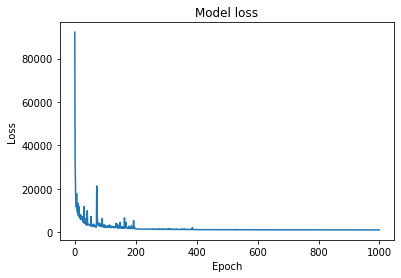

In [16]:
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

In [17]:
autoencoder_model.save_weights('models/model.hdf5')

In [39]:
autoencoder_model.load_weights('models/model.hdf5')

## Results

In [40]:
# Retrieve decoded predictions of images.
decoded = autoencoder_model.predict([input_S, input_C])
decoded_S, decoded_C = decoded[...,0:3], decoded[...,3:6]

# Get the change / difference between the outputs and the expected values.
diff_S, diff_C = np.abs(decoded_S - input_S), np.abs(decoded_C - input_C) 

32/32 [==============================] - 41s 1s/step


## PSNR

In [41]:
from math import log10, sqrt
import numpy as np
  
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 10 * log10(max_pixel / sqrt(mse))
    return psnr
print("PSNR Secret")
print(PSNR(input_S,decoded_S))
print("PSNR Cover")
print(PSNR(input_C,decoded_C))

PSNR Secret
40.560800642187644
PSNR Cover
37.741406616062136


In [42]:
def pixel_errors(input_S, input_C, decoded_S, decoded_C):
    """Calculates mean of Sum of Squared Errors per pixel for cover and secret images. """
    see_Spixel = np.sqrt(np.mean(np.square(255*(input_S - decoded_S))))
    see_Cpixel = np.sqrt(np.mean(np.square(255*(input_C - decoded_C))))
    
    return see_Spixel, see_Cpixel

def pixel_histogram(diff_S, diff_C):
    """Calculates histograms of errors for cover and secret image. """
    diff_Sflat = diff_S.flatten()
    diff_Cflat = diff_C.flatten()
    
    fig = plt.figure(figsize=(15, 5))
    a=fig.add_subplot(1,2,1)
        
    imgplot = plt.hist(255* diff_Cflat, 100, density=True, stacked=True, alpha=0.75, facecolor='red')
    a.set_title('Distribution of error in the Cover image.')
    plt.axis([0, 250, 0, 0.2])
    
    a=fig.add_subplot(1,2,2)
    imgplot = plt.hist(255* diff_Sflat, 100, density=True, stacked=True, alpha=0.75, facecolor='red')
    a.set_title('Distribution of errors in the Secret image.')
    plt.axis([0, 250, 0, 0.2])
    
    plt.show()

In [43]:
S_error, C_error = pixel_errors(input_S, input_C, decoded_S, decoded_C)

print ("S error per pixel [0, 255]:", S_error)
print ("C error per pixel [0, 255]:", C_error)

S error per pixel [0, 255]: 5.71479
C error per pixel [0, 255]: 10.938043


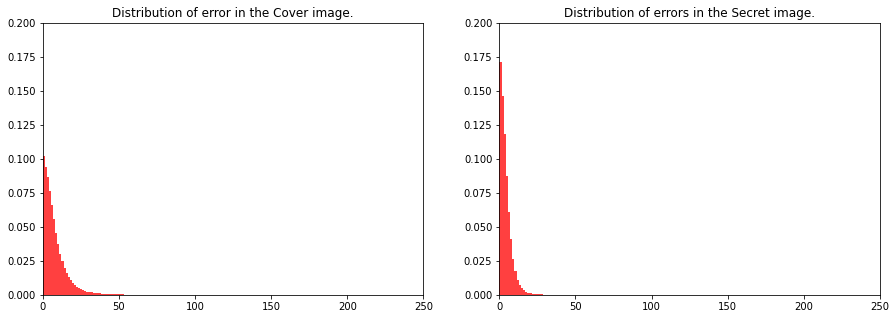

In [44]:
# Plot distribution of errors in cover and secret images.
pixel_histogram(diff_S, diff_C)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

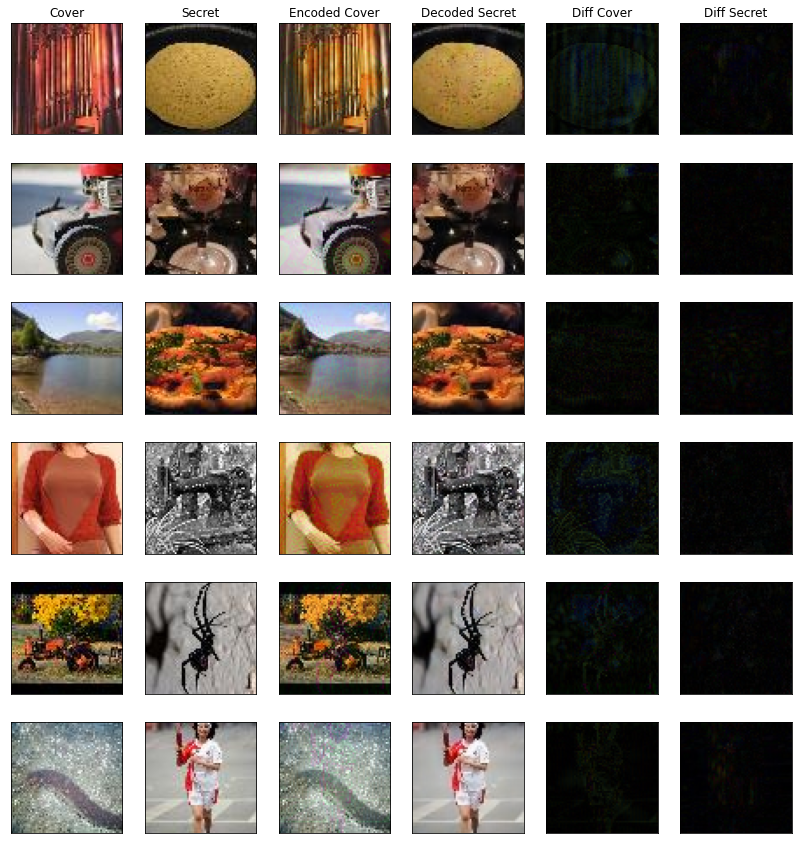

In [46]:
SHOW_GRAY = False
SHOW_DIFF = True
ENHANCE = 1
n = 6

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

def show_image(img, n_rows, n_col, idx, gray=False, first_row=False, title=None):
    ax = plt.subplot(n_rows, n_col, idx)
    if gray:
        plt.imshow(rgb2gray(img), cmap = plt.get_cmap('gray'))
    else:
        plt.imshow(img)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    if first_row:
        plt.title(title)

plt.figure(figsize=(14, 15))
rand_indx = [random.randint(0, 1000) for x in range(6)]
# for i, idx in enumerate(range(0, n)):
for i, idx in enumerate(rand_indx):
    n_col = 6 if SHOW_DIFF else 4
    
    show_image(input_C[idx], n, n_col, i * n_col + 1, gray=SHOW_GRAY, first_row=i==0, title='Cover')

    show_image(input_S[idx], n, n_col, i * n_col + 2, gray=SHOW_GRAY, first_row=i==0, title='Secret')
    
    show_image(decoded_C[idx], n, n_col, i * n_col + 3, gray=SHOW_GRAY, first_row=i==0, title='Encoded Cover')
    
    show_image(decoded_S[idx], n, n_col, i * n_col + 4, gray=SHOW_GRAY, first_row=i==0, title='Decoded Secret')

    
    if SHOW_DIFF:
        show_image(np.multiply(diff_C[idx], ENHANCE), n, n_col, i * n_col + 5, gray=SHOW_GRAY, first_row=i==0, title='Diff Cover')
        
        show_image(np.multiply(diff_S[idx], ENHANCE), n, n_col, i * n_col + 6, gray=SHOW_GRAY, first_row=i==0, title='Diff Secret')

plt.show()

## Failed attempt on SSIM

In [30]:
# !conda install scikit-image opencv-python imutils

Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.



PackagesNotFoundError: The following packages are not available from current channels:

  - imutils
  - opencv-python

Current channels:

  - https://repo.anaconda.com/pkgs/main/win-64
  - https://repo.anaconda.com/pkgs/main/noarch
  - https://repo.anaconda.com/pkgs/r/win-64
  - https://repo.anaconda.com/pkgs/r/noarch
  - https://repo.anaconda.com/pkgs/msys2/win-64
  - https://repo.anaconda.com/pkgs/msys2/noarch

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.




In [22]:
# conda install -c conda-forge imutils

In [57]:

# from skimage.measure import compare_ssim

# import argparse
# import imutils
# import cv2
# # ap = argparse.ArgumentParser()
# # ap.add_argument("-f", "--first", required=True, help="Directory of the image that will be compared")
# # ap.add_argument("-s", "--second", required=True, help="Directory of the image that will be used to compare")
# # args = vars(ap.parse_args())
# # imageA = cv2.imread(args["first"])
# # imageB = cv2.imread(args["second"])
# grayA = cv2.cvtColor(input_S, cv2.COLOR_BGR2GRAY)
# grayB = cv2.cvtColor(decoded_S, cv2.COLOR_BGR2GRAY)
# #    images, ensuring that the difference image is returned
# (score, diff) = compare_ssim(grayA, grayB, full=True)
# diff = (diff * 255).astype("uint8")
# print("SSIM Secret: {}".format(score))
# grayAA = cv2.cvtColor(input_C, cv2.COLOR_BGR2GRAY)
# grayBB = cv2.cvtColor(decoded_C, cv2.COLOR_BGR2GRAY)
# #    images, ensuring that the difference image is returned
# (score, diff) = compare_ssim(grayAS, grayBB, full=True)
# diff = (diff * 255).astype("uint8")
# print("SSIM Cover: {}".format(score))